# To-dos (13/11/23)

1. Remove fits to log, only use fit_short
2. Investigate the bad fits for the slices 
3. Confirm that the mcmc really does work for the entire fit
4. Plot the curve using [a, b, c, d] and play around with these values
5. Fix d = 0.5, and add "error parameters" for the temperature (eT + f) 
6. Run mcmc for this starting from e = 1, f = 0
7. Just use the entire series as your fit function

In [15]:
import emcee as mc #try markov chain monte carlo

In [16]:
import numpy as np
import matplotlib.pyplot as plt
import data_analysis_script as da
import importlib as im
from scipy.optimize import curve_fit, minimize
import emcee as mc #try markov chain monte carlo

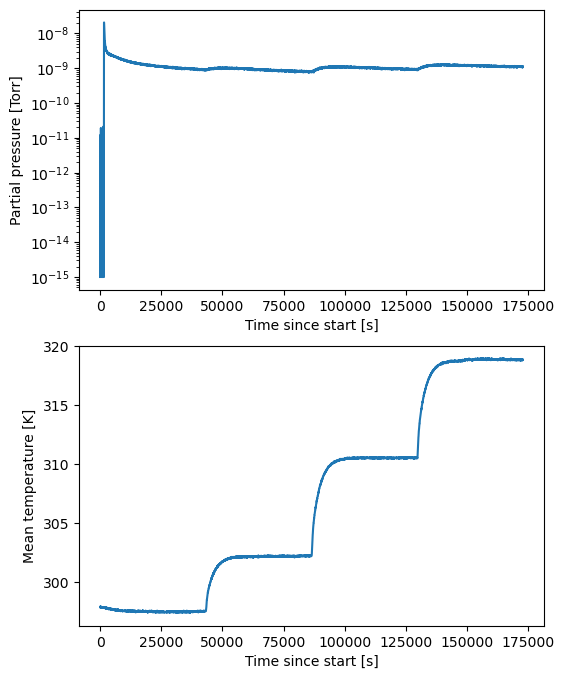

In [17]:
from data_analysis_script import Dataset
run_label = '2023-11-06' ## Change this to look at different runs
d = Dataset(run_label=run_label, gases=['O2'], data_path='20231106/')
d.GetData()
d.PlotSingleGas('O2')

In [18]:
time = np.array(d.data['O2']['Exposure_time'])
temp = np.array(d.data['O2']['Mean_temp']) #['Mean_temp'])
p = np.array(d.data['O2']['Partial_pressure'])

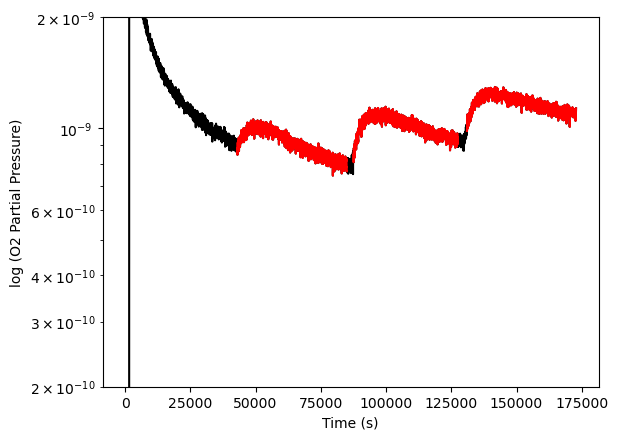

In [19]:
time_slices = [[43000, 85000],
               [87500, 127500],
               [131000, 175000]]

plt.semilogy(time, p, 'k') # Plot the logarithm (base 10) of the partial pressure of O2 (oxygen) against time. 
plt.ylabel('log (O2 Partial Pressure)') 
plt.xlabel('Time (s)')

for ts in time_slices:
    gpts = (time > ts[0]) & (time < ts[1])
    plt.semilogy(time[gpts], p[gpts],'r')
plt.ylim(2e-10, 2e-9)
#plt.xlim(12e4, 14e4)
plt.show()

# MCMC

In [20]:
def combined_chisq_short(params, data_list, y):
    ds = Dataset("","","")
    ndsets = len(data_list)

    a, b, c, tau = params[0], params[1], params[2], params[3]


    tot_chisq = 0
    sig = 0.5e-9 ## error on values
    e_err = 0.1
    f_err = 1
    

    for n in range(ndsets):
        cdat = data_list[n]
        cy = y[n]
        curr_chisq = np.sum(((d.fitfunction_short_temp_offset(cdat, a, b, c, tau) - cy)/sig)**2)
        if(not np.isnan(curr_chisq)):
            tot_chisq += curr_chisq
        else:
            tot_chisq += np.inf

    print(tot_chisq)
    return tot_chisq

time_slices = [[43000, 85000],
               [87500, 127500],
               [131000, 175000]]
tT = []
y = []
combined_data = []
for j,ts in enumerate(time_slices):
    gpts = (time > ts[0]) & (time < ts[1])
    tT.append((np.vstack((time[gpts], temp[gpts]))))
    y.append(p[gpts])
    combined_data.append([time[gpts], p[gpts]])

In [21]:
spars = np.array([5e-3, 6000, 0, 1000])
print(combined_chisq_short(spars, tT, y))
res = minimize(combined_chisq_short, spars, args=(tT, y), method='Nelder-Mead', options={"maxiter": 10000})

136.61168919092208
136.61168919092208
136.61168919092208
101.74638607290629
3024.6324185822414
136.61168991684374
136.82049575968958
6155.842300237032
1138.1903972261166
1113.3344759745753
264.94085810960195
465.1192328319455
119.59242013705361
107.9651511145305
143.59093784495727
110.92978547869569
166.30294222078808
108.94202921246337
126.7270122322404
105.99671354426276
117.1393704175596
104.18158150317853
119.18942997819443
103.4606151273124
106.91441937014568
103.57230872875161
109.70261341406845
103.09611555104755
102.5328032651193
104.4364259637255
102.53364158562239
103.77846931189919
102.5319719994113
101.36422452729059
100.9271663330372
101.25504295270795
101.08402851113063
99.41151586743645
97.93565110701412
99.13977916866608
100.2879475630379
97.62972482259265
96.54622285999221
96.32814288381775
97.10052839522756
94.89919835441073
93.5320095627482
92.37012479787808
90.6407607399434
95.03752699578153
90.039711153909
91.22866817732304
88.85639171083525
93.93179213612413
89.52

13.242002934985305
13.241583273551685
13.241850975031566
13.241597795215082
13.241854481817114
13.241602262503315
13.241649948959976
13.241594242558094
13.241580855485124
13.24165249137371
13.2417372033722
13.241569643479654
13.241564486536692
13.241580703349303
13.241564086724651
13.24159409656621
13.24157370127799
13.241560609611163
13.241591220867997
13.241567794364785
13.241577412739929
13.241556995603894
13.241574698273018
13.241556639792364
13.24156773432086
13.24155600237922
13.241572715367315
13.241555441734555
13.241573589115646
13.241554431300154
13.241557917377305
13.241554533330401
13.241556605361389
13.241554462112052
13.241554754380624
13.241558497639076
13.241553756694687
13.241555492672159
13.241553797672584
13.24155509156014
13.24155375297193
13.241555314915871
13.241553712308045
13.241554397444668
13.241553744941672
13.241554503951024
13.241553554096782
13.241553945293509
13.241553591615276
13.241553792746627
13.241553600618753
13.24155369839103
13.241553700012298
13.

In [22]:
print(res.x)

[ 1.24054746e-01  7.96722204e+03 -7.32443191e-02  6.18850279e+02]


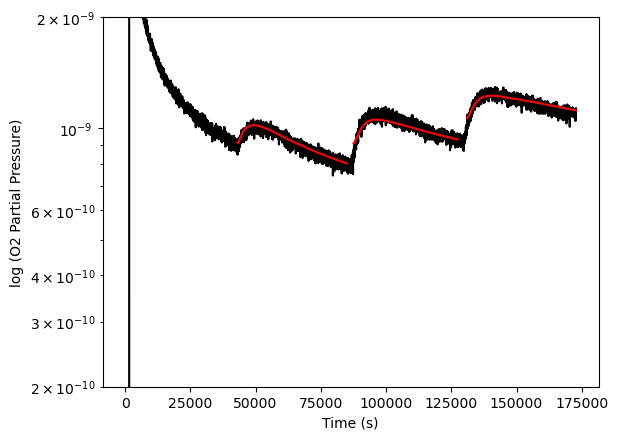

In [23]:
plt.figure()
plt.semilogy(time, p, 'k') # Plot the logarithm (base 10) of the partial pressure of O2 (oxygen) against time. 
for i in range(len(combined_data)):
    plt.plot(combined_data[i][0], np.abs(d.fitfunction_short_temp_offset(tT[i], *res.x)), 'r')
plt.ylabel('log (O2 Partial Pressure)') 
plt.xlabel('Time (s)')

plt.ylim(2e-10, 2e-9)


plt.show()


In [24]:
print(res.x)

[ 1.24054746e-01  7.96722204e+03 -7.32443191e-02  6.18850279e+02]


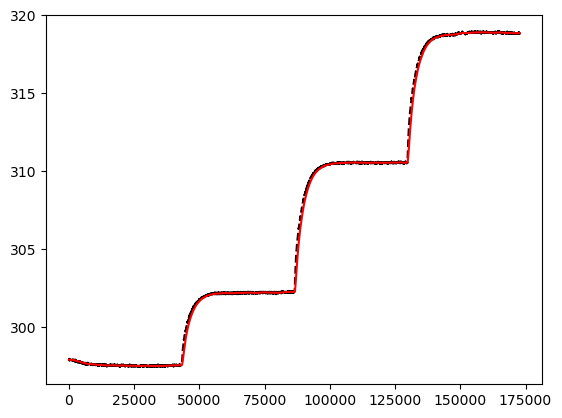

In [25]:
time = np.array(d.data['O2']['Exposure_time'])
temp = np.array(d.data['O2']['Mean_temp']) 
tau = res.x[3]

def exponential_decay(time, tau):
    return np.exp(-time/tau) * (time >= 0)


def smooth_step_function(time, temp, tau):

    dt = time[1] - time[0]  # Assuming t is evenly spaced
    decay_t = np.arange(0, len(time)) * dt  # Define time for the decay function
    decay = exponential_decay(decay_t, tau)
    Normdecay = decay/np.sum(decay) #Normalize decay function
    padded_data = np.pad(temp, (len(decay)-1, 0), mode='edge')  # Pad data with values similar to edge to resolve boundary issues
    smooth_step = np.convolve(padded_data, Normdecay, mode='valid') #Convolve two functions
    return smooth_step



plt.plot(time,temp,'k--')
plt.plot(time,  smooth_step_function(time, temp, tau), 'r')

plt.show()

bp: [ 2.93652760e-01  8.51100501e+03 -4.27400221e+03  1.51111631e+03]
bp: [   115.02922324  12279.25588569 -24715.70963861    254.88704134]
bp: [ 2.89398039e+01  1.15518018e+04 -4.27252062e+04  1.58656796e+02]
136.61168919092208
136.60724593953893
136.61168922542856
136.61168919096536
136.61168919098665
647380061.5342468
647380080.6410916
647380061.5029966
647380061.5341427
647380061.534167
101.60019486289953
101.60019486298198
101.60019486154684
101.6001948628199
101.60019486287021
101.59191585667143
101.59191520567667
101.59191585532429
101.59191585659181
101.59191585664479
101.55881901129945
101.55881573858821
101.55881900997471
101.55881901121994
101.55881901126936
101.42675374412157
101.42673970757087
101.4267537428892
101.42675374404243
101.42675374409592
100.90467315192876
100.90461172646852
100.90467315110659
100.90467315185124
100.90467315189943
98.99307035994389
98.99275604976512
98.99307036139507
98.99307035987506
98.99307035992315
95.90603968811345
95.90495632021675
95.9060

13.482379839764747
13.48237983878499
13.482379838786505
13.433793641018905
13.433794722273257
13.433793640836573
13.433793641020216
13.43379364102912
13.425933108109206
13.425934823262297
13.425933107783578
13.425933108110073
13.425933108116297
13.419763772686194
13.419766451177601
13.419763772142701
13.419763772686295
13.419763772691473
13.40932311140099
13.409326293290658
13.4093231107438
13.409323111400617
13.409323111403648
13.388477965959645
13.38848188657111
13.38847796514025
13.388477965958495
13.388477965961076
13.298769732115586
13.298772887844908
13.298769731476028
13.298769732113954
13.298769732114794
19.2662429102875
19.266158746700775
19.26624292531831
19.26624291033125
19.26624291031839
13.257254345435541
13.25725298020674
13.257254345742876
13.257254345436166
13.257254345434212
13.275425772389685
13.275419580192985
13.275425773664313
13.275425772392945
13.275425772391864
13.255515311561412
13.25551302159898
13.25551531205673
13.255515311562537
13.255515311560657
13.25243

(1000.0, 190000.0)

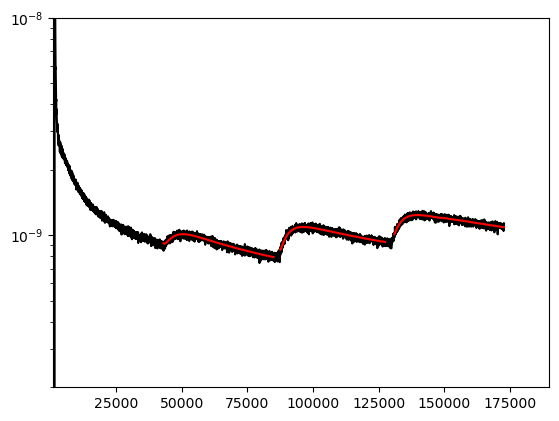

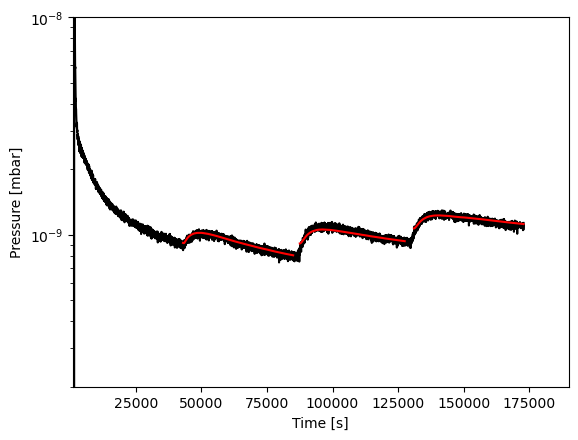

In [26]:
#Plotting Code

time_slices = [[43000, 85000],
               [87500, 127500],
               [131000, 175000]]

#Plot with different fit parameters for each time slice

plt.figure()
plt.semilogy(time, p, 'k')

for j,ts in enumerate(time_slices):
    gpts = (time > ts[0]) & (time < ts[1])
    tT = np.vstack((time[gpts], temp[gpts]))
    y = p[gpts]
    spars = [5e-3, 6000, 0, 1000]
    bp, bc = curve_fit(d.fitfunction_short_temp_offset, tT, y, p0=spars, method='lm', maxfev=90000)
    plt.plot(tT[0], d.fitfunction_short_temp_offset(tT,*bp),'r')
    print('bp:', bp)
    plt.ylim(2e-10, 1e-8)
    plt.xlim(1e3, 19e4)
  

#Plot with the same fit parameters for all time slices
tT = []
y = []
combined_data = []
plt.figure()
plt.semilogy(time, p, 'k')
for j,ts in enumerate(time_slices):
    gpts = (time > ts[0]) & (time < ts[1])
    tT.append((np.vstack((time[gpts], temp[gpts]))))
    y.append(p[gpts])
    combined_data.append([time[gpts], p[gpts]])
spars = [5e-3, 6000, 0, 1000]
res = minimize(combined_chisq_short, spars, args=(tT, y))
bp = res.x


for j in range(len(time_slices)):
    tvals = combined_data[j][0]
    plt.plot(tvals, d.fitfunction_short_temp_offset(tT[j], *bp), 'r')
   
    

print('bp:', bp)

plt.ylabel('Pressure [mbar]')
plt.xlabel("Time [s]")
plt.ylim(2e-10, 1e-8)
plt.xlim(1e3, 19e4)



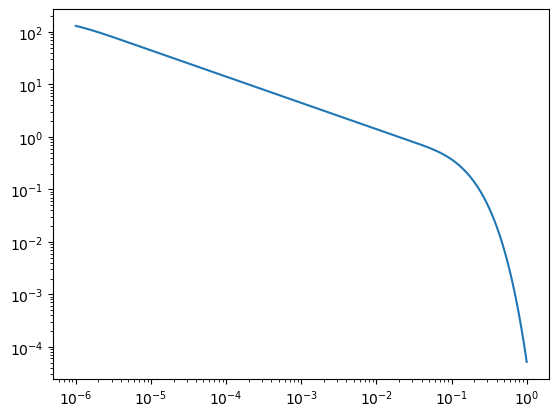

In [27]:
tvec = np.logspace(-6,0,1000)

maxn = 200

fval = np.zeros_like(tvec)
for n in range(maxn):
    fval += np.exp(-(np.pi*(2*n+1))**2*tvec)

plt.figure()
plt.loglog(tvec, fval)

In [29]:
nwalkers, ndim = 100, 4

ffn = lambda p,d,y: -combined_chisq_short(p,d, y)

scaling_factors = np.array([1e-1, 7e+3, 1e-1, 9.9e-1])
p0 = [spars + scaling_factors*0.001*np.random.randn(ndim) for i in range(nwalkers)]
 
sampler = mc.EnsembleSampler(nwalkers, ndim, ffn, args=(tT,y))
sampler.run_mcmc(p0, 4000, progress=True)


200.7449699288124
105.31813734628034
120.26561227039882
241.20190796961037
227.6956740092295
172.16055521576106
130.41004568208746
110.8550402118023
156.25160589436513
132.02002785940587
135.3658712994848
251.77903948623046
107.44721756626771
135.6022054359798
157.22153062983568
223.4418027330717
119.34234396241983
115.64811221366024
139.23158463975693
131.6238354939232
141.41721263010734
118.28368381356344
203.6524475909116
112.4866311590746
113.91341127474124
187.54071268900236
111.44367972263325
143.01132875746222
114.61258644412399
102.7537321270276
113.18790574918492
171.43211444255658
173.8380130011306
171.92269058253967
148.30203057282995
104.64863063249393
206.2571772159669
124.45652734737592
114.11566663238924
165.27858422108227
147.12889424970223
111.4491125255134
133.4676073061789
103.39192887207167
131.12954913448817
114.95390739897599
173.70383583166353
107.56038084530921
196.62000520537606
182.35725208341034
111.89976650199566
140.9091543427961
103.22909966755546
192.3870

  0%|          | 0/4000 [00:00<?, ?it/s]

118.8510794572275
218.22713524894863
121.87213710716404
181.67653382808274
115.18895119703397
137.50587063330397
124.40187374191754
225.38958480205014
101.50222792611257
103.43344621500968
233.45237191962207
112.0455920731898
148.0647231368928
103.38967623545133
138.51052154778992
196.7639671194224
139.34152586492195
110.65019446570717
102.53495598830742
142.34284479605356
178.6112795496273
105.1917709278303
207.51413482681278
214.1040021547597
114.37661322541123
171.33697706250044
136.02185380567082
140.73636461078672
214.78483921021586
199.61630819885534
117.4090676900843
104.214038237736
130.54481367463245
183.71320843290368
123.22521225359851
221.62063447311868
116.78206295877993
102.71179045171408
148.29037436395566
102.7485671307955
130.7540459655559
182.05151667768672
101.56953833814912
159.41203566506366
104.65055105129944
104.4234641140701
101.57452046056576
129.50969559297502
209.93711756196558
108.12845511183104
149.1522691722164
107.37681435338062
477.55465425223974
148.283

  0%|          | 1/4000 [00:00<07:09,  9.31it/s]

149.77193544498908
166.39972798042055
154.3213956713767
127.07377072630209
121.21161256213838
103.32753944977311
121.24734060566149
299.76119989129205
242.65344520129753
159.00678207885275
126.07824886277551
126.40881842471077
201.4404523583714
125.13334145304984
152.04142073179418
118.59184911822484
157.3830649122808
131.42556051661794
137.78459505999626
172.5469044058873
101.55963688428008
116.60921756085429
141.990380285907
105.87753165316738
164.1258823083753
163.00871255627902
103.80639726068358
181.99321008362224
127.68948422297751
105.53429228473016
161.64336001958353
103.38847464437464
105.48558341218195
188.48954697506116
130.6955534852139
161.42880838077832
215.55137631216834
149.2977616475586
101.59534219210757
118.32869698254856
176.61752324906672
131.1136132437395
104.86868719668803
111.03836492376927
102.94346080021745
102.13029462591506
101.86049935029483
126.74055347414387
139.6848963635165
106.15369142056677
123.95495677599942
150.98985646531432
164.62377694114798
111.

  0%|          | 2/4000 [00:00<07:06,  9.37it/s]

124.00815263640797
123.65568942682275
469.19270103220305
137.7388555082596
111.83914447552641
106.52246481146412
124.00005251825002
307.4551468694706
123.38478365491545
156.8061768175967
107.40583975049978
107.91281237864486
172.35851914218347
109.78766526869858
140.7855685080151
146.9533654011673
155.0005467426115
221.841441669631
142.05779921386844
110.66851147605816
102.4102108523245
152.0336405915761
116.81332222893022
147.47472453182704
106.84940327691783
152.19531994520582
105.02981872317463
387.7730971034062
162.47081410028534
103.11662086683924
111.8852142586478
138.77534303005734
128.85129311696238
118.84372852744454
220.5830347021073
118.05004595363991
233.81010240337946
118.35751182676009
176.2348335773835
133.85307318453312
112.27328522064371
121.82383179283963
260.3143744309728
152.6819040291873
105.56951444273464
149.05177016451904
111.39628967943405
104.34550352072216
125.17761149821412
115.10026877914103
105.576237947273
103.33061890921377
118.84190345945699
282.9868211

  0%|          | 3/4000 [00:00<07:05,  9.39it/s]

138.58485961190596
112.74519495103368
132.61494539190147
159.15896076523978
111.78537435678473
225.45092749437848
134.00679857064256
109.9305091815148
103.09915078939656
215.20980413019043
286.87225754640053
122.49001117756357
188.35832413754252
116.39670689285059
164.13625761502783
107.45347259607715
133.19713844541576
127.71393479887517
199.91008491192974
170.31646067951198
102.20672612644228
161.09674609663568
104.28716783337637
230.1477806384887
172.04011547021057
146.448621159329
104.95709633604338
153.9641409186389
108.36187873391381
139.49655852989792
108.03636638535332
126.44824720493992
153.54931165448158
180.8499665032664
237.80832848851577
134.43663438302852
122.96304918534295
140.45021987300686
137.75930751684086
210.17272497772103
182.16180079148347
121.78650184150996
163.0545244795524
172.54945392156236
124.74042989875485
118.74272151392195
103.68252764017205
115.80447890743403
107.01426005581837
156.96930736941889
102.52285964047883
117.29324108572747
101.5602887910523
1

  0%|          | 4/4000 [00:00<07:02,  9.45it/s]

146.4830643869525
114.75562040552794
127.00990357892032
124.98886832822214
109.04366629316911
121.45396623338642
194.97266550628723
112.37812060758345
165.8708826230187
170.49196747917546
104.02707751355938
117.32306031343319
117.8701716966604
131.33762372503605
126.39824272337083
179.1891394518735
109.06666889959143
101.77714006356399
135.89135544966922
125.61593597420007
162.94573076013538
240.85222063324665
98.46679940727978
138.2596972627543
103.01488103466238
155.91533690549218
159.8557110541002
104.14929125488942
102.785598614669
267.63074033006933
165.81015444498618
160.11985192183835
104.1434469958249
199.40258240096045
108.69504884555816
207.5170516865556
117.36694153711753
123.2193062091382
113.94810905981107
111.03775995221915
123.05092528933048
101.55093559874788
167.75663129158576
115.26832254754774
101.99261552014852
149.92314515192356
137.21238472897494
120.85463694710359
150.91620824178813
152.78545072046433
103.86637799961349
111.58158805918319
197.79124820762453
234.5

  0%|          | 6/4000 [00:00<07:06,  9.37it/s]

119.27359827557383
109.08642087921379
162.4747666339095
119.78962622236568
128.59775481017584
101.584490631661
109.64521243962216
103.12136772393112
134.13717017310657
111.42221450576773
110.63634269943739
102.84745325181714
105.18701556870114
167.45792511859526
156.62804757444206
129.7009738748302
106.70289265664289
161.11751999687277
108.04250484460651
101.61027092840948
106.55615109565514
170.82314435122285
179.88461423041738
104.68810186572856
124.32122697865142
102.21675651135585
141.73011299916672
110.09994329623021
113.8400505261177
125.32866754513142
104.83543579959405
111.85712223147424
148.40389245114835
102.39123474302001
130.89482575539088
105.52150388401827
160.40702728310794
137.2196847755761
112.14102564139945
109.47551835515839
137.68176942320466
200.2982095961684
147.00293285118303
111.83901632815198
109.50616829321638
105.37336520920242
111.44622917837751
113.023440182548
150.94119538260344
101.40398432729442
104.11812097895768
154.9393221766723
106.05829547857687
106

  0%|          | 8/4000 [00:00<07:08,  9.32it/s]

117.30509054503597
110.56396685389757
104.4874646389215
111.61129943466013
101.81646311380948
101.44994209545486
176.6171637988067
222.87837163011366
104.73198747673942
128.12724682089407
105.37365879130499
116.61029162737728
110.44982741128699
111.15075973193937
113.52579379670301
127.57702381653442
259.4082904230627
101.80803334680394
120.58448607781155
155.22687061331754
151.7090362261119
109.53436113112116
112.54391169460419
121.04445467688318
104.04104393760751
105.08678761409445
106.86132818171075
110.93823984498933
103.94374242777474
104.42571021499091
203.3523970598746
164.03213958449098
103.83900905124632
128.4733128282074
119.17012042073588
171.8928181108479
104.24856935267073
314.6453444762249
115.1180944760845
115.72342384808717
192.51993918514268
202.2466579253101
192.361548673238
110.43720461062311
131.44718451989803
107.47781303867038
124.45961404619192
114.6517543124175
107.5014956474233
109.88520012891625
106.0696554977784
107.64761201525212
105.18539270963619
122.0654

  0%|          | 10/4000 [00:01<07:13,  9.19it/s]

107.08670574460334
113.40444007940378
109.40815211836659
124.578404233928
161.31538871488294
101.86296290520072
105.93937934515827
102.71309387898954
111.51971313506634
140.210590011316
123.56799735589797
111.52899146687946
108.70349961945564
106.93396233732946
106.08476514516576
119.61576493060366
122.07942497083845
111.72914064225144
103.2774978718129
107.05948474049632
135.0569872260802
103.7261403724711
124.06966622460592
135.89602621369852
101.71177690035837
104.25893797123413
137.30060131395268
139.01519164777037
146.59903960028274
103.6581705022551
143.373381345432
105.0083064968052
105.84502547589119
103.78311429057618
112.61202216444102
128.59683222987923
108.60409675065169
129.34896657147982
108.47275353068764
101.19179769581793
105.53062198539294
118.5290246621687
108.27019783069306
107.9408626437309
103.45259569231808
107.14475617172855
101.22457902183255
99.3783443266091
154.9725525544394
105.69217604283001
106.6035966411844
114.98521182519033
128.0204384637976
164.5046843

  0%|          | 12/4000 [00:01<07:12,  9.23it/s]

127.31579418446601
107.73967629410075
99.1032720019667
112.03749717844991
103.83122134006419
107.33743267205193
104.18847853746132
110.44118410559494
99.88248759267836
141.8575604753679
104.1723836926148
100.12304088827065
102.61305565327638
114.69842559786754
102.4652093333155
113.12236790976412
103.6887936805241
105.95913251432046
135.52486306349152
105.98113916741221
111.91836618694084
117.33578335711465
114.60795096484024
104.57476395295654
112.15833940772212
147.08876115161843
104.6061369187477
168.28230701470082
125.240641441093
104.14339422072904
135.82100470477872
145.4186699083201
96.44507738508786
102.60317755409196
110.68116758348634
104.28490397275161
101.67111831012977
107.05815512870532
129.96371982464873
176.41057308762444
122.82873465389508
101.38916280438112
107.63185447932679
142.4056164689536
101.33348406982603
111.27240932765574
138.86418489655549
129.6439634143966
110.55443722150358
118.88329675068614
99.39665397916053
103.90100947561263
119.32420809627706
107.1307

  0%|          | 14/4000 [00:01<07:10,  9.25it/s]

102.09811473055564
103.39651771088866
161.50718255651927
105.21252997630938
128.18108476448361
102.22040303480345
109.0899620607276
104.34099144541376
103.30697136875388
110.62611441287035
103.91665230208412
94.04796795841006
197.93266244630124
103.81824455682032
105.65987577012388
110.2802674399947
136.50822134611596
100.01698882404996
101.80365816366229
106.83607873264937
106.98203053560766
111.36505796991307
132.35796449034888
102.37610426930897
122.3997423756262
114.08270340851308
103.66869318435225
126.36537985502494
104.00254281368339
103.80294546477569
100.96738971466004
102.2035186447838
102.49318331806683
108.24740722542826
107.01988651298208
138.79983986249312
132.8706451954623
103.10885573764816
127.12872736865515
103.18969357497733
109.56899546580516
105.23280232215069
102.80564949987078
107.19707190826202
141.72703705134512
122.93489750121054
107.6489504837212
103.52653184618572
104.75181048860398
101.68635808128204
104.4966879528196
145.73930518163422
101.15364645335072
1

  0%|          | 16/4000 [00:01<07:09,  9.28it/s]

115.74603393095583
130.2124055623593
104.76267568188003
104.83307543830946
101.58049457135746
107.32504946574988
99.5205104405322
102.57673413472367
104.2110653305057
103.06171138330001
109.07826580596019
100.50822905925557
109.5393105542206
103.01970576754948
94.74081532559555
93.76776418924423
224.0292784827571
100.87844476457238
101.74724111084103
110.99037856162623
100.2682395701479
101.8216890452803
102.04625781079184
132.03702762968447
106.8650534539786
140.29741012328336
151.4283436213304
111.73968493465387
101.41117610221735
112.00304260578632
102.67523758979024
167.11673570799041
99.31097066733376
101.8136346178458
101.65672747329863
102.52907074041161
100.38893173096236
108.04088070503761
129.49905240635994
169.39281463144746
113.31646028822789
109.57061576861221
111.34780242505218
108.3377833810441
106.58438535751802
103.44093683182092
101.53029993996901
103.66837591529787
101.87359001121749
102.2599626772732
119.5477812680239
120.34208589460226
104.83916076489788
108.017249

  0%|          | 18/4000 [00:01<07:08,  9.29it/s]

102.30005953030786
101.99935708179939
101.78792861985096
112.61838968425457
121.7896447689626
103.04748895002227
143.25872722227106
106.66216778753844
117.4075691577775
129.90795165645216
100.30119755782596
103.81623449668923
97.35489663298844
106.60824317075692
103.41130368352653
82.03008411871025
110.81279366653196
98.42945300392314
103.61718039416454
114.89670215461186
111.7503606472865
115.57591449287979
99.65395909896134
101.10420965188396
102.83877890207901
106.18025558780867
100.56090888940884
125.8560470985324
101.28678681153119
124.56710409097998
108.80286022392106
102.51255731807606
111.19666200860348
98.2229073298698
157.28363144897378
103.91098657871156
102.01449418777123
100.11825643608825
98.98227418797345
100.04054426787332
119.38812660998646
101.70013061646458
98.64411171533612
104.8560417687038
102.4276635051092
107.17056096538397
104.01197657660376
102.9281373226475
102.1280322728658
101.39991685914566
103.93187193850628
101.58568867605197
99.174696322295
137.75900929

  0%|          | 20/4000 [00:02<07:08,  9.29it/s]

105.42944634137693
106.39050021993717
100.14534666940328
96.61031388265062
106.0935302389658
95.33239843755948
106.6039086172248
98.28318106696103
137.49098071372921
134.8392999274181
101.94333655455861
94.59884595742975
102.54882024244122
97.40281348951444
111.81478381040625
108.3168536242946
98.47034142982199
105.39357302962541
93.89045475442967
162.02102908047647
126.12206199667693
109.19550811847338
97.16437074589865
100.8819871575389
104.47762035828444
168.11495485026717
111.07776149714306
99.53187367495386
100.05679661091382
148.40791745789232
101.73657450172095
109.21044640781508
103.97883502220947
107.62148901279426
112.0975937367415
123.99467315449087
99.91188711641138
103.1426354050673
101.75248242154579
100.92685495770311
103.65185431341902
103.07822028648013
103.68869247359389
141.72909188738558
103.30721141179896
103.57425271856025
106.29496222804612
98.95452370674056
113.9973009505793
108.48138933217143
95.93103287211218
103.54048708381792
104.87870228442517
95.7575704564

  1%|          | 22/4000 [00:02<07:08,  9.29it/s]

138.29823530031524
102.56220987556989
104.28222300566068
94.46023788175589
101.01008726252304
132.23557356048008
96.90449781681798
100.82332995812351
106.62707770085733
86.78849615195617
171.77091513285876
143.72145850865533
89.604856826992
117.11632101380876
117.33618835042705
100.29785434644637
94.87232463345987
102.51889911624137
167.3538692250993
112.47092071880975
102.94048720239034
96.65739286991017
135.94371551644886
100.92346401098408
99.4637810235516
98.66934332490327
100.41660555434855
99.05158165582985
114.97198289354193
96.97975325120238
99.0403901042367
125.04444256218049
102.24412279828266
98.0408974829373
109.32356588753439
105.37495394529836
109.47679945106779
107.66927033363544
110.8158182638404
116.97678631911933
100.40626857985045
103.88769964068712
98.46128608922726
103.11762301532823
103.16012175601116
104.28171239109517
113.8936065859148
135.3426580916833
100.33554459789977
110.56802791803457
130.57331428194647
104.64895605315553
96.63513409271053
110.313305961277

  1%|          | 24/4000 [00:02<07:07,  9.29it/s]

103.41553913812015
112.15441642302314
102.14713032151684
107.75882544017128
106.16654017871889
104.15605958482834
94.17792691622336
97.34389395622516
104.90132922898798
108.29001108563224
93.07655281733858
211.51977372966368
122.67516714932152
105.71746314828721
88.44627152943156
236.88102307769202
99.94069669674681
95.11224917183124
95.4651027573118
92.65767961113288
98.6026226354378
122.3622147566296
107.17246491394158
98.70757153737205
114.74352894013491
98.90240416810329
99.20639237323999
98.77425911152321
99.51989756057041
94.39250197799385
98.02482811366436
98.21542438286737
101.28870810263611
93.57329629881369
107.41144681996285
98.19111069358055
99.20466125148343
109.03993261980595
106.77962993228837
97.41255928958395
102.70645618386891
110.02175351900414
101.73144160611177
98.63251584903074
106.48111754957596
101.28237021236012
109.09920496193095
104.19086249808703
117.8274450850404
103.9040415641036
100.5713671877541
106.08712850091347
112.87688057249889
105.33569304646831
10

  1%|          | 26/4000 [00:02<07:07,  9.29it/s]

102.26408130196131
98.33370389084348
104.77819476904875
118.60072107099543
89.32491369390276
106.9141813867401
101.52719908396134
105.07143914964385
92.78672133602707
128.63446226739725
102.51998733188378
102.65648853169958
89.14057273600264
105.91597568786243
91.14436783177531
89.86317884622406
112.89568494561989
96.09406705799663
94.91940325500393
106.87844765699151
114.0148906419507
103.4323828694037
135.31836793889522
107.5168818996558
95.18569176129617
96.32556178441824
123.13452599492237
127.67042062656814
90.87143337115215
101.68826288239711
97.6533587063231
98.88534369060736
104.91017214309579
95.2105124969726
123.92171544642169
107.13078817939358
101.96905641622328
102.8741766674952
101.5228740133825
100.54407838887737
100.66722834589571
102.96807071408966
100.32057185957186
98.29310652020297
101.84472453280992
99.23432335184225
98.37788267681282
108.0162601189849
101.99788422462248
114.50660160667124
104.46882500687806
101.38869704805597
96.47206718957199
100.56475198102248
9

  1%|          | 28/4000 [00:03<07:07,  9.29it/s]

209.8331821966456
95.5854523028855
100.37233011982207
91.62329705093569
101.44867105088233
103.4814409122736
93.11392928163525
105.36699260232541
97.1702709564649
119.04419528815961
86.45311317587183
95.79519927901462
113.69545953157052
101.33999325706843
99.81558812597551
99.01319900378607
119.92706383143809
91.87424802391168
113.10752253694392
107.21043732853656
103.56496219180596
122.94821382094695
103.29064833658397
93.25901957691127
99.61608678656944
101.3760939982864
104.15808520704013
97.7108059890334
94.62993532663481
96.48879082983227
93.43828265966148
107.44815935234249
97.18245295924324
100.28238105094158
91.11867668241445
96.81494923739453
103.16991533172614
109.20410304494877
100.26971760628902
98.90270137334048
96.2597058485448
116.08293476315671
102.59477791084657
98.41076083102334
93.6102495381285
91.48098805824675
104.93395666135245
107.96927136511223
103.13948412275812
107.35227412770364
99.95476776907716
103.79492305610736
98.75112161568637
97.08507341020837
103.9684

  1%|          | 30/4000 [00:03<07:07,  9.30it/s]

87.91069320956072
132.12514669284147
153.55458885539187
101.05258670363636
122.77168380112846
102.45825176204704
254.87523071095939
94.47554388016184
100.9570276751468
106.54836137302112
97.18145395730866
101.9100254785333
84.23020271081063
85.93330246076951
95.77206099492729
92.6162787492569
101.01990683747651
88.25414322601156
102.50413021753238
99.53691272240624
99.14073979182777
97.13820413406246
92.20555330246378
119.48872633818057
98.54915423483466
96.2584540144286
95.84955050630435
138.9196048199989
125.41972315385398
105.0777113603738
84.59714900355874
101.56831995543607
88.16857738534398
93.19860272035694
96.12297171039242
94.5690285429117
97.33284176143718
102.05247104391418
98.13536516300152
100.41116692166744
97.37578332336754
101.36372688939437
100.67721434400353
99.46171959400527
95.5747107889571
99.57852930646956
105.02905841512839
183.70501038018944
102.84070135318316
99.47506624603582
89.44978616018221
94.11769731475528
94.79288813792766
105.06515602116247
105.69576691

  1%|          | 32/4000 [00:03<07:07,  9.28it/s]

96.35972121637282
97.07332443584664
84.23755926100617
88.11706379740382
98.7861176730504
83.27248806731893
99.67617907351723
85.62067777948883
92.6162910259313
99.20538188132097
282.1519752449943
95.96866942030351
95.73289442619182
93.68873327924464
97.4923217234917
97.04062309235673
92.37369306505599
109.73702126458613
91.54579261297654
86.3307316894263
99.2224017571401
109.39590962331104
214.30206733002962
92.4655712323484
104.86438733063386
84.58684318606387
97.2011525187925
95.08874260686622
102.39548252438732
107.53536877350567
86.70577885100064
96.41974725714513
116.39403572177984
94.79887033314958
94.12160388267046
98.33645437003989
99.03161613202585
95.17329482611758
100.75247585683627
134.33309334256808
100.35744261558098
101.90585738153675
94.7718229812384
97.92147545397464
97.42855448149943
133.28412052980428
127.86345178180376
93.26746419874691
105.60341761088272
89.60685490705973
92.55127479345211
92.48625543175956
84.30354944705661
102.8500095216514
94.22779829975897
92.5

  1%|          | 34/4000 [00:03<07:07,  9.28it/s]

80.80857280036423
97.44116549690624
86.84228976555767
82.4755549930203
94.30045687284411
151.402064976148
91.83746517142946
93.04571964073841
96.75018715412295
93.2657110128481
129.70397662107518
273.80057835098074
98.79904628517414
87.35874315415708
123.46787808377985
91.71865646101926
88.58990948978163
134.65011585103514
89.26704651976443
94.64914476741922
89.59519485370308
98.6738902246777
97.09376366805647
104.65597535620284
94.14091813524706
96.12225877793145
95.61062886978195
100.84111340370903
99.73501476924422
96.70005607685471
105.38116234695136
105.62280363752498
94.42302076004486
94.29058064869673
92.79364531940871
91.37527102629593
94.61293894167585
112.6867294485954
94.49904184422917
96.6814419060053
91.54145843018239
93.15989424906546
100.44734230106442
99.22254482862576
89.62640508054076
87.6651438383991
90.35853636988827
94.69561610494151
93.72026227736359
94.40755119979718
104.0206062497064
84.27545767735992
89.21751005021495
95.26002013095578
85.74367647296236
89.5214

  1%|          | 36/4000 [00:03<07:07,  9.26it/s]

91.27190653452278
79.31584399413784
95.07525832586379
95.29705863551004
92.31293626758809
94.48575010837561
103.29312025100589
239.21987872142782
91.21957800441666
94.07381618637442
84.08639120032232
91.16059571066288
93.71283956229226
88.76312019861419
84.2027145190344
97.62824454261423
85.52436282126777
108.0865914548185
88.31607658136411
103.52128229281725
117.64887420674253
98.09925389796132
91.756510997941
81.65983311338191
81.02613978652258
91.04057441861961
122.53947046447904
82.19898406377402
208.77639899559867
97.02914538874435
102.49949112286876
100.30448066780643
83.03205948831186
126.95414313407707
100.10237033929322
100.94388924619241
95.74933692662026
89.72650215824902
95.57971926211704
94.73358466902013
93.7593854310463
100.42022452816013
96.29287548880471
89.81665247715746
103.38423855490396
100.04343219548504
87.25359243806864
97.09488551037552
91.86609843336424
79.3009102026422
94.95510922422976
93.43505808712766
92.46033294602364
94.33718339252749
86.46316601937843
8

  1%|          | 38/4000 [00:04<07:08,  9.25it/s]

90.53289089828255
89.86120280766585
81.3121576904742
90.46429024905663
92.46098296185744
108.13844172953384
107.28308933293602
91.90125418085525
83.84222560372962
88.38492022264995
372.605933198703
91.79335195166686
92.82677346590161
90.22955255514483
95.9466587443183
116.4476113203102
88.12843688333855
98.06984254263324
100.07610537374705
88.18606401465445
85.65158142254188
83.84259578148871
89.96760347214624
126.08041388538149
97.17501208113565
98.28035776941725
83.76563395980014
89.6890289153796
79.36011405684515
96.09553178319237
82.30559958892931
93.10651433742984
131.0515017608937
90.33881569031487
91.40795808295724
91.41564323327876
93.9837644039435
102.51481671293219
83.04461811936399
93.44281360406606
88.4204693161856
90.94214719237438
98.13706596737353
86.56670546768359
93.54560079543083
90.13253063854432
89.32322048253154
97.22298874542201
96.92541036793189
98.00154254597808
94.9623359182095
89.62627444344659
87.34083311918445
100.58373136287645
81.8430854076182
103.04424575

  1%|          | 40/4000 [00:04<07:07,  9.26it/s]

93.59367997381277
84.52813634619358
86.39669895692288
96.02541730023293
94.94180602263953
100.4929832796926
90.27018673099383
93.05674670453945
94.45932930482434
89.6005665245203
102.850505696802
99.26435316196513
118.44124919549483
105.97359840751116
125.13486505623064
117.00514536867576
80.64707144301482
91.29332524465319
99.9162321531694
92.12633069856004
139.28562428742495
85.69416284236141
84.03845525576706
109.66019703159337
88.38850361693568
114.87097441009904
180.21608760535142
239.3148821309422
95.79183702220529
85.02115651102939
76.35547003748657
92.69664900189156
83.61316302386365
92.1710317471754
84.10932107596459
92.825095221443
85.88484870052037
94.98238992135236
99.93664354327892
95.71685991956434
93.45103215739191
86.28677081041546
91.70176372880213
90.10152210772537
98.07313710918405
102.15071533376602
98.21778027548905
83.69691325326858
97.06413989866371
91.08711211806829
89.48080122996251
88.52403614202291
85.19546063250576
82.97317444722262
95.81064501859838
94.5145

  1%|          | 42/4000 [00:04<07:07,  9.27it/s]

93.41154431349341
90.5278493634898
94.99421144127152
102.82437594827451
90.00422425521899
94.6728839061823
91.76788689381328
77.30964230168225
98.94305987064463
83.70770721771748
89.42084294022104
92.24634903850978
106.38950655182559
84.62508242684123
96.48761795219359
110.35018587420404
85.13258103020523
83.08394768387629
88.67551860670395
88.25139140444017
84.53303510481001
97.68141635327339
81.56298672553828
94.85116536949158
93.25086096387517
86.4557428965844
84.51372656264448
97.01292270532777
90.0774851447032
83.33339804966133
84.34393339430494
83.2034727734852
76.49248625750083
106.75195068287987
93.31121862072676
85.51755942125499
78.77563285384464
89.53544017356451
97.51129407401649
105.85857605480068
88.62341903804543
96.63896043765905
88.20471409078566
85.77900724855567
88.25358461226924
94.0082482487402
85.88955861720858
80.11105810728898
89.52644569489502
87.04321516831529
83.47998514409062
78.47050380006476
98.49623709849203
92.51373387597076
94.33572352624392
89.84931572

  1%|          | 44/4000 [00:04<07:09,  9.21it/s]

97.7957776850636
90.57925418586191
92.67557870430936
96.97796063662321
98.22095994637174
90.86678270270113
83.4798513295852
104.96489765420746
90.71962346026038
89.38191556738143
83.95963164417394
91.52638600501047
92.5084581978114
90.79891096685057
94.19108054852012
80.21100920881864
93.75995132689951
117.37845886782591
89.52825327172015
93.296650795234
84.89603448590574
93.63046773357023
85.50633004954304
94.11511228677648
84.78136198300052
87.02709675786943
92.46266802453587
94.60074033060974
101.76743683314464
91.01845365915429
81.91232971726666
86.88325993786661
86.64458320977326
84.12298632123132
86.26915350051073
84.34476746103408
92.00977396542885
88.38736130388997
96.91974262554612
88.90865585977106
84.23984395017843
78.77197627994165
106.50716443667771
87.24682875762367
92.5825879474213
83.67155893360601
89.10774066871849
91.03842703301467
105.53783453448384
100.11042593534711
105.01569798451415
88.10616251068473
83.50625836835118
85.1913084560082
76.32257382644045
93.2739901

  1%|          | 46/4000 [00:04<07:12,  9.15it/s]

111.51307522836133
85.412549909952
91.2957659794593
82.97108007455623
92.46385554080805
91.20300471334295
87.95147786113287
87.58751015408795
99.3649063998313
86.51725956532087
83.38221069089286
85.7264945298612
76.4629416854123
87.98602370387675
93.22567627907712
91.87266905642764
86.39928975854177
92.36239735801564
95.12684760796924
92.58988458606589
81.92939143210768
84.02464601609927
83.17582457321419
93.98954898016568
83.481514853205
82.72726695027116
89.26368818741832
80.37609317434891
85.42256107273346
110.60388691091654
83.1978660209082
126.39262309395835
82.16903705983287
101.50128570514218
83.06756624588212
84.74814571546685
97.19453431151038
86.20992049427062
80.19913922264047
80.79654435540962
94.27615199273336
85.2334429087667
84.57767465944605
89.91386452616807
83.58229873329728
91.76914482744908
85.78728961811092
86.99973318492061
93.734651075781
87.34482599644451
87.02774003926062
82.63206330352385
93.25874854586796
92.60612343720567
92.83322050347127
91.03611850756738


  1%|          | 48/4000 [00:05<07:20,  8.97it/s]

109.19902178792464
89.61881047313157
217.75895004850406
83.08190705048224
96.37534241303985
89.44850974493059
96.68874977718184
100.54854460448504
86.18960998524531
82.81937471645313
86.09193365757254
104.75038578739522
89.98962090086515
84.94362443906756
86.00847404761863
85.84768752231591
92.97920388501885
76.19947857500608
90.81518339201986
94.47389969671964
88.62737642922667
78.47365499670636
85.28299636194077
89.89792458836591
91.44201917562403
78.39374260707105
87.74165020874403
87.88806933706539
91.17945849361874
98.55002544135532
79.31237188452049
89.82560485545287
91.2857330426591
122.55208567494148
83.01716168473445
84.78948649366743
74.48765043806068
84.72196089500775
77.48641401374263
85.54525235246213
94.89712371169733
84.3218901624079
81.34353210527895
80.81139302155162
84.22838472523742
98.69417258722476
86.98548761826858
80.02051718318762
88.92007688283361
83.68937708088691
86.11697475772152
93.4812808235528
89.43894271320147
91.2877266978921
75.97038011627751
89.763008

  1%|▏         | 50/4000 [00:05<07:23,  8.91it/s]

71.45910092150598
78.17257182571939
84.6463250287815
78.38557818752176
104.69595102297535
87.64477402825005
88.92749152467816
76.85516089142035
82.71072975872141
92.35424779148605
80.2282617688741
85.06680552169018
95.85174745801751
90.53040129394424
81.99639230545836
88.85566572100251
72.888755963194
76.06153722919626
87.01655883797392
80.00491193828795
86.60872289469799
79.30338156562604
83.02518208227556
98.20707320291932
82.6338951842167
91.25897602579224
81.6381595154588
89.74380413599539
92.92702768491272
95.7333620129067
168.35014084806102
101.8481724980368
78.52192479062211
83.9920639474811
84.1711100075151
77.46911892170226
98.49038181792284
81.231723127632
97.91950207666994
81.35685151600171
95.45422880330648
93.68111537525733
82.66237724484456
87.17566437271697
82.14925129564605
86.93512575192189
83.03452455460652
84.61094017215223
80.38560701596334
89.27972359794246
84.04905609328222
76.31144481571212
144.05794713550313
284.199964108757
91.72095342144277
77.32179583612042
8

  1%|▏         | 51/4000 [00:05<07:26,  8.84it/s]

104.88045360708152
81.12525867034458
70.98679882394362
74.24367542667613
93.41186859449948
81.13826581339342
98.038098533484
90.24509163830457
81.73894454852015
122.25152654545201
91.67185890169239
94.36741257085757
84.49872208574565
665.935608663466
78.7736205902076
92.76290819779251
83.93818395529965
84.30969525363082
82.78785867562361
79.75337537464506
158.65653261677056
103.63116581055618
79.34422691742428
118.42015329472275
79.43501702998125
82.67549886952608
77.99599950571931
88.12583818167411
85.26001960445159
86.18062652705636
80.27866003934179
82.43568267839973
84.85198243057721
93.14539211796902
88.53789488436107
89.3444752882642
88.309588609674
77.66245239276053
84.07481834896777
97.78209393530497
81.91896460565559
98.05098792159788
100.2581581409152
81.85481699606828
72.54989616655192
82.28955886542444
81.1586168490675
79.08786648929114
82.0501954290564
90.25720025732234
84.53632118163053
89.7852838266895
92.59711146666677
81.36046616134058
73.95413854099765
75.030711912605

  1%|▏         | 52/4000 [00:05<08:43,  7.54it/s]

84.57677400773586
87.21731471875208
80.98411288391586
68.01588629175058
75.84227055022723
87.3398604617945
84.27539974448908
102.5650150589107
85.1214858424338
82.51401223610958
85.72472488259012
223.5188376482746
83.12674329781251
96.20457889655992
97.22438394899433
83.53049683674661
82.16782565519378
80.00589764872176
73.92689003563129
90.29938683958846
131.95739105098409
82.49060309703414
79.08470827648162
87.65618714004874
154.97668629917104
79.41826663760176
81.62165140995248
85.04359696067783
92.21525568208756
79.61848894357708
85.06754892450965
85.45037119441953
88.43446071677715
80.93526776133984
81.80177503439484
83.39670453501623
76.90008477588239
120.59727734111749
75.29885813950564
75.39165204505377
90.14456453952404
113.27923172147673
86.14339469671833
78.93751977482003
81.19496091569755
77.38772683443113
78.82284376667582
81.96287832183411
78.41117385061295
80.72783743147164
87.35940244702485
81.06515903417984
79.89052428679304
89.54945960029315
86.71438833321801
86.01763

  1%|▏         | 54/4000 [00:06<10:59,  5.98it/s]

72.6292311858668
83.30660126329828
70.24599460035097
73.95676738197852
75.60185576099893
88.10050217610348
77.137015951531
86.12567747609489
76.54481208417262
86.20677466879368
79.55684680574817
87.92523458334068
84.08790630347747
78.62428033254879
81.9223915828043
88.57531722169456
78.4111159912674
91.46153364660273
89.59207225793051
998.5862371569482
89.34697512185821
75.64850926574283
93.58454946897817
85.53828018236038
78.55124508187751
96.99224327774894
86.76797752227556
80.24522905648843
90.01245886790213
87.80093363559217
90.9699514682649
97.30335823463261
81.07955740385631
80.8288483234472
84.24416892497764
140.59867615383433
96.5174551390273
90.74578809992194
82.44577118623755
117.69822544374563
80.62819184919823
84.65925835356899
82.68708916435452
79.84986170553393
77.68159550634188
86.18165445931119
82.03679349981502
81.81239788756127
78.24227782176553
229.13677220436637
82.9094572585514
80.72299884489425
81.22232720678383
91.01854011622387
72.14980484886038
76.1289852293819

  1%|▏         | 56/4000 [00:06<08:58,  7.33it/s]

81.29986837008637
85.97735326861977
78.03602239000318
82.50079131181579
86.56211066287545
85.64383934041302
86.77918748232796
76.495259119048
85.69702821681597
79.25105681478726
84.93821088935897
85.3781767096759
80.96645341629197
76.87520008820884
87.2843826261468
79.56456277047612
77.86910507391306
85.31057059892609
79.88844790452238
76.66490989141936
84.73687754781851
90.06443062013417
84.48750709257592
78.61802996680146
79.16264075314027
72.59578860115394
74.44858096591582
82.3816287663048
82.82546942575345
101.64596615748174
82.56374583729047
87.647194953873
78.6861635575572
81.62091958870647
65.25115508192813
71.73469589035815
82.80806652780558
78.33730553369124
89.11603532568208
75.5080707921636
78.4044702048343
81.99161385899436
77.98933764259814
81.29415377559786
107.59704121438716
83.91421156910044
79.43264188334199
82.4234540536045
105.25913600160692
96.73895913295816
77.67644718154334
79.26758069035915
89.26036963733672
114.7120585618898
84.0521121775815
86.32846702142578
7

  1%|▏         | 57/4000 [00:06<08:45,  7.51it/s]

90.17852377518415
81.19148286833482
86.44753670156254
84.92166240871
83.40243146387425
86.21149452753367
81.07413761662477
102.47642251614987
88.47216110800638
78.83543247620747
94.37545354309353
85.63506476644773
77.07547268620868
90.4848318335816
75.26217434984082
81.55727962416044
84.88824685322508
78.34750049254276
71.41072718921711
78.26252249943064
118.50346229294658
81.46052161117416
85.68659760779906
83.73580682577575
85.53858257215109
73.0228346901933
80.31512984245705
66.44721619614029
82.67577912970214
81.17978511133086
70.94054611184049
83.8229311107215
83.75862101322495
88.71051708501406
260.4401602754285
79.64765422133178
79.04642350038006
82.97866528765621
90.23866772290918
86.72378729738115
81.50795347120362
99.817741533652
84.26313814850967
73.85017872498571
83.7053821246819
88.43557721389854
77.43495955941657
84.6569133665221
76.64666709413632
86.91015374950005
88.39025764026587
76.39267584832689
80.27542743930096
83.8497959401173
79.01680711751186
74.69726316354347
8

  1%|▏         | 58/4000 [00:06<10:32,  6.24it/s]

84.96927285878112
77.56662309925687
90.069966003708
73.455417895636
79.79864033886092
75.05241505310812
78.28088618414917
81.67046523018284
86.08346216435534
82.371724661327
82.82594337627691
83.25102244350465
101.35980221481644
70.30188276884675
110.26581114988522
81.3443814034809
82.44857889574462
138.344226174491
81.35878016306997
81.35205061390451
77.11256081776651
79.52815482575568
85.3781020789938
87.47925883418759
76.71435529953227
89.8546225976906
78.04406162541585
108.84381086289291
74.06889124566618
82.00356752989498
76.61503368755015
81.74913372490347
77.02397887011685
93.26385289368054
75.39480320388873
83.44349470501609
106.35214237741295
80.29042071219145
101.38537921037096
80.24041882947094
84.84530007766848
72.14863939229352
70.79711382338502
72.66138099695644
78.72516653458572
81.76769812807207
80.23306484744865
87.01105465579545
79.64271430334642
151.09193551007377
70.25869071819861
82.35746494444662
87.1622451867968
91.07353387621328
79.51400216345161
86.562510832922

  1%|▏         | 59/4000 [00:06<11:47,  5.57it/s]

85.44389059789592
69.50159026706073
75.7893290666875
103.93092747530503
206.4972973727753
70.94642869855531
84.56182310002613
82.21836452289139
76.9978400141762
75.35446336696639
84.93103752756326
99.83310908814731
76.74584063192896
84.35034311493135
84.04507191103703
98.7756144204061
76.3460843735017
81.3189422140675
78.76568164502315
69.25643607647962
75.31682017491943
75.32421474134779
75.19950269550257
89.65076962655031
90.47799834681878
77.31654197895593
73.6230850308591
79.59644998872828
70.21471002340925
252.09480736954583
86.93250175397114
82.26004463578039
81.59705682650936
76.45605793669137
81.13459146548526
101.52724097033911
89.13992270344704
105.29650511230965
79.47068063504936
79.75078372667787
70.89402081574465
79.13276224658608
77.77344991750643
72.96092362074003
78.81355849882605
89.06774115683612
79.24845110320126
76.34461977627319
77.29727826472326
86.28752563771536
78.19086486775453
80.56765557504364
86.33897283892097
78.26188424346648
81.51498907604702
76.178275001

  2%|▏         | 60/4000 [00:07<12:13,  5.37it/s]

126.11939208967655
82.39165474092788
78.70353305871015
76.92188925208686
82.88352837397862
74.41348699573136
80.82580938582568
80.36223572970233
95.85574997319664
79.78701834156084
73.1005986228879
85.11540410477438
76.81044702670475
198.1705055216808
77.7534726503375
106.19414372208298
76.2287805581195
75.74506340114002
79.01632793476922
79.52493834109812
92.33692781095033
80.69576330472667
89.17613660846403
83.74706313047085
74.31037388768921
77.580540095805
79.71570835533217
289.4886302275038
81.91706152860267
77.23211271624814
119.17321656877874
79.69188579558752
76.89092889166189
110.19251539400275
98.34462611074841
85.82774784809854
78.8178167903121
70.87178191908474
75.24931507821759
71.28113380300165
82.15798793515185
77.50488310206302
80.6005395871334
78.75218955620967
86.23217402419799
85.3431498452585
81.94128450481338
67.06260828249893
96.3105599895186
70.72889306281479
77.24761755001063
80.78348686203807
69.39096793330282
79.17992024926936
73.1072409904042
123.730916405843

  2%|▏         | 61/4000 [00:07<12:43,  5.16it/s]

71.7317197205349
82.17501335730678
75.38500836660225
125.58747272124779
82.65869195583778
84.83879426606305
77.5646836612309
75.21922431107602
85.22829387937165
81.9659317839299
81.46803296678922
76.93923450480776
82.06654340077937
82.59378353934088
83.24297829514802
82.16015991268152
78.52401200505783
79.86207469740461
84.93048058768859
74.21827388859376
86.30830527072902
70.54626358044294
81.80331461389801
73.4261503712263
75.86372821673774
79.49050515432157
88.4820207127706
91.27905205828235
84.63633594718134
83.01373255196306
74.54022803762166
83.98474568592002
84.41536263692818
85.12897550781634
82.12793344450665
79.91248363689012
72.89211311077827
80.61152363067713
80.3928451033003
147.9562491598854
68.07531729833381
111.71460971518346
72.74501117211037
73.35217824069326
193.93631535172386
71.3755900888412
105.29427528550406
83.67814559292277
80.55258098211132
74.00189533330399
73.43567024576832
116.02026149784434
80.65684930233002
79.62746662560899
80.52897483023801
137.86769635

  2%|▏         | 62/4000 [00:07<13:23,  4.90it/s]

86.3418722134965
76.98961717872041
75.22511539412142
81.63309859992043
75.3385503775244
107.87676719877057
101.53355965508314
73.10493683477658
73.8564381530891
73.44175018697874
79.58873478398576
80.77566259115366
79.33932685434851
268.40228251074006
76.73407997346331
86.23562184437118
78.505809933607
84.34176880226626
89.49055365930349
81.95211443024999
92.7448344057909
81.03803025223195
79.88335788952449
85.5326385327395
72.9159792437219
65.62663330704153
86.05740400019539
78.50579296589136
80.19940879066898
72.21068282422735
77.39459258864079
71.90190415213071
75.36504294063371
80.22856500280825
85.2823852164565
1197.326618158339
72.85437248734304
78.27146898966245
83.44766108052704
65.30813815906411
68.8464710892513
84.21443155789267
105.94729197143037
73.57496391065226
70.67809526782179
70.19046081163333
90.61322029425241
85.12018082874295
78.44114494090351
73.65507584062931
84.88101915710405
78.71771380488329
81.09519981166649
73.30182473877359
84.06410379403458
87.7306377539546

  2%|▏         | 63/4000 [00:07<13:10,  4.98it/s]

205.56755329004025
73.48061719817349
85.01803353168718
76.10275510893743
85.58753051522919
141.66540729193972
72.5214423254582
77.9038486921528
81.16659803485221
75.03667590885213
72.38364875918845
80.65423810489762
154.53782052315483
77.52139967231898
68.54381697679995
77.84765284186025
82.77725323538802
66.60953177254419
81.41387591949291
83.37006008031138
102.89200796837193
76.98244009397703
78.07322128361943
72.49697301849541
77.27309762750009
77.67633750260296
79.41694157236141
79.3017447464041
81.49978466746475
72.43023645662515
67.50398793373363
75.38483668838995
95.66977167520702
85.48468808481249
92.4186387529853
70.43670641217912
70.92273311430752
92.12630434077232
89.58901246604358
91.37292898310331
83.83815826117248
71.35941484203647
80.91619239528349
63.17756444720019
85.28128312602007
85.89789612640897
128.6171672304262
115.6059667143773
83.36565554700164
76.49126446248684
77.47250883978977
73.47202605691808
71.80601686585013
80.6504937331346
1118.3687852157084
81.2513317

  2%|▏         | 64/4000 [00:07<13:36,  4.82it/s]

79.22517492143434
80.85657483102348
77.66477796435527
89.54374603847286
67.51746278837811
69.9553606892527
77.26382203530981
77.66159362425904
71.75141052777369
83.71674202474387
72.7125636846815
122.4506051767643
76.83431266296719
90.4804838682395
73.60732937136395
117.41745526631567
70.62948031413664
77.6455891652441
86.46495995309617
74.61411343542989
68.35632442912521
94.74440179623714
71.54180494163293
72.74451837554635
82.70428281485044
74.85975317166367
75.9107237185616
69.81281700850533
94.98408449316113
73.42875392904078
74.26610504629306
80.40816631505177
79.2770961007308
76.28449002867897
72.53435363868415
75.95757032195445
135.32021250962572
312.5557303239257
81.85039341734017
75.97662793289274
75.91693272607705
68.1186900804316
75.7570061995917
82.9625469926383
83.51003599158079
93.40637539992915
117.86747646672526
71.16859514695031
74.923192780969
81.95429830914075
76.26457768153978
83.98325928412171
78.03411483470506
71.67186942831867
65.36314320169967
75.54560991488958


  2%|▏         | 66/4000 [00:08<13:16,  4.94it/s]

73.19336772962123
72.08811592874456
74.48971021953973
75.20790767693599
75.59547659768087
75.088312214947
86.59363013446045
87.4858299735805
72.38827759929401
77.97582313857907
86.05289339327032
79.53177902914608
130.15899575938323
86.25755261164787
71.77017514732154
78.54533893209
115.3776976373573
69.9822985336354
82.18529620268208
79.2432508336841
69.44547283490462
78.6112024708176
76.82110272164745
112.13443668371423
75.44200700255679
67.10840666686218
72.79887839859856
70.46395129498428
82.70507800461574
77.3990633280414
80.91466147076306
83.87712989493704
81.18697678073177
78.59550119303324
83.67569054481869
69.61532158150787
74.39086140004574
84.28929796376516
75.63275393715766
79.49802671449885
73.55476473274659
72.33778759582081
70.9373690420077
70.4625901436647
73.39133653803759
94.5795849219794
75.14656000978455
75.32833221631908
66.60122277118452
88.7333042092898
90.15263647060883
77.90538524733972
71.88855237994085
81.32987926269303
79.83920326294373
67.29120734824217
75.4

  2%|▏         | 67/4000 [00:08<12:14,  5.36it/s]

68.47716258012929
121.69802134336288
68.5960612945886
79.18213437693238
78.32766617258135
72.23610346729022
75.33681021366014
65.35184981240344
70.88357136755435
76.15666599194549
77.33921643768387
62.91089639043668
77.67716033864959
80.0279546930094
85.95836353707382
90.38171279034916
83.09457031140724
94.02423826214614
65.083379232682
71.558523675213
74.34105454306626
73.48423506547807
83.0005179293607
76.03484136719192
68.5781816612332
75.38470677248625
78.8865875426605
65.69591258276057
73.98466056753891
140.11443288353237
75.92105808620815
168.14838569545105
67.10244357644999
79.08205152425168
79.77905141929908
91.91428342545564
76.44180993119136
78.81376397106976
73.59891490990779
74.78261914058598
96.46203020318009
80.95154592235137
66.69991796881735
149.4932530181485
77.6169655356728
85.63567557099321
83.92584048220041
70.15007921681288
77.5727370368686
77.99716599817063
66.44531782627074
72.06990224931472
80.53855040048877
87.87821863203422
76.74034157970145
77.63165869636936


  2%|▏         | 70/4000 [00:08<08:47,  7.45it/s]

77.55829375146351
75.78232244532364
79.26108125476802
87.10253057086494
75.49058118932959
77.27808525186545
81.9899362964009
74.98669225784182
75.49318014490818
84.48205273717207
66.67788712349778
70.873676943345
83.23208615456636
82.37402980038158
76.2409952829835
74.61914412211362
112.58525791902609
83.68991847847974
69.17866065117455
103.1726240522317
64.53975876642801
70.87919712762789
66.8096585966631
79.45473788691578
74.93837945709048
80.59303154196203
73.37759253627198
68.66669416356316
80.96401223649418
82.58948522839935
72.56772030226185
66.7615769908313
76.90939408040455
69.28194608120549
73.986760142405
81.41342544106004
75.63244871265076
72.879556869049
80.51023327597906
70.27120149877288
78.90375203601594
70.64435399060224
74.67666520439806
74.30053745941335
90.77715773458121
75.40133049202609
158.32085916709724
65.52985834213503
78.81241905261818
77.37353394194692
70.91863211305235
168.10269442600296
250.14272425869441
78.44458642931266
75.0984331992195
68.78411028988963

  2%|▏         | 72/4000 [00:09<07:51,  8.32it/s]

74.28683636192902
74.66864271543344
79.34246914515111
73.72181771455593
100.2231156325349
70.3651341603184
63.93511006393308
66.66199754875284
71.50616849252737
75.55705405801628
79.97643114849014
75.20896355144272
96.41334470228769
68.52897350655367
73.5017091375145
70.08296658501901
69.75691221943572
428.66076027725967
69.95878051969893
72.13520052328566
78.49779830417302
65.54906570547604
66.07948115420245
83.5546967215914
78.25538976013367
81.76712262662534
80.33607808568647
71.43194533275793
71.14237331988829
74.47845609243652
73.40088042288252
71.36820539290414
57.88698859630892
82.12800235163323
525.35306376942
74.53458128135563
71.87755874044356
94.11417686373568
80.73420493200165
79.3759987148724
96.23964700403472
73.9242853545037
76.67374085039717
76.42433590230611
71.26427734792995
76.38287872948294
67.93880433175663
77.21002614531841
111.44063020140742
73.75283322084027
73.54733924910235
99.59120973981197
81.93502368269517
99.98284732373136
94.6317976435968
71.2437036954904

  2%|▏         | 74/4000 [00:09<07:24,  8.83it/s]

72.38575362037409
72.78188777943708
83.59507679707453
71.20228899574526
71.20247112985331
76.97354437302265
66.56585619499413
81.76123805934613
71.69098646608809
80.47059755568299
72.7171349609281
63.75751511621165
74.40187080824866
62.1700623468291
81.67275972665675
72.84582178343425
80.94571468436715
69.10602196670574
82.80064976277288
61.55927785533413
73.24914679661437
72.55909060668637
67.46745793686244
62.7556885179648
71.5149753364795
75.79232576908143
84.50494395932986
63.9761070848684
88.24551169793773
110.96128856673849
74.22603276559998
65.652335608767
90.19290640215058
247.44911111748115
78.79002613387516
86.93470241915901
78.23454761732783
65.76882173725312
110.46027382268396
70.53097217887424
61.29651761860427
76.8844878088725
76.55035586766343
75.63746982792394
63.59493982697197
72.17702217734117
81.60728686131426
89.01553747151866
71.55923317526008
72.2498831684672
81.22041569084442
71.33820373922808
75.13728342177252
71.45172991392866
72.9648851501766
66.59021361775478

  2%|▏         | 76/4000 [00:09<07:11,  9.09it/s]

61.947120507024046
74.01742468422319
333.12402422454034
70.25022376667147
65.5108230483498
67.25991250126657
72.57934061054544
69.33854728176853
69.35188619444736
64.69468989094068
73.32312618838118
68.43091596810795
64.98290228626556
63.89279614203234
65.24340932370129
81.28485192691454
78.34364597550909
77.12944068063413
66.86313899322317
68.40873185904358
104.52805528791754
209.6848885436363
83.60646354376001
763.8052439195496
77.26100826267219
66.61424226119428
86.33978182049776
79.29320116882428
68.87941437700228
72.90033111231313
70.04215175035631
64.0142944269077
68.24887014500229
65.88754248230035
77.95738608234421
65.13536505311045
72.9052636027278
63.26013314400481
81.0953119996261
74.06276225466121
76.15238464965924
73.55461713040543
72.41496132589597
70.44306926749522
68.75742871584158
71.74982529462405
65.55418053245238
74.23579157958774
90.27529780574662
86.22165846370656
77.22130868226537
61.93182517871007
66.77661671327465
106.14605786417061
69.13675925709464
66.2643469

  2%|▏         | 78/4000 [00:09<07:05,  9.21it/s]

80.05933782899749
73.17027600256395
66.20341863603079
64.57922358092924
84.25592481898073
68.03266878480399
72.83654549963686
69.46770194645627
66.49478645945524
62.38621010960633
73.898520305664
64.6725438881853
60.75868725682348
151.85709901292032
64.88019736969227
114.46359409794056
65.13592542945213
62.56547079864745
66.68082217886261
78.20089816365248
76.66578968584994
71.94500696783109
74.25998463315773
68.90882903147504
67.4610006072786
70.94310847192422
64.39048854205453
80.19113009633057
71.72998624425789
63.31209168671301
74.09696575587641
69.76317054418439
72.19814589817997
70.7149659988382
67.74097157386339
70.11728533776741
58.41504640853831
63.46776482166619
80.01348648541222
83.95199675576475
64.78419916517561
110.82085287407062
78.28793120907261
65.27360924576328
69.20849279241128
71.582455913673
125.9492285316315
80.87610375069373
151.19186875383693
81.18838000638237
62.14492240631719
66.50735278419674
71.50670360047465
88.89106662658646
66.40309775886375
74.3783619553

  2%|▏         | 80/4000 [00:09<07:02,  9.28it/s]

119.25792554389915
73.54447471041598
82.5139020774262
66.85645415088666
69.17314348497064
66.52518038235151
76.7669086492841
66.04401366992506
72.25467672609525
66.45247218137544
68.2281123657225
57.76520580501908
111.11230923435939
68.10715353389479
92.90614803715626
74.38310092238102
64.55769179189002
92.58464572190763
73.65393934661529
72.6450396686154
66.99951335052234
74.0300756041147
72.90806055247668
68.62278582512882
66.0959212116511
67.34856794213987
71.83998923524018
71.56115015914764
98.53667788568383
75.81681150665267
71.41634363983712
184.0077413256821
70.46568725099591
77.92684657483912
71.95845227424101
62.98740498928358
63.54017090035621
69.9331333543569
68.32140642057543
75.77540570881726
67.03769036453892
80.53610467662875
69.99048602769375
73.7805454207323
75.65926467882134
81.76513183874631
69.82627340888172
78.12509410462863
64.28608677204062
78.04411867654673
76.94634986837768
66.39391825350944
66.3810025517762
67.4361807050247
58.219461065568694
83.09530381910145

  2%|▏         | 82/4000 [00:10<07:01,  9.30it/s]

452.5615588892998
87.70206506242977
101.67682052153901
68.14390306675918
67.1737689266508
68.52533890435649
72.16023608705382
68.17627778599226
64.15807070995322
63.41963916977444
66.72454900412373
75.47986256610271
73.02759118805646
61.96840631489468
66.03255044269906
62.89722590951459
107.94833742338305
63.99834903111956
139.3291039716916
73.71735231497894
65.9396119956418
69.24894803086642
73.553428520969
80.78237954205926
62.80100502868096
67.08365365439573
69.46154217848678
65.20935361221595
62.56143270337008
87.9890990627226
57.75791462763756
74.84564497090537
66.41272023147478
64.54028589911039
58.99076165716727
96.61799781517516
65.07617517467784
71.10723985735754
62.48475923534112
56.97969724874966
69.07881747820049
74.82800566030446
68.48109678642729
77.97125188180014
64.32571337835417
63.49543229178756
64.40875644854722
76.49517209216609
77.86438379926074
82.04389589624301
72.46884362137871
73.40958775634184
65.67269374801154
73.00070471554872
71.08800420838979
77.3511411097

  2%|▏         | 84/4000 [00:10<07:01,  9.29it/s]

84.33600194159132
58.72866539890073
67.53214116562201
73.63501389001487
74.32447501716597
67.34965312913047
70.51571259770674
74.22173730843458
68.81407486161616
83.60806042973752
92.55117358611048
62.15082500177132
67.19719315297229
80.79704047686204
61.42847054218416
150.89195682819317
63.188062808863016
62.880508756138084
69.07805494180178
61.787242328299214
67.89211168520924
61.772607129599905
76.0176986993755
69.27324977946869
91.77896616624992
73.93499894009686
66.58818387263014
62.81123904703322
84.25267042202721
71.23460946628563
62.30958935700251
72.84020270545143
75.02009336084282
60.42456538679597
66.13411554802403
64.71291776338471
75.4900426969842
65.23037298437492
60.32248493256741
62.70882015165209
69.74523883292181
73.23312423306668
65.14945655199159
86.47429313727697
71.95700127870347
65.41521677850844
67.02650604479156
71.42119873210696
63.37719119120893
63.590154817047264
78.22081211468137
67.24981756455031
67.51719015524878
65.807961126289
72.51785561887083
64.83645

  2%|▏         | 86/4000 [00:10<07:00,  9.31it/s]

74.11211389684524
75.52422108862145
65.19629161598749
61.9956072508984
188.90095739079408
84.92208686291148
61.594287931340034
76.29879046572219
60.63358645600112
62.23002920549416
78.39435239761244
94.30622294472701
191.21170131794037
60.298347334960205
67.76108988061932
68.73444963237293
58.22803997920106
97.63579101405965
73.54554657057989
69.46658519666946
64.72447310446066
65.48551780409994
63.04568921435974
56.034625734267834
70.73167467842062
66.76105750838146
65.02185664114936
81.70280813911418
68.22749383578042
56.78131988548073
63.181310830633265
66.58852815092037
67.60663976210918
76.35705402082534
72.93180425648808
59.60967969176822
79.74822457428371
60.392054413138055
76.99770088488916
87.34837126265947
64.92046431182877
81.13697947696255
73.22761017709351
64.7664949908291
60.06969040936947
68.65070910806415
53.93491373943935
71.22080112671605
70.15508187517953
67.31091827490985
61.44874525815966
62.50987017327783
62.27078120392271
134.1830535354665
59.3904089713523
118.34

  2%|▏         | 88/4000 [00:10<06:59,  9.33it/s]

61.24489227581314
78.77444050264626
74.21383611963992
72.78249141359406
63.17748351732625
61.05023545315133
61.762452359056596
69.34453980640052
82.2834347775846
72.33696479618094
56.43972578537358
116.38767522133892
67.71900304496663
73.30098713795634
60.77450323497732
64.14017100064619
63.47342819506634
68.0785574306436
73.72709416967473
95.7031567909948
71.42895915047305
64.67984778756366
133.4257030863463
59.353645291655944
67.14567299682476
68.1385872002084
69.18106735706212
60.875531848248045
69.34674836131859
63.27314132942807
78.21823986210318
63.17063470443243
69.41546641444104
75.56118167696816
58.11494764397288
70.85712946521312
62.80112400696321
70.56766832215037
67.05839135424176
60.7898763851343
70.796855245561
66.4153653360018
69.14354094316174
65.40773074030292
72.30378574927914
62.97841409474719
63.62496267433983
72.68139450366175
94.59295208533689
61.21345152353075
95.52105716152602
63.03469649794519
67.69420594045599
63.944371051285586
79.27965907203247
57.4147184060

  2%|▏         | 90/4000 [00:10<06:58,  9.35it/s]

59.19837620030356
72.76153849345224
70.75242549486383
67.75911661382396
56.8809410911645
61.90052961673458
66.64461675565899
57.02831076363889
56.86572211876861
67.59334004644477
67.20468854049784
69.47949542060518
69.64453679474411
60.28470498250541
61.309606861534235
70.75753359653174
66.66874225359456
74.82644292771582
56.33184036966742
63.39147965725834
67.38606044369855
71.08205131944734
63.54187460772968
73.17677628577576
57.164778559765885
62.76987917734834
60.7930894986872
69.95693234345431
99.95703734331698
60.33568164818361
63.38794207564744
71.18845007163713
64.11869317451328
71.0315357713128
59.56084635104914
60.37690639473959
61.474465905765214
64.73249084136245
66.84094287961148
70.18478425554483
60.12122254046253
63.689922143544734
59.448286960229545
66.36783615436713
62.667130334684515
68.51973203958883
78.90816572713726
61.27409377907531
83.76017334002927
61.470230014060554
57.100788275659966
62.18841314704789
64.27060111867584
69.56920765137355
105.8912429324821
73.94

  2%|▏         | 92/4000 [00:11<06:57,  9.35it/s]

58.942144556564
56.94920478265826
79.96558832465715
64.29282126805498
60.35664283431425
63.82609471455979
61.869093405830384
57.86745698216167
63.30817581304693
64.98501359594474
63.73674025663222
61.04684022513077
75.12565048652641
73.85565441661015
65.85040120084015
80.81642296671421
64.21899180646365
60.00281197471908
55.482040366500144
61.343908680796176
56.114226847559394
70.20174325219034
61.105179709112704
82.97300867373909
69.34221219548256
65.35616424573537
62.857330967535034
61.29955643582101
64.3448852391325
60.4035706959141
63.52031338146345
61.93319607870174
63.54212240552977
73.57036954887622
62.46024997103613
57.4559748638402
58.81385119356224
69.69725590189087
62.685438057221006
74.05347638750689
61.594479010217015
61.944846411779636
77.66780698652254
71.49584311845585
70.84955067703697
64.04553280930189
106.47737930563316
55.61777091466703
57.063466034290485
63.06237830936092
156.8497603433578
63.58102084745664
241.2597390121948
64.58678490047825
71.7047955578545
63.72

  2%|▏         | 94/4000 [00:11<06:57,  9.35it/s]

56.81990786461996
107.32294578147429
66.68640399590835
60.006542178315
64.70591354909047
59.18221510829339
67.3489927359872
61.10856691979588
65.79545464195162
62.61714907067039
62.73974143326952
71.53676184872249
56.53367167515586
63.260821077850764
63.73066782412076
63.62056586094248
72.23306993468836
60.29772798043537
56.14355672167267
67.90657447660497
58.44548154088872
79.85169113254975
64.06570330250713
61.79524080942239
61.95598781056779
68.26420910495312
62.53645428550384
54.05870002068612
58.21610276662139
74.79875421075673
58.90561946654478
60.64728730798751
69.51747913444964
60.30456850798926
68.95700495463095
80.99981140299661
57.28672231370783
70.79705007266176
67.73451007903257
54.19279842087806
60.408349519329256
58.88900476884787
76.02156262600057
65.73552125420386
62.3267660577434
123.23487784787477
59.51547017098723
60.53083472603942
71.03313048249684
97.43069651621957
65.63633975214151
61.28914567652044
64.61529613544391
70.98326011634197
58.37338336323589
62.5881617

  2%|▏         | 96/4000 [00:11<06:57,  9.36it/s]

53.28371272160445
69.06473207756608
57.4504640002483
69.53095958018203
65.99860038762664
62.20263889184979
59.93502052943998
66.76433140380323
62.148566723136405
67.824021697249
58.89158401897648
62.7079730669721
61.2465282968808
63.34541152265522
178.53402409064515
62.85565025520889
72.6338549409077
62.97104355396519
64.68648786221806
63.83827611746718
56.893760693681074
420.38066435655935
75.67625574567153
58.455706645824435
67.96809089921594
61.0870811132574
67.85837937931426
64.73220866370971
63.02812646384459
62.35748583429772
54.69737811167667
64.6242401940607
66.23904555694558
82.55336434855509
60.45219124572235
59.68001964625143
88.72412483325706
57.94367681895507
59.76086885454916
67.49002138509141
60.612517941488576
80.1851460334562
82.24285428241377
56.926369265706484
59.998404203808555
64.20353367084495
83.75609263341292
61.768421280962365
56.56513664944938
52.838912776724186
64.79181737684442
50.39897615205491
279.90290012255093
79.72663420388062
75.58073831260779
81.41100

  2%|▏         | 98/4000 [00:11<06:57,  9.35it/s]

64.3205282435709
67.48515048990657
71.2780116802688
75.78282689661586
62.95944043938863
56.40533466519384
62.04783950782338
61.37298493459554
60.27745008399873
56.234198346067
60.25712958690734
71.91493083641964
62.22849993911926
131.31670616278137
60.969004288367145
62.14657128446331
64.80124304678694
70.04606192096976
61.564160694619204
63.585127195506914
57.173029530131274
61.30888058445299
60.02024780027905
67.70767126275312
55.386326802283065
58.87320718171513
61.95788545223663
59.48033657070054
74.11779744121641
58.83305612377753
97.96260139654028
148.74882148020816
54.704376812460126
67.43340084409024
52.154024187466604
61.59253437282012
69.01808677253214
94.46848332708177
52.086300288987644
67.03160604922378
57.572591720989436
68.96490734884154
69.57995388966633
63.66362818305025
61.4570665373832
63.011136262134066
85.64484078352895
82.89648874776108
60.858932094034145
62.41962910459001
68.126422872999
61.480721874573504
60.65700991930126
53.87061434576458
76.4739007344601
56.6

  2%|▎         | 100/4000 [00:12<06:57,  9.35it/s]

61.363677005737614
69.88375106062136
55.933642968100806
64.13312071261126
59.29340424675586
61.391913418829034
56.09900418113641
58.23168587122895
59.96808687794683
60.86339677577284
58.03551678747884
60.462519779798924
66.11336191158394
53.395227720000726
60.83646521760047
72.58476069602209
64.9470312733239
74.11760408526679
59.158639424469
68.24189008108546
59.183732336275725
78.80554719919752
66.36496367679271
63.10164682989482
62.559327905729646
61.213383857857835
49.55645220454392
72.22446658440995
61.84640267880329
67.46471776577653
54.74856126989914
67.6892910811343
64.73495993810627
124.95783287367195
59.186426442395366
60.54470772861475
66.85814880557115
58.59476191653569
59.848483132396474
63.5448827149181
64.38578930751885
55.89656294685086
78.55068675320705
59.39865484710602
60.238590317984915
63.408357224069164
58.73854347905218
66.17656385330308
54.27441123322722
56.760864660014825
58.946066112058496
68.06410443525976
64.51555328831945
58.73696755054223
80.99662021849296


  3%|▎         | 102/4000 [00:12<06:56,  9.36it/s]

75.85534365964538
58.655048259166094
59.28122104056741
60.57761159351621
54.70753267447095
66.47610560969257
93.4079843467437
63.4911811197135
58.12969417953572
81.14105364150744
60.53064998506032
57.80977369527879
68.40391425021794
62.47045408808873
59.560658518061445
54.146481489155484
55.49674528356057
57.98346936715602
57.439142325982154
51.65772388968484
56.7745404534636
76.65132508351326
64.63117468785083
2136.920753992957
65.33919341085283
59.11807147909482
58.422268494473016
55.55340820570778
61.89975187601397
96.1299383012647
52.21232843679722
66.7814586898865
70.2219652917091
61.493583327815735
51.53093850798605
67.4790322316322
56.229408497578
59.52329561415407
66.16002423233101
54.72286082469418
61.0107407509686
62.980259535141194
59.1208382171844
64.81419954855049
57.05864460589423
60.06062409712011
55.38520811529192
63.976124298421894
54.29644642579244
152.79034498026414
51.881788809359605
65.79287844157273
58.42361540835698
73.71465189804523
60.02521019116102
101.5233077

  3%|▎         | 104/4000 [00:12<06:57,  9.34it/s]

54.864088138186865
68.75582263010935
53.53969311428264
1755.4344013951345
58.99731613280322
58.32895461690623
64.71130567353582
70.15242632438074
67.49468874395626
60.389352228043066
54.52915837138447
57.78458173185486
57.30913734838577
62.02506289250914
57.4436240121172
59.395505566581264
59.92975786054694
66.31858031620223
72.26541444070067
57.181399755642765
55.0666119556855
60.32616409025404
56.78093424049206
75.55102364936751
49.525622598948075
61.07840733577171
57.88500215218768
61.005631160518746
66.90101238494059
63.167875831224
61.24982103800776
48.72585077808258
57.5973274330898
58.97067159538672
134.43496107532272
873.3714225482087
57.14403922438677
62.31143526882022
57.062160656661575
65.93658386307982
57.17267040741238
51.55892079343688
57.3063816533426
54.57712614370553
51.61213801902137
59.57291083533434
59.067287453866044
53.9445295830744
70.14481807274628
57.25801282441867
60.867879386092625
60.623681181214145
59.11899373382697
57.35124162625327
56.79882029854803
60.35

  3%|▎         | 106/4000 [00:12<06:57,  9.32it/s]

69.72512092351197
261.6088783190603
56.57403263193987
57.290692806811926
69.05301457378567
70.48979319894744
56.50261020228951
57.276390769272034
57.009407265205525
59.99560821650334
58.52011872694977
75.8872553215339
82.06694328545905
47.06880420209762
55.343006275294854
54.83443191154838
59.597927108696204
64.22094208606606
176.14876872235027
81.66392006179917
54.53791139802743
53.859922332259295
652.0380098561359
54.340764918134774
60.008996534556886
58.276854431516014
59.03396880625006
66.91301844548519
48.200901731227546
63.82477293358966
49.898475449174704
68.72653035261624
49.63589319987503
63.93191868280882
50.638706234928364
64.84416548630793
63.44562263346549
60.997746987252924
56.89451107572397
55.78208594673529
70.27849148107717
57.712734621268815
61.92604144136492
59.37934431271117
137.3414155442189
43.717905759109435
60.08207748813477
72.071430578313
57.37086446944238
54.277997322446794
49.89793410175992
54.23823335951086
73.9774254857824
57.48801622081826
62.389655701414

  3%|▎         | 108/4000 [00:12<06:56,  9.34it/s]

52.99267028538566
64.20134753382942
74.28579549493901
55.77283114894358
49.6488191076288
94.47339537138257
56.336147577371804
58.35932427378324
62.245780333312055
55.19968799432492
61.53463115985274
55.51538975197086
55.12742986943205
64.70680282908269
55.12912981939111
57.662170938541315
47.64853007983861
63.496219641424574
54.174596671006604
49.095443207904026
60.95873225916994
67.74529647281175
53.94679774851937
304.835205174253
60.899421945331
60.204979919159626
69.2741903383773
60.13919558973211
57.33429471676072
71.09339031785895
52.53727809947269
62.55889314137083
49.94442163072452
70.14877816310035
60.88718869784316
57.52729237728469
55.63737861586793
87.63842784882286
87.93846628476416
56.23812819158772
57.52639987387907
58.45067955145405
54.19743293395928
349.04630750270263
54.91881615683434
113.5482626573951
128.0244404702386
57.59407690076043
57.184118823563935
53.72843797760814
61.65331675377908
52.59048081850591
49.29258847846751
56.265578228392584
71.17143753113693
54.72

  3%|▎         | 110/4000 [00:13<06:56,  9.34it/s]

58.36616239644694
55.256344985589045
57.24923793280428
54.29885039094583
63.596169061772734
52.23303363028819
57.170569839098576
58.86171328658497
69.56835200588337
63.87009362937886
54.827634711042506
57.75216335914021
62.69526722489492
53.150334367457106
56.64438939258334
4233.943423099632
52.72724374159877
60.444802411089526
54.28966584965096
75.56395395419642
70.56683474515029
63.48172059529496
55.231970362082706
77.06241770270842
60.834945528106694
61.13964493500428
57.08288786372684
68.42645018568724
64.1530257117652
57.333423458504676
57.30988393768196
57.825670666836935
49.79664316619845
81.74160849475976
54.603541086475644
1585.257162698013
61.191289529773435
52.773442027778934
60.275923194049504
55.337737003997546
54.2091530119765
72.25941946389284
55.90295751123524
102.89406660655399
56.609728071198155
59.86539254054729
53.98334925538804
56.161769914786404
52.1969529582051
59.29252390598355
70.28629258814239
51.707795426956935
74.99349229057752
62.246443880114676
147.9974603

  3%|▎         | 112/4000 [00:13<06:55,  9.35it/s]

56.73783810862246
58.66047707539119
107.88723117447995
70.34086033105879
64.6062632150591
57.53919202394934
60.59008862158312
55.527635371273135
71.29820573263407
65.99650191941542
45.57988889194296
177.23543642774587
70.09359224254862
60.205432167668164
59.96572901172047
234.68777515505286
50.959543018294816
533.9188630183826
106.03381024817259
50.60512262791256
64.71264499401777
57.315714893898935
57.715840880329836
56.40279866014418
62.44957175499734
53.747281327608015
59.86800753369555
50.585686029373946
58.42521798427291
55.85292407687591
88.13942915849124
71.76216789883478
57.17835663979697
59.5489150366731
54.8923233144791
51.48026454213314
56.63828063300778
56.38897802275096
59.86700348325809
53.24834728556501
53.45738991090296
54.553500906726306
54.10944523077953
92.21866442509483
65.14794731969572
63.90715656826787
51.524570364184996
61.67850822668587
52.90044603003683
52.06954986171397
92.26249997266416
72.72368558640903
48.850579314363124
48.076115299725025
56.8806225287966

  3%|▎         | 114/4000 [00:13<06:56,  9.33it/s]

53.23097436447411
52.61341446306289
54.33502048616617
46.457974271357216
53.55513991061282
48.92691571613763
105.9806746796012
48.30560339599125
351.4740662227159
58.75650252840032
69.65785886484859
60.62362627659721
53.82577308965346
50.33320102719011
3758.0217311291844
72.55620925461363
57.69981821383894
52.595117179434155
50.06737781145485
52.073903766832345
59.743530199329896
61.60732998468896
47.85682449289801
56.450224456859125
55.55363211437743
57.75061030686491
56.139468818485945
51.859299262543956
55.91482625939871
57.878747638227544
1709.1990180576054
76.95381780487705
56.30870540625744
63.80370508627861
56.68385496349849
90.35254345561894
58.54247213956975
50.66940725160452
56.41771214875479
60.7198955973941
50.586212298444835
64.98383342081628
48.566379598131434
48.98290207684681
67.10468117856905
54.346641130880656
61.17175822001553
104.90792082187808
61.586281461756
49.22036100868422
55.42938276781344
51.559733714403144
53.23989124430504
56.38135400162996
52.0894344956240

  3%|▎         | 116/4000 [00:13<06:55,  9.35it/s]

45.37467347182485
62.174757575104366
55.03798363155869
54.60124440028739
46.82859268748643
75.10892903604233
78.16526924061802
60.95561966304655
62.813633741496844
63.51693311691149
61.168411500468274
57.71712068452054
59.45711994937679
50.193030755644266
52.464899711503755
49.74874755695239
139.8971233063175
55.609550578137316
57.51409037708435
53.10683630849357
47.48622317441391
56.15531315027556
52.45812650727021
51.76303767846714
52.795569083304414
45.6620553238219
55.21669945291029
75.0758740137888
67.82512224858867
51.825579096493776
78.9527853819443
100.14000135885021
54.6308312245979
52.7592369138454
83.43312465887665
52.47444825965738
64.95301691452978
56.09296573721133
46.376877874467496
64.89999306315049
63.44105311381658
53.23538863023957
48.968822481693195
59.177726255057124
72.4049562547198
58.18851251230933
58.722043517289194
52.15380118592561
64.47128525960005
44.409220743956325
63.97590437463617
61.01154007330065
56.10813094297697
73.98927308464692
172.58719027049557
4

  3%|▎         | 119/4000 [00:14<06:53,  9.39it/s]

55.03161358696157
47.31388856959364
48.15489163639603
53.668807037683194
63.376437927936834
52.21367042825859
46.40741920531416
71.27485512416138
69.44433022094415
65.40306395555137
51.481556801861
54.38275862593778
48.4121263858849
47.767292596819246
53.63415429703967
54.72569994348269
55.991627671448356
53.699053498586395
57.199615060859784
56.22344594229463
53.8666531035877
49.02781325494699
66.93229973969905
51.86588336520157
620.991325021809
56.67396082963954
62.635834651152706
48.933566587580344
55.130647226373625
47.77080536003415
50.22546039651958
53.93729410550415
52.44423932281695
57.22313943878899
51.950988216636375
51.76992448270399
53.24415493401374
48.033222597331985
58.05908394571273
54.599719855665995
56.807452197770246
57.444457485157756
7607.926875108291
51.850133212726924
61.68942808202833
54.392036482908374
1130.3706804815338
56.733757928618864
58.843177002552125
99.39232796944727
49.22169283656477
59.95858383014935
47.55533700115986
101.27521162498371
370.610651493

  3%|▎         | 121/4000 [00:14<06:53,  9.39it/s]

50.79302000673923
50.926254694087234
95.6600587738528
56.14250053670553
44.46579062746522
48.145251184249894
61.5855136298686
49.12755583948418
60.322135636187056
60.360038539591166
50.93860852067459
50.817656082995825
54.38899240310972
50.67259577641167
54.578766547490446
55.65497116006453
75.90367749507656
56.53956319503606
53.32618307514052
61.673844446490506
50.896187070415834
55.6256820478625
53.62061235175143
56.42044179290191
157.05973009469648
45.82703292353169
53.05464506938722
54.85285377275201
51.452370769419694
78.25154524199465
62.4058663312212
44.52420458687099
49.75931631400404
55.86950587576558
56.79031410584966
48.898436331027
51.25441447507995
51.23445185588473
66.00726705358706
236.6045785681375
52.13776210644673
57.70172177565483
57.44086091553547
51.90183901088271
46.993408971641145
53.19976438981185
57.474097009598914
62.55205729628043
49.66328683678765
56.458025475296125
44.1469352380713
56.035521914222436
46.673820654950106
51.943784281580164
53.3754232746311
58

  3%|▎         | 123/4000 [00:14<06:54,  9.35it/s]

67.28595234436764
65.94849239029287
78.77318907363174
48.03579342391382
99.19166265884124
49.43186775382783
48.45440095925858
237.59654232711117
47.9864202356878
61.41906553874236
48.72685720124035
74.48346526978028
50.05486756591566
63.545618480287914
63.233941103055756
47.880840915721386
50.86666123759241
53.29396883375806
56.058111816258005
76.68498716752484
48.31258490928121
48.24083487499914
58.16695445380347
161.64872402492082
51.66716620407713
51.181602592645845
58.83774565318183
41.63378248099415
52.57572830954237
63.047846349131405
49.52064245440425
60.48243555104684
56.79700871482113
54.05668540664995
55.298182491683264
60.97679885164872
59.37807264688627
52.86387810597931
83.03450494433247
56.07741754748389
42.85439151005167
46.67986460544988
58.40073065094683
990.4739957981843
50.57786620190693
48.76594224598546
184.37196625764295
55.50329869672453
99.4989622748842
57.275144143000475
50.80611416809363
54.357531831855844
50.974153923954795
55.50437084950705
57.98078091328973

  3%|▎         | 124/4000 [00:14<06:55,  9.32it/s]/gpfs/gibbs/project/david_moore/rjt45/outgassing-setup/analysis/data_analysis_script.py:82: RuntimeWarning: overflow encountered in exp
  decay = np.exp(-decay_t/tau) * (decay_t >= 0)
/gpfs/gibbs/project/david_moore/rjt45/outgassing-setup/analysis/data_analysis_script.py:83: RuntimeWarning: invalid value encountered in true_divide
  Normdecay = decay/np.sum(decay) #Normalize decay function
  3%|▎         | 125/4000 [00:14<06:55,  9.33it/s]

48.75034753997733
49.121936399745465
54.34473992494088
44.40947847737388
49.21941010539151
48.50673089752447
47.07297112322931
52.23150929884606
53.11916136792938
60.10524398057879
69.29649378521532
58.13920461878093
57.29144871369279
49.49566013138637
45.76283460146712
53.916403928817694
54.452434644961976
53.8307222857579
41.7146490103957
49.58452947984004
64.6623620639683
56.17053916565138
59.43620645377467
55.69449259816171
49.95786359690558
54.61676796060853
51.12586862340423
55.25658785705127
52.64432057901624
50.980185338711735
754.3115752318345
132.5848082735207
58.34043001647659
90.19135177762288
907.429607730905
52.88992289083131
57.05068220624023
48.75136609014393
68.73983367614676
135.82815346935266
67.50984523242832
45.288837011745144
49.44247051438644
72.88906599717609
61.9691730586904
66.45149969000147
49.289443945166624
46.64648435165665
44.840839179598014
50.75430344983879
51.84416898650147
133.97915115535434
51.40768748864977
94.02948000898294
52.591040927499186
52.21

  3%|▎         | 127/4000 [00:14<06:56,  9.30it/s]

47.7619583482341
50.30588234606951
46.88134025035678
51.91279722110646
46.950375974493866
49.41436153486208
48.69557316341886
44.1643219732204
52.99462500466738
51.82187833553907
51.29516019764451
44.657040811084556
50.67644219636829
49.94917918200859
51.23364971414175
103.25928442084887
47.50624037955852
53.446733877345636
55.255452359858005
50.911385757851335
51.20140746997864
64.83938388457874
61.36005626027651
48.60911251650188
43.72138606098977
46.74590637441173
49.64767417504869
66.15718705087244
49.324686133458385
52.18747957775287
60.06588804367165
208.94709449083874
49.49006101724035
50.99421848369481
1091.701378955272
57.02292036920322
58.00619688611021
60.79813806191649
66.67583570485326
54.644758403960964
49.886672996741524
58.2520820584216
51.96225351204836
50.59576117670419
56.25766535682929
64.73513630527087
65.78894025958945
45.69007380376188
55.13301239191223
47.77137064138436
55.61126599168261
52.17655383056825
46.524903007627216
49.30212994588779
49.86961808254152
46

  3%|▎         | 129/4000 [00:15<06:57,  9.28it/s]

46.70318356747354
84.95682196804214
47.38704560678678
63.84117262376962
57.103688068995226
48.14329593905458
80.30372953777962
47.45868076847595
48.72056634253012
46.186587726240504
54.92545017277462
52.40051321205276
48.36146556851065
60.8827118822508
45.90265929740142
48.389361919887634
60.593104199880145
169.99443183697264
57.427245098309214
45.28334821589924
77.71501141529404
51.07278672732877
47.42945868637143
54.767672334268795
45.86972504598784
60.15375537550127
46.55176833454146
49.79161966973061
58.3557568766
52.459774021845405
51.21351130327051
47.87265995400884
45.1409879246053
46.223000538831734
64.09985756391622
53.175184372202054
44.774560006782465
49.93783326326815
50.68294711832761
56.162584153408666
46.46297149326815
50.33233750371308
50.380903932729865
49.36975609428372
47.86301592782655
57.95296574609732
58.14409856964523
608.318896183071
60.301208134549135
69.96961812773478
64.71984987319243
56.182428738350495
52.17346290580201
552.2620734797338
69.64028621834183
56

  3%|▎         | 131/4000 [00:15<06:55,  9.32it/s]

113.42980547531845
inf
49.86850162160942
63.15599993019289
48.910972149304605
48.29109547185386
51.840705505874084
50.76802015876197
inf
61.14111141797639
64.47721247095451
46.504470573335425
51.415028418381965
50.18398910518
66.84318257684544
61.84560141390324
72.07452122255008
68.23800857022891
54.01943100405976
54.09211543656919
48.0489129200404
57.76137226081737
45.27545558379964
46.125462648420736
51.25611245901547
50.112179730630814
51.923658805878446
48.977665108137174
44.17862971468203
50.48073199465384
43.994896979626034
56.69844897599728
50.59222028076519
46.19655135585951
54.626720622188465
57.98624386058583
46.76841904061804
57.328666321918845
44.37226854406873
49.11260856258057
49.903610310297665
48.17822651757283
48.52732920102251
50.98367400317766
57.623355271205384
53.28952357686693
49.31011165174465
51.955960812333906
44.679817462576935
48.48412623972894
61.334619248614096
53.71662343145395
53.5092866993617
46.57675060976172
51.46879908746075
70.37968635394671
47.32432

  3%|▎         | 133/4000 [00:15<06:57,  9.25it/s]

72.26740776079998
51.908741497223026
59.55862054536382
46.58728067146407
50.528957470213015
43.27495069172771
49.27427525711474
47.84924089999317
51.73526945808735
53.79664402392128
45.5683656015695
48.8313364336507
66.046900895461
51.51669088226767
48.807730604899405
59.71206677350552
41.56716715361712
43.204435565680996
45.54654672173581
51.62707160012076
52.67842988401762
453.1330513198994
44.191553809970706
50.53479188774251
44.84039098871989
50.12865481123652
47.976137614946744
53.369943203199114
46.04326260738434
104.52196723584947
45.352858734658085
44.93787838944877
54.55721855321107
406.65466768349324
48.85857367498883
50.99475363910757
59.72549367192146
81.13302078393846
44.21076542838417
47.49741016759435
48.7266825819939
51.264661783136816
49.183463101397706
59.365852296672315
52.56227816066583
99.51436335246629
49.85093812292972
53.406344103191586
59.00769986637304
48.84950165047835
50.59790715537524
49.13973835682586
58.59294841229079
50.738667246124834
78.76166543720747


  3%|▎         | 135/4000 [00:15<07:00,  9.20it/s]

47.78872152170884
58.35018663304071
56.36752876752786
47.832491152293485
71.23850176235388
48.68971532427727
43.66185462432018
47.19936796986226
47.76088523036124
49.84661811473203
47.003854652172926
56.13604460924208
45.007520959882726
50.37580155536655
44.384361420609764
59.138082211740496
52.17299363260661
49.90900326450424
53.278160293470535
46.451211599047554
57.683448873775134
49.20141403253882
49.42585889679612
52.07619016721726
61.1618073339569
46.56713550165868
45.781585692372026
45.66742951272903
52.138744202043256
50.23035123769841
51.670854949524454
50.32566331999469
43.665861422600756
51.49404414159359
43.389473892174365
52.463493200228356
48.5860474676477
57.24890785353004
44.28657892805511
74.54878456137135
53.39298953590173
43.692111751392304
64.59424699141614
46.87121357704288
50.1575097610966
82.62727172786165
47.705031701782985
45.3056904159948
54.36217874840018
47.459513791264456
46.34641542691451
46.92914951912524
54.98971854691301
46.871333458957054
89.45134830238

  3%|▎         | 137/4000 [00:16<07:00,  9.19it/s]

48.99210110141857
43.049636732256076
52.99195246581323
45.991437128511876
55.107289491440206
40.74454249197247
45.91357008368412
65.14364475976214
45.01436307247281
82.35638244732665
46.55131866597037
50.01667929930538
73.84543909957635
44.35928618619505
47.26699365948696
50.83966674008006
64.00966274027877
46.94885020256505
42.86762253622253
51.22901668898386
171.53503418507427
45.33628934250413
46.7134698009326
44.973517590699124
46.02348217792046
617.7345338220779
64.10620337366748
49.64707773129926
45.6411061229116
58.02830825620529
43.08881316733323
258.6492363086327
45.81064697999393
43.90569904595945
48.79998642497205
58.04956873581776
50.001559682682
478.9533702959161
65.7932807735267
56.68419842455961
48.13478656866285
50.834237039884755
47.44038664537545
46.12971463270187
47.03867314999337
45.30582735377173
60.58382057087968
46.71865684692173
47.928560560879305
52.36192806528028
46.962575684963035
44.46735495265545
48.11220261109591
251.8517352450228
67.50934751591947
72.3478

  3%|▎         | 138/4000 [00:16<07:00,  9.18it/s]/home/rjt45/.conda/envs/new_env/lib/python3.7/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
  3%|▎         | 139/4000 [00:16<07:19,  8.79it/s]

49.45954450170629
50.1039379872476
44.19329596832931
43.1663071239024
44.22652612149297
48.205707737419566
44.59192019425069
56.31587972763637
44.25232344549148
51.64486742014497
50.12606185016402
534.901408714496
49.494717229668
54.43626815340517
45.69382784414392
46.02588303649316
50.758125422570416
44.637290783851796
50.539987990540666
41.8921660240588
45.101219186462274
45.975069412331365
49.08098400975862
49.41596684865078
45.294223892792985
808.6728938253264
47.24550327162569
44.524865742684845
46.178889152670095
52.07978604282089
44.265323707343114
46.542582709189034
61.49679148282979
47.05097916628756
411.3490390275913
53.49432934163471
55.63380861548842
48.01570217965014
49.82190071511757
46.134567043329035
46.94082981222472
468.9813458608387
59.08519463768686
47.69491202837437
45.81953525775432
47.38456971884159
47.84639241989167
46.014378696667464
43.009007972849844
56.92569432099587
92.42371209903366
53.82690922387154
45.53558660669324
54.115697257619146
49.01975006221923
5

  4%|▎         | 141/4000 [00:16<07:09,  8.98it/s]

48.39448521870473
144.20503407821218
78.99049113929804
44.092036235240975
42.96080444664932
43.62571567360001
46.813283720500955
46.20371198099491
47.26467086218894
45.68393936701619
53.70725546387395
55.530972310029426
49.75540787354859
54.55633974960721
48.26576580039648
61.847457526848416
48.55901421809291
44.46211092219759
48.74868640157174
47.94036829812163
44.72823562848425
667.8065201350432
45.46931923577961
56.63358921880304
40.157488253240494
43.58608645786899
52.90627732772661
50.18242379689609
49.61249371586928
57.09257581266378
68.59217059140954
52.874259168343656
48.93837412138806
75.03148076274161
50.07795283366586
45.01931267409936
73.60832645326852
45.24254719583608
44.672741207613115
47.06929981996359
46.89034349055048
45.19669273704272
47.01976620674032
48.08023738812069
50.29102309464657
43.9318055723413
49.13301975679605
44.63512272131824
48.16294661570856
46.79164146275063
46.477946941964774
124.79518244833298
47.26950152016079
48.5579990770374
51.6858875332759
103

  4%|▎         | 143/4000 [00:16<07:09,  8.99it/s]

48.56047763016758
53.63956044478219
41.611250209411224
649.2678986766055
46.65719636934033
43.37399868539159
43.51852968898005
40.97707170196067
46.648888034085
44.53865907943502
48.167094241047906
46.89108387491305
420.1712142089219
98.87474508906296
45.02543871726578
50.149395211073596
46.38564756557592
44.148457804190386
51.10320836745852
51.91594746655412
48.874005247857795
46.2608130364172
46.596644322680355
44.96061566000441
51.355596684300394
38.872472768054
51.38118878111397
45.02369262443494
52.660391916932056
43.82278783753881
47.365695669787605
41.50520427805235
45.34676707645558
101.69408460268725
48.13730576913082
49.11241185379458
40.554973922582235
44.54052917710023
46.12412558809934
47.0875216589218
47.51449601406567
45.368741935504204
49.3318057617649
45.80791690611343
44.925134127213745
51.97066661129321
69.1934715190107
45.13148403985667
51.64560758292423
52.00286919028743
45.61031191115808
47.69299604460541
45.688143827671986
48.23878684206276
55.395509476451636
42.

  4%|▎         | 145/4000 [00:16<07:03,  9.10it/s]

355.7523165767426
42.99026629314237
44.70583882393319
56.42460731633343
45.68498906212825
45.20114474247974
53.69063488340166
59.993098927282745
42.80568459110104
44.2500369641138
790.5207737925654
49.02257211844204
42.42842481700376
50.20255013690756
55.590886191026904
56.02759924442555
46.01200766114256
172.50116160171422
47.45202022047221
777.3197222705165
47.0683047821411
40.30447791856228
137.97402757838472
38.25861507514039
47.11873223877119
52.854840310605255
432.48088746048506
43.882997051252126
45.06697539069482
349.3469624297949
55.49388328116155
43.03883330667662
42.05927257471398
48.79180396993433
48.624631820522
323.88435818467656
55.30532067093895
454.0611255959709
57.73258609415166
42.957432144626026
45.00807961395344
49.618556754678515
81.07493732295397
50.92117347566337
43.6490196809648
128.19428080409926
53.07251034474703
43.03892179515416
49.76288264854722
47.053648166338085
47.52828879002283
45.63738680726351
81.00059684252925
40.975990373272815
45.23853385342359
43

  4%|▎         | 147/4000 [00:17<07:02,  9.12it/s]

48.90382220880848
48.843027820762934
47.00256594532965
54.75532897216425
43.883214153052606
61.243787746023784
111.60861358076278
42.8174089843897
566.36137047746
47.269027374197336
47.82320095577339
48.446478388817596
48.037075365920735
406.10917482542936
684.3894703206928
54.237246907222804
241.58441502795
49.342672866719894
43.80645001514709
45.64530328666507
75.43283991690275
45.67464483591173
43.842038976175886
39.9353995045528
43.764427098825365
44.607288300130676
48.25166349683682
48.667272152035935
41.83031133366681
44.645985550409385
45.067231616560775
45.72853374224597
51.534522341483
49.85165185841567
58.082446793998244
56.57401048402885
44.731312129886625
41.574812340038704
44.477413459136216
41.6386061551534
297.3518755902624
463.1094516116166
49.20454214060618
45.12436113178811
41.68921064778242
46.27182962504983
42.6296397426113
45.25382114957798
57.10581470445119
46.201463279716904
46.12795938949442
40.94696886334967
46.36922837180715
53.139796424987196
47.3642724225035

  4%|▎         | 149/4000 [00:17<07:06,  9.02it/s]

53.46570996749774
54.079237699669626
46.141236180841204
49.34085481124788
631.7660158073812
102.79362863427548
42.657006745064805
49.91673272484752
46.28773816978088
49.41405370584666
39.238997274866435
45.201493465311046
45.43872393279488
51.067422170018745
51.723505064441994
49.39126405752587
49.90691335280434
43.53331368536794
54.213390395653846
50.83456726420873
43.05511204519054
46.474027496799835
662.0757676483187
45.82827484854998
45.57350771031187
42.1602542177695
43.96202028961619
49.16948609832018
47.8905655892197
41.396800219203136
50.39645055368857
45.12060084746334
43.50398666539316
523.6700518729225
43.4126727731783
46.88584728532001
44.48076044767525
361.5412749164128
66.2125556380148
50.425943370984015
46.74031491590721
52.45629372390309
51.833724958066696
43.63838933554516
1089.2340207334746
49.800410753228846
505.52086062072874
42.68249381805529
38.995361931139826
41.641131887685106
120.11743966613727
48.388474415161475
46.59181202804319
51.92962001896932
44.629113999

  4%|▍         | 151/4000 [00:17<07:01,  9.12it/s]

47.769882521154884
35.67297946285154
55.62945474825144
42.6669857781868
53.22555039306006
58.75891711971937
43.123976124065024
54.37863425245928
47.69676828904591
40.49526204094763
40.769469720475335
42.08915389716147
45.601952135192334
45.3799454090734
43.643157761146284
163.25737824885093
521.465337576987
47.83245109219677
48.95649496137436
58.18744840749123
79.34353720017384
48.70499909580067
40.526648639212155
98.08394026925335
46.65788039207557
45.42663696626433
46.08480183583116
41.489826612696895
40.41091513118704
42.181940794151735
46.84358994219136
40.786496905750106
381.3193764489933
120.76890199246738
53.260454823132605
47.32081127288991
50.50950070452515
45.224263493234965
41.31566671418853
43.57558341391268
44.61462591956867
46.15781270495108
44.337881891192374
46.27362616849014
44.41982647771336
779.7177302313323
1035.795067184948
41.36088193325196
41.20573790212989
46.83855946273795
448.93058979085885
52.24094558448642
42.929397556609416
41.08102279409441
55.940611011648

  4%|▍         | 153/4000 [00:17<07:03,  9.07it/s]

45.15087860949404
47.9778172176017
43.334287913328936
45.07689046304487
50.360479908098796
37.295890350891014
54.363761842091975
62.41282245978478
43.2057952075661
51.474754232505305
46.327454385358664
44.80730596780221
44.81109263749384
68.15760686196785
46.50216607629663
41.03780327491204
49.18467905023205
38.303946153381034
44.73532986121906
48.36697566794476
39.556941076765085
47.223087366324535
45.77230163656938
43.812130332525996
581.0473550149921
43.02854214391487
37.5332240530164
44.7080740552628
65.24559261050086
50.13666966261958
41.43834214972257
42.63457422350379
42.379882243308074
50.76173124498273
45.358310129167364
569.6160250057764
46.17643827896976
48.425505299173665
44.36259633915518
46.00062108165055
44.97251583777595
655.3223371105057
45.144722256352004
40.935428667684945
493.45030564089046
44.028874204611
44.18976021267412
45.6889227826135
61.135097874370814
559.2369230464017
47.480876107557705
51.73958642254531
48.247695083476536
41.54674289907167
43.7433222183369

  4%|▍         | 155/4000 [00:18<07:02,  9.10it/s]

43.243536880312384
37.148597264661234
39.40760837978799
46.63706323936822
46.4695531888178
44.250963781289
39.89439639120516
39.49525022638155
53.024988352546
44.18352270622153
43.04394752308266
44.90186553404851
92.66718610436715
45.922239219338714
44.59936757333812
45.86659083119592
41.445955868880034
45.007784775956615
43.71908363645801
44.741985636432844
47.408457530031654
46.203923417281295
42.69750164190751
35.961982466147504
47.09477800064474
42.48528456339743
40.89681221948423
60.060197916651006
40.471212435256916
79.6443843685273
47.64521783157555
41.36936730550461
42.30684568949443
46.4413318660837
48.63552690441803
46.872325840566006
47.79046814542142
45.13660556781058
42.6394147852579
73.78891365914535
46.64001558702624
87.27486104040847
46.29208515733215
46.44014539289134
48.23802664661692
47.96818234698418
44.176123348423516
42.49349326041601
83.29242544266901
44.11563261744115
40.767481492599764
38.810801088192385
44.028239624869514
49.73047789032351
41.4875475275129
518

  4%|▍         | 157/4000 [00:18<07:02,  9.09it/s]

51.18583886367587
41.296229446690845
51.73290571342569
45.64161381680222
1473.6433139834435
62.1101407438677
42.57875897716609
38.4396934792705
40.29592683732768
437.56893321565576
45.03015078646366
45.900760127081085
48.015736691262774
44.74830804963956
40.172519185526795
97.20005892917811
37.493715902843924
102.39674582433284
45.37012140799858
47.83598167120596
40.78696954013907
634.9567507070772
42.43257968553683
45.00686705921429
44.549160289863586
48.18988288848743
40.58133510146091
43.858850622475494
43.14698349240969
41.758562337536105
40.361355889508125
43.01674633593623
42.87273701785595
39.67281405965369
40.70532601670364
514.9330393463732
42.787780014619834
52.77539382733627
42.15329047814805
41.354005610717024
49.404471676618506
42.34889451561541
55.60585068071065
504.56308423986866
53.15263330463497
37.45638786919817
52.41191039885858
46.30388611171258
44.89550278129052
44.288184953131704
44.09421943841835
40.89157069251907
43.96349483489848
inf
41.77528690812881
45.210743

  4%|▍         | 159/4000 [00:18<07:01,  9.12it/s]

37.46202294598356
40.00926375135934
782.2638816740775
40.98568614304898
50.27207953737664
37.843790754028234
42.66740125771299
59.11772870294578
47.8854917986366
44.184671618975436
764.3444931258325
41.77287623531081
45.328455286324605
1268.7580451037916
44.83974244454197
42.27044094916721
42.54866376471681
36.1347176884687
38.976547188445494
45.884325698717134
35.45109308818253
425.51652537136783
45.35608792004261
44.58824160763346
37.723400582502606
40.915025318538675
39.200609225983534
45.6583907715876
45.78924584710532
38.903188744400396
42.83579412787511
40.859059190755936
43.6008283986898
676.2027034897892
45.37665094725591
47.21505642836313
41.05564499671244
50.02183497567052
40.8135226422147
57.94969008250154
447.67152793833463
39.19490048698468
43.20436391080743
44.12619329795895
51.22758587134972
44.82640689996907
40.24896453970239
89.05416070593569
42.87065110421704
48.377629163514214
43.76502633119982
44.73847111228869
41.27088858754079
60.22347841764186
78.19864902842585
4

  4%|▍         | 161/4000 [00:18<07:00,  9.14it/s]

44.3550745957753
39.08440821255158
47.03232889478681
44.68494149545645
41.85767266767707
inf
41.41069594655565
48.87477772563689
49.54970793116661
45.595996128112375
42.58709036428912
54.32522730086852
45.339903417580814
38.20700537055765
51.37652815711287
39.20458928687616
45.46256969486366
38.12744203066481
60.79508874054885
41.10019559258161
115.35971103194153
42.32907579397752
682.9472163460099
40.78444483531895
42.45839422139628
120.72562325816506
40.93752856303348
46.35038666987924
38.89817026284679
35.8218447982462
40.68075594400065
38.060600712959
45.80100732803119
36.459027479960625
62.161093954875575
37.32237675104628
47.86323161661539
840.5505400397583
42.21986751679725
175.58220165740454
39.95999616579621
40.03155075362326
56.94498365985015
45.48548119962669
59.435652342645184
47.465844326623994
79.62217549241609
38.237430417431426
43.940112972882645
42.01051386366461
39.25325811303865
39.251664887104866
38.05765995062261
42.817367525207025
54.433031204158375
40.95631167569

  4%|▍         | 163/4000 [00:18<07:00,  9.13it/s]

38.49315771560866
41.80447520925895
42.30674728237579
44.66072675229326
44.14303377486123
43.71768586654855
50.07280758775926
40.638595233617195
51.28689336928759
472.1977708174737
41.29767725021233
45.09468691273839
62.007186448325
38.01224191328799
38.44806834241532
50.4187003131334
43.94779224076353
42.250314697810616
47.14950078639362
41.22259166984256
41.599565332931505
128.25839390087756
39.6701168403687
44.00237084103885
998.4914769173959
inf
41.3824739504471
40.25153380763234
37.14597600000703
42.397039095400984
40.75048120796936
39.726667941369406
35.52546594455053
605.5626658090363
39.433768672587455
40.317169134648736
36.2490958723488
36.3692164348409
37.13311816480043
60.34968555962676
42.517373125646344
40.148791350113584
47.44861033981705
41.26386851696148
54.27580164233176
132.52173071988122
41.20773797201222
44.12535551599927
44.00552336339153
39.568849083566235
49.52435332126207
54.1946233723413
58.74652113750098
45.786612139343156
41.56918582217004
42.35604179523017
3

  4%|▍         | 165/4000 [00:19<06:57,  9.18it/s]

57.016983171279655
177.1799303246221
40.725370589664244
39.708844671359195
41.38016557879116
41.544257637464625
120.46142588269736
1049.8308975615191
38.927947398270355
40.68081854114984
40.16669236381393
41.91926551372563
38.07418424819241
40.54749695415775
39.92252036650882
46.00968143833518
64.720432144726
41.33037579987763
42.13343670398576
41.235929902375894
45.692713863973786
41.87356900876111
45.09169606507464
46.89668003521567
43.59832953422517
45.87498119369345
50.26074748695538
37.88289003491468
36.25770789851991
46.23558102677666
42.154787403294534
47.24163217375871
37.45736751306005
46.87183909119115
41.2359009135288
41.49853490053557
40.35540583312424
396.6413197159224
40.54647828040972
448.5069098154569
40.23116563559713
35.379932379289784
39.583784981824245
37.64456334406336
41.904566791693334
90.82777129014352
37.79745405184972
39.33681182362092
44.68618714214554
42.7475086686415
39.238232976758354
44.3533444086437
39.174206289835126
40.25007148260802
37.46443975810115


  4%|▍         | 167/4000 [00:19<06:59,  9.14it/s]

39.94130743333307
39.13737221125016
96.97491520349386
37.08501722181269
40.3498369985472
43.89479772172125
691.3025797177214
49.2121532645459
40.29423684654118
41.5352395451861
39.60779373749108
33.80601006350876
41.34915502116314
38.450369718679255
36.93293483585708
40.403703534730504
41.12301614176859
60.17890019765899
43.55620079675454
47.39058582208107
37.25556336545413
41.4440810525255
64.34086953468139
39.83854080238271
44.84279988652652
41.59383860284778
42.732457621458174
37.639491489234125
41.501122593051406
483.11417763745067
49.33089399060073
534.0632272024291
47.70098492907658
40.035528006109026
46.297811140728676
52.379972678073386
44.72975259348695
523.2715383615594
inf
452.3694066051198
41.04367775176386
37.96621351520585
41.14094059631225
43.046434622189956
48.006155773731685
42.026440020617116
37.711242374529064
49.0979731442027
500.4610396042067
37.14112888119968
39.05673183703371
44.636288100212596
39.4733431989862
41.55321355338963
44.29102486819566
42.6432716740962

  4%|▍         | 169/4000 [00:19<06:58,  9.15it/s]

33.6651413021231
41.35344527538184
38.832190304806886
37.67223752701385
552.4946488661884
41.602170834786754
41.64216619284258
44.67174459544179
42.44747731790665
44.36316230481408
193.93896123940266
35.17542393481214
37.31010174484521
36.38697225367466
40.42860526445586
39.58511966838414
37.14652309027639
89.15920039719069
53.07402883303159
34.2402867535005
43.18452776679088
44.26195053881446
42.14624936607225
44.56582774799209
37.45466356388148
42.299066879690535
47.513958455344124
37.87604930194081
39.52459177627905
40.72601421413594
47.60226745881531
36.73044916840732
1051.996222065682
35.61424568362958
40.105686640015904
39.440397294993744
40.624279787913
78.33343588012855
1117.9418519145147
40.761325072970465
39.859084514674606
inf
35.06445007949556
42.24556545866132
398.0772480013201
41.04880127689598
44.545793822868596
42.85930944356719
39.74473826629871
48.352227633057346
401.41780428693386
38.37250833021038
38.11469677146197
47.178848654758816
56.71511253978342
56.33873127874

  4%|▍         | 171/4000 [00:19<06:59,  9.13it/s]

465.5741235544635
31.511842678848893
38.32943796261854
58.64888898155622
35.9726230852613
40.561583375076324
41.60741757791313
43.5786159824835
42.0201902829378
35.24699116514418
41.22448064070542
38.48364562122579
41.82398684348081
42.8610665722298
39.84315804481184
40.470291377000144
34.71407491334182
40.69427632187035
40.414535885493216
42.17195917787349
31.43286942217366
398.6208711161428
37.07945236423674
49.46992859949617
31.26339488123526
41.68101969633733
41.344083339020344
504.2638321316416
48.259060703618914
39.95159953168449
39.674433960437625
568.825973362638
44.87422110780577
43.02506534942182
40.612583557191904
40.59618578300973
104.60687073414498
43.93234183373933
621.4280573739007
43.38283757838248
37.79501226829512
39.46222518566671
42.027613447888456
41.082208040085185
42.007021834133035
45.93565943275381
45.83541384527282
60.90276809094067
50.10773778380545
38.31753328320566
368.70674686151074
39.43105596731826
40.50846177708918
40.230180854325226
41.37214909504162
3

  4%|▍         | 173/4000 [00:20<06:56,  9.18it/s]

37.53987102273584
42.94679057612778
44.90215697936472
42.801461212152006
41.21931301146029
70.47510108629567
543.7148791049137
42.09681268836192
43.41529754768333
40.408130515875115
524.6745793023106
41.67353160597446
39.86193668722379
45.933106149075755
116.12969455130137
46.49552200632683
47.87579964949005
44.089487802615785
38.00342290692364
41.97859781126134
146.38143390144597
40.67374086955121
49.4107764287258
38.477786823837455
539.0549225463102
654.6524297021308
37.72843694063438
37.67154416038488
65.80480871067195
38.75993669343786
51.78804025062534
80.7959207182427
39.041401265963756
34.554186151125464
40.11236650720277
61.720334813116494
38.98179630807081
36.857417657580356
44.140411829417644
42.84816053623145
59.91552126684342
38.45908758629515
43.52344129172771
41.72501424200625
43.341940846133525
39.13991226720399
39.96742027438735
40.57186250693398
45.805847599252814
39.892764663089224
37.24430855302686
34.48422362806319
30.197387181209177
inf
39.5117909915258
512.5053319

  4%|▍         | 175/4000 [00:20<06:56,  9.18it/s]

47.41091647188392
37.82530275154205
38.89820896133263
43.40160551777063
41.04539613745891
37.349067920588524
41.08271275491761
44.70573434798657
48.65874144625373
42.57010090784041
inf
38.1780935137279
45.24664437616583
36.79098856953902
39.03634736164423
45.50740219759499
48.14823609141105
33.85863009836363
37.49445320790375
41.94587325882652
38.29819403297442
613.994961155373
468.5770380296582
36.29595440639275
39.074371056127205
36.20966433109803
37.98278338057393
36.02396247961896
48.94370299848412
58.54460921579471
45.06902132862174
44.25020059905343
41.42310681082492
38.93891677154916
43.61963903699838
38.55139099384479
40.86815387221422
42.01502586517668
36.41648205595383
41.5606242606799
37.36236059477611
42.00987037740252
34.98404273015919
124.72579149492931
36.063977272430876
37.28408899152785
38.21197450862036
42.31857403317049
39.5886253749279
37.5369254110135
39.58138791920945
34.66570662463096
40.51795040074207
56.97694545988664
39.16697898780871
51.9556112221244
59.99148

  4%|▍         | 177/4000 [00:20<07:04,  9.00it/s]

37.647318507389485
38.1857010124023
37.316340522536464
37.077890613994526
46.91562453247069
44.64239807499032
39.88554470764248
38.069199946013555
40.2507145288111
38.67568459758719
38.66270894779641
41.381611294283545
48.742669873581505
45.579205371282924
37.9177943751773
36.100911453771126
39.0601914029004
45.77258849154985
607.1256593921253
39.17320235888366
82.16479572240212
35.285217451894354
55.386311933992644
33.5249544763365
42.665515384349156
37.499188743483955
83.32732280829815
49.63847768435596
16672.05388405481
43.40641544564529
32.73815858486596
35.55723902082716
36.46887161995789
45.19024140426556
38.52672046285976
37.886899683208654
378.5869466748349
35.51769877848762
39.57718822928787
37.168809335993146
41.5818469422579
31.047188720367203
41.763522956976516
47.3955793459196
43.909422294670314
37.72940798965369
37.82001214329931
35.55288853918992
41.25955142752094
40.48121681050648
52.574463431834495
39.673656882431885
38.96336294930917
42.113858091097505
42.173712544928

  4%|▍         | 179/4000 [00:20<07:00,  9.09it/s]

36.00024225473554
36.924017267566725
42.76555671507832
36.12947003255019
45.32143820578528
38.71532544386679
44.98637957935289
47.04977093136158
36.23416284236167
38.93388350245199
32.80972084890493
506.03329699640653
37.12852623577501
39.494286077112385
38.80478583646844
42.550217352342976
29.57048935463634
34.09359434271418
680.027740844037
38.077387830230904
53.53737236087241
43.902748418593546
1292.0166622751885
44.20591257039462
38.807659444922635
42.22954189476049
37.39610550274546
41.929664474784026
40.360127453853764
49.583871265671704
35.94639336992741
40.89392538896047
40.56731961854118
51.720292886534764
38.13233751528372
41.530736809699434
36.22797743245989
617.3932114783702
36.494990599294994
34.2311540395321
45.372383397556256
38.43294927188329
46.31522787118125
38.5184898309633
38.11457867202111
40.08185683077148
34.93703160495465
40.546293305875864
34.74311996048699
35.493092620295315
41.91713940373714
42.95590628393452
36.563074097659666
106.43279704328432
47.931585696

  4%|▍         | 180/4000 [00:20<07:01,  9.05it/s]

37.202849055842684
35.335432649291434
40.428798168926335
35.58752935964253
39.70304295543825
41.579819426812804
37.26485398880627
279.73226942986776
41.858354350974366
69.05048293468496
39.678792201087646
41.2388354046961
90.46798381464433
120.1756733508688
40.503089639647044
44.03979360771139
1768.5860701300712
33.25633091165655
36.58680419949398
57.756828198585566
36.022039462620285
44.874666997027475
39.41110979784882
36.27318510111257
36.720077533357646
42.98310994253616
43.68701491595346
33.8873822074393
37.98634993523069
50.5973977450263
76.62974361101264
42.709743452791884
38.04921249173963
45.634128505430695
37.992229338342966
47.87286064267445
39.81383023777049
457.71203406170855
33.89039446010551
38.800025915606064
38.82538422514341
591.6752947450793
37.11603965166064
34.008155777899894
40.207186951213316
36.385607962719185
49.96373892388852
42.6228032655361
35.32450684641465
38.562358842917874
35.06559288860777
36.29794309353032
37.28694458732658
40.55497866135788
29.4041413

  5%|▍         | 182/4000 [00:21<06:58,  9.12it/s]

285.55579627928773
36.403142473664424
34.04523983019928
87.25438795457566
43.53153955351288
35.23945266444761
36.046711793514504
37.545507838108165
36.27985674680786
38.468928918182506
36.51773679053662
32.82663885162898
54.69772461093208
40.31202644271125
35.415542086829525
36.050465436563776
38.152613855629
573.9160401303598
44.95848796505892
38.53974183359241
43.842342878153026
32.96865357649418
37.98860911881169
35.81731600120081
478.0794401072784
35.49704248412252
555.254342597204
38.015354982122695
39.542292094749264
35.94965378918748
42.94849494806698
34.818487561771036
49.92274883942078
546.6986474643004
37.72859593891276
33.509600831642096
42.39267173628268
46.793896296476305
40.61485685285855
47.4942152431169
inf
44.167373615335464
42.47365490888902
33.53317158425968
38.769115270138336
36.7152912289506
46.57251917806911
36.4393019735934
9253.60046973301
496.2689906800798
35.524747331231126
31.63221270533132
503.67503313777615
39.90224238285445
431.0817692735059
31.01195941317

  5%|▍         | 184/4000 [00:21<06:58,  9.13it/s]

1547.8146146579647
39.97723439849511
43.88720557249532
37.373305404279286
482.10483130994584
40.85777833953449
35.58923987388002
41.2848987595531
52.61906455713444
41.8531844782805
37.31092034376927
38.4921032358137
48.11761101458866
34.21615797904948
30.918643309442178
40.427753784961155
39.40128917786349
36.1785182827346
36.93713023225098
44.39450742717987
38.77003613360861
44.38493653656832
44.044195051996496
36.10692830374322
35.9342202986294
38.13729077448603
61.51620768701002
44.594745626247864
41.000154234950976
54.790770080318595
38.45294809885824
51.85687330321228
37.11210294258597
46.64605789464933
36.64725003854869
44.81969862107954
36.75950916105208
37.5242628697011
38.005027187191246
36.84359473249551
39.51277100812795
41.708593291565
38.29995953790439
32.40046530753429
34.17725972902046
729.0163471680409
38.23729759359354
53.71590261677369
33.837330833726014
37.340294902915694
44.208153024856735
44.98752711905313
36.80370905211463
39.115524637691436
33.47147925148395
114.

  5%|▍         | 186/4000 [00:21<06:56,  9.16it/s]

47.789522116626515
32.86238925352118
47.24156016212437
39.89374649714809
40.51703873692804
49.98026486884735
37.48100346477593
41.01743751745349
34.97342869709204
36.34174710792463
45.71268203388293
38.155893316879684
527.380091785609
37.240851865787874
35.55322221897217
42.088227793239184
36.01867164288544
35.021396973049185
29.586457494098042
33.823324544324805
386.36158734112377
45.08213957523975
34.69727530369757
38.82590256693069
37.261255826276525
146.0660090281175
37.21932540902351
34.841433775842034
33.32702125598161
36.028120031534314
37.667575806071405
42.70427683957573
461.01820748723935
47.27496463680825
37.64992626998034
72.41689960821742
41.525237125042054
41.131326683187766
37.96763562950352
35.85153730157813
29.433762135866573
38.159417274990304
36.60674896581521
38.9882111951287
29.07721911993746
39.13684388926755
34.71566756718161
39.555259326308644
62.43533629091948
40.47144056377583
38.2776858707974
30.248745709032917
36.76850946164589
66.58648936648048
46.618365307

  5%|▍         | 188/4000 [00:21<06:56,  9.16it/s]

43.61218188626444
44.53335417644135
38.1117559385558
34.878830369566046
35.696813607218175
38.28143518306199
29.455616601611855
603.5162667048126
41.832797004509885
37.90286927580498
39.890382498422824
40.57070537934244
159.5104292067319
40.21696839426295
40.714922061106904
39.49410423893875
39.790922712600135
36.10661549652243
1587.8854055455072
41.0316626505182
45.795262473489466
38.39938583872798
32.52892131268293
1377.6422291273648
43.056949386854015
460.575189521469
100.6224339001125
175.07814802493576
34.08422563124897
34.73224154469665
65.63117759804808
33.35072823710207
40.319558960679444
43.17478875421953
38.8236902192267
35.749907158749856
34.47243830516814
36.40736987656828
37.02157014463053
48.28647646128687
37.0285566221807
35.30422866864485
36.851997481601266
35.56844232215637
27.254742551853433
43.75597258302811
37.132401674944376
39.56832250831553
41.95383399322034
34.70947777955567
35.828878110939726
35.49288477746326
42.84123984641986
100.89930700975708
39.66390853223

  5%|▍         | 190/4000 [00:21<06:57,  9.13it/s]

36.25793296985138
53.020589290112696
42.81985854911102
36.627827344127724
26.28215572664726
32.935519481497764
32.84075029889982
40.20690466938312
36.99354999144407
35.65835342283296
34.13381493996913
40.91138989642154
34.53533357277388
971.7287736912685
66.79768179589051
40.88452406354119
37.11416451869023
38.57401132887706
40.84706402657161
49.51137994228309
43.13543686273225
40.857177505020815
34.180106334145144
33.47077396633566
38.78980664748124
35.48426935650369
49.29277788922147
39.91019294816139
250.25070022570665
487.5045425596716
35.77350685238193
37.47438892294838
702.1366272603344
33.89640242056114
39.25839818355274
40.11080848546601
51.92758219507219
34.728640291068665
36.94614436681051
34.64392892546137
34.464413660141
32.61822007177706
34.08728668172101
34.191885332021656
419.2565343963306
521.2546284901657
36.58342215886766
33.84643121499079
344.4005573244098
35.650318374849626
48.147862053033734
34.90336574090196
38.61835250003525
36.233825674834954
37.894810299528075


  5%|▍         | 192/4000 [00:22<06:55,  9.16it/s]

852.515440160779
39.44874494767602
33.041898556076916
31.92708895872414
35.15526829932314
59.42289728720561
35.71240815730786
33.93664385496207
42.87273693351793
42.905275174189015
58.42420147814616
33.78093856343161
35.43830122321386
1007.504285977513
32.815952064450954
39.63075394128168
37.67650287987298
inf
43.40541934733426
36.78404611280928
33.34403329276672
49.807317679980855
34.79678822755693
685.6216585716049
34.9213144878678
36.49471208977675
85.22570150629066
40.45851893466994
32.86406658187156
47.95217629720195
37.3593869426487
34.897615330599365
51.369256422071075
36.182716290805246
2731.0286303597295
35.96507063504413
33.48810537565407
37.256849554733165
13401.363074151282
38.48715672276646
458.3110957673294
34.74580302660263
41.52861474094104
36.984394384161654
25.71644036358378
593.0363478269581
31.911395187370196
47.31182025427718
38.59919669086458
39.45438478998787
34.69983177804754
33.10641566665285
33.16756264243094
33.257739443034254
32.43675232397751
37.80367152238

  5%|▍         | 194/4000 [00:22<06:53,  9.20it/s]

36.93496223420962
35.050743420238284
544.6984020181259
42.484330947955186
42.676168449989284
40.38432270779926
39.1790122674974
35.85717347530273
41.12254707341453
35.065708516435066
34.301075884507874
27.729694742766625
32.55143955140308
40.038320999547075
38.20891140737419
32.97455175039854
36.11141790420983
43.76416350801054
29.281159741545324
40.931233684882784
46.832524101639606
33.41380793335887
475.62453277140634
34.21342927064011
34.999185387119184
34.832097275328294
128.93154358486956
42.515161510378135
19760.75800635764
35.41297054920365
39.84519652388037
31.632324885902463
51.56430116119198
49.83551391305797
40.49103118474545
134.3827665984844
473.6255018749177
30.039114557727085
35.8787685461918
35.69619235731875
36.360286562230115
45.72631514138937
38.361073727757265
36.63957112149532
33.580451776465345
35.6975629384789
35.672840890482256
34.199452736136536
44.41858954389184
30.997852002780935
107.15873431157941
123.25258477986492
35.410158948759474
37.44548642936209
33.18

  5%|▍         | 196/4000 [00:22<06:51,  9.25it/s]

34.43728614861176
37.40146804875708
57.79238214109299
42.66335289537756
27.802180269963774
35.528151593474306
42.5420230204024
73.55173312605342
32.44207866867329
32.38511970245048
36.33106246007593
33.494849273921766
35.08639143229995
28.416314491959533
32.523550474567145
38.440771415582276
29.38333748812953
30.964031301153184
676.7973535954184
58.94863089091339
34.17055877320579
37.72356969378405
32.95850690793496
32.581746444259366
601.8375614285865
49.17364473006074
33.21310408478444
35.97221158518065
34.87615626735723
49037.57740663425
33.74319743872522
34.84856529149431
31.589050194712716
521.9854936429786
68.37342690224544
51.912561483386554
42.82072408653474
26.86614756403677
33.849443235633835
59.20455670563649
43.11465608690529
34.57109523147656
36.25227077502892
49.60475555018821
39.69285555944367
25.385055804931877
34.05232194986081
50.76693998288963
35.49694262944746
42.45978224373421
227.12874507665794
35.0595753257414
46.186834480998755
35.27256510004611
34.4340937183323

  5%|▍         | 198/4000 [00:22<06:49,  9.29it/s]

33.14815544205345
32.575194166925144
546.1162434243533
33.283438095127636
40.642137334221125
480.0434311964053
37.348516100688144
57.667355331018214
30.184657063348567
25.64084289588859
34.934727809969054
32.6113711709591
31.975452169875474
34.44673807416601
35.621399388840416
499.9658029282108
33.27412848392906
416.06361486204275
29.96170148313832
1408.8667031895188
36.185642855895274
516.4915521294458
41.631930791041654
49.52657059471906
37.443777142750605
40.02968760271939
35.26663997274261
34.20304434607419
40.76960004274534
31.00104880975355
42.28855811275698
37.06010032859895
33.680053113651965
37.517577127981795
33.591744073773626
48.612291999029125
34.98756302503733
36.31624547478392
40.5427317036507
30.012513027392856
82.33092065070923
34.424235331521935
33.424682235428115
242.32667917550927
28.560729859599434
36.42082304115886
40.41998762552585
55.76592321253029
35.868541619521324
59.30609529592125
33.600701843958625
27.63289642034353
34.24096161809908
36.62507250184383
35.45

  5%|▌         | 200/4000 [00:22<06:48,  9.30it/s]

31.7205804729173
36.73122060265571
36.65671754108062
36.87425348224063
43.90235086601744
34.9237146214522
39.9782888719183
48.38211306886439
31.422490211066094
33.749970439225315
inf
33.64345621278619
32.1622009450881
34.559533486771116
31.836123530060416
32.03446933986392
34.50509301476916
30.749735617402855
32.99886269466751
422.28367034994767
28.35251054339486
44.62291001536855
35.40938243135382
34.70341573572673
41.67566889672919
53.292577312925786
40.19476300914676
34.5017836622133
37.0729273585496
35.68338596823409
616.1449222916951
40.97110124259676
29.889616194193636
36.99045964064317
34.18153911043309
36.22563971260229
35.43284036030216
30.23325630182004
36.161290964768284
35.98726753176543
741.402455571619
567.4751174192245
34.713185317432384
38.04023719955044
34.39822509226588
57.86008681054675
39.875226456441524
34.137548018007585
31.068546020787455
27.031953168830434
32.7368358130083
37.38307456989187
35.89357577403359
34.867904292659716
36.380134476455574
33.1169341518038

  5%|▌         | 202/4000 [00:23<06:50,  9.26it/s]

43.35100426448689
31.33697288610579
31.414601214044556
57.59012818944011
40.62528245036191
32.75924111339455
59.667765569683894
39.724204198044134
34.96205526381959
554.3140617074138
31.756734856318896
37.53815396075482
32.03524915567438
37.010160022776866
34.597098227295916
32.80293571193552
34.38443010106022
33.92927982313647
34.9833821971029
35427.77420976644
34.45423181402825
36.44629679633947
29.388341986830838
35.41309874445815
94.77881323705836
32.80665759621681
36.15247729726788
40.328242224163645
30.018014888442664
29.501016043385693
46.50818184413727
35.61978612973355
33.4162594447037
654.6035804043362
47.54682331031438
31.43099847086356
26.201904015200665
37.70037875773214
37.37702658215318
28.40359457805645
36.003508926161146
33.79055287068455
53.87523862495706
31.940404128718143
35.04638905586475
30.139537128233208
48.8680277102424
33.426342959494264
59.14493259675547
28.465167105584875
28.00807616928911
934.4097061551921
32.82988077744566
32.839878968757986
33.79101027850

  5%|▌         | 204/4000 [00:23<06:49,  9.27it/s]

33.673184374441554
26.54618462115681
41.668227500010055
36.71914309863709
32.48861794948067
31.92408858945299
32.362433126901
39.45400903453202
37.75876500809435
33.92306607860174
95.13401777415626
1326.839413418338
43.38398261275205
30.75137635310705
34.77410339085567
33.56790294927066
102.43569150556479
30.911392655418496
35.38752328043101
25.576517390029622
28.20904325721159
26.661428257548554
28.228087700024112
44.78724015282193
33.14378531667357
24.5499042309243
592.4995860723741
35.20134792189421
593.568544062714
31.76537870963492
32.62483137358723
42.28543876410657
25.086388858845226
27.379098965484754
394.2104280185853
414.40849073111247
32.25913657615383
32.13440977157978
32.52924121443091
30.392722682305212
31.885857822397107
31.51280058657144
29.696561175590357
27.78849222009117
116.61329078579244
38.869711691436194
86.07985506939191
34.91057699681703
23.107868226597436
28.479504093596937
49.75494652135554
31.686915497562634
36.52723790863787
27.54985854129567
37.52703110394

  5%|▌         | 206/4000 [00:23<06:50,  9.23it/s]

79.32955666124977
31.970904385812474
33.401484579382966
30.59395871381767
34.90405473911049
32.78104868978701
467.6155653819248
905.7131140949853
28.47520699898235
30.87999692092297
620.132838412786
56.23476906706399
inf
33.122386590987055
403.2947235323733
21.022859167240078
72.91626287578214
506.9522953432503
31.67274076408285
43.98850911628837
716.5913035339129
30.794339954307816
32.55064376272507
62.181030517353406
32.2194808722513
31.174130681286375
81.87681562639948
30.96738109331733
33.728668012656044
25.469858936366897
24.715375412239716
34.62173394566132
28.488866932843635
27.992790615425463
31.605505378394035
31.61007210183383
35.341301804622965
559.3374232072757
47.10968545224215
41.26622267976308
25.709492600451753
24.375061686786722
1602.1564385999563
inf
128.14074706868266
32.09259826578376
27.677600890585204
45.55602879939019
29.8143226771109
44.079645123209374
32.05196231850293
30.628629825495832
32.69007824188859
29.06229852888555
23.2867644444134
28.97107187809148
31.

  5%|▌         | 208/4000 [00:23<06:48,  9.28it/s]

33.02446990603564
219.78854675085108
476.2256126777345
28.72866113191463
46.91964493033408
31.853400204732175
25.36974260827691
40.460996820310086
37.7701170015536
43.11251970409879
34.663128671192126
81.72643214304063
36.24759192936351
27.724110676459254
35.47648986729148
31.40440220003346
96.78110860096014
32.4058727847714
32.737066376733786
26.022763641052894
29.674107534820443
75.98961892358778
45.468592724727934
29.88742612028909
35.80301590889684
31.535361363587953
31.598577814651996
33.73782210810705
33.00922772189768
34.886717998085444
30.066686501413812
39.102141238896195
32.502183721828146
34.5082765130338
28.592818515149055
29.272913017046868
28.004575806127868
28.029034451788718
34.727168158248084
665.1076903811459
35.19939191054506
29.383038090072308
28.449166763836487
35.77121482511363
333.8767109315362
32.34467323227693
25.157984029962158
26.917135297204066
260.481524389627
32.20637874041681
31.286157610889482
28.990790572951813
27.59081446433646
50.05879535618406
39.205

  5%|▌         | 210/4000 [00:24<06:49,  9.26it/s]

24.899772086648692
29.25775301422968
26.642227186107736
28.876061840919462
471.0452677797327
27.014394591393753
22.853951328701527
29.86737241606495
36.11857218503482
1239.950034023618
29.8465874564164
34.975564389167964
33.6950627245641
31.25920450333568
31.801807392888527
31.8709350929935
29.071785420158516
35.275296100164375
80.25016010527783
35.001176083109826
29.530341501924546
108.15863565510688
29.30828710720747
28.576241763531133
27.960497252303252
47.3713350314894
49.963172124113726
31.440451135632586
28.10124555416209
31.07312925134932
35.31287674896963
35.81920798745327
28.864814419793376
36.32962341419692
34.626723634798395
32.980476603713065
30.096598032275917
37.19497409998171
35.73745762540836
25.42815835311198
28.316701711797563
29.202592936079327
31.149352695312487
28.5756985473557
29.119891282748707
34.06501100680466
27.837354111905647
28.789970744017957
35.98031835540427
29.1277171572274
30.810715555985716
68.09195693027263
26.89447540137968
103.79565365678012
27.333

  5%|▌         | 212/4000 [00:24<06:49,  9.26it/s]

277.06909250092355
34.974029774769946
29.494128267533014
27.519503894475527
32.97678487894937
25.8589452478301
22.249216919149166
26.107400817398567
31.573266445676847
30.35671265719145
28.458018584678022
35.196120675825725
20.07908406298707
25.073608398348235
37.74780200468271
37.115725255950174
36.44504854083097
33.9120722320205
22.33115149964095
29.735483433796837
20.02804864770833
32.16097800814846
27.804956955322723
45.065981896791705
28.118230395030885
33.27712614356823
27.992078098090886
40.21218460310892
39.00651741370383
36.52849844462996
23.42433360057654
30.769838713379304
28.73525232481949
30.886946013480213
29.625451083806027
48.35108707533863
32.10136677938308
33.77138346569582
45.53685404294693
25.72011612542112
35.40709433287932
211.9643130148196
22.910533309388285
505.75633819540076
489.8822994034104
25.84380416400971
25.196134556816702
27.59892880291309
24.873930453755765
27.350768004161406
63.812648655210396
26.59859644623309
29.850644101993105
44.89262922773894
577.

  5%|▌         | 214/4000 [00:24<06:47,  9.30it/s]

32.42182939297763
33.29433675965119
30.169717611532107
42.74166826508008
34.17795517508165
34.15230250487254
24.778972956156935
31.953374717735194
23.186262488011103
75.78227204727368
36.49408975320818
27.91733270451412
33.54741446584781
40.521067061421554
42.938148055150506
541.4263877746404
52.50285967911413
41.99402863030063
30.93111102102107
50.80795736531332
29.55262310896479
28.286864058095734
24.671417304471603
21.114380055085732
618.1107949492092
31.88495798293843
35.05549291475537
29.40546849940759
54.17329054698328
31.016760713840508
26.945096682557615
31.044989585253788
30.230977392839034
30.21251297208146
31.298687503755723
32.757829129741474
23.716997823705107
26.53714276679522
576.0268160473806
28.864695218004584
27.92314452537413
28.44125744255556
26.762140679314363
26.611697827606086
24.945769895911873
55.93547114333593
35.74114830863779
25.925497674074443
21.43960642412908
26.155856723502158
20.697795976994396
30.42114074386374
29.30983960705284
23.378479602677814
27.9

  5%|▌         | 216/4000 [00:24<06:46,  9.31it/s]

92.1861573301988
36.22829060947677
46.05090795083117
25.79083163326749
38.85195442771184
109.20011441626939
39.73413521021399
28.559808798478755
29.248917121979765
23.11756973857818
74.86041437012094
35.26113915739459
29.607347688968694
28.912016081163216
35.962284245642856
86.87818448661162
28.187610182711495
39.53620512820655
23.467128522022914
33.37795830227197
28.360925082392857
31.228933041350224
22.852010254098445
457.2281839599242
42.33657562329829
28.206843640020743
31.87785242486259
27.36554022047179
35.92430347082493
24.3914723434325
21.387654072254
28.40932555231226
32.24512220975176
27.612163726417894
29.480501634478493
22.599268551219815
520.0384734109408
29.018334406155716
24.2433845864958
468.42372065767506
30.82558259334415
26.914581283439826
581.5340005395627
106.60584718039377
26.68018168988349
27.920136689038657
37.1667490410246
64.52856969071257
30.892985449891274
20.64080692446074
27.048119149934585
62.89781010203786
401.12503623718464
40.522977729818166
22.9405979

  5%|▌         | 218/4000 [00:24<06:47,  9.27it/s]

23.728037321634645
30.056352489780817
31.009826636306826
32.57388968819939
389.09680525172803
34.96646298143893
65.89928975362284
27.711672522547897
328.26274330749726
28.782072210605175
31.665401263305114
304.29445118557624
18.87196203708025
24.000994304645623
35.155477285209216
27.698716713203552
44.036056020885475
26.258243585593306
36.15677105635564
27.028372316209495
59.776692787849825
46.00517963736992
27.86027313043919
26.801259051082077
38.86994675656551
27.82604585317592
29.06906068289341
29.54932881667674
22.313945529902966
24.346726273674122
22.859092401466206
37.88885415270634
26.94898238004821
32.062916655902626
28.93932218046419
29.32406110348419
27.431418485732245
39.54130742207025
72.16158141464653
401.1760987205629
2937.469344944507
19.724794785871843
35.481396367049584
29.234806061595542
21.130644719850345
23.105780008029065
32.06119019207401
46.64841903935822
29.26596129315685
26.886822731842813
27.999445710584396
28.787877175641285
30.92899744399231
625.319285804801

  6%|▌         | 220/4000 [00:25<06:50,  9.20it/s]

17.128295790471075
22.14108936001219
27.038066455968707
25.185210190012402
74.56263463053406
202.8946143337165
24.840391610551464
24.449360726719693
30.92941976721854
25.03793349169741
23.840593680291555
21.143769176590535
24.372345756387027
27.213794590070226
24.499229091170626
20.3182494970073
23.58155776814309
20.80882765931063
24.088715346903335
29.50746114836995
24.67608157685564
23.04132832231503
40.99411387087836
36.00894254777752
27.134482609746385
24.64542327242605
26.671776231652625
24.73752338016787
28.81695438372807
30.49784432847058
36.256069162146375
23.85677593563002
22.12155723950952
30.027839866692588
41.82485194493809
26.113562593609323
21.728468806208546
30.15844830564463
33.17700639694308
23.528692026611303
45.556621219147246
28.020720351728276
25.252328387988626
235.0280621985039
34.429198358519635
29.92220767426079
15.960268507640562
22.172558059843983
28.39092238183475
24.00374090493134
30.164952806296313
21.603103492021187
271.0123942406591
66.06909635736852
127

  6%|▌         | 222/4000 [00:25<06:48,  9.26it/s]

22.88332092889734
35.84118291483804
15.80945865964584
22.178096764990926
40.049269320040366
28.840048444139157
28.150520425836067
26.740262950657687
96.78293762719534
27.690966922171803
543.8242327517371
34.87766414126952
82.40419152856698
387.84110475572083
28.851116944870164
26.07724819986962
84.62050557562665
14.865042925018649
438.55267124498266
22.989949929896014
21.599534197782198
17.095396907996484
24.985083487135125
25.074221239543558
490.93284597343086
30.706028268793126
25.470396006239092
27.371360907114596
30.089161388108465
28.7924236826617
30.278303326925514
24.403670162400413
27.65171108758176
31.830838098536404
23.49092120226199
34.386062415442424
1216.2081299098318
75.91990797666062
24.19722712643234
33.4292448973846
29.14769255999368
81.98263180952233
34.901149585297404
29.900855654089327
20.377008922666384
26.132595638371228
45.44939404952706
31.50239348061647
21.61106574727593
28.193946362589763
36.5297382438317
27.985094769808615
38.99104657901199
15.730373160784966

  6%|▌         | 224/4000 [00:25<06:46,  9.28it/s]

34.625479731750346
592.6915537062105
24.455892048202923
390.07850619712553
29.579754825548353
25.59031704564391
19.909015187255115
23.619355174340015
25.25935510943516
982.8291537432875
24.564755624493273
14.411667775697685
19.41270861442616
22.818013094532695
23.267533149330305
27.85896772163012
25.894270858054334
33.46179883724733
27.460276989114433
25.243088117549426
24.09361223581394
46.470053597148976
26.93524441647319
21.973781622304564
14.424280136520482
28.16385390698671
30.004058551019753
20.19450748254615
22.877877594918786
40.11322962326081
27.449475051619675
28.933047528872557
28.05691563786798
32.92829045015584
19.684606164967317
18.95748371301942
21.68720305522838
21.226449160226153
81.14588558957766
19.52005754998428
23.35095882626147
25.036571942569495
27.006948402951096
21.77775353081939
33.5049968770843
33.62268754501102
26.535284571724844
30.786577680149584
25.361281702731382
21.078322608600406
27.23126941298428
2073.376944721659
28.014382814765487
30.576979758388624

  6%|▌         | 226/4000 [00:25<06:45,  9.31it/s]

22.079504782709826
27.462286095200778
34.941633309886896
15.403298416621299
22.258756851876214
37.96384965466152
22.433288976968495
31.016068491744885
49.84288011499673
25.83898782203488
32.96062377041285
24.898108312790487
34.02895865103138
381.52660312787657
28.245529208450783
62.73492702433851
26.13452355980875
23.105591309838825
436.50582348501337
29.229002680548884
19.47110207458196
30.385543200822156
78.59683350948889
38.201024926405964
25.206858934870155
25.164608329246654
27.80645570006842
125.8308312561457
32.815369222427364
24.489013393201837
23.812153166959384
28.283260502159127
27.735459479919932
23.280175194351393
24.762037263801773
87.59148531914443
20.856856758640472
582.8105554499155
337.0293202775528
40.77806594397862
26.957275957281233
20.279663945572697
51.02137651707108
24.690911644467732
22.979384970548885
20.59372573470352
28.932941698292716
35.85125430566838
35.24279731580724
21.909602885835042
55.42173331698334
15.334313390197874
21.673971763222873
191.646671495

  6%|▌         | 228/4000 [00:25<06:44,  9.33it/s]

20.65500165457324
538.3965931219617
245.1384957705511
32.83165330543005
391.9279645663122
38.529637814213444
20.07639039916011
7256.963398618807
43.928963928081416
16.516046634219634
34.90472708870749
23.717920251347643
24.164764084740774
20.812602906967957
24.253799982901675
22.930823051889167
44.47253290620147
18.345666987904544
26.97982903365133
28.06557550722929
37.219875686829475
32.83943173279528
48.32578530462236
20.69161506549917
inf
35.86192412598361
14.530143307645073
21.30354937284592
18.050367674854364
24.303359638337795
321.26538591067646
40.28273412089507
38.931328652283874
32.05550373312512
29.829894969287906
24.48177617019399
19.148016130172195
19.3231921132421
28.970535539370253
22.17125429110758
38.03759636375798
21.889453692211113
61.308230933836434
106.01960827512883
50.565855625910984
1081.625833094522
24.3835984527273
23.98633156034721
47.31335608309455
67.71505922785221
20.037966478270626
26.03209863755911
498.26466053245235
30.480096199174312
25.292309980923612


  6%|▌         | 230/4000 [00:26<06:51,  9.16it/s]

17.99885213530476
16.94132959632586
24.938496304281077
26.37700848105301
21.219436009852373
22.02745920442156
25.76731247465075
22.95601357783076
26.85435731180524
70.66179375524993
21.77217031646569
453.23195707766376
32.4665533214551
18.2175440600457
26.24815958983444
22.213270016219344
55.87675524826218
19.625611916673346
31.46173427556016
28.19431369510961
16.492124039547527
26.175872517660824
23.80608248558199
1288.9301309968123
26.219855142081457
18.769980576983023
24.113986922239196
40.273961902701664
28.97740652067408
24.432130849591815
237.88907713371373
35.73998234323162
19.503932534339256
24.078012677563944
23.36425002704946
18.503044368317113
30.88901387759323
18.458557653350383
34.5684640018489
27.495150608323915
19.971872616225106
26.32254120459023
292.2518703830684
88.26349891773629
18.500417966894496
19.45681187638537
52.3890255667014
22.310849752726714
21.8506046308703
18.1698819504536
24.48034471952542
20.278013234005748
28.55820163185751
23.28208659132532
16.96167521

  6%|▌         | 232/4000 [00:26<06:49,  9.21it/s]

34.63131008806988
169.74697734569503
81.72650002409067
26.332496579022877
25.151731195578858
21.234890315688407
33.59152993570639
20.255869271242823
471.1137196056201
19.275212174215056
571.8335688561881
26.07704807690589
22.118852967999167
30.883694756826543
22.663760351308582
24.647939175524883
18.982629133457934
21.196547094555317
22.706396712445436
43.060068880069394
39.86629364799632
93464.59216702761
56.58342752803371
21.036624225818077
32.58376480369197
251.33088416963028
25.18610377567573
34.78666057958051
22.892232736100006
18.19212473332287
47.98205939102212
19.217553986609587
19.70779461124548
16.103276536986684
20.38575198794316
29.853138226975304
24.794475201161298
21.73944094881837
552.6052015484272
34.82994600689236
65.04182017755542
561.1413660464971
23.89842380143528
22.974029061118134
34.68528916385231
20.108481884254104
20.940652690831108
1270.4594105366473
1197.8757802812588
33.2150837967827
14.35362086148654
21.9057364363304
18.177021627396893
28.215523684448577
27

  6%|▌         | 234/4000 [00:26<06:55,  9.07it/s]

20.01637679230025
23.556324801499027
26.511054034256354
25.32028423786564
656.2880431010733
29.441847140937167
20.06993925818779
18.05711234854917
18.485216695990573
19.437632040241574
14.505312773112843
28.709860893781162
17.080384266995186
33.04467987702638
39.36762948403547
22.86400103248973
21.023418577474434
24.450062965948096
21.600958301975155
231.12402687590156
15.10130494600107
26.144125234122594
28.976140932308752
23.010359864609526
22.66300817125734
17.34719643401158
27.642716596098417
17.090619682656563
322.0731337434935
103.82312719660437
24.345234266899247
29.797422903126034
20.392423877516343
21.568996550011725
20.662654620537758
20.400717789822693
20.278940992514702
30.992988668382687
18.356767172664135
17.241609318387976
32.98449642571219
19.719798261580245
22.71234473952994
25.59155879259869
22.410747684979505
23.93753041978824
20.769739056741138
5063.390537335788
21.625855465478214
24.744719823383605
26.29087279968747
23.2784290167945
32.40569785092756
29.60177365663

  6%|▌         | 236/4000 [00:26<06:54,  9.09it/s]

23.42439571774175
15.79237437597751
39.45829508924406
22.25797726899274
22.944864790481105
23.154360348503317
27.50553911702335
23.217477920719933
35.77582357991329
24.591606061746752
19.114338156933236
inf
16.262749531894666
16.969897576708718
407.3274857071568
27.112626283872657
31.184044321758
24.13224637399549
24.330398703504443
22.130468027877935
24.940894907669524
37.08281276439766
39.39739215892391
22.10311242089398
29.174943967390863
26.90235173629837
19.666236626956323
19.824931811111732
16.993393065592546
24.758147316494394
21.982497312802927
17.989530631506774
21.602996742984978
16.476634546596912
27.51294282337946
25.48788938096427
23.17061602998254
23.291037031272595
34.18919999348328
523.4587376287582
21.322495536436506
24.991779569161494
28.770580372677784
123.29289136842249
17.420554813545003
21.948181492024066
33.272603458301504
28.689116513857314
17.309882282750785
inf
121.28061405677227
inf
23.323793990954183
21.267916937816985
31.355125009142686
42.5127109787048
22.

  6%|▌         | 238/4000 [00:27<06:49,  9.18it/s]

24.276087466084242
54.31780693893371
23.67917963286429
29.787741789363224
19.670867891435687
38.89557237402565
16.1445084575083
22.087868885260818
26.4582232261334
30.689199368229435
24.18029465330649
23.55763052610947
46.98855299428128
18.09805176102118
50.726242414943954
69.76029099175814
22.706147528167204
15.671317611724811
33.1109720889053
27.190370224588307
22.670984360592836
22.66224218045164
31.378203750795414
18.681006211244938
433.32771059376
21.634822350121507
15.482017920438487
75498.42407380456
37.41521716599513
21.319645243287617
22.944032704642265
35.76454010562234
33.567539754127544
21.973601967164
76.8927792553965
17.987431148875253
20.847474849306906
15.133886551005055
49.02339896247685
19.160812381911995
18.653717601581796
17.449961539896556
22.838433116057423
52.857538206800996
20.79114937732327
16.178365352574048
24.47146926829472
18.242453281857113
17.777686783541316
21.821215106757094
26.471454158481844
26.65157357008285
inf
19.251233963902422
24.944701964919282


  6%|▌         | 240/4000 [00:27<06:51,  9.13it/s]

24.422794072762542
45.15043206459185
19.219349224758794
21.36719508523885
20.402588085417925
23.7489940575283
25.033244722197516
19.66513515338441
87.10992710722817
14.311964569313941
27.073750396449483
111.839858822865
23.015031974308297
15.790659833626986
29.163352619325185
17.38185132874594
24.118667343909166
22.10610252318542
81.26116544144917
18.35024254288613
17.40836712317731
16.653919328623836
17.75760742332278
553.8330696131695
22.217956067597633
80.93641728567204
15.22066576568358
17.75410403776975
43.92707267632127
14.877927020029253
26.465519691022497
232.85859471459943
17.018368492638906
19.28646664016702
589.8817233719958
17.698116372867666
41.836871484026155
18.146617331593184
15.938105515889944
30.240295550889698
22.35912403994991
16.507318104900197
32.02611683871435
17.667792514675487
19.3117202128783
19.904461341851302
27.03090237055698
21.26994108776377
22.95285437393472
19.78488421546754
16.44899179851273
24.21781078742893
17.119436622065873
16.355872431901222
25.48

  6%|▌         | 242/4000 [00:27<06:48,  9.21it/s]

21.61359813189026
26.610964650600692
23.985212214106514
20.27273141070003
1218.717043223387
28.207199347255447
15.289294689399494
114.15604045473084
55.06076403309782
24.049382250652805
29.735155108069396
17.555506526721814
18.427656117363615
22.421648230145863
19.309219236220912
25.251417269869727
2604.203205101882
85.79585586545977
18.599188681057186
24.143871598693995
22.823094023620285
14.22258774557537
18.649457609735563
21.488112157336346
32.679548117698786
19.24349853316908
259.2649741843608
17.638857846169678
22.682282222919508
27.840106206890283
15.862477293061838
19.232638300018646
217.4299510906618
29.544239586248864
21.549411246247217
20.78136575008415
120.91526933165446
16.88267863766001
31.885360266388915
16.452196889549178
19.28867710986338
15.594500491402815
22.811146047291306
19.84785572501076
31.99763043797491
475.02801800749944
23.36964410963329
112.20867929799921
22.023412782414447
16.93364072531942
284.7916571248075
38.7064574608616
23.608585422795088
23.6722770474

  6%|▌         | 244/4000 [00:27<06:53,  9.09it/s]

451.2313488306812
20.851366409759287
26.476617239624407
777.4674691578141
22.29078680769952
21.038181016138385
461.32675873927826
21.699056065706884
23.616769727247938
17.974194497041676
46.058806005809004
28.50280674232731
26.10531917431952
14.525783505124187
20.966322520414483
34.195913986257
54.90454920772213
343.3798880820113
753.6517327135131
16.79308451369004
32.3455589813953
65.82203041019477
26.785337801895736
23.909609034471483
17.642378488668182
14.508964556539702
14.613072821994303
18.271984811391587
93.49164726944916
21.949603941395576
16.282891422778995
15.236867830734564
20.833326768850508
60.88672797639815
inf
17.422274956752066
14.448451644049847
19.012709241862364
20.808643592804952
38.47075716647622
18.38896180225122
20.94625568566228
15.826548120326184
18.381580729999207
15.897180630049963
15.658058593564274
304.16192508813333
15.493167413316403
19.58616503730489
19.51249906057282
23.0480115893021
32.23999960101615
29.60473006370821
20.28605574195279
21.0340421934057

  6%|▌         | 246/4000 [00:27<06:50,  9.15it/s]

579.1529123261893
14.942401135626838
20.531957895096987
22.261708308257106
150.7946632484426
16.565619873468336
16.586689533872878
15.713168897996995
73.87583344877092
28.87642741697504
425.7175512595996
48.402643221621375
18.98604232833269
25.854011109677437
34.73144823840905
33.57914113146235
inf
53.63594259371446
23.627725430474335
23.385475991408732
15.043532135900069
20.679325095500285
89.86458637026936
19.56196639961199
16.081363989651283
18.5166562670863
38.22554123769071
460.96627019045786
20.926724992809348
15.24296424899768
22.59473134782032
25.099698363932994
20.361423703197687
17.344924514052956
446.0799693601954
23.561666619144695
25.303263496581213
22.38204281195665
206.12459710125572
21.675717172661656
21.868562396948732
16.87442284502882
53.691779050214855
16.355881340613163
inf
16.83536257319676
21.75807623572682
20.05926952463932
14.92534112117068
17.300419974812456
350.1030459348699
17.105662641010227
170.69876937448504
16.36981036577087
17.099157617432564
23.8175095

  6%|▌         | 248/4000 [00:28<06:46,  9.23it/s]

17.702984962854966
17.04713885100091
20.470137758989456
16.637769435114755
17.83853553218821
550.9417261644803
14.856367294749122
18.0015212017491
471.8958088492569
15.726138306461692
45.00794637111652
20.23690992636233
44.692848225916066
18.116889433019907
20.63570620858837
25.06830401290315
21.029042605534155
23.813761684874557
18.634875720843816
22.80686890480147
40.087848508201176
834.6873742436246
17.048896630887953
15.376259187617817
18.486318965455716
23.781157278461755
21.49503582207281
22.059323300960557
14.707495854854308
18.969602295325725
20.608616771665567
17.467805814979812
208.64940692921078
17.988913017656845
86.01125380147222
36.05929397181631
23.38065488284191
19.887025504616687
17.920641311343072
27.050980808810454
14.60862145355442
24.984223448552964
469.32964141097574
61332.66889199472
16.19311961639896
18.85199603582354
17.705790591172352
1229.2412984490893
15.22595920561947
19.65102783979877
14.491034337233788
15.109830227242957
111.27766209810912
14.777974512746

  6%|▋         | 250/4000 [00:28<06:47,  9.20it/s]

17.4016260871221
18.90043529475628
16.436041644878983
18.085388960925027
23.298154571779985
15.851458535646795
995.3272206305119
22.34083223935805
15.250533617447548
19.66666961322737
26.293190635150346
15.619256884849111
18.01532412532278
20.994979743893808
17.81738861227082
38.84814423826323
16.52300520105205
485.4320818407091
621.8076846044883
18.133749285857874
23.159722639686244
15.78291484989645
18.07502459001485
22.221100893861646
439.08678119303505
18.757404017336228
21.13984018207968
16.782592191353952
24.809289088176115
372.47098129654444
18.36285935123765
15.404764047086772
20.628673015975615
38.54795805441622
23.60812530630045
23.476278369034038
274.245806598782
58.25601394101005
91.15599482249043
17.251144510287983
18.074105838864817
18.80521937367439
19.829251227284452
20.818347346997054
15.582263852722786
72.69876159998495
16.74734415377473
16.352050214276534
29.051928923279306
24.423880456025366
16.686100927359796
19.36274631242032
17.281996899866087
30.23716100559016
6

  6%|▋         | 252/4000 [00:28<06:44,  9.26it/s]

21.093683768310605
25.8231770394306
211.63896454610187
15.515815635212583
17.524229501576862
974.9031763677173
24.63154701691538
23.875213407399393
422.26181107702166
25.98019574172215
15.978550333366805
21.16360060550191
23.669201024356965
15.834705974175248
19.2828820233303
21.098498129470592
19.914405778203168
15.502743831583004
71.15669036839631
19.00921445275469
23.77884168001496
17.617280979570737
423.2688807428692
25.912809397495977
18.17496351984386
28.996820697011525
15.530221355370362
20.95191508853064
24.71268712926597
22.476259735009176
16.634076019858426
17.691582514093533
15.333464218845666
481.99582115583127
18.422373551139696
76.88416389046714
27.23243506372581
15.70549584425885
4661.936354422018
14.601742803410962
18.47609168231429
24.960342596995382
15.385307443794147
52.36543296646032
19.162517405571638
16.810194177167784
19.909531804750664
23.40448396408246
22.11380108016064
28.04064467614301
32.280195247938394
16.66858076321992
17.924676371014275
14.968807018366759

  6%|▋         | 254/4000 [00:28<06:45,  9.24it/s]

18.7323943834852
17.115547170402216
21.683331633497055
16.940694808044558
16.445018494466257
447.87144988609407
14.81141093350368
32.19164992536369
424.5244748839963
17.680422525512938
33.35993645115529
19.394333111185603
16.828790070296154
23.368666418056115
458.1907613338916
17.093445196137544
72.59462813439544
20.876260610884426
15.099426508987525
916.5927054203503
746.1916882100043
14.588443314124111
183.80999059090206
459.9941412948265
15.834296673152902
20.185073008704702
988.7150049828979
24.04484021568482
17.735700961195175
16.302897229222157
16.881455887691615
17.67375976234896
inf
28.614034699347428
20.098711892093014
15.389335082794519
66.09655760857564
18.24845671741778
37.733300951832135
1275.7239481392862
48.50482224754568
22.38591767451711
16.896231376460328
16.8243904759302
46.49956853073253
17.1401468534904
18.58091795009712
15.025224560812758
17.782445558764216
15.454768915201797
15.406586154364433
19.42330912059321
507.0499043593502
56.361651222359704
373.48541364423

  6%|▋         | 256/4000 [00:29<06:55,  9.02it/s]

141.8710596723517
34.599061931061186
18.792271207458313
71.12509056781101
15.337421295711993
16.901487098188298
21.561148922131725
19.329281647481327
17.583348330871914
16.781188716415304
209.85456450018634
17.71707096277438
14.083463284419944
44.59230778770575
17.225083490633242
22.63578904674052
413.70339848845657
15.646654876817355
37.69899164767584
93.84734535204863
343.6448930542244
16.752651341013195
15.353942927041382
20.77538686451826
22.441245364441976
17.783525488543184
33.760065155731795
15.192361476099391
14.910732228156391
15.122917367915186
33.12965184444927
19.291166272622714
15.09154381291828
23.134281720438267
18.58869981962262
15.938684049949813
14.442742838305648
24.02930030636204
14.755921481584812
18.096984617125443
15.48242001926353
17.007822974987405
29.53946628225495
14.83291566519031
14.36244516893204
18.66889592703534
16.42861423203503
17.836240909353894
18.229944940151807
1320.5115154626249
225.0356182627302
23.67966154514711
16.51940814494438
26.756731130643

  6%|▋         | 258/4000 [00:29<06:56,  8.99it/s]

93.28987987379378
406.4004678958468
19.07270207729215
17.964817038946535
28.600491482256388
16.714456664597794
14.56870994493511
15.972947552019734
16.995518376165155
17.062935606781377
497.96600329985847
19.09729702379623
431.10843022180404
194.47703508038137
18.467273780881325
17.98542592341537
486.87505684533363
26.804505067252634
72.38177531861758
28.44562240452385
15.187529348101775
22.334523401001604
22.258630705519217
17.694982271268103
285.78091650487613
39.44371381619435
16.951451882099974
14.288295458199372
16.89710333202168
15.184744670340162
132.8349926542413
16.30732354600938
83.24685686317288
15.578273791464417
15.835313718389097
74.94143437893648
60.075414093109785
54.87168734373613
20.150861288360133
14.710157580988174
24.429717957370976
49.59427138454379
18.73254036059024
14.90414636643548
457.8221493686515
17.035988382524565
15.230725902919602
15.130751897394587
14.304687156739027
33.4765669041578
15.881957315832606
17.144607459203556
17.218540597036935
16.65368455300

  6%|▋         | 260/4000 [00:29<06:51,  9.09it/s]

15.171274005159397
18.24629800850267
75.10667742052414
15.938696695613347
18.066005046486133
17.519787361765708
476.14703222206026
50350.392508058736
493.05734508815306
16.24779856042654
15.738892031207392
105.28241150614348
75.46220213767623
673.0217325349859
25.89677305440996
28.401634346585062
14.552469630889227
16.262220307649816
17.477595350455164
206.41465368849776
16.090393287904497
17.979132064751653
16.786116751765476
15.798697595863752
18.180849855695616
15.794969773817286
29.858560029614104
440.6036428120659
20.14050141544258
17.0292616380331
19.72603855839801
16.2713165965919
16.348570042484916
15.143693216751636
16.719479354914085
911.9013129007245
21.434290738713287
18.41717853565576
14.292278014005491
21.956747606082303
16.69954088589172
473.2511564231547
19.016157870327678
36.059056489066215
14.966095053514602
19.36788492551031
17.78186759893501
20.564391756132316
18.03807525065329
17.368951092176445
56.37384722180685
15.84762116098081
15.341608622254615
16.414862468509

  7%|▋         | 262/4000 [00:29<06:47,  9.16it/s]

19.800823978386262
47.93875541501103
15.821193116547388
inf
16.139634301348025
16.75757584260725
17.017065344668495
29.176952072804962
15.443723213112158
466.09167046523737
21.25394926656582
18.11867045898976
17.1321023538792
16.471713057741628
19.157775344744298
16.306000069398408
81.59544242039208
16.25843368086545
32.37075832313724
17.164101549672843
17.067797094699344
26.014535627477983
16.613639941145117
14.427950774033183
15.914752389544567
18.08981417132251
20.185123958077867
26.61401847968743
48.763740600209985
28.8938965814026
17.323035841160525
61.43813887207196
21.56578584326145
19.845770527680557
15.733922453868558
19.780957411623785
26.354215364838325
474.216933645253
16.826484881803033
27.78306628408204
21.261530530976433
16.86009870330601
16.743304403452342
23.327282240829568
15.753512916668544
17.676512415942405
16.218132797125683
16.237188112593717
14.615878259159189
15.450834055775918
39.109707567614905
16.84445609262927
17.412985732200095
19.70641753100287
16.9677300

  7%|▋         | 264/4000 [00:29<06:49,  9.13it/s]

14.417457266488864
18.19910977432086
25.11868073503058
50.51457020295743
15.509566162667818
399.1808058406568
19.82775154522831
25.636686239969613
21.44477833656345
15.094590793167866
15.275685939176249
21.265576892364123
14.78563522223007
56.23956910056013
15.336200489921252
18.49775205941752
43.4251810176533
18.978407594525535
16.14449944660108
17.20245231362828
17.823334661089554
15.954138821134235
16.546430985509023
23.052656430817486
34.689541161541875
498.8221609762989
47.00845842773779
55.58942136731273
24.666931644124567
26.860605274772283
15.9079534594891
72.67439719327062
18.284566609164457
15.244197615300056
15.068157577518951
77.55044489439399
20.381814561098086
15.642054711978421
30.53893807806237
17.993989412249803
18.811857866092694
293.4563063953312
30.03599353158738
14.750501728991104
16.316960486386407
16.520254167535516
19.12668392413027
16.433425410129896
19.41170982297663
17.88527889410702
16.291766153317496
14.842565490928145
16.617838884487227
18.10558989856951
1

  7%|▋         | 266/4000 [00:30<06:51,  9.08it/s]

17.281618595585332
16.180709393435677
24.010271721115913
15.153861260784332
14.995512410955017
68.12496105308321
19.147217924328803
237.05970078578474
97.65398914323964
14.692679748869358
15.644850205677702
16.183044809712186
inf
14.38031477465697
21.392711799463168
15.15388030662152
15.231625269966907
21.588633586553513
15.21468991321753
18.950687794653312
15.805333437051459
16.109114072248328
17.70494348735302
16.041904989391828
19.091558853809346
17.304456451970687
26.840626269636942
476.6872397137014
24.087781497387056
16.680136185680436
22.470059386856935
15.88900816978843
49.82200318356381
154.47532220376976
139.2047725972457
29.14311315111812
17.61350924374484
16.820768849501587
91.11095948375082
16.603897122148375
16.36929550210305
431.94275284016953
16.090651504960928
223.4556906916502
17.686096173596372
15.335926662818919
443.4831298535147
60.42337252901217
16.570873788833715
16.914587203908393
18.530563932685723
15.917496508443106
16.60786322922315
18.07373090532601
17.80997

  7%|▋         | 268/4000 [00:30<06:48,  9.13it/s]

660.3071696552379
16.15009671475722
875.1779329541143
16.743069386805466
455.09797848384267
14.841330666495534
14128.324777121605
17.3185931376974
15.997560122807025
16.63099111899122
18.143597599115665
51.6028922252442
15.018228810356534
14.598774573954666
17.483338971793156
17.352172057723976
21.191887302827105
54.103679953576744
16.090660867484253
14.883580166828406
16.986567088943836
106.51154658172611
18.174637917185002
22.749267300611525
14.698590340936638
21.284920259679932
22.222916852373817
18.731428307648088
36.404078563749955
18.917227972804017
16.481067074292206
21.57604380696349
18.74198930707169
498.8015527665452
15.733049295569428
14.269108922340243
15.449694011240222
16.39541551770334
22.817241437852992
16.043948432808797
18.45299158344127
14.578022526113497
15.407190369896323
15.309006357499985
14.4404224767915
3706.2263444510704
15.599027483737258
21.697889992234103
14.337840287972382
18.10669485978648
20.292513344530654
15.008336779532234
93.07467789351705
33.2107879

  7%|▋         | 270/4000 [00:30<06:56,  8.96it/s]

16.060590538976435
16.33681203499383
17.901000690471438
16.702701501662965
17.118540795741794
18.349043453562725
15.927619441355827
15.418312524668533
15.893521754442835
16.15118658766134
42.97071666122998
16.375177491496032
15.52715120869512
20.19206362505566
539.123998097921
17.133744701524364
1231.9520560033925
15.394063960903225
16.2196104410534
18.719632573588846
421.8736831865891
15.757030971404237
20.401624331778855
31.829623637029684
15.084669399992903
17.842915042192597
17.241043548659277
18.743280645598787
14.394543425120586
550.4091321550577
14.4382105043807
17.767432405356292
15.510875204236894
417.6579490209683
16.604155545479365
18.309078326763135
15.432568616097402
22.113339730182368
475.8753521710738
16.391633901459144
17.398002746278234
15.095727315201827
15.992206390739307
16.446146891276037
621.6780328705562
18.110931883895834
412.87402550854415
39.95989660091179
22.365821936571642
16.170227577266132
424.865448331051
15.144674311981206
14.918819954851735
16.281891233

  7%|▋         | 272/4000 [00:30<06:53,  9.02it/s]

17.894407606732496
19.111492936414177
14.802189145404153
15.810620629777242
14.658237642599737
24.757505707119492
16.374546964618524
15.663680170457711
14.926400272186537
1471.470130070617
35.13373389232255
505.30799480453396
409.1288090560252
486.2870765820894
14.9216377908403
22.31161767520446
16.837072181857174
15.023000469839372
17.89840623317739
inf
19.77527967943215
16.430727711888814
20.38134227112529
15.036732781351414
17.021592169309955
19.732913106724382
17.636237180306743
25.484820277409227
435.30703616433016
20.388472750280215
47.960089370098416
21.55794094487012
18.481263864658253
15.575085426713443
15.37825522825843
15.01619542010241
19.855911228399258
15.598271632423401
15.094551636912035
14.85172747470892
21.81418865419232
52.845716931701375
36.093949125957124
15.166140036696437
15.837760378540871
38.42404443889295
14.969644804392974
473.6710691945692
30.74800767961859
20.484959959251277
1686.7522823385548
23.205049592856913
16.76242278039337
16.269617492871564
14.41511

  7%|▋         | 274/4000 [00:31<06:51,  9.05it/s]

14.438789039601176
16.022514720760043
16.229944745093174
54.48690151832951
23.987628558377892
23.413892738300845
15.888631590855697
15.399318543005696
14.962267354330885
14.973709975580572
inf
22.5300399774939
19.38646012547168
15.972599992596502
13.886208450244306
48.52598398799982
15.557859244603511
36.35727195256341
21.995313414446105
16.375872273016586
293.80664689610734
435.2155001217032
516.6400854629094
16.38837451207489
19.112355230132046
25.483178851429862
15.117208050733886
16.482626862740826
15.049222794735304
17.135147289187188
14.882464351806135
15.199005338954903
15.424205128457936
17.686177145328987
109.96372147286709
15.913807718150265
16.39571912988196
29.298960942576564
15.807203443126046
16.2873082659003
31.674843400589133
17.585317133071374
14.452215685354474
30.649310233553486
14.304189249776986
19.405828983586037
19.59995904937142
15.537338190310155
15.035071006936704
14.92628552521716
22.193710315768705
30.250944608348654
26.953458665481843
25.198971695937985
14.

  7%|▋         | 276/4000 [00:31<06:47,  9.14it/s]

18.18281768952483
22.12632181850172
22.644635857113155
15.229650552227584
15.779288041112409
21.985771322058174
14.903373807678328
26.274878027852555
15.872500822717782
17.139566355262073
62.323706920284764
125.76727334918581
109.02611356284658
858.5377316618883
15.092760899228926
14.73255312533317
14.329772142142454
865.5135011351078
14.453202083241463
15.48347570230126
16.26977346096747
15.868063730445634
508.86711512861825
17.02942101282939
425.275452953904
21.031540121340264
837.429777563315
559.2871651890663
17.073167809471826
24.923748042697333
18.028513252136868
413.0093618957546
17.505797363204564
23.56172388333783
14.4341133353629
20.17585198953984
23.944761350727184
499.33942458802676
16.027742080038934
509.71648294758387
15.97412909696415
15.00868575440664
17.18789443984925
15.250330100110562
19.87420161786512
15.861122862945813
17.189198106835043
18.02082312726165
20.673474917395623
17.480673926412354
79.30433092136187
614.7083424925386
15.365702814223626
18.134355279466277

  7%|▋         | 278/4000 [00:31<06:54,  8.98it/s]

16.50646501492515
16.278391092384002
28.39560974050903
14.74030128493283
1331.5364218099057
89.53530782219192
16.012910240576673
15.059284758759489
15.025634156895496
inf
23.54151238974497
16.694465612725992
564.0624087218876
17.885086741447
18.082190483416774
45.38453167953747
33.648805760362634
15.5969424613203
14.35221470262578
34.339330626757665
15.837733081425952
15.567795003105621
15.428668688363343
14.220311225611173
16.20647081129225
17.9867606520889
492.8775650224224
77.67031314919879
22.0477675525144
566.1262048680235
22.33441673816518
410.67498022789437
21.145419768276163
15.593539565049173
16.541401269972635
15.163386342059615
22.555890295731416
18.356770664539617
14.949406066117142
18.244192671153254
15.385098326610883
15.119570477398875
26.125171007312346
15.236713647754595
24.31846621905417
20.385447554981727
15.15353769269022
14.95957835164491
16.32576022792199
16.91000447103091
22.113284655545577
19.844003293745974
14.20855525500106
14.842330795257304
23.81988219503966

  7%|▋         | 280/4000 [00:31<06:56,  8.94it/s]

15.230548065078747
15.053809827534376
428.1887631896666
403.67690018376715
14.502053886447538
16.28643296482696
43.628932232819494
16.014960868288767
16.467829337294308
15.640636856357142
14.552819541147027
16.277904364395027
17.648206485951263
20.732789302705385
19.268273196053407
17.009775467753236
614.3691240118847
16.153113357842205
15.006863136716584
110.66072890231652
579.2629420337921
56.7798631149696
27.038204213167845
16.500059160799935
36.61126340858078
26.395176160712516
17.347133447305655
17.726357421648746
784.294784428504
15.974913757211201
15.465452249134442
55.66767146066395
16.66330175080889
14.776619155493522
14.920821083601066
15.589045673642296
47.695124879886066
17.289340882193645
68255.23414695276
17.119882594809468
17.2088288882516
16.619226439026683
89.99486320490523
34.30255205968541
16.499892826519503
439.90463098054295
39.64674617466443
456.57746950229836
14.66561636435107
15.878776872921032
15.083712356341046
25.231436380819474
17.444924822548266
21.68296821

  7%|▋         | 282/4000 [00:31<06:52,  9.02it/s]

14.394758388476117
29.177756871933703
34.343757555871456
155.1412959601407
37.12729832851046
18.440316360964694
23.74440879575735
14.737770590868859
15.025170115456078
26.334994831530757
15.404508698746874
16.170170611407666
20.87152156012111
14.982323750040177
27.373626509075095
15.273826096840171
15.896974272362133
19.111038195621507
14.813343824810849
17.36425284858032
18.548191746356174
16.38016651467202
16.71388534648127
15.901813551389196
14.825190790387353
43.350943369325904
14.156868540759271
16.9627273183797
15.503903255181962
16.626281824338157
22.69031386453353
16.308489969828067
14.608170478743729
34.95592698104656
315305.0635663551
20.540046271408414
15.581530296442384
17.200850857983195
21.595094239646794
16.56436608776733
17.909707438001163
517.5063786188268
15.786048245522242
28.4685043128357
14.58412905413855
16.22333516589374
31.2360005291128
116.14467409768443
19.11541424147221
16.442859098383366
16.64513007999858
17.35894671059639
1696.5134143126413
14.5910800951662

  7%|▋         | 284/4000 [00:32<06:49,  9.07it/s]

26.664986609504822
14.636879322404013
109.9275214506716
14.445347764704314
14.69149644860739
15.545537864193902
29.19045903389177
15.122792803450164
15.5862854987762
17.563222368264647
14.969910135537157
16.63230579970761
16.733964049687316
466.4634661321538
85.06281129973908
15.898028776920665
14.669661334519766
541.1787552828414
17.558692281842113
16.28890477591664
18.23291965823099
16.94745739281811
16.03319416665974
18.24919393078818
28.60178747205706
27.20431208356784
14.604564587688532
14.618080345797898
14.390306348767414
15.715672276793484
16.287085548527738
18.800084343035685
16.84677261270666
15.640989833512212
15.054195361780547
16.32423366646521
39.09430202401913
16.215248572414644
16.53756251327335
16.46658202400561
28.780142998220413
62.769784772882566
35.68357250124123
18.046743250948
15.751123904621299
23.40069277545483
16.65714321991065
675.0492913746601
22.816972676489875
17.705289182407594
16.911254525130133
429.9669512871742
18.06496284795656
15.037079602573176
15.7

  7%|▋         | 286/4000 [00:32<06:55,  8.95it/s]

21.831514126849953
123.70709684731727
16.582659445032043
19.220088162742933
15.720181381605517
60.32982345013563
51.171193897533065
147.4882371888072
19.689417968257914
15.665516822951915
17.07000562630376
20.502187785594906
432.57640118717626
14.625396351415272
15.208583950168384
16.378259662105215
15.009079144507199
24.05282269469847
20.021476229393286
15.297334168352863
24.476444431358832
15.011766931996886
14.905973289178181
36.39446337051664
24.782515194998684
22.336535080943687
3474.5586155085566
18.29116082583845
14.929160282103897
14.393010742026188
17.242986282451866
16.657497778338335
1419.4909071775865
18.018846757354037
1110.2994457223422
16.494635092716507
549.5075087324311
217.13835411134627
27.602116410376
15.576922604979362
14.672193911109101
14.672252964450553
14.163640183978258
14.81588181709252
14.856367862996844
23.45305399005092
inf
18.610180940708418
18.144175168177554
2368.6061305784715
18.44723894018192
16.17499665817737
21.28331689427862
16.269365990671645
651.

  7%|▋         | 288/4000 [00:32<06:56,  8.92it/s]

18.392894877026425
16.5974701351305
501.7941706096394
16.446294916876212
17.672089394772822
18.66347623199791
17.17027534418152
17.394010614231853
620.9335361566609
27.101789801666392
22.17200784993613
17.64709602920916
14.870190648046744
15.163407764624603
15.024637633320568
248.59807676184295
15.554259469703508
16.914192253133304
55.3486193485133
15.561997909050096
16.26551190852087
30.747961081690303
1746.9591626682654
211.7295088215999
15.1585807909953
22.630317153359307
16.57570085567336
16.19743366653886
inf
inf
16.224030654845997
16.45539109996677
29.64695430218341
16.30676848164338
15.450287422924443
14.106952038393555
35.20610956853668
27.99628488784615
548.9362226061394
15.442390987781373
15.55248695050399
17.790196945066466
432.0778011935547
23.07879553833886
14.77690256421485
16.669972325965368
780.8475019029247
17.324680769337412
16.093815885772422
14.694492988006798
15.462067005629965
473.0086229763803
16.539296823915514
27.142187673426644
15.297048195228244
19.1929872618

  7%|▋         | 289/4000 [00:32<06:57,  8.90it/s]

15.334197667749098
16.94854850571776
15.35803473731638
15.657851205494195
15.571928287490996
22.41048242786868
15.516794886090073
21.559472563590205
15.880993714496793
626.9771565216041
650.2457938681891
15.565024255835123
17.8288493296059
15.424119144654188
17.774292768579354
146.17746974373682
588.1227421935441
442.3554225401019
16.35120376076064
15.855398899379928
14.937747964247096
24.509373339470482
2129.13526031961
17.37434709714759
19.71729921373842
145.02232366775905
17.001125509479373
478.70045726912383
18.692713177146153
17.332884975058462
23.107411042475015
23.785194746745198
16.428492519698406
18.74623335913913
34.83326152354262
16.17737149852017
22.677019850507993
16.113980454497476
14.212343726589832
15.671728582191584
inf
17.07671850421766
16.6660505419132
54.11302695146703
16.517701538128684
16.125037882726
15.715491821140963
25.918186691887747
27.405961363645897
18.140601062090532
15.761287360859122
16.505345273067192
16.59913291110056
17.360422535288226
inf
16.5084887

  7%|▋         | 291/4000 [00:32<06:55,  8.93it/s]

15.001122542963516
16.39149076059755
15.252192582588663
14.82733324184317
16.3884889761313
14.329267247001589
18.89484893722447
22.90380412946744
17.972412944861638
22.519728959558655
17.80614665619017
20.566824232086027
16.87175253923666
15.177313835156822
17.121662141339783
29.243625862754214
16.595039173597137
18.61014679597871
15.579454788267125
15.813764540455834
21.11487477064141
22.86155337440461
17.26680938780622
70.8934959547428
15.300639651244087
16.172503651997054
16.647820253422974
21.02336818993102
16.40859409045975
15.259671707987657
677.6108223906642
14.861447151020934
20.868470725722627
17.301050708028384
17.56856830613449
16.888889711084417
14.773076892844424
14.700044793996415
14.368558555930568
15.426533879860134
inf
16.340237491082828
inf
23.790566194503064
18.01663119080456
24.07352627467091
516.3400719445704
79.08160664561062
14.562224605750583
19.563110273433498
430.43508837727086
14.130436113456362
15.372518871622722
15.464875411637196
17.517599656951525
14.9257

  7%|▋         | 293/4000 [00:33<06:51,  9.00it/s]

18.904909101524055
14.728735089796233
38.198211188970056
15.705056029706267
14.487906675899849
14.685104956751205
14.970629239251478
16.856888810422713
16.548484053860477
33.58100023979679
16.712424696980058
2345.577813835852
inf
15.048010454323776
14.123316319268337
49.51774727716989
419.0712147144297
16.83467451827225
20.001067465535748
15.24564787467039
13.904068646631059
14.945669943348978
16.727472369058816
15.18781758476792
112.98083566764825
83.70075311274346
15.623935500736273
62.88990020335239
17.30762875066687
15.805155928088272
15.824886438124125
15.98568701423933
20.932207259985084
15.94719062876524
15.734497959124763
18.036413780207745
17.144167444546575
15.174365399856415
30.428282594581198
18.166596195325546
20.69547497601904
29.441025300339646
22.031011350141693
15.461792810094666
14.625559266039225
18.91895890948534
14.812944156588417
15.184792906945896
17.109474314667604
16.474870071112182
14.46116522709055
38.78748980494063
16.367048873570855
14.983901474741165
15.51

  7%|▋         | 295/4000 [00:33<06:55,  8.91it/s]

15.328258452180147
15.383329142399633
50.410134170800085
19.52062409430885
15.183383810707685
34.33724819134578
15.337948257751574
14.720101231949569
17.142846472520436
17.63430079675969
97.43998662894327
948.9988268355495
15.426892209068168
15.00183444805232
19.506177320484067
68.85104926449789
16.50973620815141
14.206872850298016
29.007178370108267
479.6323272926109
726.1172237170995
81.29582338135795
565.0904212450921
16.37695868410246
14.854259842609748
15.421170370378196
21.33057238353424
16.06918680157946
14.391666161663343
16.63098112264864
19.708308211688546
15.609993699922699
17.110285749373382
14.689995480218593
16.2251219889186
17.711265661417826
15.684647807994484
14.785586170647464
15.726503160707104
16.033063918656666
18.94032329245696
21.329001393675348
15.840244387226445
22.390236469650567
17.838692773811996
14.192404960981179
81.86811985739857
15.765210232347878
20.507003476657776
15.650365857236942
474.70838282177635
15.493619323244
19.702306533249264
16.8247091784911

  7%|▋         | 297/4000 [00:33<06:54,  8.94it/s]

15.93793861698573
17.721807183807854
16.323333895509116
15.517637039573358
16.37117244108005
15.147232520732453
17.1384871050588
31.01978787333005
15.195278367868505
15.925829116281582
15.765748849277173
481.22801968801815
15.260590125125706
15.106594256160626
21.756615522592593
27.331074309438165
14.152827920440043
18.037926241717862
21.9303396366934
16.282948008343883
15.559787073504506
17.273369705963738
16.80214144070338
54.67226841691061
22.40644754639009
78.68767233615675
593.4328646387248
14.854757568299886
15.047156130383922
18.841875449499625
14.095196846163125
19.339132134615774
16.545658727140008
15.677233859901182
36.248963717014774
124.14214487171529
33.61933143585661
18.33862646730021
19.95379033394567
17.44288927103382
22.77220894394449
15.115539334364957
548.5661826506171
19.37241813763984
14.590688851679719
17.1758794272007
714.7464666494302
2955.2148441159147
15.14596249925429
17.890305282444697
14.698623547775524
15.159825089503268
26.14383062398906
14.65030890681564

  7%|▋         | 299/4000 [00:33<07:01,  8.79it/s]

14.865563326827413
24.92650362651114
14.547471918535638
18.22639342617653
33.6333364387001
15.524469975686838
28.28099182314765
15.10874044929847
15.41550685712836
15.528901197384013
15.436573760264896
14.642699530630827
18.169647694915124
18.0494865047884
inf
22.182831245899028
34.632157266313826
14.002132793029128
16.20035237816949
17.77769885356044
24.260218478045367
15.306304426796434
14.327134410805588
14.870850872751976
17.33966825616116
19.970202870400172
14.661537156931317
14.852546484067084
15.03497170850891
14.364733327625519
55.07622161338634
14.937104839645645
14.407050965410772
24.52805886793566
15.21121484026852
15.848836011042343
23.80520791742005
17.84620187407253
29.8126622678108
39.16178319343099
65.69473694840514
16.486733059429
16.11377103592978
219.01544849188224
14.9700610282842
16.33573961012967
14.826539309902165
2178.1526091097494
17.40618783196099
15.64342325934226
23.605131359365856
15.26440963562876
30.325344941448485
18.785541752898716
20.214526037084987
15

  8%|▊         | 301/4000 [00:34<06:51,  8.98it/s]

17.00114240556824
80.20109370014183
16.109938202143866
15.619499542702657
14.842329064817127
25.38312275858664
15.216619546829993
18.293629220122952
321.4999722595785
15.44186521872046
14.254871686413326
16.9411683235872
15.510852726782396
14.114296091373458
15.13742600717632
14.768934192043872
15.442077996607209
14.82690268798617
16.338262795449467
16.746621122803695
14.956222922013993
31.439017428138598
36.34071612791755
94.4663920351429
14.333423860583833
47.7938377981136
13.840681815012122
15.231054880096247
16.254499256240674
125.10104227561985
15.322650823434643
15.064501371106006
17.336223391428906
15.021541904981294
14.417096440288102
15.411642584872641
14.415507225373092
15.808969516518664
15.220775818804018
15.56828309961979
17.10444647202958
17.99026701888375
35.75691064388979
15.931374523344102
49.7886810806781
20.317335519254712
17.116701446601294
17.826930524736408
15.721829325700602
19.46320662126284
14.646516113654858
17.754529296076782
489.60411647277374
23.57081075423

  8%|▊         | 303/4000 [00:34<06:47,  9.07it/s]

18.151453530888933
16.34002805344893
20.587121310875506
15.247459685071997
16.636257479194555
20.066432260039257
15.70532116983563
16.680449478857856
14.356884515631606
15.213645573832617
599.0632086212249
61.32437131644125
16.541520078540245
18.445833662482958
14.369389101321731
15.976261165142759
163.9464100316332
27.65645265964439
15.086841735498563
16.520878911940173
16.3675080049325
34.723194044199175
15.681515284389306
750.2453374292656
17.4516197135835
15.112704692688876
75.47413257210613
14.369666760165938
15.328738975433954
15.37549454970824
20.78996031124974
18.006469902583596
16.069222480798892
14.826293009335158
14.422964549917502
14.372829195562243
94.66199952136117
35.27059990515152
14.580048929219695
15.063094739571282
17.88527779080154
16.54164446377344
18.05430530889072
19.826419212664547
14.862927549641574
1112.9855449765432
14.891495577514027
16.35273094865086
19.52488288137951
14.712907656714087
16.91725436640928
15.18677874389651
16.55701978301179
14.39483922959584

  8%|▊         | 305/4000 [00:34<06:48,  9.04it/s]

1497.7127408417534
15.112756664668508
16.236800390802237
14.97136905449213
14.498563354390917
14.869032745210765
15.909757218160667
14.280817371911635
15.260228359344888
16.536362776312693
107.66856272809784
40.55586163290114
27.512840077119506
14.609574816175261
29.757022588928688
14.965448016060005
16.718504575871606
22.835159324323484
21.398841550750035
15.578343417405307
15.050614258859909
inf
29.991405180632867
19.80842459054911
19.816714323844987
14.556675842708676
15.42907594319637
15.356840034266765
15.977468381409013
16.664080620757346
14.73892370668458
14.716352668006829
1535.1079533639077
76.4847213385682
813.055516736357
14.789286525525611
16.695965120269037
16.247667594023355
14.9001570876766
866.8065004773541
343.81179616830343
19.175373061557828
15.341249907841993
14.39023645285192
17.310033440031084
15.172739362334298
20.486503882409327
19.62352815297625
14.628534067183923
280.8209727386144
14.691848383883745
480.4325262268783
759.5896404471483
170.27116912237514
236.47

  8%|▊         | 307/4000 [00:34<06:44,  9.12it/s]

17.28170768884796
17.667053942884742
29.833246107519532
17.75332910608168
15.401205168960669
21.664220090180557
14.898133445706245
15.663740380228035
16.69033477573063
18.159847377156773
14.896275048824414
16.12994191263744
1194.3997875991433
18.117733177109244
36.824795923688995
15.529710639806543
15.106634965148453
15.044557570875476
22.455987713837132
15.547324220511285
14.62940854912826
inf
28.32232436157701
13.939987436044216
20.965618983168515
14.7309659659867
15.437216832139782
15.960352358165892
25.695995240402585
15.9928313421619
inf
16.862014171693207
17.560207090763924
19.624443283668104
35.995476295527155
16.327156606123864
17.782873959898236
16.329413282163877
124.3264122951663
38.85059095941655
17.496871398952116
14.485132175435336
15.817680277861623
inf
16.375560023744345
14.095724589879982
18.32579718908552
14.44833990291487
15.05593846914547
22.832614884444578
16.559933195617386
14.811417313857305
30.996968005733862
16.122734060167446
19.800379242785617
15.066552516284

  8%|▊         | 309/4000 [00:34<06:49,  9.01it/s]

563.1856300165189
17.298173327204427
18.293132596515978
465.2144621851064
19.96973853841203
23.058793251083852
25.645438330164698
451.8859499215835
21.892968692075428
15.601338366956911
26.60231047343485
15.088462866894611
30.798132841703303
17.14544532684931
15.240252603579655
15.881761173653231
16.493535305749607
22.02686621696759
622.9235609017891
16.954546487478442
14.51573658042323
670.4533898649374
16.92913038120544
17.121461979956393
14.076925110236232
16.839043374440536
18.5709755780486
14.877613907885468
70.26532356581274
234.0029078427503
21.616990569187198
14.787319788459826
17.32402595433554
17.04078629716019
14.66016100254614
21.700669847998647
15.586026834380153
14.558203774388497
1548.5701758715604
144.8377813219362
14.578376541074771
19.139732029223993
17.68436351585677
29.866957868685965
528.0246289158342
15.76546778660542
25.16376512571334
14.372445905568732
15.172372072856302
14.492581045310814
26.82114446679502
23.92781212018425
16.877253240241735
14.538302446439875

  8%|▊         | 311/4000 [00:35<07:00,  8.78it/s]

15.570358631892322
714.6545414393339
14.515505225875811
16.08956175375505
14.470888807321552
29.05239906200368
14.442518674973307
16.759148651115815
16.170796696283574
18.793182207642367
15.985772380960569
14.288154379118572
14.905981050692334
35.56695947946802
15.140907977362424
19.20448799801896
30.86159185056524
20.22490778473327
14.144184712262037
37.977808674636776
15.343819208914685
97.19871181165482
15.13365247596679
15.36233334336845
15.458502829031131
17.218707544640576
15.532367103895947
14.489083672176456
34.73414339082172
14.431083149444426
30.2142022135751
22.362307386798534
43.13966066348111
15.281597030235147
32.50962058927098
31.798886586583016
17.086775517089006
16.07580191685191
25.048987605160185
20.44251600233798
15.317260012850065
15.265790814129524
14.326922026310797
16.674412812001766
14.35478709039769
18.861635876674384
14.437335902739784
636.6576943441913
18.110125166838095
23.09389183971811
16.316468990963624
85.3881974363571
14.888932479315221
14.947185310316

  8%|▊         | 313/4000 [00:35<06:57,  8.82it/s]

31.395453647312145
24.112459393927452
18.530096600805738
23384.48170320019
20.813727852379948
603.1481871647231
15.04875531370942
17.207306248818046
15.974605255718213
14.368832048677106
17.757595106153744
287.1660320664548
18.12241219934237
17.988850781242682
18.382301802724193
17.66643389763138
14.950593492198111
56.076422997392484
14.06313993803325
50.91112027891247
38.51130292095541
24.165129815596273
18.52880349439656
16.698417543556236
19.23439144387847
inf
20.415475125071275
18.17225174910505
25.78051977669686
22.18981701075683
49.05543067498705
26.157667681097614
19.51524896606029
31.603635641667168
14.661783187806574
18.91054143398908
704.7462797210133
16.869909313000115
16.13940346041153
15.160932875585955
15.25818458405448
17.073745905790965
35.90762407342375
21.662653644640567
876.9868538431921
15.719313877135583
21.267971301177116
14.325289729234605
25.201190542774174
17.534955181722506
15.414738743450311
29.767437331215568
41.422918974283576
910.4681052127752
48.380457354

  8%|▊         | 315/4000 [00:35<06:51,  8.96it/s]

19.439293073347127
14.9255865382894
14745.015158943006
17.987949617527413
15.313043294161606
16.177336214056368
17.98654778261903
15.02966675260967
17.954480612077024
25.701995814496
546.4214935092836
15.329189679236947
15.577525965455417
16.16789272866476
14.556123558385277
15.386984960260204
14.475562995853775
14.855274881727338
14.917954279950262
46.10667144614036
16.17275616554359
15.697034156528412
14.959808730086026
487.94783093272844
14.618337442530029
14.60983313426955
14.64067378314709
14.776434946213778
16.057469975173237
16.884704431551416
18.91338253634968
15.535622515217188
38.61470851975976
25.866346157803534
17.804226571923483
15.26305099531962
17.868063711196335
17.896434938245974
inf
19.52645668350449
56.67693846395916
509.94306190952716
14.612568881015278
17.955076499591428
14.742226343688106
20.743606644106258
16.362272930880657
14.342117380884579
162.38280705142012
22.682071817076558
21.689261251764027
14.657855183845061
14.695262382760344
26.44622168045583
14.72727

  8%|▊         | 317/4000 [00:35<06:56,  8.84it/s]

15.851091528101183
499.71018646591085
556.0259701892589
416.9490525431752
19.772121120908494
292.30402088930316
15.652307609992612
84.842610825048
20.913582265537656
77.39947230685623
16.81910913559445
17.64478630249756
18.02850937226125
14.362164046452671
42.03592012816685
19.78633536613555
18.31103606652736
15.571240057017413
15.791657327049503
23.761802779415213
14.724497883864128
101.49596764990224
589.8819244296704
14.15193163645964
15.195032951038984
15.42453065127731
16.047458622041127
15.951319108143151
18.09209614493964
19.336131243915364
334.4479537338932
14.597752053226582
22.529496107921492
21.13864333432786
16.06735598727874
16.323622411441708
118.41646071684347
14.652979263680862
38.12168887153854
17.825229185138674
20.315662900728928
15.099152383346699
14.489718351478913
17.04497525289921
13.92084117764625
inf
15.359917522403448
14.515754444476677
17.809239985746586
16.675250131469316
26.921212238233803
15.558924838534653
23.251275695684342
184.604122901852
15.7385012428

  8%|▊         | 319/4000 [00:36<06:49,  8.99it/s]

307.28557329190113
14.263191103450648
16.90018549011984
14.70877658312435
22.789798046960925
16.343899979820787
74.99865077797605
37.83776459545456
57.95154030629398
18.531161454987764
16.43734618295252
22.02412979840717
9564.548986896085
inf
16.061223180184257
18.07017241301749
16.67377006507995
14.998089322742604
15.947073992103418
16.603465819969067
17.19942240875056
15.928637609460553
14.525703432104843
14.430105242327652
16.260855309032188
22.519649550866824
536.2022745576331
16.14665612687387
58.987449200399844
15.337281866463629
24.17265185433527
686.0806873464387
74.9992069163927
15.522051621946565
17.55813082697061
18.060193387301887
16.475409145282025
14.863987322751775
inf
18.7127069934745
19.60265072781185
14.702573191866914
37.00293773469994
79.16377476509459
15.912112821192537
15.841470561673608
593.7960440089641
18.80769806323128
20.83096657184752
930.9455231117927
17.860701227674923
15.41945316427423
16.875127835358352
15.617821496826583
14.615838889516919
15.0791830243

  8%|▊         | 321/4000 [00:36<06:47,  9.02it/s]

14.18042571942698
731.2958973837688
14.76285014075143
18.08284493540412
14.434790564755396
14.67651670854335
15.256154563151396
17.863080943198412
15.811871340286848
80.44380812669142
14.498069343106803
40.61475937063735
15.324195278812654
16.123920318244597
15.397811159037909
14.994462773217588
14.82767074225191
42.83079346565846
18.915022532178227
19.990373460316974
15.616911246268991
14.171927474860366
16.264297958689397
15.202037292486564
14.188917732480817
15.315913521644392
21.017177748102014
inf
15.01278219876122
31.021739751143055
26.957215031069325
17.999139642115637
14.06683955506434
22.13605072918319
19.952728116190624
27.738661497787806
15.467617928445591
16.370626600317124
15.517010072557301
14.497974755341382
15.318349246984393
37.38893718908197
16.377241785011556
25.105382566637047
20.528757152959752
15.734849978611846
14.636156958417125
15.691954370329661
29.54730252517583
18.074847741438823
14.358040086570911
15.32163360277686
40.01406458125901
16.520185073259753
16.02

  8%|▊         | 323/4000 [00:36<06:50,  8.96it/s]

78.2172708537689
16.58005807302387
inf
22.908567556261893
16.95191607715678
17.071621258649824
15.07814737802548
15.481723186319574
15.151353647657288
15.151963439314134
15.452098281810162
17.495402914935234
16.344070546480403
24.052693470754168
23.7940179626143
15.679453061231165
373.3277791562232
23.914823680411033
17.981314382750526
104.71877439702665
26.450121197622195
15.292652606531412
16.784277043356077
65.30915689955604
15.469920826450782
21.856225262941017
35.25558440559841
8503.172598270608
476.32502743584007
14.196585325235436
46.140563670807936
14.6394941913261
14.643322398154194
17.151323138789245
24.797890746174843
127.68354920763306
28.584078377525127
494.06446991147527
14.159070020662472
17.559553754289187
14.817939557554753
14.821720971624892
19.852348696888527
25.457637229345607
17.669894350895454
19.049029758240003
14.387336333925973
22.2801270937436
20.231084975142437
28.90830937603053
15.844013327951489
17.692390732973678
15.193980383149782
14.61626720604595
17.308

  8%|▊         | 325/4000 [00:36<06:54,  8.86it/s]

427.77919637150796
59.52138710538414
14.976220670902983
14.456421841393759
14.779640801660163
15.49279253215277
542.6270244455245
24.778375914067954
43.00080237428803
16.97607047716518
14.053376972754869
20.432412839652955
19.279614726040407
15.546777651887393
14.507838611898558
15.528470533771767
15.102571289887164
19.29929992310759
578.3171155941961
inf
110.77439335771476
16.06521126713872
14.567277184268988
18.73459348017399
21.041044860648856
48281.6455143605
17.621558272151383
18.589266429111348
16.12145107353736
16.500621607832617
15.676948719257549
15.145913096200731
19.568834984005903
14.53873079632558
18.709981488877283
17.326892654091367
110.5852562374976
341.8882962748914
496.8613394997799
17.804084303916788
14.475291744936872
14.184308976194394
641.6935672705949
15.619511467044198
19.51157070759109
14.785839172979856
18.39208773962793
15.526796660022269
15.175711484025788
14.944749103401495
16.01099360771353
15.040140168982093
14.529435310976906
14.598825415111413
17.635718

  8%|▊         | 327/4000 [00:36<06:57,  8.80it/s]

15.117818587171266
18.762325777495732
15.009806106590377
18.87786516673669
56.661353301104946
14.556518275928013
411.9288912550564
14.513968239749609
17.04418592636828
14.464443872421866
15.873114686927249
15.264709122523149
148.50882326801528
14.31129210107377
15.78585414962108
15.353443612747853
49.4577400333165
21.76337612127572
15.233419427733093
66.17434231447419
15.218816876208379
inf
18.863105161587228
15.65384344443967
15.28092877928335
15.697904838861035
14.616490610818182
50.453419719608
15.006052818600264
118527.52550430817
17.2159707731775
267.34058436786404
17.588592601861386
15.67760646972952
49.227244337744
14.785022866086315
17.61167460167843
17.073823628990443
14.551503241954254
20.537960824222104
18.48597635259662
182.41102427438844
14.799556132135269
17.695933645965745
27.75629023829262
108.98936527507786
14.81067681309303
143.18490117243252
17.990219011945182
14.370875002517849
17.67878734974854
482.90938356706636
14.678724851935714
22.30947979261014
14.690473240825

  8%|▊         | 329/4000 [00:37<06:57,  8.80it/s]

14.603764252566197
50.61208721704253
20.078929784938822
18.853680932702922
14.86588411321302
53.42209424677252
546.026763946257
15.363072579654327
690.3262759704126
17.128610921675552
21.25968686746255
30.218445707418905
15.324413329964628
23.403583090505066
288.8373428787993
381.6810073161203
23.55920934507953
19.943935094595233
621.0987515608601
15.240941211897574
19.686404369164006
14.787193743551244
15.590550638017717
16.687550365641492
514.6267194296217
553.2805476477838
72.75407958025406
40.03888466738101
16.21348468664008
91.81704197632862
18.7885310491989
15.94865473449444
15.153400837366192
15.276842965238272
63.67351866815895
15.042575661894258
15.996902702135307
14.19600345528133
116.87847254637617
24.817765083366123
493.9747050474458
16.867046805076313
21.287701504388558
15.260643156160107
inf
15.91178542851109
16.735558515949116
16.879452758553708
19.79336614443085
18.02519627166324
498.03917828591875
24.099644090470914
27.838642743201415
16.512870115410657
14.524843247933

  8%|▊         | 331/4000 [00:37<06:57,  8.78it/s]

14.74562976695139
16.774080615248202
15.161659014548873
14.562100822748192
15.83298104092638
18.54165706300899
15.60211544563108
16.32542634016552
25.5662546314526
14.586921172993339
18.995420812438006
23.876043918171778
89.25370874490301
28.336976620167242
15.055319023797612
16.058233368165524
16.358187726267897
15.965823999334358
59.19798848958681
22.188777730609612
16.36267413399966
14.935433961707115
15.457639877108155
243.2451014408073
88.89077363831284
16.392600701954205
21.382476176007536
14.025438068942083
19.86375835858936
15.984927326260605
759.7881848274708
396.69802880361647
18.555387668993525
14.630768316589295
16.50348917527964
15.21707690732231
16.66014936309567
33.254821232087664
68.23675485212479
32.10849155995147
16.645649150751154
23.624389223050272
17.78704311919973
655.6725880550426
14.218637994709809
28.537049663535512
19.73096198587689
13.751077931277925
57.2501654889776
15.084942776129367
15.50011264758694
17.907594161658967
14.224667866496183
17.161431747349045

  8%|▊         | 332/4000 [00:37<06:56,  8.80it/s]

128.3902139738077
23.226891597843316
33.25352234839032
21.29214279361974
15.462189154496237
14.403314650229532
1185.3335026572308
16.046718952472272
14.745198364133877
14.320553366164859
16.420403622271508
442.1388886763702
15.757544145600512
457.6005820785634
18.347319095842906
14.901580659701986
26.840635013911125
13.893889887051921
34.87925535702689
38.596843053711105
20.802184397052933
14.27583937653147
14.430424862215173
15.408382511300783
45.76713585854452
15.548925813202516
14.698863223904375
15.841775724922623
64.54784715097153
14.247517431032627
18.780004178522454
29.871258014434645
15.057984391806153
17.159294807760432
226.31891375404072
42.22081358475587
29.615918421011603
17.46623686020716
19.65554735006955
23.41082411131088
20.511283618735533
58.66814998536505
15.298113397428276
19.77187484001844
29.25670776218486
474.46899789881496
16.43152476693892
18.392371806102666
14.57945152490335
47.55502489203671
17.609320193644376
15.637919632708169
16.71284442254794
18.8855405201

  8%|▊         | 334/4000 [00:37<06:51,  8.92it/s]

29.186724534257934
106.18553573672571
17.669844929497692
14.993884287869335
24.99180133244043
14.9851995819432
36.17043839662617
32.32531999542525
inf
17.653328890759738
14.65455170827914
17.55962086354454
945.3597630023147
14.354948998734557
25.224882318014497
16.645810104782218
15.461674063822382
14.91001562720134
17.994211709345947
16.312227213564473
inf
194.66454467303177
19.358481154315797
20.154449883502537
15.570606913078059
170.86365976398633
16.52345032522256
16.371896708573587
17.11114379586754
14.590922020927861
16.291780206223027
22.367068623762474
18.739756302271235
14.79514846372215
15.926614013872047
16.132643506311013
16.38178387335857
27.716297790501933
16.24997883835985
22.324169597323575
15.279988262603537
19.268180273614092
23.789131069310233
19.833188310862873
14.900095869878367
14.765487637574317
17.989708094232757
14.427495285034269
17.703058743944712
20.90988231822941
27.41669802654271
30.00883807995924
16.807878677876246
14.82910461051139
14.795632952192163
14.

  8%|▊         | 336/4000 [00:37<06:49,  8.94it/s]

14.986420011918357
25.169616637543008
31.209763362132858
15.549427303139609
96.16739242036603
21.675845776100267
14.516931900957463
15.394302817196444
19.044228246401552
16.88289684896236
13.963083759161607
14.544901678142555
15.824556126762044
16.36997996797057
21.707230977835852
567.3757364520111
14.868556612900553
37.06411534347569
16.846874572737043
24.24757625092031
20.89773784106916
16.648262919763372
19.06583641362851
15.335520626302818
21.640634393516255
455.87819959568094
455.24585887152034
16.71066699000145
26.201712529330848
15.607134604989726
22.12139515598608
16.330772091962345
109.60174794660594
15.559306230840665
14.806084876070038
15.623683427324849
60.1054592574867
50.79368282820427
21.468388476112928
20.89620723706269
17.109112844538213
17.58943067676183
459.467975625254
inf
22.205766230121103
15.134627666783372
109.6236321685184
113.91818281559283
15.171779191432629
14.819477755051631
20.09295799505592
28.02577384654458
41.155859026212255
149.32771023072368
15.358197

  8%|▊         | 338/4000 [00:38<06:44,  9.06it/s]

22.32970181528996
15.422341511821433
22.31691941001096
14.732710250741684
75.96384244200586
15.795639505043109
15.405468987700402
380.55739357786007
14.872866237371284
21238.142068021407
1305.5619449593264
17.747729941897752
27.68927978534985
17.104910249013
18.44680925856608
inf
15.662699434236808
41.307396092411466
1665.349887428205
692.7067828897398
15.139614079574786
17.402867548330683
14.655183957020828
18.01987030218396
16.47679719371857
409.198780390995
14.786473260453137
14.414637306557797
617.5791380904661
189.12854858631985
76.83843954717156
26.600584152822663
15.735977501844246
20.107866065149175
29.170417950587346
19.353684573339713
14.797800981886828
15.42658872618149
53.105622483613935
17.031244950552715
22.347864471614376
15.793824339333712
45.18894683413116
inf
14.842653137921426
331.6473295847254
1518.0268412152695
18.525266489339913
17.162068586359013
37.50813511297946
16.74307375146622
15.9317888215881
20.756298006861876
15.227064923286193
17.865962769656928
1058.177

  8%|▊         | 340/4000 [00:38<06:51,  8.90it/s]

15.523480000619006
17.55514161055315
32.65185773147523
14.381470645029784
14.856642383324436
33.45670474555986
31.612113118361066
175.3346860007677
15.437603415349546
27.584902341820094
15.013935143548377
98.82886997034458
73.5900671845952
18.961384831873687
18.828096350773592
15.210558186165844
15.116267773231547
17.516984196987273
14.62725317992376
17.636023540903217
16.494890197024503
15.04677874930951
14.517892274427378
24.639083565996657
17.8534296937622
14.226364215644459
21.790943480303003
26.10422760148763
21.525852610410567
14.093782154589348
15.025602492863449
16.132519675878726
138.38849170385157
15.469388812575552
48.3813641110286
19.18129506549145
inf
16.90116078682683
15.91288730707368
15.930636551255377
23.039731386687368
14.912132402347027
61.80191477750276
20.566222757109344
14.565628064326622
19.986772359169244
16.845143849128306
18.676581890139918
15.541276648167019
15.603160744243567
17.996236521611777
15.93001737445195
18.267410897471773
76.42018967757274
14.217162

  9%|▊         | 342/4000 [00:38<06:45,  9.01it/s]

23.857290324127323
18.08191607771227
16.946797307775448
16.534652098836066
18.146470543437253
23.28464128451675
35.68000274963495
14.603083810405453
21.83276176856517
439.859978845227
17.100190077929366
18.456681140661967
14.377671495329539
16.81447283009696
477.1076704589148
634.692375178518
15.130862591262769
575.8048749362713
15.26477597153962
16.198457812567526
19.85159430303868
33.30700796551572
15.427713597793062
14.371949566650803
28.768349488913483
429.75427905361533
17.270527371981835
17.49505462192051
18.400709123384047
14.744020899274606
19.37770183011582
15.16248351792019
15.370832996082935
131.37648412254333
506.79953609449194
526.1187564591266
18.760948348297532
42.00605971548209
453.5491234788036
16.243767634942632
60.52056823863326
14.94283072604368
15.058473432050704
413.63617444979104
17.27808702291744
16.549574374982384
30.323690304524526
15.442049019906136
14.648974516536569
19.474786479065617
15.143500659569353
461.1352737487723
269.21216789123577
14.74818542883239

  9%|▊         | 344/4000 [00:38<06:44,  9.04it/s]

15.244889503160088
16.054457822566253
43.809933089674246
16.148987896776585
28.858658230665487
16.79086014769783
15.698868894615039
14.68291489206575
21.65424091359575
15.947438420884323
27.91748235607239
14.952499975602695
428.85775289253854
19.20276993061989
15.013347360550574
15.304765560032145
76.51590746556968
14.685309272897772
16.02906010902061
15.043969496201296
14.81420973474589
16.659304709462624
311.7432899491632
inf
20.950833074011918
58.855385383336866
25.846227377477092
18.58625182195318
16.092001230221037
23.82167359885667
15.238475648701375
15.78269668774055
15.9714264570371
14.886381727194328
15.514005925122195
19.675424972024707
437.9458447878651
19.09775901816866
186.7315844472116
inf
501.62686840366456
693.9787107867577
14.709070010026966
15.610378598571966
18.85247895218238
21.59005812524614
312.09721441796864
1028.5937780809822
18.417819355584886
14.401069041468523
15.133647137494222
14.866550184274882
292.02594250911386
311.32172998650697
15.731795173588528
20.88

  9%|▊         | 346/4000 [00:39<06:43,  9.05it/s]

15.130027234156135
1336.5204529465416
16.781941328709486
17.20750081169912
18.074536462247412
79.97760896920151
16.439409124759305
15.866282543437016
17.223774391517598
16.963034338586965
16.13363337257916
16.888585671755635
15.840007216717856
17.362874099210394
110.32936072403588
15.075632206785976
16.403195231866746
18.283791511336997
14.867171583782232
284.1615282148848
15.265307256235616
14.023444473554536
15.712710884505917
43.24347134429104
14.506650828724474
14.811306579199428
16.821626194249617
14.353363299008464
19.178010487999927
27.194994647734806
31.872690311251723
14.117519320094196
24.976565619118425
14.925633497001943
19.014061546387758
30.071774279591093
500.7306940884117
28.71861315812262
15.201240329263827
14.465675360312302
14.132036193883758
477.8781473300327
14.870101429763332
14.91829560380762
15.186889150580956
15.75455056444952
33.44398827292983
19.081427859895555
16.102659552339595
16.325617928350937
17.414432657303447
63.25374674970182
14.651636891373503
528.1

  9%|▊         | 348/4000 [00:39<06:49,  8.91it/s]

17.299478018195956
14.546207969487945
19.16891900908388
35.95525355725032
15.331533078145718
205.30217548992954
99.78785473550317
32.89862563761942
14.323239181812628
796.2759164652796
15.24057212633587
17.36111518142988
15.219590191678911
16.659992250820746
456.05974667533945
15.386365865331483
17.431521048180553
14.273247936607172
17.93550741370849
474.5813224260897
14.53134419480623
14.486511049196032
14.693895782793717
16.38636304574844
14.940937509498516
23.313890428110536
16.382431766138264
17.702970129404267
1075.5900530395684
15.260976979818917
13.947245418716019
inf
14.98063078862445
24.20723411830012
68.92782979729289
23.50385988116706
6045.981074216357
16.836171283485555
15.614257458694356
16.373064822872564
15.008038029878271
16.42392781289882
15.186105661000772
16.87576898905225
172.37320251667506
14.45954820066082
16.3234787609397
18.055981753334716
16.085596218948382
166.43342737497298
171.99445880369603
15.931380903852457
19.772457879706028
15.785317848448758
19.6178418

  9%|▉         | 350/4000 [00:39<06:44,  9.02it/s]

25.780547458848226
15.19319905061912
345.0165930755819
16.01524438141251
82.10571570682447
35.82522773374186
14.893240316110308
19.593480052806424
17.183515608526353
21.07926688067542
13.978562592071897
3115.9225858830036
14.1439802984358
14.210765738182811
24.574882841635116
40.04483573879571
16.638502441335426
14.950432151609
21.044150755461622
16.19283705034995
16.844206168484032
14.465271076974377
14.28481435282633
15.457337661162908
29.940796914966047
14.668518924093327
31.99518790710506
10636.991453986717
944.3097399502716
15.995195054826443
33.72037009867029
122.1061951092313
29.424859837474198
109.23970614733342
20.373073395807086
26.47240635721641
17.556630717305836
15.175883268734776
14.506910000356749
16.32344547855481
41.27615693595398
14.655394508974322
18.04817868008901
335.1311524997547
22.793406096234193
15.643726199492978
16.280117332611965
16.083195232941115
16.10996144060929
14.28963264137476
27.802857971134983
822.0310274396044
19.19271445810933
16.66231025765521
16

  9%|▉         | 352/4000 [00:39<06:53,  8.82it/s]

14.944396518849334
26.193146423145823
15.238087949587271
21.40343377253049
17.155351131872013
100.9172054940482
745.157461775944
438.896107674281
18.734099136791542
18.35034821409736
17.525252074741786
172.59382134279056
14.351986380507622
63.24638396682131
15.585718486327318
496.7983151645114
15.993128879796751
16.227561646022203
17.474275578905615
211.27979779296385
28.03812507920141
18.077476314175957
26.453365913294892
30.22214434408334
16.674169997679577
18.787216169039702
13.950851784414304
14.207428940314694
22.69724295069868
40.150367528909015
18.779987949551018
25.221451265854302
15.452049578073177
15.374451416202458
18.794271946701254
23.62643383883899
24.870762793936983
81.04110529201056
27623.998263903097
135.80020244404187
89.41664245919593
14.427907427945783
14.845447716287117
15.632969561792862
15.274742036601657
17.26312719760014
421.4183246673462
18.742704817042096
19.97015464208434
15.840836445629536
15.687248016109926
16.82196221431367
38.820940539245655
25.495831182

  9%|▉         | 354/4000 [00:40<06:46,  8.96it/s]

109.72286307464191
15.845839565761034
15.275191099216919
67.63069351061995
20.014695769614946
17.838946586586108
16.59775461096952
16.16925421808307
380.29222105190274
17.62038175750172
20.30855968401933
16.15674572937523
40.95207591730771
14.904063636079828
22.23287969306429
29.17968973355985
14.588507580668232
452.13969940550106
16.14472082201155
15.073394779075464
6097.379591711724
31.037816220112433
16.329976721722595
16.395443119380474
15.142828624326933
24.30554869127608
16.321010049193823
18.48622940901597
14.089616181036325
14.666794191664907
14.574899456588419
30.715316342166854
14.499531807678474
31.646399421301094
17.510543681291658
20.948297509909178
49.747286107284026
15.557222603189233
40.30353789294987
36.254149485045644
15.520441928996057
18.7510647265405
15.38843113566615
17.983561121594093
16.433903321704
20.91366182902418
1726.359645104763
173.12631922975248
14.6035551208122
16.317642824194582
14.93327150225685
14.924317907388879
19.98726326649816
16.411477774175875


  9%|▉         | 356/4000 [00:40<06:54,  8.78it/s]

461.9950098343136
62.933662682693395
269.24427544152144
34.01380240994679
17.55633005419267
18.47914241536563
15.772352281502343
16.91662762184012
25.5521808395696
inf
22.255312414612096
25.140717664596483
16.980366215255266
15.126473341382995
660.8916376072422
564.9635670689995
16.685263854844926
22.982715454652613
15.331994075435475
490.07961678947254
27.230777266089596
73.98299547024047
18.15182697835946
16.259662102050907
15.212272118866823
23.380869419125368
15.298117632888543
2734.29732110416
867.8351937482254
21.151639714448866
13.871329747019763
109.73481899638816
20.536158976794212
14.764211782409477
19.27707400911894
15.183254164989231
15.102437129965836
15.185315911341247
14.938085979263729
15.481817481128083
inf
16.82749920478517
16.325866381778773
15.084864431879584
76.89877765722298
20.690597425608093
52.06918767307411
14.24378200825259
18.38905887710194
14.753302233074084
332.39366472736083
19.065570134233077
468.0900356804009
15.290659019515221
16.45108263984105
13.9842

  9%|▉         | 358/4000 [00:40<06:50,  8.88it/s]

14.45620493389881
16.209865201624794
19.106098126821962
14.5409188466361
17.401711522295823
16.045798298186053
99.84903882129835
17.873987389597126
19.515368943306058
16.417824310795268
14.515952551306594
14.979040679929252
14.427397548979858
26.76317653652381
71.79373863883373
771.6591695658853
16.94858229248
15.277733950317325
18.01168710744885
19.306474454120337
15.277054017929471
15.452137992341369
17.67685365596452
inf
23.81858107530087
14.840019216274012
15.478762106676237
14.83900914432035
29.243262559128105
15.089674397901495
15.316911931558295
26.178952684918713
14.96843690861141
829.4281215032399
63.54279594433163
418.95008394314607
14.712094384338407
15.8719814090293
570.9617546553203
15.678887557792354
476.55191769913637
14.507171893655526
16.959915270773827
19.46902745483568
96.4118787394398
540.7073258802608
20.8387688408896
15.669104505198854
16.43709173219451
784.3969906746307
13.981134575426953
16.361259305320594
101.83018148964058
20.712218222095565
20.392550659109354

  9%|▉         | 360/4000 [00:40<06:44,  9.01it/s]

15.94183527789425
15.470414751526778
15.376774837173357
70.43544329707815
17.378640928452654
16.52551898643931
32.94022765158978
23.42770420668962
4961.145019603357
33.271084073841536
469.4984187697141
16.226822409532218
16.296385044723365
24.037033043746593
17.55397521681048
15.677398441809405
15.322377185177483
59.40419522852572
18.469715134886968
20.878559710887593
30.514379582776584
20.434313761829
26.082006770055564
13.952862898459237
15.76721835647331
inf
19.013753904105826
14.870245286052327
17.337247582635413
17.59422569825109
507.2952406618233
805.2860316277386
inf
14.560351070928203
15.051618432875678
16.369559559672812
19.69995526048576
15.708320164898316
22.706921402746847
16.006058884567505
18.996085413003733
18.69940778656506
14.813221304175674
17.137526676851955
inf
14.961135348408908
14.591645009592833
15.658083463049197
112.45434890217129
14.483897683359976
14.446956654121248
15.209547381926344
21.676079217275735
14.455665781260613
29.406411034555475
22.87759571047199


  9%|▉         | 362/4000 [00:40<06:50,  8.87it/s]

14.6666966200047
15.613676499452433
14.38545285167406
16.12602034241789
510.9990547805796
29.05215628842646
18.5017292521666
380.0669296944165
13.980976631202527
15.758487795277446
16.711356226213837
15.3300875430476
inf
16.06287623289004
15.849470613507895
61.55232095204999
17.48651365608823
16.277618846177525
15.40473993676271
20.174766020417152
15.405960928788094
14.970023042567599
14.429238815476191
15.089209645377348
22.145407352900396
16.07893517561686
17.83698140650715
14.512878586219003
20.515224376590687
15.29937206081982
595.47784173633
14.805625969810471
15.795141520664195
60.83617683804425
21.216770892518156
16.51222033791134
14.838921673912118
15.281020353233686
525.1834589713221
15.959768859181406
21.178620920545853
17.400569708701774
31.325631662163566
16.86069966276181
17.411078684464073
15.188848695063015
48.182725238292136
64.72038056906098
15.766065722917919
21.803082372421642
17.01735764299335
15.205774821763896
14.515327544390642
771.904442999579
15.685770746590457

  9%|▉         | 364/4000 [00:41<06:55,  8.76it/s]

16.720995489043094
25.040602107719906
16.920857268475814
489.34405245333653
683.197305739373
26.17965878244862
14.117586133409718
14.224547507291044
inf
16.018345669120663
14.757209876942488
39.01345209864481
17.152036131717637
18.388227126479855
16.17717665603129
166.25051699800628
14.51408076681499
15.00586809771204
16.730951699891044
15.91617371620624
27.384808911674934
915972.8706161223
16.87464425595735
inf
16.715460164608643
15.423419535824394
16.056956776334758
18.73380994031804
13.921834931680845
42.4407659089311
19.05706089303814
14.965749624119868
14.588043472604205
17.552015787390317
14.894808805059021
15.186901730426186
14.571353824516596
15.242372191217438
16.841424072934238
15.176149915415646
39.14929442827413
14.914683372225058
15.025877570308873
15.808284169288175
15.479231253158595
14.97505088806548
18.14661576387018
14.91991317540166
14.93525293707126
15.353662218065715
19.590532023261723
17.748308221682212
18.265228536109213
15.320390942755358
15.919760665350498
37.7

  9%|▉         | 366/4000 [00:41<06:47,  8.91it/s]

14.206567083506277
25.349044388695614
14.636714974760661
51.45008812244411
934.2961838500848
23.21482168133408
15.070011947336925
237.59562319888903
27.199430936795867
14.805135907072236
15.05727773207963
26.06445352935119
14.726527401726965
15.111486713176827
15.194980280722683
25.634428900871562
15.132235673614481
38.61114939432755
16.594117094379435
29.80707540261983
14.247516781640309
15.464597380035357
15.130932067103004
16.64067427340419
14.793861734149175
17.75659428794316
14.57591835911968
16.91488145493605
390.94044610226086
14.281887596024788
34.40283539731719
65.59557650881044
28.15534609981869
17.94688709450123
39.3793425217466
91339.51197732748
16.110856932405113
14.464273511691776
26.255715745700897
22.56258610759642
19.612666579703014
15.749565543192508
42.98246138595202
18.53376076200057
261.4987776942984
14.630346858806547
15.064996119251896
14.831235331562933
20.4900308049316
15.14991513040863
14.712066270263632
624.8577359990227
17.08525587238887
50.55270220787833
14

  9%|▉         | 368/4000 [00:41<06:44,  8.98it/s]

21.73426521263529
18.28481980316149
15.835998515539895
41.14688442637644
21.60767208898484
138.1315433092018
25.711630722238638
129.0331056625589
32.2181902126144
14.754414524141703
108.9886733777135
15.938624642762155
15.27603431939037
13.913023258120127
14.913048395000922
14.452057917436651
1652.7263895285996
17.856396813039254
17.0807283175796
17.71628503607034
22.86214610073373
15.757320402731581
14.18067229091053
15.997178843242349
14.995630892515841
14.77725324799869
484.79424392308215
17.62663050321472
14.860271993185377
16.367296994496336
21.264391523491852
14.987383699538897
15.962604947228481
875.3331936492096
18.458609629390395
2133.386688786879
28.138809997177052
80.04839387459825
863.661285900273
15.692194324280841
17.051582495688297
31.40098107636358
16.898049665740032
16.17485815469114
25.896279576225147
6502.75522713002
17.680226898326598
5253.810177527306
19.52344771136735
17.81834499404879
16.103739243371223
16.391311774724624
17.039339854118463
15.431918052339466
14.

  9%|▉         | 370/4000 [00:41<06:41,  9.03it/s]

15.519331086755049
15.258730259840082
15.193606937822665
44.798475650863864
15.767281519439566
19.84897158258821
74.80292432146813
15.023278110907585
15.572085709756458
15.441699379568744
31.156282545670223
15.150928124784166
14.56840675165232
inf
14.210573531155081
84.91069359818904
135.08100692666275
17.361343643190704
14.85258085231131
25.415544770416147
1006.7302940412156
14.230378668455879
32.76115430505533
15.141641545733844
16.96526390203818
15.477728918897164
55.08612339040272
16.57456337361836
33.57085388383658
15.007392314017412
17.563019005990242
14.785101226166896
19.298869749818486
26.735434116032508
29.135876579051843
14.603099979727446
180.4899669372693
21.870339462271257
16.11314494593807
19.035977588279007
2166.158987068383
16.30855847426895
16.529408968417307
18.78779141893053
5743.648906751798
20.08051042212287
14.700201614437818
59.69759803674627
17.860996926681167
28.250996509474255
78.04911574516262
16.480686027827467
15.106391896987722
17.152308151761204
24.59013

  9%|▉         | 372/4000 [00:42<06:42,  9.01it/s]

465.18215903155567
14.416645353932914
17.1815680704499
14.106765281502577
15.384384542608029
14.866664172141128
54.22939605721894
15.531030900298834
483.5940543519695
15.336063613001379
14.999764243090135
15.5999376284686
16.19130172865211
14.58956322148616
14.273132755729554
87.93449344256257
15.40859891200262
15.268703926980493
16.895008484898874
20.92473957879418
15.116910358425027
15.547796524147538
34.24642786602564
17.791186312796224
16.5729324253486
16.59429702985929
2889.5493236224725
19.95475195044716
15.824242941177602
15.589837124662832
20649.50931704485
14.992450595170073
8305.284457801179
17.072753911260378
55.432344394876466
16.078617390188356
277.09323386129313
489.3468776163613
452.3247115862117
16.51267240552983
21.693363735532678
53.6491898600931
21.056913342672054
3819.1833459206036
15.498077353963403
29.968419529001004
15.264420997484134
31.29719525090782
16.692175004967215
25.291735230822923
15.076503721290553
15.07744552587208
55.97920253622537
569.9404105731278
2

  9%|▉         | 374/4000 [00:42<06:45,  8.95it/s]

22.97052272660906
18.649677586763794
15.074036291689584
15.006686975350977
14.765939671353916
14.036875264320905
92.11994547332819
39.56424165096224
14.725987613750682
14.212215107750954
14.228150665840358
16.279729140538308
507.7396564543458
18.48451887533342
67.0727474220329
14.822035833682893
3285.9889219585352
16.657015335860173
15.193903961090193
18.325342585974795
17.90448182149202
2694.315555997018
24.85024514207894
807.5789211098912
20.350026270947183
24.02807313934226
16.41226113336059
14.318857506049165
14.293320276032443
14.122340261565267
14.680609056442783
535.0786965034572
564.985679047929
20.09728083174701
17.651761826374425
16.75434285490054
481.3957835883928
14.592476357385356
14.90232642230048
20.502570893971075
15.566040667829629
22.913922086374626
23.221408802898715
15.616308341343311
14.583393085484937
48.10678428987369
467.8894605578191
20.19462865039597
15.360528860179274
25.260821609024283
48.967230248832735
22.194941016925597
15.087960681306635
80.4237791737454

  9%|▉         | 375/4000 [00:42<06:46,  8.91it/s]

18.654906679120167
498.75022183577244
24.232453342439577
15.695759688591746
16.086291385089766
19.527253860076712
15.748589719795481
1127.5995495808531
18.421046326141518
591.5968350814435
14.311135140815832
75.796842376531
15.511968194805158
13.852593695104229
33.69552595786844
15.229009738574801
23.213338933382857
6247.579619775925
16.816715285444385
15.129698088261465
3385.209606998393
15.071875865397738
14.442250923920412
576.4893370261774
690.7729164897173
20.573247501732997
14.068472724335773
31.478052564279867
16.53137666867439
14.5805819209897
23.57570511608693
270.2786673884027
16.127640512009954
28.269970681681986
570.6230392119841
14.15355758089916
16.193215604470602
14.995067303044946
62.780582639771865
3982.6911834997386
15.890434777831688
15.590730255388669
17.950927424010864
49.99205569180836
109.51506902937444
17.53446498931079
79.07550515118052
17.720664130134665
13.997674006813766
15.835031360149731
28.168396766958654
23.959876654464317
16.68864673895158
16.2540025829

  9%|▉         | 377/4000 [00:42<06:48,  8.86it/s]

15.096035131654068
16.4064355616503
1679.6648888011898
81.38771750915632
19.050322938901857
15.16824299259645
15.232409157827615
15.878876862400341
13.99125645017044
14.151903330277776
inf
292.33522733234815
34.392296036779555
147.40119631841074
80.52723082860979
34.73026944876554
18.479998486770942
16.088740110334726
18.691080089466215
15.264488094971625
136.01054913283164
50.05117701639478
15.761482264349686
19.387522844553686
65.79636874602093
17.14888850206522
18.47073760398514
14.296202577505593
16.501525132160168
15.11376190687777
18.994141439215717
26.25238864522308
16.02076669594729
23.586368699342778
14.070633873067441
15.379343222466607
14.90201525132618
92.04288795951047
15.49471827010428
inf
39.10429354479144
21.997666800367917
55.79034537571952
13.96086083417788
15.316896727611484
83.07497204710998
15.470608512753177
110.02673718649913
14.741405914622874
15.032484491370845
15.74760180582241
13.995284065166615
17.497607153486186
17.943135651113998
15.852555624746035
15.1531

  9%|▉         | 379/4000 [00:42<06:43,  8.98it/s]

16.064111469578123
14.340707989231477
26.366773575308542
15.204533847996052
16.222407843629906
58.045616134308275
64.87025984828902
39.59658909409811
38.22781982332747
20.855125068837676
17.8866985510317
15.765905244713313
15.414484405885995
15.693791817501477
24.487567550511578
15.79630347297014
16.262468836670966
17.522410315501894
25.44864912781281
28.789264108538113
116.51216558746438
20.619330999120567
725.1512662248805
15.176178287581484
26.242695177428203
17.47402089761013
14.348542059620394
16.58316371496229
21.364357042895083
34.589289160629676
79.90687531377343
15.123114505379988
15.938012077752914
16.758474535074527
47.905316280947446
13.907320158330172
173.2079554865235
39.9269329281083
38.92468525730476
16.369819700504067
14.63445225633517
15.425458979835023
17.22339513974923
16.28040636936777
16.734310988522473
13.94049282189158
14.914907364695853
15.111991706414026
21.88086350251453
14.982417816239895
15.523240585304057
16.864648344149366
629.5403896178616
14.94547019268

 10%|▉         | 381/4000 [00:43<06:39,  9.07it/s]

21.13069293408541
13.954033468842152
53.44739146441234
131.06991805021033
16.219682847701858
28.347429043128745
14.141697705248138
18.498985578252476
174.13275226081106
67.29882535793982
428.3414935971548
15.868155090237963
334.07878947656104
1566.9929799921217
2032.8160702517177
inf
14.18024901227528
15.507889418470684
16.55475016424605
153.95338467202146
26.63037214696758
22.403246529474615
15.233267428458504
21.753190389348646
15.492514623092992
14.955182676700122
15.493225365823053
15.706314403215611
19.52235968074068
22.53068163911301
17.75423384495417
343.61431623177117
15.207945067474345
57.839815186356766
19.31345590181568
16.843066875659538
18.74093145091841
80.29424330836822
14.524112389250881
15.722753367361273
15.747232737814317
14.148487479560854
14.645906497272414
21.34019285877448
15.117452665594097
18.337210346519505
14.74102543538038
20.72874981777226
658.3275451481043
26.950129329681058
55.729925886145814
27.539227549144115
15.38971418480475
14.895406830041033
17.3869

 10%|▉         | 383/4000 [00:43<06:44,  8.95it/s]

16.67710940296957
14.436325758704186
25.95113967632468
14.360683420098912
756.6590214710516
18.57895577526385
17.687731717759277
14.005459231888628
inf
38.18945013692635
17.5386464420124
14.704716449791533
10407.02898692809
14.301215755215297
34.9948875805591
14.920941110409554
18.685157304882367
15.278192030751477
26.375373081848338
inf
492.1187527954584
18.02947908712421
14.119770633615339
15.067145027309573
14.410342390002551
16.233039347301876
15.235363702344191
535.2855165037695
14.685740069442765
17.47265959769556
21.59400049385934
inf
19.98502966980458
20.74657437163757
15.995697122236411
17.942216910004237
14.850790652145964
627.9456613642378
471.83642420077314
15.176107218755677
14.867749192293257
15.005944961839862
20.70966618461129
34.74948476160854
21.541748967262663
18.246397124531867
100.9027062518795
18.286921183051124
15.474536494655286
22.118334966781127
30.265950966238698
15.649950465291685
16.129838012166708
14.080136239332424
62.52497757679469
inf
34.96427950035764


 10%|▉         | 385/4000 [00:43<06:40,  9.02it/s]

20.76556585718865
388.8325794724001
15.692179744326902
15.822337975938227
16.656529423761064
195.50511672487954
21.055908690101408
106.62845573408397
14.474276702296045
16.13603731287474
17.91613821836666
16.304887724105228
3731.8736861619254
518.5365666948187
18.591260161714303
60.316261035544386
15.822135349105086
15.828324506143227
17.749486427631332
483.77729546961797
19.175810486481044
37.66298592203647
21.851851562743462
24.60905991853899
40.70269153764437
15.231722944353873
14.508689030861806
14.353657119220705
24.54202611146539
15.01888618694103
613.2343651240006
32.49697686818658
15.093996023037953
945.49457166684
91.31152629489304
260.4215855383801
16.616219909720606
14.32275595422504
14.292187054272143
15.326207684921208
483.6544309882201
15.497196349504762
15.93036548550499
14.768574644774914
27.914623737391704
18.80061818071233
21.769330018262245
334.90993683063635
18.654705035591185
158.18522432836028
1579.1459025544818
16.269987493097084
15.255062407894115
20.99211285049

 10%|▉         | 387/4000 [00:43<06:37,  9.09it/s]

14.110664615345282
24.443886065623204
30.496528709717502
16.399817219097297
14.379444505424772
14.482858068907184
2066.7688994098
16.213269706849452
17.46388703113329
20.787273026230526
86.67615181878261
19.55194047709973
434.56064132580025
17.941006830873214
15.00729839533964
16.195479002187888
14.944985242122142
25.047601004890698
20.952969219108518
16.428337980111472
18.513788449538254
67.13985864641272
14.134075618155848
15.66405997033651
37.02633956127826
14.745169481127625
15.46111018988854
14.146935505719117
inf
14.865212053012101
16.13614409279945
14.423865299346993
16.39043415533784
63.24373052765411
14.771035547504686
15.457512239809612
19.28724334556515
15.531639059334779
14.253822096728557
14.725154228444282
15.334756769657204
3616.0791803142056
14.345641070998068
435.808855530472
29.719072521035955
15.996275249335529
37.50725223808425
16.685898151531205
15.70330892573632
21.57915498416051
68.55749078335393
30.39663605826345
15.474594390818257
17.88654293396719
15.041422884

 10%|▉         | 389/4000 [00:43<06:35,  9.13it/s]

13.750757883538812
231.20923195764948
16.853325910806358
19.80662196854273
28.25514262221615
36.02689746477239
2053.6306323817644
32.460982227805935
14.91470525160617
617.8811848521995
14.630196538132399
20.50142741064581
14.177596999914538
27.500008388096887
17.77185509493873
14.994052935035358
14.998769457201146
16.76675112969744
775.3375775924405
14.244018010439227
15.138994656804456
104.16680782112783
14.721629270261179
21.71372794855482
14.579016385987165
519.3770475928408
21.895120247821303
19.719256456447244
1936.6913195203895
24.518536385189023
15.341812017174902
15.612151619964369
15.316985936609727
14.5528610837338
15.548819395892973
15.06124399937045
14.787068366437762
19.80169558359598
15.068916838746327
15.76412630761849
18.338459472042295
18.53215127045219
4813.777389314979
27.74308317183171
23.693718492162272
20.793576981662717
14.657230762663584
216.64804299426572
15.233757825714624
99.752362894193
15.654004201176303
50.11097233530371
17.6800294251955
224.56731691927018

 10%|▉         | 391/4000 [00:44<06:37,  9.09it/s]

22.35813119788136
18.414341790167214
18.042441944645127
14.546747145837957
764671.7965502313
14.572821164944152
16.411374570075715
18.468201817918704
31.44953274961999
14.610195414239207
14.071814050226317
15.026825786290765
15.06075734244634
487.75331201072515
775.6259183853922
30.584034317785
16.46456848729005
14.914693821615993
19.53295126053481
15.421385823625709
66.90829145634211
14.152836747997664
16.238863226983153
62.11783658272591
541.2258614614093
41.9467736318518
17.05393422897782
131.63624122657683
57.625409844375426
17.610489626693756
14.85732068579981
15.781458021219047
14.54901714217139
14.830646385816229
22.21095210672202
14.88626514920435
27.501267940804585
489.1548225641651
27.80190967011
14.843068343259558
14.330645052886961
180.4355019789979
14.883799827383253
22.444987963331464
17.459041270051856
15.422113454511674
16.81134261417334
15.382584991178522
14.663796269444338
19.879497338620062
16.382522265009946
29.52611312359828
16.537351365253116
24.175378822748698
31

 10%|▉         | 393/4000 [00:44<06:38,  9.05it/s]

50.4245143654186
623.1764062756467
28.1413914254426
27.44576221155413
14.659432996351125
15.505027818712247
14.199645931340605
14.3737469734274
22.460543404027927
14.793208159000645
17.246163157007437
23.027569724588737
28.59764334919316
24.136975647316365
inf
336.1322020793411
14.271248001372648
14.5395140359131
27.46582721314133
20.24132291970733
19.93835734440587
15.088785567218546
15.39277565531503
19.664288593412998
15.094636298176727
517.4358323522824
17.168840246610593
16.19967241399365
16.730906372523744
15.12046105012181
17.243771482033463
16.469809137956638
18.844575006099316
55.11807646766854
27.251349217200975
734.6781073523225
38.65512680010049
14.970859763853623
717.077501841474
15.414837722980039
16.709040622892577
120.1979032001758
inf
15.402885331578759
1389.980961895211
14.603122063272899
14.744914306706635
31.09097997887723
14.98649710469044
36.28642026649819
15.02972292273759
51.649932480123816
15.202000081583918
30.525390091713145
15.01720176168095
684.672358381480

 10%|▉         | 395/4000 [00:44<06:43,  8.93it/s]

19.2431325738647
255.1243269690301
105.73666639584846
14.900190949567168
167.8813794910581
360.2144864648154
14.719743795434033
14.702768535278643
16.60665711998297
425.8929445455065
15.681617712355402
15.657635925551713
18.60806189394562
15.95927512703481
21.453949532554745
15.044411103949063
196.2069859621661
145.7312731072627
40.26862159768778
15.443711972272697
inf
16.229140199407734
15.321915628143817
16.993909355677395
16.222688168323863
25.067980985224665
18.188010330692755
16140.561226832733
80.39325063636386
16.053720357148258
40.38931932710105
15.00199511516246
15.872790602242638
14.087684703321749
34.697206747991494
14.634289705794037
18.54852212658388
79.34393967737145
17.045014261877814
128.02540705194298
26.303718546377038
32.273312225457616
20.29408743216774
14.253183481610943
20.569783056832225
16.376627925313027
15.279747656865899
14.936356360892102
16.94224794769366
14.838660381003674
29.44660233008176
26.562478363194124
14.506669814626788
68.52117220267235
15.2775328

 10%|▉         | 397/4000 [00:44<06:38,  9.03it/s]

14.115718419201416
17.74227380622366
15.23462359370162
27.304129250647122
15.464903622698566
14.939286171689751
inf
14.82845792424024
inf
36.264105816857665
15.303446853304832
14.165223621867899
27.961628568172635
15.689515723888807
14.217385653655079
14.330979302224192
34.66455834445359
20.133769744865194
14.427777204745498
14.561522671845331
15.148025669643589
15.494648778100112
17.533688027523517
17.25679513802689
466.90116217901266
17.31647165535133
16.19465019950004
15.760410836034744
14.179507562340444
15.574738636400882
14.000334110641944
579.1387339229068
inf
15.207041907124907
14.518288597108334
25.390343796639065
15.424482483438808
19.872745056520234
26.88305167212011
19.830465089705186
17.056846804470933
384.3358887435595
16.003704358254904
15.3493351986875
270.672589158196
13.719185523532538
24.144374733947746
18.357178986091334
529.8388111127217
15.490221169304796
76.4418375568599
14.81913642602595
18.21381725418205
14.441933270901675
14.094531119763014
38.65806355946207
4

 10%|▉         | 399/4000 [00:45<06:34,  9.14it/s]

27.99995393444265
16.02704682703142
17.083119756461844
14.007674022466245
15.087730244964852
23.181521590932824
32.72722166853614
21.7391888116523
14.072785860383803
19.065310311092098
14.905309754751267
14.838501949321357
18.589593883520273
14.879645640961076
15.373348653576596
3091.2391998337553
614.481332085385
2609.050046359427
15.272589802483932
14.83010787233622
14.503435682016203
14.461905135470904
14.982335505915836
1214.1411584226428
389.33040560718604
15.388082072367858
45.21088301690766
22.238406921416136
37.881147121359746
17.0115817517707
19.57477508262529
14.358050492500306
28.730576837963913
14.590388704165758
14.480534580539068
27.32591989698026
14.289231564309036
588.5889772793474
17.07655652976883
16.1657204124882
456.3941910173524
15.914677789566987
16.554993332714876
359.16744416519464
14.610113575141973
17.70770083696009
19.403660392064076
13.881757477326786
16.50519555516609
24.602399464609324
15.242614984175505
17.516525535354933
17.503868160185043
15.65260580565

 10%|█         | 401/4000 [00:45<06:37,  9.06it/s]

16.340309005255275
13.970023237123513
1157.5762947259946
293.0053028163065
20.11910008732596
13.97075213017941
22.416347689098387
17.45931648760107
1042.7417282190822
20.63816453666555
20.098997422911793
14.31060987560262
18.396005450012925
14.97480129894308
15.170727355825697
14.790730816996593
14.654644062882504
14.313211024177187
15.282180514550578
inf
720.0524711793693
1171.4549309844222
31.71638903707226
489.0655198808888
16.635251714782687
14.957163139932163
14.140018099339121
18.39923513837254
58.42943647354418
16.878924920800053
599.3279343255557
26.652089558562388
29.162213169110053
15.026046661041667
3838.814256229468
472.82447632934674
16.34613504916945
16.587161976453444
484.3780945620622
15.305244328525138
33.988654620081746
328.9035809392833
18.808964936544864
16.878862850740504
15.016645040882983
505.6311656302262
14.428393423300234
18.058256210245244
17.14056289914332
149.727599959433
444.8865582450652
17.33694538906431
18.91217843438699
21.627477651937042
18.5062883604

 10%|█         | 403/4000 [00:45<06:39,  9.00it/s]

804.1367096010529
20.22514002808936
18.856448235783894
14.155106108624652
14.800479853127463
4034.9203965267
21.124853148568924
87.916085784075
28.120295349391824
15.322172708807832
15.048084100979146
15.633456812850293
44.67532432083182
15.906359938751404
814.4820118221711
14.921597862252307
13.986199174711235
442.4550441642266
15.574477105067388
24.943166149510816
65.55175035570784
22.82283522144175
29.30384324077758
48.32909546438253
18.159199642653277
15.55871979314278
18.536811616459563
14.477284282361092
15.202712001925608
17.055266212337518
360.9705158149816
19.026212534277008
33.21448435643681
14.093274226868665
114.8760806452973
445.6920566287968
28.917315636271653
14.134863514863984
196.2896155755334
14.818817731709556
14.932636778700306
422.5889245895289
50.770516017063514
764.1903347223528
16.624595184412037
14.281939274148307
16.176340143272515
16.785657897516256
21.290216790508644
117.91363279322869
17.80083536189016
17.12579868851206
16.674702128131166
15.650316262794904

 10%|█         | 405/4000 [00:45<06:39,  9.00it/s]

inf
26.835282375930042
28.651152327966983
13.935707127614762
inf
14.548677594819083
15.148111882901492
24.27904620238325
15.819076015459991
15.655469687147095
17.577639921023792
23.788027585054895
16.48222039594728
15.891748848766586
26.982263972113998
16.870329465506508
27.953609570831254
14.755634727671582
16.805021008507868
60.46444017074912
15.933845948605297
14.281405482117812
19.65005326798505
15.303192056949538
14.816222043753918
51220.199638931284
14.095212303139586
17.058958296509267
14.313239206838347
31.56247806078296
14.298342801437125
17.29297341260864
6409.576120936343
16.844623559304555
14.917238017770288
15.178186436776809
19.492483969325637
17.0365479811875
24.18867607514737
48.622541223981756
20.440544351550635
14.384666308914646
23.377551588406394
218.80338416361457
69.21706858878204
15.466429465939456
14.83100828824356
14.581955291654705
13754.459002070831
17.339973015307475
514.9570988764738
15.069145942635824
14.076637483015814
17.704256718066013
13.90078970229724

 10%|█         | 407/4000 [00:45<06:39,  9.00it/s]

16.805990506363123
15.730084819579211
15.471624793013014
15.615422310909103
16.88609034160433
19.947664491301186
16.457585033264152
22.306921632630676
14.886219690357857
14.641860994741851
17.56308144571745
15.049717137763254
14.196733092920827
15.166552533475652
15.674721427182249
14.841723874678516
29.300041819424624
650.3593679158691
15.422541372258284
20.712801592625084
32.221075631319735
17.476497447061984
707.4975368655321
18.399778211550554
90.37513527321249
15.12639790881418
20.425732817094513
81.06944869484158
388.5716673299271
28.351969838010856
16.3676380726658
14.5909633951374
17.17912908621717
21.377847717648592
1904.146241007444
31.164976892532604
24.491307224212733
inf
17.76939422490636
14.3341495765624
2359.960267774663
434.76011317195344
427.56078952590144
41.27241619358317
36.426115917024816
509.93612293432716
21.46300234454838
30.621161445714513
18.697419457609456
22.629652718355906
15.693698778650036
17.326153031472842
16.354618849598864
15.703613005822922
21.697394

 10%|█         | 409/4000 [00:46<06:42,  8.92it/s]

14.771545602904741
22.083778056310024
16.380837876400093
15.085784874490528
938.0262768387552
14.43702047288907
22.84479970421444
25.963406169765026
23.763624286741774
14.437471142688036
20.2049657432552
14.586880509392689
125.44950902329913
17.6569448843863
14.378256697836424
22.465228222506546
679.8821388421137
1844.0943213802104
506.4630782279014
14.746601857886874
15.4017083668565
17.11881420842905
14.898048921911432
38.30347903552595
37.04408943565513
68.81468946369687
14.625760266378588
13.860111025106299
15.020493168773688
15.612585640053734
15.365303428136114
15.996664270613925
17.070536483943886
25.71578642277757
14.332301753558635
16.595155000077646
17.724553641370328
31.277004865869678
17.060318424591767
14.404581133205586
82.07316261848295
14.5048765087519
14.54593934769659
54.8294346313009
14.958824044477252
15.567375475833705
35.022490663287606
15.610322810836722
15.093944761742963
15.712452477257989
16.37430875632571
22.451285448200892
78.60511430775308
16.01017664109076

 10%|█         | 411/4000 [00:46<06:37,  9.03it/s]

36.077437704295924
inf
14.490348213834729
31.87416013358679
962.5923543430569
15.84450619693967
392.31497898562134
14.84329423659753
14.432511161938995
18.344293904100752
15.207275866437511
16.269551530789734
14.849331660862212
14.428312067228294
260.10514887971794
17.8922782314455
16.397792682524084
15.87628862899335
19.986606598313628
25.271428559800697
13.960098863215626
24.172123231422276
17.931468772534373
678.7189722102506
15.06659589511095
1749.2188803131103
inf
18.476266516234837
17.038169808943294
15.233944204951957
14.537289619922944
17.4620842951193
1318.0806183098634
368.6122433295886
16.003255658293362
inf
15.515348174697834
14.84297707651124
14.184384461328928
31.31122473477047
15.573070908546882
13.493832021028174
14.483888982854321
16.956245284660554
15.325118393190495
152.69057122149053
17.42159150496843
15.882605065544821
1163.347588074836
15.086326243789806
16.287154987524552
21.283949789527995
16.009103848549668
22.02898219502311
15.367863959814526
26.59007512009302

 10%|█         | 413/4000 [00:46<06:36,  9.05it/s]

378.19104599295025
15.597969360350273
745.5512429330678
14.514186621829325
2380.8229576193235
23.656028701128704
15.070466645646682
16.042023793734305
330.20591976108926
27.921899962591596
22.106959383049116
14.546701146020805
16.587307808498938
16.59516680064254
17.68574341685801
16.923830759667204
80.13165811205832
15.797590177226736
16.35012033146907
19.05102082106898
32.671939930070664
17.66945023942219
23.0106304013905
15.021138351608352
37.689589695889424
16.978798439450234
14.464219746404158
14.348863130234848
13.826180342222958
29.490839308047768
inf
531.3182885147329
16.30335997048323
15.383413462267047
15.305713250782057
17.975384880210854
34.914726370044086
30.713028283436604
16.514271368314997
17.547311468236117
19.49342365699671
16.385498978334184
185.75001637952522
14.31780569944759
16.857878200914342
14.436261083411232
355.5546153997361
15.449369624964556
16.12551087482717
16.793290374168077
29.922513634183804
33.90533238628403
37.05282819399575
14.024861040219687
430.26

 10%|█         | 415/4000 [00:46<06:33,  9.10it/s]

15.649375218351121
35.25565852788296
14.286044496286204
69.82473912699467
14.006092494781418
17.60111824605168
16.22362305789095
16.093954015833475
23.384068987921765
164.29686723794418
15.780448038369228
16.994948833230094
16.777188074366403
15.543765463834387
14.47052397428481
14.05731009534442
16.42801859212986
19.078394027159497
14.803135945938568
15.935459689585889
57.595407765645206
737.0030785750062
13.921965556007553
15.128120540224504
15.591624972196078
14.090185417195755
15.160561194543272
1132.3607822125182
84.49127601238399
32.2220568925898
21.39032591199592
65.48580086947334
904.2490907761651
25.82374657509463
13.908446731468075
29.875679720599607
27.506424450673205
14.416967263165029
14.639801842427342
16.395268829126834
22.085587733844644
22.353238529389586
20.979784883272004
155.11815654237859
14.858602113143062
15.43325947080962
26.063313574319935
14.81354190072948
15.713442139646151
4758.786320386264
15.188849123910268
14.872331286460488
39.753351844261175
15.59824998

 10%|█         | 417/4000 [00:47<06:35,  9.07it/s]

34.282538032459044
16.079363418185842
16.255985629087668
15.485741345337612
60.86025015392314
24.230616396754613
17.85020319847456
15.421045584411814
14.530996733589475
22.670766330522444
14.79490931290493
342.038756464333
14.346713304345936
15.011565925755134
452.90397313063625
17.72992034229979
527.2023709864259
24.861525385980766
37.53247978271136
55.478790445341396
23.042137742773455
36.839523300207155
inf
18.35210843589639
14.988658604247137
36.79819473681937
14.660310815349623
17.82873469334933
124.78098751011241
15.6675736545332
15.161689878805955
16.77735597988997
14.967497905636947
16.471020908435353
16.325935130710892
15.58406921579666
23.267526908088566
36.91292749077209
13.484413170766057
27.64492299568658
18.232852787152254
21.604297188743523
102.7591425795458
46.67148868362065
121.25952040988943
17.238235301723194
837235.7486490132
14.57676552979984
93.00583971980038
16.318171366475568
15.334758990949965
13.998375309107418
16.818870924346783
inf
16.326929545987376
15.3211

 10%|█         | 419/4000 [00:47<06:37,  9.02it/s]

35.43895971555191
19.267443705415342
22.521726745070684
16.876705712502822
14.326962740326575
16.619367636195005
16.91176949176896
586.8931977863487
38.22415211583831
15.45751639057024
18.833531165445443
14.65970893609584
64.38402464350398
36.404179075389244
14.227566529630977
20.1289853635525
15.741505010760928
15.733189027339755
269.93911971867055
14.76529273494631
14.796687141594383
3980.470396056191
16.071893844783812
14.944508929195322
18.947569994586146
15.064073924266346
14.069980279059699
14.66708202846818
18.89448496988695
16.75251404749779
501.86206370322725
15.640355702876084
1168.0228715190083
14.648144477650561
15.985531150919595
21.095318225617916
16.591072750021137
15.072635106708727
18.148437396694405
14.363859591249817
20.039758688717843
16.58982388774902
18.325223402136405
589.0294647441533
49.85337429401861
20.964143723949896
65.2937011590129
15.425373026150538
17.13566755031487
15.816689718598692
14.267012911937886
16.473570083528717
22.06046625404349
15.63849242134

 11%|█         | 421/4000 [00:47<06:37,  8.99it/s]

21.965034180064315
15.026388485170942
29.504193828977918
17.194764279279433
15.643360050881608
24.279065975756836
14.785643086539723
15.732443201341356
85.9102273693199
19.036188029870843
16.589890387974762
16.313947214096345
16.704288206537232
16.455320455621273
18.651053300608297
18.674415770249766
29.901168669396604
14.669187684992592
14.39907334444626
15.10739414254058
6021.068992475855
17.422392380222327
52.35546863415425
2471.8232483765514
18.962626275740917
18.80764251033287
257.4577244581424
24.995260439433572
14.526985262959448
15.978073788479637
32.58448446420554
15.897139425917636
34.0240198691905
255.50953153822527
213.54908301806546
14.793524977592284
15.996815133537794
91.91534556943567
17.08964467576043
17.592158422266063
86.1331524743089
288.8916045736313
23.35100235915327
526.706869491579
14.510803978308704
18.3900663988709
14.696071819455453
973.3988805992938
14.455673360167385
110.96197538363226
17.146483939988446
22.18117298951748
18.14894657180082
14.86456043356520

 11%|█         | 423/4000 [00:47<06:39,  8.95it/s]

613.4781381670934
14.564191565996726
19.168948324985536
15.385091419901585
61.15117564631197
19.37423485380836
15.665892302448427
15.794634548843286
16.210543446789103
14.979727043812616
93.28806296664303
21.784674202871464
15.879800040448737
14.612988852441749
14.19392624077194
58.03715552188066
24.615756067109334
17.496759898250886
563.8380150499183
15.18220731550145
14.558415783523294
32.19535100976795
35.423680272110985
15.879695030857889
14.61645249966215
15.513915050886744
572.5642448880776
15.885512488430043
14.536148338475515
15.116874760506722
14.027613282257931
40.02531824083616
inf
19.52196727486262
17.19966210938741
36.20705758576888
inf
288.1458576136225
26.35784436365349
14.39163356061813
22.581220848409355
15.43774940402754
40.588614437538546
15.520960329324971
16.789990002192518
60.32581438878395
14.254708770146804
739.2339452034662
15.841178256150931
14.60977440314807
21.040617520886258
150.3155207929045
50.225148570366166
16.6372790341266
13.775290980939749
15.2404895

 11%|█         | 425/4000 [00:47<06:33,  9.08it/s]

14.150310163016286
15.765678619482511
106.22297211957994
621.6671095392774
69.77444050980287
15.597666685049719
2670.3338304750187
146.24512509121166
229.80577956876044
19.726745314850106
14.015344568049944
15.073756514435193
15.348044791120047
inf
274.8053845609716
15.877851364506164
43.31317645704917
14.884727039726322
18.65607421720286
246.30856739781612
72.33054125983179
14.274298471965853
14.491516204109844
15.144020224747223
14.737388591710776
16.07311292629108
510.7177287043873
17.10448351322369
16.805150192783195
16.34420106242713
60.48554189029254
26.54106989370093
26.577724165086746
15.333764812165603
448.47286341706535
521.4582002760279
444.71397627001045
15.652051640802462
21.549082652643953
1202.878561593141
811.0025029673966
16.300212216900228
16.309781159603695
19.28106833478852
15.713768557789173
14.70117059851566
29.372404846938785
180.4972575731323
786.2687136733718
14.685536961286205
24.143696370598846
23.47288788841032
36.6903422734564
15.849974732813664
19.96774369

 11%|█         | 427/4000 [00:48<06:29,  9.19it/s]

21.127562162954938
14.663622666223711
16.623091943719484
19.34476669755504
17.08546941237049
22.40279455647913
15.00919174430885
17.07670423418513
325.70207702292043
50.28127218697529
16.127324456974748
14.903217467997603
14.610304555870758
14.063673709292296
471.3488856784961
inf
18.19296653130577
14.671530196691561
13.908463857089778
14.552204343505876
15.09738586737203
14.61892422813909
14.89716678901729
16.266962288912225
37.30942465059255
16.43313705290296
24.545819896954384
158.36407716226526
153.16074136742463
475.69525183905614
14.811157761614343
868.0184226613517
17.464560922109904
16.022349865838482
30.207919906547758
1393.8166446652517
111.10186514521877
12631.06164331466
16.97539716459653
38.188446969416816
44.39215340748993
19.68892879646223
2907.4324542551176
18.12770064109803
15.89243242088826
292.62949137600225
28.09391337332775
17.648136848469544
14.837852708575731
59.16219450784168
15.244404875904841
37.51313163184321
116.42875909296706
28.71438901537103
14.7816958818

 11%|█         | 429/4000 [00:48<06:34,  9.05it/s]

14.206384951757915
16.840972340615266
15.643049191605547
23.21202270243061
62.422803938168514
17.116360166605546
13.840101750879812
15.535749303647926
14.730230886746632
14.478045543182033
181.38819506582297
14.20254866390022
14.668552372074442
15.555697621913446
15.762493871780428
1533.2077443794183
17.178092676163317
178.54605957035884
20.94449570458643
23.88792729043803
39.375150790558095
40.13933452621781
14.829001986792436
16.496536820094935
15.043900779524545
17.19669554817723
16.4975853868611
120.63067321893746
285.10642750362115
28.734363960998614
2145.332903384261
15.58024826750929
21.5962541769783
22.617661909807918
16.92518028590927
16.688388388999535
23.259494397578404
1821.8435636791978
17.410668531869835
26.183132814897142
15.88220904583507
595.8812743472942
2659.70308206024
14.444787048803846
21.84709284317049
15.706207027883552
15.305357488600048
18.262723277954848
16.092666014503585
16.694853129858824
13.878269763686514
16.75691724398493
16.032504933341485
763.87384416

 11%|█         | 431/4000 [00:48<06:29,  9.15it/s]

15.80603357786872
14.288039255377056
16.23715492962202
14.352384980383873
15.868598046602655
16.11056887254713
22.205175038213973
14.048315219530963
14.943541092568802
102.72442955713822
15.461797481638344
14.83152026365332
16.561802640978453
740.8063881117116
259.88048818049333
15.104007386561177
42.43272516640906
15.209996708944105
15.31240937346822
446.6934325917899
75.03214790455151
22.90640846458316
30.101212622840535
19.275763519931786
18.16165119043052
13.943476366974714
84.75470826475582
15.019459481452856
124.45725338497263
18.28692558945022
20.820354003268044
76.8554108743364
44.33094735295225
16.758526914649146
15.557662225404062
14.560149174058896
15.772189603656354
15.81465801800728
59.78835163406316
47.5669516837263
377.80197649016077
33.164539867404216
16.3383251012024
51.30979362562015
19.19057735620028
595.6672770795674
14.189449877641621
21.352280901666866
866.3959617683566
33.19026611584624
14.282168424940593
14.534476830270458
404.8112919303406
19.19908185941
63.291

 11%|█         | 433/4000 [00:48<06:33,  9.07it/s]

498.9326002680452
20.020607512580373
13097.739842892566
16.60319167606641
14.581567241814362
inf
49.20120700296725
23.521026377510914
20.91778039861633
21.761311949983003
106.42367343227724
15.830046172286721
20.557402091466564
15.61188193187027
16.39939133173904
14.330971084954115
31.257764651953753
15.14435515779754
17.20144282538811
21.298746705551494
16.16024696739531
14.17513332230971
15.340966714813229
13.792630333935922
70.27027959818045
15.211349736082177
14.81811078061451
331.9696621547736
20.691305321691654
149.22290030113226
44.67310556988775
49.46862063885155
21.65287533039185
15.346159640131493
15.303860465672184
14.977468992706465
116.54957697631
407.66242052787175
24.81541320918839
38.34627212542152
133.05619999910164
inf
18.318371809717746
15.874709849349564
15.899907070515857
15.746258046447615
15.56171471772215
79.22295380567354
15.626200868058529
15.683622009744717
463.4201467033117
14.553499673832714
15.776664505300374
1083.359536285458
inf
1186.6694586345525
14.850

 11%|█         | 435/4000 [00:49<06:33,  9.06it/s]

62.63736522814467
13.819507342252894
14.715494245226584
17.791282573486935
95.76105590953973
15.600159498889973
15.174819491553178
18.03503852464172
40.905553572630964
444.7262120093201
16.781810324981272
29.35570114881824
16.49176167087802
23.526231098266695
14.894691509719518
16.076184104417845
28.24807500952572
15.009288295188016
476.7304567780295
65.57620931743486
14.66837396646186
18.129067675036787
15.104433196424242
149.46702059407986
15.65757464180819
468.7628783285675
36.71136431587145
63.02775224701986
14.7114949636341
498.48669157282785
16.15622845928743
15.130446035784363
16.356392182243443
24.527567689238616
14.456490892073878
17.71688322223342
14.51657951809636
1489.4459014899162
21.155498120006676
16.239033674434133
18.579355029678045
15.460616863735503
22.149023448292194
18.877352200154522
14.62860083735429
62.353331776341676
16.588956866268823
19.100646175546004
23.61160074240908
490.6596626577847
19.609261961189972
136.32157079571883
16.118087427876556
15.229422981683

 11%|█         | 437/4000 [00:49<06:39,  8.92it/s]

534.1901049408172
17.340180804963524
75.83182000806872
17.737402215026005
18.47212098978082
435.8205374642928
25.02933104336097
15.590257023312887
3067.530538307178
15.910209348213291
38.56216349197052
279.29841563463447
20.868782119837437
19.027448190501193
233.79511972135504
16.514555331343082
15.89161478900591
14.659570798437022
20.87196808560975
14.8177961347125
18.122436968098217
19.42196266708109
21.822056981291276
15.46695968004042
95.87297240930067
17.984614818174126
202.299743576381
18.12963225593347
110.89226843971522
1341.5102766512555
423.5567750406691
34.72548551667149
22.58314749365791
16.156214787124647
15.560145014540936
54.512388370735366
15.422050617342718
15.377442755338029
428.3713406457796
15.713214389966641
inf
16.459555059997573
19.346150191054143
14.74940786369921
14.457914515705236
14.148476210727903
18.97991287574311
40.13131793126968
34.41900097181929
19.410507372413118
28.372934424588955
349291.61419193464
15.218329686767452
22.858115537328665
14.81986753096

 11%|█         | 439/4000 [00:49<06:39,  8.92it/s]

126.54063602718249
29.04517986146766
2287.5485414260497
164.96269179548864
19.237240456102192
15.38074452646212
16.090998871709466
17.67208207258856
17.398885679387984
14.581799314157937
17.051256705333056
20.403002146379237
14.435393660254363
15.297171008650958
19.351448288380574
14.131659841571656
15.876761134516062
33.18381090919507
23.590559202325593
34.26489588903913
19.00522633930662
15.007548969945175
14.909014712076663
20.23120142205409
34.404526206120416
16.753943900394724
15.068242450338367
59.54700945041131
701.6682123021492
14.113876415150312
16.698549786667744
30.673997982908222
inf
14.26900722423663
16.578654004166108
258.5235905447574
14.956745069083865
15.202788505198054
15.173968256586146
15.808919080658475
14.278164614940204
469.060532384392
46.14504565718769
14.08844587271184
14.500837786514339
16.789440165775908
27.430002092981475
15.113672781685148
17.106539903398875
16.06528570972586
23.775224434833305
inf
19.270801573607407
16.869987932383406
14.79510483914343
14

 11%|█         | 441/4000 [00:49<06:35,  9.00it/s]

493.63008167044484
14.17230861089374
14.862509654049521
16.397999847165053
55.564420807038374
14.909099548428653
16.518355615616855
26.21497872798517
17.50579724569036
14.340355865132135
13.809430533194604
15.642413091840325
14.420985786638331
18.306757290484242
17.361333025861203
35.31516234152593
27.09312728150679
15.766898286551127
14.246535091093445
38.11511877518654
15.877751694358022
14.409998110413333
88.6327887422527
16.475973132023036
15.774222656113189
14.757110706272211
20.86942436790876
18.254929271746523
1366.6287025278116
16.79767254033009
29.96523740681475
14.640037398318945
61.1598994190978
21.511900515277894
14.794761899381164
19.159920741126015
264.3912949667704
123.33340479807494
14.482067928261392
14.574248031387999
25.259894495684566
244.57012580664315
16.39591755737136
24.567123448308394
4618.117739303011
16.03228805740486
18.646418335017394
14.585108705470848
78.46843577638568
120.28284915379035
17.981037084335412
15.442974749268311
16.28285853230154
1233.4240495

 11%|█         | 443/4000 [00:49<06:37,  8.96it/s]

16.244489423997763
14.637189201938462
14.280441711936465
15.453491198853861
17.746210668527524
15.674446042164755
14.464028755892665
17.526151467124336
15.061423946445728
83.05839463386454
14.825158126596978
15.131793232935294
23.388325227948005
15.288695596999167
21.60791585813147
119.23745301635519
16.747470621632658
18.73922544403581
19.158685778560177
21.3282571090798
554.8564624292683
14.368037364561818
14.354205555712356
275.6076574259149
42.38618084741214
17.246485610774897
3862.942672768524
14.462075517797851
30.141251730157563
15.159844306402839
17.399192136423757
37.70264563997187
17.77682079275391
16.636429283402336
inf
14.827918712413222
17.83303936485657
15.536686810796082
16.414842887851144
50.01798798456076
15.882971502473142
63.80339803802264
16.81930006145491
19.721881919066373
23.0528885966539
14.92125270379055
35.600807362886506
21.594878202266944
inf
21.089613252843666
14.329117667813827
15.895431806667744
15.271636961020278
24.781923740484032
16.185762821198487
17.

 11%|█         | 445/4000 [00:50<06:36,  8.96it/s]

24.956556231879574
41.25676003563392
16.631336146968046
88.80796570131815
33.32300904994659
16.638178004446175
76.62109857221138
14.299233683671412
40.22083580536139
15.374026535052813
14.596286509225424
34.52284619253061
2182.908657852137
18.79425812221233
87.68368458186117
19.65840230979233
833.190562964553
18.624309397291682
25.01252066903621
19.678882515475937
15.083226170828269
16.56112452613775
15.732797681713189
14.4421377122772
16.19227280169435
90.14103801604317
20.66119287370708
14.823374181804812
14.557642725178972
17.516557597206976
14.743945470660712
15.507945002654603
457.6841939359943
inf
19.367652485150096
13.962188698548477
4219.3613104644055
14.841873781570607
16.00579762569418
31.316036788796584
15.11791654820681
62.506028255671325
907.8106671892344
15.735826715405237
15.193640435724362
14.252346177440643
438.9272675722887
512.00126396583
15.596786983182586
14.50570847451514
inf
15.604769017507405
32.46736235158739
16.872824404003236
16.398904577836085
18.86749621918

 11%|█         | 447/4000 [00:50<06:31,  9.08it/s]

19.938928663498345
17.196976115688273
109.85405784109076
14.020656142473811
14.99934281052835
18.10561417109401
14.509609308160721
14.67792792176723
652.8365807579042
15.549785107731395
14.821220022623502
49.32259239674608
17.32441068869803
391.9923945898697
73.7691202169329
850718.7357063212
15.390990819108108
18.701622996873503
14.299426218019452
14.572131271086636
16.56422621062807
15.350270617888395
15.539085664070978
16.92767386732575
25.93663679591902
16.190541552421077
23.709506464291334
18.908942589450277
30.982945316542462
55.157940648275556
15.164850007775923
14.918304672832756
16.141023518195816
16.267929725922766
17.429904845062584
455.0769794490069
81.32680928948486
109.72302919229094
522.314193632156
27.414986912104077
14.120775615836227
23.02097091105901
225.97063282757273
440.05667880978353
16.488836893772405
15.389910122259527
15.529635643217729
15.023237771663188
18.908201170588914
17.123133592691534
19.475082058501886
158.12148651320945
17.039232008777258
16.13288851

 11%|█         | 449/4000 [00:50<06:35,  8.99it/s]

24.579988663101382
99.37148420558049
16.538637877883247
466.8564834431579
21.4931490298246
14.22729508345376
19.6707803333287
14.104181617470568
15.757504139916087
14.547178638067003
14.033749785987801
15.12356982144741
21.284525575213255
34.35245744092812
14.29111677475076
16.624764383022274
15.474730094822156
38.59264021604317
16.681837118399017
15.33802962146731
17.583716968810023
28916.34327997764
346.87183573300325
14.17232638509138
15.550558568459994
13.77340277792652
15.550890852502965
16.146992187230108
17.16553959288502
17.517916402284786
17.931391580930782
17.673766321774302
15.124413073517504
16.133979556620517
17.83215985542262
15.641633956790818
15.754252121263267
58.20647909477983
17.904222136956033
1299.5837505774573
26.998759963514285
358.12922944414987
15.760692356190026
32.65917579457032
16.99125706864448
14.883628373421054
806.861312972051
14.790541755203247
19816.059033483172
16.089572792157856
15.955315079888301
21.885539201520363
398.5452443112506
21.8221282549928

 11%|█▏        | 450/4000 [00:50<06:37,  8.92it/s]

26631.467701624482
22.2440434773923
7747.844490054072
16.30338799223377
1091.5391214657336
14.832717960623668
574.2018126737532
15.66440071632173
13.944686238447803
14.670205894168674
16.063127451030727
20.216261597905742
14.19132059504165
789.1046851589194
20.401931241465217
14.338971769569667
18.799391891770487
14.33460399964094
15.270821846700974
67.67274913895581
30.89804599829469
24.784020576560103
17.16834323278104
19.371478886478982
15.314800616928814
14.178559744098392
14.920245899743655
23.02752309039233
14.754817654654733
15.086578467135583
18.123826349008677
inf
16.184759764165193
14.787642985717602
14.686907946563505
314.55371494842194
16.55638151921653
15.107102260541602
33.39298297961385
17.130733104720026
17.992285648747135
39.80936460941351
15.31252196341893
20.825768515695813
66.83353939762044
14.911217671351299
36.51206395554512
15.50074191169523
18.026779650685224
14.63282638248614
21.457170975775398
18.55254779414625
3885.9632965912624
9733.476753526931
14.374630128

 11%|█▏        | 452/4000 [00:50<06:51,  8.62it/s]

15.977375095886465
17.000683818642447
14.830891572956785
169.75961825733017
497.16270231639936
15.390884927379599
157.40285617294637
30.25773119658001
28.493596351576333
18.862291198257104
54.3626814903638
14.259972728671183
19.362542768311876
16.884377912003714
20.211644660372098
18.201724524654168
480.5628194526625
483.70132667946865
16.11278310014309
21.23415957325581
14.323467699440844
15.400457122786035
15.180699153841651
20.405251562160412
17.102379679195852
21.53804675078309
965.3631626543105
17.37079156349889
15.30409832802027
195.45240470046716
16.297922522960935
16.69249155561066
153.1619430330143
24.77398794819296
15.184749536395884
14.817506438231227
17.96257021454276
20.278288411525605
15.13578579689295
33.10997439529749
15.067110868090527
16.77166531797392
14.879191369832897
inf
127.85512581633586
15.519672922833198
14.674893310857422
15.380202605962356
970.0324160962901
138.04713446337337
15.305647887230126
124.73254589475113
17.80996044113141
15.209225803799178
473.0962

 11%|█▏        | 454/4000 [00:51<06:37,  8.92it/s]

529.2898960202906
19.440587813985474
68.88669462149548
384.2790026707356
18.227630533049314
18.5926987155678
19.28977401739697
19.52115978980564
478.3727698824442
17.13022436597664
14.296133166268019
18.94919506533699
15.56091955316775
14.548027739480304
19.54045958984036
105.18029980119441
20.382297024653464
15.24945411699331
17.10540904149518
146.90128736927653
16.983329619813087
17.45129122331141
15.081967793796943
15.093534894421603
560.9279060257691
14.42949847094327
37.91852798705494
19.919455155636584
988.1223449540942
30.118112351838946
15.619586656822202
40.27592570514503
15.17824730183159
24.262066787987546
14.758912337991248
40.66903609566272
14.687254127858472
15197.779065834193
15.101453572894966
28.304270060512746
19.157663676129538
19.235637864452443
472.6284746491499
2814.722961580104
16.34939843052684
17.032118536342903
17.310269120857377
19.13443912770866
28.253756221606743
512.7434193958325
512.3704701392257
79.72028191691045
14.408083951258643
34.947601705633986
38.

 11%|█▏        | 456/4000 [00:51<06:35,  8.96it/s]

14.43420577807595
17.008334884191356
21.67595402259584
43.95955489326993
17.993343213354542
14.603833132258432
18.028895851064163
16.096722907018698
531.440844724114
19.100427564913392
13.887126576107196
17.767533454776775
389.95065807764183
611.6051645038335
80.53084885947493
15.74969130360246
15.362454140661216
16.66404771172219
23.836207974017363
20.496685960632362
15.393605915330381
16.467158197485684
72.43478844564721
528.5150987244465
429.9512005125551
14.608433183131922
15.180006380600197
25.621437504239715
15.562288942564404
30.119780745194227
15.18645149785696
16.05627407549403
16.108477419848356
14.439471211064529
16.179481818594745
645.1505625845906
316.61622126709784
26.434670657516108
17.676265791185493
15.788604650841883
28.714641437727316
16.398262723956307
15.889323588656065
385.3116900625314
23.950048918135323
55.880635075229584
14.31026120829208
14.360899151785738
71.47561594056377
33.229738549563876
14.133471409649935
20.811195037283305
70.03568153018362
27.016730997

 11%|█▏        | 458/4000 [00:51<06:30,  9.08it/s]

22.426086208753194
21.076288616970118
14.170434835648992
14.580781506968831
17.571722057416174
50.512639353085675
16.223268842814292
16.119586163158313
13.822664394090761
15.390234221276327
42.1946454182527
57.13698328493835
14.655646088543312
717.1734984996124
55.69577555178758
21.65950509528977
27.640731072888762
13.96551701219546
20.934702974501732
14.718977318129912
40.15338973800864
15.753616608795895
16.00709156304461
331.2066425160181
18.16292241324595
1236.3911820936758
17.456252363212567
756.2793590703257
13.908042241408477
15.154465931423678
14.481384826806876
37.63365082190698
68.96596271568626
18.696457443881314
952.3425807861809
354.09967134673735
14.142798480309795
14.918290785669054
23.50104224465511
15.241488624900352
14.653779491967281
408.66629785924715
18.53240297043159
18.86444908253705
15.037735839145402
15.032684116771103
14.311690551514154
13.818472394616698
15.599138402775258
15.061560949300343
15.060369854502431
23.46139404750522
15.81929623832458
14.6461314457

 12%|█▏        | 460/4000 [00:51<06:33,  9.00it/s]

18.72536197194902
14.313823362282939
81.95893484848649
15.902140812942887
20.72974179556524
16.05577215918349
16.307692748121998
27.355459404816383
15.702855123091187
24.900902564029288
192.5549906243388
15.49917246018163
14.54119663541518
2304.869354048991
38.69690875001692
1445.0681238481004
17.12059645330369
86.30954761869674
18.19363464464807
20.926925048343893
163.30732987372505
379.8446879656244
536.5121077244947
16.133523846073842
14.699889188248225
14.838193976770285
14.111680158888102
14.603836540731574
28.640032973489593
43.95418553109448
16.31558993234969
15.1317398909272
18.067463323889697
16.774729483392846
17.278451440099314
847.6973711303135
15.465175269977038
18.31753468055101
23.64985294588965
52.561974390473175
26.402964311621588
13.962623403722501
424.7761994853441
14.261003437751063
20.35517496100703
16.31629423922098
21.407896030089873
34.56746472113023
14.74366827825612
1524.2092000392593
41.21822148199041
19.102725567590646
15.93869287385919
600.3370251720206
32.

 12%|█▏        | 462/4000 [00:52<06:37,  8.90it/s]

23.934669984185973
16.3400362747217
14.275947811031696
121.88521535856486
15.06208056778767
16.00507248830466
15.166274528273068
22.660006228596856
15.303607426388101
17.297291025224844
14.062647718131732
14.868587529653315
14.51999329250615
1615.56736578
14.323439265704454
29.73858618357619
15.027746562719095
16.29828852199405
20.207857130058954
16.06799558674093
21.398332643732264
466.8077933901992
78.71388805934201
38.20999042146735
15.705489175075765
14.500156001487685
15.017767443925269
179.31405026482153
15.312969338747202
1536.1018108561707
13.957585742629377
485.1682401684197
32.45751904967291
4168.365283736993
70.0484076158402
24.73794967100369
63.159215797433504
15.930319390837381
15.917273039206606
14.427878223110815
15.163621606656761
31.943714061346284
52.1776657514112
15.196547906335754
14.315924274057622
15.50761439139887
32.97365312665746
14.551746452013564
15.136087515923599
18.31490504267594
16.225728283421233
17.94714313125729
20.34721691831509
497.99963184438525
18.

 12%|█▏        | 464/4000 [00:52<06:33,  8.99it/s]

15.862913017827513
16.596291688110753
23.98236055085731
20.925879840662333
458.89929080809424
14.849609056654074
14.124399792530715
36.066959258160566
508.93748377723387
436.0363658717051
47.1777530271779
14.34020644165863
66.53161057388996
14.521851675735146
16.72055834634156
15.410568076996972
15.250785858615522
15.887691798497514
21.289350905869078
16.486512001916427
17.37377270678941
14.148022941653497
18.03861008936696
20.02523129260432
22.287534321466143
427.32617076432916
47.73819007434719
96.02499881287702
18.59322849347485
40.83012717849904
21.261752870034886
66.09470059559209
23.781661448115102
40.793860440594365
18.54921302504281
14.845984631863006
14.556714543670287
64.75049246306673
14.570339519167046
14.99003233289633
31.01348858020063
15.635792631904769
916.319101887467
14.410175219297821
77.23307610587307
15.768385693115562
15.420380769193006
16.138373279252544
20.391189792178416
79.12359680644134
108.70889767010297
10533.22159212521
26.724753345500957
16.21325930096451

 12%|█▏        | 466/4000 [00:52<06:35,  8.94it/s]

93.013155587781
16.855019762509823
20.064868630321765
16.551947821564966
38.15539848038031
14.344300665199267
14.524486006732083
583.6075341575137
14.166094594731069
63.64670874345312
274.3767043657827
18.268923426933565
16.613529514018914
17.16349858124119
29.339424310786626
1046.9660395992566
33.95132022489008
17.73519695750437
77.5370893093523
16.415796804971173
19.95505015278625
33.141017195558106
17.34367800455304
21.476851329516897
18.0529179489792
14.029805848100724
26.447474522860514
41.43040543941351
15.367697576706702
14.318973042084124
16.024587257340286
27.37279320347782
64.08778943253965
16.967591259154084
18.97643516629402
15.117910094190009
14.609181361517766
15.083272761596646
23.490073352682934
39.30870595998013
22.158367185322415
23.37725916334749
2687.045299836271
15.641698500846076
114.94926741805332
17.348206082148952
14.58749553419487
33.609550541817505
29.80101250927973
14.457014475352064
15.886463544100762
838.5931548695842
18.60223475022713
15.458512412644085
4

 12%|█▏        | 468/4000 [00:52<06:34,  8.96it/s]

15.761248660155735
15.91461215401069
15.706889811896186
14.744584628182139
17.54600156949241
42.133126800647304
16.04662394836063
15.060246394101824
18.177311789479475
14.280765994741955
24.755758953997297
21.017013038031514
27.631722373222658
16.183871750225673
34.97359165619376
631.006257525068
30.732213217527107
14.056604392413844
14.472404942651034
16.7194611131117
23.34254934790993
60.623463635063715
18.70137466543764
14.951623236209958
16.690472382729915
646.2302392949814
14.612843231951684
16.96125842755839
14.422266807659492
inf
22.230299507094777
36.99379783102894
14.978018865809165
24.747031465931258
338.8027515531229
57.52015305662287
29.623880808739187
28.409742930063565
23.806337162269756
18.087862529144104
17.27665080236732
15.118349786471551
13.607723908326165
37.26613500995784
77.61876490065376
16.34004144973209
23.565860060960983
16.540475622358684
15.01128119664869
50.96759916592554
15.320439146332731
16.20261969821928
15.726611852914532
16.866166116645964
27.47002753

 12%|█▏        | 470/4000 [00:52<06:30,  9.03it/s]

22.81492005499273
16.731256957523016
5893.567111104412
15.352607979093083
16.27448128233526
15.125265241898424
16.163089807733197
15.273706815077158
16.49566690486481
439.3822213688378
17.853822453406707
16.6299730089856
15.600452597679944
15.468729468034358
39.42051611449348
32.22348737673286
inf
57.43657618893431
25.42580858968796
16.89958491129675
369.00065938672765
14.761399042347332
97.86865273774887
531.9517156687225
531.9259981573205
18.095938562170552
15.187524360758621
20.049688742653018
24.42688169526003
14.798214853025158
17.161484961399683
28.372298809268703
25.266162375127273
15.420969753443474
14.586552105465637
16.810887764955105
14.307382375846938
15.697184662074521
18.515429147639175
251.34703486191376
18.46801765339095
19.272479178973832
15.113514397624991
14.514158960318982
258.1647820017711
14.912659857439179
15.802584074354169
14.667488803201918
26.5848412573131
28.847421210451966
19.67212258040535
30.53867495236799
14.658576781569653
15.977376496382096
24.41566228

 12%|█▏        | 472/4000 [00:53<06:31,  9.00it/s]

21.619644335743473
15.496420401567498
17.057298402928474
14.24322104900089
17.35673034344963
14.674520281830816
16.244565996349255
56.7266701604313
17.945535224998785
3294.592389694154
6120.569503588009
51.694384118476435
560.212185651963
14.454592811545107
21.995992954021936
657.6749085770464
15.418251562057618
18.79871855893419
15.377328398261055
14.6002980320355
16.981699370114818
14.940180895294928
14.606384534304793
19.530597890569815
14.902328337075065
17.479517616767556
199.55509857834704
25.14720121900189
199.1022528697424
14.954899240683664
388.3875121795925
inf
17.171863401201243
205.45940913303798
586.9972405893963
14.72847181821437
16.18012588167791
25.31047797836932
19.09814959761468
15.83947816642344
18.22319476906764
18.247941556681393
inf
17.321372323241786
51.11375402140516
16.641901110653574
29.87062414594943
20.439877894341286
20.39054374151634
457.6404895534282
14.970808012033327
16.059475860744097
14.495673997971867
14.132920375251054
22.946644185539743
14.95124899

 12%|█▏        | 474/4000 [00:53<06:33,  8.97it/s]

20.980733123257437
14.04011966077362
16.173035730860995
429.8346591778783
15.589684361357772
19.498271427398848
421.28894760270134
32.91499572148213
16.135361411268995
16.48246583641258
17.114118618906236
1465.148000972206
30.197156370464956
527.6931724275003
20.350586734000032
18.394226284952502
21.912223341906085
14.172900654972441
16.494587319266635
272.6722300817369
16.194175287817636
20.157083878733527
inf
26.48763497987928
14.662346323425467
24.279452406292304
13.583344794539297
18.376658726703276
18.459094750542693
14.58421078236434
14.306102641404253
56.08524454355803
71.57963346981504
15.645710139140895
19.30273253781062
14.395126914499615
14.443216841840345
14.53422905131589
14.29307464413498
19.486394265346114
27.305633473326154
33.38598098210255
39.595728155468514
19.987723993466233
19.50207070492492
16.271138706719967
487.04714964928246
113.48509310130058
50.2920869862944
15.379181988750997
15.01111566871205
14.406000571166686
19.081209350873273
245.14394912244967
14.05589

 12%|█▏        | 476/4000 [00:53<06:38,  8.85it/s]

14.872399630237851
75.06001407621673
95.6145041286264
14.546797159042391
1964.0647322293394
15.20617390680858
14.212805529086513
16.065963154091392
14.409897026841492
381.76591751990526
15.532209432318519
58.5801004373482
inf
1150.3381108559627
61.930684581443465
53.961473410529976
16.69469860645031
17.065695491818147
14.887386794048403
16.695511561057785
14.57769186280073
19.63146266289351
20.388666253701714
70.65010706388546
17.443843340356644
15.07516408077582
72.20888526808766
5560.3939171283455
17.242877866157762
15.887186347119137
18.76595016425226
14.297386564636401
19.361962491507736
589.4634513069506
22.754720284237706
16.905662672438105
135.5254465306586
1805.931720220276
14.435493171480775
19.21975993470894
88.50678774784897
16.734172059422153
42.20630611278342
18.19457318877293
15.402288888267467
14.30141999483768
2622.487850821537
15.040701156406588
28.34403370463204
86.3403029908137
18.627925229519224
14.440551407102978
13.824467816250591
15.673918376179444
16.09047975108

 12%|█▏        | 478/4000 [00:53<06:30,  9.01it/s]

14.591766909164154
1038.298108012144
18.16842285484072
17.299175071979292
16.749770406707057
231.35232829085408
14.353810169958008
14.231878167440295
18.137952590643685
17.26040058939062
17.28850340651184
22.953966895205397
16.037035218247034
38.145365497380254
14.73845045139773
26.52909828712259
15.042033978146357
20.607410588981
20.079198104929397
15.603913457173741
31.87285686388018
18.364757030069065
84.54056053628844
inf
15.506627305141775
24.655893557173638
327.72734791668927
16.623243493764274
19.556785040704334
21.314413362887898
20.08413770838825
17.492636720832998
1435.0695740272217
15.477779069862235
16.225475244007658
14.503948185882416
624.5846542987199
15.209732827941252
56.65666372252154
21.805726204340573
24.417411897552135
16.416054988376665
15.645378396724354
605.0755653641777
19.90745876165829
14.041977338330252
inf
37.6753199375914
14.340624776096307
1825.5504436252204
23.15078005441488
15.525621827497174
15.44948962998155
22.783118400586773
253.26143026555806
15.22

 12%|█▏        | 480/4000 [00:54<06:32,  8.97it/s]

17.002467127687684
14.812360356791237
15.134507731593413
708.3128731417974
27.462442347806572
13.629128509194857
15.302916691255906
25.156707217627073
18.433373841932347
134.32720899181038
16.56324158351519
18.279642535170446
16.80399099407312
32.368829107056776
152.03363355100078
54.26487942607248
18.614629411540147
14.752482921274483
16.21776917214853
56.215100802387965
527.5415994175019
16.1834916025219
18.067448087097276
17.38811639996502
133.50012595460336
19.199498397219386
1888.3628725764597
170.70370632153168
24.049358065926192
85.43961219163424
9236.167649344443
17.213113844282493
17.950283967997894
14.148265908163461
14.613732893959918
35.67939269251487
21.936149669768263
19.495614795625375
14.395432426065769
14.43986300140348
16.392420187584108
563.344899537789
16.51444798768967
16.22570194204328
15.923388190401907
30.959779304721998
24.099215579272688
30.14329346227728
19.61992311255286
67.2237919151307
16.58745059164156
434.16906271708206
31.827152514977406
17.109362217804

 12%|█▏        | 482/4000 [00:54<06:30,  9.01it/s]

14.784693603250052
4301.158735952968
15.316579366960072
16.12489842241895
15.049715839135414
1749.512433837489
19.343388907430892
16.19190200881461
16.045721248260225
16.522468538771818
452.1780011367993
366.26016483911883
19.95581828167677
31.441282329582513
14.115120655677853
15.195290557244274
15.532886984387059
15.336205230634876
23.131095195329735
18.197755680537796
15.494722709965119
17.65491101036755
14.555462562642246
15.290400629060613
14.537053914881355
19.4088564761781
18.408434274017345
591.5960053263827
44.13221905954484
23.164492678131225
14.602325649998287
16.481178206155967
13.899978047067844
18361.562243033717
1665.477479151918
18.833585522491347
15.300921017021638
14.783312980336657
14.659714376968193
20.5765076511861
517.7657715706154
483.4888810319247
16.057845288781028
15.515339581085444
657.6147570044492
17.85295431599838
41.49784399065178
22.768842508823504
16.089855027709454
16.170083599820696
66.59684210386486
18.196700721330544
15.612505921878093
82.0077640447

 12%|█▏        | 484/4000 [00:54<06:31,  8.97it/s]

15.297417645295715
18.221211841023603
16.670845206986726
14.673179014058496
14.010961157362512
22.233563093596775
14.711051451974706
14.180420492728947
23.91739607515266
4244.245362173736
14.798659416392825
43.230522552631896
14.171521459948178
13.879258813965537
17.679417387889472
23.64154349544779
14.773834162845365
14.99227437876197
25.69027371116355
433.5871056690433
16.258563567996145
15.450663239644667
34.05484019998585
15.900038776668604
14.994014771979133
14.590803796929787
25.614984159690223
124.35798623189591
147.07460902896491
15.909847755682371
15.026850680629016
26.415743030057012
15.660925163624192
19.596752739622158
16.064820797298395
437.6142481969375
15.373035063149654
15.371474419545528
19.20325806083946
14.316930923411535
14.46717163772186
14.41118595111079
18.817336051932166
14.59965893511628
20.155027742101026
15.528007542601502
27.53911824186664
14.722331953212777
15.696101667917432
16.97972536622133
163.1245261697983
38.125503131410184
15.874295614713736
36.03192

 12%|█▏        | 486/4000 [00:54<06:24,  9.13it/s]

23.09959137354955
26.003639489391055
14.636060638869424
15.472542401603853
14.641910696601556
15.725869836506456
15.086501501272686
23.978475639244706
14.790867040230387
23.61583941120039
15.485704810480348
20.824888973947417
29.115308717876083
193.90030642777523
13.869307716268628
inf
15.056695881988757
14.939295151482845
15.970317217575372
14.12044484720239
16.861289063143197
14.971920281167662
16.52297211142084
16.911056212499204
66.2135700608334
16.526432933515455
21.695839713689125
27.82291730585613
99.36103276068229
18.957116718992047
57.72026152926128
120.41452284921051
14.437066662300268
18.86992459876322
3179.465897130949
310.6361234466085
15.10105838747933
22.23044189552295
397.22873846593467
18.876510346423522
2310.987609224483
19.998930577957484
181.10526324009842
15.723715717092682
16.067678018587323
29.660761405899493
15.769599183069058
522.5274578704513
17.300088527360586
19.26709793044821
13.851460466313103
17.29489354459038
15.3402905761027
14.078864162938165
14.719220

 12%|█▏        | 488/4000 [00:54<06:25,  9.11it/s]

17.430080074783127
18.45442884166851
14.314709424863599
16.7218184115697
19.212570332502985
14.027277271386357
27.60064911453063
16.33365667207228
17.245329696350048
16.016958360119833
1088.4652659091953
14.365184904517193
16.404967652268027
76.86729708224708
14.366018753672295
17.181127274964837
15.548381223102925
14.226740118162219
14.999680105246288
13.880225198459517
627.7618080637218
14.986065186433185
17.062959176538033
104.02947033139887
15.978119518076749
17.22437338190938
72.92120428111625
15.04664654804308
37.55650069781396
471.6074131140267
459.2707942474279
20.2044683828477
19.58294116927978
563.3035071321076
15.823092073022059
61.503019087322166
14.783686732281842
14.601108754880112
15.355076196357963
1315.6895946884156
16.297051594947717
15.657685303753253
133.10625918280445
17.695614670411324
20.542448374345973
16.092903597831757
16.07564730205805
15.306366657375841
13.83525137297529
inf
24.739469673252906
16.608927458641077
14.920673938748942
21.52058220501753
14.447008

 12%|█▏        | 490/4000 [00:55<06:32,  8.94it/s]

22.857702446035496
15.152220803652487
19.73917127585993
inf
16.84439277620932
16.78788378529445
67.55287340547926
24.099178812547635
13.744801392762563
16.60866206126347
17.699063701755907
18.496858159694074
16.057943238147345
14.995894142942173
16.108530378713933
1005.6645601263333
inf
17.266016082463956
16.57270059751704
14.912235525268208
17.577218036238428
17.83450615644686
14.640700240903584
585.9286922533258
14.324821262975224
20.453817148666054
20.380498644278397
37.14450006464894
36.56277257835853
712577.8225604079
5117.2355944887095
24.3999197785745
15.087496046546367
16.061655426989347
14.673947411239094
16.77705777737359
735.9304248632677
15.462299278444693
23.31192165383309
15.890652448290739
15.206491689048587
13.670343667286565
318.5120312426976
559.5853148961437
17.704314285795046
83.98607077205237
15.221043320944876
15.27787693453534
20.132674213767984
81.89672446467411
15.446477892288677
16.99747956455306
286.32704747498184
17.658617067355628
15.348081902246815
13.7322

 12%|█▏        | 492/4000 [00:55<06:30,  8.98it/s]

17.062992539219383
13.81710745910954
29.755665812739927
13.776797157862585
17.561184562676953
17.962511404340127
17.633643128775056
14.48241663222891
15.254552657842728
153.6095106798503
16.68195121725646
15.02397911161015
15.448055480287755
17.489115333836217
16.578469828416285
114.50373770205003
16.80979250605531
19.59285282524769
14.922258583044274
15.48478042349849
15.146905065711806
15.011112570725086
14.649952460520208
34.49004615812958
15.5934527758367
16.309005423820842
13.734163781699166
15.416294245033031
27.70094272879338
14.406675473001957
23.419033866350286
59.45152937637715
15.78442536674498
15.080506123129402
13.864374347616536
109.77889126001354
14.053851976343147
771.362785897008
29.263669073391895
490528.9803598362
130.6276984676211
971.1585349200841
15.136323905118648
16.690610058368573
37.480271684071035
18.14809923820811
inf
inf
20.065566477249398
265.9902438175667
15.974402242817238
17.667597223644727
17.95892384679
14.893209630302222
42.3358689990439
14.571692711

 12%|█▏        | 494/4000 [00:55<06:26,  9.07it/s]

469.59258293370914
14.25269423756056
20.21984971491869
15.049350315852513
16.409409980109153
22.014101934744904
inf
22.141219054076902
13.413388277080365
19.203231638234058
167.30788162994955
16.498887171844046
26.385852783137903
16.20745590405859
17.010539516140927
17.98785732534238
6398.1718139160175
19.905898328192443
15.16319835641357
16.62481387104005
14.610707733481824
30.74051444427895
17.132619988094234
16.211571175786304
15.300773324291502
14.69199044971209
51.3343504026316
16.048295020986046
14.104895882452047
15.910985100152576
14.73223984768935
18.92950766202471
14.074704541509973
147.9270028137488
15.428095187091401
15.52320324946259
23.197617265868445
132.6351143963625
29.889674701416247
278.08692141282467
14.159789385783736
25.953267793435323
15.42543215407856
14.21698940880498
13.621026755727971
14.838720760094919
21.76291789346539
13.895940106933747
45.23849076061663
43.93664289553048
63.28414363157307
1593.6517443496818
15990.28754445754
14.701625007026276
16.10445092

 12%|█▏        | 496/4000 [00:55<06:33,  8.91it/s]

240.64165527469498
752.7562240202029
14.133419910543594
15.905201342533516
45.610976954100934
15.513840485479365
32.8144299418106
91.55692890087849
342.70612724443697
15.023932285283458
14.508813442069124
51.409296046517994
20.11272372843643
15.876948941586114
38.98216197450019
16.8416851055577
13.962710789264385
61.20316247464328
80.51870992429858
17.19229533399404
35.719566346479006
39.62194817915194
39.724252075204404
14.544842880180232
14.810437278227774
15.07352003195621
4076.5544014244283
16.803427642572498
1567.3350728102928
17.971555054931997
14.160434725405748
13.726618457335533
14.815695606718624
15.511382896473838
51.40019823015614
18.95586617422341
15.694339923299019
16.903275393237415
28.54928260713925
45.10220145370731
728.4431139520825
19.159473379486222
15.390330537918839
49.860367321534866
14.381798015544758
1073.169857577339
73.57889773164024
15.723355293023397
20.687096077655717
22.960904101247174
14.243776023402457
16.363598825924957
15.727696289812803
54.0505151950

 12%|█▏        | 498/4000 [00:56<06:34,  8.89it/s]

36.908500298264414
14.887434932589786
14.531383533435152
18.50317575056611
162.71451653079987
19.506252126421458
33.12872410668069
14.532792313890061
inf
14.077426205913099
15.271671942254196
inf
64.74063217495612
16.65047426892412
13.87217639843996
14.67599147716441
19.2684480443893
18.12072450112618
17.945282432346353
60.349888852326714
17.302096921677155
15.78702659578577
20.323460526642698
54.69295096698251
2738.6849067157113
14.800872166614946
28.228403901038742
14.035203256326005
18.528556383924283
58.68452854270399
1090.577190242051
47.35419844693534
231.58904610199886
17.63712120450511
36.32432261202428
217.04218959843058
14.596627481795224
31.374775943185774
37.92514802559079
14.675265288916416
16.265551147735874
17.93069784634076
18.567477243181422
14.976637599689518
54.6570717703913
22.286820000944157
15.031477571106533
17.83622796012401
14.641480887465177
15.033867674227201
21.411657773138533
21.445498515725177
14.66385778144539
1652.8465194720065
15.65249390414094
14.35405

 12%|█▎        | 500/4000 [00:56<06:27,  9.03it/s]

15.264187045242824
16.46209226448432
inf
14.964772030513227
18.680343844240134
15.130312509388947
600.566179493086
17.061771527536923
18.138484503830433
16.32099155606375
inf
14.258569117012856
14.631806966277866
643.6744517163195
454.73611928671227
14.882491512577598
14.940155818704127
16.27740334755621
18.37664981219178
18.180224225489944
938.2264839396764
84110.29669403413
23.737067512163136
20.650795069968886
14.640841311816189
14.690660411526142
17.9090469656104
inf
23.94348113838906
136.6475178445116
18.11537118530707
14.785157071477046
17.28726969748427
107.71893103269772
309.76975428368667
4348.306161538316
15.840691864050859
16.20273591808013
14.694410410827297
15.164686436152726
24.263330184312498
18.61927266735325
47.54533627917449
19.87249817971538
23.049763902465678
inf
14.982107781010086
13.694782745987794
16.591673505832492
16.789940858613118
18.66468873245164
190.50673931605556
16.766412319815746
14.23013280809179
46.134037028949386
14.913396979149917
28.592702070210034

 13%|█▎        | 502/4000 [00:56<06:28,  9.01it/s]

18.676553241349822
14.948978185883725
21.765288855089022
24.336546771314136
23.64427545839967
14.049908717318427
1389.0484732163036
16.666401310835795
42.37634110608218
297.4852763617704
16.305570968022742
13.95274772557508
33.69688666876755
14.539973214661357
65.26631639935752
17.867451519623323
14.25870735408705
14.34360803651823
16.467256425127133
25.89327507778941
18.203567798532767
14.93901389081875
104415.66397869251
24.67553670710808
15.764325786956451
32.08690036645336
14.207755107887579
15.090485258855917
25.459717567190967
14.827232619294723
13.911357064229529
14.469373945372656
22.26452523518963
21.11440580639554
16.834607685250745
29.17113995437125
25.615454576821357
15.950142394234154
18.448478922045187
16.312983169213325
14.76432485043226
20.760736514730972
188.2861798084432
93.93293346525314
21.199048307165473
2464.0191415834715
19.905605859589222
13.796051981198305
20.366382006816035
14.070967665960644
97.65103989347773
35.11995086669995
26.249931072827017
18.8203542687

 13%|█▎        | 504/4000 [00:56<06:29,  8.98it/s]

150.36981446844496
17.55656473221903
19.439257478034303
171.05205196902642
18.226700484116797
14.1888386051535
30.558566693639406
17.070347835938193
15.844434141430984
14.42860354022758
14.310085107353332
13.737759695027046
27.52376952287404
16.644046909049724
29.51959514070361
22.470949195909437
19.791098252321124
32.0890645107812
534.143637997765
452.3199454436748
14.398438752913739
2306.204532893672
44.98711881067017
14.349482292514434
16.43268009964042
19.075638373348916
14.936755176057552
15.21839912873127
277.01821211700627
14.953409055807102
26.133439909212527
25.159104850979666
16.196372171021792
14.794359263305783
21.80261140657265
21.10256002550614
372.70850429924565
14.893380909979916
17.753751082819463
15.163500863720014
2099.1727452311684
17.929603860906994
14.608810264666202
25.487799773588854
16.208202124816857
40.32513760796994
14.833144282215446
14.57991090876976
14.901961284784507
16.489897538943286
50.45399822809587
236.79448242929098
13.819520530788182
18.2666655317

 13%|█▎        | 506/4000 [00:56<06:25,  9.07it/s]

16.414593035751068
14.784458706989334
19.09427675062074
23.823380679576402
14.425293811598706
15.1997124683671
441.7771519018403
16.061123355401687
29.17019148047521
15.136754819814515
17.08988958513607
13.682663361355846
14.151225859063029
22.53024902688649
507.2403485433305
19.812976750031947
13.743260432769304
265.05134762821086
15.891303635012846
14.386895975528528
14.064191693683663
15.211285606376691
18.506812444189265
523.9119321407162
14.815515643081257
13.903320331123444
19.982358337148046
16.21994384417238
15.687632862371123
14.351840253991352
21.255742474046436
18.0562169263735
17.078256295787043
14.627168640353197
26.692361735248838
14.908343305258223
inf
281.3194096723688
49430.32980634929
18.463272414269255
35.396640535252835
16.15638584397483
17.307969198898217
31.706471648362466
20.55290683476848
18.10680172634499
18.33966372416319
14.810071225123037
17.453668926981706
56.15799863588482
16.01060311580447
11829.13885515272
15.013560474438812
14.478970688790433
23.1447307

 13%|█▎        | 508/4000 [00:57<06:22,  9.13it/s]

15.31497816578793
15.99369382538051
15.406752514738525
21.95220477334261
15.688964033965524
24.36812280714838
16.87460093213711
15.123418104529676
15.195803225032641
1618.5946130196585
14.357238393383772
20.06944445306127
107.16477098958293
15.446713824060055
16.391581136867522
15.951749397069339
13.908028705698856
14.197296659789005
111.72560568174757
18.407227879007568
14.013467865380777
21.270010805099297
15.413525872055068
1043.754294500325
13.72341827831611
inf
14.898771369542342
17.295173311391714
20.358450872241498
15.472324015604185
146.51066946089622
61.07669462790076
16.26441091557503
21.078259988845574
50428.77888532313
22.587943897830993
inf
16.43592070022956
14.780627516201866
15.18672362071969
183.8849041389841
15.769452896198853
14.846561424115253
18.17010064632425
22.122850221591833
inf
213.7068918152081
14.619066649816274
61.62425617590676
14.521613162110247
30.080599567074685
16.616838724330737
19.403212603212303
15.35446732059553
15.99934733368782
16.496658925891815


 13%|█▎        | 510/4000 [00:57<06:26,  9.03it/s]

19.945623498036916
87.8617603523027
148.28047712233933
16.234148232287197
16.001947522699588
35.59552799550877
16.256660952156032
24.85100582214946
15.449022017086488
15.5730138006393
17.060895188612268
77.32968538597163
863.9042586938504
29.818743436852085
14.592229166051249
24.115750923923805
533.213669338115
17.586327429486573
22.983607938334274
17.329714510634492
15.022593396746743
15.091690530815912
15.397159345464951
13.961674756904834
42.703436125209834
15.206089738984844
460.68519505543065
118.21022238648065
15.070716107365666
15.661080976836086
84.06247458426716
15.048460211656062
43.60357396276991
16.568734505227262
14.212036568936416
13.677421971776624
14.881270666555647
16.934434272042807
515.0832302047984
125.9847979676337
20.180707933470764
14.762583796684805
19.076795853902958
13.88771911644505
15.286093111223762
41.250871268282694
17.37604271865567
15.082838327221012
14.542500441724716
14.387705090015388
34.637819981821806
14.975237891934242
168.6718782464758
15.1933414

 13%|█▎        | 511/4000 [00:57<06:35,  8.83it/s]

18.15373805602873
14.204869657246942
15.230187547278302
400.2494232673872
15.077398018201459
18.89429790204271
65.2005315600251
16.668483841535505
175.43604120936226
13.688596751169621
14.595977048678533
63.28489490137281
21.633131573610598
23.250850278146174
28.02483436155082
573.3076972200311
13.875312185232485
17.36247280494981
17.548794215945687
18.07923515421075
14.819790614519189
15.769936286251443
15.057698549672548
15.787318104846733
25.860086327885995
260.8564994304962
3390.3928571372353
493.4828105508303
15.746985030514676
24.70724609042847
15.260880511802885
14.275153004260215
16.689410383153447
59.09242035357651
15.145745991657051
inf
15.892399677876131
15.42171501353233
18.450375622558134
487.574313210548
20.411309755313344
14.475898683292272
16.703551292480462
21.372196386505593
14.930401354658322
16.46616508364638
23.892574953588948
17.806325123260287
85086.99008836961
15.680369235498159
14.850900982248763
14.735294322716841
18.852437979236967
14.388184969266312
14.79508

 13%|█▎        | 514/4000 [00:57<06:26,  9.02it/s]

13.975319647480797
14.906789950421818
46.907093863490914
15.449587558985202
inf
16.027252954917778
14.878363231286386
104.9025830107043
24.547327941961257
17.206406037020752
251.52947492414833
32.56159170381447
16.69811666722329
18.41739416215044
15.688645643337603
16.275825160838664
22.48885199382759
17.250882244666013
14.904712862882368
352.90006386994014
16.70295378130947
17.753987330904778
16.61585344983957
32.097558940175645
16.854100129740303
18.14781046647091
17.473755061143624
14.40131636318382
14.406050775959041
14.535616715905377
90.41013843859636
15.386083096194989
19.969826133985357
15.212237767450844
17.79942811631539
924.0057935189764
16.293779196979678
inf
14.005051882350095
18.003009911365787
14.522419604867448
1407.2668674158854
1268.9399975718777
49.244737245711335
1899.4282561179812
2777.02751988534
254.48749525923267
24.530448272582035
16.200216837743195
40.380419019112324
54.1503154087904
477.9727198319483
14.979322539035392
20.298446054189885
22.682376040713937
59

 13%|█▎        | 516/4000 [00:58<06:28,  8.97it/s]

942.3968333192734
inf
153.39620727470853
14.975052925727507
15.24143331792717
17.902058471220016
15.266098286711527
29.84214206541533
776.114234728138
19.901780445062325
15.741877357408068
13.681107924365351
16.97137261740917
16.82703332293367
14.402592582171163
293.1751179845035
53.72559691474589
19.29775585680907
45.867798294333
17.951076930156567
15.28418158326335
15.385133299426183
24.372604625289924
15.410101736142074
1781.0650992430628
26.232116683846513
21.84090438483178
13.907420405986194
17.66178272280922
15.173328929128568
615.5201609792812
14.062082618316769
15.700722228954387
30.865721476617516
17.72167127495924
16.924290086052938
448.1989127598903
14.819184927006372
17.496366812424224
30.0532322512272
14.857022499247908
13.970463510099606
14.788402679438914
466.23676273559556
17.37961093897242
13.642106190777222
17368.569193199954
16.658943092259424
18.026663564018587
14.962238132989832
16.203571760517313
20.78223815665754
22.4722603240221
16.775430681379994
20.62109778553

 13%|█▎        | 517/4000 [00:58<06:26,  9.01it/s]

14.139603363667538
15.934229382039632
15.884231263777588
1046.3363043295003
37.19900776695843
22.238845714714245
17.3138977950781
15.413794328462352
15.417150881660254
inf
18.572250171357645
23.578421637728255
15.191140960517197
15.021952145230971
14.723358536981996
41.49865410960213
21.175671029676188
14.727817721547877
22.383476055802426
15.53459527235575
128.61611608016128
58.93807278206729
14.001011800921948
18.62039376244945
15.791470685463159
15.766714136335406
17.915081103222562
516.992896805788
390.7345592897853
74.14591193967073
14.720149683593242
19.19222360566777
14.765944619222038
85.82653637312806
24.32921718922912
28.05215327653693
14.317644995072069
15.263111010155304
19.378821323060507
14.235974944559944
520.021274334983
580.0455936510608
412.22178042267933
14.84829576611574
22.690712215073358
54.84841836046414
14.032562282936311
894.3914984877606
33.119800801252936
151.7530569348196
228.01182074435064
21.43336276003474
14.053074281366209
14.86263895373099
15.2125826967

 13%|█▎        | 519/4000 [00:58<06:26,  9.01it/s]

53.60166308932608
839.2948667223202
17.692181795198362
609.3557974910456
15.885699238312002
15.366252450606346
25.385707730280796
31.0875745372957
15.030569289057862
14.965032236428478
33.12249554778049
17.567948263338124
65.85072579243905
14.302491556442963
13.66050256473019
429.76718669803006
15.05351865707981
inf
15.555676416211348
16.69633438304365
99.07088860410042
17.51716782781037
224.15996673548426
78.74153973177437
25.384753433164736
17.016650712137128
21.353835417605794
16.333955338035324
31.739042272355
15.607137664871406
2073.7478342084696
14.476180968713209
23.95723438146426
938.4688917231524
inf
18.334147754303515
15.678509528420639
137.74435901100387
598.4568171606032
14.738492338034417
16.479686636238636
20.423097438084874
15.367913536386652
15.931490328183507
58.44962826049007
21.74295133034401
17.408527559922373
20.060846207443895
14.280801497262768
15.969741881764486
14.446645361523979
18.971430313982363
66.87339115911894
17.81324094568818
14.591244916816574
113.6652

 13%|█▎        | 521/4000 [00:58<06:32,  8.87it/s]

15.391049389417507
22.55127209012401
63.9368968661627
17.943158615765963
13.75679693808352
23.53683288805002
33.091143955353886
14.295662007664996
141.08310058403114
599.3939053315045
667.7155510602222
27.488400629516605
18.05533803147801
18.961520898091855
14.219258050293462
29.313767489207322
15.34862362310523
inf
17.635890714096927
89.65754837817092
63.00203876932605
30.816313724778457
893.5027367276798
13.741542611670686
16.828045363484026
13.769937222921754
18.062161571991748
304.40398000497265
15.378454659297713
13.674690561010188
16.092394531369443
3579.0822887134345
40.70129849809288
25.505374271672892
15.55916580336333
19.43031739003218
16.853988421724544
17.435744847254902
38.22038595646751
14.976753064388696
52.81345501612998
178.63937438435795
596.000291775172
15.34953321168254
15.960569565402611
13.684668543238587
671.9668633829456
14.497851289960007
15.675643535192991
17.729383832747757
54.51652184402792
69.69441334676384
18.259320658942997
inf
16.201342596999076
14.98160

 13%|█▎        | 523/4000 [00:58<06:30,  8.90it/s]

18.600473179051633
2701.504887955439
30.837402737824224
17.321417023866832
33.40662576214741
21.692067003347
80.90810358425799
14.508141832072834
15.449059686204649
14.613785134553023
47.47784011438853
28.03295046561219
14.702396412392098
19.57058997484483
14.163463741536903
15.655773247361488
23.262204031618527
13.781873557215205
18.978630138250438
14.143601300819478
201.45105072994647
4420.917000343295
42.029634460721084
18.061358643579076
16.21445122343549
16.91302925582467
23.94528150173374
541.2609658607348
193.45463165704422
74345.30640512866
14.037846179899875
55.69874449050599
166.8887154984802
15.678605054293659
112.19649263451171
1932.4182495610858
19.085552734430173
14.56364047623479
16.106122539729917
28.899043293430488
21.40503562577436
15.417650251873273
664.1470126989834
13.858431548331822
inf
14.657747601832838
14.52047020617777
14.562675892902678
24.37348234914317
15.886434068777197
14.548769548204946
15.084138329870688
64.43699913672967
23.025278024814874
17.765973735

 13%|█▎        | 525/4000 [00:59<06:27,  8.97it/s]

16.456062340105785
22.287038213707824
19.6593789414218
38.63480321295286
37.984541508758014
1111.5519732478099
14.058759793799062
17.025780425706593
41.89773835285149
512.2734355048794
18.904065481055703
14.598662652886237
14.367144567213154
inf
15.727396777309236
16.345859631506066
16.02633446010722
15.483269082605336
19.46794371632037
37.72067084990943
17.622220782635
15.550265681042823
17.173694573981848
28.839257017383858
16.433745163750554
14.353713607472056
14.900227673804439
14.801974086062007
15.430777022292933
23.151580447174638
inf
37.09151387460119
31.33596899704556
50.009652937770014
16.580927327486663
16.254937384615264
19.389722781694232
14.235991782966689
17.412366084508022
37.801392093048065
15.355996366146087
38.712441722598086
43.101833673762606
272.65476823315214
15.239087707936108
746.7231163223237
13.754862149586932
16.666794129101806
16.683356663739442
15.007467123352036
797.3658917808708
24.5321187915006
20.5773917474815
14.678490639605418
7994.635734082325
472.8

 13%|█▎        | 527/4000 [00:59<06:28,  8.95it/s]

14.517111128608517
30.038169600548258
18.439886591033474
13.874901568014637
15.706197856584819
715.0706036167974
15.691839758453987
16.03172414409548
13.974138486218184
79.75880832770389
14.61052133404715
15.16434967507984
23.940594195486845
901.5406964010713
15.535665694562377
58.96905685177219
14.661499972752587
15.997839149235638
24.003215478209327
14.583928190830164
55.57629169537952
558.8493190464901
35.53024183197499
17.362571546885576
15.797731291919991
1252.5555948751714
14.902379849735132
26.725337431658268
120.542691733471
25.004354379514382
24.344331910097516
15.168180386587354
47.58614928311873
46.706772994480716
15.624890831299943
21.680730489240702
264.90041753458627
21.097656487591173
15.753413182113018
15.706363411198566
19.360486998730757
14.6618008344918
2119.60345772234
14.607568118119024
17.68708220532622
60.58428400556984
13.857126768213341
19.90586937244886
19.87979963549683
18.13820126255048
15.579189332565985
14.553049688937145
75.01339687767613
414.944862386601

 13%|█▎        | 529/4000 [00:59<06:29,  8.91it/s]

20.763315781527233
27.512988915056305
14.37354675051144
15.96960626432241
14.67578141103481
16.124667267552297
18.967645891748326
18.031786051354985
16.593671272727413
17.196051198919655
591.1602378209878
15.533100119771794
14.711148929873106
34.94137529033928
15.5324654365765
14.437434819334985
17.51426423132366
13.785927068168048
20.505297308777003
14.41748991109182
14.762808121975265
15.744948965416924
18.329336156466887
41.168917795549234
535.6376605106005
14.44374549108874
504.316173572161
417.42368492348567
30.579464851940863
211.80202949810678
14.691991423687039
30.91273590049217
16.940820024916974
14.302352338598771
15.01267379465994
14.477888721062623
27.976804613861574
21.343750723726465
19.233928230058634
17.930792529801714
15.675131177349373
20.26923788826333
17.189607887114725
1017.9336108912858
51.76732281443818
31.601636874232526
19.71784944905791
23.442605661537776
16.855163119173962
14.858690079046719
382.25596751512353
17.45460733436455
13.832871790146488
23.830609549

/gpfs/gibbs/project/david_moore/rjt45/outgassing-setup/analysis/data_analysis_script.py:87: RuntimeWarning: divide by zero encountered in true_divide
  return a*(np.exp((-b)/(smooth_step))/(tT[0]+c))**(0.5)
 13%|█▎        | 531/4000 [00:59<06:35,  8.77it/s]

15.551440961460527
16.39677291649926
17.52017055694617
20.60231804072339
16.54901690266877
1533.7227207450792
16.314529061730923
381.66921085716945
17.134952100891333
21.02284972679881
15.599903454841167
27.626226913312173
483.7867765802596
559.0538888411846
14.145220067322235
inf
14.544979179491122
15.281819676310283
17.792758109624472
55.52510438558843
618.5231712031489
18.78407035238115
664.242408730275
478.7182907806522
15.335429478608946
16.181552564713193
454.03020559946253
15.256973129933844
17.820882762742848
23.183752643214
15.32054468551321
15.716713320304141
96.61553530968158
14.390777885561164
14.826507837836726
456.8385228220424
74037.64087419327
64.12404734744743
711.0412101831105
14.783622875659258
17.60727069825865
1310.2059151058925
16.19561715617452
14.07550746021066
15.34864510780778
30.15034501185569
15.273044947015054
241.25069919134887
16.363541917891826
15.389854493023602
455.607937735311
604.4741138841514
15.276254728747077
41.41450526103392
573.8077468947879
15

 13%|█▎        | 533/4000 [00:59<06:34,  8.80it/s]

15.419495691278698
16.011988632698987
904521.1968638606
25.36598243740472
18.25980231582451
14.088538450325313
14.108920837106176
14.016236240302915
14.797275093700375
17.19117409366824
369.2288118489781
2463.6518516548417
22.81036601399184
29.57298884271066
27.632459525606084
13.75825940967227
1599.740174956964
16.276419004269272
inf
18.9636878146035
17.00243479187565
40.25832621830786
16.56439496025176
14.786427335618855
26.089449038956957
20.733905135518924
14.678356628003021
14.729329493635772
16.933264785418494
17.062230417528866
14.038228824623666
14.6600451122356
158.02654239626816
15.435765420427861
14.840625740909578
16.603444203454707
14.292903602459532
21.785525643878927
14.572464879066844
15.309439248391332
14.564707792042366
525.2263943407174
18.16275788997774
15.089065604514394
14.841942822772719
16.897360122274584
inf
42.54554479374239
430.0453409465937
16.493258578816665
inf
14.869621513314254
14.690435991985376
13.782937405595973
23.828881906004717
103.57180318627236
2

 13%|█▎        | 535/4000 [01:00<06:31,  8.85it/s]

20.174741085996057
37.2792607186083
16.842053614389037
inf
575.821108363644
14.348126779420983
18.677804147329
18.149905186477366
16.043276623947563
14.685278202617912
431.06936798594097
16.603438313025464
41.89266340086141
15.222375882189844
18.635774569882894
14.40470050699425
17.22659550534815
13.772265318291094
478.16781122974874
31.777025779520358
204.78581605756307
16.677761766254147
21.75913134538886
2074.797503857717
557.3411892082515
664.3699770358353
613.4310356751247
579.2857485997342
19.329092740117805
20.421475014732877
26.81729689170324
13.823879258462012
14.750358747394303
16.586073979810458
14.643736005176969
inf
17.06018334250016
17.612018283555845
inf
13.836433906367077
17.513262963740047
15.499701488409809
24.66112233220096
14.223775971391508
91.26467372181227
33.4912469201922
430.09625296632026
14.922838188682423
16.65640320130487
14.460277667642622
14.068338933254635
118.27792911957576
14.344019334664448
15.70563627194058
14.765986089398936
14.919711896034503
485.5

 13%|█▎        | 537/4000 [01:00<06:35,  8.75it/s]

14.975936886615042
26.301450672834978
15.062054848815588
29.361279584213136
14.567636009554
14.306979580496275
15.99416474951883
20.994111206224623
inf
51.46203394562788
16.5411393846881
82.3715521151255
15.669937931918156
15.571145707184773
15.896806640798147
14.536490253260922
224.22900579303837
15.435093103057678
3097.644077611182
23.23259021013091
71.15424931009122
16.163938702503803
20.485506754570824
20.120690565229793
14.778383525334824
1424.331170607619
1137.0688738566619
16.882737539643145
604.4613439444106
14.477934916073112
14.945640866304295
715.8505927874429
8210.404320902573
14.840295024991166
34.682263768165384
16.76330958846461
14.401644494977736
14.14437474591773
15.258346297411801
13.656674102183855
16.054700413584364
75.50923411309692
13.900290431969179
75.53338177877242
22.112479576701553
14.166675224628815
23.245190758571226
14.402349554892194
21.039522162924932
inf
42.08562788814007
22.42205042745207
14.746409027773758
3723.068395606693
476.11757631183696
16.00751

 13%|█▎        | 539/4000 [01:00<06:31,  8.84it/s]

769.3636634837419
35.338328726212694
1392.029975379962
18.875907624707
36.176049925096045
13.509745373234846
17.827036268861768
15.475145801643578
112.06472470773397
17.266300458888445
15.548717308622452
inf
20.118109247412903
15.619882597367226
15.726038968372256
482.2400643269564
14.460323951629968
26.349712573864718
15.436708323463204
13.941081617219933
15.568831475088022
94.94598295681905
31.46145068824411
14.211617925728
17.507627082659567
14.71480977948568
14.207421021446326
18.667588429005217
14.574745025203006
15.207209864643453
19.655193242506773
473.0910113510372
18.57822246780421
15.227163088128043
21.48603586943603
14.983456053605186
32.93795760812979
18.83688147373642
19.876217559436483
80.91789023928187
14.24905659334543
57.295183147588546
499.077361821227
19.298277781768967
14.03891703891085
29.927705745645376
14.357009372693357
441.16398020611956
15.977532590899806
16.059526658717356
14.897702617732897
918.9874969850948
31994.072057311256
19.274748915658847
16.842085306

 14%|█▎        | 541/4000 [01:00<06:31,  8.84it/s]

18.42296423057179
19.087291335783323
15.55419305487508
18.025622316030237
17.275282386561543
14.285397285999176
14.971657619919078
16.077052631463513
14.202831121591203
61.55166904883377
1873.3365102551993
15.506217607954344
14.698922786176709
14.380593039501232
21.557754339182974
14.708986557628165
385.51039708214955
17.064129928012797
13.916339987143033
1906.9727889842184
73.31386233597262
27.041012472220704
64.77749768014968
14.55669898919347
81.71679627026617
14.511954358334352
39.9095553887081
14.284280161674273
15.108072582757464
15.682750271049798
896.7442172336746
18.35744062942498
15.176030144674037
2562.6859815478883
20.176318579893106
16.59052489278723
16.705183596740646
480.34375419059404
3701.327662493015
14.760809601143508
23.630300126685086
inf
24.479661400377374
20.86720628498511
14.286529278514651
15.709250256666834
49.33805019312186
17.590689296586774
13.909705128827083
19.40350284237788
13.794302010126401
17.809668681991862
15.615937814119999
16.376875806559294
72.63

 14%|█▎        | 543/4000 [01:01<06:31,  8.83it/s]

42.823595232526245
18.711543054731436
18.891091439375842
14.565391249325
15.419213663548293
45.02176428225796
16.169769803665545
28.475984459259486
14.571131237541055
18.189143454113903
14.29122407247553
110.21799236051054
396.04593785754344
438.3878450166759
20.41808250138644
104033.57701900258
14.685587810131043
26.159711560565388
15.500540181244048
15.44323879893891
250.97678969564578
14.774541139500547
15.30638272730873
184.0370499183224
19.589153501245647
501.7337191084496
395.6873304947509
417.5171038548526
97.26886688668634
9276.835590550701
36.563015627265024
109.60167229938082
15.002756504472258
29.96661818959002
14.755833157363734
18.320935281305196
849.801209961664
19.95472826148466
19.265938951853883
42.56373142611594
2671.0983542342237
17.09251865398518
14.64803770207189
inf
20.929897458596262
15.31753170427653
13.699544074299482
15.270554991700534
14.752592607245305
16.459770822816278
21.03694298165636
13.746852455025506
365.1471293856241
160.32258421337826
15.09660270870

 14%|█▎        | 545/4000 [01:01<06:29,  8.87it/s]

15.191543324888158
17.52832085194889
16.097980129071125
66.54011348502152
14.790815835499732
14.406801325307189
15.275048759890621
14.128206599765138
613.1290417072643
16.343883157077055
14.680120647643507
20.16550689689805
16.097419797999052
31974.33886032142
inf
18.248455576180433
16.588747009563075
14.295423645053212
14.172006298883614
15.472726274247401
14.13832845472016
14.452782798870983
513.5436139781307
235.30001319742405
20.14306478786835
15.998115463366537
13.68538146775323
18.289104145074113
14.212324242699143
493.80489098785205
615.4539372089607
14.833277270364142
20.07267320766637
16.902422274062715
16.027983787829662
23.885736336183125
20.80097098949525
4631.000340813593
14.452738663383439
23.54646200409946
inf
1786.2916955978167
15.277847975993902
14.887603747345164
15.222063258776513
36.560616641422186
14.587298269012408
15.444638038212487
16.61284847899551
71.6846378274878
15.059843759987174
14.955433467244207
15.847018238391916
13.80224831591499
66.88823016427942
17.6

 14%|█▎        | 547/4000 [01:01<06:28,  8.89it/s]

14.024177538577977
479.1032316090382
23.0228283872672
24.02797668225353
14.714815311076539
17.14283876024217
24.34234100239973
14.828054262916561
19.131536088409046
17.621141278116088
21.090311507326557
14.45511643000388
400.2170373285487
25.617807322969046
14.86709302111788
39963.55829745606
14.469712568111884
21.34172399813737
18.73743539038598
14.239858502712146
229.5135388123091
15.144290075637548
505.94205560118684
16.5270628400466
14.892236099073678
23.931301059971354
19.642121308776755
21.431891611080133
510.86466392350553
15.621602363853311
17.5451838842888
21.462705251124056
13.966195278878342
15.763652830681012
1113.8142902778259
44.99383929881484
36.19367151906552
26.516244340842135
26.50712132876135
15.030391498795847
15.022295089084286
19.372500567190023
15.244895046780892
490.68846111666943
17.390478558067933
18.097436951438468
15.062774447895652
16.52643435289039
28.267856500902067
inf
168.01340011545
31.344320684971514
15.651624357569814
16.928469683076386
482.428285739

 14%|█▎        | 549/4000 [01:01<06:23,  9.00it/s]

14.828016257175872
16.432736529019515
14.150979023270665
15.054842754119065
16.946368938543653
13.700071556276935
14.637971502977123
26.852428980929417
592.7800379582086
32.46163235455869
16.108626091283238
218.35335852891887
48.27307710779812
15.91328960379585
18.591873186664007
279.1364786230904
15.76075183525095
inf
28.000238145825293
17.903001566484782
14.859019390138977
38.223951836123476
20.26663621450936
951.6581468776654
15.093189744850363
3609.0477651187584
14.982942305397897
17.20085804500724
17.358569444434714
31.71354757518854
722.4543757635277
inf
64.89920309338031
6092.880357262027
16.259961218885472
176.01558714722927
13.969285097453959
161.362934665988
21.789176311195778
14.165157172297022
17.70442152761877
17.741249224657324
87.26397349795018
14.957823712194712
16.16023692473988
2775.4425226622793
32.77123266614026
21.4899137081761
61.262512815943765
14.936915949326877
238.72877203623457
19.88127172282043
129.0280811464027
13.828604693924335
63.51701733505402
17.384260

 14%|█▍        | 551/4000 [01:01<06:28,  8.88it/s]

15.064014983681908
46.83535283280794
72.5853475887184
14.709959870382134
16.028214090927563
16.214601229366494
15.294547765567454
17.515687980288714
18.0729047055234
17.69910924910002
14.471935202881598
18.275071547244934
63383.55644148874
21.09371639232766
16.823497026040723
18.474376427119477
24.042194884475336
14.329312321015522
18.24755809313897
437.44572232795457
48.573907019478405
17.968580649723457
20.02101101211841
18.22013163843365
8349.467205630808
21.915683439481896
14.898909992209536
14.543643325460932
17.272845392256855
18.500152535242517
19.31547184578745
313.2402342438704
18.03059336402985
45.6886028885125
17.196585289170045
14.582436903692102
19.580327816101423
25.83591985279382
24.241608160738508
45.77091532947405
15.00270178926833
15.189363784498262
18.817167816801557
16.470109756831057
19.688013987902867
14.586221451716796
14.70112081450534
13.729413349201657
60.9138864381295
14.828036602286693
32.21008052985286
16.651676045013385
15.831291626991614
22.85902048219487

 14%|█▍        | 553/4000 [01:02<06:32,  8.78it/s]

44.66503330788897
15.516672636397699
15.180258146487892
259.45796273558744
469.55505596414315
14.303082363121732
14.992040349607795
74.24850773053247
44.336118047561854
529.4148018789381
55.63854707309553
14.532046545298128
24.28203083599461
469.38429064439765
17.410974526779277
17.59217577653167
15.06419541556895
29.5276148181006
67026.63679606555
16.21985548291967
15.302220995730563
15.395284448803547
19.791664614904743
15.270743918263392
14.043626313151423
15.861851917578921
15.016569919265699
15.062325889969857
17.077924509995913
16.724884397969518
15.906387058188571
14.315543464696798
15.365460340549637
184.83062908516115
19.344482823873097
512.2124673978773
15.90940823930774
17.667880209048406
17.895187277908747
17.617511958109414
25.077888229645467
13.800434476637037
14.580799604225618
211.65337701689342
196.51948819629285
16.992325788365818
16.160310034837785
14.655389555161879
27.18659025443705
17.36372799240489
16.872116318291482
13.9425059128367
15.547917464675372
16.9487949

 14%|█▍        | 555/4000 [01:02<06:27,  8.90it/s]

89.9075020661655
14.92139833906888
19.00362208015157
76.60295249215005
103.34394244072521
16.6467171200722
735.9413845186201
14.288453364329964
15.505245571508944
14.250255473257976
18.425334254238635
22.556270137394407
15.430522781677405
23.03217079979348
inf
15.626252526459954
15.67596961033697
48.55655500678567
94.99986998611055
14.843517349802056
14.109651482641992
14.312252458041446
31.92512431264425
38.97713552737988
16.07880753621569
17.55101775051021
25.31270351508295
15.12089741811166
14.40919476743668
17.46294037281755
56.106889096639456
15.356560381220751
15.315466779516274
52.78144345767793
18.562629508632547
15.823514285022984
564.8832831169409
16.430596988267418
810.4952558824602
123.74788607916173
87.92771066597305
16.666549146863495
21.95709010583581
13.948634965697856
15.008312045519489
14.188539632952812
18.297203375919487
24.134961520128947
1433.4126788635747
20.48204353606128
16.493723486420436
812.6413957964588
689.8754070358868
14.476179830651654
1335.960320716824

 14%|█▍        | 557/4000 [01:02<06:21,  9.02it/s]

5577.757067846314
1084.0918082197475
15.43419815722686
14.725254436660261
14.124937425464505
26.903757942717718
24.836761850190804
17.219961317977102
51.5981053040798
14.546490981119327
14.976282424520946
14.872322756865275
28.847423096639744
14.268278638731703
13.965034458421556
80.38451813480135
14.312474929959649
15.23797114564013
43.28486990964956
664.0175595026224
22.79600900869525
17.282330288516874
16.962491821877354
15.111068147927638
14.872856654206974
14.611705916338284
14.635079293369271
13.846134110482494
543.2024730873395
inf
16.555004481734166
19.526060503751435
18.238717268664686
14.04252435719141
34.02922737853485
439.9580793657965
18.994352060632913
15.515774576592014
15.214715344578801
16.958051058438986
1128.7785514397615
28.692982388860024
15.361226426518794
14.408962512760707
31.026414618821864
16.08402763184553
15.314805807672066
15.31754909311056
18.078692672633622
16.03903462789458
17.61864542630778
50.66030520353381
18.128620963863153
15.585148027474586
120.211

 14%|█▍        | 559/4000 [01:02<06:21,  9.02it/s]

14.315251593494773
102.36824529602154
21.13147081341726
15.871556523392355
15.796578340872081
14.287317027901182
1061.6696568688926
1818.0516978247101
14.133147097817119
29.769098975207164
20.352385496068592
15.949676170884365
18.258723833613402
13.776188239147686
17.327614908010453
15.822466880215412
27.121109320373645
15.405466885113572
16.020854064616845
14.979264593527988
32.02070215739268
17.90732680421737
15.371863035227971
14.374347230471654
15.816873984121695
13.87090827072629
39.24107324570622
inf
15.021991391593652
15.229218279263131
14.1807715771195
20.579875162318196
14.234338606883668
14.97269703015803
14.915710440934053
17.27951475600247
14.485935360729036
15.069629810020732
14.94904022468894
240.00331814408844
15.985056276851184
15.9094162069739
579.2493344732009
16.670218135782612
15.102621191136716
15.155237607459517
20.128517417660476
23.032382157444232
15.053770072744147
15.806456689085696
16.385077843815203
18.22243556406568
1988.6223111764346
55.39511083446209
17.5

 14%|█▍        | 561/4000 [01:03<06:27,  8.88it/s]

479.87883195227
14.730786557650813
17.477518307842903
44.50121357679053
15.138237508079214
15.825436774764734
28.43888435088405
14.977823390500726
37.97209051885727
53.96279497732551
16.97443092012393
15.601174054051413
16.889301462470716
721.0698992233938
28.874888468300362
93.20025108843552
16.466528897964217
35.127614639661545
483.1799525566359
21.809158578209008
15.66994255257968
14.878568116485386
14.914659231212926
40.82663494188358
14.284122618567636
1579.0279955519345
26.694228353650672
37.75733665157698
4620.812045379083
59.155630908041886
16.83745741966848
64.28102799594795
14.600502609939948
14.865267652318224
14.907784865346304
33.42469968002031
17.116173069208838
16.093492703852412
527.8163858154176
14.74806195076431
15.678228728212577
15.868953173520577
28.529457736318008
20.93837667407028
121.14176586092859
14.540738877111577
16.073719978310034
16.746619338019617
27.51091162210585
14.994613077096648
16.475903909278294
15.286932823966673
14.570650577512897
682.20462511760

 14%|█▍        | 563/4000 [01:03<06:28,  8.85it/s]

14.417665503646777
440.53287061956894
13.819799170858756
14.73225892561457
14.57497722451915
32.814757433331586
17.593147789920177
14.840622091390966
17.66905148033255
14.299817265439764
138.64803112236586
19.90416637795108
16.833050678352272
39.81965692417238
14.10352110165237
588.2229675344613
13083.57736207403
18.1537294633112
691.8249535260928
48.874979145870256
17.877492509526668
26.189014462305995
13.776377062284272
20.73904070603556
21.319689999839788
14.210221719652608
122.44159180764008
18.15453477489347
384.90100142818176
27.844984964638783
31.295580777323337
16.865681723770162
14.226219192009383
398.7603762444863
3675.137560610338
15.47549684889112
556.3469890649238
212.26759998743023
39.153589837053005
16.68244105464096
14.319960171719739
921.6640201290462
24.18188140006043
14.478022295829282
19.24946155823584
14.538844007565396
66.42832362237267
19.1222360711151
5308.75048971524
14.660610389064098
15.713332610141126
18.551882066472906
15.360748816550977
14.397039526211937


 14%|█▍        | 564/4000 [01:03<06:32,  8.76it/s]

15.596326527264946
29.749125662999937
25.539772285440343
13041.229549234826
16.239451532271346
16.192054961987616
16.671037105150077
39.74489594760763
96.42952730760156
inf
15.131011907091594
76.59997557665801
243.41581153691183
21.965922795853526
43.8315328118818
2950.1026133949763
14.726906229213132
14.814900482232481
16.466460876135628
41.111134929769534
68.27622643179808
24.190261451673777
19.70571047742044
16.321724172301224
17.792393816300347
14.724980698615607
17.10419384556304
14.421113642975653
14.424574645618776
19.488506315021105
16.247907204189037
14.54111740141126
17.71054012698788
14.828853297423173
215.78034816637768
18.433126260421105
46.352526459832774
15.529422282317762
21.82804700218078
156.29357894776822
27.69256946972198
15.407297392498217
14.081975696052403
22.972510345568892
18.698347722641522
16.69971745496403
19.95177006131177
77.74310767476868
13.605643286387917
17382.086579280396
13.603219859120074
16.273031443164562
14.33362370339755
14.18544892375042
14.933

 14%|█▍        | 566/4000 [01:03<06:34,  8.70it/s]

130.8216353853923
22.9401232026294
15.12257820405625
23.892882198144523
35.66725367804151
56.8916172479657
15.675488391480634
21.62560107528025
17.761860795263587
878.1606450592294
20.56871363192179
16.35869604218155
15.785997467113404
15.937016301685075
17.510528966633977
183.09677987607205
16.126312469411694
42.1534123173148
15.569900041255025
13.822586067817706
14.790110916470402
44.04831220724289
16.329683240945336
18.259802010410027
14.952312153166234
inf
52.218390709507744
13.974800021465416
19.688392565090638
23.292174858930778
14.528142614953504
inf
22.980989694175072
15.053721888227095
611.5385279592414
32.718725968731064
16.734201319542723
101.71400386951427
14.798661147188831
17.390250803050485
85.17676980620621
26.60176881051541
20.18575874069208
15.897481057591907
18.243997935175578
491.71554733123975
30.975195237655925
21.250928601808027
15.77645236966719
64.9794590594457
inf
inf
13.599513942311294
13.853269529785631
276.92800868994436
4844.966538376141
14.891740431304402

 14%|█▍        | 568/4000 [01:03<06:31,  8.77it/s]

14.47305855793081
29.696109579500174
15.765697765791735
15.07882645194956
17.04594498037377
14.73371208066472
15.76198058259589
17.477295779667017
29.96936736275906
19.582315696308925
15.826010635359914
15.576405080771483
16.99782278859569
18.696765783298066
16.59494233484771
16.599199923828955
925.4542200862601
14.00460407823611
14.34300744947177
27.73363452668969
20.50554984796297
13.855223384040537
25.036337671585926
2258.7285572738383
74.84232234159273
16.843126297303854
15.142127665531772
16.715171360682078
48.460583587800585
21.043429782863036
41.858360186431696
1372.2678625272893
76.06549738607839
13.85452443834048
14.90612123647097
731.3030678806609
3591.1646803751028
15.080516233153425
18.54267402025671
1044.563560304341
36.75426618194297
16.238375419885262
19.57419934010265
14.267463827223354
784.086768827192
18.83059119856786
16.519707876848322
129.90386304129103
14.272272855660768
118.69488899854349
15.646947136944135
13.985063618445198
25.159408590956183
597.2978265722618


 14%|█▍        | 570/4000 [01:04<06:30,  8.78it/s]

17.19264723605912
inf
18.409805780347234
71.59570241268995
83.41853128984619
15.347607778323985
14.395067242862162
16.822432316403315
14.345819891048146
21.17848622716541
17.49183712451458
14.072944294159367
95.44875536767915
inf
29.856020344696912
15.929911223317637
13.940463187640486
563380.0499475524
21.43496557564005
58.75475779941128
15.649987135577739
2988.0289605391326
17.272601384116186
51.00972347453323
18.134592847903566
821.5372446894396
24.664353553280794
14.541211494687062
471.16855124405777
15.627752078254352
14.839282151384145
16.018540823200272
14.430640807801016
1914.70586021908
49.640168471180566
149.80756931011138
41.03541888892312
237.28692453499244
25.792887951684886
18.53955026940242
13.983978550266707
14.310280870740808
13.90550998116091
16.316234227293464
601.9018066574738
25.77350719096206
15.651820431768154
72.00551041836343
192.07011914226533
20.183179756738994
3050.101682131006
14.992175210156741
32.547743781678065
inf
625.9567137328597
34.994413099185095
14

 14%|█▍        | 572/4000 [01:04<06:30,  8.78it/s]

17.984599162140515
235.36336635531308
24.251444733269075
24.10720405691393
15.857973988354894
14.77021292103225
1890.5522563984894
530.3075892599529
16.205900915820166
13.467509904663931
15.426352348675488
16.302662901712715
59.83392091578034
19.761445238251866
13.905818576666555
26.068374129422736
25.16292739481547
355.4955547288934
199703.30833415722
19.480274320967247
14.890673073879428
418.75000311142446
147.45480129126372
23.416881133306433
39.70214019646133
14.952478542390654
22.259039444905724
13.673705997783252
14.410542274956061
17.93111423190201
24.49013516059177
54.95266746290764
17.88976374098658
34.49613467309094
12916.899739807455
16.694124417324808
18.7379849592948
547.2263152870792
365.88265797354325
15.23210862875203
16.685322869734073
15.397591103700695
25.42569862283235
671.5523797937248
18.692662736742385
14.61277979867759
15.60299815905761
15.717200859791514
37.188696208632166
21.80229907411838
76.13261674410256
3704.7391390021626
16.64237594496997
28.1901991682911

 14%|█▍        | 574/4000 [01:04<06:36,  8.63it/s]

23.2128186551833
40.13713154656648
14.113659237867209
23.41890060640231
17.334001096831017
449.51066533741715
133.12234897993517
14.021797403797551
17.247062514942705
20.925994480890722
15.650443807097629
19.43547989740592
16.054377912710883
2351.383022162795
73.03646083478615
inf
14.639286143154953
15.605238956248911
24.697922970022866
16.58794707902132
15.457145910804732
154.71883998576018
22.491529266509712
160.62286961885656
14.496688258269984
96.75253489539168
16.993552318362905
26.24636000978076
2112.6353125791616
15.935295281160888
16.170030823437045
15.55266324839822
14.514879568940328
77.11289774775463
16.960243461333462
13.784018223610424
16.708435838651255
15.515664314890172
411.8929479723544
16.81806011452683
16.8124751922612
61.704754132081135
15.02454305449956
34.8965044340939
15.411912129278734
14.410721227319305
567.3188612664205
inf
15.40159960867862
14.445241103537453
103.01535645042733
16.405703624520633
15.83814383506817
17.324720934924976
43.699438796781024
14.4798

 14%|█▍        | 576/4000 [01:04<06:26,  8.86it/s]

16.280646015500665
15.254578098749995
103.57594661638782
22.111161518384865
64.47905300431448
16.256150944048755
16.043815580516828
106.95060437687287
233.78244288557562
16.73163283946109
34.82083789372863
32.26000356641086
18.219664016194873
142.8074495716902
15.052074760306123
38.598569828411115
91.37495145019918
19.244594137136787
15.366581086763048
16.46733047670273
917.2842348440558
17.960358453436296
17.906716744618034
19.51926523449333
20.11333998636095
13.874301787344061
742.5959697633707
15.782845268952837
442.0402039008276
77.35314245097936
14.490141262683641
17.26024188074101
17.130836705037392
19.330240277256713
15.070158362297693
15.211905996730511
16.245827598248802
15.257306058947604
16.889456268796586
18.577486758428602
15.755989381194329
15.91988388752052
300.6098832121229
72.80464488437397
13.71557324172092
15.894774783903635
7032.446955336949
23.843233167228888
23.87742271180045
14.944024918890396
235.0920122899876
14.533753781455774
18.979371831813527
19.40206943914

 14%|█▍        | 578/4000 [01:05<06:32,  8.72it/s]

16.615571976355696
20.435673415232333
40.7662964583297
13.998156442496231
23.73999944774088
19.332687743476107
14.078897966109487
61.75279455792373
20.426627255232845
305.1869764189569
29.165463703613206
19.4333341021928
54.19951478475898
234.89618735648125
18.282404872864795
16.122881317536535
16.807737846330845
16.030629546305178
17.077861755409394
15.940170934167226
60.78334756324533
299.471047541663
21177.75209225693
19.584102740414274
13.53555992505144
17.59708398701925
16.554894176884176
14.767645264365088
19.277691777806126
45.8546716132173
495.3749112651325
15.719386253789477
2812.8030255745166
17.770850345674344
26.191192469946103
13.961429455907098
14.360233526978005
32.24269259253771
16.650928177467478
16.41547889119999
24.83474300035072
29.546031477502154
24.631022760798835
45.420410914953905
19.22150595440261
14.92786471046312
15.031876959530738
15.405184670082672
689.0487687316314
14.820303816851894
14.888527734430625
21.679063349310287
27.691267308695476
16.7116123328835

 14%|█▍        | 580/4000 [01:05<06:27,  8.82it/s]

13.940409587935045
20.326619225780888
18.318489327410898
14.465113438491096
43.57717152655029
14.19560685091719
16.029024874075354
14.627297912608366
22.18434261328365
52.11160371592338
45.29745179750067
110.63461332499054
28.48828480688554
158.52389342424638
15.084397130818926
16.112056592450493
23.037436282300927
72.50654690228143
176.4688514234494
73.5490281009617
15.088272221246733
160.3793576303263
14.017705115872143
13.832044285426054
16.10230674320575
14.84972195164332
15.256318841046683
15037.959948766795
28.614477128599347
66.10890293151024
14.156756464055904
26.3416620052774
2757.7553436206754
36.395274804984794
15.16937803075115
20.743772616261285
14.862973118336283
34.77791230867645
24.296511663406413
14.578973962659113
14.73748317062913
16.926438260257214
509.90744038405626
14.073581522502067
543.0352697227797
71.65866476874663
14.700654796530948
19.409493922819557
3234.7838991704175
15.705529587379308
32.78096782302299
19.29577827769803
20.16078709730845
14.18441114489144

 15%|█▍        | 582/4000 [01:05<06:26,  8.84it/s]

14.685861982645175
inf
14.51045573680944
18.677940147755045
46.224757595355634
15.508219072420985
64.21734472668976
16.469514948324324
15.882371457872537
17.905226893413086
17.850485896191554
inf
19.0485760544245
603.996745273412
14.768835461359984
13.559376394999106
628.4745199832814
4221.217399587477
26.742457874606213
1357.8954639665526
18.985922001628182
13.965693674187076
16.26989257413494
14.598939988358332
14.516710979631783
14.334198579047897
16.243345825844113
15.747060748102985
5407.635209569788
15.473446132332214
117.95647489472549
16.754226279703005
943.9924595094618
16.57242911189845
14.946194078127128
15.067527048566149
80.88418483658776
427.0483036834848
18.4504581472168
556.1608461220908
21.202404570655712
27.85362302450428
14.424540106248939
122.18120357502306
1184.683627336744
14.811059260006562
15.09595861674335
14.014893307539381
588.6419211940846
15.819092476375316
15.0671790630317
34.1655026707561
1410.6651635258813
59.72272338691599
15.059841656411653
18.17119307

 15%|█▍        | 584/4000 [01:05<06:28,  8.80it/s]

451.9806042432695
539.5091694113046
14.570571008391948
640.9231028577219
14.199138881413434
653.0873222816447
21.45675701456198
38.621468118912226
19.314490073656064
16.582611301805912
36.42637674350327
19.32904874858999
16.08198936491989
59.398185510292215
294.10610502426454
169.3699227751376
61.56653516197325
440.95217452698165
18.685843354555963
459.99491910511074
29.835801584876023
18.777218216340554
16.189929131218392
15.098301272592852
14.085277520669532
42.74264965726519
83.2011966218787
16.59222204269699
inf
33279.45026677382
15.04559556565162
97.36403666088052
14.50630235658646
14.632593872446394
15.342204426146546
16.09906414754733
539.1385766560277
249.50087649141267
68.23220182579493
254.7597749302924
21.47665231322648
14.898478159404867
15.731239045220315
516.4234548029513
55.89469572690081
31.298705865770664
15.298540916299679
18.145420415461935
17.27370474010732
43.36914957134833
37.04627553675095
20.568433122470903
17.09693651798282
15.587024361419296
23.279439690112287

 15%|█▍        | 586/4000 [01:05<06:29,  8.76it/s]

6620.2707762419
29.620324283738015
34.35437245695385
50.59773175379752
inf
445.8736820202658
19.209698270026117
5942.931993852295
15.891773476429233
13.910822516003535
14.874444086526607
28.758024489935437
61.545302760885725
13.91600273379047
18.010600668772653
452.9065203770439
15.820521932540025
60.8714542491645
303.8431688304891
4075.9484439760176
168.40115370050262
16.713900880202853
15.670782250540185
14.25376598365968
26.195531581971927
21.24497948145481
13.705436952240287
17.943280299073223
15.374092802322203
486.24124026410095
6046.6682562470905
15.760494602250414
15.768242041837032
27.089837988430716
15.555959960958496
368.8244961032916
68.80922467421553
113.90292417390947
13.944759359965726
inf
19.147736338900607
15.120378636033713
15.036796561949322
14.67658300977709
16.19392567875434
15.105011962946516
15.04228753490259
53.14364356824787
156.7062875122208
624.9913844533648
16.838399571574527
14.016431232745536
inf
14.583060623038095
14.841645847604898
20.15054269474452
44.0

 15%|█▍        | 588/4000 [01:06<06:22,  8.92it/s]

23.481206822762044
38.17965240025634
38.99688586354734
18.095486162461942
3770.146159421542
16.20596473991388
14.718797884521813
14.55645013877653
573.9061860573113
582.5436300581569
1602.7376333692716
15.468965482240968
14.401761171841262
16.744662735336053
14.329696810227405
18.785588442634403
14.754278210988158
185.88553574589793
415.5602696130229
15.13145954130499
13.841447576733835
14.633107529288704
22.487797309092393
193.14582607504747
568.2619226455186
14.799339866685102
15.683967106893025
98.36346464484839
15.018561912231682
20.360279869181284
16.139859367925848
16.067101106739464
15.735286191162155
14.914377012305408
892.1926376188585
19.245229378318527
15.254070699566004
39.23425213917707
48.64403124830643
13.753369802485677
122.81296708325725
24.38798239317247
19.778465760898353
265.74533114841256
14.06793773809967
15.730294377762075
21.988707344740746
40.541345656356846
26.759565946898867
14.047796850503522
14.653196937735075
15.309659347657998
232.37370872310436
16.015716

 15%|█▍        | 590/4000 [01:06<06:20,  8.95it/s]

17.98622747530184
70.14866761169645
14.067393642922065
402.2295803456305
22.720972473141572
47.222124645365824
15.322699700203222
21.933784693591534
38.92786124201447
29.927065992718525
29.298439286160157
20.81992656773389
15.183593655172128
inf
15.32771773642347
13.844586900115925
125.62416482367297
14.076474410947622
15.52162253041938
22.168192211951524
48.8813362267787
28.722417703798953
14.901089834708063
14.391853778537325
21.12193740058855
30.92492807807962
13.718265819193434
18.26076422550866
33.469944915600124
13.981450426285258
33.71669989287487
14.268239135799792
722.5944698659184
132.80925755349128
109.179994544879
15.354668817587559
19.26825911919047
22.425662618280583
34.401419726914156
13.791628937441795
14.531910554506618
15.053396484535106
691.0872052330028
14.320118383549861
15.307555283110707
15.345454164048707
17.275952410645594
156.6187335235429
15.500078814800142
13.763159683529679
14.093612473392483
407.9714568579226
25.42700886875452
3932.3221437960547
15.3394793

 15%|█▍        | 592/4000 [01:06<06:17,  9.03it/s]

16.20958840250504
14.250951071429352
14.495229845091947
133.3473674996901
inf
214.67904609091192
15.826481539039019
35.314503294550946
18.40528294903394
15.649585640441398
13.610715508565455
17.275560280419477
17.372505103723917
14.320382063178185
13.789418839716912
25.179926715074437
17.048782794925753
53.09970307654927
39.82505291664207
17.31047080968544
71.79118987191838
16.43594882055152
14.659211612443812
534.2889704237693
478.89337133398595
16.291801613285273
13.681189134578242
114.8147794172321
14.405352130681749
53.531251338351034
121.33457572832624
14.109178435661793
16.026353667476073
16.553954908835443
18.76136516067728
25.647121345685168
15.290649497410442
15.203004863533259
19.897331507574386
14.562567133874277
inf
20.79741102087322
17.18599394146329
15.506760751246643
13.804129787974107
14.451102251554632
18.815243519604582
15.180374798111075
16.84578326065901
41.78909793045162
2392.139156432174
16.04809237145579
16.76317571811308
18.92762644701734
15.90602763670281
16.59

 15%|█▍        | 594/4000 [01:06<06:29,  8.74it/s]

inf
13.860276124052366
584.4299254495306
16.89202473194819
14.841517400132695
16.66201863076741
inf
21.74623018974569
195.77113672878812
67.06960872268695
13.41934331278469
459.1436911061274
16.438317220759714
16.050056081177623
14.33617715282422
104.62837865734097
3072.7204449924125
95.27651813776036
15.199426266299323
25.76662992156009
17.99523923773644
407.4035235841519
15.923015230389574
73.6408855853618
14.101946214660156
574.0301014335035
340.675058917038
28.87382846052551
16.132596132664283
14.158443901625553
15.002683098971419
23.884189666112114
16.573270679801894
14.065589179295676
13.977952599040831
18.776270732878064
15.22835014130876
27.55028839633716
16.159105702032093
17.540405576698817
1216.5584065844887
38.618692467664545
14.357418258740257
43.09881553359065
20.533556891506464
48.54598591719533
17.130507136193764
14.437985084171938
46.38456291152443
578.821417161752
534.733785413976
15.636809361770986
654.3462527265726
1646.461529944257
14.819185691575981
14.38228873789

 15%|█▍        | 596/4000 [01:07<06:22,  8.90it/s]

14.66327283857484
13.710550039486801
15.466306949073314
46.11462455177142
18.527965845778553
22.376412802289913
17400.652357753243
14.91217678641452
13.957536577074968
21.551270929310864
16.64994787519906
15.266770432157594
15.146725848980429
108.78431290896495
17.59363404859969
163.9088115386085
17.91503072700666
14.6944694347432
13.809304933759215
21.210073163743193
26.85243871855842
inf
16.103131951966432
20.48851581642805
691.7529379033792
41.60267479072804
14.521497076362841
602.2977169812693
17.72630614021495
64.52375885331372
15.02221380795389
16.733238449855904
46.84642561965128
9785.465858293024
14.282129820847652
38.857917613813996
22.50763572090223
16.45854494130075
19.75318040727076
61.03517657545547
32.09959441532497
17.860939547616397
15.587403725490198
16.106752084349697
inf
15.037896189219452
432.4595541255094
16.90364767578324
13.58410419116855
302.41005911257804
19.44451181021274
22.134042505109328
19.218365661179703
18.162142018995024
15.457825535270542
39.9890821412

 15%|█▍        | 598/4000 [01:07<06:23,  8.87it/s]

16.20871283704953
16.09681289066869
15.793935948546824
16.400734830705105
15.64065652094417
18.068269018004806
15.711589057095967
16.62033565668885
14.893705187340597
15.525214534547583
6233.20918984361
18.56258275670904
14.319980267763713
37.458933579391186
26.22815153924676
14.60563702989792
13.884016057917385
14.018249804030582
17.782043721712117
17.462185156162896
inf
22.628771196227337
20.64806284847299
14.091846893854015
823.3477902787456
15.688808344692118
14.976779334043506
31.96411882816649
19.625003337484948
16.93367714369996
inf
13.618761887798396
15.461324867436147
13.867685153826416
579.0887887491299
15.758336609462562
16.31097427126616
28.121693672240426
99.82828213308925
22.387604032773915
38.20993646737502
15.335417897002483
18.99132395336997
28.223507239298115
inf
41.34436195732821
14.606588421478493
581.362068590623
54.49058236523004
713.3170223850473
96.02869714137154
13.676460073308226
27.990784827722084
14.08999554383963
14.945670225671865
14.881140974941676
21.799

 15%|█▌        | 600/4000 [01:07<06:22,  8.90it/s]

48.505715304307785
14.018032794394252
14.405060916569987
115.7830550993763
15.72676566841973
16.861107065441736
1868.6575801020633
16.18811616189341
1658.6001434042914
21.275916526546666
24.16091237663982
15.440682992345977
14.778904187779348
17.857045747003298
19.842967677759784
16.467889300781216
15.40485649244067
33.04186370427803
15.137806594063711
17.24331014244036
15.825828659067191
14.746573129392587
16.05907274212057
16.31736710474221
3051.141408206884
267.18226668529064
16.178254028137403
15.715496762118246
12051.11115382495
16.18012596031488
460.6397584715892
14.277798577623383
950.0981449295423
18.1401259572458
59.2361684225672
3281.2482162030956
14.215779640889235
28.71262181534373
15.897316248983344
14.570030394646285
19.22532515417748
15.612243405493409
16.064355560293528
17.5785504434544
18.453201546476606
14.417092870733342
14.716528397342518
16.741398012145382
22.226485698201653
17.202448236428353
543.1290055658903
16.10930013427494
89.85908836354875
14.65047407855452


 15%|█▌        | 602/4000 [01:07<06:22,  8.89it/s]

15.041290401171905
19.609207880914745
19.57856733448076
249.5715257539466
16.226128469042287
363.95902556394316
14.257048535820633
18.744782437391322
14.747238244812458
988.7408846576277
33.13345133410903
15.757110395331884
16.24408043079685
241.41920797998694
14.736493800701558
590.0436852570126
15.841109261234777
28.006133330147108
16.400208157868708
512.8065830316516
13.95994031696248
89.33911982533691
18.029786238462727
25.90584082857551
48.98919722942376
15.62671491453881
16.660688449077483
15.04897638737287
17.3383894944155
16.434740711578122
17.523956470013623
27.10653092876567
15.08268662954621
1250.2877596650287
27.994411856369716
220.01912435794895
17.317179535332137
23.764909079568653
35.386734515029914
101.50009457734028
14.246451262843847
1197.3306371650901
16.151345257844234
150.02408296790992
19.315728456451218
16.33523697594979
14.361690134288201
15.073411180734208
206.04836930927064
1602.2978809087535
44.612966962514506
inf
13.533364097646526
15.901418490813306
14.9472

 15%|█▌        | 604/4000 [01:08<06:24,  8.84it/s]

14.80041668389052
11899.546613463075
inf
15.756389274352852
1201.426457414519
inf
13.679658893204042
15.375689798852152
14.554877457678426
13.707818782167971
66.46254922722295
30.76335242167329
14.0041950812575
18.20469393042568
27.511206627400256
43.2987378563081
17.436647478692034
14.46687360052584
17.682165363779824
150.97251834303623
20.062106330618093
14.916372927788574
199.98203137198595
612.6710177399568
23.668447160670386
28.05548343148161
15.407743112399539
22.94737709021649
38.55034016224744
23.754682255370145
14.725946626742594
26.045813936317032
14.821182385389442
35.76832333696773
inf
14.295407201497937
16.50187971251254
14.60288313600058
15.018607935706413
478.89131777881187
29.912434463026848
15.635853747955423
6938.238793152079
20.11258890804602
18.59548351451212
20.262886850756622
1208.739935531266
72.06920595989509
20.931886114533924
1477.694761561314
18.649066286084484
23.980729180409785
14.442241590708834
14.232634370357621
2616.8044520084695
271.58415258724915
486.

 15%|█▌        | 606/4000 [01:08<06:30,  8.69it/s]

48.722453509922204
28.613303163901126
17.76314230345336
19.923288742389865
19.32071063189196
71.24221720517303
67.21721009796597
15.301672981686846
6268.734240945327
17.521319607243047
17.91860134310212
15.348476733895005
159.29181369093214
19.765202289879802
27.37059227096116
36.1404906792066
134.52761662581287
6256.408959262461
127.42997398173881
37.04628764374829
13.87894438940105
439.96350126010196
16.131405931613422
19.623394935811934
15.361006403944492
14.696865193517532
16.94950196004804
41.853744183421924
23.243776543569098
447.6961263915631
14.150488349701922
13.794570225263554
72.17294313630097
22.70268355770182
28.59708349361428
14.499072169286991
16.430866269231622
14.715249480978184
26.81604558566958
508.41770397224474
18.98956202414893
28.038914735978196
15.542955699104086
16.94195214968954
487.5401832167712
14.04949821982301
14.555155127587657
17.917549206173348
15.05755885507336
172.45016207065393
17.776380318375033
inf
14.946906180659536
135.40442640925414
14.780713991

 15%|█▌        | 608/4000 [01:08<06:23,  8.84it/s]

1560.8186664138839
15.43697337099628
26.396146253226483
25.210514611062294
17.536042167159835
15.036592755613784
16.53427798180016
124.04013983584935
16.050586090000778
4336.171420827568
81.51009100600996
15.299920969858682
20.933882156924405
32.01661386654682
13.792335612938594
14.209808414770283
14.151543443273564
15.858573203078333
33.85353879951622
14.387571527469962
43.88104640853064
24.20620094834771
13.992901569055148
17.204818337602575
14.800565158604748
25.10599490882494
18.705189035219586
19.04636528658115
14.012208086769109
14.793893819486975
74.47891083822604
23.17638832702523
15.67266210389802
514.3127477179523
16.727318095470302
13.964533972539497
16.745544793959766
18.329061873610094
14.155683240514918
15.145796361157151
15.297459586514666
16.221044967658436
13.934307432633645
15.15454661831737
1940.131055791435
3952.739440559776
21.132167113878133
14.109311848813865
40.453744275954264
25.923755945996916
17.494778076931414
19.59558300962164
16.63045636371572
54.196944794

 15%|█▌        | 610/4000 [01:08<06:22,  8.87it/s]

18.599318941838284
17.870624453784668
2886.668275368126
17.537017155356068
2981.414911926651
14.802482373293907
127.71334500204495
16.31105306718579
19.933699684692453
17.32329695036919
25.064704468781073
146.249525867881
16.331758759172864
15.340117651091079
13.91035259829133
inf
13.702939524148249
18.047222551305
31.56857813109476
14.297524535167257
15.097279978951919
18.828781412282726
17.20656190154378
699.2860040239066
22.366143061462843
17.195647305849008
18.070297633409737
54.805939676051096
21.146591493056782
943.8255209868179
15.68342965415984
13.80313685821431
18.649028612248763
17.210828984498693
20.39283615541768
22.13753990225125
15.01388572008349
21.20347493285307
15.305055661031425
15.743789060116447
14.953746424775751
22.659841266703165
72.64807566848373
15.788794129422861
14878.26090663754
19.63206401023733
38.27255026685621
18.648686073055593
18.13511403790174
14.25811173322233
199.20412739534353
151.10880732755874
15.819686516056933
16.09733260529495
35.6841320893929

 15%|█▌        | 611/4000 [01:08<06:23,  8.84it/s]

14.402506832710271
14.609557322973142
18.15918018179272
15.138452056541711
30679.488380636692
15.50835082663038
16.575548471435724
14.230729051118505
17.00801929862959
15.734388712907691
1043.0335355205455
22.031638937062507
16.817607408826028
28.32120273111371
inf
16.000803609223357
265.8048563158442
16.525147167464905
38.8531441310904
699.2030973461979
14.750907526865927
93.25088730462949
32.494392763146244
15.406821083059125
14.605396164495852
20.2051851239393
24.34923366221784
60.210510404973114
559.1889609606008
38.118999363654396
19.57956367331117
15.763471513087481
27.8954463026747
512.6243167673315
15.574276520883789
14.23339080726751
14.426474372695365
19.053183837742868
15.256785741319275
463.43447747193636
505.6498371814647
14.059793709245847
13.572213292319864
16.93903872922074
13.62028935690483
315.62429804340394
79.8170598980727
14.380959707778775
749.612773635359
14.774152776078925
17.965216502407937
16.385067886873816
15.022665255933077
15.1622642220931
30.1638277208117

 15%|█▌        | 613/4000 [01:09<06:22,  8.86it/s]

17.4759683467487
1912.0841567880439
4474.765526522359
17.359666395886983
15.69369424489426
inf
14.183752238284036
374.91141866274904
17.752602959606435
4354.885306792614
16.15619470440584
16.350941233713826
1784.171672514615
215.34356222779797
16.418434254022415
2231.2698640241647
295.21136405447953
14.25784382568821
18.8292608711454
14.087411269468372
15.247429088446205
33.06331170734901
791.9507154523209
14.61694729568928
1848.594296898648
30.501286923571904
14.819930864760922
1093.6083654687243
177.225496181555
14.97740459430656
491.1088718817351
146.42230001182702
14.856382282405425
27.40943730959721
35.86202668187382
141.39267147133708
312.1464766161632
15.58314372501713
14.838257555212897
368.10046293018524
19.195728112552253
23.804968395812566
16.20000875040252
124.25706373484076
13.442847362014728
474.7779107445797
23.088997396172566
15.271875856369316
31.210621183287643
19.664179777164918
14.302899781038235
17.73047203553805
1071.0959901841675
150.99952263723475
504.9618087004

 15%|█▌        | 615/4000 [01:09<06:24,  8.81it/s]

16.615542436517146
14.520577991255683
412.4001718236968
14.602916039020647
33.9862995270126
21.205402381166074
17.341906263023183
14.460515664873972
617.1712664373504
17.417519427974185
924.6224380502625
16.990708467411913
16.67649279782143
15.999507762305445
14.84192347427845
14.00817531954604
464.1957243552481
inf
161.73851710622023
589.8559880620063
15.779010589168905
17.173309497955216
16.471420970382507
1209.3169840755768
14.410731482082664
14.51281628350852
448.98421665712056
14.06234154582199
17.457013887070392
43.83444625873212
17.756586401996017
64.36653886576109
16.926453600937077
20.031640665114658
18.85343825273773
13.66910430390708
2347.173111966205
16.258396171631404
20.08285686716018
15.892450132626173
15.423295915644402
14.935710995334354
114.86217749739474
18.299774120088674
56.04183576047353
24.722583699813082
166.22284922428116
559.9082683201786
16.089574590186324
22.1746298062195
15.628658071399489
19.80490896979871
27.199278901743988
1281.6155202889572
25.787903546

 15%|█▌        | 617/4000 [01:09<06:19,  8.92it/s]

16.58035589279831
26.474044008317748
172.6108338884302
60.15375878400557
14.302227883338027
21.450088405870154
inf
18.101353457936472
14.937141044040507
15.793365927332879
39.33728509873474
625.6550721601428
47.90855036801412
14.510059424070622
19.7016027036764
23.559571342195753
13.77149052648175
17.380604494102798
15.571703712430264
34.99993384911515
15.653444899730438
21.75786229490865
17.323110557646668
19.009898280750186
13.738786885401248
90.63385808868651
532.1153459321295
16.626318145256185
23.79739555327327
8590.737897382092
14.480585170934523
1115.3849994165585
17.674611242579235
14.295879560019664
13.695094009457543
14.977289919517126
24.013559086789385
16.079132228817116
29.902069979723645
17.793128874222802
31.356039638455755
18.184100967625753
15.188355261755731
inf
13.74539120851515
13.654104205284531
19.308468596665893
77.18887901430551
14.623364388836254
17.638629056946094
35.29200225142668
18.520354085644833
26.609565428495145
inf
15.479519679593562
16.89033823848603


 15%|█▌        | 619/4000 [01:09<06:28,  8.71it/s]

14.951375729512387
14.727879853809156
22.45162365257628
241.65210720608647
33.199305103298315
14.284677599398712
5190.726671259577
170.2628321600426
37.81357164600174
16.102786746736182
15.767633465909697
16.644766806276767
32.99043885238164
42.3591561527184
14.082733478924936
14.1567983495626
14.819678749954305
15.357926855975935
1591.4718130569763
47.967796598124714
24.131698321566894
80.30134283146842
63.20334140010834
14.292347176476977
72.93583460484211
28.973976658388914
15.56762606375856
14.645795113236815
13.613878635921367
22.53321551907394
14.399181793160569
16.046537678002185
28.47197785344907
15.328738181959446
36.316664848466246
33.49538634043444
86.21574552737789
17.100102561707818
334.3029101492453
217.6128488135697
18.296732488841478
15.579646259004303
24.690437177493422
13.74918881068881
22.441969526375576
20.865604665946034
15.252411007965053
14.464084823543864
13.894291814269739
15.681058208991827
129.75462609190595
17.178767077418634
409.02984409864615
14.3755715910

 16%|█▌        | 621/4000 [01:09<06:26,  8.75it/s]

16.714844574216727
16.930791482725617
17.051209181385634
36.85106075417926
472.7213778783546
19.36875749307164
55.22641240788255
34.64656563831581
14.443862630818014
35.98233562067185
17.948541241640072
15.102936685813557
14.645455453682125
19.33274148088856
15.680940803949829
1171.0529305438477
23.51822119669987
14.095520467813328
14.835146763599356
14.799783325236657
15.624004003605474
22.479008081645834
121.50963052185146
13.492204250305267
16.625105321766874
15.211980897484622
15.514542235988046
110.31252637814428
14.832267908394712
1039.02562278139
14.505912827400554
19.5649701685317
14.188763940510118
513.2968922690934
15.356021588309956
188.77057299265107
16.59358822929275
16.60676322875309
18.2512259877075
14.766522850565945
23.459293851956446
372.8353284385105
22.21272798927449
16.617378976085835
14.930956469758781
109.85361495970531
15.420997815711281
31.4274430349662
1481.6601655047346
77.19279686290363
13.845631675320545
4076.824405371207
15.064086948458767
68.6339689398218

 16%|█▌        | 623/4000 [01:10<06:28,  8.69it/s]

14.416682972497169
97.87189887962978
16.11044323814907
14.709291870362062
47.31503513584239
753.148124391942
15.377935598650474
14.777493917267655
39.1052594836212
14.637863140139876
19.151158943446212
inf
20.608457617266648
16.73793990847176
22.23906940953173
8141.680866693605
89.03075212925185
15.668541675537336
18.362842431965284
157.9391011159228
22.92089432585635
inf
125.65849327043952
17.463070732730507
248.98127720956575
423.74294605141074
90.59527776351194
14.326181106944064
14.96224111213974
16.792378589270452
46.157844358458966
15.183346749263379
15.112010991527674
14.793343473288594
42.738729087984765
inf
18.43268904508829
15.393189098777182
17.87936475567813
533.7454105558498
552.4408659325843
14.413494138388042
16.305388119036348
825.2281856265922
16.12579187652868
964.640629277764
14.238187724925858
67.97885676394162
20.883628787887762
14.918844980079598
13.720435875865377
35.50273962582109
15.914731082049173
686.618013193844
8480.771959460906
20.521037992694176
184.54578

 16%|█▌        | 625/4000 [01:10<06:26,  8.74it/s]

31.24417855075835
20.50437345764047
15.375562389105955
17.69177648467567
16.168360027901702
13.769456946544173
21.639992759275625
629.6354545401657
17.494052249831352
15.439664972520358
14.284206735897902
19.545730576966726
568.4641513731503
14.219541710914434
30.400454493348263
15.642192804775947
13.878227810261132
14.984378984238448
15.703659138032684
53.25543078666292
3553.47951983751
22.036022343108172
24.70963859537835
23.93143291121344
14.49124965384662
408.4566726536429
13.901525045848174
21.73799781405531
16.203508590724883
14.786522242125178
13.846652494736183
24.21525329138676
20.463543323142996
14.889684667618251
14.659003457618184
16.30966609468628
24.905552838887417
616.2068315710353
40.831186706324424
26.02218887069129
16.02985177854942
16.72955926129189
15.859135995214627
15.118301655490441
145.2629547658497
14.391962051741073
13.995347147198853
14.611074324587214
14.624696261261866
14.66561187663137
17.12032093948124
20.06975044183107
15.987164190539648
46.701896790975


 16%|█▌        | 627/4000 [01:10<06:21,  8.84it/s]

2911.4329178878775
18.68838496731602
14.517207243647658
281.10727852645664
16.049823963539517
359.8250050902932
888.9932643070395
56.55744707037781
16.964208184987186
14.827659449848257
42.929604938200995
14.692004898566974
41.59395367726354
16.991613667300186
24.61752181528486
15.926147150995721
17.385164155993632
14.536360408337833
363.5210359106802
43.78591784817936
14.763783836249129
20.99059962159539
44.09094793863127
17.09544272529655
15.129200442420297
144.9992947061407
17.75229521207507
1786.3831108800125
478.55043323789954
18.586048091394023
15.435378263850108
14.522926133725361
438.21087170348085
15.592214950101422
403.0180770944416
782.2049635752028
16.4507420673064
607.033172593132
15.671222680346522
159.95311623291536
18.662716735597293
16.425371747763386
inf
17.244990454322913
146.33726179362733
22.309490916267812
20.28064382159552
14.42329849611055
511.48196556677453
14.14509267527045
59.706399975605976
16.99319401184596
14.497604568698172
473.22880202695376
15.190674479

 16%|█▌        | 628/4000 [01:10<06:25,  8.74it/s]

50.7971179637191
inf
14.501343826231647
15.321948239942662
15.117979478119285
77.6889418367474
19.595296323545632
15.72725729214965
14.617645917562621
16.77811104523735
14.824853159348281
131.92154046412327
13.827754042126262
15.195585140598636
17.70972287560499
15.023815811425912
36.35346781285351
22.137730947057655
23.112355799397715
14.122976842104645
inf
16.2660390435664
20.5444777206757
18.049453699175288
13.839054982979027
17.01578126502637
15.216694011246782
293.67936083874656
24.778257747690528
16.34176094162978
14.96260152557469
1234.1850196483786
13.62721440220351
22.160621017722363
inf
17.882179572221194
14.88407269215979
15.054118581885023
205629.2197872349
6289.6840674639225
536.4880635587705
21.528069280040526
17.35201697733592
213.60780512387385
19.14597132829259
16.93435173059693
14.42518069743103
13.859773549495696
103.66430314050683
15.779833421868563
20.576831516788147
13888.827590973096
30.851121502041583
16.71658624170979
305.0106813156559
inf
16.748814332378686
40

 16%|█▌        | 630/4000 [01:10<06:23,  8.80it/s]

15.203170752974106
19.718741573436212
15.791186907692865
28.536314897226468
57.62094312562482
13224.569047873145
16.54469411988213
13.757428023084156
21.85346504493245
15.399272276764286
16.18522593743429
15.909655742004094
85.49214847075406
24.370384550646197
105.76615135106229
15.854051493944857
16.97487953301726
13.932078973005172
13.868044738699643
16.39977113552755
47.2737982143676
14.084941993301891
1135.6165812848697
661.7222718707922
16.487154678201403
23.312014210562335
18.16883687691196
16.978138448485144
41.237859942705924
14.423726064278014
20.18447064030608
13.685463195341404
15.78768732083706
18.881288695146793
14.377569635519137
144.3418553023432
17.736199594223915
14.015235304746785
21.169490015766982
53.20058362722961
14.600156696322749
18.743799750673915
30.557878482834106
30.006882946994917
19.222233330318552
45.612005046872355
67.11455788644666
13.913469746124305
14.938215090416428
19.26116815530221
20.41606800355952
14.7939946071586
60.902881474427204
18.2424480135

 16%|█▌        | 632/4000 [01:11<06:18,  8.91it/s]

15.872295742500004
25.81236142331737
14.815604366701997
547.3063494823375
15.018067609093563
14.584678768771658
16.357148029528773
533.9439120494551
19.909854030685725
14.141709694066602
891.3730413111889
31.44367569626654
24.812085799501634
13.942476343252292
inf
22.74757931795344
16.78475294686566
14.364278613810423
15.602844151818097
34.60455333628265
19.9621026453016
118.37640595645475
14.439663138704608
25.12986786987941
24.45107425873134
14.0943005390212
14.518396829362645
16.413214373298544
14.482807389331883
20331.239689950227
25.123545406812198
2346.0839163896326
14.69487085571282
14.38158583857918
13.653478576462469
16.212966786867696
15.432722943944482
14.823169098261657
15.702221343115168
457.18351510829075
inf
18.525926463898173
1492.4277903267694
52.13571259302444
14.618668220950612
14.334666894520401
583.0914476112621
14.778148082775195
14.57239281599162
17.075989243550822
14.321287262700569
13.992564332744244
14.263010856869133
16.38842851804123
24.03707086469386
15.642

 16%|█▌        | 634/4000 [01:11<06:16,  8.94it/s]

20.39421961205566
129.72249717793153
17.085904873843056
139.134678411438
14.341601464820553
271.17223520763673
16.414197819821993
14.37015839198745
38.46274927974743
161.9716531934166
30.79784423403158
16.61652304007891
55.36170131760652
258.6671469327669
19.75398018020063
42.185637338430176
90.72386602751033
14.150145274048148
2529.230964090607
23.92718692218225
1272.524871674739
14.734122701651401
28.336083343594204
1128.1487071246015
16.02097237359279
15.224684207319623
15.40693503310912
135.30781491041216
294.72979580070285
817.9593145179653
13.73201944070237
96.37973498618406
14.690384858423386
13.655708350947817
39.67512809532906
67.00288672703257
46.574976513332395
21.38724871047788
65.47561137467636
270.4762909853666
16.219729389296138
200.34473868904473
14.12256355027003
16.70005859952657
13.841451237337514
14.329946067975175
17.22465382785313
17.622318272040516
137.97236583222713
123.86499904197896
16.777572023268725
15.225040991486136
1283.5289629654258
34551.717020206364
93

 16%|█▌        | 636/4000 [01:11<06:20,  8.85it/s]

184.22942003869207
14.643814946850972
14.248536363645641
23.580519515231135
15.567914877438591
199.47251544365042
16.373255189645892
81.38232019592272
273.9485154834056
15.366434972662816
19.249713592327133
27.996510627564724
19.06813003977862
190.24283984861532
17.342560469250454
600.4946651888908
40.63667712190657
1651.1115521515128
21.861520996778744
16.905729570216465
14.969229126314186
837.8811761141039
68.83502959756723
158.39507186573917
127.96200827170455
17.24520569651809
27.63384859547078
15.013915290033363
23.534327908638012
214.6838432712062
15.509267589756817
14.162787807359027
14.812500859491777
23.37536121101711
14.467999918922818
18.30628708001808
15.184956391028658
1529.6084938113058
25.874690345797603
18.28965165053022
35.38034682956013
14.044808727948755
15.049447107460567
22.894390839642647
17.03946281066665
209.48736816814232
99.86222053779426
14.311778306696125
332.8295751319001
18.172198184844216
33.55379861384336
39.23046236719412
21.59424450579145
14.9561737750

 16%|█▌        | 638/4000 [01:11<06:20,  8.83it/s]

14.89498660469801
483.3715281729071
18.549078142353093
14.415699075685648
14.476301532031153
80.651964667129
18.78728072821719
33.742664800867516
18.864843292839993
15.92394545796469
13.963416349217578
72.20980274583744
13.74541235748375
132.8224161961362
15.562291379919285
14.511778909158043
164.34152652240806
16.00185665201815
2502.079941224132
15.782353773487714
29.08958499982981
14.967686413698939
293.5369134921582
18.006339713002625
38.21078238894218
124.63705749925269
14.994990423590266
19.705267493726033
15.064267479195484
636.1266200873181
16.092532299775506
27.049526986134715
13.854994311066994
546.9346290051589
15.52139171811964
38.59296427304737
20.055600323472216
15.738858532251268
30.76158892151777
14.45938564852827
14.51541468177944
1622.6776863067548
19.791147323042253
14.73505878022198
26.04133624529904
15.255241702385037
22.147399510843023
116.89754557165385
504.51184770452255
15.40160345159532
78.9484938257324
27.193421689674743
20.837021786235958
19.536880307329895
1

 16%|█▌        | 640/4000 [01:12<06:16,  8.93it/s]

16.255724098120766
50.73798630120845
26.940587217232334
14.239046770745713
103.30733104305557
13.712164682573365
18.65622933869814
20.31227499877468
103.16038825102609
16.981024834423934
13.695320467292005
14.464279289372929
864.9395363966755
14.995151754108226
16.927448612482202
109.35434733680526
16.458261064774263
14.952583327528975
15.900957357169336
15.863677968507131
13.97187540380633
26.089716547166645
14.040464067735556
14.100491989531417
inf
19.54219577948566
18.299483078378465
28.601423323128003
21.91026701432404
13.694922480284824
29.13401361252469
18.300534898550275
15.18329286616125
10257.304181401603
79.1727646544008
15.110930852920976
14.284920045656513
16.000568029399606
20.517484302505913
27.34124886022081
2791.9487094411907
17.102526670133294
34.95585353654508
36.65012070114545
21.947504260553647
16.212724431168056
15.842394753534169
inf
343.76952719476157
16.33469661885258
18.37773340059664
45.89607936044112
433.4855748483852
35.262388906545
15.09737838979952
14.3339

 16%|█▌        | 642/4000 [01:12<06:20,  8.83it/s]

616.1680317759357
14.499449154939622
15.6026462185124
19.142647199090906
18.70951679727142
16.02096893668631
16.0035793839162
44.70394180274491
113.45859185224133
17.89838533337246
15.406018563559964
16.61961723719503
14.089790627018541
1868.9701385592575
129.4070261698902
25.44479554189079
20.971046797912194
20.13229783698815
15.086101910704693
27.478191748063942
813.5605433687415
15.88880875086025
459.72784325628857
34.300386526717034
20.263326153292553
553.1014936423888
29.033315503349247
423.6508971154507
13.526703566067994
14.952370279197586
15.852536369015194
15.423941082878383
28.856948127771723
14.128815426073034
7459.956675537417
inf
638.2034877048154
25.73122380436594
14.072755175309366
14.527742507562506
25.082448247576536
15.82836256194432
15.86359290420202
16.233901811937738
13.631558788979277
16.174578377237633
91.22543737336612
inf
14.840036522387221
13.999288444603065
35.59573434252334
19.72967478970159
20.233882040930098
15.326878201633106
25.391168489145073
565.575102

 16%|█▌        | 644/4000 [01:12<06:26,  8.68it/s]

523.3896193335916
14.551547331644517
20.903185010307332
283.18938332368793
17.465668024343714
562.8551116533465
14.9233979938372
15.580529855399563
14.061164191293734
657.1170858434166
14.957351105498596
14.823225821115267
4447.7260448755005
209.48608005329456
18.836054418305327
16.65452017107911
20.954656220773877
16.118970883797324
14.201447038833155
23.31503781171572
652.5883083139827
15.095756084489334
115.95319858402092
33.429310400949575
16.628215497801538
15.153364057068092
33.8736804504022
386.3160535784627
15.266602152714556
21.126782707980443
15.776486966367571
14.139355042293525
725.3712682330515
660.7923624444047
16.595810022110246
105.2375404393169
16.575670236905026
13.597730742833978
14.043303569355938
17.993660690013613
75.36497950919767
15.006130973482145
15.46219469743464
17.092049188787797
17.9039039421994
14.232108183297163
4630.962094257836
14.145901651574679
2251.7367655757134
4565.215823919252
28.627738787534632
17.080272554424425
13.869721449814877
18.8735022743

 16%|█▌        | 646/4000 [01:12<06:18,  8.87it/s]

15.168394354457444
1708.8826631640352
35.535725379661265
673.3701956691973
73.36563313999011
18.15444716949062
16.816542162816873
14.551164176795476
18.42957618094259
285.77307612353945
15.545175450447871
14.061798525169669
15.398680989919887
inf
79.29868980729853
15.149394638526088
19.09341018387247
342.99191278961337
14.762932633467631
27.36348745830506
168.2294537808352
43.29776179429294
18.56936801735126
25.375990535295095
1126.423669469057
13.787210517488589
14.101127544167115
40.20490093833323
15.71437508025351
14.516105333506859
19.918605127454278
14.908921914852286
118.82627309030144
18.560007991025607
30.87565313785435
15.056817499886188
15.927759000300421
14.900715191850251
47.24881747845522
29.49594253002107
514.6124651984896
26.906194099037457
24.97918556364084
14.273997863447832
14.836506202878525
15.855156999552642
17.203919549359664
446.06679189115596
40.90798403222204
18.061383062729842
18.552419779025975
14.491372721847322
15.838773899479609
16.815019402134393
70.68572

 16%|█▌        | 648/4000 [01:12<06:14,  8.95it/s]

13.88054264660945
16.366364849634813
4369.051433578119
14.061283599224675
22.689363693427723
18.200159136812815
19.218691495635767
15.240427207129445
502.9661548852913
32.17015776132554
770.177400806735
25.858599059556667
149.0382555710636
75.05275203277841
14.201875850153241
19.470573082916243
18.139696452469636
24.636700959582374
15.577845517218467
25.69273279125538
20.062721471885403
15.139663738087641
14.425804408989201
14.256866722645583
556.9255029267335
18.330885587563458
14.998900694530736
14.638632026586745
15.81049023515103
116.01036439681924
14.811531658691466
15.408638045761675
18.598570681383965
31.170295988621604
14.602466741028
15.132029087708105
14.046862767924635
15.317524445475147
17.062393762232517
14.166341367503644
14.792441132041967
22.221754560789336
16.232787771792992
403.49443814523465
14.907883498952991
17.339824941339828
17.725874090414198
2986.2167552067976
196.3221143975548
19.654539937779166
16.40563261006159
15.384217074055606
17.563458244357996
865.95589

 16%|█▋        | 650/4000 [01:13<06:12,  8.98it/s]

154.5035153337678
26.471730394299918
18.978426624974556
14.164740701782401
14.17034672787825
437.96868925784645
19.18748634551565
50.59108352228483
16.21359084061509
29.003761436908547
22.681107152861795
514.4587224968463
15.01101434655676
14.80572559880855
384.67756469673674
106.01773860937034
14.717080039499326
15.545236982178778
14.669886403382677
26.681407947292115
16.33786142967599
101.20367061843739
17.199057835775662
64.39519894984558
14.76041701426465
90.44661577974053
16.782337022879915
15.010526881548033
inf
186.18772542411324
322.5647659165984
1609.877400322892
127.20571468065444
17.208666077807095
14.756674234015385
14.71566068465766
14.163731458507403
25.93604544790159
30.17341100614689
15.083805610234196
17.458838740997074
21.00946574760956
15.395501146672483
14.15077905719388
19.73196999535526
25.62709726158932
857.0617232822999
19.182661904617923
15.666213728417834
25.155749325611957
18.880793522042733
18.285549581290876
15.84246711029097
14.341119824752898
24.091045416

 16%|█▋        | 652/4000 [01:13<06:15,  8.93it/s]

15.661176627760721
17.77024047562059
18.882914732265245
16.384449015777257
14.38117930153014
459.5766979436238
43.55407076368138
14.904597553119082
1394.5238918089963
13.659119473050868
14.847623968594569
15.421805560965769
17.33384216156927
1239.2351984976654
16.653782095424173
33.60150138213989
23.755359973227606
15.566032575809874
15.611079485270682
1239.9133706059893
15.01139641738965
477.4131046626542
21.863460258444817
63.08412181328181
16.0876734800777
52.05135689419177
17.827708126128982
15.352821397097923
31.973117774514307
18.61850218204426
36362.163714679984
16.0134707597969
18.90551792633815
35.263676788514736
3304.5088648884503
34.5537930023627
22.575136511632547
102.697572525399
3360.1394710730947
14.935436208311877
29.79249824156859
15.84242440807159
618.5733689624542
13.90820120248381
13.790590066122123
14.826049520495442
15.885759475242146
19.88160180522013
14.620536925748658
18.512684629301422
16.197068369647962
13.967335364445525
165.63464955793543
15.020026929793381

 16%|█▋        | 654/4000 [01:13<06:18,  8.84it/s]

14.149083599374293
24.39216241964397
16.76673958337976
15.964649474941277
1406.0525641734462
22.943980036863543
82.82399191040862
17.33137197329033
14.78722894780277
14.98688757463131
41.2504098273924
1595.433277836758
22.41933442799155
27.15962758999226
14.604443905000222
14.661417124156763
17.511909157270296
94.42464193020004
21.126009844670783
1128.9649216637847
15.687848481422522
479.83712967327193
83.11765848547581
14.983256298868382
208.91192433260164
28.644556035692503
33.19039560401088
14.143210050338169
20.79808519368264
18.73445908715938
14.805505807919722
27.858223581645085
13.78213662193778
17.40769870384002
23.99903741395056
118.98872469866762
251.07662247657868
207.03523783573428
14.320143887201796
24.126176252782393
17.038619987196107
114.8312779013495
14.276503803510355
15.050512736225302
14.050249393032146
36.11538862027326
17.837539983948105
16.75933793890101
14.38159883289008
157.72044670105578
21.09053151912744
49.51423246975237
677.7717318847394
19.259252978169062


 16%|█▋        | 656/4000 [01:13<06:12,  8.98it/s]

14.099297665286453
10464.496199055173
18.98806143115811
14.156488808384223
34.87164099461227
21.237519766683718
17.123284452006054
26.153001517293987
13.869927375562312
280.5767403320007
183.63849285167882
30.001446972636653
18.207235516143076
14.805333520556342
24.707263524723512
65.00943906752349
14.835543317922028
7121.9004673925065
13.841641528360405
14.652992747096985
16.042231805691124
16.67678552892302
16.964683177035955
469.5120042088457
78.584636705628
15.764585930942754
1090.5495016524715
37.998729721483116
15.738297415687093
16.0401703083677
2192.499117668016
80617.48532320609
455.6950684152753
18.521697623835205
66.00992957588377
19.46104435984727
15.146957681541263
29.374830060531608
50.139227531533365
64.49795617698523
15.388577293907087
15.018917852456887
16.10659080208937
20.100432111317115
5427.323669297337
31.569554656897715
432.06407522836315
439.52575336908455
15.274389584034557
16.584526878232236
64.57991847287101
15.16082362076678
39.71267261548364
14.333374989908

 16%|█▋        | 658/4000 [01:14<06:10,  9.01it/s]

21.31577243568279
302.5737433842869
49.83690442156356
54.3311634923161
535.6681878717653
483.7131286681865
52.15721506026174
13.642983375597542
38.77370100243428
14.31943063127933
120.47964066583211
17.632975317353704
426.6477435443719
25.973969073411915
7435.603883995989
67.22242934131927
15.815626874022858
27.563640923485508
442.7375867854289
29.716512900542433
16.905624118246095
22.971010980562458
65.35668890998998
42.590946813664765
22.95025342148966
14.843870359430221
15.013684036543133
inf
14.77093975149107
14.97305296429177
434.49898037319656
17.12612342555297
68.02203691818886
683.2584673026238
476.7420038642366
19.566674011335085
48.732245510651055
158.74447528705917
19.897446542592085
1444.2915565230146
15.982123113987948
14.346873931264744
15.644683252509212
15.290399955956003
14.643972420623786
543.2531465242755
42.68041058421488
14.00160927692443
19.366707617192173
143.71781914163734
16.73508331224761
14.166891558785608
462.90219654382474
1706.0649520851068
3403.3347800132

 16%|█▋        | 660/4000 [01:14<06:10,  9.00it/s]

13.943163742319834
319.32760230790484
15.933979033058712
24.852034608070085
14.07122918230295
17.682051185184935
20.419457589620272
14.802401662727348
14.573963236587074
15.985747999321383
43.2097244215961
34.03261115067797
24.528200098718024
48.98326527607124
14.07143598584463
1226.7443268853567
82.0916238282941
88.0459554963321
13.617712648664837
193.8890966407718
15.81095846616549
438.4509021434442
79.415515587659
289.63392799629327
29.910687809362784
16.559605818494262
34.12576768237527
14.216850665429234
15.474668331450824
18.495953703388686
14.069163531639688
13.443941699290999
16.66720702401045
40.970855933420864
30.680307057903608
16.36787864584514
16.00078678985978
20.664522224080457
61.07817797070679
16.03478318557367
471.2468476809024
15.472879908584943
18.77704491898269
27.335861173148523
16.476706032087765
15.045883730684324
88.08244084286679
1876.3190512707401
566.0219759489346
25.357835879063153
26.562038056101397
278.65456382737796
197.18418698893652
15.139180806864879


 17%|█▋        | 662/4000 [01:14<06:07,  9.09it/s]

17.376724661103196
14.429924860143284
43.519074993578656
28.817566927739016
14.765708379441108
21.710659419173616
1002.2171230288795
15.159856456248733
954.3135778748617
14.558149338110276
inf
34.98250664784952
inf
793.9380275258293
14.75452986295593
32.683941457640486
20.49063858416316
1547.8223323396512
2447.861029523575
17.09197948632489
14.335637059253353
15.918886805512003
inf
53.05065232880598
476.76455481756796
15.932207465092613
16.299104203514766
17.325131329798793
4449.132917831939
20.51442371607458
15.005901510966273
18.577620833839262
18.48974253135267
20.04189447637065
14.346905517432427
475.4548631721258
29.50256050600793
17.45210561751945
19.65261213504737
54.93084621951115
14.926691060033857
20.95909258380468
14.909770453976293
15.777506630541206
15.15359901058621
14.869796286576767
20.836285972878116
16.85028996009825
37.92239175370042
21.784458150291172
14.201602922228474
29.536115877425217
244.21436423351562
14.887853048354566
14.988599408052652
32.29188317667166
91.

 17%|█▋        | 664/4000 [01:14<06:05,  9.14it/s]

15.334716403794811
23.399466446906473
15.866920960636
265.16623276588484
15.843952189144144
13.483658636915003
17.39839267602687
14.505191252374992
19.478461176580595
21.716007903789354
15.961847920543219
42.781815938565984
48.61654114650029
25994.6169541703
18.503589876130114
15.774723879038078
787.1043510774107
14.842212052676508
14.843192969900246
16.043927106849438
14.21229551175464
40.78319101678447
17.40630806216803
17.888328346875888
72.05155816833357
15.329569721197187
440.05622298090634
41.817281039461456
20.536984324831703
17.781928725442015
16.886883674511783
15.811665790838118
14.378795121244895
24.703589093432683
16.294137247956545
15.024749095932076
15.294719965265953
118.13889759166881
31.410901910041304
113.01367036417884
14.352780312330173
114.44796691383777
15.977650242683014
13.680018478250524
14.449189024922724
15.34703038095305
16.096853786362914
14.756584906859995
1262.8469384622945
554.1536995905205
18.796105152625046
25.981953668794283
55.68600507462035
21.15699

 17%|█▋        | 666/4000 [01:14<06:07,  9.07it/s]

14.798299505639271
527.3451312425811
21.152596581811622
700.3625673526116
20.126252476020348
59.99500769266818
15.30026766398073
14.59854968828297
14.573148681716233
13.957460227440526
15.334142193897184
975.1420808048506
446.66873211139955
16.349946913571937
15.073279352361409
29.415688645295127
612.0742378339329
16.910019284206356
16.638162575436073
14.522790708187992
14.37790220650206
1379.1413806356834
32.18628108582256
18.363832923269044
16.526655955491144
201.0102490168522
9692.753243028557
139.81533994252584
14.573774398854127
14.28896789848487
15.351755674513994
53.53910234370887
681.8994034149466
14.227424453060573
17.85985664584898
14.005924861088987
3487.397957467341
15.960773679770966
16.458511710084224
14.863910721671456
14.645209780215826
17.909105912179378
224.46673269840625
13.980599553391697
253.63747679221538
17.350328705686117
52.98592545704788
inf
50.797043793143985
15.535278899070097
24.077409371736312
658.9419987639764
13.922730257573097
15.419973206710917
19.6267

 17%|█▋        | 668/4000 [01:15<06:06,  9.08it/s]

15.390332757400607
29.66417952955038
16.163824600860366
25.73215595650467
14.37157429369649
29.388579244906587
15.676372895412674
1141.0594070911384
15.18162126754824
18.255247881716258
14.516154964417622
14.561861196519008
15.332222086428658
14.144072938840626
13.537393801810321
18.912112120132043
15.219245052087908
14.463201545280144
21.857249862243485
507.3439226123421
14.001989857750704
15.252109801611425
16.181366704327058
31.612386624689996
107.66300559435886
14.99911450493218
15.24643582594558
13.686392871235746
13.837122654381492
20.9461103926145
18.255341114615263
14.487932229950843
inf
17.225185171943224
33.44634910832668
14.80724225052306
15.008125250506481
18.62880435227136
13.741642776997338
853.9178787363649
198.07319472344463
26.150429486514255
36.884245292107714
1220.5899231640165
14.38232482275664
22.3878735871503
15.13584623335767
13.862089140766559
16.334454680305214
84.2941804822895
14.625371436569024
14.84606243063496
13.881138845014465
18.575720692219342
194.92537

 17%|█▋        | 670/4000 [01:15<06:10,  8.99it/s]

229.8969900230906
25.558493310281307
15.059030329554995
13.531659027193559
859.7556799138843
17.341560805651426
50.287628960024485
18.382576175677265
14.023995099591268
21.53611478788872
40.11583928078735
14.020197124665291
22.23276171229663
15.088158248901697
14.55081240236081
14.66028581955143
5515.954286937391
14.744442787531362
1304.9162254763469
35.4973431391387
15.610458301167817
460.902210273537
15.179799394764713
14.643287626557843
15.447819570061794
32.602103094268934
25.078994029932616
20.43941310616601
36.18030582910694
14.725807286804297
14.994199469571623
15.02995026410263
14.645007729743416
23.923085397747293
17.439908684186225
660.6282159738857
21.249113429154892
30.947737576519675
824.8243586628964
13.90758311700707
16.074992479565136
40.27762577302032
18.70178265532076
14.39838794082008
13.791207033707078
36.00068556912267
18.173535065832812
15.47979555887445
15.846677317355743
293.68917937953455
21.13188333026522
18.19715583162745
inf
18.10269420824601
13.811188210461

 17%|█▋        | 672/4000 [01:15<06:08,  9.04it/s]

14.434045989562762
14.002315697063386
20.39976650692628
39.76087476906427
14.289804775494245
92.98009011906632
47.56908623708547
16.512125793646998
15.067981923051546
23.846565383726997
15.243567155232633
25.687423438278017
15.599572097911626
20.03629997613015
15.27959842012928
13.739457581572143
13.715300015374106
14.444842981499667
16.2588043454672
13.864523643050548
14.734480371905228
20.80754574566144
42.063162597017104
14.923034901074384
14.17664880995126
18.17633922528792
352.2210654019789
36.07431259557357
15.869144328495313
14.694985250532223
18.808290846573577
14.333941683360173
21.47883176776288
14.210246688829422
434.88184238869786
14.375381610348567
272.7432507718743
15.411982158771533
15.952913283756748
158.38407940509524
13.691008601391978
14.351773825050806
2577.934206631493
18.093629352185044
14.151337683066215
33.258432764351326
17.06950753886499
2543.6035693187
14.184847971982832
902.4844573869528
17.3072602232185
14.61089387343403
41.93206172757857
17.872109051346513

 17%|█▋        | 674/4000 [01:15<06:10,  8.97it/s]

22.32015073703993
511.3260854664804
34.110097155176966
14.695173098179115
15.640631219379998
22.06367982682315
15.173430508259672
82.75244169804944
15.033648579208934
15.499524665913777
31.318268932973623
14.86509796788638
57.04569875579106
20.22351700507461
1274.8996140552372
13.856084771884023
14.759927840951969
108.60573748400209
477.291348020007
82.24925640560095
29.97036349292292
14.498206039082
22.163735211062033
14.658164979430058
19.030921796559362
20.852876124501293
16.82659058623768
15.727154493942491
355.6333452134986
16.708760011055883
15.834463696976304
14.67867963153751
1420.8017287443581
15.251012201868708
5252.644821044209
195.92038601612006
21.662716092234326
155.03212964395516
16.91085916782695
78.56250787072165
24.308981159839806
15.15451553507464
1536.1167926265082
526.8880966798674
113.69653061941557
29.573221905441816
86.23659590130593
15.580679810452619
37.628521400920064
114.81545062782234
25.001798772320004
126.44864084731242
15.65921968684546
31.36439294228024

 17%|█▋        | 675/4000 [01:16<06:13,  8.90it/s]

14.172183600750841
15.473525601401136
15.599524976009656
478.66954970421335
122.04787041227497
14.47738161524071
86.0970871333626
14.674762645328038
418.97663438322775
24.11488774080172
inf
15.364725995317736
14.739889208234755
26.65114839694946
14.879855162115671
35.01574413484879
168.4469987042565
20.714393307428573
18.0587702037945
15.772721146255568
15.57010602642078
13.964780422680416
20.925440275011475
14.63883165695256
15.479433259356798
22.39357190860148
43.74111536958645
84.41967430936421
26.960119080802727
43.57914821957306
31.348695469820708
14.051924411812198
1174.0958368338593
14.580542289324255
2659.8274083054853
20.099890405450846
14.358535640669642
16.498884834276147
2612.1227710502853
57.02968479830474
17.93692148922078
24.803216604731407
38.24263987385285
894.8931691608616
55.07592440176966
15.820608980231682
16.425437414145975
15.979448495586354
697.132176626647
14.872142773404445
23.973744905882448
20.324238958324635
14.993226732388052
15.502010326248044
10357.79689

 17%|█▋        | 677/4000 [01:16<06:13,  8.90it/s]

17.962579337403234
26.753838036782202
16.98917836762844
25.906553426213186
13.651395938696403
15.170209075544413
16.259671577771734
447.61564789726197
inf
47.21800119225311
13.473172174583548
78.21044716055759
13.660569354599085
17.700807325722394
18.489522351824213
15.891962953649124
16.525151776271702
18.022044381687586
16.247343209862503
54.22371399303441
15.727382753125626
15.126927900689246
14.311103874251298
71.19586657915292
14.18689518194533
22.235828165766364
16.2282742671517
14.560946313359588
24.96749674682131
13.486966251360485
14.236095224203488
15.091606429319956
14.565741607654687
14.923275772597862
24.321955716271415
30.117781741975076
14.314936788777864
476.30210844387614
70.96426479097894
14.024887777779913
19.79232588393509
191.28032642300641
83.01874021678681
1513.1460705479965
17.29441563592139
17.000887629717234
20.61127139180005
25.32735978294181
15.085269876199611
29.71236615152175
707.4196225152733
17.538211992772975
14.974242294971333
55.45647776862162
81.2551

 17%|█▋        | 679/4000 [01:16<06:16,  8.82it/s]

49.24410885109401
959.6024685971533
17.141429643623198
30.374252899969125
530.9314875843764
16.75981625950184
14.868214755346779
16.272103166138983
16.392713301756544
14.138247922765514
276.2498396732065
33.662432542762794
16.04841884134857
15.696348350077251
19.87447141826597
872.4553794163076
56.73689151087254
13.683241766087603
15.373932893821523
5711.3264998823
20.055483143224286
642.3485097400626
30.81891454804911
23.158816211882986
13139.443307861093
48.37490504209422
2956.4023632747258
14.33586232111979
26.0071078723184
119.1111750665161
14.144860622532683
44.71198219552572
18.816482475060695
17.172362285627017
14.147757419658596
28.527243742193832
25.047188039420444
15.358240559860866
643.7781938217013
19.898097149215765
17.325308703653278
16.734265416016473
36.71504088714005
15.321352411882662
14.393303913181507
13.999601815462762
15.619585558323624
15.175383369751525
20.252528967455646
22.883804158454623
14.273731279475207
522.5056056711464
14.099865290171438
32.5221493411163

 17%|█▋        | 681/4000 [01:16<06:19,  8.76it/s]

16.89336712360222
13.741596309988266
15.216760850083086
86.87095814280653
20.810354978551338
17.014647989116124
671.6138976001308
462.0659371464618
20.728507574665002
22.42979340214736
4291.54237994151
14.370437984654144
16.311014291903597
16.64458768026288
14.23721301658511
15.975382829234762
13.944583621895145
16.538908304448686
15.743363029864115
17.44268118570696
18.32288091550967
14.428020544208078
14.294069613767189
14.244745164183984
51.84019851778436
15.483204852733474
3260.77954118677
1127.9571715621748
212.75169699877682
1985.9656199812075
36.185235456584024
14.594395294553287
42.05092766013564
15.726247760964856
15.153742069915499
29.522635420762125
649.1400061859823
14.010689224747289
1359.5095352539438
15.11614807583776
18.04402777689063
28.214436218742186
6263.328837286515
17.137365416064995
21.140373219689785
65.36579172784644
14.815043863259422
120.11424767571143
81.96006373564981
17081.277594883035
23.65183951587938
381.53807610536853
inf
15.838543175213722
62.43255345

 17%|█▋        | 683/4000 [01:16<06:11,  8.93it/s]

23.337388861561244
616.2408164366664
281.8944657934865
18.00466877211722
16.195882536146733
14.70365777496717
16.034304913861963
35.508062658314685
18.81807802734168
23.171398392342766
inf
15.234951351883574
16.795712188009542
1630.1097885183494
521.4031841190206
638.5376602752976
24.255225198924855
14.53345557612921
18.946680526833177
19.230410302126213
74.49037476605417
16.573924113890776
14.166407288400022
493.53997429188786
17.90107693286943
16.725282950467083
20.874140660695225
32.13090021720535
18.256602999963533
14.254271291479661
17.62584944097391
16.776167703340228
15.454227659131186
14.363770277654263
15.757800219920258
14.822578628625369
34.76008769656737
493.64175688595634
inf
14.326117419314738
14.495057231370339
14.752172689328255
13.973107157461424
120.17513345357898
14.185479887516601
605.8440867663066
16.595089504711996
15.538873328185488
14.348618471496096
14.682960702098427
inf
25.825572243386638
166.2010257421137
18709.758184628932
25.289922027037633
157.77254883246

 17%|█▋        | 685/4000 [01:17<06:09,  8.97it/s]

1008.041171247453
15.676045993234512
1215.013462125466
8325.782932068307
14.158730107144184
14.519671761048942
15.602248057459349
15.70981033053199
28.26116478999662
24.614380485925214
244.27378941888458
14.098677206968812
15.89648369732338
13.92603375043029
18.059176814577462
768.1434805315132
17.591293690546618
637.6142046159318
854.8368504600701
14.983707088207241
13.962531505029725
77.8701265361926
109.62543986316308
441.3722404657267
13.665088254686957
1326.3556159046889
15.109487822451033
132.93001946631105
18.370567893119166
43.666958337625054
16.079596847756864
13.897146838687354
13.329971840558382
87.38532431596178
567.8150585022877
17.270820645043038
15.215759571899238
20.13432723919906
14.636661075361314
17.96250371406877
15.058553576460689
416.10001004834396
14.184860101438991
15.108024827311134
56.7310041492794
14.446631715550353
956.1755639205388
16.286854804811327
16.840602996176482
81.12085711659572
16.144703399469456
25.12684487395628
14.630750598809303
14.858879943196

 17%|█▋        | 687/4000 [01:17<06:07,  9.02it/s]

15.384645653734154
4306.041704216913
34.216200432352636
111.02143546890866
14.177803128353478
15.885464586309903
14.281278514180766
16.22311602785298
16.142293707951744
7817.65540392647
20.112214925758376
15.428553793340244
14.278941060192093
13.845827669039497
14.76510215143642
18.619696399397377
17.168083402874913
1862.5792572889718
85.33050319545058
76.35685357749075
158.64618392468515
137.8686060728743
46.0262048252834
14.101704467026632
624.1098177024985
51.396673330076034
17.13726940242441
15.819829257521427
70.62921552438253
17.26170169759603
42.265107622424175
14.689890786302072
14.926229586702807
25.82199780300162
15.42871863671736
14.167715476543234
16.70049373849211
14.743151968032794
24.89909940458712
14.765436614773087
64.6892001141089
27.07573861303143
16.091188848159298
17.618789231343023
14.18107387627941
14.326376532550501
15.221028846819818
184.24755603562124
18.23237084029829
197.97180215752599
30.042372535158385
121.77675091282696
15.211516968062991
279.246204644389

 17%|█▋        | 689/4000 [01:17<06:09,  8.96it/s]

14.492113204482933
19.190400868182838
56.15952507251682
14.589161082417593
14.14590983814972
19.28995707598034
17.23462314842631
184.10026019647526
16.965203426308157
14.210461238743498
14.039819120749296
419.97364771986787
14.519691564711941
765.1306039686258
19.69296498833021
556.2421336754137
21.093563370240368
431.51877650432164
1251.905817063788
14.549662481012998
14.595032368859334
133.24363569320698
14.473075987761954
15.371509514441957
27.193613324166655
17.96558194136184
14.944193965436575
13.888043171060911
13.529428247080629
56.62432907591676
15.736419645634804
14.50866469779918
16.126498455233182
20.594831756097797
44.39528177577567
15.141187215143198
158.34737067390952
15.004576561702187
16.715554125411252
30.489375879667232
17.184118619780435
17.433471469405738
inf
23.121771097255717
223.53533454570385
13.380448669173171
68.11267055902705
14.218051455920664
15.030526405546349
14.937698776179815
15.016179162329802
1213.9308112122876
13.821680493799551
13.808027845539101
27

 17%|█▋        | 691/4000 [01:17<06:10,  8.93it/s]

58.582130675807136
14.838722395898923
30.510275946978705
21.906053213719716
inf
13.954907154395062
inf
21.68399868745215
21.58248575353034
1804.0087388687448
22.14422722421375
778.7140403070205
250.60574841935292
13.58102262264084
200.65365656781083
43.5634516384692
6613.9704107355865
15.287646715768634
inf
598.9993809706039
22.58784005765125
15.018108873564838
694.2824583237795
15.470099872004708
17.010191890319298
681.0485691798945
1665.6078135329062
13.98603361026691
14.548411635617548
18.503289632679326
inf
18.74796675187143
17.6301858329401
14.530398456345026
1311.8484310984184
53.54128614273824
16.34706682589078
14.6095593398833
17.40930176636452
14.46888628009526
63.99438364679167
27.89154801407814
71.28554409217148
52.081682410418836
17.83888169646166
14.69076517598581
21.856667659996816
13.605233661967631
14.283069669699714
14.310284405052194
16.15848098352979
13.848834675200518
14.110364648953336
14.26053188641501
14.00739117658788
16.763112553936608
13.96122643203558
14.7840

 17%|█▋        | 693/4000 [01:18<06:09,  8.95it/s]

251.467329610143
756.7462867707217
15.117620707312133
32.08138079483894
14.542853282062094
14.819262011581568
inf
15.21567337945239
14.194006335075258
24.369215774566825
73.16565815110484
1608.3074762835336
25.05152071277464
932.1244326845338
14.266946987605678
inf
14.324295952695536
28.1032165421596
inf
15.071917465288754
14.06397501980387
1037.4142238286008
14.655466035614396
20.784771119811282
14.784074339032161
30.03940721324376
17.606577027917307
13.578303977727975
386.51513335314826
16.81735608864183
339.601196102618
15.871488589539544
904.4372802610318
1563.498617709004
14.137277971600694
24.777929062243416
1340.1718713085108
172.02837702385895
27.347681904929438
92.17661226813604
24.171701759067545
15.93640859178578
15.241208189237836
73.42516125446933
14.66179245754994
inf
798.3912452097245
279.64220204537475
140.60194204433586
38.91267158961683
448.35497315524844
16.819265249497708
17.105091761572844
13.731085063408862
21.711385461863458
14.747338238936926
8556.547608296749
1

 17%|█▋        | 695/4000 [01:18<06:07,  8.99it/s]

46.284292785176675
14.687916107282076
14.772449146585032
14.5940100721442
18.75072790082666
14.626146689552067
13.890745120703432
15.135154840280507
191.1791844264064
16.642918531649244
84550.75463482452
41.750022620802305
21.516980551418342
155.62587153641633
16.499511785653254
907.6320876261289
14.349838019789399
63.7140531116534
15.102217625352381
20.20081746606547
91.20124676560968
14.004336764390116
13.432159394599239
671.8337409315058
14.592853989914474
15.257726056577177
13.960881951652805
14.323139950005842
14.30164850238267
inf
24.555406308894238
25.205872328374838
30.331772042422237
15.167468091407553
13.563777440379065
678.8850469667542
18.14042740555947
17.548058250677943
14.071692368927366
39.12009771237581
89.45236399701555
16.403137243154085
14.32186898198573
14.137416928232662
26.790278727681013
14.006494674396489
36.62817780403688
13.91856877559613
23.23778383787982
1430.1289416654022
16.6165048413474
16.00145670832555
801.4705703957516
96.69500080105615
17.28021633786

 17%|█▋        | 697/4000 [01:18<06:11,  8.89it/s]

14.935968479790342
14.947978407014611
17.54760664679195
13.677828227126074
14.35546636661528
17.392807900603206
6200.807308935432
2298.9510281885714
14.382358899287272
87.21206280014209
25.151642615869783
31.5691146682314
14.472333683928063
14.75137063350663
18.01447976608126
718.1073318742856
14.459359624908227
15.082200827683168
284.1016466328069
15.137261704901192
20.219379697063374
15.021633730922074
18.16424398406847
34.96091275953313
74.3703350154369
15.18263463743742
14.075306623512091
3567.6736911158478
19.428270391548043
inf
2411.448197530036
413.58099058581513
13.96084716537665
18.28968558862518
18.73508269587979
55.88184161161408
18.693034652204055
15.369468918789579
15.061379777409844
14.96464580462781
2061.931519188083
15.851396455514951
14.295355052386089
23.577903925734915
368.56321745935986
25.279575086808517
15.320868360483646
14.31477008220666
612.6480226671849
16.008098412998102
15.905958928626013
13.817079682226712
22.179087548622874
54.384578779694735
14.7724216758

 17%|█▋        | 699/4000 [01:18<06:11,  8.89it/s]

893.3816707192613
20.018340435186186
13.759010902926725
24.883070557145043
13.96200594436058
14.143666617050512
15.207581646981943
16.04791472299304
20.075843607569812
28.97611936743017
104.25141628799638
5914.609540126159
87.99166542858626
14.660751425508234
14.721261464370631
15.303841179295455
16.307191176536314
17.542556670876287
14.1858774008637
14.038956665229973
14.098782276727137
13.635012687995015
13.852614350002465
60.29579910528718
1597.9850697645998
359.3206060809296
14.168830876043764
50.06927836142244
14.092283050438358
44.37585967079301
inf
3646.5191669780143
33052.87306506323
62.89212322103312
654.8480976640986
1217.7949332399035
20.253035804491926
27.491375802399283
21.169532383222318
13.823410937709259
14.919294899774608
14.149797900189421
1137.8143321239309
16.29298620630132
29.034675663048567
14.092883687015217
344.05963140171264
16.19770523132969
48.943980542639856
14.322652352052543
13.731765477130923
15.001634175061074
16.32339027439982
15.609899839274306
14.4895

 18%|█▊        | 701/4000 [01:18<06:09,  8.93it/s]

16.073721921033798
14.778974594476068
13.677320749684718
18.164486709555078
34.45087748596475
75.1570715681224
15.450608762385745
15.12712308131789
25.883000951223124
20.18235281194649
14.575013541492554
15.894601436275789
18.74085768461172
25.77769426856692
16.674020969039766
695.8179208068993
14.080523950028702
24.367981580310147
14.194693092451317
16.217753790647155
14.458226920205934
15.467560473850197
32.85176743759703
15.567934904863275
14.404041819003613
15.99152653362675
22.656570396029167
inf
14.747394770026599
28.558097598479826
13.567739787622578
14.540403851209406
15.06413615186448
15.496671523444974
719746.7690580338
34.846471021262644
16.996159483316568
98.15867602142794
38.60705282077982
2438.119192216082
13.855582390572046
18.713138160492612
15.956529600611823
15.05315401988899
30.53332747176427
53924.536963820006
53.986142056572106
15.286917692776427
38.9313670967306
17.34044191459611
19.904841121795144
325.14894046544885
14.940023271457695
16.54894376024678
22.9809540

 18%|█▊        | 703/4000 [01:19<06:06,  8.98it/s]

15.08854738491681
14.395273048456932
19.899792235895333
14.298960667165767
15.629996170298345
13.751562685494978
8917.92294343446
15.157359093666837
15.20256129989951
16.685677527909334
15.595762659043496
21.064202750751083
56.99579858069495
13.899431276768437
19.625142855538783
15.314269153954278
75.4337117073218
14.066469491034363
30.76645835023467
32.057450332889616
21.125676833351896
17.9225645822021
16.449095204886152
14.986682826075501
14.753007554223004
67.3675169062512
14.488240786138373
inf
38.55693462389067
340.25529791737364
16.243040263919717
492.7346302411341
15.195172850757281
15.675162414785975
17.775925789778242
3972.2040248699454
1652.2896290508334
17.457675873856704
16.229081622276823
31.51061772149402
15.328265843857546
14.202413943204391
15.268086196663084
14.190270962772882
93.27191969539453
14.45335991655605
639.3377110955996
167.24573710677072
1580.031446817875
inf
238.07666596093028
241.3677932107293
14.842253123819134
15.013921654041482
25.308516842607368
15.46

 18%|█▊        | 704/4000 [01:19<06:14,  8.80it/s]

15.421409887150018
217.7161181439093
14.914733068873812
14.339054403352467
inf
19.768101861687146
15.858230349891073
963.4944008854723
15.152237537382451
17.997203167118442
274.7659086675578
14.81975147718299
14.830118251694838
43.43387303297193
218.7353393087982
13.723972906803173
20.85099988132938
14.11591227089315
19.8281192433721
116.54477145265218
15.554168437690903
16.345952649214897
22.64180601702725
14.860663113604039
16.88709126142778
14.071148984199752
20.812226800526084
661.8889532709245
inf
19.23578792837968
200.09869677508172
15.03146098032176
201.1977198050573
16.323414994136435
23.723752835533638
21.760087218611083
1004.0093323559721
15.0597153015821
15.718687953730072
15.622612999646822
14.268895198118148
14.456992060234246
22.119456402005895
33.64355434785755
1871.114633889704
23.891544935640724
18.671852364572633
516.8899269254609
20.568634608760078
42.75561925924311
15.455465162111432
inf
17.977780597112172
14.24617905698728
16.2128061222177
15.45165518995352
16.8161

 18%|█▊        | 706/4000 [01:19<06:17,  8.72it/s]

8078.8447497044945
13.732365468882843
15.336325218227605
16.233181381755283
45.21084005308176
13.299039605656587
16.115611780130227
59.73438497437789
inf
14.153717137504561
14.52105125666475
597.0259611030199
73.03182107417334
641.0076006939827
14.09994451495232
16.027148517483756
15.673570648447573
inf
3446.904190297206
19.430447786563384
26.84408799587387
17.17281375495383
16.52573129785761
14.726210447656385
38.31141264564601
22.158461112160722
19.17293512171948
16.808674311635393
171.86920502775692
14.22145147558573
15.991568649072992
16.077795690790428
208.82320896214748
15.999400696720215
14.01894489117264
14.650912289353663
432.59647091845153
1225.6962796046332
22.70508554582412
613.2533579206869
24.84104721440527
15.109802254279737
106.127746998075
114.745627733532
66.9494564714616
14.322223330968422
14.677641433775019
27.128149521391173
26.3572606353329
28.49661104020239
645572.5625534848
793.5854313853873
27.862723232093188
16.584100961281994
13.502284819632314
894.1660774762

 18%|█▊        | 708/4000 [01:19<06:09,  8.90it/s]

15.701137230091312
16.46407906156299
2021.7012241486268
14.225414515759699
15.094669234758577
13.91374855254212
15.17156165093264
16.23003438799534
13.703524371616073
14.050122412699801
15.152078797308645
16.91208413001152
90.3975644681672
865.3690660677121
14.376118941093543
514.070146228471
268.6218215407657
140.93621442301867
16.612186197730587
688.4831662895596
48.330383696058455
18.739300795090806
82.34749967458986
16.514538541472614
26.724027239054546
24.72226596875091
15.42187588895161
14.655827871603151
14.954947867211734
17.323224386891148
462.7559660161519
84.41350040171275
32.65656442755563
599.7501954525447
15.05095937814627
14.530261950680682
27.337974848022572
14.64673824618999
41.0506379883919
35.7911911889763
18.08262743640376
21.710183707399157
13.909279595170501
52.87949535665834
142.53475113571514
8930.94249356764
15.962855110549581
inf
24.172748616552404
14.939254475777265
13.371225054436636
16.164148583740605
269.64211907815854
13.781987339492384
14.15512841204823


 18%|█▊        | 710/4000 [01:19<06:06,  8.98it/s]

1406.6430935586222
15.263684523543937
13.889653076541276
27.653531354924965
34.80236926274493
846.5369093326162
18.134148011798107
13.984051025413793
14.060113918467538
18.931048680564402
46.88565088476968
15.138774107140774
501.8310206026598
2356.092478188923
35.639784143765716
98.92279238481234
14.57785482133684
532.0043061691583
20.182782280749073
15.147890941053074
279.4893595002044
15.202780184307784
inf
50.83701176347222
15.979685896584552
632.3720892330758
13.570701465421003
37.4443465924818
14.111620035748567
16.71696624752562
48.00091068568057
13.781015883660766
16.61905946604981
1131.3803057796476
14.451709320783864
32.78033549366491
21.839651818841183
17.944252735758194
111.5292600686151
3369.4287919452295
16.783819581780243
14.927288642490918
16.645536169051223
16.827516954760974
17.058374124487422
19.493711292407674
16.32659419104722
58.51824640971786
22.146255457794624
22.365280922377544
14.993952611677539
61.33358725114932
13.7833570875407
13.889446282004485
16.408492190

 18%|█▊        | 712/4000 [01:20<06:15,  8.76it/s]

413.7701338824192
14.883962135007689
16.60080546489973
14.90681398589323
79.95203987665947
50.55191818818554
23.13552679916947
14.215849790688878
14.886516965767914
13.948094372605556
15.887212957788753
13.897450422702544
45.802871479747836
777.8181309699507
13.974773109440413
13.803746788913184
27.20552652120339
14.017047113173701
13.931363093281853
23.317231929416607
70.19526766519093
14.060953064694035
30.11978518593602
13.950931266958072
13.857685824866152
41.08445445938494
15.033301482896865
51.297643438951425
15.42933739894171
23.965820407806845
14.622947640010308
20.250233942658742
13.597235164498652
15.092716640853011
58.975809518163786
82.4693659597871
13.952616194102772
18.329927288134016
14.487864815095612
13.82059321639604
17.544686876388557
41.00188985511498
15.72781541223706
18.22961289304711
23.020119222865574
15.693247536717394
14.0338365204042
14.368525964688358
inf
16.190899979291707
15.542302068822151
60.26497804288039
14.70197542677737
16.64481589862813
5770.2394817

 18%|█▊        | 714/4000 [01:20<06:11,  8.85it/s]

27.7011345235956
inf
15.231184684850097
332.3324718595859
21.675042359352574
15.377333165903877
16.306012738380836
16.67007380612891
19.013541926856014
14.98008420107354
26.935129574033724
467.18087588163456
15.900498554652948
13.991804719044751
13.674030183381122
995.072360888413
14.148251634911894
36.378549100542656
23.486387090700937
23.465411015559315
18.758645108658968
14.109666067384222
32.52051833485778
13.751899895776466
inf
16.350117506101377
152.95995683200346
87.21567409715412
14.246333671022999
13.70853803406621
15.631202073836445
15.539783246152489
15.616134458346359
16.040499871365704
15.53282422585644
13.957066250135565
17.82819015317728
16.123462737448342
23.193816846675176
50.37613479419916
17.882774861932056
15.738759330747456
2101.087241263048
640.5757405718169
15.277365074276853
16.62063831993767
13.899215818914124
4768.29459951387
16.412006659049563
813.6723546497072
495.26779963449366
1041.108898640169
14.54354014392788
1158.3619174049682
20.866829317149666
2265.4

 18%|█▊        | 716/4000 [01:20<06:10,  8.87it/s]

17.029712081763854
20.887406785191008
153.33046314182835
302.86869795237203
16.112283606357373
18.4762545379936
802.2417171443503
76.68850367088379
543.605169133124
124.5411315366668
14.884535202499695
14.520955202649223
14.888970072650405
3385.7306928419557
25.57283415485437
18.33016967690811
16.418089160596484
439.06737193402637
16.18283092737631
244.81539874875057
419.76082807087744
14.607941013793743
13.990206673459625
67.56811498777824
14.466505441881136
14.789464139681638
15.482121509936523
16.6400970210154
22.14506665022181
14.610182844272003
13.549945848102805
283.02089351302277
13.914012980430385
14.236253400762482
61.03828377183909
156.83953017605418
13.914043656076782
inf
76.2309098982036
464.9689525262486
34.14787854260784
14.245015816370021
13.75669289663304
15.012889897275048
15.010181612701022
14.661528166916113
14.158410050251247
15.973800463482092
17.825296153711687
90.73498541670111
40.990141350205135
14.680860276798331
3579.847883846126
15.927556381436311
15.95016131

 18%|█▊        | 718/4000 [01:20<06:10,  8.87it/s]

17.962716084198675
478.4557293046603
15.844906629025736
16.641241388206346
14.823724685647228
809.4293931937286
52.64525042009759
14.163832437339822
15.621284233887401
inf
44.605642362944934
544.5616644362927
14.7195490222541
18.620537144839513
439.86158426423646
17.735001701343833
20.06287203365229
13.956095360589867
15.43285864608077
22.601037904525015
13.638062241553154
61.73697378436251
121.40127875972512
13.908153156229897
52.21156866690471
17.91554937907912
15.875335069087479
148.6603583957683
73.39437653860605
21.68638896572891
13.89226639731844
14.279113308484588
16.645134404616805
inf
34.097248426458634
15.780432767441143
14.555695720514233
14.19271830486117
inf
10603.115548683978
14.318120353654034
14.93547338236564
16.825502408942555
38.6236155523458
440.60525056018594
221.56563018348987
17.275408794237144
49.67465003087854
14.822008225085899
15.08444383081997
392.37791408178896
455.20774964377654
16.676774903869912
28.206229158040966
16.92405974477709
1926.8515143367192
22.

 18%|█▊        | 720/4000 [01:21<06:02,  9.04it/s]

31.890543528718375
23.499240444251768
20.690510791985545
15.31753196719602
14.180296828820982
339.522585381255
16.163973474069422
14.869533490025006
41.184416037223876
16.449304400933507
610.0406548526718
27.51319235290343
23.67790030143461
14.986391706801303
14.154862076648396
29.559801049971195
160.66395881784524
9980.240772217312
16.587712695016894
571.3317650847223
49.54035046490877
36.547294486428015
inf
119.50156034878047
48.16313259809486
19.892271333786802
14.284698317447013
15.221740892242494
14.66798802044292
28.477941155389253
180.72169653916495
29.595167977079527
14.232914742293811
15.195740022484292
14.226333195744402
115.32455495098144
14.286981691064673
14.283358387470088
16.57911039891513
17.813455902115667
32.90687264432618
32.34782014183691
26.20942734534771
16.595187131425764
4308.389065647876
122.06830684604596
13.710036991779788
2035.096807365434
18.229416961408035
15.884656624174292
115.19230689478283
15.459774743162718
24.643095661482832
19.235212980547935
101.35

 18%|█▊        | 722/4000 [01:21<06:09,  8.86it/s]

16.122677992517715
17.420811120881105
21.519398785526086
177.13375346110627
2431.379272829038
15.646995940555875
15.115399866781784
24.038174509832068
61.869673941341944
30.500500993286668
15.583307102267462
1572.3130096095301
32.21347967402851
49.16843878224934
8733.03140757103
20.426690200403158
14.038026683255406
19.70881295712267
14.591783288918663
18.044615512685617
21.685753616745224
20.663293310567973
15.415583361969922
1026.861874174053
14.820152498343347
76.55693707243398
inf
39.29952529674894
5867.097304943471
16.40983236815697
504.2138658948232
13.91755302353399
666.043927314081
14.639965305450518
17.89017965610817
inf
14.61471687292374
20.443292172351644
14.860746112986607
21.287595871555546
14.499577486263705
14.229797413802876
16.151554131077454
22.859315238941086
141.05419298324273
16.83407481717992
72.27621938235086
21.81470242594255
144.92539771947867
14.718616188952083
560.1240495561151
491.0952142003582
17.33647165677492
149.30574759558556
15.68196480458067
64.075100

 18%|█▊        | 724/4000 [01:21<06:12,  8.79it/s]

15.911784817405529
218.24062269742376
18.516727880289665
712.8968871914522
18.872491453988026
17.352587157097137
115.87409741216739
14.698103655391831
108.81220190573669
13.965175094464733
581.174288232871
15.259567994689384
85.4733989334952
538.827937823382
15.256255612803734
13.744660847024612
157.89207174455507
2187.904813209647
24.527179726154248
15.478688639575578
21.8052366963905
15.459977686657181
13.728617984065558
18.91406818542268
775.8689783823252
66.39906034714288
20.813282097415016
33.05964273657079
365.3277397953691
15.12578432523204
19.693764227029895
15.208816232386052
667.1076158118153
141.1758862919026
19.020213262848145
15.898872743938163
13.470467856721411
41.65778431562002
29.38573154136409
13.684226314585587
110.81652376308136
606.1652134885524
15.327660574531823
14.036572931561102
21.73163415155407
13.962376888829175
13.888974987100516
15.508708787083114
30.79946857006062
58.39270495776686
23.786486083082114
14.904972346962253
15.664842892455052
456.6486896542729

 18%|█▊        | 726/4000 [01:21<06:09,  8.87it/s]

73.49154805445981
1186.6382236111317
14.86878708371531
19.538077051857055
86.64193385592307
15.3391320655476
15.318209027583341
15.955406561876135
16.13117204993877
349.47189561901837
563.6897463889256
15.222467357891482
556.1686193987973
40.671139808793924
13.732329208010622
14.715096096819606
3437.8737685552533
26.351785077370458
33.830271241477575
535.5092027921712
16.202631341779384
7013.85559737952
16.086092130786483
20.5458301369122
13.53313233901012
15.491692883811464
14.099650354974653
21.16544240658066
21.40253408466865
68.40390596117373
15.654338771885197
21.66539135668991
15.733142665405245
14.272018929216628
14.563862659605626
17.919021922383983
808.660636329646
354.8289195280056
18.612650398645354
524.0719175818618
14.56856415326247
19.854127257716645
513.268133279342
756.0022454482937
15.271290490213403
19.231441874872452
24.75025417063493
15.717535548220509
inf
13.793507472345013
27.360860995777
15.401457479078616
251.32330209066183
6044.662621231917
14.351365136441395
3

 18%|█▊        | 728/4000 [01:21<06:02,  9.03it/s]

57.3877056450507
14.325151661067556
15.591667050093298
14.45320783036805
46.476913818996074
17.825064299562698
388.6854247612538
14.542461470870897
53.95219961653558
28.120954532437764
52.537118457129296
14.103268958919879
430.4216487203387
66.10267096911738
14.429202806011197
531.1743636156098
14.069137321273185
67.97794080901585
727.4143716043278
22.958571045653258
688.9850700196008
129.45443675325293
850.0738020447989
144.90653428592265
145.2959316191854
125.39224501332917
17.434285321575338
27.62549080847313
24.209250947944117
15.850950540353525
514.0651424585935
14.600479814834188
21.663485142506
60.6653464463261
27.7036669009678
13.687245910935399
21.958758718146356
18.193719546806953
14.314965595963416
18.459808804582487
18.178206773438585
15.36667604610152
17.660871415826733
25.06034875989568
14.932507161012227
41.25832827030371
21.733179094757062
15.7506305673088
15.079077983056056
14.100719969146207
583.3277296934833
58.910839668150686
16.964499407502508
568.7050702853314
15.

 18%|█▊        | 730/4000 [01:22<06:06,  8.93it/s]

40.3783387589006
24.49549918379237
34.77631945571745
19.033872494673698
4827.792548916952
28.753943004180037
15.176459574769964
22.81377692961048
113.80558475890837
14.186414661709334
15.55200930460753
14.177624028432813
15.194105121526016
65.78544959614493
14.064670217593617
15.696531691544457
14.39881449038587
inf
495.64290561577644
15.65864294618542
14.461162716399866
19.086897799718493
inf
31.449635960504345
16.707057804965768
14.53013618246117
13.746887903157583
17.123879753335217
22.617213120096057
14.455086581100865
2404.6508078558227
77.37100620752432
19.27474071540356
15.001056916534342
845.7242315009407
16.455952405303808
11348.288539235768
22.159850292253292
2317.4062378627914
60.20885563995439
17.568885455852637
190.73623906826163
118.71173933910923
33.7197571780784
30.098177198487317
17.626735372812192
14.85522730484667
17.43685080658456
70.2477426424953
14.869694928403673
14.421223409849059
14.227241328365556
19.581235135353214
14.243051489385001
15.280195038425749
79.250

 18%|█▊        | 732/4000 [01:22<06:04,  8.97it/s]

15.60143288832584
16.140819864662895
1123.672968553878
40.79925606185148
16.639466019369348
15.396142253930673
16.319402190003895
140.63187111535743
13.578659398143056
15.924590674505989
244.57389705265868
30.823771189313074
14.27297280542062
857.2742306201842
14.52134202916623
14.120096109625946
19.37954638930504
15.760222914246235
14.424799058060088
14.771850285253802
14.059620900227738
16.372038673006543
245.07730834491946
47.09108927428389
14.818949379807526
506.4211708164636
15.579184308818272
105.29746112451092
16.56809145973132
861.2038040559974
14.969686737010582
38.12067407810658
143.28965041346092
14.675292108424713
15.63868331216183
15.518391158803183
16.701953264818204
124.23016122377008
14.075136120705661
20.921882934398838
407.9092743515423
19.337117237666234
17.93153784679066
25.381367133250258
15.249126759495137
21.657592338192803
14.274114581147282
96.34715817294995
16.58522088021544
19.639358066105334
14.376658886504087
19.263176656401985
416.85769980797426
15.3885364

 18%|█▊        | 734/4000 [01:22<06:01,  9.04it/s]

14.35134700850973
45.33994312086648
22.26429796330689
20.824000205513858
15.178256766746046
14.83438105032276
7650.42087530241
15.12352692245505
10823.399217607566
inf
31.31122193610575
16.506217100580287
19.66308574423047
14.909111088851356
92.61127126378508
13.843291187432543
14.067564788293911
14.615064579000062
16.535763766004802
21.16180430408011
13.93646096757214
16.961348024436436
16.405876048455426
2548.3246143372016
inf
289.6240983960229
14.932693419062549
425.75271311370227
238.73917568953294
18.98762232123036
46.879011521040894
14.547234123580628
561.0287132035402
19.87693320068746
13.623514891119575
14262.727401450222
29.80514814706553
820.4615079320888
16.35544265043558
13.90721563491546
13.912024159698504
43.04291033259062
169.6720531788929
14.79127128168727
30.63040573044043
17.089472042001184
53.84032377547009
611.3628461800427
16.12181979446828
45.84778966232302
457.79293253391467
70.77885701581181
14.566511018565377
181.74157107749662
1026.124855365756
18.539452589275

 18%|█▊        | 736/4000 [01:22<06:04,  8.95it/s]

28.4141576281884
23.040622090947025
14.474472249713871
14.379644474417265
29.694331411138226
17.03507824234238
14.734761541231322
14.702255596304866
28.250668106508506
14.761257935492925
16.41119458661784
807.6087928988425
63.019866423043155
15.237788159870192
23.46178141219266
25.239962447231303
16.89284888460743
583.6384060688248
16.219932000203208
19.477641984954886
60.88476459637973
13.985648457636488
420.19186031338904
21.299898061036522
15.420046655787822
36.84314118885284
38.48706579462256
15.447642114823983
14.888199926325523
456.7211866739436
19.3397431531302
203.6794524524223
14.68569390349781
13.46145495796607
28.07399943660565
92.97377839419192
18.612610689236554
6290.230388221527
3285.733951616512
14.886190849715568
17.12317934244262
14.803205594378596
98.84495566403281
16.187372277474378
18.465110733976744
13.847851086550769
14.399296425768371
29.30432692131508
13.719748747532737
269.7954029601882
14.624730189425705
173.89857575444023
770.6125642512758
14.377075220868571


 18%|█▊        | 737/4000 [01:22<06:10,  8.82it/s]

24.328955358556435
25.346496140142044
224.68307810021008
30.682674201995077
14.806382708363433
472.80156490212653
32.38392356195436
15.032170445055083
18.60777038200948
14.958423794991184
507.86765880707895
53.46096221856199
13.934031705031975
17.646598116950983
13.684611065468525
144.84642765212615
17.74835901226605
15.115247610965877
14.56078676448259
15.029328785321043
16.077635724413682
14.4260137776103
51.18145788485805
17.473768671072026
13.749456208562595
13.866873793838451
16.40939967961661
1693.070093943486
16.047782737039302
53.647096820068384
683.330589545546
17.278937614891884
14.995824099466365
2729.9845508776016
19.930168749072102
50.359974963396425
17.76898650626864
23.60381985555322
14.773823715516397
18.147391657683418
35.21780543647246
15.883491486568264
14.198520468711248
154.93522120018895
17.158340579169924
38397.85293241318
25.982309384232515
19.907221132772843
14.22258726149833
17.651552695445872
21.774361716616113
14.127571084078951
102.09580869892153
17.3178704

 18%|█▊        | 739/4000 [01:23<06:11,  8.78it/s]

14.373946734006717
141.5490429124331
804.6591882107832
588.7683538250398
15.253411307662963
14.899775695357242
3978.294583633827
2198.8700595000223
26.562440749185548
86.78772912291751
79.26782418511195
15.273075435394773
62.23696361823016
240.8210199174722
18.49959465290057
30.63988494700017
14.390549304279252
13.897329385275409
16.577576095129917
20.83487297016366
14.581881520994632
24.306430647060722
21.672271009236436
15.5542623750876
17.12090142105921
19.847920669953012
14.507036783251971
15.161775888684252
13.873480355848724
13.705447156609178
14.424733643187565
14.93635133043023
35.671889262104266
13.965643892397804
13.888275335161287
14.675268843253772
32.35995329013427
125.3686490848696
13.927671621793149
17.118666062742385
8908.911403249873
14.630677913148018
25.558459162730635
13.94822858645871
565.8187163533614
15.137994186145278
19.125684078908915
78.47027069568071
67.5586703487186
15.206449391425863
22.394355504828678
145.3424180953071
17.178457916260328
53.66385599299518

 19%|█▊        | 741/4000 [01:23<06:11,  8.78it/s]

26.692614757899246
16.779960442891422
606.2574857785912
75.71726266998506
14.615925365817413
16.53371267398463
22.551031392610728
15.841704611240553
16.57198112491166
16.108244766581482
14.151235294232823
30.401084909562684
13.831340636771774
13.682391592561874
15.402270337338365
19.314484680396884
66.09043009520343
703.6263107331379
15.09987194345869
525.6400226071454
20.262402267414526
14.750952350679942
31.799191127049752
29.351460831542205
15.263285421151851
23.76738247635459
15.205781706837637
54.52798378741828
18.221690868521385
114.99411564520324
50.17792358913092
52.033246114089394
18.28335466523592
17.339867279819234
13.97364861169997
1061.1982642691182
19.535623919468826
16.042831543026093
13.670083231027492
26.86261041600402
1808.8107741611896
14.174197283669585
144.9352799912877
20.89613416189085
15.637686620698506
15.070501294231665
14.474031561426502
23.757492523745853
27.595644941035964
18.507281911276294
41.36667055757379
14.919526121959569
14.140524105287959
15.1605188

 19%|█▊        | 743/4000 [01:23<06:04,  8.95it/s]

21.11437192461358
15.953974277657407
218.45649835649402
13.7166862511549
471.92352223094423
528.1775221841942
15.758408213921953
203.5943344421716
18.084488101741776
16.362939176743954
13.408208042128178
21.102335985755847
36.403329430476575
24.856093557406403
20.094585847113926
14.747944992374153
59.890180217957045
14.468346646271627
14.497638941554495
13.429976871297919
13.728686312556993
45.91843906115387
744.6634589268215
15.655347403890334
108.68169225713996
14.510767280827503
398.1346804608761
15.404909462260395
29.98558481212111
299.6489303265455
19.376062072868642
126.56275196784836
15.875326637898576
16.02090337115682
8603.394314966263
403.29984396965705
16.276100934498874
13.65747209066445
20.11976695648878
14.4297180149166
18.081764666976394
30.291812435394725
13.919257659258548
33.993635275996525
16.643388252965295
33.51974981057352
15.499911968453738
17.238712493522165
902.8574981872845
inf
80.32562907970399
14.663334161671958
54.74321588622506
15.714213801615411
13.665061

 19%|█▊        | 745/4000 [01:23<06:08,  8.83it/s]

15.780055296425271
417.1416357815749
763.3669186100682
17.231183615182253
19.835378316344748
14.626814291627376
13.547372605446018
16.113141062660613
32.48630151454891
237.44621010165912
104.49943451634627
220.9955129521627
13.910912197965215
698.7608153366137
19.38756508428782
17.19019696942157
34.36443084240183
14.864805463515001
76.94693216063976
17.284048216114364
18.263232130987085
14.525766697852326
16.349513077554814
17.51160038294055
14.287012825956923
5352.52891579149
64.9705463220478
20.475869629282283
18.35130900296423
466.58993990972203
15.630909849559831
24.315468483553815
30.829464720284907
34.31270337183745
4487.308354809143
13.662947250218622
25.16325205610042
51.34741792150171
37.08337222549229
17.77218262485216
17.749858504234375
20.560684313520625
16.220955958907865
116.74880945751767
16.673379971334143
14.74056219337226
1301.066875867968
14.254111259430019
3082.9300212020453
14.676631244443652
511.5923653571462
25.76911185846634
14.975598171001646
15.15692528120959


 19%|█▊        | 747/4000 [01:24<06:05,  8.90it/s]

16.4125596848191
15.992205289601966
107.63040662613733
39.04325225279608
820.140304771749
16.401422725065608
inf
28.082914511263635
19.336971730520307
15.456148275086374
15.448598492479515
17.160338578541662
13.860184925660235
27.248604465247393
34.05274377083708
14.38981341384591
14.021656752343013
15.788890039772763
34.745045755270176
472.81326407518844
591.1217099516603
1886.5082602474542
22.886588047335458
15.739315344057648
21.86618252570696
41.62899528191671
14.67973595138794
14.423357042893631
19.318437603708013
14.981806243046766
13.44963611924954
25.243812139253503
14.957988481497775
17.52160467832966
14.294555375293532
148560.0020907952
14.90666435862425
14.94773875704591
14.690028613032363
20.490002414249723
17.127078438707766
16.412392109891357
15.842870792803629
27.253092838527003
62.55665952314449
293.9951182437983
17.949185921893516
15.388625520709798
24.05387265906927
15.42908398864417
595.3530129714441
15.403677098381639
64.48436185400084
31.267128960494908
14.29606949

 19%|█▊        | 749/4000 [01:24<06:04,  8.91it/s]

15.718301042447017
16.47876654873434
13.689397850302917
15.268773030959943
15.216931118522236
14.39511116771072
51.58380420537195
9339.032213258783
14.656115691907498
133.53329409349294
599.8907841139369
15.245889236368416
19.310877068728015
85.6572876124471
23.951422692934074
inf
4285.53175264184
14.866970455529895
45.92156833184126
13.898069004039575
100.22640742847335
14.277547634179914
13.378760259104034
13.638812911136808
594.9954425090357
17.97592773129033
25.994376504919067
20.940468873364445
14.625281654043526
13.798364808525761
14.285820117706788
471.8417990850899
17.452969711360776
23.414816924905615
16.423844893313223
88.47092588751639
15.516354964831637
16.350633479048224
176.80630939946838
16.579650467230707
4179.206911482984
14.668327629421368
192.1868356303043
51.29142399983119
17.756035360019762
19.695454315127353
89.42840442510479
24.002506522504497
2284.0712138971367
305.8002825811161
118.03797687478256
30.250101080154117
14.064137520739854
15.637878524436237
14.60781

 19%|█▉        | 751/4000 [01:24<06:04,  8.91it/s]

19.94889975848698
17.957247837722655
483.6507200639089
596.3661855955177
16.159070485220056
16.086218304638027
1202.9841197565443
16.775630462248103
14.949717331446388
392.37075687431104
15.56866734783558
13.961509217394921
463.6427275921305
17.382546220302217
381.03171987117923
14.136327987029569
inf
32.22255517465082
105.88708039976538
14.273396444304305
6044.7950008700755
17.671196122965817
18.185789806183653
15.30645784650226
1588.5206346021191
29.489965323047752
14.095203796896461
15.972647519324887
89.54567064872657
517.4106125844411
15.909445049620711
15.59465485269283
14.8419522254896
14.950692172712298
30.52302724385568
15.805418511225087
13.771499557725141
15.39771079600634
18.669161153764982
16.21040533547592
15.52351214672575
14.890694975198434
14.085001878518163
15.007374571556738
139.7709639683301
14.917211117859297
65.34417425310355
15.096034820463311
1405.29279501661
54.97827417893805
513.9838246836218
inf
17.63256130619005
22.81854282578121
18.77991027033994
17.0276706

 19%|█▉        | 753/4000 [01:24<06:09,  8.79it/s]

16.12772897956112
14.459290974216191
613.195223907644
1331.7363956686822
15.353207466684845
14.109403683774655
271.3239962122749
13.654614058160295
15.563008712908426
14.363198556786394
426722.54112593934
15.889635525535189
14.499336121726751
13.558561828001
13.950734655970404
49.181999091588565
182.88957068048956
41.41085764512404
56.62896429503719
17.16196221566518
431.2791092978671
15.32179354766213
14.077371713179136
227.05317548499798
inf
19.123522370122853
44.01193999044702
4644.157618134416
15.164632055646091
40.30223902204166
15.85348193269095
14.264436832264431
35.79932246039219
54.9703528758465
16.869443632824915
15.644795143170484
15.348234632207507
13.914848870628111
18.928936908617796
16.8191960177694
16.292893386426947
18.204305227066328
18.574380348425077
29.71789063387482
650.0515290451774
13.630507954789161
14.88912969250282
17.417849933533443
20.18930731940678
14.078840620899927
16.32287815750623
16.329527592201522
14.038709531942727
15.261364335946478
30.287310351331

 19%|█▉        | 755/4000 [01:25<06:13,  8.70it/s]

33.61984262901287
14.542530790545905
14.730644524361642
16.144473758932207
33.08314079147186
28.521396610544524
40.83269983845273
21.681885017618832
18.38263692469306
473.2943727408192
20.378489359335862
15.681071318485943
37.621524308130546
18.687327912031122
507.45533990059494
18.007847627569316
635.3760676823968
15.300165387882561
36.14319751855867
26.03016977724257
21.602718798728052
14.521543165520647
15.372270296898325
18.519947248678793
20.866691500279465
15.592831536329678
40.045866211185654
16.376214517769714
115.7658195850427
inf
20.304482958709777
22.350587444564994
15.93734249807431
13.886505786064838
21.13556463314303
23.88730301760276
inf
15.64332756730954
25.05415648003753
75.05873972948615
16.849436997183716
13.848124947438489
15.416330922217174
13.629022035881906
18.65145379718259
42.31878945033456
14.647757571526153
33.00965949703059
16.63072323921994
20.741422015313603
21.640457807929568
14.04109804454739
46.11757056761232
inf
14.940735756313751
23.91105969149583
14.

 19%|█▉        | 756/4000 [01:25<06:15,  8.63it/s]

16.887124910224006
18.48312670165246
16.61088490496725
14.478386106344585
14.699300264255104
255.97987293260212
18.741070581690284
16.445718780564782
496.14966351815633
15.354170273080063
31.742471695937276
5601.167789259382
16.867881406517633
14.98351399444331
14.132854186299019
243.53539482216212
13.988094500418562
14.449298169191513
17.72194801050687
15.008143275452221
19.08688557587102
22.792603054597578
23.06832387500574
14.939204415746115
13.97544378511346
15.348398640479843
58.508355600810006
15.008999137721524
13.651797337598381
25.93069553609474
17.662867147514014
15.48619405406211
16.43030901261369
14.340985305393245
116.29582812037776
327.9259581069581
17.359725329345054
44.87988105787631
8934.53802908097
14.781632941227674
198.91779600854778
416.51883320854205
16.866716041449507
115.99991971192404
433.1239149683602
19.642766523920137
15.59111012156574
20.808339603971298
29.11737145726038
538.8550322470264
2690.9531419884743
22.94513305838379
18.196275622775815
14.0931029791

 19%|█▉        | 758/4000 [01:25<06:12,  8.71it/s]

15.03840248343387
39.0600645522244
85.73155704673508
5495.92142272984
18.82051549588722
21.40742045513298
1938.0108506095285
16.75805458647948
16.849245062604588
47.037431131942
inf
604.7405082252674
267.0595592887476
15.361010895935756
29.935716091646302
14.635014801991428
17.903913823907764
416.0955728424775
17.03706491757741
567.3194691766629
24.34766103319007
518.1740661977933
60.772737536403575
13.54357089605072
20.116459326538997
37.34116368757862
13.983603477129126
15.183510852734308
14.719818305030447
18.828198067939756
185.72796388722386
19.703566620323343
23.204390261861203
349.485320370115
40.10835994003256
187.42038211209726
724.6158468817775
69.03056642523697
83.67645807835726
15.668677938320812
15.079525027814329
21.383586238811155
inf
18.55063300066625
330.5899329599865
16.836678220757562
14.577910903215741
16.025292031484007
35.8127641905496
27.968466213733546
14.323139710293903
18.084160336513065
17.56055185574376
516.3633738244672
53.77525333247621
22.229237056092664


 19%|█▉        | 760/4000 [01:25<06:04,  8.89it/s]

107.04831772145945
13.677149565159093
126.96544350678636
19.824923655496583
13.915745672323137
17.764548159588657
15.63606049708691
434.47537045985024
1161.2315585322826
22.588152230798855
14.627611855000692
15.344274390920653
13.845249656400723
16.728061344587765
15.08624873532295
758.6132101548455
20.880458963055066
18.49755960837596
647.9995421488106
17.77982858473119
14.173679400565264
inf
16.920183676079393
88.11065242998521
inf
inf
38.81173352902957
283.63857589046455
106.33508731619831
13.650130171864243
15.975939641079563
254.84567212962614
32.74677630414449
17.607170982781987
18.455240409931044
14.56042366827954
20.13815185297265
14.331531137385687
20.829159149152556
25.912174345548213
20.54631856664578
13.609409291704115
15.156732085717026
15.350134853173635
678.4263298298335
18.381743035985416
16.886402189600354
518.5552467706045
14.293310847963255
13.669559447918944
93.62576851812946
30.763161753767143
1621.9441854427737
34.280826020789675
77519.9428762049
39.53957092109229

 19%|█▉        | 762/4000 [01:25<05:57,  9.06it/s]

15.585391978706802
50.41162165378087
247.78386906126732
23.194638754052896
17.101355112294698
16.064901004273388
27.244722980891808
15.558083077392459
34.85111579130293
inf
18.51607382687585
14.858589993236928
506.7893108495342
15391.564641011035
16.20047590419822
46.758311819034766
14.373144799467156
14.287563340854941
14.957013660078626
19.364624299811485
18.092264869762325
17.789643411442405
25575.235901080014
245.71186437543065
88.7518465052967
54.88241335612234
634.8825301303227
15.32719865758322
50.717352060234504
511.4365980783291
19.11529490405493
15.454075409628977
34.9011495099477
53.77033743175502
13.902908136347136
14.608956500792319
25.125218549388986
16.8019397280432
63.33159260630007
17.00246436930886
243.8984683029214
14.80900485342126
1304.9217559890888
612.600986236951
13.948846512846178
13.933369286849409
13.703014275892336
13.549889188905057
2916.398777320288
18.064563600052782
14.454998880621742
28.09760749674825
16.289178722339656
24.719968829949472
90.74784589295

 19%|█▉        | 764/4000 [01:26<06:08,  8.79it/s]

28.166996968492917
15.779164177230829
15.95429694779379
17.953273798464984
14.273123410037162
59.633218369819765
13.871741418607222
15.104329052906191
1869.4842228827204
15.137326235241684
13.774784358294728
44.54867464563112
1211.0827573350764
inf
17.354318237175292
37.726849001591106
18.734972557824435
13.44588297729992
14.305956745787586
1030.6484146238213
15.104507899447952
148.16800527353774
29.840331676292955
15.57468755743315
15.399521929337787
87.07882880433763
17629.3247529947
19.09720907163715
76.0906635045537
20.277455475579046
14.506659182125999
19.25185560168645
18.356675493480154
14.261996923009042
384.2837414369813
13.76484112897119
17.141288307986372
15.95234603948269
22.602647998227894
18.1102379201404
35.565055954274136
2399.729419030501
14.77853452910977
13.832995482366456
14.607420404322173
26.762860812846085
46.755262356529045
89.53543801299628
15.020316774896738
57.855788663709106
14.220814480562051
81.74508865218667
15.592046460972577
40.375719339068084
30.338511

 19%|█▉        | 766/4000 [01:26<06:02,  8.93it/s]

16.777692505386653
29.26703562715427
14.739892594020219
15.811449915376842
13.859691298707165
18.298719657673686
15.30300961295086
37.3157893462246
16.086327784365068
18.985461345127934
35.39037426385118
15.061242834348953
15.027279311046305
456.97456012312904
21.798123160242188
5259.6462336989525
15.124208567645216
13.98452968230258
21.031739696773684
17.268338424399467
14.129341140377194
318.7271224878596
73.45495748962492
16.12993374386022
14.835304592219023
15.375868274560482
22.35226099668892
422.4538782574701
1775.086040644788
14.634057137733585
30.335518006734112
240.64196956556697
20.40750173569124
28.84171539972931
534.5286642843943
98.20409947137605
4388.189236544532
13.736159309110965
14.632908897646892
169.49871053814894
86.56762242140559
14.906595732096864
4761.871810969513
32.99879816838872
14.087800827137858
1216.751507590403
28556.30791582114
324.9940561763316
94.74771100021901
78.76155285812209
14.877474900042728
23.183470564926026
51.21740494930727
16.09188624378424
1

 19%|█▉        | 768/4000 [01:26<05:56,  9.06it/s]

98.37342469698778
16.888273021569283
18.944295398171747
23.888586524089593
14.5031003449058
31.13414341038505
14.492537328493261
33.26449291901616
426.10178804201314
44.53687760523596
250.5337911493195
13.879226934487468
14.633726834651053
665.877341502172
14.75766896753803
15.870431798549992
105.12761865581325
31.257645652773203
27.743266707899394
22.020054623826027
15.106215810458973
568.0692961154842
123.23551125685498
339.92726767985255
15.365646246048083
66.74075853347148
529.0331497181585
14.315714287472177
15.484430737907129
19.58230351039785
61.87572954098314
15.665308481577524
19.02512700562491
2096.010637564663
14.280452850599927
540.2765249435324
17.562662833645835
13.56749605689056
34.64990618178849
23.03913372118557
14.88664116786959
15.07649983138506
19.221304911663537
16.107103454052073
16.329995380933077
670.0285315272304
413.54877170128515
16.276653561064972
3866.853071839699
17.420886137020375
14.007766803353688
124.43395260104268
444.3753979021121
19.73223016002735
1

 19%|█▉        | 770/4000 [01:26<05:58,  9.00it/s]

14.38896442183147
24.737143680958326
15.117234069085267
45.41358813945095
15.164725934860062
16.903130164374343
14.491260541230869
13.775831453369706
24.5314005756453
16.661989637738685
20.858171483628944
18.156918691773726
1276.503592053069
14.94482666892273
19.81582379437051
17.353947934509293
17.34988604316377
14.061534048165448
14.35825747971332
15.377697981272778
33.96439917236866
16.153171725485898
116.13558030620564
15.364145096441005
15.080103475287897
14.326274736912552
19.996663538860847
334.1652348875914
15.430694137533907
16.667127513406367
62.063704081528414
14.330675198553283
142.10710007518423
145.4953382098937
17.53388604399435
54.52243605242755
13.856275356176678
17.850031333171096
41.32390406857512
44.96220689795766
461.28002962728584
1258.2789771962237
721.216335660809
29.733460578026456
79.03702611068766
31.213099813121993
67.9780381059326
15.923074536760446
33.03487644452513
59.32684638504859
18.790468781119003
484.5748106235999
63.20682709317586
17.507189847236738

 19%|█▉        | 772/4000 [01:26<05:58,  9.01it/s]

inf
21.315483405996716
13.830491983000323
16.740982990812387
15.058657569721525
30.194478889657667
15.272104248404997
1096.4342348708647
21.409566123684606
18.270392994031994
156.00558084777845
25.79587045657255
13.666672771335769
670.8360462481121
17.065863681848224
15.211325693334196
628.0591106012896
14.317646596436244
988.0408939200008
20.72615013475683
58.85737789106099
889.7197096961285
16.07925950623494
17.82164685967293
60.96213124986424
55268.99882768766
122.40572141150626
28.940541728013905
48.2410745583466
478.251506667085
16.85962919666843
22.503386671553038
20.263716271246164
inf
25.48714872827336
13.837296762423655
22.813374378824562
14.820503461390377
15.301195572945725
786.2912865876395
15.212002454578318
13.960448442923246
14.87295983799634
14.826918971281891
16.469797689705324
38.54447408265517
490.5589695620324
1326.1790396155614
inf
14.856348392332917
19.970386775404187
212.64553945440034
13.640455945193322
13.954694481898638
13.696191342827122
13.67344076275785
52.

 19%|█▉        | 774/4000 [01:27<05:54,  9.09it/s]

72.00998959908472
15.072295082615357
49.97527923305552
19.16821480229271
15.359344163727997
14.850408308440828
92.42560114859015
14.133280998861022
73.73552547299155
13.618789532964307
22.310959706394073
14.311902595215882
13.606295190576358
16.536300728450968
22.38581081311996
15.694001380968174
22.03724589611901
152.46099898526373
46.65637924610324
15.99222212040527
13.796928020651812
622.3261537019622
13.751154484404038
16.657205706613833
19.094845486854762
18.72497621990287
14.114402273981332
43.827442588978
17.905500336256345
14.497866138487181
15.993629359396104
64.83766086535242
15.552706224863515
1471.014138082372
18.717597040766726
24.073455187629683
26.765799677840903
21.543532341267305
41.48693547651716
48501.00641675586
15.506973493421324
140.75108463171222
16.680048975638464
35.611168418758616
14.593178944996517
720.7133516482974
15.939682215460829
13.796623357924325
18.489491490128675
30.75961328125628
218.9563098136244
20.13643561468734
inf
752.5669355953196
21.195326859

 19%|█▉        | 776/4000 [01:27<06:01,  8.91it/s]

580.8604765139564
131.30566934358012
31.656826682651946
321.90256579810057
244.08251157141376
51.051555632928725
15.152514378833914
408.21755108660267
36.068675549464174
14.501758811194712
16.05120032006206
674.5700177728459
15.291530630579521
3406.550061404857
16.7983432718248
50.06345934460313
15.85893645205569
14.467504587476771
26.64267536097494
43.86104540575428
14.790660173314034
665.8114034574653
42.114128701228594
13.925258125703781
27.230722525000516
96.01709305596273
14.427213086772372
17.925096321811793
18.555827785098266
14.518484874085802
inf
15.981378864413028
18.252929925895465
14.943603748739125
20.225016636101373
14.056110973441506
14.37669864525273
13.857923720316059
14.527246913266257
14.884304488729503
17.667560761220464
16.35123567001619
40.370630284722765
53.694875020146206
773904.0286574977
128.02172386811947
14.332678093509696
19.38837049954409
25.280036831840192
60.039677588700144
27.234604760022734
15.303019856600383
16.722689902748023
14.115454040847837
16.49

 19%|█▉        | 778/4000 [01:27<06:09,  8.73it/s]

13.806505450905048
15.688037311027916
19.67527112874403
1055.7117500144022
930.637593144324
30.28787908483981
15.109021929286953
16.037227441525886
161.51898402895276
125.55211824505054
590.8546946348488
16.199370944312616
26.17549517808213
30.9369924393773
14.271300058780152
13.819598122461045
29.105276298957723
16.70710934892238
69.49925876466742
770.0493405001855
14.74466402169953
16.402661804194736
581.8705778233124
34.1026358894501
23.211333728737607
1158.1862479742122
41.17349233019997
14.700573154272014
15.206634230022694
13.694890888478476
53.3974455485124
14.780104421751115
15.787961981459208
15.542889771894462
17.662275603189727
13.69825126080084
inf
32.49203252838597
19.54066160865085
16.387817538127074
114.2425472436797
16.699163143717797
15.731064419363047
13.312309638222047
3891.7872502991186
155.12135736203538
20.107560214338996
13.828186907429107
14.113738763941287
14.823875111956367
207.51888693799873
17.76486763637703
18.152206175259515
14.678899408350066
44.076573427

 20%|█▉        | 780/4000 [01:27<06:09,  8.71it/s]

18.03450006410595
567.8454463017886
2644.0388622367154
15.464798618265805
15.07615395936352
13.839487833331798
14.759701387108766
23.348975968667645
20.589994876635195
16.157136928988535
4469.0923328173085
28.164308127383798
758.7759258419492
14.79224798992977
27.544087352369374
26.50582087172345
98.71451726936607
19.714175626597097
80.77822067714669
14.264560844051292
15.90798990033242
22.81021734867547
15.448134575290506
18.933660783166708
16.928746728034916
40.44758005124213
15.151588054214596
15.669816542795017
inf
17.861721418432765
18.742768297898188
14.540141281421896
24.126726126307474
9757.454896244295
22.93862167920881
15.791002157563131
24.121134452956536
inf
16.816910779462695
14.291061772506936
13.741449030911864
14.973990385989847
331.1292934682595
293.9489060108833
15.986757377124677
13.635303874977406
14.622693830627751
16.602966017814516
44.758705749515855
17.88336276612322
15.141737005591743
15.850450550600659
13.848570239888344
31.616021851595427
21.48391535600361
85

 20%|█▉        | 782/4000 [01:28<06:04,  8.83it/s]

7880.177808827448
31.718895659860788
27.34340700777105
25.763371656677364
51.19039800843547
40.73414037141272
24.452568238173555
23.972992918535866
14.275151180599174
461.78381063833194
15.084979190104693
15.368392039142272
16.847107378285664
22.800285591411384
14.728616654369883
15.207317419487492
30.475207630490065
14.12788008611243
15.654777772618736
14.432590462926441
16.13214490027985
44.128198810439
13.928181563826037
431.89274307100925
16.274893735496534
477.0260418223392
22.347618775768808
347.12073563426804
15.272412818434518
14.688871451551263
16.25222231027906
13.709817712526393
14.143210407962266
409.7465958866335
15.13447355256358
15.470401371253264
13.770305015274602
211.3738341285336
18.043261148925296
14.836481888212257
137.5018982396069
15.824811318936506
49.15684692967589
17.57457839335328
15.496147060461762
15.913153090514772
16.325561144374937
101.5563081373395
18.612430931720823
13.472035831752718
388.39079421780946
233.00585190718198
20.950418173341955
55.81489745

 20%|█▉        | 783/4000 [01:28<07:13,  7.43it/s]

19.38364037937604
62.74283922064619
13.77760004756794
13.60755147371963
13.873724437696778
47.64086232336717
15.80278282305055
18.418842495633456
16.436082393642263
18.417624067713486
17.985360380786155
575.388141727522
36.66116916810984
15.69096442730701
19.093409192010824
15.462432383179086
17.657039695149546
17.541050170484564
6805.5320172457905
16.213762689132174
20.308400101518643
15.924432834207385
14.653940145164182
14.306218486128499
186.22872221434562
6011.976955387011
3049.167961011551
16.203548426778955
16.30968390424787
14.07358795332107
638.3620251621721
16.489633674835645
233.9028895752213
2487.586516226829
14.1819954801604
18.878704815952943
14.208635039421367
16.423245061721403
508.2979058080766
45.032210131024755
14.685567502329555
80.06516663622324
21.07957410438955
15.871335231841677
20.487517108777197
38.02750379429675
inf
18.492172981430038
484.9946431412211
14.257737260416542
13.658359122706207
17.12796472634573
14.52256885636821
1340.295107415723
16.4458501485898

 20%|█▉        | 785/4000 [01:28<06:40,  8.03it/s]

19233.34214836306
14.578710827994286
51.92792190637192
36.60930586781976
15.288567581601903
17.52389259612988
16.97984788856552
66.02387726986206
40.54525850289131
14.964482298238401
21.220966562719163
51.972443844783214
14.542351978087462
14.834885422720914
159.22205992423054
26.761219520480346
14.395006037796545
21.17694336438679
15.079630036609554
20.03790225961822
80.98073221539624
16.803999095424956
510.49395031794177
32.82356591728818
14.268403933304649
667.3443785056761
15.669585575811684
19.30509384920365
15.290930945184302
519.7015029122754
25.28796102029796
17.658783680395487
16.098214202711308
418.9985044936899
17.764954070102867
3694.6527146636904
475.8651709258366
15.594613731994599
16.701423503468796
102.81245922901851
207.80326421484108
20.568836978084722
19.786281978465027
14.1962179472413
899880.251539364
14.209816558637865
129.58315326324717
15.038193650175748
18.02399082691811
19.109418823899556
15.804883015332527
56.89731443293811
2600.630866818352
14.67580027619211

 20%|█▉        | 786/4000 [01:28<06:28,  8.28it/s]

1543.9075459224084
13.596142539532352
36.57849516622201
16.50179987566282
175.74567356108622
15.417959121654395
14.425947161199907
18.83488958705979
16.541736677754237
39.02959910643806
484.1910918603485
19.95800742408263
14.065451390013004
21.22796652833708
16.167678786187825
100.72224372701046
19.30405106959437
16.143535780252932
48.66688249921094
15.710370443681441
46.63112720043637
14.580331963249757
14.968474913557237
21.596109431751294
16.125117718056945
13.90092304183972
1369.8822475790935
981.6007528772634
563.1788429613188
593.2921515551191
15.093663434049539
169.60523438067753
14.039388766094309
247.14728146918597
383.8155469948084
15.587860993804767
23.19569969719583
inf
13.950866517088429
14.467852935719154
inf
87.04940597284588
446.46854531469205
59.796909079602145
15.537651426073603
15.531761227823079
14.313333056484298
14.518092761982148
147.41189109945526
15.21322860008668
100.8704300501035
21.160099178652725
14.090000568526019
inf
16.236524173709242
53.33015187389269
1

 20%|█▉        | 788/4000 [01:28<07:31,  7.11it/s]

13.775853124280877
1002.1133470690207
509.3456002901877
20.02883466138117
568.0683021785505
14.19034177748805
13.940408540138295
14.62082970057063
14.6877161592282
43.726123251290176
48.25172328224006
15.877953543932598
17.70198905725444
290.77248307623336
14.755251175947542
14.994296097836628
20.805416844492253
15.110117516374089
18.76597083153897
85.54026738684661
19.55516803746631
15.734394620478364
15.775870227603662
49.732964396740755
13.729635884553613
19.571154396185335
15.340025759948302
14.379789615818893
17.97740590934579
19.072151610193053
1455.5238006381596
14.61237301601973
34.821344361626615
1359.5065754256211
430.51961875673715
17.471681469243045
14.69924920501645
24.077843792428187
52.42648880825587
14.132864936755315
46.312899809909844
466.0376910593325
16.11007230770113
17.97514121695718
874.5017868166842
15.817978385163418
112.57594431057994
20.890242319339528
15.036722476334969
15.182329890549346
36.44655298998843
140.46138359119195
5421.061899279794
17.942753373427

 20%|█▉        | 790/4000 [01:29<06:41,  7.99it/s]

13.915369060788773
32.70477440160907
70.7421155961079
14.314178755723857
14.108971484515523
14.48456662271999
14.370562770211546
inf
13.968763468418217
22.20263884659051
16.80832114139335
20.662252432635825
221.30425531952372
1243.844143760852
13.60139404363298
15.772690308608356
20.449130593149828
15.173138426013864
110.09148699135653
21.58592118971871
19.869392600124947
14.984003033115489
16.692997410030635
20.429815780980537
15.874654040061534
15.236023363947927
15.427727096277565
56.864555474840685
481.3293741521579
20.054291988413176
14.864179347309339
14.613524577224995
20.244006116162687
15.607743179046988
30.784356287463346
14.324073347001042
13.821190379768517
13.678666816265064
13.51270589108561
1352.7758000912997
24.957363930983266
14.764249447870688
14.400218958245382
77.43825027839625
126.88948263176222
13.630280799464197
15.36745148831091
15.528056773381323
25.80003232017869
inf
14.44305074579771
18.312166587390763
15.696898360326333
466.6133778003031
17.98395878850245
13

 20%|█▉        | 792/4000 [01:29<06:28,  8.25it/s]

20.378700890730414
21.238695824876146
153.2817353169545
14.596722367310178
17.405270084701428
13.832329110897891
17.13778442639144
783787.7555368089
111.16688565206374
161.81093239578038
14.46435758325871
15.810782638730526
42.97872148972377
631.1867013983734
198.64376000843998
66.35001144163971
9214.376795010936
16.52454647277107
14.888536619510306
19.280107988207966
15.125879945718285
32.33472817674571
19.724687471078933
20.906506060830353
1672.8526001305263
14.862083255982798
23.546762189729172
16.367050728197377
15.155690916247504
243.34025859960605
1434.11532076641
4345.946960481237
14.194690189322447
17.810606511899397
15.190648322519905
18.933875341686424
15.060508446533854
15.055223210281959
14.074546232257756
13.905168661906654
13.979591047190969
14.851300751410317
1036.072037984472
34.235252825604555
78.80306992681854
14.278396106579253
16.27884200967136
15.631395291906765
17.973510168322484
16.62452137173349
14.627918923797258
14.40497035236493
14.090721239214476
348.7080827

 20%|█▉        | 794/4000 [01:29<06:13,  8.57it/s]

13.449350868969724
13.710115210181891
14.075092664964787
14.723926659380794
19.437484993482986
14.28941530521031
inf
22.01201389210324
16.310224355489204
49.0117307595387
13.963763503421518
14.865525020060169
15.451497596164483
168.07611265617115
32.02188192842905
1276.7441848135588
693.4631877606116
756193.6518114193
757.7331710525564
14.077838324064682
17.126772439919062
15.415534554972421
15.499805390115409
14.684135593012886
15.434203211557229
20.693325778127097
inf
14.341844023635478
129.0171784037308
16.232190171074095
16.257611156667153
14.430131258144472
16.966449546122877
inf
14.936642258255869
391.89985368781845
30.835907372135146
16.818179296634774
14.663051286489804
667.8253433212794
27.50145665685826
23.37423622539704
20.462982728218577
21.663854218359347
24.31849576491426
14.337160956776064
13.71439561721624
24.081482603209288
13.79319753830449
14.523915785930186
302.36891976276354
15.700977716740454
15.93775137791598
29.384165171639353
14.708554645337104
15.1083214180337

 20%|█▉        | 796/4000 [01:29<06:07,  8.72it/s]

1016.845001261663
46573.17034257157
63.78895180632104
16.76584945526738
13.7091174143108
32.19840114317402
85.11371938088857
17.61247956715655
19.56095784468158
21.096613158767237
195.6580490454521
16.24936701014924
17.93014132748251
25.783849664163768
23.770687915779554
13.916285397278996
4648.311566322495
15.587656412783755
737.3733028075078
16.43805355721927
325.5042456184135
16.026308952436672
20.409523947831374
15.822344642805383
15.905821661737905
14.699427710203953
13.419956899255673
399.3323823550686
102.03206861823851
15.506473516941124
58.17552149508525
14.532364041120672
17.055601254503774
25.50471867522676
40.18324866000084
45.75987114628546
16.465468252028323
1945.8604742708162
26.271997222209112
16.313932813970055
15.041326423183763
14.959299789250503
156.74518324943733
749.4182775046922
14.64640391023536
427.64870816903283
804.9449577651352
20.013096086049945
16.543218883580245
19.865568348934808
247.5156750232727
4964.117791679136
123224.00841173335
20.60585688935833
57

 20%|█▉        | 797/4000 [01:29<06:09,  8.66it/s]

15.12052850668086
39.54309664880762
1210.385672293511
15.172477635065865
17.042454114815808
24.632740821320944
22.376727923505005
17.58005158519122
15.488256904374435
16.189205123045085
318.765239378449
14.92646962569907
14.285523559421504
5223.110742693135
14.48733775479529
52.25517322191282
70.62801054660193
14.05203976270486
15.973163416852959
405.34646395606137
16.00988391975933
14.247945798145137
1062.542564705759
50.129867582353576
24.617179782935445
14.936772744323758
16.510727690045872
5536.466743816354
14.186774311941251
14.144306372250828
17.43593749784916
32.70097278942787
13.94338383510385
958.5184223080007
14.841365870273687
80.50502543949355
13.7864185779175
14.877731572871362
1332.9106417779578
92.12108944228066
891.4104049558198
15.077511168633979
23.342316902027036
192.22949754733355
15.133363033581599
16.74875651835931
inf
14.1406913009713
15.038811335589678
17.489768755791626
18.16393354958479
15.1922371174359
109.48915768069406
19.152089723072137
15.688894743353046


 20%|█▉        | 799/4000 [01:30<06:02,  8.82it/s]

inf
14.976371245203254
114.35906139048114
28.31324242120894
191.99186001706346
14.409415114288624
18.401569011773212
21.209131039010195
494.66943711588044
17.090287288353103
58.42715275659689
67.06305519687788
14.32747021634361
36.48505246114942
15.003756032765814
48.71840478883267
13.605142657573357
583.6618888377632
181.49751751186648
14.695091941673581
19.850591168218408
9881.28621177241
75.47463472387282
16.519104765522428
58.253049929100904
14.667743076208868
17.162617340246626
14.482250193992389
15.73339277317611
19.23092423968581
15.358639099848302
27.329578816126453
17.762581685533753
14.464658992237712
445.0028353974087
14.444157741649056
48.72667735825695
373.74282710535664
14.816566182196738
17.469797878675546
14.461638260971414
20.782524337953244
15.007402526699828
15.107610783943095
17.54840177288294
19.978414349943105
14.661381157715718
20.382262341415434
15.705651812805948
292.43900073313887
467.90036223097843
158.60547678713453
18.54411956650825
911.7293392034737
638.20

 20%|██        | 801/4000 [01:30<05:58,  8.92it/s]

251.28391540717143
15.105299943793577
14.693120350124005
14.843117578529302
14.25381572172716
18.247744443459727
18.425865173668868
54.28367626061337
27.961655187144466
14.968999818666108
15.177300424957657
14.26318964011046
15.064373543874444
15.723521834741938
86.85206120978143
16.35144838601987
123.27043518356035
15.224030713492471
13.536561938736998
16.679181854726714
14.29532926959281
15.393068647022265
14.94722090161408
34.608224841738874
229.41792398755834
14.04003067494527
14.03355073467526
611.8815914810652
14.084742785547494
13.780657452501403
14.73421217135017
94.66330564825725
14.662586752880802
15.22440405034855
105.67701269833057
14.815779000843557
16.50199885779864
82767.28849552633
18.000033377483938
14.094227450859211
13.431240067105797
15.718140686379288
16.7388478660009
14.754134459135328
442.0502664810049
43.20998445702702
3323.3911059267157
17.30266668376673
inf
inf
747.8872971360487
17.40701466165042
16.662515302557082
14.296612523699409
14.171138663371707
18.3879

 20%|██        | 803/4000 [01:30<06:04,  8.77it/s]

493.30232254108955
556.3522727417071
16.35758922238186
15.715803290382858
66.72712074833706
1082.4647958216904
54.161778868586566
2795.383023816526
15.201447405935047
40.531068392576344
550.6845280891064
57.44622140671694
468.9639416538559
114.19060626569802
4334.392996738973
14.772660900999337
16.545159214826043
14.259265759180497
45.27049302005546
15.36089820096035
66.71527333628632
21.62266999487569
26.297416599467994
307.12341216947715
16.703517974144944
16.761798759664323
18.503308768687795
13.491701338916938
16.45282938909097
15.521249510607829
15.782016689135373
15.142801134661099
2105.603532874132
15.175623734317949
15.556607288971033
14.85791242638826
14.303255608898308
17.73730140866485
16.965857402167448
1071.2261265289703
16.49465173836193
inf
14.763759392957008
5846.035612257281
23.878010565407966
19.341018967096772
101.45183551932874
35.72752926269759
15.144086120874103
31.141601341077333
13.659416036713509
24.920277632908597
18.684629611890237
14.533290221997472
44.13464

 20%|██        | 805/4000 [01:30<06:04,  8.76it/s]

15.673081185784248
36.798802737084934
40.180890759057725
460.6135439161401
1506.7362940649796
20.75877827242206
15.335850244478253
17.531735693289647
17.306845300177375
49.37221625357884
300.58141946185106
18.82477652534258
14.95835798391228
37.65126992546154
14.203625532549877
14.186232170083995
520.802158114478
15.604658379356882
19.641632101093364
13.963420151166194
14.525326172701233
471.3989084329087
18.544601884924255
16.379565983687673
18.957115903772348
28.52318975189288
165.6662854669282
14.004540600570094
28.926628597655466
22.75277859128205
259.6884574079702
608.809894798504
30.755365348672978
14.338313326838643
16.11235625098098
29.513959501144424
1017.3155280328145
28.470658771034692
16.188518160306863
377.36616057898306
13.902983682056988
13.998547469282034
19.069967616873143
490.71655409462846
24.068052939000285
40.78510695338656
15.634540471855551
15.87900998076266
16.82342297664758
286.9933063405441
18.90839602004769
22.520165499331785
568.4400643216201
36.278437227971

 20%|██        | 807/4000 [01:31<06:01,  8.84it/s]

13.887635282333477
15.042562365028413
487.1838515852228
299.55934558041685
35.60802160044119
15.978020499045098
171.3813567478165
22.55361476960287
15.09906123214973
15.248644600237908
13.619231844085753
14.968037824950947
20.028600462805617
21.709410743236813
17.15757724973394
15.840069701973938
24.476545163644893
14.428243645739972
94.46310669021196
30.12940310295552
66.02171647663303
91.02788314100096
14.935161042217493
62.226951672965654
18.25550763857079
13.761374113161857
15.17760597080984
16.81478878044343
14.179324247283688
15.498567312754602
17.652465260861213
14.139536300194594
32.044865797741174
14.81752229541232
36.11745276858256
15.155409594726992
14.926104409136466
15.991061090413796
14.004816300054133
510.36827987037896
59.22087470228074
14.324715168058143
49.56370469175365
34.75049347413345
41.25132976303915
15.706205419574628
14.914358697762466
14.889582410262095
1119.1451992580414
27.712400824228702
14.87446499988586
14.343718784648367
14.124989977200773
14.2369753854

 20%|██        | 809/4000 [01:31<06:05,  8.73it/s]

20.29172408255642
13.499175880056907
13.670108322764026
14.481747188580623
25.226827289901465
25.991620379248666
61.13369879374037
14.519648082902586
17.49603933825427
32.970942166668976
inf
98.537881076063
18.971499765526843
15.645154378625676
15.220980952174902
120.1782611721634
18.678760307543783
49.705772236947766
15.440598694719728
16.11199515658975
23.538551298765867
14.230991692829791
17.931554199308266
25.556393790097772
24.13681716563026
48.89466121850048
17.12657634614668
14.452832753787867
18.43359532233856
19.292914365853726
29.258282460927035
inf
16.548577418111684
94.96329276871276
14.522010208562225
15.175341301859612
29.978423966522087
170.85226134673007
67.56502537971849
24.923265977715083
294.39720546553804
490.8400681322025
15.98383697046635
13.98318488039569
14.717870322428148
31.150921678532
14.086786894705238
15.812019196911473
17.168588773719033
35.8389952846279
15.97012050443065
19.69359958082655
17.713110980506308
17.04029932754041
14.962530666998482
308.981355

 20%|██        | 811/4000 [01:31<06:03,  8.77it/s]

14.12628913771281
617.7128417317635
14.05531647591309
33.259481487650554
13.583012261313506
17.598146709601654
14.018212421238436
18.465879619785568
166.20353213348378
29.127999461395387
19.756337584404687
14.639805079340597
16.07834900235409
15.265465236539557
inf
14.170423199751752
16.00309118471954
15.749780325024297
18.42863699759082
2290.5745370147547
53.525052896618156
1261.3978608367402
14.120070948437196
17.515907010775607
16.457161609080067
14.091180647862327
20.566142645415464
17.549871825630305
13.67957022226729
inf
4279.059169488703
37.02098305555397
23.871531615909063
1252.0359962581451
18.15378951044446
14.740175743686342
14.902865162184014
inf
13.786244930597324
18.429744086193246
14.956707834888899
189.41231641202967
265.21377217785584
31.390838798465854
32.423384034598904
30.193534845625553
66.58048707112937
14.558186355479362
1900.3954588167612
29.28559178580566
1475.907908589435
15.057701724861568
23.87751029075674
3434.974641496028
inf
24.907864554654157
14.14951070

 20%|██        | 813/4000 [01:31<05:58,  8.90it/s]

20.762629646525298
inf
20.548733188498993
25.346847698233006
13.912134471705702
14.021529555896965
18.14943854560785
14.586018440575607
16.988633011399518
19.54986903438637
1226.0968493462287
30.595256065904422
14.491647853299167
20.24988453734182
16.36698401411676
14.829970435036664
27.5523433857907
22.50711668381976
259.8218745977987
17.665040098252383
236.50419151439036
34.66891391651292
57.733396271823466
24.520905400249347
14.054806033229413
19.98236447716584
14.077958266038138
14.798843616154777
inf
17.95860411337744
17.479199329802274
18.97630159504078
16.193775660658467
51.198211203281026
464.8898981617259
14.816837935905149
14.658956500084841
8986.420626730818
44.069591595089584
16.64660174064646
13.846748979380031
15.315218642795092
311.9298675589108
19.83545712403024
662.4973398876537
8231.60532643726
47.22065889417755
16.77693186739197
527.9905924481404
30.13016309422312
1127.7372611597432
47.42954376997053
15.68922671262418
81.59139116150659
16.60506174493083
17.0594570443

 20%|██        | 815/4000 [01:31<06:06,  8.70it/s]

16.526669668233605
49.57093902538911
14.456394843546615
143.77593337052747
31.256317161638417
84.32639659627195
639.5729411776273
14.205154755306694
957.6046886787301
18.79632049994309
16.63312496264673
67.19044122711544
20.079747456079247
13.859392811081495
15.192733345727527
15.557460264219166
13.885451523114913
39.71064724108749
14.534588385472642
14.49828650558818
49.11818716259366
52.55957504278805
13.907946981057489
13.958454752492804
inf
15.931912808749349
14.671909116096359
1224.1540905320956
42.56228343982319
16.162598393203695
1295.2099864885477
14.50030163575572
15.410394085049411
580.1523901410261
17.075318820105423
14.410022143674375
13.872540678171578
1879.4091850723585
14.877330341171554
13.920818600137862
15.849508526432153
17.138109210261803
14.25935128761355
16.15393525247459
657.8810698809007
19.64716463348193
930.555336109587
93.41882495679347
38.88600685618358
21.572663799151492
20.92635672367637
34.22466063483456
15.501253166366462
15.728502625093393
20.0774114436

 20%|██        | 817/4000 [01:32<06:06,  8.69it/s]

14.209728154916265
144.79743481056272
541.8923955344802
19.87897075248871
93.18181239972489
15.636054858713122
17.22928575365622
117414.08899004007
14.094061579886358
14.947113080203291
25.04184818600129
2358.442570353608
453.4218302183298
16.463771498803002
421.7778672576576
13.543383056434866
3521.6452312691817
14.355649758423604
444.36056975229604
14.02090782966332
3786.5448732445357
15.458948604894605
14.767531112989722
14.425910718629865
6775.21262232261
1077.2363690301602
16.07202199810233
42.602911606879374
18.299686760029015
265.51413483885835
939.7855209399397
20.541883893252724
52.68471020612798
19.70008818291963
1176.4884978342193
500.80770903282854
48.671723020202364
14.134019829012209
83.55731819927648
13.67888274602937
17.819333710839175
14.57314355453969
13.793261582079449
141.09379752988318
29.138605728768894
13.976113158314254
171.00357971494506
17.419534994464403
15.143841325879052
14.68159220983144
240.98674285330156
16.079359886367484
245.5903070043849
34.4219843684

 20%|██        | 819/4000 [01:32<05:58,  8.86it/s]

13.968378755569926
71.91941368151689
546.5493514680101
14.445072900040651
17.212138228385104
15.336698467113061
17.754093523545844
14.6382023547857
28.746340841306424
inf
14.821363405418834
13.756987296755062
85.41405388429172
21.987643947078453
14.177588592477754
15.631889904947716
19.775901605399696
51.57764486352107
448.1602943391374
15.522350306407908
17.54738222868136
20.199777392088297
13.414841889174227
220.8827129547614
3217.3167150318886
1034.4718664225254
18.407679443532388
17.05582369231987
14.009266072063575
31.878182330214575
52.3194630611675
13.916726976998284
102.23561888875645
136.39681632574002
15.193830163468174
431.80376861448457
44.1438773769176
2840.6160907991894
14.53561985334207
13.702216390816327
20.390365195784057
17.490675466433153
16.38287930265855
17.90187953842832
454.1217851691784
15.990064999110356
32.68376974801501
14.891149153993355
40582.9926332675
19.468489475529477
14.105806859200186
803.231194056161
14.53638485714346
32.93022954941216
519.2510040131

 21%|██        | 821/4000 [01:32<05:58,  8.88it/s]

522.4784863515032
15.525220637794575
14.206309330860648
inf
16.360469047561715
15.457090186674389
16.83461889561955
13.580569709754492
14.638537138078053
inf
13.550721892433025
37.34306982588711
14.736809238432832
13.808434003640324
13.850352343288472
39791.166229601185
20.39964083334851
15.261590364009372
14.09506929051524
15.273768654565608
16.481229365354398
89.53413458570758
18.316688810766767
13.361785200067892
133.17938072457426
20.187138916529236
inf
2212.6309286138967
14.53887470385702
600.9291169596236
17.707083876398013
13.778731298319887
15.955270307888945
25.06836572433134
50.540834470760544
18.57837379784491
15.051455594934648
13.804234792332048
16.58444307584103
15.172193642647105
inf
15.981288988544781
197.32040978992217
14.502364981156031
22.185995095822616
473.89448636641237
563.1594676398545
785.0735840510563
18.80654534396582
18.086464674108928
21.585155461840547
48.27995098510983
1257.8333549214835
18.2006690881488
13.837567320662082
841.552158109866
17.948027254924

 21%|██        | 823/4000 [01:32<05:55,  8.95it/s]

20.888843446685332
21.00514125781488
20.22751712111174
13.906510454699392
43.4493877331751
21.959411042810057
41.599572547175
16.7958500390345
19.622696296296645
74.63824337892368
14.576216441136378
15.088884942917442
inf
13.556495442254853
20.366655702624428
14.088270241089793
14.131042321100491
14.962350248804292
17.222110056310953
13.71419474645799
87.68039824718406
624.203148224223
25.761589475334233
17.82567812121604
84.94532411275358
21.9312874247162
36.2080509644169
15.52990145835802
22.67095607919752
3232.70352126332
18.422234140524978
21.816755674055923
16.404993793027614
inf
13.87929181601022
229.2467516191149
16.08653532849281
15.9162189916049
21.19478401491059
20.351409339644285
15.828639392011834
870.2327683458967
13.591162391603632
68.28743099832731
25.27022998957159
14.58316516533969
22.92322337444825
97.7384069783102
23.259636615904462
14.021484655326471
15.555012720560677
2237.533672042859
74.37415781096455
14.675318104213684
13.576237908673189
514.5711033215512
14.635

 21%|██        | 824/4000 [01:33<06:06,  8.66it/s]

13.727832174529205
33.13955186063477
15.52061868328172
15.983070825218833
21.328551340952544
812.415063315253
268.3766914185027
14.886007389833969
13.67442037101932
16.9731814331479
80.94349009390587
270.47449546454266
14.454281086716064
1089.677846866864
15.04105565974939
14.953544864119381
inf
18.283444081726984
729.0921502795159
15.42778315389496
37.533647249605224
24.684621233409498
28.59281497004492
39.860019758221725
18.229008610835145
304.61382164785584
14.079701514118737
937.4492060685675
462.5932557414262
21.380590425848162
14.986102324169789
13.837452915972438
19.70393262262071
14.985828884178071
14.211653908274556
inf
15.518768018410356
14.429761635963532
35.65964296971831
37.55394170883879
16.837801532463967
50.95515590294894
439.67123080849734
inf
37.788921112920036
14.859907911455103
16.728072861875784
13.988206372016672
25841.4414091256
19.852525573744387
14.788052380111074
18.014158881465583
897.0084873977545
2351.4241792115367
15.248955276275606
19.739547063178264
1079

 21%|██        | 826/4000 [01:33<06:12,  8.52it/s]

19.07119707488436
14.5098852355967
182158.61350354453
15.560017550948675
19.502637143329046
18.798337135540084
26.327842274096696
15.181773316279045
15.096111041356952
160.95212949902609
17848.61927145178
25.47000939921159
1262.3177356967522
14.347908746705208
18.22770453116305
39.86376605451285
33.72236288326006
48.047028136410994
14.054445346831633
15.092587992109246
18.754050799000662
39.39118636104875
27.990492943210263
18.77174407230281
118.44259965521996
1692.921597302794
14.067825401316146
76.27950242743941
14.8505366283986
14.699237087648884
32.5509163809563
16.951733043141033
15.628750718586907
855.6326782675233
14.605465909102419
14.397672685491248
15.218292458517116
955.3358653012169
14.477649844429674
14.665770831309198
15.249500264259561
13.846019224521086
21.367817134241136
25.14799901063814
15.244457575200645
16.738455685443437
17.11086728188661
16.873781537547032
22.965470800957036
176.6236925453528
17.411820907784687
440.7424233812916
2808.552514428853
293.894591052893

 21%|██        | 828/4000 [01:33<06:10,  8.56it/s]

16.914228061864044
15.1067578666399
14.401496664596497
14.070166433440411
15.924025521206584
127.58184965312972
38.32019761456246
455.4340900125001
17.88651027526491
16.648067960744456
14.689608621266196
86.64095737268292
492.9042406766008
21.13017324347259
15.242855520876995
81.30898875542336
175.64942660578055
14.40554835432801
14.158908224949368
14.116292188422745
13.828776679999907
75.093952306025
454.61659719465547
53.771620514159046
71.16802315226866
17.00514898049758
40.09804349453306
18.264787605098824
16.539919897558978
29.06930359549291
16.72648343093008
73.43736675855683
821.8266995250633
13.670271113617856
18.9742647396919
16.816919685080133
14.946909721382529
20.2228469225361
14.333831518703303
15.477324090571454
18.339514442329925
17.948318552482508
15.272211189497659
14.257984018636952
27.96628981818297
15.074790981245858
18.961839783465066
18.160379613946755
22.965470220805518
16.453650141458475
15.136381948275982
19.78864192873977
475.98268387089865
17.754873850676496


 21%|██        | 830/4000 [01:33<06:03,  8.73it/s]

14.600340582061653
176.33655052015587
303.7728625496978
14.274780612970845
22.105337386426044
19.005209682195453
70.7652258972349
14.115105867775778
1717.4612616988045
23.171691541992182
14.47867788879348
14.26537813673578
14.821038341429505
67.16897454691916
14.93880580564172
15.457874364903873
23.147676831499183
14.680731250994782
73.262304460384
21.983317445536702
15.071053676624345
15.165612621837424
16.62548061760688
16.783964133456944
15.613406563678339
174.9930760888197
17.975535745321785
15.812406699465546
21.43387700589765
16.582189033154613
17.715831425755795
43.12637464000109
336.81955474670724
539.125316514104
444.6018122708596
inf
22.053492782876997
82.27881616369521
21.35231000842238
86.26282740791851
1031.6338887293582
42.916198842793705
4758.061773969822
13.70593608025141
inf
16.007355426233296
14.663787591234074
33.33096638498495
23.46063457058946
17.576986061791906
15.111807993829917
16.07535780086924
13.892576430440187
1267.9968818604273
14.251656716262122
22.9785583

 21%|██        | 832/4000 [01:33<06:06,  8.63it/s]

718.9801042287668
14.354827808504579
65.61413126893916
15.57220831778948
13.71960393794344
16.12595473570873
425.1964728677472
20.357925213863712
17.398983112983906
18.112958709803795
586.762210348964
15.075138712880205
15.295668528438664
14.031321697790762
18.106762272209927
13.805516374886016
14.073652688072146
507.3494847745958
15.903171637943235
14.451862438234386
137.41482309666856
15.376479668872992
21655.664169289084
14.712873638531898
42.74329048816945
269.60452141176944
15.936425253688384
756.3734488409586
16.153940264175578
14.645225802153462
7328.46604156347
723.2117880230485
27.09921063240497
14.355837980408754
56.905616608426826
21.851623568556
13.97968032934595
556.4633885747822
849.2126367593656
14.382803433909803
2308.7845575520887
13398.872607197238
21.260305628966037
14.232147399863731
72.58228640601553
14.525922628770545
14.810183533688484
14.951296758447885
21.870320713891793
35.22070053962953
14.834411318449668
18.072170792885984
14.470681932330992
72.0163966338055

 21%|██        | 835/4000 [01:34<05:59,  8.81it/s]

27.174483220284056
17.90952472809464
18.80375003944801
17.959395140864157
14.494952244104155
299.3540447598368
16.793837735776314
18.243044328195122
736.1633760362565
14.485988050054592
16.55969723015255
29.82285671404515
26.756765575345334
14.575301856904694
17.38011920721788
14.949741094234255
475.82194975208904
16.26049580966464
1390.0598306715183
21.080009411103333
13.79714093000592
14.837544367594468
inf
63.676123634160476
18.8244650428947
15.690530600276773
17.171113236318657
182.87481411135676
17.793439073063773
1028.8846050476363
14.155349163883912
16.155857914944058
829.965238958041
inf
13.731593592047595
21.291608812945867
17.350139284910888
245.8075725573106
17.61556334243995
18.01384778842918
20.707849546559906
15.521516340822895
14.988515330404606
16.279926550139063
15.936739103602738
15.132627672573769
15.530594309402396
487.5762552362486
65.48268892724357
46.33288417625242
14.635265335005686
74.37779466986956
14.285847935009507
16.242401104971147
43.27791067565484
14.467

 21%|██        | 836/4000 [01:34<06:01,  8.75it/s]

706.2844656366686
2819.2818599978677
14.996241372241446
15.617384228786648
30.340001034665253
14.31757193869053
15.54212974957277
36.456283278236654
19.698689483637533
180.76699195626833
14.523932542448646
15.467701741018146
14.766261799417844
15.804999924512018
50.21812298115762
13.768580813099035
505.219822666338
13.49132689333887
13.867501107011819
15.24594503362553
13.689823208397291
15.474875207620101
539.0704420602915
17.474184256958267
24112.697591674834
25.044434241347123
209.70715909530554
2627.597321911662
15.995882209423073
14.755694484297972
571.2432795990474
54.92748025045991
103.2310906626457
19.256285531153353
26.254996946668577
19.12429686681643
75.10354912451291
91.45541130711749
14.156635492713558
38.141100218570315
14.260797039524743
16.41662978508919
16.15906550092616
14.799472963572406
14.584229046813089
14.755353129206279
14.338790368464817
5699.242316958813
15.994135955366477
15.073884340233768
19.120671110675488
16.613773045690436
603.771235965764
14.89030689224

 21%|██        | 839/4000 [01:34<05:52,  8.98it/s]

15.444312099487192
233.6362712318465
23.7497148473057
40.49587417722378
15.66849954670299
14.307242257355007
57.25986105624061
2716.4685601758574
69.09383851986836
inf
107.52775047150593
99.8775299644405
15.499008841676162
16.2062991524879
17.47251419672581
13.920113312900561
519.712276648985
4777.455723232894
14.552299587439007
168.54092875252172
19.976436493267556
449.05653477096934
14.431381253814406
13.92124648350736
14.394394518451914
14.377583094753042
15.722385318439782
15.653284984803701
21.87484090767178
892.8101541066657
15.90047950595131
16.365401908665255
23.18475106320851
244.35865560486354
13.411903517900265
826.641101647735
317.4917239524452
27.11503213488831
13.71681434307951
22.31287276783241
13.997577898215486
18.799376656593633
33.59598155267075
56.424770572614584
21.67256700679365
42.591547625038636
15.034746670049733
14.536392072992538
117.30179379495618
28.844689522251834
432.9020665675782
13.874070754758172
13.62551417211471
20.67884669666896
1148.1790014960743
1

 21%|██        | 840/4000 [01:34<05:53,  8.94it/s]

15.479983693401346
35.33821802210412
536.4883031067334
476.24959893008656
629.043018011022
16.1341740875519
14.7010820618301
14.061074571131444
27.65881446607377
39.84557541912807
26.700952629307267
16.130650402117418
15.803363219101909
32.758908432734096
14.81802771620086
inf
14.079845044655613
65.4160550072228
23.014332607841993
463.7946867020009
47.4856039053761
14.254562009471325
16.297869542791705
19.689596263742246
14.403253636700596
3055.2885578315995
15.551084196217527
25.09679972102795
14.119579198934769
15.390632141328314
1308.4888474568236
15.769410623063708
17.643924934225737
13.834457009159662
18.118099448501138
43.217321169882396
19.063797181092138
14.507097458939642
17.68435815778596
15.416016508066331
88.8055681025717
14.851089537365667
504.0792238613137
39.68257764616932
19.185601730105375
82.44926636187903
36.73379455280717
30.28322717339783
17.24461154684868
16.721547669889127
18.656406579976128
19.1316755832011
13.652288971577148
15.51924843302682
17.152500024303023

 21%|██        | 842/4000 [01:35<05:58,  8.80it/s]

14.103943081868024
15.01557696874003
7509810.923601413
981.0679137321207
35.53653158103526
61.919645616078206
16.26998124019001
15.412787298457776
23637.56431917693
169.32513428152015
15.972831191694114
655.8781502446589
14.931284613288522
470.3547828256572
1523.5868848772816
21.720230492966806
13.66061842022711
17.612395351762352
15.225681239193296
14.110665808192124
14.385098683878716
13.66841623103208
31.489939994442153
48.810966376383206
16.192964892709938
13.985738673654268
56.22015269148875
25.32055097426952
13.954789490641195
15.73885672988274
16.04629230658176
13.741585335880025
1324.491785256729
14.809040239609072
15.501564904091024
404.68060450221407
20.682665255174662
17.52883869926797
155.86799843769114
15.019489995702981
17.133296962064346
13.985659589930014
15.139403251948629
13.84548009286185
13.92192864039374
127.84643644999227
14.12725677146108
14.199036405886226
14.681207518160612
14.953063799130012
15.917172766802473
16.983611341162757
14.960301546659531
3165.6441471

 21%|██        | 844/4000 [01:35<05:58,  8.79it/s]

47.16964409256492
14.160726914947183
19.03024618811749
13.918791649030034
14.547046480634858
68.40564263696703
16.94872911823267
15.398388097192601
972.0597933380996
14.447664261301524
15.866021613786685
13.699725653629056
15.081790451597834
40.63368358841492
16.71810858280621
14.626308437842567
20.324961861890934
15.908174562568258
18.02541728740126
14.959838267801999
23.820929019452425
30.93439293319687
13.927521573615381
21.941364230421375
29.806361132190304
15.407168727347857
13.20073719476353
81.74523877927226
14.185193101166996
829.0986471812428
43.253074786755505
33.78859356997121
15.224862600147542
18.030774789073078
17.67798136582415
15.852264177336028
555.2627715463043
2609.136754983482
909.1443912977659
16.82387619023631
14.19332895932181
13.830841093367585
13.711085212245374
17.042616958628155
43.97188414534367
14.116629311566697
16.823182019741246
412.5693954397291
15.734363334730537
14.316311361135098
423.13520247224
96.6082764981116
433.6458548126306
1347805.873919384
23

 21%|██        | 846/4000 [01:35<06:02,  8.70it/s]

13.769719869621301
13.742828249861535
22.034587978304597
16.74588552545039
17.125122519873848
954.922393379224
15.940181017119922
186.02131509399942
28.54962909965532
1545.0019750545634
15.02489799372803
14.284822959305089
15.275947706391321
16.91131772234732
53.030266089884925
26.75559440972914
27.184443648123796
378.56404703632575
52.63339216554379
24.89255257259815
14.227992457723552
14.274439473456873
123.16800332604056
19.06133227526923
14.679744091725995
17.254618907425943
14.458202683345236
60.05151805807378
23.320560854109075
18.170738400787016
622.0345950563197
14.004837938035553
21.10328716891896
691.336373464596
19.483675312881385
14.310043038018406
17.04218502234137
14.252023466703314
15.293873211813754
34.09819622663032
23.732693270950307
15.072211260985796
13.974356857999034
14.098388351302109
15.72099086153476
15.34949515434262
14.664097540147688
1391.1465334343497
153.11242324124237
14.826634589085764
17.166225096104966
18.860082777549856
17.257297197322778
13.951604318

 21%|██        | 848/4000 [01:35<06:03,  8.66it/s]

52.15112440281597
14.571588085469955
13.93885729641072
65.39289277836801
3488.7146294366507
38.52380365722674
14.060791533708024
35.61370515217122
465.0716888224467
15.208238392661052
16.035036953344814
14.802227187038037
13.894923080691324
52.23999623778374
29.424929799038175
16.463840595925205
17.18282408045041
inf
917.4970075148791
349.3044371048194
22.07707651181888
222.4772061415306
16.62702733305094
47.370925494879046
15.886165876070361
15.480874967479647
15.189733422740737
17.746072585533838
15.071042417220541
558.665881799554
18.362169602683764
19.047589388182157
38.15887529353593
14.767456037224603
57.841808190861485
33.15420040035808
19.497664151799455
15.381942197532837
51.68971993842632
15.587322462223547
14.96552227898497
14.711184590265143
718.9452318190497
273.1344831302692
58.95067121044413
19.98607323049207
17.637258408280985
21.869605983393384
14.995526410107331
396.4149905467812
15.63141738843899
inf
13.998007664130428
23.42444250481224
205.4076714571351
14.134360290

 21%|██▏       | 850/4000 [01:35<05:52,  8.94it/s]

948.1640277213737
486.172617387038
1344.238423954668
15.35169240598829
15.977070003630956
19.524574181914215
29.883060482536152
15.394526768951934
42.98681163077745
15.265161747051707
2354.58344639008
356.77325602110596
23.222446836767247
13.982162409140034
923.2626936997785
14.522795941790548
15.435706933455341
38.48366643388914
15.596652576704935
14.749469704372853
31.010237122384467
13.57162667945066
15.359434981787741
13.719400546289084
14.52457342752023
13.577376029235051
42.64503433167216
17.85702969617283
2947.942083578533
72.77470754300043
1625.9649583847352
73.15217810704237
17.278979082187735
14.034128648117747
23.885467757191112
26.37593551336493
14.358909174083111
41.32882569462073
13.905751776246863
155600.09001671156
15.393775932038377
44.49648596170539
14.652005799729551
19.748568592821044
136.63807524701886
728.1967674236637
15.25577321413793
15.160473452542927
14.91572594542771
15.554159109550454
967.3333934579146
15.412413692540142
3501.6341967146254
16.19167986616771

 21%|██▏       | 852/4000 [01:36<05:55,  8.85it/s]

17.902999300926087
16.800965830518212
14.813677427014436
32.88528587660444
14.887531685670945
15.352142757309226
45.98123669925515
16.76316161878414
13.792900287623064
13.63229233377427
4286.290873275615
444.21241053439013
22.754161147245945
13.51199499911721
17.753536628182488
13.674009977736155
14.36359645659797
18.404263178619694
15.203173699189888
13.826489198800546
13.921181416639733
16.553436299963753
561.4508860470312
955.2218862423354
14.665204222162846
15.828832927558908
15.486560899024727
14.224468279770491
14.839748257395353
50.78860974836603
14.85811803675102
15.402938926510053
14.41687911415741
15.012320240796846
15.058827816525538
1209.1364813290884
191.83394884211208
29.61716203645296
138.92518533719854
412.4012905344589
27.389089460362538
15.858708216460293
14.455991893145745
19.095920767325918
15.384050485107911
17.027957777615406
37.53470305563904
16.56697041378227
16.208394388971065
27.237538788260583
16.342643669467137
inf
13.695548294703112
905.7523456570532
584.74

 21%|██▏       | 854/4000 [01:36<05:55,  8.84it/s]

19.412918160120583
30.89359720829806
13.431381628251419
2508.8263114659
14.37562110442704
13.903175309477703
15.450217647820587
515.7011117147003
58.27791275349563
19.550726075815632
22.730877731728448
76.6040205978629
15.27876347263446
666344.3618157149
15.204920131841885
13.765718102196946
14.534849277566863
14.719552796680665
4664.620902977242
14.35149057507531
15.626107908917044
34.49909184869907
16.21705478936603
403.03393913910656
14.796337964636457
17.46828155906368
15.907863452337155
15.912371407422167
25.613747995951904
14.662930047806702
13.297057904707653
81521.5016051012
927.8452859585096
14.168899393228674
31.010095611239034
14.594252604041905
14.035860824557709
14.664243729563585
16.05618832670239
14.762404708205874
14.195877947212653
1153.8026799118652
93.89899683954741
16.11053119984976
21.75005169090267
13.554653785580731
22.18889869719954
36.839100661170136
95.2080351915772
14.394881458315298
32.53333495410797
14.182580912272618
125.94736913111768
22.945545635668957
1

 21%|██▏       | 856/4000 [01:36<06:00,  8.72it/s]

14.33211610411022
14.775188196909262
19.081283972486407
352.8954471118948
20.972924836514814
1099.553172506036
15.779430370336271
15.424553657510913
15.24182231196066
14.035726649194956
18.015188154945967
23.411008719010344
107.67283700936034
49.691230194520536
14.371777286377926
16.533592821289716
15.16188406187418
23.123237054265203
16.41656336649698
16.412792080380946
14.497381138097023
14.609087161297888
63.003649608677634
14.652137279812097
14.480859865454613
15.291849305386691
23.198386639633135
14.805573004275601
182.16839328305284
18.921678041135852
19.03507283131518
13.831667618846577
694.4565180132005
14.631410046687204
19.350833390193966
18.16028373943551
3621.1302356205397
65.00352780683198
181.14583496433556
157.8407664409334
14.265284408276466
15.442391446127193
25.369604614528868
15.088760123574296
566.6491371980339
13.62788104618921
13.839230502503494
14.00065390874136
122.19225547794343
17.879553706574512
15.186546853886863
778.3528153016179
14.78170291859262
16.202670

 21%|██▏       | 858/4000 [01:36<05:52,  8.92it/s]

179.89976505761302
49.22607717365707
13.978329848961092
13.869001961035416
499.19423985073047
68.68015329896075
16.66759791057253
16.142623483866338
33.20825757392205
17.384518182908025
21.446880165881762
125.35888918779779
inf
14.621065669669354
15.802094959904775
191.38378058841178
15.36962375218117
18.280104382402733
482.3712364019175
44.53903420581026
14.487610928359675
14.677817261364105
13.643311469624535
11297.049047737884
14.706687861894029
430.64757027654343
15.713482344206605
15.2222395005677
13.621407208183218
14.101696266540053
20.97156899853404
150.2378300779049
30.14938435548803
inf
14.36507548703578
483.78278014369494
21.34074321313168
14.734279948113356
29.58105015875893
69.44537067371321
inf
16.125516726524566
15.888582178207505
23.214273878620894
14.19474178698486
46.71939543563903
21.630832954055442
375.18888863389964
85.79015670616877
19.00234411007373
14.658215371374519
14.276849283251027
808.95305524565
42.316551525259214
16.05537827678045
13.744290702523546
40.85

 22%|██▏       | 860/4000 [01:37<05:51,  8.92it/s]

14.975602460369327
120.43570622161874
15.355498285911665
1958.9645259807999
14.176645007538
13.618728448959908
43.41124933147469
231.52656108242644
15.246091792570642
14.429198298179605
15.781392894324613
2577.151417392905
16.888422796623445
13.791042053343247
13.320958017632359
56.8718146662059
14.665152604587625
14.280194565838377
14.53421042648112
758.5918863455872
15.639282648502384
88.13394920224088
881.5015446147446
13.842518093287076
861.5166815057378
13.835882111145741
15.961832938854474
36.774855405531355
17.579575943736224
17.553332830846337
14.889474586084487
75.5589840476743
16.453586714881595
145.39746436045573
92.95835970040078
4041.320989556355
16.309899987756506
26.99500275415003
14.127829736434983
15.908787693346378
921.3147505780073
17806.339809921486
84.92469015263646
16.91013406203831
25.80285421316891
14.880973782879899
20.321207568617396
14.069874298965809
14.127457665753987
202.83863609693515
336.70494590729487
19.31887676303069
14.160285548788018
1336.4370755914

 22%|██▏       | 862/4000 [01:37<05:57,  8.77it/s]

35.64523173384492
84.81257289696893
28.78404378705978
14.12665166293982
4003.7348105669507
4594.904101412546
16.27823290210025
16.042811345324267
60.15324593481857
130.22029396713052
26.445004471036327
13.576651084987075
14.789385860780882
18.566689786125668
inf
21.77024278543672
13.547742730852322
14.343987715977253
15.433896557685213
77.97883289714889
14.038359620395099
15.013348611658955
14.035787250518855
450.82805668846146
27.676806145557297
inf
14.832590394027282
18.36503455025315
15.441773998149818
31.815242945796022
1301.7818884685735
20.975853214970005
15.969524339883545
80.29769601001328
92.93502397293746
255.68726485509214
14.355864690031414
inf
37.02696807508236
27.95437610210182
28.765570797445125
255.03750861152113
16.584677795282225
14.928873575272712
910.2485598422959
18.936137393376285
13.58848899150569
39.4243741840334
23.65588716535713
14.56708031730414
20.714684880196373
21.099950378153025
22.97748861014083
90.44165857256563
115.50439902228112
13.694934771184272
40.

 22%|██▏       | 864/4000 [01:37<06:02,  8.65it/s]

26.801061605591485
13.796967332299218
13.934980415530802
15.848404259122956
35.10462692982705
439.1129413276208
17.994502175008858
14.719912848969377
15.09718944614307
16.15406233521206
542.15419710643
741.4099304153194
14.27022484366131
18.38503216040706
294.76753647176884
18.057744835287444
3415.711033872164
17.308460366913025
15.222165327419827
15.076544095678615
91.33991415136377
15.123919058117643
59.158632984359755
14.383972874124048
71.69878644902448
14.598772967935528
14.532698127729455
296.7641719765335
14.245306119316204
15.491307924281681
687.5858249465464
15.344863503087383
13.842204021423925
18.12994105058178
27.072694649326806
17.59151992582906
34.54312413806113
150.73819029399579
580.035154924232
13.847549502118973
39.054309975328984
9706.203009295645
51.482366402501654
15.197999211267744
15.182776565595207
21.973248053041267
15.250849006194468
1106.1369808497902
51.80289340682948
17.251098300611353
14.190111389302771
13.75556181692227
18.942376092265356
15.0619030932602

 22%|██▏       | 866/4000 [01:37<05:55,  8.82it/s]

844.6195549651819
15.794282569210793
16.6412900878812
19.368827262770278
37.1526776273467
16.566334521263915
43.09278079604812
126.15028141112612
1816.251847468075
15.269260067462694
2517.8524096502592
761.6710979348957
82.12000741593594
14.536013496565868
22.67084092606697
14.57631327906554
67.67297945777963
inf
112.85338312948255
14.086859246213681
15.130930062521193
14.67792750142228
13.942306237992357
17.629962351034337
14.309587511465638
680.354299939072
3799.4116504537474
14.862286009680004
15.128737445249687
54.074935027106655
1917.8820626988663
19.508942660170757
23.65810343997641
19085.529677271894
15.151180889349469
16.708958116363743
22.78713738205837
16.42553522011486
15.489016799849836
603.5242254952002
13.534350317728421
13.523898951798927
339.1151000326117
13.566065780800864
15.501940804409614
41.84827555795361
16.03934369096385
14.418051110044537
13.872805855850277
15.296115817090252
721.4781285462705
723.8130702473652
21.76059324805056
16.47735805466821
21.388160507207

 22%|██▏       | 868/4000 [01:38<05:55,  8.80it/s]

14.035352006425523
14.860435616809799
23.094114413661586
59.572617729154075
21.174672321410213
18.229804224943294
15.245225963487401
14.377871969040719
13.42070429250081
15.67503421021142
176.24018578646553
79.21780725771563
643.2825634607746
26.785912048134975
inf
14.671595557953605
16.101699207839403
110108.33841695097
233.19967648355288
410.5352842649752
16.280107351007377
28.545008531349026
43.82130626441686
101.90868777476288
14.553501394034967
203.6299645037343
19.888351271056386
14.097121716840643
18.080164270519308
16.60708577785625
15.033864148707465
15.90649062967047
25.97303666009413
21.260177231954927
14.257209138914
14.048314877124856
675.6359382368394
20.180396025492854
23.460052107724124
744.7782052339273
20.591394517091715
inf
14.943467473646177
14.099662872131875
17.019124307391685
13.39925098464044
322.27004791462616
49.75696440473894
32.95093793383106
15.328493576098502
14.528654020782023
14.025207068973412
37.51085198725141
79.50523372388324
26.806158467481694
13.99

 22%|██▏       | 870/4000 [01:38<05:56,  8.77it/s]

200.40509375597392
14.6198791525078
265.25582826541086
19.675870824547623
22.96222333081449
113.2732066715339
79.07340612861447
18.01997181945621
134.0109248909217
16.672110372519867
15.392591176975852
22.617669865141373
33.22696380055848
19.965004228142732
14.162219648655302
28.623116948036177
1328.479921782299
15.486409714523283
13.731047280814504
16.55241455397374
17.721635622655285
189.7901732986799
13.778948952910618
557.0505514461104
14.452965221073848
14.381611063468528
14.714047383563212
16.34227908299525
21.89869051524345
21.450837027910524
25.95741018342172
16.09163443028187
15.002830071218153
337.811788868193
21.009215187400144
34.39664042547622
866.4401970093287
16.058246226675767
490.1276619117249
16.08910118490348
7953.867467154501
14.449593210386539
54.15007080864423
13.871982340489375
27.228979286001245
15.05984620993836
56.2264347282397
15.211726097858344
271.86102617328373
1721.926204061027
44.19575718409786
47.791639387673285
419.20820758182634
17.68503975661863
15.5

 22%|██▏       | 872/4000 [01:38<05:58,  8.73it/s]

14.967486422414467
14.49089150834632
528.8413972422964
32.839313274921324
13.781745238744765
15.270109595103676
23.0430799956479
22.02595013824268
14.003261138843767
35.20086541729917
20.508404160322577
14.131393166044163
15.684600365995284
561.8904351301801
14.517796760603865
437.43342717952794
912.150948151176
339064.0388297376
17.389970968209635
16.50813567706013
17.039749498696953
256.8394863246032
16.36068125573517
14.30803475096191
291.11495892907226
28.795166891270114
inf
202.12230441464544
14.818170626380837
15.278951055532222
14.049261097274933
22.205737719458263
13.94011210350062
846.9526842648402
7690.423113090157
20.64206832563758
24.279613074053014
14.664876260007016
27.057048346350236
126.28868169496303
13.330839399217641
21.845730820997918
14.190986858568886
103.3177587800217
39.9884872809544
15.35443395420939
36.47174941232453
14.2849683168885
14.297067512151031
15.45444782247743
527.3447085389105
15.994474300067592
inf
40.63466841059176
14.247699717143044
20.8448915408

 22%|██▏       | 874/4000 [01:38<05:49,  8.94it/s]

17.120831618708653
14.329054923273295
658.8893053797295
14.995397925720656
15.816431037030076
14.684368352611727
396.2204091501573
16.113355249873727
667.4580494369741
37.47333709141324
121.72736626986193
14.109752270605734
13.98556371112899
35.46137291193199
16.148663548616668
1202.9267353868954
19.18799162777864
513.415789046893
inf
13.790288214679942
16.246352928225
59.747951230241625
21.57921809088044
14.467359476294915
643.5032460811219
13.588926566133788
197.92766023479155
53.423213732341324
inf
14.412721881230924
48.112899087789515
15.803220731597598
20.504121535823753
14.720051710603906
126.0829579652472
26.80001364594352
529.2287002133068
15.778182797298513
14.801686793307436
20.816041089164198
15.186313201333345
2169.407523761476
14.49716866801334
3058.5130841834025
19.463171477871775
15.123898162963727
23.395233526620757
24.33456068917294
3503.7350775414184
95.55044578182836
16.152784810525063
102.7398960421628
14.752293305266848
19.074310382772858
668.0976784746412
167.1213

 22%|██▏       | 876/4000 [01:38<05:48,  8.97it/s]

15.129449158211685
850.8202520712589
101.40963345693334
20.464508233238643
14.082861585056072
14.199009578606955
24.187069048641902
14.19724722607138
14.796199198567741
14.1362635461556
17.253312843137614
1775.3936963932715
4768.303867464328
2337.336736838233
90.17421818926654
3250.61212120386
14.180218421219628
25.851294418206173
4434.287493936645
5923.228470635235
744.6003624893727
7049.048993153646
48.96482662381361
23.907120459626455
13.638314478021224
574.2248959872718
747.5200944051237
14.516438370823998
18.288712710432172
26.045250349270958
13.791936839818849
18.865153537877767
15.764877070376626
16.50508001069832
15.466523084630571
13.746575825462294
13.707046198529097
72.12267154814887
14.746833033412123
20.56072217604243
15.605908168757516
17.553802764435627
78.5863092170474
675.1934563442962
27.762124366023773
13.766936526854803
4203.066993366472
16.560676511549463
586.8153667402892
14.568783152464864
29.774159466327376
14.053997232371584
13.433768327717434
16.21350081513838

 22%|██▏       | 878/4000 [01:39<05:50,  8.90it/s]

26.69143497719261
31.384942106905054
14.262546491136085
18.70250933593912
16.430103360071648
2991.3152584005943
17.11142073698934
14.396930580432857
24.063955319857065
4824.500110666364
53.786546985121205
826.9597675842566
43.27309585023949
16.470290167462874
13.415033838692134
14.800893704919346
26.414644383604795
16.30914702666236
14.867401998111736
16.994775126903285
215.64801324179194
14.253832273167788
29.447878749712064
735.2028500792652
14.806851423646917
26.52549619104549
15.248307605519408
14.481848658592295
14.783358358350075
14.572342510561548
14.486121772819558
40.84959387947316
14.015188792870084
1208.518655545336
16.091540536053138
15.61046845705702
16.593045797524333
17.94692247407859
13.898271851692055
14.604228376105091
634.0878957329892
13.943436374069789
813.2033219176906
170.8144639949866
15.777028250037928
13.986196388853092
1451.576733739279
16.93521636349208
13.368459329448612
14.411557749557065
15.171389936067612
13.56904072952552
99.50020568531536
13.2943898037

 22%|██▏       | 880/4000 [01:39<05:48,  8.96it/s]

14.96535611412861
34.49596041557529
15.98085986268757
32.21342473223902
13.53529927474153
14.22472041561052
15.088901901365233
44.020264677926676
25.997621842074064
247.58053706747182
14.07305587639772
15.941714102282692
15.42926323083113
903.2826314756378
14.651308679132303
15.731360159439397
14.300957822949297
393.54568981138334
698.9425626846846
16.780703677145677
13.73222731722744
15.521645642647078
26.859138108680217
53.8173492067243
120.11013779207978
15.916887544831646
14.799861639318596
15.932161811660198
25.438497829737734
14.489522458817262
273.74347737780334
3654.969342098998
13.78726897256391
3570.5255771687607
52.784787621840984
14.843380720428511
14.191908003492948
14.178419373933552
26.103067060734283
14.073260183670797
18.254153600376547
14.928473631384978
361.2866201390135
1083.6817864662587
100.85330753471246
16.242636134144746
14.047582358517037
26.715101838838613
43.59252845784215
554.09707273208
17.59752649992766
22.364891025894593
2333.094013083385
14.380025863610

 22%|██▏       | 882/4000 [01:39<05:49,  8.93it/s]

127.62284484068232
22.760174527845614
69.42819855548429
13.839676730882218
14.523617476323238
24.1949693980845
27.165715198143687
inf
16.891759834799185
711.3027920865425
16.074043443001923
17.165207232857362
16.859665259700293
38.58461944717695
13.436191092493246
16.396317422836425
14.987048008769936
14.984364011606068
734.8421237392608
14.20658897417239
31.008323442376156
20.99194569510142
17.295213238699052
13.909162477265752
15.52776815656415
15.155791823945147
28.760415573998216
726.5152180233492
13.524515320608701
16.73394538485261
139.55373063110903
16.455811062337034
56.68802029519192
16.10459668780007
16.306035551261594
14.923370087750477
19.40490174379534
13.384868450578871
14.334215305773618
338.94889731416333
30.540903368200496
214.03262038049309
85.3196735204969
17.23684950737173
26.804681587741733
14.15304810095515
17.158501171249114
1358.6373879098835
20.104194919844744
13.941462282786121
14.206550370139107
16.008685324233426
inf
16.20179247757023
52.86388828973867
17.19

 22%|██▏       | 884/4000 [01:39<05:47,  8.98it/s]

35.23096770622155
14.708390405179774
28.01412074558956
19.55403024061016
26.039037309319184
14.888956938516138
23.799454419593673
365.0805494011921
15.736674507125546
14.103735651790247
14.608928670702031
13.385454799670843
1398.452392767117
16.53319928534047
11993.53217644978
989.0248090019743
101.1612252703627
144.78626274867383
501.266915222493
15.413285062983503
29.588015462999028
43.54558199494827
1291.965767831942
15.503594735225661
22.131235988463608
29.892743056756416
534.1089403580934
14.515967817429399
469.64637298715877
26.947162374030846
20.99299238901751
5148.593757786162
15.227763787181278
131.4819293742674
622.5385972280326
14.244723914496038
14.810129660081254
13.85691130800199
15.024023009586882
1119096.12764359
33.41549813919434
13.671148918131193
17.80112216525157
178.77702927897877
860.5540816183155
23.953538759164317
501.5328983834062
54.162315202567854
49.79792353135173
16.164367560028104
19.019732269926568
31.445214088827278
47.538022347013
622.3653652843834
19.7

 22%|██▏       | 886/4000 [01:40<05:48,  8.94it/s]

48.394913374202005
155.44673193335194
15.327508669789571
14.99637244129957
17.45307830403346
15.124984250108243
22.46708503009575
21.54927888536099
24.613376538353414
23.85925488377763
14.358247776127115
559.2415592182815
14.147334555656148
979.427923601065
15.079227481607006
15.775654219734289
16.003172714393536
16.326996286025228
17.86787239759104
16.822047085761998
14.131752453041257
15.452810530771771
20.45268682264762
15.183891422041118
21.385144633018147
13.44866429625769
16.53303469734381
48.881881867345825
14.29003330026029
2137.7363347104574
14.9725100930196
90.85267501113681
16.666422896806576
211.3877633865016
121.9100169587306
17.28454497706734
16.60733364280817
15.407568703537866
15.150429268805546
976.0115411040388
14.17400783175368
14.271147029505924
14.433079083298928
764.058936228797
15.407750386141055
16.34457565007895
15.804692104923877
583.4913541206288
26.37336872154183
35.360090160090934
18.511166978914922
200.07211498022286
793.94692069789
3327.3708287131476
15.7

 22%|██▏       | 887/4000 [01:40<05:52,  8.84it/s]

30.421171100160077
14.824628516677983
68.43290670352144
14.605914347647197
544.2115673597992
652.0156897109349
22.997156455324202
72.59381363189044
240.65989099682375
15.569084114895492
2177.907842983286
16.49021873664964
22.736422123597066
14.49510970812645
293.97117962417724
18.84601143499398
56.48996764348802
14.551316525833958
14.316842943936148
14.032767524332076
13.928313221675307
14.739319156645074
14.673704328322465
20.293190760435756
59.77360228162409
16.012565399791058
14.62746980914655
5768.113946639286
29.489131806162717
15.777406497824584
14.265811514499612
28.553604829503584
16.332509322546628
19.37368709676803
19.500001710590734
23.250909693352455
1430.3216035168025
23.908393328875277
114.35517135903629
21.841333927145506
1205.5691386667868
31.064838385531722
142.06786271885312
24.90591150510134
59.54960572743287
13.36681309640579
199.00482698159533
28.59900042973078
14.449344030250408
7601.364499717862
74.59267927268174
13.959854316526872
30.78592188236306
73.9130787358

 22%|██▏       | 889/4000 [01:40<05:56,  8.72it/s]

761.006261831773
31.32408923915977
15.887994457850814
14.53101582472734
14.959749564814512
209.05669077998647
15.25339676406307
15.681387943069868
14.230544962111182
14.517658782945528
13.945631298852451
13.72822775745811
23.069162089919388
14.371397777693055
14.995166768009641
215.70496532945668
14.119476310728256
68.65372918648208
14.295317059409195
1536.6934077257783
4330.340661829716
15.94835403526739
59.543888858567804
14.741662207836283
13.560598103356238
35.56663297850786
14.757960909849974
14.833995689264832
56.767720994155276
14.55830330422726
677.0971482633348
35.4654510259965
15.560006127269652
20.01909764066408
inf
17.06594853208639
17.245678114110767
14.664247817634172
14.888430218380899
28363.103584915334
1462.2487847347259
14.650486882242364
20.7542774576149
23.807101259557207
inf
22.02700981955368
13.85461414989881
14.312257647304424
1304.3605854120638
16.91692392795329
491.86653143143644
108.05080003783081
14.22511690604864
21.73614576928513
15.228201014560144
33.82954

 22%|██▏       | 891/4000 [01:40<06:00,  8.63it/s]

14.516719973942667
14.014397602671705
474.39624959388595
20.944546478137134
inf
15.163597531323969
17.285602201773443
14.453750633905136
14.65403041230425
14.926078606682939
inf
2134.3150017296743
5334.045317782666
14.255506886423921
13.840928367807884
19.816635425211658
431.8087854281131
45.866200535325646
inf
13.494818021411893
14.152410666414825
1521.924305605766
31.225484347980995
185.17929559851035
18.519616981714854
22.927553942173393
24.820331863638675
16.940903012719943
23.9181199542356
23.457931409371263
190.78431934848504
7081.672108971523
14.052539996567672
14.382214069357682
16.669958865776785
2348.3290212395323
15.452849257739889
113.60994365769548
19.8141490274976
80.58116927563027
94.46236517612085
15.684483837597321
31.144952056282634
97.67704514716007
20.59434864884254
95.34655828769341
14.707607919220852
17.053517025174106
330.2224960666434
21.948763141808758
41.6528026017707
39.65254071553242
13.997346921478394
14.303987471627215
42.55290882416769
14.373186946550383


 22%|██▏       | 893/4000 [01:40<05:52,  8.80it/s]

15.468884259054132
4001.5680476586404
39.41628395241575
25.651697688397945
35.602971344422556
36.62519325193358
15.096875972501211
159.88927573940992
14.689149367523758
1440.407983642479
32.771123340070815
14.331690185889324
45.95721492656728
17.538830986629954
16.58387085319083
169.80436561326798
14.160892040780787
16.369674425348855
14.68387741184985
1729.2074011244395
21.158813440495464
148.1369371686025
14.355596255626297
14.923070147410904
1315.975706107322
14.051103606964958
16.910057933394054
18.756547670368903
17.40512429500575
14.281318338605722
155.53700469243216
22.511553085307938
15.394439258859535
18.985854249377542
866.8462694919721
14.731346328265815
16.953281999317134
28.313517825725945
254.1123311196862
39.718522829756196
14.670076737817407
388.96789996407335
691.535283707375
13.271106252394368
17.02974619828585
13.70702677916479
459.792398720988
13.539789995174967
25.52700027108093
26.573530479572504
inf
19.551308489919144
19.75921297976986
15.144084267902754
14.33738

 22%|██▏       | 895/4000 [01:41<05:55,  8.74it/s]

219.0614615036825
35.38484056312746
13.885682297549904
18.564603682659474
93.3857897411959
173.2777779386856
15.202973242498352
15.931203078410512
553.360540826907
16.45724389581408
15.827296632610377
inf
14.675639348196066
15.357639661462873
63.81656432913721
17.809942524579476
43.3954602065403
281.5202865882619
14.825492575456455
27.864482548241103
18.60055703859606
16.464599976501386
59.49332227476923
14.837926206004406
17.501123581146665
16.547204265739126
71.02913736888289
51.21668975752804
14.10791176840572
20373.151198795327
14.356840929548795
14.915458998145509
16320.228095769126
14.87998811852197
30.547962861144377
60.62018518783066
16.347744163130145
974.5011072334294
53.26317654437956
14.42757030047695
15.137150906398706
14.04408767697467
14.794787480580677
63.81618294490519
536.5734930623383
588.0328300000563
44.39879862344006
870.0324342282963
42.48149251142286
80.60461302129463
16.07612397108995
247.0790959017575
2947.8637189073506
30.330563888925898
18.120400933126184
15

 22%|██▏       | 897/4000 [01:41<05:50,  8.86it/s]

17.27401326705349
854.8104426063318
14.095516440906882
13.865623961379885
90.51887180674669
17.296713111541845
15.79807461361479
408.44995710803255
117.66261731734039
inf
15.991771659221266
15.23865673777944
765.5551252585612
50.38263794982797
14.009333553817186
115.64310630267207
96.35670357853533
22.79877776489743
44.70687134939453
14.61076939725196
23.599796613666232
13.402292887868665
71.38458959613293
13.861179307834814
19.088006666475835
13.660874606903123
20.91612976206853
16.02962164482591
22.587811617510226
7410.597982203233
14.83713210511418
30.22007887060512
432.617394594492
13.345231789641389
16.18381206116735
20.751562281077753
2214.3125428891803
13.585084691001148
14.075242421821201
969.7904786921204
28.772902997692952
20.041140582361216
27.444814890642647
17.965401697403752
24.10473210630694
14.790197171902777
15.901916739966753
399.81120580677145
22.835322944678992
14.05752829848032
13.293760028413214
13.726184157585449
21.096861660139894
401.9097513542898
14.3743920236

 22%|██▏       | 899/4000 [01:41<05:48,  8.89it/s]

19.142476899929093
13.947172677341104
16.298183275931798
24.587840802740487
14.289216781921752
16.090606109669636
14.198213326039404
126.62947845435141
75.57780114539054
18.003882876378032
66.82024341714774
1552.5548414335935
56.53897666757532
64.8719740897741
15.589736290163135
14.85865267174951
33.0121505465783
13.636955602244184
101.28453282182596
14.949591317784677
21.23728743517829
17.39468660013454
398.59062902751504
1774.6455073960706
16.713400813073616
1870.7534984874244
16.04376247934964
16.99867725726846
16.752463562235565
78.5862608151585
15.444309298969126
103.98804181967347
14.83060587268357
54.762720831650334
15.592658060107778
37.22873992841221
15.127641897974453
19.250158674303897
23470.141412485544
487.5127474295957
17.250782006771917
21.050267683794708
14.811865770232677
16.5667433654802
80.58368699951293
15.102014028804405
23.16890453971694
13.652375780557598
917.8095017909804
16.51806837500615
939.969329704147
14.012455502379252
25.6443186463407
inf
13.8813533381533

 23%|██▎       | 901/4000 [01:41<05:44,  8.99it/s]

25.761098146160585
1438.5949803208864
338.24534687342657
14.394990218317588
19.466503466656157
inf
16.53543726641994
208.4380557257499
444.4210862553099
14.728597935157726
64.73773902305177
22.664733395325907
14.684423789341023
17.817848622944737
761.5816032503571
14.799663648956905
13.999248750748958
18.5564775328627
41.25185903278683
14.60654270081029
inf
88.0470938904312
14.01963110266276
14.289833540352353
195538.3695175322
35.33999013935676
41.89542198856676
22.37041485057591
37.856029186352735
16.121840941709273
inf
13.815952672300849
13.639986820341251
14.968853884143568
82.70213290358424
156.7004633635624
16.778282751325506
13.867737227443056
13.913884196538593
16.094437296771066
72.09857738854876
30.410854297614364
19.425829726576417
inf
14.63960490626424
20.59460407983973
14.800760360200385
254.92739192764603
947.2865912733621
55.65324385818032
50.199189073392624
14.100035311906481
57.348696037359595
498.8640342681377
23.011050358016963
3506.670145408455
37.843398694772475
14

 23%|██▎       | 903/4000 [01:41<05:53,  8.77it/s]

90.4544764219375
14.225106032839086
15.920142340467354
1663.9112082723311
14.29636247347426
14.930856533418773
891.5697564014257
15.345942277557041
26.08290768820124
54.969521655637614
inf
79.4706907121022
17.340905266252324
15.539672265425812
116.86911403883394
46.297675223634556
14.044239191540806
14.456453303355566
16.44743981969986
674.8240556786678
14.491075307820612
175.55306924730536
14.698252970520876
14.01128379957093
74.94302312352035
27.318299956943264
15.484695661549607
36.23661994667661
22.960874287805183
64.13611718645934
41.74950867984528
17.734013914644247
36.12303304037662
16.54223550141219
14.554499221743276
15.730783034941467
749.3453425375578
17.279322096902675
2159.473509976758
23.284671888347955
209.38444714206085
15.759713006249612
185.97060965188948
3139.417544186331
17.330314388272743
40.03990349417096
38.7254546045335
16.939173881251552
690.7634343716209
14.187786181195788
20.42251821269555
14.068422273908233
109.8953389831608
16.1524209664273
142.100023394630

 23%|██▎       | 905/4000 [01:42<05:50,  8.83it/s]

15.104068959372835
14.1261242788836
20.16203233929776
18.16298213337774
20.09344882879013
56.47524903477578
17.65338382684032
59.12675593179335
9068.55530183842
202.83976462465074
14.064003082499834
15.658058201291453
3648.8786170506605
17.407551531524483
13.868946894650156
24.958145341904252
825.3206349364074
14.199468291827356
15.79516188076747
431.7019405176022
691.3961619868659
736.1811013870099
23.402609527627654
14.468247986717305
76.74363703561556
1246.4712257634765
16.33297066679279
14.010295353331653
39.522099055170244
542.6448052331136
43.47538402160832
14.740627495351868
117.46313249022506
97.21723205189619
14.426167110526471
40.504309168755356
15.912015281608333
15.730014494061756
24.080266170927228
1362.6731800355274
144.1515254078828
18.21498663012978
13.925890212652545
16.202929432125273
26.509691364268946
236.43603212462503
13.621807785642476
16.57579557040129
15.169584712123326
16.387704197021826
475.9110622076256
21.268640474850066
667646.8709572351
14.738939146382307

 23%|██▎       | 907/4000 [01:42<05:49,  8.84it/s]

71.16724420249115
471.7385215217162
297.42094324674133
17.237558826482015
14.541172866680505
21.3359490822875
16.98593536939261
15.27582683148666
52196.91626969253
30.51432853770316
373.7683864581461
17.363517278152823
15.872548380788668
13.43870163090976
22.65148449013204
17.7656578609582
554.1549408009319
322.2869406672001
15.230781383326477
20.646079596053276
14.245054794789027
663.1526659681356
inf
14.643602091471076
76.05020030686141
14.300532313624242
15.823894060254045
475.2452315334541
17.970687919334573
35.32995983081628
25.10438250764506
24.295510563251597
13.417758455002957
67.57841357285974
13.822006184031139
206.45689222587384
43.62277407899549
271.8090745362617
13.993973911395177
14.29827663986842
90.17065048044745
15.517937116571263
5486.256897575517
13.479046860054549
16.994376122513593
17.061746049556074
16.38915197286652
14.035165820284712
55.988446632225404
17.456607312994873
inf
15.080817416695368
14.754973406492434
44.24216867531433
70.02316230652531
14.04766379979

 23%|██▎       | 909/4000 [01:42<05:56,  8.68it/s]

249.72739067259135
21.69028626203652
57.08161617903251
48.93696028973865
14.09240014600288
18.170836419107076
13.844790615559566
21.821388258854096
185.9692842304641
94.34178460476065
16.796085244613646
inf
31.419816392918623
15.549524533315564
513.2690153476144
119.06855406799816
13.866528844744776
15.092848327337828
15.927445331067638
17.978156133212345
20.700723958169366
inf
98.50095978884113
275.2725148978976
554.0141177908665
17.96117102839269
16.53817072037542
13.883272196445516
1953.2708447653717
48.943281511902555
136.3192941437207
397.7863541454757
14.178993683109232
15.728973537474705
18.798853207919908
15.294057229102773
576.5429315227003
38.00725095506658
14.070256784962783
52.389221349291894
23.064020062571625
17.69676530224048
49.76233440102553
184.86853510012443
120.28527104489167
13.915310244862031
inf
13.563981820885207
30.925523742114347
29.451790536816798
14.628959044420066
16.419798863868625
17.35439224522253
18.32712916667471
13.425956877744186
13.762770656254709
1

 23%|██▎       | 911/4000 [01:42<05:56,  8.66it/s]

14.314622254405403
13.81056753789281
65.28596070856534
487.9311872749936
17.6441411412402
24.74515707304493
591.6503396744688
27.12938034251633
64.72376399827749
818.8461049580288
15.285504898332993
15.30039010405985
5195.163652860741
16.725599134407176
611.2725371223264
15.994622406956964
15.094559342855359
1402.926719325033
18.44723431833472
20.410449600838344
18.437039750249696
32.59074879863288
14.292947753760117
15.051000473820604
15.637172401654988
214.23801911843168
23.92700063578658
972.7415083838397
184.2575888543721
42.23773925214245
18.514466214791753
32.33319667373813
19.85510484872369
23.900811862939157
476.8009330415728
114.10612430044912
13.53941887715591
22.13222284053095
18.831700034089756
14.578057087755758
19.71702154489631
15.825686150296804
15.894259302098396
41.327522712119595
86.84708675351379
13.536883208620846
22.848253962833844
296.82357300548887
14.967542692639196
150971.1050717514
15.453661721680467
14.422826411216205
15.184692573224035
84.54384580326347
13.

 23%|██▎       | 912/4000 [01:43<05:54,  8.71it/s]

29.624207123209672
15.313305525121734
41.849676339787244
14.507967784193966
141.23671233560574
124.84331972827698
15.686720518688977
14.740794015477132
14.601803418925803
13.622054735592533
13.61351722175478
47.419985316263876
378.26334022614805
6152.074768564558
49.35664183085176
48.876035056342204
20.519778891170805
15.667524887191055
256.8861932284458
16.261882313870558
17.383598290426733
15.283911700344495
14.346535417040462
13.370295586232798
558.4028742143547
inf
16.1336696869092
607.3786959592646
469.4547030471506
555.0868506606262
18.939497121228655
15.199312356464212
14.233738620924903
14.390358875862725
223.65769949702468
inf
14.457034073067382
16.660387670861702
15.468298306264327
21.18399101874475
423.66474290218036
415.0179427025208
15.226033334030767
15.142202924060832
32.92562642880529
15.633424794862922
15.632225612697388
786.4471463728366
4302.028427822108
16.495302193708426
29.214456753441347
573.585774424708
41.50325441576167
37.874802095212914
18.32444160329104
27.3

 23%|██▎       | 914/4000 [01:43<05:50,  8.81it/s]

13.676007978070821
13.831790051845918
18.81253660276629
16.10260654652795
15.092976495754767
56.18401845185117
13.678819344527348
1945.2331215057166
14.111801598134457
17.07328324518555
14.78227060310251
16.95280641929007
15.789051042558958
17.086870244281684
65.10872993754042
2296.0600691011477
25.725937077623307
14.094398523183003
603.9227668745107
22.0955905870141
29.33129809125282
661.1955866988419
93.9897486088989
6601.615203731116
14.212899397775864
15.00584148412031
17.892765204971745
15.957563612197495
18.418800671823536
14.71593453626655
16.336014321374726
15.946235556264625
13.377048208832521
15.785045315342368
26.12393961521757
15.834871877224671
1071.1824993062708
560.0798702362912
15.086160795530898
17.31410926801459
21.65109053219802
21.20779766422787
2168.1782666747363
15.255820497167614
885.3795654786072
13.554021447020334
21.305316869191024
643.233776322397
142.23177454575608
13.851744981204218
18.448407345169826
14.194313897883594
19.211506262674188
46.97444731072336


 23%|██▎       | 916/4000 [01:43<05:49,  8.83it/s]

665.0075723541996
18900.993570719114
17.87810113256314
13.903819927257315
14.259976092312332
104.8168966992373
16.25436461756561
14.194002899681513
13.81940623597367
52.08890737801201
27.698174631845966
14.456756504842618
263552.4570461022
13.969368234350112
16.473548587088107
150.34989485278305
16.364592958507544
121.32864296143633
1518.1137080900317
19.493758887181755
14.27017550888731
69.61998918586494
30.878749686598525
16.350772767113202
26.9110399682838
16.965630114417895
28.902515063112077
14.106319975515866
391.46975092174705
155.75830287559813
inf
29.266377117367476
945.7621361462448
16.057808001121252
30.16541710550223
15.58784690479849
17.613535605348623
21.67970014190705
24.800740816061065
192749.34088907126
14.198636931762863
14.640629047080262
15.838536141165033
15.113449117434412
155.86132255277107
34.379033276249544
14.644990579103265
17.637879796403908
3259.4798020967746
611.1125343823899
14.317752729513762
15.77789385752381
14.661290734430315
662.6345890618186
294.962

 23%|██▎       | 918/4000 [01:43<05:48,  8.84it/s]

16.18727193853855
17.710876308405645
14.352373816057458
19.22634150221997
14.468509453321056
24.889394040252487
204.98170414545206
15.458487335616912
16.102326698262388
813.98151250915
15.848835603952683
15.624624261234214
14.606389251684046
15.633614498683915
26.376050104494574
27.77315811816623
15.52636740066788
14.552803143036261
16.883133750811506
13.84059065115358
21.867411235206838
21.76317390070692
17.669651081061193
32.454654840374936
17.599184439354424
16.90648375727275
13.392710456461357
16.690682120691918
855.7811653889557
204.93754938932364
118.16083448705524
22.823631599548463
14.895767737824908
76.73996547859508
4961.86775992016
13.642566158658624
52.4317299971543
19.06753702082807
165.44555423298027
1424.7771174794098
14.639490712203466
46.38479513259583
62.28956604373938
91.8963007134402
18.365953749853702
116.21827070784141
203.1066466098373
13.835205211740158
17.5934135188999
45.01975850453164
inf
305.3573073996131
37.758130347626754
75.99386293362795
inf
208.77165528

 23%|██▎       | 920/4000 [01:43<05:40,  9.04it/s]

14.202378075263743
14.336148040569967
17.545275677369236
49.632041616152165
113.92140205615715
935.3518273193524
13.62806480699118
15.297070582042483
13.531123994016525
28.810311905799367
14.542054257930944
27.879036894512012
16.73923015530969
40.9492524842223
29.49721585458063
15.453951411153689
16.25718868277682
16.576990165579122
20.130376108095888
16.171691522933003
17.744092981631987
13.544742018381548
816.4703277484809
22.09504065610636
15.233925339712282
inf
15.263095217139291
15.562489347506915
13.563350038196923
62.42335294193742
264.2482844089739
16.226098875632132
1442.628662949074
532.7653421911239
1031.397478227717
76.87045052815046
14.724313678947633
81.28200700424048
3021.772808440788
15.211874305686885
32.547424342167105
793.9722887825877
4223.127908034431
15.996638017138837
14.206248519607735
179.60974834375588
26.315435304466757
19.26017151556556
33.51597182253809
95.10957830145841
152.02182005345952
14.586367629776108
37.30842666719267
14.472413943704693
30.035948605

 23%|██▎       | 922/4000 [01:44<05:45,  8.91it/s]

69002.23027772107
inf
13.652161493488524
14.64033540092529
13.394464327131368
781.1328699622691
41.72386148252977
51.00285386613979
15.283173363967066
8821.271683080087
14.115772810066147
13.735222010370789
15.673605637141494
18.8179612975053
16.230068686323968
21.685535247175146
17.577010125214162
17.001615417876067
13.620450112650765
102.5097539073398
28.72383469139651
460.3493791191322
18.010039810186445
inf
13.766560153610733
15.032480571570456
18.69305117219694
24.954518440040907
209.73898006556976
14.03768296886238
14.182851346935418
19.49287954848302
17.585204770676295
13.723753711287372
19.312516742521773
3346.3290139581873
inf
75.19417768211196
15.678486480549626
33.05471567608677
16.041044270193584
252.7417418528056
inf
13.582926083837561
99202.17736610599
21.249559757167006
19.494787200984486
13.620571963907627
14.915029282167684
18.24805680961241
17.367265587386413
40.34290999669431
13.659904056890866
18.95752724130959
19.658194256410397
20.30733422378453
483.5645347862883


 23%|██▎       | 924/4000 [01:44<05:45,  8.91it/s]

16.28662178572202
14.004027263559461
15.79348280937982
444.04996988108076
18.006842589943524
18.382223994443113
13.504367866484959
38.408135894419644
64.5453257679495
13.944437997081298
inf
17.271716657680084
58.380466547582074
17.900897039610403
15.467524636224848
93.96911551496854
23.74781181718808
5309.23640596149
105.30124529401519
693.0501058173588
62.62249301833488
69.74480471915837
17699.623073026454
29267.74220095574
15.295611608540316
14.158936526132166
20.329588740595533
18.09927321458788
15.171122279422345
20.25615569541967
14.545417426895675
34.21835170747462
14.705885904401432
40.89793682784478
13.989339899876299
14.161990640436384
33.56651720322197
2083.832049868964
14.778763450118678
2015.489022832132
18.265642284592502
75.6941620606629
18.608797578826813
551.635522344341
20.20254108105518
15.101895495330027
13.793903413726579
19.539777254171817
25.629739565798552
35.93439393594448
13.428883263851361
215.37667641919268
15.133952049963199
inf
32.57258776298239
313.2868176

 23%|██▎       | 926/4000 [01:44<05:41,  9.00it/s]

13.95641717025704
19.21732683211001
15.050439972297838
34.404595886086184
548.3165487438289
21.384239234196222
16.398394359704447
inf
37.63166387233173
250.75316005272316
919.9288767488697
41.239736125666624
14.748991205675505
13.344534386087613
24.25825995768426
25.89359876348652
18.363471561325966
40.61615761352997
15.302506518044959
431.85755331795485
15.709780858822166
17.864964648111126
21.121217630141388
22.791517505315337
14.035861964661219
41.819209927836766
15.403778792764074
90.49310667599396
14.28105450061511
1104.1845227392064
25.12066009449994
20.765666509350552
14.195011713406592
25.294364975007234
14.289519065076819
16.419633398336074
15.571610208483214
13.890511366769202
19.373026615777462
16.259586532192454
35.62168962233906
383.87421469535906
13.547574835134219
16.322855560621456
195.61102759416218
31.291336697825855
19.73018322181843
15.272231505273602
13.878790313625974
66602.25977457312
284.52507610113946
14.8921656210413
14.028487030924516
14.632159455580307
32.23

 23%|██▎       | 928/4000 [01:44<05:46,  8.87it/s]

13.991556186398011
608.1875204629989
78.24306505558742
13.92825649368653
27.6084405326292
13.940895365879419
795.8193582656419
227580.11400207548
19.391641632732497
15.986157241390854
15.757930520448559
13.47306677132872
14.690132169268033
23.20783772564978
15.929756391166984
14.029145709293608
13.779422818938885
544.1352134841376
14.837588198290804
26.87378764270512
18.84014395409484
247.76150216369683
16.725998297297643
259.3421777179376
23.289805443700974
51.370125847612414
6310.631468323897
22.128144169546687
15.604952230113263
14.16470410597138
13.52766474013564
30.51884419043562
15.403748730014968
70.12202419139021
14.789053685099184
436.928213310374
18.274501221089423
15.813724735935939
16.365799142226347
29.251508860666014
15.585252789435373
14.521324060250953
141.23317747632285
1414.715973210485
193.76267613774
14.868404758431629
27.73434216399821
39.14071362296576
365.7055270088753
14.911826949139734
15.573406719431755
47.27512740281638
35.51537539949828
13.753968885054693
23

 23%|██▎       | 930/4000 [01:45<05:53,  8.69it/s]

57.4161586739892
18.85141526649737
16.338293012096276
14.970626667398697
925.7413784381049
15.655165355191443
41.89920680845226
15.87318082296707
13.995049086499213
15.280566398043485
134.10018175175782
21.55002951673947
13.954519240453381
30.60462140035702
15.183654908604458
23.369828504566435
148.5503339490184
15.608696360065348
20.12271441971344
15.011374333401802
2344.0019834341483
1552.97291040549
44940.049372541485
14.89118532165365
33.16819961436877
14.823619631278104
13.9968810461565
34.8568095506276
14.367090861412157
15.901823509348683
14.793208630027436
200.026645097917
17.051599061069773
13.936476705644901
19.93371642377916
21.577071920850184
14.077907827965713
15.505797189342564
441.38037245857583
15.465721283240322
101.15495302469134
14.042371782192621
15.906385342471859
17.629901940215703
16.15614347499856
16.937670384107086
14.088728852657109
20.753307375644702
110.0174770325472
15.641996140014745
14.175886679473354
14.115335553749215
118.66083950648925
13.4804586079938

 23%|██▎       | 932/4000 [01:45<05:48,  8.79it/s]

15.955501154304393
7519.941812920625
15.95885158254345
14.196045128427555
19.39578348685832
2835.625526976909
65.37219088027462
14.293756104022519
22.178722052361522
18.78016911864388
62.6722864745955
inf
141619.99870792218
182.61710307845672
42.779220556629184
135.01294871387427
18.65486680674642
147.3297723933058
13.574640798469517
430.18967772227757
15.568606662043448
107.85493380277052
17.20889871163339
117.50860714231464
36.22142552629235
172.9022113059882
1014.1706694339291
8203.339595434769
17.139764467365328
2812.0283406041826
21.091177101536534
509.7721584950402
296.8687021203817
14.413123942785292
3410.8252417155027
15.005783469791275
30.744482173483412
8123.070699017562
476.0755518673632
14.08103918889712
809.8212087142916
13.579646347263536
43.1207675277233
14.920062484989842
16.759393472870943
39.393136194022006
30.957118330637588
17.861824927186696
637.2262612181411
13.29496117813211
13.529521022342768
68.15220723423127
86.01712513515969
15.910698779296329
14.177528633643

 23%|██▎       | 934/4000 [01:45<05:43,  8.92it/s]

15.976767169569655
79.27986999965685
15.089331765087547
37.58686103876041
inf
2692.346865965651
132.26750739855373
7691.2883986015
17.430977167042432
14.291367925023586
13.592161248463603
129.94809109248934
16.45623369655104
466.2849860543387
20.111548637418274
16.292842907236317
13.813559217729532
2670.9639469483664
16.08800694156791
20.889417702869167
14.660818159481439
15.963542693511684
20.45128768933001
14.826545870543896
1420.015902043249
527.2580533536017
14.583489421493521
409.0063563168729
13.598970448475821
17.88290827409149
27.084479506760694
13.587821278144101
19.644934812323818
18.218132630442412
86.96609728098275
inf
16.457837628933056
14.77627798968749
640.2362356348643
262.0175673729207
52.79259230403265
19.98592024575512
19.90683390393869
inf
15.237731612884293
13.915472816457072
13.26744565852612
205.96012233155238
51.879715121114046
14.75099918383107
27.87958135620688
28.617038422415693
14.270080361015351
19.2747275410229
20.676669522774567
40.389041667054684
16.7213

 23%|██▎       | 936/4000 [01:45<05:53,  8.66it/s]

51.03586134618597
inf
19.11537373611187
14.133753668963932
15.468731972600487
22.714522778439132
13.525157867949657
13.589468860361835
15.71431640228166
15.094245366320662
719.0223034750197
64.64099696972033
17.255906245826665
16.71342932596421
26.384698904412787
13.80086159699107
63.88873454590253
635.990669994962
20.03316445589066
2263.419472619714
36.10086887858995
57.16062433567087
14.075036938689706
22.085452173389697
14.937518405671481
13.600099053753926
241.94249294644857
42.67157600591443
690.5204571664192
20.20015714894477
16.36051010955596
13.94332358314636
13.713295851031475
13.86873596115925
15.562056517861638
35.07738914364719
20.878808746462468
inf
13.814483562146034
16.403651306455377
14.374083155064483
16.90834784249163
21.433371320743717
13.624513937159744
17.68895591293865
42.46601109585754
48.74926417322621
13.692557972941524
15.909510995086409
24.604964975797472
190.4774260942106
92.37215835132983
14.548661837006549
1109.6935304686835
18.815888744062992
13.776043010

 23%|██▎       | 937/4000 [01:45<06:01,  8.48it/s]

inf
14.943088452247732
46.25111322902469
16.173819180656263
15.123168253013382
1935.474998358083
439.99045369170733
15.064009908218024
20.646670478961667
41.54838003883743
13.92680582325402
14.076334820710555
62.88076816141712
336.48881480526967
13.616622299777383
13.691623200143436
14.05511911103396
16.117583716873348
15.263139329174596
15.148711235136894
1492.4726158591593
67.32301839078596
157.39702323218526
inf
16.788762330174173
14.241859476112268
17.359214403097425
22.764458107208505
16.06603533175553
14.953826617176192
4574638.961246856
52.411314445003256
inf
18.216466102090536
141.36876236346978
100.62162114339313
22.32618153297452
759.1417221530584
8038.0105952018475
62.186925755229794
2226.438593554538
14.074380987545709
15.302284295057138
279.1167199541864
39.40485795037495
632.5995011255436
13.631342161658285
73.61189243436584
15.847496562358215
15.002654260549662
23.15943818907254
15.5822377761755
40.95177571238837
14.562375080540383
177.94137464331263
13.789770339685202
4

 23%|██▎       | 939/4000 [01:46<05:58,  8.54it/s]

169.48066916308034
58.57600453590046
17.068306324696813
13.866372193886512
21.679032285726098
38.38041382126306
14.12191352957811
14.313602601120246
16.114415074967667
13.835749522743946
16.310800439930574
inf
14.78476468853544
18.37342675705171
15.824912366714731
84.77771340441973
681.6770599799247
17.613271974834813
19.36788545160142
22.644943225577858
14.977117684972917
15.543947061355935
15.161260699160405
490.1658601051865
16.64166873986949
13.49904028685151
71.70420423206602
17.980134056555
22.705514979447223
36.97941850257348
16.068087284370975
14.263568917013949
1055.0186014899348
13.728954975688861
17.664065012139364
15.331291201145053
55.15791041866205
33.59693143212405
165.5433325201201
14.428692687057278
1095.919420523157
37.47250304209648
13.856172274883084
325.88856033563525
45.74948778246058
472.9017598003867
79.1652605302471
14.054050610488144
885.9914511376726
37.54346434461401
125.251734228376
704.5574133728799
14.553194039257562
14.329881444988766
1297.5109543176181


 24%|██▎       | 941/4000 [01:46<05:55,  8.60it/s]

18.30026544578044
24.674909712098533
22.163014029732118
78.61280696069522
14.194722751986323
77.9123827371237
1027.5350621336022
13.962560353818507
22.771950489022274
14.963905001965728
13.996512056349669
18.282593305217276
28.45215835180648
14.068579593706419
inf
59.2854004396883
14.228182053197333
16.074790103629976
28.316083138876223
25.32205559972316
21.642168174006397
18.199109700673713
29.97268928832793
14.084301484632041
636911.4805578212
14.096653787058548
14.122838194030173
1409.4008496180338
994.5916104339922
inf
14.78548245481458
15.65335744175606
14.482632715797621
15.428256884662002
14.440558900351627
14.64639375907781
30.199046626056386
21.74011172272322
21.772725216558346
36.65498238572577
15.38263308327183
21.99696806986356
188.79919214985492
16.48202666177803
1802.8561208443375
15.118128494717881
29.175711691468805
13.552934925985847
15.08743568484241
14.35375430145316
13.793353225446998
23.02595036813853
14.482075090313085
42.763581358581426
13.974136451661323
22.2685

 24%|██▎       | 943/4000 [01:46<05:53,  8.64it/s]

44.51837211585648
983.2616425002057
21.27251167320505
14.69855853569468
8156.394875695323
27.017171058734995
23.978896579512995
159.67651600918623
inf
492.5137537619466
104.94316901504595
18.368243152231493
26.4582479813379
16.07183059156495
14.401591784160377
15.215926369185926
68.58233782216384
421.87212612642264
13.9976268532025
13.772794920130378
16.176768836036004
1930.383421814332
582.7809891317268
inf
22.056767682054396
1626.104286032449
15.441313587694836
146.62488400433364
19.772685937974536
1145.4478153474936
28.30105237303937
17.49241522203461
803.3510776782771
13.904682690401327
462.09247414390273
16.820219292378347
11753.364442015887
13.92106375880524
33.13088225319588
19.171861163901703
16.63964174364948
524.0758337480572
16.592184468796418
20.479308420852306
18.218924875904456
23.854489395308725
inf
1154.982940218155
68.20178979222757
14.160658859395403
2163.2459286928465
14.518091515374092
57965.673830144384
1047.472735297902
50.79073782434467
23.72757368722914
15.80766

 24%|██▎       | 945/4000 [01:46<05:45,  8.84it/s]

17.565816239655664
20.809973230142575
255.7823782606979
17.750076723673228
26.380928052831926
3762.127852377642
14.745731758397707
123.24570425618086
14.49939181559875
16.14472403358363
14.052327760332226
17.43330915566282
14.632904029569392
13.637451721116035
14.261651789295957
448.27785966151606
255.36535452955306
40.959366931328475
15.145901163883192
11860.947191484345
14.809711906018727
2107.158044758814
21.0854982597988
17.221481402420658
17.012395871582314
29.553339075973373
14.42518249948434
719.5754024898002
16.24290225034042
16.933012167584977
17.39700219449318
15.046955491919125
4357.04921135234
inf
21.97233157913423
15.552892918882465
20.69435681342479
28.25042477423851
109.95317303466598
14.08105293933716
6118.449456701394
15.114813823948337
22.498413481645233
149.62127061699545
18.52825775551191
27.82538829017647
15.332527214196611
28.760198304484447
1680.735425337395
1132.7805896469542
15.20556851500298
25.482264877878567
13.633301924929544
238.44940166130817
57.407680137

 24%|██▎       | 947/4000 [01:47<05:42,  8.91it/s]

17.151066706080798
15.268657628126576
14.281955209020923
67.66769578958011
15.724779234621622
38.237336022345495
16.250203122626203
994.5574276195177
84.51443583841213
39.64756223922325
22.92465505928601
14.506429655915206
13.851089647856659
14.067041353628559
14.641917000529034
13.6370043076469
30.205935473774993
14.9078089492107
15.863177888675581
292.5629915214421
14.523999616909945
1521.6063991762644
853.9458815123245
14.890942782504142
24.163947823953123
13.54055951095069
17.692021126427736
22.903781668633044
15.352888489259685
13.464223370006483
22.44574678159994
13.726585859297542
16.219712115604686
inf
17.61486577044021
534.1667270884818
15.501910365664731
117.3878385652437
2738.005213726972
24.405825386989047
18.872844397372674
16.447348276143373
474.98262887207443
617.8235209866007
20.270015693088183
627.1075922763433
inf
95.95898958814016
41.184130390134015
42.119332177565596
29.647096318218885
54.209141869459785
14.518757669599694
18.72995433979669
83.17944735151968
14.5711

 24%|██▎       | 949/4000 [01:47<05:42,  8.91it/s]

15.325406795511636
22.297048241627763
187.11395535538986
26.77169017630885
15.892469738134679
16.079593366314985
146.8376832358899
14.603592541262639
36.34904902052401
13.584103568585185
inf
16.004415145801197
674.71719655658
1007.8985898569296
54.52477327135986
84.58287489432396
1120.4768783469754
17.73875121471415
43.786993357552696
15.645997137856735
15.301072112960497
16.19137308565924
174.00366672342273
14.568912227113087
20497.597888463988
15.991272039149262
14.745027864757768
19.88089781633429
inf
62.05199363310041
16.53285240570394
21.610523291584148
469.41749279818686
14.322220103701415
24.253193689679886
310.62394117868917
42.82643098807291
2369.756060219265
20.974360300761223
1128.0631025386615
15.251430446489824
18.257293670595573
17.75156298097481
15.6915897515024
18.60996504647615
27.179563599233028
inf
16.666367378209163
23.383703233433078
63.2448466567174
34.78064250455047
75.33149116327921
216.84503883056692
32.03109810242255
14.423843384610432
244.3468034952129
14.993

 24%|██▍       | 951/4000 [01:47<05:43,  8.87it/s]

18.077707479799756
15.059812619550971
114.685671161546
17.555184697968564
21.729082046841135
58.26347376485109
15.882606944787494
180.54307236065634
254.36130252795428
15.760523372945174
23.494275839798547
15.970700174891356
49.4323028802826
32.60967870350475
14.889666934113162
13.866634281120591
26.614412806787517
37.32544426489273
41.91219483456646
31.946080990607836
14.014228161877188
17.539232324048545
inf
30.20544973282277
51.65632777338793
15.324525522992948
59.19566015945573
101.7572072535794
14.838109243596561
6548.03790248268
14.862101322434995
191.90050318173837
15.250762346038972
13.927736221551427
2517.8541432628804
148.393944908881
16.787820397845095
30.880496842468688
180758.648818799
15.381769921517325
14.447280128715441
13.809480677626894
518.3929115766056
37.971110926502156
15.855919928187372
38.54997761823884
24.96082846467306
23.835658275729614
14.135767956432243
14.912672035211628
497.72211604656144
179.84484375257216
14.64979020914304
28.19417722891985
42.657484450

 24%|██▍       | 953/4000 [01:47<05:39,  8.97it/s]

22994.575513051408
28.99761650334898
16.865204302476187
502.6456203891667
inf
4510.6255734145825
13.685642109001442
25.49170981864154
14.60486293888987
34.09765663537873
257.6206343792435
14.2079105348962
14.97725417730051
73.5143025366281
172.54089766059803
15.120376174735568
24.543909854934185
14.110048048541847
14.147877228024878
4590.509007935875
25.774955986991646
14.079523622974953
14.455302423009337
4451.9375615523695
25.208933017717207
419.74367198381884
134.09675368441518
26.317525421938985
14.482080898102526
4019.30440827143
25.830535311036556
15.125206946647033
472.0857588217869
158.76163784297404
529.4440451652827
16.558904545030757
367.8650205762989
442.7296505090052
6671.307274931243
28.729430626059408
26.171434309796197
53.69568502069644
19.831039993664454
16.792705612709963
inf
608.6238999496627
35.75697046872345
14.190526734173975
83.61297993801264
17.46015815461981
35003.2180654337
1313.947139905335
14.423789252935771
5529.647138052717
17.444667717649327
14.7461734737

 24%|██▍       | 955/4000 [01:47<05:42,  8.89it/s]

14.530490212514248
34.073408960822746
23.04100551599332
170.37951299688004
20.49198902905576
15.941325624354793
14.562573249631884
41.62206993797075
13.87256765807015
15.27456161322884
2465.2815082130405
15.049193770319697
1000.5515000710228
14.340452320217793
213.38841728300918
972.8356553724892
75.73258276049762
14.438091211269196
15.800283052233302
46.231416831570385
544.6492487864998
19.85235706560389
15.238504711774205
28.673201630775484
13.848744054268375
19.403411083245324
3208.825633949188
13.811116154479686
120.19588597932156
46.51651741059279
14.397876893690569
14.05590025876326
14.407477814650527
35.76658615122871
16.812784540281562
18.082994004839026
110.53196373719959
15.135882391425094
15.227792082759887
81.01198013694466
32.81029766431973
117.9357249011301
952.3057036948252
113.93310545415936
20.185134424344756
105.23714326937741
22.364242177236505
18.106740945562436
608.8313438990184
41.49819899472041
13.817826317958023
inf
34.21245960914396
13.955829273501179
403.71424

 24%|██▍       | 957/4000 [01:48<05:39,  8.96it/s]

50253.24982873288
17.777501330350802
713.3144263668564
65.18280153317461
17.433017104216564
15.160249559500542
16.90123323911508
inf
14.699222094851656
13.927984746940929
18.037460090658445
19.880078634680753
14.129861279981897
15.46467725087647
47.43293777893206
63.80368614084651
2008.0832523826457
24.219128848149598
13.916875151419095
20.020318670232513
14.142490578537725
284.0776309851791
64.15298643220126
15.81362190692236
15.3515720575034
17.053052755290658
14.26879667070254
17.707038793659365
14.496412931684455
15.412555003767679
14.397548708986132
20.129667507562743
14.50625258411769
19.34809700058028
19.649023990399748
15.485239229584778
13.933919811731458
4760.430441939648
17.514618780917033
68.03553746356855
14.088204738049136
15.583222825910388
495.4155817746202
23.288667291070322
21.029793524522674
47.1680492876937
901.9136292222365
579.915430835386
18.25180319718453
14.728891518569581
15.656328215176295
406.1855387617934
inf
971.3013710016485
45.5486928479392
14.0529670448

 24%|██▍       | 959/4000 [01:48<05:39,  8.97it/s]

22.29870300122291
15.851292388311386
19.67091083687873
24.3638053852574
15.168836874412676
24.73112562255522
875.0637541653173
14.854251328926035
16.349803614528092
15.264521964055863
15.63995703596756
697.4004848985498
58.59757463918225
25.81388823754098
44.48687057797861
325.1798868791254
31.30520771424074
14.115832572229236
25.369910602531498
13.478511525168392
15.20549917718077
15.979793003395365
16.202009503207442
22.622670535471755
67.43710742378958
20.93095908531003
1031.0812492533223
33.90057790064584
14.682317479871134
2737.266867004011
23.237014534899878
1141.8573281584852
26.206247151655834
14.021494247098904
18.251227054954718
29.063158074892307
20.132466100396904
16.135354940873412
13.458228314070013
22.728288400227683
14.6598879809864
1196.0585422277109
656.4877287362581
14.606094329538656
14.495286066618487
49.82891037966425
51.33127010976317
15.714237094484961
142.0572053267415
44.98253207408911
27.110698249071177
111.5803841433978
86.0517234076033
14.08501904797591
33.

 24%|██▍       | 961/4000 [01:48<05:42,  8.88it/s]

191.67739926113808
48.507432732068054
1839.8318214015603
17.22855879434882
13.773395500549075
14.369520805695602
182.85819868917957
13.925497172230807
15.380257283422214
16.43486116200476
86.03676918192386
14.897638828720432
15.182086334599743
235.4171371415823
27.200134978059406
15.227171770617232
21.813319903519158
17.424950357146603
14.736241810197619
14.043724191685223
14.234299405737662
inf
668.1152286176571
926.6803683341315
14.629931970362577
16.29244685560092
33.061187163154635
14.313930635676904
14.92188191401835
47.03800571112704
25.774562306470315
74.93329389703663
14.355274911987514
15.070518420953668
14.212995929073275
26.052457266799994
16.46787942402207
437.7355415181215
13.985879846085377
22.28051777753194
5398.675587820748
27.162310491812377
21.970232921100532
647.6358746559144
4336.449131536487
366.6310153613873
17.830056334457865
14.806685917445364
15.167092800496668
18.46666850262206
101.0942273491975
379.27051280198543
14.035858763080645
20.3730699423087
19.0057616

 24%|██▍       | 963/4000 [01:48<05:45,  8.80it/s]

14.340812941816644
53.780351781889934
15.353906622157181
18568.664640786534
17.20435535390841
40.51214474730302
15.660711666431867
13.685426299704687
16.19653584524504
16.779199231697927
17.64022450152966
14.135392538232136
14.656683223340178
17.474891196709507
16.662471919261584
67.84310293553271
25.316537762579117
13.959307784842602
18.40514095633983
1937.8830105171908
134.2605472419947
16.915942444538445
123.22035190710938
14.634330498481823
43.98632807170756
14.751545330254011
15.192779115779679
15.074014776760382
294.26297880319703
13.64584311617673
91.1261377882635
15.049282553285895
16.016209303254243
18.170226473002327
13.89872489141289
13.96899996507175
35.07046641508301
479.826215672152
14.092119726152855
539.8216152259292
18.138471746154345
16.590676549911247
15.457674089086266
1208.41746038132
16.003265421197234
16.451362716810713
15.506278040694559
4556.642285562346
28.120388978116264
18.48115722428773
22.54625666616889
32.6591411338503
55.9874458497314
13.619430689376095


 24%|██▍       | 965/4000 [01:49<05:41,  8.89it/s]

14.682338298710603
70.33005920525386
15.318644297515661
14.765964479934599
56.86512311879608
21.777864876228744
14.256290160986195
44.93602180765319
457.9300603375557
15.797295458034808
17.955798812902767
18.745774342885262
38.93852537776939
16.04210543090058
15.367331629987786
15.382654871176188
20.294154704505893
14.281291829449867
2204.654339004518
18.721701651727166
13.882948891584753
58.31961322793624
839.4388434397301
90.21822035419251
15.955150217388415
92.15483276195127
13.55057592634384
16.30760503387087
15.004588596687604
23.008589298247415
inf
18.91947922809946
15.893618865240725
15.906114031760499
18.832461348352922
19.062681940202275
23.908182082406093
43.36063479323251
15.622285447603856
17.41616047576135
17.850265442791873
2433.093278673741
2816.164556466069
256.50801375254383
20.339280659470425
15.092803858063107
16.282986599642495
63.271001099805076
18.091905649239834
13.480255842953364
507.0866486636437
36.74274813917808
19.882513394172673
601.022509667973
3349.623354

 24%|██▍       | 967/4000 [01:49<05:42,  8.86it/s]

574.2742378605581
18.560336866479094
58.75640580633081
54.784203113553254
104.87531044529658
13.608127089706532
156.69658357477178
466.52308182283184
24.386871007782673
4068.211807236633
3550.519442290585
14.465064918364567
29.32710339652201
17.12126579303451
629.6279736380272
194.1224535535285
16.862048342651356
13.660281506371557
25.17229762405363
20.811945379728062
4547.910073153355
207.54944265125243
28.364185085148083
183.80648060747916
24.2462274793571
14.452583542763874
196.15715611116528
18.78152298556695
40.793287905552035
16.413455163122062
25.91172015509682
14.454767932671455
71.78664146425749
99.58224838932826
29.432641272172482
4379.584043590234
15.515786400827146
17.786124326659962
42.03900839805691
113.15604326602062
173.04572387306462
17.81675257411335
16.266025397891106
2247.388937485661
507.5051033077687
14.239010198655897
13.801172250600363
16.7597924867148
464.3009020842628
7794.763531199746
315.9366526603138
14.168590217092339
36.8189654092655
13.956829043957072
17

 24%|██▍       | 969/4000 [01:49<05:35,  9.04it/s]

14.363194805965167
16.056152106062935
14.913692714206093
13.417783530492027
14.488571890445765
14.696106422287222
14.670232428695655
26.664250326074125
24.799891347067664
14.312477059517699
16.40341622493555
1631.3666924353138
16.536563437829038
36.6442889008464
25.796652309783536
1466.5146084326236
13.645775257139096
14.908860333466851
18.326309537152277
16.407349052676366
14.82105113804989
158.81166106399888
14.395567358083635
29.089784204068593
14.218617291752187
13.687546870187889
16.763418855704124
15.09273469195077
221.32390253849468
159.3244680999248
34.49230368764566
15.432287483149619
117.61908334133025
1676.821116094649
13.69523229294477
17.878566058959116
inf
21.4644383042788
14.585790722275316
446.2909533381581
55.00102213438868
24626.77123589882
15.447547590714876
inf
27.122952427004236
15.731830385627006
18.18882731570981
51.6576124909137
45.84508959281493
87.27883815315482
19.01352588446492
15.789641867775611
461.8246453350418
15.349235788607816
337.2461230632766
14.0621

 24%|██▍       | 971/4000 [01:49<05:37,  8.97it/s]

23.113190164470588
22.71158055865687
16.67075185046234
21.436257013112407
18.64145484082585
1065.64263080436
1497.4613468916416
97.04274062561731
15.186828624412914
87.94994902591253
13.784458161775477
52.38951068002958
29.750950217468386
14.613505322887208
15.370166784548791
16.57203546996497
76.80645231187118
14.977394046635565
16.49629626845402
596.0250667991934
14.623971372890495
37.630251403855354
16.602159432675464
20.945843955118697
17.446498797218613
17.04506186884264
26.244450392277585
18.84878642463433
16.50237397696155
19.621617762770704
13.693838527532037
20.174122576361597
16.508155205315795
16.09033055902694
14.737446019815932
148.32817527176616
16.306611333519704
18.581693194014136
1539.871801582135
16.44808074027241
14.606781246179835
635.149532699568
17.837813392965007
16.406356887783858
22.176553020143338
16.710387395788914
23.288770911393918
30.129707180579885
14.840102789742005
42.266558198867415
17.35919271181841
389.021555986119
43.21318175912656
20.16052658564912

 24%|██▍       | 973/4000 [01:49<05:37,  8.97it/s]

21.399299229476597
87.27453642477901
596.588541552275
14.591144651577634
1039.2096589547975
13.819181349239086
80.12139723342239
405.05386298300544
15.647860447508748
16.17353860719797
13.68448127650123
16.06343923655527
19.986574669657088
13.371098715780073
18.90036988495026
21.622385777650926
13.646814242267464
14.366654997857948
16.399420124155053
14.686752140020984
13.948905280057692
16.676969178212566
15.074615313624584
16.110078130733797
29.950611321454982
15.300291747490258
218.69655406097527
379.15259020424793
80.05133807428294
15.42904324730915
310.79197244347074
15.567187708658063
14.845909747736599
15.662634016411983
17.190738736650502
780.9831993316149
18.396801995336237
17.206722297284593
512.1796915936657
17.003462266037054
21.248331321880496
154.40814376803422
15790.356542795049
21.710999671233743
54.29769677214239
150.56939826276886
18.861108838146123
712.5845255623383
14.652042784186065
13.815952105714118
14.334187557398202
102.66848472895889
58.665509868676054
125.761

 24%|██▍       | 975/4000 [01:50<05:38,  8.93it/s]

14.149673198599222
14.05924179805269
59.8231759645933
141.87393919201895
39.206569241119695
17.27336059908728
15.574655730726786
14.74874023187011
15.9324878327214
50.432972497333616
189.93801213409955
15.091957243754958
14.031906310867555
15.93934583363233
13.694768046509303
18.79851253098351
13.967295989165699
16.949696905539383
554.8447374541465
13.891003443771611
14.32345705602435
16.62036311707063
14.89715159817789
13.466863023929061
16.29127890823499
16.275712005654043
19.23583632758066
14.04282545765455
120.87154085084731
58.81938140322502
14.16476335657197
23.510724247501066
100.83203324886432
82.5450560983352
15.54757984656023
16.672196001616506
72.25045837702109
63.06554104812383
17.326733117705302
14.37774176607471
30.133516138917724
768.3398902511137
546.7884997899266
18.55555298862722
1323.869864097303
14.235010861131094
14.405496222360025
13.91144071111987
45.61068965280201
42.880273036734735
14.86780642665144
15.825477165580603
706.0590780614368
193.0568717907292
20.3239

 24%|██▍       | 976/4000 [01:50<05:46,  8.73it/s]

479.0773734728259
15.894669049634677
164.87563748779877
14.746304221099582
23.65616562564501
549.5232852123224
14.121098011330496
2681.970115443385
19.072974146354323
117.95389833716175
6021.5756740410525
806.2175148580959
17.803193744630825
14.598235621408055
99.38217396799374
24.84420577647305
14.572025535395088
340.82025966739195
77.66052922562983
15.90729888014448
68.92905771040435
16.90055119878507
14.854432805804265
27.84104351420695
188.26703875771156
13.96820887494604
16.75909134299651
15.220262839891664
22.57907866589461
inf
16.48653554035625
31.599961046563948
2830.8631318566718
16.534456474712936
73.48328959672126
602.2705951836795
14.067923899470067
13.868752400853293
16.233920018576608
366.4356804913512
15.452776670297037
18.61622174609689
27.502763291799337
2558.410025108258
536.5321138419199
17.213854995185827
22.240131526397924
17.986049274979912
485.81710295442826
15.296855137596655
81.64430057558376
45.88739830358427
49.28700876270544
49.72913742177428
23.186539303350

 24%|██▍       | 978/4000 [01:50<05:47,  8.70it/s]

449.20715880407977
32.65364409696565
1522.4972342825902
172.35286248750273
18.142154916322436
276.60552077734354
21.93615385858095
17.32118503340464
14.664031500176279
38.75568670582332
729.133354000016
inf
152.98589718408095
15.841497993946334
18.057919920628976
15.5846079467257
14.050723268043113
16.058021266798285
699.1286381513721
37.498425756932875
67.93724061685779
39.82209669550445
15.730653811268464
16.254189072200013
58.21752829682228
78.10089154476837
14.059123032506273
23.86723053011478
402.6766146322749
15.188327413722831
164.20910658667026
14.196078778137101
841.8509177305319
14.59396406895614
14.055535007096383
16.114371361682544
19396.45778518419
22.06027681024888
545.9822022433287
14.15676129742049
13.721006599115713
14.6092468661612
2089.3179473334494
14.042267499917239
14.625086590727507
16.840505204766153
20.28105196334334
150.62353447045902
16.359325343507166
20.455932071889496
14.09236342701113
288.6110558260798
256.9783295868608
15.572913345090166
342816.933933898

 24%|██▍       | 980/4000 [01:50<05:43,  8.80it/s]

13.849659760553761
13.7317343221921
22.070482020909523
18.67944724701738
13.952278823093835
15.591167486680135
329.19314131100145
6232.317752856978
18.99016176111462
577.4066851692558
589.9825477341318
1478.556674888116
20.15357080638287
394833.9007784012
14.506533219838134
32.00732795865961
14.089565166287894
126.5809277629248
197.22451412568063
433.8523001910013
322.00330685184264
79.06561060398565
2049.538710897974
2706.6800169960866
3964.930465121603
22.301849390730972
43.065332761625996
14.335306089048256
15.600011145859977
2323.5067659956676
60.341477691426
16.094511408703525
14.818323456931571
96.58540834835978
29.555691336361456
63.47644564886296
19.37375260033891
14.557057368067344
25.243005942403343
13.597873301970433
25.447427617416682
13.608185941419908
63.26693397468232
16.553534835519017
19.473723954036608
88.89449597981485
20.408295477103728
20.79754209203942
341.65886820704765
14.525635804422645
15.187739979220279
30.94149221468801
15.100349853056311
16.239051544931158


 25%|██▍       | 982/4000 [01:50<05:40,  8.87it/s]

743.2274777327916
890.5390481845661
16.597840175894397
28.101872288719452
29.941465222956438
74.57710539119103
14.074578534296153
15.099532014187684
2934.5948749176414
15.527174173061898
2306.2126737503286
19.3508279923593
17.325668699178678
84.11095471003698
14.187628049681784
50.70999109375835
15.290680487353235
36082.7456240297
176.2394703244372
14.69877576473193
657.1966711123937
34.20684683193133
457.5845996290029
18.522072741711455
16.683224618245795
36.22878327881301
15.495010250952202
568.0841067593361
21.85410128108117
225.99369509791447
28.038315010546704
15.015104062401088
97.46196807516075
1000.3009600066241
14.593680132111839
17.23600186457852
15.340428919424049
26.890623631243784
20.27819179332618
20.23939903751041
13.794774849355438
156.16836366922985
18.658638076136178
19.489656917766876
14.15892793495276
13.517194278993092
14.576791884341297
15.887329190283356
233.70694192549743
51.40428715659223
14.411283735220326
19.30236319957944
13.867265205123145
115.1943012002487

 25%|██▍       | 984/4000 [01:51<05:43,  8.79it/s]

795.4170659946813
14.37384828993442
16.658345880999747
17.8465251205535
16.0488705131944
14562.404552953358
24.584366795599426
4117.502639608749
13.226848831149727
24.26950579111559
inf
17.606267641412387
inf
20.183161269156088
13.687826781791776
14.828849281813879
15.815730833050125
15.7531734037964
9502.280810530605
13.483463538930463
13.741241738020364
2884974.289014146
40.62663082252875
25.920423371521455
17.906933597064846
33.07792516422622
14.872952019590528
519.6466646697743
16.724793124522698
15.653657354969129
14.1715099047454
28.071460133892685
125.07126392956545
14.40180153282013
143.01590666580717
19.36007344640701
15.47952297893167
17.799100313952355
13.434365504108516
435.82371553139836
2524.492658858464
14.643050163916694
27.804926203759752
635.7842618803959
15.17062636129609
15.28002375688425
13.906891429396937
35.67241438897131
23.147866582725538
14.895909388240664
13.737495530192668
22.953207048910755
25.00024810665566
483.93899238555707
16.902398834596745
31.04792551

 25%|██▍       | 986/4000 [01:51<05:40,  8.85it/s]

65.54243265643589
13.905734686269632
39.02438635894835
13.649313900737027
14.631886205697622
18.09692566607848
17.695329705041623
21259.891968087682
13.99149667918804
483.4785365477583
13.63982637998413
62.09219180720386
74.51684189789422
44.17563514668641
22.924739565423828
13.298014484632498
90.17850956949982
20.66850003357243
14.704984239684403
17.469383043769845
1384.03951713841
14.666544469766361
30.24032029674089
24.948633850726615
16.49294855285787
15.064707755406822
14.800288666380094
15.621376470567048
526.189161782458
14.002555995066828
991.9257094963482
16.471702245022133
2384.297536365662
93.04789242752668
14.52022088236598
14.992189492891873
24.279905733450995
19.722181365384785
16.180643704210244
1569.5651557442775
15.877639520924665
13.7391837164297
15.93452250211788
20.867235379310543
126.36390423769214
44.7245789385374
17.75301706080242
474.94805791044945
156.37473536758108
3553.7740967547
13.861967415711804
14.055682263048556
13.661678537020734
15.85292129976059
14.33

 25%|██▍       | 988/4000 [01:51<05:38,  8.91it/s]

14.392532611815728
30.167375347416417
2774.7265535943934
26.77716978267928
43.23304650841435
21.912705267366306
16.275695849582263
21.371213329431356
14.428532013530809
14.04408645686104
44.28726376098696
137.4286023014518
15.803096917601085
14.132329266644897
136.21894126315308
14.824468849415634
923.2379692524383
23116.393386657393
49.643223179506705
13.297451674474058
23.923740012010384
52941.43707866048
14.952913656065228
36.2358073733632
797.776444449202
15.619794965119706
17.953975847696015
15.439541763472693
13.39937549894508
296.56411285721197
30330.284528169326
17.984634148962794
628.864243663181
14.631130706724266
15.707009307270976
892.5696543698414
38.40897652823332
15.286759541160396
15.108141533672406
14.447941444750871
15.641311137125838
inf
15.575699692025266
15.71508493956401
14.219713924328952
13.7633873579889
158.1018519817785
15.398226568190571
14.556949075703564
459.4254512788679
19.665755286090246
3585.859864342996
14.114275943275215
21.496234025231097
19.97429827

 25%|██▍       | 990/4000 [01:51<05:42,  8.80it/s]

17.791378642253477
27.99069640750237
18.00985419275943
19.33690166591123
13.908270207433212
2112.5205133999316
15.16411786738018
17.54979935275369
20.971373572485547
31.021491422886832
18.060692428393775
808.6366665586595
21.837712018482023
3416.304425809555
948.8747949629178
17.205618810183353
614.5210531305211
9468.402097859034
14.750554278505584
27.18220074257972
18.61524778610711
14.198771398150633
24.698983185186346
120.85620133657278
16.436113338170635
13.745656592017223
19.344929909017143
1891.649673305146
15.012047879056984
14.380682122441435
13.366879296755322
1364.1309053029831
21.777221625649616
13.838967165324721
18.613108539415094
14.354480958336193
14.147061575992055
17.196364928969896
13.8699577412739
14.874439087122223
22.052195307504622
14.589892479132047
801.6764341493223
15.743884408802973
425.75094068446606
17.836033593734857
497.9983493379815
109.78272661686077
45.043940980194336
39.33397854610675
15.501502865251997
42.273831074132154
16.849293230667598
13.70008856

 25%|██▍       | 992/4000 [01:52<05:41,  8.80it/s]

23.731509699588393
17.90843112461923
23.936404705088286
229747.758131715
22.90253201699432
17.36858712461177
14.668325927068693
10819.02511242903
315.9690283064846
17.09118291404991
492.9222406916461
55.270234950043324
19.03874482863349
3070.2304957286915
1109.4577549235878
14.730558222434396
153.9835900571852
29.905374940147947
15.30790101410357
13.586060113111902
53.84448594912054
13.99530333921513
16.16268110227904
2212.466911499372
17.48342287063448
234.4521279048132
inf
14.213021186894467
13.752330736127867
19.925522657743198
27968.379360057595
53.62416865370981
456.05141306145265
13.629313029622057
16.65893043965893
14.310853535807311
17.739038136912903
22.1348129377351
26.098336482538013
17.336701611527747
20.566825184233174
2810.3583990437282
1250.9526458231383
14.850068094163236
21.246477971709954
14.05843376042749
200.87754916243773
36.14040142962358
72120.91749279528
23.68559222358133
18.085605394144643
20.652301420885696
15.937077295074591
48.557423293489244
15.504384180453

 25%|██▍       | 994/4000 [01:52<05:40,  8.83it/s]

19.37190363321526
18.751619217550044
15.332950600221757
26.357887679006446
17.321542958773673
80.25355913877725
24.541662091287428
13.90870493728322
14.640610104142642
16.388582426226932
13.89142803870666
28.218013116832843
18.680349690570907
38.240368757343035
15.266300048420113
13.9497906885488
1725.1762356923143
16.209058578184134
26.042092996598406
399.2605941922716
14.069109422704965
15.816599686674575
257.2356284945499
26.23242322063408
13.609911646329818
21.19262835007501
14.618461827617832
14.51269463252792
16.18419832041255
39.7995750784449
419.8727880254203
562.6498273880809
13.791327010692653
26.090007696104003
18.93658907277051
20.767984820404095
417.39818134714915
14.664364962401809
inf
14.157575358662823
4340.8520299086795
881.9206561367934
17.699303784420543
16.75803002109263
14.426460517110593
117.71043718217254
14.476349663789767
14.245260779583475
16.955729650308747
1014.9648072134694
937.0789094477789
14.215792007006833
13.716538509209128
271.31864366683124
73.723940

 25%|██▍       | 996/4000 [01:52<05:40,  8.82it/s]

28.84499320876134
13.881546495684926
14.659698409419601
21.801691605543226
24.04677511859405
16.404352788993243
43.73983848347872
14.432743903676256
13.25529292099121
17.546374140749244
14.599727040098173
24.902858235518814
15.393223348935935
13.434278581086097
426.09565107712893
inf
14.26280399158265
13.823938766887231
13.832982174043494
650.6353002408159
17.026507883796725
14.443811989183143
17.071597173786827
18.960280278446174
15.892655082503035
14.266885290293645
inf
inf
16.799528820015446
17.759654062885534
16.66379394134055
31.444391733236703
21.168958724091237
14.138073580244665
27.843954934457223
46.06387487778106
13.802398983343146
16.132027375435268
14.842995855269182
14.21157292299735
14.240259091380974
14.68298436901115
13.74041728827258
124.75998653071944
14.442068036694511
14.389735587891925
16.84873188595519
68.99152190162977
14.842855731201096
14.0880063724616
25.666658410232145
16.608725527993165
271.6512601332404
32.73285353850092
2107.5469877918126
15.92851181994785

 25%|██▍       | 998/4000 [01:52<05:37,  8.90it/s]

14.45067870960317
3728.1849499545865
47.063319841330056
16.011894090216913
49.35980770465543
15.005852968677662
196815.44255576585
13.395262639274963
24.580913457017473
15.521896373772591
12849.306777183861
9215.051437179924
16.09989205067548
14.102147970724216
13.686610680971949
13.578059458942263
17.935900643148333
14.757802952051728
2224.8249353635038
570.7016852104308
18.762844489926064
14.488193834921795
51.12879967768863
25.126732139375036
828.5451397207815
39.051869768457074
90.03070137500171
41.75923810259296
474.9589158425938
16.01827606650858
1779.435554295717
23.827851985123353
16.963595089684013
15.25141910751321
23.88711268046125
14.964626605186025
546.3900896099585
15.379559589279244
1902558.257418216
15.404850412911351
25.059279467308496
13.615115565407617
16.372246442103155
13.602254834625093
20.735893125392124
15.384352867522695
3746.299190673983
368.28254805590944
15.836472492618539
14.696225520007706
14.051554069813719
15.456759139240159
21.568138154420772
466.209505

 25%|██▌       | 1000/4000 [01:52<05:33,  8.99it/s]

13.743229500341844
67.15919524061667
13.612236480929937
23.365019784673777
13.57980683694376
21.89181994998284
17.944872976377248
83.12824247061774
2695.914226225346
14.130755577420729
266.1873738865623
16.487655028669245
25.66433400219187
14.842377376615612
16.940161643761442
15.934469010297658
14.292618431569588
2041.2197636304134
14.604064253243454
13.750735215846397
20.380061839465736
14.481376958423327
17.311711844076324
13.800162553183963
14.539661603791796
30.131421465662285
13.756564564009382
15.010675395367995
25.75678045145836
56.26249230462157
199.300690314944
63.84623054742522
16.752827472932644
20.17044859732425
49.775965481246914
15.131190492554342
13.477098181041512
16.415092001102675
27.439417362248925
19.506525686867676
14.153170936747898
16.55870053760144
15.568817835254672
32.43751359185863
16.88148521602016
22.052203874441634
20896.72211380639
14.154640426557332
199.07273326625028
68.00019507590119
14.724092362213785
14.202131625569123
13.5771678658685
15.3975586691

 25%|██▌       | 1002/4000 [01:53<05:33,  8.99it/s]

21.150404159078946
19.515955500687703
16.50773595655702
13.546305244061891
13.758905267129606
15.755739253266809
49.7590390589251
867.7985181628978
68.00250855383129
63.74456988035599
8352.757494200254
104.98304113962755
16.577576213576847
20.212750020436353
27.71450399146065
46.51833291337606
14.242221768805624
16.35725691323906
20.53670339056064
inf
14.499322726534919
14.871285136324715
81.52057816140046
50.735339498113056
759.2812759276659
18.364230938142065
14.728376682396696
14.317861391952519
13.785326370660382
14.72614639787956
3748.6268977534273
14.890238024827598
15.79016550300656
14.777301378445191
15.187779937840334
24.902551387223987
17.087849957228457
19.49100297885346
21.733756023300103
730.2730605982877
1664.2369846657468
14.147145732108878
inf
371.4234683312445
41.66622820690755
18.803946256712326
42.970721733791024
326.41098955225704
117.66056507390647
13.559083493901726
32.539064266132634
15.198148607957156
537.8529635314163
23.01175254904941
1200.5940205458169
16.894

 25%|██▌       | 1004/4000 [01:53<05:28,  9.13it/s]

33.67191600830852
65.00390214416885
14.149284422331133
99.41124691469751
26.91463297462269
18.12229762410331
324.7292504047571
25.467834303782666
54.913838627748234
2428.7609809623773
18.59454751170444
1275.0911537967822
13.756034610229623
18.31544754503931
19.322590631319137
13.707555475112354
980.385968903388
79.30970285578971
1970.1641638708597
17.229711730450823
14.02910059220276
13.735983071542938
13.754694906430078
13.912207990524946
27.07965244246045
15.802408867992103
15.653679948776958
14.071008733333333
14.628413606646816
15.221126314625582
17.658311404155917
15.27682358546209
820.279856733862
239.75165755846228
24.604238654549913
30.322342840780927
13.998535118133177
14.410588602988332
13.576250003171875
13.988176681788676
2033.907084926133
16.585182012302056
13.411606780266128
15.308647443135674
349.3754907305006
14.894866801167197
20.917424787776895
33.121304734057034
2960.128679476588
14.287619545199572
87.23607591598446
18.238907482644578
14.971626400485142
63.7830883865

 25%|██▌       | 1006/4000 [01:53<05:34,  8.94it/s]

15.251877312260973
28.092913737501796
15.0643853723215
23.675185818026034
13.730288596649732
9369.141654564715
22.5253846092839
20.283939305554206
71.92273450082536
69.19581638450146
633.9745963365235
19.02987123342539
14.935277640702886
1862.7897553859125
20.021960645182308
13.384124737805244
22.9070796437775
14.601155019777712
1151.8589837011746
16.779924882293614
212.86203627370668
159.51532372371506
70.74924758290064
27.932701504422404
627.9629788941184
14.633033679965287
14.111633140955274
25.785549601640376
106.83849075970983
42.23800225797352
524.6830064689992
18.472794237041
14.192256481165778
17.248698239543955
inf
511.533801734955
17.376299335628712
15.636357869414049
1301.1388199976498
113.24636200842455
20.774740436135097
15.082115785143198
13.743460395260156
14.689429420128565
13.67045161696756
15.684367032254238
27.453676437777805
18.192776819960493
20.67914067827373
59.57302279936347
17.02437617655584
14.74897787901408
42.020046451506786
15.722891361689332
13.65103132580

 25%|██▌       | 1008/4000 [01:53<05:34,  8.93it/s]

16.182894610081323
18.263319745467257
17.88808313722207
197231.37936203368
26.19219492453677
11356.290063314373
22.402400965979062
36.49066130012007
317.7145370117846
14.604668955020205
15.927294322515744
14.679523984679662
15.590406075470263
117.61686899072566
45.454480341133085
15.376644245960671
14.31972566069113
13.453142329989692
43.37114381657861
133.67102562197476
17.211349601582988
13.779359321175546
3787.0855355297444
1762.764817977743
1498.5879362837254
28.389501109337175
257.63993932155444
13.652220700955969
219.07409215524677
90.27472091589425
550.4218699927624
17.52812071350043
3502.3242109375387
19.185086431490912
576.9892299010871
47.780980321021914
51.2683202606814
16.73488056819412
1206.9033651208367
411.05134930947463
13.674112310053331
538.6822594049743
14.02266464214515
14.718393428753021
799.2588809079
14.810948244406305
177.7921855078624
1272.3402974684086
40.02604314653871
27.95758453714867
51.998927209101396
19.227005487804874
109.25319926472972
35.5780991471648

 25%|██▌       | 1010/4000 [01:54<05:34,  8.93it/s]

26.301199161298143
19.000299273187963
101.25928351518702
18.373530897275764
inf
49.28940141597475
16.876646902158285
178.98585094063222
17.125971967137357
248.20102309545473
16810.973707222693
48.603147092290854
659.5114565181323
13.867927547921425
14.268838732523635
15.190401722826397
16.268914243954647
14.119002003162498
14.799909162541754
18.647580812961184
14.64980213731815
413.2372864290755
6003.377654272699
14.563035445128955
13.495187464319724
435.6398883016017
51.93364459343471
1159.0082437884726
4700.018861250719
24.80026629168006
53.63827892945352
33.63775251209153
13.756013162390198
14.757130148160499
35.69005491759377
3030.059760163571
17.86011087264504
14.690928098256276
14.748974293513196
499.619942418478
26.383498924430633
1901.6225482347718
451.4922961929075
26.85054363659323
31.417673996876918
15.129930508867721
32.53200960985929
25.17924686732576
16.058071714146745
22.52976516413785
161.90686979874022
202.54287186774667
14.482305400013924
1026.656799718935
14.21407089

 25%|██▌       | 1011/4000 [01:54<05:35,  8.92it/s]

613.595709376878
14.638959569559145
13.514591623112596
15.249863322851523
16.28110302892555
16.798105033809215
1279.1065935539702
363.6310230699092
33.11238612240939
14.996914462943792
14.564046053901185
35.10630599832006
17.588448262511953
45.01806842831431
14.879295804011377
32.43705663908989
212.19219896119534
24.95248156839635
86.47797353147294
585.5123226366732
31.13768975800745
37.93547379439319
16.70077353398714
21.534726402122548
17.630391675241043
18.674846427496682
17.26273898377564
inf
15.280194084890566
14.498022437842245
15.374925689571487
13.835929642122057
40.96555259314738
15.018939437052083
37.71132188824287
688.824984864928
15.467761378752982
15.005305815779593
58.66731203249709
16.89853577415178
17.625882478544813
28.734057732950838
18.56594430475914
576.4224997794499
88.29394978332465
18.86303540233212
48.04885927569265
23.112423818192884
25.48255467100452
15.120709346558531
26.24438415579816
93.37801602784013
116.89518128372845
32.36169814410825
53.25378649628733
2

 25%|██▌       | 1013/4000 [01:54<05:33,  8.97it/s]

4188.499196647319
1347.764532611179
226.95600062641216
1338.3224548929593
96.66861281090777
21.755441374881016
123.72032206913376
1493.0902438052728
149.808601522272
19.916265135336964
14.228406572368646
16.405160371056503
19.771523856026967
1029.0687779318732
20.53164234282547
50.90512943987031
35.262144907686434
589.7826538939948
11554.086299061346
54.09882070968404
18.54103068117917
17.5455846916717
16.397594528059628
1413.701118232021
15.867024859655611
280.5880505771115
20.865866607366257
33.5623848682143
15.325737318739575
43.62607893948194
16.15054816489479
16.26131646363994
111.27666850793238
37.44256778292472
225.05211125764598
14.473707218811015
15.010986432253276
14.076252333616296
14.48878833563039
23.149728420964255
120.7061496114305
14.335803781799598
13.875611892632723
14748.645951902205
15.128521211330625
27.88659372303305
30.836128419988377
14.965639975201386
3056.402188904054
571.2049320613055
729.6919084019901
24.273682387567554
13.866313159879626
16.78568229954705
1

 25%|██▌       | 1015/4000 [01:54<05:31,  9.01it/s]

14.71370714617991
14.69499093925112
663.4127242888901
117.43446821908259
15.43989238202192
15.277525548477145
16.423033965983866
13.373263819772149
816.5526552939855
13.659455690876763
32.67702050142715
578.5960439510336
24.984002707700462
15.005117550433228
74.40180616203229
16.883942931787924
22.381211422129915
21.662238878208925
15.34825564300106
15.2389606867884
15.660619491462665
434.3495823610648
267.74452815132963
3657.7568959250034
75.59414284601989
16.99806176191701
1236.5098929370183
688.2073268251581
138.21767418500139
27.731127960781084
22.682196636481343
13.730010065901524
16.971457314118272
285.04732559572915
24.895806814184322
20.362387880385157
17.571516421474023
31.675575179651176
27.865036694648936
1726.4826214833352
19.481319834380002
15.613252038598164
18.126206257972925
104.30215699126755
203.12678292355247
15.680871745292343
29.05903131580167
15.965512356316342
14.93093879229629
682.3125231026922
14.37347247571261
13.723371795545084
30.74262619640983
3701.70366949

 25%|██▌       | 1017/4000 [01:54<05:31,  8.99it/s]

1026.9065573017497
19.08908967361249
14.419647282966894
14.273034415473047
56.90342874829315
14.828245262442717
17.22845514508179
16.161453490614655
22.07536753059069
138.19229390582186
15.28372266135659
15.675262559562189
16.12854980537877
14.77260595831579
21.80367168444704
258.7250532641773
14.111238773617655
115.71197647200327
13.919504219456979
14.429898715551811
16.235755276555857
14.306422461716227
19.11315238610667
14.386121355844072
24.248986928748675
29.577578832702528
44.142129269387894
13.823584946849344
19.295618990101364
28.12056710079244
13.990156891156843
494.4379721693642
36.34615995261751
30.24097175937868
26.341992730932752
2887.7197534475395
19.845394536754682
18.599404101886257
17.848494874703157
16.393751426455864
18.944963953944537
1844.2595443494472
812.7552383689939
15.917714624004828
15.26011712784963
15.199925212887722
841.5693550194436
15.279257513530771
129.64469863010942
15.07073145722808
14121.925622809213
35901.67001108731
inf
14.09644775755487
20.029303

 25%|██▌       | 1019/4000 [01:55<05:33,  8.95it/s]

28.85733048276166
15.364410627194054
14.486187181994989
15.191617740938774
590.5035488599115
15.538644812382412
16.140927084142156
131.35871506654436
238.21045562015686
16.30547592217803
15360.419530294992
569.5150211682517
17.498724726684202
14.342835182148711
83.78325841381653
36071.672601276645
22.11413232829797
75.46510765176282
3837.5841961176234
17.5282086390136
21.99373281280441
22.03851096805148
217.54145002876479
13.840009762223154
15.553564078039916
47.92687794592824
13.434984503381203
14.64167206484467
407.6793434651638
101.88750420410496
19.035678800299543
14.821783529647531
134.62746246917112
14.82523944881846
3223.026750362446
56.817916357409516
14.821290795770283
15.063902215131792
16.07688270051229
19.49574890201184
15.284815836904528
15.462757535109127
13.731749421819426
14.409603466681652
119.18673079581984
15.506837843881698
261.9905687366637
671.0691087308601
353.5815030527287
153.38381411378418
22.72486289658301
14.605158947654896
65.27108918632919
18.4169070341575

 26%|██▌       | 1021/4000 [01:55<05:35,  8.88it/s]

14.26329560547004
875.4017869935119
1924.5280014201835
14.14053715967804
36.45433865911828
27.50992971167573
inf
618.4594547524503
16.755426750198282
13.175879158138638
97.21146626758107
14.257499339851453
79.41836852824065
15.641545713461825
1223.5888456183657
15.013152747041932
93.65108708847842
29.973369516093435
38.181964656400396
120.4650811031742
15.354900130414116
894.8978014487653
inf
14.865347410259533
15.813821705866914
14.765027441580246
13.728931985157658
16.205374420582466
13.914402543869942
49.29024228807256
13.691311322004161
151.79407078199696
inf
18.278589406445203
15.604414160915404
1034.922771748441
15.80143873478141
17042.216504639866
5383.531728493656
21.1940858477975
141.7985009179456
28.94499545774874
15.370060220236354
16.56412841752396
37559.168146823285
16.479371203361303
474.4308231120114
16.052945754595648
23.430627327883098
33.410150145400856
7534.422315324885
16.17355405689116
32.1161719827376
15.518145680457213
591.7231376025824
3840.476163448399
395.0338

 26%|██▌       | 1023/4000 [01:55<05:33,  8.91it/s]

20.338256635484957
14.763414681081697
14.340554948047853
16.299871320165252
inf
29.54630065961524
15.45351845176204
16.466556830566994
15.630433349188028
35.87972626992925
17.361623663494385
13.606644625072565
93.99684635345837
14.363732477528044
10147.39805566031
36.71215940288682
inf
14.1564366325546
198.30988466616702
16.662276796708483
98.95376377890216
19.794896332133433
591.1805661586491
16.089219241726802
15.570448305860927
257.20850290054454
14.027791171594203
23.152284789767137
16.133513562389844
67.13513859419658
155.5152405202159
19.87161398101049
208.51159658589683
24.951241942780417
17.37382567581205
33.9506099297796
16.164930798082978
599.1873584651174
18.9484637518842
81.82530431857701
35.65466391656606
16.719584562369565
14.535295153413927
15.34922846987071
17.87680372339771
270.50699127953806
26.31683641735484
17.62632220194105
2628.700263790271
22.534388518846217
17.987004652034024
28.736296075781592
15.613108300926065
16.211641877254774
34.093401079217635
321.1314719

 26%|██▌       | 1025/4000 [01:55<05:32,  8.94it/s]

16.270246198831643
25.29210498520251
418.2597553265275
28.852351292550516
84.13891786920814
16.306959976718748
120.28803652131867
761.5513457779331
20.656221321377895
505.19890802489704
17.100646316375624
14.850072906527327
371.0594256946723
19.056196694380308
15.568225412509136
14.161104968923583
23.819276375502028
15.75534055522417
inf
13.61753706542536
19.131634039217783
27.741970657220996
1132.2712096573036
15.308044394186641
13.973910946662588
14.17309525806473
98.87288935741554
948.7838654997798
105.98801201967052
18.555188008367075
486579.6095108804
1223.4634581589144
14.482095528411502
16.47927967003368
65.72371513873946
14.931644753977233
1007.1744974889843
86.97568831268273
15.776277588867524
inf
15.970305176218805
14.048664811387788
22.564186141139157
14.651122897289692
14.49811695407567
14.706447701525018
15.559899638202381
14.635019160163555
31.499432371454517
15.610645399189849
92.81824820207493
73.5130812931191
137.9237313540175
16.358820450572342
134.20572006287682
16.6

 26%|██▌       | 1027/4000 [01:56<05:34,  8.90it/s]

95.71067253650614
14.618037213871695
15.249749779642574
34.227685721405
277.57826171380293
14.026841378160057
24.169520358686462
19.568159645326766
17.30900025542654
514.2536556580098
1356.8169747885863
267.3545145245342
14.637021166311856
16.02892798456469
14.547229736613346
90.13520412425248
44.4532791784801
4046.5793458016337
7936.0794873516825
1650.1753558270923
21.00657717785309
16.991411415349084
16.032322690798495
25.008049681359477
29.398634272960933
15.317867484243058
17.414011149778606
1977.132144680258
13.676093874950078
15.004311461017874
895.9458936673262
17.79631446543209
7937.942858741104
13.958529243647718
14.811384008891217
14.715990786326802
131.8604104187635
1699.4311476787059
14.434453134458455
52.4567270635409
22.12020206349668
14.98997539724991
36.1503728780906
79.29648309192652
1085.5991170170198
134819.64800990885
51.72819421983341
500.5908115551841
19.890805568731444
14.43408412962916
2323.1556342038903
14.32707663160448
40.7879222055595
640.1767712462533
14.94

 26%|██▌       | 1029/4000 [01:56<05:33,  8.90it/s]

115.28683974521275
20.20990216056601
92.23530298424339
inf
13.650279169267389
14.937138592757897
19.099617371424443
148.3154915818614
16.222150364598672
15.890781771152376
21664.63674585654
13.803022158191775
21.19580205472331
18.135858366591524
80.86133591688834
17.409284249592332
18.27266452029545
23.68597096112785
59.370779326832505
13.600162180380167
25.493843892394022
14.756692726624586
14.720479489266044
1002.6832377715057
679.2483408858618
129.0091248621156
14.461123872111406
14.604817806371722
15.832640983970943
905.4085072094556
26.245422660938466
14.100390349279737
73.30633041879827
22.573093766332
16.52336417388893
25.871666465457714
13.602621702660084
94.2549636061353
41.369572802142606
1012.0071379606641
14.148966123186225
inf
15.126858318478053
14.892951650313984
42.890417485476604
14.438503891477954
15.617410665665645
14.024421419380678
110.26881749530489
505.3166995578239
15.472926571489467
931.0194812361851
29.98453783537751
14.311084494254985
23.792109152248205
17.634

 26%|██▌       | 1031/4000 [01:56<05:33,  8.90it/s]

233.72718399837865
21.097428309454983
15.172517273797904
27.635165254741704
19.671774559831753
40.145135928047175
85.07304644812601
13.45680226287999
29.79150889625913
16.02561053607773
5537.804425726057
14.81241890567249
24.60550057368407
15.017706589472333
15.113207206514403
14.460284551242193
15.270125528013347
16.380203258540558
14.116340637149063
47.288499770228
15.551875281690343
16.101175939986945
17.080343403458784
16.07618546675681
618.5750320110408
19.952123177681628
17.281253860687286
14.030569557014463
4505.802470085408
15.118814009857726
45.86720407216595
17.79228681037422
inf
3888.1442245173557
14.09093547150654
20.629901679812455
33.167540766809324
1432.023767159278
17.076736950200445
15.673025398848125
1115.7336531798796
27661.323514983393
15.794026584577871
18.313637319171992
inf
18.83633499525084
22.69653842838483
17.514183250574153
513.6284133758822
14.21439722635124
65.29967793406843
23.093743205745866
17.26210950845536
inf
454.6987259797055
136.6026491711632
15.642

 26%|██▌       | 1033/4000 [01:56<05:29,  9.01it/s]

43.416888919576806
14.882189236414929
154.72139509302025
inf
18.35073716340248
472.03287021693603
2448.039156507649
18.466395316142812
126.75833248186629
39.27476243088435
3732.385089562418
15.506432101284975
14.1981272626502
15.492699421572201
15.30155468354856
58.73398694554587
136.47345477556397
2869.9919556848463
15.816977635835205
1126.475527491399
13.958500593407269
163.2610490190187
14.639415363374475
181.2975507260341
4148.423766564977
26.36099767856495
462.03921375369214
24.21003306661845
621.1443982594482
13.666568032920285
1218.5788875082187
13.94830964780282
13.672080131924403
15.641146237174526
inf
13.543058245544998
721.368079647874
14.485114800062288
63.953622257861134
18.335586186515187
789.5426594659205
59.856144030737724
1120.3556325239197
16.254220697792427
14.582310104307762
550.4125600150164
14.11169264605963
19.399856941068137
15.13410067056541
3083.9560314796126
138.55578550347334
13.849907191564219
14.48973677208787
14.475910764294477
83.77956091958954
14.990771

 26%|██▌       | 1035/4000 [01:56<05:37,  8.78it/s]

49.21841866054465
92.40493794554487
inf
13.877541848361465
333.995763476742
16.52116717940831
98.26104390691634
15.664262634757371
26.5684661509748
46.1022599796313
inf
20.508592259457473
542.4296144798918
14.88361823360805
352.51101817262
202.562115766352
17.020924456287037
13.284189915163651
15.14508422964147
80.71127317552752
517.0704425199368
280.3293835608137
128.61485658873733
2275.743528159878
13.481486294150267
24.706221945607535
15.16917177511487
15.778519063598168
35.52613465211783
4693.23179376055
15.075728388778012
13.697847144460704
19.164806153949698
36.80930144439714
19.836926442106737
461.33334959131605
263.241669393418
136.58441241209513
931.2441980113849
16.256084304813072
18.31549307525897
14.621318897742666
1083.0976604678933
14.190468722703223
16.144847056118394
831.1230324753672
18.91048279438047
1559.317002166869
80.07991248405212
14.215121451367008
14.445315825673557
20.35483726053346
15.91885447944409
15.205584517789712
16.505330892021504
20.905560171677386
138

 26%|██▌       | 1037/4000 [01:57<05:34,  8.86it/s]

98.04897286920604
60.79049576499612
15.13924739851933
721.9739465594719
16.007441503926604
21.241249237337534
418.8152962761512
16.393726271327477
17.087852676386795
29.37316828835837
16.060835305967743
2537.9490354068084
18.009855223565854
15.529260367837518
17.98294844851485
20.784292447082734
73.3884812252768
730.9475022547299
21.415362694258267
14.916875661624523
744.6247942268869
1164.5515097690898
39.93156414574425
516.0931314707286
14.75750678722181
62.196172152618686
16.08299061925855
43.923608733976714
14.219036301412222
14.373426560660267
16.112970016129857
21.86885480695291
inf
13.560246891811591
18.051972682955554
21.26338673090707
34.6609043220934
52.98435236362087
1465438.1030712929
30.636857147152973
13.644966319407299
20.30480318693983
2272.148842086309
13.674291245980479
468.55857391584766
13.598910496943514
14.83809699161534
26.513498720431627
16.538027444026834
15.689813445098908
543.8195612442651
20.860958525759855
143.6924510917852
13.928867923201532
6956.412157297

 26%|██▌       | 1039/4000 [01:57<05:31,  8.95it/s]

32.74898659982797
14.066060889920685
98.05322452309017
18.93165817412197
24.101237980613767
1405.1377327982375
14.541697045558134
30.78511355225705
15.114168939350018
16.97292553348648
19.30947071513262
13.963593360793737
3061.444059721584
14.856285309606161
27.450889318933587
17.0286914786647
inf
15.057826034390036
75.20984182040246
17.502944285099904
766.0706302046499
16.72271020587609
3771.448260761739
23.400555025559548
19.692988278389436
14.334531653773581
15.082210866512954
65.48671366616088
15.158361847889942
19.15999627855677
17.03263070676528
15.134103769652633
21.673560785125602
24.01874241916469
13.896299488931387
36.719207651239216
14.755767594467693
19.098509889071394
15.123497286504541
45.59022358640023
14.15610680341882
14.859985856728752
14.675072555773516
15.67555543032374
24.203572084019477
13.318411310973737
15.902803923748627
15.434586233384977
14.994957752960447
15.119926443864545
22.942940268610947
17.704642144326595
16.902637105049557
39.835466208951644
14.172415

 26%|██▌       | 1041/4000 [01:57<05:34,  8.85it/s]

16.12513356617676
68.3064511259417
1210.7959304817266
15.633924349664545
17.50714169831596
59.988180742628735
inf
13.859479163553615
132.44481299491127
645.3599501775536
15.222476293224299
17.756479867245545
1144.7523607622704
14.959155911627526
14.980674382926638
548.9832075956697
14.554252150993658
584.22729625338
48.67828495072049
20.59647530256866
1009.3877062404283
145.36734860679817
16.52988832485825
18.263416091004714
15.717318633161305
14.913352113565061
25.678766986017873
224.10014298672738
13.978569665773293
20.506986147254725
20.565675448286648
19.172291771096926
272.43027670645677
15.684836670364401
15.714705772894204
1688.4303954608135
14.832204148293686
15.279717161693249
31.70943585502691
32.40018317595678
36.468475090224906
36.068897347810264
20.94116842798084
36.71458121552418
790.0861192660412
205.3188804755393
15.367848881436373
368.60774675056723
38.473858345388074
18.04984976749526
948.8103476230065
79.47761806289441
164.31229162207921
16.36973676357062
29.76678346

 26%|██▌       | 1043/4000 [01:57<05:28,  8.99it/s]

15.547913021144229
720.5107256178233
35.610524818211495
512.3523020625182
14.903716922759864
95.78668815455364
21.051607866229155
14.575595901733639
46.22290856437219
19.045146838032032
16.596587217172804
3122444.0886985827
36.57223980545578
14.110789315339542
25.640820017843485
40.21194225599091
64.47340311466562
23.721989576843015
2198.9310915852725
16.465119756003773
13.81619434969189
14.205359195548464
15.004255977204553
16.89936165358965
697.5329261350432
22.498775804927
28.76740238846331
16.874980876815176
14.673520130221766
14.992265509292318
16.333415510375772
15.968694817496955
679.8096743567664
552.7537629287756
5517.830601379562
16.207674830438833
15.565945042422673
13.911161891452688
37.58447207236622
16.2359490645216
88.4606320239963
19.540277617228753
14.75197063771839
22.7822000604357
72.74899826898158
6777.428620747326
14.654841204153087
19.39403174821573
72.62730681664537
16.249342655251024
20.677068072317706
521.7669803990352
50.63388012096398
17.84500712038014
13.596

 26%|██▌       | 1045/4000 [01:58<05:28,  9.00it/s]

16.174646040617635
15.752590682734077
14.659022822015592
2143.3503787007876
33.690191425953415
22.84554250110915
14.633305033223495
2366.22095124908
227.27677331268825
13.946673747972167
14.891127265734324
16.198622533342622
1304.662915893668
26.83002424315588
186.94777120286798
14.367377151828542
571.7682596577838
17.146152457814935
17.353831575630842
14.843148518230132
15.909404101971962
76.52944056056148
65.20170277699017
17.039884331407244
14.53186408799487
17.553285696891173
15.041811490901173
15.853018504305297
32.29963188139496
inf
71.07466967623391
17.624768969731292
123.55561949795869
948.3759211154522
19.30189758601665
2971.8116778684407
26.324051116572015
inf
17.565895197122664
14.195291539998506
17.394498563726888
1328.5345984227624
18.468632106871354
26.03888591924587
14.022687048341556
26.468997336910597
16.060047305784956
1547.526411014802
14.674771475025572
15.20374955956983
23.672891616868696
22.3766183675481
inf
22.37687146919403
23.368001483640434
1153.2811748811835


 26%|██▌       | 1047/4000 [01:58<05:29,  8.96it/s]

20.546623851639573
20.31467010410734
14.27594383943486
711.8679274082393
432.4637782082983
800.3701324063126
558.4001088665788
40.30908379978905
18.17621275298526
64.1643510975454
14.07039073953603
15.56936273701643
33.39585264877213
36.36067595396365
898.6384328686682
3430.202570577689
14.874528254783776
25.39815021589885
24.63272939221142
13.833923416686051
15.766555053376695
15.41110720486699
15.375669414064381
2642.224243984966
32.28103591717051
13.884310114947555
18.3142184262282
13.728265959953816
1794.7581737647806
14.600950991158353
31.72664926899158
70.16788218179686
19.630354302025665
681.1201706644993
14.853326492778487
14.206585519315652
13.213032840509472
14.544147778033562
15.781380903649044
172.21184339214923
17.657769649257517
14.5551514881519
15.564785122077053
25.1570663470944
20.411883378031096
13.874813478606075
74.45981263113632
22.694213100914723
44.12409664528887
19.140249505513836
15.691711123557994
293.0613939383819
56.75957663867416
45.41111858579126
141.60563

 26%|██▌       | 1049/4000 [01:58<05:26,  9.03it/s]

14.057411320314158
16.3551169550719
16.42323772488483
22.97918086828191
31.65962158745624
15.085582492178727
16.86478709189219
inf
86.42037665347763
316.1759999211771
150.0492326904888
15.538491538660686
13.396429046003249
inf
3591.1539397464217
19.01950517637583
18.23859852431383
40.47562600406432
15.129591693853092
720.8461913124532
14.754416630291914
49.81592327204995
39.55916126643686
155.07302584545775
17.15514980942541
56.26236441095576
16.040456320908014
184.6896882895133
14.09863876983412
17.616971287831923
14.200917066920333
65.42803025419724
53092.11642350503
14.293837146741184
17.524754692751074
15.116009959485105
13.745317886290263
562.4959908404815
16.360140781526376
182.89488366160026
15.575656532909672
14.167182968866582
14.681939478490907
15.191259827001033
20.524751613081065
13.866295419658607
208.26656241645446
17.319619409083877
14.392461259471421
18.336188277540025
6839.330385798667
251.07443046880942
28.34845754407901
14.407381404087394
192.26863222763103
87.351410

 26%|██▋       | 1051/4000 [01:58<05:31,  8.90it/s]

1468.4798279672823
16.217195782376784
590.9389196137843
47.36650253638737
18.514008369893034
73.5616275668741
15.579430518766856
39.75959137941193
25.912267823148923
13.554467511355407
135.33603412112268
176.69232995126438
15.241501783418169
18.876491516331832
47.80584676076535
94.10458733033116
13.421974256159178
15208.653882896288
30.753322128130474
inf
21.64879400748727
31.694418894337993
17.75119376647271
15.093730498250093
73.11412509800242
17.57521628240253
13.24320008963627
21.06205634160608
23.56180010835936
13.917228323667839
14.803084713312307
15.070928664531332
1871.244326777481
15.179304931416466
15.498321926488652
20.605215697406088
159.7676004753996
15.172606211594033
17.853469234267656
23.906846992386463
3986.1028754879344
15.559249875823587
3733.070459824806
18.57383773656157
20.784968399502205
305.0078698667667
15.70379843381082
15.278837942133967
41.633475726622194
24.721762835396163
441.4269870449918
14.29206216754525
14.023801554612103
10155.145233454454
58.84155213

 26%|██▋       | 1053/4000 [01:58<05:28,  8.96it/s]

236.7896454076325
386.0435551141673
16.342837125736345
17.045024213807146
15.594748149689785
14.866636370748655
14.641081104541303
382.53519186814856
17.66725639525596
47.250951924347646
14.543216897078771
36.48768277839655
201.97139955155103
33.64010087839955
14.049232665151509
9729.631971269095
15.609108375716763
20.687376789661737
16.18927093232856
20.028378378613876
38.05420582839717
593.2724482137698
inf
81.19637741773172
15.590842888951459
163.38066109077
14.583301967939345
17.971270626759676
304.0251642185618
17.776056070140932
16.826133751734424
17.2983804131074
95.98259778661313
14.014662113637156
20.336105895658743
496.21290609536373
15.73524863287128
19.852549500382626
19.166862045624676
15.028739592670677
1534.7296704491366
29.89959774243589
397.0477824070089
14.077409924341737
50.91263008452847
22.212306814181602
21.05900820426768
592.1492837518322
40.427325574117226
23.80515960448203
15.88655772280914
16.404529777371856
14.38004904333961
14.045760044068315
1315.5644855522

 26%|██▋       | 1055/4000 [01:59<05:28,  8.96it/s]

14.840163656834157
69.71732691379984
16.096836100034878
16.923410536535382
13.615584076792803
15.603337330632762
16.085863677111888
14.661811722330352
798.6590716230162
14.982751755078647
21.80292235928478
992.5096676782082
27.689655072202168
15.507516245670935
124.73131146379085
58.354483585866966
16.293714853352075
13.96978059812453
18.348976736846026
27.745550144745
15.492052593825793
212.3758613356449
14.162628277839778
25.366556793023022
13.242423384143766
166.56331529956532
12712.968870000108
13.714769366189854
13.504847796102178
14.651515299892395
3391.3588414761307
15.145727087057
34.69775736298183
14.476608629734711
16.122701321268863
644.2278513976098
20.0614798248537
20.236430222993953
2196.0541501078865
17.585796430131786
13.18171970398498
934.8786677742683
25.827683317408344
14.831545853871619
21.161961641850894
23.98576624786559
15.044048320130763
2911.449315134885
24.399043784341316
16.279851397421567
31.993807605240583
14.517624157710518
19.406866644936123
16.2074841291

 26%|██▋       | 1057/4000 [01:59<05:29,  8.94it/s]

1439.5975201603794
17.3323708438268
57.67304761642244
761.0715752907674
29.336507229739112
15.942490411976644
15.561035249507214
13.741743290099988
40.454256439893314
18.081196660027494
22.497509612026516
1438.3508400678556
41.33042452904307
26.917615247348117
inf
18.276959242100475
14.632697183895363
14.833957596728027
14.49127413978793
inf
689.7013165957926
17.008133877752883
14.003159105502938
14.768414828424453
1964.466003269316
13.805854215045239
16.219361179639126
536.8131869367319
34.9378511637938
835.0203871303604
14.974067987470258
14.72902598083575
15.648338171152997
101.16035306692073
64.80627552477462
20.878903004450457
19.897502723708936
506.5057371376115
2883.8246155152146
59.999349977152754
132.8115001075352
15.108950999308483
4689.389040357812
428.65203481837693
24.286641327624782
14.389047148037358
14.508383721115138
15.38629195612802
14.684856964341806
28.188883154924667
22.364535407876478
24.245298387264903
15.905921494939582
15.005368423118878
26.078667292767385
440

 26%|██▋       | 1059/4000 [01:59<05:28,  8.95it/s]

15.11423241921588
18.249766857577733
17.69301090875119
740.4770530265298
111072.38819623864
3221.043527900838
44.39099511409247
96.21754030995595
14.273845073801047
23.68272907970283
4843.5633788523355
14.318341177183136
17.79880134859272
17.566778266968075
17.555173351652254
19.00692486347573
13.542398643919787
22.84588411584094
14.90079622464155
16.718569186015095
16.472021519694195
14.14714147475376
47.57272534493063
15.346025264552953
60.123383750441604
3136.983392408913
38.43501999575961
516.8537756647245
371.46580148050725
207.3893426739824
18.5917667025819
13.394093543450845
14.196994121833612
97.45046260226069
16.64561602543605
91.15130239978001
211.44997291170313
46.00705503386037
14.82574457335079
19.508931747908086
523.7604793048432
20.68910519727844
13.995997931913188
134.80916513689075
16.425780838724574
16.532321540570493
39.5526636124008
inf
13.840084886690178
18.91637035710164
23.749621488339287
177.56604494293884
776.3360777908094
15.408368696946255
694.1642589493883
1

 27%|██▋       | 1061/4000 [01:59<05:26,  9.01it/s]

13.379374823511302
14.392241304159956
15.916766501471201
15.672328184696248
15.410248080239942
698.5510550476397
52.53996854858135
23.010874532300505
98.85447521309143
23.651821615363623
331.854156859391
60.116238418217904
37.82598504552722
16.909837070152193
16.196299759784267
14.326244071056259
52.54824586615679
27.473893020713263
16.836188976520233
14.111978821700122
14.609099369915935
13.790582415342891
56.85128336065544
inf
1031.1352399402235
14.376380581319161
39.87588740373029
16.479996357405135
17.04303819140641
14.711076852879948
19.95098813769078
351.47642636892
35.82604708140558
429.66606438093413
13.50207620192391
24.3917424332677
102.24150410995817
16.47663524671765
15.839617560658155
13.559011362013539
346.4054702205052
14.278591984545134
15.982928026565876
58.09759089206048
17.903417915919846
17.372445258015063
23.29855497885797
19.935900628190275
65.11059842173506
13779.27757552016
7355.681103548955
19.19716271769249
110.63214988591774
15.12623573873754
15.6124286186128

 27%|██▋       | 1063/4000 [02:00<05:23,  9.07it/s]

24.033924042090163
13.556612647974594
20.55745560782726
36.98480940994628
1644.5648102698515
453.5665748886604
13.942229608783911
182.16025824999258
17.79957207898146
41.55201231777377
16.726507331595514
13.958976006575845
87.06335794908117
16.54048876528669
36.84606203110691
49.89959051887085
15.062428247884474
1322.5076217447486
14.291021572814351
301.74767026730444
16.036416119608624
74.83386271624425
40.83510832729848
407.8044271985784
16.711018419939563
14.434227345966793
21.343228552678077
14.94272898853114
14.897417400324976
17738.06903382542
22.227354615013226
37.56244950805748
14.81938873817234
50.6350352375496
17.85445141322294
14.417101615229576
18.190529180226598
14.45724207067381
38.672686474109625
13.668421173785932
27.83719863200948
13.529471796114539
14.749949840053763
4080.184625643622
24.758498044062613
13.553026646657637
8412.964568989457
50.36958295691959
382.5699358741485
14.491545688541603
22.03353434163393
600.5960040343755
37.1954250749134
14.214528222846056
14.

 27%|██▋       | 1065/4000 [02:00<05:23,  9.06it/s]

14.647138800229058
17.873281973302774
111.45358253453125
460.31066642780155
19.383061165329984
17.04228627024468
443.2950512321223
15.264866907849049
13.604777147004985
15.365085913138952
1335.1977059402363
33.91306582827181
25.484153145767063
7419.304265566672
1536.0696269561367
49.05709989140973
35.72005594720745
26.176211154825445
22.35037946818937
22.764100421497194
13.989790713617124
65.24122303448691
102.13814299525154
14.052224819259239
127.98308830278822
15.133486614593401
14.711888561520187
1020.1639999456578
25.315491372355396
14.968570763533105
231.73940525191327
13.35911873193736
14.987173347789518
23.841583180831663
14.449165442548036
17.949576925173655
13.55633446379565
26.414006240906517
18.91317092417212
13.801721007120076
14.48939035464661
2020.906993747048
137.33165580140485
16.638379616578586
14.557506468328727
64.19867701298884
14.109403508614871
13.752770659451784
1961.157283844369
16.50163802233569
14.561344610911876
14.060090453328709
805.3562509964379
14.8313054

 27%|██▋       | 1067/4000 [02:00<05:28,  8.94it/s]

564.8873963784099
39.84886295029693
17.183088676235162
19.11328172431899
14.74476059257452
22.86928346854395
15.70668443788638
1160.2479938082686
37.1819937575722
14.67219875623508
591.4090448222615
1258.2322961225807
18.20881119233362
45.01112846780932
19.332814118728404
16.89476520770652
21.640887016809124
15.026110682468953
154.9526092771973
27.11514824563278
15.290955769310207
1022.1209507470973
14.338524779311232
724.9362645939223
15.607724844867677
14.002862727901134
58.58169492023043
14.371864701125062
1671220.8607150489
57.28673545592767
13.4458635887116
486.8231467180352
14.36392217575851
28.83501239968062
51093.576933390075
13.818136690990608
194.20356689783648
30.428822846586797
13.649669705541331
26.667594775416145
21.418614866051996
19.55971823055729
62.241048163286884
76.55329612916056
286.3311150969377
13.674886120548797
21.113870979794612
13.784622968885468
475.15618006767835
14.159713414801297
273.07518908715997
14.427884719702572
28.432266770174877
51.58358930723108
2

 27%|██▋       | 1069/4000 [02:00<05:26,  8.97it/s]

14.734709490508223
15.271783113347507
432.9429245655998
15.061554709395324
13.528014349579207
17.316512686128338
15.594388888733263
30.654589661875637
22.43838129061241
14.048539638083707
454.50159194425623
61.60135017994675
31.708481879617587
102.00838623384956
19.216936242090355
18.41361561812191
46.9010502355409
15.903512892897163
166.25127086393724
16.92932221223803
15.491001124025747
368.9877518885123
13.729323753698559
43.75618919109612
18.374402426723186
17.602494470163236
15.529137322496732
18.54882227647291
74.77247956078763
inf
16.83429951537754
13.346434639547335
139.84579506052927
13.826834769867215
22.96015841354287
37.14734780863587
54.93222374400153
13.537931080382489
16.821549075807784
17.481395073179186
13.751141124650047
14.270805058285411
14.231027798082977
17.91231431152757
14.468893241674156
22.14518450061513
15.695342390038483
15.444506322761201
13.913750089652057
143.5836862417408
15.316907010284815
16.697851355575153
736.2969834014476
793.8203318243311
13.593001

 27%|██▋       | 1070/4000 [02:00<05:29,  8.90it/s]

20.938335219230513
16.37620430383805
28.70080127619308
25.424820648396214
15.128363997173334
446.4056743625294
727.406786243698
7462.8665722808655
15.262898527925469
25.898610419148614
94.21271633216531
15.95028869183765
772.9381435940691
67.78183554974737
14.040031478988062
16.153417600666664
118.1157677954834
15.874978139433141
536.6599291123388
1714.7445534986991
14.672827497435303
23.002788485592475
17.178627035952744
14.875274506520885
276.95178331066404
13.788439698902692
14.713126085844987
28.417439085775122
26.355045095504586
18.236827503701114
13.702802339021053
525.3444485704788
14.176554946033239
15.095333728722826
15.219127347897393
14.306958961853647
13.925954495504453
17.908624863360618
6560.466779073358
14.376638113899583
15.965793509944955
13.800331583963722
363.08457910025476
128.4751574461708
150.84514451322656
27.75892823305025
30.61293671478508
293.4667304205267
264546.1414732825
14.53549759194132
14.922607747223712
19.206155344011187
15.445772507621083
540.91945170

 27%|██▋       | 1072/4000 [02:01<05:27,  8.95it/s]

12451.726868834608
13.968524509575202
16.061198983863548
16.999341159306624
15.301507086046556
20.589039376418963
6084.196588578238
14.869641178246741
15.930136017588325
14.352358300386673
30.86799893732031
22.79823219669965
135.14759507740536
7907.576000562043
15.554334004236349
15.70993361310854
23.757033124198024
inf
14.335274718121081
14.734403879220249
244.72828895291545
17.62246980854298
26.385406473913157
22.385032196333484
756.2928342538733
14.712322063752465
16.139382084083408
13.985414571952951
21.091688585612182
13.538048792451779
26.94981538901615
14.589061246060457
49.469997651561854
924.9336564599078
27.40285165977968
24.10362309496292
14.842559083765426
38.37817274881992
18.76301144881775
16.932012637703142
1486.7725032125948
43.77208907106234
13.373275359445692
inf
573.8978586219043
16.536721154370785
14.73629128222351
79.89265592866073
13.56919961690328
13.391034443427477
62.2692086553381
174909.07907030892
21.185260097100304
256.3605869095421
15.892447480530697
296.28

 27%|██▋       | 1074/4000 [02:01<05:31,  8.83it/s]

48.87674521810031
806.3444007131651
14.836371615918999
13620.2847138076
13.796639590190253
16.371417084939942
26.9719233207342
19.58335500761165
15.035689510563977
18.012226469190804
54.14730324509483
373.01164106645103
13.752946147562765
37.65829696918492
34.2339078725272
15.943665293637215
15.148548962596927
14.692436072704982
15.62770838869685
21.40758169280498
41.78177616968979
1073.3697042054223
505.9722006422307
114.51354036915048
20.183459710487192
144.1888912735932
84.99046121987382
14.622184291283574
15.591289994929998
213.7165503641309
14.722257294472396
18.281821678134136
26.1668460072075
14.891998018882271
19.26569935470424
15.056634890376314
13.389607746517662
653.5299394470667
18.87594658039476
18.088616630449774
14.512120624608208
14.52165590466032
13.647640760121021
570.9118431417177
18.4394074531413
25.376078786460184
20.734314696435966
26.878475126903552
46.09053136706478
391.1572018551076
13.679773457434518
47.84695673893202
80.95324741838206
86.41581889372878
15.504

 27%|██▋       | 1076/4000 [02:01<05:34,  8.74it/s]

14.035606759918327
26.90665046092778
20.035855737636005
189.30648518815337
723.153956681223
3880.402738804157
94.45973181777808
34.14028815937607
15.28815214137272
13.821380679849021
13.884334048216779
92.804605049694
157.10265538913148
13.609292495871458
16.063412851702545
72.998743114593
14.427284155271577
23.893017022381557
16.96834666622072
1722.5809195324177
13.931171814057544
510.42465300714804
114.17510961656728
18.933945474258824
1406.712019347829
21.953149893575244
15.174098387345008
19.73000158969066
15.470989089449162
16.39881203210694
31.728308978676914
14.642865006713814
49.30680810201805
487.24107908254007
1209.0479900296052
14.123956088198689
36.147075498437545
13.365606242452818
15.467303427237761
15.388772716912552
76.2211493245205
14.584595494580132
480.52826220393547
inf
26.739085247688934
653.4192147889859
14.899806027358078
15.220087189865941
14.045264109192505
101.44936563935447
17.766829164084438
441.2953452398665
31.819411828814907
15.550101255035782
15.33900595

 27%|██▋       | 1078/4000 [02:01<05:30,  8.85it/s]

15.052637576935437
115.72775640796993
14.44864923710687
15.513502151942756
13.96011431105466
767.3201000368484
497.57596482264245
16.47009261970186
14.235558714069118
577.5992105823447
43.49073061101727
14.16027479954401
13.63432349321928
513.3532118894761
234.15237284401405
95.3184033105783
15.35363410606992
556.9651688309433
13.583482536421403
17.84757694777447
2532.847156896448
15.764065633858417
86.2442949343681
118.14021098244086
18.651523849528118
15.615482706218351
34.97252934696333
14.257175438700692
22.984051271462537
57.1126078999019
703.4127502183691
17.09712938497298
76.28795943021444
1267.0224103634487
17.725678319200952
46.157830007709606
13.703753967451563
80.39887360323709
57.18038291795379
19.04916439197942
14.621769561996185
20.04740665082704
14.936043866285488
564.5566838947811
17.336173940860512
13.90976365890707
16.573822503354386
804.3961649748028
14.66050761683527
14.569696953512512
27.388048230224634
646.7201185273294
13.750643929133446
5132.862342317036
17.0301

 27%|██▋       | 1080/4000 [02:01<05:25,  8.96it/s]

28.94939429536604
inf
14.104227256456348
22.727672525748098
40.95303065075868
50.39035144381958
14.63941417672411
18.020962005947837
3414.891472138805
26.52202305112614
19.681610735622378
14.444576554375256
743.9162418799983
13.503502777510432
25.361897399800633
13.580144751985154
14.012308389774905
15.083447636457798
16.910277621284635
26.323870623904096
14.532806703021631
16.475534338393985
14.006081125967956
18.669898396501267
15.392324707618393
20.104656114584337
13.718767487638333
15.904992945879574
23.900743344691016
165.5865939989812
15.560354937445727
40.10330884773772
19.849934041544415
24.228985299703854
16.30589223963809
15.85217755619874
16.184867815020276
14.48478927960906
13.599303081167063
15.218857997098901
62.05951574125929
18.20844418475535
20.793406544630855
17.884321134225488
16.223257241313625
104.9003042779105
14.625679500994716
288.66655658125194
13.654823103984022
29.69634582688935
15.45087874862259
1409.4334733632113
19.633344774023662
17.032467385734954
15.550

 27%|██▋       | 1082/4000 [02:02<05:27,  8.92it/s]

19.580890672617834
42.61553179094076
21.010073783476145
15.061863956388137
15.208893663381694
99.83860280485253
104.1670738192478
inf
15.68706952395334
523.2026422927379
15.252605013133739
77.71644137460753
22.10942325390758
61.575710094355
13.151566227476426
13.600582193644877
15.413691602601531
15.928832979807863
47.632926047627706
19.68081239281208
17.93982823159618
20.400222700593513
13.747299331298795
100.19046745616139
16.537256048068528
484.63895636253557
81.93016943669866
17.87722467981417
23.024921601955256
15.694231027604008
544.2110597250067
15.360120369469417
16.1203423559816
861.8748380385633
13.474577197584676
14.195780720666404
15.04665415957301
21.42290172452878
713.5954067603939
2138.951337690708
14.309508439800172
13.42747336451508
24.12572797132605
15.03213458383499
533.966016966459
16.006501338497447
14.812522226993355
457.1183052780428
13.87997127287402
27.50035197662301
14.221437610830634
551.1453163382632
17.22133802671304
16.717224798449585
20.567934585510937
36

 27%|██▋       | 1084/4000 [02:02<05:30,  8.83it/s]

16.512180925476805
16.853382858228244
23.367820924252264
24.47589533857652
17.77510395270551
80.27903757267889
404.82039206899503
13.499152840362326
29.929001657029083
204.01589553578856
14.927385535096068
14.94674507257182
580.3234818407483
18.37338083949266
25.828341547355485
665.1797528392954
161.94714431711947
962.1869361405011
243.50782739821028
114.21713407330301
20.938052955633808
195.36663330966468
14.644376099641226
36.87062867512081
13.67759517068881
26.79076557112205
16.43409531692419
25.911833985941783
25.08420309049642
13.961982739130157
310.2050954228826
19.517424775295673
1990.8609920037802
36.6854977407781
58.0095088399573
230.67734485522902
14.021048855353076
16.46948043326018
13.300218334510589
14.826551901503002
15.320527416679226
16.545043288362493
2374.934161331889
21.084276424314403
15.083903153606524
5132.0687060729815
72.5237162105901
81.19926593770697
26.132867877280482
16.994747660006468
136.43472342924218
1138.8517233494913
740.6993228486663
15.31728119908936

 27%|██▋       | 1086/4000 [02:02<05:27,  8.91it/s]

742.5384310399224
18.846716061206543
43.742188730004386
4325.993902296876
41.37071225813909
29.113545019193246
16.813578032484713
16.99429925330052
402.27153564930086
15.363031006834547
180.97106872848593
110.0604994806157
25.961763789864577
13.737547366207014
15.228066548888478
14.392025953627634
15.329914250065519
18.47358887152781
23.045839604569387
16.148174772328616
15.651835414074895
180.53495439093547
13.626591181798915
25.789255680590745
18.599404426502446
495.93326694274197
75.21059457870344
48.63218558799382
30.058112376601144
15.97578090352455
71.47429163026277
42.903071866564375
13.60818103805844
22.22956921243319
53.44535135505918
900.2254133152688
inf
20.14124224161738
757120.3189373085
13.30416162561352
14.906275280280521
17.157064355676034
14.575380866035154
15.44002739687968
14.793895580846621
15.318798516781492
19.887664756877143
588.0566545106797
87.11260247204709
1308.8403136351767
14.911795233311507
14.973491414371003
17.345785909225008
891.4277407346485
15.7807516

 27%|██▋       | 1088/4000 [02:02<05:25,  8.95it/s]

41094.55469519589
14.64848860652813
14.41429209891475
18.32520913170501
95.70624562576033
3430.6362338015524
28.418545286585836
14.480494173065104
16.524014715931834
13.885751234211817
17.742469472909438
18.814830934686853
inf
42.86354605511367
15.383372682658905
14.795287919362307
inf
14.160009798764333
14.05304790973371
13.839931556991948
18.646686790748312
24.203547244772466
392.8439249484047
637.8626817237267
49.0117072002883
17.147093202627712
17.693109030879466
14.410874815777058
14.21454365001379
14.764718809760595
35.3283626583081
44.91864963305018
473.8380922690201
17.04374508587854
14.652218483695716
18.03717809720759
14.493067067584732
3645.9998954177863
653.6463098060478
17.965495185948814
14.221556808784037
16.328129482861964
9370.056719523478
18.599113025039813
2694.145887250566
13.421960096442408
14.924475901927874
149.08995587894998
54.44339505061164
13.849100568951883
20.422120196245302
582.9203755794165
14.305029960305486
15.264769182605715
29.50561375990872
23.536507

 27%|██▋       | 1090/4000 [02:03<05:22,  9.02it/s]

14.467812140250254
88.91784335068428
398.3914373830769
inf
13.446025616291013
66.49675706286979
14.800559083089507
13.459257473870265
14.834080373216668
50.60231912160644
17.027840643446694
inf
14.859253505068732
16.571115747127592
1792060.0145445457
14.2079995264338
25.06039435005595
14.858653857393872
18.341562588217617
14.4312902547831
15.3196150471646
153.89644294403115
68.33014136026594
16.492763273823954
19.727086107440858
199.3986692079706
30.95568132203128
341.6213012029973
inf
1931.838286332138
14079.847412433484
14.245891504727213
15.181739567452812
15.208318983420549
16.31542995234231
14.117665142372296
463.5349415251201
328.1393243659942
14.460850159362517
14.594424054675335
15.949801110328487
89.08271053399017
14.804434948861976
35.185594109431776
14.186839042497823
14.997495854634089
15.857064231079928
23.057359152621864
823.7066150852371
17.67120212117677
13.865404127994378
69.06007369830715
14.677218683485744
25.28688116126773
25.78184979447593
532.7729488683682
13.7821

 27%|██▋       | 1092/4000 [02:03<05:21,  9.03it/s]

51.96179170508994
13.54875809472284
538.5806371654883
377.179315966058
14.56701563091697
17.096984735509263
14.804953469892705
inf
575.6842742871038
197.07593554567657
15.191520284057114
15.420822484196396
178.24562355135015
31.06273196373097
14.602339571192125
534.7781805270474
41.44345135524149
26.17834713712534
59.034963632578155
14.858790271532325
26.339712352259546
34.570397582622135
18.655372451737698
702.9316338137053
16.719460777145613
71.4668282570305
14.745366929358044
29.46543507407746
22.21531992737495
10709.468075212531
14.109948212433942
19.791608911347893
inf
15.338954210670543
367.2322166512479
16.067545183170736
73.85858255613373
13.707428336404197
17.14142533955544
40.895357198779024
16.854964531903626
28.170714988581228
14.45194279803194
14.895434708900147
4282.362705782536
16.31145407406504
21.984115159389063
49.54898420278759
122.918388860625
14.440181215209876
inf
19.973247633628805
19.32439163552899
14.573190697493537
46.21020889054252
24.849578637496833
13.85041

 27%|██▋       | 1094/4000 [02:03<05:20,  9.06it/s]

13.538088044393941
14.638554770970682
17.3403860980612
78.39179537238937
528.3165302455953
16.48773764536856
532.8677215406896
14.917806375928347
21.921168139732185
13.964731759827593
14.228588445975547
3719.051822143177
74.65230351927687
15.190166878523419
25.303549080852168
13.376838529413067
16.243001818081876
14.627425242362289
14.911233962046149
129.92728482697913
130.94178727490663
17.003924840931255
14.240867741318437
15.05172703550979
13.636151574027721
4704068.520251719
18.327827621459637
78.23166828911607
76.22613557547172
18.367554657609634
407.83406401686125
77.07835435867939
170.75120844156228
95926.01878460619
15.569568561968579
23.266553039965366
21.059853935810565
19.32471829837945
400.15051259213203
13.620954173659026
31.412817746846883
16.20212681134214
2421.2547456621214
94.78121165275141
14.966864391700705
18.24900256240793
14.44059294158651
13.928013644375213
511.67125787064595
14.972195171289725
16.413276246092636
13.578567253455958
22.587739469427298
14.642529188

 27%|██▋       | 1096/4000 [02:03<05:22,  8.99it/s]

141.80235041642624
16.169314886917064
108.994208902402
14.850650395431778
2437.3836166750852
20.741408277586885
16.169007429706866
30.274420171672112
292.81484533862033
15.972135421259475
17.002167510663057
19.773429527043547
18.86116524209966
17.696466031426827
21.4069895875523
13.922476319820824
40.78844539442714
16.348613131972442
18.521417613696297
13.672698381617487
77.19924353178831
14.542535634757936
16.020840836926418
15.379093096463922
16.315488423047533
14.266601355285736
294.5473623043628
20.756656787511126
1084.8779016471167
18.49393361194587
29.00651871563448
23.11426059532963
14.419137993296012
79.86252143067534
87.75774089454549
22.666445411404442
528.7090454825677
14.235351695363905
20.74536213663226
14.87392013509466
14.116743681219889
14.612155795801478
13086.067974875175
14.000751020482795
14.942238875871542
14.022704825029551
14.825154463539075
55.517812523557645
20.860216992098792
33.862371248423806
474.6934814782677
17.837383531461903
14.828500890958583
232.437285

 27%|██▋       | 1098/4000 [02:03<05:21,  9.02it/s]

14.928212845642058
14.055600249317612
16.605954356744302
20.18675961344348
1429.1671592575663
16.238574505037974
32.81608468647692
64.49664894237912
18.591061201395927
15.314625671981137
24.63306122434253
1290.1857213722556
46.402218592892005
14.078607150046164
15.304790659407097
15.639103503120573
16.88041249394227
459.54618357411266
15.889040813854328
38.30004107295795
15.156959648848765
19.295697930128764
14.513034969746638
947.0342477054571
1180.3534069756595
16.732152046691084
122.87259628236686
13.745344347917616
16.2707481682962
553.3747959485072
183.66108728410185
15.583772486091169
25.323504085437357
1064.0152526355405
14.844204741350001
37.82549841573655
620.4602416903377
13.247424733108023
2257.6846158175167
13.997458913009513
68.05855037305759
18.42998261288239
13.741272398223632
17.627248219178313
3279.2182462983715
413.21425523477126
16.580567507923003
1406.5093395462145
15.127766961260818
14.828246561821
13.727500188933085
96.45497922394023
14.869497265457815
22.92032369

 28%|██▊       | 1100/4000 [02:04<05:19,  9.08it/s]

204.66921568433412
14.874254194427838
54.064228958652414
44.45433841272658
13.579545738306365
32.248953520256045
27.55568220663378
16.559111655267085
13.639094343163622
17.50039512363568
8937.193668114358
22.748747057327137
26.15176988982925
26.487829678918725
13.65980037845803
14.173551488999035
16.30856107885176
17.70845394123008
15.73103067647996
55.97077001797396
13.126193139446261
36.16790875629283
15.055402530478695
22.34715522535436
24.774095841884296
1233.8047156868179
1275.7728115131385
14.205212124146495
13.531124815386798
31.770964616323162
33.34107862784361
14.06164079108396
14.943432321826752
832.5317656740763
336974.01228140836
14.383212980925823
15.06850403109642
25.378393797697512
13.569540471422528
13.911096377715683
54.79658647243575
623.7814419724906
14.131234499606174
375.31564246108053
164.96577381326583
13.963351708806524
14.099171484275109
64.94798639227666
14.658410647150683
200.7489014897817
15.620868341891809
1164.902831840182
68.66651652351379
18.250279558940

 28%|██▊       | 1102/4000 [02:04<05:22,  8.98it/s]

4958.333967867004
19.558618049324814
15.76569310527658
14.579787634052739
inf
24.819347621844997
75.00616053405585
13.853398276148994
129.09669006080185
14.797232072040092
15.031760508465197
17.823053098983216
525.9770732991192
25.077143393997893
21.753708574953052
27.77718721542942
17.339477083465034
15.789057356846842
132.30131140802524
397.28736246431714
13.40110328224171
732.144781105683
inf
51.064687420976036
14.929956847525887
26.48643909786662
451.3643908470692
75.90156744387369
505.8827754267498
23.294280145098142
88.47899134125944
4950.4395814086365
15.077707000142468
47.25318372021364
196.43577345888028
14.840398953646039
15.178754880684618
15.243613557162329
16.043378315322876
34.65211001392932
17.051222772056413
19.882484600336085
29.976346966522918
585.2803660499171
31.964435076655445
16.467643800504188
14.516414671808205
23.85488267491708
34.31257462602902
14.873144334344111
14.487108913636362
23.889437434983016
23.301439850280207
15.323917141961715
541.0684271194358
38.9

 28%|██▊       | 1103/4000 [02:04<05:21,  9.02it/s]

14.734142558568365
1122.3702520227687
69.85222513594283
24.26468495558749
15.981398751545196
14.448053446889418
19.91288199074329
13.88261985936947
186.5740832426742
345.17429826816254
15.073289435188466
64.85504491438041
15.143880736576332
15.475908070756688
15.859417308409169
15.031543850990387
549.0827587129831
252.7504608317451
27445.8653627853
inf
1079.08244362219
15.962431623417228
15.59216629798906
25.848274971934583
27.95905178800008
22.623161188090606
36.26150277679852
455.05934527097156
684.9799931570644
14.173200924598447
981.5816970286673
16.725622624744855
14.973710959227901
26.394445021687748
16.717596738584042
58.728660543040945
677.5589885445265
47.91736980201139
3092.682494230928
15.655226416700891
35.62734062087247
156.98100739440247
14.956840460601397
18.660344140018672
1104.3117251867395
21.471613641926147
40.070127440439826
18.477940040815334
21.3657357057334
39.90753817873424
15.086721237070847
16.039432857952256
25.56305701240109
18.503938226989867
13.81742502230

 28%|██▊       | 1105/4000 [02:04<05:23,  8.95it/s]

56.854814014201295
1898.4193944161673
15.04919550527286
13.681685342550406
973.7645405287292
18.606888327472102
15.934631175431358
14.551393708403516
14.13157588923065
157.73799119096702
13.833768754945163
34.56399791830192
19.222566777156025
14.445906676829797
446.4461917084832
14.773029575528323
14.416922383153214
14.324507374419184
16.89078977263627
16.55498654976328
37.238947909535284
15.852161455165152
13.995486491750519
469.2857720888305
14.270571290050418
299.4663664043899
18.029275664748187
29.736892009247246
40.05506152487005
26.42337052481448
20.494291397636133
15.372871502991895
1403.3440455662508
13.468138024570509
16.540626079863816
293.12395198827073
21.582654238128434
23.99805563675233
14.435934343533415
14.508012936884644
86.96590176596814
23.123434353370314
91.96330297869149
15.144312573304985
13.484216009046458
14.6993083563702
3001.7276648589523
3109.6385189922894
14.573199373099012
13.254241212622336
13.29517612761698
16.005080693782524
94.00071914980757
15.04217408

 28%|██▊       | 1107/4000 [02:04<05:24,  8.91it/s]

19.162368318056167
136.5587020930158
14.658973423228094
35.7711371208609
19.70686483817216
556.8642124957191
5086.218922087915
15.325173243706576
14.153816847444778
14.081441984643384
51.852550111977365
13.691460458985485
53.99398749277362
inf
17.980185073073194
1340.073398978631
15.265907689115567
20.86304713410446
13.243239339346559
14.470245334629295
15.570599813296937
34.30337291110584
26.364420576136183
13.429280819187124
23.58340546368748
23.056510094664816
484.87011942944474
327.9492948194892
238.23184989730032
14.727136877906538
13.29755726608388
21381.17396502881
10293.724399461948
1913.5210085678232
13.66399073915235
25.37656131992039
14.093100134345924
16.38640031745625
63.413894521417255
14.570053522209488
15.26793624694401
15.997314838198434
13.81216333808087
580.7701690406698
14.812662421273645
15.254039470531229
21.207770357914704
13.815138874486326
28.551023940477187
15.287403672001858
443.7762133811842
622.9026439697363
14.990146258189275
919.3547059784098
16.980652178

 28%|██▊       | 1109/4000 [02:05<05:27,  8.84it/s]

15.77714214863106
14.43190469508943
14.599964838757028
31.453343338670653
14.366958173113925
16.570978284665415
35.42090629142726
22.94759303278844
59.10373478381058
15.924236853385253
13.43620817330984
19.750285922742997
56.31054979072904
72.47088929965747
15.873890108717463
17.496624360321285
14.88342721455368
68.97934971558732
14.826887680069486
41.216759243257144
114.01022908131343
14.840531655739563
15.394496853052901
643.9748615707422
15.183824709516962
16.771188763932596
712.944451574237
87.84627316932774
14.331100060946842
2136469.3513909904
20.855114025033593
27.472923177040993
13.764285145572297
737.6778656045256
14.87515306175644
14.052324333359923
14.075204106226671
70.31151368310915
13.954809772197837
21.944875948218034
19.071247538331956
57.87341235041423
71.82763799902675
22.94078841250063
14.428093297116474
681.4108185515379
19.50717682514147
44.58693880768955
14.238476140585526
inf
13.896073238391597
21.448197578947966
14.990488010749354
19.248863004714387
14.718833140

 28%|██▊       | 1111/4000 [02:05<05:22,  8.97it/s]

17.642814440801057
14.230442021546562
16.11415342834177
18.12031332986946
13.635884847643487
270.6964129640987
153.05480474810508
14.592240121451665
278.32771679206047
67.59307850963162
13.961551167217026
510.02465040206664
14.24233852714018
18.277016413892007
1267.7582868378743
19.068159603804425
458.2146712325675
16.018483481408538
110.92658438293223
19.234845885356762
33.69774325767504
13.44414844622403
41.124313137074495
806.1754480600389
16.381698258025178
2396.3759240128634
14.164311335783164
27.94568123073792
78.9626151960903
644.4727590381302
13.759112762102237
34.72863142808252
29.605154276695927
27.12785459532425
15.878408129265498
61.163292836618616
874.1473130320701
53.53233786480918
16.002993021849093
321.70785326328576
14.95045052202454
530.3840888681838
10401.528311661445
22.891608074348348
14.596788890132755
16.470011485654958
489.7462737282328
18202.329559503112
16.70945453987988
21.335556832401252
63.544532345631964
15.459400374182898
16.595680205406854
17.05624146746

 28%|██▊       | 1113/4000 [02:05<05:30,  8.72it/s]

14.889569980363845
55.15162976491152
14.442014858050117
1177.4023822774689
2737.8936645026333
20.481105723139258
19.756867316102145
37.125001563394456
18.81608113146759
14.076788914800549
inf
15.967324136962393
638.6042086616361
23.56307355217693
51.460263861639376
109.70272711354957
71.87384191031842
19.496848052623164
19.77893957444597
5028.31142049108
13.724316365684457
14.616245956454675
14.653959319567287
14.005346806844647
14.224364436699878
952.4454775780987
19.117027826126655
275.95599848040047
25.486607981019027
inf
656.4013121298569
15.980619636711053
14.53052269320889
592.1683702774421
14.747376293929946
21.665608595196886
139.43498832508615
28.46535926441375
13.84049188004024
14.983861105168428
516.7649945959099
627.108589797451
387.76086100378495
16.487118674691537
14.621745914123311
19.517682892948933
16.723035578904373
138.05385481840332
651.9436012283878
124.01982163649981
13.751746382561983
15.072074684169024
60.11438261146159
inf
13.489667494241534
6078.423122428421
4

 28%|██▊       | 1115/4000 [02:05<05:27,  8.82it/s]

13.553249137882473
25303.840392207734
17.405879112422813
3897.634898005153
14.072626426787378
66.0384423928941
16.827024647939236
19.78266274443867
469.5557387343446
22.767657401524723
16.385575642320667
25.702696098552885
16.58719738815241
16.39449211161014
15.734176649006585
13.535352475838557
15.144257197936653
14.808618713612878
24.453931691879887
14.80409574394331
13.971883818030282
14.271897720896764
16.34428104334596
109.54391854647037
14.53716589569921
38.623585208011946
1364.5243175539904
16.53159814347209
860.2221203878062
2715.602104611555
981.6018815640032
13.579211661152932
64.70430843430442
3549.9658406809694
inf
14.572418507719771
22.50814138891412
967.5126125610748
13.304526351907986
14.631628100605713
129.4887186490201
15.458405136398857
14.542227174106525
27.282140356260747
13.499459080484293
37.69652715496169
14.45693988925291
42.15714716478435
17.059405057988013
13.527927629862901
15.199722192645055
14.963391616870883
517.6966323686323
57.02414225767067
15.071523044

 28%|██▊       | 1117/4000 [02:06<05:29,  8.74it/s]

15.231436961176348
13.666189829094751
16.529727782777524
16.34041813959574
180.18471907005147
14.79829614125005
16.140548980320172
16.02335002838487
4113.24428189378
38.85671636263305
19.243166360862784
346.56440384795167
17.350221014864772
917.4321238580187
15.38330497862201
150.64868471932982
14.665240091326137
174.05848469766215
14.570586080200648
14.319427242671866
13.262949803940597
483.61601397441297
16.013724272012606
424.3049775398839
13.623907295395256
16.556739145468185
374.00150320074727
13.470130835401143
18.091306948606693
14.512887246825327
1022.3464693191736
15.124305340061152
inf
24.53081919772842
360.12253382834274
14.251547310945082
16.608331877092446
23.72781364947814
14.785891683720449
20.931887512964472
472.22309904307315
20475.399646978007
14.966903460683964
134.30154842173036
37.82121901528568
14.447931031184702
94.14097895955277
387.31293154851153
790.4003803522744
152.24280376919296
14.438353645448018
26.19651293179973
14.414013341302903
19.032559206286784
20.7

 28%|██▊       | 1119/4000 [02:06<05:21,  8.95it/s]

14.802616954135273
261.9162082522523
14.227602923440136
14.000828959582204
16.551111520831135
18.055862055108015
15.575388986517737
15.14435672881294
28.215872764978467
16.62686705502836
20.86333098756306
30.38548114266763
17.201625893192528
13.68567815400654
15.342346107976521
706.0376247075635
14.273225171740526
17.143682621000988
14.052482316950124
21.865842526292358
15.497039486641269
15.35007353581191
48.28298066724378
895.7879171220779
715.9915736992721
15.708336003764137
22.731801752422278
86.34119263543201
14.182567375280014
17.87619921119226
25.80980761173047
14.757167166032794
1734.8223281055011
26.22122957869805
17.169804629264178
16.89427567449873
14.938790944091826
547.5812643782733
20.12520858184886
28086.09803003662
17.779578754378505
13.466313806606177
165.47159237625652
19519.657033998617
17.152785750948528
16.29840983795614
1995.698781310291
87.39991393571668
60.77373894360502
17.19431119473235
13.429711997366288
23.856369253569813
52.641125422026775
13.53711197050316

 28%|██▊       | 1121/4000 [02:06<05:17,  9.07it/s]

14.52551030680374
14.544374103263404
227938.29954572293
13.621204912223943
28.66982994161129
29.573092757474967
17.324548055332116
14.16328298816585
14.029086849846461
13.450569867776926
55.59932207270492
21.447703398620448
18.074721063840048
51.533977748486095
61.54494047534432
1857.5508343797464
19.421161231650835
13.402793585865158
28.414016319629077
15.239303696717567
17.800014816392192
14.0813825609111
29.934074751585285
131.77430776176286
16.64175580509389
22.538438758276776
511.5415548608764
14.63976041813254
943.8799259053758
15.220730768866417
80.74798552535063
16.977125478824767
21.664915096663595
35327.14660839493
14.247134814830758
16.169497501196595
4057.1384111723637
20.97843412845087
26.70159897803432
32.413827922882945
209.20002572531257
22.524188730753078
16.99448458877029
14.617758561066317
64.71994525347145
26.193814645527908
14.437559932491077
14.899305167146668
37.82176254958516
50.13424900894305
3702.7952793368413
15266.466626946667
1062.9557515367194
16.075498373

 28%|██▊       | 1123/4000 [02:06<05:20,  8.99it/s]

4072.254715975554
14.473644300443155
448.10800132046535
15.253071906502988
16.261363708591894
93.81147928349458
26.26771080854021
14.787861331053488
15.00032723889678
6122.1797990156865
17.385132550588352
14.067011844655775
19.14289006606754
13.892861178311344
65.663520557867
18.552944948193762
13.676297340522291
13.472729175481373
24.41883231043449
107.45528756362202
543.259274566286
124197.51367104992
17.116313724322403
437.87543066092593
139.2495857217245
13.979063790678314
15.115841593201813
202.59650724893038
18.031521979691743
18.525082245061185
5831.017485173783
79.02276503770538
14.570993132132934
8035.9255022592515
32.98345284956274
516.1916305953023
19.884314895061515
14.161569905123699
18.124148830200134
14.953148000465735
158.7020929741053
41.15254209215461
819.2053222547524
20.303371908106644
14.281330562977475
13.605739425578097
18.42549034563347
19.644371493672978
974.9281078650534
1207.5976770942166
17.91160203415523
126.65466077527974
14.095693548139042
637.32717170217

 28%|██▊       | 1125/4000 [02:06<05:20,  8.96it/s]

13.504033425697985
44.33932003148885
82.81588996541223
20.99096979399171
15.814106384384502
85.95306322737693
15.407483211842056
112.78669303750107
5176.561791536236
315.16566579882334
736.3426593582062
16.331612692225995
15.588708690993915
15.589035459514788
18.373474091346342
14.067785430497358
114.88750586359986
14.97703758567702
16.44007751611631
55.02197606024899
1376.3486071057541
800.9910725521274
13.631197534920972
15.515063976644662
14698869.81601846
43.31495619040007
56382.929476530335
26.560531326519204
16.256759266542623
34.9003404779277
68.8260188159704
72.72596149210318
649.7108904246513
13.423184546237403
14.717673041883303
16.31232361668683
15.789119800612575
48.50008164997351
28.695898632785376
14.277892488294476
13.800353731392672
267.00158582980725
13.74876135298718
15.812481159702893
13.431787076422667
24.590346440590046
1529.3902065273826
17.393893827339937
26.254913266567314
39.30317054959792
14.204951263001615
366.9902055088079
17.479097213440888
30.7250199132037

 28%|██▊       | 1127/4000 [02:07<05:17,  9.06it/s]

14.238773960783028
15.054703523894636
165.98727954563677
36.897301656827935
13.915067378990615
15.530247663341052
34.865351984968754
14.188972880460499
21.891147547242582
15.622521834067227
14.58120645382012
18.29687776808995
15.34787612321633
15.808657908981601
23.17152510055188
541.3296915418516
17.791192303669042
43.400746450840316
21.906570637422174
505.96316655190924
1581.9333891806648
13.382293844639722
14.328418345809553
18.574825954003387
14.076251395171557
29.53007474612139
215425.41510908137
21.93911262359726
63.61261601318691
15.9998114823498
19.957954107665856
20.688168488399214
15.207990749803063
63.60044998176713
68.59733193843545
29.970904426144138
23.305924833278358
19.727869514148107
7781.62556875643
1042.547541956837
143.95323476349225
830.4915344549233
17.195531373397316
20.267005091155568
14.28940339655209
34.466508493239964
inf
16.974637655073455
13.568507800312698
605.4461669306295
28.741293610189693
246.5087829674784
23.031400326600817
68.92707552724285
379.21467

 28%|██▊       | 1129/4000 [02:07<05:13,  9.17it/s]

15.837720188811751
14.286668082773732
20.89328854533981
14.226683499471982
inf
14.897749424104763
164.26134788125063
14.856501791430523
27.533949186917717
671.7054938481592
518.4731396043289
20.552867719359686
20.83980815797519
916.8878930106927
16.002486062667447
15.687878447995434
21.98226106736149
15.431138266444172
26.436385062858257
24.65522298482801
52.70018108096634
14.302449880710643
16.523727276828275
50.9095077944403
14.751324444657058
1021.0682627356105
18.812237198421826
15.876474341063238
14.06575358824224
16.71626193790292
14.42335978135773
18.234079248127838
211.78089267134192
15.076599207358363
20.38256978528536
14.237627912901406
13.65493022230812
34.00313775491571
18.460092230135217
33.9414891816828
14.218177920927172
13.675269296627695
193.1788465821317
21.013847091415975
14.548389007494324
29.13373497795824
14.166026539234746
14.068056087373574
29.810135210411914
23.467957081455474
14.11948918350761
16.341480103377616
15.732982739396379
14.02954999535789
63.78131532

 28%|██▊       | 1131/4000 [02:07<05:16,  9.07it/s]

15.161172074155003
6328.331745744001
19.748004632909968
16.052254237324554
20.204488234835047
14.534901975861086
15.820734292812979
38.8046298466299
111.49135925177403
16.311475255096095
14.249169211123526
14.517644448323821
16.10314504373634
425.20329913524904
31.972907101521976
99.06439811127404
456.6625872503808
13.742023566246136
29.491705283713458
13.30691831687901
50.96469688929524
15.130493874089375
144.37580522379062
629.844135195654
15.47664458650592
1821635.4080345184
21.566736797543093
14.922356969118093
14.832190910050894
inf
462.85260942011683
16.026257869980284
15.425215089721585
10364.163795025019
21.098819595474307
17.97530142525349
33.033527161378096
153.72754953402216
22.735259735838174
371.6602687961419
35.20288826944123
31.454933123333618
15.703620726468161
13.85717160781184
265.8951267266751
16.778150672531115
17.41057885477217
26.591118317846487
4161.299199452907
232.2697957004539
30.15393999498346
34.30731454787124
13.907414489566754
14.380526003754138
13.2263813

 28%|██▊       | 1133/4000 [02:07<05:13,  9.14it/s]

32.55189239633706
16.823238383761556
14.212823442824597
36.19003716602397
14.045843756714161
41.7104254978807
13.54395434877004
19.219089145434673
15.667281972063545
16.59115285353481
17.37186864157617
468.6936711523474
490.59993809800307
16.756254515144228
442.7289245705052
14.416148094740503
429.61709864571685
15.593744626754926
inf
512.3345835961893
88.96943867261768
15.197070697642742
8100.892777877979
17.88552521406684
36.1721836131401
2552.7077775262333
939.1212785738886
34.217959774484726
36.7288151674088
21.718356467898168
28.97353337280517
49.22749516096765
27.264958029647143
452.24731649824787
22.92881284273685
104.30478124400432
14.294907824915935
13.711261791338277
775.0996487933489
13.84378609975789
48200.3371711383
16.009261665500944
14.25065255963673
27.4804269067821
14.657011577641232
26.257554814345088
15.084682305835408
17.679881225398397
770.6516759992649
13.821186739049072
61.46548800383083
19.729420017531794
231.378545604494
17.695141008628447
52.80473701263796
28.

 28%|██▊       | 1135/4000 [02:08<05:17,  9.03it/s]

78.51467701586162
17.57974746603059
12152.482774883396
27.293169158289217
16.45240920226176
60088.7073065873
126.19881186375375
13.44140878404276
14.688834708152415
16.973505823688487
13.96480602192206
18.910064604046465
16.255748546512432
6228.758301776795
15.524677102735078
82.56834294193757
14.014923149396477
52.98185833692811
93.3852305622945
76.55520960916874
21.317701272470078
19.07921629677736
13.98615089586698
1478.1080539521238
14.201231774211381
13.231709596330147
16.034919278701867
inf
15.082196215630532
40.529328726904566
73.48298076293392
4026.8022099263358
96.52874568613503
172.29911993586566
15.234424439643474
165.5509904836114
306.4589878869505
17.543505762058622
94.5161918818263
18.64657231198799
243.33498299906935
30.4934826197545
40.98991242093578
13.973335499584776
15.03709106361331
15.666580206973688
78.08037867670402
117.09962422170584
14.750384856333202
136.9307103725868
13.308680890721185
347.80567358650114
699.0750000837338
15.3516956919894
14.221558741125733
4

 28%|██▊       | 1137/4000 [02:08<05:14,  9.11it/s]

15.710610559988947
15.049152180248775
79.84192581560625
13.807986509931183
17.396999971601588
203.452851236347
14.892221036054929
14.817388750679486
748.857176340649
15.799830370943633
15.575361819878015
16.610020470067276
17.94252139849309
187761.73361794103
16.78072779727539
14.065380571127566
377.067327139072
111.09137145256824
14.196892770724963
74.96653678231976
522.9889499511883
14.562168867075474
24.367422222935847
16.665006852528222
15.035163669478688
203.91100842020762
34.818554703789026
13.88534521894758
13.905010222255001
16.700154377223782
26.678362333686046
758.9699396501007
20.18323799796599
14.424245836848279
1570.590153075275
19.75496376006349
25.779648980885256
14.14327322528386
14.185302064664606
49.265915376024665
14.928004764505584
27.40950021042461
22.40036245444766
13.793026626262549
15.793187256264819
15.623073639753942
553.819866652103
19.48211777472734
18.33433001157404
19.188343885478204
14.573326036680063
18.62882358396107
13.913309450055646
49.24576139822398

 28%|██▊       | 1139/4000 [02:08<05:11,  9.19it/s]

17.27821391390082
15.416159656906618
21.770420045549855
5007.092687393494
15.067190474479908
14.35300443053644
13.621762980635875
2539.769350420055
499.2089113271048
18.10288332818716
13.891357421812966
14.113069297260095
14.237434158212864
15.468972763901089
53.79423187067171
135.69342920283486
699.3697036050569
13.38920706280131
267.6337881051008
13.529782118370107
29.429169289255697
64.93607067282096
18.10773537330195
14.412304553742482
14.074252195577923
18.558905198688592
15.691253420474048
15.860573030711118
14.250777980143896
18.061271808840996
16.593887834493252
468.28415155966627
729.9933479542449
519.521785526945
44.92619903237528
14.542270523677459
743.2771222395994
14.734309030871412
13.65937250404761
188161.83180161612
97.8871842116057
18.30087485779842
16.51872862838612
24.21997547950312
18.51265688830788
18.92893786825856
14.382180189867642
13.429722835937952
13.868397544329921
44.39823057565134
520.8027737448422
35.997093759043565
53.00337745600587
240.40020573996168
26

 29%|██▊       | 1141/4000 [02:08<05:14,  9.09it/s]

1315.99331368819
31.43677431434304
1162.251033607225
18.524180038485397
54.04537435651704
15.478563249884164
1685.440247102158
22.63248803937051
18.356517611061623
20.46179253405572
2370.3683133482177
4562.955716822229
15.84375611988828
15.676957854257079
389.2623743120955
14.954926292254775
26.802064734132657
668.8963956492389
27.220347648204317
13.99349980681847
14.410502841739588
15.637321238454383
14.540938978659787
441.21218572986464
531.2217256701151
1203.2889982823858
18.947715002558905
1830.8376657754402
15.099418939669317
15.785059278165939
29.999497642205448
32.338819072664904
468.8044407014789
14.441448916670161
15.066023838603803
31.483283268726666
22.652955122079213
14.898288584115292
324.6833979359194
15.476353887406432
35.204288722536916
14.887539809481833
488.6510233603113
146.1037581353579
494.7564871555253
16361.911873661324
65.3844808152506
15.136119301543214
85.20788950297413
15.473470751094393
65.1997286150271
64.95346088555584
631.5348174428153
32.0201437000081
32

 29%|██▊       | 1143/4000 [02:08<05:13,  9.13it/s]

21.88810574707462
509.4148171530536
15.226532296176883
25.153557805501464
15.201950396640857
16.86692026803327
15.850036276716558
178.45562652935618
44.33204508201024
19.269188103763575
15.794107036390136
6201.751918530042
1063.0478664790562
13.828684056618831
1284.679518512182
15.109101162786523
32291.3403624197
26.402608403608745
324.7037096777225
18.494951551637584
32.6340475910967
13.527346933974554
710.5272552381971
14.48081699507506
22.30436022587505
32.84114132451532
14.894552403150861
15.242293467133958
23.142182249521024
14.86431159237328
13.759292933368801
13.996893967037078
47.64676589135854
17.726034811468274
34.492171904604255
15.579936902077442
120.59685117290572
15.271755402058528
4119.012659344049
14.738991616200817
13.890736534201983
15.144139122903102
19.634964936491514
19.756683729651925
18.756087652669446
14.908892668138085
14.684251916150867
16.627268246461092
650.8292708631373
18.556875452016975
14.869140154399338
3052.0620541872795
17.45798962473102
15.9083597913

 29%|██▊       | 1145/4000 [02:09<05:11,  9.16it/s]

16.07457324492973
16.756520930961422
29.803238035196408
14.442073327089636
68.01597741984591
187.08593601666547
16.9901858911527
58.186617336321575
14.949943735747134
40.1057309249762
399.6891824601523
253.93696403737022
14.108854161387523
124.13924447236701
16.214458439061147
41.626400199649005
16.460834635037727
3675.108579529823
16.157760102684723
24.39005165525272
14.92867109958162
15.975213622266926
6035.535440536594
16.559770509497348
20.49378688635689
12401.199371380606
14.933620142360285
15.0536361333311
20.22387793614209
inf
458.2798495720464
24.095366219650543
92.21979251099927
45.23739761885837
15.424136903398285
15.582109026683186
18.61124379929348
15.50715253058813
20.6184650675947
36.073735737480874
14.531475931340385
19.278857940626096
18.682822177039668
14.356002092399532
14.444554733344313
33.275434073956305
79.4498845463407
36.505140340527205
13.497427068895227
17.283518376979554
15.202882114602474
38.10557747797985
13.818090610493076
198.25124895310614
14.08843296993

 29%|██▊       | 1147/4000 [02:09<05:19,  8.92it/s]

20.015408309179122
20.660104957662913
39.125086352799485
15.940054964065979
1811.810293367394
14.432406105070282
15.378985380025423
13.695089499430471
293.72635419601227
14.648435480688622
18.520570431373308
23.468589931498947
38.29281347391781
15.168317668334737
32.96665207008318
121346.24269319978
656.1237847188515
14.985924418088144
13.964273853692895
24.588714787043394
21.363922611203108
191.2876903434777
276.9294922767031
107.30897564860408
1771.316776522453
1831.7789852934677
16.482884860426605
19.28735434672523
40.13057876618452
16.182264306975313
20.082991197366603
16.570874663411765
15.825865910905542
15.864482422768797
935.3076041482328
173.5194012330329
17.773645337176937
22.37641578474338
14.344925775047585
15.457381055327676
444.13136525406196
271.99581893799314
14.058964834693667
15.208761482508645
65.77267238484983
66.615380492339
14.617413183245437
148.8223185536498
20.661424168636323
16.163626290212886
18.6745194566102
15.837842690390044
14.7529167621129
14.71061077329

 29%|██▊       | 1149/4000 [02:09<05:15,  9.05it/s]

13.991631546876931
17.599341131190876
32.89681031487235
14.248731331956266
14.552057960383824
18.580367389720934
14.026104020401004
15.496251990824264
66.4447491096306
14.06880030524382
16.73649300728193
405.1726617062151
23.10049735955853
17.89561278201005
15.644954985718513
16.048663545375828
23.66492680960132
125.6185272676716
199.15423976029683
17.08347630463149
15.831244796127628
478.9551505461718
13.738226541139253
25.67951044090621
14.443226746612135
72.04568229792685
15.263725081876402
15.570848932760436
22.179251224304185
14.382521035980337
4653.798682292227
15.309598871389326
72.18416634314445
34.309311266552584
14.507075283743397
17.077250970883927
14.892222612160992
18.44405460289955
16.089747768605637
14.844261612511128
27.449615559980234
15.275796700962692
39.47613299026314
50.11947935777341
33.052987005861894
15.16302994846382
624.1015416928622
468.9491028880615
17.313246020300554
19.564027783392795
14.081562012280434
1114.4541195801457
21.475056360385484
15.639508614899

 29%|██▉       | 1151/4000 [02:09<05:16,  9.01it/s]

20.771394358030975
47.5483018721725
20.632186076843798
41.573759251750815
49.566239015566076
21.449966126678035
45.50251775396982
852.0111126105127
15.843361822157515
14.9806720183841
14.668953866322875
1113.254734648699
15.343175028360537
4380.694979594523
20.141841195400563
40.682128164947486
41.6837409728843
158.7181832183165
182.45503340249957
13.571679893754503
15.601943322089447
16.94099869676394
19.869539934926884
16.292211950059063
3745.34327672038
499.9613922965137
7455.402018921693
801.5491119621882
14.057079058016644
16.967881502156885
15.063010811740815
23.715195318810906
19.389573582034718
13.468681922300156
735.2271413658395
18.36885976649284
258.2300924383942
491.46302043899084
14.184638105737184
26.367416133733656
40.40955829443784
14.276548501858144
1457.95793172016
14.832259688278544
64.43393760516676
23.272344276094344
15.940035228268725
15.98300628203789
19.278200773563075
13.824008582785947
inf
10448.825837080327
18.741572772171118
27.13560095909927
581.09757699769

 29%|██▉       | 1153/4000 [02:10<05:17,  8.96it/s]

16.514775948318793
60.68433103593139
15.345652285950347
67.76930491119228
14.70664420899219
186.8278727893101
13.74840009750205
98.72552514568058
62.05274687190355
14.25590552139042
47.031374558138694
1521.359699228376
14.29737787690993
513.9106484185417
213.69606252903964
17.233860881579922
15.0400935830293
191.35803626898192
662.8593701447202
14.068762827135798
22.073127289823
15.865330276530864
247.7879142512239
21213.750283991758
17.566496546052363
676.9832642533984
13.43769189480277
18.59011206351687
13.944497887574032
114.91778558612403
90.15526092720641
14.828286277920594
13.674415015951277
17.39502790132606
16.3509896558896
14.385219831614883
13.568395646196148
99.26022316141132
92.7590222859278
184.65753951055208
15.1449916850157
14.434506769833844
16.84599711613794
21.5950021313256
16.611247157599358
14.87276598181369
4821.901643938216
17.973482825163305
15.653878438115687
520.4852949347658
56.138739709021536
26.62253848348106
15.228621154500345
225.5576704373379
112.58764753

 29%|██▉       | 1155/4000 [02:10<05:19,  8.91it/s]

9313.367191113277
14.029212134620675
19.875618513657162
16.93146828646378
17.251356364523392
22.69648724195155
2991.5349786365305
669.5112197679625
555.1960672107541
17.226998173182437
14.010480753811066
13.513579325176643
26.372552949758422
19.03373773453498
13.626154481808491
537.2883816083406
1139.5616291186893
inf
14.816609509175102
14.177297358748428
73.41435352060893
93.27014842376613
19.700177150527445
15.916329875886024
17.92843727616527
16.55847206288926
28.01293145989461
45.05231312246817
15.470889750019587
40.66892650546113
19.801783075684344
21.118978578349893
21.003800126986146
182.10106230068425
1381.65372064114
15.02010973047473
28.772064739806034
966.9747183725516
17.36292740345833
14.341029844957928
14.234625848438704
13.668535406267019
1274.3159871105934
14.841579057710899
224.73759637712809
183.1964969185944
14.878588689141
735.0671366094779
63.93111836948179
15.109770169938127
13.670336322436201
inf
2084.5431611268373
13.54694070682496
113.08614960732953
16.77978959

 29%|██▉       | 1157/4000 [02:10<05:21,  8.84it/s]

31.34931074680856
13.571147843960388
33.51726193220143
25.971414277883476
14.325779824906366
14.856301501289543
422.7688502156933
17.835042511496425
15.225854908222992
17.591806488555314
21.950437705250415
19.67827504763248
2164.791212120973
32.68914577386862
inf
19.384063582381795
2736.787544482492
28.858387083075627
4124.060787675276
17.43241857270639
13825.458910251957
28.14035024352522
14.070126975024223
15.76135347732382
17.157942656727293
478.7237922362257
41.79561363879518
15.066804149519367
15.087590235948166
19.480968683947378
53.0146183666865
19.83376378314135
15.248317879878131
14.666827597088165
19.489550505353698
488.03717721471946
1239.8143246734435
20.240477933698994
1395.6900234357913
14.026313108517776
34.93410315522361
1276.4799392918087
13.653335794283306
14.796421820269085
95.00206354339952
24.405583337255614
695.4375297901023
14.345793915770377
16.95072749015049
14.214881198690785
292.09579218285666
52.82017974035783
13.602174742781811
19.824418541036398
14.8533900

 29%|██▉       | 1159/4000 [02:10<05:15,  9.00it/s]

13.469386074192695
894.9311951013219
14.779000028830913
19.31981787306422
15.923363192041297
51.11365007614518
17.76149537042554
704.9035260860653
14.340708534269163
4667198.824187911
15.026162863991514
88.59812161070992
15.778859136600293
57.733699804555314
14.750671074808725
14.266462931285897
15.543287366390144
2657.91132788662
33333.32624079184
20.73413069751473
13.733673543216934
13.92516152835807
19.06339983919276
19.15037853498404
14.27827521565964
22.792657747775863
487.8491772124871
172461.2170074347
14.972988230110717
14.03714127435531
32.4767518137587
276.77521823794916
14.632232832328471
6705.380998422895
23.7360765282955
71.01040059985186
22.898120179139454
15.04665911409006
22.892121039611787
57.59754544503989
13.430896455756312
10931.755285552805
91.20528652401
233.55397101278555
15.694439343827435
13.530303460246532
inf
15.928429413781863
15.195222308808377
15.879118222552291
352.14254090462174
39.20811181658113
30.106391257901095
122.00770150948287
19.522926192874703
1

 29%|██▉       | 1161/4000 [02:10<05:14,  9.02it/s]

57.77808768928489
17.823186581786768
17.762054355053195
14.67903030287031
14.64038112878332
13.474508695171565
14.827972631196198
86.2812398087257
526.8795321792416
194.5190121318215
2161.1754526851173
14.263321552608769
16.309720107242793
1018.5685443162067
428.27902904479066
20.375022400045466
345.89603659313025
566.8569044604868
13.7379746952268
62.605063076185246
8446.878891650624
16.849490947881023
19.63269689508101
15.670559090599383
97.26138844510962
58.10410111774589
98.41323717315862
14.230870349614024
15.151344139492313
319.63436604770004
18.481035894021225
19.606176259781552
89.34993304698128
597.8472566888336
14.32417015741454
16.107241214978412
14.154199268545362
inf
19.309412076460536
136.53571084834005
16.99258893234351
14.212854026260526
14.053233617395806
282.5653682502485
49.95593019734582
21412.09754469359
21.947408488291114
24.88386729809374
433.6266949520003
17.925124658769857
22.029392360301728
64.11934617904907
15.33354334453386
15.903649284022578
14.754174425643

 29%|██▉       | 1163/4000 [02:11<05:16,  8.97it/s]

13.393821300027497
217.74894459494777
113.27230966054196
4743.4506727307735
512.90122414952
20.829072244160002
19.406624559066834
23.08053806743719
14.604986370728398
14.830860334028507
14.122499272798043
19.056509215353376
15.227650125374836
4627.328350421003
14.411415876254765
14.463783193481778
181.42126390994446
18.703815503084442
15.160015754462012
17.040863593381836
14.276975027660596
21.238051829368093
17.390959552095158
19.17621871096746
5896.428508227494
15.721145336669286
13.492296192029983
19.44587064195609
144.29419895302772
13.963004513731969
18.02535890213422
16.386465598511137
14.827227373653594
14.601516849444259
16.317413263716222
13.94438101238942
15.191560805311507
22.293157220518346
16.13813807016476
348.267154887532
14.775906996669299
15.687639127873705
1519.3373112688978
1956.2136027291504
14.18408395998716
16.544057460321007
579.7188529790994
18.315793497283348
487.4671386911924
116.4069404065853
16.74108653745476
14.164364323702621
21.188615424892404
19.86251267

 29%|██▉       | 1164/4000 [02:11<05:22,  8.80it/s]

358.40531708126275
16.0077990280788
18.917819713946887
462.70366669515033
37.59538675994719
128.60608913476304
53.00539286617338
536.8220237054957
103.49787481866761
18.80723180273037
2399.982941010706
15.68399831111763
15.179100156394334
30.035168672866384
15.826773230841598
16.33012628515992
48.039640179445584
21.542684844036607
2649.9722731295105
24.45790236316501
18.404549227220137
47.77100507139316
526.1414179868848
19.610634361245726
53.089361705845064
14.112477077484707
98.90887015477095
15.66382024548624
18.804018949201048
33.99500095715997
15.303524345450489
24.649902367109597
377.8435093816357
28.578881653949765
783.005143157118
840.2664326645411
88.80296909845313
18.068386528544103
15.112042766821936
48.97396789491803
16.198167757457455
383.4584151342614
1228.6898625731203
15.520218820042386
26.01726194941726
443.50918132701537
1672.4687915357654
18.01658866601432
21.917223020245295
14.01341606040955
1002.3777400000524
3847.452143554627
1419.0885834185528
16.037875614008644


 29%|██▉       | 1166/4000 [02:11<05:20,  8.83it/s]

16.149763488687043
4300.728961300156
20.487417209399236
33.95920364557091
28.464954200124517
63.31554810112648
49.50547276364995
648.4992217093668
17.23940518946973
84.6779632244327
14.835950039072422
20.61100539273403
16.975786901679
179.48625311223188
14.839392442824268
15353.152947404757
14.332702069079641
14.425953737756519
20.135374469858807
36.05297110664516
15.196485542182753
16.027354843066476
14.191494346156961
20.768584249088626
19.149238275334817
18.802648924005634
14.197363628212884
21.117587311725465
512.7204891758365
201.31510769727424
109.56158379784208
2059.1187551291496
20.30554641207118
34.604409561174464
504.96384208072175
14.137124907838416
13.46912543340978
16.550921839167113
273.8494163928812
17.633887008639626
19.958286878821003
22.041279903419245
16.97842675871395
inf
7602.115041246783
123.50052026674454
14.749898524769684
20.24832650339222
89.91287546409572
98.8941967581424
15.273767112958609
19.75598184538872
20.889517856078264
14.140564425953796
27.3882487197

 29%|██▉       | 1168/4000 [02:11<05:15,  8.98it/s]

13.474985949592758
15.437452049054752
14.364474003857186
72.14406325655618
32.28721307180298
87.12244553028728
15.462376668441696
40.57218064088585
27.27926032796791
13.660611504364802
76.33139804159879
16.298666506812076
14.494619203452176
1860.8950631042806
666.469220543424
60.77409689699098
17.42555439617031
1446.7119759095594
16.394499475982016
14.74314373237835
1681.8141827602803
122.20839042237657
15.901292200068141
14.144747378689392
20.12150007156805
378.07665379929256
13.66086314132337
16.523099003869387
189.59783489937593
15.717819289207075
29.737085941047255
19.10813195797168
13.766343533400228
707.6334735771895
675.2989818913484
652.7472333312062
21.652614794589823
196.42386362702473
4020.922861303424
17.329353424319326
599.0860054498614
13.669276659795948
19.277510694480227
16.84866386010111
14.049363525813746
13.984257374067482
15.891318359890267
13.541022800403347
16.823193813774676
18.17740947647031
15.76187205845087
32.612446071273204
13.96239857028764
35.6968130614635

 29%|██▉       | 1170/4000 [02:11<05:18,  8.88it/s]

594.027551121706
16.40677038299451
61.45799784113095
13.575404226259343
206.5692047949034
34.294583486824074
14.027038424351279
15.318308045106741
1887.9188105472672
14.952732964009174
13.368813893612668
22.914405719008165
14.231986099820546
202.21545032990048
13.95955756230299
3848.8093656792103
16.05041979666231
37.23907511242914
20.655553956007907
24.444569157302816
36.55611289802466
14.452440306073285
61.378144201516264
807.0280821181366
31.819149986450366
3505.7966006448855
17.52721432477668
1556.5231478045425
19.815320201310733
14.85604596416951
18.69703520293195
156.82773864437132
13.825629390682824
40.811600994247684
17.955665427775603
545.1108541175174
65.48626648127401
46.179096636292414
13.99812000361872
23.063239865896897
65.73037447083304
67.1094148113474
14.77467943770547
33.997926853983245
54.52778315579034
14.061137347997722
13.566509782017906
13.791869943403896
150.84642820210888
46.90256477725008
2179.038713694432
15.464714902609723
63.63893082453807
34.53780324145771

 29%|██▉       | 1172/4000 [02:12<05:13,  9.03it/s]

15.058388940071254
13.870471115381243
16.755110250708825
14.139844689532763
14.452883451224245
13.790629943660319
14.5930178093067
16.791974222702923
131.183795153651
73.66167579439406
17.181842503014273
51791.048679300635
17.93665367264522
22.948998550315167
29.255711310440773
14.205783510360881
18.453928859485973
85.56466746131198
13.80230210469014
inf
69.45533508968927
19.708079549220948
15.507558157343801
15.124000290893608
60.54046031363296
3845.726486471344
65.81105082437878
180.58429045081843
38.87163611965866
15.055668090464554
14.297103728236024
150.3847574845497
13.873948782342307
51.66099465594801
352.9867509174884
130.86341908553436
14.855788667981692
18.041497418974757
15.357137891449796
15.640764780688132
46.2408806246702
14.803557467362968
30.909122771150614
19.800754514597223
16.911678563877583
16.19633014820572
14.448558856479032
15.090505244067568
14.482554282844571
61.638661374902604
292.63566746430536
161.67679698420363
15.930083860885283
13.78746681355011
15.831098

 29%|██▉       | 1174/4000 [02:12<05:15,  8.95it/s]

26.503656417043477
17.56354187896939
14.40916014516325
15.193199780075737
188.09920162383446
36.6366496786044
17.524993860514655
15.05134786707898
13.756850680832434
46.253070867725135
152.18514538605626
13.94209198740783
13.538796696703466
14.863641599573214
54.69110888628494
39.16583675580202
15.448029566929215
13.939833886130804
14.298276179093566
377.97165828385624
14.160836873831634
240.53186285221489
263.31707263456656
14.297162033896422
31.78754936309462
15.508092544807262
31.653478433432426
20.398455885580105
34.07556472942512
129.03008010815745
274.20307225235183
3331.470579319862
23.686410794984994
47.34173567472344
1593.8968143629627
1302.8537622334593
29.940162133594065
92.43944749730947
28.77190973610699
13837.869986337832
192.8211050689704
83.71280600139619
16.813044909141272
15.096339292946555
23.679848057539978
16.47871823520344
13.724428580964286
15.004749865955455
13.833920408933729
14.221666461758886
15.231717455478005
14.188599656347595
15.45688069053831
23.13253332

 29%|██▉       | 1176/4000 [02:12<05:11,  9.06it/s]

14.191163924293928
24.764057336829218
83987.21124100994
15.222586007671437
14.453818538341796
15.037259503954665
14.316469487488273
24.4541185349283
14.255798753376823
17.598167236637305
14.531586610813555
517.9816492274903
61.65957999176613
51.793142142781804
14.661876848966113
255.54003028876278
13.797335129401436
15.41257761532414
39.050124533511394
13.532178414240978
987.0180535929305
inf
123.54168349679559
1158.6667031263019
13.92017222326219
18.806425289365237
14.527547142208732
68.88540900778351
154.19119701084225
122.62619659123499
13.836780921227792
233.43163747957422
804.9939580512444
656.9818605583
14.117185731540134
27.951648640120798
14.415524322486046
413.32224360085246
491.03586308166456
29329.526401437968
17.2542916100708
298.23274494084444
16.224750851626162
14.361726449978779
613.8317644054654
5563.929395634568
45.579725592499656
23.485669813777854
21.25342085732167
16.546678490453335
18.158812381929515
19.20029861792674
14.016793209217816
63.45715605571761
76.7232915

 29%|██▉       | 1178/4000 [02:12<05:16,  8.92it/s]

22.917571755781033
214.10268718184454
662.3895309473655
16.276621290400172
744.2416636484801
17.772833099895237
663.0373746751436
134.5691715582327
158.21277049518972
13.883515828172705
27.491324744647592
14.156447058813491
15.12275856361744
19.16008694598814
43.0864447936293
575.2922209550993
4453.022608457421
19.038138663552026
17.722116757964095
13.615575704050737
15.270244011373572
37.852669869400174
inf
14.178560991959877
45.85257630169451
16.057494355138335
15.883828017367065
15.8612370853804
16.216977535961195
55.266234571533836
14.132835102996758
13.946016290322671
305.0597437412259
17.996833038038236
23.930372579697973
inf
19.247124200869344
869.5713162758105
20.167784318038734
14974.021240994502
60.55228048431903
15.827845635656521
18.319281181170965
63.81357517126112
2210.899820812534
13.80425381910106
60.740127693028384
16.22959317708812
233.48302548278662
24.719427294317533
716.7506127011563
14.126486247951675
16.4199144604723
2316.0526380490633
inf
15.616776720072192
38.6

 30%|██▉       | 1180/4000 [02:13<05:14,  8.97it/s]

16.334541484274762
24.622481194286138
13.474521298064392
14.882794014569699
260.02663166983314
38.26828977316622
24.480043960118888
13.490719496879118
1089.3297650446723
21.474594476630063
43.22832477765087
18.11706983314762
15.443940820782762
15.094569400789105
749.5339716947163
41.058097840729744
928.6207143902054
15.76195291826441
16.549875228739744
1719.882764581867
25.325391815105334
15.06707232802016
18.75249891545711
14.65909603552547
57.45597508870729
13.986632803497105
13674.146646600859
14.809410178794122
114.43085521871228
14.771236940504282
71.54010299975383
255.50290039715804
16.599552774818754
1295.6144273354757
36.29159124714681
130.34953148514597
14.303422247071259
144.51637799245802
37.01131972521668
109.77172865876692
188.824663629398
31.651288991572876
17.860452549642474
16.854016678285436
142.74272306723617
5678.722988556397
46.534514561976366
22.234985892888808
65.61069466418873
19.752738351485068
15.476009520390452
19.270638732042897
13.908098035054401
20.60120988

 30%|██▉       | 1182/4000 [02:13<05:14,  8.95it/s]

13.624655435389364
19.446003249903
14.995490813290868
13.572687274630049
17.25631488420107
15.108150280018055
12778.221173117727
9170454.633941185
21.4617683905154
15.220181016928104
22.299220853473837
32506.716989560464
inf
14.79199338855627
57.67145736475095
27.074533235399286
20.024101644022792
13.146888420759424
18.050425518008144
26.567673507801302
94.79056577149484
197.9150124873707
14.69483445528413
20.663506433275124
16.893145916226487
14.022997411580292
14.778867590458209
35.57235076842797
30.81487303051938
323.6988941564375
20.95587152442133
15.862813812866879
6130.516831583694
1026.3411404215246
14.621851827563205
589.1821156657522
79.199622838644
18.231169956399032
13.672360450806291
13.734972463959316
17.01294625870748
15.482282343492944
13.753421867846873
19.16797820674894
15.621742258073194
14.117033180753179
146.4893271533987
14.959156802593085
13.890476789995144
97.29484107291708
14.971562400534882
14.285764914459312
14.119274028301554
262.43026842085993
42.01551999021

 30%|██▉       | 1184/4000 [02:13<05:16,  8.91it/s]

14.221181207711986
15.08407632167651
13.266392218712298
31.659909936837877
567.8553715197485
28.1301617279886
17.466786472999704
16.58294801703696
24.88054009847535
49.283259531032215
23.526331097825796
143.14234466762124
3172.762886058646
1097.334012095317
17.381296191043255
841.226554501734
14.752132982178777
14.262193465935919
14.320513481700676
133.90073239142072
25.88205225925485
15.192690152260806
14.818943825886688
14.254131355951358
15.349140796890698
13.763456018975573
14.381858884435848
17.78950716033078
inf
13.494619478038262
20.273152943926906
19.231943720221945
558.1477041096464
14.8216265063868
44.71123198484627
17.699644822213475
14.662270602788567
1998.218365749693
14.926705595406144
241.2353999118375
15.668124678606855
58.209054144136246
13.726736589808583
206.74885871530935
56.046772016230854
15.308205446467353
22.369476011131837
13.633231828195264
inf
inf
19.096622731665384
14.700321695216832
15.74066268428273
27.41886183123372
23.480376657266774
35.97670828611105
36

 30%|██▉       | 1186/4000 [02:13<05:13,  8.98it/s]

235.728198525104
37.315859226691785
110.94420017253569
15.358374433079462
17.27254689313159
37.7489686619407
15.975749276884724
14.591923714790129
14.790761797202949
592.8716948659239
23.634848983434857
15.16199721734898
14.73351254450191
18.969183688798758
26.024042791973702
17.230537568997946
14.160101263009452
15.386886807904967
14.507154490983519
14.98381708545199
18.204623755534996
14.864422409655498
14.785938495548324
439.0976739810528
170.0083088691879
16.10648122094684
13.792770710287016
6010.5288033290435
16.071251479174148
24.154066025705752
49.06863794893805
102.00307804095355
16.14705783919873
276.8178499558495
3339.8713169841008
29.4139910406666
14.049971200544855
110.3838981816173
21.92692634735512
14.855311930022241
149.59977647779152
15.441282528962915
1119.5329145175617
17.555703643438612
15.247631543259377
15.205291994579518
633.9088521771992
16.666052703673436
13.808809178785761
24.839798292737008
13.717041095185913
130.24828151229553
14.015829272560604
44.9992271908

 30%|██▉       | 1188/4000 [02:13<05:07,  9.15it/s]

30.457908530165643
16.957134221707967
474.3003857327626
13.813332684243722
44.14746269242573
48.63344922881829
13.657529858935748
1468.428760026321
1199.0164276042433
18.561259782001507
13.550028503676813
13.780582316186944
1126.6500736980033
17.009553975983888
19.36321406481133
13.385840294169151
16.414936472770467
35.89838621387965
inf
13.968689818698486
15.168654296933363
18994.711558011906
44.713114198677445
22.015326883530534
15.260106070655981
2764.598137114246
16.592075953958386
16.48278297751835
37.63501998227018
15.797762934163016
16.49583082347533
2989.275788667475
13.904194147025468
1289343.4235900214
14.354941748454092
22.64660537423805
14.134598511353818
17.987390642812183
13.874485177553751
88.72290424375639
16.562506736240756
18863.36280752741
14.388054086878041
585.3082488202854
32.85511398450896
14.62712233283209
15.203804661526712
15.69912965803272
21.4822428954407
21.578498514558483
16.41139439386425
14.023076225652416
14.379100807072195
13.689322231252646
13.7694649

 30%|██▉       | 1190/4000 [02:14<05:13,  8.97it/s]

1528.4783929604505
14.207042764761626
224.20776137442022
13.805659908784726
15.513371768947541
14.771948516568852
14.070939219714713
2154.6085927919735
21.736600545246624
14.113093977112442
161.16361986457352
19.586377590821602
22.072091526047284
14.797706033952073
28.781600958186928
13.40144586705819
116.33732041687182
15.755795334101489
86.11435704646819
15.530581045568407
499.7504018227854
39.18076801358036
367.1236135847693
18.460420382042184
inf
19.74358745882546
21.056197035663374
13.725863292052075
16.068053012974282
13.767877710699338
1327.150872188758
24.768520874261412
15.230808151068986
2669.2134070579377
29.031076336011832
15.222327665715735
21.761988098610455
347.09603523154556
687.4481975279195
609.2206382075096
14.693231747084027
497.1069687240726
14.349813618863319
13.920634579985586
1286.5309081162209
17.145269930792765
359.2425569448819
17.47193936657538
29.332629422523766
13.88743108230129
13.942611104568483
14.484585948605144
17.668812612278252
14.630673574490125
18

 30%|██▉       | 1192/4000 [02:14<05:11,  9.01it/s]

15.103367813983404
16.082839975170618
14.731528661555176
17.048985883973742
17.280290554061885
163.1055093193685
33.69797453701658
20.580130017744686
14.439888942107427
13.944206242526997
23.374498326507712
14.197758191457671
13.813362991368377
28.84187732779623
268.6315173035652
16.131068697481517
15.17842417429205
77.78511092619863
13.461958697731166
inf
15.729423496831808
13.597774583896808
13.933133347883462
14.206419584153707
169.64802273069267
15.633811205776336
20.298805413739483
385.6092668062384
587.3613303155089
14.237533370160488
14.12594531938177
354.388414916204
20.24485037610746
41.21375156903135
15.024188983791802
16.534415724759228
37.59596968374065
39.14123297216708
32.06325915846635
14.088838671274141
61.23306040976743
385.37283436972103
1499.406943707093
15.025066178297347
1710.6194693416714
749.3235201588851
15.644213400372587
17.50872586502996
6219.336722353628
14.199327147978822
15.193910754897818
16.029117551393917
22.213996512080065
16.19562921467024
24.12453606

 30%|██▉       | 1194/4000 [02:14<05:11,  9.01it/s]

674.4929341040752
64.7804730184512
26.19631889942505
16.59495627599833
14.479619526455807
13.75710234899017
45.71388679274855
431.6314853371266
17.04432256926354
1335.3942785695917
2959.4397378091176
15.289908731779013
inf
277.18104701966286
635.3444349641634
28.868314601910626
144.70688885635283
220.22955847936137
16.299865710234553
14.538845078845766
14.894223012626055
21.09568401300301
811.2244892354589
32.64533087009457
13.788621752007083
14.073379027056493
909.2755232091092
880.7664128013068
16.145575282138786
29.579732189960154
15.11268707765819
17.40924857654889
39.69846936462757
15.272835061751465
17.46440394111373
14.98757945577102
19.171914934278924
44.64815496672329
14.858007217724117
21.595307169307684
465.63024312789673
57.65228628276468
1023.831533782808
13.817480452078991
17.60432595698351
13.927315067933664
3688.0776656460703
156.17091112848237
1209.8553605248503
21.819452352799118
78.1458843614862
18.502935800001445
95.04942641707771
18.921285539240333
16.0448017064073

 30%|██▉       | 1196/4000 [02:14<05:10,  9.04it/s]

17.975953556321556
14.53420526294764
74.82488235632526
50464.05911444839
19.595066530872415
16.31696531776588
253.24235619391325
17.46992157095935
22.260580686644083
21.86011949647528
15.367890212803552
79.50686782627442
16.572812218216768
17.162895755687536
14.956253195998748
14.558989788957211
2089.630473476392
28.06864764826477
14.220733573636597
386.0106027880145
20.976041322693767
22.833753255708704
13.540716922654738
20.11302322897319
10151.803825953304
inf
17.20504109097026
22444.460989564774
14.54570080320995
15.747345468472178
15.790708490708953
13.499428241398533
15.729837587168458
16.248374057080785
612.5197292036893
14.79621515111068
13.871698873349695
5994.541580127078
13.678726588524244
212005.10146457987
672.238843591884
16.11516066537547
16.17016689314046
inf
21.655755300541138
13.703431930884978
14.548934954997888
20.238342503586196
65.81193046078002
21.84209525494237
22.509739492803725
46.658025383724635
16.987389895460815
13.468567566187552
722.0279917683431
45.88855

 30%|██▉       | 1198/4000 [02:15<05:08,  9.09it/s]

92.21688581049479
13.308635576892257
308.92105169949866
18.613249846510524
13.705541037855227
29.347915824093533
15.343013103987657
14.428872062507113
21.739795566824867
15.5849491610026
14.633108593513326
14.464856935154929
15.072776571033412
14.245216540720278
17.192835402582077
19.193013890280934
19.244741291747363
28.629420643099365
14.841684192369133
560.4050508773707
27.450259443230777
15.692405356079009
14.085916940773359
21.82817057334996
376.73813686213254
21.421116806461452
14.120864255144735
17.01682437801137
529.9589506745699
31.36777922106088
13.719433757415882
17.935976466870056
460.4151375908102
315.3794491889366
14.353429158872807
19.066442134880056
16.140868521550154
28.65758963745406
14.684450907023852
15.307358570655028
36.07485889699162
13.972152406484952
14.38615750513134
13.779184366289776
525.7182039490676
16.189152514171603
13.692200218852669
16.491474609811533
521.6586343567974
14.340912544775497
221.17023399670916
18.04496503134976
23.247079629639266
101.30764

 30%|███       | 1200/4000 [02:15<05:07,  9.11it/s]

15.553743115214466
16.45193859977472
inf
16.081439039868854
22.08137318188289
44.00898693207688
1030.6748775454337
111.04446716489984
17.60958867135873
13.9383113124067
15.599985798160336
24.198133205678232
13.484487217897062
14.909462150879722
16.283623725510388
15.547825884155731
14.055740675160587
135.19836570385326
19.67784878740879
147.6359292029568
139.7188031315199
13.792075551774385
14.387081231522826
62.81562871470174
60.95205994181758
22.762906392122623
411.2103938893904
290.2153017292337
527.8615497818361
64.10174721083189
131.7239186298313
23.687263624946283
17.932174145984725
450.765762414605
15.157482546460752
15.638898871729285
20.49813930911431
14.697514958104803
30.270896187144437
15.30748534290327
124.63318353753085
39.19941930034106
101.96073342176597
16.933325862084082
62.667711757603485
42.83210870151656
89.745014788528
13.644275089916862
16.847606891398996
125.96576601592578
15.424148227497223
17.370344902499035
17.48104695490119
2501.3736831446367
1156.5596806266

 30%|███       | 1202/4000 [02:15<05:09,  9.05it/s]

16.70634685307018
563.1312573572893
33.32715042807359
14.858392910052535
589.2261737945705
15.06291522488226
123.35498005716812
1027.9493571044031
15.839146058720576
13.83753041344746
15.089189181769255
502.64544723934324
13.970645034520212
13.540334770033184
20.755929028128946
14.220707309528505
115.40131671551973
13.998137740803575
15.661118011182198
738.2105471671194
95.90781336408509
15.797607826811742
85.85364948753882
93.11566608314635
18.685337115707377
15.824754011113978
17.50863452057002
115.64146697358268
24.926343536346824
22.34005260099834
14.144856606346842
88.9450356284664
13.714580941064925
25.978486077390034
23.584746420908104
35.68777672484837
198.91647261782828
1207916.737059746
344.1528391044195
91.44308215722992
89.34903011988217
51.27315935305731
71942.59123404842
307.88893642451626
15.225896891798474
13.572436634157594
13.993739703359406
15.553267201607703
17.586802026632455
14.424917721961574
14.765060283824964
22.319720777887717
13.726607502009852
16.03001508346

 30%|███       | 1204/4000 [02:15<05:13,  8.93it/s]

20801.687473883998
35.428944683936905
14.256871776655956
15.336848602139316
289.9228147393106
18.74087256442676
715812.8751885444
2449.323605488612
546.3686471319239
17.797301006157397
67.13894249121665
142.0740791422487
17.967971039889143
14.110558385535247
91.58910764511404
1494.9605937352137
14.607118955369106
16.862253383549486
203.7309625501257
19.80790695515898
20.278190001431998
15.032748326001858
1054.6489558383223
118.06874446944164
18.737496019557017
17.93293800143461
15.107935720253048
13.5797370176464
21.495912762551725
13.106465069348646
18.61841057272787
43.32107733130096
43254.28360797789
14.913049597322505
18.48402103427018
14.368918513603496
83.11818575495886
52.37739866625551
13.496635583790535
24.50274912832406
39.77102336953721
20.09069486972382
22.8234190119818
15.665897086941111
15.66024691134712
1817.3454814676259
13.853952816365828
13.462659814916488
25.462993883309636
14.320807324295636
576.8539977410929
32.135853597953854
inf
410.56503158033996
18.225429338137

 30%|███       | 1206/4000 [02:15<05:11,  8.97it/s]

14.019247237452568
36.08495919269599
4506.849020417523
3984.7759861492586
23.294522456369037
13.542386932694455
15.08306939411303
14.2475323949841
15.245177185112066
17.432256228864574
14.398290854191096
14.396586810716041
15.504338615568955
279257.14351165143
492.87691656517575
15.470302878478337
14.144816119040083
15.58887919450881
31.94560779464627
19.212761729736375
13.691754750213384
24.045796412228896
115.63786334237858
15.400137201536895
13.938194781680048
30.574646261965576
16.634093515491223
16.548239900370387
14.412689328940079
20.20549476027245
29.06894331659192
38.2060542157767
16.307079850554977
816.6005689607218
13.819807758688793
194.91908030068055
13.634686820866818
402.53623953549334
950.7998302091182
19.796592316213257
15.30954283946732
38.44383908107403
21.733479611169656
14.065382286786793
14.618616098636757
2573.822736651151
14.80869196686405
15.186535047185
20.11399681099137
13.64528714459451
35.11020626968873
19.56750769654874
6345.086832837519
14.446713242008627

 30%|███       | 1208/4000 [02:16<05:12,  8.92it/s]

21.75309374477395
27.45673819661706
574.8744493910363
13.909626765310287
51.602354898344615
28.237949420526075
16.097055967235015
17.385116911081077
241.64371782336067
42.67854205950698
7324.97933779874
19.47881300639233
13.935296005546641
14.796617502199496
632.4375259126227
32.14061125079427
16.19100301678271
16.275069477093005
71.4359877519035
14.136530969674432
23.82620557080619
13.478398156382124
15.3377587387775
17.66849393623466
23.621760143551576
125.77870736363747
19.301698686127757
14.126168442503772
572.6688763159781
99.96089914729473
15.029222088009993
4399.488920782551
16.53743956464759
169.48333345672583
21.396959229095785
13.746402745900198
14.635997539885492
53.836043145705446
16.48653670287298
13.998464506804925
17.98791189229662
17.947821863747706
14.329107204548674
17.038249817383694
206.1819581737442
5248.0860705350005
484.90014023610746
20.21113821869259
378.8554572693942
13.554041125925284
750.3222340337221
15.236018956695322
16.852753941518102
32.441157748118115


 30%|███       | 1210/4000 [02:16<05:09,  9.01it/s]

15.627326347947887
20.607386362068983
15.967482819187278
18.208226543274854
17.276443732263427
16.971822573297157
14.230925740311326
13.726937714679387
13.79253630200722
13.900053364761693
169.57094019543763
14.28275952589927
13.882398690318047
14.64605124931688
1844.800872327549
27.58462079605387
16.92121188101134
13.744180171556557
790.5565294328901
1025.3754848652002
14.206304942510418
62.679411507011494
15.334872686756492
33.77833991567014
16.291326000350214
1336.3059949527553
411.99456542760834
1040.7151794304843
15.459732408481056
30.440223000001744
21.563657133723616
13.678908444993823
3544.8386854565697
18.678115624305
13.77781198892665
15.139339048111365
57.23797750767971
27.049326211463473
77.07423757257354
16.022591068070504
51.61421948121594
15.376916853123904
16.693844779616825
14.714244438331137
149.32752342849497
16.833400854727635
184.95006603375435
85.1549393292868
15.750445312529012
74.92212274504355
13.474121798031593
13.302357484805034
2582.51832744109
1370.01987949

 30%|███       | 1212/4000 [02:16<05:09,  9.00it/s]

16.282134719770987
17.29388960075468
105.75749071284454
15.493087210032174
99.03333371433607
26.372836226015927
13.812672014977796
14.117286425057795
1712.200154757394
15.505162048632945
32.211050224961575
27.260302997659412
16.52919599946048
22.953470377317338
20.817524618415327
14.989116556321394
13.712096041971943
13.632175457711469
14.081302711050318
16.933925775727033
78.29422560499447
15.891758283583217
16.13281809429694
52.145016103419124
439.90779270262635
17.35489331003342
13.987988496234744
118.89274118721582
16.453175424960726
16.233111078887646
14.757247158936513
110.34301768669579
20.119000126939696
17.58747376331727
20.53569871095919
22.15968472872408
654.545161126965
14.385529109691753
22.02625047980304
16.02209186653984
14.009208535496779
19.244121811496157
1211.2616505174497
517.0816637079528
15.97992481340951
274.49418191107634
4134.24239978371
14.757197425911878
13.596626150941976
14.03641740995119
16.86302988039173
1970.3081083489228
15.387200664484492
259.160011117

 30%|███       | 1214/4000 [02:16<05:10,  8.97it/s]

13.656333077581703
2103.0501799768454
15.030640239150816
72.58479687539918
14.401098687422989
16.204886054774295
20.427792247214327
50.18516160764104
95.78784816324804
38.39465149560121
272.4144109994736
inf
15.537491915842402
30.476848284809492
32.86165234746322
14.81022541513933
15.256736146472171
15.978058861902703
188.49666453145926
71.22580135758201
1645.4874674470095
23.395586090639686
13.88055009295502
14.81445368222742
14.105117043434454
28.182569352812166
15.074495123574238
13.81408808176911
193.93925206657917
38.825333373413876
545.4470472341734
13.219957887213784
13.810478982273663
14.185384119848912
16.2756170217026
16.96509592105813
14.349597429705275
23.268045323581028
14.296389793100015
11099.755449089833
74.1946605820547
30.29692202672279
14.321225934066348
21.332524889245615
15.131428073110534
20.42516064654268
22.505809264646082
13.541849331686894
199.26095384189904
14.818235196221305
18.09447572265249
19.965405601664486
113.58218777793154
114.30989124342881
23.756738

 30%|███       | 1216/4000 [02:17<05:09,  8.98it/s]

131.4481476111808
13.773182234325844
26.364914315126185
14.329810521805776
18.04497664131295
15.027114026809288
27.34521056357538
18.06855746855104
33.0415343955969
87.91493716084182
inf
1894.7063400165541
15.694319836115751
3785.8208764697238
22.931458815525904
19.293845752986307
13.990014419568027
13.60707263545575
17.045092545717402
13.560338334201058
15.469112683308545
17.408920114642164
15.085823755520822
17.001537694187807
14.583928742836108
23.12057329155571
17.540862856102923
17.12218474803565
13.911304847094506
14.411531566059804
16.463936613460426
18.999943863725214
631.0213237430268
118.7625403579847
15.510473554503125
480.7045087351647
15.407425169942144
18.790653487131372
2229.764159086817
14.06236381200653
18.997701083499816
13.632872556498
15.298447273838548
20.895397082885538
202.64214754652824
14.397336426561866
15.106478445553646
15.906003727241773
65.76121945353975
16.83153524430952
2109.8604979032325
inf
5382.448843037417
952.6743714239265
493.1315633585532
396.0359

 30%|███       | 1218/4000 [02:17<05:14,  8.85it/s]

15.33083132888228
16.506453957505435
1268.6884804694655
1595.5443505034686
15.361355813088467
inf
373.5008775915109
472.14040951959
14.928656491221982
124.55739164572088
16.31457227064971
4561.499153915771
14.649347392342293
37.07232660881377
13.529835840133693
18.236373830038644
1198.07020111445
15.592181181883003
16.721565466000907
14.02905850857745
17.22363431951776
19.26028845148035
42.04797455626333
16.805474277848695
126.62526883592571
13.386046338356596
33.49498322208325
14.11264604032409
18.05581174878185
15.599941953452591
13.45724014065458
14.637241130083499
inf
21.419960639783366
46.8305639220295
22.35770324124727
18.000501272437752
14.70183537091418
17.06772738868907
14.840201805405982
5343.619472671698
16.96423462587331
15.66493710836896
22.16465032208247
14.670041377680393
539.2552861793138
370.0264220346834
15.693570930918685
25.21437752618553
16.013818313433905
13.92021116728477
365.6971858848678
1542.1451872747402
14.049686087152569
83.59149786288901
880.9951954933181


 30%|███       | 1220/4000 [02:17<05:11,  8.92it/s]

27.846848712626418
17.607965033756543
23.442517489039133
407.5965789506747
15.132884377777035
52015.783631757025
606.853408834111
205.9794476428787
25.86844436233195
15.793896567621376
39.19277460366364
20.709120467243103
184.9234860698116
665.3658598182465
37878.08951461116
inf
14.592497892343147
32.220197576329625
17.89462139857852
14.45427276894019
14.547725115178245
14.965019309317801
14.493981202956164
3084.0568774516187
189.2845730940014
14.11731317796443
14.69466276724617
188.5403208265883
119.61658712088025
17.22420850375996
83.54383233018928
13.783816428363306
59.95944084093354
6239.586385569601
549.2693074703218
143.97449101632938
14.205038483663971
17.705992221674165
20.06674396302791
15.853553874344497
25.52152945120442
13.505779625775963
26.77029388869884
38.21113833603869
22.034232851085655
20.27940204361409
15.226159178810336
17.241047679769967
1290.9723648727945
13.834018949875041
15.97759893424316
13.862304889181464
16.454789315148773
21.122743512362657
19.090479756538

 31%|███       | 1222/4000 [02:17<05:08,  9.00it/s]

730.1733362593269
15.681179533798915
45.782034476289866
626.7069720245578
26.601786558852687
80.95127835645879
18.916712590432763
13.53016217190134
16.27870315855221
63.04970151128877
15.50775725688103
37.826465634964535
18.362973272176284
57158.27232730154
14.381410174356594
17.83554700927818
13.172682416000319
16.88637364743311
53.17816175919053
14.757658493607178
15.080759249309452
13.991204309336386
600.9041455090916
14.204502100487506
42.39982158214235
13.315402189942928
14.539890308968182
15.090903918514536
19.748085110132433
181.20272417736896
15.131078437508243
15.158919159544048
24.927051295212948
18.165301519142915
16.673580860137456
79.17248396091213
16.59839099723044
111.42286040703748
13.345680129339428
24.919354809679696
15.07931050872539
20.025963442051268
23.967651794028512
618.9696764232208
21.708275033339532
14.657014767493195
614.171234603499
14.536391520420988
15.026940929028552
15.31355705300878
18.674658174615587
13.390983554159407
18.203827316227887
14.5522687318

 31%|███       | 1224/4000 [02:18<05:06,  9.07it/s]

13.69694422248479
41.80098935096491
38.35862335072089
33.67188917253614
875.8904195934814
14.712132608587423
18.61526641067395
47.18714466167604
32371.078463093676
392.8032052183084
19.368228414544724
540.7123323711817
13.615822166212343
20.105576517525947
15.534119295510486
17.017258564486063
15.178306176610107
13.366569241155961
14.293420341042477
17.96364476765482
18.97800775285056
13.378930168585127
15.4439589543268
inf
16.777519321550802
60.37640858308626
17.427232318757824
22.281007920911115
13.53487174528827
14.538365726171882
13.578107389025305
14.263013163127175
inf
157.74840298307183
15.830109152869182
1041.7981523465526
16.91533676523016
42.11227542408922
14.64097279578453
157.31007331806106
14.235000235611928
275.7642942411006
16.75842007586924
34.88331662860456
77.14904985264535
1045.5453541915358
61.39216823301982
15.159506801843916
14.064479506666821
21.61737529873365
33.94497649064018
662.8447873753248
15.080431340261834
26.060079438113714
47.636236492785066
23.56304806

 31%|███       | 1226/4000 [02:18<05:08,  8.99it/s]

762.6571684963574
15.015853328341692
66.52862573100948
16.731399088741124
15.048534813253653
16.977372209019734
15.19794598345301
inf
13.821121386209864
548.6195567226395
1272.6542093716541
15.679792659568292
19.53444195199564
20.44815951621599
461.8617301460225
716.0117687067057
13.713005812637718
197.3962189832288
279.365885424466
13.141546222834657
25.877684006661298
17.122990340535537
15.163629088072774
14.935221183848693
14.300112313053432
18.782926450277955
16.772236208466225
15.863339062797714
15.950810599813954
17.766611227834808
17.183276487089834
1450.7502800764958
13.76098587867872
13.442784877762142
15.836786432595297
96.19128484718283
1584.3298092201603
17.712440351282012
117.28768613009218
13.868579224678527
222.60932430737373
19365.639315617118
13.888230964997161
17.52055851850602
17.850432237626357
14.121754812672592
174.92635120729724
854.7203148986125
412.4743244979355
404.68463008045694
15.925370167849742
14.790568559921985
15.72195444217021
23.096354527434396
13.757

 31%|███       | 1228/4000 [02:18<05:08,  8.98it/s]

26.76949364668775
14.121674284319145
14.128696151083552
16.785597060133746
114.87511512768248
15.306147642731744
59.72729250671732
17.29513577375018
22.057980744112335
13.798876903733776
741.053017256223
22.167663470250314
1182.0925299461778
19.155976580082054
13.950745352216373
115.54082902671664
503.0566183062653
44.45937636316812
9465.762490137498
14.813480426264132
75.39090942659777
17.284328431034442
18.982273458171292
753.2738453154883
15.3979098492804
14.165312447685011
31.881059333394933
153.11702171203217
18.31215907997434
31.496896409764688
5713.626620679712
15.174622290088784
109.38007246617667
13.681228748782937
29.137445637586797
19.25864771462596
38.17262521313318
74.079801955825
13.78709705127504
2273813.3952794215
13.243178807103504
185.03919001718054
13.491359016107161
19.70156068036196
22.573320234318555
22.184055904076676
53.4348563463613
13.924088909784295
518.1512741520392
2549.6854890799473
16.24204787245626
14.293350533237293
963.8493765268026
17.47051093808352
4

 31%|███       | 1230/4000 [02:18<05:09,  8.96it/s]

14.904805573568318
196.1354659301262
29.25724934484851
47.49619939875911
693.0393759675354
inf
483.89191720056607
14.850398704195376
496.62025121102715
14.232624714312678
14.218291856882175
15.651026652439253
671.0551439497073
18.21479189265655
14.729243216628216
6230.324376886856
13.426411594911203
27.6123197017346
13.255600317460665
15.776398973326321
13.82610501873956
521.1942234942733
15.805766007794718
17.76946652826989
14.477155266736938
14.6619577607508
6007.13777806599
14.623259446964205
20.100316255518823
22.912482872923192
14.612279639998544
13.61316198968855
5724.724060992448
14.007074589077568
14.374984507393213
54.95209976923542
15.368838274599097
102.83501991357664
13.675298701755128
68.59597464916583
120.0994493505402
31.78131545269016
13.680196253042986
25.834235529511705
42462.646979351215
44.171515852392666
204.7091742938041
23.220579533952687
48.35688706796914
36.358059433219935
14.405726956650161
14.10132099018118
18.268991314036548
13.262195275367244
22.08195063755

 31%|███       | 1232/4000 [02:18<05:13,  8.83it/s]

14.225863148152339
18113.622474581785
18.313736959965205
17.20816566293495
82.78222160913162
15.167780598315243
1779.558552504635
21.311371774221133
1135.6791957100156
inf
38.136719089290395
477.24117787214334
16.15359327602133
18.06446274003322
23.23529384169801
45.28862031916532
558.3761288070134
17.88225261978006
13.863660027409361
36.949182713652135
19.631297328365182
409.16207465133886
49.184959060520406
201.39613750493604
31.411403066888184
559.8402564665529
18.064323409635627
34241.45001082252
4153.622099953949
14.04682755427194
14.03064351506052
16.992094289377253
13.80024912969706
1494.0800114399103
21.67423272701251
38.14499204680232
15.34876680897045
14.19702896744193
326.4752670878598
101.75796696844034
22.56538583080326
580.6978448470654
480.8774387679496
35.679762097796534
962.6755751853864
23.253617675300426
15.652801535118176
16.41088162053176
18.195594568184863
14.78550346203896
54.64056489008816
15.2723237473033
18.505605785146074
496.5267587150037
14.013780208160508


 31%|███       | 1234/4000 [02:19<05:18,  8.67it/s]

15.949637031269898
82.84811643255466
149.83659194120776
31.883377068694863
31.158555818024684
14.26548589969386
88.67561752138687
14.573034941847103
15.487723688765975
424.33513201861894
14.162558018847879
21.459554481385084
13.30860762642321
19.92043294198453
39.858461287383605
105722.67865911861
407.7642668471856
14.782512203210548
14.383633698448445
239.93239538710256
21.477971466317435
17.12608774694552
16.655271575181096
13.858136837852172
15.805166525920441
inf
15.416727935767904
94.07418237920791
19.576853835655378
13.962758726986937
13.170176804004939
15.439084426470775
195.92512838535748
30.95001990133561
430.2540364915217
15.265752183723258
176.17065611212038
20.238544713503206
15.792098533803477
13.262961349435436
77.37361773578056
64.99568749706359
16.353333275491714
797.2221869109412
14.233167760386594
15.757454991747256
13.799698944498447
187.81010016128454
42.83060638018894
14.8449512198851
13.776995508728966
40.75043230003803
15.307997140959255
14.325943475187682
345.37

 31%|███       | 1236/4000 [02:19<05:25,  8.50it/s]

18.795595221593086
14.369213863231026
63.503192818261944
725.494072426007
20.970596100940572
23.76828883509755
13.863665157856396
13.852936097789726
28.449042822685275
15.18906286201099
18.7104759558924
58.99538625884659
10958.096873252063
17.957598228235483
16.93247257339101
14.992642510449649
37.75288916856765
14.564190627011172
18.209855609825407
37.96714850601033
13.568165886322731
50.88304889952005
13.912773041335369
16.583826945030196
13.390295095182443
17.773176612666553
22.286924330024497
16.74493349029407
1059.4413300876531
19.788369283058884
34.54729367369882
2196.6746593679904
143.25630769691583
267.018977610692
41.14784981638438
82.97386725032719
14.3006194500631
14.706449746367312
17.06911003414752
15.76612337604157
15.31821270169405
1144.2224579383328
13.086896331343649
14.1710927804977
631.5198023992483
12635.461315570705
53.61193141182574
15.90238094805964
14.051493034603347
255.75450177251966
613.9737447452669
14.537343582971454
15.417445858856118
97072.8609683724
16.6

 31%|███       | 1238/4000 [02:19<05:17,  8.71it/s]

2187.9020194210243
13.902697768853493
1646.5428547023257
62.65174390040177
35.697881825526565
23.24048209501575
45.810034210622895
14.027339843109502
17.41792577952547
103.23036433190207
94.1333733816829
14.253765115426393
14.548955625153827
52.67440887302939
72.862734981172
13.392969787634716
7320.584946810111
20.557958004616225
15.188136233028253
14.755569157360977
386.7368784087888
43.06850168522172
15.092868783474302
14.20728322895435
42.747246167908465
14.945021092745238
15.439575927761236
17.51322797454962
527.0505534700671
13.436901035414127
13.842199210790602
21.541950815683663
382.8795176332395
13.774809376344626
941.1031671037424
15.708674927168452
66.93901787915195
18.791945412022628
27.694309606190494
62.34651763621892
1316.170352111025
29.348050822589357
15.588588034497935
15.654451967414904
31.06324087142302
15.416692481202553
87.915561430092
16.053818300028652
33.01062843999999
328.9098731376034
13.388548603581851
16.803019070700095
14.530499891193209
17.343611388853446


 31%|███       | 1239/4000 [02:19<05:14,  8.78it/s]

13.380207230437573
28.071008243093715
14.29830759591708
60.25792946432318
13.754843095072893
37.23756132337439
75.86286328436336
511.0747609387305
21.6078589489739
18.039566319482603
16.401802646721727
36.98678174050383
14.831263651685543
14.977327681870294
13.45072222852252
99.22878873007015
14.936385040947656
13.617395300414872
540.9466413024066
3747.8052192273403
19.41747407851063
13.695183403111036
15.188866778972214
14.526347451615333
14.413838112431444
15.321185259461146
19.166410744468322
14.351959344541767
192.8645612734252
13.349045268761225
16.235271347710214
14.640428266520903
849.0452664703698
699.2176565635455
18.55110245476868
1606.276267382872
29.27142592935596
467.0370520864219
166.1787453744329
14.189739636201399
13.33175058747327
13.883116335100496
55.26115703471855
14.134411059879215
43.847253615552795
24.643508430846516
15.90290311848744
1271.603744839875
543.4626807427817
15.309712652873483
15.500153841659523
174.26671854611078
16.908161855910222
17.45417453857765


 31%|███       | 1241/4000 [02:19<05:15,  8.75it/s]

14.094897450878193
13.4908704390689
15.969468480892429
488.25026215743134
15.281141433133369
14.229905494038523
14.010200555103737
15.4725620651738
47.45754677382616
40.79235563543075
72.33045512063639
38.927203087993135
763.1794007580952
147.17867200571916
17.282959270428154
22.701449328575737
13.645841427052801
162.78684829924163
726.3477027529271
922.2906230024993
786.5503224580475
460.46787571411267
18.091445251403805
14.484660967568871
42.80452193839309
18.67567477516151
60.33462595966055
14.031861479186814
402.86571659127003
29.19099058676876
13.848782441118352
76.18364488118931
41.020726998821765
2131.1723162615417
15.105928209580869
15.608275229934188
612.989599880476
inf
19.15493009713645
1262.942185080694
13.84401303989016
29.342302995161155
17.884083164878437
16.021558886210126
23434.313336214735
13.48597268419492
14.144348275741674
41.33082677344475
20.024582327131725
14.69001652951933
18.888796958791776
13.643165653374945
14.681171751184909
2973.810171573273
19.93586792538

 31%|███       | 1243/4000 [02:20<05:16,  8.72it/s]

13.727668712244025
210.50610395449968
1809.7060608933493
56.791418323801835
15.291616529552826
3555.1318095171173
29.451902129142233
206.52578387791453
14.797794579862906
13.125540083384132
223.5179107146629
16.267975015133093
52.395482168487696
14.21911745043887
20.555220763226043
184.08546820470855
630.4264968078362
1255.8585704651719
16.852123871902972
13.959403403515426
14.308415416701955
14.090857337355011
13.24327473371321
32.78486668698816
19.083819348221525
678.1527614371284
3836.014177039452
13.742775428897094
13.653895168699421
23.08192319909308
13.918725580207262
324.7989445688397
18.046981644932714
858.7950166328951
19.743148270987874
14.61917232028732
16.633660738461813
6882.525933045099
inf
14.45423290236192
inf
15.01127010801119
15.7722609746424
25.022466261937886
14.789813872266752
132.72522448026194
21.4591784305998
832.2731256625575
16.386442234070017
16.252802239439834
30.213957864786572
17.16787048085196
688.5433869894499
817.3428573551398
19.133814361969662
21.1723

 31%|███       | 1245/4000 [02:20<05:13,  8.77it/s]

63.30106180124345
381.67161135378063
38.5029833346553
15.125957752930898
59.30341921562969
13.966971873534467
inf
15.069336578541153
16.868390312966596
33.48654072375346
13.927019590564424
480.76214832722053
19.82315039434024
114.53473776625329
78.318573568754
16.82065363591492
1338.4758574418138
24.455801379261686
112.96556532209114
805.8171051602435
13.561116562895995
424.82539009468826
16.519313847738363
1488.635854288311
14.94408939954597
15.12105316169823
127.95402201298353
18222.972280347138
29982.654878411668
22.190047196504786
24031197.934088297
20.081715601981845
16.16803733116307
65.71087227379658
599.026672840721
2139.9289033346545
24.533123117674748
13.225598507596628
27.38954373846147
19.8441031037902
80.13429181530057
1407.7316408458996
515.4743423642387
16.20668928232907
47.994581298981075
27.018497419390165
16.105302384973292
29.126613292306267
13.371439481937431
15.438822512613946
284.50074941255787
91.3075747463558
13.762564583718039
49.100256284199645
16.543009453115

 31%|███       | 1247/4000 [02:20<05:08,  8.93it/s]

427.5428328810421
15.061822518769954
13.680212956166429
82.71656091693316
15.620246230902502
14.549265920452772
15.989413096130985
470.7428429782367
15.476557716726925
48.76537163169105
185.50186754937076
214.9453254789944
14.945174114941127
15.54438599985381
15.785397335098681
37.30538896837673
13.933508840246907
13.67892558329915
1000.0646734326084
inf
14.416938020275282
75.35413147065715
17.337015459423903
14.747318779150525
77.29779492022536
13.888550023407506
14.900082267827944
208.58449104435212
50.3907825389545
14.309994120875835
16.735560547787635
35.565301392595664
450.30142725718923
99.92886570401613
13.674990054452689
14.123943913999387
27.537998044997735
14.88441271849813
26.02497402232942
149.64740424355503
4299.485282042107
28.446034371786585
13.60283712307366
19056.216845977127
14.180727315121008
36.221948611253566
150.4585381337895
16.644750699812814
440.516138221544
74.75792709196345
13.778370728027761
14.28847610550577
13.831651600529351
886.928660841605
15.6717855328

 31%|███       | 1249/4000 [02:20<05:11,  8.83it/s]

174.50238756265648
16.19629596094802
12739.370203469809
13.932911979559776
33.05585554491286
13.783470794330027
437.7874690618797
15.4756724605201
29.31031329169913
27.048740144012374
14.006511934630446
14.467628101485914
14.502502796217168
15.413542491482271
18.49535293220923
16.174665675968846
13.702585881002419
23.267015482247857
16.924333049479245
18.192269774036834
657.1140292405748
24.232409261812514
13.386538712535662
16.22476556077252
6752.438961786867
24.432691974839294
14.561306581722178
inf
369.230866293988
15.189146769695203
17.064263619820945
67.1830847331605
13.520517969827965
571.1030925117229
14.823429470470506
16.39174786815108
455.6128121476039
15.48287423270024
22.144168712316876
16.911078329579205
448.07292970868696
2373.1584250562682
1134.7413950863925
17.108398227607953
15.008190437017827
110.46820389328022
27.870277376128293
14.717451399313191
15.983486940620773
21.80180267549504
12377.95983948017
14.238491612468563
13.874692580646924
23.121965698062255
18.721489

 31%|███▏      | 1251/4000 [02:21<05:13,  8.76it/s]

745.7638043437289
15.142690253845416
26.503868119211866
1175.1798974026055
16.20815623646624
24.858817684366304
60.89314817760966
46.29531836688933
14.092776663292476
103.68509645762413
14.619284594903208
14.961887743423333
103.79109535051492
130.04283677822536
19.26109665991377
42062.42796744035
17.507905184220334
26.092519732468627
74.87629835353394
30.83751782912195
17.255997379633722
24.50477489015431
57.510562227803455
227.02286491630502
54.152949052472266
15.525062398013283
20.027799998277523
13.943543141279111
236.61208686505782
37.08685531144769
13.694240981567297
63.19665716549878
756.3276062207042
592.2676401093943
30.73015250577327
36646.733688022
3210.841166758257
13.454305259263757
19.61896127294036
20.42326656618959
53.81531533947239
16.20956271907895
517.1380839323015
15.1633731748622
619.5925427317298
15.157822448379097
49.285542429942296
255.38446350817338
17.395970983315483
108.0765479456875
23.25807102654718
16.19507971645403
998.3842906937307
214.40388453050952
17.0

 31%|███▏      | 1253/4000 [02:21<05:13,  8.76it/s]

13.438654264983153
38.22979896419145
25.619382918956752
35.07086758152016
15.92905487997153
16.413734967897987
20.879167613231413
46.80578614590537
36.03589760817444
14.950265417371131
15.677516194339047
15.494721265159074
55.391255718035154
13.90977130781093
19.775061608544434
15.669911725435453
51.14033470402021
13.55193483274348
16.168948317653886
15.234434659706656
1002.3647161385763
22.120046119135957
22.386154176672523
14.146985718841306
122.61217429249268
13.579496265961865
16.215972564090002
22.353425571463823
196.10997760860278
17.23296999799172
292.63219800087415
38.24188097461848
1365.0815829179624
515.9569806196089
14.237748419920687
109.82842242225861
192.70340483148908
inf
14.882816140042703
94.9664328769149
56.34907768111421
13.577230475465486
410.7714713612495
17.33658796490507
598.1628186893174
inf
19.009601078826392
15.13818609864487
24.397109939790827
7449.938327378571
315.2391329843316
18.336635626117744
15.38989367924028
184.69564461361074
13.714486320335585
19728.

 31%|███▏      | 1255/4000 [02:21<05:12,  8.79it/s]

111.05399345560807
27.530314288579273
17.007395431183145
17.506313794036267
14.100801238410837
13.725859958047433
15.588155106252774
626.319670158993
15.291461439071375
10625.772141947426
inf
15.982512581414614
21.181048397478193
15.389188064877658
16.876684523188636
99.51079329471605
20.544235196799495
1035.1129830802015
30.148151836409863
50.96717229827825
14.395254733205562
451.02970248932587
16.39481558577754
876.8573787041231
104.50079118817436
13.361266688893922
14.084006503892926
13.40245043581472
13.637816818105502
857.0942414414446
60.64917611106972
14.128971863693959
13.77268126604638
56.116680227590805
94.02699221302298
14.005922045583683
16.43130081119129
156.1124350724113
26.013508851739694
14.052581839817371
14.146318844092711
14.242146081582014
14.391410183976175
22.760348974600717
14.37468034561805
16.243124844738922
689.6318416011909
68.11191299924405
21.66682828291107
inf
44.031779981212765
35.06423214044535
24.130375957063364
786.1069701209415
388.52137786991136
14.5

 31%|███▏      | 1256/4000 [02:21<05:14,  8.71it/s]

13.967769965905148
160.70001522633663
83.964849446935
590.7623316775926
19.705019006865633
660.5233938118081
37.997824519477945
17.820160746930213
14.477890783187119
16.558287453433934
14.207159173982053
37.433292517789376
14.972631990403809
982.2962649965509
659.3882779895309
69.67625552901416
84.56684414785813
14.440042110522219
14.517452961416575
119.83582476196145
15.758694344153481
16.935448737390253
14.781915038233304
13034.920270977556
16.044145655240523
16.44907327745887
75.40338102066886
13.51899447410823
13.136807342933967
64.20915201907462
1294.8437956751377
56.367560572266484
17.369781073602574
14.672829318178607
19.407712790973413
15.713453616234025
114.58378270162925
38.795711303594885
135.15913748232248
16.642890175701755
38.45629365074391
29.22760164046969
20.819520363188687
20.37739124799269
284.19885474868636
4968.1590071719875
23.322143966068516
92.70158642585218
59.23970997933906
69.4127140621163
13.28008194188381
14.616732929179776
90.73210425245594
20.668252971664

 31%|███▏      | 1258/4000 [02:21<05:12,  8.76it/s]

281.33800247033423
78.90855471650615
14.728383065472867
18.785657787088514
14.415121895190698
17.83328359295328
15.748637748478124
14.313627484671398
17.052327758991105
1833.1728023742326
15.762613384634086
13.842299148816124
207.32930016398723
13.661145163096894
14.754830624904068
14.287454275963487
13.364485168301677
13.53962698880444
14.525257870454379
207.11997727513562
90.35169168074036
880.2051946575832
25.346370466190443
69.78051362388294
1850.514489122394
28.132206061859215
16.60688750258356
2794.4715870824866
15.525787083599774
1321.0550093953202
35.185079080769206
15.096926541641837
15.611022362505759
78.45322456924526
140.82527301222814
21.42778103396678
13.603598188057514
15.317903274384483
204.50940878129353
14.080007905585186
37.50303901214439
1139.3945332785866
19.792898242444526
90.48472609582343
80.09777785507197
14.909609721026065
41.04541524896616
19.602617068671872
14.88823916906398
14.48189000760118
14.920571592825134
92.80327721676281
110.50033998141788
13.2327432

 32%|███▏      | 1260/4000 [02:22<05:07,  8.92it/s]

13.30983395482409
13.516543868389299
295.68799587323764
983.2781400220135
1282.3160265120423
14.502329842737224
14.936806799920513
14.706323352050568
1573.7990506277679
13.94838707983258
350.66378479272123
41.303175083765595
28.002383115332222
20.968318809564458
398.2616176461847
47.0024132472575
136.17742888334138
13.387190913608375
940.5846745851165
13.269753546423454
152.94596595597102
14.489726233711147
15.408961370575783
20.24731918491539
14.02713093281066
23.26564582372312
14.279412163438284
119.91670874437585
155.95856261913428
373.8528568206506
539.8889221142758
180.62561475596715
14.338089958464582
130.25551149256333
14.87744565390324
154.02609281996087
19.670007492340385
286.8403199882145
288.1929111474094
6442.8273427899
69.79892156195038
13.32602831795419
1352.7731312587966
20.57799669389309
13.553519591852554
53.3501389198528
94.79953778637471
5471.885046937319
5757.988120199223
31.74062501282051
inf
31.641951793957805
24.791482945223493
14.7662685474255
200.324811639816
1

 32%|███▏      | 1262/4000 [02:22<05:07,  8.91it/s]

30.40192020302084
15.327834441416607
14.568892151813085
21.264222332017187
14.862163417551448
24.352035726627534
13.841463689484785
14.7370134701395
1054.8252223111162
22.00969721974767
922.5572742763181
14.924908012777008
17.706692068883527
102.67364941073144
14.6405456021667
1835.378277568409
14.231540586497163
18.913543479951777
17.268800160066235
17.245282161610085
1589.9249909540945
16.627152771280304
17.14302387856651
14.01389615409329
17.793285766233346
13.99453857628861
16.340545770738387
992.4886709356726
4611.269044729064
17.64377610075308
inf
5491.800162857908
15.279768262662444
13.615482833695143
13.92492942704286
14.860532504059192
14.956163970784512
37.91995713870445
35.08899192324635
56.32267015542
19.05481988376568
13.963692659088581
30.351625840961972
4531.406390882238
825.4880092342364
14.820959273801675
3059.4644164339215
313.0246148168027
13.178242234498144
13.351035407130766
1272.4255632990298
15.109101015753179
3387.8216394475594
13.654581836063988
620.93489125107

 32%|███▏      | 1264/4000 [02:22<05:00,  9.10it/s]

59.87960066654354
17.78241403147402
13.406764550710927
13.622858527661014
50.16559534148145
35.668181828216106
30.56347841497661
3195.508804655611
16.010456732043473
14.222484798902636
16.19824068591755
21.825909050667907
20.847105303664023
17.065990063172293
42.24565904457671
135.10356300936292
14.295133390945693
15.652065337038863
467.2334697085919
316.0028678315367
14.862555586649655
982.7251363883772
13.589722454357558
13.280327298097951
691.1466905882152
19.99173022551352
19.11424462549208
40.73382407377625
64.79111864957778
31.926807240220114
878097.7160926445
1369.9333131522226
17.633956770054425
14.89831318721484
22.25955815981994
21.451886652354656
14.528736484236553
16489.762941038643
15.151145032578402
16.098083189592998
15.581492901303166
14.342636034704046
132.7694573012448
22.667414917988665
64.05722327805474
106.70869762463548
13.484509075493104
18.94099399566589
18.025790137317955
55.24839878933898
28.98392553861654
1677.8586079397055
1259.2140104617904
495.563984385234

 32%|███▏      | 1266/4000 [02:22<05:00,  9.10it/s]

21.823989232358443
53.59865633561902
34.43724051238041
98.32577693736712
176854.61283229262
17.00167190354989
13.443112945889565
13.644327682129502
15.030272907010474
16.725051724292886
86.91053041057992
15.618982794128504
14.473301915769568
15.002679699124593
755.1363142439309
13.39077538057002
542.3312476027327
67.09472827837449
17.387217052030433
74.88898426878299
14.756442614707659
18.628065762269323
2971.1266603995987
15.201923640317347
44.19321112133849
inf
655.7876113496143
13.616253174005235
17.545580940431268
19.615893055867286
12903.684017241656
17.837023357321485
13.642019682542283
15.25723568660403
223.50760610898163
13.992486283060472
14.092390003938029
819.0351348360781
15.915316483845935
664.5459097119372
111.22976871822473
166.90901457295013
14.724403355173777
13.66532004332172
14.277080888093366
76.22438411202316
13.639467544850238
15.402300430793552
3035.7152581081555
73.33174696544052
13.401368937970012
1877.9883545053317
14.421701207238538
33.40475327699536
16.46069

 32%|███▏      | 1268/4000 [02:22<05:03,  9.01it/s]

22.80278401676197
13.90145522239695
14.491091415650557
321.25701484798935
16.829873632877852
137.54958712579048
36.07919087623234
13.34862983162376
66.74712521698738
16.734608297594853
16.849502508089415
16.522681930072622
13.950177292907066
33.66846594462878
15.296302263953791
13.113033375871353
13.8075065579734
14.970396799217035
14.075781349750258
60.727637408062314
16.17678736577993
59.01306260125897
14.680735226411674
26.176677958439456
99.31909437775285
30.83653922297377
345909.3713130002
18.325154187067962
13.914840745316344
13.945583506099975
16.29866915171786
31.663681265179193
14.868393520680181
37.10716444745801
14.439354382982522
14.701021172478697
22.779361143522195
14.00029547458037
72.67343630798345
28.54998795327104
62.79920001065477
15.58394051397676
14.457762542059566
14.864790357818302
42.68748347177204
1920.4962011510897
22.926567116058983
14.224074539831056
173.28125588900906
2978.412419192112
27.30823358569905
13.33444613742267
14.174781054919542
174.8100107491977

 32%|███▏      | 1270/4000 [02:23<05:01,  9.04it/s]

511.24958394338444
19.545170035028086
15.301395999357286
138.1102471404957
26.17720327891606
13.163320387785225
54.195134403893306
14.958572034792924
inf
16.08539803645793
377.0714570457834
228.42429109391537
44.21304547094041
15.969464788129667
15.337727591169227
651.5440315126743
15.844462071525331
17.172177833419525
10434.297558922079
18.311068852439213
175.0930390446509
13.856191880755196
18.444600834661713
39.9098599978267
503.15989936088147
17.651836034682297
301721.9582086741
15.633159778873358
14.322689925512428
15.206662876847712
14.433936969065368
19.587100602638017
458.96404409166064
399.02583785663967
14.088910052944911
14.505673253758967
185.84557075422128
13.8631318008731
91.18192960002695
20.16437869597147
15.094671455018975
14.68593314380746
162.9254160412861
15.569897592887383
26.7940314590555
264.7061787620805
30.109034318433494
22.195633755240934
inf
27.385964810333853
14.919069980215692
870.876638164422
335.58447438529595
77.11965855336035
30.79225522154333
14.37281

 32%|███▏      | 1272/4000 [02:23<05:08,  8.85it/s]

113.48816500824734
21.202755838043007
109.49801084202579
14.193324524337395
16.962903972094452
503.3075028996735
18.194518512137723
16.544064835586568
38.01528499043791
14.480933215139764
17.192004164566093
13.912256609259265
14.38812353237945
15.53962046685503
17.710293171704855
124.04599061009088
13.968967454624226
416.3698373282019
13.119335899473462
17.141758444226575
1303.782758363833
21.160670652283677
13.406557230196078
17.81160529695927
309.75762348113835
38.220718456839705
71.38493483533732
14.047469036552744
57.64769019163792
125.47057938530618
13.656153412188164
35.34433074977742
15.931284518853941
28.432596798187227
13.522476231566074
31.54099310211536
121.33196000805032
23.944676895990177
13.901651541392411
197.83620366942486
19.25338890875194
149.17986111027017
18.089904076627228
40.47593396086822
15.798309143728314
36.6649185954126
19.84137819029439
13.233756401284886
14.815721752712527
19.62310594829874
27.99583666552444
30.65057374066329
15.094064371577762
22.737755599

 32%|███▏      | 1274/4000 [02:23<05:05,  8.91it/s]

15.614945389000926
20.45128071304901
13.858558540866841
14.613008392444971
14.146280114031864
28.718761667133478
13.377808421931457
18.24693729714011
13.215517564505499
3961.1441620989326
15.297036185296388
3132.808548060775
1794.084210155379
127.24782151139546
16.109023017874208
15.259750859545292
19.06274606779914
28.774507037127876
33.567558984444474
257.307935092252
18.308713909008336
44.581837261396956
14.596060614130348
inf
431183.0382008325
78.4173882212452
14.005246583516193
20.134130871948333
15.414482554273935
3828.5638556155245
14.680544068046437
inf
32.067359514388386
38.376703227410715
13.682792222584272
14.018203610011811
30.638521179411317
16.082027345023846
25.624046133748656
181.5853521350154
14.955785508594461
42.15909199043366
23.50864987869824
13900.467948153482
171.02403087184246
960.9062162889795
17.366074950510303
2958.871355449234
13.23178870108617
15.340315473842045
15.413264408970816
22.27279151020015
363.2775311858709
70.38414294475922
16.468312445797793
261.

 32%|███▏      | 1276/4000 [02:23<05:12,  8.71it/s]

464.2236801155842
47.773438575428855
13.763873804479552
15.66367816976707
18.405751046321225
90.04461978232393
688.6126391456696
13.667548637380653
142.07031943186553
19.292424896516305
47.405120834061904
22.758733504940032
48.958524934913875
18.942157693592875
900.9965109523471
18.664692591983826
1199.6519475432397
1266.374546848615
1055.1253691840186
29.15475810878407
84.38734876241537
64.3255338902954
14.315074712829755
1272.629938376642
14.209378248415407
751.2022930785964
394.59593928134825
19.730015374048826
1037.4414221787233
18.3280899163642
1513.536640884688
42.51748542747753
14.052951711112854
16.524746331239996
127.05599258395367
15.811267728627254
14.696057365135887
19.103421667264147
47.07883033578748
17.811698147214884
1753.1174533460535
48.35085881323002
14.590575613049303
63.233951969010064
16.812035928966893
15.87121209851427
42.9369869629068
51.90171536401554
20.068116045643144
36.49409229312149
18.228935790916793
14.19716938533658
535.7824884682173
218979.21934094117

 32%|███▏      | 1278/4000 [02:24<05:07,  8.84it/s]

26.01867156123125
14.696356161739786
13.833043387621519
13.867045733731006
223.11905934520524
67.61739732715469
174.96104202002996
14.82300686195429
9438.06775119963
104.02251697136262
16.277053226432823
14.107334549233826
14.160154536870369
14.624966160313114
13.214812164449299
30.262088094387344
111.12817592480084
86.31141016058706
18.74775156633667
244.62565398866596
555558.3610480833
40.58217514695144
1257.4474155072749
13.707697050791676
28.33647101985095
inf
41.491770615025786
65.74476081646412
17.30621141826436
14.883830398124367
13.389615940463433
13.376855671143849
14.874716522859075
14.650271542240247
63.79217277974027
34.087674041951246
23.81274832591668
25.250250833624364
178.505326145372
49.84571932835735
317.05088966231006
653.779058871649
26.811872191581546
3257.6058036573477
296.8046186265477
16.13922163047252
13.550326771831394
33.40872343835957
26.33618451073542
20.606344392843127
32.677497966350536
46.70758908651779
500.0927694913126
16.731221004862974
698.2153408624

 32%|███▏      | 1280/4000 [02:24<05:05,  8.91it/s]

13.759554650433873
239.52043190149203
16.540084050838818
313.48398867935157
14.819350199291037
24.849455527789022
16.608713366308816
422.43256970732136
20.928754822826818
14.974632713364482
14.77073750280299
14.390896301192063
3083.624881539682
13.98003829637781
13.788079347700965
20.77712417393357
15.389157891661942
14.215750877916978
13.687189500337972
907.2127096289353
998.3998724797295
14.837551416913715
213.02143416367383
14.215172056281016
15.392561999536266
15.48750333213593
16.609464810754083
998.2181352663072
15.5290540799697
14.196061106592808
17.980351692630315
13.503365626203392
8551.0083843102
15.993324969468322
585.4197687414764
14.711248875602177
15.335714680739429
18.917366244969756
18.070456336080202
14.335129624970799
16.75875983352053
18.372759117267783
339.0320820380742
14.88867751124358
275.6187969533635
14.968197896601398
1549.5131808541298
21.73165347368205
15.315990331181215
243567.26596603077
35.534184952261896
14.911661174010433
16.363823908021317
13.460172790

 32%|███▏      | 1282/4000 [02:24<05:03,  8.95it/s]

578.2099678803515
22.974268612440223
567.4733607917115
24.115323789896927
1872.4352158990125
495.8799804781848
14.579999591627526
156.01564547878965
1553.8819873909829
inf
264.8634308084286
14.315807732298527
16.328150088693782
15.226166418219801
17.352792121709726
168.6014025732876
17.508011361553184
13.650545525145269
1251.789685530969
15.232280930994246
14.88616116304947
485.01262768914455
18.829373644947047
79.32385051515084
39.07875728230961
inf
63.600341384361236
17.22684406171122
18.382979459320275
19.38155947916517
285.2389724020954
14.128309412685395
inf
51.60551898735602
486.7807856104092
15.2429003849107
30.960193468502823
17.965385460339697
25.000214012854407
56.707810570925645
15.822024937150173
78.70447594196575
499.9195614627255
51.973066721379396
14.859006315513751
14.240538633340348
16.695672376159365
94.58498083263342
23.543548784608404
23.36039416907588
269.68569556934426
13.870997333495072
514.4249983111824
14.791056614968737
23.882324105350172
17.983978863604353
80

 32%|███▏      | 1284/4000 [02:24<04:58,  9.09it/s]

38.6687323431531
inf
120.75556924156224
248.55226843091287
47.22632429314569
28.044927275774164
17.851548793415056
346.10535589381686
16.174720044178372
26.819134297714317
13.316868683520452
3062.872498615822
26.826053348487974
5113.969863574715
82.08262904247366
14.953505601953818
54.21029775462675
13.487095587656786
15.2880020932779
15.790652462104585
14.195713247673062
26.65933420190011
14.155494195122856
14.179429888851388
31.75436394639067
17.47818909479162
18.28745789322322
18.30052341940158
14.116649694571219
25.42106395093444
238.1673452667723
22.434753725798878
82.51174236150418
21.968145616953553
1223.8348316539677
14.37353162670976
32.63673320896369
578.6154291832618
13.903843934605415
1035.379560343274
42.4782876081836
478.09994794556826
20.98154601452676
16.791782340562772
13.740402305315609
15.474097441618486
794.3693804547249
96.98557568254105
16.50924960328921
36.9225900570126
16.54278629237544
15.460818325272744
13.7546929150854
15.356404706171698
inf
527.9191962303589

 32%|███▏      | 1286/4000 [02:25<05:07,  8.82it/s]

16.18063893206888
14.827347164145333
824.6642936256698
20.213779949258033
15.012742480605914
88.50928759843896
35.17882094093844
48.80038910043656
63.934002406730876
30.21840915876711
18.235447959297826
16.55402452504395
17.38728338164563
728.9553721284578
58.775100240631936
7635.009749349174
27.791944876908083
inf
78.83713948097544
inf
14.902305978092468
15.215986452781468
180.66170353605042
23.747002490680693
55.52684453979307
3450.8324922352203
55.48913784805215
18.205617408806127
19.876057481343047
13.396665610476909
20.382666803402536
14.376540715455643
321.4128465447697
1546.22637446901
inf
505.9950135793455
885.8617467294778
inf
13.629058681153149
689.6132347279167
156.9852292758933
76.19839577448569
13.628731142759172
inf
15.142914602716804
14.708395182824981
4623.492415760364
14.965057299240996
17.47264000831653
58.90627993532047
16.22909799852208
13.735214832938125
inf
995.1156873461837
94.19580446799915
15.863420629933328
1863.8038787614366
13.630613408231854
18.332365743218

 32%|███▏      | 1288/4000 [02:25<05:06,  8.85it/s]

20.8189148648079
67.77784104354063
26.698177043160968
25.783395619105935
11579.64309305492
14.250362699474042
17.437557105303487
16.391274914178897
14.14312429793615
13.873871044735655
693.8499451773471
42.22884268289138
25.17507541204888
27.461494322814488
14.496330517904353
20.21779975405985
16.14574123991164
14.928943940750903
133.54543747219657
14.66314498845018
162.2675932600356
13058.588161453066
63.00631723315169
96.41387554716206
108.18367568035342
23.980815388339398
15.714392769710049
14.91656783946268
18.20684734466114
14.198381894239464
102.52309148307434
18.676630671644805
15.10343652420821
188.54854067589162
22.67180658586497
15.6486423467203
60.67582058630684
478.9238922884231
38.14282464049403
295.5927364019832
543.0166428591912
19.903469711981217
32.55983172533138
15.230745630297939
492.76561875827053
949.8206091441814
inf
15665.521946710032
16.82484527223619
40.35880179897213
59.60428207349267
16.12597649464214
805.691962116379
34.49677941141367
14.31198916033188
1252.

 32%|███▏      | 1290/4000 [02:25<04:59,  9.04it/s]

16.375011886908453
15.926828564826113
1155.9062236813397
17.399035169232725
62.398236440818124
41.85872768929059
435.5392987268616
16.085197473168684
52.195754536848455
14.003611438495795
181.82832226436545
13.27547364402898
14.889703026103927
14.050783099939853
16.606445988924882
28.549592245923442
111.21866248978066
85.71784300000765
440.26524633231827
24.735013865426144
1466.3069501404598
28.41881978014925
29.78001578565633
inf
602.1194222942354
35.211525256361966
856.0391897803487
29.566520091575537
7558.249434154717
244.11437281861578
47.63751310390628
96.2280734773039
16.238039516235105
15.837542220056662
13.688078938847179
37.314756158412166
68.89658838829696
14.197580220330302
135.6788168302244
486.71244632380694
16.80086365743356
19.342295837357646
13.441370416710287
14.210324303911571
139.5288495225934
21.014788435417792
68771.14708209943
2380.185239315647
18.938960635696297
14.625246986897055
19.72951655908314
28.37294560430043
18.1129610273033
14.185151885928192
22.46289977

 32%|███▏      | 1292/4000 [02:25<04:59,  9.05it/s]

inf
575.1383514001169
72.88169102801496
16.74002370664183
26.938909784347288
16.34064815127599
44.435547575640854
826.711508136009
31.17832082484334
14.830700949625903
20.469670828257684
461.3349486376019
807.6407672338265
105.01225762120782
27.17230656881381
91451.98377352871
15.948103202084086
10483.03266655504
15.748230280316873
13.858533836081081
13.768190274927349
15.520080375052519
17.603993173959147
14.666817959671329
62.50451512600682
16.186055690596888
21.803782817392594
3360.77405570476
532.9951008826029
26.282920197599537
36.75561657970219
8725.919749428303
13.886937597892642
14.931836795315357
25.003966412562335
16.163985073551835
1148.1619349388009
inf
25.957422246325592
4045.1221205202346
15.070882361862633
16.210810338965256
13.688514207778145
17.769257972264036
14.625891595880866
13.44664310553643
98.32091671924343
158.6363478237477
17.24637427343162
13.506995595273803
19.80017019167655
13.608766126208808
18.123153337657904
13.776359960698311
726.9621180264492
14.125306

 32%|███▏      | 1294/4000 [02:25<05:01,  8.99it/s]

15.4261267543495
13.975673052594784
18.545171591724905
13.665101019965633
516.2356992128183
14.631163899111707
4412.164281328844
15728.163597714636
101.74865545968038
58.58498570359919
45.566835751770704
22.716313416683754
25.224435704334887
16.87701481112316
14.037038103052287
1013.8999780094164
38.7215721949503
16.021461128515412
15.042197843189143
38.03066069350151
21.991014057720285
17.722663312755774
14.872461243825096
17.2953534472301
3342.371972937853
13.98563529392351
15.456536733360775
16.44729134886384
115.61987013023516
3950.230419632009
29.69095101014493
14.496951922529338
23.635422032529362
18.279594542082272
105.79822029438847
109.8984697103142
56.76077828757177
13.884235127307438
34.61586758197554
640.4259557503307
18.614852417157525
103.32589758931185
14.034272494119094
33.730681137929544
19.07834789782016
544.2852062666869
18.223947525233505
16.137746357427154
15.535493003154158
1740.58406090389
13.708403511414668
47.55886598337192
18.379225432669607
32.52300416257306


 32%|███▏      | 1296/4000 [02:26<05:03,  8.91it/s]

586728.6267341116
14.739964232456822
13.944832000084551
273.70858474569764
14.55300192879944
459.88769343007596
13.822474253068668
21.12370074476793
22.001605167678434
17.224346183577666
97.11955119584732
39.096174324679595
21.50959877148573
26.630125287855837
17.049146372002703
14.30660702337466
304.72549071967035
15.602800960978614
29.04606913397656
37.58671184960411
481.05936236489583
13.740329659038036
225.2168042560803
13.585703863790265
28.354390227101753
16.26148328701382
519045.0204445422
133.3957151069581
304.2580834552638
49226.16607011488
62.39989059699883
59.18373620682169
18.369138572716924
20.275755189359142
16.44363763019983
34.26169225959194
16.02110727086921
15.000088568990956
432.4269765570339
919.0482783670104
13.76247630549979
10548.530599506554
19.779780015182205
16.39170897769382
17.471043254045263
38.297357883436185
23.465559527407564
29.224054334281995
14.757389330319741
24.708993581422
14.184323509554389
22.88382371883422
15.052257551405287
1524.6221370781475
1

 32%|███▏      | 1298/4000 [02:26<05:06,  8.83it/s]

15.794999332489231
135.68597221105728
14.51473502368393
14.98331082657278
14.035578630089532
18.919931999108037
15.671863749469342
90.0369319314777
20.134103324336756
49.75016751088223
3093.518641651134
32.49823346061291
438.41925021923413
569.4259370655287
14.9911137522441
13.756539174712767
19.999062849585794
80.29645462158317
54.35122537489908
2005.1720842518578
16.108537685517348
17.047824764322982
60.781036300685976
25.121827660568552
inf
1459.626535888285
92.46791501170225
19.906639354763335
16.880840122235288
83.39090575323657
14.103970348002775
15.306298825137779
16.731702306673185
5765.606859295265
18.99923959035564
15.201311164245105
16.390847358423137
18.229902418026363
542.3175991664252
238.05034182529505
55.92315843846889
37.23290819969345
401.16520685989514
17.71899907520335
16.38830602348948
14.013606337290843
15.826322172630613
14.85133838979968
14.66571620531358
65.2003471929409
4225.198510827782
21.890241359543246
185.4955325367353
27.192680396444853
59.96775322640406

 32%|███▎      | 1300/4000 [02:26<05:04,  8.87it/s]

51.62547958361975
203.76899219445968
612.4305049048044
inf
357.2786004862549
31.406533927676456
16.626217867954434
1834.5999465570746
3102.731489086387
6807.167073654598
14.816975055075584
28.997408839900555
15.060749790586508
1042.2440365501088
184.33717006182815
35.72505243140154
15.088055367099534
19.493636331786693
28.019369073819043
15.924561400710603
14.184755297843893
15.922171967777249
3402.849260462028
26.08368722448751
16.81908497665699
1171.2133573105948
14.002823546653808
73.19999451638051
13.514893016949882
15.901860730909366
15.009169146743305
13.537579787853094
14.288154420818245
211.23826129632562
15.689286419452788
64.33583133599876
19.280614640184467
18.092109781668626
4144.796969786528
26.674735876756174
300.7765112920819
20.48863130250415
15.783818857969163
30.600174193604033
25.66743673224679
15.191630004798736
15.282577705825524
27.264669159375632
19.020031553585248
41.57020727172806
16.10892790170974
5622.169817386668
46.61409166075255
59.4048247689701
20.9321578

 33%|███▎      | 1302/4000 [02:26<05:06,  8.79it/s]

700.3572862200194
13.940824862967219
39.163067446598134
15.334479677460708
13.72312842687995
16.142439101876192
35.74847992753354
18.12342253363127
14775.394061374813
22.97399223452358
408.64551627102225
inf
inf
14.76667416215712
14.591200880024505
75.98549469752031
46.13910139969521
13.389415895731538
29.63068937778825
459.0077223827045
20695.712911827362
14.912351726183724
13.818021143835242
23.766201036505656
58.68075203887678
107.90080665529558
16.03283213755239
14.765945675863602
20.315129019967927
571.622208487007
17.738425078559747
18.212491355149716
31.15137210456102
14.318255581743745
141.18201514760506
20.13307176454738
271.5057768824555
20.85087820664087
38.620412919155164
26.5108456733939
20.477493613850818
106.48649052807885
22.452491899690635
16.191582502349913
13.909644800769058
14.420777757703256
19.00174573719234
554.9785506669347
28.600348352674935
14.30179246072731
21.197350572243373
16.5528442366302
15.630422134842732
549.1243393608713
95.51598539006655
22.335701155

 33%|███▎      | 1304/4000 [02:27<05:07,  8.76it/s]

85.96318124966908
20.420558797348235
495.1964742516215
2542.7786935365366
41.274852696608846
773.1420222380304
202.08267076780513
112.84978552192237
14.999707670518735
14.585935785386484
14.072817371036495
14753.839014682817
13.801949414387035
17.091080480253787
14.872824533861218
53.00384397206706
16.70953524339029
19.43803261894879
13.22063205560522
13.923848942508915
2442.5232713216183
16.062441797738675
18.328003082557203
26.37604212384855
1347.2313606842354
723.5798966515671
31.80163768562516
14.366360207199902
13.750172911619995
14.931478859798537
254.12215260759677
93.45731645886737
37.95742810853394
14.369709358192244
46.92868162618156
13.66682384794824
18945.1356705555
inf
62.80476556147938
57.11529713380643
14.830118739477616
inf
1311.324681921
14.397361654859594
27.651646568670788
14.92199761525592
52.50767280503885
17.566184163112112
280.4332117262161
17.147903073260053
669.7211956546732
13.847707918613708
1821.2164201039573
14.745299295002434
2083.310325827845
216.40963917

 33%|███▎      | 1306/4000 [02:27<05:06,  8.78it/s]

1853.7843214532982
17.56361814371189
222.50735038936648
15.025729378777044
125.26261076032698
75108.43099748353
37.821138847180485
21.509161990328302
15.728332864407212
533.190701859943
15.048942694933292
16.94820018268656
1469.0596735818967
14.82617368818015
38.819818612334046
16.250087629526874
18.373989251662735
97.03557409059152
22.612339175142342
76.28126226184106
39.043963417695736
17.020635865760177
15.7832202224188
12160.952892378158
46.158237789723906
1074.026984622561
15.701871090114777
240.90891637682458
16.426041378280136
478.6513333417976
140.69640875221307
38.29820363150619
21.322618207752868
15.29520420846556
17.52400024052374
194.49780195591475
14.068604585138692
37.07977961578962
599.9534657204281
19.89497467360238
17.464821345011355
27377.481642447325
392.946912986993
138.35676384954462
675.5898171823615
122.28114691973313
13.652601480978124
17.171876625530718
17.70893606668718
1741.750505281222
19.392695448548842
14.291140431798565
27.907079314288783
14.3632103664899

 33%|███▎      | 1308/4000 [02:27<05:06,  8.77it/s]

92.0847839684387
681.4170355502015
1510.6654326750022
69.53077847776919
585.0588163601203
16.341174914411095
14.257882055317326
15.288223061918814
41.9536463729135
26.644287305912208
16.017989243758663
48.27616461225999
13.80273551072408
36.187274250124545
29.665895735672628
20.19378684175327
85.91545124668528
14.362422945822052
15.648391379336447
1652.7158999712633
787.0080622138064
inf
15.268336992020604
14.845681046341273
17.370948526643986
69.48338407905553
15.735189484974816
19.00663583953531
15.262583256779477
20.066811652353824
1423.0431118877939
17.760949652528744
22.082418765268905
70.19680268571165
14.156309563743633
96.79481029515688
16.769016558125436
60.985388106943795
15.235395342507374
17.289563844473125
48.231262212909016
14.72689890334547
13.412716258016689
17.95142097570544
320.20969995660334
2632.055250009956
2223.1703443478173
62.692961700713255
18.35421277423619
15.2289519347874
18.134287578430335
20.19718418798261
17.75878552009254
18.966499994171134
107.808537414

 33%|███▎      | 1310/4000 [02:27<04:59,  8.97it/s]

18.592288628403328
27.780597713306673
37.605062068700626
22.477967386624783
16.122306011668318
14.997163457763296
17.924816208658136
14.284750314486043
28.92243388017726
15.461361971141367
15.556959741215127
57.38547408822998
712.7989382807925
15.270812583726228
15.993207871655807
15.090929407797933
13.581765206553229
587.7666310426695
158258.3204880932
1981.3480443959356
369.4089078871956
13.793374371567737
15.887499976452801
14.716080347430438
216.82084236734772
19.27837965437428
3043.363420963884
14761.26807776125
500.7914190881572
34.693608630097074
13.822511085884239
13.388067193615694
15.63728794638686
15.009429521979083
213.99847048564857
15.606778983119721
558.3292490747658
17.47278318146167
23.376995467509545
25.5034849321904
16.23332163143209
18.042132622049493
15.050778258611869
20.87100529112409
549.3976501057622
22.581450409000517
27.137777707388135
16.154979725077553
13.884025505125873
622.9529502649368
95.24427120365004
14.389105548912873
13.944062775976976
18.7850052144

 33%|███▎      | 1312/4000 [02:27<05:00,  8.95it/s]

210.96812671763774
21.974562446713016
47.29336015366177
1421.6868054687293
22.799119812657278
44.00618249174979
53.05858339890476
13.972128562074422
17.11598488996649
77.57309158342015
66.37647029562908
17.224432076538893
20.730923440196072
14.840724151900353
177.9869779655903
156.5932790073944
18.029840669359327
68.2125802128644
50.90726467489338
247.66125431014504
17.75942446007374
13.921058417423676
13.87298616189323
15.009062328813668
14.706021112106738
565.2187683865382
154.1204479227927
15.106436621293877
15.257907238258056
13.97578385240962
19.535167407886533
15.536381079875966
13.922097063372172
13.46117611645212
528.7585818861643
inf
17.989569374794826
89.88148646431851
21.212529304515634
14.450261965055514
14.479653651327471
13.939060436861807
1330.0282922725214
14.250218349052094
inf
18.10745837779093
14.657978298761432
21.03625685420546
16.406719369364197
17.341386569525728
384.80873519162117
13.856702861876375
80.81632683759534
88.73646573723705
14.504288337278561
74.69372

 33%|███▎      | 1314/4000 [02:28<05:09,  8.68it/s]

38.54986372554535
1759.0123802283556
142.37439956735602
133.03499286333667
20.54814369452565
862.4793311381461
38.538994449301796
14.884506994014632
15.388663160178425
31.79429175200609
16.066274861589214
13.96209456492166
22.991834854362118
14.607233312240297
22.666327734023024
13.995412683837522
16.759972381883422
435.24583351216353
13.635103522906265
165.69696802308385
66.46048225094694
15.364517814085946
13.40001898687629
19.520111486661246
15.756740777865499
140.0555943154007
399.4966472500176
16.655276717788617
18.76254300577014
394.83902520951733
18.49001895584667
32.33632908618253
15.429394910164131
13.881654066639854
1325.4195416248003
51.271335235496196
170.6134456927775
452.42979766590463
15.101972327186573
24.72972430653541
16.91287627071961
16.64027883437893
21.913465729830154
24038.992340741315
17.21157421245419
18.317972769398327
44.87777222865553
1017.3040648830379
16.14593991067001
31.747806698879387
205.229911332883
13.767763646265148
17.280519468550768
25.96013690432

 33%|███▎      | 1316/4000 [02:28<05:03,  8.84it/s]

13.804875918803958
450.64108186833056
16.19528562795851
32.59817455347349
13.256256232977192
17.476640320095164
17.52520332418546
inf
15.450305103830596
284.75922756807074
1072.9136443742498
16.165375015145706
14.331491932932593
78.44692210019177
21.682252972262518
99.17468525311769
152.4612625157498
39.02293723480588
16.89033735676646
13.837231920953005
18.020640414881733
17.39254341292165
13.817920530565036
17.318496092805155
19.25247500189262
15.543111354972721
16.434918496239806
249.8080780839965
28.585194440151774
1055.6254288515147
18.110351303967658
13.875983976622948
79.13683501922606
16.881208007974546
859.9431556834122
25.339176505840427
19.713748792454602
958374.1078621994
14.96370760087996
333.0087543449464
741.6069915447711
16.364976920844885
13.517898485830868
1436.5063509821275
208.267726015084
170.0486933609868
8848.00608717202
263.2502178363271
14.012356049300358
19.01602510462489
17.472340304027348
15.44586095927814
14.636602258727791
37.47376513280838
280.71308154770

 33%|███▎      | 1318/4000 [02:28<04:58,  8.98it/s]

14.050354980862311
21.228342921015127
14.809755720646287
inf
18.766524490831642
21.729934630401665
20.342944725817286
17.242342168218286
124021.6015912964
517.4692947987822
16.014801657813784
inf
17.06356703708776
18.63197216802221
12655.558237433404
14.14802217681053
26.81829616115045
inf
13.347170878793687
14.70628669939212
14.882695798950369
17.9010580119948
15.293901525972922
16.989702868998933
1415.4075413224416
103.8444112666416
14.850601234092776
16.158002874334485
678.5022894361764
16.77841710110606
174.02621298605573
13.865113766398963
21.024955038726972
273.2050329060587
30.720336918241166
33.99353925233605
14.74300770658098
18.50246742816416
255.89343753361152
19.23481366114588
inf
20.17516195637431
14.799751515257375
91.24445373241355
283.4990578448683
16.266703648836785
17.098618003045292
15.241048874626092
14.860681662106163
14.135973049199922
14.888393446048422
16.79848321774625
14.65625137824927
388.8794352742076
17.6745319716489
16.14552548139805
14.471545008951257
15.

 33%|███▎      | 1319/4000 [02:28<05:05,  8.77it/s]

22.421086372228828
25.49795556529173
21.453183110016962
54.894207797092065
255.37509626717616
13.80975093453593
13.979128947828809
3491.1137851968465
1327.1459455729896
68.31630555153629
45.14847508833918
17.554066245606613
29.060159908791825
13.941652505981022
24.929384256509387
302.93973822569177
13.658687711715103
36.497683041293854
1162.7316667501477
263.56159656538443
1667.0454960619918
15.009077703192386
15.771886180773386
29.317310169505284
26.361492706012008
16.069613387789065
502.9189519186985
79.90613593358836
20.683555239083752
483.56045806365614
14.296955557200903
28.49217949493905
2182.5031392655746
70.07567506039763
14.667221422608499
14.079355252674754
24.138863892224244
38.8739642457132
14.886598437671118
13.772062118097828
70.83645732413234
24.707123522420524
16.971042627595956
498.8369661300198
15.288972448798914
25.38382018361709
63.706888847444766
19.909151965507533
31404.436694143846
131.77716267391204
19.44825356803153
14.179453359333454
14.697896612517354
13.9760

 33%|███▎      | 1321/4000 [02:28<04:59,  8.94it/s]

109.95394827710425
14.557601865068133
1929.6542576175725
13.802941098378374
284.73152269393967
196.05209493042727
453.1681503571839
13.75297270034282
13.458577511605165
14.471197803628879
79.39512882858108
146.69643957522993
69.84086287494864
13.956080658675262
14.137382233814169
13.617014575402758
492.27254834484177
66.22354009205448
14.01422171786806
16.194260394446047
14.007630697648676
255.41502548463416
54.9094668894952
13.637744652659784
16.934076027767503
21019.893409304295
26.72043202800272
99.6635171737077
46.44630251126149
69.94990581573373
24.521775064208697
157.81131480726094
20.80774937312892
35.45644164768959
4017.0229719851773
16.063952135725806
17.648192155413227
22.70339421181468
16.567867295893862
18.218568286024766
24.78731461017119
16.384176443445615
425.6533451315455
15.468155143402175
19.340235676772593
16.92551400410884
15.167159723660074
14.060015275703403
15.213988286600427
294.0528796480576
21247.077903631194
13.877423854230376
91.36125181397345
1706.853062918

 33%|███▎      | 1323/4000 [02:29<05:03,  8.83it/s]

14.181482371503453
21.737333887177787
64.3572138488008
667.046356184572
1055.2243479973622
15.076634952680351
35.07379908911902
14.939327204007544
37.31538069394328
13.756294160806645
3268.824578501384
14.721548185231708
57.114391671415724
56.02104515342886
31.06104386644643
122.88990520332011
743.7927633899162
21.165313260177136
937.0862114228406
inf
31.593127782437044
25.11048953351705
522.9114083889118
438.5092627216436
996.7492288695514
14.036418537084128
21.98446520942997
13.528290236421613
14.531334183101272
39.34593978923447
786.5505031687665
18.711091995157243
6654.578994489572
20.299737502543465
645.5666583907347
1269.9402645776313
18.026052333224243
14.144016912529084
13.808280211079444
16.648241081744896
28.391297503973842
14.300725780243523
16.796716308308067
9975.374726423577
13.912522710061161
53.73135940330655
24.35626386529973
15.731835308746852
35.49921499774126
44.90963363388432
60932.313502894256
23.399907753799063
38.41684412964612
13.922577468607289
864.47863105288

 33%|███▎      | 1325/4000 [02:29<05:05,  8.77it/s]

115.36188539093811
14.958828919095719
24.359324685581743
469.587227047323
13.6270118071822
15.724008224334929
13.961517632638014
544.2942844866697
29.437698226230292
43.59720921998504
15.071175547245556
1204.92383057624
20.837901451951325
4425.1452384446675
28.382088085239
176.27963617671782
171.21514291293525
16.38620005882362
423.43297179938503
557.9298841442703
3852.954519484936
596.5710209021427
537.4224160916224
13.764765626146337
15.5419387206
10127.686952583872
46.21927617066802
13.98732043096918
13.876735898880133
534.5738728974801
1104.5900897476818
18.74710811862918
599.721625158086
69.54786806571965
15.395489259322824
15.766394545606058
24.193902212175878
inf
608.7614046296061
13.398145023354854
73.66732097522737
43.939121854935195
16.045619052415045
13.611112629247572
13.69324809146023
685.2526636672279
108.56386377789057
388.1228499424949
20.352381740640652
488.55065426644455
536.8510024495855
14.103106483478891
3261.8561742582388
25.57028108841098
inf
15.203391167228817
1

 33%|███▎      | 1327/4000 [02:29<05:01,  8.88it/s]

15.154932257823388
20.297089590155963
13.624312542879112
1583.6597915547577
1421.495897120465
32.86440379428375
21.82058187593743
356.4382555284099
14.621012819482178
15.336853057584735
24.812223414492408
14.092816200283817
18.184878734879888
15.912603332649622
22.22549939534283
15.84559082445266
193.33533395272235
48.008006392511696
17.034057470295608
16.046955776937835
89.13587115512284
14.783565718238044
113.29919852461634
14.396143814132502
14.557723854316194
517.9214229254817
55.45388123866677
306.357731575118
27181.80784025739
462.0235508797224
15.220689870827151
56.05331553902868
13.420435879197663
13.854200920732858
13.994254876565424
21.335470096835863
42.13710408611055
2416.75824798367
14.922881931154478
14.225599306447686
17.24708117588414
15.086363025874306
19.329562482384205
25.060317211060475
2052.613179952411
13.863419846921312
1211.9909206687737
13.981958775179011
3140.2991630860492
14.449408240358444
17.111660790269596
26.714456703545284
14.74328925055656
19.4544251317

 33%|███▎      | 1329/4000 [02:29<05:01,  8.87it/s]

57.95986756910895
53.35553038269485
479.8537781617728
439.0565996525902
1071.136133577148
1449.9964262273634
14.44353816551307
677.9062381930545
398.96033257398767
75.98643273129107
14.096138241144844
33.91209085776403
35.555519561350586
16.616132410884784
528.0668656494827
86.1607144807356
346.265473060215
76.29180945396774
14.601897025358719
17.347047238205576
15.067807360665078
19.284057211011437
45.32427986280252
7162.734483121278
14.028829125916978
98.30745213187139
2199.827212537655
141.8511594398341
1848.8441323870213
17.412117002895094
101.44887104865916
86.77718377373392
17.267692571292663
17.816604253233216
14.53770184420793
42.02454717054361
15123.458694822792
14.00881990357488
682.3875480421744
34.85851358606101
16.631842977905187
16.371486282502897
939.1678780474367
464.2861046494536
13.68827517413519
13105.069316770268
15.003083813978302
2463.9492585235585
32444.06274136994
18.797031779988323
13.887125723464866
16.35631022586603
16.746707790585596
613.7388125606799
307.47

 33%|███▎      | 1331/4000 [02:30<04:58,  8.95it/s]

14.40967989486349
597.2442646113726
19.561128170071395
25.048397901947855
24.241744107094878
inf
13.997012240773909
14.533339637103015
807.4978833516433
424321.9164553854
15.38196837179005
13.890022262535552
23.494447301350668
14.529363343853896
20.91735356474871
3089.5112770044043
43.94160574636072
40.10908778465896
501.04292270224636
17.70618407517684
16.81502834054946
80.76767567554481
47.47926853130913
688.975113780338
14.338538896579951
15.942466416402883
713.23726275575
14.96128745712025
14.534080656135755
41.48563470986765
16.11659255866695
709.0965573464325
35.49168556395328
16.881720288693696
1089.39637702565
13.818891907203842
16.058487602374925
14.484553472847765
16.538412951330216
51.224619488195756
15.73672552081359
864.2181182201584
33263.25873322479
15.118442592810743
30.882120623432236
inf
15.460853628806653
18.848069204071734
474.732076474938
119.21241758112279
1066.5326098867233
457.27295970685054
28.741201645141807
104.32403487774724
14.129054468204778
488.8146571983

 33%|███▎      | 1333/4000 [02:30<04:57,  8.97it/s]

16.395883604246045
14.8712966390117
14.73174033013521
259.6129682530448
15.231947607443953
14.520646755890636
23.18665486149002
14.032545601184836
14.865570418276432
17.161380897169956
30.0290891216942
14.59345419252127
94.27020419943246
732.0889162745118
21.766658707584973
602.9382569354093
480.36048048728765
18.852488660731517
19.45345211710538
165.2333038764657
13.624556597164197
14.904387772396651
45.812264119195795
17.40926412178637
14.237156699608434
22.403572720504137
105.6734457379932
14.181859582269173
66.52803032343552
32.700063100538685
645.8018880612382
15.469735246786083
1739.963231198541
15.68043440238877
2437.023021818989
31.988612447162044
251.04917568547495
16.87000129061206
1224.3588691434143
14.31824043269591
995.7971527032555
15.967443630070436
18.11185716018573
30.105532818655284
13.974035333426297
17.725884424964143
314.87092567048194
24.53862593112889
14.134391719866716
13.97202181077732
15.797868559049348
16.692766352722316
17.959420902580895
14.5452281942837
16

 33%|███▎      | 1335/4000 [02:30<04:59,  8.89it/s]

180.9639141638413
13.237172985669933
14.738140014723577
15.22924138120623
18.39920718949746
13.623220448900963
17.749826758469688
15.785423138191407
15.786636012447604
15.006037251168973
245.5493291922237
14.700710670011148
29.833516754568638
13.430316775095836
24.630754374289374
14.640313380555847
13.43180168756345
44.89910124757797
17.440141768399815
2068.7256271067613
inf
409.5636764577122
14.861280358053715
19.308916247198873
13.857935254201095
14.686232417169881
110.10653498172636
434.386031140117
14.363388974022122
15.570409627585057
14.01517024852189
19.995317936212338
149.42316292681713
15.777745649071178
539.5010614929095
17.029913629433285
23.551680390626196
320.1388343665512
30.028442897387535
19.369323565231795
14.139987658771666
24.115192886133684
24.402236582544923
14.970208062993946
819.9736939877843
14.161805789588078
27.70268760989461
303.0251126811196
6239.3352680785
14.738771952788976
45.09172504286106
24.828094055629233
15.414357879517784
20.792042811025414
1807.198

 33%|███▎      | 1336/4000 [02:30<05:03,  8.77it/s]

32.82522083933592
15.071436817293385
14.119689816205508
15.827277048459724
443.2046002805588
224.8109607230009
24.311032898722736
55.94281264350735
1928.3295793811592
91.68846991424842
13.842224646414596
14.206616834760485
13.831617162475577
363.7318486349136
14.596512007691176
19.96935396615468
17.82662248534585
97.9908767434219
14.310500018970998
34.97487902217871
85.61224900328303
13.994254509550162
16.799248045406465
13.668275014950884
14.38658617937206
68.6833121217891
14.783957858063362
269.86692949281513
18.955555483246563
51.053852874750504
366.91930102391484
40.98774503463467
28957.111150031007
20.160752826183305
inf
25.033198898643285
30.95458326762298
4782.276102870646
24.691925590460563
41.517176368231574
15.224897647489044
16.10334592161536
23.161837389718414
18.934422395133687
15.290373272668537
29.93799250004613
17.261304935547727
13.724989325231494
14.609950838070205
13.999594853737625
480.49742524003943
3383.7296324963445
925.4312246148116
15.918454859683552
91.9303263

 33%|███▎      | 1338/4000 [02:30<05:01,  8.83it/s]

20.34639987578144
14.672441938468895
478.764740634885
14.65789919340845
17.82143420398672
25.7721640585783
37.81129956701435
53.76731174413793
13.709760970139616
117.00429090553031
21.640803631561777
15.475414211623294
13.992529704828018
48.78423091732307
13.929345096425212
30.758680894048318
13.26168652592428
41.16863044463443
18.67490393031894
14.833479207867711
65.00686842343686
inf
223.05907835443043
287.57323229870053
13.64843932112979
16.0917848969169
68.73054945796375
9807.08881616222
799.9187752067625
13.55958896186694
14.699438349332425
28.50899138423034
15.844982188680323
15.192315145426978
85.04506359814448
2505.1430790685667
17.21724687434437
21.99210628404498
14.888892514243487
14.208204968727912
57.33416131415938
25.235309501366153
97.52489564310098
294.4675414796005
15.892778032919814
18.052719826565568
41.7272586739272
136.44361996828383
17.412069192708895
117527.11331552773
49.303773017892894
103.18362797353547
116.37536182645101
14.423948406434617
26.6990653963486
20.

 34%|███▎      | 1340/4000 [02:31<05:06,  8.69it/s]

21.948500719751628
20.510477015576164
213.7067640836867
438.17048656621364
18.40304858897106
174.57320220851523
14.951761094825327
517.5458311112353
69.01627922829964
15.293386245150163
24.571764691089424
263.1363792486092
432.83478807143126
54.677675206170846
13.435620866668572
15.138471171998534
17.058536826434768
24.277113524541633
492.89191566983504
1106.3350840462865
58.549627173213764
641.0814180263716
30.791220244592843
31.45757812921348
32.9131068925758
inf
45.10299660871678
13.77817509770298
14.025267881091079
339.08649024731017
799.792455496369
13.950225479686061
15.41695588139221
14.822115321294536
822.0182331204385
14.40288146204311
16.462544602499396
40.1467493391539
2107.4908280455534
132.83538649598034
21.343885509309942
57.00176269337341
20.371725177623706
17.9030830869551
13.417906544539326
14.593396630896608
14.072019298592268
14.904865028886167
30.46160264319083
16.042633269202273
14.059040356074691
94.33071022406776
16.342802213956727
104.018093697533
21.22082283951

 34%|███▎      | 1342/4000 [02:31<04:59,  8.86it/s]

13.750034381562983
29.05732785216869
503.9567446845484
476.88122346842346
385.6587418340137
479.0606275063964
15.44103848612923
13.316262071277153
79.28675953438314
16.482346243327488
14.663654760754728
17.961261354371366
102.748258688934
229055.24831023195
19.049385156189402
15.508336202610211
13.320878961782508
44.26891806970221
19.80480880630924
21.720014451725575
734.9582623894205
13.27875126347434
15.911732801208919
36.23156414071554
17.319252977496266
19.105585206592504
520.5989815245671
28.194555707827025
67.18926670950844
14.473565653051223
71.13124957714396
4106.443186943148
inf
150.81553648076357
18.737819267796816
4163.575155141121
284.3605458493095
298.4067853639659
19.1520891696953
13.662188787218176
510.29371410270403
15.560151366334217
15.506711572981569
449.3260959963889
15.460585695145264
594.1684700346931
20.818941259927364
14.736997984659055
14.973326509020463
15.360304505665724
14.304327663623589
193.84156983208356
14.601737226830325
14.704938326194393
13.5049722499

 34%|███▎      | 1344/4000 [02:31<04:57,  8.92it/s]

16.690131212267865
24.07751467212492
14.732943662527886
75.61759900302927
30.35689043944175
14.322859454144663
1402.9204440168821
14.749732446033393
19.409778702369767
21.08586987439901
45.12764485329769
17.21263346093531
14.292358421673494
553.3214883322805
14.34164017146978
27.77362909932416
21.64718834968103
39.480208779761156
13.986784026486369
19.283856538484912
16.182166918963528
1098.8333408825902
14.682721934021389
18.58984006200294
46.10176922272653
599.3566870050139
20.39401256559475
15.40306093655677
1029.5958022464479
14.626068835428207
26.032888893721882
301.1834505744841
13.140434536890645
14.987108090906759
14.992133234268778
124.07410363583996
442.6153422795639
20.459421929022596
13.971151935027237
189.40045907451997
59.48852408926708
18.797856640216622
272.009835754695
14.734868339730923
70.02953089487366
94.81748135440536
35.70602263831681
44.22660336838965
13.391864365174348
28.10579551863013
14.584653951285734
14.055330351086086
82.41485033582148
15.350329086565116


 34%|███▎      | 1346/4000 [02:31<04:55,  8.98it/s]

267.72862286776
22.076796964749192
13.948772551981769
119.3934729215874
19.613508727027906
41.154255700987974
13.860053523144579
14.343284610456667
14.59982632039655
1517.692424446515
16.52043347202281
59.66126654874908
13.490359345069093
98.68704836603771
482.2488285179291
70.35231644182316
5636.151052539365
189.64660333516397
15.516399946683846
33.34917629546876
14.630309002704486
130.27055311242864
13.986205902676915
16.063211142346464
17.9216927166506
14.984206300511493
14.831519730209504
13.557728207334648
14.204860461667227
199.25675646932524
13.713058896153727
14.609107157727543
26.634867570816315
25.14738144702543
19.545898877377454
165.58104527187504
68.499496089899
23.944308065610905
1508.7447268686833
22.414641158453474
14.620663477385186
20.563268452853606
854.8036860464024
499.13437784193115
13.746343885639257
14.395155551883594
3445.449926868009
15.552813221514686
14.136577320880473
23.78962716193538
41.34844348151707
14.827302048927496
439.5205839446289
16.21903419570073

 34%|███▎      | 1348/4000 [02:32<04:52,  9.07it/s]

16.499295349672916
18.38723275769307
36.46883427808099
16374.910104579463
14.453431478832535
13.449560715817201
38.08221909077682
20.09603560025839
13.866063938579972
1300.3219162117116
53.461217435822576
36.43185824995447
28.57995429497956
14.118259507803316
14.604467591558004
21.809737899203455
17.43129077986092
906.5480646032682
36.464128444742016
86.05207548891167
14.475771832016383
inf
21.66536908312139
566.1164996804973
70.49355040799736
13951.691787344267
55.5460182397087
1295.5071136436236
29.864908596250956
20.104607962028474
22.75626605898026
34.13791348054038
20.397733362906045
5880.087934340021
144.68153513428965
14.802671197820235
95.19045060074558
469.9098797448115
15.173119526521004
inf
15.255876839380226
15.720268885293823
24.448613393798947
27.86322025608627
2684.525539126511
118.90674587533154
1812.2674070338367
42.646622254708625
1277.9655993146423
168.60182528496733
53.71942377162065
153.69681628866317
1601.9744298330024
18.926579940097575
719.2132058117429
168.0021

 34%|███▍      | 1350/4000 [02:32<04:55,  8.96it/s]

17.872464187668925
27.862621066053286
15.401208602646319
14.541668342982383
14.121305331987937
16.92997710821299
17.420881907958865
81.68852754775313
10217.736050691012
14.111821293295911
93.1933984399499
13.29876822221425
15.647298295955256
15.6932491023803
16.705310506508507
167.59903091470204
26.26987108844243
15.073204566935495
177.85645374715966
13.680600168124066
36.693602605801644
16.947652828103653
14.837125223363092
14.337680584735892
29.813830955580094
1073.3125569759604
58.716760063130195
14.451984208013052
109.27551133245194
13.946233287592538
18.20502630001726
15.13682640002314
303.84114277290837
20.57236198341765
1461.9462312347587
30.941115313378106
2558.827222980343
78.46512294516886
14.075183673348437
14.670931979248966
508.351838987737
13.440527815104476
26.870264783200515
13.699385087809365
16.7830176944681
27.55620374153119
16.311008908674665
150.05520607165863
63.52919381311534
14.029168508226288
45.120350832623934
16.49813964538245
1553.9874864976796
15.0369489646

 34%|███▍      | 1352/4000 [02:32<04:58,  8.86it/s]

16.311852651528344
37.274865951753895
402.82830618181015
15.073235096824327
74.58247378984933
1243.755353330056
519.3283450900074
15.42997481250798
355.75360058907944
18.782248170514016
15.010517627453426
13.944437252970083
4845.090112990428
23.91111297338051
13.60376680588817
15.637456673780575
32.39700647022178
1405.1698819660842
23.04266154192969
535.2490998101237
13.877844913625635
14.490565329712625
15.650562064130536
13.571602359239531
16.528876900183622
991.3215875621559
13.465396322614033
15.934177625258744
30.579170403316
25.16744309722441
1023.9363270412174
15.440460856327153
27.32509876409869
140.13472312674332
14.260370788181257
15.383198781251583
14.610744663729609
13.480452489938749
16.817059921722514
67.29628009346007
2749.0896738410593
9147.618957222494
14.030809081469242
22524.150650839427
18.97609539611331
18.825606735516438
1469.0575487646552
26.353743872206437
16.814277461293972
22.061919634911284
1350.106057979096
36.03378087705077
14.58471606048774
16.026791899912

 34%|███▍      | 1354/4000 [02:32<04:54,  8.98it/s]

101.70330168740662
14.55482164857213
39.86153731209002
17.923875027357226
20.9291771965553
13.78553650248968
13.088694530494877
653.8518137533529
79.18321593721087
13.25772431987312
214.75923317277162
14.974838376451286
43.19613260251164
20.932923538860543
14.326589884964804
148.41972185691952
16.189885791172454
22.5143291039643
15.093404864332758
14.063322308852714
67.39901811116619
76.08696602121623
526.2140317985582
13.465880365914915
48.59100492365499
35.748328316291406
16.410577324604965
200.55061900055665
54.62859947460561
13.987363605470536
17.33419564522375
81.2641611392231
13.864954053374136
18.88435076299195
17.656926070338862
18.74636639294955
18.489779884157137
604.5145954353891
992.0945056475105
13.515419725923703
2076.487813230052
16.421627061780264
39.80858406219288
14.403567920620514
19.226437368408494
15.582788415823465
25.525984312436925
17.982115136732276
1613.9701907795863
15.18808079295276
13.574064441360662
18.711264646524988
1489.5855418673016
27.57672032608314
1

 34%|███▍      | 1356/4000 [02:32<04:50,  9.09it/s]

13.357641565922854
13.94110425169547
27.728566330084803
13.709638514935087
130.48388208740192
15.02497673049094
32.94452798895985
46.866488862656404
14.884065063409286
132.2576830583469
17.620376084074373
24.80440521831594
22.8133394018557
16.905177530073924
52.30269862508443
31.53339498695946
20.163553318032598
14.631146802414529
14.758350095565433
233.6498760834447
13.6724695630431
15.1060441896065
13.645627447665156
19.986457400653247
759.8621661905383
4385.121702832148
515.5367969306941
19.173151197949483
15.214286751222797
14.303150234153271
72.11847947480081
64.37510101135283
13.834385343569345
67.85827825507789
311.70786731072917
249.46478933992165
14.167238422444175
21.544222340676647
173.70768124159656
2438.3607354488195
3184.695192172005
14.635907960856283
21.114831915877616
19.19001587993456
13.79196767588789
16.355654165300027
61.98809862930449
499.64871035325746
13.647702264473033
20692.684681270723
13.531073412917468
2561.9388982341316
17.11503394856841
14.392050065197672

 34%|███▍      | 1358/4000 [02:33<04:55,  8.94it/s]

30.303548461185645
7431.056525011983
30.71219190437334
652.6678319222249
155.75418425003602
122.92193726716232
13.479993604798386
13.748317072730948
1977.642337658295
13.665454599384939
18.025157221107815
14.730261115012983
17.06320964581483
14.709700696889355
2101.146690165429
8217.870528338193
22.1609716002123
14.739936076700245
15.002435824284488
14.300533808317649
1051.3141777452083
13161.010013496409
14.07686675145858
14.293105824270356
35.65365986478294
429.137819177053
82.35506490710405
22.915932837354113
32.535733068006444
73.60008922116168
19.389672958820302
35.61539793428457
10842.484321547305
18.719209064843817
13.86886292417482
52261.522496056066
17.016975320314057
27.896298034416183
14.756284520809162
54.71193465238467
77.8232555754654
20.524890505172895
25.750234860818438
471.974701513163
1672.0951520695405
468.4676547437542
178.84608522779635
13.607188365566865
13.722574072226664
34.676118930431784
14.863264503559297
13.910573496694475
40.872096308450764
20.1161861742003

 34%|███▍      | 1360/4000 [02:33<04:53,  8.98it/s]

19.083375561781658
13.610054705288393
78.84496699569077
14.102389035396211
517.6004132911073
13.867911263762089
1535.2531221151344
16.658397618920684
14.138044547760682
671.7224265775001
60.21248145893588
13.881511446576603
612.5276784931048
14.867672557893407
14.944583159230765
inf
544.9139686371989
13.924152840022597
1363.4562285448953
14.11458321229961
32.00075139415205
491.11327559436256
15.413722260135156
15.275086340631317
16.71412311808863
27.42916021589493
1856.2443898337938
14242.711572805676
14.878755769201593
29.937976010422577
17.60202281184629
14.863796057904619
40.49601212042279
95.64527602323734
13.45306422863909
193.77393451725277
18.200052094801467
149.19595509130897
17.27461802603446
1223.6300919412606
inf
244.58874599516525
15.84182544094962
13.268722190735799
782.758786808223
14.910177457716541
44.28063912247322
226.16487594781904
13.789309079237823
14.603130849409284
22.275943282607535
18.56495989534958
3888.796085618455
13.342584291600591
19.147657754045223
643.55

 34%|███▍      | 1362/4000 [02:33<04:51,  9.06it/s]

16.158795061548588
19.450247750516375
25.11980376639825
15.009319846038313
15.701919589405183
17.727634990248838
14.857018149434516
236.69310882875035
22.474543370092995
13.637936539860913
16.472251895917502
79.15353802546512
18.80246346117233
3034.466577026964
14.679659192378768
14.334555907798379
133.11013489273472
15.59974940734299
16.941993410987983
1641.1850663496975
71.32021053746342
14.674526557814488
635.6969902145565
14.668934119100593
170.51075629228183
13.938529222320266
3533.6993154887496
10736.292482278888
32.19278534045117
13.827106974260511
17.18954410158858
724.0185687189596
16.040362049365044
100.95381184328082
16.37683389209166
41.205886387532914
75.69898135703005
30252.339162035172
103.032389821293
21.015374085522737
13.962727426304692
14.880166848397478
18.7831409870045
518.3682221960921
13.97394669648549
20.37410816234955
404.6758545842754
250.4501346483472
2746.5504936790403
16.724550947424483
15.91393091938507
23.01195674834939
1336.5920103242895
13.3005482906881

 34%|███▍      | 1364/4000 [02:33<04:51,  9.03it/s]

18.714428960124717
28.13639576851738
17.118587803933224
15.236193132798777
64.72853405729637
18.286347771572885
452.6396533723188
27.93883712271932
23.110297928078708
13.380173305290304
61.33570717655296
71.3182616426653
845.1045060775637
722.7324449908092
10059.202339973788
20.519527433289383
1674.7320243135594
45.54074253806488
24.170077064297246
14.062236258070554
1079.167521277649
13.448430273136282
15.637710835855305
17.96275821646647
14.57685181532121
14.228025027273837
17.404262375182252
8053.480924465672
14.081915881641518
13.45640219043748
1662.097729861996
16.108399375102238
22.31485384506008
25.5758565566693
16.016953880140445
46.97089484875072
79.06069947102607
206.18092831847008
16.554600449740747
27.597617844134984
13.775672552780605
15.739411247935344
16.85925479353756
14.452556212412597
13.310338198959716
28.385006123720608
316.0022108433106
14.613152433524137
19.09461434660028
14.590384000326864
25.857747932774227
70.99103962332217
14.70503707837308
14436.19057422856
1

 34%|███▍      | 1365/4000 [02:33<04:57,  8.85it/s]

33.63730111055443
17.653007713269602
27.515208899554487
79.39135982944481
16.35184112564433
14.202080453367564
14.163547433514582
528.9786396280261
57.135840490569564
42.93599252594433
20.645893103073263
14.652173286025393
24.103508021523727
70.89937835931161
17.10582615658215
13.56142556640838
28.464630852838628
194.81442587304147
135.75509450458122
58.633981281683134
19.019606932789003
21.76529898613813
6463.209439189897
632.9323370119298
22451.722717819495
253.94127844335577
91.90143540619577
57.97190827810816
13.501638640599598
24.657691116622935
23.281859975383874
30.595475215858524
1312.5261501572732
2747.441539228331
14.301177390440754
14.631920320405673
42.318686862364906
18.738242164431114
763.9568806278462
471.4902414483271
15.646889306889674
14.078231519941799
471.7746402824305
18.7899553202996
16.55794941683343
821.9469682702979
269.1788261615815
15.247534201727303
170.922540451443
16.766551893922315
16.46596590813205
16.65873704581922
1094.343184338889
13.811448678925778
1

 34%|███▍      | 1367/4000 [02:34<05:03,  8.68it/s]

76.8532027092642
1097.964074127796
14.358587365290877
13.974803821986532
16.40382821882243
34.88905680990506
66.96386157913727
1225.1090307978889
14.67098288661509
15.480612578319873
13.77817505368098
90.87506515511976
198.69986774823084
13.712087810865478
14.998771376083203
17.108394387055597
38.198492386812276
359.51499331002486
145.68220786693286
17.304700279952755
1935.406171433212
145.84171808877494
118.83292943506882
14.872982126037654
25.36691984639137
23.370042251005348
1333.740433648914
16.17522154435953
inf
18.766364767617443
17.341188367914157
18.7116785513771
19.961103586335092
15.676416715756796
387.5811366872981
13.730525042077186
15.76521359246502
171.57217219348115
14.187126151546092
13.603548865534062
24.92879180252394
13.46689221532326
61.08214408894838
14.605797431186016
636.2113629465282
13.916126941821581
645.5168037227908
15.141291321237755
74.21348153066802
1403.8358454147117
390.9274466377737
42.76617334797679
26.786833523225514
31.085893210223674
2150.896529571

 34%|███▍      | 1369/4000 [02:34<05:05,  8.60it/s]

17.897938364002847
20.555362448720253
776.5526788846809
27.171037551002485
inf
5091.777141940297
14.39048266290993
14.989942710824405
13.90086968416184
14.6098938861933
733.4793049854261
16.51056501214563
73767.85588890799
34.724333043263535
13.889373578989744
22.546938095820934
644.1877986373461
14.385200131881348
549.0900552840695
22.83950362510218
55.33268528068263
17.33844731535896
43.480203240185546
83.62547333884805
15.425664911086287
21.10768947082751
19.177687939437334
49.42371092769155
13.668405387552541
14.855958313484454
1986.712683340611
13.63147753670659
1088.3178942841191
13.545005988559458
201.1905286167713
119.92651661727457
14.704551345682084
418.11355300503226
14.248856680126485
1160.8401768578142
14.016624045523166
1467.7558008530389
58.72277252663733
13.883051921059547
30.889117293061123
14.465097866806214
100.21970782418347
13.48633630495357
14.671045404602703
14.91524808120872
90.78197339795287
72.03466262111574
13.36082220165142
74.00592088172101
22.2004383210766

 34%|███▍      | 1371/4000 [02:34<04:57,  8.85it/s]

72.69501626878105
14.117671564457986
20.853524479322797
14.949313825784674
103.40512195368376
261.1704711633424
698.0899644848705
20.675211077448523
13.500122308879625
34.534267852126746
22.230469268448417
13.656390518800206
13.604025274855314
33.877435574827565
201.74335468432906
242.14436301674675
15.061574744601547
16.112486853944418
15.841040976114108
13.207879139160383
36.29199323086681
52.32896932450305
1543.9534165357265
16.343603940702444
15.272228139303884
21850.020646353874
13.890680058258557
16.516566585091027
13.34199923018772
38.60701696053192
17.61604396360995
124.48106625297535
13.611288680053903
inf
108.13557253048715
17.075895129113388
864.780032947343
14.8422071347393
83.80549294581212
13.96523096865581
57.93774356486704
27.134825441348227
36.9314021284565
67.2719936599371
1166.2334811223714
24.612292017532134
16.664363132285384
20.529586071318096
15.279943854537022
53.44154252390638
13.756044428174866
13.821930850729707
307.0424051837286
637.1685902537143
21.03050850

 34%|███▍      | 1373/4000 [02:34<04:53,  8.95it/s]

46.94290262808398
80.12698066504421
107.31989376950484
536.6496675696925
2377.218255429244
65.23497697425003
16.096224677318595
14.405949070710069
33.45735842899323
35.04302244856682
475.70864552756586
14.221491695977667
43.058006793280995
95.07733582550686
13.188805838803134
137.60819279482513
600.5586877358085
32.42855228324012
26.23291728636877
17.327557742694786
15.865536448164207
21.11131030827722
14.97055399656827
1960100.611376445
16.797190232533733
15.836444391794059
21.55778773118828
13.165452934700431
16.456484909528264
1925.101781881127
435.27625367974133
326.3821194468055
596.7101809076976
15.498092589791757
14.573319909898581
20.76682952169216
263.433297407741
17557.909539397097
22.30393050614444
2473.3507687110778
51.976488478359116
382.09336338831207
15.787923999929067
1142.6707962900084
14.625180715577631
14.463818245734076
14.889376348966543
1834.2309563464114
1156.2387494839993
2490.589023402913
inf
14.602485906164596
13.798916147252582
219.62189187126904
19.086148257

 34%|███▍      | 1375/4000 [02:35<04:50,  9.03it/s]

inf
25.948408464593935
inf
14.91047897956653
1224.0291823160353
14.26757109298524
14.022843007871252
17.890805060658842
50.85149431281455
1153.2649590927638
22.452125865323154
575.3811001598707
14456.691065648924
18.45605451624681
13.751055490246877
15.442014417780209
14.887350936354045
13.545945012990598
14.472708437340577
681.784269449883
13.23258003941008
301.2190714838563
15.196752082807691
25.264678010123383
23.007434728746958
16.607800421620595
1663.4099947542534
21.361334919136073
172.32162755090638
49.091934824984676
721.5868682797577
13.631905024953927
15.13226563943281
14.420739317624772
14.03100316096561
15.655059360987527
17.659256303786844
13.865328086585073
49.08362787734518
31.88799266425442
14.362305461047926
401.06462437236587
67.13248640834453
18.75112722032648
139.21650325509393
14.612444032733853
15.848663298625173
19.056205542639034
14.751661533681222
21.10820078157441
16.051290703360827
14.69475970133254
14.675521161398136
45.55788669488506
42.6915046156954
16.542

 34%|███▍      | 1377/4000 [02:35<04:51,  9.00it/s]

21.102424962301143
48.78184743679718
15.651708823597692
inf
694.7967375696824
13.504637897043555
14.643813040864256
13.225992920875356
626.2557797899185
51.87635995143414
14.360527639931476
13.547598413950794
14.10684607170921
328.41443731897573
1016.7856189742419
139.84010378618524
13.489788078548628
13.872155275254848
13.727453683925248
16.350572723447545
37.41379108368017
15.841846086461302
568.0131171479777
inf
13.471163078195454
121.45351258306994
115.32438926880256
243.25528279215376
13.271542997777864
inf
3129.2817973758097
56.18288206406808
265.8986413840137
692765.5756365843
909.9889590596446
976.3213081550501
13.50890591649496
867.76576374516
58.81751801739932
28.652252361166425
25053.703056784067
13.384415924132025
630.9300939245876
15.55190113426556
47.17532190721985
3450.7141047537853
13.374023595834378
465.9814038973826
47.923382447303766
14.262487091841368
65.61540505751353
55.60626424275586
16.53800383230331
93.01620369888506
49.29386170209577
538.829000009919
445.48731

 34%|███▍      | 1379/4000 [02:35<04:52,  8.96it/s]

17.406079207089963
18.2401441365002
79.94592915975286
inf
14.414130235072324
554.6624184215032
14.002970409329436
14.75947972955598
30.991839802307602
16.103972233288474
15.107087618018893
13.915030893809632
14.63062963003906
14.143084703512521
13.95282621592507
17.599215896020425
13.77764261279479
19.61254032236501
113.61130437318971
14.157623767542836
63.7133164350775
16.196448988921503
16.478882739799737
192.6376774918964
15.147143052254524
15.312453868287177
19.561934911965245
14.300308091650082
14.1950412400517
15.762508722998856
14.37143160192512
219.1400263631593
34.705647466753405
86.0866618741731
13.2241401832846
13.4179206090838
18.24373649872351
82.76432001926526
22.890468404158334
14.44090818952601
14.964240454921278
16.404169424949373
12614264.361660546
40.24457883466883
581.2572671674972
33.23619363500641
386003.2883870486
16.136952040011156
17.346761617918496
15.103603539753042
117.02217548222377
17.466958825836528
20.983848733792588
73.64363112934505
inf
14.861784741595

 35%|███▍      | 1381/4000 [02:35<04:51,  8.99it/s]

16.2032989624128
14.124947290587906
79.1292232348498
231.88616600313995
11546.249985122642
18.98670727037175
15.333646355880637
17.55952059545524
266.71146307088907
16.039059680059967
15.856382601286377
29.331951907993385
16.21559294136415
13.353785185501557
242.21265512969592
563.6031743593217
13.66398972956353
14.289001991315077
16.99122082202087
13.912369579924292
37.72092125375327
4747.899761591787
14.752688235154105
17.8303510806992
14.63369121347089
119.29694096788538
15.952970953660389
15.467087226135284
47.888317032375575
14.155246537028463
61.29098155194464
196.84954003150244
15.228033796761302
13.74604961515777
15.185960024703032
5666.639314541692
14.653664104155677
13.907268517576403
868.8183610974863
848.7114252324757
inf
13.31896470630508
14.511299719006601
19.925611759107113
18.38733773353868
32.307997408116776
17.616611615606644
15.962196399170885
14.275636849127135
15.772704134639621
113.75224319948899
13.84347897962438
16.570895553116003
13.235605605424876
94.770535237

 35%|███▍      | 1383/4000 [02:35<04:56,  8.83it/s]

14.538425325963125
821.474354800489
13.611429607849383
16.845638000723763
14.86712459751212
23.77203208904204
801.742038725882
17.6847258944569
572.3637372627338
16.90527853793973
32.509720767274246
203.33120034170759
22.959721044344803
14.367071287351488
60.56015582600924
148.3861559394599
24.370543443664765
16.437095954354767
27.048851618497736
14.557241663583829
5994.103727194354
22.73569753743511
403.3522595736702
12385.596908148254
24.785010075229387
inf
109.14324594501441
16.306285666724616
16.359101514535887
22.3641092257108
13.401060431678225
15.231521665966767
14.621312109295452
14.878412361961658
15.204514024733777
161.52220522720066
21.448708900001332
25.93406640982427
303.62303451564054
23.330233288480105
45.15789310796665
118.68681938241986
14.182862536753674
14.206925539651003
29.792443647780424
1463.0581365544376
15.146807808572449
259.9457178975019
558.6862866732125
16.03653261171577
13.841885408859753
14.432917390647908
2118.4732315037727
inf
37.722568064804335
14.0558

 35%|███▍      | 1385/4000 [02:36<04:52,  8.95it/s]

17.813632688937382
278.4018910871243
51.67543949797625
14.573736068798505
52.48634326219177
13.173040405787445
45.24002134030845
13.590321224766718
13.48190837731648
14.294156770136052
409.5696988802947
14.368673526062938
876.9913000090402
62.67025796553506
251.77830821194868
14.975635647288861
29.26531360924764
108.78797382829467
15.041486297989064
130.96100219070297
51.42548988813511
15.576478461475965
62.33222248055299
14.593209553538259
13.426474644827408
27.638126824455522
2081.156625242919
14.149973954334143
14.529607393544893
97.60087915026307
41.90019564449909
23.839316804881687
15.419229518057683
86.04066346988526
33.80824142139743
71.42573558381915
13.992667416626148
43812.26374552075
14.825358277276447
34.03348279989412
147.26809647310975
15.21827636297782
22.18681292230551
14.701538153911391
3013.7410185780695
45.62231668616927
17842.92300317612
25.057451053522108
7751.579011953527
54.230693030322186
13.365163316352437
13.487127655885956
14.005549056744503
701.6823070156856

 35%|███▍      | 1387/4000 [02:36<04:52,  8.94it/s]

13.446275775179377
13.566788057331568
23.094961440461418
15.747292326441753
185.0828969787917
26.219016809092953
104.5505811536016
2069.86400442612
528434.7969646612
13.94008684898759
13.69355441622466
14.321607162089425
15.708179557157898
13.30810053293089
13.112793851677186
13.645666760140417
19.91774904233128
8217.6518470387
235.4796475943706
19.2050111820735
59.50581061443475
15.058333352890113
34.083172495715274
367.97030156126414
136.31251416384717
17.193927744422542
524.3031882959111
14.303160707313287
13.51553195991303
14.079596502471396
23.002542124780433
14.71734866787629
15.303615728008205
28.343531545348036
411.8546732669823
119.17460031005498
693.3338788968764
68.34277367385423
42.35361791267832
48.019163047888554
277.367898562992
14.128659101766491
28.75610407252229
14.773732390135873
835.6287586086088
13.39809490899846
35.24019760511794
232.4737261741653
57535.03084526411
13.745160914207773
39.141931231341744
51.76326038065157
142.8414471542397
14.908375835713079
15.5800

 35%|███▍      | 1389/4000 [02:36<04:50,  8.99it/s]

401535.5450719154
13.946333603727703
544.8688183272847
13.279781882858735
inf
13.65306377284766
13.5877197513957
14.802135895624254
13.53499490922993
17.703102826671522
420.9343482204024
16.89560927244934
6848.235730509726
15.820153994333662
3276.7778781396596
43.24639969881634
39.9558103084905
17.074111106466333
1813.8721353912083
13.114033280550935
14.630983020044669
13.326422542405016
1165.7660993444647
15.291199279254196
14.119047774998924
25.18660678083056
1533.245420692347
550.6213720347179
2249.9149347628027
14.738945756059167
420.4009588233687
180.2111265530184
15.107188434238195
16.09724709894165
42.01680202056658
17.884211255487244
86.33205819830005
13.850711436714453
7815.878589405654
16.84169840302092
13.406213850742871
inf
189.9958666249069
167.2732203062367
659.8643300256751
18.046644006832622
181.31176292889307
57.75076152974331
13.933764799423004
29.287611401331382
20.934808185306117
16.329439355556634
13.330027138831317
14.429533124002491
14.225167238823051
731.7017225

 35%|███▍      | 1391/4000 [02:36<04:49,  9.01it/s]

13.387037779932347
19.568958297004507
18.321295278798544
14.18315381632139
14.88463690236705
75.05698786620925
14.515375282868717
31.255629940205747
13.786704494457974
29.341155258004385
1151.665663384406
15.595164022957878
14.478936694449214
17.71080310571398
14.35479290637565
8022.412988798984
65.85271196139612
24.627131993907028
977.5057797229863
18.163561483597952
19.919266294967507
16.254559855158227
13.307219576764876
80.28278453708558
inf
26.87446799290645
188.06694511920392
15.130171618672161
16.656615671935196
13.227895113717175
86.75736062796756
23.29107565385505
14.432793693279878
16.677454333110326
18.03040918485196
14.238283033776863
23.646534568928686
635.7466447752925
14.823951210887815
69.56837683548584
35.1610221252269
13.635125774490792
163.54427650106615
14.477069639504904
16.554698515468314
153.0643698651893
561.0372406891377
475.5671480961017
48.75075109255963
15.95159793730291
1755.7713751334968
16.235040227193128
14.822962008172802
inf
38.75456413741798
14.154513

 35%|███▍      | 1393/4000 [02:37<04:55,  8.83it/s]

15.411636168070519
13.938456739334494
13.998893069900618
20.884576263402078
13.501567853060763
14.06394344202068
15.251071388957246
27.083477114156587
15.784195009008851
108.845739941721
22.92166914413401
14.821722449374825
183.1049558433178
15.495881482048398
1073.793393409211
91.94851902022529
30.425777641637563
2516.7199708904673
944.6631629655072
13.20209949234979
13.895758874815932
99.94264774975368
22.194545811435567
16.26849704728182
186.5081381252249
383.1149666283907
1348.7528790255333
26.96408937819768
210.57363252537883
29.2854120032258
18.770240115043222
19.469022806606006
96.47665478076507
15.643813031720526
1152.2400738077047
412.72772342088695
23.55654991512486
13.260400401595767
13.817297366787521
14.541592649265334
37.423741150052194
96031.8249888433
15.441570829875008
166.06150405773167
13.78139910894281
28.87574357462983
4334.555317024302
16.813753276548674
14.493364374681562
62.38840627750062
8837.755853723686
424.30789900700836
inf
72.36773521046466
14.078731053263

 35%|███▍      | 1395/4000 [02:37<04:47,  9.05it/s]

14.980982078179846
103.0321870977145
13.639659070455426
15.039677167166573
43.17923374691493
13.238014290821106
21.154670023651285
73.6322243612957
14.042416379966516
25.96793251949771
15.201882904649766
24.54963684296934
5196.621819991877
14.788139658860677
17.92171560298722
122.04940627937943
15.653686563912665
22.290767111364698
24.72182624235092
13.811348153699324
57.981336018909815
191.2633664589561
14.374250150806166
23.732309214080544
1189.6288314589488
25442.647872836955
916.2840851989974
14.313237814569963
383.43198582899123
178.74454364992044
31.66784008574481
14.119731521063754
131.72859949641293
22.504711639683364
14.111394941262725
17.48802996835645
14.24784478740023
13.963359502806995
14.062073355587343
337.8308069551926
201.40780384330827
24.14988113140054
16.372641065225892
6368.188148476704
13.394439972261955
16.62108612047748
20.678736259885394
13.451479632059325
38.38678745988037
15.18044821761342
14.452504881388043
32.93984293649085
13.912530052696807
14.72382300180

 35%|███▍      | 1397/4000 [02:37<04:50,  8.95it/s]

16.550122835552173
15.943659571329352
14.586199294547548
7268.125914464156
15.133464356039026
15.463940353271166
27.759502206598036
64.33622975245841
4304.859754286124
15.232818675079104
16.41965352178717
3604.691300052412
593.0010097496057
15.030184789341074
19.680586224685353
15.850284116507636
14.730751506859436
216.42893315425974
14.554034896479088
628.9856683989124
15.768765410623566
22.774554428628086
431.2606655499608
14.152840773998676
15.49460871835577
54.411862467079715
31.516890375182225
956.16692555889
1242.8532924995316
14.4180383455035
1041.5001898599185
21.97020369061479
14.61408888617136
19.81396671448871
324.9312274141038
2808.159484707509
13.552158144147176
16.393172670966713
14.275206000865845
398.5606611350697
753.6967419947912
168.7091745348781
431.90800911863664
169.4790066284782
109.43737062998
24.780288792057057
16.329550906107144
15.802678342128182
14.261345687984672
16.902357291082367
17.638618312006546
14.267621553050269
131.45297382628615
19.69783516984994
1

 35%|███▍      | 1399/4000 [02:37<04:47,  9.04it/s]

17.39381412927378
45.78890909988567
20.437890493986167
14.912287978652872
17.452326981706218
14.493950253342389
404.49543646456215
13.821294004889827
518.1382240921857
1035.675876812176
106.0423693905799
508.5055212378003
1137.0101802548954
21.11019801773756
14.253173088409506
13.533999439948666
14.174035409679568
1142.6992665979678
33.03519813754484
15.35395086964353
14.016846503382357
219.1673612112979
18.243923605405143
198.39085305573605
15.794308115480677
20.17329310285714
98.99419169597684
153.75644374409092
945.509502537078
13.707954504117948
374.385805985234
14.713925967808098
418.4481788450592
4240826.163499069
13.784133479698493
81.167746943836
26.979581859943714
2390.4020488501255
15.028167678234125
974.0497829850167
13.750940389567385
408.9965574280276
13.70991658318047
69.54273690083699
14.436426319086749
14.845047459394156
292.286725277352
inf
572.1750450696481
663.4467344881659
559.4510525262211
inf
13.237709475411851
242.26045010833514
18.813838319610802
17.713331573748

 35%|███▌      | 1401/4000 [02:37<04:48,  9.00it/s]

283.6419864062593
14.362236166935581
15.448926485477
19.395108622010184
14.676349576479971
13.879824126125964
673.0002690092535
14.938873556811508
375.6492989178286
14.314266865351133
293.4339126910389
14.04763667035318
30.268819038083997
2212.4600815449476
15.032623934381647
38.636545230815656
539.9162048948485
142.6698243461184
33.39997846237208
15.34748262868499
16130.356299451156
14.312657708420614
14.464347938479646
19.915240463701487
14.67734788231394
562.795641904275
28.833937080128493
14.948084106603165
18.08162378179306
16.616702738594633
14.19515728385745
18.17363932528571
14.114926622621805
14.443925046022503
54506.71535137267
174.90455341670128
710.6451147163762
19.208378030712378
13.795451689636828
inf
460.37630354776843
19.023598527382102
678761.556793373
1004.0366274018049
33.25320093338529
39.509082616906674
21.232135392276376
21.75839180857679
13.594314327372748
17.852294998670917
14.195560027996152
18.348503318471188
27.908372302164732
15.722557961858621
15.0605414173

 35%|███▌      | 1403/4000 [02:38<04:50,  8.95it/s]

13.679148315260468
44.45803128974434
16.369791271609508
1452.487300787639
29.5893659352192
147.32081187316342
20.87157928145883
66.33079858891709
14.691283285169213
46.582648353636614
17.620715958346235
14.453223494825465
47.90870129285898
1445.1061778024184
363.60191569293136
14.159228023423003
14.882054483080067
85.66416742575716
23.520874216279303
2598.726719983146
704.5115443225949
16.50786867141549
15.608522627787089
252.80200798140663
21.522512361955112
5285.230911234682
20.607745526482717
19.0479185061711
14.075518338270884
109.39026335651869
117.43489900393624
13.78469546432387
52.028939283445055
40.032974913442374
53.04928156246841
14.518742243677647
31.323281872142353
17.68656751453412
13.258470993568661
23.642730096730318
595.9117497192417
15.12008931840096
inf
14.039809912855638
80.67817747516352
13.569359115417829
16.916796030183132
inf
13.493232400263313
15.67632413399052
187.0983976283528
25.033627267940346
204.7810553136453
42.3522331902647
13.910435279463568
16.6700184

 35%|███▌      | 1405/4000 [02:38<04:48,  9.01it/s]

29.62989940037622
13.79310452514248
4089.3822840732964
18.081831598174524
15.762598015203938
24.084371670203005
34.0385429535891
14.032834647344618
19.76800089449949
43.06961760741484
28.621056475503686
14.284794132378167
26.48330916080251
922.051057800112
14.896733057269783
19448.330959939143
13.634300147195185
16.28313540447483
727.6845021055278
40.96781439768891
470.11899503283206
1395.6684505078952
57.41339567753047
14.798966959979161
352.1721074976042
13.880531854920216
15.979741990323213
31.511042215548713
13.813799412233802
20.376511256872917
22.350861589669154
17.890987107307176
10129.311818153303
25.966761317121875
20.953900887594507
15.679927476950699
210.3364827619372
1656.8104703237866
17.37515266424424
474.89283048822233
26.119402983645386
13.508487347982731
13.462366860963225
14.527603852823344
510.47921622984717
15.052484226272291
14.054937839837853
14.811380755842666
23.076296034908832
57.14280953973078
21.48141237793606
13.997963291308505
24.379154619140472
15.16811427

 35%|███▌      | 1407/4000 [02:38<04:48,  9.00it/s]

823.1683165458279
479.97044570994115
20.11471349339117
13.814954050668582
14.575665845646288
15.084536497950237
13.601554855599417
18.95115139862473
172.87304621441007
21.926477390097517
13.465617648852282
2529.788920628441
21.721475533038447
235.11425728921247
33.22435230928442
44.27679103726781
13.736128820703914
14.8974032134774
15.156145162116989
20.13238781821616
18.32600332006922
440.4176205502576
20.82600640455449
13.238394574221807
18.72048923325139
39431.10777812684
15.049560606955744
49.9423955633831
18.109822090860607
20.788411592144087
14.043303965003437
181.95206557360848
22.174427121405664
112.73356018188844
235.76437897654972
104.59143967785943
460.5686061507057
23.5390286496256
6194.606907102663
300.62476519163
5093.627662670574
14.472894783157685
119.54845899796608
16.363996844196556
13.50257957221392
16.007921695321656
14.038322246118241
14.231928948531998
55.94224164987068
3875.159004018677
13.849707918558106
20.203169540805625
16.299363239066693
2579.243264966728
30

 35%|███▌      | 1409/4000 [02:38<04:53,  8.83it/s]

15.435557055362548
14.084901127697815
2854.5323523980987
21.955490611039647
29.124732456363294
16.915499375246625
204.41632702708816
14.798261259285999
20.363271266973108
16.051951843140074
inf
1610.3630125136635
160.7079841914795
13.793809341669553
118.69996764660613
13.849801579159156
33.518243767025155
13.571074244260277
667.1456297138327
1748.6898112508693
13.755575375693718
13.570243374482589
13.689317985500933
15.76274049891418
62091.801650667294
21.40799845979866
17.646697899712173
16.54275970964104
4188.042224784974
16.992652011690772
13.856306398929267
16.05691865684195
295.42193708240586
19.69033188943754
16.56289408350096
24.137768823465066
13.94806612480573
17.078951291607773
196.59575046638912
45.210383826024376
2282.68021133691
2452.279758970777
23.092315093036675
23.31446608908409
31.524519168456735
15.570099395445634
112.58320982574125
14.268571279406439
192.39378735727723
43.29547653779375
3070.419718636938
inf
523.050498982235
18.935488786881905
56.74345898986088
13.5

 35%|███▌      | 1411/4000 [02:39<04:50,  8.91it/s]

83.32889955219329
244.9489671251972
14.422361427900475
17.886469170758257
16.095953019122657
78.37536846891325
762.7235905933096
14.678939344744743
72.77291293842764
14.85727626348038
116.52482231305362
233.6232321258296
40.893386884683075
16.223306200511256
29.89546933603085
16.31964547469604
975.9843659627973
15.439597624304392
14.194888404984814
26.49222018133247
15.481967528796575
14.2484016066202
3509.6047426561545
20.112873045180876
inf
43.28284731238532
30.13777308997986
16.527205390629618
35.88870878754892
13.743591606254995
627.8479892005455
4566.880255223788
15.492750634061888
547.9176924627351
53.85644430025026
14.124868857058452
27.700986849148784
18.146047176830436
14.339243633598295
14.182628678321715
15.852871965371877
17.67087142214246
22.589772752781077
14.506656797660538
15.007726281662803
16.920607501716844
14.917258315199513
13.21798716574894
157.78221540284403
3086.955704659939
14.194771131669526
1206.269432621035
inf
13.315932977093878
32.386565766266195
17.319381

 35%|███▌      | 1413/4000 [02:39<04:46,  9.03it/s]

73.60654170139304
23.02064610795326
482.11355097313503
14.048571815751526
18.41582034867796
86.92788286220485
13.437518840883033
18.713614903014268
15.415001303549452
15.961067868146937
1363.5246368777266
52.03278208160981
20.822738896698525
52.66937675849974
13.33686061374322
274.0359312461309
95.84326880451977
16.7377358480574
33.553738821885716
14.803741446095906
1397.0924564414195
18.04999921001034
14.548518211901634
13.701835172359225
17.60464845569616
13.80080532809233
1028.274500821836
16.021586797095093
15.66988906357818
13.913860008082274
18.05815943413652
108.19476177267796
21.576421014412695
6517.839684886787
14.835677386796604
13.513325398236079
181132.03736629506
14.288823665840988
16.264872592747412
16.4242080474791
13.305904553846373
26.602230750715787
13.254390379575435
14.462680039067656
13.232545445138614
37.31126828118475
39.4048589504915
inf
16.58455757220348
14.173737119932149
39.71642370781778
20.10005865156824
30.06189565077903
15.200688860348206
17.4323441744297

 35%|███▌      | 1415/4000 [02:39<04:45,  9.04it/s]

13.43185825906562
357.4110944855406
17.81907283507376
14.436293552194492
20.594041163194895
13.507472867859882
14.687499484059718
18.35387507004754
15.36608346419462
13.969331463639367
18.075481382906574
19.472031442721587
13.435908694846614
14.346765462852883
139.1790515428514
109.36940496399146
13.666224763792572
546.1658988941131
14.673864867724483
539.0422994606474
1460.3586111325967
14.039454728767677
13.948523248779434
16.144437799830953
22.53175903022305
15.854055275906648
13.451476388360947
56.26019287119165
24.755661155474627
200.41589508732633
17.40620186198196
1854.556506122236
1171.347756666081
15.288176709300489
48.387654302828
18.518974748614937
13.463250182570988
378.83156108848607
14.26870266301515
13.101384060073665
23.30757917134293
15.041759472394062
13.801520690735249
537.9773736815454
381.6765011794113
1503.9109841337427
23.395590102754575
32.765774693809306
3082.841828000848
15.063597269984285
16.719194475388125
15.890428434187093
20.106335561732145
18.07329852097

 35%|███▌      | 1417/4000 [02:39<04:46,  9.01it/s]

1343.6110443456585
342.41222060312646
13.167902715904974
15.793012376529749
423.51494454854156
14.887311804896784
14.695580637996107
13.824283395885608
14.471578172701404
131.57614410210732
176.762330602995
14.013624191274598
13.76336538772942
14.972989571959912
20.780005484453
70.41619683878103
1659.6048527038433
46.32175053990436
171.4190665590719
14.086437937649432
14.008353137647603
737.9917026120036
129.25174827844847
154.44014700189933
22.879213138539228
13.615161273063698
36.52232670078603
6195.85063743761
14.271272536574568
35.33940895624272
394.5321043083952
671.8388202359959
14.544412468254997
14.448809010022224
14.153869454841445
516.6994268756002
6079.723441813903
894.3444257747465
15.230374782890207
13.551277985021885
16.55909568717776
14.293660880515958
117.80501575541905
14.626393184362325
13.812356507872368
18.087563492778607
16.763168214508255
16.517158423630907
16.901007477157634
29.870056037290855
496.0099422908057
14.004866516766324
1008.3070594783117
21.10116325300

 35%|███▌      | 1419/4000 [02:39<04:43,  9.12it/s]

37.67410629768046
26.573760956082744
563.2558431149109
13.492305304134211
1056.401377817614
314.45096052438987
16.975309433275275
4490.983948910377
46.27539523748769
inf
13.758944453431994
40.35046524881292
3895.60913995098
17.126145250245536
72.68797972826212
13.585457048937428
13.870562576133697
141.1359068579082
30.342623691758718
14.52976254331306
inf
14.003548213896462
20.36581005098988
28.711967013754496
36.53787753246807
669.8253123989887
13.822622898416075
71233.99839634466
60.31917224865607
441.7013543396563
14.302163697961149
242.6884390498046
13.98887974837085
17.452058451826247
18.845708399952148
14.207711155058162
16.35296205189922
4857.600485494872
18.437427845439455
13.103594370543899
256.8853823792185
17.442531081462967
inf
18.064128470508294
15.47927040868365
34.7580979939148
15.233313076570909
785.3353868005327
13.79782197498299
96.34179254730671
15.80025397978798
14.163142371663527
15.184640090480618
41.686152065737716
71.53919495756993
13.881353461465892
45.46677369

 36%|███▌      | 1420/4000 [02:40<04:50,  8.89it/s]

41.619299995966294
146.44060058226353
19.627318840703616
22.310423571923554
70.0237953843478
18.97581043223141
732.4929906343382
34.90262363304117
15.27435561035604
15.322856035549616
15.499531058558567
13.625885453344857
14.769442288274341
568.2377220011277
14.141041039088933
19.3687110682689
14.161435045925515
2141.120781366747
16.061888499147045
26.670170427308435
86.27713319783967
115.06334824491154
16.472914381068257
607.5629483259306
18787.861507677277
133.8291856433786
337.7612745226743
98.38837781353476
14.164006265222234
56.213468552690884
27.650218373706814
14.528410510214417
3302640.36648119
21.42978071788046
102.16180284666495
29.175919220285238
84.49106254405848
13.95402620206829
160.2372491638672
1448.6473497446455
15.356360628690952
59.40248732312478
13.370253294098456
37.19394991161061
13.219932141991869
15.147072227477079
15.801487247321555
46.84402011342061
14.107025856981718
13.671806495467836
103.94447412400213
13.353097659172153
22.697674549893414
69.60830789942322

 36%|███▌      | 1422/4000 [02:40<04:50,  8.87it/s]

13.678596189810342
35.02484297051994
15.06329410672237
13.31381539883511
28.040622174237917
13.519918213686594
186.132708572308
71.7680282531054
14.871085669655946
91.92655906708966
1793.2129562031203
14.461941200087663
1996.6660104275425
13.924867789393508
16.696730997822744
19.675492186831818
2914.8702532021543
11915.176526258234
17.17376372671011
16.707426097679935
13.082237809677238
1417.2603458836356
20.992099174830496
19.32510032310882
13.918742294578653
20.16724497808606
70.45556644092903
24.630067487202403
66.38394417256637
59.40815881661353
20.408174429603875
24.70145365919179
240.21530002900693
765.8647321404031
2442.541422900431
817.9493631385258
21.93068431610802
13.478990844555316
13.44765404990866
232.71095276606786
368.7319660293955
18.479922655657404
13.482451640475436
14.647404244264862
13.595435769106695
15.603131702924898
13.984736355077613
1405.3784912611527
15.930209628992205
13.597829351591194
13.432920541848258
13.489242154099422
14.0320970146479
16.0651394498174

 36%|███▌      | 1424/4000 [02:40<04:45,  9.02it/s]

14.925495851267446
38.63923434350174
16.03897805740184
13.445577181990124
16.24011660888854
948.3428977202389
2464.2577280351647
367.53464395551885
19.16745198594924
14.726067952792064
14.070793339462014
1591.9539217128893
15.990264354749327
13.837989066383479
13.502757303721335
30.819095892302347
21.909632696042465
15.465984399307056
244.00174290581108
3217.1578814395643
3305.7104439188297
21.596128081134133
75.63776200431062
16.279248963725443
202780.26807858417
108.57880616307025
13.889531395185736
14.048176676441695
20.991444187802813
500.8688097959213
15.716148546931004
30.609144902471787
139.60740423909553
17.778075264879703
117.29833579903269
15.189562260056146
13.734367409248044
109.59010685429912
58.3813390865635
17.11018951438471
15.853091533647756
15.289586398870856
13.973895733210087
67.08842206948597
21.64026459714271
13.892708825032638
16.367119748434845
14.587140638330723
24.22487800032909
20.998634559072947
14.88720229015179
13.722656220905272
450.4225473143585
1350.566

 36%|███▌      | 1426/4000 [02:40<04:50,  8.88it/s]

13.363177844465836
148.16285338680208
79.91046149686937
13.470143019526743
77.02104250418492
14.739531095637917
1586.5599612679766
280.77570282821705
3040.1808889144613
1253.930801602624
19.72365151717292
22.21510438802739
6621.841209880518
19.153476558593372
16.880132236162083
222.81263422899877
6736.951223481166
38.02707364628333
16.815750070640746
3503.16948760137
93.83135112085178
614.4129699617532
14.195885820645177
1450.2505791507344
22.99342913133089
20.734629072281162
790.0773306099384
14.208982268546135
43.268913423154125
24.305574981097998
14.219215193750419
1378.0483880429736
14.174582775896798
13.994330656892865
14.10093578162142
15.498253768444878
20.68598069844306
15.00867785499583
14.951232591063054
13.536613247800771
523.0124952580799
35.26240580318108
13.363879982364779
13.777536416637902
193.31263670127163
16.142864702665214
15.226424136975975
20.15167591476224
14.560748057152347
17.08438781039411
37.601451445801175
14.563377857806447
83.65342861668984
15.605134781948

 36%|███▌      | 1428/4000 [02:40<04:48,  8.90it/s]

555.9400478837442
16.27289035880431
17.96956329979424
544.7543789489764
15.213808226152015
647.2771292467382
40.40411707970157
1480.0140666550556
15.007728760220875
30.17652317982818
625.2744631007183
100.39335786317031
31.9619063329192
4765.691779808516
14.723951656776649
27.52752722102767
2384.732064493598
377.37885724270467
15.481067825501212
43.824065500105704
19.004230007119755
14.261642309091636
22.394825073146997
31.81318300830609
14.951541966043337
52.184881504505015
15.285782846033294
21.618257695316053
15.133352975522804
inf
14565.82268170109
13.531000996611919
14.571304990217138
29.486880783269704
15.243474004501346
14.192211611527812
1735.4248268086158
1698.6854849820745
17.671579863211964
15.6748352236992
563.8094290916174
930.1857082523393
14.123144988884313
41.92815602595654
606.8328939681378
26.854285041670156
13.487537093714126
15.46162988613517
51.23276369343331
13.411208854334214
19.010705266480198
219.60598399025446
inf
103.7378356862374
16.50884808081385
1690.05328

 36%|███▌      | 1430/4000 [02:41<04:50,  8.86it/s]

81.57679557005474
13.519990216960549
79.3745644261953
17.0772186521594
17.011361749203132
13.33715586220774
38.46577423922893
648.74250899808
124.05606617856657
33.20106731478991
14.281133431348335
25.77709581907618
1939.2631831222259
137.47226500196214
55.79020506178241
14.462745486573832
440.85039403867813
19.021992206562487
28.532013899645623
469.2361917158596
13.534609788986337
35.79519673677136
485.1763682563816
52.76941516674892
23.242662635038663
14.380649041181348
1578.9835913302827
204.58256402272042
13.780934666666582
14.782588052791446
17.54008147147407
13.735080325077313
19.75096658412036
41.06661372497693
13.887929219224326
490.7745712505026
25.918262577127173
49.844898048906366
15249.193075462514
15.890655385897553
14.913790571771855
105.93144871486612
33.20016288762229
90.62173059414262
24.269004402443333
14.936082518381745
22.159095833937663
14.213808695974107
281.51818897806135
14.137114223619854
54.40427563616201
13.411890434175227
390554.53727315995
16.62771432895419

 36%|███▌      | 1432/4000 [02:41<04:49,  8.87it/s]

14.665601619203935
15.803085634334462
24.52946276105713
67.65675648520528
5256.439737297156
16.182204359832724
14.028868480216389
13.972288153879132
762.9569526990135
13.966597068885076
17.298367738646267
16.853366715950656
16.607212880786435
973.2041043328807
17.67822403532723
552.8440285672889
51.24065687840056
227.1390797487461
25.904895639691
25.130816924178973
inf
18.661982082904082
17.03855523156861
14.01175773015534
23.50275781633823
29.865702988792755
14.591717860944344
40.689990457782216
16.485053012153415
73.93374805115683
1299.9108097209196
75.94194226709607
386.2692318755433
14.33517126109816
27.49814539900001
12729.844928157887
14.432104229928452
15.613009225747913
inf
69.21898761714034
1353.4301959472996
73.22732470418856
23.624583146162266
inf
30.666287763582076
19.113379160633325
898.7277673189201
14.066150520287255
16.37768290414561
13.9414766752411
14.755017762222636
15.213659666809395
13.346676033378579
68.14624343760592
21.663807702728363
14.050361582033183
15.45085

 36%|███▌      | 1434/4000 [02:41<04:45,  9.00it/s]

162871.8104170308
14.164061706998606
18.514139820904635
14.09446177663957
25.770494103380656
42.36513298865263
74.10096413002319
61.156762919715106
137.89414990688635
393.61949746362427
3169.865480461005
17.315234167479847
1707.1296405349553
92.03302243667999
57.99154616400236
17.498896129396165
128.9122267922566
16.24030550460909
20.440343053492562
972.9913853828187
53.70202955242511
31.072492431256066
24.949546502646477
30.21074710416292
735.969103591159
1603.8122756773435
14.295113337672387
13.713086436408055
29.626869814926597
13.753445632038106
286.0913250424221
18.204907343839345
13.737393204098368
15.776896904902282
679.2734883780827
14.425988829375811
123.15239132839892
735.5320364242978
442.70586151290354
15.52936848616634
15.311575145399132
14.388402920356214
1038.741758083808
13.695574770837336
14.308954262819906
31.914208048102303
19.594874816010304
15.744699643230705
20.14166476070893
13.765071264862428
13.915640523020912
26.661815804076873
15.354451933660267
61.7031976177

 36%|███▌      | 1436/4000 [02:41<04:45,  8.99it/s]

586.2208937501605
20.03001272451073
21.207723785352513
16.49830161337703
14.372530562904341
15.618656788214155
14.07353611785036
191140.90192185936
inf
31.152187415288907
13.389476652245385
2245.0727712250027
545.1987184073632
57.184046367192465
14.359859769439552
15.088304518495242
1208.208525049945
314.4921172826888
60.716919062639526
20.639302421672014
16.9187491284661
18.034319603397165
25.086711254213938
5632.0378844054185
329.3975101656805
14.352415150989337
23.4832263058329
15.646428248841689
449.74860526177747
27.652439769510433
1001.1688821543336
14.945946982520178
14.049268895786309
14.682653163027279
14.804012078803968
15.065184395682692
16.392609584846678
69.57272611173919
13.643795181376126
14.579078472483994
14.889134007818829
16.67404182531875
25.162542858730234
16.46167138057079
42653.657919232166
105.43841180847701
2153.8237546344017
15.06632066402678
15.848612537994935
14.404204026363832
58.940337401290094
13.933459594845715
10297.816449075548
inf
14.225385157420762
1

 36%|███▌      | 1438/4000 [02:42<04:46,  8.93it/s]

14.25501590515664
43.380857221034994
15.370991499293066
18.131171062911296
60.903346758049395
814.4949128385376
13.961200892768225
217.497130421836
20.187861548533753
25.649446207233566
103.57892924381824
16.235445163484528
15.21700586202384
inf
15.498544915327216
246.46573482326434
13.123681509949346
19.065642492365996
inf
17.619111532697282
18.2671483653725
159.17127108200168
13.56608537683959
663.8767368507741
18.011829147395108
213.57417074500535
845.5195652359182
15.47495745612159
455.1171129758789
321.67117106415276
8577.983486111889
14.010162692551692
879.4040170808344
16.895473458701204
13.869251070589165
51.92018924038439
353.3809699822922
38.57713106263788
22.49416706868754
77.16359329685721
29.53834523811006
21.673225131703305
13.508485394515626
13.795422834779757
1379.6670554223806
13.8125155635365
91.41105293739602
59.10459861563482
26.51210393646101
15.062137622143874
15.43969320446211
80.9370571204343
14.681059662816342
6836.641574964875
20.548579353395237
18.67476650145

 36%|███▌      | 1440/4000 [02:42<04:48,  8.87it/s]

14.283488054926199
90.71655678265884
549.1816209892667
14.68253603534819
1016.4594478034359
30.66468423297917
14.209849475553984
13.364870367256914
15.52414215686434
77.14666811116729
32.40297838641382
8774.524451237008
45.526514315119826
19.241589558997504
38.96707475683676
21.968164853646417
13.479739504962783
9462.434890723127
13.891638075967942
14.537396890763258
16.47356952019864
15.338854505247248
14.173001297706007
13.485304050216586
27.82445795338449
58.641200791617074
52.44848345418846
129.68285703542995
14.693752625277112
15.726091566776326
38.11570403480777
19.836829493970022
13.703834796603855
423.07488569458246
61.467732874676955
14.952510648429843
14.545273061717765
14.004579536560787
20.280079130244246
14.717059989110872
16.447677723758797
452.0640771413717
21940.758195253326
16.709544659856725
369.83053711642697
469.528149069813
14.131548367015577
349.506203989119
34.08647472851095
15.495439881653978
41.84877810002985
13.222670098704272
78.69556358917659
9572.3269797006

 36%|███▌      | 1442/4000 [02:42<04:51,  8.76it/s]

15.238988231944907
337.940576346385
48647.42528419629
13.232287755243357
14.849459034631993
13.68008337800561
636.5932736338923
16.478897157938007
17.676119255671715
13.856200623634415
17.59044577271031
68.64621865898798
13.500624412625523
20.915869968169183
13.809469292901456
1240.3571168445112
447.3127172728665
14.774098382657968
503.316929651932
91.71762686306185
13.896989497243062
15.594767174219578
13.795116084938371
307.5413759424167
15.304574021822276
32.51003789109631
49.02164761716675
167.91258892684152
21.828940468399885
14.749784978935288
179.27578177856395
14.136818136450293
14.663432728446395
544.0410173771085
15.35632177049833
1128.7052138871609
36.8948176213576
13.926125064009923
14.208636014157307
17.010672348657007
13.21368227614878
13.579175172000262
24.8734066487573
20.493775704245817
13.69177949201813
20.96035012054947
inf
525.805560290809
170.06789534698336
439.33224630788845
15.883042581898147
2333.933280164805
13518.170765340117
18.121799211505316
16.383470183222

 36%|███▌      | 1444/4000 [02:42<04:54,  8.69it/s]

13.41082059312607
114.28844723187643
18.327052860155977
32.781519809535915
22.866949821534448
140.57721148487133
14.991734707963621
21.763012555828258
22.362938510475846
965.4176434017493
16.658251097897512
52.29048739346373
908.336279298015
31.349925257199438
212.28997341586768
13.778849202734138
13.41819191270136
129.81811059262265
734.2454837697821
76.52339445030887
38.282663507031295
23.604428943953316
16.460138046764197
18.682866276400222
14.478878543502873
13.711387547913333
32.19556145366589
16.10048562061713
111.47421040017001
6432.325032632955
16.003103435951274
18.21762232225546
786.3964328473623
21.19488434732926
75.00886202054933
924.4704113956834
221.64601943636418
13.268476274091357
15.546669887209148
13.99654811194051
98.72775127755904
1996.5565141772026
60.068636501722736
158.3088000054064
14.100386702847178
4406.962737389138
22.340390829394877
16.866101516675958
15.388734391234507
495.8524347161223
15.197956342227425
14.599638435157434
547.6365451534427
434.07572538017

 36%|███▌      | 1446/4000 [02:42<04:45,  8.95it/s]

1467.4766265626795
15.243412605994603
46.30296238811716
53.32859808507993
15.078605404379765
61.692612791679515
1340.7901185131266
53.56051623638747
14.520736814950395
171.40567685388868
14.683225990504193
13.749856069756847
45.22440869833853
27.792959986012868
31.95849842017403
31.859380062814296
13.617067846284707
15.431466422117502
16.757675403006033
700.4687112925752
40.18796849272269
14.653736637355337
20.7024640919009
46.60556935096768
16.262072188882087
15.932970585774266
15.677939951007414
24.619708392105018
14.803845731558102
218.59343972008907
16.65746365313322
25.871862527875848
38.26043608509258
14.127016640664959
15.930211132852072
15.262270627861918
16.207102149407778
155.5507259801186
3540.628446910193
16.218270170723997
462.41098548900527
13.876101372275393
16.505136733549765
76.89324120149081
561.5893253839477
13.937202961958391
14.167846841243616
15.772999803491667
96.75219270312577
283.17569381092284
13.40933674373228
14.98162672032042
54.97200241577745
28.8015089459

 36%|███▌      | 1448/4000 [02:43<04:44,  8.98it/s]

13.379421156418328
286.3544027831782
14.715299314756251
1296.380007741316
25.529534640975413
537.2886121837653
15.913150096482223
13.828246335961508
173.32642690562932
17.63342925344079
20.242693454250173
19588.245029159676
718.0618202709084
31.52527938202256
528.1802881192477
17.646047075271007
14.044880171611748
15.60085947712616
128.11998508075078
15.320173945362288
15.9674879644529
31.280496890514062
462.77317596245047
15.350988016816046
14.407823756283184
18.727983065237204
3319.193598727181
16.558261934163625
19.011727445518197
13.38961888660214
15.731174020335915
14.997031703886314
72.80316391964683
2567.23761892503
16.3259228350825
15.140277472872366
191.76134843551978
14.492288850709011
509.12016193219057
170.6886121831585
77.497837294931
21.05314987640829
20.43983019838505
40.43813533859276
19.988939451562967
14.867122602796709
82.61644959304218
17.11354652503013
279.89989693896746
13.424887129242627
280.0180299994268
20.826329406326884
4388.014224652901
15.582341344747105
19

 36%|███▋      | 1450/4000 [02:43<04:41,  9.05it/s]

26.4259657653994
15.544084253045636
36435.14691671304
17.48431609927734
3073.370496481259
141.00297008272298
13.383665597067123
1965.9980545518504
297.93679920028126
23.55180965060581
17.480667295205908
112446.56389572116
16.33775421206804
13.599022941948705
14.430576072089444
36.473559159764044
13.71944550967224
16.911215602965928
4978.769072480046
703.5613697880914
26.234231377212232
330.88380922081575
13.720636316615003
110.04630885526737
51.88939928707197
13.890916792110096
15.34870738959494
13.584790151099657
14.389713733242749
230306.67849745956
50.33791283483161
13.913571004137067
2202.0723872911312
14.71279285260388
58.19141895809242
16.210148381496055
45.32809207200234
14.421465830574881
17.94390193563529
24.423945695357325
2110.220430488251
14.429113853612602
22.823705875991788
15.569344237042372
18.171584837777424
14.24087705665196
212.35821668460977
2268.5428231638316
122.52002604679319
517.6402352941284
69.1528321745476
13.353294779827792
14.182892163912747
124.49166363469

 36%|███▋      | 1452/4000 [02:43<04:45,  8.92it/s]

195.9251250423608
699.3265153702791
18.962520146839005
113.4634422594312
25.83608329726983
13.78009209539632
844.4345438310402
20.183129673252665
17.8321940441528
44.3270834025221
13.978859726284162
15103.694048843292
17778.55392794431
56.59514866231241
13.717814184249091
14.571350273207447
14.117610290194149
14.305388552369106
15.436958239047557
20.315755299688874
81.4064653314028
14.908660992672683
17.207792859517614
24.05559295013989
247.67702635831336
13.588582070962989
610.2235788887835
15.061734973261572
21.06597831300883
13.605880837806767
16.175283323032055
13.661848977103823
75.63751355169367
60.46840002623108
288.23930516044396
18.130291947692182
18.128253285034624
1390.2273792308315
21.327744648496825
15.139854723683102
83.35592483666159
22.390387491413712
inf
14.357959017755533
17.155022009464926
16.756842000963555
28.646720815136412
13.873667142072403
9226.436182295452
14.145141929672935
42.85754333111171
14.095784324870149
13.315686231000665
16.226372310275774
14.41256123

 36%|███▋      | 1454/4000 [02:43<04:47,  8.84it/s]

17.934113115009676
33.59837252411396
16.456478635453017
14.584961874782259
14.912768559641258
160.7207047426718
14.664136755085654
25.79591083082262
14.392866051022366
18.173293036239393
18.12261796743578
709.5683380750942
16.51116803537576
13.991864776949232
inf
18.428946775548475
14.520701881356214
628.2939867470245
17.863429625968237
367.9204028348969
18.15024881751718
1261.8010803532554
13.718459242718362
14.360304866026972
13.402572981417533
799.7097165593968
162.21995609783517
24.050656816110806
59.72882730515295
13.692909718864978
665.3810882867547
14.974500100205802
5103.115002470802
19.832842876238253
26.542549325056935
18.466681970162448
13.78795109124967
228.24999516545557
14.78839398224373
13.88397940206247
20.96639218876996
9392.782807460875
23.888001528190166
1334.0971332702832
54.95722640994775
2528.577239802649
14.170898878367701
52.23693352649294
13.686831303122254
16.8149845445762
14.167280197824262
84.64959980877971
296.639501697873
21.213977881478527
inf
15.94471668

 36%|███▋      | 1456/4000 [02:44<04:45,  8.91it/s]

301.7144301978035
13.322556584316558
16.177940368665322
676.6377690951048
13.840399138167871
82.51674808066167
24.69516942243714
14.180435038924566
14.007129365734926
15.19205128932394
101.70440506015883
14.144027505394291
79.4658732649589
65.61423676001218
13.7065231917668
514.7358039004773
858.9054521023631
14.848317392110674
16.52418788387711
39.652012974449356
21840.496397598552
145.66809678106796
2073.8042885155824
21.604740840903627
50.32103551065525
56.91746694280687
13.409396856007564
1226.7362861044542
13.701554274980285
582.5511491769305
13.807877329843102
16.093622716288976
33.813304098647095
493.74717987851983
1177.3214513031196
28.98079107794716
13.792452763031847
316.0854491840664
15.245255194076659
15.725875104421977
15.564756767896007
15.123269937855664
16.04552809562724
33.83686836641087
20.140722530589965
16.626397780723703
inf
14.83865865707434
17.12722159612187
inf
186.09339406438957
19.648237163687398
14.277990885916624
2287.1986049308734
13.596596628204855
95.0336

 36%|███▋      | 1458/4000 [02:44<04:43,  8.96it/s]

13.467093017494882
54.92635087931671
17.78841692525306
28.417733407548557
13.691350247998844
16.839226467422723
42974.46304130288
181.39332942748166
41.39671257078829
22.35400716297921
25.113695765274805
94.15249656050332
251.8825225378643
14.502573263075814
14.207062714701701
14.868750960026672
258.6044317747243
15.86767372107025
15.917553809068233
14.702646369609905
13.968007740234928
2029.417963398957
15.61328560322545
623.9059184177161
14.191317274685083
15.776565694119428
22.39599301546825
551.2508918019364
20.88166220575734
329.65959838302257
20.20164327778631
28.64212157782643
14.760727002523598
14.70539590818168
32.63766213894461
27.26142842539127
20.538552658720633
14.674362235268251
15.776258118658152
20.87059674473268
17.662800106903116
240.01165495004034
472.52674821546964
36.782875375543206
13.336889480944558
15.214420953530281
1365.8128822923925
41.188144839614374
21.919441108561355
2337.9350139029916
2453.4203090156475
13.22196320791659
13.376222395971642
13.487048883339

 36%|███▋      | 1460/4000 [02:44<04:40,  9.04it/s]

487.67590065620914
14.660069170986386
305.11981445723563
13.37805477870561
647.7891029301063
977.4587200307799
27.932592463785593
633.3107742058507
19.379197695341325
13.401669553498472
13.917409114731225
42.473772165310166
606.4242135698814
17.64780450961215
50.806831506921256
56.36391133750541
inf
58.574424050049714
13.896619690578014
15.355230068388124
2218.3818540938682
2559.477145784015
14.799608041203118
15.99530889720173
18.094089971988367
20.552213917424226
13.231229288513298
14.586091939547625
120.21477934337757
18.370021362092764
19.69619701950595
14.043305535129296
42.448696154887706
19.222967333958778
18.397327452323
13.615332974346801
15.67602648350822
529.8033118101166
43.04508130702173
3012.3821930643003
15.476852299958294
198.8906449889576
14.70052647444759
771.8860962422161
15.301145633014226
2266.921719952211
15.315691121206479
15.069973902673173
14.73095995758094
3497220.4055078262
13.656579368936608
25.32026717223581
51.59345279582058
1808.7712477292368
15.269509937

 37%|███▋      | 1462/4000 [02:44<04:44,  8.93it/s]

15.316664506042702
55.93354449728116
19.027427071182856
26.297103024355323
243.56572851134527
13.558447694982497
18.727371281004636
15.024013570309087
15.44726923457073
102.11951012669434
16.978342114487223
inf
20.40982840402326
14.813400353874801
13.31957062260435
57.52491409177159
14.461497897987066
18.01476493677732
824.7118507430424
145.59343372283791
17.35075243094262
14.62336293535439
18.481176828048298
12727.412306999959
184.44239686359697
16.960291402918052
14.192420438945314
14.312282846758624
14.786607115598441
766.9128663995645
29.38574305472352
17.794638591945258
271.15869002458385
15.669174357066161
13.396304157578172
23.757982144872997
199.05237080256444
14.338994316369616
10383.489268189021
14.567956543302554
14.57847695798846
14.135315552913692
90.25258447482659
13.398090256693894
17.25201065695869
14.194580655735548
16.029062712842894
16.89699660478308
559.888392572439
15.967631563811675
13.889466092217013
39.20055477544666
14.235204851775093
14.266425672949335
104.028

 37%|███▋      | 1464/4000 [02:45<04:41,  9.01it/s]

18.834874344262058
52.489314431249866
25.287855517195066
13.858695901829716
13.382757246886282
14.523948992394835
26.742033823817437
17.605230792771458
2467.729353685101
900388.9964295095
33.400442930287696
14.989351202192424
14.15214532708368
17.16927761211564
338.81128456052693
14.326506166509144
15.940019969788205
202.8331890711607
275.4502068179362
257.6008672542754
14.192759275177657
13.560131401735083
67.42824453900991
2589.1788088379353
21.036173302120332
38.54015201946964
16.385222863088547
51969.582211030676
15.57928925102863
2257.342580082972
16.73276964102265
39.22110208026026
18.429421374498247
29.59875700822065
16.932215780463427
1774.2210005362913
44753.985043340654
474.80616950476025
13.155556118117568
15.809932381347672
27.887034738507612
14.313441315162043
633.5391311624408
14.700568992382717
inf
1557.8183617404861
14.265883592728574
15.433443782842733
18.30728762825253
17.11267797793237
13.513674602707253
4153.2233964315465
inf
182.08821688474748
13.561610829460747
18

 37%|███▋      | 1466/4000 [02:45<04:43,  8.94it/s]

24.29905030987568
13.85625961506694
803.6488198250763
17.020427735900025
16.37883281477183
25.44787981590008
34.56120235924557
525.0232776320755
27.958491658378193
22.084016873384634
16.03306920932534
18.25616122643089
27.69125481916762
13.752921193002534
1862.4393752112253
73.95285217039685
16.243448001324907
47.5251056899876
10167.764636140648
14.31260923303892
93.25068615193105
504.24135949498395
48110.071406563184
65.62932984368874
82.71632924335735
14.036714757466733
134857.4830722336
479.9349791076113
15.763653646447224
45.004592157070164
215.45730350921605
15.106530384905419
107.93448668708155
16.014154719820212
66.7614112591738
22.56303302120985
14.505951181860778
1043.6534592009689
17.780403778631122
91.55881008225084
18.42136071786799
22.706897533332263
30.461330682852484
183.71306914801457
52.26902092796733
14.407526580272267
466.1213505957377
15.865568006650058
18.358058950069314
37.76726680796291
24.116321329138714
20.476496816715624
19.83210214230825
15.393816655347377
73

 37%|███▋      | 1468/4000 [02:45<04:42,  8.98it/s]

432.90000186915796
27.61016945911718
54.32092705622587
15.35792675730273
32.35131783656915
13.889895015696252
486.8723507031701
490.52814189881343
13.601027343912463
14.053768836286505
14.205808638602132
13.801790819496809
2084.1794698441213
261.5083416040929
13.573099734080259
inf
17.550545723206014
148.6508642210847
19.013778290692464
294.27323528997294
15.113895107874878
15.403107509697664
30.887156579169798
14.07076434726443
22.849053992707184
25.744545782304762
57.235628884547666
16.008025687098385
16.95689392568117
34658.82332451503
16.233994859365204
132.21272487614053
13.405525543408045
14.111564699739079
14.471788412600183
259.9522215047801
17.887123350430326
108.65889725649858
15.612965849625095
13.57792145437745
13.464747435106403
18.48797046071387
97.71198533831851
1591.8524962156175
25.818502131561566
25.411301249160825
2026.408816347206
14.095646780422225
104.72232043922041
18.46106513381014
542.2822589433828
66.89339821629093
17.16346477627083
14.141844386321402
13.41592

 37%|███▋      | 1470/4000 [02:45<04:41,  9.00it/s]

13.429544502895139
1424.1770402564669
13.768599984288423
20.657749247988463
13.53121869991283
338.9441338250358
16.520281956914832
8204.805588316907
inf
15.378676067769709
18.340247978050943
2278.2389171270725
2486.502723718356
15.902108755808845
113.77965789545934
964.9903084247559
14.479489524644192
19.41059631969811
68.48768203099624
14.807578737793376
16.940622572456732
31.495579847322645
18.675991630333005
15.920430322270782
10198.415037604576
15.60710543754461
62.89467852762337
16.175464049664498
14.540594962258602
13.717678868767724
16.195505418320572
314.90451001641316
506.253737618116
1550.8689965707251
15.497347253354572
214.9420684643833
23.014714508237752
14.29692342652045
24.512085625122435
38.91566691277059
314.6855943898697
21.869314465715693
15.295958076818406
50.65157188277843
13.276512510979808
13.865576773550824
24.51688511235481
488.12811919315203
125.72789053905007
15.011143678742888
13.470608058465213
88.57517178377276
32.72205535429308
17.34677203958988
1673.7956

 37%|███▋      | 1472/4000 [02:45<04:41,  8.99it/s]

14.920751219973933
2945.9895600425075
4542.794071145794
1198.192680734615
1141.5653726787916
15.325838522294951
15.187973468659388
4489.257956645733
17.947675659589713
16.57389907516407
14.453168036359298
68.42008347124397
821.7040338581022
19.246091756457805
19.97447843567587
258.0022938742781
23.194896038846274
8647.830542679829
23.441926894652873
17.547125249047753
338.37817528757535
14.25930461389651
14.09504530293621
1742.8358557521394
16.012225306576042
23.345461130165134
1716.3027653141232
121.12714240698185
554.274418751433
59.054589708956456
18.247757035164376
13.504998051077125
21.02491658666728
235.36862555918924
9069.035327767742
513.7321346946668
18.054813463910232
13.653952248774006
122.0220233332947
16.152873180926143
429.1881021874048
46.346177735000104
203.44471084720752
75.97295915849142
13.355875531556572
6576.493512460073
30.082504732202178
17.72056490927821
13.232096107273275
21.524768946274264
32.59725563502251
17.383040146844447
48.05859790006873
14.5452788732370

 37%|███▋      | 1474/4000 [02:46<04:42,  8.95it/s]

15.221640270538943
496.78437480537707
58.9381699416883
1124.1215422137561
13.7442960049833
52219.94540353502
21.386080357584813
30276.980072258877
46.51440200222271
24.532357290319013
14.837438596732754
13.32902333742031
2382.068363171313
36.201928507210056
59.337820512989815
399.05288162282295
724.0411356842399
13.12816813414242
17.166229459296932
37.344580567259364
1624.1148632686684
19.04528720191143
50.66261040237782
25.943211762852027
15.061259587762887
60.987257938498246
608.6068101024382
22.872814705336175
18.94281911293239
4019.6905299590535
140.6807989909296
15.92918445034227
16.242780351441827
16.730334770664374
24.577217936952376
2151.740862678943
42.101511772407086
35.929326810230855
2651.9504018034295
45.726458651545585
17.495276970990187
1293.0578344171147
58927.42908820852
16.677387819299266
13.590832981751392
58.697771999677784
6055.13297940632
510.3529697961904
17.153004359697814
16.323307726558554
576.0104179238854
17.277568550124613
14.703415448170555
14.956694607877

 37%|███▋      | 1476/4000 [02:46<04:37,  9.08it/s]

21573.72645860923
15.207854009669969
526.1430714586648
14935.596107535206
14.145379136977756
17.84156968668605
275.43826263272973
197.08103342889075
14.465980408797485
27240.25845825208
18.910954333756663
18.230706962335873
18.9594804821359
inf
164.62537582407944
756.5757154029247
400.25407355487243
416.8964494885017
580.9644737483061
13.939539526596425
961.5193154966421
14.819648244111693
20.320973571584148
17.044196478409823
15.232810090274208
36.896537749825
17130.321874684887
92.4531962339737
549875.6591392487
14.525622359850203
13.430642612443343
27.090422885292398
13.646412510551407
141.4830700967625
12948.37956043374
237.79803821950463
19.12604060271308
16.758791555642603
17.3337672575767
21.480222513785492
13.471423512366968
14.895394359437326
34.27684805635573
14.628817340798166
inf
536.7496045855273
14.816147117736815
20.482950191138784
8826.061707599229
556.4626215258918
16.79043199297528
13.870459298130882
45.88860130649055
17.269147708896384
17.872807754949832
13.989508757

 37%|███▋      | 1478/4000 [02:46<04:41,  8.96it/s]

16.558973533111015
46.80009146059227
14.434878813313802
15.45662950433379
4852.853344712113
60.46682222096139
21.844269187579684
24.342328210405412
749.5672039666867
36.86142404832904
16.80553505631824
16.367830943160342
18.592116964043747
187.92607241852173
inf
14.639127361652722
201.142618326299
22.185986714873714
71.79738359234655
17.60393032395101
622.2578676213993
17.47010770835426
446.23543547358906
2372.138496405403
inf
13.446782191679628
13.588169023431773
16.59175667028785
14.745112861441543
16.70487505635588
15.050341312019894
291.81171036360877
23353.14757580724
13.195599665206357
16.039241928010938
37.58293771685564
15.421162549049033
75.080618887177
16.353572093428788
221.38221436495047
18.05438629441115
43.727212130354474
13.149000293999604
31.27343644591397
67.98792601880527
15.253117618063623
89.84092614156397
16.54027957514043
13.520599075285686
320.1236300108702
14.741522585889282
13.850929484520675
21.10412436972043
14.019433068088102
16.934514607940446
14.0773904583

 37%|███▋      | 1480/4000 [02:46<04:39,  9.01it/s]

inf
15.205405513121985
14.895419644140784
16.208008463384587
14.83452748024305
122.98251464104658
27.550010165356895
174.9285889815901
14.627763069442695
15.090078706927985
14.2006158119232
14.779705406697385
2260.6005457938204
585.6104372661268
68.00075447688754
160.10583184087895
94.95979046398499
14.606269843542874
13.06533473680403
26.109155775160236
21.96118805868425
16.470820946514905
18.32850384138814
15.364410566120547
16.403336221183892
inf
13.492299181613209
16.239101758946788
988.0444307798592
16.565961544032156
449.09966124744267
61.705609462110935
14.868038731347049
15.226850462739929
15.048621076293415
18.747448988001842
14.2782345080449
6461217.277486866
617.9870475372293
21.242697246113778
52.02706349259701
504.6962665144883
17.014878520594984
496.6126837114764
1448.0204879589173
78.01319024141513
14.991220603469316
21.426537480924107
27.771733848690914
497.5463335413373
658.967632490454
800.3628772186603
22.332165126095617
502.7214290997574
17.804040935860396
18.544216

 37%|███▋      | 1482/4000 [02:47<04:38,  9.03it/s]

16.106543032418237
23.471334676313894
15.443966541314548
547.6550546120673
224.8402089657979
123.58530042091618
17.160966027837762
279.74965293322754
13.44674819138211
14.389463498375111
554.425411072026
33.243431920980555
35.909606284246465
583.9140530999902
14.123625478638349
107.80803333324002
61.263108991619475
10174.83133056712
110.8821572234696
54.935916753738866
69.41283630975616
46.02609224174358
14.706929690135484
13.263432633989794
13.65343190862065
25.275842933833594
15.576085272812579
14.359074452739566
4783.904239775288
129858.49610387767
534.3586327376568
14.696021138537251
317.7642826403779
15.361452821279027
50.17870765460151
645.4791126003009
23.948963366440594
17.324407310779435
186.40751373958025
17.22130731982412
13.776601018375803
476.0714890286415
22.606333812800237
8172.150648686099
15.021018437040706
116.42064712886099
14.307811976331141
14.673701360368401
180.43488339814047
39.37907573422339
242.38878170790494
13.672543138669099
17.819259997894406
16.9243767335

 37%|███▋      | 1484/4000 [02:47<04:35,  9.13it/s]

13.72223699670278
33.33176777766667
13.373565993695244
inf
17.688487134441882
91211.60147734506
24150.778274674412
19.144341349982938
29.01728339925419
13.943443206773424
15.27616476655021
34.13338966654385
16.557061252923816
15.673741168867243
22.599125674218616
14.855509378582555
13.237602142744631
15.704494921034028
15.799388061004866
inf
18.443686446831695
21.467345916414438
33.355222120979334
63.3449735765606
17.728471175942538
15.0370367509789
192412.9214322275
164.74995586267045
16.576656393295067
13.332439473032263
13.517040592080894
13.85198516115463
17.033824290420323
158.85622315444638
13.27639199171432
13.383349919962262
305.908083281633
191.64385375175783
4789.496979871883
217.2911385733698
14.300087364097744
754.6083445178369
70.13766291650757
18.120914765405324
26.364736841823444
24922.64707544246
30.25067907714386
1286.2607276681779
25.503030487128918
20.44142931989293
560.2254283240832
34.37424583860459
216.76254548278803
49.52159141203741
14.693463834137345
20.7745311

 37%|███▋      | 1486/4000 [02:47<04:35,  9.12it/s]

115.91503516386584
15.984023126436634
3046.120851338231
75.6851886400059
38.7425529669823
14.575412801965161
24.477120957298077
44.70278013919358
20.451613899100565
14.314194754865941
2450.6125306787385
55.98241630237418
14.11223214063955
48.92243176852271
61.77781173026324
13.88781145891665
47.546817927075
14.081214764483907
107.84761289512586
15.85955871963938
19.0086454511666
2427.154788545682
31.991294253588677
13.285011267593308
13.994798122853219
34.21597611561498
226.52531480304003
19.68771153183215
inf
13.369813159068475
26.79200460895283
55.37837023020485
24.267658628318735
26.66862738083657
178.60874710293933
31.450585174641382
77.92924640785395
48.59008096511266
14.363899437534528
14.956119270062114
23.279765154965837
119.89261203233035
765.6938350394082
13.854889951245605
15.041940453965362
367.10350635650434
14.363635872644814
641.0592844149849
13.093781194864254
42.584708299255695
14.750300849694195
15.163410870210694
15.95090429589885
50.6082469941298
14.302056923405578


 37%|███▋      | 1488/4000 [02:47<04:38,  9.03it/s]

inf
20.099704779230944
27.393917222632297
205.78677980104985
13.769035495496848
11243.20037559162
15.608356727838093
45.324486322371335
241.7070129364911
126.04901744271325
15.013490479151733
107.7413686631887
53.9224922527113
939.3043631127416
1197.5656581957387
19.52211334808655
13.080710820529774
8565.896960772992
15.255536542693319
60.76789486711054
31.94111137373889
273.6902202413526
43.756282987975936
14.600825209534804
16.14883912390048
53.99702493603209
14.4849441913178
76.88441486179843
14.84680315025377
624.4057482739571
1017.3981682665258
185.78947383422093
14.644850350777363
29.609300827171563
15.016854582324083
19.907659607285403
7720.584635167783
16.95180996484102
17.049418707849117
14.393940719890209
14.039764105089464
15.373491149500827
2911.269490752814
152.0103765480166
33.105335301103814
15.351589485038174
14.203158147044563
61.69877478219681
34.91396493021009
15.797803554408054
73.03024665372676
inf
554.9617545941135
16.845516921934937
23.178741357820712
16.34545970

 37%|███▋      | 1490/4000 [02:47<04:39,  8.99it/s]

19.689371685669062
13.903468556674468
inf
553.902316770105
56.88372783020012
14.09757245445432
274.3335164849204
14.745184781101617
40.500253546292974
14.568155937302638
13.446813575957108
1602.1813487215359
14.411353496802258
44.986546607674114
199.7736750389898
13.824301456893558
35.068908949086605
168.0262492597075
871.4874049890005
19.504555937872396
77.95212462538612
15.529486938903693
40.264580544917834
13.259353276492948
14.510417958953933
207.66094078777536
280.36153090116244
32.843231231325404
16.707203899459145
5478.492206621597
13.90446442725658
14.632487096950573
19.338767804715133
14.216532892871278
17.478092880123278
13.153271777317482
15.708127869659029
933.5776123136654
19.438574992183334
885.9372149751696
40.14538807726274
41.66065118836317
15.135801983835371
36.834708802940455
14.11886977130554
16.498445850698868
17.2695228679746
15.247156037092967
38.23758143728476
63242.53518526319
41.484128474894675
1966.8188223655154
14.00064446869407
1126.5468905082978
14.3289437

 37%|███▋      | 1492/4000 [02:48<04:40,  8.93it/s]

19.16336903637638
13.190265996261006
14.715488180301051
14.094691554598441
1293.257243756832
719.6432030549619
18.556541726902594
20.024844122882868
21.174510282904805
21.64259467576683
105.83894933629213
15.501876930113202
21.727274336430703
8464.791860825217
15231.235514662687
16.182596668518283
210.55863648661636
3565.8355673811184
34.978882209660405
553.2716665628222
24.424998306821827
13.774171563899591
14.36163951927081
16.127871117809853
37.99770611411619
923.5924508473645
513.6675774697661
32.346448509675085
55.551021892849356
200.64746837496514
19.221123701750017
13.38704444537051
16.404089715189393
40.580911660881526
1093.552727949505
3766.5574778076634
38.410441440993736
13.458436176750316
14.581822837359649
25.80923740497995
15.39264725116632
592.4031376501837
14.329380785618158
13.997161050007884
33.31299466056619
14.863460252610421
14.56639148589479
13.706958548149672
14.43247379520296
15.926195396972377
16.467971513091644
14.789993132207812
28.202137358381513
inf
22.7379

 37%|███▋      | 1494/4000 [02:48<04:39,  8.97it/s]

13.987773228835941
1401.6850622566108
15.402261998595728
17.89895027322353
461.31986933721134
364.79636022862167
14.326992195470327
17.462925257335822
1066.3045379513485
16.403374708481365
13.579254478478676
14.641449257945107
16.816587878596128
74854.48416894377
23.20109287132005
72.81457785730466
18.627736519495777
92.45238282766866
1012.5568608508469
2173.2341814053098
13.849518287936853
624.0129352476561
46.06833170816482
17.475275472448036
380.2638083921323
35.17614319070578
13.166200013933615
16.418960574726476
72.89479655424141
16.719776248649193
20.90326323462383
16.223421624732836
155.58313238389496
15.18251146467711
13.679743334262966
113.64975737550816
inf
133.32832421100204
17.290195957668132
6264.847152652093
13.716218961134636
13.337034284673472
63.99468494070995
14.915456231937151
96.07212876279266
285.4598065761724
13.545018568587114
14.877024895916907
242.13547112499973
14.088331205566128
36.087023784516
14.199116815669067
8046.828094932844
13.913138321922572
14.711079

 37%|███▋      | 1496/4000 [02:48<04:35,  9.10it/s]

16.74224298141734
14.323475341586496
866.4990051017252
50.51298455303201
14.994234353118348
13.57867108057349
24.0694140779448
149.87111847890898
749.0701641396893
83.13849170675668
92.96553019743405
14.18721422127974
1633.0922561643383
22.506271441328703
102.70278116972017
14.339385148421162
16.487265735493406
544.4288012059629
19.586402873895878
1290.8459552095032
13.166239670137788
15.490131896245536
15.16543499728752
181.7770322771824
156.8794018932337
15.674804581544706
40.7817747345284
138.42097461097563
13.25703139649815
43.6138867336632
14.006754828847779
1023.2647313088614
3071.768645161698
77.01595361712083
2196.6427555923888
22.560318487956557
36.68720583368362
14.082196128452583
34.70348450363596
32.386405183260564
121.9706488014339
13.522192960374724
14.837878537255795
13.443803669732777
31.646472170250398
16.257328473024167
13.934203611433201
15.655996890394094
1400.9110116127467
122.69911378098685
14.972121770889256
20.060294774465955
1012.3301861914596
436.6369595840556

 37%|███▋      | 1498/4000 [02:48<04:39,  8.97it/s]

17.85270797389134
14.157073081897606
17.334405508583064
14.020566713492107
13.710077794027626
13.975803770671558
20.018470248856318
14.253299462715159
62.564706304002854
14.292567504120326
inf
526.8470675658117
21.4125709546999
30.750317511506353
17.199622375119446
17.099533782884876
28.836315483367883
16.25013076414232
55.76581766953156
14.47590373601666
1295.7990588544249
18.449748789669655
inf
55.89906174729529
16.61394539846014
65.07165665392904
22.961438487531446
21.22625322482582
20.159258079702127
503.905525246088
19.51748745732931
16.819205719762884
13.506120457462488
14.532032773775773
15.18733174534168
16.496402725836543
369.6014032482048
121.61823699233005
13.47641331418991
9070.66009614083
13.692163607483206
60.537212163407204
3497.23145634053
14.05076996998299
170.88331361178012
9313.279273496515
74.93450963063421
14.154564186305908
22.058546673944637
15.0099731306848
19.22326172935727
14.999820609455167
479.14551322597976
13.803503543965363
49801.789052777596
14.414367270

 38%|███▊      | 1500/4000 [02:48<04:34,  9.10it/s]

19.56128931742768
13.242442094024462
13.777930997337736
70.20070836309063
13.841912636083002
14.267192572706756
15.441214867260523
804.1123789619236
18.630160738730172
76.36012503937141
15.169353230250334
97.50827199147871
781.5785060157343
14.240497424846703
14.209684419627024
100.51039350838613
inf
70.8805177450372
24.672529818927956
19.77875428504658
13.488559282646676
17.10820920791712
14.15860220266633
171.82981440744476
1601.071950336414
14.948249734978875
40.9364038010452
16.313339404414272
1378.8213664341333
14.984235153627273
54.199043147742685
13.961648936395287
34.69154056021275
15.246592917013468
1531.5146731504874
inf
12863.256589186894
13.417047587136755
28.504551969499875
16.344066803942816
16.650940291995475
15.343348734592336
17.357668283742818
247.12231207619527
15.85589373492413
13.636710357515831
64.08551626520959
14.207088283111405
20.30212523793901
14.264740864203642
24.864337661132843
59.24783393328765
14.684450750908974
332.6338212826694
40.9009413169876
15.8448

 38%|███▊      | 1501/4000 [02:49<04:36,  9.04it/s]

15.637802730670447
13.157840184070661
502.3407211324939
52.75950792535525
14.909822160131611
458.614427503757
13.442322818866492
397.5857152325922
641.6121406845535
14.352686502025911
619.0682985995422
18.592754260250956
32.50544570215556
13.485150778103739
16.934036352257046
13.57272786695429
16.913769012749377
79.52419019576752
23.82193368671656
20.19967218892591
20.022277556899056
21.325950385127335
14.37337838988346
20.19210020877659
24.40469289118085
33.138236169902186
34.76161399092459
15.001882925034744
13.926283624226361
3458.1301249308117
13.217017956187396
1532.6491374375764
16.313308654390937
18.306662508320237
13.387024489296893
inf
13.581086818176283
976.0933189914857
27.14945242307454
13.296765633303854
13.457600309283322
21.31276260435976
45.022643700087045
246.54888456419033
101.0640908405588
46.229886139089906
inf
13.511841808895225
1323.813500413752
16.37117455729956
7787.695494540712
104.5563588952179
13.451433533519996
15.397723642655748
26.22763696101529
16.0701827

 38%|███▊      | 1503/4000 [02:49<04:32,  9.16it/s]

14.392199370919602
30.96127207926221
15.034435314138022
242.72783178431013
15.221739550922909
14.805724170360113
430.68726928187
14.47753432843615
4729.55294459496
24.060119919218707
5788.6162868127685
16.731728723898712
91.74376516970952
100.92590041950828
18.13457352426004
16.378349658920243
17.091856757838972
56.49787810172607
671.5061917666081
69.49754168400796
371.7931688258643
15.580386234648376
21.313956565479
593.7062516190308
13.737678606522877
16.08731848222969
23.075106627360505
648800.7626871212
25.364827001502505
110.37821222271447
13.845342962173884
18.72776970743087
15.195762858069083
15.531907378171512
14.747923627802926
24.122340202291063
266.85966131643613
inf
14.91816300154834
17.476023920980317
19.184079100384338
23.51458667955894
inf
273.1804583949795
36126.12008750492
73.5748999710436
161.2856737251339
23.453060926254977
15.859897586461628
33.80484593728665
78.52185516703454
277024.68296365434
14.376273031621476
19.255960565854423
19.221027257853383
14.52477140616

 38%|███▊      | 1505/4000 [02:49<04:34,  9.09it/s]

28.258813238049196
19.072601251131687
inf
28.813247436436463
13.789499817415845
67.70206963937622
493.0758833135035
14.924133402024037
15.077370551388354
6141.2520457044975
124.77498204282904
18.182652087963618
22.976571031102537
16.01319942853499
13.119202511062955
38.56206660176204
14.739543352684246
inf
14.410183733836764
18.595276800318732
479.18649333954204
20.140585250649057
24.170808020607556
565.3463190956899
15.500877786862143
16.583861198001912
13.253411718763495
586.7721112697753
17.684965946996222
15.050934930949284
67367.20443799807
216.39928306920646
14.81422724221363
15.099667383408816
138.98348690010033
16.805717485535403
401.6871958474935
16.175493059515468
inf
6539.35649212912
519.8949067859827
13.729317088368926
13.171572898140269
18.414835607416354
17.724739622898504
13.21247959292749
16.425185070237497
457.67735250615226
16.11033764885526
133.6842762166031
57.545975713333206
20.906544370208046
31.09174604384689
15.493249722415895
13.423271233776594
16.4112804828468

 38%|███▊      | 1507/4000 [02:49<04:35,  9.04it/s]

15.51192087698186
136.79038454082803
15.132162091024437
167.20250788722123
13.87791652335751
8542.796528837422
29.349616851278277
14.829530069232206
3530.3554237788503
16.241465221563644
2611.4212168580148
13.531100468592397
inf
13.796390838402065
36.33856694755484
14.835868172614575
23.464260314609554
27.92994644949786
13.532176256602307
13.37004099478462
511.6876331573977
19.549556541910622
667.6639493950164
533.7753134114407
13.767426176415995
15.473379940198468
57.67083111085186
78.32692640546371
13.421996574743549
174.06222235117934
1088.5650871793296
15.750948246265866
29.344082313007796
65.16715390057004
13.242970094851973
292.2614048082124
538.6618324561073
13.72756959232207
320.0244565445421
13.71303152476654
15.388906898603722
16.296250729722306
16.088615204566608
66.9810603149964
14.414091550434822
70.11587446689383
13.67619186357978
301.41542956784144
52.93686855012376
26.587887166630765
14.504789687625536
21.785908715788423
20.21280621094453
50.777338488656845
17.403031732

 38%|███▊      | 1509/4000 [02:49<04:37,  8.99it/s]

23.24942596058598
13.590735676570985
14.370525370979973
14.238396282726836
35.8609230643212
15.052306786976498
18.47839458905235
69.77698905077145
13.729687097439264
17.096460650678864
564.2349844888774
14.730874752766429
983.4043634690138
626.4556452837044
78.8302790047515
18.124440581534685
198.038736498339
15.40846985623733
24.55596228131442
1565.4284349947616
20.269727453342536
592.3873218262952
14.03484717549353
14.80704852281793
847.6784178517571
5960.808383068277
14.696293407597821
104.15017980391481
16.49119597238935
15.818482530280948
26.993582614861907
13.092684113235595
21.866338453116626
14.181615684472353
14.161427463714624
13.884144153385602
573.3175463911956
56.69086516988527
47.76745340046327
14.345866486835119
30.99100311134754
14.304550345966216
17502.123735376354
17.890494145345368
26.6186592580231
29.417838682750062
13.70611167680272
16.19478053705801
15.73150567746815
15.423515119236681
39.496900006678175
37.370980867729614
52.62229879740651
152.08099429308822
15.4

 38%|███▊      | 1511/4000 [02:50<04:36,  9.01it/s]

13.32409650863519
15.289803869088079
15.94423439551042
15.30001108828928
15.44575919638541
13.396375551256947
15.959697815523375
27.02964724504225
13.760833399666355
15.181920448295902
185167.39599254812
14.439871615373622
inf
20.463598859533548
45.234537960275446
16.189282095437058
13.987355262186405
28.844543108744332
14.705301950054938
23.811863096377948
71.04942519596388
29.224623725891448
22.69653744421887
16.960081557743113
17.127836428008308
89.90637794477385
13.84283841984589
13.454798343779535
17.45287372431664
174.93553403723877
20.01517533196985
30.074770089707037
14.432776416749984
18.150620670705333
15.91041974288938
749.7855044585818
17.105085339537606
790.3917750140761
14.29924247390389
17.95752325986548
462.6694577691187
1725.7243264658655
13.458466915821742
20.4486231922197
70.61266016005735
44.909250063906654
13.610704591695487
17.412253544918173
17.471788911791208
15.321188029990939
146.21889299456757
1027.7262127042432
1882.7632623871013
16.932916344451172
71.052825

 38%|███▊      | 1513/4000 [02:50<04:33,  9.09it/s]

693.9659831471497
14.694883228783173
148737.14587723167
847.41998884492
20.25746679191372
14.239191428044938
437.29046049077704
27.755380810911518
15.625391412395249
18.16407830250546
19.92699310861687
69.10971440646527
877.1250536216303
18.190721094370474
3337.5297415382443
176.97038183669625
36.595117622452385
1173.7773876653505
13.961280600582874
1585.0523327808812
14.745935100760365
13.468645355286087
26.471871158688398
14.69659284520446
14.719363879093404
2499.1273508007707
15.901170293166878
27.39420005635774
14.43309525796759
3988.1843239726113
155.996464196381
14.711452569480889
98.98810610240493
14.34232905440555
98.5990113700289
16.184010152331176
3675.0197231522975
17.807686260781765
19.872185375747875
15.105098817971546
13.596694488718047
14.820044653440485
393.4546227348774
13.088863554870287
6900.202916229606
62.52242359564208
108.72408484724535
17.953094957588206
15.792250007284771
440.6407992769758
1165.0733706755532
17.389474667826324
1077.6099406872227
873.51461044464

 38%|███▊      | 1515/4000 [02:50<04:34,  9.05it/s]

520.4697619351491
22.060942613327786
13.631418281517075
13.558829843633802
127.45576996067545
13.954544204552251
19.670578690537937
13.80090822534955
16.290316786964272
37.03538888314838
16.645473709629687
74.66084514031115
137.8947274117846
248.72903286608812
879.7094379777293
14.167465341561233
6718.831486973259
13.8309632403898
13.535094764264215
21.931529881887386
3481.657406195626
22.488370274830448
483.3742990614265
13.5768304290618
16.600289306563184
13.8009941991927
16.369307099671875
90.81412576662873
38.85483357107837
16.61333346437465
16.124200106665793
574.0751612350273
13.870656586591673
19.249694792360923
30.484307297512515
382.6845383375457
inf
2592.487413162967
19.640036423763938
15.016320017705223
16.890667313170027
16.895128765895308
14.562211276694246
12345.167940116042
19.21647837340447
13.814616435627396
361.8072903690414
251.69508523773325
68.61050105269175
14.5944521414876
18.919289763575108
947.5496678148979
28.643891180436775
21.894008571211003
13.2733946841104

 38%|███▊      | 1517/4000 [02:50<04:34,  9.04it/s]

14.783883235286346
13.493607645186653
16.06969384168197
14.061408485548323
607.4716264732774
35.49458617911034
33.351550414752985
16.617091390614675
15.042804375797116
2535.275713980238
24.339039807649648
39.1292688720876
59.38020150981568
23.203135257113765
214631.0890269006
3142.3368335694154
81.9332678305345
35.06250196097636
29.62647098174497
14.343903581920658
153.51699087459153
11228.403421670431
27.887379310534516
inf
13.37241943072552
26.306445323125164
13.096881422428376
461.44861514398934
15.11454743172974
1614.4376253746907
40.067912211591654
15.569434272425084
inf
14.833386882198376
24.246179518938398
32.519949024500164
69.83685916632055
13.93027795090255
19.159280339865234
2564.075650673644
14.031947072427316
17.963614287980242
673.0013168011889
68.00355048952846
28.37240761363229
13.927207308016882
5167.906147889114
14.305599443307722
10343.462516254916
22.312571525530664
622.1999964969309
3332.2822037311607
16.73165340902363
17.83778396950369
145.4253152360344
16.8281925

 38%|███▊      | 1519/4000 [02:51<04:41,  8.82it/s]

1587.0951350462674
358.54994292090976
65.16311787469232
14.813737329755778
14.828063960235532
2435.6630455690033
13.665674263923787
1760722.3718709236
18.41652230457985
22.979983155173702
61.586495604197125
19.104203650767314
2054.820965928465
15.390112750450324
23.86021259015458
228.5033014667908
3397.2226458436
15.360648538548473
18.738092001925473
1540.2074557777742
623.8340639810388
15.57028862848331
13.962031559225746
1415.0881241640075
453.31134199046755
19.019146651208235
14.255824416047034
134.05756367511282
52.615654800446336
23.29018581727593
23.894709221006536
13.500797778031895
15.765732327196186
32.47582690835816
43.62327149606944
582.4385055939953
57.52807204787747
572.2779030692419
17.06956984365931
21.791866987914304
17.70169722565131
24.621387851892386
22.38965182445852
16.676570317180833
17.35005896548984
29.32511585192171
15.726450964595337
13.742372986523419
25.37586505255638
13.849184980194483
16.79072370006091
704.7219564968793
15.51707150069824
18.67857569536233


 38%|███▊      | 1521/4000 [02:51<04:44,  8.70it/s]

301.6373665506372
36078.80212259259
16.86388081224012
30.27600876796589
558.5928233521478
27.747262810846884
351.21617587667447
13.48439512309247
15.592465639577185
9613.387108293018
14.517767357771072
158.67600632207515
22.123320427423636
15.000746160752088
440.8392830836487
136.53419715151654
18.233994982540267
16.149595252594914
14.637724896748525
28.52243423416585
14.510793859133429
654.4830440396707
22.223005169272774
16.864260151582556
18.46624136903816
3343.479567979354
1337.5912205057198
50.710467373517844
25.633596189297236
41.59176399136959
16.14359515996431
14.741444148610876
560.7500401240815
17.296981381561547
188.55874799144908
35053.97189730308
13.626325255101325
37.60079577917976
297.56187109233883
636.7130254358927
22.696863708241196
18.32850955527869
46.71303705006888
33.046813210071676
14.193747336926355
14.984334354947585
13.244239739911164
14.310309566219825
150.69865063403785
49.318526097377536
318.4401403683504
14.649760495088074
1312.224495885434
132.92969888970

 38%|███▊      | 1523/4000 [02:51<04:41,  8.81it/s]

13.404512940071498
13.608267381605296
13.686551694274765
36.81317617269022
18.139866047291164
16.038501069869373
29.47937062588361
23.116370894148112
715.4866563196167
13.986694877949247
13.85268445068648
1202.3167575794437
17.612451581713515
15.076742497875314
79.66817442460689
14.304399073075762
15.567431669000163
27.757894116187163
71.85755987790745
30.73041342554431
32.79126099161417
32.28983120683188
3475.6989219867855
13.857354540865495
21.152774530627354
13.617248166601104
15.732939924196328
13.6531349786702
24.217757941504445
13.9890034987727
193.68946195664586
15.907685421784855
13.897765371895956
1200.2699321449156
15.95886438220104
13.274325994338742
13.82517606888991
546.4368413056205
17.162058782015116
625.257067967533
13.638696629985326
128104.76457742388
14.898707031879088
2598.89999703004
77.25000188890039
34.98948606531925
15.02744880871722
22.937731980071412
18.7403696361675
14.330499873571025
20.723871835063953
17.196715823964766
19.993544497296188
16.097677555609618

 38%|███▊      | 1525/4000 [02:51<04:42,  8.75it/s]

14.534216311891305
150.07279836397117
276.0942829594361
47.92121963021785
21.161336074168663
14.875863680763635
inf
14.22011425736082
13.141279735419008
1143.2602363174165
21.927301179221722
16.673505626836572
32.303797602889816
43.48835519132078
13.095269797795043
14.416996759593006
66.11507447123644
15.83730644901342
14.433139739688286
15.221936919978155
528.7977866650087
14.2579081044511
47.24631686078253
34.49702884294058
24.087046107466797
14.056042717194943
35.74187978043406
212.7458928930029
18.311725030761014
16.713805578146996
15.196445941774432
16.2697937036616
14.510340917811448
456.06237909228486
133.97849116848403
38.14853737447011
15.373072290203554
15.094085334980633
14.520647476068547
91.54789708451553
16.636584479351562
106.66897103164544
18.20161643591274
14.602102779850835
15.122225083220268
88.29842893325957
1430.5876246732807
13.335855776070396
13.323888439731435
4762.961538724529
24.885665119810497
947.7775219869027
15.948106580533267
16.4839391671133
13.818119662

 38%|███▊      | 1527/4000 [02:52<04:36,  8.94it/s]

14.545760073736563
13.199374308616125
513.6628827486056
22.866233283751203
inf
28.196993115584448
13.75179114162817
74.65790353571958
429.6679826678085
26.393991681671025
488.629761427161
28.038076771214843
996.1108239753385
60.570870258949185
19.2869239055916
168.60322594011024
23.809479491444208
239.49191281081707
13.250217840824643
139.2177525727423
16.676600895762135
13.435313657170639
148328.1691610986
531.3056020204231
15.724948783255673
14.439514367502557
14.281823823324014
537.3841103051195
14.255316944756729
13.61792539499469
17.22087675323192
92.12302066151403
16.71752519632968
48.04788714337373
13.977771402555554
461.58371549409384
612.3616456417743
13.810335881980151
15.499861030336142
16.27855476046049
14.21237054674055
17576.772577015432
192.35598890061897
30.38241795939083
14.612310740087578
inf
13.768630439713943
13.766074226981427
63.665949284260094
16.494262424216842
1820.9252237075582
24.447588907214346
54.93094590884343
2712.566394277799
30328.004382835643
15.362735

 38%|███▊      | 1529/4000 [02:52<04:34,  8.99it/s]

14.401740034253766
422.46204217977134
2006.5400672534101
13.741390082435732
628.9129611522765
13.579819577907472
98988.73822034009
13.296819158172081
76.70714358094509
26.97272128794512
18.45667984943269
15.277476184945543
1067.458113260505
2859.761160976368
13.737846261184089
16.73865548272464
39.988071357058345
13.289765349394969
15.852281664569086
642.9965906335067
18.404778935016658
24.462795352253103
35.890560933782524
15.427300607807586
14.04393118620489
27.651710321041598
13.349676719592178
35.35127835574714
18.15096590546542
13.796905070838552
13.553236981940664
613.1516791460588
inf
173.7778799586025
18.305746969319735
26.414936009178902
1510.4237762257285
1238.5339835151212
24.63037528452105
25950.353587490266
13.620864376848177
276.80475856241026
51.498342431236196
27.357235413147034
334.3686067335237
15.776976654645395
14.297690498312281
29.781182777931058
16.13208470503069
2575.717149551952
16.424628773268054
13.33988556458021
766.883761200466
17.44405168985115
13.57651898

 38%|███▊      | 1531/4000 [02:52<04:36,  8.95it/s]

13.667270101570951
19.43003213106752
54.040947682653695
30.151588789897552
1780.3182548205523
114.24524167686367
333.8852578856584
17.43359294024099
14.69381828528757
78.59079938659187
13.322323998083172
15.772636891965341
308.5073581599966
15.809004178239181
19.16029874628033
15.88944809284396
16.08951803349225
17.09946537087193
13.255715933955365
261.2373916002885
18.49199229141834
15.66486034669774
13.517434715646393
16.086870726559322
16.773853107278974
16.261254558686538
202.05922610271097
16.85096237167177
17.063781090281196
79.36748620535981
13.96736739784041
28.03010466468629
774.203371248921
15.340615342372018
31.893252004880935
14.847686881102042
34.849228867534066
15.69651569673909
2222.102034627879
17.47346125353306
103.6485076394817
87.40594492619579
13.480269326418302
12054.925063700011
14.238609959871875
17.29890315191791
15.611160547326708
13.338339884028592
17.681422368237673
13.932491312691702
36.53356204517489
71.86173528257748
97.18262164198171
14.425901473887082
16

 38%|███▊      | 1533/4000 [02:52<04:36,  8.94it/s]

1221.782539503929
16.08316383487965
28.872304863497817
58.20086971966789
356.2555191814073
13.96520914584022
45.62784872093914
2227.666976112314
19.055498643636604
95.44487668221382
14.974267506357812
3828.0560115319704
21.817050177248866
23.1617226047365
14.000268901626441
14.835811378849804
16.105940055175864
58217.572747031205
5676.982789605203
14.496206584701973
16.362929319726188
17.238314481655138
461.1128396957344
11139.74125322565
13.22778344843359
14.765607217270267
17.99919657567189
16.816667123471465
15.49263349526932
2661.6388467686884
15.98432235037436
13.953520930817502
16.50813863249825
13.60014071515144
14.533766069486415
38.03548932601078
13.768479334253218
13.862926971751172
20.984529437367836
2001.353255061387
926.0020561590593
141.479891230416
272.8066035534554
27.445225349486012
33.177874101863665
17.28654907459746
15.064372453574872
14.209038094957428
18.12809307938881
16.090281834058885
427.5896502632439
21.299446589804138
1129.3567148855154
370.07381492305905
14

 38%|███▊      | 1535/4000 [02:52<04:31,  9.09it/s]

45.99348827073216
603.2051344230657
19.306877783758438
3280.458498901255
22.1386295214436
2990.9743044532406
48.450740318481124
inf
14.461878667917953
13.27620680418257
16.58988123310243
39.90103925547807
27.665336723157687
13.466253764904922
615.6571959219798
22.940080016750038
14.583337907303036
17.752453642770888
inf
15.95710306710498
139.4760526976367
13.96906052789289
14.472844585865358
14.198754226767798
16.77952712575594
57.503766731722536
19.012137033948658
15.434092895177281
128.39310662398822
3875437.9445520095
23.266652147225926
18.90334190322249
61.801586816387
14.145620732104598
506.229536792477
20.317592770445696
40.549314365428664
180.19636778854465
649.6644634951662
14.162999382124537
750.2768376358069
36.66867731694669
15.186980626011401
20.747631589646204
16.353651670477557
35.18563082224389
14.041306923748245
34.293238811738895
20.817818990293212
15.094671562355328
25.053350497718004
14.436259289366031
9776.428873832114
19.174643001378158
15.097356241344748
3636.1866

 38%|███▊      | 1537/4000 [02:53<04:33,  9.00it/s]

18.63864978019463
14.999924288758868
94.1400112777171
14.995995460624055
66.44606070258234
1111.2973595484143
15.785258122964192
13.835364828810697
30.056567111744677
61.26048547174936
14.612228450043752
47.94827759762119
60.638912294902454
13.238765491426129
21.266831840704942
13.809561800613167
713.9499105060872
15.080645692220672
45.723356807051836
17.650037197525137
24.43805346123478
93.74486619197143
1321.8935087778182
762.7286158717538
13.440555964826576
13.692683526236008
inf
1405.3020924608682
13.491133383589466
29.518534288620327
100301.22682284653
496.0361706883825
18.09495319919733
564.5835369919306
26.168285532334473
14.95114627529876
489.10464123359026
17.078401231400846
13.338022253620927
15.823566469436376
16.97394721833743
35.27008418849934
inf
148.5534891745344
16.1150722959719
1702.0055446713266
29.985486256876694
1665.6157410628464
39.761091362355444
13.948273097977888
24409.50478380345
4632.306893120525
73.3675857587528
25.98751880959076
29.243878239863562
31.134757

 38%|███▊      | 1539/4000 [02:53<04:32,  9.03it/s]

14.905784481901314
15.171520312909383
22.5612589916565
16.752060833178007
15.486986837468923
34.04464477256423
14.17324992795696
14.434079069710407
193.93784828499224
15.679367721573449
20.273585350985655
41.4291651910213
18.229266695576506
3025.7924146871014
385.4450018751687
164.70419224195595
16.256629026204482
1111.6369741187723
15.351296158810158
13.691972177588335
15.028044609729802
14.864510566305222
116.28790172218488
13.941823201224842
504.8931399851856
13.35424614129368
516.7284598387781
13.480980023301152
17.802475312736693
135.7966114709462
30.25769286060115
3460.0802446994353
102.80885006878239
42.322788960314014
13.954300450090779
31.343512985108486
24.210030648529905
15.319522643603083
16.991466124971033
17.882563783286564
68.8739501316482
13.981502092186759
23.94068532727636
16.79291753322789
114.61220521306696
25.11794807944422
58.33414489794841
21.80105892979192
15.8601700981973
136.3091397389032
13.85521546702557
406.62420286321117
18.22501371024417
24.69435799079050

 39%|███▊      | 1541/4000 [02:53<04:33,  9.00it/s]

13.57885373577307
200.03886509486316
36153.99895508921
18.617093877293744
15.174339392385942
15.93230128121446
13.913941331167162
41.15897967320038
1894.1198297779442
14.6848864809954
14.340816577804
197.810471684022
13.891917849712232
14.640340965431822
14.092346300912011
409.9987701425389
79689.94035830119
13.42986204673569
2282.505868117306
15.522908600596946
36.40021936023494
13.750121814703713
13.746051580820627
13.77990848322358
17.111842279035145
957.6524255778947
16.208059944520492
16.264476388269134
17.199649722654307
623.0256401369135
41.654924315611964
501.3525462067551
13.69532010813957
26.17440190817824
15.191668610418033
15.225742401816479
13.365661367448428
15.759843291851286
14.573231150157827
34.67544025508119
19.16361375601928
83.47035304438752
60.159611167833305
17.919037868745185
27.688879747683174
1567.7356966371976
158.058463460959
15.03747541558586
14.633500855109745
14.343343718352983
18.120954525482233
2151.9718035009487
14.410288527132508
1100.5995295666783
46

 39%|███▊      | 1543/4000 [02:53<04:37,  8.84it/s]

13.372031508472364
14.625920481370127
inf
13.498274550778127
59.078605615562324
15.516551661369286
14.82091048055992
15.955088193754781
13.721309889823182
255.95862415143006
404.13579691010347
14.389785735345269
125.23857597479457
13.702182123063947
28.708576209192678
88.21645486681194
15.994502033350708
13.768158335511089
240.69716497464447
28.6565314933062
16.92673111005896
128.45887736451186
1320.0692458838648
298.59968468185684
21.71742383108338
15.924816592146776
2324.6682582583417
19.070632050630916
59.03330424976414
13.39779242843629
40.66686567198248
16.344887300087812
13.893538543237572
inf
14.638711004321326
13.663403857824578
104.58502670941208
19.48797872299958
15.108182822605086
13.621684919889926
inf
576.4048148238213
15.229691482140282
15.79164954718224
33.70753171450024
28.21247574188954
24.00561775501714
3458.5920720843715
69.54103258528036
825.2029794058056
722.0838097423389
17.862768688708215
1378.052070677756
21.66905067369553
14.471742809344327
27.235048487236902
2

 39%|███▊      | 1545/4000 [02:54<04:30,  9.08it/s]

15.170237076160593
2998.3228755876726
17.09328216912374
42.64843248862188
100.24857326890412
14.550801717364827
17.466676635395466
18.701609133366198
402.4985976357877
14.206710374238787
14.007079267865889
602.2409853589872
18.629113502754965
18.498250580715126
13.596331115565917
125.91178304438301
16.3106465288655
825.7535866314788
13.649976660730944
18.48632855187618
14.074318730093538
665.636424375075
22.44060982415845
18.932063956174296
16.183545676350953
14.525121329028991
13763758.979129445
428.27563812764123
13.569375635599389
255.50869080059942
15.903272521952903
22.34121552976869
13.681707798826151
14.894013490361317
128.48794946875492
23.170063412162857
92.39718739890296
20.8852214045396
25.3549785937636
37.88052616647535
15.594548765797928
15.40657672998627
21.755554077723787
14.534328172379784
inf
14.087700198870548
14.277660368161275
1123.9747624080237
15.57693708255132
778.3166929195418
65.36353401203499
485.10671385973745
26.708646767137864
14.216194301673198
13.93697728

 39%|███▊      | 1547/4000 [02:54<04:30,  9.06it/s]

421.10051388302975
40.62413843374645
13.864525428266388
697.942800428604
1239.1572519772258
16.447952925332338
56.46684251123024
45.501175257730665
15.431279993570698
149.8957825437623
111.32012969431415
1180.8018922462325
17.130681209293243
42.64410769863423
43.13980748277187
18.735662602657072
14.96625701325661
15.121506591381046
13.723178851582626
205.97639695929615
24.069907352095544
19.189660291258193
452.78603966517323
20.487985696936775
608.3577439914881
13.907148283680748
16.174492055287182
1385.4851603329398
13.608028390708881
16.915810703660725
14.683575032469236
14.580329637356662
13.752587991635748
32.72777566638479
15.668576007814394
13.659014439754788
13.633175548773034
13.457110722185757
7570.166019064361
59.13788979001019
24.284121263493923
15.822875165152094
94.50016798158175
37.89368972609806
13.945976617178438
13.469163581541492
19.677380165042997
657.3314913066622
23.788302076900738
13.78993724238445
13.712953350825687
16.531916659594174
13.955590493794915
14.125947

 39%|███▊      | 1549/4000 [02:54<04:31,  9.03it/s]

21.987102649158487
14.138671169810712
20.992057763075024
19.698355472208718
24.488247443705596
21.145302203779508
15.417594718315463
46.82185791502407
146.09440483104305
13.824360111507797
57.71033222925067
619.1678874147862
548.3528724061105
335.72267888404474
4071.3193485048037
17.603441475047923
23.572299454321104
795.9969781878774
146.14908302882225
46.61329173490854
25.230961867187666
524.8467680421656
13.554681417402879
45.879958095953555
549.5990280714984
2246.8295111469206
130.92599629740232
551.9164693593107
1594023.118726878
14.049723293636978
16.170174034415503
15.657086024644405
477.7112085981766
18.27095190038582
13.568372915612962
35.15154860159023
16.011019352060046
52.8502149675646
17.47373850409459
1162.3822516073972
454.09900178217845
34.814639516889585
25.52328936231423
492.96106206423167
18.38016833251831
35.96689991961403
13.376035565902574
14.475647387297538
17.08576539622634
14.588001465042659
885.8714614159994
13.797350378776116
14.909965770507114
39.67387709783

 39%|███▉      | 1551/4000 [02:54<04:32,  8.98it/s]

5511.315252730764
86.15988219558088
24.015139079220443
101.6891311191162
129.24423507548883
6385.423736780578
13.618274211543913
13.78530523266896
78.64550465774049
64.67764658871393
inf
14.13276570552418
20.37778247624996
654.9952826582182
256.4553666471836
453.1154442701382
19.52982986139481
272.7822870195704
214.36536531215026
14.30925711561484
15.126800123478757
564.3765843569681
125.66474038042668
14.158318314283882
9401.255084455428
15.62097366676466
260.08995702633644
13.903966758708352
606.3842651268039
14.112808657193295
771.8476956577613
16.026694380748907
1961.5908275851866
17.38881327019378
16.505998984345972
14.745488612060669
264.65861192892294
606.4918162153647
13.898862014316425
3983.5114757111205
16.93008855781946
20.83072094321149
13.761038829368989
inf
38.814455902477114
2556.1452618452977
194.02432631038818
200.13840719927464
14.663898793946217
47.78558443718674
207332.739087152
inf
17.3227781528187
14.302067446631881
765.9480509610516
22.81423772690643
13.991653179

 39%|███▉      | 1553/4000 [02:54<04:29,  9.09it/s]

187.59346314701097
549.7112834087367
453.12871216725466
13.449927234896142
24.892449837141445
158.20946492532505
14.187241982219788
27.949876256970867
1014.2128934615354
22.446580372557293
81.8791844135882
15.353209595690538
17.964778554934306
15.35568836903424
13.576108186259436
14.879651072413319
462.3741978601922
14.487822744762884
16.148088240811752
32.32986948977292
15.303443586375389
13.902898191398712
37.132416884898106
10708.029133231925
16.601403281218428
15.389210692093327
17.932750126124184
2727.8158091108958
14.327953582946082
inf
23.424760327625815
21.872862820099154
13.842938694823147
61.88846135109982
13.592644480579919
14.036342559728848
86.5058099657198
2615.595801756447
141.18360649935198
13.233605759018236
14.03046131203099
14.086847287963579
15.327876017668265
14.422259203558731
153.37585630735035
33168.08949915633
16.32201872806917
199680.9771732929
20.082931237205614
14.842547348353433
1781.91930957658
15.755912193784283
2397.635785841635
14.902723030586394
14.273

 39%|███▉      | 1555/4000 [02:55<04:29,  9.07it/s]

30.368332861683736
25.64298822229094
17.45364970731923
15.891509831677322
14.773830626149316
28.215285469279124
16.313631993304536
511.1231702038199
885.824620912736
14.066024717347362
279.21576216744177
16.13904043841403
15.439996411233352
13.584081360322488
88.36398499017335
96.14526472805241
86.36613346302515
479.62538125879234
25.282775533994432
76.00084501520732
16.356481865110904
14.659188646778311
22.43360704857816
26.089689265756732
741.211884062819
15.18964322501981
41.24029334155226
3216.276853489234
14.035486612254017
19.2218016991717
41.59136779706053
354.4880763990251
15.446749125488552
14.904898203500055
947.8731979997857
1969.4679988540004
193.5272796273716
483.53402301033515
15.828910053872448
30.342346906272528
116.40374958637412
160.74962010826897
14.250494733379975
21.415955690111854
20.252089509527966
23.40807320413284
19.530944798001627
148.93726795402216
15.251802542004352
3669.8733952190096
23.36128417717938
157.94224558804254
414.49237016007146
13.85012590232455

 39%|███▉      | 1557/4000 [02:55<04:34,  8.90it/s]

13.76873957813767
15.351898333595742
25.137056218202225
14.741230712262237
15.512307370448386
19.079220476459685
30.68972807014241
15.218510028008732
14.43531225855709
2422.7670772949414
63.4400465480686
105.50076062679713
inf
1935.8316511172236
67.20724222319663
13.227805280539043
605.2407049603671
13.805019235718479
13.630997065215604
12497.297495949286
13.156831476514887
14.582697010314668
1734.4370360997573
107.55562789598143
15.38146148724446
61.375210883398836
21.16884068686393
54654.928398086326
42017.36361756597
14.28624860843022
14.201009800372738
603.9307956604601
15.814768854226122
597.8563357744686
14.609092266602072
14.36870334349721
477.2050760922805
15.71741580268517
14.893315711598813
14.805395349659154
13.61741584910718
13.966254903064854
15.122762799285436
40.668471358835205
17.071835200019557
90.30353515858728
4989.892074989911
16.982922953725684
1742.450447108543
14.618215064554928
22.162312075323623
3757.1198167271145
40.78983411913987
17.737421058531574
27.6111467

 39%|███▉      | 1559/4000 [02:55<04:29,  9.04it/s]

13.488499154008128
15.609417359015481
17.411493770556103
13.361709736331244
1832.3581986890895
13.520215339742382
21.449657014877417
18.08402878207364
3034.0662541593947
20.372563119783305
680.304085801246
19.328835125210787
51880.353350482386
14.754342066062167
494.54202300835084
14.42120298134111
84.72965430637788
41.47923100466708
16.416112337312423
15.873472473364181
inf
19.51259132162684
49.70561911119523
21.183208780458177
2899.819347167213
274.2140824093707
13.455523543164194
42.46431254176514
20.07343589860625
17.1795346324405
14.213339897429947
19.38000320074105
30.455367370876576
202.24590254767935
14.09036146180976
234.90266948921678
13.984793151632438
14.427865505634035
100.8991400476095
14.676454127437214
14.041346053689471
13.206548458024063
41.72859239883418
16.092039947621146
17.785524515971026
32.4666725794101
862.7853353999251
38.763352108384616
14.9586783368754
13.692581148330616
612.9186439171975
47.46225248433919
23.504961553420735
20.4274108742893
13.4994849953228

 39%|███▉      | 1560/4000 [02:55<04:33,  8.91it/s]

2804.9261133085874
32.152435674456626
553.5800735588683
617.8789052739379
13.777000888069217
6288.262088823965
13.842572345007191
159.66499657139315
20.2397956160404
20.21477552384639
15.902667399013344
115.20311353039597
18.62073651488715
1083.159914559176
2198.7069788029935
16.54765735159311
14.358668306431476
14.32038534385957
89.26356290756596
16.323036166046347
33.83784249216305
14.652418766597437
14.317447018306334
5786.058813336301
13.827722744638987
13.908625733759646
14.210403000846533
28415.472902119305
17.637782191109125
1188.9812118727073
15.325284143975203
28.35428446502274
14.521959449728662
13.827640220147693
18.990405780038788
13.362193883597174
1211.6644708955582
19.702249266660207
13.953119933150091
59.69990426149046
113.82069724189499
1305.3270175075627
88.35354981327605
1663.502875859719
1434.9577718029639
28.373687145428022
23.466178762890813
16.42455801627489
20.521646503455507
14.199320827037848
15.41431406145661
15.115306072751757
15.552543614575224
15.078934919

 39%|███▉      | 1562/4000 [02:55<04:31,  8.99it/s]

175.0539775506053
14.592009639978691
14.60718059679042
15.30220605992369
14.221834854645277
14.516331499013205
17.61657400678797
14.152799653600264
14.023440956309454
44.90134976813934
63.589566069263284
81.66119931283687
13.639523967211323
14.314382997974429
78.36608265860158
44.78414144873854
91.8607933296716
16.818830753230674
21.769929529558453
21.616961638101202
3617.7577040035194
19.207006167941206
15.33506277894043
227406.95940584564
87.93127700953583
540.2977534003093
53.84444902892402
18.159278289275875
15.407325217635034
14.164791330629292
15.880703921856997
14.337139079079392
17.021199763042283
13.745917005271574
72.95438928544449
18.505577949121346
76.96543065505723
30.954271714202527
14.633625705000817
18.497017433413568
20.149756012092595
218.23640153822112
174.09721902096834
25.053225218239717
33.30892441228657
14.113854913189027
8671.861405758778
15.13749986563729
14.822673321130285
13.588950953594725
14.445302992687559
14.818880610884449
14.660503648894714
13.231565837

 39%|███▉      | 1564/4000 [02:56<04:30,  9.00it/s]

2758.822673264306
16.05291416610061
41.834500560564706
531.7564878317555
16.672019080992996
13.272431310049125
13.639859726720081
141.40027557187136
14.42468323374116
14.517682407490339
14.924105662809628
13.517939450553659
3261.5440885015014
14.313647471524817
18.388180780222314
571.161563700723
13.944017685271703
1728.685511199949
24.362983145643394
67.1129515202388
1612.7847485960915
132.07620525203686
16.087461901280896
348.6000313624721
170.36807910090357
18.565077218326465
21.959699850023526
16.23247390383081
135.60179266427616
13.955771081734062
14.18448261550034
127.06137796861972
inf
25.410343452282213
43.93881783801507
14.20613349437004
1900.7009076123672
24.893176725271175
14.264495736444697
15.421598833854329
14.039987754510019
17.157077754498896
13.7052264111267
56.797461773878084
23.394837841381904
527.5543611557905
14.328993644109314
22.750324821908247
382.3810314152356
21.865934381719974
13.977012094020713
15.008153800730952
14.62759305720926
569.4146315573702
317.80792

 39%|███▉      | 1566/4000 [02:56<04:30,  9.01it/s]

14.45668839254815
18.220055239272316
3721.059856037202
20.501916433805757
14.015787115368802
75.8917398870696
28.552937699371423
659.1540989492821
14.272357733433966
16.69862069290833
13.987613019966812
23.394944381568976
15.895755995790859
150.957475206528
23.59431614789699
1721.0013623953907
14.235289188569537
43.912960659802366
13.763631952370304
486.5747809896588
38.083765792172116
20.206023297841504
196.95318695730572
19.37578410195246
133.69019757084652
454.7489783023266
15.73742410249355
139.29798515985783
13.43983366365457
53.512067524167286
16.792933530064403
16.49485654287365
13.904231566875312
2232.4021116091017
1481.6205247620724
14.528422928984266
16.694174593290864
43.977446331759396
1510.9996620431398
3589.1372787914765
15.836951722482205
357.12317303820026
182.60578391256323
14.527312394793972
107.95059204462851
13.766011363426797
13.796295114281884
1128.0307438026434
1721.07802450053
128.30978586766085
14.59437139293016
9978.074727581872
16.575891127216995
296.94023736

 39%|███▉      | 1568/4000 [02:56<04:27,  9.11it/s]

14.522879171811807
21.638157439695878
14.321793914150806
84.96375790648338
25.256429857392007
18.71632821425218
87.43872314120097
17.67004596154809
126.83145522692914
15.264650634660818
44.287435720309944
509.75114699201106
1034.5974046728304
14.742090814912597
540.3095612066938
740603.3390222453
14.969431383097028
140.0258772720484
656.9455420690113
15.609758967526151
14.392103571429654
1571.6811305523893
22.36636997193754
15.525158520555102
92.19785349964341
955.7403031328345
16.46126285575863
382.6040213941102
3536.5445640494245
14.360501224235447
39.86113489621554
16.24386540440394
17.176390963607197
30.16295805153634
31.850998515601056
57.917763945212855
19.57360439725843
14.098237900518896
35.82003367404993
18.630278304232448
19.074729855642243
13.38779174189071
10159.99258419892
14.219064607395401
511.355952399413
23.92141075128779
13.456306227358766
31.463409445661604
17.165141440728316
310365.9390211733
57.58445159620396
33.46805804825251
15.73664235754234
13.549627745185182
7

 39%|███▉      | 1570/4000 [02:56<04:30,  8.99it/s]

20.481557552422167
11517.83443514748
18.5910036071759
22.82652991172546
586.7156902252293
16.575842432960258
22.91058091812087
14.501893586042728
19316.10898329826
15.545184352175179
13.87868645849325
56.48908412253028
22.768311460725915
86.45659808494469
222.89782544576858
14.46249564910744
39678.971202016546
16.214684518298224
42.2998311145362
19.660534605368092
45.74790484283876
13.438917539269838
39.954129327938375
1138.6506729321072
709.6357257893574
36.96736801419607
30.805049229292777
15.304845053541705
15.907155016697672
30.235035087013074
15.60110229470946
15.984485719178522
13.705944317667532
13.141589494286304
7568.53081399628
14.312170289601838
14.00529038313245
58.24067902872821
13.59750100551998
51.60968691078275
536.1424293742191
16.086107658525513
26.452420972904058
85.41893724309378
57428.74751913347
1334.2725765225382
143.791045093101
18.047176890658957
inf
26.594094431142665
14.768014018304783
15.387833212790431
19.710278961666255
14.100663186723242
14.01287393863178

 39%|███▉      | 1572/4000 [02:57<04:29,  8.99it/s]

46.39733887823359
13.327516006516694
19.15678262198268
16.102382660679233
31.57296667357489
51.47551792739159
16.189629947405038
15.3259976829556
24.42458858761087
2047.1571326208507
14.594272164395136
13.507829376258435
14.521068861982966
22.159092081581452
13.837680057445944
14.209447220512574
18791.626120337605
17.92628107264055
110.22452192527405
719.2572870714814
19.746592908937593
17.652426169532916
17.5333588483655
15.569419834633218
45.76359854430948
21.263728388640466
28.155615210864163
430.0262077641496
14.678036216837842
20.65820333900342
15.179695466687813
49.429544650886356
17.704994877193403
83.06985340907363
42.49170736939678
1679.2432104157203
15.818800267770195
15.045075003602431
17.00265662097959
17.633521620386475
115.38962206516584
2617.7580208284594
15.21726175600416
608.0498846020166
16.478901046314107
172.76904073812244
14.333468792488052
13.91245823050672
13.85895281944139
883.5516131603149
2667.411719290692
16.77870426504893
14.982256125044621
32.83878667013781

 39%|███▉      | 1574/4000 [02:57<04:27,  9.08it/s]

20.62639244831044
42.11279131167986
27602.166339093576
15.592370221766455
14.012461081847718
21.376219351019344
3663.889499737883
205.19388180364348
2359.8514015977917
14.539242846128673
34065.76936231276
1940.3033945836883
3200.0377244285237
21.35978579140368
13.843236253245106
26.25828248147417
920.0821538552341
121.92860246265288
21.484145282560128
2274.0794190026245
20.760558396086147
13.452947809283666
17.52217703336537
inf
4193.013560513162
7053.810169496081
15.216020036574688
76.95903316798591
24.503945817108118
16.442975131092027
36.122044269625334
102.32411945698115
60.02226602814078
1760.5923425845158
31.108334210395128
13.630609550227987
15.636728378187808
52.61292476212421
28.0074057575129
18.715593251717095
14.80735849181071
87.1028836094311
14.135455754887545
13.308565593820529
14.455367391630022
636.3801673990162
14.46477093645739
2552.6378330802354
30.149503389767716
50.395387733914546
65.62241899031437
205.12131456541204
15.858542350723233
14.066918362227575
1833.67939

 39%|███▉      | 1576/4000 [02:57<04:28,  9.04it/s]

1564.9359689558355
14.055717585497943
23.032624445834742
364.8043120576746
14.449554105435624
63.51400976250663
15.872122929484
29.05860089447734
17.929976396812926
918.6581091567698
14.149782284801155
161.75501792978358
99.3334778702546
13.607290357409896
25.35157865195124
32.04364492063239
15.049270370878885
17.281541575898743
730.279533403765
18.92491512669128
99.74508064014285
14.765536416085975
51.58545441704168
16.825477839748437
14.92971862449638
816.6761803274942
1104.0656950091743
156.50639480631747
14.956686453605295
14.683696361446362
464.1943896279811
14.32573232901749
51.89103535887135
14.411816134638823
13.34011917266125
16.34301621714108
29.300408454119037
963.704786785873
199.5218884859819
5732.098966445821
15.113987496649258
15.68138096982643
72.38447707223234
44.614831151774936
1148.8398373978082
18.748988074049834
23.36250639875375
1723.1622690866866
14.093241609964451
23.897349310026662
311.4398755108413
15.51870262873479
13.84906902193103
58.743718424121155
443.552

 39%|███▉      | 1578/4000 [02:57<04:30,  8.94it/s]

14.793286383668377
486.7626994202096
3586.2934851120476
22.034289575262086
41.666122138044166
419.98402067064757
14.537514532488672
31.681326128864203
440.88537843319455
14.10098268024672
14.498581915666293
248.24087355928862
13.962296056574319
27.298156524138953
997.0517594609244
15.113208443269123
57.57345587419758
14.987758886986633
14.986114497487375
23.968937191981034
13.86643460487269
118.3110889378498
13.393109121418124
1276.7025436843733
1635.8484371418979
41.01043257516881
15.024057919597624
34.14600162611251
50.19495737409714
904.9456762378398
720.0205101498736
379.7054923676972
1660.285549324285
13.547770099816079
15.345793422416925
15.043104125579251
14.769405114177385
648.9837860360931
21.272324697482578
13.675968107938235
15.12607560035513
13.71836462301135
16.464644963933587
20376.58872936704
48.011370786182816
478.2823289418401
14.31618972372634
14.489258602974298
27.831607174632936
52.55574504909528
169.9933246339616
31.281476133359483
16.049790986151898
15.29203149655

 40%|███▉      | 1580/4000 [02:57<04:30,  8.93it/s]

15.630889100637502
560.2824666415697
1020.4268778707042
419.2572994480884
16.33487343431541
577.5591328403631
36.316156789830416
864.4311197203584
15359.957486769574
46.28720502972
361.78768856522333
13.95194148964418
55.59293969447514
14.437215023125122
13.639202786267191
20.362198454709798
16.02439066794986
13.731836714869022
38.173189818560445
1594.9695010365735
325.9718372250586
13.50062340779925
139.75512261819026
18.295958945000883
15.815355660750313
14.350754920467553
18.165642414625538
14.013636857079954
35.89874347193575
1198.1251590242723
13.902019853195833
15.632914519916808
1852.767784688037
14.052528428479292
29.360440759092242
174.66327586663704
14.111989072563746
371.3464530838931
13.836998480893701
1170.3755989337537
13.979904712287919
13.742914948080397
15.203184153031431
476.1504061575673
38.64260979242131
13.77279788834818
14.231300872395341
134.65270643333488
125.35390384031095
1330.195471437361
14.952256641722448
95.04122692238565
15.536857873878269
799.68489935491

 40%|███▉      | 1582/4000 [02:58<04:29,  8.98it/s]

16.574514302116604
10995.612026748611
40.21859811867666
14.855121265464376
37205.93121237615
36.527114554668124
186.33795868029597
16.94229592603856
30.76448967827145
13.11324975329667
8225.65983037328
16.19246632627776
15.22362585859323
502.34563732411596
14.322055314918638
13.604759447775688
17.25871585056966
1036.0455956827109
16.339554332389667
inf
27.708737750797127
112.16028646621496
209.52822172698166
13.675956400231758
15.019561872216185
790.3858483523254
14.702207433811706
16.282709468321436
14.546305273755662
114.70291933177194
69.63200909659137
14.334500634374235
23.14557234804587
13.800901471941804
15.98716329149053
15.60492427527039
493.954975530078
13.798259506587073
24.233455923173185
13.370443124555148
19.003379353525432
13.553527846309438
14.9824060662095
112.68855157032878
15.110115089880798
33.33224555499399
20.13746454351373
437.6578621237503
29.123779196673556
130.0520838225729
25.62522510759075
13.708594915401367
14.91432240069678
34037.22033262865
21.000667954757

 40%|███▉      | 1584/4000 [02:58<04:29,  8.97it/s]

15.090230505363216
214.76358327427147
16.676371592416096
501.41102598587315
45.74869259858146
16.170701438241018
16.617737314661024
18.99631794839658
13.31001776728817
76.85189086454699
16.926338941842072
16.008283513129122
492.9866175440368
13.46791737034089
393.76026050341846
910.9136858547377
13.686009909906234
5647.406902406448
30.94019124322151
16.429531955432356
1055.7226310731369
17.530135071539945
83.55017178053654
17.682543383499546
42.48748433180019
155.05732293086507
1889.2342441438968
28.875205697586825
2549.4930050862918
14.83885349731866
49.588551493139036
48.95723502737434
57.12910581455348
9962.484838057011
572.6761613009041
15.51421022284695
13.66090453180075
2276.4534237117714
16.529499083410833
74.51908750363961
25.422330787769734
424.04754961602777
19.849990508226824
13.694964909335699
13.67599615045636
114.04793845800978
13.203710196452626
14.044812819797496
30.440647189529763
19.332382441233168
15.22632364261414
17.696213543005072
24.65183288684508
158.05876356577

 40%|███▉      | 1586/4000 [02:58<04:31,  8.90it/s]

3915.140789063918
276.04228304259277
14.29127531004993
514.0579968164114
22.397795223353825
885.0527948564257
539.2777736706764
21.59678194810661
225.7463621257814
14.002449699248189
18.19375479097403
77962.6095991557
78.93023351833077
14.409010133619956
4844.459413018463
21.952893920729956
17.238257992026362
16.569858811016644
22.898188683992288
61.31922317809877
15.4911248100021
49.39955164475853
20.717538982854077
38.83634667614179
16.7031447304178
13.634778995026828
14.788042266006574
14.537962534808038
25.31241503564752
inf
16.13252335232824
17.24589372590513
53.76633834819587
44.27895622561241
18.215605004462493
30.55313252250511
36.64945167938099
1210.7740009062773
13.811186309027779
16.835160369970975
16.69122307050412
1919.08085504793
15.551015292358901
99.55281426810004
13.468787022797336
44.13855592419201
39.88405620321873
14.290844777478062
99.27816494700947
255.33209022993407
535.3073465576895
42.27782354928423
34.3880286922588
13.127405890399569
17.322752826265297
13.2406

 40%|███▉      | 1588/4000 [02:58<04:28,  8.97it/s]

52.75220338866563
inf
34.383030668542226
14.090828759963426
13.46878709363735
13.435423270121635
14.687187223869877
24.708603591474787
41.98607200091222
63.1081472631457
15.496602046288306
294.2023586313752
13.67253920743918
168.8011424925779
104.7082506305963
5220.813985604529
28.754236978230345
14.262345379011652
17.716964109446756
640.357399842473
1083.9989990793551
15.168277840137614
558.8314377560175
15.383240035055229
inf
18.013816319906333
17.091039206094617
49.354672855019956
2125.5771203775776
13.790330966513748
16.182500685573665
3654.046337566142
14.67992494520362
14.24751334705712
14.525183363209976
15.079268446121453
63.99886670337707
15.843684429532617
677.3005620598419
16.516103144722187
23.514393543104333
918.713487571916
19.16116040142245
22.25925688622599
31.898468943805028
496.52750684229943
49.25880391295421
16.405861395950872
145.98545255707705
17.642045649175305
15.278976425858698
3877.833968772187
194.72531220570215
14.623441611557004
8004.386605351895
32.7551837

 40%|███▉      | 1590/4000 [02:59<04:32,  8.84it/s]

2642.9958199825064
35.05289657403939
15.48523413104472
588.7196308852406
19.242426754735355
14.58635187036153
15.371780015743056
14.371550522601453
1306.410388773831
610.7603107166346
56.58443944282881
16.47083489522381
1197948.1765677687
20.247239158206717
13.568126808110131
21.827589537233244
14.396814460074545
10481.310234325745
17.68204307997343
14.180266191854866
1149.9375186473467
56.89443860348044
14.066919524580019
13.211946056056144
13.404127345940081
19.251007593719915
14.204987443158752
125.8602923705663
1235.6255144468096
16.908412793154454
23.092769614472793
18.627935223754296
13.819880028282787
42.57831137778409
218.67136767990627
31.41021035244366
829.5852937784905
59.70167442069059
16.266793539344164
35.75050399883736
800.9298866954421
15.876602119283332
17.224791600453905
19.52661926565429
18.88846756908698
8033.650994869409
3853.521263333077
13.752692171316856
66.96375199065211
117.4319167773223
31.96652867880016
13.824403814999833
1402.5874494338277
19.80201479871308

 40%|███▉      | 1592/4000 [02:59<04:30,  8.90it/s]

13.67517491483848
1053.427558248891
29.70443916402609
13.294694027171913
13.191354357629626
inf
255.08437004475238
5344.827765517285
37.198018176848855
1017.3229245269544
5864.848453612491
15.733292835726175
17.826738572888125
47.28161924518396
13.193357050489455
56.158944727893534
50.62784419728108
5992.562313530652
17.830609834524225
56.61989818839986
15.867531953393545
25.52924558742355
360.2087695874685
15.937843800594326
14.055909752859998
14.332001502253496
279.24043214395897
20.062259269240194
87.99394451923777
20.82102419120804
15.851806203041825
14.737075793909172
14.458732361175567
86.05260813579913
147.11422688987977
16.545992008564973
20.33828549016902
14.826166594426747
18.26765087066221
3151.4849607476754
68.737133900024
1139.4143710325714
119.16324122913122
17.485282053542655
43.3671569181073
14.759535267613636
21.17953674521636
13.942754902308515
73.13839610865722
21.049612569216215
588.1352048156161
17.762151963479052
17.793759097950456
97.88341827696667
15.96809277749

 40%|███▉      | 1594/4000 [02:59<04:27,  8.98it/s]

35.849383534417036
18468.899368985774
28.19114880917396
63.64224978410033
315.9931349616904
21.978997717178938
16.756308022353096
14.20083570142176
1304.6313078620078
13.784944391852537
14.766330731150973
14.320630277014558
17.735152169951256
17.485442629524485
1670.7079361565052
9975.457772059144
13.516723432258845
24.58901349401176
13.76891383259983
inf
219.6747120924022
40.58278596334221
18.581174361287587
16.47404072879499
268.2301761321692
238.48418556648394
35.91837139108526
135.47519782369363
16.792910714479248
17.70661256245968
19.8362255709695
35.86895941371258
497.06357740084576
55.367296595882564
256968.3254111947
26.938955882443167
16.890012457951144
55.77624109680928
928.4939323309549
52.714851440349435
14.916992500469329
29.37901990490261
14.577566480545876
13.685853046598272
19.198977025229745
276.04572289604334
44.604853455945516
18.893969965209365
140.6932382832087
13.950355006723521
39.130094795698525
72.74063682703272
2845.6870320641683
inf
81.17648974464338
29.82622

 40%|███▉      | 1596/4000 [02:59<04:28,  8.94it/s]

758.3382837037454
20.38216386397715
13.906459907501649
19.926447759064942
120.29133020255259
621.4447673783101
132.96885121488225
14.481568039983667
15.51552500823352
2527.423414877365
39.096597610436554
53.36336965413364
23.74003154887282
99.20345679146573
15.583028163403034
1149.1091676805472
47.66796837681672
237631.51007378765
14.733080082373982
13.327212513604714
14.423654404817288
13.848739741126954
13.975527229782791
21.012998258452804
13.427624425774486
14.144530803458252
17.135934424804855
60.00440241031818
54.156104589914804
18.142047442181457
27.195218577874755
13.789426118345123
36.5246452567849
472.7204975989089
15.750096623480733
14.273452875268964
20.50715933175966
66.56595743375567
1497.9618702476869
51.93088489223403
203.92884630962666
66412.65576472957
17.577789472367527
160.31489203152972
429.98727311913365
3764.2670716810867
50.94244805914796
1201.91533857912
13.981859688887013
2578.4252605165393
222.1504631043516
inf
176.24337355067092
400.9639131301268
13.72901096

 40%|███▉      | 1598/4000 [02:59<04:28,  8.94it/s]

13.931137623539776
13.415683259961511
15.825127379502938
23.4169256660776
19.83997728011749
22.601308848352506
105.6579801509177
4327.231150767108
14.678821698809497
30.924070717992894
19.495981539153753
14.204998707273713
17.04469650019573
14.86625852305744
13.40638421637685
487.4533398830567
inf
48.86842508887082
14.805083016405288
30.513430370760773
2189.0574513890233
124.67955585026678
361.345246720765
13.60649536614942
1368.3937798313718
14.949403836098185
50.340836253849695
27.26717641155875
21.184337169036567
23.274661963096037
20.55097957028312
34.95824460218674
20767.009284918928
269.82802236693755
13.392614737696633
4057.549850673762
276.9423479197575
61.22081987127072
21639.87541259197
13.565810431264765
523.3120082426403
13.314963944778807
240.09721190547683
15.772188659568059
32.20708915310916
15.175076624453547
62.68254896806194
481.0894423286251
3086.763875500435
15.56963652942003
636.3182928005572
481.59314981499006
14.164729893849568
18.14667369427162
20.93368102940559

 40%|████      | 1600/4000 [03:00<04:27,  8.97it/s]

38.283205207778565
124.12734896788638
178.20161375251377
14.276976469700024
944.6153803883808
67.78885324600238
20.80206648474639
48.9979150301008
3746.6087526547535
30.807223760119523
16.9427217056946
7567.504356177604
15.97485058572186
196.15986943131796
563.2411523935814
16.080721587998067
42.62888887600722
13.506310870784212
1965.3359661545699
18.89344134583898
623.9847244421824
14.137558052897074
13.735848640544251
15.059414894177444
126.67901825887597
15.108134639998953
338.78911300258034
3044.2406215008345
1355.9903737069712
304.91575097593557
159.05578999523712
3183.625596604282
22.85519577384884
78.60094112039458
15.19802914395481
345.0477423374211
496.11034494159236
90.66657072452786
256.3319255063405
15.879749832380552
14.497517596270523
569.2065224994433
198.27603485807268
15.806746590763588
15.279126057396866
68.50083882798776
53.92915377627239
15.97473982028152
15.07956773093173
23.42482904612791
58.01508606600069
239.54935279119704
13.831848364705301
331.68881540582305
i

 40%|████      | 1602/4000 [03:00<04:25,  9.03it/s]

152.35112440761975
296.1949715168367
14.5111240136536
15.506830726236979
45.862738137543
14.726511419377216
70.47900626077518
15.743284776503419
18.248222399595086
147.28304798318027
21.61856073030589
20.997914653224953
980.5492209185365
27.467714633065892
808.9010589003718
16.353839423545892
13.809930841208491
8801.011337668946
18.90069567645491
14.446604653901923
470.12323124954673
13.960490538578291
27332.566643411345
18.126663529533182
54.18490296323203
72.91888556798229
17.08586360760259
28.925663232654575
15.28852513915188
13.686864718645442
42.91516417296134
36.18264449743021
6497.596717535622
22.132254156859666
14.680239776778567
15.31134902057362
15.560488862790667
163.25774732604003
481.60211585949435
1695.9437375732973
794.6371671970821
706.433083615276
15.574909712973533
15.846252240433063
15.676726617185633
37.25803913884015
13.235667082345207
55.402174006297244
14.99518318392482
14.76830826297945
842.3584991686173
14.410291613326375
90.45899320609963
16.147376420013156
in

 40%|████      | 1604/4000 [03:00<04:27,  8.95it/s]

13.831095569730692
10158.964111325276
16.73209083642622
14.607440909639294
20.799515901213763
26.31875470653152
977.3820032427994
15.750386992836734
544.6947993517294
22.62644815105736
31.465110388405456
inf
17.86954671084896
187.62162574730576
13.78658318229819
inf
287199.23488999944
31.500243000785133
13.150926283875526
999.7608918839776
30.824357080085427
17.704636062679647
37.53112800960801
1901.8772454959517
747.7326995156678
14.835090413743092
21.230217402546963
174.38364680710458
18.820408361342967
106.75221785159383
64.06874008401917
748.8117231745393
9080.581682229684
98.09797374024345
18.358715204468062
14.270602930377482
789.2334190487867
14.861926086721084
15.87544575406349
23.10323529153904
10700.438075603783
48.03661193345476
39.21018963799738
14.630231350206223
48.32360645469015
14.79479991724444
1107.9874409200788
26.721888351993645
13.522257554957307
13.946310035492882
275.3238304325841
71.34816120193001
13.503551352627493
2114.4648605783414
34.574347601188336
45.33072

 40%|████      | 1606/4000 [03:00<04:24,  9.07it/s]

197.2459773706396
14.953975079840472
596.3166069156027
24.691210792533102
14.089048710239126
74.97775686246179
88.75329467635262
14.69111529154178
25.357658873872154
31.835368929845714
21.553057351519293
115.80398919690423
16.581778378333834
74.37380891088628
13.805582959686165
17.398184413584485
1510.4972496194523
14.562256136995934
30.176527770500677
21.40343075904517
13.79642398052312
16.52703920404109
58.65153141139865
11365.366745916495
177.88819241997527
22.01023950318651
16.365148154039975
15.196089316167566
26.58745379051622
31.15027336447644
648.504691166947
130.63395612491792
13.923545324615914
501.1311132035672
23.87373042627079
1914.623186503381
17.00631768865756
13.672041117967993
157.11294397156962
14.659473342487933
15.37679638391908
575.1538035314619
15.317267998166772
186.88811690496556
103.54978637525002
35.14256690573422
28.977945206990462
15.931788218243273
25.990141504887347
22.359397855212833
13.68217235909761
87.8050861104924
16.76163599849623
15.171045789817676


 40%|████      | 1608/4000 [03:01<04:27,  8.93it/s]

28.717280121189404
18.48054315489884
516.0708960735769
64.83653345917944
15.91740993091435
13.57858840034006
32.77038884479519
583.1683062038421
294.51001205237037
13.97176866861524
inf
183574.5877031739
159.37088143923762
13.114094059706375
56.01890549165099
3868.609520994445
15.272569723838679
14.616364525581954
13.922476882382405
22.73145971821786
930.9903531454386
568.8969865834906
20.229852146583518
16.804928980113182
14.338823149219754
15.226601554996314
22.146280480568407
13.688149669199868
15.879420940639378
56.74935633159266
17.537249021008186
235.06942716503792
14.209995914239073
22.158278374313078
2837.5704415130795
650.4843027269762
15.535883517585408
498.1600394116109
37.50227332281358
14.659712206817582
20.22918790783911
20.108134433166462
5936.3597840624825
inf
13.221071665562901
6260.294859057743
173.35934954103988
27.89551260953092
15.814594013099226
15.349180451103242
14.39072763863023
48.533483827131036
14.103423014429275
36.74057031013506
3660.7423403656517
14.08419

 40%|████      | 1610/4000 [03:01<04:25,  9.01it/s]

14.658360850972372
15.023452813509387
18.934700213032528
14.891461454618033
383.2967950421902
21.59843147482414
185.11304728430974
17.063502453934326
34.62756390514916
30.425202664349293
15.852502028238638
4587.10546656013
17.45413613965775
14.298752131243011
27.988963084467905
30.39216178814853
151.00312380526455
14.35511686459044
41.821496269519514
2159.9306904386085
13.499612164735876
155.79866084973605
554.0147526485542
48.96979638151174
17.651549208532096
117.65829800398029
15.017279897900996
14.41384348859826
71.48039037250416
640.4094773408057
108.50041544402018
447.5878585081644
16.056322351408095
205.474637368756
56.984175788754115
10331069.5106541
19.380301239119213
18.263078541765402
13.797908548961903
15.70282670487463
24.149593471965478
14.120607239735797
15.528809262286885
21.190808336416264
3116.304828313956
49.74812638083872
14.775491381230168
13.922748737629755
17.229036726748582
82.45831860647553
869.7141101066663
63.224871259057814
14.712441487519689
47.5196030112992

 40%|████      | 1612/4000 [03:01<04:26,  8.97it/s]

17.608023684761527
18.357071101392144
13.662942500966647
43.30023145879002
37.654960401341775
287.5548083691157
48.547334416726585
616.2551228411089
216.28500639240372
29.13994003358425
13.729712721093545
42.129826035277766
61.634051031900384
14.836070245769015
14.23825976299681
35.456779225047335
17.692799656388544
111.6478290760689
21.89522754189991
14.070614122395577
13.884016948548403
17.209237500368197
16.131477334635353
1254.0551672724496
14.120884431755053
23.57021183276143
14.404672515180454
21.317469563321097
21.42626180401819
25.023165417965075
19.279001735019776
33.69448076753785
15.351640150496255
13.914505326251895
22.47654850610345
61706.34555093177
79.47845202865057
8963.478293537417
188.03788704475056
13.267227138011362
1901.7180629726438
14.802129033578659
99.25604705708187
3321.133801766937
213.92806753329637
18.493279373537415
30.4296602960989
13.44396679335707
72.70634365362966
120.11189186220145
44.219802781092106
56.27183628827067
1231.6870971325952
15.67752609581

 40%|████      | 1614/4000 [03:01<04:23,  9.04it/s]

13.276583203964462
155.9586937175495
13.477289796217825
402.0000737496657
15.200533256703551
14.918479742570662
1175.7275298147572
436.366478102669
13.993795009129439
22.076243479482592
89.78480591559412
16.895762592544887
21.78277836627037
37.45313471164879
19.212526389223974
172.00881634800535
13.333745533612838
14.723083533726031
131.88247714968992
21.011374196278894
101.07522435367261
20.87079829913511
1723.48588578984
14.195239873716439
15.869215694371125
110.2295466548948
3433.1156503734865
19.388301664268365
891.8186578154452
15.947571937061532
inf
445.8242181573929
15.422606219818414
32.600234437518054
737.6941880493038
20.341845200676822
846.5972847154621
49.83133760434677
63.8755187129365
75.65154891006755
539.5771759077113
13.95846601037331
19.709305128640956
14.312119617816819
23.994846615881116
190.11748192994634
63.262224962826735
13.529781241054232
13.954776359575478
18.38695846844302
14.79099542705857
20.9393296870975
61.925421722761655
13.670190841903588
1045.484559692

 40%|████      | 1616/4000 [03:01<04:23,  9.06it/s]

36.19408890558376
738.0320721424154
19.477213873964804
24.68739810806126
26.21514977737051
18.679033132410694
65.45621507165356
34.95997055454211
20.326724556620448
15.093038351995867
15.076494385501093
18.016376168388355
20.17985545978128
350.099373079692
2130.4448872400244
14.431372370562634
22.37532518111054
161.70422417059578
49.35918049288761
88.05590272152122
13.981989835802791
18.58847332236907
492.81741876420847
14.748683605711056
26.69606214706996
13.628047660010091
inf
117.30242602169415
13.766236660091781
5173.802633859602
27.968469533358874
359.1611239787862
14.590667178044077
32.877509132569514
14.43453302972571
16.597251878934976
1545.8793868823755
229.621078019548
13.481347112798613
21477.47538855354
48.37090611351615
17.374428945896536
13.28774047623981
15.561758134987336
56.3302744549182
422.76249798838836
14.72941123149778
52.688913083995615
13.226515054584079
27.45125371169845
22.34464001369641
553.5356977836058
13.992827596312532
15.936973570732246
20.47657620552815

 40%|████      | 1618/4000 [03:02<04:24,  8.99it/s]

777.7189198459588
13.254683975252972
14.129696326040987
15.585264581446108
14.068475072484784
14.270738506443706
586.2771100759735
693.1391234890156
15.184296098067156
617.824716387038
662.0670698944701
145.00642542995004
inf
92.83741779449946
16.90353083403486
893.4875225314129
23.605771218563966
16.800461247380202
124.67510728699253
13.853177968336091
614.6341426459728
17.536050783367976
26.305693834261938
20.679210622586595
17.8402547021919
14.011679239808188
14.5920963566889
14.479015618283155
1824916.3682582788
2166.7259112251772
38.067189328366226
15.605096456688383
14.598785114375955
33.335983020817096
24.49662757851565
40.16634868176526
14.496350845715876
27.51892210149347
208.24413901181782
39.48766001571605
58.8657670340762
13.983974128765515
56.62787181167152
32.957694314575775
13.517068330396167
34.3524697737421
13.491877978127278
736.1771115869722
517.643029901766
3782.353652733999
1217.4214229466866
20.283610729276187
606.4725948546583
19.570153765719056
22.98682737872354

 40%|████      | 1619/4000 [03:02<04:23,  9.02it/s]

17.070134447824813
13.980573990864228
790.6673184199423
18.577206882394186
14.039177706281947
15.894098862793493
15.605930337735597
13.492514935782086
53.268295145084366
15.280906978924595
13.696880371457535
19.61931026048501
58.05233419406973
13.754774162040508
17.55677002347528
16.317572531454687
16.685547933624584
14.058583648500587
16643.90330124754
15.126332175137028
14.825492508896366
14.56515554499391
13.434858673594963
13.996383214244858
28.760130090988177
13.804034668249306
14.008143548878026
1094.108037810833
10693.192293697342
14.538767433453248
13.599365672898886
14.7999705511995
45.371719208917
13.77777811710369
14.881549782484619
1291.8807146924128
13.665467232893688
14.4491146368594
45.66470954783416
14.186373660606126
550.1283030895008
175.01916164320164
26.70739582649023
14.591856694781924
261.3794489064198
13.152525543271551
59.157454636899686
20.56760715251925
19.775148837131216
380.7504641232129
27.247119102686945
130.5478828133159
233.71147304498285
25.213112149285

 41%|████      | 1621/4000 [03:02<04:25,  8.94it/s]

679.5894643079052
22.909774755706827
52.501538153100654
18916.954644131216
27.567433579992688
590.7893086601966
16.374898046256426
15.146296004071193
65.75783390205824
26.00693157668758
18.85854072065016
18.876056458058006
26.378616480965473
66.44333770132278
737.3440164285645
41.57992237420565
148.73544190395802
602.3838332126764
32.72135323432273
13.57437165278316
15.065572950780927
67.71440276355835
16.96974851510751
14.667771268851341
1308.430323362587
208.40968770210418
21.391293068623053
36.54619708795664
26.665557306182006
161.17914546436782
120.33069479846714
14.826776130928016
1997.3561115090179
16.71104332646414
59.20433268205097
13.335460848707706
145.0416800342287
248.72126870791485
278.50468367925953
41.784644791911774
16.292034114106144
9959.33959637329
16.523915820189625
48988.70853274323
15.112986759819561
49.22480070540291
29.378981552244532
14.550613463033434
59.185646378873116
497.463850512432
68.44121671601994
14.193335883091986
14.710960728299671
601.6458214205088


 41%|████      | 1623/4000 [03:02<04:24,  8.97it/s]

810.7412528807743
14.331703565972859
343.1782620874948
15.609791396651062
44.215899962605945
13.396271654321808
34.79944945855097
17.6688912631256
18.301129078401928
19.88880826525612
80.05551316493775
2313.077523574644
16.622505568498145
1044.0361527149466
16.080043814374832
15.390551557179638
154226.7167461644
1529.5503167120723
14.959541576094452
52.5959703894191
17.42273987469789
464.1579799804539
28.047807152708096
20.743266084286397
413.9058037488678
24.004649393671116
14.40000858684234
13.483914350657681
15.54578446874019
457.10005986948346
880.9045849651304
14.04924949268315
13.124234233083307
14.297841157450378
140.44512634579985
19.28952943976664
18.491496845296858
579.3509729629131
435963.3329129518
13.400802816139713
16.991391332020388
26.30604367685781
157.6184745544148
298065.8846642263
13.80155951656307
15.74097543084526
13.943428538810817
34.60066084841621
277841.6926211541
24.213910769660004
15.869198070934011
45.7877931984015
17.579053130946463
81.55318972150606
141.9

 41%|████      | 1625/4000 [03:02<04:23,  9.01it/s]

38.60047357486498
16.774605791942715
15.856361735251422
17.90761602141429
14.129580332114593
4686.75580226314
1012.3056988565978
58.198952842806825
26.806985258083177
15.850882081176117
13.762753438930853
1941.3317843060763
63.96970960754694
13.828559398428872
123855.94806231697
16.407450019861
45.99928566424852
300.1246833273933
14.624153933168005
14.470232531725006
15.859483788479707
19.774091833527756
17.05676483120697
13.877962105990562
16.65294244868933
15.891810983426831
13.156456590013104
23385.502100410682
14.585666077969709
39.518704254507384
1097.7258383452997
14.003616842234287
53.43926124990041
871.7700604978081
1607.4771582052654
13.243406159504545
107.09395159355304
17.130610741466555
15.565845505204257
29.2105805998357
13.856148103563612
1608.665505410337
15.76908871184258
13.663169430868777
94.2680605379768
856.8947587489674
22.628281766062283
44.68250017595002
25.23198931797492
62.20065756983555
13.791491374242177
16.04533454055767
449.10228290054823
35.46454836972969


 41%|████      | 1627/4000 [03:03<04:18,  9.18it/s]

inf
16.1148184562549
15.452302923233507
13.94488417635336
25.577147684943423
593.3438228317528
55.387062876628136
31800.728865776666
13.888598516490907
999.6644569613461
418.56601332748744
61.194432081584495
23.00927618162061
13.154483972577209
18.712333930120874
14.904799987232128
17.226132501645345
46.10504729855579
2065.8975361123603
511.29643305325163
20.89397431043992
14789.744935590312
16.4453117440547
2519.1478078976697
380679.8028578722
16.566473870868215
17.073208957422068
13.16593696128013
2909.562924256248
46.64834400583187
73.13743501623772
574.6512932117023
13.803679047883124
32.66608412576598
586.0217168327532
13.800706179516457
22.489619216785673
109.41718834844502
4108.259202845107
87.0647208034342
14.401988018692172
20.090543528532873
14.793075285450934
712.4038690609145
20.974876630624646
104.24115398636908
631.1362751658758
17.965479181024342
15.99748671239963
14.38561328576162
15.29659133369284
22.592120411624265
40.1274451510647
14.601573603110886
16.44419209504618

 41%|████      | 1629/4000 [03:03<04:17,  9.19it/s]

45884.304168008704
14.399216061213986
28.30709766162927
476.84007771962274
187.82575257529868
13.340233068645711
458.1824859736806
13.881617931481639
1170.7428886473012
15.442445840508013
14.457895536439693
196.28197681880556
132.71245051606408
13.845175598641017
14.626852751513688
360.7553583318336
589.9291129313444
13.736999798572253
15.156066599420658
80.2647423536128
71.34829241244165
27.071910690527318
13.124224948977659
15.283611241568673
457.35185372022136
838.0879288263835
2791.835112559894
20.136752548758004
926.8955853853678
14.214924468476461
14.399466477958796
24.9839318303087
97884.10599752942
17.408177102849884
21.084212226676758
114.28931703468186
13.99694998454206
13.715372783555068
218.58177145156975
16.91301621467454
15.28002919093808
511.10239525208567
894.3732974265507
14.392678691469525
17.217311807394047
6236.422018712179
767.9522019903409
14.301022970241275
52.485472992405136
13.641676141743718
inf
14.082458521838372
14.585026767048559
58.71132093655147
45.248887

 41%|████      | 1631/4000 [03:03<04:20,  9.09it/s]

14.625010647385237
13.529900696888102
16.748714710224856
33.25224322931207
15.430218271157038
17.98208164301827
14.349229609627239
13.940083742996437
14.628680145591424
15.717094525619334
843.5268788562678
151466.5879996549
15.26655667846051
13.653014370738898
4441.530823730818
18.535178523329005
13.896247935994584
16.4530070527272
773.2748841937199
87.97634753355821
25.136187651339636
14.157573940323832
64.72502020834219
183.20151906527093
20.217520669563157
15.34182651755104
26.194747140831698
65.73671287565416
21.95212085556814
14.218520779627267
13.316169800119226
14.095772528694384
34.35276931674696
19.953295509127944
257.20440541016853
17.477112768179765
14.330687509939324
112.79660408231788
23.44043128642894
13.710193074745009
1843.8711168083591
19.010038112805415
13.958669605734704
63.8396655211363
4259.636739240576
16.13026031046036
81.08715984645222
536.5846846201215
14.254385151001372
15.650117420132888
13.63553698878354
126.36359515416096
406.4584142183138
46.60586474341691

 41%|████      | 1633/4000 [03:03<04:25,  8.91it/s]

706.9549734854738
421.93445195014635
1573.6006937639036
270.9693465065456
14.315505048212492
24.72183065285562
17.6362115591296
1108.5082113079952
13.761660569549633
34.49941700666514
62.67236226736874
437.62089458600576
35.38122266170472
689.4934623408292
1682.0928760452587
34.93045113034674
16.643570141946526
inf
555.8598211387558
13.532203103256977
15.52561227850418
3301.205950607828
36.9829189488363
13.456327768578536
1817.801509724079
547.8593369399006
1827.6091274784394
14.266054387389659
210.74751709810369
15.878254577847523
13.955382591371247
17.199876204571172
15.590893440134732
13.623549712383301
13.484415257437607
128.64782512563093
20.95368747030908
15.2335636880551
46.52690310199738
18.04610192361061
26.644186049912143
25.16007615401425
13.192483450554148
14.827432345225922
2546.5169327719714
inf
17.016371035256874
31.797168052585157
20.617449958716886
13.811524945252632
27.022753649619325
14.953615011768449
18.38916147666628
14.27416200694524
105.74670087480996
16.2524188

 41%|████      | 1635/4000 [03:04<04:24,  8.95it/s]

17.808684229166317
14.860077371719996
14.316014501136774
15.535679169524343
1916.2941389916643
14.822857493717269
9557.468452543975
132.2528500888867
19.607564424796443
15.288580903847052
147.50913596463676
685.7956747087969
132.5691696120288
6465.300856908178
327.48494837219164
23.208531907440765
58.013193651127736
16.646805076056307
223.19341118578427
14.670808808932062
13.405700709528901
17.490976064245743
14.060811952482553
20.953885732454452
2286.8466545637566
15.25987684789376
66.64961101328211
14.279860551185644
9337.57056374227
18.981284959822183
17.12482562258211
620.7108219665411
17.06115632741649
264.79664524419474
14.907538884007009
1300.8858146335615
25.880457718473952
1121.4204182241397
346.5532916176718
13.83955093894229
23.30084830560571
14.088332035939782
14.411343360814813
211.47366113677944
203.39921048026946
15.901294709702787
14.941072397277402
13.925966943876077
24.729772232614323
24.313449746262492
14.625804457126161
20.469002292558514
44.121352827141536
17.34714

 41%|████      | 1637/4000 [03:04<04:20,  9.08it/s]

13.687374540999029
53.45425504344978
74.7487262853102
571.0510077559172
22.687049505753652
24.4191184286365
82.80354277145949
14.346596043152473
231.7128649315778
21.400678797803256
335.1381830625727
14.694354808439403
14.16440850702925
60.50405080079353
425.7272259557075
28.23175345910692
34.524312001306434
138.17438535362857
192687.62876443542
71.97903521608868
28.82559013367289
13.052560136039135
1605.2665681355184
32.60143513592537
16.93271502852274
13.89321013362476
34.542865002488696
10035.769419939857
677.1741709006873
150.58306222709717
13.925779136521887
18.732957929859317
51.88192943981561
62.209648556846766
19.187422586034756
476.5954353694655
13.53544053463107
13.923584900825276
200.2478857519376
16.16686014647909
3764.876596015068
21.749655907558044
13.781674248638556
64.09266226723452
16.661332405699596
6913.2585572924445
15.069435969753286
14.76299212169328
13.597048274249868
206.08310680013005
15.69311590358587
inf
634.1185596945835
22.316431698718937
1029.174702469341


 41%|████      | 1639/4000 [03:04<04:24,  8.94it/s]

404.16476121303464
14.796931171897281
126.04830837975922
15.428365520380002
14.363408340040946
921.3322345817637
18.787860192166303
19.5618420948974
33.51226610824723
4168.957091366766
3312.510025489064
14.445936748316287
11214.980206371376
4386.613021894664
22.7252913997255
605.8915099348415
100.45676650799287
13.12278376017627
56.714758636429934
328.7669455166008
40.32623717272958
14.557233067956997
36.951537868859695
14.429612563267092
13.633619349957751
165.46231945982328
35.556504302004065
13.493366780436034
16.995782980825844
29.19452974465855
249.9386996304387
226.81857993896136
39.0888383391474
13.883020869253725
4960.8028173602215
13.885481814483606
13.86061349223283
33.682772273513834
34.4076351129973
34.126983025759316
13.14906034951039
1923.6295371519514
34.199255399527445
13.853625035238032
66294.34432203908
14.391234810049266
455.152365904038
413.7720391601317
15.655884051594153
13.368793439849037
66.49503049791042
15.141747821429416
236.77878835608382
303.1640272183969
1

 41%|████      | 1641/4000 [03:04<04:18,  9.12it/s]

37.992075272666
331.9301996715956
16.357913468519413
13.362265442998954
14.038036538609427
22.82770479652161
23.410478253262646
26.52260287976891
13.453456187526234
1251.4616181852223
20.713207757703188
21.093846983614576
13.729702459474579
18.00283566901185
349.7878205479762
27.453918772140494
14.561148047855559
14.290143644540514
441.86760885097425
53.70456522455608
inf
1704.0823285321908
214.49609982295232
56.219110250685134
118.17943102067619
517.276409027013
15.002503234833842
25.17335423365696
199.80523671402358
18.038665577493166
13.232390220589242
14.816114253516243
579.9182965176205
945.4688645765436
13.573814786765674
14029.02948881053
13.168616702091908
17.412986686644224
15.586490686799266
13.716772618390802
16.47946214121877
17.0170034214773
14.224934794289268
521.6757259186904
3358.9337489791433
18.153567739993406
42.07377666319742
576.8301215784293
81.22039495623604
15.766553480321846
16.413851939984905
160.2896751211536
706.0461818738454
53.016952929357785
22.9234064320

 41%|████      | 1643/4000 [03:04<04:20,  9.04it/s]

15.17259869512592
15.673573384769703
446.35930452200205
14.792127518812572
926.7010667790955
205.64590836937452
38.461521305427105
1558.9595812160965
126.51066432853042
4089.130477691836
21.73936705299777
171.52993551016178
14.549196350547739
3608.8032100983546
44.58686374635603
14.166406564964628
19.143362545984154
641.8659341403921
15.709936056465942
48.86959078458374
437.6595623712775
15.429031171819208
26.131276412202467
1128.1797785136455
13.737443616207859
14.501081406573764
14.187744093314357
1265.8764425982142
16.820976001763807
10254.639347336328
13.807034575539376
91.02432334012919
95.25166345713885
14.204385453480215
14.00889471073086
262.1768794692101
637.8958424961629
13.768671877186131
407.18379529673393
14.1698791786894
47.60560183418386
41.51090393861506
67.11423476409321
1200.833339317676
inf
13.887222627659206
16.191001328708655
21.91004879484659
15.076106367624634
13.827958978437815
22.34921146125562
246.82038997872718
21.9415550108415
14.685615231478764
20.809489681

 41%|████      | 1645/4000 [03:05<04:20,  9.04it/s]

16.757686330811307
16.631910038814972
280.94310216579566
14.970712585623264
29.84619845526085
13.398437649160961
14.215793988646817
13.440856159653503
80.08263937032675
71.32257237103119
593.4357752007376
13.962453222276258
14.862560020436792
531.4011958533707
18.90930750072195
31.606842133167774
23.926809662090122
9564.631214842648
44.04519104459605
38.74594033072911
348.90458677868537
13.766294061790349
25.904191651663478
17.349206066226067
752.1854981462614
3262.6934524389617
749.5356089820532
14.364533002909525
16.16729265237652
15.35471369878865
inf
184.37820137607244
35.937587907820145
34.07561435512679
59.064349511771994
154.37027014614762
767.5745204816426
100.78682433033222
37.6376089515332
239.7878805367735
inf
1613.7592567104257
13.703365521031193
464.7340721459412
33.07804285674785
1026.8366702367887
13.302930736656009
76.23251827966166
19.833722718321905
454.866008262317
89.03126474400088
15.03890130278997
110.81655809707902
20.945311180496148
14.862815726979184
309.440649

 41%|████      | 1647/4000 [03:05<04:23,  8.93it/s]

505.66185330252966
1815.6209053030768
15.516501604681824
17.91301417591971
30.4634334823607
15.057741773914842
91.08836718869443
1307.1457320701754
66.03733212713004
13.22507668629692
14.829521874951471
5210.496647797883
16.954859196940227
13.249607808545301
519.7181403199365
13.37145386458273
27.87251749655715
5603.628061002448
14.82120844556513
2826.7556024974056
235.8747068326392
15.867456468490408
366.50855181518625
1912.7986731628675
14.726078801204803
21.10532813628198
14.019008578595756
116.34986337140307
78.16666410962725
28.245639444815364
4634.381157719422
16.994430100681033
546.9524427898461
17.703660761489626
13.968178168611017
5124.677680430359
3474.3811131084362
192.85110674251047
20.320941824276538
629.6364667738699
13.6655944326062
47.79202050160825
17.339811234635608
154.08958685400881
13.92264715306913
16.722626893035674
30.57266609823069
23.447758227301378
13.648087092471183
1829.9912744718304
16.583733426795717
1672.4021620101062
26.781587884766516
19.04868572295763

 41%|████      | 1649/4000 [03:05<04:25,  8.85it/s]

14.734015715333104
290.72801947581445
13.971446596421693
478.0655301238894
1282.928719814548
16.578434403489467
4552.120382130629
14.287596458238896
84418.69598610244
81928.99634892053
29.151127137425565
538.763975649932
1766.5777402156396
156.8793812447399
17.29219427071025
18.00488851131654
494.65809809898155
15.179984265004585
16.074329222174224
1197.5389499496441
8660.20629007884
14.160267770181854
82.32949700617611
13.586917267004935
16.333087700987917
272.3051676356448
374.11755829138235
38.06149423648344
65.8937978636323
14.13983972056413
13.607985872965664
19.598411787395634
15.126101898416497
15.408588560233214
17.1785592320918
2043366.641009118
35.02738011145388
619.0512841728657
333.7928004382143
17.122997040275823
14.142758042724596
27.820004961389007
15.971230123711427
43.2898728306627
133.4771452585984
2200.420594697071
16.537317292642868
243.1286575334101
18.36973459965273
15.17058830140216
27596.392755646077
16.205690169044814
13.587318377963669
46.34739896291816
14.662

 41%|████▏     | 1651/4000 [03:05<04:23,  8.92it/s]

311.2868943340935
595.8088629951067
17.994505018163835
14.33162121436478
605.5464373273851
106.28178116511046
506.5124517028045
33.7449748119943
556.4954921274755
16.501616974359315
24.43495125736426
27.478146836557755
14.618762214451493
17.343519802494804
28.95874581015571
16.163625974796208
106.2281213447468
14.457175033926793
13.679078125831921
14.768236779551863
97.28976101235094
58.097302527330406
19.628364697327644
13.503615614297535
96.5878386876219
1614.2864368482992
343.0098132638027
76.9537633028709
396.71578240126394
41.517250625467774
182.88853025021754
14.25102509754865
680.3704913843621
527.8096181679871
14.681655706336265
17.258660001566344
2678.215860603423
29.215563805589397
243.74516176370344
14.052375072642828
17.047657219936305
789.7234852038227
884.8877168956146
14.909992032973467
323.74695559307304
16.177374737156857
15.602233202217949
19.549993826436
13.100200569950717
14.134746854518426
17.436317670311155
7779.189157455815
36.470019577973076
59.62975772791416
20

 41%|████▏     | 1653/4000 [03:06<04:21,  8.98it/s]

15.1850126429708
67.92816208800848
36.16000991290453
4716.188927596047
39.27014150646241
1160.9703852987864
69.5209565482697
15.006519539072368
633.6750630272759
15.250062924687665
16.554966256407322
16.115187669703985
15.140022127780192
47.17571556524358
61.383814497940826
18.420794544983586
812.4224599129443
15.089046305925109
14.863526698058932
3059.917551264676
16.31149961840018
88.66200244655553
224.47459280024125
16.938435300546608
17.77258908138998
42.75254215470912
14.25887302252552
24.609375877574855
14.575649197439528
14.988417586714014
2246.381637960331
inf
412.5596570562052
16.403311994957456
14.367492133422125
14.032661872548022
14.919432653451036
15.870932962920872
14.587278041640626
13.441904044720495
16.188415266954795
30.341017613975133
14.685888646278077
1596.5268130757386
16.319944848167808
13.300725238765935
19.07417324310002
21.505871410243522
939.0765873966911
40.87824932231367
13.459826256666005
13.856556202691387
inf
28.588617423604866
301.081660069962
13.815684

 41%|████▏     | 1655/4000 [03:06<04:26,  8.81it/s]

18.40950540968772
15.37691156868603
14.486467645268212
30.067653016591755
241.2764449326269
14.260668301035828
758.9784635840099
16.639955346819995
16.94712130308626
14.911400660106567
186.0072460590564
9913.489168828219
264.195081548245
14.631426788263383
31.54454353812863
1813.4252267680768
106.47616583039397
6660.409697999821
113.75706898330141
15.7205077920231
30347.343110670445
18.183401102487085
78.751156417005
15.389028781063871
16.08736137186404
14.077108272027953
16.785126433649424
17.51171509966479
26.213013754800702
15.072362072602298
14.547515978696381
25.792239401954127
15.76276150562187
13.94260029254814
1653.2286756065107
64.91507349332846
25.453427603002687
14.331176095514868
194.17096046163152
26.640559270728247
315.5648411606726
93.0989040995965
21.600933788181877
15.431364219828081
89.29234289175868
13.571959299950516
235.12288108043535
438.0116887910996
69.91331029358197
38.033402766725565
13.912241132052891
24.52545904705908
369.87378672855306
59.30826335226155
16.

 41%|████▏     | 1657/4000 [03:06<04:26,  8.80it/s]

63.4184632081243
1452.453389942145
29.600780244093993
34.28121532575126
15.350234359516136
17.339736827462698
16.293338158917045
15.631049856663145
14.982971506828893
52.37028991400658
21.03910235656415
71.93605675803597
247.11999357594047
14.902572238368816
74.84046419166118
18.32948474054711
18.831413667491514
137.90264622186703
292.704768964046
14.514910005830533
84.24335959886211
1836.0674534509644
29.393927084455445
13.129513510142417
16.31796868008078
70.80840146906671
20.09514367238808
148.39999175149234
25.974913467361837
14.433798139518137
15.786971280443826
13.328011386616708
16.520899049287358
15.276968281200798
13.98500766837889
46.69159945544659
704.9918215348348
125.2774811440431
33.76586946898995
25.564159947724498
14.509173547766892
452570.8732948182
137.40821909976177
14.024560834561935
1538.2100601265854
53.43547808129813
162.5661213648783
193.46204574788175
15.08483276107605
372.69813636739116
19.762588517553965
3015.6991827530574
24.677690916517143
64.73417091762666

 41%|████▏     | 1659/4000 [03:06<04:26,  8.77it/s]

24.994938937746713
115.43068905495711
19.20124402592183
12465.363144767043
185.95796781436638
18634.742770574758
381.72007945175824
39.37527054864279
90.82042821513895
21.154338023073247
25.374867170642414
14.361362896269348
530.0310713402787
14.944782422222861
inf
1045.3448007625714
15.311412390851386
14.058429423823597
14.39640722249641
18.911374945101873
13.95213597241119
47.90005216997851
34071.35836243616
812.5541681346856
625.9998367778285
19.725751355354905
30025.19210607007
13.355276531496276
2253.093770344505
30.14577072067724
1924.460844289351
524.3809467833637
54.83533885347606
491.4222693888546
185.27460076236196
443.5730182978995
39.294333882823594
265.2259885736065
346.6024394634502
13.474784039375923
15.65111032729695
1578.82359101115
257.038434522733
14.206424244138912
129.12931687841592
20.005837628557114
601.428151388706
19.323685696112985
13.941985537221244
15.80193367646251
451.24806493753584
13.769454892435103
19687.48967173247
15.7929364101801
18.18323555769784
in

 42%|████▏     | 1661/4000 [03:06<04:23,  8.87it/s]

22.11638553578036
14.170849924255025
47.97967305423592
13.577301737919669
15.516121555647404
13.335349763769422
51.204024285146815
13.83166901627565
28.73646026551559
14.479986001739801
28.001237309877475
54.36794420334066
13.92818639673835
128.79445100549913
224.51231401420122
33.27283670044996
1785.3208858117114
20089.834512229914
163.8318469439837
15.701702588316632
60431.54993718778
13.250370277231129
16.40154892106316
101.62008856585307
94.95526044737602
774.9296120167548
14.782491901393307
24.514304022189748
38.48911466786891
23.009261202790338
77.15810113419982
15.38461017723933
16.061114396250275
16.595509247100704
21.028574213146154
67.46449854277272
13.921055428387824
13.126401641466312
13.800340377689126
262.00065364161645
3217.6149759523532
164.4535627793865
2111.089806848716
19.50016775668143
14.835723623336914
61.63044043911755
1009.9260645461613
13.350097675245665
15.231552122222773
18.35116844827119
27.679953521784462
291.3277463090209
84.28507984655137
13.6356544411196

 42%|████▏     | 1663/4000 [03:07<04:19,  8.99it/s]

20081.322421816425
433.25705274776806
21.144595607942865
16.468881122195413
117.64085504586038
93.44873512037024
22830.702609683838
18.46976278564944
16.8131698934345
14.717831247491635
2597.947949049456
21.604794891890094
32.43113661330794
1276.6717555556756
38.03317758329412
72.96693947998604
18.043915505210922
822.2821591050003
26.090848784170852
13.600324237152135
43.017402018552886
17.6269706786061
15.421578466087064
1677.7454746942117
15.094042848438171
32.916459414859084
13.259831281730072
4127.597727398259
69.87720744094486
14.829195700025338
15.585726663934741
121.85612615723838
995.7194116885805
9805.390730746964
385.28213284474765
25.62517209517388
15.019361023551786
15.935799015868094
15.739113587465745
30.975893720925697
18.03930139459323
513.8600000087739
14.422765663665153
13.841402352357523
inf
157.99390486214537
181.91833191497298
727.8534145120018
516.6376998420527
95.17273501026625
22.226651227942515
1673.1672834509402
14.033379328957764
17.45426062379213
72.42569856

 42%|████▏     | 1665/4000 [03:07<04:17,  9.05it/s]

16.478362639685336
21.782355520079278
2747.7583058715445
13.607193798320418
35.02694325403361
5043.887397363913
17.98493944296898
15.06920534904356
314.70420060761245
201.90278480704825
4252.926169193862
117.37303987710152
20.55090761205102
69.84235615868644
13.252706173313484
221.73623496757648
592.606623494084
120.17993311421938
20.37442059473157
147.95092429637816
135.6045790844965
13.415001942574925
15.39020197650128
358.989837498039
41.81575376577507
222.06012627937463
15.115685609887613
14.306507555034223
14.961651419623248
47.0936947337879
14.557767034307137
56.10320687744369
13.766294937468718
17.62530462812878
44.68874493410725
13.769069020295774
14.189257894856503
38.69979737553069
17.059386430207304
628.9499997705609
20.612811603552636
35.154028590376214
inf
15.725272382506782
1189.6194015047427
46156.61457525495
312.5766973932449
13.314947261130705
286.1151350361011
3805.909121547281
450.65724228746683
58.96549243990361
16.279381543122224
16.51238990622464
15.79360739289630

 42%|████▏     | 1667/4000 [03:07<04:16,  9.09it/s]

336.13372145701953
151.6311798058693
17.77345282319296
8973.954510740325
inf
12410.247744273633
16.382676367620554
40.837880536198746
863.435045675974
944.814858697588
27.474896124888637
44.8649758835236
2387.568110518825
43.35588937940544
102.64577360226502
96.6078118776079
596.9158615019159
18.2319375360155
14.65650149847842
127.05301188610102
15.604592681717346
270849.4858478032
16.483036263390318
13.398171992057058
14.947694222081584
13.26089732832037
16.913846326694447
303.65932530809846
19.285383895299987
14.151953029867492
7855.420229552716
14.757607295367663
91.94925329541422
608.246092842027
30.891523446614755
75.1555070509607
14.88183286572102
533.1071949964614
14.462335718616105
152.9690462365583
16.18752972772969
14.09814269616347
24.783168883121878
147.9990038713092
258.64520912256404
2081.6292260099
14.606455797708858
10797.543596041778
18.117107498536242
383.215060961677
7502.617776867863
3421.360851011328
41.27557424410917
inf
14.14750828679179
463.5012470330123
904.399

 42%|████▏     | 1669/4000 [03:07<04:16,  9.10it/s]

16.636249352543107
15.337232380803881
16.044976468972266
14.968384965099807
73.50216297022878
530.4104238619418
25.611462852375595
13.126254355997132
21.872169257533244
33.79032915241965
615.1802024213304
13565.619861472858
18.646432713813144
18.5255850914124
151.30017942857933
142.1460486817237
inf
18.304353301062218
13.878702032523481
507.19774694384216
inf
347.3940084474791
69.68079048248305
13.765033444656417
15.443085321364421
89.87080662135814
14.422863081927025
14.928584785635666
17.540698613652076
98.50843090500129
13.785751656191444
15.630362209505794
182.72638166529492
15.627911148767346
103419.12871833102
13.53966341907167
24368.661190860323
14.18898701132495
22.683034384756596
44.891926919788304
179.8111601848064
20.94185337578079
16.275700928637193
inf
13.421547242810243
140.15599138759967
1860.5237394843125
17.466467766850357
16.913133408320338
24.170534322370827
23.215528986313725
93.20355445630472
24.450241622561467
16.275779513672035
13.329151880099797
15.4112875871848

 42%|████▏     | 1671/4000 [03:08<04:17,  9.06it/s]

25.676021463324815
1090.0579887369704
19.22755840745167
21.34638958106484
3738.3120785422643
2103.662886381725
14.235420633098473
70.8378772848567
13.684741124656304
13.871864167989704
16.009796266154652
inf
3085.029091526032
13.47176340236136
14.996515065547877
1184.0998962139167
15.52431206730408
268.8121626360259
17.052240654295545
367.44488148627
4090.540492053674
13.726732233365912
570.3652547489203
13.918543669604004
14.682842270722292
18.297736580713334
14.089309042192436
60.824616473479196
60.072732082918186
15.749416269199893
49.982572009232804
14.093392889869182
2472.3034182222345
13.787705635628624
14.4039541780355
153.56019407042766
43.68064948707605
39.01534134554785
14.136997172937093
4204.694710266018
619.7855134262948
83.57877653446334
19.802782369914404
15.865686050676503
13.975281179240438
308.27692451114297
14.504698819287743
18.838371595493342
14902.63148800687
14.767057130725771
15.553775907002008
13.90704793995994
7831.193042734201
114.62086284036351
211.601494469

 42%|████▏     | 1673/4000 [03:08<04:14,  9.13it/s]

533.4303485912038
16.266338636201333
85.60674023964043
1444.3733713408287
303.6512439217869
13.143578447080479
15.102571885695614
50.71775471610127
18.811260010706338
589.9066971960438
16.320768514361966
1304.0136346372487
24.626304508483667
9528.491034357268
81.03920650577322
72.87444945092632
30.91955467577872
13.442863282438262
17.879037999984774
16.487142114317578
18.748377965960383
16.081744000583136
135.10332426408075
1713.437533661563
416.7971917343858
45.85983980384725
17.522532982503208
55.723694895396974
inf
2340.065297148377
33.140283137838225
2602.0702285899606
247.76551793534645
833.5470681806869
16.35438115655465
15.62776031718468
13.75771817865496
642.2035511014066
14.356881516716214
13.548910942249057
19.884286905302694
17.929471079270286
16.522634269479642
28.07162971516513
15.160939208028855
14.013058274941102
680.7125590751219
398.6955462935853
50.2102641815694
inf
93.32902989542461
23.571428088318747
7921.880728265471
2207.3933112596533
54.93993696474129
22.21136148

 42%|████▏     | 1675/4000 [03:08<04:18,  8.98it/s]

inf
613.5539927695233
23.884845082767104
61.11663867944739
1791.0441895362287
14.665080525458595
31.03273609899737
17.788459121954297
987.5328029610682
142.59621665545976
16.506492808218958
13.448668080778116
399.87179678120333
13.889543190717069
17.510170632692876
5582.006909982809
14.57208620049622
16.975472894834457
13.842086606988126
610.8629704780205
711.16677140653
30.071467535751836
82.49586127664537
14.265522342891153
887.264878268456
95.86612880620874
732.8092007723426
13.450989861362562
17.89718237499107
332.7186903837011
144.54584374453157
49.21141305279909
2768.1072058781774
31.6533440827842
14.4998139216946
71.637673895984
121.58075959718707
2594.735152947127
36.108522195763534
15.082130002952795
14.457990802809809
29.84986142647902
1175.2453849558487
16.00701256407062
220.01524991380808
19.42062908615079
379.1922518448823
75.91337770507872
21.512571244850886
99.16358242080506
13.416352298774052
37.42383284059099
17.2394613823161
17.930001829470527
31.42151785270991
41.022

 42%|████▏     | 1677/4000 [03:08<04:19,  8.97it/s]

642.2618432011313
13.814428435365997
13.500428872550177
35.726859533721786
296.73888770550604
13.409830432537166
1935.885649341964
38.65478299540507
13.56596028147291
311.05755204156094
120.3788368985876
1044.0541031779685
20.905706493949808
26.09499352060628
13.892077990543953
14.496267774173209
14.780728502594389
17.622650023933197
69.49961530791602
297.4480533230907
15.912792840334529
14.379369960064775
542.414906433889
17.960144114804137
14.331009968094769
13.72630818910983
693.7537630727479
2531.419954736232
15.604066462252685
18.813823180629292
34.12152233458853
14.66465222086514
136.55038996989055
304.15684165362416
57.15307279215457
261.87419906782077
16.71069589037546
878.2361592356465
31.334293420257872
32.31310663801296
14.820569414427075
70.62264883964805
1170.048275954497
20.8653484933426
13.59003898443482
34.59143904804721
16.153816300845822
482.47874343555526
1967.4005047197854
94.07222768884364
1178.1932046308525
206.06579469738358
14.519562750430463
4117.836880961179
1

 42%|████▏     | 1679/4000 [03:08<04:18,  8.98it/s]

14.214386081265705
14.369578600742429
100.13063919719369
13.135894713249414
14.552960491776624
173.53530472168214
37.737665682759115
23.17426383990696
28.969275149063222
543.0853531890075
4482.554666400575
4350.9734047020565
13.64602697591571
13.490339335292786
43.68316849622738
409.062352625295
14.874593558678933
1653.266642066598
14.312121783784995
47.107858723339824
13.071083202954433
256639.40394165687
18.66619058144787
17.014523383730157
15.00024623336849
16.630141124904306
182.93640879930126
14.46270287576474
51.88801306105417
185.0050345065564
15.245064262030313
13.966498522962713
196.03158118702657
307.1171102998421
22.235261470403124
158.9225316769104
6673.194046212317
14.960338055725336
643.0525211054706
14.09645159523814
141.93077759844297
16.810993908630813
21.1378599409256
13.915918149178054
4386.503783444398
285.19597362025206
579.7198417797047
14.515627104466105
14.421535661122931
19.17999270630267
16.235093753472533
16.51097895412766
14.275000527637593
1050.731193628054

 42%|████▏     | 1681/4000 [03:09<04:23,  8.79it/s]

14.38071727854794
83.32056259074744
18.667694681565884
111.11678056854709
1322329.5737361298
47.89011081074799
573.8226251166568
17.357680295590256
261.14660697399773
14.872926303606143
14.629250423255925
67.14943224519439
14.331815063837167
93.95610711921688
13.91351584962923
461.1511700883459
51.60659348268254
14.301931455595248
14.398973319763819
31.30298853851809
16.807437815921595
20.107446759739513
18.383637139979225
29.129028575246092
94.80241487081442
30.800426528985728
53.59153425008758
14.911421308669734
477.671943840188
79.90349965098233
18.41883100127977
48.52826448550559
34.0978588723237
34.99916243265332
30.355564974226617
642.2400588075426
66215.8264883
14.195465434322607
56.858899220694475
15.341211577192777
1662.0339689066386
22.093094779219655
60.496485008170076
4495.017273985447
3606.4906234347163
169.0371774367363
1570.2635777490239
14.43868946037725
15.447195994706082
20.92396314950012
14.297237107413784
39.31859080857724
82.39345299873558
13.283940848248086
2017.4

 42%|████▏     | 1682/4000 [03:09<04:23,  8.80it/s]

235.72542174755358
99.12184162729095
287.811173529524
19.83115135687076
13.733311995420726
352.91438805381165
385.90311713353094
14.648002183033073
16.94600181195206
70.73193700757002
21.897409981356034
80.16688791427444
15.192966090180361
35.14168912738677
inf
16.006308038056105
309.30453128893896
2398.853982862767
14.244519929243143
61.69710725702697
195.28703202665668
79.06231204991269
211.64614904045553
19.78039489004664
160.84183912220823
20.801609274154302
13.93900060337333
inf
49.06506330033562
531.6054274656015
14.488030619276227
79.77603619828645
13.634974619909428
13.439636310631636
111.05681128135657
13.613549821160776
13.447901820598613
62.437871659010206
15.27246245450098
1735.338427585451
25.6011911776137
10301.212804796209
19.266875136171084
1591.080976368574
236.73669807696893
14.541586081313676
14.248957975172615
43.588464035089885
29.757717110860913
13.776830750934515
15.470169374616827
41.80595077212982
429.6193452334671
20.741489416630962
196.93151638406158
16.34917

 42%|████▏     | 1684/4000 [03:09<04:23,  8.78it/s]

14.406549943029976
19.23598532025804
22.069056764828613
13.34513852193659
19.418682488418582
433.0225438368095
1543.1905539858185
14.470123339928616
14.777078716491626
57.73630838066249
inf
16.775433148591897
19.73183353317933
46.22861300313249
14.122114425662755
15.58098010054814
16.946185198680098
197.86128953686386
11290.770657171504
211.60582149427933
520.725450667067
45.95299210981904
14.312155206483832
13.583310147239676
51.01744663018948
inf
535.2316576640767
1138.2868012927051
14.375631290323176
24.416390952064422
60172.25557225943
87.55559324676005
14.41098528241845
51.25660909496285
15.602508827577214
49.76607448420549
349.9613957872193
59.3658302198566
13.395353213482622
138.24606128866174
89.03296633535834
12357.713077148857
51.87769443180588
26.51243721454696
178.34391775535514
9639.809997580112
509.54594644079623
13.503753589673778
13.669771788672884
72.46225900494699
74.42850520088135
13.931414505011215
13.750749574098581
20.741685541666392
22.919003802830844
38.59386232

 42%|████▏     | 1686/4000 [03:09<04:21,  8.84it/s]

366.3978300439087
59.25798932188684
1738.9088676929553
1078.123312763327
72.92699065600891
inf
14.172187736033173
1049.368924284575
14.136248711011206
381.84210165314823
224.23561473669622
680.4087489191056
22.757562439163415
25.154720897597088
13.592024583962539
27.712608098360725
457.27389302766477
284.11366636653173
13.896699751084943
14.779721675086819
100.32054601429742
inf
15.407440563653994
333.9131251454575
13726.816237244468
57.51612038851667
36.91403661678811
291.25674267531963
15.327580925455521
14.878281611369463
348.5517556922958
13.977526878874919
27.747045717215947
23.26066158675362
676.7074903162121
21.348146321617346
21.772073746230383
13.937025155311463
15.074104153223633
52491.86718992848
13.567941784488639
29.858396986473657
14.45650360251513
187.17566698999735
1278278.4853773843
14.012007592789118
15.58724571968153
14.493900198346129
3504.165423144068
127.07191828453654
188.49190181127457
16.324285193264934
17.154983085756815
69.1716986738153
13.971626165013907
15.

 42%|████▏     | 1688/4000 [03:09<04:21,  8.83it/s]

6109.77388928106
1034.8714292784198
13.876239741367376
25.110414592556022
17.84353205431783
13.899478912023547
43.71205211750963
33188.762682882094
14.475231485701816
316.19079193102016
4698.5292368374685
14.82523926242808
295.63631178692015
1172.4432194834592
79.46151275921116
4788.067367603173
146.30778358667348
89.18662318391256
20.749228964341796
15.32073302972519
135.99911997071825
32142.479096947725
14.259543788887893
3003.966522594738
42.98703927906544
549.9448836206248
13.921727426421727
14.097157903328155
47.33146544645955
110.49155605523596
inf
14.016367602312185
14.211568900365528
19.642039102581947
103096.83596602696
inf
83.6536103915722
853.5855206967001
15.586841480422297
14.696744250723135
38.07979348259773
68.56968800053593
59.24350635421208
13.583691720927263
1094.3844593238077
33723.49230677221
27.079503027665574
446.7714247639424
32.535399322595374
15.127601136359193
64.00172757375945
15.420573089991851
2836.7701131221284
21.37721543569838
17.58545295826691
7692.6374

 42%|████▏     | 1690/4000 [03:10<04:17,  8.97it/s]

34.42403273933877
95715.13838180214
16.948456591576715
836597.9395341605
27.15243162103491
13.809756974879901
134.37259333511227
21.6491330278401
15.47754646217969
99.97374486918977
14.630186595924796
800.7777639824664
13.28059380434127
14.0931382814897
14.11200883239505
13.727723519031496
75.13943896986478
31.727380871501524
287.3045605786051
25.446587270499446
74.36975747271369
39.870093495606866
317.70128849803297
inf
767.9100424360465
15.479186623590445
1300.6326294405703
14.20963029621964
1386.2420434585588
182.8278402105339
88.67594035695012
inf
523995.8641599965
14.968412948106574
1359.7626222184363
19.025582698287906
13.927704562898613
14.897123693508753
16.383849929656435
27.14606325307271
15.254707085217486
14.319319437041527
493.58426466322817
21.162124769093126
30.506698699125653
25.623637952474382
513.8871788491886
223.47492471692203
13.768658873276472
14.066520996597479
15.848961569934199
16.880963489916326
15.30607121741734
52.50942098051413
13.474822194944826
300.129275

 42%|████▏     | 1692/4000 [03:10<04:14,  9.06it/s]

19.155662107096127
15.265581620818422
5443.7405414680825
583.4894797262873
21.22508963046579
668.5070222368636
13.67132585400312
57.21129318892578
17338.110836959422
34.23842834658639
14.146668402145192
17.237703526622163
3120.170282013348
17.331455777706957
565.067946545799
22.250284650405398
43.51301139794944
14.45182977819202
296.00527398737415
17.01404012784736
13.577057997174096
124.02151460637833
13.3310497578778
14.148419812219672
inf
23.115844973505368
147.9381484157667
14.427156589716832
17.724111901294904
inf
7485.43285417984
13.93812082278226
17.23015902495736
20.9423472360978
88.10284717350461
1458.5007411286304
14.528148262524223
13.331402765467733
21.459594811539365
2843566.8127117334
447.07500973889756
586.5229864625377
106.11545216736211
21.65894998189566
16.02615624368608
888.6539822317609
48.34982623766561
14.122239987556819
569.826967997841
15.230052966369312
26.03456849377254
14.16969217980714
14.417285034380614
13.531823254996041
28.575626051397265
15.2028450370187

 42%|████▏     | 1694/4000 [03:10<04:16,  8.98it/s]

14.215337459554167
13.929704216061442
28.67630600355455
1031916.8417906167
14.482722950917164
12943.730832494188
348.85213409694165
15.059967078085748
15.295174682487081
28.438201203033003
13.505785688770622
185.3461131196031
183.89523309373277
15.341790830487529
14.397801130657403
55.74681155505683
14.305055984496654
18.05842188726953
13.71896374600901
518.7654051268252
14.417949834669285
16.15641692457467
1371.0259509261418
550.730934676697
81.77650811667235
13.383008259722658
13.780648063702355
137.284938980425
16.155852705457633
22.311426563034022
14.571616999142028
15.742760076394678
15.16959793144235
1912.2488373323363
751.3013499963447
14.277183053972225
38.842917363050006
25.042920998623032
655.4789547372236
15.77948963512868
35.58630050005952
290274.4440782659
41.99263077911483
16.126034549802444
110.6164665406784
1230.791601136926
14.289920967634785
98.65553937283829
15.492977767785742
13.817200268103374
23.79037454894427
14.15117268976638
16.684626109510752
18.52873628688002

 42%|████▏     | 1696/4000 [03:10<04:15,  9.03it/s]

13.302591292170206
34.75452213235596
19.344816231179436
16.998192684629498
13.389540316864334
212.85176602003747
13.589690278006074
35.282434413088275
15.185849711248018
15.163179763775634
202.31593241598893
13.643000561384692
48.13007505705741
19.900273831081147
177.11463510748627
16.84151707794065
60.379679531671016
13.628303055548606
61.74134848874169
16.11067904279927
337.429046568866
22.122092871957886
39.28729162837371
13.192456484936983
15.362778287897797
1914.215824767603
16.431284473005768
905.740025734614
25.116427541682704
651.9683039263105
356.143677755799
23.623575026430636
75.14531125204725
172.83247348675815
382.1841748927219
59.13561983076454
932.2278095131022
679.1894071952561
13.685680158697476
14.918741047255743
6774.426972628355
27.753135953466096
49.890095128013556
479.4360835314972
125.72028525495661
3912.6096703248677
442.92659013116395
13.779777188891481
17.744145444630632
37.72833240368983
20.924787065719336
317.90773949924517
113.91249957024323
155.28320049529

 42%|████▏     | 1698/4000 [03:11<04:13,  9.09it/s]

45.88375021929751
18.600456813229535
424.9784894526963
74.8496393343724
19.168587696886743
17.261954184010463
710.5428711062613
73.09387811151987
13.547371329586174
1197.805060756642
14.656959783374813
364.33985460725364
644.3286802793073
82.68484916266816
14.355105091622526
18.8628669158348
14.779762877572917
124.33592194811932
15.436556433010894
14.073707454329643
150.7004862037183
17.388123887109575
59.3066837542336
725515.1006752227
inf
21.792604508538304
13.639944514817014
17.62867111645105
13.492381478822974
13.44661653996581
654.9581541025718
72.51636871296452
21.441615585426963
1198.661062285507
15.379307727080995
14.892996319906302
15.132860277113386
24.042539270336274
13.673050744279553
481.8419597337043
14.68783192479758
15.195908012563622
15.679700612469592
13.463080502946704
13.173052775243823
129.83242167047177
315.6564965489455
13.96184129617377
30.122310355631793
349.26313725523306
15.227658718122797
55.90830002882283
404.9793635099613
21.377634397996303
50.701503344950

 42%|████▎     | 1700/4000 [03:11<04:11,  9.14it/s]

13.961298589007047
41.6828785328087
133.57113592020033
27.285008599214972
18.313471253448164
48.36996856689855
30.538307957579352
697.4960514000188
102.8215045966149
23.11597092952433
967.2467693113497
1087.3669542791217
17.834503085147393
55.56106358315398
248.71726954688623
14.357005155622844
18.161764472186768
990.7735701362811
inf
13.531433667092623
18.295705287704934
19.756303060419896
325.03038341735885
14.625811590912537
13.499547703576756
27.449887892232695
45.93396221377066
77.9366319661749
16.174894850800907
19.941912068892037
13.491964510511735
658.1451963274194
85.15489674611865
inf
14.02836943127388
16.153308747784422
14.430594243613594
13.926704801865075
17.481354598229597
122.4902030173598
86.13854849715202
25.055368471036658
13.373741276422718
1308.5767465012916
13.890559860509097
362.60416163163586
14.511620636203277
33561.35284098513
14.292289419259028
16.13494494950045
127.96765897282913
14.137140575148642
16.734752679251038
15.176412958408228
22.606524431881425
103.

 43%|████▎     | 1702/4000 [03:11<04:11,  9.14it/s]

136.6281153014977
14.614718136463923
19.89662362649817
14.056801341899094
4663.636331993519
9072.164022366174
14.410226022158692
76.26943904187819
3054.502885334136
18.527559993424106
28.481066297510495
11471.045594051431
16.223827798047473
15.135394530777308
156.30239128247325
34.18802179869982
26.184183109312052
13.436899408346212
20.669248640754937
4658.913723880697
17.55164140924973
13.89789617476977
14.035406788048917
14862.46754826905
351.43351417272675
13.761574793770038
303.73901962585285
14.080011739503473
15.020034351223151
33.85641383674345
171.24099641948754
339.418304981763
61.24686705645939
215.03229826959176
22.931924572280987
68.28332678241014
17.634496488840735
27.80325687863715
14.328979790961224
4442.647736962921
14.61527973447784
302.25459271540956
19005.722309674464
49.36566463603161
634.3091042424328
13.91992482305268
22.01591759800911
inf
20.12650043525174
13.832843967490891
14.904661195129627
66.97538230103396
14.133198123000957
13.333129569444873
15.34012876775

 43%|████▎     | 1704/4000 [03:11<04:11,  9.15it/s]

15.541508104362189
2045.1951158770407
436.2249315044885
13.431951392255018
22.498131582907007
3841.2285797392897
18.685084641594067
17.035826242127474
15.844907072488105
736.0159455523645
16.18301789973988
16.69173472581338
22.09569063151514
2804.2001443811646
125.29189647994956
1438.6968249774247
13.954807480695386
282.2068695191744
22.30286897818339
594.9003164325753
14.886016159197657
729.6640570917469
36.72625126698826
21.950204445029765
26.787894080956406
516.7172644157164
19.437376394974365
147.71486022725355
195.34633903851181
48.52525866752041
13.275636711292833
67.61203644635397
14.792790984691562
15.540260404946617
14.2781810900794
183.9305034172117
15.322437903363276
639.2749137943156
180.81718175554843
14.012722060010862
176.41697045052166
481485.79478378175
18.29330498944523
50.55361746635007
13.486354863945552
16.28669475223953
26.99258672097438
14.229673621458247
40.253704827623956
129.29124669861832
11523.147235014414
6191.59546613471
15.094738291386832
13465.7662401353

 43%|████▎     | 1706/4000 [03:11<04:13,  9.06it/s]

30.387477333006174
1341.1768772577143
84.61268554974451
19505.02294452857
45.12643377901346
130.41896121932237
13.895166777808049
inf
473.918163456034
16.84255218273944
18.027153155361773
5097.149699367545
899.6836461629073
6145.218401212442
492.2271187764961
86.24881273919802
1823.0252544835748
24.796511200353347
242.85033911142014
14625.403848202955
23.69593665037026
522.4609978633107
1654.8139625012893
1731.3904696577572
13.53628340114798
16.368328769890077
1715.1800513780113
115.79892356121762
578.1510897252991
2093.81885265258
584.1909344373742
287.7473537248567
514.9162564981905
14.741920602243699
14.573309507277367
151.7466267927407
809.2777365980944
1285.5490307931177
16.632707420099365
15.227736483277335
15.472939981970184
15.71022330548558
14.949144126095039
726.4047402715407
13.63723554925304
14.098985865059385
472.1486138021756
2651.942608209156
16.01494022769757
13.6691444444083
21.65934358764548
63.50623539162981
89.91481132959598
14.211177709178482
17.3321812914751
25.77

 43%|████▎     | 1708/4000 [03:12<04:12,  9.06it/s]

15.313969521528525
65.56529748993356
15.371982493047977
14.749103714210506
48.44357055195583
14.116178567784985
14.349385898711562
16.360561134529135
260.05655540615817
14.26307067226456
20805.30677673341
15.864677198846344
1093.3586470512232
34.02085758709838
72.67719378915385
173.57380832768933
21.760707623127175
16.49691138369469
309.81372752425364
18.385319090496882
14.682202565654848
3212.154136322507
14.557379318646415
1400.8441076429563
176.66952390069102
55.58024825170173
265.5413754643359
186.12679724103583
489.8452392435207
50.817673906317964
189.8905586933741
13.905947845160371
14.42141256568206
16.51752285726509
15.403282141639021
13.800312930381175
25.411149965475783
29.37241990826849
4130.196063536256
14.820623174743655
13.856005744053734
519.1626727203635
34.951619042358814
13.80347323344479
16.123341584799952
15.427843789853721
14.88867370708744
2980.4188421647386
81962.17322903294
16.362473175130447
136.55541426428528
70.6151181257796
22.336076421934756
14.230869288651

 43%|████▎     | 1710/4000 [03:12<04:12,  9.08it/s]

73.68670479946107
56.72331008175179
893.577226941002
35665.22471098221
25.560279855681827
13.74602773099025
15.751637767419025
13.958370527037115
127.10070838963495
23.999972409276342
19.354084170000917
613.518339957609
40.03663110227413
15.904477607076899
57.00754724814933
13.934721703787424
1847.9107103691022
55.81018987798168
14.089851199752184
17.056019994652143
654.4673080014139
26.837937897749836
1272.2243775415664
14962.670848086698
16.43030965302685
37.97325848195384
303392.9116970899
14.124358094791589
13.736190399059904
16.195480673951174
597.8224676913785
39.41532884868047
18.708870582878646
16.1352556003147
293.79258341048273
332303.66667753155
15.090747025597587
13.974998623385803
inf
14.428441594001916
18.467332961722434
55969.190562562726
14.29223927924266
45.320150616083794
4819.545180361179
13.54308958569695
19.86283117727056
967.9358667635406
22.910656277904977
32.145031517557996
18.325893128004118
14.476883849877385
23.447251920467533
29.275525585278203
78.4456102885

 43%|████▎     | 1712/4000 [03:12<04:14,  8.99it/s]

741.2359752874277
800.7574513069878
19.588846746990026
14.109270243516796
45.28178250251334
41622.04005107414
24.793914566156612
43.340472562147326
inf
14.619572367456692
170.45856507793917
13.363288166533353
13.102439091916727
29.22866229394625
19.637718891494178
17.884132833620168
63.22535573101494
406.76852380647836
22.593298897741935
252.2392257439958
14.197869423036478
inf
19.25785806273574
70.84288384110911
16.897140023234986
197.74111163027982
17.276279994557623
17.374706586912502
71.45029925571919
14.21025994467247
15.757907095036003
497.190389730505
15.416309410052904
38.40884496041383
268.5052011780044
15.004277374391396
185.2839939665859
13.885578407635364
13.69640090377188
269.49771645515506
14.716779427828369
114565.65146302746
14.097811905515279
inf
inf
19.13423182736745
15.395680587487321
20.40655732451299
13.247292658058921
103.27986867535097
14.709429991862276
31.59407401954574
3715.655184936989
186.44808213587987
13.83578467684399
13.455553852715733
19.05301117818672


 43%|████▎     | 1714/4000 [03:12<04:13,  9.02it/s]

277.6583213011796
13.709079949514742
13.994642387698129
14.496972099098176
16.183100868840704
6538.063860774869
116.80702245614998
24.551427375791153
535.911099268133
1221.7518447845853
13.852949384466303
25.765232154833633
19.118475194549504
20.444097897223884
14.285885797187644
938.616919892652
14.479585689200503
15.333618941631578
14.721378658024385
13.610916659830107
1221.408935926513
18.328885411276747
197.3804880186587
39.12699415066353
14.752807846211264
14.873938849418646
27.948715051443454
987.7670549308365
84.41205410616084
46.93085992858467
15.347633817210728
38.60224278753778
13.575241181102179
14.341097426319998
107.3365277103498
13.358690387730235
2453.194802719021
129.97772769566853
inf
14.70075316666497
13.819128093224862
inf
24.865462141332934
20.840501554696477
20.15277862704047
14.56176526653934
inf
18.73264688826346
16.811297819701092
42.07436430819948
89.89261248916075
15.47282598877473
83888.76599646948
43.58098632950652
13.276408067281663
16.12680540198223
21.458

 43%|████▎     | 1716/4000 [03:13<04:10,  9.12it/s]

109.54887863501578
2869.749689187945
14.92766990581022
140.3802165486357
14.176546707768644
1734.649915833188
18.119066307165838
14.94064659876067
319.82820006854536
533.3862183752226
52.25931510259648
36.377484077189344
18.903104271629815
22.111133430234087
13.635541885884011
379.07932225661
13.164464608191437
66.0454639733176
485.1680669027439
35.83435200706379
17.65503292405294
166.91634228693513
654.3861711493022
13.563038120317826
271.00872513707395
71.56989144979376
20.598658145935826
109.40709697300083
1224.8546020117456
65.70898129686242
89.83105405955504
13.998886850491914
127.7209421203583
24.24877946694309
13.416705517110618
14.883179510656419
24.61669415004701
36.47014260661473
15.27364724685949
883012.7092533102
799.9157869832459
588.549309176959
20.21678698223822
19.036403417210096
13.581078367534499
15.899689875625599
77.6606575154745
46.27141261784026
14.095411141058499
147.127005675529
195.3324066000284
16.069322461301716
57.2848940261882
65.01539068027365
14.256317723

 43%|████▎     | 1718/4000 [03:13<04:13,  9.00it/s]

1447.8575894942069
33.23301581827717
23428.49619686216
286.986080128681
5106.461867304361
15.159932976709253
13.847417514352305
35.6721001316346
489.14923255582937
30.889034330219477
25.605866558136896
14.99409181598853
15.031240871827707
202.38262676000897
14.809706725757685
29.141563786365126
20.968113461789756
15.212932178824783
33990.77655371082
435.25923102626984
53.65295844575998
14.280543660100033
13.96061867327121
13.746095293063425
437.192007993234
28.444465640285344
29.635567907622903
15.128061568042913
2437.745142465
190.1631703161799
54.0658661691152
13.54357856447524
679342.9591842903
14.764128711954843
400.85183299496225
14.121837339509822
16.16166137650754
3519.6372332916076
27.836566298756562
28.27176498668024
26.704277951556648
15.027605444516066
57.5397045383544
17.130165282510823
77141.32437790971
21.03701132929835
25.292380638554647
479.77301113891974
1950.1942691846984
37.754465629057705
13.330830381839485
13.085186796798261
15.600818332700484
14.067534859094401
20

 43%|████▎     | 1720/4000 [03:13<04:21,  8.71it/s]

14.10549766875449
87813.22016693547
15.092570456929602
14.661144246715544
17.95143815282775
18.5536879624199
46.66042864369834
14.002860640808205
72.39945391970008
28.040796875937403
13.410837434441131
943.9752228413913
14.316971649906026
42.23535698167318
147.5337734553177
170.89385774225002
58.31170000119526
452.306107512685
1481.2654312733919
7298.877762942307
17.471564994805732
20.957264866191505
32.097192601659316
16.486706788174338
13.543419597227189
24.22696049009464
28.947536979316506
14.727104247302877
27.316151232763765
1404.4445928832147
183.94661130599053
299.8251002788013
131.07907878951875
19.425031235165015
22.11301460535112
14.94729306059865
15.904035520003324
42.20641474791536
14.07512392846536
19.057119261141608
13.10181056978582
24.293008977580307
21.310939158940005
480.4774396081481
599.4156003549119
1195.0038692252028
170.47069740734094
3290.227768739789
15.091827064013323
14.344694404491229
14.34205379191446
13.747348821070378
20.46585837236862
26.990777132246194


 43%|████▎     | 1722/4000 [03:13<04:13,  8.97it/s]

15.095725860172513
14.144506236070765
17.17883086896855
51.42194127959726
16.2057371656687
124.78290019980375
14.002183512402373
16.32051215036852
15.848925902433006
18.567516486589174
217.0894434679646
21.510919104821113
17.78190657729524
17326.62555431223
204.4146027523014
40779.43059107626
144.73187127892913
147.30326373844477
16.806478051031604
18.329466067038297
83.96369802038075
14.024254724068374
16.99680245090311
2113.907561536785
16.205881328945132
557.0141269876478
780.5418913335936
16.18775360298304
16649.36469023917
13.935313670504417
149.01212880523548
15.123630350886938
22.630693836043996
28.031863166617413
36.39398922833993
15.490705188326729
23.062395323420013
14.232979351131945
16.33492728238712
27.525587318229732
25.504161633754048
13.934069633444125
435.39112514372
13.967495424321736
16.18663267607206
87.30517697597953
14.55563039386583
2092.9583631934183
39662.16668564179
17.442971781006147
14.759243657174553
13.9966728991319
19.843167724774684
13.672574264571614
13

 43%|████▎     | 1724/4000 [03:13<04:14,  8.96it/s]

13.43022567345243
26.12288810139945
5760.3210144039
14.077405960118552
58.12647848458757
17.855987313135465
22.16014630993862
13.429263802370484
15.796234587998779
18.038363288499355
19.24796930498758
206.88440990525427
1514.7588138313201
14.21716100315774
17.80682131224661
15.582036742143895
15.63270973388764
621.9422431617438
4825.921909351247
372.19394346640263
158.81003521513523
17.526365760795827
50.46522436225942
16.257574657981408
13.774888634203823
24.896998192407004
1196.55992972599
13593.965933345902
14.120174968461464
585.9582886247887
13.784519969818303
792.8405371320338
13.922689963137058
14.43336497594101
620.7780184526188
15.159494667756617
16.00271888049116
13.934044687967724
99.80386304257624
23.907092522866638
14.98892718400472
32.52485378404177
23.576996183759526
4044.3577594282365
inf
13293.335694941621
298.47428761953597
37.099850170756945
93.35597012905227
46.12817709632645
15.18683850113511
14.972740127569795
497.1000492023071
inf
108.19431301438192
40.8349049797

 43%|████▎     | 1726/4000 [03:14<04:12,  9.01it/s]

22.451840225005064
18.79625796614534
26.62963688297134
1946.5445836039485
13.335440560594321
509.176808354562
65.77474738845947
505.5288117802261
20.97613469788772
14.977592037378091
80.09954090684086
17.16467448714672
17.085479717655872
33.93637438322565
104.91146810000131
15.410834239344094
988.038691253837
499.34359297076105
2003.7863543787637
15.533496891054096
1110.8825031972456
13.91444055672875
15.473557113503286
17.0601586815371
16.94581777127634
15.69184064520183
14.47144680247993
16.454693142721197
614.025184037775
13.559671489469995
14.259865198929923
14.331078830969329
163.44719563494112
14.809882266633572
28.651754347528435
378.4397329499734
895.838216942594
82.60386299466263
662.1643087883398
157.79669750300016
19.293148787988237
16.135268279976984
474.6773448210149
1336.5188722279877
27.63869461355427
15.088955028393928
541.5149339919036
2192515.5359587306
16.717150381813102
16.251044090015068
14.855095031658713
17.83102326450177
675.466707026116
22.78218199588197
inf
14

 43%|████▎     | 1728/4000 [03:14<04:13,  8.96it/s]

30.143875762417444
14.962094992987883
190.21177639062734
603.1580934977155
221.08081774903928
18.327601826943013
15.055359636773023
22.48015192864138
228.81004922307298
90.10828413338272
14.261023254412518
163.84844980893536
13.517959626840945
613.4480840918958
15.845105219960107
2289.272802187227
14.870826089362652
143.17236351736625
731.0039759754936
205.4201446868807
15.083784193136825
15.250997044441553
15.860537560259242
36.914499272592785
16.355593297854092
14.093015197067555
13.904517961453392
597.826885541089
591.1696016612414
13.607445074133306
13.322135842288361
16.715740481572297
13.310891962618724
716.6928584982704
1812.9522438237796
57.002899808805395
52.00279778839257
32.63010627886305
2258.9399686980632
45.1212012764736
15.639075063629447
21.74065120881982
16.298352655254522
554.9061208909907
16.302138698730957
26.21175000389315
inf
14.050836490020474
13.414891299418452
inf
4490.343620932366
2410.8374503161076
15.073609821014324
14.430248009672304
1277.0859685805103
755.

 43%|████▎     | 1730/4000 [03:14<04:14,  8.91it/s]

32.0601736465741
inf
708.7230850173584
22.605380571415857
3267.2816670185885
14.32566452784494
333.63616477126993
589.0852153321837
167.22425812589685
487.1152944150645
50.549071816182256
1319.3041056274456
17.438481339205506
13.69707323904783
522.8526618377052
18.62005142059086
26.10813970329392
28.405862262465057
19.296497146262453
137916.7571314207
7099.441909620121
65.32041167494987
3500.6285590797434
29.41485830652497
15.675903773444258
55.10941772248791
76.94843570849983
14.239015129355632
649.517992164567
22.65137555589564
16.005744226115596
14.123898846835516
320.1172179808766
14.238545817008504
67.29080519543598
22.791815526094616
262.46240319213024
13.695733943633437
24.983902407210962
13.335794580844809
182.93998301734814
16.920035032479763
15.123706036714136
21.876792070175128
75.908880912597
77.20306091899619
27.414727007181206
94.63483140521981
14.890629444421814
17.08413324743146
14.651666984012227
19142679.37654407
679.4818648083387
1534.1129160555956
13.7121631662565
1

 43%|████▎     | 1732/4000 [03:14<04:12,  8.99it/s]

394.40045303347495
243.36263099587848
18.127887248989563
17.26389587236812
3967.9285127861476
166.25950965819038
1300.1563427062254
74.55218733939803
317.3102629875179
5103.902702484622
722.6959460366354
13.823762638231676
42.01558163635395
486.94896100581263
278.69478704732035
13.372042980757527
23.000476339951852
14.864089799435567
19.695204952342024
305.43137049631764
509.97765259090625
596.543121488615
997.3137967149021
208.65049860523925
18.090906080131738
277.2739428115594
15.083901012120128
14.125038486606012
355.2931115604469
43.80735900275141
14.360207380672382
4020.932364546988
546.9433959439301
13.867668079329773
15.093941955567882
60.906315690620715
13.52401373694924
14.085316584473995
13.659404567358084
411311.3419778198
21.990538423042153
3424.099495906878
58.24336270596105
56.41434355218047
18.36752035084007
139.3705130660007
21.0990150420618
280.39914697525944
55.57958739564691
16.154409749644437
336.7139128606159
32.7606523887955
17.7469605603413
4301.575992616031
14.9

 43%|████▎     | 1734/4000 [03:15<04:11,  9.02it/s]

15.231246219812018
113.82601261555287
345.25966412683505
20.320922212491574
17.536729777590537
132635.90427594475
13.425106477799567
14.113081359825799
16.078869777434953
96.1324560701469
13.693380089016133
13.688884776617726
221.3912481794262
16.613305368044017
28.102923936586887
302.7872441143723
14.183111868168428
152.70205264925067
227.88329736076363
25.517260051864568
20.851890674834344
14.976878772786556
14.879837305593671
21.881637727354267
846.5903394190916
400.3136468762071
1378.4103840317036
13.887639764595782
18.116100057495167
719.8183784123369
98.856462579652
3039.2921098742713
150.9510714198372
33.840479505674296
17.70074401129182
13.720561333074645
19.018829238530174
15.229854808506643
17.081274624009342
14.865831770911191
29.820618964786853
14.326726458102584
29.93388407146527
17.133418432885072
2534.5895809848053
105.93467924847683
40.885008998086406
564.8761221606436
17.961628128456855
1867.1396088745287
529.7857835098416
14.356107447257576
47.22671627528337
13.684506

 43%|████▎     | 1736/4000 [03:15<04:12,  8.97it/s]

21.862349935065197
13.563969079771898
147.00549921411388
13.573310722211083
22.20234971712552
15.629690772875799
28.728799965894133
13.918036666700575
13.36289543834394
123.78350905359713
224.09869491051177
15.468224499470006
13.303060580784015
67938.56232776248
14.405920273524771
364.66491804875807
30.692431726319903
522.782267123242
29.35620968949218
15.605142183051088
166.2280337713898
14.216408743768625
32.28485558618471
39.23462916795285
276.97239305596815
13.890721750755151
13.593660370007488
8482.346597848196
18.926370836953176
81.5359535132951
61.177995536061374
14.113913872596314
16.96923121127874
70.88691301325547
245.81492520810258
203.289173794696
327.74828746644
917.9099071588785
14.368567555978927
14.347800575564726
14.798298680956716
18.4762965168017
14.48472955648209
111.68403934188348
467.4477777698121
16.44183602294004
13.850930582713428
18.44890862568397
15.240270136052063
92.56509249497313
210.1604393821727
14.813777977607382
643.3026588470598
920108.7562615818
633.

 43%|████▎     | 1738/4000 [03:15<04:10,  9.04it/s]

1715.9079447498686
499.583108387813
44.27410882866987
8801.17478614026
29.207592224261113
13.194157838842218
40.6666926308564
15.43683335476669
74.7070976461161
2183.8599353792056
14.549971627943734
249.08558489860465
67.18982924304342
24.894109565073098
15.711164515045578
14.751404388491931
16.178959245204105
19.667184061696446
13.751266537960499
25.90402274961084
13.650396715252562
inf
86.08818287531372
34.27772131113923
574.9063340007684
14.995621425928219
14.883204833876697
14.900453768572524
80234.0657330741
674.9250296427888
13.68081742188124
16.64542455799357
18.0556616808688
14.328015875038187
58.52413000256404
20.228626172937858
15.341660468906442
13.55146979481132
21.82276225657086
97.4011589484614
2407.044163249998
55.787221078466175
37.96517449416857
18.089087368374205
291.5956946143846
59.984485763803605
20.418303017618996
14.765873202475435
85.16473299386386
85209.28681619828
15.05667656203778
16.52803100606612
394.1866459030944
90.61245282725402
14.554464925934653
13.115

 44%|████▎     | 1740/4000 [03:15<04:10,  9.04it/s]

69.11523221203475
16.74922514710654
14.593612132494892
14.810182657566997
117.49052172932717
28.621244191519658
13.944438905890614
16.475542357020814
369.31753737809265
29.745692439158294
835.6272330451403
272.39764622106384
177.54944722916917
705.6099942286116
5452.3243649902415
13.758353608639966
39.38910596106597
14.22739674165468
14.258929298391777
519.3553055802657
1105.1600315990306
14.601536077633424
281.1521934165144
27.259460633156152
26.096820344853363
13.48469031364828
16.373628762552386
75.9704851234882
597.7875297834928
14.006470850498431
16.01189650116615
668.1992248503462
14.65934619500681
1187.3651614884532
320.03301747918795
14.319849508703372
16.31906075311316
624.3079559995672
51.028067270465364
13.438381724745636
13.721528253416288
56.22133027395402
15.419722971040395
387.2898879946792
495.56338431902327
inf
13.49072889518692
14.377005755639495
82.258938086025
108.46663802521925
718.2052518352518
25.417623252575886
14.076578274626689
244.5055918905357
inf
16.2973584

 44%|████▎     | 1742/4000 [03:15<04:11,  8.97it/s]

1098.1970984151405
502.58596882354175
130.91272966348743
20.065277873399396
14.362865966565225
15.436786780422635
51.848839825355064
133559.70283215836
20.35083941449779
14.864481623079426
14.799963729372605
15.57768997700704
22.928589185669516
1558.767876600596
29.264803247478646
16.58317074442037
119.0124891630206
109.63116049457344
14.547817659631232
3106.9899817832875
1095.8840386605702
14.813568377468364
15.740192309414631
909.3943545000516
13.43114416776394
34.59447300234179
161.525709804204
19.243371308489138
14.22216840599775
72.30407024410755
32.34119533305055
13.694412167635374
848.5534759910468
13.477924539658027
14.263848488126506
159.4966895200007
13.439036163115802
497.3486127063759
14.369498646558156
25.994492319223532
1168.9530422356754
5077.358749635773
617.4275802242329
676.7124594491465
13.812675056450669
13.74771029553732
14.079998990990989
48.28677786301721
15.20052828871842
19.45761634152388
13.685040065382458
1688.6273572108312
539.9019805714292
845.085835307825


 44%|████▎     | 1744/4000 [03:16<04:11,  8.96it/s]

98.99730803740795
13.74654726507492
13.709676972993588
479.0150288179289
14.92187817268212
904.1484750313066
127.9103326817636
1633.0735739022095
1971.601887276476
14.774808554060535
35367.15760311553
20.1280732447122
874.7778386561071
1156.191299065469
15.390879410223096
22.91366836025237
14.713018253724757
41.2501589434226
14.35807992531701
15.266465568313034
47.07618273652134
14.076179665923286
220.79470370398786
150.45132433938397
60.83146362437848
605.027968924433
16.981034553640214
14.788970778268784
13.040073758683619
14.701185123244475
13.083414614052861
422.94083093830176
14.547116638662713
13.765481709166394
41.92467858029447
17.960453837881204
17.264931876297325
25.654983624322533
13.535138852290036
16.94780197619887
10054.47483936146
17.110497800363603
16.679189199185227
13.583626945139512
202.43074244585222
1989.5442310280716
13.938303327965523
13.294654676431554
597.3375429135705
1015.776300687231
15.373808429540809
91.60895346213422
15.560266905009815
18.80184299260301
1

 44%|████▎     | 1746/4000 [03:16<04:11,  8.98it/s]

98.12809892117025
2144.1681287875135
16.257135657605936
1534.034801094881
76.75101292758468
51.169010930373574
145.01356793001548
13.453091505040785
17.215717043845693
36.50837906055309
143.98911062628963
148.17148838616168
16.178077124992328
14.035366096454819
164.09315003693547
14.814047948362202
144.6946626790463
23.55444032910966
14.582528975753013
488.0151292556308
14.138823806651011
52.704393671286574
13.323932801082673
21.75195900052993
14.3532909565513
28.38579150279807
14.19057288761882
122.53629338198446
3568.7578354615516
479.2902901029315
14.1925165258717
495.69794302202763
13.826997738074105
13.296463251764857
14.26276950611035
442.09993776793493
31.10459621821817
26.192198476126798
743.3630513826904
85.71047821741875
300.40947839049386
14.077059183718628
91.06781965700074
423.56913769164623
9532.74079544239
642.1191212967801
27.74848744498677
1228.1930193915664
18.183262793673414
19.885599907509537
14.955288065175559
14.166672820716899
28.1059434725868
146.46994079781828


 44%|████▎     | 1748/4000 [03:16<04:11,  8.97it/s]

15.791628371908937
911.7872942558902
15.197280598693336
77979.59893463961
14.983157572492173
14.691185347197749
14.43224742206332
20.762395270071814
28.210691670391768
13.47980130100898
60.54039112143457
14.550627632855434
17.981335694272353
inf
35.8409615523748
15.611340603275464
16.417585266422616
14.869441689430651
14.99499239584236
13.310993866129207
6841.759801912938
14.346478596383673
1020.1476568042638
13.590776468606299
15.632629357272544
43.936734556359035
263.00932864400556
20529.891784502004
40.97509317973568
39.89854119132554
13.922361802575107
245.80184261275886
15.877290708351444
127.3403883093889
879.5582014332572
23.41069012848856
78.86552091081859
16.065151567508284
14.026794290240943
16.979679916114492
13.832647313706621
19.37429745590017
37.51358228882688
16.519209202359868
47107.429481548155
14.875059752008028
23.70718108342082
13.461213239803392
52.40056209831579
60.34078280371587
369.26698266443924
14.429698802416558
1361.0645008537363
47.686023561426936
569.39035

 44%|████▍     | 1750/4000 [03:16<04:10,  9.00it/s]

19.29156047843943
18.266953705778043
13.493853901408551
23.365081364187173
17.982027533728
14.234771685249573
17.233356783921632
77.89882788996076
48.81993179345514
24.261721167229283
18.85409057530997
60.66177690666201
15.231602351321161
17.425289107739484
16.535950810292885
55.66802060558742
24.309809107721676
14.379719094297872
402.7305304709797
14.311028626892355
13.80923620845023
319.39306581831244
15.455493415378998
134.84069922034746
14.575324825400617
20.062226731700875
19.985264649676825
14.251450666096094
37.364199945615184
21.05747133436492
13.655215795832254
251.4818488957272
15.381081295661254
20.03437337568144
13.551818941142928
103.18669853951477
41.13875354110817
2453.013894132647
13.831474664623046
16.324127096519653
2122.084543571483
60980.04046586281
189.4713898130591
14.98862783009239
73.86760050082991
768.7912244272969
133.98069862268972
14.551258897655847
14.328083543401132
inf
16.672815601304517
1133.9140760237183
977909.4201594589
14.730120098819121
20.298489742

 44%|████▍     | 1752/4000 [03:17<04:08,  9.03it/s]

14.356596624077271
40.83607357403407
1053.546203946382
16.29881968311009
14.436142651661177
64.32773357389638
1087.9389713600758
621.4897858206107
14.58125153231579
340.4747846266915
42.97343913410672
2351.616466011169
646.2701174492063
118.85825510944518
18.960155665000258
15.92234364633071
716.4893563067828
29.983236970462656
19030.657539187665
13.660694033123107
15.570546859375003
14.32828240801572
54.075093769996144
379.69135334526374
54.32658577397991
13.773675594625413
87.50175540502111
4616.172258587167
161.52177455267594
17.089515964382958
16.946600424408878
93.20017393679643
49.850184863651634
26.65674125472017
17.218496411145704
485.3515534042357
13.425579485763773
14.300626297935894
834.6385521727095
354.20220461372094
14.180117850035668
56.502740026042076
13.664006013854841
inf
28.104375762263352
26.091518777635677
17.163950601372434
102.36305104324899
13.580575592637892
16.507856296028514
15.74360469129596
14.548259816621046
30.001883430882792
13.569699131564086
13.3004456

 44%|████▍     | 1754/4000 [03:17<04:10,  8.95it/s]

14.718047735444411
349.5125012954545
15.136384625312047
14.278768280051565
14.025729650173759
68.73079319327711
51.1001987389722
231.32523735548307
13.724548476338164
15.058901836883877
inf
34.8341369808483
15.920598346804256
85.18696686707887
114.7488329447234
59.27841799677313
19.004791085968716
89.9952154357444
439.89091870778645
13.89961913033433
803.1391312871876
15.496830349467494
1573.2947726287007
43.59266114150008
16.5665365363147
47779.29920493816
13.299638982478161
35.868707547621646
491.75848097584765
382.5733844910722
40.90219585078559
13.105901326938195
16.681435792610152
661.4391660692153
440.1517077327016
13.522435468749425
inf
13.89955836070531
323.0246119310733
96.99579895493666
1119.5143237410962
16.883135611073122
476.996972522863
23.989456809523425
14.851307589458827
17.692824810130595
14.426378952204791
15.657908253764283
16.66286501065531
27.727902308816777
16.068145652642528
73.65004035083797
14.885015771678207
20.374184415815655
144.6982616845333
13.70140128486

 44%|████▍     | 1756/4000 [03:17<04:11,  8.92it/s]

69.83649555835277
988.0127489617576
285.52499404438447
22.787199328169194
21.048600443853353
125.39743727859508
13.923569324216992
inf
135.9758845169562
14.067741448674857
17.483511085885663
57.85214093653288
inf
48.33459458598147
13.143850066226713
106.73041563211531
49.07033420764323
19.03917831394756
196.06962085242773
57.6348551796721
29.357597555601686
14.904290607576367
18.041252775676508
14.948335555259941
31.740546208368414
735.5361661261682
40.63832357237829
18.238794462934187
16.29760430701735
13.845985960774147
42.922551907788915
83.98783232564148
3156.811205971082
409.22862003483124
41.88540269499568
13.798776918508626
14.44560901863607
45.72201770322019
14.174377034536326
14.886190966747208
21.722179588652217
14.634453777700454
150.9336750067374
2400.956201421972
15.601066651478858
47.938502493774614
157.0354132573873
48.460919866532166
27.32259762313601
13.833022738681693
1553.7572993131828
1396.9545902277466
15.176609700691747
18.826811816766202
13.60879505934515
14.2151

 44%|████▍     | 1758/4000 [03:17<04:07,  9.05it/s]

15.971099681894092
13.28737833641734
35430.03445278852
15.900675898275793
160.2478721960842
1002.6693687320685
23.689819544323203
326.109016157221
17.119604894575417
53.815913599387386
6974.82250272505
14.452285748671617
56.81378904939052
14.618164149147221
13.296099690590323
125.44138049017513
540.9889467221107
91.40964512316691
239.22679820833915
14.684309168110332
66.8454527091113
inf
14.360102235537001
14.128408949690986
15.912161250519866
112.911525092947
192.11020569480212
20.953620817847696
73.25868469775298
32.450385479178934
13.32175333726628
500640.2043722926
3055.869877544605
13.358218005859397
52.3921075823247
24.67661504924151
250.42135398342282
15.854309418062353
4050119.567286831
13.718143822746537
34.951743769669534
14.168388997803717
17.9621805610004
33.2980412211773
13.408699665857805
237.91072923817475
358.87904561847256
14.343153124096704
14.779459726575364
13.52092210631278
14.665414773972621
15.284419969832488
11013163.403261565
15.616319514259896
14.1870551684720

 44%|████▍     | 1760/4000 [03:17<04:08,  9.00it/s]

1071.6635849422767
14.09929944226599
94.40869261814473
13.6567988713739
23.47493360462849
16.629233401347932
9286.86793801737
329.0958037070019
209.94387972100895
53.48453363353583
14.373956295802813
146.95087232422725
16.445442870997212
6488.479674138325
17.66598828245146
35.80314335320751
24.937705940755535
2670.4515686923783
2121.01534968766
14.97985351747873
55.94928384789638
16.08371227237616
947.3781295351648
13.1285674279994
2575.9788664091284
42.725979366946376
54.92620556942853
65901.6241781928
13.606233719070643
13.720260785998674
15.154686685164139
480.2857723518415
36.593418048357464
564.4429172705829
inf
13.82268178059661
17.71416023148283
43.34426627861184
14.015865596420873
14.83309776334571
322.02060853200237
261.520178752723
inf
19.403483677824354
21.326485894667872
57.13425294730084
15.493370358175891
14.305265971786927
14.814951303765154
13.680793744250009
58766.51719112211
14.114230107971208
103.9646071347575
848.5953116761671
16.800401214587517
36.92577530169067
15

 44%|████▍     | 1762/4000 [03:18<04:09,  8.98it/s]

49.895257850895774
16.36024667336499
1976.5686593142896
77.0016740852639
1398964.4151433264
33.16680314428677
15.21163414264287
15.928362947418684
33.12047007096742
53.86271202989896
1069.4358159228036
17.575750300615436
30.314224216715754
13.75069948352552
21.59214375824832
16.272639459708973
14.677287007098908
74.0329254423925
415.8117913873592
14.324907251514233
21.599112882205738
123.56439181504736
215.11210705266973
330.4474038714626
13.76128492342874
18.877882426938964
72.34507537679909
23.744125835511106
2252.345930665383
1993.7571960584942
23.92612063512489
82.01369132415633
789.5018928665696
273.4636864819325
60.6552288156018
2082.951011321975
14.781837071185423
21.813546222119395
13.341161343496536
14.956395193419345
79.71019945690834
70.64163133206836
15.132519435856857
209.7763193456062
92206.41176673726
inf
933.3999693933752
14.416680555382975
14.925930541095202
17.39064964080046
2271.5406947582933
24.58091284237048
431.783026924617
13.645498015856601
52.865848055817764
22

 44%|████▍     | 1764/4000 [03:18<04:08,  8.99it/s]

15.170826579400355
41.198822627408056
16.60030573447289
108.84156922355841
15.318142429101268
15.088253497510014
90.86930453154851
13.225405287727199
154.5270391145498
13.875852114832854
13.699846353768805
50.345185237253204
182.5213602998233
5867.513069577027
22.01896801504751
79.48781053838334
16.233364098201424
2372.1373919636235
3588.918253105043
118.77348617963722
16.098127553070306
14.676723450106493
21.76039613729041
1212.6001428292222
32.087728587933036
13.777568510690141
16.99266625266792
18.29838361569591
563162.7209616499
15.406207230059692
17.065137909778983
474.82212243279037
42.51672429563513
18.015760534598343
21.123246599362034
14.858772918268258
3812.1874187765115
20.288762673145044
190.85154818133375
1126.562174768978
484.5170851911679
98.062661510559
14.412056213305842
37767.64331944958
13.495466792762096
14.52965262547346
17.66895214730004
15.828932262024075
15432.59749421016
14.32176193358768
15.09532576534631
65.54802376954228
71.30871117975116
14.059297258494452


 44%|████▍     | 1766/4000 [03:18<04:06,  9.07it/s]

79.8693580784629
66.79367027982084
735.2617972886159
17.705483471347243
27.274606875201115
1232.00269630629
175.21252316610193
15.498580405352161
35.96747449679859
15.345942046738195
38.43732240307048
22.182337797162795
130.61908496169397
819.1681874970625
15.18368605275598
13.356363301013475
55.07834621063719
102288.66575780742
253.77895021109686
14.117196635669625
87.61769739546443
14.921415872862116
20.510974639036977
88.23384147917126
15.616867898691556
29.076443583218463
inf
922.9052452907436
25.529787069683636
14.716531729618175
299.17499225652034
24.292092569510487
698.9905995722087
118.13095553456989
10011.099597338576
14.696338917862779
14.276145906528118
29.40888992047232
159.68819898502866
42.41685216548433
16.47295400813312
45.2994799497162
851.113226807897
775.9665378820312
41.6110748917336
14.39436898380299
inf
14.478275774416618
13.340445631694651
14.69204734281582
15537.47526965127
13.538057605126808
15.141016183332844
915990.2863307168
14.03074554220174
36.641166911833

 44%|████▍     | 1768/4000 [03:18<04:06,  9.06it/s]

16.510138346370958
13.152527215051785
75.53654312708628
64.02963753887906
14640.792804152796
218.8186998091846
14.70209454808402
14.673615859936664
66.81875488589543
13.843275532086487
35774.98552777611
422.5340611554667
inf
70.9992818499488
442.4142326548789
315.91226118851375
19.566003059657696
24.173388760187585
14.394181704199786
18.0143216421635
99.88128169435737
26.76888316155758
15.26109477164761
25.423839012369278
248.37180125271522
14.183457598398972
48.045648261230504
14.895066623924201
37.02654574209612
18.639473109135587
24.300117984216097
15.093602234774277
17.900460498721614
24.39499943855533
13.856281743789413
13.518660508231243
15.018355631354954
27.719014574757026
inf
49.18154836044579
26.64236129528887
18.02594894365783
14.284836674022577
16.4555696524225
16.68155893538262
13.544703904344093
15007.833721136149
15.160960575088408
136.91838108787434
14.990176320505304
4321.879203813275
14.879371127554077
43.375966975641425
23.544820746650828
49.66369733189359
29.0074016

 44%|████▍     | 1770/4000 [03:19<04:06,  9.05it/s]

77.97386547814587
13.764641375092092
16.880588600869473
226.64333278690987
14.209307703716474
15.788226303723327
78.89872680791778
34.19849090984054
49.42961273625478
487.06386625299115
143.11924489367746
19.382616617669456
17.1244266200139
25.86039887339295
22.403305967192914
21.846166157541152
28.915146447691345
110.53602285054227
13.636912039350328
411.4851484828896
86.12971213059541
17.062766383812082
14.482093849078904
14.908671728112715
15.890653107012428
188.0121111527572
14.482964326648837
661.4008228335128
153.85602799399607
1017.2114022999851
55.16364496171481
14.16576494877426
426.50636742736395
inf
26.42672761719229
17.72654657572606
22.505803274516445
28.287122761803122
13.29232063051308
125.95544808739614
15.782414154429423
361.49507259069264
13.547336969978213
14.550524307386576
44.082139363177404
551.9874421796325
867.0791788720079
17.227033885865048
55.21777934023655
23.598800658693037
343.7108293372048
13.309813955024227
45574.6007459454
19.196356307832236
563.2799961

 44%|████▍     | 1772/4000 [03:19<04:06,  9.03it/s]

252.7536225059186
13.199435037033819
16.179138487963904
24.946543989208106
19.676746125807853
54.03248327674194
36.164832200709284
13.127529683903196
19.38292646931756
14.795733818531486
138.00500101753545
13.496544876148903
28.639594001096444
23.986380756560656
130.44031437689074
14.011264878743095
13.52763278159841
780.294185078063
4167.650932317307
20.491673128766234
16.03754287095932
1143.9890730937068
35.17399520924578
13.250234849525338
135.34770974763717
14.657894571113706
14.016541180321342
20.45610939633619
15.970683276096656
14.614553234542491
15.672125943668163
14.01117516336099
14.099850354139551
16.721672017041953
15.709526055559564
233.20282186136342
1202.2527247655034
35.89690368217182
1539.7895191410396
14.332575049220157
258.50734439304404
783.4336287692229
15.937202781609463
31.08316599541761
14.017838439414636
15.544447254528594
18.792404507829353
25.551050966244944
13.28626780010425
219.9262868435073
719.3366781584589
472.53203856573236
209.37466981369153
19.4729956

 44%|████▍     | 1774/4000 [03:19<04:10,  8.88it/s]

554.6308301205058
5220.344581829593
14.183749168641793
33.268363780479866
13.36537221836403
14.889379120385122
14.226840408613977
20.849078273681314
13.64947768884528
13.65666429027631
157.2050323802158
2161.8912102683253
974.4721492586766
444.4341840029491
63.297698667587305
22409.384575557036
25.203082009341895
2155.669512848748
20.81709066805411
82.77794193355915
29.045357330817534
13.35122024458626
639.2658890715138
770.1688665183109
7666.388213835414
896.7001677162882
13.193948275422365
438.25613596111907
13.634683496031661
17.063126074425234
16.126889292769672
134.06001831596313
2520.4283413262337
77.5076354077438
1452.4547259451317
426.80168017741596
18.265430639839522
36.777116796976074
13.435453337901931
695.5070254268903
13.785048397677814
14.433979525648926
13.984461088779428
1156.3086209806756
460.78113038837455
637.6464432605903
14.279648520805132
915.9816012667222
18.915877979194633
21.69520140967723
117.98155165469447
113.58004775816684
13.20618700901328
1813.42695087911

 44%|████▍     | 1776/4000 [03:19<04:07,  8.99it/s]

12176.599627139934
16.80415299397572
14.893651576318728
13.364100405189738
479.73737670770953
47.97314198124876
14.123928353463095
84.0974781874164
13.825885623011683
57155.78014683392
15.819827835116149
32999.19862468427
13.066603797928975
14.07307295878416
inf
20.332589634022153
13.26401157063419
13.408542249749905
131.7240494381241
686.145843380595
2520.6482498309606
299359.9777681093
69.72053085025486
5571.574760180223
582.1094308628342
25.24458095003602
16.852472188915296
146.46727927216327
13.544040059478911
15.029253852092626
17.497943293626477
15.335882479185292
9872.451364506673
24.875847849194496
15.940163543246651
2163.8688100724703
16.296716409117806
228.92833731915778
85.0322762090496
53.7981703864073
72.0265891348981
46.197394849372756
491.1229587888372
24.414807369708257
25.766633896432598
22.940106202345177
18.850073836423245
15.437148369650615
20.965976443674823
13252.143883219098
13.55379261452698
3322.737478327781
32.385073378253225
14.769371894085994
127.59889460439

 44%|████▍     | 1778/4000 [03:19<04:05,  9.06it/s]

116.91409864681589
24.562392940116695
153.39410225017355
85.5070723789158
143.77644989778491
1133.2019785346824
13.40061385989512
19.203829729764784
406.1322632487895
23.23588776000853
18.283129558770888
14.113470295694624
119.27056741792683
47.28385762914182
13.781920930993616
159741.74443499625
13.312092981158308
15.023266284701418
16.468500700749864
263.6046511213129
16.253468557068672
13.264143928331132
12940.29673751627
15.703947767286468
1139.114159277579
17.447819934432573
788404.6218499364
1132.650376275166
93.95574312143503
48.12923813220068
23.372459262551676
36.677159999098954
86.875399184365
inf
15.282651921075718
77.69189984092628
1294.1142373470075
14.085594733051968
15.111314296480487
14.644022583552879
18.204965537454633
181.53219779772442
14.214187300192652
13.35713971191467
14.687604908599294
15.77917850017567
14.233418862559866
24.72719409408234
450.2030853597782
63.76552427142737
14.063473644796852
115.20780652984229
16.352148590417094
21.124343205717075
25.01309605

 44%|████▍     | 1780/4000 [03:20<04:06,  9.01it/s]

14.970998022969324
13.434191416163316
657.0137986920386
53.30799530193595
13.731324675069104
90.5604014358317
108.86770054487495
29.424252840098205
27.187613164718897
454.46976551693365
635.5658804264816
24.851412091479283
13.993062109612936
30.49257167404962
32.81644589904761
16.4432690784274
14.802189861014126
67.61864213696687
13.158243761237772
71.1974380752589
56.92689012391125
14.139177783902916
1522.3619407354518
408.21843687097066
25.21904322982406
26380.025671378644
20.928070966066322
16.169505191306506
1029.6658373551086
26.100299353830945
38.852239386135395
14.782404526866753
14.456561448408337
14.427704314307782
17.95041582565868
548408.3564771521
160.34802540587003
15.220209677649443
14.029205791440722
125481.40007117737
56.827832755280596
17.80341137684319
1484.0089156988088
191.5534167058753
228.33550630517078
30.588181240649426
137.93002655327308
36.154081685294926
680.3230216813009
15.404361992552039
13.585611295114733
1335.7515905890182
15.896246730636836
3331.1823630

 45%|████▍     | 1782/4000 [03:20<04:07,  8.95it/s]

16.286926612324745
44.82588327819124
18.014443059615726
14.716507831421666
806.915984110421
14.72672041380054
13675.409954448418
47178.750249778204
634.2607365196393
14.534026207537526
16.198135692873016
74.64998623559896
24.74125115525506
17.115588096068038
26.6019797355053
20.399018152284377
46.34352961133597
13.969414631268918
12550.875408279408
15.964896980028357
119.3265570271402
25.438384039034858
733.0748506107731
14.400186411554632
33.42497001679228
38.31033140438546
15.782771172308333
72.77917512688441
1327.5602842529586
234.88440325982396
23.07235821093032
1629309.5114105195
127.13706705218749
13.527075882359107
478.57708763576625
13.682851792709245
14.350254223030928
14.635709144680046
15.314334452726985
14.122518972961014
33.78291181170081
130.73713194217603
280.7329813646458
13.826076268019719
20.189864635673878
446.32308277315497
14.713662558249997
19.613874633741304
20.568290501005926
13.77643083801707
23.50889919774555
54.4643797099028
13.369323721813283
862.93211533664

 45%|████▍     | 1784/4000 [03:20<04:04,  9.08it/s]

49.736621675130536
15.980833412481005
15.906940121829424
14.754975824199338
45.25345933211608
13.901275899760208
22.176174325139957
7917.456265866591
16.044903239110397
1083.9692438884008
17708.37953799308
18.519695725196804
35342.50060404429
133.02096234510134
14.208718259563337
42.83024083915574
15.84051181363473
15.50333836503167
18.080590052199415
14.844836852534492
inf
13.4205057090271
75.69316035903378
434.61028931053806
14.9433663318386
13.9891133086161
73804.64960345124
14.41572075430221
120.49051108638163
768.7499954168596
15.221800731735136
134.43122768799265
16.184347749432746
13.685732087092834
15.454958586984855
351.76551949831173
61.49132684837034
642.4005822648064
682.1029318440574
28.27240913450443
28702.42791027729
764.1886965002209
35.33050216293776
47.68818003604339
15.64442336372456
20.6702600329906
13.338236369449717
761.3426005169636
1700.990419971768
15.294324972789777
13.896047818517676
260.63579110531754
24.666142740371207
485.1473259266626
13.48380890116971
15

 45%|████▍     | 1786/4000 [03:20<04:06,  8.98it/s]

19.31225653461315
16.608829991910092
13.29051207380051
16.03017153292677
13.32921413360002
125.49792728214888
18.354029166775707
346.3706053902075
59.88278809942162
14.058143924440614
15.057091198777735
228.4872750319359
32.01803164078331
6825.887027986604
15.344322770054287
2327.828227917301
127.62279307932123
15.624090666574423
61.893283437151126
4852.877254864294
13.686620117666688
43.21569552388726
119.49201831062518
29.774060221724344
14.530042348072179
18.841872769093204
inf
26.590746722965726
53.323025268575094
15.268488667089263
3458.5380441244474
14.309021094326251
808.838189750503
14.977535781793382
16.30618490237882
223.1339333705718
382.0877311268406
61689.47783512572
13.675206167892608
574.9387170228429
175.51718062619517
32.34565257040857
686.0447764114126
18.10223381557726
26.043411865259525
172.01165703991012
169.93607915218638
77.43347224294482
16.82437678210823
14.512596465720424
13.26339776600578
13.934983544616841
13.858616736721125
361.68305676069826
164.5333193268

 45%|████▍     | 1788/4000 [03:21<04:06,  8.96it/s]

15.550905675471004
1132.4242977605668
15.563979234344867
14.876007757747772
4583.71735344785
13.451610106947868
48.348501568691944
14.697306322299294
1158.6645293952674
33.27513129002899
inf
15.436945095366262
447.435195348559
37.980167813647135
929.6326106476278
13.986169335472741
3071.7962327273367
13.361264296027395
14.003456058787059
14.177097903057927
44.249621598707094
13.738100248525182
14.289873549594176
1710.700786050622
303.7983962690211
53.795758277014464
4565.741670329738
138.00128681539044
2547600.4128764197
18.930350621112378
1610.097069190561
13.387965857983374
17.74886829867654
15.123478122362055
20.25187795833787
20.974185638456923
23.08235055563318
17.609254667793618
inf
14.043971529809461
466.22003917041184
104.80228260270944
14.007549085325213
14.17366728154827
810.9616644634573
26.486810069654076
15.148559401260133
45.97663757911436
14.167700007920857
404.26574088337827
33.79906739616821
26.249423994184678
15.609778442463769
20.182749587380922
14.692353679730044
16

 45%|████▍     | 1790/4000 [03:21<04:05,  9.00it/s]

14.068543366954355
15.201385704533951
1302.5346568031891
151.21504928277784
14.499474356763749
14.937094942478057
13.817669090001829
341.3684863608609
453.1526301349876
13.93945605772778
20326.81502267848
208.80610703269204
84.10738848081942
30.777105951790418
43.34895451684801
13.36466882689484
16.202474767470477
15.515510650323817
inf
1458.1562476230042
13.873968034717018
13.295417608073857
16.200264444870434
14.308230278335255
219.20954439255783
882.6622320552281
16.443648350252268
48.679516274770165
131.57387150795452
13.988385097448372
14.451628848958439
36.65253785108208
18.010966478011824
13.512270468895395
88.75484848942409
426.98114510193795
13.966744531224029
inf
121271.0013592742
14.260067434365592
25.726156315696166
13.211619172209257
25.025957131126447
80.6867699789362
82.19669902998008
14.090554869021023
36.61098413806011
1720.0816880348302
14.159818393449243
13.620536051102809
51.364444656832156
82.2972931535477
13.130235046883659
141.1227131422953
14.380094365193626
226

 45%|████▍     | 1792/4000 [03:21<04:02,  9.11it/s]

806.1216685338106
13.851114784222666
604.6403601690026
51.08779644611466
14.988689355621283
16.919601167443496
13.785387399000761
14.15509191518916
40.86200479723557
25.053902980825335
129.1955028257346
17.271011651488475
602.8934976245573
36.242177423727895
14.372761993925709
24.66145977641047
1833.8961768837057
15.516220810992571
22.29065144109584
42.44111246796929
914.523762793121
13.513121813415964
15.661000972600348
15.304838029382225
4417.837692709667
344.02858303201197
15.892330426415853
14.611982527703356
14.383765540647907
16.82672042326444
655.3633739093959
134.60781949789163
15.23738911169917
13.96322157684871
42.95487675361796
61.32547880715522
18.519624714194887
21.428356883012057
215.10330557264336
14.554854431554876
14.615510257550186
13.238529876575171
14.765151817668709
14.240259587572796
14.988945388823323
15.106796593505262
16.647343778807283
26.461717880338803
39.097509371381456
679.2723011274127
13.540353938813475
1866.4993066166958
192.31927972903247
374.334953536

 45%|████▍     | 1794/4000 [03:21<04:02,  9.08it/s]

37.11703730850372
21.47562375285007
18.418687402729823
14.165286673677237
39.35348797589102
257.7253848380363
21.425177862631806
343.6707226016652
14.032220732375484
68.60583206542526
13.673042954349985
13.839606937741333
16.060540107495083
13.892350972492228
106.01504921510573
14.619235812124133
38.34030347439052
34.022059181925975
13.68754467926899
241.98302335690846
429.7270000822689
28.48007361115248
13.45515006653127
695.648396190119
14.388467347481416
15.836068387194771
15.285479090059907
13.116301670327191
16.429822604751713
34.434758993047005
908.5441497778988
439675.768144025
45.00576015555815
14.85673970151723
349.25381603723986
13.739434652006604
132.68605553382318
16.76116748891213
13.427505144659182
199.29708036123458
15.271713983358543
264.50277866926865
13.892583414293828
14.28660813061956
14.187102217588523
1449.7471014787052
25.34483842807758
464.3305962755353
435.6209581242723
188.5968864969762
14.220031680678039
13.358668129048338
14.259977638900459
13.39444752877658

 45%|████▍     | 1796/4000 [03:21<04:04,  9.03it/s]

13.37366430320111
19.596349529499324
21.705818714337127
14.56863773791224
179.22749386899486
14.57367233706323
18.540012823704103
28317.343993034097
322.16177372554256
14.960388644717602
13.461597423901813
422.0092650495452
14.19082736949323
13.447147447896192
807.7505352161938
763.5132395156096
inf
937.5447056533066
122.57766671830257
1614.6937199830866
36.09367661484269
13.719578119392175
35.07253114614571
14.508034434856981
34.92454887595815
17.2844854186267
20.317927983572574
14.40161774241965
33418.23279181031
22.627604704804792
13.771647104124792
41.092463918552326
19.08169886635899
718.5894787619682
13.319032876013104
19.324759061667827
17.98037783365318
15.63370865402324
91700.31450175881
27.435517189398134
14.232309802682563
17.322250035015234
164.3913324481038
64.75368922205543
568.3041379245911
16.520258533973234
13.80334237113649
24.210350351414775
13.51333121640292
165.24368016794946
14.90017910313195
13.59025518678128
14.956229791857934
43.53524356005181
112.2681759805457

 45%|████▍     | 1798/4000 [03:22<04:03,  9.06it/s]

18.268811036627106
13.584136302519891
16.443999060035257
30.75783689956748
544.020346029976
34.89602108996764
18.297234532716168
639.6825253912742
13.657754243303602
13.405398612769732
16.892502728867044
17.13801758639899
31.42232854148977
13.961658376866989
14.5801303132384
935.0837691888817
13.994289953504378
19.622169641840145
140.2929583920704
12392.671192014135
17.763526621097768
61.10395168260702
733.1181997392623
24.432758164280685
539.3242924156225
2420.7678458958435
645.3549682628202
19.506121960669617
16.597799026430057
61.618598342047726
213.37085255824695
52.18272697186321
1191254.2975183253
14.292055580367817
19.47751860010068
15.337773477681253
13.240173586012954
24.13465520161165
14.781590511017185
22.12072864659561
13.637795786469386
15.718283540302366
626.8353863612272
14.901262993049205
16.325346372648756
23.657963531959474
15.789371275336158
14.228760430730954
2257.415390754185
13.30075337065293
21.646089599056666
581.2095377901811
40.09780444479259
13.30148644083113

 45%|████▌     | 1800/4000 [03:22<04:04,  9.00it/s]

29.268592118645767
14.417284884582653
78.39735764055693
692984.3489225555
766.300191805421
13.561782840409098
22.310228525691983
2393.986551115032
16.149113177541132
105.68718003010315
125.55950694142113
inf
65.03731882919087
30.815650946283952
16.43214301793755
304.02388207029907
2904.925262712247
66.00896714257814
28.50194968860864
16.10694744456591
296.78973255858233
118.92048419332
16.601939949437604
27.927658078911413
36.62829025339966
525.3230976575138
11102943.177705955
14.32593442565502
15.087916713510012
29.558563829394704
20.573542690176996
14.389146997057374
1373.4994166388797
17.917831690891667
15.22554491314849
6806218.692252883
101.97898893564052
15.345886716039603
23.74264440894415
15.124386664884224
19.307114905214252
14.310130886878591
13.231794715291926
16.748218524816146
20.16175519560354
13.504940850563568
601.5619828035196
14.936694811972195
20.56064763339818
45.69481003951083
1402.8792915544082
22.1317214746311
432.41001420052254
58.01819665149035
inf
13.831545344

 45%|████▌     | 1802/4000 [03:22<04:03,  9.04it/s]

13.74268473051349
23.997569495852282
16.321010390083064
13.484607648988671
82.77760280596331
13.954069243200795
2833.803840792919
19.164119573369426
15.511734139536205
269.80313156541024
17.412704865642812
15.311784863975767
48.93026784369921
15.101453944476154
85.91211893994294
13259.67208774189
52.573433860405885
5003.351227670804
1715.0844748993313
16.637282885008226
15.14884678897818
16.192144384204767
76.60580891629269
246.81547551782802
15.731546563988847
363.87792390020434
228.23975430413057
3610.550438302104
14.04004025440094
13.643940980051303
330.51914690710606
20.20585196493279
14.025685180372388
27.99859216471237
13.656977873530648
46.041920230501105
14.147665479906882
75.70751060041927
728480.9830503678
52.39254344235482
14.365984765568713
471.72822283262803
225.94876721556517
322.24888137928394
22.74118663846668
812.0413715263834
1062.5638537986856
19.544678833863568
20.22647805000276
1453.2289948720525
66.90867658950708
13.851266379245278
13.244743120468886
19.9119056816

 45%|████▌     | 1804/4000 [03:22<04:00,  9.12it/s]

28.913668327013742
13.736098612850784
74.85046162034641
3762.9815959256302
14.294380171687198
16.502879062137502
15.093708790513816
55933.14384889423
219.71639434998917
15.026643504646776
127.20683396289434
1054.5995196839424
246.4033265167589
2731.593357601077
15.199576362397481
13.611298789756917
339.42111686005785
14.131668139916325
15.729317330428502
2175.910649843542
4244.491219727382
809.3352014368636
441.28755745731445
20.125940160365655
16.55713322039229
52.71143413945501
28.211819714806882
175.8039409726028
1947.0144695596134
1799.8182292086854
13.930883780735961
13.798508501292307
150.1072170512934
822226.1290655893
30592.483870958044
14.624558425308473
55.689759437114816
1946.7016363940202
14.139168499124157
892.1906419722102
37.7785626968882
8427.667997343317
734.2781566572745
211.47835086161078
604.7174827182446
14.250001953252745
13.8622151233826
3304.3239699925543
40.37034335001579
17.813039009147122
13.845766628785274
13.303543191673448
204.7999185981733
44.565094021152

 45%|████▌     | 1806/4000 [03:23<04:01,  9.09it/s]

16.176947282496283
8926.385960619638
14.19524136602549
27.17864642998145
8060.67007204056
77.3876798726829
35.572552932224184
14.558296098905604
14.984451953768003
88081.26306193582
1426.5676823599185
31422.06936634389
14.49761892689601
22.801793371400024
545.2256861608528
2450.070767064891
331.73034417460156
14.861447506887908
44.27818401609895
18.189482893457413
47.31667351706977
188.43055424456037
46.42318562485674
18.314727728255516
371.0597579482003
15.774020649690403
494.1423742972546
15.456566676561549
33.65809942184166
25.815365474434074
92.22318254184923
15.596683960855593
1042.8365532456203
40.52716045007952
14.287944653373078
26.546661643960405
15.65959565869915
18.020552172302146
14.42402711899518
16.31615907045569
14.043136965503878
28.381204029883314
20.46673866901526
11955.141437798604
15.18271001313959
13.906978058927278
75.36357699962838
13.68459677096045
515.5461048200586
706.7342360425018
13.422449694322172
14.35557282653668
24.189238390218403
26.056949016791798
66.3

 45%|████▌     | 1808/4000 [03:23<04:09,  8.79it/s]

13.412394127122361
234.36488773271202
37.64831952197954
17.403295255307853
775.0629266247622
4643.544382205755
45.47558592450581
37.068422135891474
1089.1640867171777
13.919087924219728
161.335856285866
9037.461166924953
279.0670017222442
26.120699821568138
246.00232853832725
18.08516102062468
21.152061204887506
23.135136551947234
18.666142195770497
14.7757910265282
136.39080322971068
18.086706563807216
15.66371416551797
19.94532885292436
15.169976303961809
32.58950220194681
4697.1923390852135
15.4405622227378
27.49082766239752
9340.88124211986
13.599698894229075
13.79365396020517
14.015747373975815
29592.238804120672
19.833306594429057
18.85084625901181
46.588125558246205
17.99981671550176
14.284631445033682
13.17845503396605
17.456556469585017
14.03240500363563
13.648526348864973
14.835517593302056
4081.384674603486
13.762427904695661
13.806597064586477
43.354003630174816
84.98414516853903
13.573451011262994
29.63315907203245
610.8107354797646
90231.39092220561
157.37615039225705
17.

 45%|████▌     | 1810/4000 [03:23<04:02,  9.02it/s]

15.641126651990641
16.947303762498784
14.874670313280326
13.50815505304332
618.1949502109775
385.19971378207333
13.300906199690576
3005.7194281394063
13.603742952844287
40.42260492565693
7214.891037365533
49063.47727117162
13.507196507775767
13.530721109054713
15.483024634261875
14.131655193211886
177.24366159136034
16.36524512446668
15.69416955830895
13.224851545478568
inf
680.1582713370503
564.8968742338411
13.442654644442603
51.5724115112639
18.467499330612917
583.878319050915
21.558848219036395
13.527712458236003
21.674278067372736
19.188801534991242
13.850423465542107
93.81526645586686
18.17897781601323
14.612190829500813
13.482809149641612
15.257421382328566
186662.95868360574
14.236685588077323
14.591077597595897
25.098800410160557
15.651191786000018
185.24892052391
14.041353761297946
1116.9284568951405
584.7991446181699
2822.222462367383
26.22671348048912
13.749362306721595
16.301678125238425
14.368385097398958
879.644490659533
5260.978078785369
14.406741945597801
290.430144426

 45%|████▌     | 1812/4000 [03:23<04:05,  8.91it/s]

15.724676674860603
434.722705365229
13.241775845884709
13.830576455437322
28.06537414266345
3170.078314385774
38.30991474438683
14.201219946718846
13.281647009768307
367.7328657940099
3106.394066758993
25.57021746053062
79.42920088356095
2984.8707290922616
41.640740312344
103.1309135135718
425.7023837554841
272.3568474187076
2942.6225094812526
13.625255933112323
73.13040677518268
inf
22.873931223337607
31.04701017317212
22.50368617510275
33.047880744196135
879.2053412000637
10856.47257074393
inf
605.963524303438
90.81344121715736
17.29474979852793
14.379345141261926
17.390139305135026
22.387605734591766
159.9519521561667
100.4889696640499
2786.8858940169757
364.90474765235444
22.46159228625828
16.18440531912168
14.774989605692618
256.47331403107444
16.892027472559384
64.78901858674017
241.82136501555652
21.89691848964482
1098.8630486373168
17.599918507055047
131.9633533258783
402.74824817360235
18.35179716227306
38.97124224300495
14.000843026446498
21.94030857616458
980.1534331682872
1

 45%|████▌     | 1814/4000 [03:23<04:04,  8.95it/s]

38.25043068015472
15.53126231028587
98.57545650203801
18.354869701531314
13.26278020429974
34863.41791191617
519.203779828174
6319.186097122117
318844.90947882825
13.841561138570617
74.62034212819202
84.58996506199387
13.349085758184945
14.435063602549523
2093.3821921949598
236.58532936218992
324.70957640585993
13.283938437149256
45.86770820490228
1579.7325344371816
14.17799218299211
627.2120678003434
1576.4029609624185
19.317153838386794
48.80838480919666
15.231940128959383
135.9059073097647
20.33601710017111
13.638297863182807
661.8832944511771
13.547313169311145
2447.5920743763886
25.234290962628474
16.772945681261493
14.83144136932686
28.448090274198087
18.17407901087426
29.397572374492785
14835.166485244261
14.140514827271897
25.85650516762385
452.3592263434191
102.71202483214383
3418.7886919924294
68.14164730915411
14.262352355354556
17.037084215341306
32473.853217128835
14.478096403020574
15.029510778221681
36.194044463056564
16.045476017873746
65.32087695487914
15.8374840053968

 45%|████▌     | 1816/4000 [03:24<04:02,  9.00it/s]

14.116631200034986
158.50835163101806
1005.9045514441871
29.37158210987127
63.623975003833664
13.698175687032673
16.386967610392258
14.85878736592209
245.08933691394773
3908.9140361710706
90.31038317969885
14.163196538465758
363.1028372401902
1548.9458638293966
15.446451218169532
16.703428159423577
14357.90986163563
13.442225908712423
inf
14.0383835775981
17.533702013710176
15.711916514108676
3395.152338053348
27.185130582324426
13.595219453248161
183.74616140656832
145.3725858691909
15.860143955615467
14.096421362794224
14.862291668546774
329.50086982153226
25.57712519074599
15.416959761767243
15.86728038592165
35.30279391200514
16.176154854688708
19.862960248069797
7220.239702733369
17.611557319766007
76.35560454181169
18.809608976519456
13.720161497462255
13.846731656228208
13.874527986888099
5094.48217623342
13.697628813193457
14.505275301611498
10972.2394093988
14.297521626184345
16.530231734452187
46006.8444116919
326456.79975305405
134.15851086515434
340.8784149532051
14.3019401

 45%|████▌     | 1818/4000 [03:24<04:00,  9.06it/s]

40.597474921377874
20.11031177188719
53.67251745728593
29.395232296438515
13.887336430757578
23.669786068142187
19.753497802528855
564.3736007861937
13.954971813095433
26.62913523480913
69.83597824168288
583.436869660713
2448.5000448609762
13.87549207612798
91.30327053831395
3931.9315947556843
15.34923883497972
254.119897939671
17.956661276946242
2171.862846409926
79.58329991440488
43.085911426680326
331.00059669545226
15.120840895195746
24.875219796182883
19.30947100288576
25.91076353109051
87.78589748556281
14.741100936560326
25013.637075579318
25.497378230961033
60.50764066370517
134.18410952754402
13.59992889225602
20.74413677378516
17.517516507144386
307.95283350430134
14.339074751240178
16.56631672450476
16706.86093321061
805.9277310951254
58.20016572901559
20.429882386445552
15.75363500416484
172.10911821719105
29.467828568176976
23.475544027790885
467.20518189847996
543.494830825869
75.44929146043751
42.86818406687189
15.168828639815901
16.471208574312517
15.222577329695659
17.

 46%|████▌     | 1820/4000 [03:24<04:00,  9.05it/s]

10420.070563585743
21082.168358841427
22.967135053486395
300.3459327871267
25.181449831725843
731.4924927411965
21.15432122220318
514.6457196905458
313.0811045175532
46.480693902279526
14.351987185692147
14.918681893553606
21.168360876049697
52.18669064907615
653.6016052510413
30.090883589241248
16.975711710651623
14.70056064707764
1543.431714459134
325.3743129694294
236.46858001202818
399.6491326150208
13.881090103743858
123.05449924403472
22.425714581024987
17.896073839896175
15.828833934055965
789.0897230976095
21.97562771186505
568.9703285954804
13.704986309295704
30.0446828749472
96.58087753596234
2577.4088585227923
18.323076418194006
15.72321947353457
644.49845062636
20.608851333314334
15.794261373085046
42.713338132779384
292.7109465360852
15.282099454402333
14.9834942997858
31.846196052828937
14.775382097142304
256.652565888332
15.681989493083357
30.513354093382652
15.772327517380042
1153.7481229445843
14.168210775561121
7805.747555635395
178.26208932354535
33.106987054624256
5

 46%|████▌     | 1822/4000 [03:24<04:00,  9.07it/s]

82.44649109899757
117.06456255925775
40.56543544191072
478.70519174580176
20.21893710897961
24.920422441715125
inf
169.9590124711532
312.04294442047944
46.9711342077009
293.4202085182063
56.40172055868875
19.656624421143405
19.445150257537776
34.49815464716559
14.50877474573823
94.86183290322798
18.08349781746923
16.343678797677143
14.814073514827715
2327.164460369944
15.763174447532322
13.43800733935105
18882.100677113332
17.69303810911967
640.7183498884028
86.12872819846962
165.214066775206
14.271792688086093
1423.5155560236628
20.99238311272098
43.023089796326715
4517.919389311031
14.556314863633798
45.61964364945717
14.34563407104362
535.3161043386713
127.64612671826535
2258.903469328644
48.18788164949441
11804.253807349553
100.28116616286377
15.988552087270325
13.395645671852566
34.06717242795597
15.642816014686467
131686.3885465
14.511115501890284
11227.621659564424
13.657430324629718
2938.3368455672426
255.90666782005007
108.20271446792617
46.03416610305915
13.79337967413884
15.

 46%|████▌     | 1824/4000 [03:25<04:00,  9.03it/s]

14.316515060399201
56.66383463158837
89.43762046068007
14.520459784394045
35.30818483232777
14.533829825989416
14.921196121259053
19.527430553095627
403.67756339115317
18.33096769108039
141.43109787969598
3347.410435907347
13.212792758635276
304.42312106989334
188.9281494624788
15.378335684925757
170.78547214910748
13.609463999242989
16.615426480361908
239.44412190461733
137.10526399553402
13.635468677961091
82.70968202452276
748.6100066110421
16.90205260793583
19.2716756967859
513.5969889546193
15.695976371313526
14.390464663366838
577.712859687533
2040.1886757902878
14.403081971991108
19.507617063776607
14.774896626599128
1670.8019439468967
14.422165056969257
14855.168860535534
116.73982363889402
338.9616868117869
214.36459836044227
57.44706071647282
13.72784171135912
14.55522394996658
14.223461132769579
15.393448884657811
14.876451852544918
659.6285388361274
1013.1862012507524
281.28437909006334
24.763295853361047
21.829577452835515
16.906899442389232
311.6148159616564
926.151956176

 46%|████▌     | 1826/4000 [03:25<04:02,  8.98it/s]

32361.64272533084
14.579583998876023
60.34224910891676
2595.313114533853
19.649849874472473
13.347673093375233
3054.1577460737326
15.568514540788751
13.292095109742883
24.62572792444136
1542.2617716312639
2556.5634102494796
67.37101962414917
526.1931105929049
46.33717993702881
245911.06252987412
16.405601246500712
17.10585413335398
372.8226525561038
54.79750441106293
14.042872019719072
13.670520373235654
70.07563643258652
23.20516103046141
19.335532852343704
16.52885177285769
21.337241124984246
26.676754479830148
446.4991480023266
15.120966361660921
341.48209932766986
inf
25.03177385614643
15.029075605037049
319.2066413444162
7510.345720175185
13.897185885778459
16.596432073632194
23.405377854722353
13.608108691665784
16.151433921940576
1778.7531121836396
38.185984238675765
14.140584110401523
37.254083219120204
1956.6989555844832
664.7646967405854
437.5508981293012
13.992887668058666
18.08148676851621
18.272768850673977
19.489149331916725
246.14026030326664
77.18246252659306
74.5947099

 46%|████▌     | 1828/4000 [03:25<04:03,  8.93it/s]

23.77134092234651
22.55030782821926
59.86311055261989
54.83348892155084
16.41146886081284
479.5033952866661
18.498632663770564
29.997693032577722
14.085037445847549
10934.482789096415
229.42460298920113
15.767694981805507
91.0342208309275
220.78467469927963
15.340172462647539
14.411550925479947
14.81265133957487
71.00741246388509
51.13733883121155
3215.4474198590046
13.455307257030649
34.49277379852715
18.547727549140703
19.680685079743427
32.41385093449611
15.034858044004638
48.44483465379369
83354.34342378417
44.53182060372972
477.4143819367964
78.21539475029823
14.476288896458115
48.1603014470005
1871.3563442857694
14.14226448523252
13.836282247800586
20.06095545169646
13.778127268227149
25.885550414218766
20.84722908433166
580.0539306442812
16.54140475100091
880.0017592582788
23.500552201955394
24.378524709257594
713.1009120886492
22.138094970303037
67.0913963006339
13.90309304927168
71691.77868022965
13.848860711672307
48.03526756402702
16.123712727725433
14.191042002581618
515.51

 46%|████▌     | 1829/4000 [03:25<04:05,  8.85it/s]

54.051059662996884
15.471893526885477
14.209632174320511
15.995816625388361
11488.529465546635
13.304682794659703
14.21949661600275
13.882425411195877
14.419364332201756
2780.574939919291
26.201830140698426
13737.277364944715
15.766615527032268
1019.589041035214
648.9853481749083
3657.0674278193237
28562.30505192072
13.768510167117876
39.97625195349012
14.791539541942743
14.595156522982826
5499.123803269045
14.110498103046865
2913.8654373069976
182.66732740722276
734.5699793817316
33.338043743328974
22.38550337976561
14.13716077465412
6579253.198099123
15.082031327726796
25.452922368006266
17.467077546526728
22.164912810202544
41.81272637801411
14.713576455932948
14.280611643182544
322.7911156330798
20.268960126824375
16.832343879362334
18.000576835506266
13.802195111210489
992.8484675733404
14.366413043712807
1030.0945096404248
62.12030019212862
15.751858917348839
15.61196314236495
127.61867822062484
75.89418658724861
1525.765858800582
13.872704217599804
490.06820535110904
239.5015875

 46%|████▌     | 1831/4000 [03:25<04:03,  8.89it/s]

33.99053046919713
17.19346985618185
133.19507120622515
25.11658804157294
180.86592190419344
13.723742341748993
33.461980825379996
43.93253186993761
19.77038947877272
14.090213799527763
559.3330745419549
13.299944309220491
698.5867750974459
17.914795060927343
14.247539170363208
68.15582422815794
43.06926274181039
26.666457278271974
230384.2223494759
14.284288538842539
22.209590862361622
13.96336446496521
16.597644878269918
348.52674807657013
20.096218225343655
13.801202798619805
39.24146129197223
13.13025873003092
145.5722538473481
23.98516203756645
14.266647802151738
14.693927255101965
33.46091857712254
13.796882656797886
34.70052214774592
108.51416565881314
65.74163333998274
14.641566433355862
39.768349407824374
19.51863844248677
32.30444961830541
443.70094641278956
13.51744312729382
21.569130293652627
15.381540632207766
156.75607952794155
627.1896725534993
16.972064811667867
246.1934898897452
893.4005445035459
13.919085336652888
537.4411275788678
66.8564964682341
45.82890761495068
26

 46%|████▌     | 1833/4000 [03:26<04:00,  9.01it/s]

29.326906026773482
557.3930501461009
13.605195496903281
41.006174564876325
13.234672771153015
64.86979465523486
239.50232195701716
51.76730874798525
21.17351838363577
2433.4749208545977
13.639862856107026
17.156938039022272
63153.03322294498
14.400299519141369
21.332794849619212
4899.386863195064
30.276404244784786
227.52940652852084
12010.31812302526
1175.222470146283
118162.35244275408
104.11986729923552
15.847998748500604
7177.409336432733
24.216531366819034
37.793313254844094
inf
14.489218425828524
25.742641725695872
5574.702302485992
511.7011975946063
16.529101989889327
1440.529006734033
49.41396366604244
14.580317762452442
14.596036826627858
86.51873676631061
15.452985878977113
30.73232045864377
16.17897337888592
508.36688102148605
52.51305352702935
3074.347195557293
151.08593478292357
823.4062900768434
536.7905601866587
16.103719414330655
3310.847432686468
115.92626078845299
16.469408108012786
70.81151241619567
269.1215606148348
26.40948234572531
226.0816735768597
14.27091123908

 46%|████▌     | 1835/4000 [03:26<03:59,  9.05it/s]

14.044823877849359
15.310053429797403
74018.37827942052
1384.0779665492737
16.538688397902817
292.9722388656413
14.216678679625574
24.25031317172785
22.825943034373008
585.5745158110628
52.86040940951885
2412.3311603563607
81.72041254259196
19.822706186080843
68.60547811523307
14.19753300478467
38.06746950733076
21.948717597780668
626.9615222573253
31.149419358623952
31.26542889745649
13.771459015718838
45.12831112153974
37138.4768127123
18.979828843752745
1320.4392509334543
55565.354701739474
113.31247033600819
525.2625453596482
16.61745707705244
23.21187104022073
299.6204683299577
81.3490602644982
399.9911290461126
33915.52205639836
277.2795212711802
154.21250030727788
220.54976259955612
20.31510617452468
48.876685503049735
825.5900272644799
377.099853571538
28.869422335220996
14.832800076831901
14.043531946300028
584.2964693620199
14.877250961355466
15.097548098282388
19598.01529276018
16.216128968628553
21.833927673727814
39.39167860293409
153.53598034369205
30.293105675671057
3221

 46%|████▌     | 1838/4000 [03:26<04:00,  8.98it/s]

624.7747629348709
20.807762955843828
13375.226591437295
19.402942230512558
16.788366377778743
42.2452114130871
53.1568443917744
41.132770279824896
15.559898932721552
140.05236785278305
13.720160196634438
623.8201798463499
15.746552440723686
13.948305878832318
14.543468835780885
15.121651172625683
16.105727366160867
13.798020000433787
14.367205374850561
14.354581518113466
140.14129537430375
301228.63671284425
14.564817694201993
15.1663969797584
125.19917754359942
16.47361043234809
16.498878378984795
15.908144598075474
224.17419066219665
19.870634210474662
207.85385087812443
55.69619662619027
92.37495478308645
13.674322646146448
14.436537712404196
22.295583048348174
420.4883753453861
216.4215816764512
1000.6837984330524
21.511590866758254
69.39861293477429
101.14551307410846
17.97144800026014
19.72524451882721
26.78611235283948
3261.2943264069777
650.5215584525936
17.138320192516698
20.52715917535631
2739.9346917446833
14.084559154744177
13.641972542329855
140.2664181368134
1088.37690081

 46%|████▌     | 1840/4000 [03:26<03:57,  9.09it/s]

15.016850540958734
307.34790790172
8158.132000386506
22.3493017636415
14.060143828034636
39.50070030115232
32.053351013008985
29.46832465232525
13.59109691852516
55.83055251228694
712.227034857457
482.1673696122365
38.82371143001185
980.6230973865959
14.638410402992639
13.876948860248428
61.49045254600774
468.7335420596647
392.92571277791
17486.506132269373
365.12393431894066
54.40771979349402
14.34504731501329
19.183808699405777
2167.2483219866117
1948.1880559201543
13.27925539781933
15.771957539763173
14.279002199155727
987.3945452875337
14.003576027723206
199.43526677252615
163.62826751101016
18.544011260393617
25.329142799077946
13.875611350098804
139.60236992562966
634.0065267717357
18.71690074525464
13.865391737638767
30.75147242310931
3734.0620514776956
17.603606153158534
13.79738977148537
147.84905373560045
31.553209349804966
77.03469569927736
16.816002529903788
14.962522130771141
13.154557859009428
14.546289826158267
14.03850530879346
13.410019579850228
86.79059824782101
16.55

 46%|████▌     | 1841/4000 [03:26<03:56,  9.15it/s]

13.823719947904738
20.774179784364087
13.92246807290457
79.77173931816428
14.974630948434704
362.0989602557895
21.753771237400855
2477.6887184114316
51.76066122566128
13.633051589549018
182.92576701720014
244.59893227195354
13.71986502362588
13.79085315038178
13.917040053651327
14.95760178214341
30.173530403833617
37.28979239036956
2512.604024634068
859.1869433864873
457.97588325179663
44.61542414354285
18.81068624197981
85.7656163556894
14.043401595566332
89.37350592941601
inf
58.19337231427522
661.8520681932818
63707.71680611915
16.667396222642793
49.08975234928556
13.771960708057705
143.66574245162155
88175.01207771002
51.40549455773402
16.750271581572072
2962.1835477706472
13.858029140779333
13.835404694726915
19.529267259199994
510.86782098394303
116.88825091067092
114.65814854174191
46.138634289099386
60.71789093247824
21.220414830485744
14.896941649222647
29.367633181598098
41.75610074127087
177.27988892529885
77.44866897300173
15.2601064671234
14.452970856334035
78.430338881835

 46%|████▌     | 1843/4000 [03:27<03:55,  9.17it/s]

20.693508740928376
263.77204624949434
13.92352855854567
2205.388803960061
32.56883270988145
4333.14820343472
19.14811772375497
13.23656734062638
1853.4191102297955
13.27589871476959
16.40534995157077
15.623768508576148
15.586835229779535
61.08273011578481
13.857587652433253
22548.325451819594
1180.0411652688617
14.823721994078824
14.889470782754522
inf
44.5741946861761
29.398500326125877
6444.262945919872
2855673.476669277
533.5141998728582
31.673682098882892
14.03655775375686
126.94238080695803
33.81486376813735
24.19883374035034
35.17039540508944
15.002385647340317
15.977031973971927
28.503571508087372
648.0271758601602
18.1003752924344
107.77946992843212
7215.037266979876
13.795294817712652
451.8128116948072
18.63658031065365
27.430065316246427
235.04629356883441
921.1531874100306
64.17452205130415
14.718690572130114
26.264129093507663
15416201.79650931
231.13688379112648
16.998957467534314
57.016238353384374
14.998573874041751
13.892780243246456
15.369832703341814
14.73771334650820

 46%|████▌     | 1845/4000 [03:27<03:55,  9.17it/s]

13.631064819540011
355.89202338442476
111.34791088471484
26.992768793149615
17.263100866015556
14.638400549745029
17.374686449552602
68.11255874335002
90.82326710366922
24.143934182194414
24.990426389742268
14.233770613710611
40.141272294588134
474.71034229281247
305153.14134707744
165.3409250171938
60.68681620928161
109275.46533919619
14.789156915814763
16.029782139354054
18.710260561809648
13.262909182785389
68.19304950915019
14.266841147804154
847.9844884395227
646.1758148373927
1718.79005797522
23.72244192271123
528.3702737109564
137.91861021455946
90.1827399446261
24.367447406156906
40.18084434890528
15.99252886125034
5136.336307969115
62.94488565277897
18.804247656381207
27.83894217117809
81286.41593097006
607.9719305102508
25.768142951051747
2242.600803372792
15.966478711862862
14.331080386512163
1511.5244655534707
99.93326057600265
13.909644011843126
588.3072296036568
47.53685723775438
115.57696371048812
402.2896723133787
51.28344837539641
1494.4002974510825
1384.15872534547
41

 46%|████▌     | 1847/4000 [03:27<03:54,  9.20it/s]

1372.6435502932445
23043.041996248197
19.319460276147787
15.79553534833559
202.33549077329272
55.85386214561316
21.97878960705482
995.1363034678557
76.71289640774629
13.726583368413475
13.5184490964958
133.13036132617165
13.626625996263172
575.7550715866572
14.51963586494238
14.011279211309839
405.14920493173145
15.49673882148103
15.543040176438861
18.56712161892453
15.86893628670615
28.58745454170563
72.71576789831613
709.2534757062393
18.002635717247
861.7446446851533
300.33602718882
18.758507235021405
13.993403014231927
2112.1343999695955
13.49354832117043
13.769626706755234
546.7472461039009
13.56305730171028
5660.109805535787
18.51546437321852
14.058475143560923
15.733243520852739
149.61474860631992
11388.393271223646
13.71324951393596
37318.12555398436
61159.89629320704
14.381911398545078
668.0874016672715
26.07261965755663
847.3014331549058
42.91396501957231
21.258631587296133
640.6162300343448
15.21653212464787
23.13587176207479
13.476192698617359
6143.095248006281
inf
13.51975

 46%|████▌     | 1849/4000 [03:27<03:59,  9.00it/s]

22.835820924993286
13.943611985959711
18.269599682695066
217413.87268978494
202.36975146326452
59.485056756407786
308.2245853099271
13.92408951556892
19.250329642139675
37.470049115087285
1316.887267065384
14.99717419003354
14.966975402478717
1028.7398785113144
6113.873070254191
166.8446028851127
inf
21.660937743938
14.492251776983164
20.14058395190422
42.876574155821935
15.142765527462558
19.18738940879949
14.141631061806656
14.400524142054916
99.04716483327735
47.00200907358456
35.40308298209598
16.23867447725147
15.034339253905706
648.6154051772982
inf
25.287689824678996
19.09003906831512
15.657281748598518
22.37582679000781
100.48220570570619
397.5338932708869
473.02708529774304
14.743704092862936
16.4766699001714
14.763763000569483
22.575038872242736
28.98092336070968
19.65371779911065
27.04331152824097
60.36177971497999
36.35230562183474
116.06108833660815
13.72735064495225
30.144452343046638
595.4152588075242
13.659593952524197
316.9386409509937
75619.16761718212
846902.58796257

 46%|████▋     | 1851/4000 [03:28<03:59,  8.98it/s]

40.820670338195555
26.355253624417053
15.617319560257332
22.994672837333813
58.59702193011197
15.366441224671705
417.4320342253592
522.443808456567
19.569447085138908
14.318484607319869
16.653054880797136
27.804622840355655
13.665233130550366
16363.89356499154
3647.0494242783407
1293.8802812247372
580.6123064681849
15.231764065232928
13.358802903385342
132.45888580940067
35.13359859585111
531.9286785144265
411.9586013953673
25.317494779660105
20.046679591732296
67.25246432484555
14.076593490707193
18.50091124465812
9868.060534748773
14.491029821835646
18.3378777858188
1026.7153503296313
13.39917390041242
30.161880487381133
13.765888754114059
103.06091285286237
25.44285161534323
28.668786175004417
77.92300924544702
249.49890600100187
512.3265278961916
15.27917195186513
20.577165685029755
17.710984095550955
480.89809700014234
13.788282705993382
15.654419136484291
13.708612179854029
34.77168990944103
382.8361720545761
6572.280266425658
86.54902648694363
43.97492346577699
18.29394154170445

 46%|████▋     | 1853/4000 [03:28<04:39,  7.69it/s]

27.67242607754548
16.72062825392662
38.38751929709294
17.897930098909775
15.693182397886101
213.6552558497284
4649.396612131735
55.77389015182355
21.80190225669967
28.728681866508122
66.40158893692262
1310.0805498940204
14.023994816957874
153.63133818612272
151.50225269589816
14.085976902270593
13.830679580177733
22.51305149247067
66.86903834567488
17.084792074477814
15.159420423335972
94.3067721062607
446.48156320363756
684.9149725876948
551.219870363389
33.57332615711472
13.319928973081868
20484.61039756482
14.39680281839238
904.1323129509802
68.8180235442961
27.143143179647684
17.170846804668823
18.67272152349385
31.610347701821027
26066.49888389255
21.1156817119711
14.053408638277672
45.705895694183575
13.277975625100524
inf
2511.197345787662
14.064145913572176
19.897553158433258
297.47109974682206
15.672389845421995
13.46036195768297
14.375531460041827
24.42571473038268
65.0943380558161
38.27029354133199
7467966.337697143
13.087241081662729
63.20721247745816
361.0392997644178
30.8

 46%|████▋     | 1855/4000 [03:28<04:22,  8.16it/s]

14.384540740584868
567.1037772502975
607.9877877038792
106.7920931821294
751.2304641001239
15.390850052252427
14.568580153028227
15.766050462722653
13.894035954951764
348.5169240181415
95.46216513614009
34.837953683941834
367.5511933694245
529.2874306165295
19.40762296694014
49.314153526434474
42.590939733579866
14.165537008257873
14.424714825144793
43.05675793122842
13.719878566727415
15.250423525130504
13.431980987469622
18.00976988243113
32.02084405180982
14.061275248220776
820.2374055938496
25.948881469173465
20.172585115234767
14.155875356483024
7239.58897139846
14.669528270092314
417.2470211511967
14.562997243980922
13.868674483505234
14.169311668139951
17.75603937721155
37.42026664453987
15.650832646932976
13.228547037067276
13.87750408139433
16.121574613573927
23.225020637597474
14.366535347028123
17.90877831899139
40.119094199560806
301.107272840961
304626.6870766431
14.723389012619617
800.0758679919779
26.109487662526348
14.485718462633056
1632.8537199854447
153.8294587141216

 46%|████▋     | 1856/4000 [03:28<04:37,  7.72it/s]

13.22917851560759
226.87916145688604
15.989157995033004
1233.3585006737403
28.723916991860836
14.680155292200961
30.081650748245647
19.93271833015193
inf
15.793020764186595
15.577379162630525
16.538386788150447
18.855108240104915
1163.5673154463657
15.483551299604684
78.962763427249
18.45404479637488
13.603259398930822
16.063161370405087
1611.899891942291
23.607077526876107
15.590946848711667
548.2390433488927
15.490855662115482
212.1873397357653
84.39766983002762
725.4493683676952
1983.4868704337593
45.21806692610262
14.606642060766776
13.208982207913273
18.562293623083086
26.46539815184562
30.764876252455814
28.641151603646556
109.80009313170208
29.012285325832693
907807.346994909
198.87175055245513
13.936295983654134
13.991461602549137
762.7389277619432
14.479328632019586
121.51308293861993
14.172333087904953
15.13495183192796
13.952887673778458
818.554558784454
22.142674544068512
10888.275859695665
215.9616204573344
18.169250596340312
8609.189546898968
17.092182346520396
208.019139

 46%|████▋     | 1857/4000 [03:28<05:33,  6.42it/s]

31.323480629930316
24.142967288443256
66.56379508675985
33.65734514402101
14.286721461748938
23.006411472987484
13.698940671167378
5633.141273923226
238.08970850315814
35.428922702985616
3652462.5328790643
13.815199196407482
13.853247937766877
26.755294498586785
752.1977757579505
13.381980167696337
568.7818424504655
132.5155650411861
1672.5397209443427
17.617745281441955
54.17982180854356
955.8117648248617
14.473874559806848
2488.60507230685
19.82895454076958
133.23316450801786
43.34824109982685
429.78491966339953
21.75448260481719
13.755726320455915
1472.5617611979183
1240.102346677089
14.514975208387337
203.6783290371446
49.00757219290151
18.150157759587465
54163.79386732559
13.863697995134551
17.187889635840012
16.304150682702144
93.68111544493563
19.34863430714134
32.224775271529566
inf
502.8771462463269
90.8137813474489
16.17085044878614
20.680567003202604
3297.5737667343847
22.160919758936636
43.08126585752362
28.389377999573476
14.273258289819806
99.79529950660616
22.13212856807

 46%|████▋     | 1859/4000 [03:29<05:32,  6.44it/s]

14.385631026103322
4819.393954825262
19.292053791340493
26.29685265815843
16.425860150465766
326.06819107531794
11084.06718209658
14.358947481094484
15.925555993304904
15.498171737107878
14.751574163695542
inf
15.549237630205326
14.6518289702688
13.818225606479732
135.2580016253679
652.76254084454
20.603602680241526
109.29902894564816
23.554629948830936
562.5834823561247
34.82567119029797
15.496422876154238
367.43427758909326
18.694586363334555
37.30740905371714
15.70163691336165
140.51050690982143
34993.59363008778
25.105196090359854
19.769424635076362
16.32379262672126
18.53101054088074
133.0934080642155
47.32528512954923
57.53656810661439
1577.808123319268
34.131066714727
18.874110102702925
264.4337176519354
28.107381012133978
17.851472314460402
22.36919594100025
16.04345452915462
32.523483279457054
38.25734781523991
19.137303129224804
17.416116156178852
2226.845018818919
54.26005777415094
738.0671078248649
98.72195964214603
21.14808717770508
18.975346120213594
25.317352465668296
13

 46%|████▋     | 1860/4000 [03:29<05:08,  6.94it/s]

13.895858759280246
13.428095011856579
711.2660602086505
inf
15.669290792340616
23.8881826101328
543.1433656569619
154.3476732544147
16.73265553709021
110.90367802050348
3726.843148265152
495.15499088146436
13.80055727239057
26.59313818560026
19.863407531817984
1350.2840250428142
78731.4924395855
21.1296378353016
206566.08645978302
173.9012107937466
49.30750071684152
16.43415920747865
1464.6330218680887
139.5093759347269
396.5555089306715
33.88018208366297
9309.568607038182
20.791940541716432
inf
82.63943002549775
35.73063179936315
14.21437893666723
444.91978480569503
inf
14.187418584243758
13.4605211879973
14.443220093831762
675.0708274561301
12969.043133944615
287.3750987083302
16.765953694585157
15.388714852452363
15.526860507860441
14.743596118377452
16.020248367474828
35.8948669473142
14.427660854759727
2650.510659296543
135617.70023684067
2333.6973980633065
13.289043955748731
94.32972109722431
13.925766475617408
13.797091884733035
10397.390953031914
15.26843008763732
245.957759421

 47%|████▋     | 1863/4000 [03:29<04:20,  8.21it/s]

13.305657477876203
14.708221157007372
296.5169120193434
331.8838432308229
15.13838404403645
15.6265932923087
14.286568778792919
13.645652951309767
28.91003564571872
17.64665027544482
13.818009246783479
15.832046348260121
13.976084632130645
14.357505070174987
73.77233248804217
478.4913386225593
13.708470949936746
18.771115097746325
15.447100416910725
1368.0148950164803
15.781792833867271
451.8712121949515
13.95766896555359
111.77992813313149
49.67492087863364
164.02919831440084
129.9623435401964
20.457724734081395
14.419558292134173
17.061642979756524
552.116031758034
13.966238840055349
21.581849774922098
17.426275504131794
14.010706802414715
175.94739415078607
1266.3404826949163
43.51317429083028
inf
17.43159760200345
64.78170084024359
689.2156551436432
14.693387973469278
159.34057296830315
57.82238995621117
27.77953517632926
13.841992175960021
13.527968810922431
606190.6732695574
296.97762205461174
4611.20016942954
40.30739473343141
32.71471845688304
92119.7059795499
14.71080393580903

 47%|████▋     | 1864/4000 [03:29<04:12,  8.45it/s]

98.37624540048463
5358.023153316755
16.470703560314995
13.422102698779888
inf
78.23116952408353
290.0420051487571
751.8207350359066
155.48643584475565
13.343725800782538
36.32718435248981
405.1469737778543
39.587686607693115
144.3405263937049
44.14423621926785
121508.15447909039
14.597353665432138
1089.0244478325596
14.793728041347784
15.786197765421946
67.86837847378793
877.2460706015079
15.420380644558012
13.35939619537584
199.8978766480082
462.64847385113353
13.46439250046615
16.55660938959577
60.559489761453435
19.11968213970037
575.2796690684416
16.77044142497104
13.506329290633994
14.100893516288801
16.6832191622389
1649.8405903818207
23.68270555245675
90.07631740853552
35.81339719074895
904.0286117773448
14.323251835379326
153.6234499405914
57.84378823097908
236.64157466944005
22.76545972092373
15.780739769080434
13.66605669504547
2853.454416781778
616.2221390524273
71.90416382553279
13.187839912782364
160.30103972065484
19.42961826176883
14.918640125740165
15.19869656121533
31.

 47%|████▋     | 1866/4000 [03:30<04:03,  8.76it/s]

428.0754350366581
16.915256855604262
15.109078266638985
13.989698617892255
27.20509090897066
13.582243238312046
40.50275143448202
14.96511384566998
26.946515680538543
15.133792283172667
13.235335276038331
13.934531330259775
442.68178787017035
13.280031154396154
21.657704569760597
26.606209049308845
13.670908453166414
140.51521928427013
13.479123122772265
19.747187690024234
14.838241153617345
17.831094070073625
15.22162622790386
20.04086865157131
2582.959034004871
15.765654123320797
15.900989289956259
162.77690733177664
18.0697356422497
9025.949894315554
13.776362680621887
140.32503797477466
21.956504240309656
14.473169310079863
56.41499636307727
1138.5485904370873
1923.8303749811228
65.26763113496335
30.524562428226638
273.7776474372354
13.844293749697947
26.25327484072254
27.123520022748895
17.820451182503163
13.145654792367313
20.716703671387428
207.2697921388113
16.45805314249414
15.016854135364714
18.665667434289606
56.940513619531394
17.000869910168177
130.22093979084013
525.76943

 47%|████▋     | 1868/4000 [03:30<03:58,  8.94it/s]

44.398283205270616
14.619442962353638
24.174142354573707
38.5803895798271
221.9767905461135
472.57913826648416
15.434352480526982
16.122535842848894
102333.95925075232
20.330101408658077
20.42225717899202
13.379355093799044
2022.3470617026856
16.304508784409688
228.46395123839187
27153.91657018355
490.34016892442526
54.18035447593143
13.34006977405573
14.054854347326982
53954.74173069805
49.098404238155936
83842.99142054444
17.233714159021638
642.1674361043965
13.251491533092878
14.606468639609533
181.16860689154157
60.635724461535844
21.724246463282952
20.32030048566287
15.772942438505604
121.84032726979771
14.607785704027078
34.145194325199746
20983.633213377158
2966.7367235809565
21.53937478172722
14.96710939436937
14.948282949103113
13.473847649060904
18.016662487544146
144.0034110430291
16.266300947471624
14.870746152972
14.78672318627757
14.009240158418335
16.550271783476724
inf
397.3231938480294
20.696229312396405
13.85904657639549
12041.03792302731
14.308872497078315
1897.38306

 47%|████▋     | 1870/4000 [03:30<03:58,  8.92it/s]

241.1575689259589
63.08768242626211
16.345939447475452
469.474183109158
651.5355134188607
17.385157589268207
112.47951322222512
43.824757871940854
149.01524411112263
13.774864011561315
49.483204026021184
94.88859872278772
56.47331858947847
22.111675656038273
14.131816295168232
13.917350875747022
109.87892379617074
2199.060951699658
21.550060650573535
14.088723362906244
13.735460841319608
244.17544160461037
13.946636498231367
14.080013381016105
18.717075453634212
13.856924927570436
1523.5734576697803
46.5307661089242
14.100713605083923
404676.34014051757
420.3030081318224
13.554085646538626
13.89009290511994
68.78929009027777
inf
88.62495676643204
60.88352736269013
17.17292313060058
107.78404819423525
14.622626224355677
692.403605873907
13.261074134560673
37.40511093919559
886.5065856490885
14.476193490343402
15081.156046602555
18.442510806644393
inf
inf
41.11677233032066
734.9566621490142
14.13998836321527
256.2038783260454
13.677865700565686
148.12341055784054
26.038497368425077
29.41

 47%|████▋     | 1872/4000 [03:30<03:56,  8.99it/s]

2030.6171146822621
13.805451631149658
221.01604974539543
24.209493990390452
41.787941272372684
70.66655462073803
192.45904655558877
47.887993445631906
197.7771853070077
16.785025251230095
14.09490609069456
244911.36975385054
13.845304701550102
507.650145339938
13.97470896655759
17.307646009447396
14.626363816256237
52.89955185594336
576.3860697797712
144.79210495008635
1439.7928389920742
16.586492779563883
14.030645899658973
1734.2657041882264
93.4087374142688
13.421468943210776
19.8856880207886
486.5097367242738
18.499746431011033
138.73430921519042
13.411864052670222
15.587261685847583
20.340230623744603
3587.451083481098
478.76062345134073
418.60690891737335
667.5774751247795
3588.391608163349
43.86747333443479
13.299647518453321
14.132681839686164
40.871517397701965
2101.6209594907286
57.34206654849526
125548.8233838377
26.957205530961694
28.60509095874942
14.33185571641756
20.91650630221896
19.336444820267154
14.093648542915124
16.89807932941294
65.82671480104072
13.65311191347948

 47%|████▋     | 1874/4000 [03:30<03:54,  9.09it/s]

19.012319985398847
155.97104190816106
18.045438993382977
22.301885234567834
16.14348952495304
331.54515665098586
159.08862521837005
783.229404860557
13.151086823009793
35.56818331445354
14.743926697626648
376.1979678589062
16.336125353158224
900.5556990367222
59.07794249884649
262.8771246409853
15.950161947890694
147.3344407415481
105.40073541568668
78.4040755963859
481.64442517195835
362.4465254918658
21.536402214455
254.76910968667602
27.5923896453184
16.567590035339748
44.983209440607595
18.76431355405809
237.73106064683668
28.128297804184097
554.9790096524755
14.090860258932763
25.155385955506127
22.82294412751718
130.4862900678944
112950.59490653125
515.7539020400468
286.14425411145714
19.953733096323358
795.1902180667557
17.144611326792237
432.38363073537334
646.891509232044
29.01717479329957
71.08606759358076
14.220379762777572
24.788950840980604
1146.6686736330043
13.43563336769572
52.683509905022696
15.327426377333355
75.85172026919675
2167.863637622174
14.689101278210325
2351

 47%|████▋     | 1876/4000 [03:31<03:55,  9.00it/s]

13.352010673383266
635.4976404658787
13.802484963737317
75.87931094778952
20.66312213507654
102.05467331429675
164.95161947360322
14.109043698885666
1680.4266811828395
67.68112126348726
1095.7365781015633
12601.727034044128
18.543702656967877
61.872543998037216
16.724485037509808
14.925613932778035
18.123918090975323
193298.31177599926
27694.91589729714
1658.6805782791098
16.00336119459196
13.95156207732425
16.817362797790018
14.534730228295071
17.429930607073267
52.59637705607384
13.76274896111727
23.98269758590595
15.752901035230042
121.8363666649893
14.439467093123472
16.91994873175106
1186.4792254569718
13.849302823355352
82.28173949438973
13.848114122457375
13.85785942799451
34.39550274077392
20.548708983249
13304.275871359747
684.1958354226335
21.33663625292494
1101.0974158729111
27.406251227597945
4325.71311379813
17.81959635843288
14.485839060681737
400.69741012477084
5921.380185067725
2193.7217268036793
13.553455659808922
38.408746445358936
25.07054912139289
14.737849281698313

 47%|████▋     | 1878/4000 [03:31<03:54,  9.04it/s]

63.28601014330653
inf
32.261549242023705
4453.5128029074785
20.38736299957565
54.85949761191914
84.76909037953371
2788.000429515725
966.8263379631902
14.966193360284066
21.622191354181535
23.072671949997968
16.350179778425286
19.785593125415783
82.89833136835557
16.400066935717057
inf
17.15883348590443
14.3329729720944
21.50932980371372
27.71867376314844
84520.2312729918
58.029731381458774
inf
261.2340933271797
144.69959279683872
18.31274565428355
13.807278887744175
20.72119961976388
3293.9944776838165
14.439478735752797
593.3194602004539
14.927526597314403
14.556046434947135
34.840524366947555
91497.21438759909
15.601441614546811
90.25347683907142
2083.3891011200203
13.386070371592169
32.66315034339013
82.99326290159918
53.17329132426764
16.015147452353805
13.313793996977171
1686.3111172969152
41.91980198526504
13.791124960116404
975.1116575625305
22.4750934104583
210.17202870016808
5788204.929156442
30.22002221827254
16.677603397742462
525.7170762524811
13.466784737724495
276.3229631

 47%|████▋     | 1880/4000 [03:31<03:55,  9.00it/s]

6547.479294707651
1932.6832811458003
8056.120857161964
92.07613473589124
27425.1792084372
17.679752326116237
20.78858296395606
21.61981140321762
1268.5277597954469
704.7332316953004
18.112859160464104
21.674300919210964
44.31073657186046
372.54479953846726
18.12673284641178
25.84400927983819
537.9143582134984
18.25857256207339
13.083997477723173
15022.909778512247
14.554733485032694
197.68270388860014
22.770145508417883
13.734542685665094
39.99060154384395
937.3471367078116
16.058977719730226
inf
16.396256681434615
47520.76481833692
18.089068317741702
14.423240819248834
13.437769177447583
16.817135342657608
597.4741075069803
13.6970888247442
140.50088548313573
47.3276896476232
92.72583117534231
14.797338274575022
112795.72995069929
55.08412626983464
23.164852264418677
69.52009200688858
15.952288313843002
461.6745844430767
2846.9142053036
22.424098158522717
19.25627508004856
14.657433548108733
17.101065805139683
21.830724463491887
77.91072606134445
40.25667765153629
15.798761695026911
2

 47%|████▋     | 1882/4000 [03:31<03:52,  9.10it/s]

14.400440290173483
6049.549906080644
14.1462884382409
79.1836340689729
15.135573191450899
46.75518469342142
16.938199609774056
1410.7497932661413
inf
24.295798324642867
22.208616591523782
18.68039359632384
619.7721234848352
1115.2275276560483
14.416459492407746
74.99414246237828
329.957899562742
54.77608186576147
50.38508797775077
140.32894479108705
30.90470576683637
112.38456393849464
97.9905419459912
19.49820737020002
13.864745719427361
818.1612624271909
42.006976213572266
886.1836588374531
inf
16.242779010285886
15.29950133816304
36.02759268662426
16.7196837487403
14.24797450032756
15.447711707040611
19.176127950601437
367.2099825811853
37.5798068319163
1200.404111715245
14.531189422780834
15.018734998394674
38.696929666458885
45.95590562416072
18.8863782189606
131.04659299207597
15.53727164251416
17.11988022157222
715.1571824413029
13.490100337630762
267.125799458651
14.939683354630905
45.32826356158318
51.19127845742517
16.71469804451721
704.6114347816781
112.31742139631928
227.98

 47%|████▋     | 1884/4000 [03:32<03:52,  9.10it/s]

1295.6445544230414
465.03053688895073
1695.8026575760007
13.620314722462144
13.990219075090483
89.54336025049057
14.017494671811656
86.25084412403567
22.759916309316836
2131.511132328671
67.06614360920072
251.4125578298504
15.847302634114914
585.125033925504
16.709219418233797
117.47673356910866
499.5348591681117
15.44519772282815
542.2643535229946
15.246958163024658
248.41158319472356
13.678151779318938
17.6963653222889
1205.9114731778436
14.563870738202233
22.316468306517198
371.71623725123555
14.084676943965135
13.390941678492931
15.152389014142628
37.36408611541478
13.799355169888196
28.280696825684004
14.752699812009949
395.68765421976775
inf
21.172266864841898
7186.505375672068
9354.42564390811
16.36633204591663
47.509504947413376
13.162095941073167
8469.411344871214
16.755969397174958
37.63508995227162
41.01439456171664
476.8655140982879
18.973271198399868
15.084018743282233
73.15809976579041
16.831740360154473
14.354484620243218
36.722063419204176
61.57722195182589
13.563063784

 47%|████▋     | 1886/4000 [03:32<03:52,  9.10it/s]

517.890960267912
2681.5529409883125
16.503272691755946
892.030013662051
14.145803591066937
101.56063315009574
1251.7882048386286
21.37326195288525
550.6651592946068
27.7300675874799
20.458196025856743
373.2764179481666
16.035919959609174
1038.2037510907908
20.927679598751215
334.11774935210826
14.66617512187482
155.9120868664463
105.69414929632805
20.76499539542973
14.522948266394643
3788.954339502037
123.04391486709888
14.03689284888105
586.9312529346714
2734.4849991874203
121.65156503083134
15.726278364601601
13.133047059193194
15.92649058929631
17.024421129536684
688.0561265691904
175.84930062104755
inf
64.88956479307511
801.6499500008961
15.193669824730149
3413.1336652733444
23.588388607745852
1019.1204219991764
13.641122357059775
37.37391152775219
15.017103642817268
15.587068768249516
13.444516899470635
13.779071436105323
14.780171730174944
19.547676101949563
273.4328419377056
15.007454768826122
167.79305784032036
27.07687224144597
14.093394705023165
16.570626794830837
54.29714014

 47%|████▋     | 1888/4000 [03:32<03:53,  9.05it/s]

13.34813548854135
inf
16.188643112525853
15.97286872579246
533.2972721642217
15.46575095523681
17.709190495756747
15.970286934476883
236.89821094181343
14.158677910647675
14.888158569353358
89.26333451335199
621314.3345447865
15.487341945059601
1060.8304773282532
21.981381546851495
26355.366132085066
2152.171582412439
16.440119811994443
17.463292875140212
862.820477524953
13.93818279735322
162.58507717700851
17.541642948704688
269.6922719522098
16.96688890276011
734.1604594600412
75.6437843097919
17.72959549306779
31.37349525942833
13.270743002229827
22.03028932489591
14.935670426251475
21.138592867802032
286.77070663297354
392.48027656159076
373.1727713085066
13.988698137004043
199.76383216328037
34.28177512901651
16.372400400773554
5025533.450909868
17.049341207651032
inf
17.560311345221656
16.0371614266818
13.510578037855316
13.945537189767515
33.62509928136519
312.31155576092647
3764.7421814068725
21.853183136410735
2406.0980303378897
15.736494726349846
18.33165568789672
540.158956

 47%|████▋     | 1890/4000 [03:32<03:51,  9.11it/s]

13.8711886061589
7764.298998918606
1692.9148272630105
24.717985860309653
24988.363415556007
25.819516322934444
18.670181583631635
13.608562717483268
503.1678791822502
258.1555527426647
16.175700051738517
2290.50886110839
22.615826643844073
15.295961129999418
562.5281425318847
24.23748830788867
1170.2088109581875
17.381709221003092
523.3100388203893
3368.2991531184643
260.5596392612822
20.123947803496584
14.780526685630747
3916.8023697444128
16.26370512359493
16.002909744604658
22.454652095135884
16.79534537631035
18.124606463907956
3272.128003778484
15.276766763460042
13.733992355979598
54.39148174700637
14.320423568291904
15.181209439268638
21.846639599777333
632.4592864911878
524.8019257042574
13.395564309021765
16.327837019943836
16.35139281334631
336.79279433505405
17.438848889893798
18.941342256345084
4888.101556322301
19.81225148300798
18.9533940388468
14.186363661734575
14.231951056058646
177.80224826955896
16.82916706317897
201.37064717552778
41.04512808819032
3243.346187488493

 47%|████▋     | 1892/4000 [03:32<03:49,  9.17it/s]

15.42600349277634
2015.4698466793297
16.90972947787624
23.673608973744958
60.342302423851905
3032.7252077748717
13.722032135180804
36.58476593339049
15.253034363062742
331.3705599343809
645.5882037661955
16.744382210695512
14.58607085897389
468.70981097175803
96.3649445532031
19699.14902178035
16.31410537333728
999.9660817575611
250.27789084789674
137.82997329574675
145.16305532028218
15.138373729747396
20.775440391435986
14.434615083943637
17.039099430496805
24.702102083446164
16.293470062089266
568.326059778267
13.381883193016519
2604.8919781927407
39.51809243529314
146.6416892802993
49.52380965616279
465.98083363959887
159.666268249183
38.6009681012504
890.0352478774581
13.694794902943933
14.016963489530795
30.80008891905625
1429.892755784636
14.125147163589524
13.741335961858104
18.27019584097082
18.388707201328828
141.533468138258
152.25928691555393
483.805168236434
14.607932642788292
10551.696617888065
21.536369644712064
29.969897936240947
911.1707041350494
71.87074321930626
36.7

 47%|████▋     | 1894/4000 [03:33<03:57,  8.86it/s]

13.55899398696263
30.87370706798245
40.45108240479021
47.57919715472434
25.885289572611466
142.79057802098586
3436.1975182486976
2345.146131488638
20.455280297996637
14.625814466121215
15.039303307568108
721.6033275947127
14.061137544596185
48.32822223165715
15.834985931453943
14.05440422294766
2741.140431330042
38.45458997427918
27.03883600685217
44.923277395842085
147865.39700816927
14.037345190344897
19.892603747341497
14.111260444833544
114.60395409306437
17.624277442781946
34.88666227747795
19.79481959732767
18.19886865832771
21.931797628951983
28.57553600335075
23.14017026198812
14.072804801565766
34.69767535080633
7116297.173221423
13.849250248770533
2361.2510254140125
13.464677083336436
21.857646769557697
970.7577828377608
44.51580185732929
44.6815884126609
21.247515637378967
63.95615542479739
17.905646272034918
13.164525136416309
5425.425581446307
18.84059700858914
3878.702444074544
15.071046864777376
15.028286283516886
122.06074896957554
433.7611704604926
21.324481558890817
3

 47%|████▋     | 1896/4000 [03:33<04:00,  8.75it/s]

16.366683804372464
758174.4497921178
14.489555930611072
13.10168670251555
53.99364477958047
679.0747313511681
16.221217154412717
523.7760382722495
21.291174957584843
13.51762407167173
207.51891864747319
535.9574749274699
16.020637252855412
14.732199664242096
28.52403157336972
13.225613841006806
15.194751758286396
286.34520291293484
1925.7536729530575
797.4718320366733
1575.6490158447914
16.223819510353355
76395.86870999266
66.24352437717185
15.222550616537951
14.056581626289665
14.222583882510166
13.632123150045505
14.926336606253392
60.399246463341086
93.77658164223139
20.83385932610482
33.349096220150244
169.7064518313611
38.96415826008784
15.930909049227417
14.987857514052816
18.502222773690153
16.108129562199643
13.409513683456428
14.374481486033423
13.59045662791614
65.72934876910234
1368.923967364024
30.4590879306649
15.360481400355976
789.0615179174742
6440.983421452295
18.58592788927949
168794.87837520725
14.502634604559818
113.33137715944763
23.275620716968305
339.481631016469

 47%|████▋     | 1898/4000 [03:33<03:58,  8.81it/s]

396.13906417166504
1272.2959688583346
3875.6185568223777
323.3306304205116
105.45666749090141
365.0779581976829
15.83362650795151
43.9478068705606
42.990209324739865
13.76417329554187
128349.2445112159
24097.378199368795
13.562089094118882
14.332334842294053
29.88990362689517
55165.053391259775
1166.9273776347559
14.313294324306428
18.08429189417293
15.544815162022218
612.028983587461
13.610955125380134
16.35424779150904
365.3677461105157
13.526365178193295
24.186910566270093
15.016527726239234
5118.258453130018
135.7984738708734
28211.475716876717
15.935930602586522
16.03541284122955
14.499747870758416
807.2753669711153
12455.5479330694
16.952578259598745
14.519983648795034
557.0268643467239
782.5412076897833
17543.241069483414
275.9059235343504
14.388857572923847
1499.009938376918
13.934363939133668
13.259734207329718
15.416137196053887
13.412120033936215
5458.769783366557
47.60593330665213
758.9959030196677
200.3540470763364
817.4734130852846
39.11219265988322
14.138003045831951
17.

 48%|████▊     | 1900/4000 [03:33<03:52,  9.02it/s]

532.2778694030072
165.59222531008794
35.97813365764513
15.554817419637736
6006.518229509847
21.067316403667967
29.419667813613376
81515.81477509873
232.31658040376675
696.4053235493265
15.632950547697241
48.36837673685651
60.97605950901259
18.19472938234711
16.269697880739706
49.561031002112806
84.46461812873855
1886.1149262768317
22.050985591101686
67.23447624281482
15.94042273812904
20.69537776405133
17.132576113862534
14.067327177666765
1983.123029351211
28.012517450322747
16.52643279069494
15.5771593905604
1669.724850247294
84.73823027230947
14.215882140942142
470.5218481908851
14.675605702116728
36.95339555471344
36.87123144754884
35.40911927508509
516.0735202521971
14.282169578112477
351.4764677510025
13.719232005500967
14.030855647181626
15.305824163606779
29.05057024364254
17580.67338904676
1270.9459989220893
2060.2163376532417
16.461103926999883
14052.46938894282
75.54239526662937
500.2765220896414
550.924825262904
17.967881652189483
21.98785127558168
14.767305702971955
2845.2

 48%|████▊     | 1902/4000 [03:34<03:55,  8.92it/s]

13.441028174210006
14.14558695461277
153.6799965521249
733.8310411887878
482.2851241102353
175.20358977815857
23.455080738030574
15.795131063287208
14.743971153399846
15.747992934254881
14.006822113827184
13.632364357560784
14.594111391626562
1132.3269646589542
14.010132538127653
14.520329074883751
980.9786384116344
1027.6316044871176
24.79046755785515
50.00925439511627
786.212161771476
15.689222216460584
377.9577565482309
14.590599684933686
inf
15.958807232690535
8547.96834139504
63.19287194183056
245.81475466800026
13.62194837420726
51.16023673840289
749.0602517021094
9544.140827705409
540.689406358736
14.650777538416554
749.4471185197467
34.735405954222266
126.48568986865537
1819.9633900618562
26.655418554363955
15.982570626686243
13.3051772988144
14.069930964279395
13.87150200063779
15710.379461438888
1084.4450281229306
5440.354263164872
13.931535865584243
608.9325305375614
14.269833237007829
345.1049194014456
13.927265127096517
15.558005582258218
68.0034020466874
13.68381434440216

 48%|████▊     | 1904/4000 [03:34<03:53,  8.97it/s]

7779.328066416912
2474.8875848556195
19.495359801597953
443.1036860243297
1339.3900361116077
23.89593769949119
14.405059807020397
89.2887070563585
19384.161170627107
15.177948216553677
25.989938426079043
29.160473538769125
16.058138188201738
14.574907279667414
50.28846938638432
14.163486712477551
1705.5143436045655
466.7653646305389
16.50439165938127
48.904996448071294
15.82023382079312
18.84135214053898
29.448520590945826
14.018770037543813
715.6276629765273
14.352412434325975
16.77832965083072
2883.64590770884
14.308453760975189
13.985656975898664
16.006673755180923
207.3064662057851
302.6113115093349
16.163900678580372
7830.237705697464
14.081550772480732
25.586844096029285
27.24792125112079
22.682904120247038
16.0922841921928
14.438665155162742
21.390379754537435
14.485827488172085
57.97986798348455
3350.416722312648
1836.2149348221083
18.563364450946086
104.72179046975029
15.351057170399933
353.6504144160864
14.010497521601646
13.60566280410871
14.705339362563072
27.34275853791090

 48%|████▊     | 1906/4000 [03:34<03:55,  8.90it/s]

28.21406628716985
14.10769795600665
6994.5621093269765
30.88427223066682
1951.4875016677322
16.776564391563035
98.19235374186547
17.250287322152495
112.65577252399007
235.06794192417365
305.73528468352447
25.24141931444941
73126.96480560169
4182.370626631411
209.6449568885706
68.13740861838232
15.714787272708534
17.68035698554314
13.778768679080452
14.998005410468295
1012.4508631541485
13.672296818419694
521.0837136846683
14.26487224453189
21.546151533004966
1206.7107268065283
15.612188996593419
13.957621425479868
13.344140343874223
17.07193104295327
325.7209285519785
55606.27662416933
74.3279337685731
13.199610195741437
5746.022356734856
13.864848746985333
13.317320339567804
30.41329065263419
36.502652541672035
53.58624309912484
2485.840278689635
67.4731851807634
13.374758396998047
43089.260457096854
14.161007326281897
613.6569734034526
99.36642316823193
114.17209247545476
70.94653892678677
16.603907070881476
15.168292161819263
229.23704604580698
20.5940848697134
13.30596565123486
14.

 48%|████▊     | 1907/4000 [03:34<03:57,  8.80it/s]

71.55218234654774
20.32021371194407
inf
876.2747048757213
13.672738408879388
212.78894497191277
52.71113001085327
13.739678388934683
20.782402047489473
86.59534068283159
14.795777227822438
37.35533206796647
16.849943525442505
23.73358593207906
90007.83245061935
13.91983563001023
72.73455304402793
12673.076776085229
1778.6392884179945
17.821066351606973
26.16635735562818
13.581482329796518
152.29832558353212
158.71206729293078
33.130497777642674
531.8624670564432
15.052160785340105
453.4759177502292
230.5336889759006
62.62020290308355
538.9771155368419
19.46901251501716
15.628030860720303
627.5725893392959
109.56090256778499
18.62271828722446
686.5948478206705
13.714104573780846
21.706691549674495
13.549879404756224
20278.92008869457
40.68124354248416
18.1876544597081
17.609610919628732
inf
33.207283735700884
152.66964967645603
734.7686691348672
14.448202335316287
13.394087777033103
599.9097584154822
15.893368029204332
13.406690681702052
13.99632869849005
37.34881870665622
8732.2295209


 48%|████▊     | 1909/4000 [03:34<03:54,  8.92it/s]

1212.838847507925
29.65073933690546
14.269062461596235
58.142164967185614
4464.32181966783
267.0516653721461
1123.4954396762728
9367.068738452606
13.484941251761875
15.249502362139634
26.421487380897297
1125.0916625929317
70.78289736989049
561.9005506641073
22.09849963310077
25.050924579750692
22.914708841943114
1274.4371941669906
14.665604036344217
18.62516742590667
197.23092330273255
133.8404150669949
794.5329615114167
15.228938163100835
82.44349977697789
14.087535841029432
14.165931675449912
89.81478281636619
15.531489538944692
1299.9718784167403
14.971152573336667
13.904218170001627
30876.544184060367
13.954464424109194
33.5565142321092
22.822352030688272
79.71455471895791
611.7389624353311
inf
16.033189425530832
129.8541686643838
173.156706903811
25.382578493507715
14.405834740792045
17.6753178139024
279.3299222880523
15.307211888944389
18.06108519498681
inf
24.65048173553249
476.33972236666864
180.3751170025416
15.360287515485338
13.968840261184296
142.10905035573467
14.326182217

 48%|████▊     | 1911/4000 [03:35<03:54,  8.93it/s]

697.1938971457429
2545.066612248098
14.856662151247766
39.51635022880056
15.76644759657917
17.172417310671484
5514.8674005322555
15.443827413677052
21.244877051933344
236.2975880013941
185.7558872682415
15.626165488290146
29.17395279577791
532.4376706319674
309.3612236330026
1365.4092785757034
18.823592726703215
68.82853757937536
5784.396707061453
13.561590236047513
15.33524202844068
41.10539757863488
13.87087008459707
15.787699332630748
48.40963262892524
418.33913225308356
14.849483959714075
19.426898425714164
18.951829978003154
70.49363210658845
158.90172337724175
123106.98414921321
202.69996827651033
92.07815044724407
104.8946035579982
426.13116032635975
15.3231755803981
14.1960500835466
18.61738897847857
17.95359407715074
1053.3603186313871
14.887332126505607
24.515537307563747
4947.440796020817
478.20686703454476
16.628811996452647
2661.301073642964
15.48409094496929
17.465677727782705
80.47794844521144
389.7811745695595
15.011466130826308
49.95029478763104
19.088292310286533
24.4

 48%|████▊     | 1913/4000 [03:35<03:55,  8.84it/s]

84.78057110212791
21.935765656263033
18.255374771932303
186.24706103754048
21.39895326250915
1400.1456490783432
14.17419961611288
40.90301717388675
119.68368903602403
83.46599467739338
21.22930765018246
13.482100111459204
2992.350943346092
4619.078855930971
15.948728583302115
18.514404795764236
16.491144213849687
49.427623996191386
36.05631804770964
13.30195636067202
25.27019846596216
15.045172647252368
13.555864396734831
14.251416071591557
192.6104211721982
13.853093714809493
11649.90772275659
13.27479697959572
423.5390615036555
120.37046790415184
348.28610923155145
64.95253782769917
130.41525605326743
1450.0951851254806
13324.999555994315
16.025283114588333
18.372025827027233
1345.716669794217
16.460883584428892
256.8562700568184
16.66812652594619
13.418131383900008
4805.585314030128
20.532746742454204
2016.1986090208557
48.87304956543845
14.450524969631811
15.089003167507343
13.332500889684189
472.4581520347542
16.923707193867372
15.817786758511446
571.2622703571852
19.0735027494231

 48%|████▊     | 1915/4000 [03:35<03:59,  8.70it/s]

18.89226424151838
15.328177371996837
200.52707975738593
67.30683220488822
15.490355410147162
13.850134977252173
15.464724193896076
13.870907050662272
12551.693830361775
14.719871211796324
inf
27.332211029535458
23.010065315808113
16.78254001484244
83.58361887655909
1359.9169136925966
32.36941706607531
16.36007241206001
46.23832130560991
14.075636132039108
10729.363607786154
14.820289750351801
22.535266155805605
13.809923128586956
37.47649586113657
22.725270341922858
124.76162813038015
27.081480573530534
17.0021023214734
27.181219119860664
15.371495354599297
111.85856221502829
9650.718976774951
76.3210090638438
40.65755094253366
55.32069185845862
6622.949739299347
1484.7156834029709
816667.9053281824
16.90578320075232
29.01998046712896
14.52335860450745
18.97491490687467
114.02946991502665
9398.354653881936
5170.017938580402
32687.15860131799
1087.2858993036625
282.5180667969535
23.384113771122824
21.64410584427924
603.374929616931
71570.81959813397
14.290101076251197
96.17484888792396


 48%|████▊     | 1917/4000 [03:35<03:51,  8.99it/s]

15.719976016525198
17.02983376879404
38.68119687673195
1009.9317479976237
16845.63355275418
111.09944863291332
25.42716674067086
13.541802433898106
4782.580807908832
13.466026442727614
27.949777239500754
72611.36478307773
19.74708256059005
15.233440492704538
235.97003549556328
51216.15833064171
13.62819267134153
inf
13.392959158198273
6858.92092435052
30.673533637748147
110.07503298893607
14.149740032168484
14.087926473040513
20.764049565213003
2536.2384530906265
21.652680463386105
23.014327115385232
5600.2206078635145
14.042020093781307
16.449050991950497
13.403704249091614
34.63169786835305
1994.3596833137412
15.927902380874418
13.789195046706851
41272.936952167365
15.558782067138923
15.35207858735707
13.832006638304598
68.05880508901497
30.709821654204628
3613.554486450859
256.79462824244604
3456.912263764687
18.45372001842837
382.89523065393155
16.301468294961943
71.84290677989301
16.469456373710877
70.9373411304199
401861.7523027075
29.965238874343385
63.01267626115485
24.12815446

 48%|████▊     | 1919/4000 [03:35<03:51,  9.01it/s]

26.02044375720102
14.98607633207923
14.409599562295986
19.967751820722814
25.17423757463222
281.3884875318406
48.642050949754285
41.217779675082696
13.648742265891144
30.10171392325669
16.753116885301203
23.845637580742952
13.551269159359718
1616.3462751471764
17.00511676417194
50.75586365027462
16.21652824394875
1203.1875319829646
18.85806525456813
13.463063458599702
110.06690694463765
20843.8834449884
13.559472020714242
1109.366101448756
24.919200004128857
84.87978208506999
66.42695410730195
77.963910306352
13.425505626321891
33.221351966358476
14.607476031388803
14.952181107517678
15.00650861205477
393.72352745316323
14.745447342893591
228.20669644713612
14.985434692411994
14.109294526587327
18196.073726141738
11385.720635454321
13.913379603685858
83.67721831869912
586.08298709074
15.621084561630513
1910.7024791368433
19.75288837283273
13.281829917550645
14.939976734007221
30.757226529692694
14.72756376412579
47.435710418989444
15.518911563322876
54.41723308678816
849.0617635014341


 48%|████▊     | 1921/4000 [03:36<03:51,  8.97it/s]

14.709554029782577
47.356564334585975
613.7829152586221
15.425770284667724
10221.131544951426
1133.0109800272014
18.021729558954775
38.721704368296415
354.81466256269425
16.03741890836855
28.168082814479824
99.48313453455006
72.51605384810628
50.76562111864604
1857.3193014438643
688.5597685947562
12525.024386169087
13.611566785723886
20.750444399218114
122.21662332877344
21.250764211261178
24.803184591678303
95.76969163927805
23.8501530096023
257.0436008851286
26.6684909086029
2512.8308297854064
21.27578252556527
14.405035594352388
20.85075808151788
14.097335260936234
219.1943546585589
15.117496992399762
13.321868879045125
19.63975779047771
14.779210961722175
13.242107189791056
17.70767745428676
102.03260715100299
61.56234658751112
190413.73456795706
64.69127491823723
15.254269364645982
221.50868767384094
13.681972969458647
49.59983698079907
35.28471051349362
inf
45.70856606418303
21.869749552743063
166.4768272516124
16.623031917223503
294.44930816199377
119.8969202853027
14.3746648455

 48%|████▊     | 1923/4000 [03:36<03:52,  8.95it/s]

25.31096706720716
19.764047331362793
3875.229312972191
164.64483084587624
40.07420492309771
15.593352118221564
5816.1467990788005
135.9401706802908
91.79685324052858
6767.326463917316
16.248260962890093
28.510904899668
14.415880707060131
22.343702659712562
16.130138843764353
120.26925700832136
18.795317308126588
18.09384510418836
15.294331474323226
15.047343568457062
14.387289315693918
16.27380840220816
inf
14.772148718963424
15.58229034725129
17.572638556542017
123.73006484484696
33.25183169392545
14.65191779862472
14.008102767675261
13.296795911921262
79.12928423967931
13.511753577259844
14.894955445751837
2501.4241333532545
43.317873404708024
61.75547334743756
17.424138941795732
15.821903018478862
26.480363410970085
13.39320643729218
1323.8982890639709
15.489485301462494
65.453611622231
17.118089718333643
896.1471877870089
14.231451855437234
921.030177216276
14.089466679752027
13.159741791444457
14.986789096415638
35.23599268108252
3769896.5346005512
105.62092996136712
256.837943025

 48%|████▊     | 1925/4000 [03:36<03:54,  8.84it/s]

14.793318520790578
16.931643709263213
159.58073033066137
29.89100522726893
15.781357418738029
17.00307442529713
74.49927214849906
inf
36.47046659686201
16.2125047425108
1579.550795299274
14.00449541280878
13.713682288948263
1453.8719561273522
14.532116792517606
14.165489893415899
338937.4181721925
260.5329419252713
228.05407561386613
13.134600195642125
inf
126.79271654841517
17.704282058796046
21.40009090207266
18.288089061287224
343.7332673691069
36.0778707356623
900.9897686429327
16.27789853605652
15010721.333793273
14.913638505577426
16.64452174220687
14.74503856507958
287.56433856670856
14.225328312947722
14.848730440293249
105.67831133596026
6208.584638338226
13.94885291075596
14.327581967043159
27.808881144509773
233.23962772346823
17.756572578471612
158.06989337620283
189.71475955641517
79.41631476534288
15.104870341401181
65.1123149805483
34.72621562018336
1670.9472086325468
24.110633589924266
13.41715541472254
243.54559608635765
12659.725185595282
17.105026375841888
35.2250220

 48%|████▊     | 1927/4000 [03:36<03:50,  9.01it/s]

572.2970368150962
144.03554968303916
868.2316613317018
15.021814240363577
14.530734056764725
13.213848403613689
15.712558019667146
13.846517507420803
15.095449017576495
13.357180143605161
17.324517539382164
37.00142564032873
758.0746637836696
5138.240247591862
18.193990884259403
13.808750827133236
20.12175235363619
13.574916830082426
14.637562283269478
298.3649915269462
108200.74534236306
16.644914360897033
31.690666651056386
13.448573661784097
14.67663845213404
16.92575773425754
26259.034826993186
67.84468509923927
327.00058729806176
793201.0248481759
144.31271331569468
569.0179735234498
19.415434144732906
34.10984727342197
240.06755351490563
31.800894534560378
19.774267711183352
13.909898577457668
14.396783651854872
63.795289691802374
12737.762293571546
1062.9523060790775
121.59533976777948
109.75893713384397
18.70711011462253
21.36271476165826
13.42254841088301
6762.221444875564
79.44872475823428
16.21216008882896
17.36373415111853
14.765188681131608
242.52135122677333
412.965892368

 48%|████▊     | 1929/4000 [03:37<03:51,  8.95it/s]

345.69131778739165
17.917265237380217
19.492691258450606
93.09748751670219
3168.6152052638145
14.365560049363786
21.702617035289926
17.25024879182996
540.4681606124798
54597.028312520684
45089.38255194999
140.56513175995227
72.59486518864286
361.997017977429
105.41625863677785
45730.17214643794
35.89461341566849
1187.540922550909
14.3948934687213
13.478489355937942
25.317338411450915
13.441379923223812
253.41498657918817
1280.9231791809352
14.449973658827489
inf
3696.868475740998
14.204473896389164
1122.703754925462
3411.1929806579947
5945.8154974217305
114.75410131416987
31.030846873829972
22.129814763072773
27.2384450256749
14.214022014150892
13.249643064565213
inf
657.723826430513
24428794.348222274
4974.805202211437
15.862837812734004
68.58832335313248
14.397970674790466
36.17925684607375
53.981846617711604
488.06464669804296
94.46772196452292
397982.4112041334
554.5269986458301
2878.80700523188
14.321102514872258
16.071407168971117
13.402017729335821
14.883643661925525
13.65521702

 48%|████▊     | 1931/4000 [03:37<03:50,  8.99it/s]

87.86199609084966
14.032838051330392
82.08848063581425
2352.4013189987345
1610.8037904826301
15.41999701269027
60.866952206388945
13.631724900329582
15.049208765611297
534.3853873736902
16.848429293559093
18.297521206772107
14.606158848992102
414.8575578873154
14.79520856711029
19.372904246750583
121.6962030763683
15.35874510467264
16.180692798200738
22.764124376616685
2326.211176358329
173.83109022216357
14.92625623437444
50859.516912820356
15.710886452027887
14.350475549128369
134.90899131817855
15.248647296502341
15.54907949610914
15.146517626711155
22.54022623520646
1595.2510754606242
13.721483923292423
521.7722972720837
14.340069809881415
2660.534177232349
15.933156813203237
156.35746216138813
13.867860497106346
23.41090658986555
41.428365023600996
60.61847822146624
802.5773480030184
1603.8702533599262
15.018827643751465
21.135589639513075
13.935421251462234
15.45608380053381
18.15147437414435
2035.8038250634418
165.89052798610498
212.0526045681485
17.538988081488373
109.622312879

 48%|████▊     | 1933/4000 [03:37<03:48,  9.05it/s]

82.53661508324274
20.49399996162477
946.3173851368604
801.7194100021168
13.337701103197814
123.71073344339852
1858.0951543814278
14.411338337570143
38.61193144803515
27.679491943451374
15.511612553769945
20.53119229204885
3694.430561888325
14.538288374585122
16.69196487600113
503.07694491716677
28.0472554444949
607.2544968294285
36.395310030262095
4244.101846741151
1058.984325597853
24.240873305536315
14.254693316829895
13.214861270553847
18.0085883191421
28.848489210866965
25.287715499993123
939.6878827388346
28.3774868436558
181.18979886756415
14.07205599644208
29.160166157026648
13.730231417235846
551.9674226151594
24.278010918818328
224.1039516396656
14.650605321998093
17.371247291744503
14.534332513760443
5473.346277529046
14.315351680938292
inf
20.787261991179165
83887.82605647013
18.10459249194617
58.6668429255797
720.5345337864426
14.150217106434352
222.3921209593616
1816.1386579385978
109.39110897092772
30.39390172010982
15.108782392349788
13.258491966475244
14.205573730278001

 48%|████▊     | 1935/4000 [03:37<03:52,  8.87it/s]

54.11274318716936
14.67257315757122
569.1294658591829
237.47763393112137
841.6302645504633
13.929233318031564
14.579605195027453
112.66038741762975
34.62359355565707
33.70349495940012
387.5659662077783
19.330072325248473
15.96979847742766
9530.550167426522
30.254075707645136
13.595679460302541
151.6442988617183
21.292922804490235
16.76566026205143
19.157437838287017
20.91097528511724
17.72236002850488
129.39192143598444
710.038330748851
13.363090329208124
13.178361152931785
39.89269371244593
13.406489800784943
610.6858392991633
391.8072338134349
779.1825271231976
1232.9339352402958
474.74113241276063
36.345029668809886
20.530122974517788
13.664344498333552
13.971684962503874
1381.2357101543128
15.5030912956333
99.637072237781
14.577613055081866
30.411721295416104
45.41282021080116
14.519992172786798
35.33466303286342
63.95651750277826
20.82264584434477
14.227475571363565
675.8637930909615
14.711320838659482
14.77762612988064
11902.05651165861
290.90264999595536
16.651317206830257
876.8

 48%|████▊     | 1937/4000 [03:37<03:50,  8.94it/s]

15.745623472344047
36.28947413780187
190.8166058843851
2595.5097319872357
15.141780001835016
15.251461371978355
22.69810481694852
53.32708702184796
468.0867935317636
16.707190658066025
15.903774662666192
1257.0405982498826
20.380255891192625
14.608384532217787
124.61193744331204
169.11649772056745
16.9928228769076
20.81010248139266
30.805891058298975
91.4662600109734
38.58709065661052
954.5667143908394
15.10382394636864
46477.47700169375
560.1269807927325
13.7140890514873
13.763941294752364
2425.5343922070806
14.320654106033679
565.0848804145589
16.35314951533949
18.924255705255597
13.513240272682367
14.62049848350161
inf
6859.048251515309
28.66561833795793
14.710735522754426
318.35658049037744
13.179705163580989
36.43322329866769
134.89132878269027
15.245507510784732
41.41116187202533
16.096949048715512
512.9921407394046
17.028070721229927
61804.89665954927
2177.2722455946005
28.803124662690134
29.970116823491026
13.796666939756335
14.82545740816586
248.3877472293251
5342.3952478162
1

 48%|████▊     | 1939/4000 [03:38<03:47,  9.07it/s]

73.09464814691533
14.801678141028068
95.18948371544565
46.445349889875345
14.046558180496238
13.97506936830014
648.3435458801678
113.94853514063126
473.1443222595508
15.352292498875205
1865.0061841875186
242.76091986483002
14.332283633732253
38.388595683304445
19.76390217168567
17.244157944828885
14.225597565972874
168.2197793442339
13.38616300745064
16.137853346549566
14.511114295298412
14.049074977879137
320.55829454569505
24.519071723797776
14.115766615701574
14.238012585521599
13.667205940751996
13.509137752384781
17.22319041964279
24.967282526563224
5056.920474082208
398.54721760489156
14.14605465023947
3996.8243689510236
2531.469241149174
1285.1882974233035
102.50376024489728
664.734993549589
14.614461788806759
14.798620217710116
111.8537116181548
91.53317400292093
14.039034438575001
22.950425253363747
27.1285710241996
16.183334606509074
inf
27996.33053585984
13.469999815831915
14.298547743745143
18.127157624034755
2682.13599635886
55.17636987310676
13.345100680658035
77.03115798

 49%|████▊     | 1941/4000 [03:38<03:48,  8.99it/s]

547.9965284417499
261.1366644637685
14.032055143245787
62.69000945975263
6609.7396567673795
28.579755780712233
287.3848512929712
592.3345153075089
821.0302400957336
4911.060500548567
19.54810428802611
236.0361210496556
15.758945670047549
409.92022496469616
13.871114456534334
1096.8343756802974
44.05039196347853
256.72970661312326
8225.001673404455
32.91485070743707
14.773098753413914
22.258331276775596
21.538366770068393
17.281293785512585
211909.21794389543
40.64981591480837
25574.598329980407
13.791270788176325
207.0141639829146
14.30432252203271
663.6858108024308
3231.5088031340806
25.862991729602403
14.280820994905378
22.719939966937147
1264.840593414023
305.4065632442515
93.3767519424863
11251.189719247624
4081.830129700167
18.110106977725327
13059.944177998283
52.50258458934775
17.1863340696024
14.787114549294103
5170.7005839364065
822.2886644393457
14.248413514552123
21.16237344636702
14.377003841958679
14.99087506920063
14.284892334981073
15.11922693583194
55.69227025425788
17.

 49%|████▊     | 1943/4000 [03:38<03:46,  9.09it/s]

14.292888436140432
24.942356948701335
29.587215520289718
133.96620561542193
100.45177773391865
951.7131479874314
16.20300138324601
4152.710104513396
85.59145412569713
158.11148694094496
261.0283640216193
24.760037525597987
29.12614539426023
13.813473212818515
19.74598182475574
60.43054987736639
23.697416199754933
14.656202309846767
25.88838086752307
14.225925877424958
18.313990251343196
inf
210.37051834809625
486.7258827194803
13.570856998536552
36.3846107954846
64.53760163995575
1278.7603001029904
14.571011493090179
35.75749692235587
40.29754852173397
186.30783019113653
13.701511927961834
62.06039877266157
129.21676092251556
21.28047174828002
220210.47733760515
24.497947287298736
14.171944465217642
13.918479335282822
17461.992306680586
494.4793904678865
56207.265925779546
159942.91812634195
51.31497211664215
493.6973398218206
58.97975731643636
2215.0093292887427
445.162958111081
17.36312062434587
30.119189285904504
15.38279795044793
1042.8129681986943
1006.6258173920826
22.00904188770

 49%|████▊     | 1945/4000 [03:38<03:46,  9.08it/s]

29.674248655235857
18.738176501435387
14.213448375451403
inf
419.4457858131679
46.45510609633224
360.40612535809737
176.63487207759954
6663.0174170062455
6276.220222852645
14.406822662442364
521.3464043626172
103.2001345930438
14.797571616354663
220.1895918468596
549.9191916919106
192.9300045401963
86.91933022063613
673.5858457014759
13.89032532367682
29.28953620121589
14.645183761495101
13.729831867330574
618.6675780437104
485.6664500204914
143.4126371705676
70.71387108361742
20.490536491174115
15.119030820270202
16.151653845032435
418.9189023418729
inf
122.70309757762254
452.76036090580243
22.6014473311006
44.170613596060434
14.46935517201357
15.124486544135891
874.243302520548
14.346567958445288
13.175794156940313
18.08589492491067
15.221430245738608
67.60136721263918
125.07642789708208
993667.4062768063
407515.70762354333
13.65635892078903
166.08448103044216
72.85907793078353
14.653002262224117
13.421048559587847
15.524461657843668
8086.62345213423
13.248250407603983
1078.356732317

 49%|████▊     | 1947/4000 [03:39<03:43,  9.18it/s]

456.9856168347254
13.326059658946962
14.683127448499173
19.19361643368636
inf
15.048602271735996
16.285519281408106
13.756955390740409
169.49852565754088
57.85713498404723
269.8399870215393
26.16563170479881
905.8600312651562
966.3725436906556
3392.7467056072633
19.120199426604483
16.2209606077663
27769.95478013204
15.019119087784986
14.831447594661928
99.14625426284135
15.901369178890715
31.21706104473393
32.67664180413675
43.26458425863598
761.2866006518097
5639.4852573969365
158.89351943505145
52.38570444051793
3932.369278429128
508.878118084428
135.4293587166296
526.5505980754176
13.559358816453283
22.200838109548098
16.561582177178384
13.601230514529771
13.577550196004296
14.293863951860335
35.8513739812704
316.3689377748967
13.233234442732677
213.20166276032774
94.94644387143043
91.18534112031978
2060.6871908161543
17.447398763502246
14.243719445685104
4052.026854964103
4118.783497825408
26.676311482288945
14.94060521403759
92.49630427810891
2370.193133458734
66.21919524543809
18

 49%|████▊     | 1949/4000 [03:39<03:45,  9.09it/s]

78.87274907532336
117.09697864887706
60.1730248068809
289.364491253852
7762.915513350552
29.14258249401497
1022.3056761424988
14.891585223141806
14.933325560004276
15.016282439333867
573.2368603365621
23.063815193570356
10480.174292340918
14.70852230818278
41.50881805763632
523.0860289126512
14.332311671137742
32.5881679347318
150.0249095297615
3422.6849956522246
14.424423629668073
196.05987631870534
633.9269496653317
364.57491462343114
16.9855516987659
19.30015293478531
15.390539342881318
13.989897862227362
101.51026167815527
4574.017394588161
13.94590139128452
15.471200410352429
16.834136313365242
690.3958313960579
13.968154763901042
20.233696846853025
16.351675184303225
832.5611592133819
22.38646058458282
14.507629435732014
277.19581460964434
59.910099977347514
14.66496121166686
623.0372058484925
337.18523386955974
19.975972492698734
28.26826842251586
13.216774940980597
1222543.5151623446
83.68215190988396
22.237794758739078
16.490341205925382
42.99568222062821
22.870433875188894
14

 49%|████▉     | 1951/4000 [03:39<03:46,  9.04it/s]

19.029251585881273
14.704247985267571
775.7040050266224
63.742325606021566
15.581464954491835
19.605441059745317
24.167203297135487
311.5042546890538
196.58521305389098
440.794897001848
17.792222205003117
374.4291729589115
31.157214937362138
16.545569967829813
60.04649586106206
6881.403342471325
19.239018305535193
183.87822007727854
29.313198531447604
30.734078561090694
13.69420498287666
23.417297616745074
20863.30816882714
2945.807051797593
13.833531551805212
15.353157264296183
299.8838969325848
1044.6190320629953
24.81228612637706
14.340296515553266
inf
67.1009003630995
14.350302618013874
54.68044982293386
175.843206896134
15.049828479272591
1784.8170896985118
80.55843393041636
15.494715825153074
15.075158066354424
1501.4361089217268
777.4524773300891
63.94281441721495
14.361578894101243
872.8481047091896
72.49147527357687
21.586159327092933
949106.6210919106
14.454826164681764
1383.5808848993358
15.260781696272534
35.886099226825706
15.318047613268801
20.633532252254497
1052.1875970

 49%|████▉     | 1953/4000 [03:39<03:48,  8.97it/s]

17.042903339197427
246.57881437366302
1811.70036896737
582.8002667798521
140.55696610804114
13.305602707424363
15.937205217721107
62.0943323538033
38.11080413903498
37.22126669814198
623.2253056284917
187.43184995934882
1601.7412917425786
74.13943006206166
16.134571639355286
168.21115784473005
252.01869353669278
340.35614964382665
13.472966125569878
13.31608556460352
14.668825633909355
472.8519004833112
13.291184375727994
15.893576811069476
24.47367378393841
84145.05365968446
262.33116822626033
70.57966695359468
1983.0908872938694
14.461011892860444
288.6337734346757
50.26204857389081
1584.3618601319456
109.11390337288782
14.90715749649494
155.53196964309967
76.17835719462047
14.19045358683072
243.5119795352649
43.980113752164705
16.958011159036232
8637.168340504342
inf
1812.3261091188476
16.80429547133494
3513.4864323190877
133.99068839154134
15.830924132679794
1219.152901569421
5538.504789532881
104.84077993165687
13.815478475920624
17.806122828248615
14.336574677928343
6165.23948431

 49%|████▉     | 1955/4000 [03:39<03:44,  9.11it/s]

340.4156870248869
13.704300970800281
18.779898542942384
17.258643599830332
13.228120751158874
32.94354829448521
14.331594238911961
16.926493599337
2097.5703428776997
50.18228558026585
13.376281122055197
28.286924577679162
148800.54538387567
160.27311000267585
9291.808411649094
218.0637040565639
19.305373050748464
16.892273219316074
1767.4789207218378
1680.1801155521703
106.67672406268596
23.29279541684399
29.975750961143167
138.9444260912177
51.16594452905109
61.548553627461075
46.50476243971403
116.80263452720834
59.867517909881
1349.473339174288
30.158910986582164
319906.26818879513
57.622571482962144
13.445670886569683
13.923507678931916
614.3455797293435
20.596302561268182
13.53278046971097
219.97468428817677
22.884771661502647
14.717250941404766
14.426499849949447
16.449736265095883
15.807478824482793
759.6403660058088
666.6075097532325
26.482893414564074
15.361494567866176
29.758483771427535
34.50694062843391
13.582305324771195
134.99928209262654
364.5091440994959
130.94147895983

 49%|████▉     | 1957/4000 [03:40<03:43,  9.13it/s]

2784.759695278556
13.49545437832714
160.84668568619801
251.6544337004329
21.429969384548446
14.194511966063278
134.53806953390432
13.60092888646216
14.197965773769761
13.968017942599216
121.39486702412307
1019.7584460377338
15.379974226551084
13.243196886613823
191.41590481066817
36159.19936299471
137.21089990591813
680.1617983611707
98.69719508719771
342.58619650937965
145.53231442490244
49.65703878001023
1128.0146987146527
527.7299992910405
64.90003034771117
13.851698532558306
13.237079462962644
17.342637942294743
392.8414051587024
15.987913952913297
19.944077315879348
4628.016927886519
16.61809479690026
1775.5958435753353
1000.1965104546902
26.86456669091802
42.29598407043646
16.876593144637013
13.223274490699646
367.46065467702385
71.63984283724284
15.494521239232029
339.6720447799609
15.814905151701954
5153.641594730636
32.80418079034905
17.334822376143897
27.447774742767475
15.500216628312335
18.977025353008088
417.57055711737644
15.158767820268086
62875.56084906314
15.6583167136

 49%|████▉     | 1959/4000 [03:40<03:43,  9.12it/s]

13.992077101050544
17.86891202415482
211.82577930817862
78.8336539153101
58.687709073414844
13.588191227044526
13.570696847247632
13.58653513298226
2442.795419630391
202.6797614358215
1109.1672291040063
683.8031153179464
13.436463732078387
247.2871581392284
23.63642137213467
107.68123099891605
254.3213652918515
22.54517871903451
40.49098870068089
40.24465022364142
77.84175296157277
729.9866852030608
14.972503281767668
654.1730037928894
21.856601940498912
45.03161895471974
71.70023305956637
102.35559082225946
16.058974166456544
16.604780422962605
46.11352690143366
14.954428184260223
116.61342116275107
28.141389202896768
178.98428690843394
3754.6081652553116
34.75170190757791
13.78065848292628
13.229048664542317
13.660969485982347
154.141848948271
13.553460069232322
16.870168723444934
14.380732311056011
14.546036359282226
15.620165869340555
32567.81708290765
31359.636335957934
102.8406940892908
5729.605918362853
27542.7049321011
13.66065573008954
15.126680399028086
1984.355679405181
14.2

 49%|████▉     | 1961/4000 [03:40<03:45,  9.04it/s]

39.78200209496964
43.120876338519345
454.8096808143106
35.089529471616956
14.045394499804132
14.94285188064559
82.45747030393535
13.913979702025962
4317.909750118411
28.85885096612389
14.183049052652969
14.620888856006253
497.9499310616016
34.655368045963826
14.505161150343701
15.638424885294064
56.35895307050289
19.858777255150944
13.53458171766294
602.3609807880362
21.000457199024545
21.412059455424796
13.703893034334813
14.18936481833604
1588.83560124393
145.47551951798576
428.7450301807569
1247.881844676252
42.475300907057125
14.577459781915834
inf
33.16340804839403
14.687973682159967
13.83436860660144
150.20363620816568
38.60327203188604
16.62779925455089
38.81413087065276
31.909696585932238
27.982461841855606
13.839659422375007
475.60336230745315
495.0138770257496
24.9877028907881
16.08098547877474
389.98561291314576
59.1123237446208
19.539314290132104
459.4138260815907
13.167118426466587
1208.0270951229227
13.90818457670119
2055.0345889451937
23.56528098101999
99.41942025338903


 49%|████▉     | 1963/4000 [03:40<03:45,  9.03it/s]

13.651299536215316
30.62989773850427
13.580540792862097
19.53605158418112
13.946932747919893
13.632306142097322
13.250564335650012
inf
19.49522160863917
18272.348591788672
19.94411936620175
14.003094971955203
53.84213455310702
49.52627768694341
116.28552269933351
21.829621819541075
208.4656467778682
41.81788245812088
inf
47.5437145828061
80.11327558586262
557198.1489027399
33.017205815376954
14.693311572064692
14.305914553682
31.495357379538504
34.70317455942668
29.30352949644436
14.290011845791046
13.436682357833611
540.116979010485
15.237688618847727
20.672832355646918
414.6086772202776
29.418954861839577
21.532235633517793
46.36282285595108
4121.429001409544
886.3926671047595
25.773200222944162
15.459385881832992
25.73101067052461
16.145435285885842
14.956513571664587
30.349340259146565
20.20707187687471
381.7898736730295
13.99585975368484
50.42569705664822
28.59968025199237
20.68664844089391
17.688074966183528
15.064053257407815
82.56825843022028
14.283864988169
26.20067697593348
1

 49%|████▉     | 1965/4000 [03:41<03:44,  9.07it/s]

45.85261706594941
258.1885736605147
14.366073506395622
73.99406620471414
15.137880865393065
14.505075084636719
15.559278195052933
13.372628083630735
14.82510081912114
13.766266299235541
13.394226269558397
207.37681282093232
388.3530055745815
13.787431202648541
15.380001084523059
57.43087149436752
17.39492346773413
247.35033657445572
113.33622990687884
1377.5408844502595
142.40351177047643
18.555168854324396
20.676782563410566
45.74787575267649
17.91471688041027
680.958588289514
13.186953622062735
20.012727468410155
150.47911608329764
397.01418284420254
26.39964282214808
270.1823238318059
17.135021508787
173.24909422249996
14.106194780439164
16.423427523046346
17.928144481005027
132.24047367962407
20.155614338501433
14.238968270707389
38574.058032086585
94.52021183191997
16.077580002646247
13.63946920276754
1885.6656225873617
126.7866563623892
766.6822319746587
36195.28607764876
70.33240942670959
3589.4238972199573
15.500425889388417
196.5391985262963
31.667804248859916
14.5159630984832

 49%|████▉     | 1967/4000 [03:41<03:44,  9.06it/s]

24.96099839162894
335.4690725731531
683.5888378217139
114.59350466916047
56.11145574672629
609.5708943205944
37.90800793655548
261.21168576684505
369.7004988574341
1090.0234848163286
14.632523627688371
14.445274538389551
14.03715838960901
2181.675969662263
815.8390431336376
25.401077108564024
164.8706364504379
402.645594194703
268.0987771852401
13.623896378305705
14.319754364908945
11653.296488858938
145.17348519399687
16.74370234820816
18.553520522611745
104.7368805431145
406.2868992771784
16.285584180340656
16.275267725226136
18.221586975248705
183.45113610765344
13.406561372213561
inf
13.992875798695643
13.631116463239465
822.5677329921281
13.540798594334111
14.222271498271327
23.137051680122298
90.45851911510115
19.87013168907026
14.526243545418453
92.1632317456217
181.1430228735403
34.49511717134399
43.721325744729825
20.150206568572273
15.183252676120201
8895.715003063695
57.016838829904366
inf
13.941266552835248
12304.663590735207
2012.259480775355
26.170786364822824
16.87133025

 49%|████▉     | 1969/4000 [03:41<03:45,  8.99it/s]

160.0882732820617
51.49874629852575
135.54040777619383
66.93025399129259
274.86211959715354
41.06539465802658
20.058325705528553
433.4309615360097
19.006716219087604
13.191497282597073
17.150656765404268
32.00366335653027
14.744099724749494
21.189712479572982
200.2673140171603
16.18256462877915
inf
32.72194090921279
36.52216816536368
24.55731995008004
184.21463242562606
46.032905387048245
25.341547947665763
124.8176359037993
14.672045575021855
34.62199410849922
13.241643293197567
16.258948312649093
16.431123696530648
5223.25132362535
81.00597634304773
168.80766234900707
14.7419187623406
185.1144121402457
550.8226758874627
36300424.64486922
64.19275488486355
18.321556245350912
63.49890834147604
54.90909456802305
15.61242767247043
32.599236044944895
20.79844405238628
1213.2905827609006
4589.243833801109
15.10564705345141
16.289522134742416
14.569795093685704
28.304904733597294
584.8112280995786
21.07434962123122
15.891827001893127
13.998167123263078
2708.9875116825324
40838.97651387489
1

 49%|████▉     | 1971/4000 [03:41<03:46,  8.95it/s]

16.68169640119778
26.909891774865688
14.88431454050247
14.338915228155718
77605.17575461444
24.590733914815132
14.593315705994183
36.58875069225074
20.21497054385852
14.02503881688295
13.874491118148715
13.281275233127438
731.1958000181871
20.6722728428405
2652.0087738544216
14.40106326661259
602.7584676304457
14.768076538565765
21.88355024508683
13.657199971638573
28211.42245499853
17.583080186029694
13.356273805006893
13.925488676818894
inf
730.8023484760795
80.07337768704332
13.313591205183426
2169.147964202114
135.69742257261353
16.842527211042103
13.977555401126406
203.26627033335336
14.344721792822737
15.248294974784853
26.385708042455562
13.871333077488112
17.11586050876301
79.09292853934102
137.4240020237429
194.1824235950166
15.61943982695595
11922.309935949597
19.57670810997639
3254.21660290568
2380.7751795697245
15.34267956046065
9784.897930192208
17.105773645009332
20.118058289389587
13.158253060852816
14.277080365734776
140.03010093445613
38.34346529925149
15.6521410067115

 49%|████▉     | 1972/4000 [03:41<03:47,  8.92it/s]

90.43426216502323
14415.151252381253
15.473950502422186
746.6496840444971
39136.89552774702
7013.318008522558
406.6034717267822
15.336124271860697
20.309609378783385
23.85189374002628
18.593886424224664
335.4370534337966
14.583602846357357
46.28298417689958
15.2975338679056
123.32918581820746
186.0252536361633
586505.0516710385
77.1302473612693
14.698956928193345
8332.372076588155
280.66252627582116
332.4966608130875
48.64651047275733
13.874965858915587
245.6808566209455
353.6409643962777
951.5627839090687
108.85860048239232
76.32186428233427
291.31571571203426
13.905531627646315
14.689969684531437
358.22274077998225
74.83084085434687
15.350110123242887
834.2761480705644
1221.481974903374
1356.6308110229058
13.298906290332706
13.209776349869395
637.5204175096837
148.51694902494074
14.116242314891728
15.670655218984633
31.284535578478028
14.122439710425422
15.215697625695086
15.045714700266714
112.44803559858302
45.281064523586835
14.090561836549535
21.850533576962253
14.706245855209266

 49%|████▉     | 1974/4000 [03:42<03:48,  8.85it/s]

13.502815490507347
14.268846719865483
1670.0195105025564
16.595485141796992
1426.340025917886
15.633872216710493
1381.584808544241
33.134246272358695
13.39310163207902
31.1238069746904
13.228086987958276
120056.66708071603
13.496507256511219
660.6107175955249
15.9995694859686
1406.0054472631373
3748.286744497308
205.22744794832198
177.76599378381206
15.849409354940615
66.31352731763617
489.3182669340199
14.542918421189322
18.881974622553248
599.2524537363058
970.4846857669364
719.6523831274958
5994.343242000079
14.878844643195977
310966.66292904346
225.6166198859009
2769.4418995577435
300.2138669701329
90.52885196934608
18.41371725406495
254.99368468532975
27.074810877570414
76.27079741863233
14.519667341395033
15.580344698080179
23035.658394791535
13.301935546818108
13.585401381725887
31.378541167092393
16.751785095966
73.45376715276183
176.58670504867302
199.98064899859662
15.809475094677659
14.541316334406108
31.172171278774925
13.818126192069215
546.6249309123064
10168.817064246658

 49%|████▉     | 1976/4000 [03:42<03:46,  8.93it/s]

222.38144050187194
13.545906924603516
1303.588722624451
15.341094274274674
40.14113758281175
1202.8853979884166
36.089631821156104
13.685392553752688
876.4747625173146
15.016953885925142
26.54836985402626
554.3870512278573
13.748384740836794
206.85209255019117
20.601835041513745
563.2601021546283
48.56042275121888
599.0445462453677
724.7743550554935
13.899488257077522
15.20904508308134
2546.4544121801555
54.864336164103726
3974.1059900084215
1241.5891375550118
13.840118560336633
21.22474601607584
80.06890591278308
13.247336387406719
4738.71645133968
425.8833269675848
340.42119067379986
875.5436008864494
16.474089724481132
170906.00940284686
14.000339222422406
15.10241969247616
15.481785979636173
16.943563022767247
407.1901061957008
18.96769083891218
852.6436511102023
21.93797665680133
3693.219829683205
727.894459454881
16.133415421892632
598.3666152249925
3659.5749201499457
14.772615739201564
34.73392779248361
16.750456018399838
266.41616657682243
23.080247040317282
363.7162280667799
2

 49%|████▉     | 1978/4000 [03:42<03:42,  9.08it/s]

281.39192517981076
190.9765445121738
14.508891557503187
23.849424729563175
23.66441537939202
114.75751308548627
16.537252506160755
76.24848975083349
19.32287990260705
404667.08548904525
108.9091565712452
15.583465710130225
58.78215742279696
14.67198508287486
77.07184199993333
14.295005531079148
71.9724478192403
14.705355309527183
17.03448809616302
13.573415768042636
17.708185659176962
16.31055705776346
13.710797000376932
2109.0149031149604
48.773366494949514
2209.1410035329454
206.636630155562
102.15901880595138
11820.681860358112
168.75561501457906
19.516561834124797
14.214390184715615
35.00095332264591
558.9608350013627
13.579560670675171
144.07903756220122
2519.7138081392413
33.465437086200744
14.103102151991138
14.948052955967881
14.333384169398535
14.81358223460545
13.535180623702225
245.55291903497414
643.8779785524057
30.855153173224807
inf
14.288923690658445
90.29705261702287
571.4515025239072
876.3573551739318
941.559355073262
15.508278623419617
110.14675069474613
22.085647276

 50%|████▉     | 1980/4000 [03:42<03:46,  8.93it/s]

13.39158128577208
18.147449742852984
51.37434139631127
636.7141360544372
inf
4686.936633842957
17.130333187966134
14.687264785570846
342.43840021779766
14.53504185949767
17.55538296551613
31.319575764183227
749.0060009594354
25.907623079962498
11389.370438534424
1941.8426712757107
385.43673560892194
16.02601380414952
14.973926144399886
544.3581628195021
16.618302529860657
14.572757369049832
14.036874551801974
16.703912163017
14.438882635643548
13.669709882798072
60.77066082146538
14.848496689926364
15.346732636122532
15.430545017895518
19.278543516467032
434.36037352802487
27.111269182905442
1017.7899760266357
17.464805196987015
35.74083902126435
16.44871080310107
26.18090205295533
34.06452992506225
73.22930277861371
28.26803223575699
14.22842168705676
325.1160441935086
84.18142812645397
15.869487810848863
30.68969031239179
1200.0067268645666
1652.088491077708
13.480932254977493
15.81275248716788
14.486891832075475
18.88835139132243
47.45543837046311
60.85134673364401
13.51117910536583

 50%|████▉     | 1982/4000 [03:42<03:47,  8.88it/s]

25.222098766150204
369.89548573584
14.513596884670534
19.97176365843859
13.670946431258194
17.556410159303972
14.219254109343524
13.458467501762971
15.172417559548048
33.80605498313551
45.155059191154294
14.843099845495468
14.04964662167123
34.57764348113267
406.5038453861907
14.09196882279524
61.10610107176677
25.931104066478294
18.81474386117439
67.79139083520398
13.817111285501056
16.14462984342687
15.752866865876918
13.178114983231573
18.36900073820436
13.48055383127521
146.4485516620693
646.2447275061874
64.38196098113703
1362.1091304496263
29.692899062354194
inf
37.96308007977088
16.695518300630525
14.784209507290702
24.290559285890673
494.0397525599044
29.114476577247565
16.323811263403883
597.0311598832561
24.680190655389424
1053.5112972502707
13.444246423368366
16.80003592828603
54.33892337672458
14.655886454984339
736.4410972811995
15.088532601008387
6542.529158998499
609.4753756736131
2191.0492276674804
136.96329835579115
164.24297017818157
9418.760191451765
598744.646963790

 50%|████▉     | 1984/4000 [03:43<03:45,  8.96it/s]

19.484557789574886
1844.3048050773295
19.675456737927828
50.485067627278994
71.95722506301188
212.41933775855045
3553.845113215858
35.59630268289716
18.29531252053713
7833438.13647493
17.31533233538373
30.079560114080415
310.4455421840037
23.926512079839256
315.7498336102651
18.44893165785499
585536.6282595426
391.0905999610155
22.571132556509856
14.3239104030972
2370.2748435191274
310.2174032626135
14.647902955316653
15.942274037093576
657.6473217117821
17.416063662929112
18.460250825116006
inf
125.86338563750056
15.977707390961655
51.5550059382402
707.6770822205949
551.6922507038255
116.66234835135506
113.12487709805607
1873.5709897884642
14.072763883937654
876.3317057172032
13.90093554830873
117.7441008268755
14.358369922699357
15.451778409086042
124.6323696089737
119.07142815062355
14.57119170508267
259.36406061483353
52.08933044241103
239.45560994762826
1178.8285699271241
23.52989507351722
14.165026117427416
24.990874680856685
145.06715271348392
972.6063148761323
93.3501067626833


 50%|████▉     | 1986/4000 [03:43<03:45,  8.93it/s]

4613.604449401605
15.893389131961825
782.7017039036954
13.963958296089732
13.467683902009087
19.907790434280763
196.3187437761312
13.935469894395142
22.556708850387942
13.927576402725654
17.66700507617996
45.192210377215105
14.571814274479985
14.448101477480478
14717.652385118688
21.530786536663705
13.70747155776619
703.4242592624167
36.45813112080779
26.916540623633605
13.554592402375745
19.88211907825898
29.94248199456419
446.74765802683453
15.719398258729008
14.068204090935337
15.01819996124861
14.77046272182525
19.640261125427013
181.33382480224446
14.655666534569892
38.14729260476514
467440.0099534628
20.3833615473466
88.76499976151797
18.478502828564835
146.4085165904761
25.67357087094465
16.942392676925706
25582.936543731103
17.161524634252004
2473.5225046519
17.04334423980999
145.4888701825554
29.962318520148646
2166.05549537503
70.33114199715467
4915855.173797863
17.762654204947008
463.0381988542306
617.8948779623398
inf
32841.347164777406
13.288967549278679
1380.9797351326642

 50%|████▉     | 1988/4000 [03:43<03:48,  8.82it/s]

760.9575686280006
13.692853136402737
30.335094339810304
1930.0523933332356
21.87959460937389
71.1169081718692
19.803814396764665
13.722199428218865
inf
26.262230091986098
20.188383488774942
44.26734009249938
15.82462361176669
38.155754787437445
50.52524685736731
1161.0863655358116
14.741467748976298
18.239004368326075
20.971776261295474
15.024911857398898
15.881893277199135
61.61524623267711
823.0287763572869
21.240133021476638
17.15255032899932
919419.8226789298
21.64547995234761
17.963191241896087
24.074578866373503
14.264103820498825
39.009968432395254
23.547103257834
42.93571861674819
301.54379195007516
17.640526686258493
39.82538327782394
15.309646185149115
32773.2953384749
14.701809404362706
16.018026775277043
499.82321923096833
24.005749151900762
17.72739496761842
16.21705456869646
17.366867330626555
15.765850244786005
16.63262058425028
1194.5622256311156
215.54303238279414
57.06606199544429
25.406772244294856
23.89649260036289
28.654502187805953
370.4228350763809
13.78683193188

 50%|████▉     | 1990/4000 [03:43<03:41,  9.06it/s]

93.28953285996576
13.611059608453896
70.79894653777205
13.580877097120457
21.43996632716685
15.711400978858775
8229.4579304009
16.05135567285523
16.487878082460888
15.295857769787766
13.913724639665988
15.641592483548504
29.99660133199352
18.085910058622982
37.539118552335864
37.87216185102702
71.22334383511293
33.01263371705195
14.681776480987004
25.676639350984317
15.607377544554815
30.891019134489383
12486.54506877077
15.389944867641393
1433.1944655604998
619.0091605370142
82.01478983850339
15.353678735060525
3031.2523373808135
555.2062864487473
14.123310650427682
328.1387628823693
522.2004604738331
789.7870690234638
19.148160780872814
180.04021417078337
15.747173429231466
802.6874232096787
55.870871635183576
1287904.2377135167
13.672928703459919
13.78915282289493
746.7929613902704
24.44061928380114
13.402612817816498
13.983923396182341
1750.6172373796544
17.29111989918317
36.21182925617008
561.1150278084259
239.63518678305456
16.35798258779197
14.508687615035173
74.53306600093512
2

 50%|████▉     | 1992/4000 [03:44<03:42,  9.03it/s]

13.831239057406652
14.227049895893343
589.9189934562534
542.3497261558496
14.807719443258726
1599.446989624466
739.5725176514475
153.6654882746306
35.044285095003694
443.04431505159334
73.23586647809907
24.21140282755094
13.206064960515695
15.86911764637474
552.0702499185452
738.404144703367
21.93113405934452
15.325678795177808
234184.05879824597
24.715436625429227
25.522777671390735
21.064699019955523
342.8071016273011
14.775443462464057
13.399015117464215
14.19117347133541
25.305595631859326
13.48744935620682
14.836666435955145
17.528818656560706
13.9615336328087
15.984641735101025
21803.341162555243
13.539674220478775
368.32188231464886
25.986670483216933
43.415766590756505
17.801008203689346
14.917459294296869
157.05863936297726
56410.87059026929
13.78779501176989
44448.92914504964
71.75095752028409
1083.014384274078
13.677698674514348
18.62511136451048
19.93849437461095
95.4033075389028
16.882687627307106
15.974303573561004
232.13691262019046
20.328952440966532
14.598687779923457


 50%|████▉     | 1994/4000 [03:44<03:40,  9.11it/s]

13.834743942000271
14.69697093744814
56.17592173197647
6026.837422050191
16.602892871495
77.41042013926145
13.966331595907697
16.422978318361654
426.8430625190932
721.9267231883923
318.9710337326325
14.191599800205974
84.53413835206992
22.455194897980363
18.24438761047361
13.201150687580029
16.047851546949865
513.1335502408085
98.34509646600321
111.43363834190913
991.1578185785829
15.691282762871904
92.69821594573116
15.424527779154332
13.163162348648385
14.208532878056689
162.382607201448
16.61162959245436
844.2675164664263
17.0549019710538
13.4640524420728
74.90364415575509
38.571497773280726
318.7539363883592
1679.568988057582
130.16638827785027
8499.637964527252
3106.7288196552677
22.12596801238783
150.48955873457902
65.28023375206702
15.390159933127002
399.52967647383673
14.791052713806423
13.14839394996762
18.22922683275673
2583.349298629377
4042.631399843635
14.907167520516845
13.765340537907827
3335.417837365042
4086.810538141491
2074.507387033964
35.84212191123438
670.96231819

 50%|████▉     | 1996/4000 [03:44<03:41,  9.04it/s]

36.10162562478229
360.4116420891154
13.731479084907534
27.57748561901221
14.527143167746786
13.967100249552633
16.509534175318112
418.2986956304
3750.438962736861
14.316337216005012
1025.9813939308424
35.78101432670952
104.39709011786792
871.4793783841869
27.282176584762716
406.9821236281656
30.962304346152592
214.27432869429538
34.03665477498143
15.490000514219256
16.92114490605676
14.334309982428898
17.596246008858117
445.74486202815206
14.538849508247342
247.15609610583783
13.86065207269047
13.778412689091438
134.22555101877816
13.8220719932695
40.88586620520678
1520.0746314082191
22.747721501794473
17.859773451666552
51.02599378520153
873.3158360324938
65.83482153755868
15.765260679875194
19.250812323092553
inf
17.96459231051302
13.498774308252706
175.42025271422835
14.531514234107775
15.425333965689884
14.63525277457634
3291.2906864239258
15.287116072038435
14.211450742913716
13.627343826370264
504.00039838684484
45.90222521447342
554.3436012764462
14.083273458772965
70.1306660747

 50%|████▉     | 1998/4000 [03:44<03:41,  9.05it/s]

261.78428747774404
15.806541695131685
5875.482523581752
52.02193045841851
415.8329687334081
3929.0304602072147
4972.840683265989
28.850754821944466
1174.8981966011263
48421.63368390713
18.299026619393736
30.34642350349698
1588.8982367000876
546.9846922699742
3404.4191595185525
88287.19589800859
37.57850629105816
1121.162117456643
15.380498303135887
10152.35491289284
276.185292573257
48.09146358215061
19.099678351277564
17.24467458000933
153.12969028000666
2654.9294362329238
1454.2194859233941
14.850354067110999
82.0349245473801
14.624828193062775
13.711156564723165
6284.868057533915
88.51171283426817
1813087.8300116826
13.31241432557583
34.17198217501884
70.29401349951587
2666.3670601152717
261.5431941124981
14.666720872633787
18.012450234785163
13.9953063173675
57.06985277896215
525.3360146670851
553.8171020540922
24.651497889889836
75.59460771624717
14.166137846676767
9829.05536875935
95.44381075759205
1960.2201626991532
441.79836199489
274.56675291175185
13.270198160620144
15.873870

 50%|█████     | 2000/4000 [03:44<03:39,  9.12it/s]

56.56393828081651
14287.726990401641
73.43128252798554
1103.5024875740162
7525.848349264482
1860.5268158299712
14.422327855366307
932.8950438340447
33.2753168935193
16.85375764842542
13.523440228073474
1208.7777353587107
37.080329449908035
63.765703072640484
13.714130373222085
13.668660001800621
14.453811827674986
52.67060496247204
13.565364698737248
21.280659229010034
39.37845619670212
17.296340197823078
14.415487576895343
13.536888728235873
14.287759236678863
16.196457840227634
521.2291747485785
8406.38220404687
313.23618586892394
15.118176570695427
14.535188809639187
2526.33286531264
14.10056787862327
85.50172197821011
27.217704905640595
14.589592342106906
6127.097863821084
13.207550229675917
23.34569558793605
14.48791077466997
63.735990811045
190.3926948443621
125.04187992275304
984.5875378296116
1401.1968930490352
28.927912385595697
inf
14.191409391679954
64.82551897022942
2324.3502785624314
20.06159042395281
661.038841335526
17.303313165302995
36.317210155574266
20.64343004858002

 50%|█████     | 2002/4000 [03:45<03:40,  9.06it/s]

20.663326598255075
14.615389476933279
inf
143.93786260435715
13.820465555300887
43791.87277582001
14.268353192991658
19.820593004866456
15.446160880832206
18.877429625624366
66.36061879882314
35.148088804168474
15.367868420710284
458.1267074900245
2801.901757003995
18.92955334383705
15.573819115162179
36.75531917319403
373.44505216932373
606.8414777243612
19.81465381447865
13.770646448417095
34.7643776254459
372.1560534672831
21.24207245032622
24.105472429489602
750.7395880362401
381.97314651593706
676.4201564947188
16.438976893378076
520.5835105058271
14.714081395577812
13.187045262640668
219.45426605975425
435.9446233336356
14.161636285896419
213.08812137028562
14.691152040492806
inf
13343.198400132907
71.34627934905927
834.0428593752406
16.814281360057272
14.271290813061775
15.393494936784023
14.331202068927194
14.326883377371923
15.118336048473676
214.21031334748403
83.8674813914783
inf
18.04099135685525
433.7248925851054
13.594997285469777
316.35750223555465
93.22747641869053
14.5

 50%|█████     | 2004/4000 [03:45<03:40,  9.04it/s]

90.68350616922234
14.994137770245334
23.7597679258018
19.901679955625795
20.15691399945996
284.50896730677266
13.783974525142309
14.246080585800268
587.4756431801658
13.38229232597212
18.20073690945081
6120.28813343496
53.52428411414629
47.75924382560646
39.19764703840232
39.50542653338702
3395.951193051388
74.68394663148896
27.33757165895123
89.88979919095698
17.66279475421835
13.450329184862024
34.450723122547856
45.53308032940452
8374.793590555677
13.460143592500188
16.086599799326983
25007.70690418591
14.92490920499774
45.65870933984296
22.886174817579754
78.64832768000397
193761.72694418894
14.578969530258828
199.6905121847383
140.38602800052584
30.220436957884694
14923.40267010322
inf
14.46508956538521
25.90914177524335
14.61392289325228
14.640877242137755
16.394411303555906
15.109910925803185
13.624001996807847
14.675346829136004
36.97389864839417
111.81957730185025
587.7585793148103
16.877623650936687
21.333246132355022
1123.1940877646007
4468.765531142443
173.50709682356938
14

 50%|█████     | 2006/4000 [03:45<03:46,  8.81it/s]

16.07459481355228
15.291789808227476
15.56404685801528
118.50528219685133
79.06349296867873
1263.8933325141206
4273.829733401808
50.855204910296194
14.20410271181761
675.2371672371316
17.679952139109986
33.810845482468864
21.033673156560596
711.2574983923193
16.053463624346662
30.497860219680287
32.01957993330836
13.787188416383245
13.05867662102615
79.09629707448394
18.4282315142245
24.563182885006817
3165.1843862839896
1299.8377607287289
13.989501686893988
15513.793808551454
13.669552061309911
13.711139527831266
287.9526094777922
31.32380668930165
82.31657398782548
15.054316878390482
15.01073931272483
26.110675617461737
16.165515722989554
211.94990643567883
59.879150888998986
16.817727936617704
129.04559876278785
17.68347069585626
18.705625885853834
29.74339109766375
13.554090206945187
287303.8766341891
103.63834801412497
13.828434098857187
995.6886640205926
inf
16.698849545814234
66.00605716472083
122.98002481653289
51.19746332762052
5305.161781384484
inf
19.684409902587834
13.85085

 50%|█████     | 2008/4000 [03:45<03:41,  9.00it/s]

937.9280911696773
2093.547307891888
31605.216285589737
13.54525801713036
424.00724752331314
197.58684392410288
13.84560548181586
17.892611159171565
17.555293376578824
27.595178575332316
13.49819484202703
15.463140667460287
17.974674228812297
14.617863130179689
163.83812685287546
31934.660885227422
inf
14.224143924781433
24.054563675096844
14.864200194997078
13.381346574203155
32.3160028959319
768.1040656813745
13.824601670048787
13.77003283980892
14.235212817930009
14.528883514349534
45.22882996572341
149.73226162446454
17.890587257053653
69.10987208334491
27878.977863536566
655.9943587638484
13.978519967352277
44.085518753176984
16.297503132830567
792.878516486001
13.180828884948204
14.979161464590058
13.4668576232489
57.92388026441481
66.98162508120427
35.993828468836234
2723.59664040636
inf
50.64878217123842
274.35111593710155
21.34309622017397
24.952897850140197
18.52295414877579
13.57872401638839
1792.4323490538336
4113.171389217567
180.80642623398066
20.05049345194305
14.38118837

 50%|█████     | 2010/4000 [03:46<03:40,  9.03it/s]

100.98924074489928
406.33822629315523
184.3999202777498
1945.3671472050034
21.660322452767723
2827.0299576147254
257.69405488617883
15.204261852000027
258.23373840064113
363.17807942460604
23.032843635662353
112.13589223612067
14.255596205017456
39.77468886108681
350.87836543609103
53.78307827272945
52.17186436719027
13.303522692255202
24.099001698190072
140.01331750645681
30.359867470264795
698.5727301476011
18.749820770177433
5911.951500824309
26.1293634891986
3279.4680134455416
48.67775719713876
13.961687828571721
8171.860157614988
16.680711860653332
15.147072497044888
553.4524479905763
74.12755739826747
4768.848571927778
14.301729410132365
2242.9815826328386
2431.6059553366736
79.76768691345222
15.069949684917802
213.64201983505544
15.838067364327824
77.10209461775787
48.061267871666956
14.3707135870676
45.809190547770186
982.9165267710731
30666.061303491733
2326.4984526966873
21.230204128003393
219.3942613847715
14.294773240614814
2297.9758415539227
26.689725046882984
24.351844376

 50%|█████     | 2012/4000 [03:46<03:37,  9.13it/s]

701.3614198415281
25.005372813159944
242.11089558246107
14.947539091189165
482.9561253095295
2130.0327366823612
13.9032897001022
2123.686953956915
15.387441452978905
100589.48810125056
13.522290614410897
599.2474689568166
13.500576598042203
26.041828062946756
13.191320224719897
47967.825968977806
24.20426671810089
1020.4224929504484
13.331047390603871
28.11236289869379
17.61236764084409
73189.32647482643
976.7598706604115
969.6400716104447
586.7579457984041
14.582110149204977
14.670834877324946
478.33225158674463
16.465874352009095
13.710105490559034
434.9966384365941
234.61145876459872
18.936797706326423
20.999737233231237
23.56837377519922
206.68550510580917
11809.25325728568
16.751962128264914
15.170821647738176
13.715026724001945
13.181271219667078
239.9617414281733
14.906142235517962
13.820047194347248
4347.870885149243
43.546513296919656
488.2464948114886
13.531086802984918
88.51260657790955
4465.707941092068
17.054790919656675
1268.7351736160042
394.668131635877
13.4985375639097

 50%|█████     | 2014/4000 [03:46<03:39,  9.06it/s]

56.946876672314865
13.472590306104797
1664.3490421082213
24.098556190379114
568.7730219152029
13.868865686499296
258.0541914835623
16.072578796173516
14.608074265781244
12278.137457292774
2140.821113751492
24.345214635419826
27.039721426549455
77.29082193925666
13.816696949281551
13.678956862948459
4963.944512298344
188.68194872892983
14.747298944717478
179.18760245531377
514.1439584459861
14.314815788746367
119.52449728576147
180.42761066263625
798.4177834657839
14.13407591452489
17.505081522313198
14.807025270679667
5481.643703260755
853.9967687981293
14.084401035942687
17.86260037472529
13.356734935962777
86.01289992534187
1160.9466480336218
26.59492557561773
14.230346207952538
15.6267157379507
17.94343585748605
4563103.82772743
15.288284093205938
56.99241253091142
16.072901749187302
14.245126026773281
95.08372640505615
inf
19.00170547159567
inf
1187.326816816804
13.385525232217722
14290.05276273204
1145.2582358569468
13.292889645476391
19.237119123096942
15.706552411545552
172.9517

 50%|█████     | 2016/4000 [03:46<03:39,  9.06it/s]

13.559838924565735
209.8132603080397
91.62014144626505
615.7660232931639
561.8263313000516
14.72427297071858
13.361624308823119
14.429014787639453
186.3187802170923
19899.345685846652
16.530081725672282
274.73233091642925
65.76112453693607
221.72387449378667
19.366656371907734
14.381373874315045
inf
483.7621552252392
35076.633214877394
13.647336057546774
15.686925830588166
44.95621210153983
50.08670777996246
17.114644070101395
15.140922770940644
87.38798785636459
21.085588467475617
16.27819605444325
15.95792125823069
492.25916635805424
2776.5225617071114
241.0748346835211
15.453192396758855
2012.6533179446203
407.6158415068461
13.933685379266521
18.41524865157976
21.29069529680811
14.55008040059007
15.964551722579522
23.74629614286241
182.9394639361585
2064.4915435351136
31.320057269897866
66.6470515499214
38.4749355848556
4679.532349755795
23.440107194176434
249.70530237864207
13.9951557230006
1962.8781087238501
14.93676875079612
1030555.3684714198
15.980890782190194
9181.444996082166

 50%|█████     | 2018/4000 [03:46<03:37,  9.10it/s]

14.023479049961216
182.82628854478833
15.269621934214019
588.8827685200449
24.875162364647807
13.558608213498047
16.543730613256606
13.867927904810191
30321.178985895647
29.447490790071342
13.821548315546256
153.25690867346808
14.177499558445287
27.762401299065314
48.9448110931379
9607.883351950348
52.19058483930865
14.08974216214939
15.45694801300557
26.96224803068109
15.720737361462989
281.420294021833
4930.505488708142
7263.281337138276
28.024806379867165
852.1304341628779
704.3832784369256
565.1444398322859
652.8161881693759
85.97290455835959
29.455202283326553
17.508738318251226
82.54332953199582
14.914106671064012
749.5888512260497
22.26676310270698
15.349749061347266
72.25361009864757
17.25318802408416
2538.4772802366906
298.69242247858494
47.13320352231349
153.50616264072386
58.296333593888036
13.611902244756843
42.92168372168523
55.25555907388113
15.733937843223094
16.53007351319067
15.625706102071575
48.34703711656395
140.7132567512816
19.10526819425127
27.684794514705885
29.

 50%|█████     | 2020/4000 [03:47<03:38,  9.08it/s]

15.650010774979526
34.71898770906678
13.723049750304641
241.13940632409157
58.34424354104587
725.1647198849822
13.130935695811338
802.199378072954
17.367570768755776
1100.7455336336207
34.676210690461694
121.98967564607855
12823.009349806302
35.924880373941484
1181.9063626437958
14.651884424379242
20.318950206553136
109.54370025585501
18.398929780100147
77.87581286834575
218.60650410516627
1406.2731952046875
14.22516845110782
20.159332568625803
56.586066863049474
449.64422947711256
76208.16123250862
89.0361991830254
35.92132880128248
11864.55642311
27.122424745274976
22.631812652796103
3138.4514360884627
16.67208286056163
83.7526615783859
396.685528324524
13.548106820117134
166.86027001388317
2262.361342219765
15.044049813760822
42.97328978077688
190.5135937739063
14.749430296072585
42.52213379843183
22.183221162833895
18.15280190279072
38.094753253001926
639.8992173236711
110.52128384890761
163.1796449891205
17.89374510168173
1242.3406761240353
inf
16.319757325555937
1239.795473759562

 51%|█████     | 2022/4000 [03:47<03:34,  9.21it/s]

31.153266454754423
1649.7032408631405
68.0230599135732
8025.746386532417
1175.1343517576363
20.384351519218324
483.22898567640357
14.2128265441746
17.642001775508977
14.412416897365912
29.732265329646957
252.2457202819533
854.5904110678084
15.606257122732334
19.204997938181627
38.715194013860156
15.247665093147495
326.04366728936407
13.337737335506667
14.9817190627561
13.560005031675606
20.983086033811993
13.50587595719405
41.28679203327414
77.5984395481362
198.5876404249869
15.156274051924374
35.03887903297333
629.8620582232618
17.750754256407106
114.2731939409419
128.13816754774788
237.81292153762803
269.5541470797996
23.95186652158664
1328.2267207677041
2664.936502289088
243.83389226496948
16.64151828838089
14.630014993065743
78082.34331641927
14.318417965539298
31.61909964828563
13.821360676321842
89.2657650113263
220.61478559830988
522.9704915126999
23.875654615371154
15.547745400083404
13.532352777710202
16.51469593625017
574.8114496407392
364.1265869555461
329.03495841816255
18.

 51%|█████     | 2024/4000 [03:47<03:33,  9.24it/s]

19.856506241372536
26.741604673314598
13793.338674821216
430.40595934848625
30.406856037948366
27.531071857092876
20.16579727785986
47.945471977544855
15.791899908826235
1214.3176947731667
157.70791696527618
8249.384587552788
inf
158.33573844707416
28.550319371433325
15.74859406168169
55.73764948678625
13.660008193983813
426.5409354385912
530.0214237381942
57.15036766099227
inf
332.1620289671105
552280.6012300407
40.23279586148814
13.73871668320798
36.89316583686748
1843315.774525803
34.93947824907956
15.514328967248318
13.546123114918075
14.502985666384944
1003.0623580943918
532.1878308021819
15.079506246049913
13.262486476592073
50.489140951410725
20.551930504718747
20.648109395573602
18.470766500984254
587.507635530513
14.818555457039484
42.812293160117065
565.0293197966924
403.9831945943215
16.795410284269693
14.931723973040036
16.642627808893366
121.17574724266575
17.066882279947478
15.389441827293906
32.292496656030664
18.252560025446783
14.906062902964921
13.442503825478735
274.

 51%|█████     | 2026/4000 [03:47<03:37,  9.08it/s]

29.121936360678575
42043.35815302678
13.421809898465181
37.706027522740165
290.1660577812878
662809.6451754532
17.265545615577317
14.312746186792946
14.333412836333462
49.26504542344468
542.1705239839678
31.233281791054605
17.980827716161937
13.389369758417185
468.594613137699
574.4869137646955
3690.3847073578186
201.77365032038279
7647.28212196441
44.84388816699373
1183.0171272971695
709.9690700612819
15.397681435874393
40.363899773989175
498.75253613904346
14.204310812368792
1242.302511337065
14.13019313662167
704.0780133277401
13.56792693699252
15.571882590555427
46.41899517700978
129.56978562903686
16.50411382487922
435.25246869611624
13352.122097616368
1292.2730767985151
4269.221154505791
288.0492048471631
101.87014596892081
1232.409948726901
20.291262074830996
440.58394335503885
4402.486511155344
15.532339974062241
14.610683077537871
23.035334626507122
14.38906478318207
1389.6943200204291
2738281.4631381994
16.27120014167056
14.269239224531344
37.60579675832676
24.51545984046836


 51%|█████     | 2028/4000 [03:48<03:38,  9.04it/s]

16.128425593810373
14.544670804842644
17.952310354835575
17.005809465351952
16.52669582535119
17.47150020549835
13.734442783673547
574.6956034812418
14.390725423716745
1024.1396194586657
14.097391139699875
15.267040438748973
123.18424213652537
14.496801764046175
27.81551304090233
50.395454946867794
58.53210675420026
81287.2119952431
15.249107239659573
595.6766603984315
25789.285387583936
492.58255067168324
1857.8296354805532
179243.4739235079
14.350060258110513
16.35249201565326
50.162964428008905
15.955039262198746
13.819976793518055
15.537213610286887
30.664363742584076
376.10946227425006
18.09959469177001
22.944718370777736
531.0013463307178
15.239347566027853
13.181379854039303
28.65220076060455
22047.674896102195
4042128.914340961
96.84591364471513
7821.458664207762
344.90536156314306
28.948639147792544
861.623529045248
14.085196201244461
14.123332762134417
15.03978789623174
50.103886895496615
13.830638428311612
16.471742657027548
37.353634154512505
86.19797799532518
107.335199074

 51%|█████     | 2030/4000 [03:48<03:42,  8.87it/s]

902.2201291978706
13.831179140976795
28.067177968122046
15.69308687594252
340.1278053752869
33311.476832252156
14781349.6598052
13.479874063525113
746.850984105341
77.69182166036813
17.068592482354152
13.456293670892087
804.553345457462
15.23871159356602
13.71139755806728
1554.9881122689794
3100.323006969802
17.94658369633579
19.67055538960245
2329.4190582842007
50.06412910144426
23.679468418792915
14.269991289845596
13.44095319974041
2642761.525403518
13.47786018558974
36.2008238166506
20.044828399412328
18.202361164251492
13.886023838245098
15.547421385199094
13.32372691449652
17320.6160549482
292.48647693306054
35.041038970437114
15.109980720282511
344.1894584800765
25.373951752864794
13.881405665588378
105.10476098030287
36.21679367268322
31.79035195683764
2021.0028607247928
55.09921780873721
13.974538307576527
13.704508982108264
40457.9459007261
8960.427849483636
13.19647254427688
345.7312555327767
15.975938226120553
77.11426679388259
4736.951813268098
28.182720668741595
14.582024

 51%|█████     | 2032/4000 [03:48<03:41,  8.90it/s]

19.589065483127712
81.88733989872263
15.430817079443937
1163.428529232968
4205.461035673574
15.842093738268414
15.803300415108337
199.75432391418866
13.296954855992844
489.951731349992
26.670285488388394
14.621984446921617
14.26294866458975
286.36942127946867
6104.195340514865
13.20633948936274
4714417.276294579
114.79908458118553
17.663905547334323
28983.31516323711
67.03499588351546
480.60577853627655
13.684986974669608
109.80015011080846
194.63198353132339
14.869797246849668
818.5358098773961
13.844768588145563
18.0678845462351
86770.29548894451
35.27927973426178
2355.9130235955827
206.80531239218885
23.960285311384297
13.357881301310206
217.8171737837783
2387.8007289019206
14.901671038508882
13.718490318579196
9091.88761248331
18.77893532187744
45.645042946643485
1073.5052208509655
13.221210158665905
164.89584043541657
112.54240520035762
14.481276008825478
114.23470064357195
18.308589796033523
73.76430162088003
13.882329599677792
17.888124012147617
13.724086192329434
44.90412669437

 51%|█████     | 2034/4000 [03:48<03:39,  8.97it/s]

47.0138549044421
13.588234598747874
25.1521016494255
14.321835157125198
14.737044443527662
1171.8499486912945
14.699030179831738
2334.197966367161
117370.02208119292
16.9060545711094
47.68066704669673
16.200975331605633
13.157696542229283
29.74531838492888
347.6573637565051
16.997901529892825
13.370731886175538
539.01557519468
14875.367029445684
62.94222660359634
52.855062937785746
27.755665892493518
16.913621149265147
74.39340952075301
21.084620058951444
232.65317382112556
30.502128257792357
727.800120311714
768.5646727538513
13.841923163991432
13.579424430946158
309.66258623266083
565.9174335130118
406.6467947762179
69.29175067779093
28.32388857290102
57.38465972775092
15.898465883201839
16.978539674229623
347.9139726102021
1497.0881280985132
15.215583923276517
625.1652748168244
15.651099307900116
20.024263192859795
16.630972763149998
3550.906428548231
20.276471116495465
21.45437065242525
606.9737730367617
2093.420955465097
173.184520522462
18.35556107660594
20.33654183900081
214.683

 51%|█████     | 2036/4000 [03:48<03:38,  8.99it/s]

26.964743131624054
14.044962500560764
43.75503322066611
2260.647684297538
16.12932983556633
14.029792156703468
17.12278770939134
14.02750793914258
893.352319837615
84.58704036762619
14.015589047299517
829.333765323801
126.9712393156869
14.095925018664389
1068.0139520094635
1126.6858406561141
15.7766074126814
21.090321744222173
101.84672333480765
48.29388182222311
14.887083233694664
16.357619298275495
41.94057830081938
404.2814345833641
22.1490985102051
37.46462968549498
23246.447479756003
47.9625947076886
inf
23.814790927928403
139.092620687691
165087.88034550022
14.719907519093702
267.514038516511
15.942590618529161
15.254273556829052
142.06027399697345
36.28707358667215
14.593191942774839
13.844097578881168
141.47987476078862
16.916249968735443
89.9156855635363
13.821214010883466
116.6160858952837
24.396981965352587
13.277322300942387
763.1453225124405
630.3838891176849
14.344520352819426
3222.645799635067
57.1679762181963
17.084033030008193
40.28379452766047
13.214197198067527
54.82

 51%|█████     | 2038/4000 [03:49<03:37,  9.00it/s]

708.9875784924754
15.617241064792598
16065.019584729967
4128.647445232533
723.4842067262852
16.708771473720482
56.67885970539115
18.265509588023285
14.148534116594494
1538.3089312017937
16.233786540349854
17.04183391891781
63.61800368930549
15.239390135927959
1933.3402299264167
159.45496446001926
124.17946784162947
13.186897504394338
22.02705400924721
22.507432437800553
15.095692259300748
13.667832330948011
23.40629209036691
13.829308156985766
inf
14.905802135068676
63.28953279721533
1003.1380236802163
7849.637316531487
12314.851928870652
18.439905175283194
14.16646972888842
18.99416971503531
19.33938337272595
58.05522397533055
37071.76273955448
34.80959365688774
1364326.3887066243
446.3803696323041
14.233253283928267
20.840653359890418
13.422397351889778
13.330649274309575
2076.674874906793
58.48960769582199
48.724669577918114
16.242398196375042
73.1840770819784
25.14520048604637
67.51217434087145
inf
16.599209088940423
49.519325858373065
15.181799145770274
123.75607904622218
14068.30

 51%|█████     | 2040/4000 [03:49<03:34,  9.12it/s]

30.932844235910558
1256.1959661431354
13.861057761769619
72151.97689457392
15.094594390598433
685.2498109089602
3669.761605117852
14.246578615159029
67.16330990882906
15.105271039999797
13.527900526866329
520.9687701607911
77.67832991477826
1504.4529943549976
14.708147328312402
60.99246678395119
2798.690223395379
41.12775789407866
22.569566885508543
13.80455784161265
544.3967177814902
321.06987444188553
16.18584503229561
759.2722946380188
1793.4820722626969
13.639893768404677
21.085730021592823
546.3721670681393
96.9696309556517
16.254445951761568
260.9754939883328
59.07172009668119
15.54291154748911
8963.54249074881
1119.9299655516202
13.56769551546298
1167.5572385944934
13.73817764467442
157.38053044606323
17.01088086660466
13.942867676962738
249.97756870050398
16.8705766842755
14.032742927386435
19.863125400950487
151.76754911207385
14.260105106285769
189.62870047189415
509.6334985719126
14.632833661616587
14.25533265619404
15.249662252752733
24.7989778795944
25.86526078160282
15.21

 51%|█████     | 2042/4000 [03:49<03:39,  8.92it/s]

22.023577779587566
16.926582880404318
2488.5139840840366
70.08094094344897
1278.4148515743004
6051.928232352893
15.607998095827352
14.598489455431732
20856.1467823876
22.421592615055516
36.20051789820258
469.13339383933726
168.1953350510369
14.386932298914228
15.611016617831982
13.771851492476339
19.897843119967675
43.21962538474062
56.45512849012788
14.687909234361209
17.20974143470424
99.00157871759328
14.980471779972216
2172.688429858009
23.476818840574342
18.113414823555843
256.22807916228555
35.74905106890192
20.194259582128296
14.68102984312201
15.217573957367032
1714.8799839056978
1980.0186672187006
19.09060667353254
14.076117437976936
845.3563690382068
57.352031193386935
329.09426427477825
51.353702113000956
8946.452481013248
377.4894650476092
394.9606544180575
37.53018790380732
133.41319950716183
inf
88.73204840872665
14.143152941527594
2592.6088264625514
13.553884872223367
14.413140043097687
14.601549356443199
531.492765894433
17.271515281793697
522.7258228959566
49.247092597

 51%|█████     | 2044/4000 [03:49<03:36,  9.05it/s]

172.49604493392246
170.72197530449517
15.397052973771045
126.51239293292556
14.690770908009362
108.02610692530007
13.358310229941122
15.676610139579672
16.438468315120673
19.21400428573455
1134.6251690415313
18.613010264564796
32.19937316278047
513.5676511476911
253.47835406696095
27.74268585558437
1587.5811143720894
24.082085653531266
21.901315163967066
328.21077215750165
123.98011967613654
13.895602035626291
201.9433137827512
140.80530445210076
838.9847741621938
628.0984499235578
55.320563244487616
550.6936412269696
32.018161534335356
3382.2678728550945
297.11394392713186
286.8150689815292
13.123789217176071
3979.4839387680795
1560.0262414962813
14.6908829388328
118.62213482633577
14.730106508277302
660.756512239559
18.959793400745358
42.354666257973385
13.828694305414139
2116.7370405699276
1703.3747374299364
36125.542069476636
346.64643158044214
15.905683638199612
14.891306482663623
32.31592826609702
16.091576262516504
35.989195410680985
206.74956838255227
116.04339658520558
36.5040

 51%|█████     | 2046/4000 [03:50<03:35,  9.07it/s]

176.4362446951436
2432.6075549770776
14.043777948492963
15.792423864758707
140.34419303859337
25.285003069827447
3768.01106187915
15.56724027271199
2484.52897058382
20.19273024171244
20.846855420945392
20.843103356962338
74.65190306326
1550.6775988739541
14.45217028724123
4989.506280288984
15.28457729612947
19.19536808865618
750.5554127927818
179.79613845856142
752.77675355924
43.4818606008779
9234.81152567913
60.29236104770059
30.091200787227088
507.0935265753369
13.53332767972085
391.28801455446103
19.53850942052425
3541.2809280811525
874.9314262232774
531.8893969558907
174.31435254836373
16.008087102058596
14.320107397359488
18.403159175391227
836.6941956097955
527.3820752629323
198.50511770988413
7429.921964248681
17.52761855015448
71.13641960110954
782.9152666597129
16.29708581107092
21.856949237449026
15.078514533806178
630.8180570617378
13.738157447355373
14.18492515952719
882.7445086684265
14.597357308023792
90.24805854816267
14.064350314372936
14.29337489997381
28802.709962152

 51%|█████     | 2048/4000 [03:50<03:34,  9.08it/s]

15.099122516389855
17.957931845430164
13.339402067735577
974.6117118416169
17655.390086466366
13.994286457049421
1003.5652435551998
17.183323896934603
14.579184675555096
13.84579126979698
18.011826863386375
283.890713923149
14.47627684038774
13.532707307897422
780.6507256537845
14.478371506438272
17.826921111279844
321.865914055526
2206.0508096856356
120.79786612156342
1971.2312458239444
5195.392045062392
28.740318090110883
469.93832873122096
14.339635826045802
118.52958634315667
14.984688304965339
969.3678164368218
13.348503400100187
1364.9350934573285
16.094845166343248
90.3744494896935
20.716249560790896
19.972237982637257
14.751585273160572
23.41058129532331
978.8341930748486
14.77448843728074
16.202894772049262
14.425427121062352
94.77401823515245
13.723801305675437
26.436146896424553
28289.38126611616
178700.4784794739
inf
14.467580455526859
106.64148684392954
14.297920173751919
16.682511935161155
469.28387019602974
133.6936866307418
31.704570230985468
49.863111025444105
62.94070

 51%|█████▏    | 2050/4000 [03:50<03:32,  9.18it/s]

16102.55299126665
14.488861408863526
5499.378520227243
398.9778422819153
13.396382547016003
580.3367548143501
14.156790245265352
16.003864489852408
14.21261026383589
14.03137169941426
344.66318475324766
48.15973173664089
25.540561246451006
1580.117843478101
17.64888402453753
17.82428877088418
14.94470445126186
34.66002205035163
14544.563616335852
17.226502637554027
99.26862720855097
2618.8427418471215
23.883550267637702
165.4309987822468
18.192832137165254
18.87372133922291
19.038737461377387
13.68660473781453
9137143.653165832
6589.442490771722
387.8568814706438
13.67866674501687
13.167197633615338
195.93645004333854
inf
33.79751877472948
341.22613598737564
29.696808727819743
13.335350610443859
inf
129.91737236873274
64.26899858830146
17.0325360719435
14.308419819189654
1452.7572193402734
3327.848616795325
21.818290024709285
17.433560747454052
22.821957492318663
19.489908589503596
7426.79077065192
130707.16535445146
17.846081640775743
167.14085637849294
2603.827493324729
14.2013398503

 51%|█████▏    | 2052/4000 [03:50<03:33,  9.13it/s]

63.57977977674949
18.008777976730464
13.874960168964927
16.996464517583235
14.329234120361908
16887.814401656957
92.19443221882365
14.332950107845049
185599.96275124617
17.56472478540165
32.54014659566856
13.911354791135082
685.2068883694969
36.83778515365332
29.877916930683675
25.152807672108295
1118.2749952091503
29.56978534371946
320.77906652852937
834.611068399454
13.447804700455649
3639.2287817220113
13.454726267590555
1823.3562765345646
50.583072069309324
57.05706996100676
88.49529038690704
29.141761348863987
17.192613962259422
24.229878306611546
757.326572811361
21.28063366956313
16.20665863195176
93.21633700684684
16.671347972907714
15.34901473063719
18.357120082156698
13.663146040477741
16.51641041515144
170.18601583206922
13.685116290481503
381.1935558439757
14.752080314694709
124.02988851920591
54.24987974452455
13.924183534418834
22.280403306050307
26.401620886886562
13.625360800597567
1505.1834705524604
16.46487314324375
1291110.6247264266
18.35767082580808
14.553194824251

 51%|█████▏    | 2054/4000 [03:50<03:39,  8.85it/s]

188.58092363193447
15.847007235046693
4866.926085461768
13.826233006207518
31.717044635770073
20.92060678126633
1204.5492516161562
488.14294886429775
27.819441039365575
190.53766336795007
21.451997412197958
inf
17.017801914401602
15.93239132505738
92.58099263132198
63618.344761423825
90.7595017376888
11052.502455855794
14.96670209091964
14.820570830038905
1670.1512280231154
1782.181111283378
18.996953090476467
13.61361082263044
528.77122605307
24.611315330622645
1909.5676673765781
153.48669195992875
571.7372130309244
454.4285731827312
14.094153848051597
582.3244602768432
166.75765065434481
196.25895534358543
25.455207552086534
36.12246738844257
13.557124082356278
16.403823651169823
21.68702758900578
278.7121078770413
13.883381475447091
704.7707998979372
19.140054202022057
5892.213139255533
524.0307867473417
inf
25.021663005517432
39.8402690635623
16.382211393740135
2494.844314041564
13.32144321111707
39.15459597710407
112.49115836631101
15.333658617951038
382.0587715636799
222.29104736

 51%|█████▏    | 2056/4000 [03:51<03:34,  9.05it/s]

17.72597558889526
13.369192028548333
15.428516953946927
21.365287936110953
1095.217544126701
1536.9766946995046
79.1780415238999
18.52292689252484
14.595628239994989
54.04752770264028
733574.5940503322
15.835745899569076
15.850567484016935
15.339268517698933
1314.9759785169942
13.746848158340004
inf
73.6022701326517
25.786644613503533
14.36299636353859
411.7530687970982
13.469197384704737
21.48935753814271
128.9240128861834
14.520337595364769
139.18727565635504
29.14253805808172
17.17041504501715
975.2192837449634
529.2210658450123
18.775188594951498
19.04477010249518
19.72559682050232
65.41928925339883
135.32495613942243
60.24252889360042
16.250736300684352
662.9690321552935
37.91553562307327
39.03406150410311
13.360396178639226
14.160552527332223
832.5013773932192
24.159781609612335
2291.9444715431246
485.76922622935314
29.107863905044614
10132.345905210897
17.128545540417925
77.95473205532363
31.69496283336344
79.32219737767743
6343.418068553125
13.239955705535081
13.958897071404143

 51%|█████▏    | 2057/4000 [03:51<03:35,  9.00it/s]

73.01314365647634
15.462254404765726
31.608271269952375
24.700308375556347
17.419391087643266
13.678517921401522
306.32863111010914
1214.7639869164584
14.900780213587712
25.959225308202175
15.198687611280102
14.790617983962095
21.352696948643583
320.90672441730953
22.8131295872635
13.32116519249128
14.616491328455798
17.124717109097677
67.66566020995063
198711.21255510722
17.8745854339423
304.61952383884443
13.617791355333669
17.11084727952634
34.55030613974258
14.339617891999005
18.47762164284277
58.95287593099056
30.364528357530222
inf
28.62367629704616
311.0994104289962
14.094134629974986
28.249409930626495
37.373985238724316
1003.8496455960914
15.576513881550053
443.968897613416
13.533400709894185
40.26612728745623
2487.087937465426
155.99232086947012
110.63533937589635
inf
78.55077088306301
585.9057854084616
14.272881948546498
87.47810114011966
16.44130264990683
52.60743632891117
1039.0103319350708
1271.5131147474128
13.597316388989954
52.272091472395545
2749.429543706736
192.4942

 51%|█████▏    | 2059/4000 [03:51<03:37,  8.93it/s]

5986.153032001106
inf
50.5380416340895
13.433802476945402
3117.636319581648
107.0029138965499
984.2664619436966
inf
2313.206808095642
16.230124177618322
15.9403221022744
13.990559023652239
13.500700387605086
14.760947684337621
17.90772824714892
13.21344416767873
6391.294000757725
13.683290135685228
inf
1394.5038469758538
1805.2266452269293
13.914954675469561
16.091870682277495
31.073265513129027
5010.271932874004
102.06158093451006
15.935424303980707
20.67788649810545
124.6299375465295
620.1802388764831
14.547221848181966
20.891893203487776
132.02181001670007
582.5845077341572
14.884111292897886
19.751464564065174
64448.7961424487
14.094269837551163
12955.402252782336
71810.15331462632
438.83103080499575
47.35522405164876
40.88788939173001
109.70078141533375
13.692786861911713
14.26057277109586
13.902462821280297
32.02465344060009
14.007729458790951
14.114942227426326
58.01964065499407
523.5944042654605
5873.524767326076
19.99013186197785
52.46355110076748
289.56154083868
35.1536919229

 52%|█████▏    | 2061/4000 [03:51<03:34,  9.05it/s]

15.024571431654593
13.646206856408707
405.90018705032884
13.759617621837839
1652.40618535599
72.00208059182145
14.019131566790831
14.282409745171702
37.091659562660936
88.87072315642746
15.261714126050276
16.807515971993848
15.848484576127975
13.499434417661636
50.93958645694658
802.1262406146577
1038.6514058235596
128.97555222244185
3805.1231383794093
5552.297787627946
19.11196768846603
58.8059997862444
40.67637796545122
633.8838289061496
22.53897179410025
36.89402954942617
15.751144963986995
58.52750741163346
23.236962958589434
13.751233832443923
462.25663426041035
19.66893139285029
13.470931346600121
14.522405352780384
13.660053612086418
22.015743164628304
40.444261465615405
14.652800089074894
inf
13.87246951540656
59.89178016970494
18.019412616021405
87.08006125761608
15.35441305781805
34.55013970280213
18.835592170989457
33.567739699971014
14.201855434863813
313.89292575895604
151.1807606393458
127.62245754049168
70.52114600198692
15.950198071346096
21.474484678322455
14.223244594

 52%|█████▏    | 2063/4000 [03:51<03:32,  9.10it/s]

16.984601809951137
3414.0869393642342
252.13801987439084
2846.388220690556
6442.15277559977
14.48317545109935
43.99243621139384
9961.529653783564
inf
14.986992643466614
13.698575202932009
15.35810589565411
15.287196493812736
17.656257726096637
15.890311381446471
24.41586975952141
20.839044908079735
16.9771964064535
199.94076674325532
37.45678897204036
176.0262301204396
18.833409096702987
15.727652082478086
942.1703608245804
275.1268978299016
53.82784530066394
29.61463449414252
15.222481900511069
14.94843211464013
32.324072546038636
29.497946121718762
652.2295812845863
13.271877839485288
16.063864422864704
146.0555521876249
13.738887728063503
2348.66270879157
3018.2242467775095
19.740505987249662
21.906460222068066
57.98893505177299
316.56064558442284
189.35044290842313
78.46633389264156
284.80652718722456
30.352391138460156
18.77897701915267
14.087082639333975
13.65792483548815
8602.402038803226
90.3698547862833
14.869979069609597
942.8901947373629
45.24161665267794
15.23611952136598
2

 52%|█████▏    | 2065/4000 [03:52<03:33,  9.05it/s]

21.056844951879985
15.676928814093644
40.81985181331744
11876.483157994055
31008.577143048034
125.02935663225284
21.183339556081744
17.085213342379046
36.62030718354844
1161.4677199233524
21.038835605743685
262.32983094017527
13.75966951021208
814.1643293684901
16.228900644834066
15.746002496979276
17.020084157228915
61.46933933186056
18.00897588529729
24.293752536146798
13.393507755276367
18.57702888154752
21.66883832047927
232.125254864968
15.368093070091621
14.645751103434762
17.36861073128648
33.73108428474897
107.48672176794432
inf
22.30042759576218
106.10383921028196
51.44069287004902
20.780595331186312
14.963415915479906
18.747957969032022
18.867808922523903
15.428122601935277
47.39321312011924
13.333431901716366
15.228536306753018
641.2732799167011
183.30929642884104
31.88048627039874
13.877538680215103
90.78554917220109
56.67168078621016
13.328805580450371
17.72486263392873
15.515341190387694
14.336799354445626
80.21374139825751
52.09880670901366
4878.147280910979
176686.75748

 52%|█████▏    | 2067/4000 [03:52<03:32,  9.10it/s]

210.10632117414787
30.492853186037138
2169.472444380882
105.8164764364725
13.930769350454286
15.457425621007182
13.443960321912583
14.28506984470101
13.246014576316004
16.298919847796444
18.48248589297362
486.36882486913896
1060.3262866797752
34373.74178593282
13.98391661965064
16.96239057076277
966.9806372535211
70559.46505691075
124.96243669583907
17.9033225115542
2141.1167617755373
14.255944087564114
20.98690708135004
22.715856414844403
50.79367184312308
14.947218455096564
13.534854377905512
23.12677835220989
3198.8323050573335
13.736614050288788
48.990907240348186
15.430418699733757
15.062338220225575
131.72668812689915
104.56155377054783
18.20200404343292
17.289470050606003
1590.5905786569137
265.54921603274084
46.98008456010953
44.35010051988609
15.560699734339199
2373.183999026748
15.116456306109876
70.96186350458441
15.396458740862748
108.85294216842387
50.79097909500841
16.547071533956107
260.3888525442649
14.422980791782525
13.173538399949951
800.886876445523
48.2641711937750

 52%|█████▏    | 2069/4000 [03:52<03:31,  9.12it/s]

17.095692885286216
14.240680395832243
13.702784698398018
2876.1332192485797
75.8956049263558
406.2901251275472
34713.58924843591
13.598581718203011
748.5744519804446
13.98232389700344
4835.704813218033
508.58058832268057
43.848147107028524
22.908889930704216
13.475327870519667
17.14984326747247
13.752403679571362
18.58671683408089
13.697534178147503
14.827958442063977
13.743193358424346
14.392387744739365
3209.457282436938
16.11992332968194
149.0686147995536
417.7292661027289
13.286309814320326
13.702465894470171
71.32137273230882
772.0963236191216
1627.5622275288656
14.697280392176086
2924.7857245003515
26.825193930906988
16.292976341427668
60.90303429914729
1689.2733850293303
17.06550531295946
231.6024372267209
20.60599562720212
20.559467483793654
771.3746313957404
35.9601560523315
58.739237998452424
29.916014718708006
68.26587834967152
40.69857259028977
359.7562313066758
55.71588082391665
13317.794606127623
16.410134997631896
26.456386326893764
13.645771721494157
1089760.9496592106


 52%|█████▏    | 2071/4000 [03:52<03:31,  9.12it/s]

27.627946744922486
93.9451402539237
13.293126316474702
13.588145605291981
659.2321651445874
576.7157220212756
42.920873091392096
15.87385058059849
21.944726467282152
79.47791348451418
inf
13.752847549144171
13.753371405553189
2563.5076314177827
35.89433922274137
1835.375806974516
51.33616879662175
37136.78684779848
264.10652685816103
8069.301211156884
7468.8617056636795
14.641166076552693
849.7910709909604
800.7186269396755
46.27607820677865
2098.4614813631733
13.2630048835043
578.0875262345307
982.1949387341307
2542.281239046749
6289.666041227357
17.209943601242564
551.3770662435074
14.073327782720767
57.087006576250396
683.1949392451388
17.64784191339561
14.406166314608054
36658.68319045909
15.161046821074013
1475.1064667612084
180708.16406775176
700.4500594418903
56.430116922335586
3822.764813466032
90.09178038000582
210.63551842011418
13.92202013825684
12409746.987267327
81.64846069601256
26.360946820698427
37.64084850766475
15.288513856277836
9089.424549011073
13.96923217959619
15

 52%|█████▏    | 2073/4000 [03:53<03:34,  8.98it/s]

19.823751257126755
15.60317570539764
59.88794957095424
86.2631551569701
14.004010077405876
22.780135046866825
16.94107714405819
13.672674534351213
431265.10917807644
973.6006747993699
46.048304900407466
7868.337031884774
13.522877413806233
14.034280747611577
2715.350897722897
132.8268606424579
15.685547233571508
14.166546902955226
18.939347466830984
17.11009228052767
1284.6977014268496
156.05211445403836
15.652468387397104
12527.337080138546
13.836848793611992
15.805395796916066
36891.67210661803
1228.0754484294198
116927.5438882905
17.568617791877458
16.048474094196234
97.1156046687178
2834.553575106528
17.163747197483197
91.25759155933011
25743.88023655949
20.456211052540276
756.2780726620988
156.2779222680968
16.18245394065056
14.37825879462627
18.515305698355082
195.42950817482802
54.85461935612908
14.106310593097351
93.60765059525008
16.606049302589643
23.928940899004193
19.649636895665633
16.952326275328815
289.69363538624293
20.291747722158263
13.462947837037268
41.7331766137747

 52%|█████▏    | 2075/4000 [03:53<03:39,  8.77it/s]

43.71720239135388
195.72527572664558
14.337589663200696
100.2674270474421
127.46354705536862
13.746514742576245
3247.0856540180002
23.114678096807992
573.39247990843
15.603990562649509
1852.2759268539348
16.419522009242996
991.1232924746057
14.077416706409178
149.5246250060302
883.4507916601508
15.514004607339912
14.949455331934361
23.018958603189713
20.661098293121476
163.17137774476896
2556.4603519072257
206.02466730162968
16.153781160570144
14.149736344158377
26.469728907775966
16.826073578361424
2145.1133975461466
13.667025431762656
508.22373321117453
17.138813698160572
33.0070458346091
15.286960465223839
14.316150570051787
14.184395270095301
82574.97822699262
1666.109546213618
13.424549405209163
18.80393959945267
61289.73760047774
47.90992417554263
80.35217211474357
21.540086309394464
13.244694956272824
16.21050543525133
495.8547377440455
4008.53296487035
inf
14.245115506119358
72.8562165888487
764.0033101827555
19.61307305378226
687.7792376425183
18.049141337741588
24.21716276516

 52%|█████▏    | 2077/4000 [03:53<03:36,  8.88it/s]

596.250743426431
601.8283742024665
inf
60.252036721025576
19.12865322100769
258.638734635636
24.45195838167267
14.425953265371335
13.686827724651094
65.87374688684565
413.9816519934844
10726.23705739854
26.399464867601267
609.9588474941174
86.9532785660489
218.0007198433667
56.42044751457863
131.7450990937079
14.220195373045893
138.13357405879887
272.8353510572673
14.71323170900726
523.2158973961966
14.263347287611369
31.30617771927715
29.586526192167454
31396.20279558135
626.7329106030807
487.19026183057525
16.188101685748904
14.57067107731063
220749.99030241568
15.465013835706317
16.791666471245623
14.652196766600408
15.648472817262371
16.260560215603185
185.61667180463914
10868.528947443945
16.593779490109412
18.861837044222113
1375.517860745137
143148.5899229535
28.26040889730085
1622.867419527949
38.750957274080875
22.713436378653924
911.70697668259
13.739861169945076
15.81062283190111
15.343034199299263
22.47221390333864
15.966339484108904
151.18175914987674
15.004235716044121
17

 52%|█████▏    | 2079/4000 [03:53<03:35,  8.92it/s]

566.6106993002234
145.7466290526202
13.470306422122437
79100.68490990787
27425.888060169906
90.66758568675297
23169.162574282484
21.628551248373242
1609.0511087949862
29.693189575562158
15.805705734787072
710.7344031501431
1762.6013870280303
13.984629595018339
219.55765456235264
14.343124290140553
216.53157066497357
13.337819489939596
14.055187411838265
16.176650389664484
8427.495364019584
20.555896930464034
645.794689747526
21.101276056144876
23.179838293936463
12296.886012619081
109.42812470513985
19.0642082058254
13.524631675157469
16.46236543882877
69.29098364808374
38871943.67174845
115.47583415092578
13.392123055568623
309.18223205376137
15.840071372421002
3170.0128924353767
27.64601384891589
102.74721724590933
13.69519956628567
3352.177187974213
16.196654603553306
29.285158808569662
1138.5368933116274
76.09166424424413
13.362769865783639
14.712955257117269
13.649105995178118
281.39907230072174
142.92414017336597
9886.615784002166
14.165703414235395
6826.561313453244
1268.5132536

 52%|█████▏    | 2081/4000 [03:53<03:32,  9.04it/s]

14.00588128061195
1444.6580400016946
1573.8147158179574
425.5230920772823
13.141691426105426
14.289596666581232
54.57889226614783
18.016060988568128
33401.80085162306
22986.92205363597
14.037269957297942
13.763860762949484
548.2457173542116
79.30356775565731
2329.340191678269
16.126557420853555
3109.140129541476
4952.024389620512
49.737720697274334
inf
14.184859606800572
673.2727606817084
17.80847340165583
16372.606739222047
700.547804393098
42.61016575028293
13.98176520938296
14.971447894914544
14.826991818411718
30.417617666079355
36.98492710291804
inf
13.754048756911544
3139.783744894523
314010.2607461901
15.963999868274318
15.527614983853377
15.893030046314614
16.692729706827755
1395.4272719549508
51.195921244450815
13.638777670755337
46.53728986037257
14.442845067912877
15.8903992392191
86.28720601434529
6196.540398219575
16.813591655938833
13.600889743522856
1113.9628431171964
13.499514477545182
45.65059161587864
1394.351250578557
31.336159562530803
15.23524135862655
15.185454743

 52%|█████▏    | 2083/4000 [03:54<03:30,  9.10it/s]

42849.89097415847
13.863778936726266
14.125975042653586
74.98238798507737
11376.181960310108
89.96797495905777
14.629084262621237
682.455788880023
281.0133512410765
77.91870820606016
1342.279314911607
13.403804259219578
17.953485578325527
185.01529348275102
70.52381120544666
502.87524080534007
15.26670662954203
16.434107287478973
64.36680704664113
13.510111387769047
226.44898941727902
15.134144900405875
19.517263048750984
13.978065243396188
5857.3811105735185
15.4148263252197
14.068399092813053
14.69277885745078
16.059713521849304
39.50222950159558
18275.893653897718
1268.8304581442844
21.761668664144295
16.166171310363406
128.09783303605604
13.771113607041787
146.32865238253356
204.33242663489176
15.56855451890429
25.283195477940726
14.764716600784702
75.93302812319791
16.530405813404847
13.880431210459669
66.25850269497721
933.6769157855506
13.5017197358075
2771.7633447798153
47.759888561336055
399.8206350559093
2346.66399786919
15.23271137984713
1330.1106877619472
706439.5406734683


 52%|█████▏    | 2085/4000 [03:54<03:32,  9.01it/s]

13.432530453654907
59.12974832704827
14.749989361748662
39.158924364553656
1269.8545120702358
245.7628560287132
173.03170038356575
16.066183679439064
21.66020134702131
133.6660302128597
120.1582781677445
14.2102595234738
14.484450171774782
819.824159029034
594.0322108078957
18.922154000247044
213.62178453245122
21198.637306562698
39.97786218117743
20.7613160118496
426.37079197357673
780.7751314183649
13.167096731125842
635.8261251118815
1163.1221476979324
24.092195784512406
1023.0915506647433
82.66097039093532
14.56821190360824
25.067983537636515
17.493020144229245
39.04501916960585
16.759151477067388
323.7432068388529
220.91607657018753
88.33795340732081
16.34939784123855
46.87831494785678
21.533772885781353
58.17354009305528
14.489572686610659
97.27282629060608
49.09467587815037
247.30479747756232
59.40824259858632
4487.683930464498
14.274000523358694
14.449357331433413
13.342168296691897
29689.937023161183
13.990281601324256
13.818419945712073
14.893738063748401
14.817266573986837
1

 52%|█████▏    | 2087/4000 [03:54<03:32,  9.00it/s]

37.11986974002832
13.612220343095876
13.137802049397509
14.591902557571697
7116.733941130264
1113.9215992448908
13.951552699500107
145.00742641798263
13.386516282369197
126036.72892738234
38.19068930212892
14.907014482574539
381.7288031679639
35.21820830355852
7272.791986065596
73.57646942898081
22494.686210209868
25.899506402857558
106044.45394873657
612.8334225180841
240.12174198842894
608.963780302669
14.646200134434407
14.506777759036579
196.14899972586676
17.763877318046756
13.324012281024622
489.90458637800697
342.49219544217317
457.2149776008897
14.026519544989682
14.766891917588907
323.7124728961836
1784.5985022842985
52.17052410342612
24.116747454297744
104.6894164250848
40.116010000647435
14.592221307011332
1085.8729353839365
50.63170347297533
29.675021165255437
112.60323140243634
14.855623176845025
19.760463839979234
440.7745708764502
25.71702182942458
2689.801186076812
439.4376631401101
21.618352864301798
640.3441223574941
2021.251438868458
23.81263413339062
89.645137775332

 52%|█████▏    | 2089/4000 [03:54<03:30,  9.06it/s]

inf
13.534975124611567
13.687434007748157
632.077479133827
94.90478309092782
13.438139084875067
51.72480741774061
19.609472366779286
255.18233843942514
12587.969497048114
13.476327913942928
43.30631223394866
13.404897130653094
256.61801944038376
15.658620191208549
14.173456704821945
2201.510479212003
263.61455540436066
11134.740476981635
32368.89264558533
24.5462261773377
25.14764605404023
1415.3902158220556
15.570171717608947
170.71563180382012
20.661207460915037
14.196349012119445
68.93129976756937
1047.6181351787377
14.011375929968919
22.02857057090616
13.876854632879134
inf
47.925289097146866
20.218421480204505
182.03143882926724
379.78858550585846
30057.27297427909
1656.7406157922628
35.272980591520266
1316.7496232431224
7556.246379848905
38.898269936266345
14.366865081854979
1484.8366639762703
13.713933114799541
14.846746756745793
13.428642034255322
24.768061477503217
13.345866543826604
19.53323767480511
20.917058846192894
109.1854329837053
14.85940714965616
13.494623100118224
23

 52%|█████▏    | 2091/4000 [03:55<03:33,  8.96it/s]

17.135629263408955
1519.527071746792
15.9353100626104
13.90576663870513
43.72415009088801
197.60546006987317
inf
inf
122.98997115177636
17.342980436803973
25582.628302130863
124.46924010175654
2496.7681410234677
538.5039747587925
85.0749093150374
15.212503588159793
17.871930682972057
128.37020885766418
14.688527265396042
171.04643462963503
2424.2924359094227
40690.25826298886
1200.9753753589066
312.0964887275269
813.2290982447006
13.31152821611686
1716.4254917782478
14.206655468563781
65.81636805885758
15.893220794326801
2071.844971087569
121.13365862243543
19.97383345104544
2750.5229797111424
862.1528964215493
35.21260529307261
553.1038936888965
19.533406874882488
inf
13.920692486895907
27.52297736887592
inf
15.309359531459886
46.651348301592805
503.48434961888967
69.02647096253207
inf
425.4905127710865
16.76401295394042
inf
27.764410917170846
18.417652651066444
120.79107024643451
6072.352995739204
14.139974466618035
16.31321493439697
40.44280201722091
123.35083654098369
13.5840964556

 52%|█████▏    | 2093/4000 [03:55<03:31,  9.02it/s]

937.109988798906
15.53901142143225
13.369988157326265
16.410789421737537
13.84718954773044
15.508386241628044
inf
1093.995794268708
68.71667185913725
2102.7052696302544
13.829371293927124
16.6247623217461
14.553344606832784
15.427944153117393
18.19846462438406
14.04510119391566
25.417156773652284
16.92642015978668
805.079629314841
18.057798962671093
1704.4575162470528
184911.9494919282
2162.2408901350495
520.764918085226
2353.6877333172824
356.4619131782273
556.3716104983232
25.4004622921817
5095.505975211256
348.814148816757
44.036695695742964
101.06761421015241
13.648379795270596
573.4225591781161
14.268406998288194
2727.5647908845713
22.68119063818451
14239.700367689327
331.07048933481553
inf
101.98443672386846
685.3967806429844
13.638361535797019
13.15661640590215
13.88892093733265
16.19557094571873
20.51580803776913
16.741663516718273
147.54121643918518
5791461.2101733405
8244.670405119545
17.891682098717617
15.335596844499808
33825.75532167257
1425.388603165256
161.85055294964886

 52%|█████▏    | 2095/4000 [03:55<03:33,  8.92it/s]

47.16351276901942
499.3059371901089
186.36266991386483
172.89514836133168
130.83635302455252
59.210569115844464
17.6374908068
23.590428485136535
303.3171077040544
8491.396259278425
46.3110154061041
113.81760261535445
11739.54406831923
156.18091079758477
1869.1258339847004
14.960165903147388
24.277239292313467
534.7118547287773
14.154281112733528
13.66074265495428
896.8645441287026
inf
181.61274207110353
15.525601540186852
16.813544049162566
1267.9425267088993
679.911530301064
126.56370097672054
871497.6058534454
19.889219497409076
54.896925967169494
69780.44098799015
252.2241520096307
39.957609450182716
37.26572091344544
18.68985278737391
13014.065399654335
27284.210886453595
34.87908493225543
259.14742302081913
25.18089939593524
94.18140893262326
29.53344232567715
22.663384468402956
29.525995255117685
14.236922301363066
52.012442241607616
133.1411929826885
414.5309283013806
602.0949459737973
14.28475283554199
59.22345084900124
280.25687691969847
55.32355352769022
116.27663388866294
43

 52%|█████▏    | 2097/4000 [03:55<03:31,  9.01it/s]

19.40117884854274
inf
13.105783629541925
13.965314697328898
150.67443615455807
14.96778404427983
345.03276488647464
13.720603222095072
15.55906585085767
1260.1340550222667
13.901935515642695
81.07686232597283
13.32500112070757
1954.561686628128
93.28049013490525
14.690599480297802
13.806195289574452
16.41876579951315
558.3264683670133
30.205035774607758
15.353461154034314
437.16446339394633
17.600101101233594
22.14110033323849
130.2711503881358
915.4038740668695
19.037036930179973
inf
252.93732324741813
22.81603790209089
7061.971125499173
36.165693580702786
302.5530530804352
6159.388402199889
14.444743873326775
15.174891746396327
45.76463558631562
38.72356025920865
15.797566682895695
29.297272428333624
1403.879233154507
623.3082903657611
16.831640483640026
16.64205768575949
25.188758403987915
14.361980833504559
16.069621010009463
24251.885004841803
15.718251657968723
373.506181687098
491.34716587338903
499966.6899252052
694.2778027596519
16.062765040039224
11876.384585002745
17.9857631

 52%|█████▏    | 2099/4000 [03:55<03:32,  8.96it/s]

194.68755598939802
15.341097778489255
15.418440527589066
13.711069125915218
13.491666464417962
109.30354319879685
98.98134249602998
13.430976004099236
23349822.417440873
15.275864686341045
301.1603898643152
83.38824156081368
59.02003691611534
141.31741513032574
3649.0454167932503
51.265615344639045
443.3360531996203
13.288588284811073
24.82392840412905
779.9305037064646
47.64593175329213
18.29052776023186
47.334822394811155
2200.832149635319
inf
2242.669532934954
13.509828686305811
136.2839908288171
488.9487448293709
6429.865661185602
15.04962739381488
65.00922045494119
639.4615862072721
21.92636384578949
20.5730145675036
20.676473093135726
731.2440749087932
14.037208811476738
127.1378210910918
42.50923146511705
489.99867593853577
15.29579609661208
13.566460839703852
13395.70782461288
979.2247218102823
20.01160637963092
394.0360066603253
16.878220045061564
13.473217323512799
18.575295896325727
34.158046875865345
27.694418679883633
29.38276083147129
831.637194837871
13.356553249520577
2

 53%|█████▎    | 2101/4000 [03:56<03:30,  9.04it/s]

86.45918367387267
1810.2992819685646
15.237762065894838
1903.3920575658963
91.51277820796477
86.17611165231523
167.10916517663983
121.49917870581824
13.585247239666892
16.94447835721091
129808.10277570211
14.739652637690892
32.53018962442276
18.36052900095609
103.20536024708652
38.8506888087245
208.4444048627904
13.342589696447893
244.01257491590061
17.608414029121207
15.870972592343174
20.701792867741545
901.8965168824625
1687.4918295439193
446.7657096707594
2347.916319676583
732.7159052853588
3308.7067163902398
1993.8245480462194
16.753151829242462
14.306929440839493
14.926529295244544
14.429089220542146
104.52473546427498
15.337966722808055
1205.4588736707815
55603.48140783628
42.25558050025664
731.1189259269761
15.698156737132557
13.589624156391704
16.24117411185256
13.807096962585844
13.546430371664599
13.221329378942226
13.115364098801551
13.14457121332829
15.868496928636983
14.68093479808934
18.796776446094036
13.245726041084597
95.88691835880519
949.509207819052
19.963583300161

 53%|█████▎    | 2103/4000 [03:56<03:33,  8.87it/s]

13.687195942748227
15.524427762201356
13.479337936860048
15.383117569973539
16.18706587093289
14.119237226258536
406.47238319319297
457.84561576167596
19.080427863039038
433.0536032932324
241735.22164962365
34.21563010992641
304.4684711645911
310.03421608675643
21.829169212349214
219.93359101703405
16.102048754640222
40.26690880847807
19.42961411702098
17.27094570177438
16.038333109903462
14.389128763712694
911.1693252905643
14.069199271390518
48.94026648427196
29.618231317425014
39.513550416758065
1099.286839905191
15.986180561911302
7969.150515050479
13.69615079559119
325.67816803853907
94.47634964280428
16.164942533221797
18.942892474009177
44.94057195628173
inf
14.03121162907702
370.97350422335523
594.2912491013324
13.591111031411778
151.3557707151807
558.5760012548731
13.506528924693859
174.32249961941136
13.918021344008533
14.032283207791746
14.839785924646623
716.5462280910751
27.72516646586974
874.123401950023
1206.1538414069616
16.233658878478376
16.42809317856988
21.676887465

 53%|█████▎    | 2105/4000 [03:56<03:33,  8.88it/s]

391.50851963672335
14.294673491473223
14.918333787088029
4307.454231483678
54157.325641757576
54.20951860615199
510.7753273205161
1012.1432818258222
29.01661395386205
692.5600080651158
4818.443655197515
67.92674339897492
277650.44306540117
13.349605400021584
713.0374020939707
25.497193475451283
17.784693000859832
17.717707169475126
16.301725393408272
17.996048891749588
30.36689540479293
49.47374972421826
13390.916790116258
421.49568264403854
559.2481882038526
15.261951880346388
17.185155026266735
13.945971739207481
28481.845843838237
116.74269706397558
17.662236870668053
1155.6260881953874
20.533005679990943
7086776.9399591405
2247.0901641055316
30.969242271231774
16.17190904662647
15.860618986652238
69.66550457565512
17.06772311676725
435.6114639857393
3022.597998704738
15.335588646924338
33.91918270371794
14.02894760007241
723.3263666100067
106.93526237332296
28.012796597552445
inf
2090.3410392058927
157.619906294021
13.42344154500613
584.6436025172286
944.6936179780848
18.9053255092

 53%|█████▎    | 2107/4000 [03:56<03:32,  8.93it/s]

33.03214163509833
14.841901600271793
89.47526036338235
776.10214249667
13.734576654512939
23.598881170452525
50.28448739490266
21.972626274993267
inf
13.737326921196356
360.6200066581529
13.508368761753184
6575.027222358953
13.782654239092759
125.0835647105967
26.19179612147021
32.939592877229465
24.924379445299657
19.039967910645107
16.221833642083034
31.827736810487327
34.87921701707919
256.24863032886844
342.345523782431
444.3376593209501
26.534609156396577
1385.493678015936
99.06352467846193
18.53973465019476
14.787862549947809
71.64313967188372
405.0948405852706
623.3490311219448
80.89401278078097
659.0066518069165
1067.5451544894768
27.71607145018693
13.402359238903129
192.47319059063597
13.88871198466575
220.29765356047943
13.524079448982633
17.265295434433167
1706.9038295891287
1842.4389170501015
673.6848903005136
29.62181159580458
14.350515565797688
664.8835141313125
14.829913926533525
24.549755087142582
2443.7535067872846
19.58719375763365
471.38752431126994
181045.6998637444

 53%|█████▎    | 2109/4000 [03:57<03:29,  9.04it/s]

16.928302044306395
13.530766144350338
13.81236258019716
616.5109340098977
45551.55400648317
16.38929443792074
22.258236910094176
944.5855116061429
13.663569466426324
640.4290698043242
58.33960484050355
17.051280912736296
16.729921327644785
124.33884595285014
4980.723072053533
1691617.5906628089
28.583973707754655
13.53928710326893
82.60570611232899
353.052308318971
526.9641783516424
54.63565236242056
164.52075684806204
13.65635459340119
634.2931526357341
19.449224192791718
121.77754515421454
570.5907327672719
90.47598434536734
13.120572811271424
701.6458648495282
33.267536137516274
165.67933147678383
315.04259811116697
17.43478739582873
18.004167406697768
17.093359055884033
25.434491943721266
14.05854926800766
13.42604717192988
11937089.626739714
15.715905781957694
16.35215336771335
248.91624900500534
381.2128301493407
15.294826002431815
13.526875851354804
6297.76555115512
47.96926954354839
32.90314624481226
18.301964374119045
681.3500174474743
2691.8000980773572
23.78520391691822
inf


 53%|█████▎    | 2111/4000 [03:57<03:27,  9.09it/s]

53.15043946894603
14.613543339780428
277.28931260137756
18.910140960433242
88.51474955763744
205531.1495047334
14.471521693976193
499.7348720825786
17.261910834607523
14.284492335500584
104.03810190586589
404.96344943391017
34.759031843231426
15.19113155807328
49.62785759960853
405.25835628180494
91.79523455534513
18.085328040784333
356.11822931953884
109.45314102842397
2963.324465720317
16.30049303276966
15.498955908927094
14.225947144385275
687.1342437716744
13.18547524363022
41.40370092486904
706754202.246347
324.2442174104329
26.895276949096168
22.14494429690638
13.510998515557997
24.135551145095125
14.169504788854907
15.84129629972471
14.493636865689972
28.021568204598093
245.59851594098643
16.986601828871166
13.88060356206471
437.28198520759594
16.07637493416836
16.987640029548302
1982.2759298680417
2763.158911912082
191.77073580844566
14.448651549068657
246.17024296113198
207.55584779157843
13.81416169496903
271.4426876094536
14.745929733951138
141.34659677642574
14.661653997713

 53%|█████▎    | 2113/4000 [03:57<03:28,  9.06it/s]

29.66762762139976
499.98576916385343
79.8937973607743
973.7088041300028
13.454327641636116
44.884286788474455
41.46690118291262
15.937054146434628
316.5436676452713
25.43073509947099
877.2511999618637
50.56925380533406
113.67020896753905
19.44876783911928
17.90611253378846
647.4282153991473
786.4982427286808
31.259225545540826
14.681243827637854
36.136330467009884
20.289104035892706
14.032308166800604
18.34199044427813
13.165432246830331
22.94988860101148
58.87907494758955
inf
66317684.93496105
484.0914275405646
21.38551361181024
18.48447656282843
13931.272897563533
73.57956794909812
169.15106593883263
19.821121003642517
13.481157319048915
33.636199791047176
15.097022377459508
14.706737837697268
23.802171061952485
1582.4072215995388
28.763472247058765
15.184970667258678
14.794994598541836
329.81505154332035
16.285418295980218
13.815970737538501
64.55550876932521
108.531919330799
374.0092471304606
384283.420008374
30.44556913347713
14.138605878759355
1047.910653335156
14.127931500285074

 53%|█████▎    | 2115/4000 [03:57<03:27,  9.06it/s]

548.6788145735911
17.248661430789035
inf
37.98103346437999
14.280162994468446
inf
1029.4324118673792
22.40672235718101
16.932952247438024
14.045037874897169
896.331409883344
683.7301172587611
306.6592328187876
87.17463102524061
884.126079080984
968.3997290986529
1732.269088412207
314.75827749280904
17.814276265804942
25.19452214290349
16.88241592850219
199.3316833534738
63.68373467676891
242.03790096436992
596.7034094871889
4971.50944700256
59.89980374890135
15.357184394459043
28.303375490236142
13.479215833782323
6555.675671936366
104.79276529842349
384.1249408577791
441.08051331634385
24.754034084903935
849.7223204607537
158958.32784383922
13.604361403050696
14.552669938992803
16.8212957410479
1152.673348613286
31.263402108567085
18.814672645566336
21.3832228749042
13.726490784784598
36.81768632060259
60.85517125373569
15.262496606947824
443.88072405194475
23.57434105165065
15.215884829544878
22913.387355550898
14.450083333720391
13.901336647327613
16.041928457564545
13.2913314125194

 53%|█████▎    | 2117/4000 [03:57<03:27,  9.08it/s]

41.98234439565115
538.7836244500709
159.45951178304946
13.746363408454286
4671.7312114159595
1860.634881292547
63442.51259510487
1896.7684114346346
13.69473480920084
360.7391179598979
16.726274545294693
410.2242243717792
14.994209150520543
42.4782192879825
159.81701853352934
46461.832838475835
45.70846472004456
26.932237142026743
541.90458627164
16.252932097374647
110.63152003128175
584.4914410243821
32465.58124719413
13.618040932764332
13.867955910030448
549.5181977903798
14.043663496865292
1361.0538907537507
62.50533844467951
14.528151942524904
16.891439107582407
13.367425810816052
724.982144615608
18.649877298462094
1001.1980775960864
1599.4615217419246
14.67318276263896
16533.555942149687
15.362083629320427
19.443645350392963
16.04240757449145
32.913415628812245
8917.273353228611
19.685037932624233
145.30723793295454
14.112860240621863
2533.8043178029748
303.3535919062041
53.506695599287795
50.35582129055166
17.744339021076463
17.68338236095841
13.540155878827687
14.296233963133078

 53%|█████▎    | 2118/4000 [03:58<03:27,  9.06it/s]

17.10041886487715
75.08352210351265
19.401870099801606
14.14614326649277
23.123796590554228
14.27727032401429
47.911389393696375
13.686674838045974
13.657517491412563
3864.384589749898
298.24725868129525
17.96454202859514
16147.84831197869
1017174.2477648045
939682.7671916295
1135.796297107293
1497.5722930781792
362.39684793117715
177.04370873269932
14.952364781621682
14.018096761986582
14.120566202216612
13.96182895486176
15.541249020250028
554.5569950785824
42.29942723481275
13.770902937304868
13.530342868435246
13.838683441852972
82.94040376437655
81.65813420180578
15.863699589947672
24.58532948866159
31.702522397137752
16.434325028269203
2000.578204172762
439.3348303126409
25.988800153229967
18.27238620976969
13.808813124134975
15.083973222321958
54.55275684179123
40.68942829267456
14.043293141467014
14.441778459043757
16822.426901240953
14.38144648518043
21.3949771090899
15.50740318834653
61.107270526432124
498.9467744261339
852.2758850324786
15.32906987303107
23.0306850942665
27.

 53%|█████▎    | 2120/4000 [03:58<03:30,  8.92it/s]

21.6318496230342
1972.6318748290714
1503.3932322197018
65.74155103717584
3396.049985332502
1401.3838453256071
16.311695265161614
1714.885335789702
14.885140334875368
26.412538105290302
27.026853496848062
13.712203936665063
623.6654055427173
24.47196411908233
14.439683875770143
418.323603595729
40.2965822528337
14.460507382031487
216069.95603242217
4417.409009616331
24.996631921930977
10502.114530505167
43.20716916280489
inf
21.32808719280477
82.63154484226445
19.32496995582835
16.000054698610484
136.15327098481765
836.8582670874722
340.2664995383311
13.2646506064902
5560.303993377205
586.6112827413411
133.99364090142788
74811.25095472876
14.585971529368033
314.7879637251932
15.386233160208038
247.67836006364405
13.409675296056175
223.02523842123566
753.1660853361366
15.636234991035689
17.954084497724278
26.090003414760535
1175.68214207324
103.54800171450069
inf
20480.688257897033
14.228548899333669
14.772993361952999
14.958611209876043
5919.114319761638
5588.195950138924
21.96812873987

 53%|█████▎    | 2123/4000 [03:58<03:26,  9.09it/s]

19.77896235314384
16.77491296678748
543.3927507775578
2210.5219216067326
33.312856811412786
35.39926497275176
17.176943769895793
699.2163917438228
8975.459831118753
30.978809890121816
642.7017998081094
17.263723051690892
15.947875602285384
1298.7837349816964
19.72132507356298
14.100138927164432
38.04752356445548
339.71789203171215
6191.303235732696
26.01881069375112
71.38233039388004
132270.68334999337
1013.7122388355267
4943.029238302859
18.272418772158332
13.942627119775295
14.794149755955452
19.885525868496238
744.4504945730741
15.82384179872681
27.87734863785581
30.76316422747763
20.845409002599585
20.614695174436235
24.21596972997916
651.837902593463
26.371376947863475
31.002898939900923
357.01170403213087
56.99227380005126
14.454358083647685
16.857918822026818
inf
14.368810822970831
191.7589669752787
107.99829775459244
17.145958838056696
14.027943368670385
13.964464174415467
16.253408665155767
482.54051119852863
18643.310397695932
13.348545802095648
14.10205729255923
476.62271383

 53%|█████▎    | 2125/4000 [03:58<03:29,  8.95it/s]

18.153033810730758
15.850990323714388
554.605602862417
185.10217171722263
25.65322578099842
14.276199680133859
18.587522436243887
258.4768871195593
14.181679861186439
24.055015022161296
1828.4377522303291
702.3876348277927
29.108570950094286
14.12391643060616
17.65586521688919
13.464449747849807
829.4994512476545
18.52048008470599
841.5264107294954
84713.11013024213
13.829957036742424
13.925289412403362
35.72630649740526
48.12906722016677
13.492615560319473
16.851739692996095
14.310247503482465
13.794295810093086
16.184002188644616
27.539855145763504
222.95817091977156
17.55261821068777
275.84767202861997
17.235392428169355
16.160124793096355
17.811219792229927
512.5399452619639
13.643345087539249
24.112940483999218
23.550807128105284
20.505731695743954
121.5411062090842
1705.4413987398889
8973.818080418992
18.406466637375267
15.990816219593656
604.8086100751954
217.8059986833493
14.554832677891321
33.08320693978561
306.99791195076574
6976.069188028561
575.9624787214154
16.817504650009

 53%|█████▎    | 2127/4000 [03:59<03:26,  9.08it/s]

19.567032288050804
3443.871644973322
inf
14.456237039051409
197773.64535361368
118.0697544486687
27.14724284790515
13.821709937512908
13.615625527363505
14.06963427563646
324.18046885220116
78.87907168192454
48.45059178827115
89.52542945258409
14.697385515981633
16.542823430284272
295.8358806365617
35.4619027347638
15.49042643999113
555.496507810502
2132.919589543898
15.193620464617315
740.7865105754014
13.986540764799246
13.884399452231833
360.5240857548115
5861.051381576156
14.443216609557936
3323.137974875145
20.541372807337915
17.416697262430635
45.42276385942992
22.385121898820906
13.274599822520626
20.49448440437058
14.997581907241807
101.88534420958605
18.08115745090304
13.698657451522912
19.53778921702748
13.384332387453824
177.68510885605548
14.101155529606462
495.47191624750485
14.15576100616893
14.362070062229218
13.858968859770894
191.82604646060395
56.77378075363808
95.18068929061451
20.18591486254052
1209432.8796396921
14.236369036564131
15.673138805031414
29.868801387146

 53%|█████▎    | 2129/4000 [03:59<03:26,  9.06it/s]

17.170437050375668
97859.5245145215
677.8271009948668
13.782163976329343
17.765777308587847
13.4524573670602
97.5842693800669
2220.7558876315366
1043.3512662357957
15.600363149720335
14.12922727160893
55.128461699117864
4090.7409395471445
116.47034787942012
15.833692972088198
204.45788245104532
639.1785436468728
29.25505259532487
22270.749657279186
3092.6994507339596
13.574882848900655
20.320758243312607
112.07669105315776
227.54673320638585
3037.302109316439
53.18724510658275
1919.7927798090766
1233.4826091424502
14.926900402538227
15.593166238732437
18.093300184033165
931.7675994476722
61.211143919320804
13.695723393493331
13.814150607048312
38.274496860495674
13.65282535664903
13.988645821666005
13.941846178437604
14.43880357712381
248667.2276358701
21.80922046312537
202.1489993862504
34.21775332715983
5239.771807281833
219.75765271625232
51.16041574318895
57.54164992633055
17.763659374051123
14.864690522262533
28.0737374933506
122.73832918740558
86.12543066109407
13.629052140943099

 53%|█████▎    | 2131/4000 [03:59<03:25,  9.08it/s]

852.177414767932
20.00312845902849
29.5721725125369
19481.166797291466
22.03544654770917
134.6557423836375
21.8601179018888
16.409726604324337
14.608484461710574
14.184290590783046
23.802000321194097
4568.699494397317
17.054476008670406
57.091677791930024
17.19293828034492
13.458289829454257
40.900908711427945
7676.290339061277
5811.454150477695
18.07019912090795
inf
41.6496526982664
14.066445262500174
3538.9072216633385
30.452398391302292
49.39710781894405
38.333677228875004
158.48942059809121
21.553395628054872
444.1896549217881
17.998648260339024
14.52826777688893
13.96534636963581
87.86664094644095
186.33685256055116
14.269794391112303
13.865992758460717
713.1512147454885
15.297442580930479
13.680670202235671
681.7491099043864
13.697496938508063
778.0163932868438
36.138452065207545
14.0186130691653
1984.594739919729
16.872245527578176
540.9172715773409
354.94936128117195
14.83111630754677
313.51521986279744
361.459095310574
13.524473111197807
45.46125848046171
3649.5183061159546
14

 53%|█████▎    | 2133/4000 [03:59<03:25,  9.10it/s]

2235.861856408542
75.42246024714501
25.13982755187528
13.744414789142848
3169.408116821043
104.67200304975266
26.308301031813606
14.83777607089797
14.624456056455903
22.295881972153243
5727.956664935371
901.3309564504927
16.845720215648555
15.507344128129013
13.994275744826929
14.527520124445306
27.744570290207818
21.64580361915006
705.3424780072914
13.918051999623064
282.97337863436985
38.833875188606896
18.078431717119024
34.577823520899535
11184.56232586794
43.915355526092625
18.05078671834588
29.5170300613674
46.389446859500325
1696.5035363668144
21825.677342948093
156513.37665104223
249.75538728548463
1056.900799013164
44.62683865277341
14.150470522437931
51.70886572050918
15.806519334624788
1038.2515921079726
18.250359910043038
347.123308138585
22.39245829913864
671.5365464044544
13.667108171810188
13.76136184062746
73151.12251058864
152.43922233825936
13.700597360526752
169.81669460714477
1337.0180989767796
29.936246463668283
3943.486096822306
73164.73965023183
58.73412945819213

 53%|█████▎    | 2135/4000 [03:59<03:28,  8.93it/s]

25.112077594715174
26.997641268091037
13.762974910208893
31.615777439448955
2331.1663751112715
2097.3677363705774
70.29461530139329
105.0976399934195
153513.9137082089
13.731283753260248
1069.0000584331312
419.3932010577304
82.74984460224513
6258.400189261347
144.3345500687218
14.87636111543309
604.373397257254
18.61787902434586
inf
14.836018897100942
14.613599895838794
13.827355362631707
13.37829809323849
19.33840147012183
163.90484097971728
13.948056291118377
54.33662873064976
53.68878475346607
13.37045117675503
1784.6128474266427
16.734349299855698
2917160.114070705
56.156571592504235
35.49261226409823
16.292341246226883
15.38336678130589
inf
2443.798095528444
59.37588558564907
61.97719013908464
20.07444289494687
13.903013437646905
2255.858489434271
28.143434305485755
2759.185122690113
728.2098865148109
762.2716976499056
13.346865899979248
141.35638660463687
26054.094309060507
14.79755494690178
14.70114259947369
503.627471136649
inf
309.0286998379963
173.53221822070884
474.082506721

 53%|█████▎    | 2137/4000 [04:00<03:25,  9.08it/s]

14.895522181839135
44.74518568879819
522.8850405644563
17.512329503567777
15.519324488422257
22.722529853257015
219.94479866300554
247.00361262074406
1944.2977340762245
2405.0735932117345
17.02765117997047
14.07786866448801
13.96444234513821
43.96967111045913
59.41598289509107
13.28763605446596
15.77669994636372
14.400330196237352
44.600388824411624
4563.125424276683
6884.807069777088
25.30634745700847
26.557004585110317
120.06395352618895
18.163415533064846
13.777041021318492
244.2234264528384
149.89429050156065
14.08615248874439
13.828234716497507
169.38277357265684
13.842041660644828
13.30956788652478
69.52067465387363
14.584130877545814
82.73141439392325
27.41795883185915
520.4754083396795
13.475265377361438
14.854110754703905
1699.3704641772815
21.64690343977449
90.38122726287453
519.6934907238976
94.71848792777124
11400.061560838363
16.297544939542426
9918.899551835158
41259.62193962657
82.8517945348132
19.558521378822004
21.028245157131433
58.537979410508754
734.9359425245744
25

 53%|█████▎    | 2139/4000 [04:00<03:29,  8.90it/s]

inf
31.485719553744744
36.774496406747254
2008.564261065154
22.924285993972447
1167.4655340708114
317.2630607820573
1245.1188891133613
23.651896981377597
45.64090859384798
445.13019890503915
13.523826307721118
28.78971967598322
14.37933818152909
17.13560279981779
3052.287058251143
33.167486527561394
15.100530088094345
16.19939065036388
14.066484191538272
1103.3745567219885
22.469938037730216
45.84490168576578
118751.72148611514
40.69225243528027
539.0740293042142
14.015104892025649
20.42551631941982
848.700347363459
19.975263380851374
3553.4956491768835
16.49548415320373
336.801854144108
2726.119038134766
9458.941535678954
39.81850278760854
29.52553283182263
107.47288313210566
1094.497298580538
65.42291462655159
26.93129341699102
13.895502811012832
22.25412441411943
391.8136146190259
inf
13.821450535645177
28.33790714724433
13.403025645306043
14.893210862572255
13.848081719448828
39.91808344320049
14.051465785066423
13.91155375987872
13.68919667300009
101.20082058991045
17.693611870848

 54%|█████▎    | 2141/4000 [04:00<03:26,  9.00it/s]

13.55513721876595
16.786538058392036
380.8621095739579
13.494562805048908
22.002704450263234
14.571224526686951
17.956717410653454
41.53529755235651
41.1253629095315
14.608835603335013
46.30758096724392
13.391711623099518
14.957628240680737
131.56297109834546
12980.106537130068
21.01580003285681
27.3788377074475
1012.3991638986472
30.164462803561236
24.229559465281184
88962.98509333009
51273.42956115411
160.12149188805506
14.069621902385775
41.385003539267515
225.6952260429935
76.28333536915571
13.45173648632067
14.523854303656286
55.86217902358183
89.6439205672383
42.1427906889965
15.500796864147162
19.317390269266678
1431.5817347723857
14.565752907884288
399.93251448266466
33.351928080682846
284.4333844499025
13.447916668520586
213.47657905600198
35393.03770235913
14.197722767229711
1282.5747684614669
198.23960088231348
41.608755369653856
32.11860623461679
16.860673747172704
13.492669836902106
15.267021581344482
13.932362974466312
inf
79.61818105299066
119.63621337691359
23440.726731

 54%|█████▎    | 2143/4000 [04:00<03:28,  8.89it/s]

13.482400648728559
30.351911501820616
215.83484813091277
14.77754003498615
25.20284074310256
573.3886466414282
14.03219713545238
76.01607490060374
16.223335075996438
78.84567318352458
14.072204510595396
145.095349819376
82.08252884535892
14.28192949850163
55.251609510943084
13.593591407136072
18.459833211223575
14.026031770013025
10589.698512292875
44.279993158669534
15.058996582212728
14.057867892866277
86.0310068728005
725.1944965311484
151.9180656045355
16.983370335340066
13.76163126161014
52.881662459674914
296.90171673621546
642.2335503186322
14.382724869498247
16091.497474215239
734.7858178072426
92.55506264414862
13.939445228737426
18.117644857229735
13.303135357406221
14.958237798066886
1197.0382900049785
25.169615169430806
15.670429998531993
31.88664078323188
17.78266508680793
44.94498489961067
14.355046954317407
77.24296865595628
343355.1035236311
13.450220530024595
1501.6711334929141
65.16427604627987
168.40378515171778
inf
16.763493405039238
144.0744764077493
16.67898630001

 54%|█████▎    | 2144/4000 [04:00<03:30,  8.80it/s]

59228.48952597974
13.958613465566868
259.30299336532823
1121.2820294552093
15.779482654612588
13.776093468758155
4021.954651498541
412.0852743987193
2487.148155140424
22.619802212645922
51.116169680094075
1913.1922118145076
14.57729604274632
56.0590599330226
61.08248499765497
293.4287244924319
682.2422081663352
223.86790102374852
17.946916357000138
20.73198673236107
16.11098303683781
3085.08137025068
47.081749133452234
24.631874203550147
13.869362844070162
15.444823275427957
14.633895219579516
609.548416152171
29.035565411563994
33.124208391892246
475.98189298989416
163.98108917472348
32.36529421858765
18.42691346900518
25.170205088137113
13.89467078992676
15.05741225106518
15.434423865251768
506.6009491921084
92.92021057036183
597.3433753378927
16.13089241431968
446.63765728962085
814.1290065082368
14.296864813650807
14.087065473945051
13.576124078101184
742.0059951289645
16.07402994773046
181.45624962036194
312.92013772218803
60.31763090568054
118.77042537901306
70.5311176226562
13.5

 54%|█████▎    | 2146/4000 [04:01<03:28,  8.90it/s]

13.79559120102633
15.002440178142953
143.31218378339514
17.06818446771624
31.98105935281466
117.77538840545182
125.63003964394672
25.66812750202228
14.92193106532482
110.33638445806372
15.194453766889833
59.57093058808552
15.361142536942229
15.045366261840634
18.34121618472693
25.301975526954156
16.345072363113708
2035.6732292190925
23.922666887663333
13.93559940440423
1078.956979645131
15.428704043670258
17.84050230970627
483.77152195235107
18.54864794445212
85.76768709494299
13.612732642548913
17.99296962478598
13.92200341207343
14.153688444451301
26179.88347678153
2539.640466603229
398.8735916937212
65.40530738195932
596.0476473536556
16.088234870397674
12478.527170322717
801.9664696157345
94.48162891789616
361.00484841213904
366.36160137309145
40.848247513556714
44.28006932737887
inf
53.721455606583945
27.442637645710267
13.329513240914403
15.239876594164508
14.377493057697556
27.71217890267694
13.853340030443047
23005983.205146104
13.602198535188515
65.62664499700816
17.3692127318

 54%|█████▎    | 2148/4000 [04:01<03:26,  8.99it/s]

103.4828742660157
851.4401540267861
14.486200424823007
283.10741232130454
542.8728342618206
6217.95353643499
34.94813959226612
51.02234489971761
15.38212869160459
1041.901825023312
13.691030759091475
14.196236967954588
13.28336581979772
14.081205144729775
95007.73549557256
13.702146374470624
205.20303927757575
13.904505002881855
14.396635736994057
13.399471274729759
14.345597810207256
14.448423605299256
14.082356886753502
13.572573952756967
6693.612396042257
14.607574196094792
16.347621518693963
17.18808139517508
18.388950734649143
33.33258737435545
32653.38687752372
203.34316942686422
101.84043507503691
inf
43.25402471886827
2376.855463299503
14.926971112143402
3556.7298358085136
14.052027255821748
333.8558752099472
25.62947473599218
2196.9326185032605
18.546282403175486
534.3639261569243
18.12174882744835
19.007026515163243
49.73398551897296
903.3451482783969
14.46449610792219
19.168464712555128
2305.1707710135342
13.342245218642134
515.7659532831731
3609.998723934957
860.41852887153

 54%|█████▍    | 2150/4000 [04:01<03:25,  9.02it/s]

38.97412620103428
6505.720426858657
14097.72455071503
7418.707361406892
13.628044302954013
14.047514999143734
797.609971820987
162.1085790602056
6759.092762384088
609.2504565526726
19031.85301380219
16.397082915679178
146.2717119200621
263.11188060023323
24.299965612896642
19.88015268116603
13.901583118504634
16.135225914691894
106.51977550318324
1915.1737186460755
61.51576354102869
82.42884965923756
16.9751162051259
14.530491322379515
22.51969405365196
17.317825881668305
205.45165938082704
15.55296984350591
69.4594919589349
14.326931532230667
30681.84444193471
80.35703631561213
15.662372739383084
59.84846475803767
15.438962496993529
17.06609158312758
20.54940116321181
14.280008047942655
14.615164857565844
57.56081939227674
22.20710176644367
102.84440118012832
76.19938711009061
14106.790295172985
14.825992697456789
20.221185035142156
14.133114869427477
inf
4262.191190842761
14.170937347388275
29.917967284971134
29.21247796819402
13.634675944687844
14.045715774623705
3056.8320831583383


 54%|█████▍    | 2152/4000 [04:01<03:22,  9.12it/s]

14.898259346337715
17.79295404706211
13.726285567695017
3372.499058452082
13.944349973287139
14.161902367658387
17.898087391027055
1854.5241351334419
19.811710773906917
2121.992483471203
94.25670773766541
1848.0775762286908
13.287812982932559
1043.0596097964985
166.95124450459326
1017.3255336933776
2589.669291301607
13.487767896121284
14.026709059015355
2744.571872727831
1262.6519036998216
566.3632877937775
1367.6418303367636
17.543293358299792
20.226223135923796
231.63143873844547
15.113368358058885
15.913244086119136
15.94492493360226
19.05377539729244
17.33749006332141
12089.801912095778
254.8172609523018
191.19543527002054
48.85692273623154
1268.4358664496099
77.76215873668326
49.91170469606567
15.385785125640204
23.824169046285395
135.3509674057582
14.183661545013392
15.508467834136471
14.417021979284971
16.836041535793548
14.270981674239797
47.599509617244514
15.30974879229559
15.45744690073021
1060.1850883331422
17.609444865534137
15.589726008820627
15.694102837996088
26.7628610

 54%|█████▍    | 2154/4000 [04:02<03:22,  9.10it/s]

14.211130996984998
14.702633526392747
45.14307036764745
61.12969595690948
180.29190133624334
2218.97263403672
35.1322077968582
15.749310256757688
2365.9956759643355
14.85970052115174
14.522351709225156
19.695718466050543
27.545784001248236
3937.393560774717
21.956516576589607
15.645030338083156
44.86144291877904
33.19461804609242
228.2720023154711
15.20537877072781
19.62567049260833
21.130600460957346
18.97590393148021
116.99116517961805
10671.630943412241
14.124834896085778
13.413764535498842
84.62097703421266
244.64486894963153
1207.6165138088159
15.142667713316046
1121.8592326084174
13.771215808169437
4283.230033007996
14.465305607522284
17.45705724418347
202960.96474592196
1247.137796716579
39.11018093332969
1178.2834034727914
16.206017768220956
23.674021429884657
41.18862137457255
300.9460773514801
2432.4186034019554
352.08627239913596
28.93626878525819
13.321504062990858
23.060678442042125
15.661526683563043
15.036409687736342
13.759019054400575
16.478874867740146
214.09536153589

 54%|█████▍    | 2156/4000 [04:02<03:23,  9.06it/s]

462.81720777210353
502.62821243275033
58.813312717429625
752.397882967301
37.97074964934992
14.303603335702118
508.5714965331743
18.134161496980724
25.368104050334292
16.900922532786403
513542.7337911048
5180.203967816482
14.30896207784408
6053.707965708344
17.424362990537226
14.647007741228165
17.063649746138065
16.351628491830592
18.82381756859933
13.545772017263328
16.94633627447618
54569.10661992736
285.7264588654608
119.83699747997471
700.2167440724634
14.663495989231574
128.00060670822313
2405.9736058362832
243.6068850282174
18.65201701100401
1188.4643117714047
99.3919646138628
174.51171842490697
13.570016646406248
15.24736342855777
13.740730526483656
14.139406042234846
2848.852345362994
534.9005305046614
16.586801859783737
243.45774094241085
177.97123860503123
2499.16379242714
13.396193940850853
14.068460228774226
13.175044130682977
574.6418099661377
14.492636553628312
13.958226339734328
20.328639731253187
13.82952134073989
13.733870765212364
13.210467269565914
49.2158923693151


 54%|█████▍    | 2158/4000 [04:02<03:24,  9.01it/s]

13.527448435411051
593.789834056068
13.563660654157843
14.258960163252299
9234.98985787567
21.193763849725713
463.4488547865251
40.984153400954355
920.334334524816
25.070737569361636
inf
16.492820407780385
15.058631015634653
31.626944139814817
13.577748918786236
14.699095327079604
153.50192477673875
126.66628991215653
14.139880452032857
1225.7305930246366
14.055666251394003
263.84237155863167
466.60396529149745
18.807209399889047
16.71046855629949
114.34767898818578
40.13864374374315
65.832527157309
31.428236121810343
6296.042369809737
14.045653010391078
13.770776965193239
13.791630575143213
101.38195570764863
28.818158700869752
10495.353439531087
13.221505670525595
13.555856648496402
13.874321109198595
7580.483614749074
1139.61293870396
14.071920175454565
30.88330311271763
91.97823349068173
455.5492195745354
17.5160131262206
23.900630012993055
2395.435864815256
109.4921903142151
13.863803596133453
13.828116753159826
14.731702072576118
14.877222350208289
18.700792351718775
157.10711229

 54%|█████▍    | 2160/4000 [04:02<03:20,  9.16it/s]

21.75202487856837
13.75629950374497
13.774153213098097
579.0396504356853
27.009648704300755
539.4315700493908
540.4324435265298
702.5790966774778
21.043490050104936
196.89059911360465
159.8720953800063
26.57147888177507
502.8282868136443
17.49796267803991
14890.634018591518
32.030324775230625
28.20825521479272
14.06443026955666
37.84954972660151
13.205667717947724
15.155437433306183
13.978054592182575
672.8439743105162
1211.1973277309926
88.31464636213423
938.855165903546
16.643786802316065
33.32459380100919
20.050699917815123
inf
20.172048022472843
32.93154765733956
34.89831805284395
371.1451822545141
4227.874156731552
84.99047148404861
15614.9047331785
14.454709096765283
41.07902014062777
15.587402374842904
757.3386004293989
544.7438977653198
19.192630057982186
414.54101819992206
15.04880653137532
25.94655849251368
13.608283189956918
13.819427443917268
16.98027807704033
273.3356156992147
13.503301761074708
13.883249899563673
16.032039044337466
16.77794053182057
15.644749991127053
15.

 54%|█████▍    | 2162/4000 [04:02<03:25,  8.97it/s]

13.953664359046714
18.027364751405017
13.761258639017683
466.03920386341315
20482.129379419246
23.48365161303124
15.899543083077157
100399.35922621863
154.4918522582471
12126958.826994449
173.113258073142
13.313510699137233
143.63367917766737
39.52064897532547
398.1711677966115
225.72105291534078
14.232768344724944
18.464561617542014
13.370375331998785
341.51708197965644
46.10442969931613
75.93466050220344
301.4542627631938
95.57047083141003
19.081744716923836
79.024294929339
22.203293125618345
165.73462013167253
17.798900772273985
32.85493887859321
13.267630626645177
21.03282961437264
14.638461794175905
1092.5996819324596
973.9177482446529
14.36374188005694
5060.409740026227
14.336936853904295
22.977504288164624
1637.1888265020511
3854669.949754053
38.03086652444708
14.15457875413262
14.64929656626067
38.863199132764834
27.723331408344208
inf
13.476431091368344
317.9938322444189
67.60548289805884
26.28520977682276
14.16251991759177
23.730798034863156
18.944094010503164
10300.676345607

 54%|█████▍    | 2164/4000 [04:03<03:28,  8.81it/s]

6876.010097042395
1498.322684254758
14.191470488306061
318.717633165182
21.801960644391563
13.991030159535402
inf
911.4689375023588
15.849763357190255
13.630961768806406
15.287459037145748
13.30069371834396
54.691347623225695
459.4767469837498
13.703289382058877
192.12014525890055
261.2275716757588
2270.4737778125427
691.1726943358551
23.262434121500174
45.44751078201217
69.15953970724854
52.350204925275705
309.87852740540836
13.797582714152988
17.674809051469754
63.284607481980984
14.625864017565572
14.35050149722205
17.038606275352436
14.166816163922856
293.06339399947365
864.248071481538
13.97777419276306
81118.23253832424
2850.1892021760386
33.84072884743999
67.28573251255473
114.75872116184703
46.30886519272434
626.9724700802301
23.052728494038718
13.305467103849615
18.434509681763863
170.804468057195
15.810179719587053
964.5601947412541
122.56189241100054
15.9546174753904
3153.0824635379313
618.8350314760826
2358.6106404590773
14.954313666411464
14.066952747342784
105.37716670252

 54%|█████▍    | 2166/4000 [04:03<03:27,  8.83it/s]

14.74975324434422
86.5782619218444
848.148023557639
44.415865299733206
18.517968016752036
13.715765032311289
1167.2805041387235
13.27734281578257
59291.90807095465
46.19007758711941
1108.3111031700491
249.02220687516018
150.9040059943104
127.49873300730779
1314.488165382028
14208.822404686798
13.663702176202985
15.32219097420468
418.6817131465615
152.20991861889985
23.03027502930796
46.36267473927585
2378.704060157575
538.36342002988
27.153692730815024
544.7376639539899
14.875526423798984
60.14815635187731
159.74998260175053
14.010329523818188
493.7104955939435
24.1030868487684
14.500235204173222
45.775930261658544
13.654486210444588
746.6438176359287
15.26908225850829
14.16092410380966
15.925560501126295
212.856662345823
39.07241091122377
13.78975488159745
1523.2687892093127
100.48081471205901
121143.25499936048
54.84227191187526
14.091324376216438
478.0352486256468
13900.220224231816
64321.11022584468
609.9326805282676
14.6679118623119
5310.035713556046
13.419458778070009
16.03985045

 54%|█████▍    | 2168/4000 [04:03<03:23,  8.99it/s]

30.33529173561523
34862.663816829816
39.11019212383809
inf
20.93548640037487
82.68910460838549
6255.668157720671
16.2234235227604
1228.8646087859242
679.1188643484528
14.401623926889691
294.9005196435833
18.30616370092975
1110.5320971252245
58.80337091845025
14.079766567949886
13.803852834584402
35.57509742140783
47.95103151067144
14.247465801210703
22.86607642180544
14.097715222434314
1891.3073174477397
14.612252442833336
454.79032690513964
60.81451852543378
2896.651330648351
718.4971133812405
570.5398121254531
93.33622014439574
890.4843768846447
14.295025439002798
284.33552484895483
13.807005799626872
17.965126972763983
16.095702311548255
20.10403792704162
34.40797665496984
44.10918707324366
18.805120937366993
20.583673156705323
13.95926057586381
426.1114261445013
15.065792494036307
639.4548379153583
139.01912309937654
63.51584224721713
2004.0884343039397
1546.028614019725
14.918319913001465
13.32894241017282
5075.524001737407
1675.4387522526154
115.22148157400925
505.11139170086295


 54%|█████▍    | 2170/4000 [04:03<03:23,  9.00it/s]

14.856185535428812
31.55995436112093
101.40531087724838
8511485.565953037
15.809178466558151
13.836194599023294
24.611491824147254
inf
26.942951940099018
14.444254491776185
40.86210989195258
1566.81218246429
5842.012762215332
32.027757769766666
2888.978600638099
4744.351259991355
15.39545265654451
185.77782467868002
14.130587205575186
14.738369372600726
13.543917909045874
15.141633072222763
3653.3993239275433
13.876619952684372
47649.280499227854
34057.23199189754
1404.215017694647
13.618434818177436
inf
820.4917896714334
14.058495655011011
14.10264729963663
14.35574576356677
3880.0038105427375
13.624135468306783
13.709696871571097
168.58441519898827
234.82845226607077
54.247960143300006
31.90314086025527
138.0539259877067
42.78900217189091
32.94448677876241
13.412960582872376
14.760985079104646
115.50248966214032
13.645679047883657
635.065184369754
13.785935535433637
13.856842272896802
15.041151465386736
16.35075884319695
2825083.932165577
28.392560015368954
878.6188620398364
67365.73

 54%|█████▍    | 2172/4000 [04:04<03:24,  8.93it/s]

3389.9402978404314
14.215119548482319
47.82431071988554
269.01459389281183
16.277898876435103
336.3398898163331
112.66459023428082
26.83363055078741
83.35217884645657
14.799868299592214
14.83598893196972
19.053098476531943
351.9521317642405
859.3285717060255
23.8322783974008
1432.6122689185336
13.957635211762874
785.7325408931304
120.33216888095053
39.65542276180069
325.31492408073245
1809.3733573075951
16.378199419494898
13.869363041329521
19.701798691997016
77.22601432209484
1135.0730782228816
450.0654459286135
101.58294341083736
1723.125622870524
54.47381802192444
inf
17.832979536513818
117.29133366536445
1712.2506033704503
14.768126199309062
249.38728372489948
84.57582733820422
13.68930024596525
33.234902329836046
15.5408062483333
35.9758106360009
382.65466728213227
59.144312732987444
170.8670463970568
14.157665754169699
490.1012904284112
13.488620758909379
20.065526093260495
22.82486421839758
15.164872845151177
13.435078225408919
144.44479422378294
32.30733393415826
47.26572761163

 54%|█████▍    | 2174/4000 [04:04<03:27,  8.81it/s]

68.15063570693115
102.28892246342946
49.59613004380395
18.219961626430045
1229.7228535003248
14.804413780076882
21.829757710372817
13.674190328297701
13.609176081175665
321.2484149491581
14.17915709284544
102.60062092127899
123.34391751317423
15.268329337659585
13.679502983645126
13.397278049683768
1994.1368010558267
14.62914623133675
2797.0052487536327
127.40106202492404
14.722629036650153
50.82214888832486
inf
465763.1692183497
214.27425008849337
243.70708116807856
13.775166014944443
1583.9325278450665
15.468446139619806
1226.7598710475363
13.826070509886092
540.7989463638921
18.554715455052364
18.73360330777112
5310.762476360363
14.8374343752107
18.559208682278523
14.11029455847773
13.267845724801345
15.595476412764315
15.201693594618419
16.173115047823014
36.88286427333676
5403.295309130057
6455.146479736763
2253.831788661253
533.4083113985425
15.298359425020504
123.50657418253994
17.99841170957489
13.813941425608633
114.08906458065161
13.94713682258687
571.2584873499546
925.008798

 54%|█████▍    | 2176/4000 [04:04<03:23,  8.94it/s]

14.469138842017948
15.60625186013353
19.163749420681565
87.79070976192997
37564.24954881414
63.617324988722544
172.87713638962018
977.0153775923969
13.466528663807349
15.306599090234503
25.49177251464394
14.88793859426196
19.506080504108418
23.232728610503024
15.631059199096155
18.095466930082004
inf
14.058869444481845
13.882546283756783
158.48938072294945
19.91173897530716
170.1980929911574
452.2932884763352
273.7456255731835
15.357873526866765
192.83511767732517
164973.26026473043
74.53624823381656
471.56810847926886
109.2059788994577
481.67673424444445
2818.924222951624
30.46778713462269
515.1591950024437
16.734579798558336
40.83750801089694
14.258653545396687
256.47860286175126
237.27310579385966
13.42776626769193
15.642376317444192
871.1942192623798
25.615303158486356
13.657355046625554
inf
13.569756357335967
19.655047764686252
262.8850817016161
13.910539937117546
40.669048946102
13.399087004479187
22.202735169809657
15.031405591294885
113.61750428717872
247.7989807886559
29.52541

 54%|█████▍    | 2178/4000 [04:04<03:21,  9.03it/s]

23.27096655382909
36.00077680732004
42.15796602849353
13.309500498530774
19.386023173276605
13.89443873914048
153.75383207106253
14.542561028821938
16.43928788234495
1966.2702604296942
83.8111724839439
15.810426668859094
16.42404193059473
13.527128691497392
36.67405999361577
793.8370914831619
223.60679871115263
26.0445377289683
23.42940600957464
900.4038270204956
13.317613234081817
134.91234939745402
741.2417274634031
33511.01670465162
259.9538906795077
145.6401258597104
95.95644687797547
69.74847470895398
4697.110559665569
14.503272896914048
14.999537451086233
30.034062177953572
33.69159452231584
40.69743259623348
17.084763510552012
1146.6508551827537
288.6559578141614
14.773838559054434
46.347093487883804
14.727240274379067
13.346115012424612
38.15598158130143
15.03349369162689
361.90456344974535
107.6698326201794
13.876379717559583
221.92230889626015
26652.29502818346
1937.8481198069976
13.950449807102597
86.5295015142849
17.566055098928658
74295.04404749998
14.899581725024266
15.38

 55%|█████▍    | 2180/4000 [04:05<03:22,  9.00it/s]

7453.821432561614
345440.7550207531
14.079716284269079
235.04429031245996
13.849361835053593
3482.400443021881
14.601923823610518
1204.4194631979924
5554.481400275978
1004.629329531334
41.44484567584176
326.9063280376537
5678.722172908874
245.10645033749495
621.3524264635969
99.67362052052556
18.21566159557036
59.31571937929726
2323.190680390748
65.21769776007527
274.58670841546655
2948.2571610376726
1139.706536884527
4836.319627654731
49.690885208702554
13.565947700524674
155.58774402997796
16.75071629227022
13.911850464086
13.228726020178337
68.2773720235374
627.3726819732112
349.855832860552
35.209905158262714
352.2467807674811
15.641952480172241
22409.312796128812
84.76436931875112
13.124307819643004
19.610053975129226
31.383371620408827
484.5451001414832
17.959523327142286
13.906081893004366
28.12195576022456
78.30911772752486
101.8173292096572
16.90698309527351
6415.175195222053
391.3487782954584
107.15602660535787
13.430293503545869
13.2496900438081
359.7398581653703
36.47858961

 55%|█████▍    | 2182/4000 [04:05<03:20,  9.07it/s]

251.18213773364184
18.010108064084843
692.5321062820185
14.246304701219316
13.558362884018035
14.156180072358811
8380.941637479438
67171.56535055878
4915.632205951433
14.613690251048611
14.008320605030487
7774.4993921260775
125.08738661686303
13.756193239069658
57.85823066278341
683.4759662093402
13.782103031133019
47.50293793518823
6822.5848451773945
525.829609083791
1383.6810733235468
714.6776670347405
190.69469486994763
104.70555964069707
12511.713475990247
23.673670751500023
165.452555619681
142.01609853922767
13.760702654715352
13.978476514668468
14.651242730396145
1786.8472802469225
694.8998805651837
24.143199697485304
14.774742964468064
36.827317357149504
25.790363770779596
150.2317581563822
11429.542795698517
210866.71144741576
13.438260731929564
21.216811835548867
16.004025928863733
307.1713107134326
4027.633124598351
23.838506651457124
179.24879689796012
1289.212495729908
16.248378820888664
37.489828161188875
13.449529800199004
16.03298301583707
13.590583627011732
14.41334190

 55%|█████▍    | 2184/4000 [04:05<03:22,  8.98it/s]

558071.2968112396
18.20086533868643
72.76056691587303
14.015550603616742
1935.9909495165343
16.898429428581387
14.638599892018068
16.847412258309866
3925.841349626168
14.926666934412403
5009.13145206974
23.63124196894467
19.470220444999946
8441.513398674033
18.76685886107242
15.000060226521091
226.499934575039
13.901676544568241
180.40210131329198
66.37921794294542
19.345453202032406
56.0447640019473
304.914814766484
24.555412873779467
13.917184059430113
1875.313805251637
97.57666165678066
13.371472491786726
369.9176388841048
18.9685826547736
15.301677124890018
372.884382350299
13.58211386517094
82.15574469299071
26.97733413331946
17.971165165599942
437886.91465696285
26.302173713112914
383.38793817624276
42.365509252382786
15.013260670156617
15.972478483064418
110.60088487994113
14.793742606755057
603270.8294454747
21.24306106630982
26.934216891216977
17.138688487736996
84.61290433464856
5276.63538143547
13.941287733204042
14.307239961237874
34.68552119848665
13.772578205378878
40.779

 55%|█████▍    | 2186/4000 [04:05<03:21,  8.98it/s]

14.217731614563197
311.3721360130841
169.16971234242214
1633.4121765368116
48.425935799245416
14.730197915970855
13.753769075426693
77123.79318869623
924.1842050071637
14.191463987353933
499.22837312331865
15.220999701094769
45.22542798755295
14.18288083583955
3613.9862415734056
14.139055499401508
2624.0845802978597
93.28910704249665
7163.407181877084
21.22983656066517
1039.0185433504944
2391.3245061639004
432.07063302760787
22.658955093662165
14.975195800377632
14.369640376467014
23.782264968895127
590.9078139089753
1678.5954399391312
14.244340233760846
14.71344635644508
13.885091562313425
302.001924514037
13.28451329009815
18.172585613922035
27.43182441262151
14.241675347509345
11266.519075948103
inf
24.393990890175836
14.460498438331856
19.96529012434261
548.502261288539
93.72724436921423
88.06378394667986
519.4851004302423
16.731083030369483
37.59738212035866
34.36001662335919
13.982527067041662
inf
17.538885965364233
14.137425087779615
657.1510634773978
90.22451613927859
17.957061

 55%|█████▍    | 2188/4000 [04:05<03:22,  8.94it/s]

14.155359393958538
13.822307541886186
13.29954833465117
15.097617881933203
161.78300130200935
318.0237811442723
469.4591765267164
24.935011083174942
14.41878936901381
21.664028860214472
174.51567415441178
473.2573173473605
10822.364155760872
22.581422746623115
499.36175378964225
13.417543881689069
21.167530722478656
2507.443628919302
773.1211592762829
49.716660863104686
14.150278568139571
72.83130272178647
34.10548258185869
486.7765166788483
46.024879785392116
36.03891911661996
657.1062459270133
30.982397043978693
235.49797628810782
13.588043117829244
92.59389588705774
50.26263389015071
1107.8694198719927
23.310256788559663
1909.3520216700529
16.228172121232618
13.375838725058134
400.19519440815566
310.387866785727
41.384158377327054
3995.1303908325535
109.26003561591641
36662.1928062251
20.730560021551334
18.31255399302234
4602.183157885753
13.352889873458663
17.36817858822492
36.342653885353
61.83766666296663
50.25214178240705
109.00358577986596
22.479632227534456
227.93068377800165


 55%|█████▍    | 2190/4000 [04:06<03:20,  9.02it/s]

14.171541183292902
113.74072234042501
99855.32501264787
14.338438194596009
28.710070725728606
15.818959472924785
14.396660092207442
17.22297336403927
15.141316324849488
14.388386825173027
214.19795218553105
14.675363280576093
26.821855267289134
59.699678505834854
89.88117624273157
7432.126318982427
167.18122960686702
20.48798274049064
32.70999527815901
361.9317872990258
40.34795743369763
17.994738617360593
16.264614138994155
13.948731538886678
4582.778626703271
19.87198566647359
14.928385592589985
18.3881631161613
902.7807542517571
23.71584791132863
10428.737405616968
75.8191614562348
13.612660720623401
53.81028881107761
250.62489548789685
51.0356367301799
17.308504264868503
18.470883934688416
5343.0495550116575
172.22756181537667
169.85163267778935
1374.129464437781
21.398085934546838
17.770824965349988
16.137627241280065
22.984194196357272
14.501205912864034
13.414716334925728
13.40782930717068
16.553519191655113
7821.5940884271895
32.04711132930458
inf
168.91367836647146
367.0666457

 55%|█████▍    | 2192/4000 [04:06<03:21,  8.96it/s]

16.63447636492409
164.29938581226088
16.04434328643552
15.97211797493287
867.5639336279912
162.84395953284718
14.88164966033235
4486.484648338705
86364.71388814761
102.7437024763266
16.373798384926594
15.516776118142735
14.029561729624106
468.0804272583781
285.0586202085907
51.76535459012918
16.155213354821427
13.357439653505313
14.337087219879395
121.33790904417951
2135.244968228528
22.119060474248556
297.19910106031045
56.96767458523786
18.91967253637533
34.602892351389954
14.72098312283502
61.2362908865845
1964.5770457445537
13.583589626011044
8186.14075446945
742.6971231271543
2861.9480320446573
11217.346725529544
13.724534701843563
14.409117601047535
139.51714257677997
24.380567821832855
36.58175194820262
16.843341941640443
14.515657962121487
13.3074283924085
29.63255069087575
1025.7726307299554
14.27995666909392
15.112477892972457
14.177328774384433
19.555109104221533
1555.0560352268872
628.4370888019414
27.802531525907135
14.466704766747027
5080.941223944016
335.4940362624458
23

 55%|█████▍    | 2194/4000 [04:06<03:24,  8.85it/s]

25.03600037184184
73.27576395000233
116.9302026338526
13.245494371574754
1921.3107934525613
827.5652805338844
18.451873901559573
14.126717620232663
103.77768672749946
13.408866172827606
83.78760535154828
2855.494253939975
16.894459126401074
18.45369793604425
14.326604458436933
63499556.38231216
709.0126557263616
138.46284501792658
18.113822917306845
26.056948086142555
24.236898877991813
13.255038073214743
20.41395926980225
1620.9439793531756
inf
18.544376774651624
13.763437979228595
14.285107340724823
inf
1695.955931255357
14.028802885632151
16.220282909886727
13.529818991212231
21.20652818387051
13.142885421945394
16.566837456123352
14.984372555723244
45.40914588778621
21.441951568542805
616.1219461528643
538.1150956149581
62221.206385843296
21.1379686698062
22.208915626043435
769.2545960223454
15.383762153374125
15.736504869114368
185.5923155957475
281.94347914910423
17.51819342804146
inf
157.84967946841817
14.551785491662603
1426.841602462332
2161.0951794084485
135.5823683491366
15.

 55%|█████▍    | 2196/4000 [04:06<03:19,  9.03it/s]

15.080174406236182
14.197329734761084
17.36710235121395
19.052273596523193
1409.2043507360936
15.72223782041877
168.71675735837422
102.87376499790433
371.6856737848502
26.519902852908174
130.27110206760113
4701.505106867808
19.45493103217017
809.9787429353365
29.946810802375737
16.296332239092866
1856.0864339016312
19.332395068639126
14.09803989255499
1852.3534175554332
464.94093532746706
2304.0144752308524
14.462710785523454
17.132487213372798
113.34422439833017
14.587311457380334
3660.708509642995
16.158591589431083
inf
47.16011602715624
18.50446434472777
185.97580713750233
13.18423608172173
2470.7512933994853
54.013109832825855
180.41454793345952
13.116406790327527
200.10713769345784
19020.56144838019
49149.65724517281
1764.1098258252941
13.191409979480142
520.8453324465851
13.373922710515565
1660.332373126368
13.918863173336376
1091.9588093739528
15.074333974626192
18.43543295224279
1526.327742526859
616.4750568665099
69.14492738359115
15.498137299124338
15.016897236045217
637.8247

 55%|█████▍    | 2198/4000 [04:07<03:17,  9.11it/s]

37.089750186150226
15.562667706599424
17146.09540310628
25.709460468963105
13.822659705451237
74.05995376248913
962.1291843875547
29.92935308228506
19544.363265709282
19.2207121619991
16.159387269387757
13.657961269246542
106.98886499669558
inf
13.751375031110339
29.839922466068305
13.844371465882961
50.3499824887478
18.00163916772312
36.044398309080044
5702.04418249183
22584.34260645814
1675.1478356405064
13.162243886376729
1727.2916785811483
2272.2940065877024
30.900676971974164
301514.0755591208
23.219449494622182
75.96494371054328
31.222554879213092
548.1316634170948
812.9545726190495
28.1648801576008
14.91518703319841
13.715488614341751
118.66787021847921
76.54331994074855
14.107991365840515
14.323691039079293
18.470747985099152
20.939187868700756
13.462096805571358
1227.6775623221502
24.61220838715859
108.38927033054892
55.761660742419764
13.276178622579723
22.270533146957405
846.3891534434283
669.6891922759412
156.08250114034885
19.804954950421628
86.8415080142837
88.54239664595

 55%|█████▌    | 2200/4000 [04:07<03:19,  9.04it/s]

14.823245795329482
73.50263400700612
13.620832892546272
13.704541922677313
728.9237027662123
190.29018979430944
19.97171522623936
575.4330237862087
23.21613490952927
242.17066276516965
18.114417491220813
14.183678692077265
inf
54.6689012904029
14.278360761095438
25.19572880653159
871.1169666379308
110.47345106634322
14.807987586159582
1911.9283297759623
14.5208963492143
145539.79670581926
58.892058367451426
15.487021247709874
23.964855581176412
14.280397667803834
18.519664765208564
23.64075338479713
1039.162174758495
1331.4890778262577
14.64340038271552
174.34781348508608
18.83356467640943
4607.955171486567
251.8351107013019
112.69739795451585
19.686618359019977
16.92559140360363
13.357071872564198
5400.731502564887
13.758682309353897
16.273179484038266
13.122445660223967
84.13295206293598
16.489040958489213
35.83356151691752
135.98741203416913
3354.3543421055347
43.617486445180226
766.5187635678874
127.52537684487507
127.86427930449223
39.600681469241
604.4380016026585
14.043164194199

 55%|█████▌    | 2202/4000 [04:07<03:17,  9.12it/s]

30.27223600404166
69968.32854851172
1669.3210183216368
17.988537521731683
132.62678083194803
17.143764997129768
2147.139672150235
121.57314641088428
489763.4054081598
15.705052895480904
13.810375716182987
16.76133476909841
22.992139021290846
36.569174076074475
17.308730012232065
2313.8902306085865
6890.329611118853
87.00435520163865
13.543246968703617
82.79360370886921
15.05408707533931
208.53118162682227
14.873930129396168
32.08897883532336
14.263462266060841
104.82974459952112
52.76045287113536
156.8841163757099
21993196.314294145
15.003706317126728
17.193934461587325
25040.4894596999
19.009527957513548
15.294250431061954
165.03715125337678
14.900193267540482
28.92992057699504
62.33056854348923
13.791644414799455
14.939930058349821
81.84165903066861
33.673404882060105
626.4071747906268
57.05271694541837
16.802308534987823
15.794686944358077
110.0611696564097
350.7388801429216
131.93255938351655
13.903268003266675
2163.822881811471
26.016561887490354
357489.3704984777
27.8739269559986

 55%|█████▌    | 2204/4000 [04:07<03:18,  9.06it/s]

61.048961491540666
14.092583171346039
13.651513250506326
332.4104986452206
13.34977761959393
119.12520569018028
13.81969286925116
20.75634801032146
13.440452607644337
1544.7694612437188
5286.710061970267
31.113647725015085
204.96270640501575
14.343180366017572
14.680991452116048
19.007464472931893
789.0312985869909
22.97432405624732
123.76420163565997
73.25744234484078
41.77889841947954
86.2287960796175
215830.95965054934
126.96524419676436
143.14493218210123
15.214013780137408
2261.9667994994907
50.94259978262127
8865.850904330968
14.020013999410835
616.4754282820534
14.168155567788189
44.52388740714556
372.6734698224378
359.4330079229277
211.94345764445933
22.751486663266988
66.20372981304983
25.578439239381197
17.58986312678701
15.886649002486228
15.31460494374496
13.63951920869777
24.508088351682716
18.534768834688457
210.9036522698775
21.12426602526786
529.0841954197073
13.149098319028267
189.0694123550337
26.451560399377346
15.890687775289837
7502.93779260528
71.97908463740262
13

 55%|█████▌    | 2205/4000 [04:07<03:21,  8.91it/s]

40.14747423575495
39.33116703868064
15.28828542103001
631.9653395759541
42.5101892960806
20.506137861973322
63.17095601396666
37.84576384416296
1085.4461994959079
84.66772762942793
15.881154901944182
13.385859650722585
220.5406236598863
31.115273359663455
83.10843802955557
220140.84156641335
31.649279719793604
1722.358783257429
440.3323107237907
17.66714538681989
740.9566073537953
461.18219437531445
21.48441044814865
638.8399799887346
15.690541834826433
127.18350838723197
204.79664451320696
18.74278635820606
13.772137150730305
14.059029922249012
15.918712286501648
115.05696551851548
13.355254467115873
14.85553096715535
128.48961319547521
20.72221572067009
15.665105260743402
883.9812917774702
16.04639953412807
46187.14425552935
5149.478993612566
37.27691002194669
47554.60094925309
14.640757450776999
129.64067967819702
879.3681452281849
85.22204338516856
15.925292249574747
2214.690204552565
16.934434005013365
17.645680199224635
27.22741621788898
13.5228091039419
16.306234021559927
136.97

 55%|█████▌    | 2207/4000 [04:08<03:17,  9.06it/s]

256.25356480209996
13.843542590435318
55.37972663939827
33.85002370092592
25.964162487160795
44384.11491159223
47.233490900097436
14.700601161191646
13.511038233417569
50.52996495548
1680.131053015853
23.884993038617605
14.077094326619783
1630.711505503658
102.85197570836908
21.864563237360997
15.618228264084369
1343.227471763289
18.76767756621713
43.69352645961906
inf
13.749395372017846
475.47001535260495
13.77163626354253
525.3127979209651
13.293662553295786
39.8990409394117
2483.893627241443
13.82204957043538
35.00431827458867
1522.5908718879407
1128.85245787285
10209.43602458604
15.054739432927077
14.426375421974354
3397.4897571690826
20.457273988334684
2394.1477854221803
2155.5162421785885
43.3693901145282
84.17737853627912
1319.4851252993617
665.4239837678475
14.150959849715832
14.898833803358192
425.5315042391743
19.975384195046587
171.96653982841937
1676.8972420536302
13.976164971223529
19.72512131220806
20.436964312884257
13.758536566601364
107.38330679927775
5126.574379066904

 55%|█████▌    | 2209/4000 [04:08<03:20,  8.94it/s]

38.65427833539377
inf
13.519233853643215
128.2126192818987
28.92664442499544
24.710229178600507
115.93134383889475
262.48208504408046
53.12661938775628
13.306131442134719
111.23684706605601
13.66621771369796
834.2866726001814
43.81927009970392
67.67546660336441
26323514.031057134
163.93669752299576
1242.6586903397633
14.805398363568015
197.646517344517
23.398922845498664
21.85318491193148
13.866669756898506
186.23604373923123
10501.647334979625
22.719012452725266
68.74700294701086
inf
71.77364461947352
37.16375375869431
48.29394372441794
21.547086783816766
14.009195905368038
14.065807183251877
13.770150769393972
816.5378246567977
1317.6660481599592
259.45713366783497
64.66115701042015
14.006760373153595
145.79256236251877
18.92462731640451
14.647431038960573
532.1131103951358
inf
170.29093296010615
23.803903392858558
16773.20596858256
140.42149576869332
1783.874966165129
47.58165310512442
1290.9485484101879
1110.8213048410817
91.95869107217257
15.18007051638248
91.09242619185537
15.181

 55%|█████▌    | 2211/4000 [04:08<03:17,  9.07it/s]

401.9248681138449
14.311728480913205
40.29861267887452
515.6510372395953
25.352404979145195
20.358545200326915
16.278366095257276
16.130636644696146
14.526689645542124
38.535158443202526
inf
14.255661980334983
278.31241338178313
16.369568924418953
31179.979407708044
53.34889598475377
13.486503734299067
6528.198655404499
49.378388919722
19.02620965959147
951.6866338692979
59.678836676286856
16.218952354381727
81.47738473925433
123.24789999014274
47.52978376729787
3944.5432672970264
25.51930184093441
1158.0644441821055
13.885073904911469
14.718925100216293
805.3060064174746
13.328333229331761
18.07644085919397
733.2405801459583
15.156751055936931
760.8673447597847
13.383290993380582
5105.476987154068
41.447220566248355
1228.8162792748976
18.460256482625784
14.052855505245898
13.804827609822151
14.292410639079419
1230.7600748117943
1676.4360941680645
69056.5300611093
41.07644755223551
79.87808574314542
14.23941895608965
784.6491345736233
3696.378627126065
444.7866248239832
28.142324122069

 55%|█████▌    | 2213/4000 [04:08<03:15,  9.14it/s]

13.294211896833882
19.39253084979954
27.545618421891184
1220.9984453132931
15.174321396656035
20.939894087214924
36.401351307868794
20.207903695650373
74.65180570567767
463.19956605929275
1089.5301306878412
996.9837706380896
18.217931590295933
21.478994557962608
16.220403750730508
69.85591054252498
87.33532712450216
47.034314094087634
13.353267167494515
14.39333200999663
15.736730711220245
42.67988786933831
14.011912104381707
51.13368071007089
14.572532403628575
19.249044892011234
14.505271077392294
547235.1145064584
14.37855247400122
17.995860469185455
142.27802772027806
14.504329609414881
13.824732277757484
15.849882939846946
17.104958072597796
225.0426552758458
14.003190736583484
949.4524508627405
13.97677955996598
306.566519917841
13.456664933754634
15.635961158638413
13.170736915736548
23.08917543436265
14.649095087068408
31.636828147275498
16.882838561890907
124.96664349232952
14.277497808061407
279.07523527258127
1265.2447278929378
15.382610072895545
362.8405713917827
999.897151

 55%|█████▌    | 2215/4000 [04:08<03:18,  8.99it/s]

16.702422718139523
239.89477366901508
16.308126098919963
13.336784287982775
13.36519091053205
518.7453564032908
19.94275092461726
69.15638322766597
1098.5564928362699
14.607081869093633
18.152058652218916
99.3399295881475
27.81071937645821
14.263626164290272
13.59764032709414
14655.367715534187
35.701911093258275
2502.7908178275193
13.37324799217631
18.75669630783479
21.182981220058103
69.81537765017754
24.757709009348822
8876798.036180818
6645.708929824121
2418.0381583272
34.48926434928056
19.865518911604827
153.56649302321432
624.683115882129
21.5707139652612
1255.6814642823065
51.8783789577588
15.500837874822352
18.227941814596846
15.509307710359161
54.82707912690864
13.534551093792915
32.18734359074213
3041.3474876876926
13.78631862590432
14.00333910767416
13.41416277320667
20.935292183152644
14.340526457190268
1097.6845577153317
286.24397784253966
212.10838323976537
35.562364016011344
16.464467619592696
119.75967911713515
14.122825161540439
68.44959550176934
43.77836896339339
14.5

 55%|█████▌    | 2217/4000 [04:09<03:17,  9.05it/s]

15.472813900754401
83009.79385068727
69.3666546065588
14.19840606639182
13.928841164374978
113.88401662292111
15.87043200762984
905.8508599130544
42.16317584082343
25.898958135677212
49.910817007814714
610.7607203272323
643.3246823235137
15.738087871442978
570.6944628205762
1548.6498954124672
21.771143079239916
14.164956642137845
435.26750596487534
3449.5285441887027
766.5615738345971
15.874185187244695
13.942758181359475
15.356391437429046
144860595.15006095
348.12102234048587
19372.69027776789
160.61024849326213
15.127248648738863
193.2482603439849
18.887468925183203
60.454334624717966
43.105378076646595
795.6815487213476
21.412601450558107
17.508077013318022
22.619532773637193
916.0231821939335
85.17427928402606
525.2268803372758
32.581027573718096
100.38196157015467
14.612909113453522
549.9283659271168
3412.270428459265
60.786873133426226
441.1931528564606
336754.13327185786
640.5798144120181
14.128029202856716
2904.756565304523
1371.2190519765654
1916.4699110296915
88.475339343815

 55%|█████▌    | 2219/4000 [04:09<03:19,  8.94it/s]

13.794812533947681
17.0784100994698
8859543.568282397
15.948388770331917
inf
391.4557482445525
13.751346192107864
18.603055380912906
98.80686557161766
149.20187563538207
20.05966602925487
526.6158431830196
418.1858636939736
27.654120184444686
1822.813117269477
207.4064756432074
2944.867905244616
13.218061529732351
13.856381513151462
14.61011568323992
18.493295701514164
140.79196865993225
14.577796458750342
77.66668202202175
30.207919734469478
42.106361076211826
33.37498548783448
85.48831203515115
17.151730582030684
15.005527740392374
14.263610482732025
1211.8035349990703
20.401090601445887
233.08212293157555
13.62683939907586
15.003191192115528
62.53996751024042
91.92421407891831
14.240057296977652
13.459126819895198
27.424767378851456
279.34038668384767
14.87964564723536
33.09886753007581
6052.020398597941
4805.2410758860315
14.323624131710236
16890.665182928504
35.270303936659836
6082.657464081141
368.7354036600809
13.452326308879252
393.3876587714178
16.249625592925838
14.8623245647

 56%|█████▌    | 2221/4000 [04:09<03:15,  9.10it/s]

20.32255465448091
58.06325009571518
14.302111928743164
45.24586517152043
961.439667896905
15.926971976855565
979.3790931176366
911.4195750821136
3467.977167901943
849.2242982377768
1592.708137341752
516.4216117029289
31.665898436066698
2393.414874447359
19.38207918364553
1363.7275466293104
162.3242573059615
19.92809925760057
92.80076358574226
92.51910028627232
774.476627491219
22.72407790984279
15.441614458811319
226.92372590367614
1381.6287245118137
13.887493486366479
17.726695714046198
14.748856679215672
31.119265106516465
30.72871348825133
491.77675523293675
16.355718014878455
116.56154254199946
24.115989057274668
13.96987984916591
32.21703660861255
195.38080650867118
13.795948835908385
1190.1709465757363
308.4455030761633
219.7026467282497
19.550977083741046
650.3813977357481
55.81900381755695
169.84556714666516
14.333514661455212
15.87625578302248
63.62509937197652
77663.75981525076
14.094868426722538
6772.728932013154
89.56008711341703
18.229039274397977
inf
73.51774658927067
548

 56%|█████▌    | 2223/4000 [04:09<03:14,  9.11it/s]

21.076433262890298
1073.8487231197057
233038.2751767782
174.79877040328614
41313.0631483965
36.0812193702978
712.4159772092602
384.82713547441944
13.97563515584492
15.16175817904061
627.76815373368
16.031188345751854
15.377895033664831
16.82404545706187
363.30750568875783
15.335830959809467
79.77507185885605
13.386299756389494
5346.865557490503
14.675078448656798
280.88637611017793
193530.39759138122
14.0479439583508
232.0418870895669
19.679770793886604
28.458515554472875
14.747295638623521
15.42724449054922
82.01344194541652
13.579250601928145
324.63756866599306
3490.8330435066655
594.4785639360986
13.947478134239706
5748.625905530243
13.323402253171903
19.45349999666172
151.2097611819721
175.43687194348553
33.27938515504529
15.483635065303176
2621.714319966305
796.3988769563582
24.875607839042253
115.28299107112335
17.279458026872266
15.638594140044262
14.612668737154983
188.6394348120657
23.602823161480714
16.197691888382117
28.131733967618878
13.465604171000312
14.278240909055105
1

 56%|█████▌    | 2225/4000 [04:09<03:13,  9.16it/s]

2705.086706917192
14.752051548190458
1757.7727588219482
14.122899548797687
23.657127338063855
22.730404789525885
14.36635039388944
75.22901089033903
7618.9076977372415
34.557224171169025
45.14458734338153
19.17226476061752
15.309845118991296
45.36516335765266
17.607762221220284
20.36811028451995
2369.0851836550382
37.97071009261283
96.58556212502836
45.24999775252891
19.27671923381652
170.5800913100348
15.568528441881096
25.97631280333694
13.974924429300001
480.7995337985465
18.038483308985843
17.30908418822363
88.66395038953854
15.764432897264484
13.17900053394149
36.02551513759492
115.15276159710307
13.385852464727765
16.902152404569406
14.198597891420485
14.234890324271095
14.611871366653675
467.39608915666395
111.06807617781108
13.43283980981716
17.17801110776961
16.007929999087665
930.7240363292107
15.036056178613665
431.7547688221781
6887.930680723134
26241.205634872815
158.2016446175827
49.07666898933787
812.946968685751
177128.33492761856
13.60896093791498
1355.7033405962268
33

 56%|█████▌    | 2227/4000 [04:10<03:19,  8.89it/s]

15.694683122939853
471.1133830452585
18.56923815298455
567.9827861171508
15.382878920683131
42.26216116851717
39.221403752269
2234.546305197304
166.69954659409595
20.526339253326128
66.91825041418245
226.5403800097189
19.503941108469448
13.41473489176397
29.054621062398326
37.07300062175518
57.98695564635991
14.196786443951378
23.724878542326792
43.36704428037276
681.9600101350552
19.205223529907435
17.333488996350646
16.88011435498808
13.536204443674693
16.551415984825915
193.0963902127875
124.55838104051874
6827.568694041157
1342.0838175574606
1246.0287610722585
225.5069758334016
13.939387357326707
21.827343509435494
14.438788452660962
14.602282846294392
13.85811550133956
21.988594996742826
13.743172461278892
44.19121104801332
14.59287755735651
569.3872932900243
23.64018387225002
13867.876107379081
576.1013880818449
19.281186341725046
728.3909883508169
1852.0194184786028
61.51167081567955
364.3014243359901
1934.1576824781941
339.98849161581603
15.042489512005229
125.36262583928617
13

 56%|█████▌    | 2229/4000 [04:10<03:15,  9.04it/s]

16.06187803348418
21.09564594208699
86.2415721717307
17.81570496610454
63.692625445563706
10434.86256066262
75.22401768879162
2339.2268512847995
13.706465143400717
37.251343348000276
311.20694260776696
inf
55.445381220400854
2549.9681877560206
27985621.35045936
13.848624578065607
13.825356716025476
93843.74986072343
14.757743617760788
21.9210510590484
17.061627073919688
426.1734077735034
52.87249626596571
1038.2883367015143
728.5717847855449
13.765977338238633
15.287474356752004
inf
20.633450804877345
16.081232906593772
16.05570070831683
55.56373962218119
inf
133421.27415376224
658.6033542581383
13.95256927446075
13.709338962081828
17.710169549015156
64.01961156181136
13.66675162562031
19.30294790921442
527.2202429723375
13.98777763186906
1049.4539534716694
130.88646872236416
21.147665049308415
23.705584454363088
16.04166514087482
33.79883682104872
235.83471784170817
95724.6137320427
42.03519590439062
13.651893428538902
8850.732402490536
80.32647840024477
91.37864904923335
20.004390319

 56%|█████▌    | 2231/4000 [04:10<03:17,  8.93it/s]

14.59275707335531
601.1593881644783
16.632952365946863
3862.913882834791
31.534272975349296
17.156710396473585
17.768188696380513
18.733696982610134
83.79926077028733
1990.4413604200147
13.82129766279128
911.5281467822459
54.46238822691339
14.745231385013003
16.719132550434033
125.50094539467756
13.075549859438716
15.027490038380972
27.650670084238246
14.269973006766113
1381.393099224611
17.37037663055962
76.35650865245216
1054.1165062877376
3281487.2801118996
13.684889414908156
33.01369075933836
14.967527013676435
15.930972794565553
60.84497276627707
135.5574038788807
382.9445455052072
6605.800090125569
563.3597341050785
20.875215143487175
34.85376096877639
27.39213437713791
186.23624642175855
25.880308547022715
9358.943760121983
14.827512879434344
233.4653464083337
120658.1452203441
228402.79842779035
28.974309347330326
200.37911747994065
13.707552180543699
1275.1981561689067
1988.3542892398198
22.15937148822826
13.73208722617571
64.95580168896217
19.635915354705332
14.73940988010296

 56%|█████▌    | 2233/4000 [04:10<03:14,  9.09it/s]

13.257717530859834
4951.058286403291
29802.493030946294
18.887988292460637
1380.1502474354722
inf
16124.113154974035
13.436979498530407
14.672269950980507
30.34149730385358
14.241508337990018
39.386941951694084
6607.6767301791115
32.840108677960984
13.791344196846604
15.510857609522407
15.729730055614006
253.22518700006444
23.857871893657023
16.427802175487898
1127.8367277794441
17.39037503314459
37678.44481959769
422.4370607594554
69.41889824079288
152.030480865421
15.657841851543925
13.241171382761507
127.83353003952413
16.042594261789567
14.543030023643395
418.7997909405275
91.94907761246873
14.20490525996217
745.1301456949006
86.89020000905927
996.2233628647698
624.4152764484986
78.88750229965623
13.244314528607047
114.66986849113053
26.258958463645026
19.018939948546972
83.07892822698071
42.52642699661192
111.29202807083549
526.4546663333406
163.2357051447787
2836.268331715289
42.15046669961659
19.65745091236903
14.319948447784968
148336.2025083062
115017.13560221178
18.8429195698

 56%|█████▌    | 2235/4000 [04:11<03:15,  9.01it/s]

38.693437780693074
83.79716193992077
598.4422918379128
972.0472010293857
82.548379089873
13.595367745260514
454.3991910708731
14.497030811469383
52.04580353493352
27.613373366877433
1403.774303584482
18.03802772198543
33.38836399730459
2038.9782906889432
120.5323487323553
29.865998701728632
1837.0427401641073
15.344575515887247
30.708052284544287
365.8167517421733
6492.135814121046
58.40680754322306
274.03721567559296
46.77014612822887
14.941275468411625
51.904765075329514
16.453634449769073
52.84487123570469
122.86754168644552
32.724139265424
15.830292451349226
13.574125036751788
2914.2996168442623
540.7151632471035
203.5310229792045
15.221444577397278
18.111436913772287
14.030023896781334
18086.993209025895
59.584962540537745
23.503861482120055
561.6632796890319
14.47757239930775
27.6518809958631
14.351435352276424
13.678865982586162
14.296433295817803
277.62128638190717
203.1154636327045
620.0365250255215
95.53695015344974
1437.4418326585658
614.6549148807817
1313.3316087316166
3754

 56%|█████▌    | 2237/4000 [04:11<03:14,  9.06it/s]

18.369997634369263
74.17117857509999
13.420725018869357
13.759214154827887
24.30440343203111
52.966351853125545
103.44174771645778
14.77032373490112
13.665023490070855
22.861220935055893
14.552183888456588
80.82558298611828
1498.444013252867
14.153434823875461
6984.718066667632
1067.5063392903255
186.030558594245
50.56083953127249
15.043378297312021
63.52322179556319
583.2738564054135
45.43766234236601
14.727079304908894
27.098390866613503
115.98678227845375
1851.6998441495239
1691.8983865122623
15.565189155514046
17.987117274539024
198.06746700072316
16.349264017145117
18.40337799579664
4600.195884401728
4680.112713630748
61.286965759977804
315.873829451613
901.9355401215514
3484.5256282110804
43.159151799390656
74.84959332159465
4856.07527219338
1427.2264219278122
16.57230546219601
30.05744889809599
861.0378610281712
170106.86176214955
25.46546098273422
96.17902158579118
14293.583743288968
16.411321503579636
14.634834103249933
16.301133938224154
21.888991875285637
608.4256470313501
3

 56%|█████▌    | 2239/4000 [04:11<03:13,  9.10it/s]

35.17937359794049
29.376746190238244
247.88532622194066
19.006645668800527
162.66687500214707
447.7084008917413
18.615616102742607
14.937106478511337
69.03817107805455
13.901862715003265
33.802360434264806
13.650879038885185
18.343898064549755
34.817098125996864
118.28621015021218
76758.19090275496
18.228666558433268
264.6021980949995
16.992266928203634
14.55965987284727
14.384828837638397
1393.0837210278582
543.1117743288195
14.271814035898373
22.950459561774792
388.3027180043926
13.819220636708023
1698.003033841813
21.554325575830962
22.29647762261563
198.94720237876393
15.149383441098426
3164.961147126186
7849443.027153192
366.1063338453964
13.588235220657118
132.98275798255074
21.17067584298536
29.981941669248563
150.0181662663994
18.775281652089213
31.231042643150246
529.4795969195962
15.540599495775401
557.9256479535903
13.722447619774552
22505.985540536865
1336.8240710230868
77.301279156714
14.538932323681447
21.59351394963229
15.036275115910021
14.551195233115958
13.77939934491

 56%|█████▌    | 2241/4000 [04:11<03:11,  9.17it/s]

277.08845248706757
12239.463066592312
25.781563829257216
13.974851296922644
56.608944023005535
117.77898342372487
19.510262367399246
13.972673527624826
521.0516513832569
684.3827874486878
13.739269445686723
26291.00105411877
462.0171125025022
324.4508972398659
13.930825105005123
234.90864164703765
81.79042226587595
678.7786883032946
15.833693982245462
17.822470662966296
16.95667838058558
18.48165472811487
29.67109161820937
15.579457549698997
14.961413710530657
28.217855743568855
822.8291635568553
54.58829898963507
312.11568112986424
9925.810115497317
59.53999760980777
806.1754565395908
142.06216787947264
6797.792218432663
21.684066679547072
17.861196384048228
34.30175089279835
15.494259962552192
70.88171370498884
105.7369609558618
54.97740368741307
15.367399564709352
15.36622397085857
563073.647770123
13.960325264068722
17.943475993923894
3348.791864763656
19.033966480386592
1782.1514128353192
2865.9381543584614
2754.5650014863672
13.427928736927102
13.061666981208628
762.0160709034758

 56%|█████▌    | 2243/4000 [04:11<03:13,  9.07it/s]

20.067306254877057
1768.907359634562
13.55948890796582
631.6678437968264
186.78449096356823
356.5599776592687
17.951995202479985
13.510881179151875
4271.298445990349
14.6040445799667
16.67776156333275
29.85402238444815
14.731718870589946
17.582262702567668
102.53732345134195
37.49698715123884
35.987074808478354
20.246917689996327
501.6475126978505
350.94723967334903
30.6588014159524
1188.6530990050044
3139.069351049373
13.956766072944191
25.213435860707172
14.955664958882142
82.08231073283532
51039.61454953045
81.55850153931303
14.617599771331536
17.483359228991155
31.83615652437272
19.99488225767628
35628.57452613872
15.318088827287925
47.18189063619249
1464.781452573097
17.11291899625607
15.844644808824578
13.429737152202197
31.847490880903194
1184.6005828662692
inf
107.6659961006859
64.7428983834285
17.41571509332939
529.5723697058588
20.212935482056395
20.635049035688674
21.046803495327126
14.789867986662674
16.253816383945658
13.360076917142724
14.427091520888482
14.50079899920104

 56%|█████▌    | 2245/4000 [04:12<03:13,  9.08it/s]

796.3102111290787
13.357542735561253
66.7298340318936
13.882216720253442
133.2819246538279
30.633744146704544
24.6514521589806
13.445564837312189
575.5589401409159
13.533021404640069
1636.0478259451127
15.80112287816966
965.5067974568746
14.021969468005427
23.60212866480269
1407.2195572022747
263.19025395246393
58.767314230016225
478.7580866314213
38.537933844044005
14.000499871975784
601.1898914520502
130.00641416775468
16.10736558338965
5607.245186080023
148.7972369282018
46453.265498095134
17.789270424569196
16.041510873462045
17.090124395365816
15.442379211101033
20.75150557481273
43.48436512167575
13.59018525978703
13.514821726252423
23.483333536485574
14.924427602844304
24.55732421064433
22.334350455546986
1145.8941876984795
76907.87186458842
138.6616164024645
14.444506409838729
28.698815795079906
146.86172959882404
20.174744455304186
13.600866113883342
52.95013089175234
31.54507869965173
14.686259523395467
13.850428738123501
18.691458495663746
263.66660833673257
14.6996891139051

 56%|█████▌    | 2247/4000 [04:12<03:12,  9.11it/s]

77.00439341996645
15.45922204761787
3671.833755951278
13.540175413188821
3850.0385174954135
1144.246021533504
930.8825985345793
36.64796138151635
15.356492152580927
15.51989415186775
16.357056532254987
348.1300447757311
14.942413824299706
1854.1115774553878
15.490755935305796
632.3972199543498
22.15005479979643
92.30101314570034
2640.8860885606387
72.98846171645714
13.46627346327934
16.111787598996234
14.5000521674934
17.39360811755364
78.44106082267908
18.945291990293924
14.324869000999506
13.665070917338742
16.186763650207226
13.459664568560065
44.754990079897894
167.20318019102493
18.191931291727556
649.0456860552684
16.1625126983112
17.49954592286248
3145.333841468794
17.697540689637464
15.149732237534238
55.358938971342056
13.915934092213412
14.786684880740507
14.544780280231283
17.352285747046697
1096.8231738055028
22.932661938838763
18.35659839962151
13.91802191803924
74.81758236605053
124.56848489673064
83.6703755381
59954.63038317054
2910171.714589062
2018.3018054888
13.443848

 56%|█████▌    | 2249/4000 [04:12<03:16,  8.89it/s]

45.08409997870844
82.39511856147489
4182.09204753105
742.8742943146755
1444.8439173246302
162.63289290652455
120.70009206500032
59523.45862642085
36.5749072019494
808.0050314188977
22.150429428761388
53.90348118860888
21.65789702647062
16.625699167180773
29.81104022766361
15.654742093326501
inf
13.65182534462958
15.757724036663664
22.754202578183158
4016.3724590298384
13.39514810392115
330.45519800317163
13.907734214384416
212.25790325793017
19.51548730308354
13.292671262495677
13.83887533815048
18.19119438088006
3720.1729518350267
1467.8233125001223
18635.507823155414
15.723153358720076
14.292609586622785
129.7812327021016
52.34370066093685
204.1062079968042
14.725008835624669
63.141214880076774
396.42552689183697
13.88037352245053
2642.746806569462
15.52868401958577
345.17275538170634
98.85629209125847
36063.829206406495
29279.618041269616
442.4352652259839
inf
1239.0286091232665
14.779663502917122
4946.931614879288
16.577368429689788
40.929217301200595
15.484878919547128
25.56438745

 56%|█████▋    | 2251/4000 [04:12<03:16,  8.92it/s]

15.437090251428954
3526.9196281010286
13.139410211531935
143.33483793963046
14.463818601758174
13.734404226014732
inf
265.9526917210262
12308653.800657813
18.23688112163199
7221.044590672463
541.5066159363267
609.1735735353825
18.10024565713964
inf
14.686991280723577
285.93501481614015
18.525795712749655
263.88634957183876
13.653056369853703
13.421458787726202
1375.1766764737295
40.265793037057996
20.12538165127726
14.670620216034354
15.183220603095188
62.93920160972992
197.64089743646977
15.066614578257516
18.94851343854711
38.59640246959516
27.085941961915385
474.03945169948395
4159.391941502901
63.11708712315775
13.953982571773256
49.46561045009878
103.89153238584687
24.99206670751191
140.2090781260992
13.395725768929005
15.150020632056918
1526.9462184969552
13.501359156327608
15.735949459606704
14.847210499870442
24.526065603279434
15.462732917242409
23.494999913136255
934.3211117921336
300.9713204052664
13.403097515348119
16.91260948161341
14.886916435658813
20.282570252470663
13.

 56%|█████▋    | 2253/4000 [04:13<03:20,  8.73it/s]

15.137741633631329
191.94956831621224
66.46181035959424
42.80646849275073
24.015702235522813
149.73489242529357
14.651386436018038
13.318655333813693
951.060355993374
3983.2264870600916
16.29507502463176
108.43400522308264
136.15433644758707
58.0985104502065
22537.84801561704
68.88292621119177
1247.154983728879
13.651210199373244
136.6560259652098
30.957217282878375
1179.1977466559774
14.179321228095997
36.993992345064
478.45289545307276
17.851035635342857
25.29131193789216
19407.253378853835
469.9611752427367
18.00589515187748
13.360619909017398
13.580426197973328
354.8399784969999
129.3831804564941
574.5599824755797
26.7625599046114
44.14168844855347
14.26096110287634
46.5541187914721
13.737346864317072
176.35813263699808
14.35875577137746
14.807970374961924
408.3834579904301
15.991751552026155
21.433171537768843
210.3736717880234
377.64729572448266
156.3274186445598
26.436316330646683
24.615906444001943
248.2774340175742
14.717256883112816
149.68358746204063
19.476820003245827
999.4

 56%|█████▋    | 2255/4000 [04:13<03:17,  8.82it/s]

13.188604051637641
528.2339741375724
19.875663138775966
15.449124504433927
259.7863916519393
288.7019435378632
216.7162305281234
171.10280502390538
14.217769986659258
13.803840441150555
1605.49110059133
14.715324985786605
14.007372459683575
397.9176422812377
13.899581000729878
1584.4719926907787
1345.83365397002
15.793418692055138
134.5649739120583
12637.53119343044
271.00768635521723
17940.122167910533
381.1985843985712
45.86350454099582
162.94768901589418
14.94196365367308
14.087453572914955
1711.4266023474074
166.4794201122175
13.121661703892718
187.53739271960626
39568.9087561896
15.827420404763652
232.41779177164068
17692.964227857956
19.538101264969303
37.37521831033711
2794.917281126525
583.2272182008007
13.653484481772912
19.571851871668926
16.255472012852998
68185.09306122438
13.437553098868193
1410324.8207278834
52.171554714918116
14.190360449724826
inf
1106.4381632544416
6097.123453042834
15.981385394098432
959.0319354011701
23.800378747349853
16677.13736864215
735.827210685

 56%|█████▋    | 2257/4000 [04:13<03:16,  8.89it/s]

35.6007263218891
16.110912773168035
3656.0701905634214
440.1351075742708
32.67641365722798
18.737012347741715
107.04478125055286
564.1005793675706
13.500686711586063
21.366778240703255
107.96163745690527
57.56966587261045
1053.3705158621956
32.07190474689962
14.935609641410517
26.241176773519523
6740.985987454686
15.691876712393947
30.260788129031752
14.278508201017296
93.81771383675152
538.054710565546
15.283766842615808
371.4838850452911
49.99559086127164
42.96309899334793
15.545012238149631
216.4198835785767
17.213615903315386
147.38309226847954
174.48908293702476
92.17329227008696
15.119651722933785
749.3311628436569
406402.4360218351
13.62335889905421
19.357575540761076
258.9870207116744
383.16830790403424
3747.838370914703
13.69907198826895
260.06770361820827
13.334801609196749
15.354509906375359
472.4054451202312
3542.17251054342
15.74246118406538
16.423415128429408
28.35916681830374
467.58479414031194
15.641541879343478
21.711169854817147
699.7189944773194
14.235836078071083
23

 56%|█████▋    | 2259/4000 [04:13<03:14,  8.97it/s]

14.673694418740286
14.04120063444174
14.063320800694946
646.2097652154046
3165.6292833281627
278.64922161871726
21.283422829112002
73.7980396030431
441.4706275737498
14.479767863257313
223.02109855543225
3958.428748959498
34.98500080791456
877.0057485219049
30.762916492084337
360.21954164389604
339.5738191249452
84.11971846106798
14.450269984481391
14.838839983952033
34.75140958008352
33.10481192100034
14.341303187636347
15.711050950376267
749.9458795444749
14.498398777247392
28.249626098633666
24.029820150776636
356.90758143724327
2179.882969593472
43.51879133705755
1228.3220448023958
15.135139894697128
276.90752721510324
17.67585474825531
15.143352489424727
14.261899118945468
14.255579821221692
49.39519249518337
14.382114980234487
64.66548114556277
39.153410561515656
100.68649345169345
48.33808502631976
15.414868323065754
13.413833503741866
150.59270540846768
15.68314453378122
223.13650243516224
829.3347236302131
19.066302818885113
38.37462869431803
81.23827683876114
5075.63075504908

 57%|█████▋    | 2261/4000 [04:14<03:13,  8.98it/s]

14.825280849576373
14.84635547291283
19.378394865117823
15.107189829287869
24.981893931320037
14.309351783058814
899.2803470676577
14.620451762108456
21905.648906479088
37.538865930452545
14.11533204145968
13.837671631949371
14.609530422345976
43.21175503375911
14.759804368338237
60.749518109659654
19.394836460640224
329.84248844505174
62.17700468877929
150.9520963363226
7864.860333095114
2095.257623157162
14.72081930585825
1245.1331412426125
14.185397655744616
81.16199088313114
15.311802370748511
22017.678009795964
19.5081601811078
665.9665096219654
2654.437315059236
109.62488529516547
15.37492743743266
14.400224601836008
15.538710924690974
35.555711923012396
22.20625242947783
14.517128447510622
23.199443666701516
14.08264358454471
29.549003618863004
3876.4915464460523
inf
481.836848295375
16.40461829879584
175.13545838965203
81.87697908929033
17.461807194096494
290.87478896109553
13.744478715781144
20.652759706415452
1474.7258480892638
17.50405674375795
100.56192291941224
14.31604454

 57%|█████▋    | 2262/4000 [04:14<03:15,  8.88it/s]

3567.812215897751
15.282730931817701
13.74118392628631
46.031247921040695
57.376316983159526
13.400041384335635
14.79467407953285
119.22939948761302
342.2038709390725
10985.52997714168
14.872558347055133
427.7361326288592
121.39436356890133
17.117367905833866
366.7994743570754
5742.72152688648
895.8244230534697
13.422631431710977
187.41129599164972
15.788422517083188
18.545717359823797
20.849742165307173
87.91520839009559
186.00744364684283
720742.3941078288
inf
919.139136931851
306.71252422765383
34738.381306583324
15.948893896201046
25.692412024384716
79.1704321441594
17.28820280271572
15.707836826476672
19.35359579575806
1349.7248774575055
5030.257252910293
22.993920718153078
15.568663426443784
inf
15.057169388308528
23.184878062087996
1368.6147129534943
16.581230345052845
14.808563961533295
72.02299369516264
3955.5952806000214
13.966920158727078
539.0709710438205
8171.191020532835
176.1331780363405
13.368209541853298
1509.9261552639782
32.0761166217496
37.33897489070649
15.35256302

 57%|█████▋    | 2265/4000 [04:14<03:14,  8.94it/s]

272.9614961103558
14.377812193161034
1061.468568700362
682.0182982841975
13.915381764765662
17.467422836671822
16.3742615908414
34.67884470193982
15.564923827746478
13.538393197596031
28.900118149184152
616.5502044246861
401.223224030094
18.035578709430432
20.483008322036955
15.473219980949441
14.28748540012662
15.207443794269086
19.492381120156928
2298.2880541696554
14.52060140262844
19.874021825516863
13.733167790528775
1499.814923080151
17.600374644385298
805.8202892558752
33.614724716912434
427.885034864122
17.008026648078612
244.97099277197498
16.194261537732793
171.99132790515642
254.3157253777532
19785.880856295393
18.930259651319076
22.114529282559502
15.24264616965463
1108.7563198938496
29.054542051610774
13.633622379448585
39.34195128061248
154.74826388845355
1134.275657661089
2742.212000926533
68.99975595320147
51.6918313252628
117.95049429684958
444.87860498395196
14.769291323218198
28.133143999978984
2584.823245649741
494.66036874216155
72.66564375893978
347798.2654553691


 57%|█████▋    | 2266/4000 [04:14<03:13,  8.94it/s]

14.401574376680935
5024.5584248803025
38.49310795972365
15.310813062134361
925.9978335772081
28.48289897772822
32.46839437156745
13.822547900163887
535.9760364142276
23.899967720148958
47.7356900196161
38.530504990761564
4086.9616965108535
32.41827312982515
13.77101405696228
536.3276966759524
24.95092245221801
16.40420678461976
41705.53709953201
1446771.8251383558
27.564519114898612
3140.6341504557354
587.9537134154409
616.1709670339498
83633.40350963749
29.966227468460353
21.457731436752223
33.180658457923286
22.37669887335118
inf
1332.2990785849242
22.035581545145064
359.33055621655353
24.474040939462974
37.5066826360884
14.269125263673466
16.830989649902584
14.116289764344673
834.6763524432349
361.71703067076766
507.89850837176607
16.968432768896122
770.1673318194474
13.867728589296295
200.6258482545984
14.210178485210735
13.551391661672282
3426.805545561941
17.311186953427576
49.257411203109086
2606.931074881492
349.71026861095004
54.48594677763491
13.755759668329672
1332.651244975

 57%|█████▋    | 2268/4000 [04:14<03:14,  8.93it/s]

23.833875641910033
175.1946814295665
13.409229270287078
13.27690854739119
14.321041580145744
95483308.87612192
1300.3392145720356
28.805774491392903
14.916340711484073
19.70061532138211
34.458151288913655
16.59960240178262
60.1566740855631
58.042637270624994
16.68512374663654
14.309159402589938
14.160875385842614
17.080888542313748
14.988856640372354
658.6025592657015
4491.2352361741305
108.27901028050483
10516.712769695248
846.917999707261
50.63660293877098
24.75138600432396
45.97851655316652
2491.6454161664637
39.0172823474847
25.137593601469437
52.43045802383592
13.466027135870753
14.080034858893868
632.4702974524752
15.125998875448245
14.05289782923451
14.614185295495043
15.850956877016923
66.32141385055311
105.22681823582403
31.837265561892046
49.096670419772224
14.593499126069574
16.587933652914153
42.9239516135664
29.969034315166066
117.11844228694252
249.9434500562045
36.3040757197229
948.8880466619871
24.626205659092776
35.32661525127983
28624.269393238323
13.259172585814179
1

 57%|█████▋    | 2270/4000 [04:15<03:12,  9.00it/s]

29.02292146308038
103.04366592430529
14.157778636139579
15.026484867980157
15.891743906766342
14.384776332118172
690.1337359555395
13.500665770353821
13.406631385211083
43.18808848998269
599.4707508133076
18.675715799710023
18.65270750992096
143.88672300199545
70.70238559955087
388.9976101005931
55.476071421246196
19.598162900370262
13.972772231253325
16.346985480649916
3316.1536206072424
32.49696823990317
17.303925085752212
43.73074023755133
17.911461481937373
16.36013633131646
59.56407091980897
16.06858555203134
111.30804512806674
13.888628976112738
109.42056334303564
13.805279644497764
13.901404246770186
5783.606367742834
37.94748242899299
23.404774259783046
99.86210241616828
493339.99369701603
44.59008736834143
44.33170878538766
15.529199265614029
16.42693437878269
277.80041308512546
699.4263907972274
63.53130741132335
15.136104095161912
466.4336860509198
14.903742171577694
501.1847544011275
1310.6712011692925
111.02222086920273
1077.5679436243652
14.117774934337463
42.226583307459

 57%|█████▋    | 2272/4000 [04:15<03:12,  8.96it/s]

40.87450192734042
36.525837698176744
16.262437250051036
24.575916953470568
145.15108065094455
33.49277993654957
902.8568340555763
14.01347444758763
2703.8691767207542
15.753829685042984
39.380216434907396
99.27310536140652
905.6484543051115
64011.99964818685
14.581169319714263
19.617285238418955
70.5402885223516
844.5772666222706
13.532171710673142
27.016301088602777
6142.317424490637
244.10764595410495
14.880785294488721
18.103271348963222
11533.563426687142
14.162667114667617
18.575072899825862
14.50638655159073
634.3205863932287
442.73471273177154
13.129592222845016
22.629258410440517
508237.3403987563
14.676715937129627
17.08003456061523
22.859648503528845
39.09931341417635
699.209976976134
16.679396423892825
17.99694900093371
43.194713164545405
19.36530618392736
13.768962758185902
3800.7458536671297
17.94483753411715
2807.828398745035
26.278422665022518
490.69436878145626
13.612440314300056
146.22210184897554
14.208258477075187
17.330945769877317
270.7625543905639
2804.95987113105

 57%|█████▋    | 2274/4000 [04:15<03:11,  9.02it/s]

146.03873851001075
1081.149655262868
14.012484209069065
521076.41195675556
36.84091547275122
14.486123544097019
13.559054728504051
121.15811566686152
14330.94471954594
18.42532755176613
15.522466710373495
47.345252316664656
147.33486567714706
52.813085085305325
18.75638409621581
27.204380597522032
62.02218210345038
inf
14.388010488408774
231.8101688000952
641.7640272105275
16.086995372506337
13.747311196872342
40.56765783632936
13.417717524828468
372.10959200531363
52.74051349007463
13.914009579318392
62010134.5997033
13.965033751926965
20.359347788437265
14.602086814269782
13.50234215343723
51.5938222940106
14.516644863101806
16.313046090749694
20.717952778814006
42.55599367484537
456.2381404872522
604.8365314763053
14.342176211496303
52.52641382942721
1931.8592103412154
27.980420793825378
281.0988320337119
16.88859672008559
19.910516285609145
14.514209736180828
14.925476718155934
15.734936686463834
731.5214992534734
5114.817839764109
44285.70385637825
13.568112836178342
15.6668868232

 57%|█████▋    | 2276/4000 [04:15<03:12,  8.95it/s]

50.985668344280775
25.139629590785148
16.746737693294133
719.6775755072069
521.9079150807988
33.791823109435626
14.28506181370399
77.51221823079021
248.27328167245156
13.760608844985976
15.684961107731946
18.8059664779576
144.16671501964407
22.04669961670933
16.35643836550453
57.43860836742406
139.87976840966513
14.893192127334668
624.7888032281347
14.465445493539418
94.68477127346056
14.365113911545215
58.16261682010648
15.020945978496655
24.95504895418818
349.8515211548502
15.486939110487999
6035.853968708084
13.781799580489896
524.0839882919112
20.33976195412714
1336.902363880612
66.68551494456209
13.35817688438698
13.61749210853905
13.311920876385027
107.44745664726312
16.287316611245785
1686.2492441976
11340.082858807516
10605.863704731793
38549.72146397852
14.77000863829849
3958.6663701685607
16.616909454600282
9666.725249193092
32.56050049189949
19.220064444503908
650.2413943193787
986.2067967338221
1110.9646978418477
1789.912448282203
20.08762491169483
50.74045346021764
16.4234

 57%|█████▋    | 2278/4000 [04:15<03:08,  9.11it/s]

1832.1089761818166
35.37325037656718
786.1147892885463
20.05648792604423
20.752804055483427
90.786133200045
143.95085575912674
16.231769894211467
14.69445990629594
64.4476709153552
17.159488621874118
13.79068499732034
6022.516458656617
59.0880419316875
16.291344727627866
17.205604676823278
22.428772159784145
68.06574874668642
471.7611994403976
13.931754802544717
13.618977936241116
49.01907227429826
534.8777324511354
47.63939204829539
inf
18.73655288019927
13.834608224246107
14.114473040538856
83.46082822455705
36.027928379641665
25.86354155853664
13.788449766398635
16.035903417078806
869.4027845395229
13.583271119917564
91.71432374264784
69.65235707984104
570.4396363087208
14.364107478317997
287.82826309443226
31.492207830420337
2200.1381755589014
963.1407734625742
36.45914904424929
14.356224756529855
27.040967093271504
14.8140073618606
126509.95297272496
14.968316492500941
15.214901922891526
13.988176235928924
1390.4361370957135
92.16480963023636
562.3707110769176
96543.22380290311
15

 57%|█████▋    | 2280/4000 [04:16<03:14,  8.82it/s]

88.03614293592653
19.008443113802407
119.05877760463085
13.809813919960893
25.36654431770272
29.474937266756417
14.870586481633428
17.50208167215775
32.78849865901568
14.520349449754896
2241.813771239898
14.176179449281356
18.298947231582417
17.14432558583919
14.393074133267294
15.37808013561234
13.331872339193005
13.978708795565918
85.42888068820923
4174.215856907264
67.82692884972565
14.050900666266038
32.31946625172412
98.52486263383489
25.405376181745012
8962.352024786513
49.06438134832893
14.153084190611057
20.51500098055881
135.30323288958363
94459.00840171568
13.54380912886005
18.552063177432576
14.974241203954069
62.81477649421551
84.6927560243731
1188.2450965874268
18.31182085465541
17.23267664623205
529.2502364789078
13.408417799466399
263.34134813623933
122.84391311228055
14.712410844681285
134.3414332232399
13.585146200004159
28.70368579057325
24790.026831345716
inf
58.44089614991721
13.731429125840846
15.578537708596143
7045.504658257079
23.599293647603822
97.7015407097437

 57%|█████▋    | 2282/4000 [04:16<03:14,  8.84it/s]

21.653470789871573
25.711330923695435
15.888189212532676
2432.2107147585584
51.927364767975504
15.017553115984214
12632.955976368568
2723.626653144355
98.38343502996105
14.781233371735098
14.598631957282198
20.587278453828187
842.5436835212815
26.072007248967246
15.849827532442292
13.999878061295929
631.7697165910073
17.510887970868772
19.022698777341752
18.55465551186407
103.99630972782862
13.730856913189312
15.454646953594418
44579.022917506474
568.4899973685767
678.0673412108085
34.762347813594054
526.3482323476235
16.63467694094391
122.02116551220576
94.76704148711588
165.81460930810584
14.065446975520977
15.17800005390676
15.661546676078938
242.2128445317023
27.808212595822358
92198.80819335282
inf
3370.255862667861
24.747761256300766
13.937566582759368
888.7379421892258
50.40657211166442
42.04396833759081
13.33400283673647
98.5942392243932
14.708889486615433
1081.8678345518103
14.394202752761057
81.68211159105276
14742.488641130645
14.455167976327344
18.861358861249357
53.4293862

 57%|█████▋    | 2284/4000 [04:16<03:15,  8.76it/s]

14.221897900239954
inf
211.85632135042226
134.61943365281113
15.154471943943815
14.708165493612702
546.2092881637374
14.205159104883554
71.10936247984051
1814.1070684948284
213.27950189177483
23.314823023585287
13.526005308863484
462.3441609140168
561.8335725967552
15.836830145981839
16.941261626825852
400.1953297903233
15.561689697367058
206.82105774809176
722.5149846778302
2874.078390855004
13.751668576577275
281.4208974289376
25.093634422086364
447.8976326640941
20.422293345887198
13.761811469167471
14.241654717521573
31.300731695267977
33.71113637156655
72.20451701967437
31.100614153948428
30.56740694069884
53.384191240449326
363.37302383082636
14.266482530606194
461.4287860848611
103.64809449403022
39.408464953425515
91.71398269655589
158.29938677328164
98.39917453568881
618.5068200971202
405.61442563181356
1211.2935761734232
20.390242201446387
1283.722882157454
inf
68.66199751051043
30.985979143293743
88.8039669154498
19.559571817003313
14.915761461387328
333.4271347175933
13.849

 57%|█████▋    | 2286/4000 [04:16<03:13,  8.86it/s]

16.493011376515756
78.18647331760118
16067.673746660721
95013.33022490666
32.153223198358
2018.7106052642534
15.063903545161622
23.666692789492558
41.42186245547079
523.0382167487404
13.51422151619337
12506.795605573585
280.88846254836824
112.4070562489571
13.47573733592097
23.76597558930107
139.15741637397952
15.069156022505702
14.3400626356139
1279.8633403613835
27.48758468659643
52.933941069524835
16.49132988413068
13.318636675213327
16.69300035776083
13.743348514112828
1478.8915956161454
16.695511358439305
43.188335579363134
645.182898607078
15.264296705326622
93.46021404966697
34.94800838840639
51.379402476406504
13.13216521982996
14.845477134323978
19.315041163262496
1013.4038463271161
14.826876929625248
13.43961162952165
14.011582471802905
14.016405312969614
inf
15.183911976391336
13.4607578722718
2393.3268625563387
13.639065112413176
19.55526372684446
113.79642821671575
25.38391822275809
15.397637407491072
321.166519975434
661.2817338133831
50.363841795188605
586.408933006312
1

 57%|█████▋    | 2288/4000 [04:17<03:10,  8.98it/s]

17.799887891891615
552.5489794930327
17.93275431630412
1425.8908029251193
21.06583598012919
17.960258124264307
13.322480544390162
25.45403314216289
13.247945829982122
863.9375414541386
18.95772112404749
371.4946673448053
16.796434639022955
487.5999675386429
42.08827575806469
2014.844015565089
17.799390979734795
679.3513306179102
14.554928636280419
15.713892211137994
14.500039209012217
344.74448717801636
987.1751842019261
45.79033255820554
16.61844273950654
15.547592416304077
13.4527306353882
3514.5163810163
14.040990632398831
16.63018987560282
16.16227333764744
16361979.032009838
282.9387770644538
28.714456241925497
514.3750808077939
777.9354327896532
15.498945543603156
15.097840589818661
21.0686830473204
133.51391422236912
20.80656608714052
112.59382494631427
54.56395390742571
53.376219851887754
1528.642868495334
20.428338268999262
41.93223951039025
4802.401796760239
1583.6412770454097
14.094940219374891
21.88488100147277
637.6660102996482
755.7644626614733
103.42073472115825
24.99282

 57%|█████▋    | 2290/4000 [04:17<03:08,  9.05it/s]

1065.5983135136214
17.445184355195593
17.806522120926402
14.379405842708564
13.900241392414397
28.534186138215507
1200.7914879774603
131.06407087283512
709.9248908054959
557.1931743731408
15.197085847843525
255.35123859493396
17.710325277692778
723.7338621455361
23.091340964675467
13.594795060456459
20.247518150860856
1551.266489001082
16.64979015677185
19.03709371862652
16.812370954484724
50.393445643625384
19.377724831843473
35.20706665948757
15.711447106345254
24.77191619760199
16.441375274372962
19.98401656980921
1339371.8610716765
1163.108667428805
1398.4973913882864
15.109635855577775
17.63609757048266
307.6563795958423
138.8409035498777
18.15402554180849
16.110605936334082
14.904649465207834
267820.6283978909
13.238996254098486
3848.096442113392
1014.5488341440598
374.11161048841166
13.828526020156312
25.702337310083788
13.853460499167756
556.4386344310178
26.78512897758821
28.888098055958178
26.470501570159016
410.0508049730662
14.986071851344231
14.336550736006668
14.586987232

 57%|█████▋    | 2292/4000 [04:17<03:06,  9.14it/s]

29.989877097672846
1558.6842674537768
16.91573616786205
13.941680476865898
inf
36.79331031074361
23.256396312933678
259622.9084385225
2722.0172571844323
36.463581693734405
29.350784880901514
259.9114859083758
16.82429800106552
15.561773540950053
68.50231934290373
19.470518276404924
61.32745998935479
25.551544778939448
509.34258074289204
50.51514354335983
14.613961895201669
14.074169941570723
43.80177767296813
13.538155554302376
13.710580797837604
14.121040367252984
inf
16.70478668558419
16.438253439017757
26.10830010344437
42.62005755200272
78.82608818363938
14.246808619203506
16.84537067465967
13.839406590771908
14.047721494367051
515.5670400756792
17.77682143374913
27.763090379178582
68.76764795918757
16.102233111276465
59197.54257078721
41.893365865976506
299.05447300464596
15.466166221710827
228.14686265248872
631.4981159975753
1948.945095930253
1149.4538567615632
20.44045499637187
651.9942938460725
16.54429149253402
15.417459805048079
3575.6249865146447
22.05289816973861
13.942606

 57%|█████▋    | 2293/4000 [04:17<03:11,  8.92it/s]

22.10107117327769
14.095052078585107
2373.9811063080288
28.73004013871086
16.33288331735713
21.91974725417286
14.822325059969016
19.15021267823838
15.980893056429384
1414.0534943529856
2151.0024878018567
14.45316860510787
20.977935382940856
193.4040981187237
1360616.8639796493
1787.4182930946158
27.348017049554578
18.15119187131178
1414.1386360846523
13.329345542722718
16.173199386082974
536.0412539282745
657.2022647623116
13.425884092591975
3085.3869721002584
221.473969984167
12844.536285402333
289.9312695196374
278.4203433242615
1503.5088152343696
87.88204270725566
16.498108519808113
110.07263700861246
36.790598829668795
1112.2045004659285
inf
545.0153476983833
218.3680839196913
12291.181895239342
32.4087415238982
13.19367702905507
13.338663677947793
15.438341296639223
45.0434782903078
13.58643292526899
25.213070311727183
881.2922785608113
914.1400493110416
55.85161538266823
266.2882913745409
3471.21501685241
55.10366539743094
73751.07817219535
14.138508657422163
507.79847995818363
1

 57%|█████▋    | 2295/4000 [04:17<03:13,  8.81it/s]

17.963559659615715
367.97273495975946
39.84526339780183
25.61474215552205
322.64477435181334
14.119920203306398
16.625716066034347
21.507093275569886
215.6855807132451
21.914496163049385
14.725676420581852
15.212326056322249
13.87542677758963
36.56569072127696
533.1973964161457
248.66890665175953
inf
14.331731153027963
7483.882338050375
inf
28448.626064779543
2877.9817718232352
14.563341982837184
1909.5908343218205
15.334062585167258
6925.772439787487
73.40898441792612
13.460480400323728
45.302090337530075
38631.95567668494
14.834788926362606
15672.475242979472
88.55831445409406
3891.74659468009
536.3111054676688
18.20742180161534
13.406610378237492
1475.558839369407
14.042845416153412
56.897266843855014
407.2373994429753
20.347270514395017
23.00499670878185
53.715079293348445
13.265745961461437
24.63575067784833
5369.716788528757
60.07286870059709
567.8423313539221
15.699368061861653
16.063916480900993
190.9869978478597
627.9332579303118
14.134843239336574
14.77361112789701
1044.34697

 57%|█████▋    | 2297/4000 [04:18<03:10,  8.92it/s]

15.480802841515809
146.9295858850149
14.82580545798155
573.7676838684981
17.780335459926974
28.98271076874611
13.346694937278578
54.5068980742511
300.98229211324673
10260.590947590372
169.0531760248718
75.69070314087728
78.02740249820582
202.0080586344098
14.34796742788174
15.905292353263588
266.12986753368364
15.794497627373254
530.2445695270769
15.022695622921026
14.98371547247651
14.967522968318367
20.70145285138571
962.2911900075676
8717.594961880168
35.038091602413125
356.9762668576665
36.13870299938804
530.575205941879
134.6450039463874
162.1443425860503
14.018148610952435
1115.085260778369
27.82371795940391
18.597932328735528
4394.324828205823
67.64530083829406
15.958671730306627
inf
176.2905879939728
14.662625321172943
70.12285687304632
650.8804565235516
13.730285781260225
13.360560012380857
15.614370181840922
2030.1917691372632
3583.3715513466154
13.769782479152521
13.514241507429757
508.31270080051996
15.52175195441055
16.35291493203737
17.740418270919918
19.510075536015883
1

 57%|█████▋    | 2299/4000 [04:18<03:07,  9.08it/s]

18.200379763555908
13.876940230227468
51.45847819852353
13.216837299649283
19.43883680075151
14.30923924259149
96.34760642404868
460.3841239178056
13.73927097381262
19.29742800776443
55.76408827509857
20.319601611084178
161.91148132089683
13.497862774817744
16.319717739045387
1180.090031156848
14.727091142753
31.98795611632756
13.640590097504326
44.93275725229691
2039437.4865445017
16.67581415450994
17.569528994922095
1298.3018888635365
13.872140218698492
675.7207881492327
26.415068049925573
18.613525732089116
14.456997798519073
42.66736139788428
15.832997125457766
14.14718095575197
253.8485980007753
15.50543046918677
2945024.8358608796
38.87924707454119
17.305417284430597
296.77127334568627
1129.4153283739906
1022.5859171161136
18.003372254923953
31.93071616356665
14.343766305619361
1674.5955068806875
13.515213957104205
85.27271211215023
15.324034867836279
16.93029062133407
15.889111107718396
33.55646980289592
13.324424294100417
167.7069008648437
13.227529542508545
15.403314679784017


 58%|█████▊    | 2301/4000 [04:18<03:04,  9.20it/s]

134.16787989033406
24.906776947845078
1750.1713883945122
16.61571725299339
253.510533841189
15.270425484993211
1878.1126489409166
inf
559.104123812584
14.38505867419152
19.852808093396806
13.906111234863005
1319.1520778985755
34.209399135974536
91.93535144580531
513.3028071122201
17.688397818244333
13.76223156272714
13.635795984470281
36.68070813290442
130.13266298364778
14.890561242218995
1190.5058732524608
14.881899769945877
15.979436820134495
15.126776554258372
18.108311441253775
22.952760503679496
17.010275018364325
798.4398278173305
14.55447453174526
224.83397222501637
124.16597552343555
50.511186699282135
25796.140406599938
14.403120101668257
17.475881671515808
1129.237126272812
51.44616254125489
16.276100411622224
14.380340089991497
20.597096419736992
1343.793230259258
14.413799599499153
60.90433428471307
14.17208619361977
21.045636715003116
23.60729691768539
19.406678885072463
555.6626042520899
14.208429778437834
inf
26.159442194308653
194.5440602286227
100.36483724643082
15.39

 58%|█████▊    | 2303/4000 [04:18<03:06,  9.09it/s]

128.71205046043315
35.66017014662114
37.400628381904426
582.7097607521987
54.917870953749684
24826.89617375189
17.465047715845976
6099.141282419046
230.2703870443601
46.265674938822414
17.574012812210988
14.185158817799586
145.56779180035684
14.83817449023303
13.821068298059917
14.039100310476062
13247.637326801096
126.41444160836149
314.0606705309998
28.744160033946443
527.9582491507382
14.228039073535854
13.966743561297902
156.77409949872964
18.60119387135381
5224.017495152473
13.416013046611345
6053.652195697248
24.80098353895749
951.7615910026245
14.323674310945336
18.273441111365635
26.0859899239665
557.6550995167347
457.08701072613206
235.35169748791975
81.83484594707704
14.44228166785721
500.89663364850753
13.264914261471008
60.454031929981824
1030.6526431701495
971.2267557780539
1719.8129958338109
2043.173034295116
15.46493300176467
557.4198755512075
16.44492136657138
26.866394715609665
17.96682759274487
24.02963588363994
75.09638131161421
16.511618346220367
740.525936011668
20

 58%|█████▊    | 2305/4000 [04:18<03:06,  9.11it/s]

238.82279705616324
82482.9849977038
38.569276879831804
13.623691514247437
47.64688693757536
13.454049959346493
598.7703156621797
14.028694603991529
31.29371915012554
14.226392102439751
15.987111819536455
19.959444456231804
13.301416992301657
19.647814146326947
63.71785451617464
14.164350314019337
5700.428761181389
209.4172442765589
94.32256165590239
52.64736418624541
15.51752360540911
inf
592.1959120775332
15.289162906603064
13.96790040243146
18.00554922463959
2466.700671694365
28.01323938286447
847.1962949337218
19.083101030701023
28.66389122106346
188.0585889084858
19.705027075993947
14.730138130631813
13.729770453504011
30.686899384044914
27.540588414387376
21.00189765245388
102.73048693721225
32.57248093754639
20.483331864691905
13.403969996976617
30.157876814736966
614.7517878465055
543.1972723784377
13.449911114527163
13.677704121196482
60.20522972886094
16.424641004923814
14.426649424897652
562.6951105845744
1803.5072988118918
31.666715719883182
137.29888733046147
25.46020508245

 58%|█████▊    | 2307/4000 [04:19<03:05,  9.14it/s]

924.6344400531807
17.713234954455334
15.087419685900484
15.246087948840264
15.620821539490962
15.545946471586053
15.931739492765828
53.837668210636025
709.163290082291
20.62128368111822
17.82684649937729
20.491522863336414
8380.542554545587
177.87975594502444
1553.2240282240932
1589.4491688222897
105.78408735253997
13.54767768498608
2469.1384512247087
14.880101433908065
731.8130644372656
16.999088044134826
80.6336808077204
17.321465979513015
13.51832848208884
466.70233199471755
100.62249829606675
15.62836466152645
13.298146564337872
38.22621073002189
17.482438703786215
13.790746403337371
14.107347898842306
inf
14.793009654745816
13.69269719895632
91.07611163451463
16.43215027760067
39.272676116166366
20.46069650036837
533.1346642755341
411.60583957562784
inf
22.658995384172126
831.0142274682898
13.263008208058272
93.63799024282255
53.64010274659013
18.319097206516197
14.59583628331805
17.418371394292915
58.01032888286011
16.85832076468445
9404.191070232378
13.584308279340078
3065.63595

 58%|█████▊    | 2309/4000 [04:19<03:06,  9.08it/s]

26.755500566695066
inf
441.3990466450456
19.02159231427665
15.582350727834074
506.2260006261994
249.1203771280669
60.39447271385917
22.30698872999791
13.632923250694908
52.28839492366723
310.3909189876812
14.683537958461127
77.64425760570808
14.13121230497616
14.48526293396917
134.4275381835522
59.491026505962814
121.57332525420878
85806.81231781065
33.947214714243806
10248.205538513525
13.551659631485792
15.905953041363777
14.971593326430025
2473.720179025523
14.282554294121635
1993.4165011584487
14.55013318454817
32.00349624207777
276.3184503533946
104.7254639561855
13.33634572639479
3234801.0121229547
14.16078780311136
1399.669901397985
671.6954106286512
24.285404902180694
154.67008810359476
40.072048637952506
665.8874718513654
115.5857691967628
1533.6955689872711
115.79127972946729
13.868888063443816
272.48466033318334
17.47920791367458
14.08125205271886
inf
49.30473106962505
48.688112647813426
16.270066061620785
14.5199710100284
15.794178843701568
105.46711724129884
25.69178404071

 58%|█████▊    | 2311/4000 [04:19<03:08,  8.98it/s]

202.8343007744553
1807.2829295592987
16.796429286633092
40.78504272162694
1395.0568545746955
278.6907639543538
15.06527879530099
13.608747568036037
25.452701326390358
15941.130945540346
10094.232473973296
20.160153604349496
19.53205873958105
14.661064967082389
14.339129953969278
880.5070674731138
1469.7245293816873
149.6709072462709
77.31539790182478
323.88981933039486
109.00028682212151
555.961795497137
19.273197831533203
16.740544399699075
15.89372530872788
6672.899529856082
4054.411386198854
32.830863299555595
1287.9737088053362
4095.5423154641776
17.038016140325574
898.6979286988364
14.882043869969422
8625.415971923117
13.86224032624104
15.298319420700683
35.53454827857949
24.01107904371112
21.49216009862895
13.901729885965148
289.3850918338035
14.192569436710187
1600.2179313910653
5750.584621397712
2104.0490143403968
742.7525900687272
inf
15.835058117973237
69.72556012912816
71.43381173997138
479.2035626453868
3500.1802532923325
13.257705580241385
603.6363201579004
16.754703589414

 58%|█████▊    | 2313/4000 [04:19<03:09,  8.92it/s]

17.19779633470955
1783.8730959493587
18.59356102398325
270.86007850525635
10811.803508562687
14.394109253239716
31.52678396892479
90301.07040782267
239.9107829358022
3703.0323522424615
244.02622816303293
390.7120720805228
253.0243314509909
21.659793628281438
49.51028757256832
13.64408890850142
105.16872041573001
14.217189947638103
900.4871366251784
105.43388501690114
501.68378413356254
393.66382117884365
158.98212233632498
161.91747652577186
19.117849617113688
1194.9865801490982
24.79330070527255
82.80440514037113
75.18694896328782
98.90626866859827
346.18735012899594
14.84295755135348
38.50646987687901
8026.551623946611
16.750815217264815
42.56399629828691
20.261582556732733
2656.497408021287
22.208350319189226
103.02288320648401
18.463247577178002
4654.090978632162
13.677695261424587
40.313011519811795
15.310866132334873
152.21179309700076
529.104600691445
13.95361752500965
13.8231435377315
17.00815543414267
13.830171818750031
1775.523308318648
16.861347338870594
59.88879994132934
15

 58%|█████▊    | 2315/4000 [04:20<03:11,  8.81it/s]

15.18071507573981
137.4269381257795
18.501154092428038
18.76430882376772
5090.020305327248
120.93836769475313
2045.8659276780795
15.401789572995929
14.086382137827027
86.6893432218636
57.80655240763855
14.55543133700624
13.610021100794892
16.224417670085725
22.4838331484941
86.78075154213633
100.40408943628418
13.876743056781308
22.51463117216754
17.528453020985353
217.64009573220665
5909.552486908209
18.876274180872038
554.3829151823348
22.25538817619239
45.36484245413132
15.166680695269953
15.14244120989073
40.74565535527298
15.28943869876861
42.87984793828568
13.304879493783366
16.773658357872947
72.25644022201358
259.02816490926665
16.54779870060844
15.11434882353018
14.480033213119155
13.938488902391624
16.67739898717373
3867.577739145797
15.891516002612775
249.02599885559036
79.83512922839505
31.345224408020634
70.4225493495894
257.2608781562307
76.03167163920087
33.78777299966796
15.917695394767833
13.933273203258178
85.90804956443702
1350.2394194236704
22.38041796706698
16.7426

 58%|█████▊    | 2317/4000 [04:20<03:07,  8.98it/s]

32.359822084584216
14.105823054257742
471.3217094180603
7061.25369885914
45.26317624370418
16.652707330568134
41.70830646424984
59.009460263493246
21.188861869627633
1061.5169852321983
285.1212150282267
30.326066186642922
2579.8137851093775
163.9071551246413
105.43266797584084
7463.059917489478
51.01194401338468
56.344695608733886
152.8306259678605
13.670581434580434
11076.780919139777
29.854085608973026
327.37300503255244
18.983787220904304
14.32830464480523
348.2708724974981
54.069668330030964
34.5171229891255
58.980632490089356
14.509423159608897
13.141385186756565
25.150030029734843
214.55613670672471
inf
33.62591726399081
215.13927752373772
13.312745899305023
16.336386624001427
48.08915787056046
58.544599427810574
7439.427542231685
14.13682693535492
376.84294114559646
14.497824611966944
39.39017402681506
38.95784004850283
3508.393899671343
13.64096754169909
26.534649761185964
4057.603142493552
16.8687035088003
67.53877564591599
13.647309245212826
569.7490658139624
126.045594707244

 58%|█████▊    | 2319/4000 [04:20<03:05,  9.04it/s]

13.846212571470621
283.1320426228714
15.563845849751443
21.65197026305426
247.57377889490553
1098.0988545520347
92.09395248698233
2674.157726753014
75.61980903734866
613.1766930240387
593.6798131905857
18.023824454474088
23.47020333951149
14.176377377496266
1286.6708636864746
13.82824208427111
64.91372324289169
369.53954237060157
14.295353405023775
14.148109530706876
13.592587419258306
397.14442436909326
36.23658513627508
387.0650163774171
1521.9837316342855
14.398883622465423
25.64190583771815
26942.09513906979
794.3218460703338
737.3008943521253
13.911773475708529
13.732741119161899
14.562279483940737
14.563916424682041
51.04486108350039
161390.8978036719
14.030493711250134
13.914572494266071
36.46367758260498
30.1568528804932
15.26488927279569
15.81470572249789
16.896740208203965
15.454093872065574
29.813469492387675
9024.494296705245
737.0781689288483
19.086369296596402
535.2441450391759
152.29324541142165
22.356375881206013
14.82203370985026
60.78789833413532
13.495265858962822
84

 58%|█████▊    | 2321/4000 [04:20<03:05,  9.04it/s]

74.0117804721259
122.03821900281486
13.751043782553722
12327.670323091283
1038.5758121191727
716.2760452219454
38.37070923790027
14.874820229526716
576.6144555597132
14.226879059328951
812.6177732784081
18.222081004365137
14.062001266829654
21.941069521862847
26.10576134805582
15.368431364196478
15160.756157379608
27.25245763389293
46.83996748080894
27965.208271944164
13.835499285864298
4486.519560459848
20.71594846626708
53.277365246454806
20.771562469362397
808.6232881604103
1282.9732089840577
14.222609075081976
94.987048390589
16.54069644552052
inf
227.73149251480874
2262.801555111533
49.13306416099357
193.99144080417744
1915.4038894317712
205.60134655266756
9579.46637986996
31.041835207384587
798.9514923731406
13.19886642580764
94.2543492456087
13.36952054563677
14.87941658713302
61.956360781615366
16.27875482025062
13.579589164416928
12620.85934446662
34.22648854850677
14.949152549095848
769.4746778975307
15.4499726268734
20.63144661511886
13.860987107929144
14.019012745658507
815

 58%|█████▊    | 2323/4000 [04:20<03:07,  8.93it/s]

435743.7539925745
13.119083458670662
62.90769642748597
487.9158593491527
14.403870896791396
29.48517803590896
13.312216593538903
13.47901343174972
196839.5284125265
13.665277768702694
18.191020991464587
1856.3730276359634
75.53795665080442
30.407866395632336
21.00434512720285
33.819499296601876
52.86162318425157
31.42674814257029
15.567054806564485
13.861210204621063
14.269879266215007
18.83128875330615
45079.951251627455
29.25051646167159
14.297791170544627
226.1684238010718
96.45752782839752
208.61089992726428
28.62873551619883
128.2463612418186
37.909126813470806
105.57727368055654
4052.9306829576453
3546.2446811876025
14.075013815851838
640.1041516980345
43.13337284864359
594.7090565843552
16.289809002166038
15.32404932846203
14.84836061598698
20.035431279711666
14.569636578165678
17.87720837551158
523.0648853490321
113.43850883210266
65.99102307767025
16.579659907413053
670.0804891142147
inf
41.86165586989263
13.603757955836537
24.529553437429378
13.561242179706358
943.28312573366

 58%|█████▊    | 2325/4000 [04:21<03:08,  8.89it/s]

21.613698346951733
121962.70253949908
15.625285651005932
139.08571116165405
152.33087071791704
1010.2415591546678
14.239543938822896
341.8155468808928
15.007755074918357
15.119765545332687
422.20871891151796
14.640107740126634
14.736256234153842
2624.3898042599976
60.29786862692685
14.838575543521253
496.4694291979036
16.31781776645356
616.8846035579487
14.902021883102348
90.42127388121588
147567.6443215718
14.39896657442991
16.71536840017513
13.872508031133936
1023.4157870801344
5125.425956405037
17.404132423121425
492765.6567440509
535.237287445528
209.02009525892043
inf
202.72842912002346
7941.150236198999
17.588276612884393
1520.5344950736885
31.75012992589853
18.049732594924336
14.513082404553916
45.26180470211601
163.4013164403941
15.397337153217538
1402.420093779194
13.358761986829965
28.864650635237535
15.46644367370448
14.915137501437252
8353.396186964525
517.4168602235848
inf
14.099971662652674
13.520421558147643
13.834960924643832
2547.7286193577675
13.801144739372239
13.872

 58%|█████▊    | 2327/4000 [04:21<03:08,  8.88it/s]

15.069599540561336
26.894841670709553
153.3613035292481
13.7402965450132
1244.764409165349
288.4367080191678
1866.471144466297
3470.74021314774
14.652597546966568
14.115009361771481
inf
70.0094841376322
1875.584814846089
61.15837361940851
8696173.271511134
27.485937111349394
27.889235753945055
75.51685104682969
16.507975311349362
14.583481190074437
573.7719707246795
14.193316567475286
267.87637099585913
989.4104583996907
96.45214872211972
1318.422991641506
965.5387249358603
17.684449608501293
205.36909881228098
15.533578386809126
inf
18.082196853356887
13.341453435411715
16.26094620133068
21.10417016937862
15.35791351612998
13.370124952113722
15.670193846599785
15.317109056826231
70.89819143520121
248.85143718980555
2886.0108974749583
3767.3393946789683
14.845364100987508
572.6710865080452
17.11766002541942
30.292790449444997
35454.12930895471
172.64976692168028
16.43668579460494
73.31887342411035
19.902982447138882
29.063150478171224
14.094833284344492
70.48252751128153
34.70530855975

 58%|█████▊    | 2329/4000 [04:21<03:07,  8.93it/s]

1456.5194452853916
13.686521859650403
114.30818785073672
23.059513750162154
13.982862178703977
inf
55.13662855126265
250.20476450906466
60.36555142602432
408.3989045701036
38.174179439422645
47.7523674996046
56.16068096035692
87.90282910238142
13.433921866849499
13.285460824310423
193.61823679790683
32.79842003871531
24.7949601414919
367.17834880468536
13.629342521687601
16.106036312048094
26.249620677625572
14.453219566313265
564.7624678947225
13.2886436535103
14.326642296846508
27.16869099819408
1979.1591174359353
14.740562005056182
18.944074412468446
1651.9467851921186
249.30544887997172
14.73523438791507
513.8149976445322
583.5398594601313
15.195232240019978
15.592676579672629
1632.2275844110677
232.98644116924373
84591.0420701462
535.9820121053278
558.4173970890215
31.784978657548926
106.6898160308188
813.3587265012443
86.26281497104421
70.30672676468564
53.49790353964787
553.0430487450124
inf
75.76295109000378
13.255058982478234
252.97516447344515
2644.5982008510227
13.3687826153

 58%|█████▊    | 2331/4000 [04:21<03:06,  8.94it/s]

303.4787551895042
91.85035516727677
611.7364203042855
89.02736151799931
80085.58144909261
24.413159481469645
827.8925944986737
17206.9183997571
20.758833653740453
14.341660641645607
79.85195580698225
28.546859988497896
15.046682661512413
42.27113924234087
19.947039849536566
21.274629446668555
15.390813191789304
14.143450800731548
14.604495827369792
28.940286842570856
2789.495650043341
1364.8703316111325
16.906855100094713
14.16525691968313
15.00439110394282
inf
489.74987650614963
16.720390649553828
16.81050185090176
14.639015222204446
22.97557991495389
41.718515362594246
260.9238367226375
22.265797388818015
14.39567805618281
23.939723226745425
1124.9771997865064
25.4269547379809
14.108349443532788
3035.6668934879963
15.331547354460831
15.579962314947693
15.879368755116676
31799.306231412822
28.74632935538928
95.68019158888248
182.98388156836882
15.520380364893908
25.03047883061341
16.314513805194906
412.42889101497616
18.368558426938826
13.99342210699823
32.22868354142575
14.8531789530

 58%|█████▊    | 2333/4000 [04:22<03:06,  8.93it/s]

13.296831192437525
15.402348949914161
21.28773720587309
40.34247926411561
20.49978397822521
13.3962623239838
22.43096711108375
698.720979619791
30534.79925849421
13.742644322972005
16.085815295070397
15.10594819077037
17.422782339528617
15.011409274729242
13.146139105807945
383.9966960177377
63.73759145408494
24.337476792402825
13.987463567884806
388.54198000870804
14.467207372008323
70.9864204796624
171.46228804911556
151.75157911772408
21.80758902770013
13.68377322157335
6341507.466682055
175.48180867775676
13.511831431634803
284.3611359340392
15.982034589157955
13.209784441797142
19.36600383426202
33.541526534714194
inf
20.094674698440365
3834.434969703737
13.094346696668655
13.52673157495909
14.38054851482974
inf
15.335663248026322
46.22147631455456
16.473947764692028
37.108828878973384
532.8450034077775
18.613541825514986
15.593638280892032
58.73000285247088
14.878022298529809
23.36723305890844
26819.373528478493
2208.5560001306603
683.0064117748296
79.54132091029052
19.1000772881

 58%|█████▊    | 2335/4000 [04:22<03:06,  8.91it/s]

40576.75092739245
33.804430501906765
2659.843944889125
16.201784035361484
156.54919464964894
13.785833821905683
76.7666746744068
13.904963360082572
38.153668667422224
72.02659729876063
15.467736461731533
541.7069839748713
14.388223489082286
286.1641898899245
826.1585804841008
41.67633877863457
15.279719892497113
15.500950551681552
183.7171916179072
17.297400290235025
19.06843936148458
1169.8080817596424
18.471860297124902
14.693817025849915
165.8180149226195
13.653139303534267
184.51689701864882
15.844901435043795
14.323467455849626
240116322.00437438
13.901395054998178
602.7371244786652
19.593558743360553
inf
14443.380760421163
13.104316387612132
94.6370236614703
9086.53850640784
60.29496552838067
544.8690787966815
14.902195810501135
15.18686365099904
15.060349399728121
6469.54387106528
421.4878205942251
15.741245647109913
18.7014316452625
4692.862120520468
16.912956804011788
18.44176723713887
15.172611425436372
14.160458818149047
14.387449314499078
2802.843978870217
15.02481538316773

 58%|█████▊    | 2337/4000 [04:22<03:04,  9.02it/s]

53.81223156231633
1958.8559351332005
15.49659236670914
697.8853485976165
17.522603022061126
20727.1546084568
14.701689615297443
1787.3741421750387
18.879212787136908
14.835618004871227
30.75413583065597
16.922400062679966
13.428147496682051
667.793001949763
39.88334583126485
15.349827324065487
13.609181573465923
13.097054598198909
20.51726639286651
644.451912772121
158.78977932115367
63.690867087476946
6339.322729159926
47.94490120302808
16.049173973259204
79.58926031743007
45.008871628928944
13717.84507093071
104.1094945596464
14.019479068243594
16.025752041955563
1228.1762526593723
14.0911065985397
522.7087321224969
19.110880021599225
269.83561972245195
19.40427277545225
22.614668691275874
2070.8643998927564
15.255530117924392
15.96167751869739
13.232834313372395
52.37768417756267
347.3598525975208
111.96374167352216
13.888450786514866
101.95593391943636
13.129638509370187
2443.523505091509
124.6197183348272
1247.3523711633507
43.60409970846134
14.166300045642373
1321.3351922897707
1

 58%|█████▊    | 2339/4000 [04:22<03:03,  9.05it/s]

14.314594984967478
86.6188792976771
14.478646786235057
70.71901036135279
13.566145846449235
13.490168780816528
13.423329576862997
22.0215147388976
14.112871743109515
396.4346712343311
143.87749415119993
78.53661306456048
106.25980824431335
675641.1822646579
624.6838172375446
39.106500500701436
24.24571354467424
51.34502557735466
749.6701766799866
31.445354924474337
32.65935788142167
13.5427374142965
21.318649323487804
187.07768514326716
741.6978722607246
17.814444733276463
16.276907960319836
17.381469295722326
432.1399255508327
333.47122277699106
15.533572145700365
16.67628842300779
14.539005868247902
13.9905951242423
18.01314907085361
13.5041910715612
24.99325596589248
16.330262527284276
32.58135560956974
155.52458166318934
937630.9738765568
13.339568847709142
15.758125722990329
inf
17.927538811988004
38.09843449251704
inf
13.569307477655418
14.362791662448302
45.09893188857254
14.671151536198135
13.734094574788095
14.643889962688611
101.48768674029876
70.58029274875575
95.20811226253

 59%|█████▊    | 2341/4000 [04:22<03:06,  8.92it/s]

19.310633388096274
650.9964174004368
15.341627945830002
42.5905941468387
17.757900386374875
19.406299490072964
85.2348521735941
72.33416760987917
14.67838860485011
18.679125830907807
13.781425884524841
191.3198140395135
14.95708085893862
194.11739167786385
25.790674862663543
13.225724465138642
39562.10228739565
14.073644143432096
302.70598319012333
19.937014430977154
14.87994124117338
19.980409477860515
292.61605561400194
198.4075018676927
22.65036252138099
1049.2495562569218
577.3304293051516
inf
25474.656482823524
11505.357900435121
47.28337135694849
1791.1283530751903
13.511473519025056
22.37405992770273
136.32699627713635
27.148939136258143
48.93819909592503
43.540042123401086
13.226007577526453
inf
40.61358008258587
26.202220405443853
13.730434355757595
2781.11610359973
14.808321326334479
14.55670896264057
303.02604965180535
13.305134811625114
351.62979388438407
223.9919172447265
64.77541388960591
975.3471451937294
49.324586942316195
20.90789275634641
16.288761943012005
333.976173

 59%|█████▊    | 2343/4000 [04:23<03:06,  8.89it/s]

38.76876107854264
9576.828274072113
61.45436780480348
158.63083456180962
13.225847203332126
40.71451597659107
27.19504295362882
27.798146536175786
24.144996225930825
659.694140228715
143.01127128810708
15.799181986960217
25.16569341629496
1591.0861216251794
13.965511401024845
14.029243153934152
51.669232551091085
660.0671941395435
5065.191810229919
71.94045383786174
434.11884207489794
5597.9712289151175
137.85616729148524
15.677988876996917
24.182998521725395
125.20587451908003
14.579803494912394
2546.67292925069
54132.700788005386
1133.1887583891216
110988.79524190929
inf
196.18351874887404
84.6860954197866
603.8953044557328
1318.183619237561
745.5545253319093
14.409611641582247
15.0918769131851
inf
24.05856875427682
36.36159523365883
2390.4455249531984
47.65151560196462
3555.470784999009
40.91401737559688
15.255858951220425
219.6928506352561
76.29950241918519
14.460684410236496
1126.0787465825583
209890.76387284754
26.30864372816404
13.705903829845447
15.490325684849498
18.2528611377

 59%|█████▊    | 2345/4000 [04:23<03:04,  8.99it/s]

25.866944716622854
46.60423091782646
21.215405144381382
41.63093216090168
14.629746731089787
16.111666080645772
157.34202963513016
356.6995963586077
347.5156234634758
46.50114204790809
30.208958087012853
9509.170762206946
67.40926687462613
658.3237357140948
335.0667707074011
17.35656338857219
21.629098406158143
13.990996180755806
33.7166862809082
144.92364762523061
inf
14.055145357364044
42.30622270081784
76.32858619777718
203.4939725333046
173.82127030788774
13.600010272336483
46.09645625620409
648.9744256667251
4672.353784182964
19.38462217378136
53.31421454196081
22.110557219553165
13.17401448971372
15.17050196783897
3186.3307681981823
220.62271441966493
40.33488239172732
64.42566288082926
14.606368161364221
1697.6433348797145
202.6498602859258
15.498442668564472
24.167636107008008
13.734685267367038
15.62789511577905
80.58589125707314
17.480313585932226
44382.25885143281
13.58733222341403
33.9183308310141
62.707902644541264
19.511155093265614
239.713830204128
14.662412905902045
26.

 59%|█████▊    | 2347/4000 [04:23<03:03,  9.01it/s]

13.782259498803295
13.756270532838593
13.883161063013079
71.63776031268515
14.567316739501797
14.083726812545269
18.491737462083762
407.9325959651135
16.56234039425143
22.581167388720154
27.80202457485918
15.90391970166943
15.190847760136162
49.58956503944137
1068.2161532264824
44.76343955027628
16.664326714186927
19.332422222569846
346.5722627682693
155.07924706552984
14.77978703415625
14.68206404896986
inf
13.583571718140846
14.544760454098991
14.721941579083193
42.74535196828296
14.006160679126028
14.977620423075168
13.899260421232505
24.789664938989027
2520.1417497098
14.573088732420265
17.153243066780064
14.266358659950871
11350.755889827531
32.7514179316219
88.04667752542821
124.11657970779478
574.9640252689833
28.105288339006414
16.730815497884045
13.952524903997563
269.8024941795469
24.602401851659693
inf
383.22634737319174
14.548060733543606
354.1291572627744
16.442576061438764
17.47649618986651
42.01232819503064
38.68939812199346
144.35412988455056
504.9704516171442
13.268673

 59%|█████▊    | 2349/4000 [04:23<03:01,  9.10it/s]

13.489849269114943
14.56465489782936
19.879369867964648
5872.5980071909835
324.4751898480056
13.533548882139193
992.7576152312707
18.394019887281967
56969.85829548231
101.45097218842082
5186.834634355284
252.11186053605041
53.37295735653016
13.36836558565464
13.860352849369598
541.4221736330029
17.80062214165394
18.492139106376325
498.4837465812258
496.68817275464005
206.4909745241311
14.539431097609958
16.571873178806324
534.1682217144762
917.3581728538281
2676.1631879402426
23135.869496459636
13.969295566969876
84.71213830516585
13.961605729717977
23.61331014026458
17.852213154146565
26.126745184963994
39.86627476646388
467.4701004282117
13.170582771187597
281.2658738927049
14.961024333960566
27.962993553684203
22.5189805480958
16.534299457751057
13.998581552953802
70960.69383838544
9045.010882721106
27.881329299061257
603.3353560522332
43.64691477493524
75.1809834774381
2506.4002980056107
244.32779570629182
14.672133471981072
26.288012461484044
442.44498172290395
1067.338051429929
1

 59%|█████▉    | 2351/4000 [04:24<03:05,  8.89it/s]

27.645504430052984
31.909728914615016
299487.15849724936
21.93428401891642
1179.279100240505
88.58440623905614
1211.2163978427727
19.5539886781555
14.133193233722313
14.070357337897994
330.40044261339403
216.3808350632483
14.637255645124165
17.254692689193313
22.170918994789776
13.991313200801535
inf
77.60038087571162
650.2083956671732
507.63235685758764
87.36928480825247
inf
1537.0083549124674
74.12137303624058
14.540830723854036
17.251621296618083
241.68808146050662
210.85266838589558
1399.1544786112293
112.70657974361727
66.57444798804151
1461.9458385928847
14.829388102605826
13.652468793717118
14.994964396122848
14.842481793397184
483.10521402840243
13.68969854544985
20.22926625297964
17.184686118880492
14.288757395021213
2411.5800671206453
122.20681849704374
17.993493671589846
13.092313704593039
486.9523660570233
20.486440387898462
42.604242089092146
26.754932703499925
49.05816910200194
4234.326951853606
14.166042304784401
38.553289134664084
30.658803703480196
147.56162978813688
1

 59%|█████▉    | 2353/4000 [04:24<03:02,  9.02it/s]

inf
400.41795039303156
277.2095383005342
13.420968388970444
15.098728604962492
25.768032737708293
199.63425707273592
13.678872479945795
810.7927077643028
14.903754452543911
136.512004744624
1989.1025882082254
13.517992116860949
13.565254633846545
35.18123072467571
155.26384819890916
262.95548572140956
565.7272537106787
19.920251475613362
15.180288790991938
18.7775486048651
30.010575431926323
728.2095507075979
14.784179070923319
58.02341860840971
51.164397371872724
141.68604644332783
13.651030630324804
3306.7509725154614
15.898729477893156
13.77664986675505
348.4253716336161
29.65710116401582
25.631776450656524
19.158531184384586
14.935145750267164
43.81306320837213
199.12289323801397
271.6321458532285
15.494648051239057
2834.5662826610633
321803.72929361975
14.284964076738808
18.26785971936622
16.417193484387333
54649.70112945596
14.593025885373338
13.339451530171386
25.27054099276858
13.296055947514434
116.08730689814425
199.27065184182965
509.9236674958018
14.048452961786264
106.6974

 59%|█████▉    | 2355/4000 [04:24<03:03,  8.98it/s]

18.68187313409086
15.95090979375604
13.376227107774628
34.76164018589013
19.006970392016775
37.0267557028016
173.8934404726598
13.499897957887088
444.6225166167636
15.78634347042414
13.928710593453054
15.09058532410761
39.99711604868094
17841.687426298166
16.097335590450594
19.184351982052405
179.783631540876
14.107351210988144
17.311399320458985
14.92059509133075
57491.07409432433
14.515019672914152
1016.9677643590647
478.790609735239
231.67269422243518
227450.34737998102
16.624399302283475
16.571592317289817
17.38266035560318
415.83588143846515
36.938394186596994
21.69508869433527
822.4297177777726
19.10561636038898
94.18269148070617
13.546934900164251
127.30728800697426
1954.7141807518265
312.12995818056737
13.721966325176444
21.510796064181257
22.955956780212837
129.36846789703822
14.449164213161529
15.381219723397239
13.208727357844213
14.210013735300205
852.5771888126133
13.380896108315302
19.651422121585654
14.079571969238206
21.124705639731296
118.12387892362355
191.63270737930

 59%|█████▉    | 2356/4000 [04:24<03:04,  8.93it/s]

16.319012163314678
15.788890841311847
26.66308576190865
13.513218963300238
159.99029839628446
19.177505990497693
187.65581332515748
1869.9791314715828
4139.260468280729
8340.700103732652
15.041324848386825
20.560540336824534
29.05026367084409
14.86500285634935
155.0456562490201
27.71808282265994
183.90564202110235
517.5168439954186
14.952490968278553
400.8910541956137
13.118462791724784
3478.7760113464
3802.99664219027
2901.7711970506125
31.18408650981411
53.03947328104226
130.11499351037835
14.62420149281613
40.04682563191441
16.609535454186975
182.1270578700507
14.674759926944702
18.15812055934589
13.555453787221374
54.0344687733157
14.570157745819632
448.1206445265346
204.71589335035284
610.5015121750134
21.772864788873378
129.96708779764344
172.36420347820916
18.9774406860509
537.0499489520856
15.701579858080962
13.743714188093485
210592.87858156487
123.70561495290923
1533.130387828091
17.23960370567704
18.813656983922968
1043.7319390598711
18.54016975453397
14.669804151053185
23.4

 59%|█████▉    | 2358/4000 [04:24<03:03,  8.97it/s]

964.9452353843135
32.69503858545439
5141.513383041312
13.416954232945356
120.11040907335838
14.541682104955726
58.84937386271929
13.861912572157216
1417407.1149113113
75.51800128250969
17.014172423832413
129.16562938875
24.924183071029415
14.240047399004151
16.118661747751815
68.39156525527876
13.9647603998807
904.9492358335056
inf
13.727236976577222
1480.1428592161253
214.16511528164943
166.7144194440665
13.415119227534023
515.3016030250408
18.375221034361175
6926.966037061681
15.923503847313725
41.149068825550415
601.4461609419773
154.59622826396821
inf
20.322686848932
2112.0211111892577
16.308584301751715
566.5082286650846
14.175051196953168
14.681806487550032
128.33457997330072
17.36192167670751
13.56693264313372
23.57405281941876
1262.048729767032
14.556699768498133
25.98771163771419
104.72340266471934
13.34998878917342
1208.2645283746592
14.055130851040097
14.244780641196918
162.69413981347708
2505.88732243475
14.120207748280336
39.099064924425306
68027.35942331087
333.2570152145

 59%|█████▉    | 2360/4000 [04:25<03:04,  8.87it/s]

39.319300224936654
101.20182064513787
14.195250743237146
144.23776196196445
1076.4939902756323
18.348930667632608
15.01922700494314
3696.1384926390647
13.770031278031684
187.1601857784243
13.657243555978754
18.853137131997148
7315.93043641872
511.45447169820295
22.425464929209458
20.48530166735261
14.19357344142379
609.6099657743764
119.8595649238674
19.751188273464997
390.2012197397324
2526.760085674653
14.856693530146883
21.186003006077833
278.7784460195044
119.37982848024109
15.520789446696416
13.862733394224323
30.158733029626077
14.262634426503933
13.691754654231538
15.739332999915163
17.406038081940668
13.411387438871387
39.64025842261047
100888.93073290057
136.57981695113114
1169.689948645988
144.96588836603038
56.26821429342853
25.305071942996598
204.42901683464353
15.759535920285407
17.522223976015166
14.56457909427123
143.8897808963342
15.227015859722602
24.73120270172204
429.89305895104684
17.169641849856347
13.978747100743279
14.432962850969748
14.449595957354767
21.0857209

 59%|█████▉    | 2362/4000 [04:25<03:02,  8.96it/s]

27.16284242179944
771.4334383477099
18.54444741735741
14.318191641160192
1259.3516903197328
934.2607986978853
14.50199495745336
50.40007776675483
36.44762440565244
14.635856851000998
42.01896257751958
46.02235723663071
13.646996857055392
386.78874560407263
7873.366088158711
1431.8016786273893
21.97233029635511
361.52038456048757
inf
850.3025272816647
534.7220008761572
13.409232045174155
27.574262282626087
339.09298549757887
1426.9440048074239
53.77729060049607
70.70519032061617
80.92209164771387
17.370467734185326
18.14486832460348
1897.7740103454544
3832.3742530840627
14.364865185897312
65.1497195364849
935275.8239535585
15.430981667113752
574.616887328398
15.471341677486539
17.466624040532572
40.87984818990493
inf
13.508956223545916
89.14983519608698
17.785102325206708
14.949780704796204
3087.691971056118
15.22487894830027
16.84982762218346
13.976648703756817
270482.44821638253
14.972022343322859
1599.0987207212638
771.6498804566249
13.751840464562848
13.882108233968939
22.0966133022

 59%|█████▉    | 2364/4000 [04:25<03:00,  9.06it/s]

13.88173044974339
240.29690944391027
116.52920275879218
17.04423869316757
17.73442623479029
1370.5432203529567
13.903480874308991
71.70874388352806
34.64987978578379
13.250594269371138
1877.386581286002
282.51162709827554
40.81658444160321
13.44015259074906
14.118670993733067
62.531881804593056
13.77565602604189
14.037429163650174
15.245512864304626
309.0437401260703
17.39618378608683
136.96799949721373
1064.0715481124616
33.26080274972412
13.758204578805561
369.9977627178714
3217.024099456914
5195.64323729327
13.928938542042768
13.996595886909201
14.346471379771778
1723.3005513729258
988.431522875522
769.6044335364841
inf
17.69038044734948
17.973794152539412
16.26731744830048
358.2182417982991
526.4652470024386
43.377517860812354
16.417405371945623
694.636298905386
17.194213344511027
14.480288680747824
77.77836432607145
14.488626445152244
21.31425653043501
23230.733249554803
13.235553646726952
931.6985696753991
816.2751935474787
28.5648868103717
inf
18.40925610720298
34.57754798050423

 59%|█████▉    | 2366/4000 [04:25<02:58,  9.15it/s]

15.676410127184317
40.22545708623112
465.1993162596714
333.9196413841528
15.916063155069732
16.585651012933315
14.38810405139319
142.82267974006484
13.7284574529489
55.7321060802998
70.34544676025729
121.51000705030485
15.387756360693167
677.5897955810078
245.76232699250366
130.6279797311339
16.178222413682274
76.4461733202179
14.397907023756678
13.31635991532286
90.6599097855757
2141.2946651426946
703.5599868718868
20.582940783653125
13.713372176345048
273.03039258460126
658.7094666055
101.23689733995815
42.70116504235928
30.350299990878362
13.779748334455196
25.293374360351613
602.0589509226302
14.01218765903134
77.9997406250332
38.06077713368863
34.32657124045532
24.15475058566214
59.05928850367419
49.55073995703774
61.76155740635123
18.404383960861487
110.91789716118387
46317.90093337119
16.012412475078907
3423.1266188461623
811.1388806961202
13.233468796722798
33.90124016873975
273.94326348707176
24.382633084645562
13.69947069539459
16.02903923919871
28.931328406378004
236.8244224

 59%|█████▉    | 2368/4000 [04:25<03:00,  9.03it/s]

14.053467297715933
34.91623851577391
229.03070630132294
4286.075217223096
20.154997387232648
7035.088081301237
24.585273328519655
12237.430252949227
66.99624875626719
529.3900524115861
17.19447509539549
5349.072691378979
15.468139289129114
253.1991463050148
25.679351758476262
6084.298893850256
1109.1703613985965
86.80821318563932
567567.3491770105
51.86436504073071
13.745904486464187
9095.142833788079
13.227209077732137
151726.72442953763
16.178972210104227
51.576208132835525
14.0907497416195
18.1406403302813
13.575247641127703
27.407910889539444
16.618690888564036
4325.561427254719
19.926969211823074
14.023367664984402
87.48093820011962
14.84431911457973
29.505011953680437
6095.2721354088735
15.063952609515791
13.506726492972032
3870.1851111873693
21.192865895554263
376.57500972629333
18.063738128968758
13.993198789676686
15.139756864340999
136.08827847181996
123.39437371835595
27.950270430604306
14.039428407869458
13.282831906081524
13.951017025701304
13.768226723859108
34.8020035548

 59%|█████▉    | 2370/4000 [04:26<02:58,  9.11it/s]

inf
15.703553257887595
1721.4302757903954
16.287018838208212
636.588543571215
152.59930105855483
77.75815060476481
2685.9705602226586
172.5691863278766
123.36685114199805
34.04092536387838
536.5384400907337
67.98959126451076
26.59072142022202
95.87617042808102
15.663702451972735
15.492813480515064
17.224808398095497
19.29072237857983
13.568619269187225
17.170322065483617
inf
13.787894996511294
84.34721675171323
76.61968070432606
37.428750927531254
20.581740538624054
534040.9715897341
22.603949096764637
13.204538052223006
78796.91472317369
156.13129294738144
63.50568134600713
38.82889813977202
16.409824153343006
14.300226506434303
30.331456532015512
13.615759126284814
15.377301199004894
148.18796208498298
14.900411858029864
16.008710739241845
839.8480479763314
1962.2813532944147
118.55211472965676
15.216648666219292
13.751448720825877
20.133284877250446
14.760373969360227
14.382624761151895
44.91070501428062
145.87456418452302
15.291445139394368
17.079359939612825
57.455624031794386
247

 59%|█████▉    | 2372/4000 [04:26<03:00,  9.03it/s]

32.22087049698136
23.453370958393513
17.095024503215228
78.31473811866985
818.8385030674056
926.1955196685656
16.44579859287653
13.82470560488957
255.25813935195066
14.942771080099988
30.7544695916254
324.73204802765514
16.39803224322233
14.536479212073289
651.9035987227957
17.107711097027213
177.07782762745728
15.879401887375888
14.733156483160224
13.658228809829083
14.359827075558222
458.4557698531934
33751.94776183484
2099.4473538424327
253.78361939836125
21.317533312568443
22.197708596395962
14.28740874938759
13.333684407758273
13.566564907219949
13.707507892226687
4077.7988081806925
268.02683202670926
13.204494892544512
13.862431426043319
14.16764585514347
77.69349124569024
22.962311454236463
13645.637537592169
17.551279628990052
12606.131728815351
37846.9490840455
90.55343926727951
13.641917252445959
13.523822401828568
252.26208709349595
108.47221718443092
14.083846621411455
14.854792656904724
516.4960408115046
15.515748750179212
27.97495382234694
14.013607354441802
924.935000579

 59%|█████▉    | 2374/4000 [04:26<02:59,  9.04it/s]

546.6398386331146
24.303423049783092
14.787385711884173
190.41739568708806
15.22022795607301
69.38511733903816
14.897596125148514
13.500127793197109
197.96306074460443
1334.0319978658001
15.062805222177062
1006148.596708317
68.4981478669432
70.77284033383317
265.0863531907513
588.514877609811
15.279288396861451
301.00416688934206
14.302864759943851
13.236377547738662
62.64643260446485
10491.239665060377
725.6930727525194
13.238573657879488
inf
30.614121052872427
14.828781825578908
54.312765987226136
38.69048148074755
16.93491291959208
31.471235603018144
29.45862673323329
1585.5283469745164
32.891680611534426
14.895338812963775
23.42707911257262
13.90031229986908
14.22534177380805
7720.1077858090575
61.04165278248182
14.615612198363952
17.76369841592932
13.536977390668243
74.28674952821115
134.3842278962221
15.895742093533658
25.693708799284437
932.8813862196369
25.90800431850551
15.238838382785987
18.723638921250295
52.27857469742511
62.16096554699533
13.749205559051846
14.056128000229

 59%|█████▉    | 2376/4000 [04:26<02:59,  9.05it/s]

966.4597868047033
22.058190793663023
16.903607501187153
13.11332045125324
13.83560669395854
24.759803412197343
14.129064903451443
112.73652026881439
14.26674253043549
22.68233402035006
3780.268898553347
1870.1680756804337
inf
21.28004714202325
3176.8028240760195
1802.9518267303627
45.43327775090182
13.697905957997143
21.68559842518112
43.21656668703902
18.801385559837932
16.158670168085155
14.026257056466314
721.5989758261893
762.571479205443
14.256604350761359
13.65476397789961
30.399445853692196
13.307359079857939
377672.577285031
15.886970081451837
1247.2186578932872
31.007136375145933
118924.06987455158
14.095947782296264
20.6334225746838
602.6854488373704
36.79538884049561
14.746547707809096
39.31733307114192
21.144608608832637
19.93067853916215
13.246377795817569
1388.5918602325983
13.140864551056708
21.187462738031485
863055.8779167429
16.131814621176474
13.425022356329947
14.141621970167565
31.608926957353262
23909.35847058697
946.9764065254665
20.51361597574558
13.516580680022

 59%|█████▉    | 2378/4000 [04:27<02:58,  9.07it/s]

14.879407046989936
31.044698234363864
19.214703276373942
14.154446290551675
17.36755471916621
815.9914413922538
16.76269090126594
49.48080118973492
2842.881932109758
18.035555137832162
64.05610686830298
14.1079607125419
228.37734055574182
13.907723683321368
30.85377446594105
13.312993665078011
1175.1559543616606
13.517833880817967
45.839911950795965
753.6943909856336
17052.778383534707
14.80497710343193
69.86356580432388
311.47010685400454
720.4339528896289
13.628383682073924
14.6968165869281
16.466878293020827
14.8479306464609
13.14414968188539
inf
21.155615433719596
920.690599512714
25.934335979152927
16.09424890233718
8624.469727283878
28.854603418057863
14.201546697441287
3840.6586709720527
16.02381421752403
23.91248504392078
127.79127243686938
43.65029069181179
177.46840830942566
14.237157894909295
583.7222367302783
119.48817610456973
22.56073508256695
17.884917537179653
15.30347492763409
14.842398465317135
17.230278509608713
13.76812566573601
357.4639772659857
13.118362383234416


 60%|█████▉    | 2380/4000 [04:27<02:59,  9.01it/s]

29.660990853525668
122.69915389979951
70.47318088889756
333.7404348036172
72.00049775383249
615.4982628189663
14.0729337487899
30733.564221549324
15.746185891516996
301.87668968606704
79.35448152241392
50.81889333875031
16.94057847572431
235.1671206315551
4504.80396204039
40.1988187476315
22.79643578979759
13.595327672989653
14.51929718357138
49.070171548901264
857.6071293629091
14.099916337474086
18.29251510224442
14.134309415793755
28.23309324542599
87.27262875083778
14.395008110768572
294.9058230564657
847.6336405921749
65.86910770549794
13.21551650382975
22.108833282667437
128.55345643300342
17.136177662748835
14.077763159177694
269.56997879384085
80.29312770375483
17.150815714906393
228.893211804731
15.411254858855058
52.07143020464542
132.80046681613896
29255.140020677994
15.796284332554018
1205.1758929617058
18.531982319881507
20.174145080015087
3477.3151485718968
22.151505797133392
13.789866943762846
14.224854625917027
14.246206970959001
58.18355868464864
50.390660226727476
182

 60%|█████▉    | 2382/4000 [04:27<02:58,  9.04it/s]

41.19812965343132
20.70767629025356
28.33891590931509
20.241676835584872
571.7643213581758
15.4065802258714
1754.0135983813523
14.259198664170105
79.22888166582646
15.593351782132723
57.155720513086585
51.91846954643376
15.604447471594312
inf
356.6011668122978
28.81567980576783
14.051753712799293
13.618731385689786
13.790632232208589
697.8938526487805
38.74564243891605
19068.216383172134
13.23426992069325
64.59495752748862
16.110993281181177
22.9732151955385
109.70663751625662
2581.287069046463
795.7814463798466
2194.435697793834
14.63663841853371
70.06182044296813
1567.3862863363959
22.040324100419028
19.14699221260549
17640.203078020786
183.35056067404156
13.778484381827651
91.94542825080566
23.007844795675062
13.160906608732859
2359.439761897161
443.54758767124133
53.04984638093903
14.505741639239972
15.876579102067113
15.369456175278767
inf
15.581574695301512
25.023693588727227
18.087273352630753
28.495964997524226
79.33152364213316
15.066119242724163
14.517865828552576
64.56371522

 60%|█████▉    | 2384/4000 [04:27<02:59,  9.00it/s]

13.194941848882557
14.831839179166579
52.81198664844
13.702407759038483
752.0006456513775
541.7371279255219
16.388077554929858
16.485632613485922
16.590455159727043
194.90425943623043
211.12092676342564
37.09208018307894
192.5733978431834
64.836957556622
15.75266017385929
19.36316773631433
15.230757229028892
236.2212537308328
13.16267538890713
22.17689840107341
29.589238025173387
13.36520198212283
2214.7678286285377
13.557306900335764
15.538473290570364
104.19627052963241
21.84435285258141
29.032620962395
21.97558388811901
16.26713411611145
inf
174.83214525691528
20.92452472168774
13.47743954017319
15.258948293564481
inf
14.102913574102114
20.059437547506036
16.274023986209492
167.75260070038235
31.39429551866349
10998.483705254846
26.28684982319114
183950.99315450923
41.23659212633006
14.12162459532028
8882.085340114154
29.764228282230007
34.166059182790015
119.87310874068788
13.29494058774139
1364.1992008996267
60.29919246314765
15.029064963361622
13.71407331337539
15.074340330081636

 60%|█████▉    | 2385/4000 [04:27<03:06,  8.67it/s]

97.66287596649026
13.958335626951815
23.03850233421793
516.9611685519214
14.86849949603979
16.908688372261498
14.013085181229147
14.269596430577565
14.39726191141041
14.64607454945583
517.8365434557046
345.4875415888721
242.63365817595562
27035.540337285544
1634.9043675024398
13.160197466572495
28.723786298435762
14.405033346676566
66.72844300511647
13.326090943136718
70.18028357549323
43.23272238669072
19.046072815714872
2157.4919405239434
261.21793130559865
521.4587093637429
14.501736075412335
15.281336799362053
34.677306273756
18413.90220235141
251.10379977302952
1058.0157710822505
21.706861797394545
94.53793457857012
29.468486699405435
13588567.758588022
517.7415560760332
104.38355975494392
13.35792396566089
13.51379822910012
41472.04485191348
15.488471184896046
15.413307820238305
13.331891867461191
3251.5214055396864
13.831824632487594
24.867825014756068
17.127300225058242
14.80302336714821
20.371255027573703
31.684897187439226
14.631264906433247
87.21242793371665
2368.06737419916

 60%|█████▉    | 2387/4000 [04:28<03:03,  8.77it/s]

13.220645632027757
128.15406626061838
14.852168445854222
13.862646358644856
472.1350705052102
396.09714960102053
13.65810796661675
13.98178842515655
15.895032078466159
24.65505815659077
3102.598814098624
13.60469434692233
14.730508863561056
145.62742751886879
17.351490357576314
13.72355540010514
16.296493103447048
13.533617766557644
749.0481211861219
10978.175905716234
29.732574082084234
16.726696219275983
38.4298390015354
121.83266251848197
13.946936494228181
201.21792514970207
73.01494858873448
18.921184646165315
65.19892085078277
15.212965005027673
13.385540739963613
14.938750910106664
13.505061305539177
248.9029514925807
1227.1747333611816
15.031516221851065
25.014457944619267
13.981332663312312
inf
16.24016523590472
13.91507959906955
120.3351111132294
1961.1782320924196
13.296458911467179
15.367431334652029
23.036639378164388
13.31580432798819
13.75574341586254
26.698922716090603
45043.38256564269
50827884.559392795
2673.58263504489
15.12830386507819
16.412986567256215
18.63422053

 60%|█████▉    | 2389/4000 [04:28<03:02,  8.82it/s]

13.248969945188211
25.51477838880728
20.356952675519267
9993.566137497462
45.61436547126165
1156.1707760512031
716.4214165408058
33.55548793549006
13.590829335371
17.96683248455689
456.5279907119283
2765.7769632341033
14.510828081219156
14.579343730105435
14.398300900769488
13.833892646782177
14.351883245910532
13.126818383008894
2280.3568019391305
51.21464062040715
15.91895372360875
109450.9329522578
15.926120419237204
13.613153539231643
18.846130586166417
19.23759918885756
41.18019757764213
inf
132.1398064126894
27.816656561035554
28.223122196142526
17.09639752382609
20.817293715728177
59.48485283113348
13.787705681697737
15.26950640865277
25.399653859662212
61.5714010270085
13.890999463519249
26.530819634365116
13.73545469514995
754.080245563187
16.722966452408883
487.63041056415824
13.154479216802825
14.29758000118298
502.11429563995966
33.171909041138385
37.850418491924216
inf
14.478233773194322
13.939550637115097
4344.051878116492
14.243590843788155
14.602427756892814
13.87994705

 60%|█████▉    | 2391/4000 [04:28<03:01,  8.85it/s]

271.1777346309524
16.14570295367109
14.96716827458163
260.48232129088547
729.4160279494338
14.583873835555
35.87106712323051
35.82228585825072
109.85126056544632
124.23629940868746
15.525976729945
16.979348286539405
77.47983721987036
246.0996001472369
81.17234110953693
30.268022735084593
28.218815294898988
13.91148111480598
76.29447435052532
15.038195180769897
29.49475793455612
13.663726661627624
424.94322054766246
inf
35.8584443786104
14.11069426527425
13.475873387323805
95.60011641405687
19.02605474013339
100980.50375261706
17.830865774543554
13.087512862550124
19.288004023599363
34.1708942459239
16.705426911634802
20.286999637399145
32.61250008912713
13.490552199231413
220.43992559216025
16.30028281546399
15.319882084356102
15.367009453054736
14.974085308620925
30.191898654195235
14.638514374094036
14.607978743722596
13.150012389228895
325.48118799038014
14.349201680665342
51.42870738321963
597.7034663410936
16.49743181038795
13.60389159522401
14.33017716769432
186.94360564542546
18

 60%|█████▉    | 2393/4000 [04:28<03:01,  8.87it/s]

523.7859921606736
713.9253639382692
20.0461472235966
31.49851201678074
65.45918828706465
98474.08799418613
14.363735530819007
85.37327543799825
14.48220820289512
104.4507398917497
678.4957043084246
18.572760260619827
2068.0445147292994
13.356706933008688
inf
15.405495597487818
1358.161332126518
29.61755260107921
319.634574923713
93.09576478886491
16.05062246853354
1011.9773487930706
1327.3636211822686
13.218041037882795
14.78705962088386
15.617642766380335
13.871026552567361
20.807202366692223
13.33970682988634
16.929413435974425
14.40394259318705
69.86333043114199
22.013436757951652
734897.8801628295
21.621245276247407
29.615494431666797
605.0311464797497
13.211813870871891
1053.286267073649
18.328209181151113
1530.0880653049467
478.3641086587735
1231.2742239034271
14.055274426143733
18.2665734844988
24.499959472291998
129.4703094502429
20.723059929333747
20.3331347697704
49.56457007234021
17.990968820139905
20.154332829554725
159.9405539086058
105107.01259152615
56.812476862588234
13

 60%|█████▉    | 2395/4000 [04:28<03:00,  8.92it/s]

24.659809101235968
31.08745656149329
1814.1539835454305
3670.9688287834606
32.4742610589648
13.607399338462075
672.7181145324299
13.496237678528946
120.3852170574419
867.0796560523273
16.044059467463683
104.87754642587036
754.5949124451697
41.79469169975281
14.21423823064671
20.291239164312294
49.988380572067484
27.177940344733297
13.435114014717398
2839.4467745674656
409.26928249356513
970.581286847336
16.62986205593575
23.94464632652799
18.954970681374544
16.891608749701675
15.029214007773323
13.602854626854468
26.273497422428708
108441.96545726237
35.2178693707505
28.215547998358907
13.5595184427949
265.70063719625415
735668.5889469681
2609.54816023835
17.0786819509198
635.6444652417458
13.90182168004603
14.417290315216476
15.410430871686604
13.56534577623682
13.569121217611427
6157.664969177928
1386.1417922295946
1733.800140142751
13.408786165561818
1015.8991983911412
450.1704368043089
15.10708488699791
100.65238616350346
71.9310252908992
170.8729892183373
97.27374405927435
611.219

 60%|█████▉    | 2397/4000 [04:29<02:56,  9.07it/s]

2452.622576265402
14.474574099426867
13.048249526737496
300.8249919497216
13.415990008394617
75.22217427406727
17.42053790724507
13.80256432579408
31.846287131040473
1676.7227223582759
115241.06189492394
17.665032324580324
473.07557157918865
78.84594723850226
46.303095302597555
1820.073676889443
2398.6971221516856
95.22494987385687
56.26103308015334
83.08636213789995
59.63527962334791
17.64422889418609
77.53819988684157
15.603744405788827
19.45732015075717
15.216259436913521
554.0593715019809
18.561096601954887
50.20156268095641
443.16677918743636
21.466600857851876
121.03492817232527
28.1788054227898
15.085573387276582
14.269274049299323
13.27969332250024
14.340174469668648
14.550267151414134
324.1873957792883
14.71610772909345
704.9776022410363
943.9241248648141
15.222992099313409
78.47109957858711
13.226701227446494
78.5918754771099
127.34760971666476
14.504756556696659
13.52984897786608
18.21458555388894
13.530360799321311
2247.61968979597
28.82514951533085
16.484593963852525
15.18

 60%|█████▉    | 2399/4000 [04:29<02:57,  9.00it/s]

20.904394541173353
23571.380166493855
17.634339950139807
121591.3961617731
13.933243183408731
25.56370736910258
51.05299647576926
315.78373008478195
2931.8965404808196
18.05323069025405
14.515639245269593
14.886836703669111
691.9334892422871
31.808106127566234
150.7473818121889
6620.229318745034
217.51932871332724
51.74213950187216
3757.351164858046
19.605927167408755
17.926333749780348
775.6337855413143
815.7550085590849
38.688182498549914
15.888407230182551
13.704685967113775
13.11141737360586
18.81041309385549
13.723984837910898
42.62254897442851
878.9576577479145
15.189798424420683
150.59382661699476
14.330987773529465
24.71184991281949
197.30957113891418
16.755840444989808
37.89503520607755
15.456896969630963
15.46455960307356
141.6287383066901
18.210091430291165
73.9646634163379
34.46273728332429
122.99731961107892
15.265654300869777
15.0779864710688
453.93385473675636
48.031634823039035
42.888680335632756
14.741977375257559
inf
13.31553561684342
14.682177999860603
16.15709505208

 60%|██████    | 2401/4000 [04:29<02:55,  9.09it/s]

58.53065725548487
14.211502393660702
14.222344370234614
17.302996465044618
4237.3454621119035
6311.753011871423
130.7736220743168
280.56266527574684
83.86207728328917
690.1497163203389
14.168890139636115
3035.761315608949
13.932262135725098
17.633265952312982
5270.887874470236
14.937171690996152
58.93820447373669
63.04837482372959
589.4711889563246
781.7672360965003
16.71795983178112
15.60751476729741
738.4394685145126
13.429084743777725
13.752754749887066
3241.550402026312
2000.2156164460202
3326.0372521825166
13.91737201949857
14.220893813512554
223.75397371152076
107.68650394592319
13.702725232564315
985.8696441577677
587.1069230296098
69517.91700873809
127.87071275551244
1966.7918548889336
127.99362157658689
14.205791138333648
7137.297142927511
32.36077665864639
29678.617738230732
339.8837467012748
46.42464352073251
14.346344336463748
600.8489936842527
89.78780056090503
183.06602967372484
32.136885922510146
13.654846711283785
16.2349742524327
16.72057383613323
79.2881432369845
15.6

 60%|██████    | 2403/4000 [04:29<02:58,  8.93it/s]

20.714637109563604
17.561455061554156
303.01536391009944
283.69776136593504
131.93782886524505
14.489236311415546
14.674964804813717
99.32533976395504
541.957685409275
56.93208545861158
14.346592166022877
9083.824634326247
748.2164293447411
14.887129483055173
381.49636237305054
83.49042372882973
29.387669741447283
100.06405811281027
372.73320987338695
118.62937679355497
2517.7500695300732
84.36090382038816
14.005824637162522
40.04475364630436
142.73835270016983
14.456683320233097
20.01458024437308
22.78845187332307
13.391713113560117
4472.162497477824
28.934473700798158
1418153.8823750983
19.144459639965266
68.75417644265781
26.647605371800132
18.247580941026634
29.908973204880247
356.16108071559063
15.87706342692896
459.9555357506404
13.321225711727028
17.51964302089927
43.39904263671999
18.37656632468289
622.8947902267898
14.984307872668579
15.589468646487454
1321.9717631244628
50.95281345683203
13.471495810280803
45.33120199413073
144.6776501707572
5692.463941291422
13.6452216554647

 60%|██████    | 2405/4000 [04:30<03:00,  8.85it/s]

14.987777083445728
11685.584363506045
13.766561325209135
19.864912524677976
inf
52374.37763469826
663.9958292007954
34.2559591124827
1125.8007268538836
154.88114322693582
34.74303151664485
224.53297153961438
29.206947970535712
14.63918535178875
16.460609046652536
18.686654632493077
inf
2043.3916555377564
200.2943724011805
81.88342291784022
31.819666107141714
3739.7392104170453
18.08705279271402
97.22220762452973
17.19519131566185
15.368727853238111
128.03305552476422
14.625507394663105
60.78052850656255
279.6001522124469
13.190770605283012
15.276316244211959
4045.895407446978
815.0607761302881
1974208.2676113462
14.076905257044432
16.465178028417377
15.617271941437233
17.78939167624091
15.306916227659285
54.384990269198134
15.85556481539184
1957.7168151960605
617.189526538357
14.262497621130937
30.99264160211507
155.74225721122247
530.8354282287727
17.17886241236436
152.94331033716196
92.10675463190267
199.0838007017361
26.589340244203626
15.11173032051495
inf
54.821590068140935
1078.1

 60%|██████    | 2407/4000 [04:30<02:58,  8.94it/s]

4853.1763196719
13.453369172228733
83.18871817300798
79.90890672143831
21.25943126859302
14.692407368523396
13.217736051341795
173.64523874671687
14.263098608604029
87.16596626989835
69.94110919957308
13.772934409174145
153.19315272531463
16.000239926882223
876.6748003244932
15.71643349463259
3177.762128292727
3389.104505095524
3715.699922439783
194.36414355098444
30.622877765213996
36.156394965386795
419.3252363722381
163.05997747474026
60.33635260589743
17.163370350225303
93.63158566378226
32.112856166375224
5352.436814797247
29.762721951738037
13.164441084994007
13.568198263721085
19.183402946702362
100.13775310028176
20.583851874269847
40.63077516270586
18.694534231167857
55.8658322210468
15.184200671724048
13.214066411930014
3984.925461031168
667.4918862467724
20.382556392169512
26.14068632354318
286.7961990036352
14.727429914502748
14.586812457960582
72.20208749910378
13.629960568620648
15860.076182891635
832.8468986268372
13.81376641265536
13.828870257764724
1066.5294085290006
3

 60%|██████    | 2409/4000 [04:30<02:56,  8.99it/s]

528.1472716412521
13.218037895405507
16.303533578161904
181.68610661843906
14.64331108104539
197.06522938677415
21.717645841328377
357.7165737601732
inf
17.003833639198803
13.857961401916427
61.897714888993605
188.8796921702206
16.23537805000839
1979.2990500460116
9400.753154334603
22.809986114898976
6409.23937505255
386.87713042794974
13.764351700596666
14.19243060012564
13.571197952514362
223.93841716347524
26.570576847588285
5343.186394287551
17.113050115593623
75.04107304329844
13.48083436162996
887.3781846266386
27.511049747090233
59.10891751454916
38.53683925034453
14.335570632660229
22.148403657210803
18.86577946842546
15.748501741634687
572.3575870603149
20.844941644777293
21.256999148418775
44.078613479129004
1330.375577516656
16.88800946285594
113.44952419555582
23.835030822501977
14.209721913124998
13.936589838882368
22.493582175568033
1004.9564208324321
19632.564076752125
339.72569626433545
2766014.6028548437
inf
20.81246039892138
826.6531659956622
14.480623277017365
17.702

 60%|██████    | 2411/4000 [04:30<02:57,  8.97it/s]

13.618591748360245
13.742180964323481
274.7315290207717
14.335784766478337
23.883883955396726
16.395909647872358
13.179650588678872
14.554114794072484
70.41786189252298
13.492360463590327
13.549795938048241
13075.259320058756
15.229471760346884
15.120925492910546
13.674983639072645
1391.7842461639661
17.69664472276774
96769.12193849916
14.67083660511096
27.476606059772152
15.684023842815863
111154.56349831607
14.665445785606272
16.10131398000251
13.408907010980247
12613.229004687884
16.208701613151234
16.768292218643616
575.7489497374995
1764.6779278203805
16.805935750423117
15.901771026336757
14.566671164285616
186.22055778381971
717.6232706511828
14.861310217663542
160.8582628483806
1884.7881419603605
36.2626933612475
13.09890234735561
113.54919120196514
15.307673919334608
772.8584211611184
17.00843873001211
16.251202171484422
399.27959203830403
6414.026739152918
353.0057223036719
14.343504042293057
48.552756777259304
27.14370625717236
17.90769922689067
17.431647412070156
1353.712651

 60%|██████    | 2413/4000 [04:30<02:55,  9.04it/s]

90365.19622510075
16.85713222316942
14.594791849776334
21.44155577994735
64.68994720953557
42.12384047066551
150.36480323789348
419.74769920489365
25.407918944264487
25.18221918095788
24.243459221045313
inf
883.3269733880911
56.552817210207756
15.189240857851974
14.044735834159352
5960.529721265821
14.26959429066042
2319.0617727325966
18.518254442504066
41.75790515273863
16.159796425134353
255.11077123317688
13.843154163180817
59.747792305722164
1874.0761679962275
2178.8665882310993
15.313654156303723
96.33569885412501
13.752800654760602
3510.7612767618475
109.48790157743946
14.252269087747926
30.978815321405225
14.118414482320011
13.42473967822068
75.86294715998947
7591.244850377555
25.89278809571948
37.662143450056504
13.508906693358162
58.88965709876419
21.060645566167967
387.7714472172918
15.413757826151148
211.49210489955175
14.00818289224723
19.33992088218299
14.039706310539039
15.283733329516753
96.51293793644459
33.87489444218159
15.834671140608314
40.52058720564534
1961.512714

 60%|██████    | 2415/4000 [04:31<02:56,  8.98it/s]

14.43700872995204
15.442585241827729
14.059049267591664
19.716677137146313
829.3600455145252
16.913899488037966
128.8176044098762
35.65513446281637
13.82526148310012
14802.818873696111
140.34085868840546
501.60686611295375
25.489551268441133
14.377793932898058
13.658707133658787
18.944008212769926
10270.468146197301
14.083457932907304
15.91960950626105
27.103705029511794
263.3011576588407
79.35216663267063
19.13127207804875
15.935417387101294
13.836964016283359
13.808617057207467
224.17839626926906
64.59291513540468
14.740327953822094
inf
15.883109565574781
14.628274195738033
13.362835673190638
488.8249723294415
4440.40874400369
1561.6329397250156
291.96771737646225
14.708868665234275
13.347271372672754
3025.864437058867
18.74906172939879
34.85252629039479
697.4429832420154
1289.9258822670336
14.46266665575961
14.606034706146653
32.572668889762575
597.2358727442304
48.80255516602392
14.116302632994238
13.450699699530343
24.92769961943441
66.07095392443043
744.4495823258244
126.92737354

 60%|██████    | 2416/4000 [04:31<03:00,  8.78it/s]

15.317887792902177
463.5107552175649
11986.699218214913
15.076982800185046
20.867141006180624
125.04376148655417
13.968583672715265
27.862986084978374
29302.125790598064
21.664126407962
33.35976992854709
98.75119874861875
14.29161680335029
4000.237494225563
137.77704855666852
17.760969783061768
13.565666301284644
61.08124018201677
15.2607972213092
568.1289041691264
447.1920724417902
15.95578035348185
75.8606593321361
3122.906433282902
14.399516079238984
13.81830883745096
2853.9938231350543
24.906729757524708
56.69990894459062
14.36090625063117
13.450209174129984
412.2868749400568
13.307182971646338
27.866841177559614
31.07461233139444
31.28019728046592
39.03888964319192
21590.36039126869
194.35357871809248
14.808776502826966
13.80074578204332
17.13710030091648
35.91869524860204
27.677091987864895
1307.935223100853
17.59011126976413
17.62482443424458
13.15884686139695
130.939074919348
5671.177323960584
14.02151095037964
49.774494520569164
19.311327154489454
13.595607593264322
14.7218505

 60%|██████    | 2418/4000 [04:31<02:58,  8.84it/s]

14.326281371527713
29.420568136622578
217.34372200716803
13.18592096797076
14.540517541727505
40.41675138026476
87.6172540503191
689.6379899825308
9702475.153939018
313562.6751064372
18.29482900934982
7798.421470024928
26.273596226602386
13.304824531129388
352.90466953881645
15.900566510841308
16.381371786402863
29.64215605315854
19.38209025736767
1249.676461704066
15.693394968183057
55.15617816111422
14.273503543374792
20.061171123407533
62.03578874092129
14.367183157382982
25.806924564030343
14.098221063270056
612.0761270827188
7044.132885697318
20.206117193768957
14.20739110303347
246360.3657940041
19510.62204430974
17.30313400147952
13.777178308202776
695.3813765216842
2540.9432461438937
27.813871610233477
1221.7580839764337
13.777083428828366
14.192055733526876
42.40056149870735
89.97768107237584
14.194479423228463
14.421007357763553
533.2373717981309
13.972378590288127
14.020068717406224
264.41506509429155
14.472744728379064
1037.2840264619117
29.159955927294693
19.78116173389205

 60%|██████    | 2420/4000 [04:31<02:54,  9.03it/s]

19.131812136816947
55.70024591690833
15.667059490702067
17300.071231083155
337704.3542420128
9362.937702718275
1043.4764405229764
30.389517572598834
30.901709209344606
35.9226886268929
13.563697876210007
105.92735331739735
13.932486527608278
19.474160781752282
932.5196985230237
15.25355719106413
1497.3852174008944
18.909534449877953
578.5312493660206
37.23779095223145
17.67900266168722
16.252059454172123
357.6932423271143
133.71717292926007
3771.780412707239
17.467162693417993
14.415852760934047
77.04771996408296
13.738625468787614
1189.537296479638
340.42087782318544
inf
15.082557268674854
14.110776687579818
17.97681999281144
362.28426875010985
14.279174930691394
14.75156409114685
13.742139197757535
26.43799418805784
1019.058402754813
28.47192127974349
112.31036937515064
15.370919020168117
813.7851299396962
18.566892933804198
125.01518779191557
214.66935530785025
14.380994168097164
113.1722183937444
14.992732253992767
22.61741061306796
1008.2196993114514
13.381352756869395
127.2172179

 61%|██████    | 2422/4000 [04:31<02:55,  8.99it/s]

126.19248260477416
17.171883538000277
13.897906290353792
18.38562979720294
18.86281532252301
17.28065604546314
27.22759165140555
447.1426761773072
156.2730985218319
182.8015102506901
205.74405675277325
19.3601981686398
14.66746414998979
1190.8092566654018
811.0754728850044
67.36449921924276
18.85806029176514
21.540797727691803
5613.716389078505
13.490486898334165
13.87720546164038
13.623431208847112
6555.462080504806
15.63499433175263
14.39584116735646
156.3952686296836
14.01426271809214
15.056322634693522
47.5093697432083
77.70510858278453
97.73203751914414
44.28296282948396
691.23353289509
6369611.51940787
144.31109664474747
3146.9547224726957
15.180109160266046
15.23006375562543
13.292369013986672
13.2498353558078
24.721102039719305
52.01325990849884
665.7145669650827
19.60245416073525
149.77748836659632
18.0791002509089
13.520566984813481
15.932087501836008
10637.508216107308
778.5933468208252
13.519852184799902
16006.774554835818
159.83962373217153
29484.523279916153
584.877255496

 61%|██████    | 2424/4000 [04:32<02:54,  9.05it/s]

13.502066431587476
44.83054028560292
1949.0525410887522
1280.9567928037095
95.22208601183927
13.692745600736624
17.02384111971705
229.37719690306642
105.54028318120669
19.865616374935833
901.1918860737899
95.33575738564709
20.749734202216246
1877.3950083054215
15.79216954337284
13.282581973963518
13.846985191461151
14.455347236801723
148.2864168578518
455.31763209570465
51.969488127097364
15.441117188506595
1513.3961006142658
18382.434846713586
16.96626681355972
121.04587745751265
192.7748914735952
23.30522792926061
85.60369753352518
206.17261391593877
37.12255998165543
252.27886580344438
98.20761259065574
14.046633090340713
17.341103336645038
473.78378242713904
16.939820432642964
521.5752696056953
37.58013363515494
14.367959016682665
569.3447013506169
17.748056274380623
60.72116560377004
inf
15.94732451989016
14.537949795154791
179.87089432179448
14.40767175667095
14.47692770240667
48.99414974734376
24.51732771787721
69.45123353803366
586.1860114714862
518.7135872107918
14.79978680773

 61%|██████    | 2426/4000 [04:32<02:53,  9.06it/s]

14.764793008378794
23.325229120510592
52.42265279178294
19.511706894410374
351.3544063026759
20.199767171885604
238.42352215080007
524.1816836338757
358.1950979542682
900.4307700903275
13.380186469380519
1388.0731224872484
980.9374134996418
13.949833195829687
2210.012046951077
14.509060446307586
14.35305292828257
13.551946996619655
1181.114566972215
14.488799237451136
41.69635189844585
16.516686179676498
21.822582071904648
13.93007803863231
22.003574814668536
9562.669877118813
14.318663422074167
687.7278960001247
14.228343842658017
41.96080010172807
14.63940064180657
630.2779862122079
58.43743403771789
38.028898717921294
38.47755337616551
32.64463012473846
1760.6607231349844
14.634930222650409
13.480313387420887
96.29565152709569
15.853697617991475
862.8614552828132
14.821960540790649
15.300642824412641
7768.784563328274
161.59923413748012
788.5535432438819
471.21756103839925
14.185824184198886
13.969951196038902
125.08102427712267
1684.2165756200002
40.84126453090693
58.37574677020964

 61%|██████    | 2428/4000 [04:32<02:54,  9.02it/s]

41790.667246731995
15.447234282814106
13.727962543807617
3043.415984722903
66.43274139203453
13.56580499805057
450.16789042998465
30.5460269036572
219.44838806810947
25.341650691490564
31.937267257460178
15.85375485699138
15.169527738463866
2422.3792918804256
659.7327299400403
13.979834838441086
42.308702758210906
41.246851352996636
16.04741475419918
466.1416978627611
13.829059269242965
140.8734464958024
65.05421897464949
16.803762580920896
2551.0086961737925
17.68030496209021
14.325423342117357
669.8048672891777
336.0482898361144
14.647904116625941
1896.1305961394585
2699.963772178914
26.67501319205285
246.04844363053917
1082.1313134847874
15.294868130428833
759.3241380495565
18.214206414091304
76.85024668287673
137.5272324991507
18.440916292432085
13.812161124161355
14.264018904811167
20856.787766209367
49.43202596798719
86.51192494839373
305.22490515180067
13.577284697617653
206.74410409742552
1708.0990067766877
279.1621674623714
15.476744178038608
89.25273351043651
49.1014092326565

 61%|██████    | 2430/4000 [04:32<02:52,  9.09it/s]

14.327053542870672
1246.5807064544113
212.99485255149037
295.48692952811393
23.25824665697181
13.046801078405077
136.91040934344701
2381.3485449873956
98.02205395226738
20.24715677315217
816.3816490112288
24.876484229446604
inf
19.06321026641778
1035.0898463524857
130.95140087869555
24416.05550817913
18.14587611823074
117.70205131936048
15.801164027473202
648.3763976985031
18.25216890977103
83.31422317645607
25.027851231910553
21.803972832240806
20.13486352194254
852.5694205306204
88.98962011754188
19.53615116199737
15.725246041874714
109.03782645619766
19.67501976758527
13.477847733043504
inf
13.918960513862018
1545.2055144202486
20.54735459846819
272.9533079279447
20.309127544392744
116.07506882978855
149.8918185386156
666.5721783422678
1578.5869613759737
13.834928324176218
51.50598471218888
17.156036158352286
59.98560060700291
19.995764722189044
inf
9576.195234067109
75.11148715491018
28.229974446678757
14.22459624034375
28.527754914783067
5145.865513086052
340.7226924520966
411927.

 61%|██████    | 2432/4000 [04:33<02:53,  9.03it/s]

13.782642298936274
353.5537362960024
17.30011367656094
77.69816275052051
24.13439657603399
221.05467656213966
893.7562295212447
27.409760158809036
14.673911807674962
23.98131352443726
14.55885188347524
63525.47560849748
16.019902674214514
15.947168869631234
1297.6975020825348
72.52156822074872
14.328837942896104
3266.354799464453
15.644245730734077
15.568534662427451
14.078634138010203
16.671124768201864
35.00435912571065
13.152455688422638
164.41963521886876
600.730440592622
15.362172898918436
649.7892186364793
111.41286264471943
27.827457409742358
27.72008430459854
93.7822565574032
13.704836657707355
37.95904599315642
446.39082942287234
13.447489257057121
13.715019041946753
1185.6762926129006
17.141732843695
376.7968805710494
3587.242368502125
14.476832809277868
14.836591026577961
43.61585409505557
52.85401472963244
67724.05884395045
63.74943827039158
529.4231820334883
17.893284063462115
27.304341558570123
65.77334244905056
523.2976077985517
17.739133259033295
13.35564429904602
37.81

 61%|██████    | 2434/4000 [04:33<02:52,  9.10it/s]

18.91549864321186
16.310262082037475
583.527318604986
263.0228173311727
15.628500661748923
18.953131944919672
130.92186817848477
192.51859611852774
31572.156078546963
353.0735077421475
87.79110804971809
504.2014139244784
15.061861738077742
5351.516187069912
139.87276210816339
18.62182909517641
18.522004994232077
120.57329483580409
13.395172790847564
16.272278514912138
15.619025442768473
742.893704983735
942.0992417635491
19.339563979447092
1257.9601549285594
15.301990925635332
80.1137198311847
14.376385432653667
65.72928923992082
992.9920125168858
803.1840447759892
14.854167406031374
2069.0681875628698
13.757003343615395
39.72437584471113
inf
18.71867132747284
38.382713100549616
3663.2794962431917
189046.6761865254
15.277858286846163
15.854894122499804
283.10556143793247
56.98675767540172
197.30464650015475
21.79363334353652
14.99405310671483
7611.0363313758935
1327.4310726985218
13.314361847653004
16.011688728011073
208.90326724323188
14.683216203586387
15.85331974035758
24.5234558645

 61%|██████    | 2436/4000 [04:33<02:54,  8.96it/s]

134.8873645848068
516.5515196264364
67.95825862156852
16.48729985675498
14.319252313237723
50.22605016888666
103.91760240170352
35.109497104427746
26.361808976383895
26.0853758098728
14.235381142157891
8020.402325967182
53.956605063409896
96.68911586828375
71.21963877782207
17.670253289936902
16.976078060189455
20.02686288672519
85.00179522969987
26.6763084869299
17.790387821266435
3777.4705774116937
1897.8616172771872
176.98534087756462
17.165831563154512
14.40957604249001
911.9806435963957
20.774972658812736
14.815519088905843
881.6554193986851
18.472046306021838
281.79195279530495
16.17451915095304
13.919865120791695
174.2376034779773
13.220173025323199
56190.765778463654
1217.8663998952798
13.517392097274179
2424.2386434417485
15.031860496157961
2447.6613973038225
151325.50945545832
15.226042638232228
625.7311773768238
17.415941161910084
108.66072818359928
4051.4658239694986
65.45532139154814
44.79753707627961
45.79348788384287
33956.39263843133
16.512440230688934
70.15913264498133

 61%|██████    | 2438/4000 [04:33<02:53,  9.00it/s]

14.441956507390389
14.472275117478732
13.749362646919883
113.60961957105513
2956.158633692869
39.07230985408391
15.93688189007502
347.92704850524746
14.450880929730397
14.24939746221574
205.66876867188597
14.095867008135505
18.406131073223477
116.55092708973382
14.530225118980423
17.0409957895879
1001.495581678407
14.668452943365269
105.2271806203897
15.716629616912023
135.23615897352147
145112.54460761347
110.84274162895315
15.041292102579144
59.85802342995727
1523.5754093553953
1372.642176179897
8004.4362185804775
14.677124501229319
3732.385587006934
30.746869130143278
17.0111088025817
17.726254666179642
108.63536895225108
13.224902360352843
15.356131067302059
3341.3269267950463
17.272705174384328
529.1518281364934
13.38367356813595
18.55567224560567
77.20648475995444
19.486595429734095
1066.6536204281474
83.28933554708061
15.339668018117296
13.238656967227666
116.82106815083593
304.1909971538712
14.636865946944525
56.62082316748803
470.8753096859866
62.445221245449574
645.4149026688

 61%|██████    | 2440/4000 [04:33<02:51,  9.12it/s]

15.77886828597803
456.2871156982178
4857.552367232436
2746.4390726157862
13.207794951182152
809.8156116358856
19.464721823975427
1602.606627027208
51.340165607074894
13.496885447120864
24.322677971123394
24.325646069566652
19.126817037861464
14.727684271925307
12230766.395974703
375.4311015839132
375.0036520519635
184.23027386144906
184.84787128618063
97.66706129273646
71.30403610152416
13.686768269671639
213.10784339137473
28.967685934356656
14.345236282695566
19.117153524963225
30405.66343188585
184.95630102989583
52.2526301888236
14.770726015710343
599.4433221248079
17.318095398334847
72.57226254325677
113.30123905367982
3927.3278348429153
19.542270155481933
463.7347235890314
159.94047063625806
28.425881926750286
70.8587724081117
49.3876214331205
55.87559011956373
3280.9166174658535
25.957259399801686
1598.1526052662014
1447.355448278943
13.486165423457567
14.526765281995395
255.5094177347989
14.261501154717923
16.116521025355134
16.51027115317633
125.96239465367721
13.2664720470163

 61%|██████    | 2442/4000 [04:34<02:51,  9.07it/s]

13.20472030834718
881.0095220357786
8442.456119540022
19.33685196839472
1271.722211689174
16.901542371316125
47.575661227376095
119.3388642880402
14.305976893618347
inf
22.028270443271783
6052.636554323833
15.202961283635245
103.92000157052361
13.181664533931556
20.222840230964234
13.991093498680502
41.55440931471759
11334.277825731348
485.6431195163436
34.256200390857686
14.153107996975677
20.84381669201289
16.37831185014749
13.69491430874521
15.280844686040258
2716.864778850317
14.496084665755163
19.532335071533105
37.43830240010963
14.380115675843365
16.935607268706406
49.09541109220485
1034.9030718396325
91.05544126374113
15.4178473552955
42.972740695955835
1711.1263709089758
13.513689091739334
48.92499366044582
4651.686871459968
20.575661437347833
2891.1428029493522
288.455845625489
14.178371495877062
14.203481795295554
539.0969589443694
2786.520621262581
14.708459614237878
784.0492108746299
36888.75919197298
15.045298534216641
20.07128103254375
28.034468053964204
20.8018685793542

 61%|██████    | 2444/4000 [04:34<02:49,  9.16it/s]

13.494287835024958
17.481846451114357
14.664413635165104
13.434030254827793
345.3238011604624
13.291905334061173
39.72188643467109
4312.795938543495
112.54173335813162
13.863632779013468
13.947286244979892
88.2707300222826
25.22354550200447
13.755057612581403
13.388921788705824
431.4553909536093
14.807902091713817
113.10642409536587
13.217776249119252
18.51991589511619
13.33323260306164
14.384895943237785
17.192573271916373
13.284831927111604
1106.224955378856
27.34825954127374
16.137257841889678
132.5117778817484
8102.834320073843
13.785555652547131
48.737848721566955
14.34631262397124
234.08888581328324
14.851574855105095
533.7157672128074
393.151302975403
13.393787151402655
60.90003764216928
14579.896615821868
22.908284148611145
14.246360579836715
131.40258337712618
13.548997391923898
14.77697144879746
253063.55702570843
16.92438139724698
13.899985831745754
42.28575494814259
215.41685601845495
69.00575503149048
112.24088029586802
198.5397832573346
400.24013195850364
14.8956981436285

 61%|██████    | 2446/4000 [04:34<02:51,  9.07it/s]

29.65666364728285
137.5085581956307
99.08487359828308
13.917687627383902
202.24922382166704
13.762270875761773
15.095664157692575
70.362025247404
178.35956099896697
25.530517927798684
640.5818575848917
61.87401791281122
15.501485566597626
23.674671189544746
16.136549534430735
905724.0264453683
8220912.932430772
912.8661958521725
146.95597028300466
170.52448158775056
24.63908824770573
63.88537433551156
59.07059787983742
13.185706778481434
74.14970425554591
17.3098414227305
774.926896472618
43.90842564680574
15.175825767480193
22.501003611891285
160.05384209508406
32.5317395929547
1818.2857051782585
46.99095706077736
22.113489122776596
24.015172876272928
15.22355824075219
15.663797148668294
661.9431123258232
56.97264997374103
18.206269575754835
15.111405646953127
34.35458629567721
42744.014246093226
49920.878646788704
14.93081476220666
15.565721450780764
38.52041816495234
1477.9243667407004
14.772667551545922
19.91079748255492
814.0888064405274
27.69903634506776
13.648693274788872
14.420

 61%|██████    | 2448/4000 [04:34<02:50,  9.13it/s]

615.2293330665806
15.857311291044173
13.866499205304379
28.900587493228468
380.31700036678274
14.306527203905178
203.43673768603952
8300.856313152959
116.650470373861
15.678139831090771
13.826685109497468
14408.072612261487
303281.66547025525
454.5587990266463
47.942305644632384
63.34033583559319
39.65641359471678
14.318420732576211
23.85923322784914
1274.2347344359318
17.144221390985003
15.524946712407889
15.636669033538617
89.84047264562588
13.599390269904571
517.365579009773
13.17375968760302
105.74045135982877
213.71584652715708
21.430071920256104
184.50667502111256
inf
43.81848986490689
13.689983890508442
21.86118976807687
37355.92371606902
18.57233011301711
15.581021100430878
14.681486255332231
122.58931131940774
117.6783759660252
inf
34.52712188072185
176.89820283913605
15.499275349567554
465.6350883966122
22.243628348439536
19.47888233241246
42.925627067168726
13.616187619135284
13.725194195853428
15.76334069612411
2015.5084891548252
71.85014086478856
393.4610421685144
1027.172

 61%|██████▏   | 2450/4000 [04:35<02:51,  9.04it/s]

26.75854006992418
144.2424833307594
52.684510847671675
48.314555033578785
14.23759452967417
13.778089922951722
87.31012215322988
400.7920678737941
14.085698596911918
61.59763840438209
38.754971067358305
61135.98483111548
13.86217937298574
19.974883503249433
9705.950201588947
13.265790281975121
13.639518235610534
46.81332735807351
691.3094069516173
17.653051514097406
18.7983306015343
13.285714283815004
13.438624155822433
13.68553336997094
30.12442156986549
129.26959469499673
2186.244739332829
14.508379223210303
21.377901627685908
21.936197976550982
2121.197720369373
64.11196255081737
14.123267480775802
14.20559501860389
3261.608083291175
54.488903466040775
31.77003413539351
52.87926714333951
336.56074719522763
13.251889622957583
18.38991773721475
14.773826772996365
30.011230493502204
13.65421423214961
59.68228873693806
13.541630467112492
51.244491034635075
36.880318219177255
14.74409554417378
116.6774230394173
16.082953632309668
17.061137923644218
13.478967915552445
83.74231044800855
32

 61%|██████▏   | 2452/4000 [04:35<02:50,  9.09it/s]

532.2221879735074
45.01699102394216
21.492392182474667
251.10518180964556
40.61251521383357
16.092407762107065
13.308947832423813
14.63828442441466
371688.7416643063
16.418136205340296
80.6608659937558
6506.957852848309
1510.9463951173798
19.439283028136114
695.614432386227
41.60147881504622
13.16349493526753
20.297667735023992
489.96453953277705
15.119580955424768
20.486317406098753
30.352752433595594
38.45251003763556
37090.88457017815
688.1838775387596
17.097213613480807
70.08452456770539
1250.3781007843613
40.1986334452477
14.355047277217182
707.860240920739
18.15086822094464
20.93743284965032
21.608006141927397
14.99728495040261
265184.56202499697
41.32450252753702
14.44159798546637
57.725244705077515
38.04190238750826
14.681503563476403
18.54386273736665
1452.6422898842616
14.184700569356753
543.1901200139764
18.497386376073024
13.555819990790486
13.481308890281895
13.075823059613894
14.726429580916244
28.03882070742749
15.681471632164175
207.43602718385966
267164.49330084515
inf

 61%|██████▏   | 2454/4000 [04:35<02:50,  9.08it/s]

14.781043384009903
15.586210474375374
2429.285633565224
16.367601183507272
19.141436405611152
471.2950744256826
45264.717595029724
15.468432970967898
23.54545652048835
19.20135466863801
15.6494601384723
1245.8177165436794
22.827303218612897
315.65843699235734
697.7271483223789
18.67068371021197
2399.3595350880532
27.521481824542178
20.885162280756497
20.713966613044043
23.613180309478828
19.80160423925243
2076.5060047833144
30.37625100045466
231.45422440266825
797.096218821928
284.981870789234
15.951188187891685
31.34082206911289
259.95631420828477
16.303217091501068
219.70742363970572
30.014341963000636
208.68126334500298
25.49739645255676
13.277531738965061
31.570768526519892
119.21440951741549
297.3882983785649
13.9704393118641
778.3534540690932
15.584368063628851
14.09382744463737
40.596842068418134
15.931972297810272
18.693512510972884
233.73259011077727
26.700360738450595
13.072930461698753
996.6589253822862
1243.0246244937523
14.341232412908774
2024.1102479164906
854.12036932021

 61%|██████▏   | 2456/4000 [04:35<02:48,  9.15it/s]

14.066017969517514
13.812775873397975
15.352156152512325
21.834618821211166
77.01210882887969
50813.282602420186
600.7954598429342
2966.5810185161886
31.764969059635362
174.980159309175
15.593995136915407
307.3015937441663
14.152282001512724
882.1959154232259
12969.017891807753
647.2427247790084
29.675409791782382
2784.4469518688866
318675.31080162514
17.622729716064256
27.067187073904133
46.58219274418802
13.923233778912952
17.279649034956996
7529.434665118076
15.502107372809187
17.264645447868233
13.312049586184472
13.319859521710868
14.095017004593387
17.623623705083467
60.00012787126992
74.06578578022989
2367.9277137021145
14.444483486878331
22.066172526971332
20.766152722292176
320.83859399796705
712.2118885304358
4321.560581891947
575.3154664103452
1422.0847498500539
13.948272195502861
15.667466520307794
41.21524109679819
44475.70290445801
1443.7674476381226
21.480404054162264
5495.482983385417
16.84072488960006
41.27957940994108
397.05091525998273
15.301247839258433
646.71069794

 61%|██████▏   | 2458/4000 [04:35<02:49,  9.10it/s]

23.94287385157706
inf
15.919991459887985
219.4322445193893
23.476960679397337
55.68617336019484
55.58028888645414
19.532138678359388
14.188513338541696
16.50909135619525
17.304163550280723
19.241593839461853
18.00628955746914
14.350662793650365
19.429180629947247
73.000358516592
528.811343380334
86.76251510433772
16.170436455974404
15.85475975989688
14.941148574616232
250.02661561165294
228.8515688477632
13.633123140870076
139544.7399577867
582.97588876491
13.87744031584511
186.08213971627768
22.092209707947692
891.6170631666248
13.4542758949877
18.824354361821612
38.718837911267784
14.79422366517213
106.092882471514
13.35768719430958
33.442890079851196
35.464459976959304
13.365485994143299
150.46087328609843
439.17079177780874
13.84277241511739
29.138244176824394
2614.872423517754
13.875283277055871
1263.149140033287
15.218898919868465
15.727705529505457
7640.645094249527
14.448244011837108
139.17181951229708
8236.916798886796
83.93061578341863
970419.2251611034
6546.213498290315
inf


 62%|██████▏   | 2460/4000 [04:36<02:49,  9.11it/s]

67.56897745780009
13.216714031431543
599.4504633738203
598.882812916061
19.617401469505786
58.855986008525825
19.584990815753635
93.90657307440796
821.7272041812863
571030.1499423744
inf
14.75575953283665
18.102240033499903
329.9292951194378
41.10894201783174
15.155762757180653
933.4285843399239
inf
845.0606629324138
80.82190727272507
23.334065503172624
1760.960144602298
13.736083051965958
902.5980472095328
13.997017036494631
710.5292154806441
11487.289804555556
28.272651128398685
13.333192214867886
22.821483261187126
601.8228171460169
28.919076010570414
21.034992389497553
17.95831646424963
27.820732547104043
15.918006398513443
15.275969370830946
14.291988261233902
15.208245897448533
13.330517805078253
36.38641482793923
14.34465169732292
16.967736871567013
13.920754880674984
229.1705286142195
15.628207257308198
14.413425859058588
49.35301018842164
16.795957910161988
14.386180226795926
16.42707469574458
1130.536515737339
5752.209019569753
44.493346805422675
6435.190717478286
16.19427775

 62%|██████▏   | 2462/4000 [04:36<02:50,  9.03it/s]

15.221402658236498
850.3427324271817
14.87245977899795
13.625885616968668
22.28081617023692
15.195380167918604
75.60613889455004
106.30026266727091
17.80018145309669
33.3914252356445
14.830334569386956
4586.49529951222
160.42596112797392
46.34579700018932
15.744063994059006
42.14363215631273
29.277811194290724
23.60845653071736
18.497762318135614
23.799101550470226
30.442233024518323
174.7636802538339
92.10016066459072
13.73569865243022
23.20315778637069
148.90112212681348
16366.953690491613
15.112796074339355
404.6934384537025
16.85914509548259
306.9339874972208
23.883373538423914
13.329362039576306
2098.6675367171724
205.23984475220078
14.03184293503341
68.92418715536004
34.84260096570988
22.176890435214457
3164.369613319319
100.56105492455752
34.02859985922133
15.200955618927747
14709883.2848087
15.254997938726547
14.32594796762776
179.76944060417728
27.697332738050456
109.51225334090437
272.6324105671654
17.39002853241733
18.203511014017522
7078.881335615735
695.3839086551388
20.00

 62%|██████▏   | 2464/4000 [04:36<02:49,  9.04it/s]

17.72965850909464
10329.890380619436
14.172587691521358
496.5050053220262
42.92805154451174
14.895194231901009
23.963708982473754
15.815741138348479
28.26071588150786
24.104748495281356
66.75967162952026
16.116593387719917
21.132261505147806
37992.946062298965
1977.1476801869208
522.6319387603788
15.075568721758707
23080.034188269827
14.095452573013908
13.29291001560873
528.1152610340068
68.85259821643976
290.4520667272478
33.331054627551886
62.591319117607696
13.659878771253284
160.9647201872642
118.67036078335975
57.267609971758986
1824.8301983084366
18.131264547595414
574.461841915851
13.590993843861117
55.011837553013116
48.55240297227188
388.78946573182014
13.929524723752257
154.85961963581056
16.510036492050705
14.364509808310755
13.609841753971974
149.51689789864332
13.351854951384611
293.93067254297546
4393.818478578275
16.372493397647325
1366.7276041416042
909.9189294956315
4876.944678065266
inf
inf
605.2909933764944
18.500664656850788
18.609580046581602
15.206981950846266
103

 62%|██████▏   | 2466/4000 [04:36<02:50,  9.00it/s]

15.470810843965705
650.6495958032492
14.051847533944153
13.10309413102126
74.33636426660112
inf
5846.701113332227
14.56122307112658
51.08409143951573
15.00442737945838
22786.743552209202
17.538937036795033
74.81613895640669
133671.00722048897
14.770627574019509
17.288825478139934
808.9411754568719
13.348083420546184
521.0996158097753
13.808545110858429
25.74078021441791
13.459769304115532
14.91156343025277
15.21682578277508
26.11498909546796
108.66856803323931
81.83222824340488
214.79239408371026
709.7942643150961
280.04553191010507
1555.915926221604
16.056082659813388
13.547508438932612
97.91209683283873
27.05633275278466
245.69416829121326
25.358186271546092
55.49936032167913
79.57801017876164
5541652.02616659
52.169533011531854
17.078600275845734
161.7945384232163
16.613167415756557
156.93112716889038
13.416570182552173
520.017803752166
26.326120648354884
15.559507682971393
14.335098241912561
24.75128674280183
18.27445722318001
inf
548.3929801353465
35.84997032074583
3222.7656545706

 62%|██████▏   | 2468/4000 [04:37<02:53,  8.82it/s]

495143.39192171086
670.6231314724548
13.302296724321044
612.763697078737
45526.939862868654
14.513554763875636
14.130939983820246
13.28200670472297
14.486126157797418
29.568506574849728
58.24027423106766
1415.0637671689885
404.56164297065544
13.825721730617559
33.99576539613349
808.8029998224839
16.48296360917322
2699.355007326987
13.469884200649883
14.228256487796639
223.67088336594358
54.83499529503479
17.570063905386846
434.07484953048987
125.36907757834047
26.397957289651146
43.10411482003218
22.216200855144173
20.80070058771351
26.07184226980213
15.690760203488471
58.77711956056318
274.92085888520216
34.86549517619903
686.3994742307917
1541612.0665747998
530.5522285436854
16.930489653543745
21.79373192978311
1195.8854581912947
14.360742863898011
141.68418212522357
27.151464923831178
349.5031289312065
525.5968122611059
3289.957517048103
inf
183.5070097584783
13.759125853467186
19.138667993609488
25.604544472716356
15.516110555206554
29.361300899257387
13.645955033452445
99.60261339

 62%|██████▏   | 2470/4000 [04:37<02:49,  9.00it/s]

173.16403566593715
26.19453915517122
6963.7916003321
128.70152880845384
14.532232580825983
inf
177.52258522142523
534.7599397642585
13.287785077580745
178.31668735654165
16.9099730048188
4279.032648507164
395.8111122517065
95914.40927169385
1298.0112359159918
31.872838997372497
inf
1526.5617383852514
13.347526808567652
2640.319527507817
10849.01751650077
40.87557691378434
546.8149768950052
13.31556661437974
inf
33.927153649290645
1626.3976658484926
11005.752292566263
13.501402448865797
23.165307301051804
16.613021434652232
23.47130682270921
14.69247433933834
13.232468547982503
13.909573683453512
257.0443216120689
29.324571290729207
14.239632704131228
15.703218338225742
956.4277604959556
21.088876144501015
21.87679135432231
148.2535813960234
16.931484764161386
15.728694127390646
395.1805860262466
1898.6831747794217
1095.2833294305385
193026.59926907707
inf
14.91492250203111
13.344263276932807
4224.71084116681
61.197468128836476
13.274695636125276
inf
14.943963048997453
8756.053806574484

 62%|██████▏   | 2472/4000 [04:37<02:47,  9.10it/s]

15840.268370202695
20.366325672423375
15.20979682731475
21.419863607717488
30.453033546728538
968.313310323435
14.259521268362523
14.904003793019097
72895.03258149613
27.94238014494235
40.58329012133409
101.74350553827082
14.570050044722354
16.799348828399616
457.23996001665625
3295.2094162758085
625.7224917738449
53.28208192853436
15.273787286722019
17.369242414952115
14.544431967760055
630.9629285911394
25.41205480698367
29248.63719566173
371.04809237792017
97.5816656165554
41.61594990770415
24.272003451848015
4507.752968775818
2125.803150041078
966.0567800645089
17.704846081668556
106176.05513450474
29.843888066463485
30.36921393863952
525.4277790991434
260.84665236234
22.527402037002773
13.617521228918726
13.956713329070562
14.855627104318572
657.7692000982174
38.73169378593421
9663.322725368083
10790.421102840115
745.8676170560552
15.148030790030038
19.156741169451607
13.906227548566676
16.488721011604778
37544.2179654299
13.801427203986641
14.963572966397997
22784.05014124939
14.

 62%|██████▏   | 2474/4000 [04:37<02:47,  9.10it/s]

54.73808878206567
23.837904225316393
13.944893981853205
14.961609072781197
inf
1359.3440957151658
83.97500879819017
17.11789383389555
6195.649012533962
14.572569802554431
550.6497595343725
941.4196454497204
70178.07596191879
56.43681974944477
18.15015723211561
inf
19.05552990631068
4019.574473642721
436.44551352097056
14.400701576690333
13.501157572149761
498.6386353811149
73.6284213051785
74.78468358506439
13.911410752172849
30.36614187564168
16.05555082475192
18.882874395150367
130.11377189837498
544.5080634718347
13.925626050592086
359.58775684409346
20.75519715578926
inf
13.583784944196184
99.68730841217192
20.23603905183919
22.336065904658778
792.6973228760503
389.1781442096006
18.65747498972506
140.1902118354283
13.569564763737036
1610.532121888978
63.553231002056215
30.206641832817127
13.462021524315208
32742.77308445095
14.250131726131011
18.04692841255386
442.938963322248
21.162546576864372
18.002153767131013
635.564208727807
16.266946099151884
16.573730855169764
1139.86606787

 62%|██████▏   | 2476/4000 [04:37<02:47,  9.12it/s]

13.609427297656257
15.665793738767636
77.6369095122595
21.731716386950385
15.650984450771963
43.46846231632347
1226.8972784816146
50.496514152262904
171.4513628119998
13.690952225338133
25.033105748044285
70.2863201351422
899.5954534548835
39.47397050180704
434.81858907895173
1027.1682264371607
15.160115945314649
19.565766156908257
15.15139158081254
2948.8045492255155
434944.63151567243
35.79819638231513
15.762855155096604
4104.796752550766
inf
13.8792807394219
13.408978493332073
234.50010483037056
314.91289329252095
18.073261302325985
1180.9571801155198
119.4551466186108
16.179083011461987
34.75375245225459
16.57582779154165
19.26204094298857
97.42303971233012
78.82653191769467
28.827169773304668
13.502822249099387
15.430729310898371
16.419334951658257
60.675240665797006
46.312243037590875
1184819.6609871837
15.062259291371666
41.9319373920235
13.183192920643327
90.6768026124944
643.5918400686076
22.509070841472003
109.2410158041833
22.006001874191746
262.0012860196881
951.38521066739

 62%|██████▏   | 2478/4000 [04:38<02:47,  9.11it/s]

135.30704199491637
14.001318489907687
15.260219481003075
375.2185090390612
72.24846504373915
3620.6449147600656
14.576350411296351
187.99937611527054
13.387598955769771
2296.224067694935
113.87106035265285
39.24173622877336
14.373462839647388
20.058585376677023
103276.52248517606
782.7083266247803
14.031363749667792
20.98304766932788
273.8655247456401
13.496277301750887
35.96111485013007
18.839288888990772
26.543777414842616
46.53117288617614
8920750.531624774
1285.9878149624183
15.834423693746729
736.6183095615123
15.704171707127543
120.08781923252923
390.1762340716659
14.261647318829567
25.735488153601832
18.04203770812819
1217.287544833443
23.3835955599831
17.660805699377708
26.146229034923444
62.24073921108399
32.704367884706016
7302.984670754119
44.06017967336287
13.716017129261107
15.071734503012136
14.736124008346312
871.4691750537944
25.843799868714648
13.879197574199674
14.773642976492576
596.6205072212883
205.2566752032057
79.27677538958368
18.30766935152004
21.48086490978143

 62%|██████▏   | 2480/4000 [04:38<02:51,  8.85it/s]

13.838523750913541
40.884279076603086
60.74591894625723
inf
15.645555237600345
81813.55098218808
52.77112823599295
6465.736981155902
653.5530940174165
434324.7279901169
51.77991317009951
258578.06707929546
inf
32.415205127987434
13.30469749722846
16.877438167621428
21.270869629824148
506.6334345942382
569.7945383314806
6306.323077765232
110.38457734078376
inf
15.20335123560388
201597224.33264995
201.20818963606436
14.261798428050827
18.1641037154763
14.655081206721043
28.329200642651294
298.9912292319501
79.3152640259364
11591.251350640821
30.223913619801216
16.894132986516915
1163581.6113399775
40.728989195281585
493.4112311216284
16.13679489025807
15.089346636290843
13.697376211125963
16.785725020808197
221.30968826505358
13.572550119237327
531.1781037001364
14.489869426471241
15.90346830438234
16.78278042616291
24.073094495019774
15.88979291172712
15.664885570961367
990.6054386962858
489.13846292446465
18.09466558151983
17.25787367777248
15.040046104848038
16.716399534751957
31.9349

 62%|██████▏   | 2482/4000 [04:38<02:47,  9.09it/s]

1989.3470755041817
83.90599971282438
15.193178127724726
212.65967380491563
498.9788006506419
13.63846854764326
62.29164401797541
17.74447714264157
23.183596118241578
14.378328119070478
32.518623732756495
13.742555213250272
4941.051167592243
187.0837135169486
14.887858392317106
158.99595823056654
inf
13.304573195698305
37.56622548060429
13.87333721484364
37.60808346045057
1001.6284869573517
265.23414397808324
352.28453632008416
14.690753518362811
151.62794582159103
4586.4855929005125
111.1789874964993
22395.473186183746
1713.1074123091064
53.026296971854336
14.139786718472568
126.96947569478205
14.843093955582116
14.39617030543795
70.02643206283709
739.826091074962
309.23756149597244
inf
13.617426061056062
13.327244464149082
15.359456187594528
38.852786778353135
14.210601207292438
15.832944410378213
20.932541954034534
15.25057192751821
5899.708268093773
86.19221800579612
2978.963777087981
50.64775102906787
14.78231596751462
14.946234647405618
36.92282723562708
8830.537185193141
39.63465

 62%|██████▏   | 2484/4000 [04:38<02:48,  8.97it/s]

27.411397925369478
14.355800478423916
588.1444756461758
13.933502118010328
14.798753753223071
186.6273782762452
166.6096787712865
13.836704402779734
15.456852270556594
34.302072098956444
18.32319083991422
4492.6075789575825
17.076870440052197
14.163491030804332
16.14818674683556
376.16382354533243
39.37233226474178
34.81235129128923
28.391341577534227
16.205647300544832
16.278689706823236
51140.13765982329
16.63547966534435
899.5876340086754
47.62901405937569
42.07997574326206
13.439831311814999
5482.024870352003
984.1210744955936
17.38601431696391
319852.7031481046
71.8488447323752
26.046959898846573
23.15441141048443
59.894071647800104
13.917477499606013
196.3471720014595
136.1585713363382
18.34773993629037
14.253251188048182
1895.488937705117
26.103354718192477
83.46318251919061
65.5988867599416
1191.387055737208
17.255930004100435
20.38480303101926
26.483616242659778
695.7960648047007
17.48792526080423
15.894587614454338
3780.9631740871405
3602.018709557797
192.06281185466042
39.63

 62%|██████▏   | 2486/4000 [04:39<02:46,  9.10it/s]

112.89814255901626
14.342164962681625
339.90682839320823
15.553449228168741
14.667842669190431
19.64637162351193
14.551686202500022
13.23396059689409
98.27604885592565
29.044813592510557
51.65130638095082
1521.9975910441633
13.904269531763422
13.72074254631088
26.906267070367328
13.87015338830454
361.8441443502089
14.907074648929445
450.44129044627147
31.027485484036404
1322.678126997629
90.01345297459072
111823.08535941699
21135.75375359497
15.58442712793514
37.261073474101885
686.7628791654618
13.679234283175093
14.059170436496728
15.738599023277146
21.21630169386202
inf
13.516215066046005
1329.62288867633
15.144635185432767
15.63044803216579
14.859181920588
13.92702398679733
183.02125965172013
1249.3270313275946
1711.0726750433046
420.2743240111019
27.11057096941026
51.41476621599558
62310.19512333967
14.201919941034229
744.2153040478636
15.242319535959995
15.733489384690241
162.38883822268124
14.116008497285726
70.09578562443178
269.2619397439193
208.07520641031059
96.1360217451829

 62%|██████▏   | 2488/4000 [04:39<02:49,  8.93it/s]

898.1826929299527
6790.007018087754
15.936564112046693
212.81508630442102
69.62749936490049
15.101589354997849
14.969995607647252
inf
824.3834927424596
65.51530720379138
16.683822388318035
15.00270691358891
44.76383285326508
1073.706440500367
329781.1016358653
14.655895879933425
7872.460421873619
758.8294643997656
98.14260040779077
13.757390122353879
15.62264395157499
24.952124304043082
181.6126737184597
21.287075099355924
16.101845247727955
13.44570681656667
61.57255088998463
15.26303729434278
22.385030783133445
117.1491530584743
17.936933771372782
663.7749165575478
13.387743839820953
111.7940878106123
111.9323590635617
19863.365620821394
614.0888183842658
23.742558768711973
28.9460325500717
15.857295138118168
14.224155322850901
311434.7822097054
13.84552352788926
1375.3431909836715
279.2561298127408
1086.7522288995171
13.368337529309889
16.534287209393803
13692.219117879942
246.7629470134441
148.72198858442934
19.130799523676593
31.041575965822027
15.251778326255549
16914.41777690846

 62%|██████▏   | 2490/4000 [04:39<02:45,  9.13it/s]

23.292727655336126
243.97649182173208
15.933255922106406
70.43121854650508
608.854080484783
34.64016801432517
744.8253298639178
14.155355711555046
306.9654849598586
13.623414420732239
13.580113819199852
93.57204120846392
382.3293502200946
22.24010886021678
16.227336695799682
inf
14.823153804323137
14.5287018600111
14.16450610729045
221.49231211800975
404.3692003729803
102.21181653065
56.12147602177292
14.176845500733977
59.508555660271966
61.39439633669061
19704.745434059092
32173.824375326374
13.598464029978288
16.829260309165253
6518.10351478785
14.499672432188241
561.6221186888279
37.36212786000512
14.172858334507945
13.701726803305974
245.84690887936063
29.344067708350934
16.05143800850907
29.637494795159867
127.6352491771267
15.523428577922465
235.70153429726588
20.65979794678467
1358.512435433925
14.630264846900527
63.616558719877546
608.0704234816831
16.87030405828287
1727.8480256080159
13.915267838533483
69.43072937126776
15.929003980080765
20.632112449208755
11689.617139702088

 62%|██████▏   | 2492/4000 [04:39<02:46,  9.07it/s]

131.68406308943418
59.60423158063452
522.4732368908078
25.49079241309395
103.1767086997589
21.95429857778094
13.740662021563509
69.33641178821271
14833.427124236343
1219.8753485674004
487.8436706614709
18.705908334965883
604.6786929083231
23.8388078404208
36.73812346216408
7716.64149256901
18.458772412439096
16.691347891623984
16.521429920888394
238.42028494039099
13.46909412551868
24.592453705848868
15.341553512669845
13.714325283609405
14.578114190502589
16.32079365803477
13.294792147306717
28.01773611315116
74.40408082576016
32.48155477056193
2637.784933982258
3810.516221815095
2207.803189824167
291.9739490481703
5935.886285083159
1375.2981695977444
16.803253412565446
652.169232544938
13.36202504898958
13.356383277209158
13.721812876564403
2436.5825122123324
14.126220581994733
14.928576405768112
40.89394289809738
inf
591.6104138710817
39.964321320138
13.243086265214082
159.86131034361492
13.871599415965688
14.13794130555889
14.292827673224242
14.057497776346123
21.925438128870304
25

 62%|██████▏   | 2494/4000 [04:39<02:44,  9.15it/s]

20.041559552166273
38.993489089162466
237.63032942630426
inf
24.69778048330854
2131.129003643053
24.966506761073845
15.62699688466084
22.85867703427298
22.076464953280254
14.107556913675635
119.88486301830284
13.871835090991421
18.45447359666442
112.4219051531743
13.21199095277116
969.174632191849
13.72080082788643
25.644008506254284
40928.4096843188
59.451167139036485
13.597184594398382
623.9237369146501
74.78168123968842
14.535984922439663
22.173020232348335
82.80000709229796
9377.455704509746
88864.62436688275
16.60694074048526
16.79066059317358
31.905451176528068
13.447267942468946
13.620228619663173
13.498393028597992
16.53970378007404
15.398886942192814
13.608348478272505
3295.6949032738557
32.00317275800715
107.93757340424824
16.005790980435876
inf
13.95842976043431
22.878438518689123
131.99622259356417
15.679505844666604
5834.7872812512405
24.7338518639857
1391040.6703217893
43.220042343479655
17.401330843939256
14.687744708634268
42.08939987325634
105.76561840653629
65055.5639

 62%|██████▏   | 2496/4000 [04:40<02:43,  9.19it/s]

352.04233832234945
1155.1113902026532
20.106410436743097
720.3674588101021
493.8472118809636
15.0141584628167
13.479647019965597
18.286965936434147
567.0493661715357
1110.2642868086164
25.888115928751848
40899.45015530791
13.6522183637307
13.324507557189458
4819.470363907822
13.780720554451031
14.196071490337497
15.96164163727002
180.3834597610733
14.718615879425432
6091.107282130973
158.70815514715684
20.918526428593452
25.314046965039992
13.318534606665754
335.3079670005667
16.189608022869884
28.185981148787555
283.1292635216307
14.622131881941982
23.18253659017595
16.34462460675828
17.86157456453123
15.874896915068366
482.3890061612469
inf
24.36760153946808
1860.7156546612996
17.290705663238583
79.01618745690376
13.431571023346919
21.2486911660609
158.5860867943335
2857.8931081523447
15.839857895674415
13.720444282984893
20.873312110872327
157.005287044928
14.935189994313493
58.649908067578664
32.51047049209994
1330.720645982007
186.79860955235597
84.14050048727498
48.27488567511428

 62%|██████▏   | 2498/4000 [04:40<02:42,  9.22it/s]

15.868531422894625
15.409353268231081
21.28918699544122
55.87942438451932
16.471296441556206
106.1028302983247
13.985154202225598
2467.7899826514213
13.67809606861828
15.160053022205041
18.725356997575958
18.45935659852924
2638.350603127225
461.1863665415258
39.19631516755024
328.14830448100827
309.4119816557851
155.14661942121583
1846.6995269225717
13.16917798785786
25808.88289200773
14.435364956220818
20.85638924129306
108.98353761553415
18.946675054533106
16.17423618084741
13.450123962918358
118.83883953679326
29.875900136821784
15.448663116394789
512.9540206167164
15.23750495611096
3174.8554547931535
1542.7028045548204
1228.231071001191
395.8294379693816
422.52021604717254
20.628392637227044
16.39555807913385
517.1185349476549
14773.315838515337
213.80597409653672
16.033711555631953
26.096647255211828
15.584790261696297
13.93346231520474
1706.6997717450095
46.88202902746687
30.029871043351324
1675.286003397027
16.743194762967864
86736.17538570415
13.545245746973357
16.0129417597809

 62%|██████▎   | 2500/4000 [04:40<02:42,  9.20it/s]

64.86233102545509
15.461914797326974
22.109263453046935
178.1221074086884
16578.25619833813
133.71868675574024
601.1388721484218
22.34191398358732
87.16141007946294
13.446613196494168
13.721218320132849
24662.478686084993
31.12262909774706
16.502415764549994
30.36172982412529
470.7413898850904
14.675544705948965
13.519328066548773
3651.385260515999
16.4978809608601
17.448761520022444
19.319130428000676
14.555456349204585
58.300472794163426
1743.1747480579897
2669.1970074031588
2803.414719369951
50.26623911061688
24.1439368936573
15.597952539166876
32.63245528001015
17.22591299385081
605.7093986057142
350.3053569593511
16.562382130986123
1206.0950065875054
6172.333114299289
16.810158474417285
554.3387369485565
36.71190321678342
27.404825294267845
15.083984341681914
42.40287421899444
23.835327424296793
25.94832937164225
13.098627090277061
115.92594080589042
298.98595346568595
64.55702587187756
22.06933430030564
34.556089924282475
34.361308880863334
144.36103451345906
14.797778545038737
8

 63%|██████▎   | 2502/4000 [04:40<02:41,  9.26it/s]

13.60648861621237
1321.9637168879915
24.599473633047324
13.094997630969804
15.199805610331172
30.049102692573328
14.198697547451093
16.922826340744827
69.48237939876424
530.3691176677187
18.082407856956657
130.374200930505
19.641230381177845
6865.861150884142
14.486483834718754
38.85136727043084
13.514033961624996
13.359872793929648
527.7568106414692
368663.7672139914
14.661626934240195
14.673251356541938
82.57990511437671
24.358805915248407
364.1568838466922
52.3644152146352
14.686048682430652
18.11968434873491
7418.571123623302
17.599085601774284
37.5349578515755
13.650237988662235
32.8691522420014
13.871939063685618
14.318519201720598
15.844399285447924
737.9251269153808
132.30796941004803
59754.781511318055
644.0644044926433
103.16138122731161
658294.4761965224
15.684183357555408
612.2074153465225
131.81889530980013
18.84107129101647
13.471909736662717
14.07950508412485
695.2474431095764
25.634190809522188
105130.66587810004
20.358399958669906
5333.426951419612
13.64865159741366
14

 63%|██████▎   | 2504/4000 [04:41<02:44,  9.10it/s]

13.899632564960843
113.16335061751774
41.79848474651726
15.443367906271106
56.62052659235593
1069017.1356763733
1402.1030529284506
13.167988954834119
1203.8374617775235
15.456035781152842
73.7375618628183
66.91088083688248
15.281549089665369
14.37004129209496
68352.92794032002
23.209840833926748
1039.3191538353574
13.477462045041674
456.8848165924742
14.990020095252202
64.60492095226203
15.870236987909806
13.770941332163487
336.0651624443931
70.77765461483813
61.210949379595014
105.18034609719183
20.874472114749814
65.56638968968517
20942.093007584364
13.345730024569555
971.9382501812131
18.222542906049377
158.76231800999034
24.36324214405608
43.22826951809749
557.7604293083623
2881.2841449475745
970.6760742556081
14.42151627977118
14.52854565270823
14.275638857551098
1379.2198923707074
552.3800956069533
315.01355750348233
2522.341575773927
492.84245285762245
418.238071504607
6645.590075787576
16.218293693442234
173.4611772264084
25.57828551146455
6850.179326938527
520.1753202610736
43

 63%|██████▎   | 2506/4000 [04:41<02:45,  9.04it/s]

24092.834716556146
18.34591071749705
48973.73961109552
inf
42.72799062846277
637.6023177396922
14.547966216689575
21.926962607605827
400.9847185352132
90.38331747653221
13.504761665852303
14.090225735393894
15.0705163463082
40.44491835956924
563.6718016393095
13.63500127493001
450.77511262800215
14.075112529953454
2421.522232984953
1639.4536372324983
22.410473277585567
517.5566956849318
1715453.5717081726
27.69971684807422
14.891948607476174
14.591799593661444
16.736109203543005
13.72086132024996
62.58721014494263
54.09946988609216
402.62165993760067
49.404676450287894
19.50944967723354
626.8294424680013
1447.1164061343538
17.132586302658826
15.365400850672609
15.34600706436689
13.913087970074752
318.0560732698994
16.725715463924118
94.48517654382142
269.23126755441194
14.61983819656556
153.8788222654282
16.20644366416913
14.75826505312132
20.662527351243767
330.69894232991635
36.565300402779975
13.539034477836598
13.926125313009512
187.87977600929614
14.563286461756558
13.160581255546

 63%|██████▎   | 2508/4000 [04:41<02:43,  9.10it/s]

160102.320702775
21.347425732232647
13.882307272805386
82.69228057850606
16.90579515994326
80.96403751370661
13.517216903405023
18.510601662839
14.971014566084785
757.2115160398397
15.492699963590713
32.62665917011607
61.66414870752028
440.63414113769875
23.44223423356505
121.11824925140994
15.143394704750573
20.983300934121647
61.83928358776536
80.20540993841163
20.661753331608523
17.314644046179545
5032.2074407203
99.77104184316629
41.42841959823831
13.255905403244524
20.236774502458303
57.44755343861917
79.75805249433051
18.23846918305763
14.972606600608644
14.279287669365011
13.52595438668714
2187.7552184890874
2014.5772884895707
47.71758936901989
4454.585773898577
13.805876548386003
147.10972086124292
161.8421727089548
14.398897296548355
14.422385190312148
26.442807374466426
13716.824605262493
14.669292541354562
17.942843172292243
16.33973499460983
328.33527387987283
1231.670928573742
327.8382083703209
18.83596702587764
701.3788560867636
111830.88791453719
15.254955251940778
211.8

 63%|██████▎   | 2510/4000 [04:41<02:43,  9.09it/s]

28.071911115747824
14.823487807149009
13.420811150053304
33.812348521026166
263.93513669146216
23.62397980764695
412.86441473961577
14.713096413480866
13.372489167242756
14.490893120903696
2235.2660640265403
36165.547751341015
16.215859997981433
1740.7928175242125
13.954650523622554
14.88381325516924
31.737773903289387
5654.288924119988
1159785.87345077
635864.7407140869
1737.9323365957418
2010.583491601711
25.242070460978944
13.20091403203712
26.44802671102396
14.081438472277034
108.00346367472895
inf
17.812480104387692
14.909168621034018
14.275522158485186
62.14065129581044
107.55259693375555
15.056078663702188
762.1941054292213
348.6794522279935
31.08000190640975
8397.644552705586
82.35124495913567
745.590238423848
14.971559245625226
3234.6091567642493
340.79910317598205
20.090107687726206
668.2066490324659
32984.014661282316
17.570332120819913
14.707087974599578
5841.201952502255
175.55061316483884
13.665753323220981
14.291022347781908
18.624138724631813
35.531496526949084
443.6292

 63%|██████▎   | 2512/4000 [04:41<02:45,  9.01it/s]

13.78927576652736
592.0888233631806
23.435114607902378
97.03583841550275
13.379244176639574
15.523195879400692
14.279946546595733
17.337904846077024
69.96741943430285
13.787912995573073
80.81331111893326
13.926163290555285
60.01998572680074
13.686924029826203
16.32028189545622
34.43074034658607
16.49109404904049
inf
15.046736790681614
15.00278537460128
129.97407784876552
15.552776752633175
960.0625298848995
423191.7320829755
17.71896362542174
16.682383231021234
14.583436474518658
13.160341277660436
14.735184569131214
3494.347492235699
17.26604439396302
33.59758246520157
15.239288164069851
3904.7202021680096
15.31778799107004
51.0403787771069
18.658058071583948
15.004692166986423
13.808237110682335
181.31874212697522
13.430295847046533
14.107604772628331
1487.8068456424887
286.8705432158819
36.568582339599246
69.70294892551004
183.63857932588473
15.37603713927893
679.6132444532061
14.93107366332604
inf
29.447019367342296
88.6111728114657
576.0617201138418
16.239267725533082
106.01536612

 63%|██████▎   | 2514/4000 [04:42<02:44,  9.02it/s]

1457.4808466158652
519.7760472430316
16.390939911993364
44.17850195927608
21.553038039007703
51.23223659893449
inf
14.798153600559584
1065.9687247886293
38.84556282955549
1142.3252923802622
213.24559328259414
112.89832734997668
988.2904883003995
inf
42.28528869832761
44.77287983662065
1421.0627125063115
18.048218086885075
38.987456106822215
15.247475350103095
68.07113783365378
14.492545034065792
51.84939944304318
15.959231132867545
3185.791021645571
76.67552776026072
30.456072043189025
13.27094174553357
15.152349041629257
32090.162490371957
2417.698396089855
1172.987443745891
143.6523309569921
34.61431651354562
24.35030577880289
91.2534206203882
21.60309437944456
34.22850467339485
16.059421076408128
14.760159003311283
985.3604284025396
39.28563279545842
1783.101249107877
15.384296149088641
17.0303226538419
14.376276103974398
142871.10959649392
24.137334773614192
13.896038250872973
15.688978831666642
21.687736026359218
1122.5333290220908
45.17275702481089
353.21943729532177
72.343230924

 63%|██████▎   | 2516/4000 [04:42<02:44,  9.04it/s]

15.158140186624406
14.291093047877146
376.00268176083637
14.683636595594347
13.183547430742651
14.174451340334524
383.68986872265816
18.6083995982778
42.09090411758788
22.785702784211328
160.62451274096856
126.48043212646346
32.08079398241292
36.930541395981095
14.189277055168242
22.649811767505696
14.291230593495328
73.75966539991794
891.2891411946582
2182.5416442428223
65.42899651425131
644.0856359844053
1190.2078339821485
16.996096226356777
71.37143860874743
13.231163064333083
669.4057872920569
39.744650316410386
14.615621993004805
20.31713734370188
66.80640490121014
14.935322745550422
13.742863389294463
5478.021960009377
87.23586909647489
39.01533637899099
13.879945653671374
40.628438142816314
954.0570233655823
135.79435929152342
18.324956306541644
1367.2205490796875
54993.433554244395
90.32363219650074
15.280247500463258
inf
15.978817657449548
115.8457716109108
1991.4061823966529
18.871628486268218
174.32556034029233
63.56130688053761
15.092828491137464
50.63526919468334
inf
352.2

 63%|██████▎   | 2518/4000 [04:42<02:44,  8.99it/s]

14759.707678215695
13.284616471438808
141.34530552760828
19.564040817322557
15.405454476745174
14.954449058282634
16.10568286892913
2090.4298939511045
16.228780228317873
605.5568474869876
81.71987096786407
1950.4065042262073
16.123064640100107
22.755029233127274
14.127067469766617
1868.620588708649
35.750974240772905
532.1409010061747
388.2228737757629
649.1725678334319
50184.5496876955
19.617672154731594
24.390877451699346
627.4730737796099
26.33799123188647
14.365510163210072
324.0703576728396
18.483085582862937
24.287373766459105
16.711552531422058
231.7150243710484
103.54054311428231
807.8565104041339
37.62370587168239
212.05176724830875
86.50289237314732
255.95747623691284
13.924367704542593
15.773064965700213
204.07203984592218
14.945603786231063
14.497015319180809
17.413625011892638
705.8625129316439
17.092320333433538
15.067356759921516
1407.8000581404274
23.3960498126351
150.94104935091957
14.638579721792986
12583.549696247039
48.62358962639057
14.651102286300135
17.1117455631

 63%|██████▎   | 2520/4000 [04:42<02:45,  8.93it/s]

13.411255594438483
97.49608498930198
702.3924860338163
80.20286040500011
21.262014269319796
549.0688963470806
20.44923696119699
2137.6903471596074
15.483786329765717
8276.211317595174
41.33004157668908
29.016602678543283
90.4341281211043
14.462665935315398
26589.801629508533
333.8074889393339
42.38952858529714
216.06567562562734
299.0414777378637
31.00208073778763
5099.0112912273935
27.159018253937937
45.235287642319875
195.75304333215098
14.16467263872129
15.476584244213681
21.020640850662286
16.59913145834652
15.05823386845536
16.83332042106203
18.1130126410903
16.243538493392364
5352.352538517557
15.79256612176176
16.8921383579252
14.0458527174924
1080.1734224300578
20.883421190706713
23.003857742244808
14.528302838676396
2525376.603600272
inf
47.32136371991615
63.40575962818172
5539.833380379401
821936.7580977717
94.7626126368369
95.37092724084546
17.942723510536027
15.510150349055323
14.41395500738997
14.383837785338429
16.386822897863254
567.3288115693429
20.98188689130498
15.660

 63%|██████▎   | 2522/4000 [04:43<02:43,  9.05it/s]

3743.441139580291
148.77001104135795
13.884883427348473
16.616057878595612
14.313167461679358
17.10692940983538
115.0120321214505
7421.223556776016
23.443541711681007
21.307654727245414
15.91998762469225
14.666533840403268
29.82294397675504
231.4749880855468
27.40876374198596
183.71948168274463
30.52878248292828
275.4840435025982
34.7004205930854
13.108043335653495
79.97943626954587
14.320974176355723
887.6772975182619
50.660783818273615
1476.8016163671837
16.669399601899713
13.899415480093321
1159.9936098583828
inf
16.60167584160599
14.83343767405572
145.44197292192
24.582253687274665
35.043192642761355
14.12609338434257
38.68735137640627
439.92575008846586
14.824200890437595
18.97122605332545
263.76155325792166
6722.110118301833
45786.09246711653
14.12027009297211
44.45572331629736
364.64061800221486
18.7703195077958
15.281181285394327
368.28827408393704
14.966884920082649
537.984895985211
14.637233265892242
28.843106241490716
80.09292674972521
15.713854631787703
2796.65368406892
13.

 63%|██████▎   | 2524/4000 [04:43<02:43,  9.03it/s]

38.49053689572035
374.9743457843713
370.84032681591214
754.9031285026474
28.360365726430697
15.955087909687329
1187.9739480008943
29.01234824123148
20.953120487195093
13.933268806250853
584.8682792507329
25.756015525688923
29.84359299136247
80.2176580705728
43.82093740915575
241.68962783989062
1288.3377519531623
15.129743073382787
53.37510789674875
14.589606615759564
93.69554700909478
3677.7255207532444
2279.369706110574
33.932407197302155
388.68190491409314
45.21863945653466
13.229907241292322
14.75484873120682
15.879129887084758
26.90115341780244
13.5551322007293
2859.9685879237445
370.06249822864413
476.1274117213069
156.02827637202768
inf
13.914229722569376
13.195587084507924
561.0565339926334
16.16140125206877
974.6043507136554
18.370431804579535
18.67110585924798
99.2257320142034
13.909850279473694
20.028263251136252
1903.0960605529885
34.63424120814502
93.75532914815909
13.641828069495345
15.033406074636055
62.857895081697094
8520.137261258687
14.857103700579366
13.5835190718808

 63%|██████▎   | 2526/4000 [04:43<02:42,  9.08it/s]

395.02480734391054
15.162778801624729
18.49795888230706
175.38055999192358
13.990162923913172
25.7783398070233
15.815611185092791
14.742059728028636
89618.43206831082
87.240374291953
51028.239749607215
527.3525428681919
15.257648273772242
169.1025896885206
1853.9199772404763
201.32800994096425
623.405405720973
inf
49.334531288400264
20.900749213241234
92.23587171876568
13.38364249355659
14.530863378702689
41.46117986091291
3071.5089188344637
44.929459262055545
237.07051854152314
22.41443932429439
21.994451466375143
941.690061358383
14.290696368075555
13.924165020997817
1100.8188030219067
24.774387964163125
16.78331546841849
14.133703670739127
1958.0683025724652
14.288040713555553
3813.207213676836
718.6637708323722
20.518017517068223
151.14475668947543
8205435.622017042
16.369889803691017
14.276468264486482
14.44000173670127
14.136335402069362
32.078470006818854
16.672580511646412
27.410580223487766
15.540029414377031
14.920409437773635
23.9423259502946
21.434477299382984
18.9901190994

 63%|██████▎   | 2528/4000 [04:43<02:41,  9.13it/s]

97.47032787924377
20.617299884376692
27.495799597439472
516.0416474673792
13.878896723218936
17.391241006925238
2455.8041947870306
348.35184208701287
32773.51295635606
25.563808731808436
13.556364254206573
24.083917339081562
15.12333535863967
17.741797606407008
18.25851573060081
31.68443317846704
45.50228850259316
15.957368979817709
inf
16.47930611484221
864701.3559887706
13.86533864229519
17.052468870600194
118.21050321963943
14.568460686099513
13.596051341160642
15.94485528901725
13.751690957243252
96.20049699968571
13.369274262169602
18.8162236326321
317.7796764050245
14.895717440340842
235.54074102715336
17.745535768679318
14.860381899772626
756.4334846803024
1231.670248439296
4461.4932289695325
20.41252779230629
398.6286680193735
14.744766711907715
14.98658889947421
9821.972304316112
79.35791820861868
14.065320545446678
53.53633461434607
18.30582988610646
7464.473760808676
15.404979450101752
772.1835203285852
31.019111808500476
inf
20.285729507023216
143.96860537665094
14.76320779

 63%|██████▎   | 2530/4000 [04:43<02:42,  9.04it/s]

17.030758178246614
14.01547416949579
29.19021375269799
46.98370444464673
646.5539397118961
9752.434323358262
20.18698903718432
13.425867717372013
16.61468052190566
37823.45390784774
2217.7147738744316
42.16367863934517
16.315081801308963
14.438083036879874
23.677809571622337
13.394144962570447
885.2345016192709
29.866883968856683
45.96417965826703
1102.3725205153648
507.543265826562
739.8926499624736
61.80317618546128
14.62768626579151
3416.3171948197796
13.78538069423239
3155.9113349407553
94675.409054213
5706.244696611104
563.4341707545298
133.83164518263897
285.0847449007162
17.009664113919527
550.5975031330204
42.15173967867025
19.44489964585653
155.50873387913924
65.11067849987869
17.935565772660155
13.339026771274387
148.44599198850597
15.702588761964016
685.7184334538875
301.77337383954443
13.501510673325834
343.4449970266493
inf
15.131498555214172
178.31818054100683
628.3103342225392
39.21664290819269
22.355547854878843
17.365679962290272
3086.991575092776
233.94730977560067
50

 63%|██████▎   | 2532/4000 [04:44<02:42,  9.06it/s]

278.32857792388984
16.712185487641467
225.63995977711386
5350.584299401762
42.45658243321167
14.198930617431097
540.3639293171793
66.37747641596366
16.66529497813321
13.197362471630719
150.1581554514762
16.829958778969957
847.4430583910239
22.387136640708803
380.97541465555366
739.8444396496816
70.56098750383983
15.55667402593617
47.822760680147084
335.86418842207945
54.55530111440301
751846.2461387946
16.31955819820025
998.1998088635439
5847.291710075221
233.10506399009455
15.430876975081322
15.282180472981729
946.745374663216
3898.2306589266764
15.299931204663707
18.009677761018345
145.37626660039638
22.052558528232222
16.390263973806263
17.71929606125954
3594.1555288117515
24.840879890744056
22.323550311138604
13.214658997105175
14.426754833540311
13.616725444470902
107.95037606868011
525.5428437989583
3761.4642080512303
24.38857502624282
40.5149939517691
15.559633647196268
163114.94292740794
14.278873788940947
1239.443388624747
13.366528844565721
46.92945264864577
53.06212251543952

 63%|██████▎   | 2534/4000 [04:44<02:41,  9.06it/s]

8081.84130258822
15.030762803655488
13.413961504376609
25.012126374082747
2153.250194803126
18.75111585361098
303.1396570589529
30.04368985428259
16.077382483269343
20.397609344543174
20.594586758311447
222.30807609401734
245.63563227109054
19.262359619300263
29386.17044294099
14.481289096201007
21649.663684471103
9600.537469947298
941.017507041508
13.902214638656503
51.56380609493827
1649.9322250221096
15.161693892258105
14.626753547844105
13.469086532933524
15.483747767048637
15.601113758150024
13.920671879107921
14.57441307022154
1489.4870716776254
23.118086423253548
550420.916397701
19.924255908010682
16367.348666143147
28.1864139199482
2654.302705653524
15.521234033181068
47.54721805222151
103.54306634270455
430.2474587784617
99.69121181570435
238.44669810467215
3255.694848600737
331.08223728659345
171.72549812549713
14.684692029768101
15.20035465350986
803.7617427270785
64.3677411195846
33.23744055802822
18.470904865391002
15.114280539898381
14.206004336512647
15.127170050030573


 63%|██████▎   | 2536/4000 [04:44<02:39,  9.17it/s]

4137.861200501246
inf
14.21775851885313
207.26880938900533
1292.0207847906927
6730.89847446001
20761.181055181216
14.534148527838425
17.691418097057905
16.18181711538724
15.087779580715523
17.305780151650048
14.152106425297731
22.4243011431347
13.42857314714307
865.6564543417745
inf
1518.7680267110072
13.825130811219186
19.134218571977925
59.165028115388424
57.941574482028415
13.740763388195669
321.4622118190812
1120.171618644116
14.475260072722488
104.44273780114634
171.86487530181813
119.60152613947362
157.5081030874927
29.559753532854444
13.374791881305802
821.0714734286452
512.7437914784572
161.81376244551444
14.800821083842244
284.5440135176949
2209.3856568465
16195.47832241326
357.57821504605784
574.5813866545571
13.898456989817564
24.729085501173106
227.8859251920623
53.24843944680704
18214.78735083397
13.292010873357983
1005.0545692460753
185.46525518874972
16.224932610508798
55.892819386790094
29.62639677867286
73.86297150876271
14.496452093790342
34.39335806050584
14.42013536

 63%|██████▎   | 2538/4000 [04:44<02:40,  9.09it/s]

15.359944148271888
25.50012460192345
13.855594263828122
110.36731352976872
10591.681359839977
123.75828534269151
106.48575587868146
3557.906058346659
18.727918846511333
17.237213771959347
498.297865818529
86.30696216142252
293.6392711161416
13.693055656655297
20.019037487324944
14.833814659726693
15.068636615394094
13.777171002648268
inf
129.60338988090973
44080.130836838915
15.817056202148718
13.445004504528058
46.68731160402022
13.589604824189827
16.046669520268523
31.036726361422573
157.6137966067048
17.873624243409175
779230.9896063018
833.7574387599545
14.47652712711621
13.967068481168324
17726.237463326466
124.29167288004993
33.959879467876554
820.8716115164669
2270.180942422493
17.25174048947227
14.340648926287187
18.888997181056183
22.007633737237033
98.23052948044511
24.675157622506223
105.9900381985377
17.357693927041147
683.6246616635669
79591.16527042174
13.846900402041452
25.880464423409187
13.786593269611945
14.656319460904237
5137.879579751855
14.880123963855947
28.67055

 64%|██████▎   | 2540/4000 [04:45<02:38,  9.20it/s]

36.83417849508472
537.2324703800401
1073.5281835183373
26.816578342740556
25.790440942241336
76.84626990740063
15.684374049000045
13.439514742304077
250.6691520285159
32.374860541014044
30.044147787803134
361.9595602981558
13.269843989235596
697.0507697377933
13.375435992167166
267.5786660751037
893.4368637485511
6279.728110049294
18.01960895234763
515.0496258307157
32175.336974606395
17.2254576437522
75.85290787982788
111.86505435324209
46.69681946050775
17.188850403211624
36.79886455297391
712.9332427645847
530.229342357328
13.385193110132885
89.17401707492506
19.93845197490638
19.1378830429867
19.384544714137785
inf
14.048378714835872
16.848982634522002
632.4752351409381
3515.094970647933
2326.250798257746
87.31852551735622
269.94898320425784
19.26256011792618
13.263757208256184
14.268854337546763
41.220129648450765
15.791794542699707
29.906856762478125
311.73697655695025
15.717741642832916
14.2399384108614
18.658935925162794
16.458569446532227
54.33762601214076
2351.610851625924
12

 64%|██████▎   | 2542/4000 [04:45<02:41,  9.02it/s]

128.52648391553672
16.213933576245076
207.4339394260664
18.16613557661386
13.808501947373589
18406.03492089324
3375.606175258973
15.195985587993949
4838.56839301218
20.679780150178438
60.38820370120877
15.069649654101827
532.3618244849275
1706.8974545432402
16.505400703530245
18.72060674774326
4960.954011630946
23.69553222164234
486.9107501463633
1701.939659714552
19.19173942195409
6467.316894147283
14.609076410906425
13.72289347854327
28.370528434297462
26.715490013724967
inf
70.67139088196402
14.541090512144272
4419.132119825023
29.035834347554903
292057.7361006383
15.382479154385429
19.423110389166325
14.685602809627246
32.0274311336821
56.00693059897402
289.24620052636556
267.50302237801895
18.309335194032265
25.519274403208126
3029.8882498495855
2609.874067167793
14.050547659042795
2224.8346423330536
17.09954236825008
15.168200017862908
17.943196970433025
14.537046993159011
269.4845384530696
14.037344203095437
13.304950393964317
15.707408887017815
18.98338926086823
127.84859808179

 64%|██████▎   | 2544/4000 [04:45<02:41,  9.04it/s]

681.015261964987
17.089125180797442
19.621852772931835
61.86427845873125
14.080505418296388
15.815541856365403
25.996421622377152
17.443978624895976
291.75519422725
565.465091692543
136993.72554214243
inf
13.246419725288018
46.10486451900592
686.6168266802263
58.90766932827336
580.5448444446646
21.38383167203792
23.638982864609662
13.532915230847411
266.2884054691298
169.40590786309212
20.88553014820225
13.254517253803357
15.384272934034385
552.165849571571
623.228772809014
66.49052734311064
15.6735621085664
13.991308373489451
16559.24431707072
28.140794655043848
15.945791737477194
3562.78674443428
13.386189560112467
50.19276004984205
13.519386806035524
14.245079904211615
18.916253765614776
600.0638256199206
24.083692948370853
14.036670194864584
456776.1690725108
88705.5088924317
333.8891761497163
13.769564189874739
156.37604784140714
14.807788325851227
14.571879060178297
3821.9888681274138
533.1445254967006
19.725592945276205
563.7551384873434
41.68916158794918
431.926461635641
131.33

 64%|██████▎   | 2546/4000 [04:45<02:41,  9.02it/s]

14.420270906556482
2168.4268963982195
17.868065251078868
23.346252268689746
15905.083130870644
14.415568074666892
69.54691357028533
5460.6693827587205
60.011974560410735
1973.7566152673212
13.084285890133948
29.787999477661952
17.372763838507403
912.4014691216648
19.579235024420463
21.00700664127615
28.194678501333783
37710.175103713984
15.24698089128902
30.182822376958114
96.34113291332275
290.4476944656406
16.86459221993539
13.649655522454804
26.921831650871837
58.954777249545515
3114.008193785857
28.159160400238328
188.04051746314644
14.326973343027465
670829.8236053616
5001.9149970172175
76.61065290615096
13.86198146394276
66.60780512621835
15.315045733127949
14.734375130555375
49.586029661408254
21.76269560408823
76750.7512347745
13.665083375477737
800.6909723699391
719.0056577059901
13.739082282228548
14.750620478890275
255.50395733242027
48.79867835822388
15.50390177412416
1488.2124471117145
16.748849679528917
58.15988533069511
159.52729752186445
14.124856972248192
23.4625493424

 64%|██████▎   | 2548/4000 [04:45<02:41,  9.00it/s]

15.94986452566625
109.67386685624933
15.330648612342664
14.727154147836735
15.754771529460875
16.299739112842918
996.6118755573367
28.762699020239275
16.751304395829138
14.8175624741007
492035.58081044466
21.29800772801019
132.26398486206847
1520.4906521680114
15.277185937020082
1125.6801365576434
18180.54605630279
264.9893880324437
60.37769171352696
17.073335388583896
14.177957322769608
1555.7033752890666
13.899735181709042
44.11949510107647
15.885691853862276
15.339800605565335
335.649008918827
165.44601061491142
16.437639983995492
14.627292276803106
46.67818294455664
13.792779318908615
28.22192311389047
30.509444535561375
95.64313092297391
13.941489614657115
82.5861742730391
841.5107032328524
21.61731515615366
352.6260378327622
22.500366523051174
428.81635559587346
36.33643876453709
inf
3113.6851525592965
3166.6111248503985
695.9526583756558
231.139133658532
59.316853503918075
27.35569852583668
15.687838824751207
13.862586085815988
13.75629382089084
23.144304392887882
445.1964053582

 64%|██████▍   | 2550/4000 [04:46<02:40,  9.04it/s]

1614.3756985676582
22.96440773958859
20.39112842986864
16.88765867962221
15.544827218897524
107.21057460798762
36.60291109895019
inf
25.76808256077105
137.3530370757084
22.409133349257427
16.136271811934478
13.498217489976104
13.564461461047582
15.59305300342964
763.1719657359246
42.83835757753894
15.383929641779869
109.34086710267903
13.994669695347238
1052.0252016280492
34.49718203180325
31.12411920082481
1141.9408708433066
13.457055056298064
30.340456192227933
347.7836420081843
18.780244092101775
103.27620903794943
1009.3392816099224
14.726311639299144
76.58767172127645
13.970083800314576
14.567522670564102
14.549353745474265
184.17680272801664
14.205153904154635
95.2044980586997
85733.43291077032
1704.5517442225846
1008.9605893008261
18.462752290814393
13.805836352348289
13.91733717216979
7324.087860533831
18.158857582089958
14.664058655020666
15.14464854640654
5197.417694302447
13.815224518828265
13.722152411737286
13.3852351511026
14.333378515499646
1198.610614255625
599.69307464

 64%|██████▍   | 2552/4000 [04:46<02:39,  9.08it/s]

1567.1165964932356
99.53758563485579
176071.55011043456
15.837291285171954
449611.7830145097
4729.907906667982
5590.514024823184
19.251152534298416
13.614051608640276
14.403892131218068
3614.6731929841303
19.355279778026222
25.368827713658746
17.095650538829112
56.41190154643736
13.118627013748457
1010.7633769771808
2425.2768571195347
14.960837035283102
3411.583073320783
523.1678587055376
15.17342849457486
13.856655718191465
25.088205433199168
14.768838117369121
14.993321635491466
287181.03704458673
304.50837953617594
14116.483579058802
15.65450982446366
784.2531232485235
292.99676476496495
7468.088140426054
650.1331639779651
2462.5160127632134
361.43405271043486
16.41373721635705
26.166942427367857
2891.624742595765
228.97470242878393
13.922582290662568
615.066948470312
172.2007382376549
68.91511764434918
14.4606848387084
14.224689477943382
17.04980569524519
1271.0903774667797
103.75292150151381
13.567697399781842
442.6615066712259
241.3736963570946
13.384894482820314
14.2116068123103

 64%|██████▍   | 2554/4000 [04:46<02:37,  9.16it/s]

14.605211751485895
462.7937074935546
348.85584233834675
13.768070665997818
677.8873816538521
14.356060024897163
1567.2098152696572
22.463421339205407
17.196200897553844
9597.626595677153
18.506406860459258
1116.717900337459
1026.7355391305034
214.68720699007355
14.896853583588019
15.737281774064503
53.15713004057895
14.240254941445222
13.433134987909689
29.314375264181614
59.510600148506015
15.109901924574569
44317.23309993224
60760.01147957574
15.553585591531757
65797.92040845484
21.561025457158227
320.31070470791747
16.659353601212665
773.3176958577056
52.46898123114702
6527.460165251196
16.470870379774695
56.044937284847975
70406.03890789047
3516.892928359939
28.251880327421606
1113.1396547123559
13.404210655180723
31.39871390941227
3338.4749209214797
19.655434391555335
1719.751694266399
31.82764322518265
575.6199644258602
70.62417771797186
461.3121221249122
17.914168707926052
2723.6817098518704
14.896545672378315
271.17812829840324
1870.0843207108433
36.757465602517684
13.983318561

 64%|██████▍   | 2555/4000 [04:46<02:40,  8.98it/s]

15.383815280876393
66.43548957167548
23.334230848136194
2869.6265918517233
35.72774940607517
15.437377831838853
18.635398312306652
230.85881718437332
67.68992578384653
17.5010458236066
14.280623757777928
38.63570949197458
13.60991981767744
109.48230253531936
17.509992388145847
19.537374859692655
5319141.462449175
20.79708400658447
15.585122624391767
2095.5174881145276
91.30007469807813
24.83401401824599
23.3385513128504
59.75506533322128
1219.8030234318146
14.451816570356524
433.9887355025214
23.589382172331007
20.698182952793694
80.70512062505279
1557.4657024751855
223.50106704745434
inf
3290.0521488741297
24.637424939322642
43.04095894917265
21.80174789884026
732.5703387986584
36710.073476020734
19.519419414048386
24.851253419789238
996.8437728475382
15.97164674876587
2770.7566025349015
17.93158566107951
76.52035449424261
4333.795600891877
inf
163.78944694438286
582.0680119648553
41.697839453852694
13.80564617390582
15.601854758324016
7340.62895620398
14.34138679670777
22.47092137963

 64%|██████▍   | 2557/4000 [04:46<02:39,  9.05it/s]

14.389400346859647
2203.1738552625357
inf
535.4839486157208
13.781397850351151
51937.933542710394
51.6840911478721
335.4782156916734
44.49353849983313
14.78162737095342
31.05927294767907
36.62667089511482
151.7721253439064
53.18924376499935
905.2862769797765
224.92710175267467
24.94175783815512
91.5334996151428
13.633938665425227
14.275209301827424
14.505564170665968
467.19518930255487
13.935550875552188
54.950328711029655
15.673645406485132
15.019141011970373
74.69135533403052
18.004035886351254
26.022194574676774
14.331165225718461
14.32359275786252
14.264482458314005
14.337139507818728
13.91859370220864
14.800740309014767
16.42724467467439
16.772335855625983
19.193797171843688
592.1257207263898
93.06157015520142
20.075965360641746
13.866855171737937
179.1611721173368
38.582413019918256
547.7641039279961
13.533734631415463
15.37186874678663
378.5186391845547
84.28182628618777
62.49707936102807
40637.02958841315
1043.9130776170018
15.541702729468524
18.207381219325455
14.6931549748571

 64%|██████▍   | 2559/4000 [04:47<02:40,  8.99it/s]

20.95030854040523
2668.229137723789
77.02236160998515
13.900983325458531
13.476894162648685
37.43154099649255
1283.387853548264
68.76648445615443
21.430291535600347
230.908099929431
547.7521441156299
91.77271295160105
25.498797103708583
48.45748283003285
24.70268966457092
318.2317782361432
21.412813959023946
15.921358986529947
23.5887689931989
20.926980048927405
49.1548965617644
inf
14.984857633560466
28.301028885647106
13.452309988480202
25.45436672377112
3657.1792753614477
17.70086975836943
702.0193518272877
14.059810045667351
13.33955671043407
12784.626622404687
161.50676674124313
53.481842543551
2206.758193910902
2414.947284075181
13.686757810112532
54.2710727227179
661.8890925566416
14.607581098374057
1961.3252546317633
30.852477883925634
13.67594892161888
17.022026257032405
94.4103467705123
21.47058927150721
14.640609627432276
18.98915175801781
13.26209962019152
15.137935750390675
46.576903517831525
16.42286462915463
15.172658624162489
1786.1127898016116
16.366646624216777
15.566

 64%|██████▍   | 2561/4000 [04:47<02:39,  9.04it/s]

766.2676408712607
13.278252376091846
25169.752442737317
767.1980364610437
221.25360533077057
14.986575511082332
20.921133099981283
25.621516434361936
33.118243521512184
2262.0682261283446
inf
1338.2388116184102
14.953040196704523
24.83205785078209
13.654005631938634
32.05403936686321
16.128188607096334
25.56836915670568
20.024523702202632
14.17147827749255
3397.1823794954034
14.115967805440917
16.759329631115246
2582.0078966416213
14.888698632444273
20.187252551145747
31.013000069080363
2875.466714634259
13.584738325049878
20.232434578554777
75.20500236144579
1451.0378955882397
20.476753507878243
13.540394433043632
34.095659784018544
16.10445908368677
150.21344268850913
13.845809505481864
22.71700282889461
147.26171273147077
347.086360670135
15.383140871963858
725.6525902111318
403.40584276084377
15.601510491852833
23.331596612873902
42.569497646567456
20.809290899226575
48.19845211338715
14.49506122168044
14.443150129517491
15.416743591158987
13.049929919831568
14.76538124903589
597.5

 64%|██████▍   | 2563/4000 [04:47<02:40,  8.96it/s]

28.03899618792367
15.059838641743411
13.387890756898988
18.1049547384984
62.72273642045465
15.400222105305229
23.08446806543117
971.3914304775324
15.3715071852674
119.2189810798515
21.29857965528732
2250.953576016069
15.020452440611326
16.639327622526356
29.268195471281473
66.88418405408154
16.116334375163724
inf
14.095353647101748
15.479125151025611
17.736009941028566
20.262403695012804
134.09370793049362
14.510894889200681
14.121641349373437
583.379711758878
14.860564052494619
6504.12493372847
485.8416209237463
694.8389899366018
55.585966827456524
112.39623187278929
8198.244912840346
1742.2121888357265
34.944529130499724
15.630893649204236
14.787358151067593
1294.509078261946
inf
23.95281300842644
1316.6147232025928
7189178.807897712
223.9839957795621
165.05710109486412
15.215683459797415
16.118272906272537
18.06665353533747
14.210846442223176
inf
191.02631466255252
16605529.998447828
496.1174885555572
13.188575600025159
750460.4865968416
13.44600487809377
16.61937920167326
40.051583

 64%|██████▍   | 2565/4000 [04:47<02:41,  8.89it/s]

275698.615050668
15.118410895720817
15.744212003641817
117.30413080338386
25.620016308439002
15.453876085165307
14.565411717323478
28.56468303244079
21.16975138374586
522162.97410144145
14.057331544321134
14.035522388565917
14.761468664650343
13.318704126313907
2718.5957433943695
1640.704003590233
14.771657980667655
13.376826703124344
1520035.058928724
14.307117285958363
3965.1822955727985
44.54036859092841
28.293164245346617
189.28590351971383
4054.4009626135444
13.712534795053877
13.78769588881369
16.64274689607293
1997.9369863008717
521.1435254312695
14.45166471849166
41.62907223668307
73.27628642799058
3147.402924482625
39.32491851028871
209.79179840386502
326.9179380768925
119.6568128723719
24.068772666814763
1666.0781496953773
101.41303607924048
858.3449718835673
90.99032333426905
348.7888053897844
13.314733504097509
23.565520307919982
18.45999371513222
30.720182009250955
21.37776042812599
15.230319621455326
18.309469072649904
296.78709753956343
16.111248043409386
563.71063611081

 64%|██████▍   | 2567/4000 [04:48<02:40,  8.91it/s]

4535.096870965026
160.67040287264098
504.84170813788
13.08837039648525
46.232537842497926
14.215031495619762
833.7572806952171
50.23292255199295
13.606490407155501
203.5862911256596
17.423930799673332
16.457170928579483
24.01585907120498
22.719348291922422
13.355443225315499
128.89537277070406
656.7103158814234
59.09771031434276
42.71679916669714
13.40210110331632
13.893872877061778
140.43525663114602
3358.2994235940614
15.093510386901338
13.751768882729277
7028.539956416324
25.60399083702923
15.67087340449922
15.855150301149866
26.871456924136343
1283.2515553532098
21.461973931906027
15.799135720550012
57.219987258088274
13.704860405553053
8573.82358573946
17.928346592172417
13.647829305521618
498.11338424468045
32.6654170252105
14.650403427451087
41.088608181298106
18.586039705837855
138789.24707659474
14.21991070978587
474.0030661906743
1300.7284801073042
467.4262430312459
52.29620396820525
20.03641375614994
490.1530100824144
43.833546294973246
15.212493033960161
14.353686399013283


 64%|██████▍   | 2569/4000 [04:48<02:39,  8.98it/s]

14.310853783393515
225.9109200664487
94.84105008092688
2332.1136729941113
600.5946191760906
13.327370090024221
11763.814752939288
14.813951797528551
14.012662059646306
25.40557353492135
87.23195884927148
14.930526624596492
250.64682248809953
13.5987874165661
14.951119487572274
53.14897184374355
14.976041654528027
4508.240691539867
1946.5502030667894
28.476172361632266
17.193802518999874
44.45223137011692
45619.865060742835
155.15800433879446
1166.1410632903098
16.832971262492237
133.40197333492748
100.84415226520166
14.762977717511427
903.0754242156877
248036.1338047912
160.25086325480902
47.45080451963435
62.4419007389037
38.03337026305725
15.250202475708713
23.161138757530818
33.383914241652846
785.187311438528
14.3479337478402
325.3823969387323
2893.97531849243
21.423915894237453
25.191431426499882
121.13810490337079
inf
891.9558988759953
15.513159779771282
14.960885485240997
15.520161712993797
22.743721201699877
34.446432653564585
16.113398286660793
439652.57458644954
56.3525804794

 64%|██████▍   | 2571/4000 [04:48<02:38,  9.03it/s]

17.677650529592082
573.0636027246231
83.834301904923
14.028768527285246
188.6345446113828
15.493435323013728
21.177886933590162
19.393502898097275
23.881084949821094
37.94011688149382
14.313730854600522
19.57186806218829
15.592464115754566
754.8117392939042
14.23175923562509
352.24920511377445
643.2835704015757
33.09529718797789
14356.958176183438
40.85179707394435
613.4432171188799
495.98431121875
19192.062354390317
1032.2962221026332
17.402825286800333
18.653310002424917
3972.174494766788
256.7220889490814
13706.26792302493
27.27614943477167
69.09969678153904
24.1835082086835
31.787508074254948
15.680872061109522
13.22968586328191
21.371590910626573
91.43759537811005
44.43502728411403
65.87511079477036
117.22555544945655
4197.44089776004
116.68804260924725
36.168845944781104
194.18600494417322
22.728176001843803
16348.965184430683
28928.45279606254
282.1900909049546
27.419778176360843
567.3528529724002
13.249967290613654
2938.9410911742716
2001.980873921832
232.82518694611713
13.5265

 64%|██████▍   | 2573/4000 [04:48<02:40,  8.87it/s]

35.640888469147
2175.9979535711755
27.434078154627755
19.528481695978662
1441.5185623333948
19.49959438221471
168.23856878914853
23.87956165740598
60.40051605769566
37.4154866517725
15.664274945914599
13.92139709411304
225.78272995562818
27.81716770940144
15.204033248859494
17.447204327094227
15.675744494315596
107.09020198027255
61251.69092558477
57.71707916459954
16.21379253804394
20.223171120055742
13.464957248962126
18.402981740260497
961.140143706908
87431.95947641949
539.0847242538604
24.293059569042782
39.200487129699255
inf
26.789696579663044
90.47980239016309
inf
1198.205655587629
501.19338040210334
13.559275300596692
611.8212690647566
16.365787062344708
13.951040490781729
14.548995168758822
77.18466335088664
15.107481643712296
376.7174896578844
1506.9951511265706
57.081100258217695
157.67193033564513
2290.252775220161
384.3048625193305
15.895263892794464
98.55525060404277
15.081475442056005
534.5709503894099
15.217401959191426
494.3426975209867
18.14268921536219
3590.05303897

 64%|██████▍   | 2575/4000 [04:48<02:37,  9.05it/s]

39.06167966139013
17.49692242101633
1177.7492987783107
75.38870800291852
239.57746832141515
28914.70323822302
26.736238800876677
15.361843325390318
15.92546977976885
64.49553214393238
15.465437121073048
14.156125581531452
13.425689581880647
2792.0253976924996
29.215682976146137
39.05736658126776
16.207296286102906
18.733573156234797
26.774803584535313
171.76213214130212
788.9229099369848
965.9606318781498
14.79674622806036
14.096314015740564
58.52421921328295
15.213080977629353
16.206010060390938
29.277341532706274
2811.5789168099004
178.18463410108794
92.01316524261144
17.56594542647682
23.034678668123036
25.31175794372919
13.694456772235519
152.5373064004998
113075.21660111882
595.660886374543
inf
13.568330100318738
1384.3260175505202
14.48946624034519
99.94060906532192
17.634450814230302
14.954603154054062
1614.7129023650614
44.03568168362351
1080.6402462194783
22570.479466996243
76.78929296938898
244.9436509570295
16.131635972662504
722.4632474812181
16.43100578367193
21.6017561204

 64%|██████▍   | 2577/4000 [04:49<02:37,  9.01it/s]

14.598140181895758
39.35793664072513
15.954641239254803
10103.268883353074
21.15786929880307
2015.9127365316608
14.553001741573125
30.9405321915564
13.758190863794244
17.050625618471216
13.345432250390502
1365.7049749520622
13.333502294369605
468.96100397258107
851.1190396019329
17.53381135139767
24.991231381321235
16.238505665425695
116.116676933211
29.28277157459197
49.767243849798746
41.15762771135628
1086.2764241153052
13.693198309043012
21.61508141443747
24.018066735895815
901.1411247121293
30.928267506360324
20.824290581750947
15.34922987860435
14.815015257556094
20.76996920408501
30.987217650779442
46.754413884081345
616.8601163041997
15.149028711499772
13.672573388595474
50.850001208770436
72.0066238264354
908.2589645125577
77.97123543061849
15.598933450396657
750.4926184496771
23.775621422184813
1847.5794578622485
31.911300263067645
142.06629599975824
14.060457486501683
14.922189091892353
18.217191142753805
25.964864671028437
inf
13.465603964801495
13.770536465007877
945.46783

 64%|██████▍   | 2579/4000 [04:49<02:35,  9.16it/s]

653.2076997364638
124.49173869091668
39.16164127439674
2195.09784976905
55.82559790438655
920.1494591498832
290807743.0523586
15.567801728289417
250.8374952933857
18.473073462333616
62.95393364134478
39.65352752780949
267.2639364636418
167.14622958011807
13.150705286959841
1318.875643866735
79.03292473462287
127.78042620064664
169.3807189981771
54.59168761784294
255.34023951595125
231.33027164630462
147.870298767308
274.856073479409
118.72903216792736
13.758486123153112
16.311216832243726
1130.8658534625865
17.076592954032485
136.74843622815496
36.85976611260236
24.067139846643705
15.798756943821807
15.012768724024873
16.181708176500607
15.674429892558045
104743.04991052972
11299.610032687477
211.77716407411137
20.786704310917884
14.53562504861681
317.78311519908624
272.0390136795287
3455.7196484693777
442.47463253146134
19.283551679421617
1068.854549676533
13.355538551836045
21.7805432366274
596.5238340354907
14.679723532229712
16.409008191471933
13.901865696081309
14.154008829298435


 65%|██████▍   | 2581/4000 [04:49<02:37,  9.00it/s]

15.565270829439605
16.468774650121198
14.282744272230815
inf
88.90533468975272
19.016105502173453
18.0948827587968
20.31562110839768
19.20680256666472
18.298164725011944
20.290779739157315
22.841056163874313
3243.559188974371
15.187030706415985
13.587425788908902
13.222132970622539
78.94117811772344
410.13598103342235
13.782545389597644
18.689727848963717
25.52089676966265
383.56108985979165
14.51884544218082
14.98770862903225
19.07340757409476
68.65920363541731
13.826462868964501
74.7915442776085
151.66036242739648
18.946590382648456
14.431124532477593
inf
15.107226491713682
349.704971123047
22.113212613915387
19.073245935270002
13.619610296623586
29.414360770927345
155.46926047181623
199.29247472027942
660.1747540836857
447.44880462336107
73.953839782002
1762.5186349143637
2552.167484011209
92.43836841140187
14.516858129445497
19.11108308575573
23.375954084821664
33.73562154336394
28.987866744890887
297531.6148962062
22.40410309648186
13.431420781644343
14.495369464527636
35.52049285

 65%|██████▍   | 2583/4000 [04:49<02:37,  9.02it/s]

21.775666212933306
14.275630569099585
15.952787146390651
37.98176341311459
15.40345027021613
78629.16763968187
506.1461417943119
129.36276622182316
19.01405057445437
42.46529266696922
14.188743961436588
13.52438307182807
15.561894224622373
18.418122196556432
19.057155846931153
198.85027170899593
151.74084923658148
13.940382856663852
219.36179099490033
56.16940714122714
22.161754281623985
430571.83333656815
14.706615378699656
17.32992183167761
687.8983209152452
759.0595437058271
4494.452236760131
17.72521166441342
2203.9903051103574
7237.95097288992
13.78971408096152
137.21389855533732
inf
16.72866219918012
1039.2346301916346
24.921444729486577
13.33927170597482
1161.962199062185
3029.3933962326223
62.12773305262313
636.1130921322493
52.981809329260955
15.497089412586847
13.662791972212684
14.17819994646218
13.817389435940662
17.166324493943655
164.9936499513791
30.334392976295916
52.295894789551944
100.07727236652238
1530.818849388886
17.958638229818266
14.311054074797834
63.0778438425

 65%|██████▍   | 2585/4000 [04:50<02:37,  8.98it/s]

52.60991360774832
73.48011737379345
328.8164600647617
1284.5816163500272
15.323710919318914
225.92783543470892
71.8098308088225
460.43994696620524
15.19654178497679
13.413102324983274
53.43551178030471
13.524856967577586
4685.404375520522
1770.1079562307903
15.007570594611847
30.990353859242553
26.114351093546365
33.7068329476823
112.97599202035867
13.82941276229173
113.60150184719171
465.4426290025424
16.879652958025897
18.725715539779703
22.583138272218587
439.5879657027564
inf
117.48580361511367
518.743633461762
16.424084608008613
13.32118390118688
171.53173554839037
152.9407377285758
8673.586451876181
52.04965472027611
13.684495531565506
20.959943496607558
16.46679760360448
515.9700942695326
74.44335435185565
64.19377289544727
14.238958624181528
12347.154514012302
14.243381752521625
16.305220357290946
104.72348310861054
74076.33458562274
1313.333591286944
13.652800166271332
21279.462800132456
55.810591334306274
71.2524812730195
14.986820482307346
6760.199057388371
14.50998736698485

 65%|██████▍   | 2587/4000 [04:50<02:37,  8.99it/s]

412.21027144601464
68.93000068243495
323.0256716204956
16.18964481254655
30.59474413222332
813.6959635287726
492.3952356923731
14.897479618533243
12427.500631795872
17.26868601252377
15.154975779738047
20.206580244184742
3166.018136847983
18.647509426534562
25.91814975929819
5097.143653522313
311.6425852717981
15199496.191371232
556.2398313140246
103.80735606324475
13.667268244784667
21822.042958872567
18.382244149132962
62.04773183136969
13.676360401789282
16.25114926515077
575.7950948583824
63.52808136782462
13.798313121599579
14.558803742523885
1367.9490397982445
14.416008329641349
63.13658073173295
103.6527530805215
521.1232279635083
32.97176984860487
38.41249124705641
18.307057660383375
28.919793850976884
27.197478105097495
69.6517289510881
725.7416395135049
3240.0125192989226
139.34403107125073
678.7711025989654
14.465153392142456
1527.0507152038267
5860.214230569658
18.488651240301028
inf
15.428331681869075
41.711838711023006
17.616205983750742
2527.055072557109
1127.70442560045

 65%|██████▍   | 2589/4000 [04:50<02:38,  8.89it/s]

2065.772601487281
15.191707405357946
2488.1169353431833
161.69131948016778
15.575293432461825
22.157298333117453
36.7179692853406
172.5754518274525
17.03355678384178
15.931475311298358
1207.1870759526214
17.132711711586047
15.725488978819222
16.14237580478673
26.281532475401107
4937.789298430109
30.87328923429109
14.678282083204973
14.241826837732233
18.24557515012447
13.360555012117745
25.708238228167538
13.978288486408008
566.4777468541192
156.92961105134947
13.679049070206272
15.142037859316062
18.192751430108597
5574.815701687618
14.824729746268174
15.368586862992728
66553.76670353525
29.95540545179921
19.74773975951266
17.277415162484722
710.0022594453842
2483.864649310406
13.284165543411332
1002.1816220538303
55.85469923942973
13.384918175994072
223.9309924341291
34.90212005239578
13.7247396469823
409.38149625127295
28.07614380557827
300.93875364096476
83.30211388108363
408.60907962150435
171.64206163868297
98.29785754826253
7855.927700776732
138.85101915828136
644.5608152758076


 65%|██████▍   | 2591/4000 [04:50<02:37,  8.93it/s]

15.407923788665217
14.559144176057606
73.1889489000048
15.594436622559368
13.639826558011375
inf
1734.8064158438538
14.214474946613656
15.793868200257876
inf
13.84267967657316
64.71979037598153
inf
17.199018924462365
2236.5791247000384
13.665560970905325
1376.4766810703431
18.744241018213014
13.871781141167581
16.281570788893305
17.897490404867856
31.109214041056447
inf
227.98638290685068
14.283263144536457
1176.9956727263675
15.090044885643394
14.882649315616252
159.27408958810167
16.49863951211811
76.55830157583397
14.323898428904332
821.7631853577163
3413.480502468128
1041.0314713745431
18.088466900605514
9235.422044612145
13.354421354509348
26.008355094535222
inf
114.01943208031946
21.362265229410898
60.707686508652905
182.49354862651924
41.463222005285935
14.083455108706122
315.7097891309432
2083.5146387032282
15.42747636569031
49.416763895322354
14.081103168990968
1436.0683622498339
36.962059201609364
374.74621585528143
38.815502163716914
571.7296875281867
1715475.194127289
2753.

 65%|██████▍   | 2593/4000 [04:50<02:37,  8.91it/s]

211.87315131327796
16.17910284738715
634.2321366675174
311.9919722607766
15.981774363816742
122.59091743365599
130.08166450673352
896.5442944088329
60.22862302276859
32802.48036997691
255.45424598928935
954.7781169383568
inf
827.966658461297
15.616729039530323
17.632352427534705
1517.5584792285745
587.717469035277
128.77969621037354
30.355365416151024
15.036524684531942
13.40481054521652
115.38730473310491
159.2052965641048
17.667477073931227
13.908866431277854
32.13077234663028
5806.229789435505
55.92066018303045
138.89425773284395
19.657334201023914
3498.973291473142
20.863547999543336
24.92968316344632
4935.9587261363795
1422.9022509209697
77.57603821269868
20.66333867597043
13.487439528019802
1493.6225109532147
14.273354750166527
228.01464120995846
1908.601344113179
17.41461193154564
93.72417368848527
13.76742033631879
629.2003860476891
16.325010550962983
13.517128328690685
2275.782616086851
13.458676289977195
13.924724267320903
22.00104690841983
15.172176720718324
17.5949235629878

 65%|██████▍   | 2595/4000 [04:51<02:36,  8.98it/s]

1117.864509877133
14.000878749371196
15.160277017564
14.907432827002351
91.15292728679671
420.7193227467164
42.8999153290671
15.202503642310102
168.66852234645356
3925.2210433298737
1151.6451384875384
135.75010820818073
1713.7004843692278
34731.71942532953
359.0989839824572
16.298345471343538
1219.786222305061
14.631265767539963
10001.546452000624
22235.185550232247
106.33207256301
13.551736425164274
19.505765482039443
14.734316427310478
15.56083119772113
15.686556994091344
165.61692210577525
2538.065770399197
17.722657281383462
9479.703806611698
45.44862449128902
227.2279657029585
821.7313848479824
122.06693367824649
469.5563478769323
441.0255546034633
226.1474803858714
2609.4435525772633
413.2107696746247
63.754534271288975
20.259048804587533
611.556731158586
35.92306208216054
13.24394346036923
16.558527419967156
45.60388487563735
46.08948775335366
13.844872879390165
14.511910782510425
13.425879921189907
7350.453688382746
5544.862781993989
14.064661130862502
16.496743891183424
34.604

 65%|██████▍   | 2597/4000 [04:51<02:37,  8.90it/s]

830.3533604112326
152.52016750858544
inf
115.07970008510398
5488.799247146477
53.253533589663235
13.176572220317773
24.57148390756848
77654003.2384329
17.538341311274415
16.97510368747822
14.024793018657665
16.529594914125422
19.87386309210882
577.8850197087268
34.86612973947908
26.207168273646346
28.11784809755406
21.484765037635174
1146.2092797889923
26.31575670456735
33.85737454462571
15.454731700057922
22.109517834898096
15.735888521045435
16.414408720657097
312.9882427597935
51.01432867391485
17.33854029035691
64.5599376269457
2842.129042231969
13.693189644700153
134459.5290005296
15.613603019832896
49.556931437890945
522.5005826471863
2125.4692557083968
264588.4665515338
1502.7924148161633
449.32417323387574
16.21767930906541
15.466345452750872
13.700272831324082
inf
27.826662117635728
57537.2358909942
15.354019326943655
140.84273283968622
16.953500794418396
16.78906122057869
31.792098475713004
1694.888446875811
666.685808265129
329.6643990619909
15.849449376333247
17.74500839623

 65%|██████▍   | 2599/4000 [04:51<02:37,  8.91it/s]

262.48022082545805
55.44293445808896
18.564786069559815
596.236795191002
3295.9004871253924
23.381650006949357
15.631243509257963
48.26410391593075
13.639425846786718
758.5826763316868
2563.7161598637467
15.751636096811072
160.1638471403245
6805.546970403095
609.3334963473079
33.55973757030125
65.60704805855087
13.828315231428522
14.173243509871648
30.478779062944017
75.80033232498644
13.464382064482747
143.08796808199858
468.3454267025911
30.726113780308708
17.268514919015235
411.3326597268391
104.24115611926862
25.512344413303932
14.448508520382322
inf
18.14039276591289
973.5816645608589
15.910887580565177
2137.6288312018132
15.75369553518696
17.429438366450718
16.2303281473791
257.9212088739822
545.2970388348433
537.2716644559848
15.750791243463825
694.3883884099403
41.489748649728995
15.46455714464952
180.47110225430532
14.516790205822485
2524.0941887039635
411.9976826937241
558.6600477345166
13.251880884087914
167446.39843428181
13.250218361797177
435.95033785498435
19.42063411097

 65%|██████▌   | 2601/4000 [04:51<02:38,  8.85it/s]

16.382790226164975
67.08259065524189
16.617991464710624
13.587984372171858
20.026448093581475
13.881397148464071
19988.742279136197
443.45635195136174
18.4664871511951
15.475870757180655
14.872360924222606
65.59577849871079
16.154087962212863
4839.370930583605
13.990304203152608
1067.3786915032952
57.25901702537932
87.40329851020718
356640.56715454336
13.820464013042935
359.02388394424133
52.664616491374105
89.59834156920087
102.89747548546083
1320.1043911521367
14.446034867473726
34.96721968860064
613.0270550755024
660.574112004737
2985.5556573544154
1294.321739684543
16.99799455469103
465.5965791947432
545.8138988072399
161.40777200320844
15.588892760622482
15.105574470099004
13.495053811387276
122.26904810366275
41.47708496971245
1520265.7148891338
295.5879587247804
21.956660854707536
7070.8575888950645
14.430951854296339
171623.1290519731
26.285003911439365
2587.3101008416506
17.11226788338139
14.468598964832339
205.69260365337578
15095.045377687014
105.46962268126141
15.7645149980

 65%|██████▌   | 2603/4000 [04:52<02:40,  8.73it/s]

13.61807120784318
14.426738386785326
1700.8315793988145
13.103827845611054
70.2532352698605
157.99919222151146
45.13275535146731
13.60402049232102
19.076534019803685
22.017301701152334
1597.0419748246686
157.43201428591072
13.549684532086168
15.871350037914612
13.997906893014763
15.428394725476803
53.93114332877139
1404.1097509686927
29.608145294555833
14.229197340523468
13.326891407950159
1402.193071903474
107.01809393622239
133.5933302754807
56.098945443851065
14.618617247646613
59.295497515378244
15.675778394864409
13926.500222135372
13.418858343696915
20.783427923358573
2488.2787145293896
15.143661331593512
43.100971433130496
494.92636150501556
15.628351059875943
113.41032034938318
42.91382675671854
72.06252742050282
14.35055867303241
13.965394536157481
14.914874893074108
19.537557008526043
712.6442743988265
1380.4521500842257
4855.1733372964745
19.846619199582307
62.85112769673245
558.6102926458932
76.11740710981141
15.997852032866092
inf
42.33172581172033
114.28938315625334
19.50

 65%|██████▌   | 2605/4000 [04:52<02:37,  8.87it/s]

264.2267174864282
13.32435367415934
169.17212706240286
12496.02658757327
293.80959710238517
16.9661748147513
16.09735371159679
705.9404575780982
15.600555668377835
354.6738976474644
44.02635730387445
20.58421679517182
18.70398225376159
592.7646526911537
57.111555103126484
4782.644217699235
81.15355864160833
80.0065446769751
63.86629947918594
15.033954932408356
1848.682296326102
25.186894659136577
247.43346307971817
111.99240532856768
293.0515468278203
953.2426652092392
120743.62377730757
7811.362678690673
824.2198135644909
2288.7808506172705
15.100581154334183
14.569312102070386
13.699636857934282
14.647255908180172
1004.7704532886551
975.8618055845919
17.85166830725605
1811318.8711795588
38.374432730940505
14.528504820856401
1486.8531246162804
25.55555728053328
36.39351389246532
19.120016740830028
441.13471662366874
14.089548339860276
3445.149767023744
38.46194062032565
47.96520056759917
13.20522092016683
2259.9267146738416
9558.926342956769
20.314582748598802
16.625491651991616
29.72

 65%|██████▌   | 2607/4000 [04:52<02:35,  8.97it/s]

701.9205252450571
552.7691875413843
13.938443814874548
23.456303513611346
193.39353775355607
56.0760434778085
201.79756015141362
17.38207544123283
27.108656008065754
13.456242924707148
62.268209142284476
260.0905919039908
13.410303380419652
1731.4480235496942
14.531160849659269
897.0538166637004
13.8598350772227
78.14731268701672
13.437548276321976
14.220727245796894
66.95827335199803
14.09794818809603
14.481361236745194
17.561149473394785
963.0279055564652
15.992219237742715
31.816686570735186
1115.1831180134022
13.449916463260742
13.275277449896882
1219993.8857766227
86.9569766810378
10593.23792373975
22.825997568236822
83.54967749578843
101.76062216028907
13.622150479936396
15.644439331915269
14.493362023125261
17.570093786935452
13.862735927734327
1525.4895726753184
75.19047134064738
362.75323882884265
17.210945222047208
16.64670080133621
15.60386783252783
19.314178758487188
41.395059945795445
42.69754328769854
42.42416898905515
13.649158794247231
13.720247035286063
64.860822479946

 65%|██████▌   | 2609/4000 [04:52<02:35,  8.93it/s]

27.308265404386223
316983.2113367157
62.34682611322779
252.50179205886593
31.15596469516441
929.589813015902
169.55910323169786
420.74277795206604
1305.1776551455298
30.321448058903844
305.4582366265745
60.30118943150362
20.633702549315
2376.9974462790956
13.625549178913577
13.391925309214086
14.777084230333092
34.77067093517546
1046765.7627269378
15.818908607826211
373.7537180010363
270.78951042399206
1275.0096416794365
1262.0666391683644
20.43690892314263
235.46557870262723
168.14893636219944
14.007786621393198
173.08267704680227
17.300497422217106
229.33820322517167
6716.834001501423
37.823388692517824
inf
3702.3573135481834
21.098193531646356
1752.4450889141594
68.21239381086926
15516.115393723601
15.05001357147745
616.5855781005093
361.158891669232
463.204627629985
15.463358303146595
16.06770954772846
94.3953044756883
2434.3033325180554
19.14219008268363
6285.508223594901
13.653084644752617
173.07167710808787
2154.6067830157954
16.52565377465997
220.81486459144915
841.631267051917

 65%|██████▌   | 2611/4000 [04:52<02:36,  8.89it/s]

16.035349747734976
13.78308981155627
33.10476851303771
24.27935154645355
13.667557816668221
52.765673517100154
38.066529354206494
156.70398266949653
13.7110973855948
15.533450045403391
674.6995510519206
30484.659382423455
13.598012385261542
16.096280840394087
152.97036996424168
13.374947772380835
73.33895227181097
19.461542463386536
16.66903582768632
13.400085058644494
403.0944691148188
211.03434378921193
15.181475050897054
13.119962466047802
2066.9000577836478
13.372149919005762
15.580598441651592
21.11524326902969
642.5507996283428
544.3605743546208
15.648218932370805
39361151.01767228
14.604525266468194
17.736996646103137
13.608653785887675
660.7692176059659
17.065792896713774
3472.718906321822
988.4769154048178
358.1208152988089
49.69763101299249
15.063093414730464
167.19022965156074
114.93465049317555
13.632727407407282
19.58663637675562
82.10786215574845
178.37198225299403
26872.304537353128
35.41971272671411
2903.552321972422
170.05069184843512
18.559780259795954
268180.19599894

 65%|██████▌   | 2613/4000 [04:53<02:34,  8.96it/s]

105.2354620566061
13.345518341240037
16.169458802708284
13.503556617990505
29.706097424470293
66.79956986394816
74.88076917985691
368.3611755774334
4573.085702803179
51.393347221829885
16.327600229317763
357.36662899910766
6753.18474581547
21.605995668167996
1322.0635896632032
14.798976920372063
105.55828020019334
21.112703664041035
5540.225600550411
14.544540069036994
14.710120189935756
inf
19.27048006485174
647.8747368164067
14.548226538702789
554.985968215765
15.95670672676802
18.263843123624593
15.677040558236609
13.36778175967372
29.390651745012768
628.9608945211788
13.998291246505081
14.82940538292429
186.26003684173543
98.28509856641328
24.611205489122373
3985.385806920428
37870.96346358784
2634.279040430744
16.358685886078405
484.38568233119486
19.737840176774895
102.74071273619413
16.292918341960835
47.617451378913074
17.827771157595443
1192.6264619483954
13.268239274544367
14.345210458783827
18.304967041832498
19.409990711568902
17.796803520294105
13.553354277887749
171.50425

 65%|██████▌   | 2615/4000 [04:53<02:34,  8.99it/s]

234.12015838737662
180.87885250747559
210.5448865846282
13.905378737562014
13.775797365766909
92.12775706662056
13500.942918660863
733.9769686860502
17.72638037391297
13.666284334444
15.101132568768055
813.1150230658095
inf
25.157523559796953
72.79995717866032
4690.670757651982
16.321969660664653
572.3258122672872
14.809205741797308
1505.2147116249726
14.044246255722927
31.6006026096651
12173.127517463363
13.551138359921715
70.84246854331396
234.361013123279
152.15114971618624
14.713657330186427
13.570282890685872
46.972524880828885
14.236845838096798
13.612015962418596
66.96425080172621
24.104415685936125
13.419429241791446
79537.27652177853
27.441355155280913
3543.1408351805035
145.1449210669906
108.67862971101283
2650.570110425688
29.61049966622657
21.95556376508994
43.259721345226765
174.67512551569044
15.012053017871573
25.02178951575973
179.4949057925372
2511.823620450662
136.57002623088516
1108.3334834048096
581.891514001546
15.85040398851405
14.276103993653185
17.14649843355562

 65%|██████▌   | 2616/4000 [04:53<02:34,  8.96it/s]

2058.0249754106057
132.7508103506151
480.9506146276282
15.742832236212804
62.7399104408644
17.71741745632912
542.655095993821
1182.6152726696569
14.200759807711545
83.96211444113945
35.93287222399604
13.855582299861338
15.356253795300844
16.267675351660742
25.11503569845089
113.99716105533244
1636.5063075081935
5625.324358399197
15.848786883196547
3928.786340436902
133.42313326263726
180.35536021595894
301.4029450016228
69.20452516656758
13.920093154338574
15.325237321453196
19.401231884699058
18.27406909303842
435.1394768413195
28.18957704139647
17.412271948666017
15.302825518778633
19.83661696102875
176.11674282998928
40.39549119714283
37092.83626646168
15873.556225677276
15.455299062533554
13.68207929720126
23.864269346647184
14.47668300986895
55.610820738204914
inf
585.4866463203762
13.613786389103415
3775.8454819371264
26.196171867611437
14.540381872238864
14.083056777276969
56504.40366988655
5032.770365830948
239.06026293645468
3429.7719249967195
13.317830410758054
269.9558300188

 65%|██████▌   | 2618/4000 [04:53<02:36,  8.84it/s]

1173.1032344473335
43.21520157715614
14.786297767214311
15.60322403950578
15.880890786510319
16.535502472502483
1038.6007995185464
3761.743002271156
17.639233847325894
461.50210434212045
70.18507322787518
4723.997033721207
88.50629280113671
66.49006916307845
15.48651255680922
661.0564197048765
1403.6644622008569
25206.525942290267
400.77716444713514
28.613921205919482
19.398132991985158
1483.8986456145574
75.90868768165996
567.8842218755262
inf
24.06143865498897
14.94702676924051
18.49552244336083
680.4225496052525
28.963346947111226
15.188856101795146
13.681213443119653
79.11331918077167
85.8690126621083
20.615521874792275
68.33750343812673
3537.7751816929817
13.195662726940885
1817.6110077518806
14.154603082377054
1040.2292764475192
inf
48.48857688434788
92.02690508058035
23.304330102325398
203394.04980645212
16.793363086640433
270.8227505552527
14.707205270992517
14.75311669543348
44.29649888866787
16.33904634597058
inf
17.504260892678843
155.76362286903827
177.19889501061803
14.746

 66%|██████▌   | 2620/4000 [04:53<02:35,  8.88it/s]

14.40071073647485
18.167148587254808
31.377801574617784
14.432974021241911
46.27522227422166
16.77160917654863
60.76766605970569
14.407749485212008
19.432972671637685
2783.1612866804453
26733.219464380913
2277.7305452206297
13.602738292127379
61.787680764684026
42.68013567743043
13.939527669440118
15.162714052867464
17.234656547459664
16.679761259415077
13.643066887762402
175451.98144417955
1432.8363275905897
175.01056797788925
63.54960737242398
105.39898443473459
16.865649175741396
51.57993527569016
251.15492078502163
541.6204998564111
14.035630434406748
3979.2860844511
13.23102194312407
718.7947004676678
85.71275554217624
46.62075508419557
13.956504338314
1064.2749632790246
13.64556122884481
23886.72281127572
13.564333956963456
64.78018561254102
13.996968321931918
124.90021938571995
23.251694038370644
inf
1200.023614166532
13.133061340709776
13.231440880576676
13.980100512047015
177.84587241999145
44.80365987370753
14.350713601629428
16.32752173991517
819.7522321066253
15.02077855267

 66%|██████▌   | 2622/4000 [04:54<02:33,  8.99it/s]

17.53160994678188
13.130564832546389
1574.1809306145879
13.38527510819087
27.161815071671974
78.53371479046292
33.07229408349339
15.242643054259169
29.077991478163135
651.6594463864444
4287.2824128926795
228.28295755853043
14.294371731774785
3669.9016633633537
264.0787104434371
885.9478025006661
22.437617771047066
42.03665351062946
15.562327291921882
200.4878996186236
20.61796377430189
15.960816509110408
571.3046568738939
72.13329184672111
15.343871047477608
15.365231433118375
14.498080319010235
6575.63506665227
21.749675937341728
13.500388514083788
19.853019953333824
13.35248855475401
16.979301797143552
16.58659556137276
49.571126510592904
15.10133758294957
14.167881693081226
94.71988779952507
14.450360102924863
2186.5308020583384
728.6579001686121
14.30316259144444
39.85341552284736
inf
73.05957513176921
15.025838178384845
18.248558147822337
13.426951973866789
15.78708541488349
56149.23229071073
1174.253484567606
inf
2660.4095274771344
14.823775577536464
511.1170864215133
27.71849858

 66%|██████▌   | 2624/4000 [04:54<02:33,  8.98it/s]

214.7869482108498
13.682559546476092
17.278174341779447
484.3395869232662
13.557326206523346
181.7103580653441
483.49844498771176
73.08696008425774
13.121514501466434
15.948800593978373
15.234076361748143
527.1122725630885
13.731556385612713
902.5604597462282
14.565702245991913
45.633557676451154
21.692835747552508
19.23764563901908
128.19257210245758
13.80065482971776
191.04924230838088
20.14132421877567
183.26190770334156
24.96652581633422
21.164887390688136
56.58591726797137
inf
inf
26.58775343081728
2340.808581097492
3065.469012387526
13.545789397214726
2706.6807621132657
24.54326215857499
1481.5021502894456
48507.22022166393
14.264546599778523
13.754398244862163
18.32765527234113
2871.4338801350086
474.68615060084767
16.605998425463536
3125.056241811356
570.8164933543053
13.487079906235246
17.909138152137608
63.288568716990305
587.5195730168418
21.546607527993434
1355.825953296559
264.1220845626095
40.782265664983186
700.8608460253379
543.9722772411477
27.378603395590183
14.775201

 66%|██████▌   | 2626/4000 [04:54<02:32,  8.98it/s]

14.543495076266728
215.23509803628622
554.2437529683564
16.383410537440355
13.98897013868795
13.987016779037175
152.88241031533744
16.210815690838057
225.8511670349473
15.773929441256811
111.93539546971147
16.873092630573908
13.467897867491658
24787.059388017216
4634.52671162538
24.725447242270363
115.38549484953798
213.97956495330942
29.439042568256713
100.47244696831439
343.1746666697435
128.24503036245878
19.467655182914687
inf
27.752861636183695
21.60531508042937
99.41377528988968
15.211411559855236
15.509239605962259
13.818749677676836
15.81394658863861
727.8794577982488
18.904001764999265
15.189746139668108
13.586312131831605
13.874431457479991
556.9236626146557
inf
555.1357132359274
36.851965221580755
64.49846642045723
13.30976056516656
5175.747860772981
15.622319637558032
99.84555115382054
15.339157165914088
28.80363109193025
261.32210767842207
87.08457014866175
18.392249119802567
16.18721422891835
23.966407497793107
13.357687252268395
14.249272333283324
16.33162225484338
65.48

 66%|██████▌   | 2628/4000 [04:54<02:35,  8.83it/s]

605.5165718569936
16.476646924553027
15.04464630005844
5712.244352100966
15.254944902033483
152.98823067107833
8806.152732215218
14.833749488236542
77.88633717368623
13.767764817391255
21.782341645314688
37.41463111093519
39.059314120409965
4131.656520849783
1351.702449009222
634.4607031628517
17.118566417101125
18.773138310173053
16.661683812241293
15.459482252708394
14.926134195398141
28.984449740710446
117.59853805732106
13.366240595110218
168.22811970785153
416.0662866115274
346.46323617056714
13.280773205517928
15.021714327323576
20.242053211921544
23.92724531394352
16.010009009402125
27.851976622634073
13.674595839607159
82.63139221295398
37.99488669584406
15.97224566781651
45.549095551615736
1317.40560404482
13.582881104756458
520.0321139409223
21.684705999036463
334.69768477397383
14.89446342003604
14.298339942105372
776.2842275956161
14.90627889063977
14.044596892815694
58.46883537021012
3490.3489009656637
28.19623420742841
1427.9755694788623
529.7660514080507
8134.95320910136

 66%|██████▌   | 2630/4000 [04:55<02:34,  8.85it/s]

51.70836893979093
3641.2688392038704
466.56380636908204
895.8421069592765
14.948036658290441
985.881990197583
1046.0352881513086
16.300183963021237
1448.6231732423691
4809.794612750895
14.582028929215047
751.75357525751
20.256749982072645
54.03411403402524
50.23853220577409
555.999674119096
14.48622569327137
84.1342664588625
496.11359734971535
13.408087181533826
83.35483011423392
13.568699560295064
14.042098786385228
145031.48648403073
23.61883414286482
15.210077308514487
497.3309866263993
888.6083727918146
19.958079146515704
143.2467522560025
581.5843109006714
409872.7956608265
13.323403314416984
22.205927864420037
19.380395119480625
20.743341155531446
229.43540088715628
735.7926998655396
102.81560687464143
32.49254221760167
15.264152007957794
349266.52478209103
34.501316026020454
21.452702731431913
15.169297284692503
15.093884649116337
25.959262530400288
19.201197321249413
15.963006623585063
18.115222966024724
18489.649011385398
23.570630914356144
65.20015382920971
1090.2082229091784

 66%|██████▌   | 2632/4000 [04:55<02:36,  8.73it/s]

18.109956716938584
16.36153565872141
553.2538399613163
502.9050621874587
1208.5282774073976
13.547644832800927
17.755365113401776
13.998426316864329
629.1571355227177
17.33769701989972
5420.9965756185375
15.722921432159268
14.643839162389867
44.93053312973151
44.328461861724946
inf
14.720324256663906
44.9051007695754
66.61108146007241
50.987435632446505
884.168530457364
94.06643406326074
14.429998616095261
197.66734852076263
17.0403885943681
14.194439959735561
14.239523098401904
14.511499747617725
inf
360.6721443557728
14.833686951264227
2517.5886470761816
23.690634966058347
26.325943165686542
14.720733082012037
14.138050649586543
121.77061911109709
1451.0524044720596
15.338460415180366
13.635401309979756
13.663926322098357
16.416812974989746
16.23758589901302
40.761467348881446
44.36167302144129
2490.708917636616
113.15206063085948
10540.806495144414
47.867326236365315
422.8458899280245
13.594237165800134
15.57417443063171
23.76869586285281
13.495278991842376
173599.25824719737
101.19

 66%|██████▌   | 2634/4000 [04:55<02:34,  8.83it/s]

21.370985466687827
13.214979547702189
1017.43727520442
672.0351241833303
720.7897347721316
314.86683570146056
905.066950618442
15.055425064296173
14.962537119299881
23.261177896434326
270.58436779335847
1049.0054793445333
14.913227367430988
13.97731982796884
14.108307006597027
18.98617003662608
44717.57836007071
3805.625418967201
224.84814630522797
13.778898105210235
17.54098183632278
23.73709911999187
45.3388599583357
15842.856221359012
17.315749332468513
65.19221872571711
13.133860963957432
35000.21057456518
16.095780933667385
767.7506680786876
14.564653257370022
160.24473015167777
765.8721276386381
13.385160729195642
5242.632352215471
1017.8255509994897
13.855291657060814
125.5772362499691
261.0097073364603
14.473217761481743
45.652539721459526
877.2208416563187
15.669618828173427
inf
23.626684502189523
122.3579013385874
573.7229348623292
22.62304960939319
39.25264945242962
485.4943501381018
48956.42626216616
582.4549178909374
14.200491000675925
3888.0333827700697
219.87117100470584

 66%|██████▌   | 2636/4000 [04:55<02:31,  9.02it/s]

42.982733750757646
15.047741048059818
74.56884134052095
15.314221250068073
76.7410057817389
46.960217831222145
13.470715570244995
22212.89792274563
1055.600945695679
255418.51070129932
3543.4481126902597
18.901701950802597
1933.558546187036
15.454691719731162
8957.622361103524
24.579664037984827
13.506550742061476
15.052468312303134
10891.380026156436
17032.302538698354
16.710899005904686
14.68893504859949
66584.16109317167
36.86127376154925
4453.189519947957
14.568031727387112
498.01933763957993
47.07080319897687
13.201606638386982
865.4321885083334
850.1137402696077
1435.5777598802401
25.785405629320344
16.956629994439105
17.291336910398087
454.41260026922623
13.421072059446939
16.601062632961245
208.23981053902435
213.39032649514098
2483.530458823443
14.347544155580916
330.25978237519547
152.4490251987354
13.780571759585301
18.825503016073025
878.0475480154003
3732.8887064228948
23.811826748385045
22.36936701924481
48.51925307687837
27.305083843189905
inf
62.693700843546765
306.1554

 66%|██████▌   | 2638/4000 [04:55<02:33,  8.85it/s]

18.33806445512092
13.829495670289578
60.203575821386536
152.66155228752706
16.43729263241028
59.8043941308633
961.3597402890789
38.53737025819099
23.34130997594995
15.225208304649263
19.18158485991114
2988.2275961634614
18.74529133197567
14.144769628650817
32.38921465826818
18.1659133766363
2796.0320196470266
41.437438112702885
14.539512108935384
72400.51501878376
1046.0459427729577
46487.3677255293
352.4296043133369
1937.253947179928
13.645390931547546
146873.2497622016
376.2204334388425
16.52965458764779
inf
13.342006485524207
14.352744308128788
1434.8677362694752
15.399293519381368
80.87552809443697
inf
15.86545082886051
28.527231834121466
196.6998801450697
13.906823495879644
47.44785304474459
14.694860320816549
960.9036707344459
20971.876267568612
34.764024330583666
inf
64.54804480221785
118.91010785030832
391.11331335777385
68.07228986147929
14.578849491386066
15.691960385573427
13.843072514334803
22.318381660164313
837.0829179945027
512.599314764563
26.692655984224757
184116.8665

 66%|██████▌   | 2639/4000 [04:56<02:34,  8.83it/s]

7521.153972614851
47.5485766105406
14.67696405012569
23.912277287476343
1329.0072432756544
75.00612969540349
48.27120968938266
4496.733569892733
14.632797128359186
13.255870199863793
569.5202032537142
15.378994763531098
70.56214737613979
14.470041192687198
201.63831484845662
14.428468628529826
14.240942504399856
16.892835121339246
641.4226833672133
172.9579731199098
206.77520966673785
39.667521835759736
996.8919706055315
82.85458222965099
19.2280315157108
1182.2491579948494
18.902958408545636
179.1829789182793
62.14255421381591
14.785066639692559
21.47272901045799
1737.880372467968
76.69163609171994
33.25709113324049
128445.20758559546
14.383233964665273
13.50022316128699
173966.70564864794
322.13232530622145
13.832443950508598
14.040801471390871
14.58284380750272
18.53984615465766
15.593695468361686
15.34691592383782
49.12293253883398
15.158794376678939
192347.08100610602
209575.43708747128
inf
416.10063859991
15.509067635608709
1136.2270650049202
inf
1620.7552359129247
1509.764947028

 66%|██████▌   | 2641/4000 [04:56<02:31,  8.95it/s]

127.27638940022105
13.183464042744484
2073.2097023955084
7358818.48853264
104.16572569048492
38.40174082051185
15.771508150315103
531.8715866472985
4028.450404838669
13.649404040951733
13.457780896774638
22.24283105812686
14.939258530270227
173.49040378454995
17.50202094493857
13.794397148870548
7133.919388978683
680.0872907123837
290.8771068142355
16.36402624155052
13.917608071526868
786.188919538464
211665.7951765276
15.83467654311692
17.565518838344587
4060.3303361739
90.25883900988441
2248.335515731464
25.825470148287685
184.49283130917064
25.407755071893675
522.1220305982463
15.447821803646345
36.85826992789993
93.34340033276122
21.823889590423505
15.448531803502533
13.666159453602901
25.901895298686284
14.959794045043267
84.97216367583087
17.432619958814673
669.4529503727462
20.538893819151657
19.387960271779605
17.766757108964207
17.606445262626757
13.817424423627632
62.972946586642166
4968.965229755524
140.0735321735873
14.879206448667746
54.408079810327116
1806.5872463374799
1

 66%|██████▌   | 2643/4000 [04:56<02:32,  8.91it/s]

30.459351575435413
51.70885379875119
890.4859225732431
13.625896365925982
32.3965580841967
16.58579791307696
17.276347021564558
85.02676696320586
4450.549266379741
114.06940706102179
43.37111447733376
4384.448124462873
18.35641816142703
31.378170143625912
33.90481564602057
20.891353094174768
13.621076750746301
17.20283106854877
83992.17269108874
73.48487426600968
21.458264017192313
30.454567954988505
21.987455261302635
19.76298559244777
33.41881595026949
14.54558899129989
14.211404059218928
14.074454923639593
39.59010338037474
37.01654352129937
245.4125610526809
296.123958040454
971.3553204973517
14.800916877100404
171.95218642835943
881987.7863730143
16.113696202932992
35.34774387699829
21.728140104090677
305.1872227988398
14.104710591409917
13.609365966053492
13.819161575347989
13.662288897289203
419.6750400027265
13.316134697061125
25.422657502655802
106.83279940560286
14.747864238797188
427.06284891704047
69187.65005298806
30.77738859604763
5472.467598131138
15.032514236230588
27.8

 66%|██████▌   | 2645/4000 [04:56<02:30,  9.03it/s]

81.13789730644945
13.589509774390717
15.640547393104391
18482.07880322685
1241.9286767065023
21.469074976461123
552.9420893492106
363.0527979139542
838.8327742700894
15.057887781977701
38.727232861860294
300.7085586279136
23.96948390258781
230.48280909056493
18.60794736234783
2762.712350742435
15.377848387504795
232.2544867925751
178.9617991962931
14.33223053422492
17.606188118159277
19.30554128175532
17.330397183756844
13.686379501262575
499.6514590956901
14.00426376724514
2398.5353160004106
17.423502754053622
13.334312690087614
154.22755469364682
14.56268197496356
15.164131041405557
16.78040957573934
15.30134699695863
958.410821302559
200.29305203294112
64.05569429079293
13.14106804192794
14.383691478042111
6359.303834530523
40.0192254163852
544.74046306372
14.104896601920032
344.4046972714308
15.338306506539425
172.04018595580982
33.68128753956178
15.360412906866346
13.32168227615211
109.35400239604715
13.831423584481257
21.279443307045586
13.83944600396675
19.028888226756905
15.078

 66%|██████▌   | 2647/4000 [04:56<02:29,  9.08it/s]

17.61453423667954
1277.862496650702
14.953011202756393
42.29633239074011
56.08618489720795
14.4431319523225
20062.90679579904
201947.61285006162
13.792483375674772
112.74078614868327
16.149075607869356
14.99279188399328
690.3411598892824
13.612564363896244
14.841303493062462
75.93172848480606
441.19160764548184
13.38526070114684
1047243.3134859402
17.157063310503364
15.096675895864108
15.05195610015908
1249.170650708978
21.90572897523836
18.497329195963985
13.250114997112076
13.896353915174766
331734.77331396064
13.979144726053265
28937.950343743178
231.39028916903078
53.30671352720082
16.37880068200394
17.82510684403158
190.79478380089392
16.69708434030825
136.1838828700158
17.5562531182266
80.79190937534955
13.658003432241319
983.4606999942914
3926.3000866962766
13.242902995494525
779.6010844443616
15.345880462552191
206.062509129467
21.66801525876972
688.9994231950482
15.980257033382816
310.6391927672106
19.531920648228876
16.002371126092005
17.78941148258206
35.541650107416636
35.6

 66%|██████▌   | 2649/4000 [04:57<02:30,  8.97it/s]

124.01248488731925
14.498812589609201
3663.321906550783
30.074688605582196
1320.1394802835077
30.14498793809787
11295.995574149085
131.29840079709214
24.58896145587987
13.64296444917898
13.393067846608817
67.01203449102655
15.97371348048769
17.707808447392996
15.764536282973758
14.337438119752212
3963.8459599588978
36.05144871750254
118.42282201853828
16.170319249510065
198.16332937621272
260.05271986788534
14.777743037910124
590.0045234328938
13.246885776945089
104.64528837728571
27.419383560871303
296.69656966274096
142.67592970254037
46871.609288291365
28.458426627170766
113.38007304535856
14.906690954661787
205.18624442747807
13.762693043482972
14.973190759994717
15.113367992401596
72.94794099004338
172.1674717123758
36.47460546295068
21.195810750724142
13.822036895551426
13.712565799767262
40.703253131854396
669.8392282120873
14.046140592395536
83.5269878233319
34.15026244938907
14.139327255136259
158.92673931887498
13.834574879424958
3316.5494200026715
13.592987782280836
24305.97

 66%|██████▋   | 2651/4000 [04:57<02:29,  9.05it/s]

14.196838503222875
4787.111953930998
14.414506047645016
13.406915521058046
14.780631198294035
14.526708568147821
13.783320331852892
15.78823485231672
79.16463279698985
15.481802422819936
15.735767847909333
551.9792447123908
19.901605001546947
89.7687078334911
278.4218976905903
28239.204139432615
15.425645818561774
109.83214162580526
21.887440822723566
310.3177806545805
4296.931080294774
957.0133278109604
13.34454561883194
15.822724944172608
33.845832116399635
43.21815900835577
13.888298291776316
14.263521829531339
30208.896976185577
591.4498674298455
5013.182082671233
16.784448145614807
19.02863209771933
13.965582536701573
14.92679294514609
13.9992372422479
13.694684497663314
252.65787995098856
27662.95652776314
57.418058946769335
153.82625722708892
15.40192876477484
14.588450510857129
inf
13.777501164670669
13.716278783493447
16.128003220058577
28.059971536610085
14.923847599832966
13.766034373235637
26.176951206824327
14.594896076302533
18.311277460414495
38.454659345011606
200.94975

 66%|██████▋   | 2653/4000 [04:57<02:29,  9.00it/s]

2284.857933781806
75.99800125010617
8755.459661353787
51.24715927473217
1018.5841373618597
13.308857343429096
973.8395523406682
19.007271931637852
15.423371206810454
13.3159426084116
292.39237957896654
16.3655878517651
35153.948119210196
36.743445882911104
14.03942575051624
75.02674731717673
232.36755717858097
554.5018682084589
788209.3942880626
630.4475300209235
565.7913979746993
16.68932638374894
21.133185976003134
208.80407041689386
19.132131347658778
2233.113437856199
13.303260915361268
14.011165335464682
14157.708505984137
13.822735097586001
50.58078734615925
23.744583063895988
16.32915041975769
351.02309977393065
65.42256768122583
13.895240747347898
48.55757463443503
1574.965908413879
7598.147390548713
17.07587693975439
417.82938570242914
30.18615483894338
13.898563845627805
13.886511418029707
78.99339000503224
2228.5089851747607
20.884277336617977
25.966150821180566
22.025287552152967
16.798835444441714
13.364394482213129
3313.8560219831425
14.202655718568728
48.56578488779251
2

 66%|██████▋   | 2655/4000 [04:57<02:29,  9.00it/s]

72.83859977924169
48.710872275112294
68360.40634780652
14.582307806685733
15.902133311773872
22.40731026333251
7599.982881522125
13.59382949211938
828.2005028117866
13.358135925927353
75.17475624591518
31.63952960002371
14.117787944343304
27.724659173522546
65.67749572894374
65.0385471981555
42.84051595325635
inf
14.019094083658876
18.87356448283498
78.57924080629905
34.48918251845049
8993.462967382537
248.93355899100993
422.0407776743805
13.775682497129118
34.569064883135724
25.677448332905044
873.8739300215562
7498.727376197887
152.4914481428432
1509.5256245193539
200.418399108936
18.781671931606617
17.33210081552248
76.35926184530342
21.511868137084335
42.27205449487877
1489.8286345577535
638.4968495868028
35.17864531386832
14.068060268957176
14.17082959206727
13.426429715969256
16.196513225419345
14.466565944413674
1111.1945895709205
130.9522872917469
14.547613813817396
1974.8572356081204
194.69924039380652
489.4592608143612
13678.809454008306
16.54505633402355
18.813102003625687
6

 66%|██████▋   | 2657/4000 [04:58<02:29,  8.98it/s]

163.4759670071863
9144384.04553311
18.616577598127947
55.237153159651356
455.07318105095254
15.062493160469481
14.57054921685202
14.457396574587534
247.59914091812422
14.749961614293586
130.16330481017377
200.80016318613966
17.17261253844091
36385.29860441155
14.74851891456495
13.498727179302207
27.751118486278756
14.804953181148445
13.46141217160121
18.32758564702469
13.818444790254157
2964.987645624091
108.5488044466396
1347506.8660006989
24.961328690525058
27.476956701813734
21.256529793839217
555.5648943444581
520.5223146073622
15.339776342919535
175.21483195331314
433.32514010733576
14.472807213296408
3815.4087217924184
65.79894081050591
90.7949201718799
17.426570143482923
18.242636630929688
42.494253476044705
233.6901573694826
90.20345649667762
13.899895206552639
192.40538800803643
13.421654468615003
596.243933560097
888.1411579124724
15.566765881008486
139.5708155277984
34.103097972795695
14.272475114848465
408.60521173640234
37229.877097821925
2981.1747654669416
15.693685732291

 66%|██████▋   | 2659/4000 [04:58<02:28,  9.00it/s]

14.732480810034579
25.43848689154848
1930.0519936721519
13.398310360377259
268.2723351428696
41.698599493116284
492.8432662493461
13.795153931824988
183.94259845146746
14.816664493393619
2008.0868205256195
14.685766621498809
36.747372060028965
88.0576428144981
535.6522271783928
703.7907668525069
164.80475076996748
601.8236942155218
1574.8901144680665
15.347333555769783
17.899615967183564
16.48324587762186
inf
13.67801997611695
91278.14477853218
337.39812311163587
17.910674833021922
40.425884658831514
184.33158054530884
117.50120509989442
17.025700931911068
3805.0700865060853
13.700682779240982
14.023187138749439
13.697025618445801
13.853200014626442
14.458916451366871
13.738658844396625
inf
104.64653545613703
1803.2406290160766
18.1723042032856
81.2466215930157
15.65847711784804
34.849567214496936
14.356948849699329
43.94240891165134
1568.873214286959
14.241964056468706
577.8491530551526
24.746062613918028
13.953122531049438
291.35131078667166
50886.97950544614
16.257938255348687
16.21

 67%|██████▋   | 2661/4000 [04:58<02:27,  9.07it/s]

13.936734664631835
15.804577648381338
14.421947787466662
27048.214483982563
254.0812179221037
1742.3603274655545
inf
16.422992233523097
73.80619963057654
14.741779111384403
16.490416653124488
28.25850779454302
13.88820173277665
316.39738434996923
89.65608187050145
1272.42156020352
28.276159333341475
185.85069492440283
3641.634961392641
23.60715700760072
319.2832377063904
37219.86068049267
16.604872073249318
2200.2362314937436
14.846110783265237
15.599208754480395
24.996644644769724
16.25311060585421
27.349276354120757
3069.117800058387
13.969511631771859
116749.07994899021
179.68331424213045
602.1030664788423
507.5479795713958
131.23419273497728
43.31487867510327
28.149509653266932
16.89716272503534
5267.668462828399
47.83591882724359
78.84783939305927
178.3190349059683
323.7833610773729
40.42340333468193
450.1579940318845
15.838087388511028
13.746675408630146
521.8317920695088
inf
16.837929540303854
809.512976884825
3646.920586076696
13.38903935041295
1248.8089083083144
27.56673149538

 67%|██████▋   | 2663/4000 [04:58<02:28,  9.01it/s]

17.44920227929427
28.721186846182334
29.031236197888024
80.77898533722316
22.525221021902567
330.8119901254121
2446.193878091295
14.54742872476404
13395.504580718247
1311.6094518609357
14.543948668209122
39.054727861600256
330052.4882967145
18.07783848632399
122.92475820839422
14.31517720512323
2568.1623912870364
1829.3766068948428
12764.206642861374
17.68219904885227
550.7849876620514
15.264936510973582
282.43363770705196
13.582834052615304
34.60894794959499
13.687747590113974
19.40513597228113
262.77080176487664
5482758.064311776
16.4738628636159
18.811482048837224
81.73747179454904
1734.2313063081108
39.43501249694515
2699.788731767265
225.72516823356682
57.570835548667006
14.316470029056845
21.04860367975362
139.77501013658335
1048.4223016373087
16.07705487641443
63.51542200265178
14.131560723172502
879.2911929789434
4186.343802140385
25.23614764615715
234.664078926144
48.74046929010611
85.16303388315751
1029.2977310315614
135.0379195430504
17.85438004787062
53.988960764416184
13.5

 67%|██████▋   | 2665/4000 [04:58<02:27,  9.06it/s]

658.0347030443583
16.56955658414634
13.582975540138358
350.37368892091706
33.603298959806175
13.225794050309041
18.073662951007847
14.137898244050055
38.56405420752
15.909749367202348
33.846239704132756
917.8884051059688
15.013049561114421
514.4606305017583
14.127975955809042
70.0777639524684
73.26622661569226
15.98570084442975
28.703567667397948
59.90721517624684
529.6165481904019
276.6796454404399
3556.6585743868013
932.4526851736537
29.818102783327685
1138.3588935485643
13.813030501523494
35.72952017898732
104.50078486940522
4060.283009674915
14.556154780955232
375.6097515561504
4169.170945122366
14.89145315998149
1048.0378890858515
792.7141669370317
14.80668293088857
40.23452875230734
18.70458148308132
3212.911202418548
38.211417356738934
24441.321041115
22.35243931642077
14.31195929615971
1398.0749279315157
13.862852400715008
19.73600249344591
68.99032851303616
797.3700184606889
8584.856376915031
66.05327431983582
14.325673597826505
146817.08512335093
28.730610983522823
1208.83815

 67%|██████▋   | 2667/4000 [04:59<02:26,  9.07it/s]

14.897119223523735
13.571279072375981
14.763391628020887
28.48869182969797
71.31262375005478
94.64332726418687
14.848921819120804
16.200118659724573
281.50943832801244
59.03959194483876
15.79256289960344
4458.129469672274
3737.525116151369
92.58329624931591
2064.0083088851725
67.84415102705411
21.878185690885054
15.37707824107989
13.553426313589764
32.49077787364316
16.344002874833937
28.60004579159564
6034.386076021072
19.2851547841111
2149.401587851924
18.10261958743238
17.964641812856584
575.8563751009419
13.999196995868699
629.9805680148179
133.90574124568548
14.846935382488489
3025.3487753006248
22.86324581591252
14.659936204136443
14.272207949101002
23544.742908260603
18.034694886379263
21.822440030191757
20.414416682072837
813.9816564635053
14.644042319492517
13.761610028617792
63.43057219715084
2949.8670890269755
861.1193540930961
925.3706744488898
13848.930843685222
13.538479415133136
509.78605837662764
13.277698557707774
34.37235112760754
14.511019481085292
860.7045077297745


 67%|██████▋   | 2669/4000 [04:59<02:25,  9.13it/s]

13.604250442732647
19.216001415010858
16.826310933421468
41.461766477627386
2563.0134439925405
16.502649116075652
1268.0055415620768
29.38442878773504
23.68119335665279
10582.128003101512
16.23391585195042
137.8171667543894
14.622642449392924
3017.415124642839
28.265862755697263
36.165014703546426
93.35983262607944
26.320234944593242
18.06483991827517
13.72219560049076
3637.370583107907
148.21561590782773
54.81657901877691
13.46507122943821
719.4872052301093
13.72447547458602
17.0816999830408
13.380297800802875
51865.37582725048
17.15312888425187
inf
13.664906785040316
124.82270129773462
15.01088735848974
inf
13.108253665363794
47.56869214469978
91.51710208228533
inf
112.481982368304
267.61951795320795
69.24786809371464
17.524452698327465
2296.1604275143845
78.27016316952151
18.50840971411606
561.2411800165935
718.7856724306662
81.07109167952555
66.42344464973428
35.21537782047765
21.652746301625804
15.861694240699993
384.50978046575375
1252.5805996960898
179.78377374740518
83702.51445

 67%|██████▋   | 2671/4000 [04:59<02:26,  9.06it/s]

14.657375641043965
1176.8214838675963
13.39441226217447
13.437570111524913
2098.1108302862267
22.175860767760916
335.0912801102694
14.421343368112952
16.237261982087006
13.95895069782635
43.482909129708105
13.928308989718172
339.33767592001374
594.918393222885
352.0166311861458
21.2300993533928
38.79326999690484
28.07603954766513
117.572887588273
657.1723468812374
372.3350721985887
250.0988261916507
129.38819632231625
97.64952291094896
60.5715959814862
22.202849202738708
34.69105187671685
79.92567940312584
29.104900327510755
2607.5212902062676
14.369610367710393
148.76900311212347
23.048215189197716
4667.757116902823
1082.4054489729183
19.026334453666962
13.636796840649875
3095.0549874352273
41.887920013847435
16.080726339206038
13.585700133688592
13.48922580100378
14.223651369654617
31.678126204723377
69.9222947591661
19.710737808249977
1859.8516274982562
27544.373993000656
124.56307633350985
413.4502604084283
39.46915778903573
13.768140975704442
17.442417810901475
767.9309125035604
5

 67%|██████▋   | 2673/4000 [04:59<02:25,  9.09it/s]

13.685041691779379
37.76158968546873
2014414.4173244205
212.749060202402
146701.69050884852
20.23099611063629
46.52884537986036
13.939980284840958
16.425413406449422
14.322332144353227
30.527787062761305
25.24544642913079
408.52769868687926
25.78473936929484
14.699235286542457
528.4619212259898
2441.9849634248008
45.84600584222794
1133.4667293199934
162.50348392121677
60754.90381815844
28.390322906528876
15.999864599153339
19.194331351113963
13.620822605116796
13.976306981525308
1645.3443172979307
23.708366398161445
18.43646333969764
33.08471669675771
14.760995226758123
1825.3608680911407
321.2144086188324
311.6068571894278
3477.0749406785917
100.71656490733088
53.43305808497666
48.010090855950494
18.32264250201108
146.47411363958386
13.974927786067916
13.748555082862996
1234.1197973825579
438.72881874170366
5866.616022629149
19.37553346800849
35635.611748387535
2009.8361874545415
74.34913125371753
199.45734972714646
71.62703617831045
1216.41485329427
26.60693514989537
15.4863325632985

 67%|██████▋   | 2675/4000 [05:00<02:28,  8.91it/s]

83.60277436871378
6060.083128775513
15.44416255852192
3271.5553052951627
10732.887124447716
16.0729449943534
229.72002949437945
15.149326076526425
9335.839085208345
811.8118277226043
13.394920347015415
42.77790867087464
225.62180761690342
484.1076010086481
2146.22561760388
508.8086967955808
32.44988960827198
28.68580954831189
7896.8644969577335
14.313948206837193
14.980554535456747
13.59079485785994
19.087011469886782
13.970379224924148
24.22811362557828
2045.6892401865903
14.801340591485836
19.069263215461906
1392194.7726748679
35390.16391871155
4135.260367440027
15.723939702422049
14.093020038303846
266.64623155677305
345.1089546764211
971.8953301121978
1144.5369186531898
14.40863158058648
35.37215091924048
411.2644938072434
17.82400630051869
13.545809590770961
13.713024888158452
441.7019689528205
47.7076719261845
246.3001090278208
45.82973301730564
1908.612360918133
14.213668039731925
14.154273098696358
15.907628272150685
4032.203481750441
18.22276379908623
448.24924275555486
17.799

 67%|██████▋   | 2677/4000 [05:00<02:28,  8.91it/s]

15.56702798170713
1903.4606871570477
5466.972702509085
19.461422087751327
389.0823611909033
3428.6085012303406
32.48272397285711
14.7784124870334
1016.2225178526644
22.975052238156415
86.41221717594756
3710.500282853862
129.86006290916268
112.98701961904537
16.49939494725244
14.579732148195955
5165.3784460319985
20.29435455100282
38.46269660126195
43.120583834782245
16.55027564476206
13.449689637854235
294.8149129490668
38.27772225587181
518.9255495453342
31.63846284974806
559.1699566414051
455486.1346529488
17.133299848817202
24.625727952509322
3341.6022403309717
68568.09718034475
87.1995190725354
13.975973726983142
13.816150949885518
13.531213024202412
14.942627476856378
532.04455238238
14.414960524194562
14.552210234447898
17.617894429178023
14.105044854964106
15.806420596942003
inf
inf
18.828690649361327
15.688551523938543
1394.9278564611484
16.896073339770556
469.296592921767
16.203868651203305
37.487977415229636
534.6832222471368
4041.3000491603307
158.55923086454368
1655.4461141

 67%|██████▋   | 2679/4000 [05:00<02:26,  8.99it/s]

22.229536495644354
82.2196674400208
13.791221836507212
1322.0904571408983
13079.667757055426
13.792194429345553
19.394299546499653
14.652818609646342
1130.8874233916445
15.29786064405208
278.1830436001053
2920.838233991941
169.22315799247383
947.6478207144132
21.79949099445266
18.171587924233783
26222.608572732213
61.280006738305886
30.0648755017749
14.458883553161963
16.55251461746863
13.173852094399074
15.290940781607228
15.441549333856893
109.26218962040718
41.132697817439734
35.82704439505386
85.83712997045978
73.96955365114344
849.4484297680197
15.242004897221403
14.972936990831817
24.633772699876694
16.426398519470226
19.302105366218353
5675.083224571946
907.040348203881
867.7816365638608
148.65699225453068
640.7557561056826
20.514985254573663
16.096964332818573
834.1514441328
16.518246441776945
18.025123781056617
14.080747066103093
23.68681271508745
14.29214230171593
715.6543195856253
1064.8407591859063
366.4621704589945
13.877330981388468
29.04112346841529
37.42829467315978
13.

 67%|██████▋   | 2681/4000 [05:00<02:26,  9.02it/s]

16.764610925718507
2591.7216506781197
94.3953910951735
14.880651204596429
902.1003810775188
18.500190605490104
38.196501391987915
32.427988816187614
23.761683774887693
14.176247456371247
14.98967061535711
13.38005677153166
13.764517316820088
154.86612913575567
13.552233816820024
42.33526682857088
13.118584938885876
102.0057060239083
386.6495365991041
6223.655560107145
15.696887947078249
13.85966834529562
31.613574974967936
63.4578394011113
143.85570702314672
13.966630302893586
13.186547434603847
14189.483114731433
1575.25251485903
inf
264.04767361897143
15.089419260647196
13.778278056442872
1214618.5127975862
68.59999802880938
22.157333273457038
14.549075465387654
71.8930968653861
18.528894336448623
79.56372403702102
2567.3322420338
13.789219226140613
19.786799145155264
3129.5266773078283
13.94385696343702
406.5945807491607
38.62308810674888
182.51413415843285
15.926823563421229
13.286532936780011
13.624119028322447
13.441550547422235
14.102205790133468
40.20704859097977
16.49805997878

 67%|██████▋   | 2683/4000 [05:00<02:24,  9.13it/s]

621.1735982809407
211.46345583418383
13.528128462189605
3740.062421480888
13.553499621810918
254.28842290259445
14.244912059588579
114.22253393578792
1171.3528012322622
13.736585838165874
83.81214163194234
19.166376466687865
32.40848033156002
14.59772135181286
233.50741870535325
13.383022736123817
13.785796207248875
886.4009207278518
13.383147096949365
3835.414852329862
14.096837293784958
4342.132771529646
167.88809376116507
15.768526163265705
106.3443026008542
1733.826879897034
19.050609899816028
6937.387002257681
91.62247382615102
4374.683137344403
85.43824555486432
447.63772182690553
116.07955196559357
17.39100132505226
18.391408410116476
13.477265224772836
50.2818117524596
1779.6913072492246
14.061935889935055
173.01997619765956
inf
66.7185509289985
14.658384529584694
465.5031595706006
23.882930372972087
1054.5228567479598
140.09880586965616
78.1265438844797
13.472969541391151
74.61567551503538
253.00539262056253
88.02485126614886
20.789350860655578
23.07751919564979
14.92521365777

 67%|██████▋   | 2685/4000 [05:01<02:28,  8.83it/s]

477.54375472271
15.089140719996037
105.72278517361194
246.4348910609539
645.3785201114899
15.713007756314383
101.79202119802908
14.3801768688287
79.48419389823403
13.974340206998654
105.42119854370678
43.62741877292839
275.94768668645503
2147.6285381753432
19.53038096702332
14.242772288080918
1199.5169585726555
14.474856786289962
1971.7659962613825
24.194832063756436
510.21764619265116
92.92101610837717
5155.376871049233
1673014.423590706
inf
632.9392747900878
14.573765984837864
14.509823949969418
500.50635352153955
15.215688627501402
92.46286444194507
767.1156998564217
14.781788622416286
289.13354349966687
13.394716213904553
14.309397597641805
19.546759767228597
33.93701605934733
20.13567629236084
13.519931173870747
16.669794909511822
100.4540870457899
81.21057670949705
9525.26585676027
49.413448238526954
131.825183222191
14.909030904410846
37615.16009618825
550.901945693465
24.28628301414366
13.495967879638828
1269.0694463828474
14.93904122960684
66.53768838683311
14.361025155266667


 67%|██████▋   | 2687/4000 [05:01<02:26,  8.96it/s]

24.02699764704837
823.6340334002664
177.95303808013924
15.91324774506286
6598.086547928856
1185.498129865314
120047.48335561737
15.514981866669912
14.620952301719214
1118.2427876598135
1890.0923495082693
32.456089999978374
55.12169631505989
25.7754974590125
622.7923801810863
325.2336885600463
14.225164260853846
615.3701362943651
483.67027113122026
14.539165655765089
254.22097362053736
35.628500473950375
594.7150305876855
19.60196201268012
24.400131126391976
3299956.63441822
23.758079701070777
1237.4433506600174
20.06477658543141
16.034568249813614
14.382989693709
13.914148983516018
623.4837494747459
103.69457819585736
14.30605366156112
8229.056441871455
560.057327999972
45.46296748816928
29.609271374925104
78.67476221796396
1532.2144886474637
16.53581251322797
87.0037647968187
429.4767964455691
13.79398830175635
39.81023535815815
14.651618739707702
16.376999222412543
843.3943610699962
1707.3543793502095
20.23018566747329
1663.032346974733
23.31065549345793
13.285665404117601
12314.5446

 67%|██████▋   | 2689/4000 [05:01<02:25,  9.00it/s]

inf
24.77777407741343
966.2675113549315
3409.042907869517
13.615479965493513
31.209189295331264
380104.83484027616
70.32021655055324
16.55325221217698
3916.849417051384
5582.183453484631
13.927118272073866
67.58391199654352
13.834168509381403
730.4580908093235
20.009636346139146
84.1141444525274
25.202472787861545
2373.274040310295
14.651571239204053
13.639909105870172
14.138384190791957
13.898726462399065
14.252335802986394
566.9085571617028
16.98083495043185
409.7447409390164
13.626027655433989
15.251919371452475
1740.4724370978088
49.95501085956263
1182.7801366584386
252.91215949505622
18.015331070571882
26.245081336822768
227.0825291829368
244.50876799104336
514.3623347244582
51.10552536469375
22.204432050290016
13.613000140627035
61.1192511947653
1975.7112776868091
14.23943512266869
405.80475792857055
14.108566044335962
14.447349017675581
16.59506128786454
47.09348537814546
181.19113124265155
22.933374392517326
68499.3045513252
1751.960121829865
175.40116463052817
14.3561164745831

 67%|██████▋   | 2691/4000 [05:01<02:28,  8.81it/s]

64.29392729734016
121.40408469335225
712.2707753158412
1652.1238472983807
17.905114291453735
264.11776048050365
67596.73821926679
446.6108821319557
51750.078568385055
13.80192649644808
779.4373286446671
1467.6452443809426
456.61830530578123
72.68507686251084
14.956124890011704
13.924694453064113
13244.6383660389
19.370179315658532
47.06996190055775
19444.42485314812
15.294507352990586
13.777826930914522
198084.99131347914
17.513880990442516
14.027366751653105
13.569001948444615
15.155223199116255
34.99404018950723
25.461154617864697
15.94091750305585
16.4771587173075
16.980601121276724
40.463702470834065
15.974683334405949
68.84500496940385
25.145395333805162
132.9457223215928
15.47265192521729
13.64512271589167
83.21529465712233
14.593417796283262
485.144745148022
14668.751268644452
32.43692656129923
13.458344439042644
3022.3214025714433
674.2898765612495
1308.2182246262978
20.41292310334284
259.1533882639311
30.54116917706928
2375.8800663542515
59.12137668236835
17.920731307622084
19

 67%|██████▋   | 2693/4000 [05:02<02:27,  8.88it/s]

698.4414165539199
13.695319792234473
441.5715190662858
25.89652945292503
1607.9584884509864
52.9794702260312
15.55636382347932
101527.60856543192
704.6337258893288
22.949231036778556
2832.9687992932777
49.07291037292726
32.20067164723032
17.52400055004254
40.04025161806946
13.587366428661875
401.93759081285845
14.447099599358921
21.645568229565733
47.36232629062667
36.88182031802087
2397.3104806047663
62.86771851448174
15.437419241449621
326.5507643706959
1325.9294062552553
104.75452625369198
16.400799940704253
126.13762071578718
89.4054141698605
19.797613678479255
16.60796108782234
13.67944685148849
524.7745818061828
16.255990932802675
1327.6593735058848
13.783737089091279
102041.44557974992
13.842766843254513
13.873444841625506
22.613378889980243
16.959195481050468
2207.9311620302256
15.8144879693483
6572.63819425886
1461.952852552472
20.615412741928186
14.20082951269931
22.223513264653263
159.96857403501366
485.71982168491087
44.56182297321055
314.940369305088
14.183377875217124
110

 67%|██████▋   | 2695/4000 [05:02<02:24,  9.03it/s]

118.20096047797065
3220.7007557708394
17.13359105287339
80.39615762449694
13.43492252983979
26.801281675805026
inf
14.807937159324588
356735.33983149263
4523.052107608556
80.28771115607243
13.939854350079385
77.30221973584597
47.02900181045989
17.93357603573711
21.893905478228582
13.410192926327436
18.518645633165335
14.753017933646461
14.58600500143337
21.12586221957313
2167.968844908254
24.60614595347979
14.893954307023435
51.567317319334414
1323.625349186797
58190.20720195364
193.29578435613791
13.780490654447766
3028.3984995280152
822.7866813144053
20.27761080671413
34.7345196788199
855.5999942569068
3994.877233266274
15687.81980341153
192029024.18749818
17.58494576075224
16.342687411110745
37.178736656813335
29.559714124022705
34.17538384365591
114.35466169475305
1131.7965771545364
43.0284522373739
121.31269198512591
13.44415330285619
inf
13.772550999509162
62.37454999793067
13.504256196401702
498.3674854002871
35.093571266376436
4040.8273606597545
59.85327008525201
15.31759178491

 67%|██████▋   | 2697/4000 [05:02<02:25,  8.93it/s]

7910.333722835188
399.26853798413066
18.497888849856807
3677.405285970624
87.25314438679034
27.47517045971488
22.928846158250273
182.321200942473
16.1058561556642
16.11122765048307
20.55104139455831
4053.1162185653357
173.81686489406957
119465.58030289438
172.6432622410492
484.2574862688171
15.290717617311643
107.24241580371066
16.861393496661343
14.998632890514157
21.187474721860216
14.798296851940746
2410.9441572871146
721.3975899984438
15.53365813508384
134598.3763176666
776.6717509434811
654.3800298415883
16.13550836662597
98.79352466258057
510.51492762837995
13.532091857190895
18.068784554650207
39.454762570238415
183.20928453241
32.57250708349664
13.479599254167926
14.35198977590026
27.46143768298313
14.471802689064194
71.8299771465031
95.2519796499085
289.2847213019645
52.71410479311966
16.042328219343275
14.324704504855301
218.03992623283074
59.11412730613601
685823.7871155264
1163.9843481470757
2681.228562013437
13.599206278322315
337.4579617738741
636.7318987051761
16.0290589

 67%|██████▋   | 2699/4000 [05:02<02:23,  9.06it/s]

inf
19.174647144089654
inf
15.0727492848494
33.49664823781648
597.7269851030819
115.54171343765873
14.351106787535779
682.1257788509374
89.66042843584157
659.8449628715555
15.44043163874406
13.631334061146012
12076.937092520388
492.62650862118244
1306.5378928006753
91.20207278391315
453.975932425047
15.825048711413473
131.33210252432997
226.80147708487027
698.9539954324896
587.3304181021349
20.693522552320164
10516.389102176123
46.394789564667676
3883.871759660814
3763.5879396974096
297.8408419572339
21259.15525526327
3635.45192874962
20.47064412030442
87.73767837440877
26.516343217031746
36.2514748658714
13.301041422652908
18.624540634640436
1049.5843509895674
2263.5245553501645
16.001102189713457
475.33535225799517
168.84404359737522
14.561910588865326
218.45222293743365
13.31173157627126
13.765968757936657
18.361163104380246
14.066531698085267
14.545817943080237
842.7724730898166
19.0340314210834
220.3776892158531
14.711794498888073
71233.05869129674
511.4315355662339
32.24299697353

 68%|██████▊   | 2701/4000 [05:02<02:22,  9.12it/s]

70786.50233987227
80.24192988532684
13.765478525153112
15.670664634169814
3297.5089318371897
29.024961557826877
360.4211356926202
1191.7420796852348
24.357778656851707
14.424342356543235
323.1551189166904
16.96420550059614
146.0340822032273
14.071992886533668
60.53042195791119
54.751658373625844
15.212028980633633
49.04601091219837
14.190415441141852
633.3312035746314
13.621219256652143
275.35926286385643
14.122874642980008
19.04264929390421
14.19735586816546
542.6244631805432
29.86048956656679
16.676619443796206
14.384334649992306
15.432599100843374
35.07867799583663
14.211091850152748
4519.256519466663
293.4908711868981
26.066953425109567
16.2914539809765
257.91200990819164
17.36619769703288
13.511664801537718
15.689499416743889
13.66290910963178
17.01608581058987
4228.821952961626
18.02872225517696
26.293466730596325
16.08048128436132
50.09684106917636
13.21670001759897
13.439993885383217
14.191092732518225
13.686705400463705
35.786896142764604
833.5626370737111
338.813823217258
385

 68%|██████▊   | 2703/4000 [05:03<02:22,  9.13it/s]

1203.0030626495716
15.124178465735838
14.387688747238027
14.068788632510623
14.289688179300846
17.06807859254114
1924.458341729189
38.41179166166979
34203.37879120996
24.213332174992345
30.513476118149704
14.942680510446776
1228.368845533901
22.88786622885655
51.6907445117143
36.015415727522765
14.301736386462363
41.54238087795792
335.057023729806
16.053477038567614
51.48229280526729
983.6823066028126
14.147655424500229
21150.540784980407
52.33997066303732
17.25029422490335
15.58487196152912
676.5843327095691
3837.9528609696304
17.07020933387422
13.876364153540818
71.86856698371295
15.937244426969569
13.226555683202243
871.4686698278894
13.535608554224813
1548.0678064240947
13.897235413801837
479.99685992236925
13.319778111917113
89.534780570394
107.35593901124678
194.84991963521668
533.9895180239688
27.844327151929697
91.82889035243494
44.5414675015935
15.107389902776752
1233162.8333113196
121.72992197205856
66.1295149307654
30.466761755744642
14.756590996023823
14.995063892367288
307

 68%|██████▊   | 2705/4000 [05:03<02:22,  9.11it/s]

13.860899202742914
15.052269194510018
13.62601910808186
293.3753859807713
73.85090805135354
14.286064103766483
16.61041756740383
15.222247200413852
20.656017303062463
479.38322787990825
19.661220410134327
13.696936495508776
134.73109914279635
379.8405756837466
1115.6380343520077
1980.994586450252
1098.730139608238
14.750252894052947
14.5803512604787
1550.8193178466206
284.00204937571266
17.016024312913974
1302.304956632879
59.283914246533
21.522141713307732
13.305340038736139
283.2198506647769
234.77779458616453
200.6676951517561
1141.6738335047228
119.30163027106383
23.425449989829886
173.748577171353
367.02664591903294
1390.498943515709
15.802258134501846
409.14231031750126
21165.264194149844
25.704078896954503
4473.828109079354
49.87756007579852
20.90263354311248
15.556455042974827
14.711150017255715
14.322789623907733
17.589278160822268
150.09989867035455
18.8787202403779
14.899222225053032
14.776411714159394
2359.4144827078876
inf
13.557496547956081
22.518409531199907
14.562936618

 68%|██████▊   | 2707/4000 [05:03<02:20,  9.20it/s]

1503.6243056871122
15.462298004928474
13.567010046658895
14.006424741357765
290645.8767771628
14.90615147754994
14.63259034608837
302.27436280428424
13.450972539695744
860.628809331793
97.95034524412162
19.797738348291194
14.280166155396499
3058.9741858682955
18.05282715939439
62.18015738858131
59.56098736100193
7785.379593844352
63.43117150447607
2166.3953721232583
14.57699693933479
186.10197836744914
745.1141331241045
14.810730056827875
1194.6833552194435
2106.7282170902936
119.78613814162549
1353.3947296075983
37.52432217611546
36.45633935666806
1179.288893387441
2042.1391274855828
15.39136035022884
25.174007504496515
1987.1583267853819
4899523.107654551
174.50920012629712
15.622668948999811
20680.72081006023
14.230806215579062
3016.910289239381
397.40974168747664
13.206097098224289
13.644302292687128
16.77454902574421
25.28051435745214
13.654228879537007
47.49362189681119
15.408778791870485
1077.586594541569
13.998097568051165
17.968648862583972
15.504439838870141
15.38190818017074

 68%|██████▊   | 2709/4000 [05:03<02:22,  9.09it/s]

15.28727047076843
118.871360941276
1747.1154797408742
inf
21.328179426785027
33.05099853089693
1508.1646645148917
1940.919370976485
50.594059533249755
1238.575772760051
57.21788726292877
869.3158777867193
13.270174360002613
14.35791486681128
29.35323153033292
161.36120738697053
18.272066058178645
38.57723420732848
14.822174763613589
55.84267164729711
59.565265538172056
19.16943731467712
15.693730976660047
17.983055407093403
1217.7938932177044
21.49202565597564
49.27986502233424
143.65364381128768
50.8186054997107
13.595934222804768
18.082955344824683
35.62856599487594
1200699.7820440936
410.88920112955014
16.532281007019822
13.25142182969231
15.500227258542242
76.7013067135106
77.7307017578591
18.442092279811373
74.80722321633303
15.249454023269505
13.965759761380315
14.475514982800346
22.838258211431047
31524.22866784083
15.39228897449889
13.547592504342719
20.27885128981074
59.37967761173867
16.554948313401503
18.45877979467527
8000.840521995232
39.00657048362078
14.029884785575712
1

 68%|██████▊   | 2711/4000 [05:04<02:22,  9.05it/s]

24.801025616272035
382.3682282201779
323.20498001169
19.501752171103668
42.07694081897992
172.31545644497695
2636.9167679120224
19.514996530191596
206.07650545315624
14.84248934632308
17.443386144750974
58.86791474263113
16.097551861314834
77.7299916109016
274.8457069068687
14.049937352005161
14.553173645116118
917.6838277773849
24.00840369904676
117.51467651662844
19.30947370993443
13.464203616215844
527.0156233392963
17.7673973587489
14.904050910439397
28.638262085345282
116.08184161650641
558.4771683477029
40.53030849431866
13.570679343842377
274.1306687415981
inf
101.9107052099468
80.9395375528806
14.556161417289234
15.612424496218097
3396.693807589778
48.35132341813127
17.745332278136704
13.742582910398648
13.779787508126923
49701.62515593054
345.4579329732927
40197.31986153502
20.42633922674232
809.5650249758439
24.482790795864734
774.6481565886904
7448.729532591304
83.68310514918727
14.754761430672971
88579.53227759861
13.29591906708988
5627.71289891241
30.329327652813983
181.91

 68%|██████▊   | 2713/4000 [05:04<02:20,  9.14it/s]

59.432042674087384
146.9292788357953
12147.963698667423
13.588594474062248
1370.1660738324056
16.544314556240984
4077.052185815386
18.636187108121533
13.268952987161862
15.275858955859292
2000.848625312156
13.32263241879722
154.9968571989521
1749.7578933174668
110.65917664022928
29.101145725369637
13.82437542293503
13.638018225519616
2511.243518075663
14.116208717815008
281.67780744462374
35.52378421963773
17.10187968820366
23.45043133333623
61.99942351696822
247.74680225034365
14.273785656890535
14.205390355535974
59.098843235331955
37.71597809969066
245.7462396279457
164.05699916813552
347.8877473309503
17.12569028880356
14.49841888556151
25.275915793927435
21.79789677836063
440.377513061492
14.782464755622925
2124.3114137421285
920.92695608829
inf
554.59448662205
594.6494211405055
1723.2199003633714
93.10382599421263
134.81443340903704
16.59127822956302
15.572879656421453
20.223840138250807
16327.949208669002
57.727759604267355
14.353847427463693
49.617717138968246
15.54590390329479

 68%|██████▊   | 2715/4000 [05:04<02:22,  9.04it/s]

639.7492823607363
15.184388216933328
13.427944492243107
14.981386505147475
920.8869294814989
666.8820980202158
13.519797284736173
621.2549230160397
1200.008642229663
5156.695746974829
18.565635932864012
14.893521836853795
13.63001943120125
18.191181491648372
13.801908853922017
48.1829150676553
944.3973263429732
364.7386804837522
53.67607439475367
1032.0649926872425
39.76088291210538
14.079676690737381
243.6394828044361
23.559774966565584
14.048799131081394
15.512539335410283
8318.581640451535
2999.0453089022803
198298.25017914193
15213.401509898898
18.777394399597167
14.291216221075775
309.4332515229531
35.18036878091154
81.18413663590827
99.79176253421146
814.2235986755209
13.930426350749078
619.2066315301855
268.50927695425617
59.04598299209952
148.4067433437934
14.821159812796331
15.540072584740168
13.387436372992738
2328.8541695098143
24.395091963389117
82.16422202832084
16.51967206282241
4239.057804999633
1144374.7673919466
129.07828256868797
33.05896184924379
215.15173159863156
5

 68%|██████▊   | 2717/4000 [05:04<02:21,  9.09it/s]

169.7392353830394
15.513901720374601
14.548932463985013
37.18272283951232
136013.2449031166
16.122468701663372
13.829823266244675
inf
89.38783751618796
14.944775855593965
18.945512667581376
14.113473033830227
13.284742901715823
17.404201995246524
1076.9418833210193
15.386356926372674
118.74815024037731
1189.5749776124783
15.238189211915875
21.588967918876897
1651134.0804485646
1911.2787588229157
20.712726168605315
2142.7183040235686
15.38121673592627
38.22240398263422
14.96047902558973
8729.144396940716
1235.599267636092
238.43842594082588
1285.690891204466
664.2531917675715
4195.782167242163
23.08627904003408
6723.422304114309
15.7694305320375
10174.86608666659
116.37527895860057
1798.548411413849
14.674066337845632
17.668364501668314
496.14877145173415
11992.878777283328
13.53090743240003
15.492116250039986
16.57788479141344
36.44573464815588
14.154645995055365
13.593742485709559
21.442252326185862
13.566625598374703
1476.275753655984
16.76951266317199
1300.0223430326478
13.904699600

 68%|██████▊   | 2719/4000 [05:04<02:20,  9.14it/s]

434.6918363056724
87.2049258527929
13.762159953074265
41.85013572146868
613.8024178989305
13.424355527553843
29.87592850045199
18.840215985410744
79.80392472740348
91.79449099209093
13.849480220520697
13.470598492838286
16.18202043200516
492.4370899337576
13.238887729180359
14.200998014461277
14.946940380501553
19.005478517999776
1440.3502947374923
93.45973738050115
323.03719675371525
20.279757300382556
370.94260041665103
15.420642913104588
inf
359.8240222886367
19.475410586611147
49.666381229190975
43.33566629075882
14.435123407120678
31.880714523167473
1180.350702105352
124711420.83905014
3452.034194648188
183.55074150858962
1725.2969016681911
14.076297048886751
163.54484777241038
25542.25651565424
13.724696256955632
22.328559457163017
17.352193516389917
14.17278895968386
190.34390336654246
17.240212570430007
301.89454665721905
32.92681849980534
19.76156592114696
15.666751167580928
13.767609818668818
14.081753038358153
161804.09837071446
1747.422651192765
13.753167659719715
20.329994

 68%|██████▊   | 2721/4000 [05:05<02:23,  8.91it/s]

333.1196109309944
13.862573408259118
23.36229034419067
53.153166996929954
15.414727474421557
14.890935202907993
13.632957866423332
34.40726778119116
13.352144775441197
3261.435957842306
13.27680012248232
17.97622674767358
24.0169558374305
85.76778270151013
67.52595300464975
57.31296276760504
256.92200022524565
24.943563045718623
32.1452862155758
13.763155530940033
15.730747029724956
61.552100608140705
24.131046483335403
809.350698463242
1596860.3283918486
21.211058165132346
13.565031335728536
18.149539956476545
13.779193174494234
14.556345733059128
69.34354645469496
90.38088020623374
45.121282477038456
722.7745162498347
14.175377155933251
17.656414870864886
38.7135481479668
5506.7525097538455
2509.4147778502174
18.264535562254636
16.705745499939347
13.62110594454672
38.48849952657456
inf
137.59181697660466
14.508395990893446
13.831346901953097
22.380483496412403
28.795362399163523
14.903078441483736
103.30734342779714
14.186461248748703
735.6205379244843
15.030622648391748
642649.86021

 68%|██████▊   | 2723/4000 [05:05<02:21,  9.04it/s]

13.696183459670308
6096.389959857821
16.000394422856807
34.01426547193086
65.74750097164966
15.266329755663874
14.311263361874301
797.5007036972004
14.321878221468925
113.93552151264666
15.447716039507482
13.97122739898224
14.02047877207147
21.234341270735666
18.03467110711539
13.475256734082922
34.34608752991451
13.822196768818175
460.7447132118914
1296196.541216699
62.76174673437016
462.3164122234317
1204.4951155859926
1681.5090032101834
21.711148684352096
780.8304209690903
28.63755355100851
20.40821589583536
17.95093782380085
516.2160076233258
13.657915457921955
111.86356897580097
305.79588241464234
58.59889982039496
34.92154703389582
13.827017298115392
13.611263140170275
268.82994387446115
112.24548248019362
14.348072727684478
13.604683794784275
555.5576882107878
19285.90230355897
15.709820490428662
4719.660775514496
218.27107949156022
501.1533454793488
251.39180825184343
33.63071749421991
15.772294372395528
129.05808436016525
13.333070799531098
3619.3117405506673
13.96887476318529

 68%|██████▊   | 2725/4000 [05:05<02:24,  8.83it/s]

2148.9272771194755
15.832728738687228
1491.6861148570788
114.15659733225448
15.64537884112397
21.0394020223309
30.262189367345577
42.28405810436193
17.834466438369432
16.302005479781382
27245.001010473246
14.229762976650456
29.43690072505595
27.19595337796545
148.5955243040451
79.52206802118712
14.591312439277985
1107.6565315555517
717.4594063941961
20.10800402953585
18.495676896541266
177.24419373373598
53.282679345565185
66.93905075587097
33.03466109368913
32.01009452197404
18.21680668089987
996.0041922820703
17884.779937426705
1314.3023684254995
24.056047271395496
121.57733040826942
30.46570725257385
973.691143176133
71.86318223175147
33.755786493764674
2734.5627083637073
2492.6367305895315
177552.10222089273
135.06367079062773
132.7387749579533
630498.326234371
5099.538746968043
23.44668590542434
13.893735361305495
inf
88.16235726479002
1126.5812866696165
3094.848203076073
334.12929744344774
15.59760198382352
14.03621892319001
194.0956341344059
540.1992567192669
627.9829527674706
5

 68%|██████▊   | 2727/4000 [05:05<02:20,  9.09it/s]

110.69061286223106
497.06437809322335
33.890177492402536
562.5888207261679
14.442320701675147
96.44843569856675
13.869866460377098
14.696781510176674
12665.623571102313
15.56319880110524
1455.530832165812
19.2908970889934
14.312598286745427
13.519144297832518
2986.1047698972434
25.85218459015258
15.820091262277435
53.63084482818484
956.4720474192305
16.48983133715572
30.999323897627146
24.482974165009608
15.308225368790445
inf
2749.45719638124
16.238594295544278
48308.12449516761
14.372698973418942
13218.86763304684
16.219959018463722
121.37713760396991
32.89586912057121
36.557025380397015
48.020145843155134
144.38470171261685
29.928799657648824
395.78406727742004
96587.73456848798
36.25725673605799
15.484213179485335
16.171071183258224
275.0436012981256
24.557916167261993
1338.6089563668038
654.5537466166636
17.70687695080087
702.0547460062892
14.258701077350604
13.952002451963336
29.060054721051145
27.65497604834465
96.37340644547629
13.680779191504406
5786.587282256151
103.835083731

 68%|██████▊   | 2729/4000 [05:06<02:19,  9.12it/s]

56.52970193370162
2431.909780238272
13.795868309877562
18.45211584409705
16.331426325962802
30.29103144721075
14.072590069012783
145861.74967557855
17.461841348467853
606.985996802015
520.9304845997545
511.3993950271482
72.54734596533096
18.532392119599997
7045.54841505552
18.105203420930586
15.36145841909524
1056.563508424434
5392.131030721989
15.294857012897317
30.017644466272664
19.025429635385446
15.952334583990716
13.807477180385312
155.206891002546
inf
15.149463236632641
62.77167552541886
14.088994936319125
58094.62710552351
687.3124786060375
311.1940370972468
176.42094824649382
26.797758050545546
437.1892931476979
1148.8682859654652
70.52651572525525
327.4187824350094
150.85122940784214
3438.5994115098683
48.447653559811876
14.910718891989676
19.22710339319925
14.724441183267357
13.655888579552283
13.881571350456422
6513.079650426309
15.923184112663387
53.94029654854748
37.006795962011076
568.4041752976007
17.129877962154232
5842.437742183496
31.332719718947356
201.6386056636413

 68%|██████▊   | 2731/4000 [05:06<02:20,  9.03it/s]

70.43030394973745
24.46862987114107
286.1637986406067
16.10090542334815
13.727816541071316
58950.97246905336
22.233455148078164
2819.5716683731393
14.064447494375553
49.17482566230895
18.872492826000197
659.4625721201818
1529.2268345303887
182.39948994520552
22.54617943260853
17.337159397867932
13.17152109993774
14.259591127998581
572.5132237005889
6155.993012865509
16.125278808689544
14.90801673481457
2158.938010638277
13.916524862139767
47.588418517900905
42.30930649498988
21.180666135082756
14038.610818189532
89.17750613246358
452.0833854782172
15.11230270358327
1378.0759866219973
193.8893259360502
205.97247821358496
13.318696606088569
18.888537600015248
14.427544201649887
224053.1709212641
15.919921664562889
33.08743494783651
16.5200950587803
697.1727780535696
40.60271671450947
73703.3301513227
330.6308630764825
130.9658685125456
104.49950304775493
16.107110480483982
14.323081437155203
38.435611630519986
40.41468236584555
28.854476086417115
14.33374777777319
520.150476258008
16.307

 68%|██████▊   | 2733/4000 [05:06<02:18,  9.16it/s]

54.00268649726497
inf
17.481863381845645
29.122179206159714
174.8281548538083
377.2392039026801
13.720909648482726
6431.741586136046
14.295334287802786
38.562765831806374
50.44436193706241
13.268116087119859
19.299889829126833
62.16014552841133
83.02392846647243
707.1515152012349
995.5503215819274
17.515480789637216
2913.4400966119474
707.3267875587264
17.305066677513118
361.76260941821255
inf
35.19381971216322
14.419015562395808
30.39500303411062
36.04662227264052
13.101515419414355
187.7639863131502
14.009225208365029
927.9692581416737
13.376781977210701
16.58568166447137
73.68609238852781
14.774787585820885
19.668032324039075
9366.008095443898
99.61175048530443
14.073535445118672
3026.470344780282
14.757249400428975
99.52526907234875
19.58114136215654
232.19904960035282
159.79327524682174
14.08718946899992
29.518734876423427
13.884748402142554
21.78636636016665
1751.073973730562
16.226869173503687
18.138278525805926
76.08396265268094
13.304317042900848
402.57409445630884
3572.473013

 68%|██████▊   | 2735/4000 [05:06<02:18,  9.12it/s]

2663.588462243697
71.84099976354449
376.96987946367994
109.02687876395905
834.3059368755995
15.761141355587782
490.6068709201647
33.11730052656311
35.57165258201071
705.7785699728815
26.420887897645137
16.114995763739973
303.15823952899973
13.283086470907204
152.2573556214815
3595341.5132590625
57.980274850864426
96.93155189230401
196.02882011368993
1646.558889882219
24.35499404566638
13.771509150716271
16.776570409967384
56.61247878226789
123.72832602446414
4420.951806974819
13.584426839942344
15.885263274619906
21.7206152270024
58.19639251791141
21.292433801067702
14.601278143422558
715.9597001868492
27.305948133890382
13.580211562743774
17.663894165635526
243068.1532833089
25.284823316637976
18.196848329053093
45.882771066095216
17.229145541795475
27.50690129810438
1546.260380868607
12138.292831187082
26.560540499783574
151.36241699867702
14.652327633999015
13.777749700055994
42.983003267424394
466.37629997860626
13.551526234817459
13.6232307916748
9930.47727860634
31.22739905500106

 68%|██████▊   | 2737/4000 [05:06<02:20,  8.99it/s]

14.157963890403014
23.56896823351762
436108.8000468274
16.315577700954062
933.4273983156675
14.494386407396842
27.463277099001527
29.18448136877633
289.9403455637382
238756.4866371503
16.734437788922044
195673.11371170444
16.339881091647783
409.8181059881356
174.06094290523092
13.524942371595191
120993.64764751136
17.756384268715465
34.941252725440876
215.81299260283993
75425.29457673282
33.24232783408547
13.311932633025286
14.181361428615583
13.520213643303425
33.6945972526952
27.817615078371876
814.742145260029
12131.050972533561
16.305221794565185
inf
11085.52398023685
89.87658607126072
65.98788808690004
16.1650299952491
21.85793425871201
45.1697313124403
44.949416335342576
20.918052915592103
191.30710834849697
141.4444472243948
85.19578011930506
65.58531659591452
133.03446704921004
17.78793762329554
36.42487160364722
36.45782012345672
13.208256945324042
64.22451402520211
270.78178902597006
27.243084811681587
inf
67.72520236758248
1173.5578837905377
687.6688559198456
1036.0735803761

 68%|██████▊   | 2739/4000 [05:07<02:20,  9.01it/s]

332.0429777944167
16.107990977470365
14.02328966309441
22.072939057934505
22.05971081844216
103.95553699078334
92.40462709662206
21.599008240080963
1002.3758220038573
1324.9986620034756
644.0895054027635
2806.5704462579556
15.582736479916578
5331.36562228868
13.202135652608737
16.35934336233312
13.763437635170915
14.325586249561697
15.418779997927151
26532.068173394237
129.62510132528718
16.260151583521953
43.11412851159551
24.041665725133196
1242.7630404856116
13.297473452110905
834.0510240035292
20.561900884285883
517.157321240003
25.031826118177918
154.9672181388529
16.333994381445073
265.0190010989249
14.013083186246408
19.562946057706107
15.879258795012603
13.311537072054952
14.441768323898522
15.036535957559327
269.8636922448712
1412.1041880993168
79.01475107645771
38093.595806596
28584.168967892263
74.31936963761814
3853.9686385769055
131.22885487140354
3778.160902297318
108.77504198668055
135.07756941457168
13.970434389516457
17.35134086177598
17.256104968689705
7407.4092932682

 69%|██████▊   | 2741/4000 [05:07<02:18,  9.09it/s]

1306.1446937617688
15.781872447135418
37.71345410742258
837.3198524285183
17.937460694855428
807.3611358397501
645.3392750801819
718.8350834337806
21.663792564862753
962.1217265766891
662.1599113808517
15.485779867318511
184.11329122994584
20.521237884897687
454.1185018906847
40.059539797718436
15.661260349048
36.06822961965763
27809.542035300503
15.744233866057712
25.83567242156719
14.44279636371054
14.88013331567515
24.91774879553909
2585.290014758311
53.141518053250735
19.036391273891308
608.4061050413702
19.122056257717205
113.10893948604121
14.895359244677987
16.3929990080229
133.1305110415936
14.579210939277438
2550.520698188515
13.907303171865326
14.301043111875911
15.370229466989693
386.20727745544
36.681180792242316
16.463242476037593
39.83046694838095
57.50555777809851
15.792409811161626
17.428527658421004
47.83293150476031
120.33785994638808
658.379299619113
211.4817875308912
15.89388551489177
536.878962886429
76.02805831223279
2319.179825202944
16.914351326241917
13.7251030

 69%|██████▊   | 2743/4000 [05:07<02:18,  9.09it/s]

120.01837434528294
13.802795397288145
25.33557864740883
47.87031931476865
16.89849718012497
21.249053879860273
18.83594148526518
215.20372145186485
88.59242197084004
26.05016444128389
637.2838868998465
568.8311126179731
18663.569315806417
16.27163996684572
18.83206001075826
68.5125040759577
14.712826003197296
19.696140083953534
80.06031601884145
16.964778983160503
101.87432194445306
839.1170263583492
27.524933179483455
117.57288898396874
49.58147169386927
15.372333366855521
1104.1307862100784
1350.6182819216315
14.788952130574982
13.593670584189846
36854.59951820628
287.72707002413426
199.42444388914868
1108.1540408891442
19.45661606840188
66.72718594019523
28.090551452697508
3579.3916968919016
33.551916322782795
30.18685805938525
16.181201612998336
20052.832187114676
13.776061445180684
1032.1135186610622
2455.282702223261
4168.432242602261
296.39034536699455
43.95175052191287
313.61209746789524
692.7357292329375
538.1144507375151
23.94110613600096
15.104017282468185
32.16656604270979


 69%|██████▊   | 2745/4000 [05:07<02:17,  9.14it/s]

17.279035281758137
14158.039394462174
37.74039703927208
2667.9125067966793
657.6427340937885
inf
2597.885943309112
29.022455918425308
183.2476142668301
1531.7118104070355
546.831012012215
23.851426529533942
14.006887536681791
14.01750204294809
33.586883119323176
23.557287805419946
14.70226999343876
13.691360863611434
124.16516649455579
50.84441630065826
18.615690224793486
63.88834027873456
42.46955211282433
18.800040540231596
15553.679085748427
46.17641147251966
2749.433584337519
135.5321055098758
504.5750064002169
68.95061614527872
3233.88883586079
136.55408110978527
33.08073095235812
34.767163889699006
14.053075738820642
28.827245901516164
15.149893608330071
16.632509237493206
37.163015414155126
20.31976483252866
15.466103995141903
20.25862478006246
56.326014740521025
13.875713606009985
170.0458895451892
13.788823162822034
16.320446010014273
6343.874565559025
47.612774118016944
21.36042383409523
14.078119595211714
8679.125045710642
179.4546452997025
16.44961017201809
147.471201822396

 69%|██████▊   | 2747/4000 [05:08<02:18,  9.04it/s]

17.512838062544176
34.10985429605266
1316.1454715930759
15.002378516833561
14.337694068542342
1095.889858086341
151.852916068639
8753.323849091623
13.667541651999326
2851.288892654011
1239532.4107154426
16.651050412600863
964.4239475719994
478.63869200644353
18.848832056271945
35.074640837079905
1444.9285030911026
22.398531062817874
19867.787502551684
13.995843953411997
877.2510796817467
17.27475906798638
13.428584602523207
17.08643017829612
14.070803320988427
503.89289127753665
24.091737419686368
18.80610174319824
17851.60031311123
1076.337827734129
24.131446584534114
13.372313981822572
18.33929532914384
978.1671894236483
17.477520769508526
5642.884893597514
141.84350823315646
821.9477192825805
15.606233563386347
27.46216543745692
314.05250859876435
14.404050699802504
1072.0550349045673
15.692550731900795
13.163604438678888
27.298094955382513
106.018065575392
3383.1882322892757
808.8482526705686
298.9607762975862
13.828915077433159
15.194659383383236
14.501509546737832
1415.6876347286

 69%|██████▊   | 2749/4000 [05:08<02:19,  8.99it/s]

14.176333033751579
17.587495249216204
58.810058764867705
111.08796840654267
14.172744508729272
27.55807321453639
2436.2505275647172
412.738346710681
3386.2171846396213
90.15968611444663
13.869130528830356
4778.217791395866
145.291661340733
13.238837155319937
2643.2660878486226
64.9592015766783
6064.210022112284
3355885.204224011
2688.2070884938994
15.17051158762932
335.7448185059402
19.08634974809457
1046.1254657805225
13.339226168781154
inf
5265.589883363733
14.958026667335815
inf
205.25364908501962
657.5722431581236
14.312305400717683
13.894784367392848
104.24047603035932
17.423669792161128
9079.176537948553
462847.38219632907
25.683161577393673
13.141631363644258
18.269937626892762
40.2656349858081
17.93471261473443
334.62792060329537
107.61281788053637
518.1126489398026
63.454226407489394
15.525540468651661
16.97470424878217
21.07651610266204
14.608114047167737
23.860774917638693
359.64989656945477
14.917595790034378
9795.401383608558
15.931925189810709
15.308297653260652
22.269200

 69%|██████▉   | 2751/4000 [05:08<02:19,  8.97it/s]

15.765615673232823
13.158747362404705
33761.128643629585
4120.425591156485
17.24934258690894
15.755488789839415
24.117743550140403
54.372698355197336
54.641244169373095
20.493047955316413
14.574774458811444
124.43270469483943
14.842593012204315
15.819497071022235
87.23085004893885
574.7893490702023
14.96898608210038
23.608069360673653
51.59843409681834
144.6208581793742
1716.2675918470618
529.4231828065157
14.117258265770747
128.99876467150256
inf
17.45496533544359
33.5814939962009
14.499199071438085
20757.049306993566
385017.8952691903
4466.224579007785
107.73688845334061
9249.1191377375
48692.04141967974
138.08714899497693
14.2750128134683
410.5637674615403
14.686150076997276
57.91606904509464
172.17736131746543
16.59109031201221
13.966313848990728
16.355031964299236
396.29382229602027
13.464201535337097
514.0838358539108
22.317389169549834
456465.3354712516
230.10831133283534
13.79520728873099
15.99635665694056
20.45351108894435
185.53084346675965
15.082927899066089
6729.96034986168

 69%|██████▉   | 2753/4000 [05:08<02:17,  9.06it/s]

15089.019587688606
30.819759964608398
28.8975714161474
1773.843328183988
13.307029107481117
1185.314256309742
692074.3640725585
18.254401666007634
974.112926090141
14.448995556914745
348.4396627017077
14.193399551360532
28.239160957858594
14.473278268696145
16.162580261692916
1391.4833273181043
131.61367441408703
15.495844677243415
37.092112718385344
13.507834297595608
555.7887665399867
2065.728568792009
86.96627232279414
460.33931369075964
126.7580997309143
1391.5933147403302
13.139955842676487
14.974083648810339
14.075300214439503
25.262646747986366
1637.7555730251345
23.27661846918896
35.5259690367648
196.05526417016856
16.143801803644358
649.030532164239
118.97501396120475
63.538907970356924
13.88898711787002
15.680426846766359
29.22928146243259
14.968689021807709
223.32209275856388
13.707585602354984
13.496843473087186
33.86322844412395
inf
683.6227966296924
35.65787794533401
44.645086270100876
160.374693144817
25.527923706729315
216.33486239061773
18.501383477318086
24.7121470841

 69%|██████▉   | 2755/4000 [05:08<02:15,  9.19it/s]

13.885422563454654
28.438086224774366
15.500134076852403
24.267947378988563
743.6492028335939
821.4142735249445
23.89907557957611
84.3266810786464
16.723014749899253
14.441114474757123
17.578941520222074
1140.1397727591734
7947.2692768895595
40913.396525488955
17.327773182711383
13.86913612570688
13.860638684106327
78691.02017498494
15.213882232978756
16.970571919082488
21.347130235752278
14.728584850867406
15.267364461842387
18.112662735481003
31.639947049137284
39.6168185093165
13.586403103219444
29642.07855212891
886650.1886925083
1377.1779236037323
13.42883140158862
14.496137049260499
16.105323765836303
74.97154100162248
229.59862329050807
13.803405817453758
43.508617786746385
15.696858683622029
500.9605164264168
1041.6755028716802
13.858784252605657
22.545490052731
14.647344423391576
14.701058583910706
224.56461125732983
77.68143185625786
227.4426185553403
14.96952398255325
57.492506996900104
20.239141912778795
581.450480609898
33.91016199880072
14.699721041914135
395.023295308551

 69%|██████▉   | 2757/4000 [05:09<02:14,  9.22it/s]

24.75839428588279
26.92857632795507
15.071261417018363
16.5451778574549
17.26130692210495
14.533996962265254
105.42128046395433
460.5690209663708
89.28739737932725
20.07413647735882
17.448136258917724
13.227116292109383
1618.2243923198378
14.096674652427117
456.08696111871643
13.628225571145341
inf
15.028272935684873
1310.4192125944442
604.7258383289495
124.06014380159502
507.5136962531769
20.297215158758576
309.5322095363564
16.061711325677155
2175.5918259730706
13.299458843938377
23.744725577943893
66.96245828889715
23.864823962733563
7884.238811059632
1004.507200824711
43.3119654718591
23.9587014179874
206.0664662432111
14.305952000131164
13.089099692008599
105.50712145716062
177.41176033705926
178.33508034389286
1436.716118577647
15.86389685671759
339.38252838179994
13.425641082180837
456.15955258749494
27.48915068486149
1288.5324319850533
449.3471183895345
35.967645021293364
120.9269707320137
15.591883295868627
18.69931602495347
13.613976103972785
16.749086689069358
14.01532663337

 69%|██████▉   | 2759/4000 [05:09<02:14,  9.20it/s]

19.792096444158023
306.38346338478823
14.662709856191249
13.757058116181705
14.825078457417312
31.376993888344796
740.5542691574412
133.532521714736
37.42145560249315
422.23087288576136
16.460837675650893
5195.406528897651
13.080702524269359
15.906710750990111
15.30332690130375
1318.3847223552084
14.385042432682884
15.857499922198482
14.39494268602955
1541.3550936031816
13.433136188055775
4206.128406258544
14.900017468576596
570.9085025225897
121003.13807140803
6379653.768665321
440.97573442466773
474.64903958069
15.995270952242503
13.62552732033193
1274.1267680152505
14.997783197942578
43.72191613160335
708.5532857467165
39.5836702635705
33.91746280948477
15.885035923344546
18.710483196772397
13.903978868979646
19.364887938149916
2821.447494484466
813.3201437306755
13.08101487162127
14.547907030717951
110521.72646240667
530.6363425731041
2225.9511011722234
4137.824550802775
143.6262619774812
13.463854692520979
142.8749305137921
489.4082284082956
21.166303124612117
14.270809546554698
6

 69%|██████▉   | 2761/4000 [05:09<02:17,  8.99it/s]

268.8804620927276
20.571147542157334
16.10202044655697
42.95196924815346
20.288712356359717
221.6965895901805
14.484408213691681
14.820630175225144
533.6811405149986
14.31357412825083
116.86400389937961
21.53121599427786
14.532812067779497
18.42025894629638
3842.896289812928
13.661210809598591
163.44389252516746
29.627153532072214
121.77176502967497
49.09780217168458
278.18298080320244
16.98012165817834
1288.859442680919
30.940900440258197
16.363364517830156
880.3843415257124
173.02147170080528
302.67018215801664
14.950957492758281
14.700609992423887
38.93129061545112
43.68162401600212
21.049679094712232
553.7078500592238
inf
615.6590841783116
43.143369446519095
358.742357428168
18.00587889149537
182.43866097701448
20.572635933657676
14.661483779878306
42824.652234503985
145893.7513581992
256.08474602323236
14.068344676571103
13.665860141882455
65.70317188133595
27551.57055952918
1271.1760272249462
331.9114294654312
14.573683384912872
1804.96954441611
26.96014902212456
58.5514708117931

 69%|██████▉   | 2763/4000 [05:09<02:16,  9.07it/s]

18.06939012056631
478.1157577911088
21.742780970354215
44.96061232406234
33.25808135487982
13.712326765672984
2042.4136155484623
210943.66868045347
59.05270505743534
17351.60591660243
14.343555996371823
13.436500535678174
21.239810859482603
3733.4773309962616
8014.327944934763
15.127864673499483
15.015585186213432
16.519741884685935
513.5264840732214
1776.805796328239
14.346438654402807
29.654195303819577
29.066654446389
708.4915146168764
13.217057815047106
115.17685671873491
38.05580310495961
177.56356227279468
59.3770278435281
18.188120464659846
22.4537513931742
16.376452337499238
2606.3753643985756
17.618886840169502
13.815023910196324
15.711781831086954
14.603879962512476
1112.2652278270903
1990.220999550806
5405.319322999415
13.40359156012265
204.09749354186312
54.599225487212635
15.615926995238667
17.074402554715657
539.3377366198913
139743.9046049589
74.70895430797236
105.16188171054701
16.84884593829552
84.00704340226008
61.16966644579534
145.21348106682018
50.14495996877395
60

 69%|██████▉   | 2765/4000 [05:10<02:14,  9.15it/s]

17.16154551467872
2141.3488137745658
14.518459353320843
25.023977441585565
351.2465168772708
48.2410989254947
inf
546.0834923713476
42.838177414238146
37.58288666485629
136.28180487502422
13.337112902109986
20.339607520588192
2042.9511855606784
29.096521853846827
13.912818095090186
352.3364695778612
26.08421410919454
15.154536782191093
15.529442072640913
38.81676299237793
30.762514713598684
15.68520196678492
34.92525625734345
15.471728776735324
15.040091164062016
13.29961037145333
815.9164292112648
16.70367611824906
17.068842391673982
24.741150592821977
71.08757268478773
14.977614132664442
16.458663682659793
120.81765440990063
1511.40101198563
375.2449909261738
30.525799059967888
8468.517229762885
20.566013907803075
16.55995994331883
16.61876874146231
14.044544646097972
93.9531642439855
13.706422541711614
14.984325574488699
50.52404131768564
488.48513994922257
632.0352507471578
17.313168032091813
16.068004615732995
18.24511703283823
3234.856488786866
14.422380435615064
13.9111135550208

 69%|██████▉   | 2767/4000 [05:10<02:16,  9.05it/s]

14.701300532146906
20.39118116225342
16.726108257443954
222.3783793945276
140.99558040018633
inf
692.5818715540456
488.0757119793785
63.56504251238551
823.0876641452512
14.739500462300235
301.84519462243077
428.4075669907441
14.227171244151837
255.4280617337025
15.826952862679647
540.3194142808318
16.033627591870513
13.385728473942896
14.746967869122145
112.14752100142155
15.21611672458095
313.4247297972603
25.031182809780766
14.35194378963361
16.934853738091082
13.851753689602054
53.25455313847513
16.1873174117383
15.285945072834082
16.337380106636985
602.8181990086007
14.389642861025802
14.605116193024715
27.639878253816683
1352.9781884517758
650973.553585611
70.21318892624339
13.727193412359835
15.568822814360606
83.05341932489652
6530.012616856381
14.709671804322102
804.3029591677866
1781.7488478897412
509.8209742558006
13.809132475630687
13.337058362075787
20.54746020818196
13.991869999473419
14.926080641821683
1625.6137900121466
28.27292721280287
36.65371567634338
5891.0927424080

 69%|██████▉   | 2769/4000 [05:10<02:14,  9.17it/s]

13.802266194442925
2426.3449861141053
26.097032012126753
68.16874443205805
21.91221668089066
7116.654445739443
154.1966892981368
74.98469004471343
13.948753628814394
42.725444143732965
18.877842237286863
17.99558866488875
703.511276643599
13.272312547287573
14.227705532723386
35.84492752685755
15.892293143544435
13.479622299955775
302.56052756515015
31.973458576638556
13.779899825109688
432.6324694367168
16.64375106118827
51.3108751756703
14.84847885655377
2444.5373813989754
15.351574172283366
314.45978519735723
60.99367887732299
946133187.8198055
68.50394852548399
19.04059463461929
13.787518389916844
50.52067156109277
435.0570969603525
14.537850583802241
42.21655526525902
14.520444745331163
34.440744890554704
9146.205812811553
15.669681566239545
22.03277549278719
21.26065019131989
18.394649029395406
13.831969108142811
3488.4200235492726
13.764282289910106
16.200176234871638
13.997280536845638
20.505119902222354
19.04073533346518
3841888.5896236813
80.2751213874026
15893.830271915842
3

 69%|██████▉   | 2771/4000 [05:10<02:15,  9.06it/s]

8639.891210780312
256.03642528043497
16.39345186605165
13.211467795302681
13472.675445713641
1160.649395237343
1321.9113179076057
10321.75990794521
16.08517088688344
14.626724990448693
66.48961803683514
309.6945822477552
417.71188003856184
15.539949322548297
41.041122989674065
15.594568401317014
8416.958805954151
109.41007487590048
260.2307596156053
526.7427144659364
172.97456197134747
233.61732396278313
13.292187254602128
20.502995886250265
7238.251161389264
248.66978229855556
19.32017007300804
15.461856864733946
1981.1506679431145
159.3485622241481
125.69199449175564
2997753.833425029
14.842236390084395
2494.8926986520405
307.29709674518625
148.60970448888946
16.460641357547843
18.297872640632207
558.9395717559047
14.640569191392869
635.9753959201728
26.042659983723084
13.87478050032228
87.2191778213838
19.36487479692503
19.622541589196295
61.57437066892893
466.4994493410183
271.8114789198556
20.23959110181955
1839.2987203598732
13.76477600131869
14.074668549448882
14.400893190215868

 69%|██████▉   | 2773/4000 [05:10<02:15,  9.08it/s]

15.572380265861874
13.423735836336377
23.97606754235097
417.074520351959
945.3310261305502
16.623586717101823
1195.144181893586
1419.9115633277002
13.172214968844251
20.044061957424383
3713.642514790519
6997.001265483466
14.219633638877589
41.505446034508424
51.49130811443899
16.17817633394035
1388.4105693167471
21.14997112333331
20.051990449305194
920.5985113724383
22.32803002226604
54.072266772968504
14.455708661073686
16.422898212350834
260.74274396158694
22.919265419357746
152.30920490994748
81.84611973664235
14.830956803433995
17.337900040864874
16.78275888324232
15.630379842505366
213.68364936499688
13.580037240798399
28.375033502604545
198.66065212338714
33.44384920740086
16.407091116943747
27.836798742313405
167.0120732415512
73.61082303891949
1121.5689099442175
408.96811529285594
22.1376932205534
13.718016630855406
14.271726422827442
14.936240951332126
477.7117668978389
18.22381283510783
897.9033538216107
153.81776460222392
282.0698409902813
24.117923810406218
170.563098853042

 69%|██████▉   | 2775/4000 [05:11<02:15,  9.05it/s]

727.5912015070203
657.8657963169784
1905.4393113953681
370.4596542005421
22.937439687220348
158.0756911066358
17.31008695407727
inf
13.889103183093473
293.1121854601521
20.070723566981886
1004.5599035745994
1885797.8812979008
14.134137743401377
204.10562595456514
16.504916177676886
15.786140564282979
40.968377570913475
2699.268166858019
279.4596619357724
15.08528023854938
19.10742898801714
585.5545013936
175.50374478642
24.95376300180404
15.572085686586501
2728.9068494311996
4129.082065441407
85.85367920272942
138.7969040647372
14.360965648818581
266.207614188536
67.69417005425541
14.4583697146847
17.637018935900436
37.92445645825831
146.55960355431125
119.80442617454935
13.984329440171376
14.887380333716218
3346.027133547899
16.583238195044373
13.679590487238327
24.550007473305843
300.30559912707804
974.4581737788178
19.95311095754111
330.23203452924855
20.021193305212435
17.15729302360996
24.22869320659302
14.624956785465903
609.2823368113184
118.94398842430851
14.023783911639025
617

 69%|██████▉   | 2777/4000 [05:11<02:14,  9.09it/s]

402.7406737902768
14.965394573500618
17.14519727543938
1768.9133404584213
30.300872437012845
11750.10026314811
264.4698780704877
14.969251523866161
36.389757742414275
13.43720361591594
142.90099193014262
13.487089455897074
217.2375768410247
18.848137149238287
216.68456725654946
36.31285843873691
112.89103987372427
15.697549240083116
271.50107071364005
521.2728507009008
15.315297947919053
29.280841389232627
576.5813692366703
18.28337080566478
202.00849295752133
56.70215504738944
4100.402204745566
1277.577422497228
86.43318721346311
14.438459587313654
164.36171175849432
13.611690088286995
435.5626326951912
24.583751140857913
22.455404313723644
17.778574845785965
13.155574877130821
69.49419163842414
673.5936600303057
18.757229312837367
16.79291767845237
835.342322665663
40.25264841155043
344.4507550079745
108.9849870539172
14.06558148510305
13.946724364511084
13.701983893128602
15.061771698261222
150137.24037742024
21.42190790447541
15.597673879360912
17762.85934521873
14.14765596895548
6

 69%|██████▉   | 2779/4000 [05:11<02:13,  9.12it/s]

821.4044816001231
15.037544334351614
422.1180738457219
27.287290563488277
1342.6160027829844
239.6113837516636
491.60129577169585
14.204453149149908
236.03896146587607
13733.02730161398
3950.7256940352236
14.557236222864761
629.0269287483848
166.8449453628424
2562.2012435928577
13.739862951250576
13.81635737299168
68.64392659180865
771.6209108717585
25.985173459643107
1361.3674104153652
77.0829363704753
272.1331035596412
129.36887894839873
14.320282782061078
18.17254395280243
491.06038064438985
19.424525085858857
14.858769323725449
5435.056019355767
3601.316564585137
262.1636055922231
13.953026685193503
11772.792472582669
13.627345111626992
92.87549526991225
81.54866740102065
215.05494755201204
15.261482339571373
23.683603973832636
58.88720111276335
51.89916975073086
94.48953230129011
13.898740172393946
19.487862669362706
15.024829593046965
15.132528472694236
21.468341619618766
13.516966017944021
86068.81236523352
140.3948274722266
6073.819839195551
1155.299219642909
19.423781969161304

 70%|██████▉   | 2781/4000 [05:11<02:13,  9.10it/s]

542.7666750731995
23.592632852505037
35.3713492218288
13.497812758271527
368.98713087152504
15.606036778954099
13.671451515833226
19.998350903961143
131282.09357580706
13.496886469377104
403.91690572562186
21.81045081084806
1496.1705350553293
14.091403961770824
17.777575106751904
6792.711388475254
32182.881439993977
939.1580071010762
1643.7951582441447
14.601823866532177
77.27777815829067
290.2778469653039
15.865702992228432
14.75644251014297
14.17295949090038
14.537378220009803
15.268138594487425
1122.2315851727092
14.03078084061138
486.5709688888279
32.12385965985361
23077.438558540445
14.326335880446404
14.004343756437184
447.2375902033231
14.284932676108076
14.574002896632075
13.767597974925613
278.4937617211119
2062.2319649070787
40.36522648455125
17.882337659017168
26.291857717722962
154.1430621161697
40.216767518619285
26.686425070733776
164.14536277636358
15.672673134855422
189.13401763076703
2301.769855071625
14.704444386699425
41.42731400097036
173.3840112896267
4909.84154727

 70%|██████▉   | 2783/4000 [05:12<02:14,  9.05it/s]

13.459202774133164
15.255937457884723
21.812598151399538
14.249368854432078
14.733200754921207
57.51036758091277
25.751199576016
14.876577881009638
20.725961727600605
17.9817520173968
16.88850653599232
15.208877691927087
31.101135481329315
15.30378810376066
1120.407553562616
68.14064902487462
25.699755963074793
71.76326737649296
850.5192711788598
262.49043920116134
55007404.84505702
18.058715370329733
inf
24.239849204969403
30.58111807113464
175.34054600042083
16.419892219801103
70.93665101172354
54315.25571338725
18.264127003907813
33.552270906833044
76.17134768012079
35.07717696302747
49.85799267753181
628.5055547699733
92.80643830735232
896.2194061278803
14.637620516473827
40.61030658887313
210.00309659333595
5221.050344065796
17.596231047144315
25.334431630103964
501.37536272178727
14.747219506289888
91.05018290743027
13.645276690942454
918.4789515768628
51.532882378776044
17.217362097177535
1435.3860598656997
22.153376984469226
14.36516913813433
15.544550461085738
33.8596219946403

 70%|██████▉   | 2785/4000 [05:12<02:13,  9.09it/s]

17.586377341429753
98685.89466753759
4613.084276016039
14.59999711380878
74.29618792261309
13.637481646454578
50.10383911370518
14.46900993074976
54.208403655520634
14.682094115138995
33.88222213828085
14.699255012006109
14.080559426737494
196.2545005710919
15.04663434308412
600.8549441916986
383.2093426570827
25.59323021078098
90.23241377037627
4745.5151908606695
13.724410734229092
40.009600662852165
15.331699708778109
144.61503403583828
14.353328930473399
75.33320623601534
2181.092074482088
37.85392996093306
521306.00337605097
inf
13.848692965596644
192.5169789783954
18.705646006896785
15.934453425741138
22.346335425252278
1825.0028898668904
14.772716695185101
111.73504573175543
44.66479829839375
49.54654801898127
14.246569178293806
15.736850504206178
116.62268106315992
13.253154964292095
13.394143612500239
15.370554911438457
64.09697633473914
29.145175243506355
15.256631554193016
19.105484997849665
21.116756863517352
7101.847476596857
77.2401038001418
15.242727155680308
1901.1868759

 70%|██████▉   | 2787/4000 [05:12<02:14,  8.99it/s]

15.710286824645031
79.85852084929319
16.96484003172501
17.34939287291577
28.12017626016016
76.65676240114894
26.96332438383347
20.393396414493157
14.428180323285584
82.19158184874186
37.68812315325428
inf
2911.8806375367226
154.35075599438392
979.6791513238206
7785.190704681544
17.44295134560185
31.971056397662842
15.12288555449787
149.468186265465
1192.4404950566638
13.583102296656762
12054.738120240905
15.050607498136182
16.23350633776412
14.073427468719444
839.1830857142976
154205.25533809484
15.842425184228173
13.683361716907763
7816.826565326332
31.783151393971114
14.46298742682329
2531.174729158931
18.975714792206414
14.149239279164975
3032.78779565806
39.45047068403812
13.31046758064955
33.752104859659916
14.015769435976516
14.322272201252936
19.007164764607737
13.951789933103921
15.992926402363523
14.931073211499246
562.1733429358408
14.783578196509767
46540.981294183686
53.49308514751669
67.18017990088433
14.366710939319486
16.05020420381941
16.270069962895263
181.128872499114

 70%|██████▉   | 2789/4000 [05:12<02:15,  8.92it/s]

17.62157081877824
379.0385072835586
190.1300340305063
14.337550719857187
14.019708997540523
34.683126490566316
435249.703417973
22.725411578911757
11724.727685442456
33.686206682440854
75.60760756828927
14.305560346760206
16.324232187254065
19.12036501671529
163.06325344215833
719.578227745307
15.182194456582353
18.136574868741604
15.55139718781501
14.327484890141182
32.21084112207045
57.00162088067168
244.84332733463117
62.21023843344348
16.13969243486119
14.323346546210058
1015.9333222305132
29.257502727526727
1568118.749097604
15.377375359780737
836.6295260907539
1509.042830718208
16.207263368842913
13.521224477229486
41.08296404274937
121.94533036234552
48.162187260840355
435.5116105840454
86.25602176218854
149.42034891253127
14.473187718308246
14.589528857345641
16.411606565565926
2614.609408538092
14.527082554311463
22.509796196763254
37.05888997465371
127.82655348739107
218.5303034569063
14.942296035184945
39.38296694884964
54.388731313635205
177.58815573433563
141.1173938615636

 70%|██████▉   | 2791/4000 [05:12<02:15,  8.93it/s]

63.00125079076677
178.078350915074
14.189745163962858
9093.000126455834
14.378869994143791
18.711904518908455
15.239624861878287
13.382364614851053
3848.872859938836
4201.397242371061
161.81288362609797
13.628815860038262
1957.9692375901604
15.806324674603044
411.228722157683
851.8317608532104
171.07355129936843
81.28731883554903
18.774086228932997
280.6767701181266
13.772295834023126
102.31265703417917
1470.1594464303205
inf
18.734523438310937
18.409008098246503
16.708116340550866
14.720708312816637
1982.5045079846675
15.031781195797379
233.80979462132555
15.116102753235069
19.207231102312782
15.286789887687533
14.322855628526128
120.93263115442564
18.030598104105238
57514.89950232207
628.5807697210735
14.368931328627614
17.780129139514493
14.404358879196774
15.22550907627477
637.9698619421047
13.850926163572355
14.310132367681229
117.71429290423842
20.88609445285939
6928.564871113145
239.35366572375028
53.29944704857442
3028.4601921610115
136.01567719050132
106.0289007896126
29.39479

 70%|██████▉   | 2792/4000 [05:13<02:15,  8.94it/s]

18.193178071096884
53.56409873477256
84.28770218866966
91.81437467869664
15.638799268204783
525.9397236090712
19.438591514693886
398.42686286328393
2251.7316553276387
86.47981363636
16.360196166850564
422.4868480366507
15.292194233066654
32.82216861144406
2692.7545680832586
779.1105043121188
446.4889191013659
13.346837394116696
315.2912515596886
15.676433909946127
778.403438861567
44.8931481015538
16644.818333337455
1850.790784516726
inf
36.67834837585061
14.822377430766066
417.37235282745047
350.63509064534463
13.420729135987056
27.13396619632077
120.19295113196091
145.48724341338215
13.647352356043687
23.66033743258535
1145.2047957011855
347.88151812783303
21.05105622602445
13.490755467867679
15.256824620804528
157.9542739575315
41.19968434921406
13.788350860739516
13.812747754991056
13.764893109300047
143165951.68574256
590.4019228814674
14.65903394453523
14.265244226544636
31.42040865669184
13.452643994939617
15.924812725265667
13.975288365958104
371.8457762873294
931.0968762365183

 70%|██████▉   | 2794/4000 [05:13<02:14,  8.97it/s]

372.05467263420087
19.59675692976745
2362.603787283172
168734.80410948527
20.943387673067846
13.676182213550991
56.77023006690356
193.98373758451646
31.613292274411233
inf
14.747748681865797
18.453837505323033
51.86569298440685
2203.3713121331693
6693.813284258067
268.09219664646
113.04064419588991
14.694026759023139
136.4789044849434
696.2962132155017
96232.72959439352
17.141972713015925
29.455394636116623
14.902275854140925
61.600228598256955
1151.1668260668769
14.688923825579911
7480.575947936425
21.57733905613389
29.2775033460094
116.89433161537514
22.647868877889543
19.99266757533145
66.42967001400758
112.52764619004103
15.000470105067762
1048.98854108848
25.228622378900646
13.389082066457302
15.000447685882158
24.429550854730444
40.33594842299746
1510965.1237643687
13.979293525350883
1758.372499042211
17.239305061774935
18.944537383297373
18.907378668608832
14.00395802513497
34.37339789770732
371.2013424403066
71.58336674893366
27.519242375890208
14.120519361745501
14.37938178496

 70%|██████▉   | 2796/4000 [05:13<02:13,  9.02it/s]

14851.40691872158
295.4366474499372
51.62159120192054
19.180215631292945
102238.78705391745
340.27563892343017
348.8445283328367
64.71261354967174
40.865728256500766
168.36496480116864
14.914756181594754
491.11037167423285
47.55559005197553
1014.5414216586651
53.620339205665466
52251.10273019066
487031.71333246416
31.91149217091252
13.561357434433543
13.889023592280967
17.06312145119521
13.468673197883845
16782.0458746857
14.74234748820633
1595.9051136419712
53.8755510738132
13.82470378021778
44.133948374759285
14.48296797060489
12366.31624084969
23.78135149246653
20.045078291783433
810.4328216476051
27.476374675149472
65.01802936367298
8533.072185633839
135.74027835904798
237.5976038502917
2483.7492815891437
16.733086125197175
13.490261346947197
38292.517023426844
153.1177094004408
543.2797154714322
39.91744557074244
45.60076763431847
89.05922482915395
785.5621409597677
38.067889724595986
42.64711108824764
47.63089207356356
876.1036994194958
1288.81159702279
15.167769374113638
13.5069

 70%|██████▉   | 2798/4000 [05:13<02:12,  9.04it/s]

17.377080131882813
3001.6697477383013
635.2501971996949
inf
82.76885712301541
400.78491286887686
88.83144956131824
1550.8704536078349
147.19027885611564
4558.574702416088
14.707456655411416
13.233277180177197
164.92757053062184
603.9519936666688
147.3185765308454
16.101425085429526
659.4319560706122
1775.8613175189978
348.6042293845076
159.58160184904804
20.707009513430712
1054.286990480129
1302.3628585571118
1368.491066877688
27.340206171988484
14.058548260526322
15.85207012359141
81.0213343328425
2466.7915322047265
67.24206995841149
17.507167334255158
133.1196546157405
505.14374773063037
14.3705642208399
921.116055556949
721.8396026973394
13.606345003681344
52.66258621254147
14.141418248126461
13.529606557222728
188.16514663089004
79.29847857071641
90.47915461311045
15.019898450111475
17.70186526175989
406.7631212639357
17.55122686832937
13.786212433437132
14.22819619299381
611.7135908631774
14.278323717217045
18.80267943520988
1030.8825265246753
238.83050282844823
29.29000155041076


 70%|███████   | 2800/4000 [05:13<02:11,  9.15it/s]

659.2030577722408
93.83826922193418
17.393133792796004
9647.719077212516
9508.338284228908
13.700961974858297
89.80959289956533
26.527433928447003
13.576893714110113
635.7103025043401
53.26189313731433
15.133673178218324
15.307407022925537
2302.9701072617436
24.938275646847778
25.48150729182175
59.24607267892033
18.99437931588815
7631.318983474293
292.52014456481265
733.7657704933913
17.634066940475734
136.38390106674404
30.612259500892606
13.403018949860474
538.3602155567528
19.31727767354237
34.505134189919055
594.621570114225
15.080347246563493
62.93834280463205
7756.633686273681
1155.8469207415058
26.61089941945634
22.906671740549804
13.93398045551585
745.9708870146893
15.569743450080484
13.709388494891808
13.31314545623282
44202.674897267134
25.248984942885627
18.081539949623554
inf
661.1496353298202
15.778830690558468
46.20699120075558
21.234337481997876
66176.5701943616
inf
72.07400105722621
23.852913564974124
135457.50925890284
91.70795880075559
15.42369169423343
2317.204469681

 70%|███████   | 2802/4000 [05:14<02:09,  9.24it/s]

25.922837687192075
19.300851713967866
426.9231965461603
357.7578357515496
13.467694740435668
27.20782966572343
inf
41.35652865769906
15.079955083964329
516.0150657605426
inf
14.545153667481161
15.446323039354423
115.1393853339305
14.176964559129427
14.602205189468016
205.26626201806644
13.90317631610921
115.34871373254425
520.4464077901833
89.24153825392992
875.1205609203918
220.74899008097785
29.046413380742504
5013.145362418591
33.99361628812812
4386.317630015061
15.707903256470098
1195.7835298408706
16.635508163120903
206111.94884237886
14.468271531781987
71.3302225618967
13.264322877400827
20.28382792324787
135.4792317213017
4723.357754486481
17.647200639814486
499.9129482187366
15.478900636314869
106.82011854425792
14.993875500930015
190.5657190445531
13.324835812879607
138.6526464989423
3784.904440064499
350.8870673330731
18.21096869644834
22.822917236701283
21.777370309905695
144.69977139550377
2685.005587408884
2622.21734285642
10113.702761680164
13.466010020542615
52.117750048

 70%|███████   | 2804/4000 [05:14<02:09,  9.27it/s]

1693.2707761606107
243.96379642854623
13.44239369240248
327.5946816591694
13.595895624587687
142.04027726616405
20.042279464427132
29.30123945859167
inf
16.303763534639398
43.23729139808066
13.612793509432075
15.326540725916676
448.00595845062526
62.159306155934594
13.612033866017711
917.3233168467398
24.079998876910665
10219.613502706607
14.349281404746229
63.75637188899818
17.371794661605122
19.18866309523478
15.651391044173305
409.9324877080703
13.461625986601629
641.7904941892921
13.969833856667773
42.66374724594633
592.4060649417922
857.8957865508445
855.1127990495835
16.720721091902853
inf
962.3566258350897
14.210799164126662
86.2443000116788
37.79596298422304
41.60787181638101
356.76673862416584
16.104509135991776
76.22907884985187
336.4447634217092
17.911668999159332
20.760953415114702
22.71480796413251
13.470804609307343
51.63646853819732
561.1652101809495
324.4503025543918
13.541221327889497
177.99507612124984
25.058265099838515
797.6762515433581
13.757344846134217
88.8683835

 70%|███████   | 2806/4000 [05:14<02:09,  9.23it/s]

14.982202504074547
18.950311852083445
15.130403009695879
85.21651104549531
64.94390041964039
638.0626504624327
517.7417550234159
18.294261170094146
16.014441017851343
1205.8933647107544
14.793088664577837
1619.6930664493345
118.8094114466437
22.640512052471475
16.27547616717808
17.46344655808701
24.3817509415806
35.10155233013827
3136.610425284123
31.89040525482674
14.382263419610771
109.2712358378738
13.794357690193415
47.824803564511996
30.558072477836767
14.136893243267414
16.69517289664215
14.50264457348198
20.852936733168853
16.495406378222555
43510527.17075799
19.03465793530475
60.53288768038264
338.54742045328055
3067.5029444005304
218.03673535619026
163.66341604313624
23.097616276910856
10076.557756416369
16.94440979669013
36.60990244246999
14.413990055868158
17.951400441321095
22.578735595732915
16.368893239425987
58.440472871735004
662.0440057121414
186.31409400568856
30.269807506837598
14.520633426118966
489.6078772292121
14.21305271906903
inf
100.37544715484816
41.717438535

 70%|███████   | 2808/4000 [05:14<02:10,  9.13it/s]

17.486179579046986
75.79693418040408
3855.585145544162
48.99861793934255
59.907174074484914
42.13942235524741
354.38221985643713
904.851191593116
14.236499026034291
13.727059708866324
7861.968096573126
14.339674303546033
357.6339160485518
13.340268079449572
829.9713802207848
15.947359220500541
102.97359803394184
5184.554494026896
925.1572082062268
24.32261728429428
19.82688846446896
13.27676699829011
15.71591062631613
147.85753110996637
2350.4782331395036
23.04847922736846
14.80519661439827
97267.8812254866
254.02725046522312
17.671868336945106
28.207066759266098
2932.109871892917
60.60665182812296
14.208307246008834
141.1610484153113
5252052.3648571465
13.824081328477462
33.283362125854424
66.47964060246184
153.4210101988072
623.0089690934633
15.702432439826195
15.288091543053152
13.84469415530814
6899.988127249655
14.023859621597557
3280.319401396131
4068.273186534968
13.863336978211478
14.846974259668396
inf
496.08585771328757
945.9403271159217
15.228612708497154
14.971605835416845


 70%|███████   | 2810/4000 [05:15<02:12,  8.98it/s]

inf
106.48546908423744
15.45403663792707
113.45997957229963
34.65723901983301
482.204189069894
142.4029449905252
30.30825307740963
inf
1179.9746042130923
19.221804130137052
13.330439612099473
48.99431436395999
587.917404954961
23.995422245349637
18.8331163990595
17.794895043910948
195.8838479369943
24.006701919557536
13.65203304251246
18.368730091317218
13.483504745938486
379.9460755854909
78.12841796564066
652.9664099575837
148.80938115474768
627.3164903076093
17.20750017237554
499.3154090431693
34762.51297123247
2530.6047054736164
14.477454296809512
293.9579508794211
1104.5426582774012
1055.9612365844168
13.288696786797308
13.472291410795611
29.746991235583423
52.65233503233548
535.1985915637172
1183.333666221059
10605.733277930152
837.0067185504049
19.76052520553092
15.303490530888284
24.608431267406722
587.461134236212
17.1242907132408
25.841853411231718
14.55138649981368
469.0526560839786
23.574417926329833
13.673084135956953
24448.18623762887
13.288019881436107
16.354970396819198

 70%|███████   | 2812/4000 [05:15<02:13,  8.92it/s]

256.1631697498299
3421.2386151542714
658.5263545610173
89.30237891731099
13.437600470193791
inf
13899.764482355991
13.919202878721753
42.43396616753265
11561.03277074523
1491.7966800595268
47.72101867470153
134.59905541436706
14.285266898643643
15.729960579913984
1912.7199859017921
359.1841761990937
14.455315556134313
904.3890030986975
1518.376069380667
14.66170635364707
14.76513279364474
14.001144108286788
84.63086012445501
62.11344260247359
116137.54446319828
14.957253910124125
41.49743544626984
16.156219907335604
13.800595942954498
17.399508619122045
1295.6238379826868
19.486891794124173
371.1976658669521
1178.354834650921
945542.2347231344
24.308708906725794
13.899650814125625
25.957238591875683
14.828972981622615
44.54818620041366
19.745011406388084
19.693401668625878
14.321466468077418
10479.16324786785
101.75076386903208
14.827397205766253
17.526797956941458
43.96024210354351
15.508253465465035
13.469112806734445
100.34682816057467
35486.278951111795
17.479572735599298
32.807269

 70%|███████   | 2814/4000 [05:15<02:11,  9.01it/s]

14.221735061651177
240.3420202317969
14.047632694897633
14.165543311218752
668.1983163497418
36.3378490539788
13.70850981053135
19.069229702745933
166.5226686089619
37.81131027781353
4696.793576008133
36.89355058644027
107.63766098459524
90.31317589964787
13.283415062642522
13.543318436606985
20.81221925519367
68.9700808122472
15.07824071544076
714.324216379325
270.4621980930285
14.657773494807117
37.78539924321559
15.295053965898553
387.853433355902
822.0799281847442
41.88773266406285
inf
56.50883802588251
97.46493688216995
674.8168297120524
15.327570392560691
14.312831057235769
199.48719475519954
8876.26923340373
14.617056404781149
82.65038586975692
713.0740723935567
257.11771415600424
15.487858022171643
55.13413398441209
131.1953096695204
6429.128337672042
659.9236824652323
14.946281252214208
13.825198218737999
327.9697764902302
18.317744335071072
853787.3576455086
20.1014861509815
81431.68070240121
47.74311787314238
255.86831443599505
8861.917302380829
2410.152251566171
107.3274225

 70%|███████   | 2816/4000 [05:15<02:12,  8.97it/s]

123.93876201159483
52.7465151666631
9923736.643714279
316.99318176898976
13.521381666323105
37.79695923999325
15.653711091150225
14.18282451710871
26.536242818397515
15.166598213223864
579.4632933355999
48.500356092815316
238.459263126768
14.142277510767823
959.9338220494598
1394.380063911412
93.99400918033412
18.369907358753412
131.1891751529417
2468.4196880418503
87.04550648993921
381.33077347390804
5361.730262297769
39.91490981554076
4161.82390485954
14.228456369483636
535.5424840757642
664.7381442322938
1274.594648038845
101.88308945252913
25.847073710698233
3564.839703502331
5556.140376464411
14.347447390376583
620.0736336793345
796.994199356736
1565.3389943895786
122.90789850652003
21.977723027613095
78.03689346948929
2483.1493271579006
24.40299625890211
124.86139052344626
1431.3816534415735
886.0598182639352
392.3565332283915
16.16734332616391
3642.9452272123376
1833.9600350031062
193.98203552761095
59.080626428486696
15.974673532993675
15.736657638773021
43.273110507031845
81.6

 70%|███████   | 2818/4000 [05:15<02:11,  9.01it/s]

5175.00812385988
33.58516380259781
334.62310750437484
5981.030535825314
167044.42927654833
813.9366340819699
360.17790127665427
14.242787202271938
17.33883815427493
85.50108636536635
86.43589681601668
77.25299116541055
41.223433821220596
106.02468452257514
14.994811756799079
155632.9498726626
13.646574943607877
378.8498386190506
239175.67758961854
791.7204935664902
13.616025727403581
126.05968871884457
580.7074905172158
inf
14.050775643448603
80739.5171132733
17.660123050762532
15.561829941345813
345.7200109634917
29.09885071154961
281.29689032639243
19.503084442328888
14.065953806960039
26.418092795167397
35693.934882709065
33.891865686479896
22.894761511159885
128.80807271509246
138.57279699093965
16.50557962382686
1011.0849200237462
13.200491659150845
15.32729156340886
1630.7766511552645
228.6715104303111
13.687544229218268
14.068095904201352
77.3817517752596
101.0643914122457
107.49327664257338
13.707526447865927
17.1728138418446
15.105726031600312
41.94506504862556
13.806413291980

 70%|███████   | 2820/4000 [05:16<02:11,  8.96it/s]

725.8515052353805
49937.16650496322
13.830559483099751
1516.301950359285
13.615301019440366
15.110736935301182
15.380134520803713
30.533490920556908
29.262644274954198
542.4255071503458
13.699559723400824
13.824038094983957
14.161395895736439
289.06764175681275
15.801620033919127
17.246425852971047
269.50572405886373
14.805903304695384
1646.3404037353098
419.38700732925565
122.51679728308783
31.402576591025383
inf
117576.11427678517
14.8856584196227
14.849608656295324
14.602991903768329
2410.466074441698
6510.547609241137
67.90206648948373
20.623720034710374
264.3171388573273
769.271753168332
274.9232085852783
16.133452240549346
161.46389084166975
53.00234188731595
14.322861581461297
225.80337484187993
13.188658803925312
118.31498328414474
255.76129717483968
357.52787597236426
58.05448410071137
35.257831484998476
18.276878052407543
1607.6175651409665
22.28239564959962
13.213348872436722
16.046549885320026
1010.8953691821766
17.956060283980964
268.4727681112323
842.4920376849523
15.5283

 71%|███████   | 2822/4000 [05:16<02:11,  8.97it/s]

122.59849446270134
4165.119722077758
13.920589416849438
20.170599590959995
125.25287600557346
15.227332012198449
478.222492813792
69.39777170096647
21.209472153206406
30.919259624051527
48.2191954773694
556.9155752033358
15.695577005096126
438.1670994511326
488.9887492996944
14.713103965976636
1523.8563688526365
13.574511678064589
33.50281005268238
15082.271271330379
13.525772753832113
448.6082231003229
102.92564296867387
21.931096556195072
69.2296797755879
13.93045959464343
13.180957012731655
14.914162157089894
13.906380325166062
19.13946268380736
1445.3378826102908
1639.5454228600386
14.38051378975145
31.614728771105074
15.154380007907669
45.27790446335173
6908.9188518752635
19.024495781761214
2345.4862519456756
659.0511039410383
147.47997046439536
127.52887510342083
14.918678340155674
16.785502655575893
16.602888598876934
14.324422224081356
218.1134967077112
1483.6763444243059
14.391924870508609
29.433248243817147
14.500099919064848
35.34691793817038
4936.423563477349
1547.692930788

 71%|███████   | 2824/4000 [05:16<02:10,  8.98it/s]

67.46286670928993
19.73988636772573
17.16182225829805
33.054221683356026
19.686711097597495
inf
17.261056746135054
249150.46462527325
290.95102280962084
16.870826649843387
48.504287493111235
15.41024229930339
234.328452508159
25.180243646974514
6365.663928388454
25.442302511010894
21.22886423463567
571.2812193665104
151.367619685831
597.0371083408912
74.17930299996704
17.521768334480658
16.583064318631216
17.838691551564025
1143.921412537691
112.55498961795786
14.515333800531476
15.566228180634353
269.8312087088391
75855.18062796524
986.3641029555953
17.63009566205396
27.65327922437746
192.03663799442404
68.80097773350528
55.595268607606876
14.30284387653399
222.46676033746178
680939.7991773258
79.11282367267671
27.795682105401006
56.91467435601943
192.42159304579212
15.218112060350908
174.66001864143206
25.788899527026153
155.77717338127633
26.620946647487724
45608.52033407518
18.81708183720615
13.404328909193937
470.2053334599324
36.66377939252447
16.308693203538127
293023.2686022082

 71%|███████   | 2826/4000 [05:16<02:09,  9.06it/s]

79.1572154061771
15.975366506212886
14.742375554565069
27.532098254196015
19.46017135514557
1263.6265147284512
14.275891184523656
16.212686093758318
4375.264453209601
14.726986160511666
90.10469679535606
329.67661106181515
30.914665343528956
1227.5933280767638
14.142322605473002
320.56938906125464
1268.4171653249537
416.3375339464355
1280.8828197061678
210.0604292916795
31.534745465312273
13.46016356657726
76.02976336074994
32.794502057929165
535.0748533075458
2953.3555976663743
22.270719168338314
15.578636593122223
2958.7872584090583
587.8231493565158
17.36487812765944
15.396544079789473
14.535212363611883
15.508590112161794
77.88892014878314
1519.876634263728
199.76419843895164
14.792634814392693
16.06025151278735
2500.248195780956
1443.2837588573618
109617.76110673977
39.00475585084447
26.7524181047162
15.1186266276181
13.867371268561651
17.210623458930982
16.714698684887423
14.180802009641791
50.61169226557291
23.451931477089502
16.584517363646416
4457.412530532167
15.3462642152804

 71%|███████   | 2828/4000 [05:17<02:07,  9.19it/s]

215.31238217325154
619.1081385473149
20.368436905737504
13.590059020759966
8431.986038806088
16.146776231843912
729.3379891284458
17.666203450204513
13.92517033004907
546.1328609592125
42.870082676817546
16.09278998366828
29.5096423495411
664.2911228487046
5416.113104813548
16.503529978154248
44.86159096095731
1194.9829352642482
297.98493789801137
144.1526549551234
110.52182672903754
19.6009516869428
14.112007635701858
13.855964120826883
18.225259667696456
133.08412283523234
26.34838280268035
472.4557408403262
13.799586377009296
17.653819268009578
16.69434020367747
inf
20.098660532570584
33.52589504055448
15.422660750172271
570.5359753123942
301.0378281625127
2755.640668487027
15.38538362430277
54.28087000385474
342.6067802933753
15.004667031114701
116.25966147457238
69.89407824205341
237.35459588312358
20.773499449686973
38.17079342114131
63.029093187215054
4339.647045656014
13.747465608360418
375.5705202778581
25.06820626432445
31.957544791121197
396.4146992367929
14.647339092850432


 71%|███████   | 2830/4000 [05:17<02:08,  9.11it/s]

14.557850949255265
999.6913583987598
61719.99367274648
13.866588458699438
2355.069279021115
223464.58720004855
77425.12842580923
inf
13.572552791371724
70.5171741701263
13.763658982506936
20.43205128667273
3466327.074177295
14.769497580104101
283.82142580203555
27.531788317523706
94.01123678838516
13.868761373323268
24673.322356884062
18.466882483626545
30.439641087230996
14.767094944399311
13.853247820765784
35.80783612280551
82.1875011412796
5586.441773291821
79.15139653218925
inf
380.53929368040855
675.30010315874
453648.41546959244
185.08991474203071
16.99660659521691
14.308313263669731
435.1730883588035
14.714680988009176
126.97062820900156
790.1522101812136
20.968625692754543
13.49799839608817
316.0755987761836
15.124347086791094
152.76494759827648
4642.786834484694
22.069115962160396
16.736343136244813
14.019169507454627
2393.9249430117834
7419.4894979019
54.5827949447331
47.08799878972948
2222.637486173499
699.9614353379981
68.01593688253206
21.706245724810742
25.55480079381891

 71%|███████   | 2832/4000 [05:17<02:07,  9.14it/s]

22.134396931185293
19.305875055546373
59.17359492734711
13.698549364052539
12400.189674449197
14.762890956193994
18.825786162856048
13.134993322489768
15.03501356795527
17.354159797065726
23.945363218304784
13.992586432355779
114.3315144912312
36.61554895251057
15.062664301033939
19.508247567606965
33.43866349815327
12347.490438631055
104.48797392615006
13.470720290315572
30.740731984491244
17.27250406080743
13.779277821905291
352.35091108817255
271.2566940343469
67.18179814550379
458.978567577049
233.49744855022854
86.35755428802955
97.62302022938687
34.5876921534014
13.659765589173112
13.729789569680943
4275.706721391939
14.181773336163458
74.9813225547813
13.75144853839559
13.353935742526177
35.84984592383409
14.626713759987712
15.99538548852513
170.34459065973306
14.64227612707151
14.305418308499352
14.503615283488006
428.16247999787794
inf
90.587049475975
2049.507479598391
85.39122381321049
13.195651230665675
113375.5803330869
48.3445499628827
1196.0155972247214
14.20201809473139


 71%|███████   | 2834/4000 [05:17<02:08,  9.10it/s]

13.526635893887768
155.16312576274242
25.825057730198402
656.6997878755717
210.24603265639746
14.201430534699226
45.39454789575514
204.77674023954805
17.082512478463563
139.62943224518233
1576.6214372917902
58.274616911501525
109.60196945834649
453.0797132404148
14.094774158231989
346.05986552637114
144.8995195664536
42.3512757228513
22.24435539950976
113.42571978683549
2722.792279516202
50.008606010935075
1710371.432022678
13.912689093025147
85129.69860858771
5966.660009633775
5708.4361960675
101012.97088986318
13.738260341788388
inf
468.1664922672003
414.90519005942133
3393.2216055793974
40.64242504714329
29.74290794039889
33.91353951352525
inf
199.96891473960102
16.820019805361714
169.0501411258047
13436.792467099354
14.153442455462182
14.253721766924734
14.508215253530182
26.014214901512815
3229.5797459732635
47.839346583517965
20.617513376273255
21.080616208380597
312.4157516090166
15.355896666833125
844.4972394178697
88.44768215743505
inf
231.6319985181156
37.67339090082264
40.98

 71%|███████   | 2836/4000 [05:17<02:07,  9.10it/s]

21889.66829291992
17.37660626192441
41.73528234980215
15.225911566960827
485.66135084920575
297.15902096275613
2288.3301613574395
27.471736492093683
inf
79.66026426581075
46.69308413418195
240.2321014853497
15.43986762230439
81.46976429727786
1038.7865051804274
21.554156592639764
17.875101551271925
220.40985750452435
23.037499333651215
86.97025576132003
1184.6522791151297
19.68813936061437
13.849807661465961
109.68144230405696
705.4360283533488
22.067506743823323
18.516824831097278
25.24662289251421
32.54853385864505
5483.5423004714885
100.83916800546433
16.048718083984575
1106.2278024696657
13.911864792171691
14.843597134285769
15.653341705653261
546.7778471580478
13.407812389416652
10327.25341094569
15.822427085187313
288.59995237865746
19.704519731396452
20.18516203985795
14.246858216135465
19.793503130836925
17.231321751087403
23.93691344915039
439.12776103274354
666.1282607211135
1468.4837177884697
17.9603625474964
32326.92611607025
1517.1272574157597
17.754143531554153
942.257211

 71%|███████   | 2838/4000 [05:18<02:08,  9.03it/s]

18.10456505631646
981.3786492796758
1023.9967865262042
14.534398599350292
13.817340220087459
61.31453066204821
175.1114330047826
43.1860403391704
567.147750206572
15.952827862236298
8549243.061005382
3894.6336654339634
17.901045053182244
13.756480349076472
14.954690363585875
2481.5525594001133
62.77384578103217
14.202291985522365
16.16902135723663
14.282118919712026
13.828635323157771
3510.5400723519742
97.60539747984639
13.631740219462035
17.384635276002022
13.934409359472976
42867.79950556834
16.30077178551577
15.028415424944402
20.032967958837396
40.18000782075146
848.2374180806414
60.33117843087274
13.375987242827385
92.04605207517703
116.91102507263017
1206.3638536914543
29.135861287706902
13.892084676068201
1161.0903170039992
13.895832822974606
3924.004371931963
32.369742867497685
60.05744207549843
2885.1026442579214
15.456943705484338
33.241008847699916
16.60436166271569
246.30717024660717
13.467584313031498
13.7514798812022
17.17546448954826
128.36617504116316
33.0242619664386


 71%|███████   | 2840/4000 [05:18<02:06,  9.16it/s]

13.735549646934095
14.965581869799642
45.86966740095085
120.50734283854604
56.723875551032094
1780.4488013670475
21.549921152951633
422.2493705936335
15.355229946976912
38.31448439602691
12184.349305052234
3504.238976031337
323.1315681321052
791.3339198102534
49.82676974921062
179.37241799650215
277921.2194550355
16.308120790744102
40.11586939279654
786.9391611045937
14418.978785183639
64.4054489483216
55.14705146958743
34.05152172689343
15.804003411065143
26.451056614821812
13.654218463531244
16.890538515281122
1301.122266210351
4003.6315150407618
44.61110847438791
13.482368732820918
25.940729465211
139.95287475312367
52.38726438918277
13.694875047668667
300.1855907577239
19.366553025767246
812.2893355417277
89.7921502655727
18.326189122745895
14.438222550207325
3544.2188827554555
14.429536709579132
2469.7525122268344
294.25909839106185
18.04954892469256
15.722495741370624
1647.6903951802033
160.2022150883978
22.5455891990319
13.374266147825828
21.03891511781216
24.21541271435151
21.1

 71%|███████   | 2842/4000 [05:18<02:08,  9.04it/s]

15.987085624611474
19122.684521533243
29.953471148834556
18.63575737811803
2589.4221424532843
844.6426391478992
17.400161440391905
564.6016016713055
13.34525623114197
63.8203289219608
316.2535123281016
42.91604602057378
143.15501763531913
235001.15877331022
4137.5598376956095
51.96160303720875
inf
13.472022640551645
1482.9764634079615
183.67442022180293
368.4229064604813
53.34705273932646
inf
33.369285069573536
205.14182624025526
24.76725353105666
14.800779101442789
25.21548768520838
16.61457810316444
14.456336420198715
3958.5542876421437
15.299850748364058
18.46377317206012
214814.09710906027
inf
422.2098264253752
27.4172977565197
13.843074241150212
14.230455908487885
1238.0654295966867
20.453165557279448
13.978740080632107
16.628433152110794
14.624800650565708
13.941918223298604
5695.660836036479
50.48465635026061
15.80052597721692
25.187334030987284
245.01351113292526
27.835604364344107
72.47778260008864
17.13571423855888
18.44241143673247
223.77491265512825
16.029977430508588
39.47

 71%|███████   | 2844/4000 [05:18<02:06,  9.17it/s]

680.2777821527134
23.456182340747347
13.26644581191514
14.433869746915196
737.2829815496472
44.46522597262053
956.4185914725579
32.47297163411183
37.214960572428595
2174.4869515567298
1371.0961070983988
278.00039970019344
52.1120609685923
13.375124034773966
8714.607465687688
28211.930664442236
79.14617236716592
14.057061738364272
13.116060002695951
1212.1891130517868
1126.9128829459637
75362.12164616083
14.081459129566543
171.04134334885975
15.620429263691163
883.3853898166242
21.300220815878912
19.545868920138624
165.04029466678037
1528.413245617582
4691.369388869656
482.91386478907253
148.30986771158706
15.321307139558424
14.165110607406403
126.05221395011836
96.59377029904942
16656.72694106392
9533.043559425072
682.7184979461324
14.1163715960135
43.766556952364304
15.569978004018788
101.67666968719183
415.2376349268251
173.20405477068346
15.19133432551532
126.6103695688439
199.77775427508033
16.06044034247679
41.009036694325516
7045.567449916019
428.57429046052084
6686.848869933302


 71%|███████   | 2846/4000 [05:18<02:06,  9.15it/s]

86.03210252589201
21.06219749757293
67518.71700471226
16.001582205095588
26.936834302539662
1487.785352738628
inf
13.894728253264713
30.482812075575207
16.2528782709626
304.9292182086434
51.862663343188046
75381.08261446681
691.5486741373211
29.440243854425304
16.66791666381754
13202.424989283107
41.92848933939776
13.267797197382873
42.668536340606096
33.24957782430758
17.762898320534216
100.97273150791709
313.5885852060676
14.516150732561512
26.259364596942348
4537.405722972971
20217.566196271175
26.510208630777377
15.59817101514381
14.402084438843586
85.92763900507552
3755.9974767619415
16.46858294467831
26.35127585762927
23.638227501880525
204.19525996454144
14.567300184172465
2110.454168233814
13.7995107805692
56.30860476883147
40.31905088943463
114.18096076064043
56.60129924272757
14.262682962055537
434.3003276782688
70234.33445368327
49.68128217665398
32.882460848146074
504.69755556222515
20.8138108907838
2767.1288133168364
16.631060598453928
1814.7276975267584
15.91370211141011


 71%|███████   | 2848/4000 [05:19<02:05,  9.19it/s]

50.203461327847336
16.859111462743
2616.2085061802227
342.2155214157617
892.2973049784816
67.9007918353233
14.598533089251065
22.312166778981577
13.558805482021093
14.767305784299804
3287.2353777450535
2132.763241232755
8526.116438224202
79.1578064132679
13.535255372421464
27.7107551452585
99.32500462044123
77.45995384034265
2543.668139465217
26.50093659975019
50977.378231717346
229.5670930829521
23.477102429174046
13.505374279847596
16.36588300449366
13.698830499432857
432.95490720083706
14.910887926624241
24.559034496674816
16.715764361296703
62.2834857467283
107.63346088719123
190.10610512311922
16.75091881286623
49091.27328911099
25369046.55009212
25.22817010070844
20.99920137656084
157.89992404780105
464215.8827874414
63.235397574020716
1125.385883124418
19.322676590820336
802597.4154505639
14.50188697655347
126.77371005676787
15.327289068013101
14.757914068048823
13.304638152879978
23.103353560555476
62.47009601731722
708.3855589774903
14.010067529521852
7381.177281446383
120.115

 71%|███████▏  | 2850/4000 [05:19<02:05,  9.13it/s]

24.620853429260368
122.14362371928326
46.92432560259004
20.154253601875048
1708.4153761106152
169.61458742345917
20.26361563642323
19.74811867520661
14.156863507838935
401.91258182380375
1760857.276471959
3152.842334976832
15.691465177846304
13.637373636697513
22.805066987994667
17.798222330156683
42.14082705584687
14.216491189497596
13.552145667766018
377.9390512691155
14.90126495503789
15.175645748182731
38.829407482474416
13.534496557679521
3207.9434258968904
13.589186232547195
14.277511588982282
171.66374012894508
184.49939186051222
23.100610268770396
431.7116920314162
14.132709723811189
3211.8759888347913
15.687572400200104
1048.5655215159031
435.9351774770107
15.101576673015247
389499.129837775
121.79552225678395
91.72990370230298
33327.64238546269
15.328033983881019
520.0788119583112
13.753321874113867
35.020909023514676
18.115952872828046
37.68615820753303
13.97506387394057
1158.4934847038985
89.00203441614607
641.6424322088725
65.68206080683424
15.783179543844378
12379.9607210

 71%|███████▏  | 2852/4000 [05:19<02:05,  9.18it/s]

34.574039028477934
15.644394257014548
115.84423574603287
13.579636742762396
14.676564706317468
161.9002404843933
37.747187159167055
11124.210101570732
17.523493402762263
14.90619379715103
21.12229841470086
14.86686522479104
474.41760231144593
28.056540097813063
1892.3473924977238
4905.86259450364
13.16122766138381
inf
1317.4907193268277
14.812793960020286
216028.08966274787
145.03486682508208
14.319391028144965
106.8097946550863
1419.912959861409
15.058057034327017
27.220221187349185
14.766595837685326
71574.15919644198
365.6910962247417
311.81356908150445
173.27960275285292
9154.028203613165
14.472794359981547
26.274861315495844
18.198441669389197
44.87067318680032
16.842368726034312
282.48509246168095
463.9054167135291
60.284761330990804
13.11090777901951
54621.60286815127
72.44972089802269
28.339676248475904
530.2921562901897
15.299445204455543
77.27985320155206
497.269739974485
77.41525484970254
14.815969373497229
56.64018232659495
13.73257457073695
1072.5392430505617
21.7391622802

 71%|███████▏  | 2854/4000 [05:19<02:06,  9.04it/s]

13.991614986274897
162.56991310015576
22.258708475460338
14.26997251480547
33214.72767071892
75.91565012868047
18.259378519792342
1113.072845037103
40.85592284640566
22.379725642462155
3154.824043707815
inf
20.51213357435119
43.33282487243265
27.14652390625522
13.86392442612839
17.829738834172716
24.51318389651474
394.0287448245348
50.692085937572315
14.123334495770148
13.507966764567513
18.96082729871857
145.91048067089517
17.942268151208673
13.247336670750292
8486.095769432173
111.30432818615733
13.817826115215095
22.971397359093483
3735.2036498866246
13.818715218651542
10373144.254545268
191145.7655422083
184.06907002552128
142.7995990522084
27.913284714082444
25.869555261312957
13.659754195954712
25.473035733931802
5207.469295617577
14.164034137300561
17.140079813060154
633.5107099482525
29.257782223608572
17.592018290681597
19.192268818099798
14.857775751344695
25.391995922106712
14.155469773593989
16.98653502608384
360.96959249414306
14.73795610196045
3354.2852488065346
56.804824

 71%|███████▏  | 2856/4000 [05:20<02:07,  8.99it/s]

15.427554926855418
42.20976945654759
33.60720118452361
14.758390371046797
347.92371707600614
103.97825337934967
13.5434363102767
14.996895366181837
149.6463342488243
13.486731643375116
1978.363450444021
194.60453646935787
709.5270688941416
28.056067650312357
298.22948754100014
15.233939168734423
4475.639511728233
42.0024134453238
14.843344529206897
371.9553124623583
13.811390761810745
3882903.487622682
1034.1737638525567
14.17222390709221
28.32800427076043
24.7709174955234
16.27285440010447
13.756508858421178
36.068780168258044
35.22178577426679
13.280220587146818
14.255533429472042
28.023194623382594
187.2548451369945
190.7414919724596
15.217217143046199
1140.3219329746262
593.1708351067844
19.965464615771467
54.44622774788934
98.21986219912802
13.387260422069254
16.246964009264392
13.911751364160546
14.405500891974905
14.739622420481563
21.71330885433168
3484.858010174176
30.334158771453254
192.656096106962
32846.37704950766
7439.818077244146
196.43068011716352
279.81631874030234
21.

 71%|███████▏  | 2858/4000 [05:20<02:06,  9.04it/s]

15.003197546197649
18.72045645811635
14.440234371620729
381.3949313695612
111.2578874474641
294.46800718837744
14.981135257012953
14.83113369534971
37.006533762098485
14.830329095432011
22.175473326052096
34.922661757745914
14.329989612180402
14.636303941756271
7006.227857050286
24654.47435655864
36.206130532806014
13.345333300079187
26.36649914753103
20.97209032776819
14.125440835676706
321.655800750048
16.586872566383715
446.79524124692443
16.938329084133045
310.84026237198384
1312.7332027447464
4377.5633075555525
13.54627629830771
310.3039857997356
2514.512597736152
215.27190298006354
2344.3290318564154
24.647245946042766
71.44600374882792
16811.372323052157
70.65168764967095
32.563438632826724
31.653090526146457
134.40583701721366
14.459438078950525
13.558791166788719
42.8718783530946
14.178795425045188
498.57172843065325
68.99987087904121
93.92968355310416
134.3737470362235
107591.42903148176
2534.8861691587317
579.0499960948944
20.23759634821011
34.67526428958669
13.5779684165636

 72%|███████▏  | 2860/4000 [05:20<02:07,  8.95it/s]

16.537750785622052
7819.082984533465
14.954368967660995
14.972909878142204
14.322866783295336
13.843840304863631
17.615769190014937
415.1887101572994
15.13016049974821
841.3476397959962
13.570783940736154
14.23071726696848
45452.657241783905
14.234798036758242
70.80846708476204
56.828402841940374
4048.083379973437
16.72545875427511
459888.34227125614
49.20359847549231
14.762389539276061
1105.9679131394462
88972.10634577041
832.2070383644707
16.69540503310433
101.66871153377876
2861.133016945432
154.93362119898165
4856.359113630249
14.558079544683025
6482.141132384284
14.49931521899041
13.706383359831301
16.901590502827787
14.894076008115205
524.4538704151984
30.21718131161935
13.310785886373518
25.131915294579166
633.2405842797913
2624.79103488188
22.2510450848251
16.7991850699962
104.97785759594261
14.408230037958948
17.931308878225664
26.77261457811237
32.648151253119096
5756.5526203466725
161.85115406283018
19.30337425902571
914.0552326604807
14.063291935362113
14.657124653411266
76

 72%|███████▏  | 2862/4000 [05:20<02:05,  9.09it/s]

13.611062901602303
41.307800502616416
23.425641935905897
15.736939758573651
30.060018499462487
16.323407065764872
14.233349762250345
12460.878399594483
16.975086335153534
19.780476027225866
17.287868769326746
1472.8353822208312
495.7400276671192
16.53163676878372
1653.2995999123154
332.6938420500978
17.318477938517276
14.883222987853195
260.2599792296211
5169.829418031825
14.021305016297447
15.911620815909558
20.39333262958688
211.341047943725
69.95132043912409
12294.35693335539
14.725720083080883
1370.7570905963212
413.4360398963637
543.1480634663367
142.4645058814717
152.41585838790598
26.16950381592141
54.68690552709221
1958.558848591318
30.48780220534092
27.631228747212344
25.597131864608446
22.26941774841115
100.91407524360875
29.15107384732051
40.04140250364892
34.43666809726329
14.851995636032141
15.000452028042698
230.88842445520763
83.89249304912718
148.11442511184353
47959630.06679225
29.66548246630006
8754.02968928857
39.91591401456769
82.75967225180808
30.811638834543658
46

 72%|███████▏  | 2864/4000 [05:20<02:04,  9.14it/s]

17.984158994710768
433.93522747000844
33.62687123868198
15.475888052042288
199.3878568336762
1237.5065690542426
20.035222378184464
88.74543921585821
24.25201683662529
19.39592799472601
17.83284365887323
14.96486850145948
317.59000102302593
130.04399300703236
21.254956174008395
273.85675363615024
758.8580767258592
14.010693932184733
16.032516483762716
76.75430887456716
94.52564913137336
15.449473157645292
204.9068508920265
76157.15408517941
343.5595248917938
19.172195539627133
44.863962185624814
1972.2655731157072
13.470632697799186
67.81338228097883
309.0897469653489
13.121427264974635
31.214571606595904
2826.9482596157272
398.35568033674895
2598.365236299889
13.659584633112992
16.662037070334495
26.804166721566208
19.441465897425665
15.394739182885967
14.414597032278554
15.711242156089877
28.636253427109924
18.43989884144058
89.77515224107484
13.86508590787923
16.666093624773758
113.19458062626546
520.1723850423112
35.78564361261595
112.11964571139404
15.12234279668972
20407.587655065

 72%|███████▏  | 2866/4000 [05:21<02:04,  9.09it/s]

8176.155473458336
46629.8427268082
17.2640242542818
14.599416255653734
3091.164679460106
15.438954486418268
185.30249525540447
21.125634385287068
61.750397255745355
35907.56499254192
104.38639518098978
2392.367919372703
16.33820271045785
17.4434163104776
122.3757640974347
4956.919712969499
6166.815806043381
32.922904351637904
297.2347741161935
13.838900852632001
14.535031742233846
101.18985041635949
9648.904098746216
288.51450052353175
39.78793256885862
18939.866975378452
20.76602084939849
233.0974608656765
80.26726430116858
23057.945330410483
349949.1625281877
623.4433850928547
15.492711317157863
15.80644382909985
inf
182.39720438166063
26.971958149474716
34.025399045736734
13.269935623857101
19531.945172899053
76.53989141581985
14.978134699324695
15.619926463370033
17618.808769055806
2100.7314403761056
14.756321144000216
26.804881979051515
946.7801661585908
14.075867693179141
13.944965463282713
14.585321295869125
14.271200474162645
354.78425961370453
435.22984571243126
13.62087563681

 72%|███████▏  | 2868/4000 [05:21<02:04,  9.11it/s]

17.120236211003927
56.85010407163372
140.36549489790346
41.187652106573935
16.55543398793125
44.19273753741454
17.112637559598262
1918.9390980601559
27.62553029216335
14.109558025672913
136.42647610829695
22.768381527676233
15.971507067554693
14.755214606782534
1241.6827813242562
43.653296389596946
5137.352804143755
13.739041149346907
1628.4792389292215
297.58287997377636
86.41953688952327
6134.443698738785
21.91222751653291
13.253855076448222
13.545290360795983
13.937837338496665
17.980613625163258
218.11956679455832
21.76287522755932
34.03823390906771
165.80361749617464
98.21022053707009
20.48679560521679
14.889261932674467
34.22905367929313
37.339957005498775
18.613833969682062
364.53305524302675
30.854079473289246
38.10771372024191
157.5949462821676
25.363341047186736
inf
626.0125415775806
528.7730123611933
270.6207230347465
110.46508804239895
1316.0084357646344
27.675976696450185
15.168529610061878
19.015733116880853
159.39931474806156
18.472422341554093
16.663273896140492
13.5521

 72%|███████▏  | 2870/4000 [05:21<02:05,  9.02it/s]

41.38165888982103
15.191951883678456
16.655862828650374
2808389.986780905
58.794255931943056
13.722938948994553
1699.2911370865825
16.257817736467985
417.8081101094592
870.3351042686845
366.4956251227785
378.6644545737051
23.50615959887656
15.533591880807027
13.35255807096623
1185.0070423086079
14.309396039699497
17.819781843597447
16.647667652134743
420.15744362592983
337.2914817204796
13.545865727619583
21.696766952679003
24.90977687940442
16.439374714413244
230.08129216248133
98.50386186210834
1202.4473519737617
1015.1519177255826
17.557958745739878
13.56523693489419
15.674241186200723
207.98871935692176
15.131323264249957
166.94715923451918
41.74040997114288
14.040524120748346
43.0094774536294
1116.6550622756074
13.768391599314118
1464.7445281350251
89.0807778636602
285.79557432373866
36.48685343865186
41.18479292651924
295.8162064898357
13.902285534813144
16.221514099838984
90.28100996440912
1189.8482534490772
14.659129763617663
598.8244368254507
61.56559637719058
581.242313112246

 72%|███████▏  | 2872/4000 [05:21<02:05,  9.00it/s]

5724.695255958612
17.567275331451523
2430.919493075521
18.6497410448803
85.51700956037772
1184.2182242572817
14.011584959641015
1166.9693689995272
342.3883994939615
15.694374618490933
75.99403463208309
7418.992781942341
42.47960123143338
14.291080590808155
15906650.159504073
13.594078707346952
244.42674908901225
21.51480961808982
13412.399710270256
14.123240769181205
890.7069547380164
16.38049184749351
17.669563153669113
19.22056481213172
13.949982518810105
18.569364872683778
17.251558914122636
30.245405507267524
13.979062057349806
100.22887810661138
22.094104294436853
19.343251898854316
602.9760403471173
1683.033049576633
39.72513127063635
199.8039969571018
19.23979594631425
26514.914319432442
327.53389604448137
301.70480699332586
585.9714776850981
6190.185577745486
19687.280108634543
364228.036367156
13.463344909112248
152.88033188128298
241.1198900396526
14399.408614752503
32.921782547357864
18593.364978341506
13.852838317306947
685.3117349320403
13.316205587494046
16.69635886299283

 72%|███████▏  | 2874/4000 [05:22<02:05,  9.00it/s]

22.355734182678965
18.129976506392335
60.90397626933063
43.88518483294218
24.170736079858735
63.220332685753064
68.22120220693921
14.156357150830289
1459.6853375797723
16.72531858650705
879.447989214744
783.8064902876685
133.00958239395345
2308.446261134544
272.00127012950816
55.35950362545239
194.6638719736385
431106.9567880897
13.862659052229436
37.92154823562719
96528.89604741333
445.04536545323145
1213.8115451597316
19.436604047351793
1290.0196095495605
105.95405694460813
470.215794945307
14.001001222797514
771.8384911535486
103.76382512831027
24.320218852013305
180.116355988679
124.52085981412884
69.53613545544371
434.39394881167584
35.46985709373777
21.909214449588738
911.5511453820646
inf
17.51898216016029
808.3962375207908
13.78375721831966
60.20543912378683
2010.6699323953148
19.807432340533246
39.3272643227129
219.0677214634157
84.89038624763805
410.7026675950292
13.429030789436393
14.086356315672557
15.416501198538796
174.23615266727376
333.58326083529676
1269.3597294326878


 72%|███████▏  | 2876/4000 [05:22<02:03,  9.07it/s]

16.136610707854818
14.304797353670386
13.69839282795421
15.37786608917012
37.70559473851683
21.287537841836006
1947.1670400018213
13.275215245327246
13.854097157952907
2186.9887717541633
4841.543898178411
13.897503189067342
35.184097081021136
694.0642656206796
1613.494551923582
14.484075910164627
2745.237844970537
1549.8402361226454
1294.1000859985143
145.58764735740348
13.711640146998993
861.5279237007603
520.6873826563797
1778754.083912902
65.88880457259384
139.449311847199
21.464754770998375
14.115635962364513
14.492247030641046
35.301641479160395
630.8794887800725
13.343894188705669
1064.414948828665
inf
17.707954733924282
38.93502709146398
52.99356674871504
29.268983014548397
15.036958033011484
813.0345146791551
27.310837151755834
259.3020479497516
24.56149540833283
13.374028374002934
18.153753156558704
53707.21148572389
776.5378759537658
17.900264832283277
14.92338895954672
15.849045382997504
14.672491602976585
211.5224749031675
14.762117368220016
5799.80733086428
122.33622114469

 72%|███████▏  | 2878/4000 [05:22<02:04,  9.04it/s]

15.052425347572196
227.18058829446957
14.652679324065176
13.667680728478791
626.0970109046409
1343.4805039828352
16.641491896835685
1053.0344059650713
21.750090148930536
16.262680564039435
16.2185700786238
28.930269019493608
14.025185785773512
17.676603646174915
15.365497109326657
2172.472668908517
13.321604485799266
2062.3648748367023
388574.5934115194
15.347554825789704
84065.4856917969
13.40390231364124
531.1766957829998
56.50433059052284
15.245511938804135
491.54811400354436
77944.9982460578
13.648800968470475
30.073908696747452
16.719103541861283
26.1740102522003
3253.061998717912
15.485170177035698
16.46438775488238
25.74780964691996
13.315719845764361
1056.9162278525616
67.76459440111536
369733.76130688447
16.305169455289693
662.2140493639583
34704.43770680195
83.62727159889549
449.37301387045926
92.95929889449522
60504.41049508273
14.946456444344317
35987.597011346144
153.26666225501796
61.58778182918554
18.95723139453201
16.488515306978726
896.9322453572246
14.256721711785422


 72%|███████▏  | 2880/4000 [05:22<02:05,  8.95it/s]

84.60139863638477
15.084114678193792
715.7603792845289
53.530181242946306
14.56154494399189
13.893633602807721
34.60816523872339
26.1389562919118
15.857871495008837
13011.569877063303
620.6270858027808
14.887327732199726
15.601126721780808
3148.806522818796
40.085685466515585
14.843237049797256
18.392030672559088
447.46180008051687
1323.2065745889704
19.655901644679297
506.85620053556386
1697.4290260121666
16301.172846925076
529.744794665125
497.7617690362149
15.673348387845596
50.999783674416435
227.2474975830235
16.491160084358405
14.097748281965494
135.1531591183777
38.721292677550636
26.322907574687985
394.739735749764
100.38080709282164
14.131198123153574
15.340629300092566
41.73334948178555
54.5147163875861
31.254291324527394
16.169395009698277
91391.6729909444
13.79798239361011
14.809120906216243
630.3481524877443
32.40670056597375
634.4615770156713
25.15340155044376
36.84959442994034
14.677725813244654
1052.6887397964733
28.871659247535803
1016.1055446572224
64.83735180295012
1

 72%|███████▏  | 2882/4000 [05:22<02:04,  8.98it/s]

19.85400317377972
34.160156715151594
555.8110793522262
88685.01852107828
189.94092260357536
147.31319695463458
13.65520124790999
14.234262877104818
23.169774711583905
45172.18249331984
13.118419526225491
839.3031490223126
25.73982734683511
16.997439591104296
22329.057222879943
24.201049582679808
14.712736267177311
785.3834864820656
17.98571415503752
23.60747243333394
15.824524524925785
13.727978703110377
23.941225184211582
2538.0632952432197
17.84928352976297
1273.3168176865104
17.754463397707077
14.910307499117623
795.8024967186234
448.8894532363165
41.538595916290156
25.34304490131621
13.321374270372928
14.039127570327603
14.095662021240882
28.25169393845829
730.1064051867656
14.30616014569041
57.77181959457768
263.22292853552335
56.15093178373462
785.8726843643553
78.23722416711895
105.21001141778649
5053.751417865133
15.630723077587614
554.4891583688137
257.91253775688807
14.124109979387415
32.526081638633464
5524.685584632052
50.78451232135268
16.524240967413945
15.45906010352792


 72%|███████▏  | 2883/4000 [05:23<02:05,  8.91it/s]

222.15881881925424
1732.1797133409943
324.9722286445061
728.9816410787935
13.373084073155997
2813.2735075200826
4299.8086193990075
77.78034133458063
100052.27908211238
16.976141997845936
30.77037594943486
178.46981807974282
632.3339428253375
1857.7236190856459
88.84278424030616
781.1168810018847
14086.492715462202
37.78645403919365
22.51567483484803
39.8046443356524
13.478126089843583
2951.6970209813394
3005.4550256975717
29.98212493252239
49.55498432316331
9345.000222438022
49.10480982282013
15.572115015754191
46835.288475271
1241.885404434213
14.11556705484621
55.4657416857427
25.079853126925315
47.58853387619435
826.6816397266115
71.03306231934863
41.78231275518657
3916.974012279743
1700.4408969135075
146.64374188499352
2898.0211070160085
44.992826224586764
15.516204473457254
14.82818717704166
16.831351570387262
inf
93.82825057427422
166569.8784023252
119.22319972306367
105.32531587207538
13.30789326533117
1043.5571927712372
1022.230816130259
17.249287031017616
184.55625779819007
34

 72%|███████▏  | 2885/4000 [05:23<02:05,  8.92it/s]

13.278045966432463
16.57657350552651
1851.1508479848403
428.00606761269876
172379.8280654217
15.699171397839002
1478025.274668123
29.490877957245125
13.182734061733239
14.402711293641342
17.523409037268987
59.313649323747484
102.33656512954012
2201.7007272779847
74.98268842792208
30.907392762018766
13.808100561341643
5113.542582945958
13.723843387877835
690.7188411199509
19.471634108609194
534.9818237656988
23.70847872161282
17.774978545988716
3421.5340725127985
18.55517221754132
509.88858370716525
694.4732291054028
28.247166543949277
521.1899053653548
117.1793976659238
15.956916686033324
13.699331600502127
15.41849519888341
34.876138033729774
13.195210342696043
74.32169186290889
14.780584981232384
451.3401763912445
15.576089625324506
15.215058745450305
16.123601183517927
14.67249082952002
34.950131221518724
17.830144615530266
304.54267923580244
546719359.4468764
178.53946601068196
inf
720.8761800884648
37.125908001707444
2932.908018972693
21.519620854096516
16.47581915218989
540.39911

 72%|███████▏  | 2887/4000 [05:23<02:03,  9.02it/s]

13.590720416754888
21.968089095333063
15.706112643129643
1140.820543626695
49.684438895575276
13.91701548882886
13.81934279727992
73.94624563758545
25.691154718159563
13.257497118625391
13.990920436141955
15.477303145236208
66.38090305880701
32.91979616532643
35201.52871143417
15.725984557110758
13.788468335610498
20.014399649991887
1104.093004329918
13.942208132138333
17.22350267003899
2624.494549398551
16.75620542615688
16.153527439349048
79.33641188823745
14.512985240303196
51.96352184253536
13.252573637930569
2750606.300612673
687.8948258067834
28.0772819768861
15.874617674994369
388.00176553157496
1107.8560545262358
123.37738145907932
18.336610688762867
16.241388293582588
17.29338119582435
15.177544186045182
40.859933572690124
68425.1835441741
15.904730657559083
656.4241463742246
18.002672396149716
161.74065073948455
961.9953230106206
660.0135018610359
13.349432915277525
49.83714573716565
8508.93693230268
56.512275915488146
44.100887654583715
428.4162719816912
24.425005067230572
1

 72%|███████▏  | 2889/4000 [05:23<02:03,  9.03it/s]

2189.2647019151896
32947.66454978961
14.372956721358449
4873.071487086696
1059.5072918805959
14.575787149483313
1158.2103472143335
76.8338737243376
1414.9483412627067
14.746629120251727
10444.628680907335
202.14469796319204
31.976232215748944
30.157951311309013
927733397.4297948
2416.814114003472
35.37331516355363
28.269890465865043
12435.287029034844
76.50050022971894
14.638670980801871
78.23875705577456
18.129175451937602
13.196512165428231
47.39410831887483
18.96847310640432
18.330817299493702
1571.4153948929757
2548.2294241136024
793.6100029539862
30.68143658301545
19.78576686559581
1828.650392586236
14.475386676202618
247.02774146329696
76.01771350559392
14.30518868778261
20.978066046976345
1256858.3866228634
120.80641849309646
17.116941645300223
13.784203148498964
622.3510289395226
14.79899479429282
13.917623107409579
18.10720739723711
32.41026644784398
340.33001221701886
13.433616864410682
2626.897298833375
259.19719243084467
66.54158582494594
14.083155499632143
14.0055665478098

 72%|███████▏  | 2891/4000 [05:23<02:03,  9.01it/s]

15.724940495983255
14.694919720796966
15.320930138434466
15.238546909358243
13.241158535425294
19.923871750638185
492.2523027327764
1443.7808670042004
522.4967279930337
16.40406992804676
946.1137365035934
16.824160179789992
13.706723402555214
40.801734776850125
19.687323730333084
23.02228885296664
1170.770442709451
2247.3205311859892
207.6424469151192
18.565590078407578
14.703306032230639
13.792010564142501
19.500435484946586
30.734057556922632
inf
14.910832704751822
20.93480675406899
20.092175058820406
30068.739130428334
14.966579243446533
13.656973963748674
15.136735535846316
732.4359897010997
14.822052599573055
25.77924766639112
14.243773100412431
106.75885740090486
495.0467028430591
3781.5656019927014
224.5426593141877
153.0343757430671
1399.0391013816761
14.57089464061431
492.2241176236273
13.710284847460922
20.224349915995518
22.732698631718698
15.04269587404872
14.026627760736154
9157347.52264896
17.34816502925579
18.95440740540949
1312.2329296370615
22.15654127689865
inf
15.029

 72%|███████▏  | 2893/4000 [05:24<02:02,  9.05it/s]

1270.4066280019642
65.93834218099177
1614.0589072170055
13.755587194516693
29.114959578421242
485.9336482063265
43.15754456885792
14.041920507855185
276.8265863158762
19.184571009865202
759.3745045184464
1871.9205597121604
104.09250802195423
17.62590073377988
14.191374312272576
17.306782950675657
13.915703874189944
13.503375579436273
24.283634542453775
16.5985249677131
125.59610924530966
644.9334223437522
131.2881449143571
14.040826782670567
13.670796618242818
17.383277152754214
663.1834302535701
39.85915010671022
88.79222337981803
1237.7741657026745
1184.1402333109938
17.549788851916013
56.32192460207818
27.680479856120524
263907.83694940485
254.2107011480849
14.413058393931871
46.50058153681506
89.95104569484454
119.42843566022107
18.258977409245063
16.6955301780591
4783.456415252897
23.12271189972517
13.958016077147777
596.1959326805102
18.467610096104337
20.198640721483763
14.040787594725172
280.83533687619627
13.924566495555812
212.45443662545935
13.778489059422817
13.369466827198

 72%|███████▏  | 2895/4000 [05:24<02:02,  8.99it/s]

57.17083226801749
17.12579688410349
22.22832299210603
28.479071957303262
51.76097758859047
9509.86635070641
285.591756723569
103.30527578137085
163.4826675983942
16.743340101572997
17.60599054475743
510.4720565474057
14.485913242405802
63.91053141494851
79.44040885998909
90.2766932104834
13.532486669641749
4958.904706543104
13.925183418459321
14.862342896569457
15.634497121056375
2705.6092106674237
17.133905339441032
22.534049403396267
17.522461137133202
14.482570932090901
31718.120038198016
13.431880533624536
1225.4707840132842
55.234411128622824
103.14362857409755
18.770005717847326
16.31619734210034
17.01229732170141
14.088544152763049
13.969034516653059
14.824587831985873
38.31626382475078
16.071832668251346
16.277467563572984
14.60361528468303
1046.616573889149
9981.791557320943
17.657544231293205
628.4204030316755
15.548535998549662
4449.372941123802
36.02583321514554
67.92040314635125
90.29245115286255
889.2054846471945
36.93946645373185
19.83876432782962
24.40536149106632
38.00

 72%|███████▏  | 2897/4000 [05:24<02:02,  8.97it/s]

16.561311410738295
126.20439427978692
20.146975410459778
14.7410940094194
24.987541962895037
236.070229112286
2115.5354145068636
14.66273567423128
14.38196821954428
520.8998843373698
200.24922067984312
365.33049972394144
13.38748453746031
166.0209162365478
16.39257458495208
676.4636153163849
13.3587143724823
71.57584729126913
512.9698689973882
56415.04514569421
18548.84836242737
503.5579895501854
23.977308024453528
860.0608309637164
18.01055031754366
13.679310876348747
14.749170051182572
32.34557161580388
104.93628004415538
52.29253793618095
98.79940634671632
52.156312113621276
23.255742424644374
13.47432592937384
225.18380210445298
1043.887832909371
24.238055484964708
47466311.25426644
19.95312020841998
157.29830080753354
91.278570323331
461.81278487556017
15.790542515315643
14.06054304053401
219.17973874715523
31.478117817705858
14.110231795201088
13.617547246411368
17.269548305153208
inf
59.69885525813851
179.9115111969442
8275.577144006274
13.865030408240518
17.785892209120178
68.6

 72%|███████▏  | 2899/4000 [05:24<02:03,  8.88it/s]

2396.036161356371
407.9663583454749
368.38822088741546
327.254257182994
118.04830610979522
16.409553158516324
17.665893330909547
722.9694111762735
307.9014279568521
151.69168567402266
129.7009298895614
11204477.264063701
160.70176127255073
16.45843606021512
14.175412050848703
747.3537844160887
280.84496090267805
94.13993849450091
121.32191551306997
312.3254913075639
138.71913844805442
348453.733722768
1415.7929035699945
15.558301448127576
17.062190929436706
155.33583940414678
15.377582491717002
71.18251460944
105.85974303949193
499.73653519421146
15.552781632896258
48.71007018047385
133.80565987248275
190.87459499499582
7713.426679681248
80.98972394345876
142.35468947941206
17.57984134427636
29.04441960541481
1348.1872454293566
35.190042635189045
36.73539038643276
12262.23576332894
1628.7894613249643
17.69685942152353
18.81584715085276
13537.228770180205
14.651674194705066
124.68106306508501
20.803596367281575
911.6041024052838
35.873786316225335
51.37360093926884
13.638762829645861
28

 73%|███████▎  | 2901/4000 [05:25<02:03,  8.87it/s]

31.869484342483346
45.0964617887998
1128.6360885998938
19.263890877188715
244.547931627529
33.228001870197474
2410.288448747861
353.25855514561715
372.9578260969683
3071.4384590235213
1791.6828123627602
30.67453613677105
586.5885086895761
60.52077423358934
4068.7957323842566
71.9229242636124
37.38475249474953
13.64055613978253
427.17250757467724
2586.4505804855326
140.9268692239147
194738.1264366438
inf
1416.9608430675635
3654.9513379869836
3488.831507139752
54.423507608471326
86.66486430246053
15.77894735041963
2451.7655485674336
1435.2060460176806
313.45923060869995
15.218605529273876
5257.018914213506
19.48873840486439
13.38269853476747
82.32913188544043
157.89171726512126
15.67065707524792
inf
15.80242586944335
15.052548704635733
57.15604086843957
134.09520989759787
14.465564265264714
50940.8092368171
16249.560193299829
44.62168954131413
8171.260134609689
20.02995742820981
5097.026486380137
48.579654781108886
74.20384919478391
17.098128962399556
1614.0645983878285
16.25820405391929

 73%|███████▎  | 2903/4000 [05:25<02:01,  9.05it/s]

20.376770124764704
13.843120327597184
109.04911703664627
17.081207361383314
17.22527002919541
846.8931482861499
14.620858221967822
13.420065348145295
13.893019848697115
15.362571883840358
16.41093842562809
17.548721410911647
14.528522400253676
3177.7992882647195
15.29501351025078
45.382857411958454
13.160702500502552
4249.694965049859
23.42724174697947
47.98578359240177
22.398852794648427
19.14025817987438
14.787081565377871
25.547576357357187
1194.1403197903123
24.383088463257224
59.916141642838866
16.780229123233717
13.287793228477312
14.126594298102477
14.433219002632367
18.827866360932305
29.264984344585315
66.54544693523837
21.110404513905593
522.3385834904209
20.203947578276924
24.254825432538233
837.7160858257962
14.367679098484231
28.696160997444554
56.42055005881001
465.83037389728565
16921715.920836285
24.378766131889865
14.31142638671116
15.376604665231259
14.669967781324033
17.464373215059865
17.87129065274229
13420.836580977431
15.295593697660543
817.0679186863737
2522.220

 73%|███████▎  | 2905/4000 [05:25<02:01,  9.01it/s]

1349.8890990740197
24.241956363818154
5152.612842716858
21.17930223275352
26.22403608264563
19.892426837067486
2918.9495449902515
30.60566721239482
19.038683827949267
178.3274261719618
49.404669423520964
28.7074551019868
15.127705622314748
27.933469033436136
30914.421975199126
26874.780466209508
143.45549966112657
509.46579248172725
14.947316812142155
19.26908629205932
1774.1828827648274
975.7698386260687
3658.9379590907643
659.3620398923695
13.689399411807756
13.393938701076827
5183.7509642267705
14.638541012350197
93.96388576726642
3512.5498497093986
19.586623801771186
52.52645270092658
14.864121577633568
122.24943928727512
727.6836189789485
13.568665504710832
44.101348419067406
13.485695865474742
13.727166822850908
15.60152220551679
1693.6542327181219
13.390388238729972
75.32026653759229
584.9223527862117
77.13952813976982
152.37830616917716
543.4745832395952
13.669567072683117
17.414892425285473
62.552587285225584
17.78950622814606
587.7214053366206
22.746443436219188
634.544845269

 73%|███████▎  | 2907/4000 [05:25<02:01,  8.96it/s]

334.00850288950954
1021.3091763178513
13.98060043789425
46122.630969219696
14.550888966354176
13.392722763256165
21.970481841916865
16.660693550647586
155.96339824587852
13.255029194020466
190.90867519780647
14.735031281313747
18.36265565770863
60.73721170503684
127.32913216967887
22.270360958271965
904.7863392918316
222.62023684565395
225.10903542849263
140.93667673443537
13.792350294448303
14.278628335452277
18173577.531175524
830.3587191606912
13.34353922104074
260.3962219576713
81.93657562705542
406.3787625769586
25.877148988694962
23.477254561727584
875.7971818120991
14.947970382533466
521.5704161898767
273.248451166814
4252.508517526407
19.72116590476537
13.701801019611445
77.0805781653232
14.435367229163301
33.51359917392083
15.639292064674065
353.18306644860775
16.386205988458368
748.56184182629
14.746079386235312
2918.258247360457
7857.505240032035
13.355882790681088
6914.6019537019565
inf
13.63199222772572
19.65932300366708
13.604015178373244
30.07327414374066
69.728746094919

 73%|███████▎  | 2909/4000 [05:25<02:00,  9.06it/s]

14.779312501224677
46.31214102964462
3475.1100748303825
14.57838797011346
139.24967838930323
13.291702476365664
15.229307971901616
1353.3299365067494
13.63668462576385
141.22391167979333
461.942835506637
140.20721745276774
14.53998975342611
25.34809939873896
14.85735920822922
13.516194173943942
13.481364232321994
162.28305609882437
39.47166132506435
38.58467374048279
17.634592969806185
18429.902602695835
19.617954088568503
484.6627870113272
289.40598566715835
14.928223838786622
16.63728296424745
28.000286330649466
836.3622812930472
18.55046858756082
14.915644057708128
15.041910929128544
948.2637909981207
157.99113683460064
51.65978526255962
2357.107838580324
812.5066838563237
19.67107911046162
13.661173876485634
141.81462948069998
147.7695916654011
47.52984902631034
1370.7420543347719
67.12180436647259
644.0922051448156
43.88641728204377
510.9395360744826
23.065263705245894
157.76948413279058
14.28374957143589
711.4734829653186
16.026616181951006
377.9333081480744
27573.82637950337
800

 73%|███████▎  | 2911/4000 [05:26<01:59,  9.11it/s]

98.46808693997404
18.027865214487093
21.255133954732912
13.465072920516693
16.85187216656052
344.8724652333468
16.468897454965166
22761.458668331954
14.161652632910267
54.072966568111006
13.393511345231321
1858675.6569072888
26.190777392387908
14.256382802587197
31.23810840325696
13.798523199234655
3286.3458462754525
13.410292851379568
400.7877664813468
14.900421918181427
59.23636235804218
30.95274471136309
14.79944592420614
41.16560204552174
14.162613915347194
13.552569517558906
158.34434175892858
20.509169007424585
47.560494553174166
1718396.5754722557
55604.1516644792
141.31023003487462
21.52567496305181
2495.337955960024
16.157811120711376
32253.69591235561
3679.7223866938293
1375.282238728055
1566.437266638143
1306.1822905020615
464.57429665824014
18.96595092910312
25.14374793365733
14.347575743745388
61.025910900983405
4328.162993630845
13.486793745838144
16.032248290542633
467.78700454755915
642.4175909312892
2598.6497844042947
360.4911142095493
117.84233148318833
17.17912355283

 73%|███████▎  | 2913/4000 [05:26<01:59,  9.08it/s]

933.4498357365301
502.7243683987256
2565.9737592527217
83.5983335604521
495.29635664757143
646.4895621867903
13.829417681773963
14.675086388735501
16.031762453142473
15.921372561312342
16.037203328054837
122.97674619206097
22.30051961891573
3947.8004741956925
64.83166978845513
21.364677505476408
13.999249281975946
136.91315460707028
484.3918234907899
1718.5716957487634
70.68843271378344
18.78459323936098
325.8000448424232
83.65625350134249
1378.3906797638074
41753045.42159871
33503.36442293175
268.6485025874573
13.68723338112482
967.4847437304435
259.40392707454725
inf
711.9662780309429
112.00285989062837
13.725829456493107
16.06509157133079
15.223642597549583
13.6039338707035
1087.5714165771806
18.75866033345267
19.448818450547343
32.95719203843868
2828.365094886887
16.04884265896949
16.718405808554543
inf
17.558074789173084
15.613651207342587
970.167077207083
14.093068926420484
14.592954376160204
24.634050524355537
20.585608662924514
26.061084143067063
480284.1316067882
15.4422373035

 73%|███████▎  | 2915/4000 [05:26<01:58,  9.18it/s]

16.6742207251351
2708.952865999884
13.35371347434933
15.132620479416785
13.32257868918029
18.294898919927782
18.99209429250792
62.216764535819294
13.924730884189579
13.951095373462227
13.68416559296584
16.56294892640539
107284.81771259033
56.26317745578281
13.776839411701403
1297.6961176440805
40.83050535438265
15.12435212254016
13.212566630998893
6709.6397184049365
14.179298478143739
46750.04116720008
2799.3690886126483
14.083969154573982
15.257737455508734
15.332629452508122
17.436409641818212
73.90650633381772
34.69348316684477
17.223377445356505
14.450121436167562
118.78854372980081
2621.680487921754
16.597563648763202
35.18175453261951
491.17265857388793
94.81164326428035
547.4841600501358
13.915747014130945
15.499391925153908
14.592273663940109
17.899332743614707
450.5065768720816
22.431048380241894
19.61772699971783
20.87236677630638
46.71680092177307
20.009812839250365
602.7859778504715
2048.5754912002235
14.249842865645508
792.2282096290638
1827.9003838349447
16.00476258236775

 73%|███████▎  | 2917/4000 [05:26<01:59,  9.09it/s]

59.53570661422741
31.1056951360443
14.05011586525746
13.62622189053027
316.18942483015417
956.6195858239025
39.78801454405243
680.7080657391052
596.8451094536867
13.876466816433206
14.556198372394404
13.407818508270772
176.1650950226362
14.932646034254486
22.715303687836112
15.210125545765928
309.28852305931457
2451.7786439133324
61.7019025559223
6620.325571551466
28.87626012420424
15.341584888467661
15.199524197802608
inf
20.336893492461282
1229.339980734066
16.45052962566654
15.01814509631926
208.05834951974145
13.902125146332503
13.48953170628505
57.4642891041965
14.00926286549467
25.10436425799744
212.75778979605138
20.436661487202578
441.52388938621414
32.46910057306759
112.21269562742035
14.59707523306571
757.5571655897156
1337.648357121026
inf
13.6971622272769
52.522802525645986
35.9591730457417
10317.352501293306
871.9649207197134
14.880474906493069
25.91647788985314
19.493331587409934
80.3727369335835
764.8102448094564
1660.27495283466
20.571372526508263
85.80700922391185
515.

 73%|███████▎  | 2919/4000 [05:27<01:59,  9.07it/s]

23.12527912588505
16.162255420985485
347.0647281129769
32.177397174572995
20.455214880439147
13.861462961643712
15.979237165847216
3447.789085105019
620.1788629774816
117027.490646902
31.363119429107407
26.07636008988782
25.49157379907273
189.0771655470598
17.101419473101885
14.081358355718518
30.344025270274543
521.945701401248
91.52088508071054
17.859441594583565
17.16387164152061
339.1991632500176
131.99453781665235
18.08519171091376
24686.45789669433
10642.802785206728
249830.42465191928
180.50468833665713
440.4555245149435
73.01659068964597
13.847434137317691
271.1371922674825
18.666424853565687
1508.336024161463
24.412680053165978
14.313869373042595
147.784519589836
14.304174717397462
1638.0318708422396
2440.001400599186
13.553233750537503
14.94233606818508
24.899647235996596
490.5908105802516
169.36001519623576
28724.028661746826
inf
18.626308073990526
124.2528501194221
34.787730365802915
993.0674991069113
13.351997393400127
33526.994069959284
13.444791863368124
1141.42811721540

 73%|███████▎  | 2921/4000 [05:27<02:00,  8.97it/s]

24.60291243466588
20.650947158235546
10517.618627701038
46.79197039758572
14.240118635667763
3448.8599450065217
5027.825749118496
372.11245392228966
1657.1736499209921
26.082291544488577
14.289971025817048
21.920902373172048
583.9571996707031
360.9625171236208
5377.956806204722
4026.1467889771866
63.1176831957331
614.2272221196463
14.037845189821612
13.358374098788214
58627.13134106847
16.174508519455998
14.050490125974221
14.451433698474732
62.57720304630572
89.67323552924933
778.9283611034907
inf
18.055870961270642
inf
13.27138927102241
41.36051941764728
20.985717846197367
16.018535609732865
14.81935463710153
14.028700602343129
1776.0889438993895
23.31503894492547
15126.372104039183
136733.9248486663
67.64325919557194
52.0433151800661
82.52114338970078
532.3452682231429
14.315807595240585
32.690637236478594
47.15255447028436
990.8093781895994
212.2890978305523
86.42526041197372
91.57568073152943
13.49084861455124
13.238559044000626
14.771830044226515
3619.444592108833
17.266759523788

 73%|███████▎  | 2923/4000 [05:27<02:00,  8.97it/s]

634.6635696810296
13.206439706036985
15.982428611244853
16.71048767235457
48.01999899224171
13.778299441884457
15.698181339628075
573.4886801137696
19.230445411481444
263.60814472574407
13.788470051298278
1264.729460255519
14.40700496096276
40.39208121343178
13.839732994126509
97.150145149884
8642.037683036719
15.650943047542597
68.59942052125936
18.062837851360392
14445.14271238274
13.694071237826083
629.4334083309307
15.457664036278555
51.75694891683077
145.1963722411881
13.40036337809709
15.559555177983189
2536.9267830981034
15.981140947529893
22.265998309335263
101.70471139984858
68677.05587561309
76.01731860951782
52.51183193657043
3894.560397949982
231.92358330211192
13.38073760813659
780.6735458872381
426.5057800661709
15.774204477079667
75.43657655060517
37.37184540024323
22.661807752343687
13.298329706879736
113.08108952123112
160.21897109844056
1990.8343363820666
inf
1851.8839771699654
6936.3045133579735
21364.467373669755
14.239122164671075
14.047707324772084
14.846236096302

 73%|███████▎  | 2925/4000 [05:27<02:00,  8.90it/s]

2086.0684243532346
16.74835337269954
14.033145864765334
89.87533900720256
13.554063037710863
19.05677600490527
409.88887013315633
409.33446313222277
2870.9558538194124
331.7215851199236
547.0927048280455
13.68138582234626
24.737196195742044
14.493314059523389
17.830948770851386
234416.78033055397
inf
14.446765232028635
13.288462040114759
13.334295032903043
14.424983751015336
203.86716763387
13.57391269738871
20.80221452352951
13.403691215088793
72.58381918712416
14.98973410355591
77.88554046583573
145.47605121666868
441.75450056041865
39369.72381499334
29698.68214193161
24.916679852062913
1294.0781907959795
14.61539063641263
3662380.526950715
41.08218838824624
425.7529400276364
14.228446312697375
6016.976695774923
14.069682680960824
14.342251862605094
15.15969548299286
13.09591386075542
17.26368960823526
36.340576305207776
539473.783755199
1278512.7305495609
1157792.313148664
20.484517898621874
16.9529552291556
513.0994992548169
17.535978289687666
22.619507049893436
17.00249047156248
2

 73%|███████▎  | 2927/4000 [05:27<02:00,  8.94it/s]

14.335737277769809
14.54056367217531
662.1460863179273
23.918524373015572
340.3933097076268
14.180464118827096
811.0890941780945
141.6478534065743
429.8932395922024
16.970666288423526
17.673666287633804
1138.1136660714074
17.920492310392717
19.979872029200877
46.016409567804736
15.918569961511599
40.83175052616048
186.97631542929813
38.797733274682514
13.842667403687221
49.45785438508992
73.97887265061968
13.499619258963673
73.78587203424591
14.146725465749947
171.5535403492308
13.610716727358147
20.767557879113212
1924.4820875483736
17.8814432557307
43.68211438431824
18.179771582428874
36396.607941009905
25.32164785143707
149.3214183655844
986.7484630664395
183.53301280867555
30.25455068219659
193.83670935848053
21.074790465108997
53.60929267681074
31.40827415348787
31.993400476337953
25.81740943518742
36.723028255784705
214444.8084428842
15.308222394738305
24.68904280636297
48.40996639449803
13.655640612458717
15.709986621906886
618.2367074436215
17.97086118419379
13.775173902308117


 73%|███████▎  | 2929/4000 [05:28<01:58,  9.03it/s]

22.90147620109654
36.7880752755467
34.482616877618746
15.445555383056229
2665.5732233478857
14.493063606937088
14.083059533606523
227.50915173787428
574.9811616007096
230.97026013373548
662.5671418600647
23.39159820459193
19.686036278906116
18.696821731053163
2581.134977116362
226.77804940778185
20.4874469375206
30.227500628644727
26.47576292906685
31.145848020504204
16.04531368016283
1154.5919048685198
25.46588099499282
40.291541706748944
84.7561353211524
877.3453633860903
1109.9729497782525
13.873698477661755
20.444210211056756
30.004230121607605
16.325026752128583
115.6132673515841
13.70680849893245
18.959809055780763
540.6441148995098
16.460351389308975
103.67148728099286
13.794803627961404
19.688865667135335
2707.215985996726
92.74847187585229
338.0163626560425
550.592200418927
48.518662766009044
2414.5818634445627
15.800450975351877
13.704842679977425
10961.355100263125
13.997848999663384
37.97368080423768
208.69698949919015
13.706495080697618
340.28204841054855
831635.9797380336

 73%|███████▎  | 2931/4000 [05:28<01:58,  9.04it/s]

518.8671037674137
17.259913139096156
171.99488091155962
47.74027436751114
19.32127000073877
154778.90713040234
66.82950963178499
57.07194271026805
14.12190706747635
600.4817446257318
822.9506669269981
505.85294165943174
760.9074026829207
1709.7024816668759
29.32689289649047
164.49735420010677
682.7849447708463
57.52500485453383
18947.87720926206
14.269169554777706
158.785537501699
208.70301054396828
662.8448939668733
190.57425824659038
15.29247312349489
16.74640846323721
13.921746943077483
13.690485610957921
13.846010676881539
15.232196011307165
32.63508749779462
562.9115425108039
17.263675935500995
2784.4709955019975
24.396085809112233
13.695400666110906
29.85938813438587
14.045983860601288
95610.14637587445
480.53745677949246
39.75831417263932
13.77864508429225
13.198345055456727
15.024341535972107
14.162803717594795
471.6637701502082
43.0167835951171
575.1809153753279
16.008979349481443
14.222868233628548
153.41201035045836
1705.0252681306447
13.79301048148698
15.266520048564253
416

 73%|███████▎  | 2933/4000 [05:28<01:57,  9.11it/s]

524.3849273801568
29.82530373458669
389.66683355325574
38.62827947550557
14.875259247836375
354.73492026462816
161156.36490540975
15.057624153524728
13.582551155697928
15.208602441649022
2443.416345011338
13.551814577314296
263.4595319679601
41.56442068771145
23280.8706379921
24.18966873052502
13.365497703355501
17.236319925560945
16.553506231643002
110.5466758615984
20.784162492497067
72.01674722903394
176.2881389888007
457.915844639086
8531.743267977008
20.9091862577814
14.844699650846897
14.803852810408959
13.640460979856519
23.299241826615354
13.570723154848993
463.3532001933088
55.35721209117341
14.218088444733734
16.153283024883017
13.722455266852327
2736.24746389295
13.827218619597607
41152.97567409082
509.3191809708392
16.55249056513382
17.69608752496856
25.024953247602745
549.3713909952131
43.71990761926887
14.950777572875378
13.24721464007694
74.1363397832049
21177.086427829512
18.93474591020675
15.416620175836602
273.1618476996157
3793.042795871774
3741.233902792722
inf
13.1

 73%|███████▎  | 2935/4000 [05:28<01:58,  8.98it/s]

105.45512665286276
13.760340912730797
1947.233321319603
698.7852681432244
15.434400627261347
15.245225428438786
14.22831110109784
440.47697347474855
12954.867063378004
3523.449288524439
5377.8157217623075
inf
87.03639476867345
2047.328936163428
14.508753911668348
13.595816595981166
201261.24631049327
87.50850193443921
19.113532638747042
1182.2409428068672
201.6844239056403
13.706949894805252
31.457225256551734
54.71801464063847
3958.0924557200224
841.7566310715657
13.64484779478136
159.4836189827839
14.482017763818206
13056.530011370194
2328.5876412211665
303.32535815511267
64.77191154974024
17710.822065628974
57.58628026086595
23.983250425022575
26.787990529646507
16.44024130621475
14.165430696135996
6265.755827520828
inf
13.766901003357711
163015.98627185408
270.26664764343246
14.101987158142238
23.296397814962507
4849.517741857428
26.58189391331954
53.0575353632312
15.003405511940814
13.273568788206921
20.027493830416404
111.61103008452682
15.732086461171715
34.72228696650955
3805.2

 73%|███████▎  | 2937/4000 [05:29<01:58,  8.96it/s]

13.089652833106964
6710.731515477102
801.9081759791582
15.797675725721014
225.79927972769372
245.57217628361764
312.63481898274915
45.21199195443327
158.05214653518
17.59697136422337
14.723488964166048
597.4689774621548
31.64458826574196
50.07935356630844
947.4231404225286
42.79914290244421
18.1000116439888
14.745162098081526
6920.4045377445755
22.3330806443539
92.31552225686431
16.43313252037985
16.593261688856572
16.62933500109041
13.66169928991583
744.0051090208087
1966.1007642631878
16.50557797891473
1548.6689191101952
551.9099029501151
14.231142737446696
inf
22.06615761878423
1674.5417824753513
13.813542655372764
81.6853186357217
1543.221664436947
313.45130357562346
inf
15.965544132324384
36.56048889702754
15.931283911932836
inf
17.341234679293642
71.89862929005157
2482.378749352301
13.544070723975397
14.655241511293225
147.89488073648567
67.17517221849931
631.1913257061292
30.511306238277268
398.7456610486585
13.887638092258754
14.090456555361406
13.86889993471737
24.974503320447

 73%|███████▎  | 2939/4000 [05:29<02:00,  8.84it/s]

282.65711441258793
15.87480419708881
316.0099654719158
15.70864587590371
24.738614265090636
15.60565156257006
453.550209631726
73.30781556518863
1149.250988335527
1526.4436232576145
inf
632105.4385914888
23.54401743579787
1275.6505535738142
13.993356969424052
26.615431156614704
181.05900094322806
3020.903899776154
16.60950956416774
14.298769682550013
16.993406344248797
922.4968031507881
133.88762478795405
15.380425974166652
52.06754329210663
24.014094087660702
377.8245833221208
12682.749539677781
174256.47364731095
16.696963262808566
14.910172388791684
17.945010087911395
306.3870964813914
13.430904874812086
78.8950924244515
633.3150924345612
17.127150847553175
47.64599889836149
4153.374471447214
16.107413990708334
51742.63377989059
279.69545615917826
21.84755703467796
13.863421806193248
521.7044945281317
13.514890123552401
2636.889075961092
420.74653667035756
9193.566433010685
14.589479427284562
23392.623272835754
46.247955804961364
15.604161403815272
27.10561985741081
2685.43267796539

 74%|███████▎  | 2941/4000 [05:29<01:58,  8.95it/s]

15.478982494180212
40.703023571133116
329.09721091829385
16.733748558617528
29.482193429715306
372.65326374807955
124.39941834989884
48.51245842123289
96.0177748353145
18.447383108537032
1018.9343500569553
13.989570379554124
430.91392258924077
14.133048551311909
111.89747638363414
78.42282504963984
31.18680631633824
164.04956052143487
23.988947649489518
52.74937324863055
68.56042622643504
1333.8016992111939
13.515286637249519
75.30684427196822
13.116375912563267
1685.170362777682
15.586268526868443
13.714018940623774
168.45655333310214
13.89812311354234
1400.7404561692888
102.25824240949773
14.390945049356684
14.200584312105448
2255.452279606314
14.38876854816625
19.50287390791658
336.58497846254016
79.62882615401207
2504.2443388762485
23.58452884962228
13.925730635063262
983.9315210786573
198.82115196662375
1387.7333123372214
5467.728951462135
13.296766366399819
13.75002518382448
428.79482842231715
15.611557009315375
304.16856591404803
16.75498114965839
18.07549604258237
15.3297910966

 74%|███████▎  | 2943/4000 [05:29<01:58,  8.89it/s]

1273.189368842519
30.332740921018104
14.725185418457986
1019.0830913907553
45865.178132844085
67.49169529164598
44.887512247700336
114.36253464645196
15.425723552719969
14.556191541191971
16710.444925031807
14.859876710020474
47.32052049442761
1267.0622806708018
510090.76604961645
461159.2985430796
121.18877029563355
23.39609282704965
998.796672986005
21.549875301360778
15.017842627240082
13.280269321809318
209.69415380022156
5964.903926039776
23.365927769083875
69623.68834835273
497.2056870767287
98.88055420263699
14.496841109900556
22.768998217748837
16.487296427666113
125.52962708792688
69.66128673960398
13.837979672893809
27.527603668305037
132.00301139541733
20.217563997677285
14.025071589355003
340.30223745114176
20.075370753995443
461.9146281964108
32.95367665866525
28.399870930333655
27.76922220594833
37.01798851902697
15.690881643321868
70.84045924697278
673.5216003138274
16.440776772237896
15.647995738760805
62.42798298072577
40.69430830204649
61.673176502411025
1141.14294546

 74%|███████▎  | 2945/4000 [05:29<01:59,  8.83it/s]

46.49617517410234
630.0627150619134
680.8899579366093
16.872311890635693
29.33439823571544
2119.303313334449
1004.3922747030012
5218.3751420530825
7625.391637071164
287.03108169209133
206.99207447596768
14.988126851161919
9232.24534196145
15.183509559894718
13.792103856544644
inf
16.232921902101694
13.994554780773079
40.92317277229343
13.576747853433812
9569.407337617256
13.342533446945602
14.567250442453977
71.0292316916072
13.12286730091819
78.46050075577814
36.48452847625117
2100.0909604488315
22.60334462442243
798.857130255862
13.830754549581494
2445.427777999069
14.561985880975847
69.93737311310616
14.225208684226057
13.568808294530387
189.51277609991098
13.409907131423763
163.2628223636213
36.154654510921176
15.304739246580631
34.157114213626656
278.2004574138116
272.18492669810894
14.524595983103914
470.57152973233485
18.538766542270267
61.37161950944976
542.2623089918519
14.438169502724314
100.44798604696763
16.210865275796042
26.291898050928403
14.043185246861647
93.1253138107

 74%|███████▎  | 2946/4000 [05:30<01:59,  8.81it/s]

27.953267835960386
13.594132519448038
2417.5812804316674
13.848857290961295
40.39167675881052
61.25293328966994
16.57747298019661
14.580103855956178
2507.4468500631183
14.161533742964782
1312.81980353353
124.45409869119352
16.14733492669182
15.543050928382662
235.9593161279356
46.59131438152701
54.13711424539774
665.1445140457243
10676.298094986876
14.452093230330131
14.767598281197163
15.252287519911729
14.975774613035995
13.186518909218979
177.92549353553468
1168.1423922622091
23.530321995569984
39.00299121246205
13.51080987757823
13.633526046682412
132.29692231546665
34.14739308092207
364.14604215884236
13.84758310335412
14.779068671362891
107.96277534662569
288.331689810539
52.79737565532807
26335.643465431276
66.45838360743184
13.61700264853632
40.257866336813464
28.190333600929833
13.926372018533076
374.02157415602665
17.026361725248794
inf
19.979406748723175
168987.1301195966
12534.771442980582
1539.1870129543136
39.128506204388025
26.88797277115561
2333.48611925815
7297.7762051

 74%|███████▎  | 2948/4000 [05:30<01:59,  8.82it/s]

13.376355170341082
85.13379456043234
14.899004243600324
1904.219449623808
8366.307728246298
18.11918389545206
17.904313089337826
21.409844140844182
1899.5221591205511
22.968464882970434
2051.991469404751
25.252976202604977
281.98917370921436
13.437489867442128
209.76951025389678
1154.9970543368765
14.790562123075578
14.936021427068612
17.027485470762564
18.26058605551871
14.707953764737223
16.1844617990938
41.87439816741869
144723.3004449868
inf
14.858070513975957
42299.47034712235
222.68011544666962
16.07314858199935
4843.934898457863
57.10960875436433
14.357585726883606
20.172264406088114
14.845190973240435
13.70472506290893
851.6387422709442
3487.8675899303066
17.578517863331836
20.82959360711641
692.9013303664796
94.15547705872541
115.55499526319784
16.727852918437236
14.796556238922186
75.50413722642895
13.979625494782834
22.05493704010764
3757.3522537677636
48.66057313641238
134.2722288082297
15.205841038915123
15.173420543219557
31.166592414290985
13.66084685061392
1924.17389245

 74%|███████▍  | 2950/4000 [05:30<01:57,  8.91it/s]

38.88976987584586
4311.789647885248
693.6799613148382
33.67521203208804
14.499037904658977
232.8893634694146
13.691924044187715
91.15140861391471
13.413744913913401
641.0400368195083
341.2444872477523
16.959249357222642
14.825141100509882
53.37541298223464
71.19418861797844
61.21995448878912
152885.11184027512
1169.3476446472546
16.20083523047765
12462.391935877582
15.703491200289113
718.824987017121
692345.9758420094
3275.368883142688
32.38424451046908
26.789033654401138
13.880432545675916
1424.792571284948
inf
28.875744777106004
99.62248461368222
15.056900325518946
66.38720241495821
16.031264546122333
111.02067502934563
42.66418884702024
14.111820973370953
15.037842733022885
808.0648637964372
13.734433199423911
1528.3612718451225
16.052095462349378
18.408252840918628
15.729619510758583
24.876893017716366
14.932144796248135
16.435928205818122
16.837970002114865
15.921395651553059
712.2502448129685
21.49187420274328
23.91283252858402
23.414009994016077
15.840648655212116
37.19431609402

 74%|███████▍  | 2952/4000 [05:30<01:58,  8.83it/s]

17.05156071501061
789.5827901294845
1297.2271750349303
22.231626058434777
4981.498155532154
1155.233626927521
207.12236199593332
91.71644435446252
16.166389369872057
23.658314495105977
23387.259362544602
102158.84612393001
215.41475328407813
inf
376.3378355019357
173.81168395370918
14.256001912696924
24.139801843248183
15549.347985070699
8311.98013011632
10008.61146416952
21.01613208406289
44.009296393506915
15.072997987341706
15.95969653377912
20.59353535617312
19.958332864411364
515.9726169709365
inf
13.56508916848378
15.027949891989266
905.6028429877288
274.82151524827725
281.1798340351048
671.9507800939334
20.596332810706773
6923.3231166471
27.515935079366265
37.348050194644095
32.46633136851534
15.426541253382316
433.5607696261458
16.758448535006583
498.29780005334953
54.49147436142516
42280.082109794515
15.837218880817323
13.149347933626164
33.61804359612524
697.0312384274732
15.083326353101679
782.2602039584052
1057.4119975017657
14.8995126060207
14.678002075662482
15.7227201945

 74%|███████▍  | 2954/4000 [05:31<01:57,  8.92it/s]

481.5189168143179
110.31739418656036
24.92736573179783
66.82965977804659
7032.049108593039
5075.128870609013
19.46121731870231
175.4920372548154
14.460458166581938
13.647416974578087
39.70679919074574
inf
13.585757505139954
20.983851733617005
23.044008821214582
11180.622777299424
381.9118189141068
140.36668596720529
13.90149724481363
14.98432096794689
2504.1797223462518
17.213911031478418
1286.3927149727774
2478.463084770222
847.7913881659113
16.551350238183282
5080.495992237955
13.626549918397727
272522.8177765455
103.17389521893907
5399.502268405336
121.66750732139302
1378.3200007991345
13.900765538577824
13.310993689520224
13.617633325106947
13.148673672481358
564.3069766995859
1105.1312071084058
57.51771825743171
31.15393858704848
29810.33780997657
14.590111592105863
33.249063958121994
11467.479103552294
48.559222336005796
16.938049547617513
15.21165735778932
448.8003695846394
14.860609033077782
195.89071080196754
14.572180514858456
525.8252033573616
13.734493919431102
17.741887507

 74%|███████▍  | 2956/4000 [05:31<01:56,  9.00it/s]

inf
14.813817319922876
485.02094902865855
14.683603480695846
14.133371292637877
608.3771527080341
inf
239.76472536694624
24.62035237153846
3477.04768286976
81.56130209576335
19.35573243237593
420.0688006149254
116700.9666103635
45.69105897255074
20.890193378535145
586.7369162380126
23.990164034260612
527.1526918092918
1164.8020401753204
22.0780989647754
18.47049194265974
660.2072321926422
64.01292425291713
6087.221348330418
82.1445018723646
20.56027874767782
13.86343187988299
520.7087475787855
3437.628211800863
14.508778674222352
14.789198181029752
456.72607796249963
1969.4453007389982
18.616590904630005
15.476125375025532
15.307087673185418
13.195872878238433
14.543545597868299
13.631488633837195
17006.745753350486
440.02908454480905
22.1236888444157
299.1755000305917
20.150943419559688
16.020577316002804
13.162045389520458
27.646015312144684
19.774048445041803
633.9847475864716
15.913085955820566
62.12195028531733
67.75460131905105
964.4867513995664
342.7835739093688
209335.962354099

 74%|███████▍  | 2958/4000 [05:31<01:57,  8.85it/s]

13.35824396774284
2114.6868216465627
45.36319042934244
29.943308827287403
17.455096787641835
8329.96082032523
772.4954222458568
1012290.4302004955
13.632622181976663
1637.9981256869673
94.5605600251622
44.92666672966744
14.607439354179672
338.4048840588445
28.30311777913051
85257.15136412792
14.823217881191121
58.84587323849658
293.30245677192545
15.891167713000698
17.705700755444028
inf
1953.3966019831107
14.323001647243844
634.9933474716174
13.06566120868708
14.654018581680102
148.95097234336114
58.94274863475569
1421.0890656314114
20.99938359918606
82.75279075679916
15.28494292499364
14.227191998029738
13.791662161130976
22.30682592563059
14.080864182532043
17.240086949451257
332.04146523889904
358.5868387680247
4617.59281336222
477.0937198504282
21.682495262779604
263.3136116160256
276021.05134090804
10079.845060705573
486.01206571360035
85.49909216107483
207.0064059562316
759.9307096903492
inf
13.485251310345072
19.36802693936612
15.773078121527277
14.362917046623586
14.9823815407

 74%|███████▍  | 2960/4000 [05:31<01:57,  8.82it/s]

4622.502647823406
4352.59375006512
16.003475388200112
29.411598949527377
97.29227392338227
1545.3695217483146
477.2670974035395
14.418089804246854
16.183010658548724
14.32074598244131
40.24192493197906
19.945482317329187
348.88370538054124
153.58576938291873
21.33570975350398
15.633473754589641
134192.81097695892
15.252604954560312
18.578173492904366
20.907902352171572
3538.0094449220014
22.152661799307396
23.5465979129825
1379.4460500324662
223.7518417796748
1451.6739477429924
17367.061963675398
19.97727004073937
36.61378040513006
383.8965537153092
21.865062455843752
20.48393895936912
36.039231073408644
137.74070421688035
17.708731988225942
90.41537430614949
1292.9477733516533
34.19532278215421
23.053143574337703
inf
479.3621505097145
77.4567351414269
1481.5099688206587
14.35644118200063
14.551522573276001
17.819005270973754
173.97904978928796
239.44399071124374
15.267480838362976
42.77828718595501
22.6074343165947
4845.487470332584
661.4977719587519
16.435112458041203
14.263273124890

 74%|███████▍  | 2962/4000 [05:31<01:56,  8.88it/s]

3171.6352616119716
789.2631422753059
32.39287723909889
723.7371567343364
129.54963340922953
13.557610024443992
4714.588465588098
16.188204673340515
20.02579608596981
15.093893748121637
13.879020665277313
15.19412002386569
14.983978519135956
463.1894528776542
56.290881113054624
91.96546257825425
13.881829088558847
17.89232213282871
3686.4347568047942
4455.31403328036
18.617165977745422
17.410884788153574
178.4224486374443
37.920519561810806
2637.0477138849815
13.547927455298456
597.0871360243655
13.856794488536552
17.95694693962037
47.525680002704895
3497.7315598341493
15.28809859893636
966.746206129088
1633.575267922275
15.64147213430899
15.088013393566909
5756.601466800649
27.440663960379197
21.875213431734807
13.769593299013849
26.177458131180778
164.83238139838232
17.03819458472353
50.55024416848288
15.172420151290215
13.897119422146478
13.79186666986712
19.12747288124321
139.45792728791483
22.147435077506607
43.15808306994012
14.140642255088338
13.988371086245621
463.14276862706436

 74%|███████▍  | 2964/4000 [05:32<01:59,  8.68it/s]

1454.6895642264933
200.8051459579088
17.209580385426786
167.95477292379059
1333.997227241885
13496.0407258243
16.98357304726536
1962.1527983725005
22.25303321556172
325.19063288058555
14.943995881564469
1119.3189542560049
20781.928963875085
15.171139448747098
202.4607137453445
542.4860557841645
101.96451391009538
18286.16336697625
142.7785335409024
19.56582598624869
13.09175324492731
2280.9953580828565
3401670.6769718365
1246.7787737193003
529.8963886391903
14.29557547872299
45.73855236892419
810.9192664084217
26.282275638600268
15.610641898654084
13.725382337989803
148.46419278398616
15.881044221784745
148.15259429008083
1343.8466193082604
15.356062181766065
80.31241819720195
4637.523171253455
17.69163371048223
13.147190304731154
50.48020662884804
13.60845038040133
27.61392988598196
4143.476236316968
4115.111582018098
182.8273803352988
93.91434156706183
241.0916329862854
14.159641233206095
52.15278516988765
28.933519106088937
13.312100728569348
14.145700703062891
5575.89802347791
15.9

 74%|███████▍  | 2966/4000 [05:32<01:58,  8.74it/s]

1018.5172158196428
110.76265255237386
106.90019162579185
131087.96578343253
15.292360789643029
34.932372146095176
14.303692585454996
16.621698112917908
112.21958969428304
16.682933813394534
42.182409123483794
23.74275410016181
64.027942342113
15.43155088281494
1319.360939268216
27.22408431847129
157.5848175405056
1106.8088759486566
18.622374046583175
805.3155466934248
14.394362964400782
131.16764520823367
25.743614388979044
143.34269337625057
15.729829947048142
13.402359505862393
15.712943751411554
2332.0583414656066
15.838931892568791
116.49567145121962
21.30745456635266
44.2777353262982
49.610659724661275
13.204193352306786
47.36771320749706
47.64952349477705
15.242839987393712
851.3909690362966
213619.68287865014
263.21966964297985
779.0032900875972
42.72497870979342
17.80526170425231
1499.4204629737249
32.48976470158808
27.89030486319248
912.7342943160068
inf
55.175320842239366
71006.52186933358
13.920978723134985
2269.4175358235148
22.504670426159315
256.1759499816204
49.346795078

 74%|███████▍  | 2968/4000 [05:32<01:56,  8.88it/s]

17.984747806355543
14.019951926730107
15.768732338461144
100.8514078162251
18.03980146851833
32.77407594392169
46.915941598369486
1639.1161053097608
35.670182955403554
77.15728188139374
19.889438044129527
4019.28711781368
13.553847205136622
78.8780325022085
14.822370393469535
747.6303826514725
39.90224067645639
24.455649921761875
15.828972519596103
17.185370662671396
125.84672228257482
15.346065995025988
15.24047072924935
25.20913186466104
824.2764274691463
21.150525584040388
15.977328382186263
329.80533253124884
565.3716533578182
17.207409475122013
22.417097939856824
3351.2202068440547
18.612249919959332
54.99009433710584
23.231260509893584
119.71498805750657
2013.80495071475
14.801869986299838
15.320037296918452
103.48994308223385
14.670520086614168
20.40580293177229
5663.148511924772
13.440158434326825
203.28736698309712
14.878069546053082
13.519444210254218
13.531103516086876
26.8221368875171
17.721937587782843
37.587607399765965
23.383643616347737
348.9153629027463
38.283711655487

 74%|███████▍  | 2970/4000 [05:32<01:56,  8.86it/s]

155.86980467552004
15.285259893170927
13.859994712540862
3366.1993984509863
86.16291238667054
24.692635971261694
177.2978036888371
416.47934327528577
13.712343763392298
12325.993706845393
20.47048979173305
14.385571328187858
43.93041542867538
15.468348746407953
46.24363505560095
203.77400289844155
83.82700858981286
165.2572193250734
473.33262395021666
inf
16.737877451598504
232.2003977804199
58.51136510280901
14.639104252336285
37.204735541713646
436.19107266321845
19.418372488900275
2054.0391375305276
16.814822681355544
15.477572974484161
14.903096409054026
448.713697561873
25.096674668825692
14.25865246279766
1778.7955897214879
16.013124012725314
213.85734338149567
347794414.6720259
129.35964627236538
13.446741189006712
20.770377820821068
48.69750891987404
15.051441342073083
13.64431781949846
24.661564800828437
62.33354331137125
60697.224205976985
13934.733333098899
14.817728173007433
7904.567795445342
168.35270623042612
104.39320294064929
19.858524429668773
996.762295504722
23.27442

 74%|███████▍  | 2971/4000 [05:32<01:55,  8.91it/s]

11895.357898557653
42.329479175901575
18.56232906408669
6006.887779055692
13.54012744141367
416.5569245495447
14.184010296514506
14.46522245580907
338.8178530330328
16.398763015261498
18.948391339720665
14.040749767538827
15.733893018312191
3572.190772210828
1249.5227723749192
14.618532831919769
14.084133617977185
500.5766498273133
14.123707698428031
44.57660019104016
13.841529604017847
1301.0805906166042
19.844684099722794
3851.5136467416237
602.5806791677835
15.191746562783212
14.179954551313923
835.5521517730024
76.01527901739013
36.272711657959675
13.936195664515466
1087.8395516911191
14.08310006237258
13.23094930345189
20.616361278276056
14.155815511316616
421.5361885588918
81.8306383209387
17.60757132462023
15.959568500511697
17.572265169946164
14.925003216740905
13.1899006111456
15.274863401633286
127.60430879617746
648.8144623660755
35.90571337612771
13654.17928568255
1098.6533687893284
50.608143417431904
20.338209696337458
136.21147647529597
18.059643741689843
25.8997128776533

 74%|███████▍  | 2973/4000 [05:33<01:53,  9.04it/s]

2221.847440223422
90.35980719423446
9405.189737310156
2156.6205126635105
245.33386097074703
218.05506060575493
158.1269397371603
96.5803279662278
84.2226523098744
87.66779276917194
71801.06868422993
21.32025378439868
14.02794165206971
111293.92183217856
14.385055285169727
560.811587961149
inf
1554.4669759491198
13.64389779004394
14.012270525388786
3068.2587123843136
32.709490195921234
381.9112375700816
30.54472180212014
14.456461737108205
21.821500116047297
15.10225691980559
898.6893074052273
14.736001569920877
1120.2275879300532
490.4205826355391
922.6898931574539
46.83963889793142
68.59701372832154
17.844422992376078
82.23410888481345
227.6457323666013
18.698550030242345
14.0682814639078
78.02750019776896
15.342797944469702
16.775496115857642
15.817276961477088
44.768921619658876
1091.186282458
55.42052576789318
138.97086029101968
13.62903583464158
1983.0692935186053
378938.9854978277
52.28043389683658
inf
66.24009879012894
20.51835767126552
21.39710802015282
13.663271025443429
3218.

 74%|███████▍  | 2975/4000 [05:33<01:52,  9.12it/s]

19.061630912688983
14.138096362605534
18.002574770566603
14.864809103260981
15.302648649019304
14.362153119712023
24.07513556540129
15.903193806923156
47.93861437749886
162.61726274434793
13.75048315076036
15.91057084025848
60.38239478538166
853047.985678863
19.0817185751156
13.322563611201296
14.128922958985324
24150.88345295049
394.8470565965972
1112.8544791449365
60.91015572577008
16.180207292729325
78.14080199651269
18.69409529023936
32.800157091144115
123.54943803349171
77.57937308213073
553.7206435646017
25.708508650140374
255.16653221624694
17.965955222105727
514.6022190839343
94.6189585220666
14.998360333531036
14.469682945072572
14.08221379624239
14.400009027822646
55.73299964207265
847.4358858636166
150.20388380213535
16.789902776049864
1473.9771115833348
14.951282522554337
76.97312289694952
572.7015799639308
321.05470613865185
38.17903176750009
941.5164466921271
52.07940142559014
38.96498632987764
58583.41861644392
32.60478503394697
27.408582115398335
15.89036351353473
13.50

 74%|███████▍  | 2977/4000 [05:33<01:53,  9.04it/s]

80.16526305995377
37.49017014859762
78.62998282331483
17.832458056193595
5478.9655108951065
41058.844470974844
210.0445701279549
52.67565294215767
10243.842463817426
293.60384604420875
29.570344255718357
5627.941429393371
102.99980789907536
781.7709041573171
26.51886606604398
344.43805076233286
13.694732102410178
67.61963772733034
602.3495128930786
2759.332520148757
23.33053893817651
14.209342069851267
511.2150138362601
20480.491551554434
258666.3920085192
145.1721007892304
33.16655679023917
5211.7197677992
420.61561619478255
16.288792117168676
67.0295062763905
210.79319591396694
15.489510201821702
76.24270449987674
2960.657403926664
617.0072869384758
14.953878086859715
414.5012945189369
461.8188231994453
14.297688946392174
15.604527668070393
3330.5221640748227
14.322386056664458
14.951405547650008
165.9101956931197
723.6151812952112
13.853361992533003
13.988957958675003
817.9384153337631
26.43388285030388
2044.0285378246217
17.94707314190225
492.8305626686866
13.565273940006016
17266.

 74%|███████▍  | 2979/4000 [05:33<01:52,  9.07it/s]

92.45246938961344
18.223910485951272
15.567104280624697
14.559917114570528
14.832879047731808
21.726411280580525
16.501266849125642
189.03039825134363
365.10510015299474
13.792819615947447
16.2926060978874
9988.76074175999
86163.90820618876
7803.797511324631
14.610847055033638
22.47013053494394
15.840682464264017
87.6831548891653
123.47269865135551
1057.9724445622248
14.131981173756222
50.243417341924975
2954.1380068278377
297.31976146410364
288.85984138566994
13.480196812531192
99.51390797628493
inf
163.42660271893195
616.1809596321214
27.664773743108228
14.569454740832077
742.8314577010253
14.493841775117343
20.41130476510415
26157.376735243583
31.120126328208237
137.8133108441199
14.291813003107363
14.100880943634863
21.44750938563439
226.88858862827902
24.62430209102103
15.823638460521376
689.3313581087456
125.80257680259675
906.6872338793673
15.203305857281713
39.275144656127026
17.018330609621206
20.993397539217902
62.37225437765824
19.62556512092047
13.467682517679199
14.5401320

 75%|███████▍  | 2981/4000 [05:34<01:54,  8.86it/s]

9475.685530611976
14.35820601274885
915.6709638082966
118.73820809770785
159.5466248207308
445.5339847624967
67.72077647683899
24.273842053834585
348.911557715374
25.749818445254206
174.98693672752168
14.04108631808831
15.285624703449155
1665.176464313673
62.76125466881608
2602.1083837867454
54.247396489889965
13.801099743588875
1806.5498513499551
182.09725396794693
15.671367128634369
14.57796089791286
82.00311846723257
13.993899093165457
16.10664786019855
13.854852136338565
14.171131483863595
90.0811885907901
6306.736038821234
15.147821042252836
2048.75678885168
14.075034135233935
16085.917658781846
16.230364026601173
inf
874.8214860935221
32.161294343319696
472.21292714705567
14.164420703776807
inf
21.23990055753318
70.67012728190713
663.0230649363821
432.4598018711723
105.0280923535231
37748.3625210286
14.222808251715755
14.693315758315686
17.813860469199227
19.170220452208426
30.027120432192184
2475.9725307425233
18.442788525684108
15.168666693118505
16.545507549112642
15.965411655

 75%|███████▍  | 2983/4000 [05:34<01:53,  8.99it/s]

124.70809642403896
2633.4003255479574
14.699633447052218
14.283323283628574
15.896407757521413
574.6816220769872
19.205774068266898
8905.987085501994
2197.8135408425724
58.52364516134585
15.768255180123345
15.211273028174693
1602.341966863307
59.035820075803876
16.596513426596232
17.978153149648676
443.73026924422584
104.3136897943564
13.97626476761838
564.4912954125938
1168.3837507314706
72.86963565226972
354.1332313444154
64.67576082771501
47.88900061588279
5289.343574777955
16.544338757359938
30.527129452296457
16.32130411367631
693.0623549864472
15.896236799662955
31.522855175349953
15.238864125598155
22.520920651229787
14.023197279714225
60.499349634641106
206.4788312336657
13.63126402383692
15.456043388475642
17.33787496213805
54.13502574531607
27.509803715415405
14.829690989582382
232.99801779552564
16.304741442395397
21.99925709316456
23.617195239214762
26.961388023238573
55.05567037319143
3718.776496202999
67.76923092897619
34297.14036915044
979.612899863755
105.52117126852443

 75%|███████▍  | 2985/4000 [05:34<01:53,  8.97it/s]

15.702845675089993
13.35672204849503
1250.8745315107349
117.01572884883495
47.35922525817334
53.0552262179921
12786.08725099871
15.371106712103307
13.539875589153759
82.39847636167588
inf
355.35851908776556
33.71267077122262
21.242003142919362
991.0922264288861
26.815783119565765
142.92244736319336
15.946995079816991
13.180158176841406
34.97421106738541
21.704567592390937
15.575326485431486
791.8898245732491
76.15304828662954
90.9944787130988
15.094918309605148
603.4110504201553
592.7791526036449
67.14583235699635
16.495244902755346
14.70323269758816
3792.9305155890997
101.27492942887699
18.161520012087315
3329.18418705871
17.802581085068507
214.77886962396906
1555.9559386521862
16.743507377427747
175.6648358594867
19.737991202523535
63.29212963369032
68.33121196675388
14.098244580571453
17.463954259760875
203.8832439210757
15.760117401167072
13.19549332804747
118.36121565469605
15.816474664699609
36.16829253966121
17.956080157444955
28.69749169149655
84.07964281015286
21.5147497486856

 75%|███████▍  | 2987/4000 [05:34<01:51,  9.13it/s]

1746.0821292551514
1533.95365844868
61.826649814672244
14.435416251884364
129087.263650354
20.21164686206775
16.899298150747228
15.373749018138689
14.298927803166588
1142.1067393736976
114.65915551794717
33.286905948886535
204.20158974993564
1714.1765244227583
117.9042114993948
15.092866632981284
14.831729176733287
144.30375488883922
14.458915954790495
35.50877622619028
25.69436112713229
569.9675216619272
16.157718493901243
35.17705535777539
389.5342319751918
19.24641613759011
13.939614798018482
1809.556149426674
14.531215627551738
14.36264926582194
978.345875936312
92.13489138919533
197578.2725656061
13.887270399784068
15.60986372602859
18.807480826155903
15.931510081964877
45.046425730351416
31.50809907879117
17.008593644413086
4194.845865361489
225.47740215593421
14.838859636851723
15.3862349248691
66.30220351619556
49.294287162931894
17.76284553806463
24.156305490683916
126.33776317686102
16.338312438422623
367.95291233799674
79.66098565598006
17.009398000350792
19.736518497587547


 75%|███████▍  | 2989/4000 [05:34<01:50,  9.14it/s]

14.029331830215359
1909.0861908188103
25.660517373664497
17.189526667910023
13.86645873421853
1871.6356619523706
15.815923511580682
15.523170737804396
72.71040626493816
163.71470447183486
26.565962399148923
128.4452344179226
13.507241680488917
141.20249452350242
978075.3274598115
16.643255313571593
15.153842758641979
19.725433189731447
37.73381257381146
27.142935503656826
30.20380133140068
624.2181711435535
29.059690629789923
14.856031435204507
13.49576917336217
38616235.455786586
59.34912325972587
21.119282989725757
139.8334177888871
18.776322769658055
5169.80901009755
71.18688115296167
684.3127569940613
533.142134925107
1148.050891229074
13.633518876568223
13.439233948406281
83467.7109443754
1974.1216767303772
17.337272812469305
30.992111641340195
14.172067452271264
31.47660729812239
21.178395096588858
17.767786252928705
2312.529286570879
695.2441826711536
16.138454665681298
13.940596854732915
13.414833798269516
2780.076623673855
38.68649675228132
13.915807629232253
14.80244511429746

 75%|███████▍  | 2991/4000 [05:35<01:51,  9.06it/s]

871.8494910909129
13.485436338734651
14.728098111636012
58.81476927236014
14.079093882371511
15.298301608609334
15.44622549115854
37.52207880774725
15.584562489240021
101.1238169304899
921.6931992097907
197.87902620895085
22.119521041766944
708.6260695489867
2520.3335755693406
18837.6440731012
21.21440279911725
118.59010574363145
424.91593158896046
13.683945236489924
1190.797622750458
83.71997354573989
13.768337082464514
14.5086395694107
869678.1947995537
128.72151611810335
inf
280.27759476507947
2112.8452729338014
23.4588800384198
30.684422585750838
228.93240942355158
1769.1791518280704
1002.5745273873295
1503.9146429826553
39.476870310581965
19262.83290536119
91.60506284058204
1051.6400297651526
13.997793215513312
14.954962926929966
225.41674127389672
284.7683326206476
208.22339143906444
1799.0872363682201
15.172129264430012
14.556007066304124
14.313452936827549
468.5791246790471
15.324677783916464
14.365924283461313
114.89778798438472
13.455595716271395
691.158343698595
1094.6009090

 75%|███████▍  | 2993/4000 [05:35<01:51,  9.05it/s]

122.56488094553706
6520.245905267385
15.132288312225011
32.37175334100393
19.02970987515132
13.519472143338735
115.2572711627254
18.192025431277344
91.28646836335858
95.63626491735874
49.32393850053248
18.974618066548594
72.33066656257174
81.90013586958055
13.996985255151543
15.922822892448398
74.38457078625831
60.09102801136474
13.929559724948673
40.475586957525856
14.308957884254148
3598.0242215678227
1232.184159324641
29.996386190231966
94.64524279029843
69.56945018767749
19072.347239539507
22.085733653011207
196.6410804322457
13.884577340213115
240.8693372750776
18.13738564034014
15.662339432812896
17.825595209761474
4044.207069150213
15.722956295476429
13.380306975930871
13.909885704864948
56.23336387439092
15.82825642746035
34.42561633281406
265.74800478993296
2935.153007462558
74.15491296865676
153.27462269267372
1106.5178058663532
14.109766957552916
13.667567202848428
934.4838131553618
16.795178322438076
41421.91560009458
179.5823313568949
2006.4307209992803
50.69085398275752
3

 75%|███████▍  | 2995/4000 [05:35<01:51,  9.05it/s]

27281.050489129455
178.4183400269469
13.475877681587974
227.29504784218963
79.45527234851109
112.69276868009146
15.532953379304718
409.6834081035339
14.953813996791755
13.515759014404555
14.403972145243856
20.561818234601144
41.437169397125395
14.97572714268852
1285113.6942281667
588.3314138432747
16.457007271136774
14.682738987994192
515.2467789420328
8663.643495013515
18.740604287681794
5307.773659635375
543.8112348226366
16.74587748872067
14.523001161161666
15.26087830198852
13.85401453324742
17.137493478472823
396.2015360350282
14.06342427744234
46784.47837492057
7637.608299996212
722.688344775846
390.9260364292877
11638.733635778402
46.7264758423885
634.7117352907131
15.923188655286188
1330.3222064388344
1005.453973156167
16.14828246330913
14.24507143014299
14.985694132068884
1227.3429220195999
13.090586481228485
1795.8265186037556
13.984335680440324
13.410187235610003
13.460159547712422
17.653670528979628
944.754092960953
inf
1408.8252955369019
36.20167402425942
13.52170302294276

 75%|███████▍  | 2997/4000 [05:35<01:50,  9.06it/s]

997.749833077982
44.63318913666667
8864.994524803104
9075.488710596117
16.163461682855292
1654.4791345373203
20.124247052501737
16.924760592055275
13.772095285250195
36.375657155200585
105.58960616846214
187.42902642935533
17610.75415985996
14.895350226184217
309.1095128794442
16.377016839032436
18.575979243065827
14.540551008603547
3095.7879182038073
13.886305239440382
60.90091558994116
17.360235066710736
302.94315737573436
214.10070842544738
415.07375459281144
14.894437649539167
1044.1107460049789
14.866404078811865
221.2367834427005
323.663318838038
17.7177856431517
179.20713545556902
116.10765432033183
30.25799827745761
84.0652045623439
15.111631140351479
24.481737663923834
74.7270729850998
28.899860371179443
56491.54864976593
42.913135885181
613.0061539236568
149.83210873201068
281591.6625747655
36.263716121950324
60.44898648168301
92.55469987100889
14.266633789043038
11668.243389376272
221.1968947802497
3360.017838086642
5382.486998343547
19.94074617986768
35.37537964588084
34.21

 75%|███████▍  | 2999/4000 [05:36<01:53,  8.83it/s]

34.32181584298252
18.74352984459387
3058.3549651900157
15.260752224360825
804.8994796601191
14.527770743808478
16.320589468589425
15.036166635857601
15.67258010680919
38.38570441579565
31.913906524912708
67.83991474597849
16.533609680688482
15.029763795211801
13.76087314822029
13.669752855471359
19.673972560306893
151.8443796083969
454.3023508178667
inf
14.542786024079689
170.9076196163337
13.788487394149346
14.873103057980563
14.658001736698564
14.040276434266282
81.66929325192106
454.7790479894976
32.472659920674786
15.120891005266692
14.671851139268753
34.57143085289468
30153.947215254753
14.553137351477947
234.79482059607693
33.498457097868034
25.45500320512927
22.11386940887702
3352.6104391048884
36.550502673824575
14.378598280787497
120.8488857960173
16.29578328937208
20.476687875003996
13.878118962604649
277.27651627343903
inf
15.684655336913417
89.8405929488249
757111.7889367663
17.199844920434764
59.92759882230903
1166.9217969925721
18.982261163249586
25.144930302558244
17.567

 75%|███████▌  | 3001/4000 [05:36<01:50,  9.08it/s]

13.10911564807908
86.83652027862499
262.67974070607795
2100.148178423111
13.347959884177047
112.28391341257478
69.05884475684888
85.06612140090454
1906.2965409408484
793.9149745222552
129.50883722743737
871.5284967250454
86.85489453561176
1423.7174417155586
2161.820986007716
16.74117052456768
29.2029481625586
22.021964490159203
15.006230425920734
49.33939944689776
14.870578012372636
14.424583693513222
82.24737515060627
2256.902443718906
615.863083158034
39247.074537281565
29.897619718364968
13.602464513497086
584.8527820236119
16.678746858256883
1474.1387161235816
15.52156882862409
1099.4474479439561
3194.928436253197
11068.044713585481
2956.472068554312
29.11918097443621
16.684046113904557
466.31700984361845
29.3636692032641
23.202779665599664
474.0036156604926
13.328319136623977
104.98113658398589
18.143469890401047
27.524736344918477
18.20192130749221
463.35550671083456
496.6131774948114
4369.469082796337
43.49992441832959
30.30040109024508
867.3930182702252
17.568900787353158
15.66

 75%|███████▌  | 3003/4000 [05:36<01:51,  8.92it/s]

28.61830210538441
45.821427911532716
900.7392066785144
19.121272854811437
46.336908027541696
1338.5014411093448
4292.656611270302
20.922327238420912
1549.1139659276414
13.384287164772314
14.561526629703346
14.804526936580148
379.44874079696774
77.02038253785453
114215.11593903332
18.77747277067985
15.971572386943887
24.81994522359186
23.642880487236702
943.3981760543528
13.894790755612668
16.137086086559027
32.92632196232547
1393.110736550523
15.750495618900832
112.18047605854241
810.8572590821514
66.27396343608537
1459.7330777267882
24.82714682636751
59.6556245872291
38896086.61283411
59187.922560950276
1507.6887847032285
75.30010907959056
371.92985249575304
1439.2899487230661
inf
14.800330502281271
13.45293028479411
6964.204444121206
14.55459662717308
15.1049142422582
1167.591166805833
13.848556260312048
10905.710649052708
20.368357521770115
263.97391933684577
55.33295881289362
15.114943479282855
985.3457311401257
14.090205598008632
42.66410137576817
236384.0908726832
inf
812.3160586

 75%|███████▌  | 3005/4000 [05:36<01:50,  9.00it/s]

607.195900892235
26.74697016417598
138.47759251871398
15.629020476082626
16.230729306279184
14.26218377066188
35.59162249565975
1285.5381591000596
119.95092545428601
204.46501747153872
21.42092779611577
86.24054127764677
14.04274241893157
212.37964430271057
15.915386975882853
163.15768994069072
76.11470304906484
242.01481607230252
14.397143999171025
13.497388446853268
14.536761323870303
17.956678597296715
1080.8091280312656
14.206110639384505
982.70458833359
20.13185073298492
13.313185297948765
6117856.067657882
23.38149939845706
554.0736849673573
434.383084562059
57.12357177246426
1055.417182920623
48.844155449411424
642.2254921538607
inf
16.505167022397153
31.431818139090026
13.926084899983397
87.32051172209657
16.370002432120586
14.843762506899989
18.9482123259996
17.514220661360515
25.91227032887176
75.31404908649615
13.643013576232356
204.68262327714518
40750.37826287095
13.815866060630878
17.529285741101784
159.82652148403216
23.078813999474505
12426.434173989808
7267.05837480424

 75%|███████▌  | 3007/4000 [05:36<01:50,  9.02it/s]

34.71765709527598
15.605324357254515
14.083709717519703
14.8291991451655
747.7811470861584
18.880084605176247
16.535407630564897
15.182624506313916
35.085659426317235
14.325118931343674
999.5900097572935
13.914236880514636
17.151201342399958
27.746339375388075
221.23801608541822
19.132245928861018
262.64813911430497
424.4636113135614
268.7684145290147
inf
120.77494465979728
1072.152513634214
160.77048920234748
23.65012575419739
76.45470746376782
14.91062485536533
564.920033839462
3829.705669498922
529.8069295766247
15.132379302468106
1584.3197866118157
6917.201147239859
inf
16.99420314726409
110.26710702984862
13.716872272987171
7866.204678897279
14.967214530966606
3493.6986380604085
70.17066997912136
21.932645061893638
82.74778320150773
16.06326192649444
1224.9136762593544
210.04041781758178
16.991044202153493
890.7209992742487
1703.36439482557
17.080618932344972
13.43950937326886
16.359985611374455
5611.114402307263
1731.192549245952
13.96702253769945
803458.1047077575
415.1503608018

 75%|███████▌  | 3009/4000 [05:37<01:48,  9.12it/s]

18321.771878668707
13.590136486186136
1051.0674135080114
29.837163601188593
9007.211417970517
15.036984464655296
17.439999192856057
1687.60406430671
14.528270831555362
172.32037818502363
54.26125969590998
23.874724393816447
3348.164079379948
260.7394069069453
14.334720653911951
13.244490511318899
15.877393143845453
19.18283180054861
41.0096857620472
15.999619228268632
21.547736530752175
24.216054848870936
80660.19856245712
14.009765702316466
15.283624253695361
15.324060232375409
21.352667512479904
15.001570656168559
15.715119175260305
16.3541511783825
14.002138751167038
17.84061671701513
21789.773037396248
43.53625754244418
14.593070826020952
16.898459338150023
15.630306983733647
1333.2278829351003
68.37165288567533
36.52604183809341
4336856.994571791
21.995063163597347
82.31845514518491
32.4086570944287
14.354618878363809
13.893825583329864
143.21560555412452
15.024776513104865
13.714683107211297
13.299269918238638
14.23807813054456
14.7899291774136
inf
5703.412155962266
79118.1496289

 75%|███████▌  | 3011/4000 [05:37<01:48,  9.15it/s]

36.64492067885184
27.49043728770855
13.931356131418859
21751.94133759749
878.6558303186007
1270.9849025162334
13.584758104427312
4883.195965544068
2251.2121516517773
21.44943859333974
26.061594512548965
25.87081701994791
947.85674898704
3132.7812681296327
19.17380052006467
15.374863650267322
22692.53143680991
30.900826229426787
1113.685516597801
15.468969912526898
2431.0008802491807
24.28055550499998
14.281678748768545
13.165845445414584
16.132550206185886
38.450732908841985
17.24551347860079
531.4309823403664
inf
14.767647235348253
381.78010483186455
13268.202482608704
15.217659942709966
180.2376051681048
21.978645295820087
25.491549183259707
19.129814496748814
17.770613199928462
69.72022996205585
1352.8591219195837
25.22628111261682
316.31146709794734
15.129176515633612
1636.9256614776464
3245.2093089016635
174.1726798637952
300.6979320970438
30334.605092097525
165.07972237058723
19.45017925275623
1018.0061991886207
17.363614353031345
61913.378835513955
1544.858004500548
21.789020482

 75%|███████▌  | 3013/4000 [05:37<01:48,  9.07it/s]

83.90517268269706
2486.305240305198
15.18538586774345
96.85986468189094
41.6602621416646
14.900653156270977
13.697344037301486
13.527306818920415
2910.3163039147375
41.34823314233236
405685.63372037467
26.59878230511258
6109.489950787276
16.377969304765184
597.8110825946414
476.5445341038276
14.160821226223142
15.59483296450344
16.14512926404679
19.848733123394037
7205.6425794900915
1572.054943447812
18.23090941893879
32.899478896025215
511.31899593984303
666.3045927912431
14.867471525715782
16.7754234125795
86.65095133129066
662.1832206680698
196.59272701396463
507.57090559661447
14.410937116392688
17.579888839122567
13.660784105590086
14.265285067792322
inf
1932.4868487124731
14.189041323512972
21.62499462544122
14.437322051992634
766.176457052819
940.9494389220765
inf
31.11576908092531
14.062233518811425
21.529928393316066
25.752608750793407
39.456251593412446
49.68431887878076
13.461007846561825
18.202565728711498
14.22720642945348
14.605728431640365
48.249737516014335
14.838501428

 75%|███████▌  | 3015/4000 [05:37<01:50,  8.91it/s]

22.59405184126409
804.2964891035622
15.106978559562299
27.604683641278722
57.249547276216575
13.616775268104298
630.9638225971514
22.07825057919595
1277.1941662824443
929.5121558986004
25.54223777639666
101266.08965500639
inf
14.265795636885843
28.292352670545853
3249.469802135638
40.15024246448895
305.61125665348936
10349285.61140225
318.1441103423432
16.829051650058698
2670.427754821034
138.5501321852362
33.90134130424361
3362.1590227076194
997.8356103233749
15.292324122021359
751.7263839889256
27.791902121252594
20.077387551837074
2145.519251141701
24.124532440223604
290.12095899360145
13.720098724000511
15.143129836614992
1085.6121538331413
18.09408967422748
25.379725494011417
15.922893743749125
60.81879373739895
31.320403902419407
46127.12150261865
13.855588710574727
41.12071184224663
13.816345840490156
129.7763803076627
182.15179652050028
19.632448703880407
15.914876575597596
1121858.1665129424
24063.47351661167
14.308401152815309
6048.05273919944
37.39671125348644
381.3776900665

 75%|███████▌  | 3017/4000 [05:38<01:49,  9.00it/s]

396.326416660866
263.7235107730229
680.2082893758793
18.790258192987856
16.385533686015222
331.92824442773815
14.889894713462947
177.13893834146623
13.861187349892594
17.68058446126544
1099.3488388120977
16.84751626496353
13.497861419572217
1016.067808246534
15.41140583211932
80.25949457759879
51496.776595460964
229.8441258302309
36.19121793380311
21.158298498888463
82.19158879644655
14.256692974424645
19.663515882002876
578.2034565874668
393.9382021745812
15.744162474077992
1255.186254472981
902.653909518082
202.6578302310424
17.520912636626264
300.18799230615105
13.91071087581536
1751.7205735626662
121.09640723878331
16.009369900729475
63.98225590668086
22.38704958822916
506.2234105371265
47.54955541491222
361.21531644552874
643.1461594711956
15.56897685609028
122.7040236224832
43.38915830090835
168.84195399861298
99.00037279783949
13.186172469377697
15.906628610718204
16.874200640016923
407.60258290380534
13.859197520300775
5759.596450434903
3900.338277609791
5082.297712400151
3146.

 75%|███████▌  | 3019/4000 [05:38<01:49,  9.00it/s]

14.203440292384803
456.50887689394915
77847.39548156684
15.259160051611861
17.643214220290368
19.291564988770055
17.40741686618273
583.0903640708699
281.67514945944635
14.226038504293232
18.361718951944844
16.60708246856973
20.104175106790485
39.91793843722578
14.85638541036134
888.7149235616548
755.9666980734949
23.96284373011494
38.97567572934058
2269.9361869743693
14.335600209215988
156.82445063291328
213.24266147267693
60.32343578398654
69.82493240738629
25.67260527443983
25.24670827047593
19.445367660595572
794.3032188689008
5898.530104964613
13.572870466897129
14291.339554792075
14.69626895056218
162.82726225179044
2280.825270965275
24.766618919041274
17.040492018858327
70.0038124408934
26561.97143928709
426.73346742341903
203.85617319769818
119.87272733097976
16.26158548995697
33.09702994840676
236.08507240285147
22.033360138103756
9107.122626912493
17.16079723453976
507.6771319993027
1191.2330046157867
68.86975689375876
9637.691463160954
189.51693904581512
16.02381758659911
14.

 76%|███████▌  | 3021/4000 [05:38<01:47,  9.11it/s]

14.323521841843963
17.57369530948851
31.903887020470112
13.60408705792884
7307.761131048602
27.45195607454322
2684.6688890842997
15.163139359337038
1141.4121680001683
172.42600251562635
14.097186090359894
218.3234786977564
18.903913624778994
22.418940445652073
27.494461008392793
39.89577664824537
3375.7990327196835
46.200804619729944
2043.2851118023011
17.552743790876313
24.597982142612217
14.435749224062224
18.88544865900815
22.4419513893655
29.557162008707586
1439.7680296554663
5473.867184518158
339.9722184868085
25.06275597302992
14.512037203347754
14.839949896833687
829.1512035045786
31.874890099314385
164.39721258124115
18.896567714545437
160.5374749564914
15.383040958059098
4044.05295500339
21.595766268658075
462.7410737345167
20.12879300076488
362.19832394067623
42.74594655515612
18.311644778920503
14.737454284919536
15.065426936671898
261.211043795246
16.209669456921468
126.25745182744151
13.269507933715667
990.9632929244508
32.83473910967538
16.824140818285514
371.071751086273

 76%|███████▌  | 3023/4000 [05:38<01:47,  9.11it/s]

16.271193836705475
15.400725062162696
44.66365838122124
inf
13.647934823774918
6233.408781768248
15.167238102602456
40504.57214689713
14.154746989434823
16.56588063826617
370.0227574758951
13.342361609024318
49.79257468343248
14.424083042148514
14566.380963698557
361.8825872972999
206.09271139966103
18.364218945920072
14.249897533390843
763.071730971886
60247.12435140789
15.108371869844655
38.91560996180863
1625.0093034726028
16.275401572775117
14.41882196620398
38.257352302689185
13.935177846117003
14.521389606638802
286.3131153351511
1649.1819610831672
453.9158492918771
494.50952863044506
613.5428631423354
13.301352495175484
36.117967209887404
3104.8879459103055
14.947350619737637
14.152542168668603
inf
30.425717686722813
749.306211532625
125.18965882809641
15.215671421245064
2107.2258541408582
3774.867529621094
15.238556566262556
16.03441314055494
137.8462072048506
153.573608565155
154.52385107764826
15.077141878240312
25.508787527332885
967.6994391383945
203.91863308364285
221.2413

 76%|███████▌  | 3025/4000 [05:38<01:47,  9.07it/s]

34.389862273696
1108.5516170278495
40.95255240455734
121.12100162738486
13.494167647633477
32.84697103804736
139286.01865331904
11036.840962729533
173.49636697619468
183.01586255904851
13.72218092024367
18.489197931162668
478.04517269685766
15.505104864841812
22.62209341731572
18.93112309491964
486.28318491576596
1392.5803445944252
15.675710841998203
145.26362888790476
17.60060162709916
15.320713809694197
16270.980879350554
1707.9381581947634
64.77746588802398
27.46719885788544
75545.80857048446
92.8125070134236
45.18853761926036
1525.1266258640624
14.808094233666461
991.3143364944752
14.478475429640117
28411.214373429837
3154.4534714296724
14.367504237982502
16.61021180815119
14.288417651142694
729.580888333541
577.8147611519751
17.713642354400527
14.538542007344736
15.847934019671317
904.418912854464
176.86612814852685
179.3946743102547
689.1965515270938
13.210681431176665
15.089320884510663
58.431444645234706
14.021570308747371
3857.4999177565523
19.837149834606528
7777.070952245815

 76%|███████▌  | 3027/4000 [05:39<01:47,  9.05it/s]

15.400783133074896
5109.547368169904
18.936949108045656
14.408065209017364
63.457615463173
14.129615286628422
2863.1955282816766
14.539682213446834
860.1227610914221
120.68409314106219
15.959522106079895
431.01790862832087
784.5355875298802
131.38052963101518
22.51754324605434
19.100126894627646
16.746476049441483
30.489333749756703
829.7675592463853
6645.903710052786
14.231343012351276
51.218967020553336
18.187799046247
16.512992394611203
2145.044898409048
508.35082077084076
14.261417681827702
127.56404552087076
30.309641310980787
15.819252029178864
13.4596294428415
250.52427301590242
14.396763108343869
14.262759789613945
14.285955910485045
13.850142472797543
88.49004798129106
898.2764843909949
69.7332930382368
13.21887078639541
28.438272990201114
51.29137634967089
13.912596134512519
1079.560017054399
14.01830819303205
68.70445135950361
115.94987615280525
1890.5819719320355
16.75235907757415
28.251514021209488
15.663895160508382
18.528535103165247
162.92019138099994
221.77690130098165

 76%|███████▌  | 3029/4000 [05:39<01:48,  8.94it/s]

16.145693104479236
18.098020920266023
25.07865334761793
14.36855347156503
17.98454726725977
inf
260.6872224598
244.97215340175617
15.94897474809088
16.359734310171348
2427.783874761515
2979.9425133641944
26497.19203080161
404.7586705968106
43.61088578415164
14.087610552148238
703.9099039573557
21.095149414980632
9416.501277351208
18.925546713565794
155.0494976221193
15.216482653385963
19615.492974643206
575.8236098415292
6041.756074940777
42.58146033906036
14.470799954737656
118.54083674735571
15565.131965136286
1771.651801061886
61.384998213089936
45.936031951847454
28434.234709515764
14.695948669319156
13.397047214129742
17.7492255861957
462.0162347064865
2092.826684121525
5708.785187458137
3720.2298073704083
268.7763262373269
122.73155217335102
28.47116011545709
215.6677691304915
781.428448026694
87.2519342866852
18.556876620046843
100.27221707894375
14.737010823689937
1234.5008183107257
691.1539313224264
34.185935192022356
13.937078527072455
24301.72145545351
2532.655445578033
1085

 76%|███████▌  | 3031/4000 [05:39<01:47,  8.99it/s]

19.209038577698763
14.941872178608701
14.042317313911274
35.10481407309968
31.672306821140875
41.89445836891809
230.6069053478268
16.628955625179877
13.914036317122912
53.70216372283982
16.232222912913734
17.028061772055484
20.547310657684235
4911.256430454005
2795.0187966999
267.5616203173031
13.837954430694438
700.6151701204013
723.6962904642847
257.11587170616804
24.6404059924329
15.062959613097988
21.399764469621978
30.51576389808386
6797.025976004102
5740.835606558437
18.257639281212292
17.156795023980187
2219.072712531065
27.02523705424357
14.081009597901929
3933.1793797835817
205.5859364951672
15.401230089370864
991890.5713649648
30.946166585168612
1030.3582350889171
4554.8088768457765
345.7751386631988
2724.903655922839
10340.03559892242
1031.5381004653057
13.822814826160908
40.0512858275295
52.17161490919251
978.9422724104038
13.381558130221029
15.083508432459933
16.89678155447184
15.58967852050898
14.186602578982955
28.121891046533474
119.83056966079806
27.154970312077296
15.

 76%|███████▌  | 3033/4000 [05:39<01:49,  8.83it/s]

13.284255200727348
13.842173315078334
58.39110141395476
14.318050649317023
17.01146398515691
14.632165941068797
95301.95203884636
16.612216087066972
3152.5844660645516
15.655298955671922
14.994284917927459
13.6921491793299
14.745772436954418
26.616953029232157
inf
17.37955588238124
640.3661319899925
13.612024856152168
37.69987892401078
29.581596899627264
584.6457640988456
15.86729865463568
19.105037852895006
146.91264551057253
41.141047568386234
23.6562523955124
900.7342197019356
13.785886480981686
1384008.1578521219
710.6640647364989
14.44118360245357
102.88670921386223
664.7579076069422
86.16248506453785
16.816144488878244
21.86102319467197
inf
584.8749428461406
23.09378444277726
293.3471465897145
13.446425548643628
691.0866021566792
861.8138180805694
13.930948989110094
297.43782255504703
42.881085894819535
58.59897065403267
2518.550597870524
15.30286516873961
inf
31.38306363048452
51.70227902802541
1589.4426973988643
14.165617688580149
86.4219778049878
19.364945141150727
1125.949423

 76%|███████▌  | 3035/4000 [05:40<01:49,  8.81it/s]

6684.044539971552
13.961946269775309
529.5703308207387
18.18198923309192
2231.3593013030686
239.85015669944
30.373806191017216
14.442222217458031
4206.343344399008
15.223573435032225
13.80148061987461
10293.164331900545
582.9666974641881
13.063125362153505
43.25416934645334
4357.446926117307
15.418918167783454
531.2939889580864
238.4809026105596
13.439037987622036
21.211442606435117
281.0079677845812
16.824296903610268
188.95397244892598
13.512231183885545
13.324188514360095
550.7804151737483
30.335621841769573
239.72127857168135
4346.79737932995
13.540133782318257
15.478530197417324
20.180613888851497
19.937479583155348
37.59875487390308
13949.54471711707
53.96167799902709
14.88011880430237
26.649043607231
159.1742229387845
13.398851629777422
27.0519281705563
280.6296670662
20.217566281931717
14.290929171478922
24.000210540371278
13.5554965786324
88.9228874699571
1660.725151866004
13.437096340472728
16.875076798998872
14.335502151307828
25.324618180112118
477.46521127618894
1376.05229

 76%|███████▌  | 3037/4000 [05:40<01:46,  9.01it/s]

1988.2125637236286
25.490108020265104
67.65200826588948
14.16850584755215
14.64064237413275
15.17589267523072
17.105411716778033
21.704982826329775
19.295719585888953
13.36308508530832
57.064949794382784
47.278818287955716
1374.8626670037725
13.808404241137051
31.207150505411022
555.0448967768996
15.026884792157288
74.06742375850222
188.08679480988607
27.752686543283794
15.430625944302562
6321.440895521375
14.5804356391155
27.5425209430197
20.220758629829675
20.44653178740584
17.3933403429308
17.568724336885325
51.62198490401126
22398.807366527224
15.457087395099679
213.16067537882697
14.706433327128996
22.11068820427093
13.856823238638594
14.515652953635122
48.812398814015445
24.32020705379135
3031992.675473922
215.8107252844514
27.887914359354454
128.47078431826003
25.691299308037152
37.205217630840195
19.267167723885855
14.104514312298704
37.99519695646806
2344496.9088828783
29.629377122380518
4084.6052825505294
13.180358900272697
59.81073143624937
17.13549058174139
121967.818520190

 76%|███████▌  | 3039/4000 [05:40<01:46,  9.00it/s]

278.5741310873033
294.95292773965457
15.676694339740639
96827.9352103889
123.72854214877685
168.74045332507723
14.603516491601892
18.887804619377896
13275.14456298362
538.1586380025828
18.27520567389874
21.240790263341783
1211636.2570418904
67139.65982509364
503.29532793590533
61.54624193696212
15.067770182848015
398.56928710638175
585.445904039442
1584.2142537278605
28.91997669349282
44.812479397609415
4120.164912153072
14.41735628601258
14.090795098849114
672.8400214915912
40.56708724147374
13.796358807280438
430.09366070897875
30.1911893809513
15.886348156993979
14.734850901775609
13.547259304435357
160.72697893323323
33.170304788477615
48.41262215573275
18.25220254714139
20.588374770032388
13.73339931503289
18.677529057680577
15.744808292400739
17.26389777213477
230.92095347179827
28.050471356265327
1046.85699157538
581.0486514066597
20.533075686383988
16.00302297919405
27.7768106843792
131.37950574221006
1272.5242073876093
16.439046114352266
13.358012486462908
59.24731334973296
55

 76%|███████▌  | 3041/4000 [05:40<01:45,  9.08it/s]

153.9958616719107
177075.7991016723
17.71565045564145
21.362901868594587
19.499621901037685
40.089462289030806
23.684675763160893
25.758848982295294
45.51998733700526
345.1486700199862
43.93944287937839
100.42897592799446
15.868330811409251
115.93953507501988
1292.2105023507227
564.6543747192363
41.025143818014605
366.7749620423134
139.11978638901257
24.831168905979098
4986686.552719996
29942898.202289484
496.80324044644374
18.110129942074227
574.4252010238399
41.58927663784158
14.98650390305499
14.439261898385812
14.002214283549296
524.2125107053895
6558.232182300815
95.41255890232199
2470.496389987228
20.70604752814301
13.781193917114113
15.11672813358128
114.73182540641844
40.45687206628359
20.973364594926764
14.218300924584751
20.553315727708725
92.40772803657777
58.149674984710614
17.21411207956114
36.01064740330311
47455.030241271095
16.58996703166457
15.833503133784713
65.09537265522549
14.085807054609319
216.53063416341934
88.67210636771732
2696.7608716704076
209.71081547841203

 76%|███████▌  | 3043/4000 [05:40<01:46,  9.03it/s]

76308.26782167962
16.42381043305131
1737.5837095384186
1855.5905119488175
17.986577607043934
132.18386643987594
624.5559344387207
75.67638670609077
493.6567199700348
108.01557488796166
694.5176309166454
16752.816036583874
28.929173310998838
521.2125905991796
17.486249718269786
829.8235092931731
742.5609638855144
13.213924514810824
227089.03486266057
18.20582911014597
57.1237388912712
14.107046474135712
95.6541221985916
15.735439441502866
21.084253978314738
13.749625419616955
55.43350592909399
1438.6360742716165
16.18509857910448
530.4968674267594
2849.348427959474
34.58717711717637
162.857159137969
35.1113600204318
48.982512556886476
239.04491316785294
14.312994260739949
17.787776710334995
24.147357541942156
13.708597712522284
64.4385055473069
2095.2269882329006
4664.197468575755
1849.8108441357717
28.36420425884952
28.043709981245044
121.75588142789405
1306.4307548860158
15.810944250505154
50.21752259633844
13.680021570215647
16.986451000793
66.34109859117757
17.33067844065544
13.4724

 76%|███████▌  | 3045/4000 [05:41<01:45,  9.06it/s]

14.6889173686457
32.15406602489445
892.1075170788444
35.427789009948356
13.751465283783187
286.97566931197383
392.77256889735804
2338.671001887953
574.3992188593168
27.685642752881297
41.594785523392154
15.227454533502101
344.1800139908456
46.84534693808622
8299.466917207668
16357.948961890981
15.119677789251206
160.93559804888278
14.676283136853742
211.27571454399788
106.41559317973082
16.191886317254255
16.56639181234711
39808.45143787375
14.510931593340851
802.726192190654
23.053304280944698
25.699677315632595
578.877548735835
687.4906493037006
22.131052890847236
16.884861925010284
7478.534279340282
14.008393448958918
34.705145635382955
44.498089153547255
14.049401966138891
71.63485125952386
73.01658560290214
18.267189674932517
15.142441775894541
623.5320654623042
14.637193171188951
2386.35739394591
2365.2176337946153
2288.009951308745
133.1575177674813
2952.2618345019628
18.18246096725808
428.38271405786185
83.56672170926706
2656.2316931368314
72.78840744144401
1012.9183061043694
1

 76%|███████▌  | 3047/4000 [05:41<01:45,  9.05it/s]

27.19115377217009
14.905132162614512
1000.0891849260629
64.09696727772925
16.963482583496592
210.8579035076474
208.35203585609167
19.735226451330153
15.059552501417265
41.82812379242097
18.35009069226173
76.14750745591482
23.087034159365544
20.54649285267072
17.026131941217663
15.114732583947845
24.37821469797454
14.96237930874536
13.747683460104307
1040.96770374132
20.535738287565017
18.541974497763448
13.593011810094946
17.469952184233982
320.20816919847596
3419.5847585786855
426.75171761860344
14.337441183212855
7340.9848092327875
599.9006946484255
4255.074996987078
14.657625393913762
18.229520812113705
969.0918715793773
66.65905991034995
18.528263130521683
14.43657881172945
225.0194661658985
1023.942203823841
172.20689597836306
32.56502137029019
27.83117129422
inf
926.7659233526476
14.938533773220936
3960.997009289766
803.3536665341733
1066.959534876556
136273.00628717098
40.52772269665153
30.0885691119757
7801.710170006641
6170.9273380320665
1798.099497425936
6799.538428559573
154

 76%|███████▌  | 3049/4000 [05:41<01:45,  9.04it/s]

14.10650109167355
18.922674727209674
14.984372374288053
3579.7525503923025
66.03855155607255
30.955044312629717
26.0212242188743
332.2288775051742
13.995072225828006
15.76568839164889
2868.124295746176
51.825439173934384
29.93202227662133
25.568633670555243
49.714741705670804
186.401654365328
48036.81856046157
14.163210752970297
96.34841081409418
432.85879320015056
19.44516466838295
16.27395340694553
78.56223012127222
401.30004920490126
89.93403139290672
120.79274029406022
579.6974320769583
38.385627977412675
57.887161127993295
403094.55509399046
2117.524937437942
13.816177289499162
924.932580327417
15.68121133300886
14.983831658662425
17.40177515983308
44.316011055296066
29.734382062846322
17.837499066974367
10737.990471983576
920473.722558423
14.839039882869088
44.081001758576846
13.799743505093044
1687748.7449156023
21.017115890448277
17.49833238113701
171285.46385825018
2176.480275988977
1416.2172142370105
85.9104011599267
572.1079690322931
16.562430513961157
17.45195338380146
14.6

 76%|███████▋  | 3051/4000 [05:41<01:45,  9.02it/s]

205.70394718804732
14.972103968334984
133.68642607119602
209.21193053251778
759865.4625678965
13.350408207426229
18.156585941443367
inf
14.143582116854843
26.22957716122144
106285.39898536287
14.611111025723686
4841.166379493572
79.99306704739585
17.045030564903914
1621.5372155115376
12380.823983531362
91.35296197885017
1425.7860931780885
177.60964287341443
101.15447549850575
22.291173437244296
12348.054967319546
19.082710010179103
7581.556016679682
16211.074812425344
inf
13.262101088970057
33.32045181277496
119.67498598845573
47.09225942051515
inf
115.90937064879944
1806.1419733675805
63.376299527445454
43.519859937449056
18.592414067279396
30.12159662020739
22945.617051496287
13.763157284599911
13.541045170267848
21.67152997840205
19.137434173100267
12543.521565481475
59.27117942825155
35.91666932550808
143.3816692082525
956.874259226711
53.12093589623156
2712.468874108118
13.84757587756454
inf
275.8155469684838
185.48357491060997
14.19639868478201
21.950739907961356
95.596730459059


 76%|███████▋  | 3053/4000 [05:42<01:43,  9.14it/s]

19.370403019259083
11553.104926829357
18.799065317972957
20.79918774781717
972.0961761794882
668.7097797071231
122.58160859538901
126.3699602086424
164.84068246083183
36.96545232903971
248.08432311219633
14.620401840724089
582.061327118095
275.55066707433855
62.09240761075133
1043.4169403163241
56.95659276419494
16.491627140054803
81.08057012286247
25.105969150792614
4935.076274122195
14.355085547681451
31.23070778121489
703.0930304277456
1132.5701963888027
16.13123408009681
21.594057582075994
831.1109163072693
16.355725170572743
50.64798460396612
13.803372956131195
716.8414208480217
117.12868647756034
710.6545463722192
14.550112702391736
1449.0170817880967
740.5114055009335
208.4702908055143
2010.7055311101637
16.0919979020476
3316.2889759528753
360.37654887285385
49278.80561118928
91.83277843696442
77.93063006904407
658.2499169399757
15.869315967717057
77.86978111655083
174.34847754100952
32.79767213178117
133.14158995565788
16.307886392911954
14.14136261615852
26.883599433772662
395

 76%|███████▋  | 3055/4000 [05:42<01:43,  9.14it/s]

17.0912511815659
288.83678961001374
34.67884363522913
599.1617826847944
inf
201.1246624641175
144.2135405806829
13.753861766229427
14.310110583057064
529.229601662418
15.141105634802267
333.56854903701276
30443.08296100967
78.74598896217859
18.848834479226902
466.36458396781006
14.239279129138044
233.10889364459146
18.884709003804268
15.091076989090935
79.9628633303808
145.57806000111594
55.44088848853401
90.29377526967056
14.080679714679219
21.822340628398415
22.113998714360925
15.521817976447672
4659.5076925098565
100.5941659843306
3375.229596538943
22.492361751368257
52.03572183472973
11371.393039979806
239.35782600812058
213.36428437983378
14.73755384102575
13.450850060908888
480.00060198917686
15.912772468703787
25.412345727202993
15.248436038423135
24.380513439709183
361.276034638409
88.80118549935185
15.46259168871747
39.91044497287208
17.238347305769437
24.901835300818085
46.87022545926913
523.3260915107421
15.05965065636857
209.02287849006854
13.929990509208704
13.656440935043

 76%|███████▋  | 3057/4000 [05:42<01:42,  9.22it/s]

14.48352029423382
126.76012205923193
2864.3194720963857
320.0702702733334
34.12128409800578
386.41821051670865
102.17022485076255
857.8879323875296
102.66342068318878
15.527746402138625
1803.5012717454715
17.20484539245946
48.2567871677108
43.73243619297034
4694.858707015119
117.09493546408576
39.00304823802929
3667.8753489541505
6485.482567133824
14.543356579846987
63.31236568218547
348.7951737013345
29.463309491113463
57.500943382396095
73.30658352348681
303.5066619683546
99.39181869194918
5752.19143763577
13.873339804116362
inf
2234.222537545031
707018.9554361315
15.561575967604513
2323.3522736141845
15.729411253331282
14.61813909682914
14.868423217386871
34687.13886531317
21.033797803813016
20.903601502393897
21.55106883593605
30.950564464690792
42.4853475320924
14.704091121911459
15.367749489501893
16990.6697107322
inf
508.4509158774939
14.394040004020006
23.45120328310408
15.627729603637645
13.500788145405547
3024.476357842149
38.00956719545721
14.442465589360232
2011.14545693019

 76%|███████▋  | 3059/4000 [05:42<01:42,  9.15it/s]

275.25594692687457
5832.350076869028
26.062093084438594
648.6628429622372
14.329271519184498
58.71872981222998
19.177037423768727
13.728063977223577
16619.773468098218
1291.4574890282822
99.69116608946365
51.1125794700548
30.655749514949214
24.255767196099512
5819.057957695019
82.02911169529585
17.086506194785297
126.2656320363003
18.045812136729246
658.8586941261289
88.26806119133882
276.5204310977218
15.418529132562533
226.12477191810873
1221.9264573031278
15.85181122376699
16.234133424393136
307.161923049951
5306.201814354755
911.5813255319615
4986.440559064621
14.355460080696393
14.438859761693129
17.588683385387075
68.20554073552184
2779.4889228634465
34817.32592083584
inf
14.261901961661607
59625.24624237716
14.731711715999127
25.046613234755664
13.622237645236465
3709.455891145778
28.865807656621215
inf
16.0870793823629
1335.6930423742388
18.67827715270915
413.74801617861044
14.625380625874083
80.46823499687915
466.7720498654768
205.8100820641605
19.227814159477887
1406.92799813

 77%|███████▋  | 3061/4000 [05:42<01:41,  9.24it/s]

13.9166200862661
13.623416957971347
591.4014230082248
1087.2396443947157
13.793795590857977
72361.27221633191
20.883989936903887
53.763034442860345
14.892237878429153
66849.81259540717
70.22731554910115
18142.334253056593
14.7218320278213
41.66622332301014
216.23496422693776
15.186883282788184
83787.03002357151
1095.7588095740914
27.090189919083777
150.56792526039845
inf
241.9812095458705
13.600735431049078
14.593104046747584
17.599778874364148
108.41582601599684
14.339084219767926
53.071711128859974
23.49521831353137
371.7426463660722
1463.4463937853461
23605.80425883092
31.454604878306064
21.434027924062917
13.566456479576686
15.681933486861588
26.218201965811744
105.31318868934461
81.85058681665076
14.410283590899418
346.8993595329756
135.79868578208007
14.585619674757933
14.960053844141825
192237891.8135693
2848.2329754344996
13.509402825902486
inf
13.466915164856022
20.96549449364985
16.36102673812734
376.96209077481643
13.61942109178091
715.7130318462825
19.264307791490225
20.076

 77%|███████▋  | 3063/4000 [05:43<01:41,  9.22it/s]

304.36950219092915
39.579098088640144
4130.544920056713
13.41790734708487
164.80834574562476
2351.3878255346817
422.3638688774862
396.9996234155079
720.8648833106448
66.97077817194213
96.50873081477265
502.3019032876924
813.1993624404254
25.425336115324306
13.93111241430488
17.704096025416355
1028.9013010039503
217.32585748094982
16.707114903686012
14.063581215409295
inf
36.8394204246753
208.72888362045603
174.5478861210359
inf
58.75608614562919
13.340571027329272
13.36943932388131
1793.5462459576124
20.35023736702515
30395.37467160304
27.32195227155541
90566.23857184753
2121.9015442573973
inf
14.949068345115574
17.462437448330057
1552.9619416014557
89.76496201575954
15.077121103908375
50.16641371421507
23.389503778048592
1034.5716288521812
89977659.16226287
232.2734700279107
209.73080185590683
306.1999586100044
inf
22.07463347631666
19.675843849869352
1827.784570009533
18.644098177161354
148.04056717183062
22.35247863029158
14.398018552703643
1385.1145895522359
3266.528143443533
14.13

 77%|███████▋  | 3065/4000 [05:43<01:43,  9.01it/s]

14.836115095950854
18.75368358523088
373441.3740633904
3198.572150277063
13.324418436249848
502.4113778019934
20.15063667725557
26.697758260789403
39.41501297456689
246.17168023269784
13.931755116434063
20.308406662463838
13.527871800827233
63.1409837103036
4068.4803833062315
18.24694048052073
94.31418953646909
23.620897087363943
3573.660470831606
33.591770513555915
37.35651152439752
1581.0046038460553
13.734244223154864
2468.5500697822017
11780.901448324232
444.35026900422315
20.543130374666433
14.809589061345694
43.41815205348779
67.29667720943189
19.80505694676149
1012.152757162333
215.7202362462422
31767.273237876936
7824.343585243581
13.925030955168273
68139.87326943316
21.100315677628764
13.739899035577926
14.98671376923108
99.687123451688
1371.7961532634542
74.91580723364318
3574.496663130677
14.063938801693956
1333.431785366241
28.79578552406621
35.490755770382336
18.537435682731076
53.67073892333068
15.479501061630533
14.052909105912862
37.978979658499284
5092.509532577951
15.

 77%|███████▋  | 3067/4000 [05:43<01:44,  8.97it/s]

16.42343751556945
162.89874858365988
117.79859794608869
956.5115608282033
3978.799436259712
68.36912949630869
350101.1262600672
91.93753451483362
16.51532517932906
203.52001455104516
20.964471934372455
14.699517156922404
18.685364335898146
14.785758145218157
29.432555788326074
951.2840797292179
13.544895677725405
64.42201278891355
386.4141114474397
15.104691942897418
3419.68131350745
253.1707119388287
213.50869373673936
42.59439296768797
26.28052068319562
14.570430191704014
962915.9697025025
176.82580931579201
18.92539989471534
55.53051154175115
1326.0719190929615
inf
20.67363668430258
78.87893740766717
32.57562477035832
13.71852874411775
inf
25.528746655041886
1555.701191833249
313.85569197248645
14.436286802639534
130.8133280257782
15.221935332351546
219.00266215757188
15.821330956593446
987.4133480258115
18.057432493599137
1013.3160322788785
19.541604035231753
14.18297927200787
99.5860232825381
373.9457432344644
16.871694989993784
627.9822812547944
742.5325272576918
642421.243883450

 77%|███████▋  | 3069/4000 [05:43<01:44,  8.94it/s]

17.697808023717336
16.39538200672157
13.674577942886073
50.12996498509007
13.27334726494329
24.317960670328265
2734.058971401806
51.53573325688579
135.95606254307057
15.576273779654429
82.54440959866199
15.657250166289703
46.046227876741
80.32490780646576
383.654929495999
466.02631667680487
20.812696506708875
15.595110896062765
407.44537016298887
708.1641462683547
184.59133858021855
21.84254444298332
732.0044967057875
1592.2993110536825
16.177193198877806
35.299671105354555
416.831252798405
14.095398544694179
244.5967256459275
14.903956886264279
14.211179343985814
54.53448026886448
409.4170223349832
15.46448435070788
13.94341471369465
1875.3672833816918
15.652280515031574
16.735259720551653
6099.47223583055
7449.323410345762
40.57678580689307
151.81323340197991
32.740891307740284
882.6801350054291
14.003010563771351
90.78344093804725
14.367701559506243
1476.568603715073
inf
28.865714484298657
901.381955111747
107.04765770222616
85.65458906986612
345.02852901965764
15.893685280191137
29

 77%|███████▋  | 3071/4000 [05:44<01:44,  8.86it/s]

44.82490811447702
36.411079175852265
39.14225538909591
13.424452716483307
2603.1876648762263
538.7014927869241
17.660052122590447
31.772086965437957
15.3605711783897
24.493230750806244
20.778196347871145
16.283722231470662
14.913571941714139
532.5058376141736
82.39082220705266
102.3083320799361
16.223587621653436
99.18097109751642
13.920242080482861
1714.9687336109355
48.394998591048854
14.38839516071263
80.24615262107443
412.33973401786795
20.17323392951919
14.284002985699331
3451.377890501214
14.343996146994826
11102066.275349598
34.15213764680942
65.4892803299208
4243.468129956895
14.290256040219727
23.894397371360476
14.41904454298026
14.386903405757396
14.128875243712013
238.8584031556871
16.1353178739571
25.508075621626492
14.139606635800433
23.965801957374552
15.175585886050381
14.590292391172852
3430.1340172808796
375.65907861605433
20.41095481260458
356.2288270211799
16.198733344591613
669.9393986200156
13.779003517924338
17.84718564553198
187.54766782320172
16.024935584294795

 77%|███████▋  | 3073/4000 [05:44<01:43,  8.92it/s]

230.77231885295828
106.69839283033568
13.372264815691192
374.79841492456774
28.177364596730243
17.798654941799214
42.42822621740406
14.320078235903907
16.178350240570865
3978.2001224189294
24.150189782081295
27.454799373939377
165.5888631881014
15.552007720543543
2158.500400614635
91.06908267170232
654.4614486538433
18.974135162915626
90.47711471159167
13.512325707470234
15.871625439124532
246.10348566050277
129.1390996500918
14.054756606989852
374.89250819305505
48.01170326078208
13.447133406489728
29.11636773785412
4486.438835947248
46.98196816290442
75.62968448396953
37.00059867741711
14.732364678695772
16.087836509522766
48.772495460728265
187.76880693632023
404.09000570741324
13.222285891404052
14.030639160120565
14.923343822397786
1194.7211951747245
18.095553683120848
15.956210456209103
18.006701490064305
34.11033146749924
20.07634669042398
70.0058220053617
1619.670638124214
16.71199176750853
14.179632026260428
32.097205087156524
16.345826221885957
21.475637010294836
13.646521188

 77%|███████▋  | 3075/4000 [05:44<01:43,  8.98it/s]

24.405645412836666
945.1646214409772
1464.7431454288262
40.9960994125724
135.14245488726812
15.471666432150567
18.21247296148778
32.037414723813725
14.323682502102471
316.4361342570549
65.25705302178135
17.590540112467856
13.426794340336318
78.52497571478025
14.665665173477509
5894.741635795221
14.746761624074187
244.1161612902692
14.025043527269062
752.5608600476409
88.17825185819044
36.630875557157836
15.75259275526168
87.64767041892878
16.46514413300626
24.406445071101835
934.3928245045738
2804.5003248098
5049.987913534569
15.365175647931796
229.93388407219936
203.4896845961668
575.2474142667303
13.415814955709335
383318.361515134
755.8810646547864
15.537874367165433
25.921507364369447
80.76819896281518
17.39956874168538
27.19372458194701
17.867887813502158
19.025697709797253
120.69630807783014
26.107148167004944
44418.38096208475
14.022217955464077
15.320782897287781
498.33322419896865
7900.039380082065
14.062527684274293
634.3930659918881
686.9798827049682
734.18007421083
13.56606

 77%|███████▋  | 3077/4000 [05:44<01:41,  9.08it/s]

inf
16.613555825991707
16.108555394424577
1384.129682033198
793.5128694098013
100.07474323552492
1709.0196739333219
66.83176546316176
14.735380334766226
715.5740461601863
16.678143105352767
2852.615419994854
14.918407974981143
inf
389.8748060854757
20.484662403457087
15.351842824844383
13.588350007609417
14.530043319849558
14.243779500483878
13.959613887580746
23.683510969483027
16.806409962755318
30404.51177575407
29.18664775599016
13.770135675644317
1116.1912692812039
20.388352520209317
66.38790093959591
47.74117752819402
26.655529359613723
15.411189188943549
34.09894265432863
43775.412060749884
978.2102331934982
14.814549972330122
22638.8136504092
27397.654604325828
33.335485856770866
14.17897060702879
121.81674916329456
1399.603777162347
86.22315848930033
13.661040954176437
159.03466124968898
13.929840299651142
390.6559435739434
14.39019884995325
173.5712657092197
2816.0773712957603
78.44740103445267
23.961901890933575
13.594708452261553
133881.12195714112
17.090181094522162
41.269

 77%|███████▋  | 3079/4000 [05:44<01:42,  9.01it/s]

15.980022496672294
14.171137345161325
28.315126868509083
15.781707887368444
19.123837681912583
54.29168704144957
43.86298756310125
14.061154803329043
23.154376041608373
41.12382114964828
21.22767283791359
314.31731592645633
116.7085758533841
101.78722141453619
4447.186922682653
2468.3118228573007
290.39750175466526
343.4616639685802
146.80312092580607
18.89954529203456
549.354775772812
56.00871258889272
15.391899092449426
246.43417516588028
5363.437552924915
903.2414342097297
29.513994094271087
1093.0367894097599
13.929011521607706
20803.468813744665
14.783410340937714
14.883319397066845
193.5419942282212
14.198054080502759
25.414150703201667
19.032133150248455
15.408127774869929
13.735172562118716
28.213462985488107
13.913300044535708
18.274652710553497
475.0501242514496
17.65349234991551
830.6178661845427
15.445696371572406
36591.63656360205
16.27234673731931
33.58656855441637
14.210516433702313
389082.06395751075
15.68286033589574
28.41386084709493
14.92603613991613
15.0886758177819

 77%|███████▋  | 3081/4000 [05:45<01:41,  9.02it/s]

16.512609215552573
757.6647805839757
20.347885642530777
15.482083131657433
17.002442458793396
14.465256520381516
15.068910176816814
13.101432496713175
14.765878249236797
14.373808060695435
14.234358115400633
413.87723113559485
597963.7330952752
19.215197413526816
8026.315790086147
25585.010028441073
86.51567650012592
157.73807165883792
17.64288965549058
493.1002990280268
525999.8146320337
2735.658681233705
3657.400695230176
16.541393789770623
388.27466366830873
19.062709700159726
17.430985889398464
27.453538425772862
421.64911259556106
16.044417651233662
370.31060323124063
457.27118431488645
inf
23.070336214977686
33.97964073000573
37.169500241264444
14.471284278019983
26.366568811267406
1484.6167145855816
244.23883716595304
67.11605133732348
6477.185531567395
201.10199557486123
13.956183373493166
13.928748721774715
14.326321397999338
369.8795173404727
136.00014606784055
14.234298740989889
13.520979334759465
15.893377203069011
630.1923179104285
13.405344433783249
14.437119820872642
915

 77%|███████▋  | 3083/4000 [05:45<01:41,  9.06it/s]

27.803620600504885
521.2937682817436
38.84694994920234
35.057252650190605
4703.475029004194
68.91160681349538
14.796113886494087
238.39333518227684
58170.20977232889
664.6007999715373
52.03665680358954
362.2431802220237
16.10654413833076
49.45601858222343
51.80257889042282
1958.6131394637603
155.42638727580325
226.45644039506251
14.393587494631582
293.55056713176026
27.631380827234043
2897.9724777595284
69.86964228991758
22.3718957135317
14.620614068798462
26.7043294736565
346.8145576975825
727.3290334607043
58.54813923261927
57.31775493199562
479.96806519489144
13.36358871615159
64.05942362077032
18.43266933784453
77.77912710825875
1246.1668022872586
15.276798025409594
42.76551229298161
15.138093958741347
inf
39.55223029916627
13.919550750857141
19984.098236764294
390.9639877165912
4468.349587724393
13.741176074474394
16.29622602571576
1724.4219836166735
15.44343050581871
13.568386633602486
2199.1636226312885
1067.1474209412766
16.871944069208062
23266.327427817007
76.17178618334191
1

 77%|███████▋  | 3085/4000 [05:45<01:40,  9.08it/s]

24.318857021957015
2425.1449228167926
30.991392491515363
229.96648987202576
1070560.7681437875
14.378369267949218
156.46807555807789
276.7938453954106
14.673206471068877
26.5696413251424
535.7401597334587
80.2429989319289
2126.0863278332263
2278.3556609586103
627.2667174558167
14.689875423826734
17.40545204951071
503.05857502095785
28808.178706665316
18.493450000209332
77.32459669805237
14.391969293020642
16.224843901125492
66.57590253008732
213947.91939970513
14.003243324036598
449.13881078770066
21.631824547888307
812.8892692245208
20.231269592971014
808.2182077304308
1569.5233404401724
10802943.87338262
741.8967602349575
408.03975976955047
16.55995608835778
14.595724898028303
39.78750998685538
13.585867299193673
20.890178560863987
13.938766416732935
13.873536512644158
13.429373984869287
52.89639379694357
17.940238796698893
13.27213891412287
22.612155306506892
1257.5835252598686
2404.0279121684775
166.9593115895981
15.69691753764162
13.920729875273013
14.36148916611415
26.01923869086

 77%|███████▋  | 3087/4000 [05:45<01:40,  9.06it/s]

27.653180746664024
165.5938302160073
34.0801211881608
499.9041380795996
16.280852796767885
1644.863107630048
16.255149871343185
29.48821656321141
16.514612988277385
19.979873655631803
251.58898893552737
229.02173952448504
783.4811468100795
37.23745207992988
2547.254349193431
14.583494746706583
9399.826396547196
265.01663053472055
15.901036078795492
395.3088737630461
14.378683652682149
13.21566690034178
227.48592579037262
14.792548138747069
13.365487622511715
14088.622836401117
855.7938252577417
618.7226423519023
69.62649625609714
13.916279788576059
21.60578577526925
476.13157231652224
14607.033216828777
190.80547746852343
904.5109729545329
14.215767153566743
20.85520675991836
2557.710625121107
322.9552902180185
38.55803424283076
371.80373062089575
29.089490779087132
174.44363089633853
22.772454961896123
13.989230467784775
203.043590233819
13.956677095341522
14.021950502535944
93.26263919642173
309.8416810915732
2522.1672151641596
81.61585124046142
inf
47.39909902690275
14.6347729805178

 77%|███████▋  | 3089/4000 [05:46<01:41,  9.01it/s]

13.880937358806422
74.71813807191495
254943.77792470471
18.389528026770062
286.84919641059776
17.203055115868167
16.938540293990847
107.07296143972984
1419.6104824285153
839.5190685385687
20.52918002284087
15.319891548402362
14.937432103604788
87.96251442503325
14.520579229113682
966.6603793932916
45.89874662012949
533.0024030297164
23.72182485795109
616.7081368545787
127.646172132804
19.560688338499954
35.00470039704387
199.82381684021453
15.100555196428068
20.08269458223265
19.56730231040496
17.577427115507422
15975451.98418769
14.52988537540713
3471.0588850436316
917.7914672276486
17.65612962157998
13.689817421191805
49.94644902319213
26.921138873318743
158.60815763111367
13.845306786345152
39.355063391826164
14.590553563767077
123.35665071043287
136937.4507422794
80.67825880976532
174.84412393709445
2760.670734276549
1025.6700143880826
14.407194237077924
39.424974374762975
463.3246407296324
16.93512124978515
760.3226610307545
2267.004128513438
2729.1882780031
16.57829248175349
13.5

 77%|███████▋  | 3091/4000 [05:46<01:40,  9.04it/s]

21.951948047051737
4592.497663415021
14.008724715455289
18.45284845127835
321.35102106707393
199.44785638114053
38.68442680818138
359.4603050729552
14.969084065066216
43.25665470645436
39.841221865864924
55195.98480045109
18524.55406987521
16.39003424463519
623.8450281091366
36.256983041493605
220.52898008784746
124.38082017726744
352.5837052043299
14.630324705764693
13.654718018826792
59.47351457855805
18.80805155442345
15.954456538464004
16.53276840150201
461.89518197074074
17.052807761785047
2680.8463936944763
187.83643034873032
44.640350500630746
14.22156593799473
14.524676555646103
61.282322077328956
16.759062806555765
20.30358668564736
15.393010854477057
71.94784913555435
2858.6313956900685
1446.4629664901163
1382.2308697447374
29.222684250743903
24.847746702948392
17.106902253029972
1933.9393826019882
13.656034490972274
13.527035959036956
15.296290474053963
765.915216537416
14.63423860449538
14.143846895691347
640.4997866341871
860.2428781392446
25.431798267111624
3850.686549835

 77%|███████▋  | 3092/4000 [05:46<01:40,  9.06it/s]

20.165242695640185
161.4032978983289
14.262312666596884
2122.9177985099036
133.05749515407038
15.4651106319882
30.035486698759662
29.003660201765907
112.60061926916049
14.407548454075677
2884.607470536745
9455.800095274726
1023.0385976279406
19.83654146027078
17.609470846890332
93.33397854477083
94.74662806034482
14.285216358168379
33.222240456272914
278.0243311961035
18.42188233560241
5407.3450114650905
13.660080872493975
14.587720734299335
20.09303111222779
15.978555301661299
15.849061108079258
16.80534872419603
71.104398227704
200.25503258499177
14.235620713189753
41.65299764715829
16.53653405426813
115.41811935128004
163.48114835751238
103.13902580577164
15.10143514130976
706.2931651294095
14.621959330135171
16779.285191914936
42.955430332458825
inf
24.75789929068708
107.61537066851513
15.686021302442384
192.54043526815724
154825.7743314316
13.73875269014584
13.576558957768444
14.20086822747207
212.1590700579415
60.63635525177162
170.77462155384734
371.1564037112221
1021.5277772809

 77%|███████▋  | 3094/4000 [05:46<01:40,  8.99it/s]

inf
15.147767602862505
14.440028570760298
47.992549130074984
52.28200434528759
101.20756064270772
204.62573418401698
14.121132252094235
13.657379596476641
17.023446357438118
14.158934318162135
14.052368549609476
902.1422643639355
17.404286851545116
408.6084103358382
110.23216416812376
13.779963993676251
14.453434260694731
47.4373690610995
16.687476719494725
21.116258587347247
5635.65293293186
2477.1502615547147
2460.215076938208
17.46672323464859
16.335723847023875
14.71029232121436
84.8537127144408
1226.5398659620341
13.74675579724897
286.0166642377934
487.5004734508629
42.37741777002825
14.445045831308722
55.46446092887273
22.977940162485815
15.514475109208007
1666.720238965967
14.432232327656466
14.954166402005251
993.9723111311025
537.4358959287367
13.88993046033525
418.52814853520067
84.62665787211736
597.7676710680075
1189.4607124951447
21.916991383183685
55.00194024059572
392.06510132527944
14.0922709511058
154891.73957385507
28.38065494439178
13.197029382020371
17.7728039731285

 77%|███████▋  | 3096/4000 [05:46<01:43,  8.77it/s]

13.466399711499461
21.51092143258326
15.300387974208672
14.97178601760754
18.194103024833964
15.270049621751202
1282.3037649893422
208.74086185265725
4615.3551424997495
15.367605940073837
20.02378402065863
36.328744117792546
46041.90019101775
113.06918132442162
14.59119152468767
2384.605632316615
15.123207578765584
16.44375156901773
39.36948218297877
111.76652390872329
13.404919578745634
14.784570940954085
58.98413643038319
28.69099018793565
16.455409226346497
15.211178602175318
14.982234822053748
18.82555259459326
165.20248060563213
22.232525941177187
2252.800056228794
15.332220216645418
17.302119576040955
27.79468831962275
196.58281470145627
30.543049416859397
13.727220054625425
134.65923403845756
13.486084060779403
22.983600331191248
7287.388054977635
60.77308293220618
20.46870390409202
53.33701769194502
302.5629641782872
511.94613187691414
153.59050995654317
21.210038419307498
58.641117385569146
814.0148342737931
13.909124344311156
15.51124518334586
980.6294221301139
44.65612188167

 77%|███████▋  | 3098/4000 [05:47<01:43,  8.73it/s]

178.09670220788485
13.391299049892677
25.22147109398251
1012.008056670363
970.7313812828684
15.83583177594158
1483.7241995358404
15.79996629225503
515.82159739004
2031.7282216716958
102.41678069324269
17.032583352363716
312.7375778947878
15.45392569458288
153.04699729585172
1464.4969198714807
10722.64175856439
20.710058051518118
13.295313080319941
762.5686584760513
55.935266799113016
3134.5848512587945
13.755614930340887
56.895257192681854
16.68926345385338
24.932183650817027
15.59340270697529
30.4348077099569
20.188736994000976
570.7299177830178
25.136648033241364
239.31062285329398
64.67521213643218
210.9903307571671
23.116008670055397
14.035754466841793
531.9638495229397
20.27425557443055
1054.8177044805884
1080892.6205913164
86329.80724920497
129.70332084137578
14.253043180325053
70.67870539071016
5436.920893194434
13.635515880028219
111.79029189146064
169.9439279537877
59.81846363455786
29.71718526101328
17.35421288415793
239.48917273041886
20.90024887556949
14.21420164950232
304.

 78%|███████▊  | 3100/4000 [05:47<01:40,  8.97it/s]

13.75291152862899
398.92033264224153
13.841176092635916
12045.159789835048
87.2630025153868
21.15085541297931
92.78992488714161
16.20198547180107
16.058821155750593
14.749558707944399
63.69021203563011
93737.95700815893
18.32983738567646
251.49500264831147
503.19795977921456
16.2095602105451
13.684383280246852
14.750653984046465
62.16224391609897
915.095245267652
16.056277313350982
802.5495496255577
14.172447210113408
227.2057407291108
340.76027690735526
23.103653686694376
27.54661046990248
29.86337310585145
15.774054794360177
999534.3663965162
25346.5397608886
29.379346531327787
16.55212308441088
14.427866661875166
83.4341690593034
17.56911389797716
568.597337200438
15.334174367044566
30.380110273885236
341.98410798383355
54.42408425324922
53.89194386299161
37.66702686169132
14.722878098928387
20.318408028262063
1104.570282761152
14.540378170975924
2299.6392805260944
14.782309622732221
13.596503672268863
17.330374607062538
14.398157058437342
195492.06350152424
156.30125718449585
691.2

 78%|███████▊  | 3102/4000 [05:47<01:38,  9.15it/s]

46.076538372165004
210.10345932372974
14.075156268704863
13.64756388740405
110.2817225218025
59.86906294890878
14.380665170796215
73.02631967045058
426.0828369223271
54.54524811578502
1133.04245109599
109.01189745890471
13.814735570003034
17.735377227496386
15.82924362798595
14.42949198704944
18.291747174777072
24.83540179274103
15.688950764716662
120.48967533470704
208.9274100923679
16.53053567644728
168.74752227321096
525.8896543695311
18.444520572990402
69.67501935344275
14.416620100384424
22.195139840995957
14.62460003444969
1655.034356986811
24.5125830571677
13.862645786757765
5748.141639814858
1916.1071724518863
3216.522418293327
50.452520087312756
26.671709382512486
13.265117904534467
15.248764344637426
154.97682926887228
13.335859638591849
13.964156551757172
29.410861940178258
14.855016095585551
154.95408935743018
15904.570992541356
20.37223255897161
6772.419731150145
14.426974832520234
104.35299687788479
74.06795416743215
363.6541989463585
38.331892529608155
14.666560463280481

 78%|███████▊  | 3104/4000 [05:47<01:40,  8.93it/s]

285.73441327048806
400463.61301841587
21.027096935088686
83.21661620357067
16.299617559520115
3044.1808270672545
14.547585974199478
24.523426773968712
15.97942937549986
15.037043922354865
380.2026633886519
418.8670647899537
inf
27.038400644508435
31057.914138978405
16.312246581305295
313.2751170683298
1770.7063640104145
13.440692647455435
209.60703390321424
1051.550340596656
1185.2504452380606
23.281230879713583
19.188750276690083
16.060127194858374
14.433340481469425
18.347406821411333
73.33936043518968
18.32910338081243
13.75387958099089
17.51119891492366
30.84113575773223
13.391427146264743
1075.2875718507812
1992.58387897979
3961.091846686577
203.23298558076647
20.386943583876224
20.6226445708134
18.150714419187445
15.244272569175152
18.32435724917396
23.842451059514886
14.069667706801708
26.75473388719116
24.851783147865326
30.533814443798263
3179.62912574385
15.454620874605462
110.43099032132017
43.7434844923137
503.9717223277
65.10410054002656
13.627779602293346
89.1360754243035

 78%|███████▊  | 3106/4000 [05:47<01:40,  8.86it/s]

18.771768168826107
16.70739516375444
1487.5704020746111
16.66399209468326
inf
85.4916773275389
2396.3749943375196
687.743309299153
14.535146159444139
25.560061163651817
103.82710379619691
19.620510226367056
15.168648506347914
219787.16089771411
603.5407274620486
13.25560831778396
15.916051255429908
26.631160225208735
437.80939625469034
19.153793349856038
13.70520469651783
21.21813625159677
558.3142462502034
1282.2123249410865
inf
19.034915433801917
14.326803410186061
828.07637050248
22.391966168668883
80.39299535677576
17.71532406241581
13.407905938026907
643.7450460273154
14.932012990622308
148.41976931487875
425.1549496050071
14.535467946965433
51.38226022792078
23.126185018096024
121.25272336830743
96.0904555691688
103.30066366859292
1984.0469066530707
16.728746576124202
13.35433622635308
149908.5258162069
906.1457034807894
675.0030557146252
18.293170140600616
290.047175680024
17.06832544968227
22.996629520530142
41.251058152340704
13.591659021374273
30.33930088159356
14.72074329916

 78%|███████▊  | 3108/4000 [05:48<01:40,  8.84it/s]

13.813091742870519
14.054492762276116
14.854182577156994
334.8965004360641
14.231386290983775
16.015873585602673
1182.5343087390133
81.41109142911614
168.40516080187274
16.06224193931104
14.855117888231124
16.10287270441043
97.74808066917181
14760.72764564591
15.160805924182117
22354.108773513035
23.491208582064676
14.602407493464952
127.62645366796816
13.75845449065919
16.70917835971775
14.861973282466018
259.99383715974824
14.524204114749452
20.970516452384317
1753.416590170577
2031.4876349917654
2475.7272894645353
15.388197510844655
17.98166213886502
15.025121049756077
154.51612677135506
85.6892297941192
646180.5768211187
2589.8291797079
14.866626736226516
20.189515428859778
113.11891881081513
1474.3051514780725
15.485320304844226
497.0745804400997
319.73558596719545
17.817287409934075
16.074689499726837
18.95723303517329
16203.56482248689
1778.199693231344
23.324875913828627
14.798470941052043
15.004613176162637
14.419452181474249
177.3157410324674
873.8949253965858
12646.953703989

 78%|███████▊  | 3110/4000 [05:48<01:41,  8.81it/s]

471.1092306788071
2252.736786495651
17.341154287079014
14.503294796569882
34.88679991277009
451.51737833349813
379.54315519572725
19.949521176780998
640.6786096389249
15.55698715334654
14.36114337498599
298.3798182045354
1431.0321351440823
136.997026325196
16389.026345441096
13.841470821875877
1940.4630996454944
16.723716260681783
14.750695551476992
25.303457662680675
13.503304200707957
27.008621785872585
16.034704071398643
13.666868585613253
14.51474943241985
618.7335472999903
14.733385268981566
14.550971098143897
27.570757509576254
11275.807245006543
1960.5415293434146
157.52572461664636
11216.321406131075
85.24934014134075
13.965585346688334
530.1891015689934
913.5298119325078
102.86255684412467
86.05239239686921
4606.7561291644215
35.25243251107603
13.788203108693036
14.108196159547639
28.091212486188798
26972.745254137546
38.48174219159611
53.789498591518104
361370.0164919327
116.60511578962283
31291.47436819505
98.07764527723742
61.97525875952891
15.577523689681868
26.75861473320

 78%|███████▊  | 3112/4000 [05:48<01:39,  8.89it/s]

14.237231484834805
48.87149197850488
3804.1001045628427
7355.282871647243
19.07514454380146
199.90062418182217
614.1533560177218
492.5792203128558
617.7892741127341
551.6816305687934
20.84525094176341
28.282021244321932
126049.42632556178
18.63306235878104
21.921588928592836
17.543709699759756
20.79537870654198
17.84290955648339
20092.436220831252
18.654441790793427
16.05864866682348
56.01472803962356
113.69486129735323
1087.8331105734078
115.9739651577976
15.178745114055479
1042.0146218887576
12557.898653973927
14.80725393650418
14.020157754623487
624.7277415883563
14.200949421104827
13.82887477519392
16.110850458461375
16.95079479364172
15.391798037466474
14.505209520449483
83.21300836525413
14.88249639604237
21.83986319302832
14.628725464728713
16.55505953849103
41.5117623708355
13.465920110354396
894.6797383902436
427.5718593663524
15.88995857030983
inf
75.67586927999241
452.06119200996693
54.76532086345195
13.353163891065604
14.717523379863493
710.9102907712529
14.471013280191572


 78%|███████▊  | 3114/4000 [05:48<01:39,  8.93it/s]

72.38902512990529
185.99211359501163
7486.542049111293
139.52727240067313
557.8402882766293
148.7458847362082
14.721583030550459
53.64157001559935
15.194249351071935
511.54011135621124
15.99623192804535
14.868465589075573
20.657222391478058
2571.097364895007
4278.794759950551
36.36954482088974
20.168030261425656
448.8509553200915
7935.338196238081
258.56415658119045
164.81365337524323
16.05307732210758
13.836843931905701
99.08829549057651
185.095983400559
22.155596809730014
13.55656949977246
3181.767365435713
17.884172620632746
339.3764041766292
205.32930209418186
61.38498776878859
14.20972291369248
13.065073888176137
32.352735127020566
530.9649778766168
13.58684895930923
22.51441136554165
26.20780993885705
2702.936275578407
70.61813669600829
13.825084794170781
20.223380359208157
inf
15.682377534255583
17.037395049214123
306615.7322617744
68.75815663896063
78820.77756538655
178.51367769280102
14.093456393520393
81.13781526320344
15.313984150555646
97.37401796332671
27.201963966330357
3

 78%|███████▊  | 3115/4000 [05:48<01:39,  8.85it/s]

22.18456809232958
23.92975043471571
1199.8808201490829
80.94669104373133
3247.938323582165
82751.61049785379
87.9228050286797
15.074636004377165
2501.9962329633463
2491.7003349950146
30.109019168651756
14.900721005639301
3340.2934210771164
13.283453307460755
108.03671756487516
13.702735928781687
267.8933826482939
456.68296631558184
650358.5622653317
96.2975065204117
915.6296080897467
19.5071083203879
27.56189069421876
14.803151587255346
18.01785757220651
95.33601529027968
15.758745110970258
9849.992199492986
15.594947118902033
21.165025302109584
325.5646556529519
44072.503298181335
4304.903424794264
93.12937608279074
64.69183679516097
1127.7882603682856
16.97674765674701
13.26644260587335
15.776137681250882
21.212437055261365
965.4184224141331
16.869074163737025
276.6637005096508
15.868193662666021
180.64463859928466
14.272800681313633
29.4145257538765
15.59729910119237
14.744930511201272
13.605516422021758
14.172383199269422
2701.149025993756
549.4466133382205
16.715473853802756
23.19

 78%|███████▊  | 3117/4000 [05:49<01:39,  8.88it/s]

89.53387429953192
81.6439309544476
63.694856772680836
492.68342332678486
16.485502777698954
14.9791803427157
13.54329855695688
1022.5875232892104
55.30771848535237
142.38033472272198
3676.11235397961
40.73885263098708
563.6062305399914
28.877706119621017
23.215099045806436
2606.4404603715293
13.404663657951296
4908.594213823507
850.6688412741591
124.91504340742065
inf
14.580101131010831
27.532811897984452
126.60455070479112
14.370254138641993
38.3466461976091
500.0275083420759
34.73334575319231
640.1291025885218
5338.769692361082
351.1959440932563
481.6739679608114
13.435533432896875
19.72822031986219
14.871332640381961
15.091408206066038
14.684397681778474
2444.807730133459
2264.788803104383
44.88017663714386
13023.73705861143
16.533100566367
47.60377493384904
13.186220849030835
14.968249273425332
14.150120302993955
530.2279098594735
65.804589034532
710.2485409287669
122.36118473748914
15.393132801920602
115025.48790262932
732.6809067015608
13.428981662948987
51279.70445872613
16.3438

 78%|███████▊  | 3119/4000 [05:49<01:37,  9.04it/s]

15.668758833044485
36.78529241280961
19.532244939620604
18.84835731152307
36.34982811770445
61.04914025460649
18.48894482617358
15.070144964708206
16.621605463076612
649.9361169652121
224.65957153978718
13.966148844234649
1432.7746267013656
16.068969523345878
118.87082796266232
90.07355092180975
30.70648933912026
19.384457443445534
100.31765401185346
570.2215977836577
16.88390677569562
96.70849991574246
32.29280721499606
26.45660573263838
4496.130382644169
5197.1463939789965
15.969222114633478
43.23593726754602
14.641839238994365
1299.450240535412
31.992726723361443
635.7690267915632
1458.8688127522778
766.1744631245524
15.66914008266883
136.4091799780073
16.639987317650654
546.8137441752991
95.55352599357319
2021.5270775663048
18.693303290207766
71.96674673889873
15.357039875331116
27.449430014485486
709.9657144008154
15.162786961100249
1811.9296665955576
34.71786035364623
81.7018086792492
14.590727506173465
53.4896013372896
883.5046366819967
28905.0400576
51.05322293021652
3223.50693

 78%|███████▊  | 3121/4000 [05:49<01:38,  8.94it/s]

182.88079804933344
6406578.254583504
35.91253411358272
68.96485266647235
5443.670520803078
374.19359565572245
13.716749083492404
15.325689462002774
15.317498934029553
13.608507722237313
18649.131555285698
16.313788713013334
59.85024192524204
13.56620160964728
4529.421189389977
16.40826336206137
10621.474536468846
52.743044929626365
572.2200105634208
146.80777576138706
63.3858737006405
13.755175483728728
252.2758937193155
1177.0367983202118
14.318095169464659
5439553.400468268
14.374600451773187
inf
174.55957848838887
105.0819100102487
47.88574743979467
14.337733923338918
22322303.426371325
19.33161542479308
10682.129873616535
13.77592753160922
14.760078015385893
14.198332685093007
175.17946113483015
4672.364755219314
16.67788206626648
27.63664116637806
440.18356509759474
424.09544232641076
13.257390338558144
20172.632876697895
15.731248799169084
14.433886049877486
14.294949218552231
14.944307560111707
17.2088554773901
14.913424373157982
32.40441339911313
inf
2467.03961507012
13.7029225

 78%|███████▊  | 3123/4000 [05:49<01:37,  9.04it/s]

264.10402464907344
19.025604568852145
25.08203202911385
14.255873902751803
14.696624230848284
29.809861668861927
14.934203052524072
182.7392133459865
1129.7873444769384
14.866482731577996
28.098938877802794
13.712000564229214
2227100.1265882524
13.516075014657764
65.86050146673122
inf
469.65995298528117
22.374004637250273
13.534590625330294
19.772200012534963
35.70593447751355
15009.01366690034
13.99730849825972
14.307044068885277
14.936256040711179
2148.9890287911194
25.36497611409931
27.718518960121745
21117.08182718533
78.426160980258
516.2398897355149
15.320714773093268
inf
1294.0504449620616
522.1970142112818
572.185450321854
3689.6501528697654
621.1352654341281
13.902725329120456
224.33409838684872
16.659828625458918
48.593860095563684
22.44550265150267
338.7340059697202
127.76303922816886
915.2144032563044
21.814881574052333
548.437856098489
150.80801999072838
50.19720055043119
87631.06499039035
5415.947303433952
21.595762745090383
77.47413308465767
112.34985640608366
501.590617

 78%|███████▊  | 3125/4000 [05:50<01:37,  8.99it/s]

13.786266344614479
40.62471973603185
45.558419689123895
16.712722061145985
15.214170267623842
514.9553705691632
22.521704114546463
1801.4251447689242
1474.2093479556122
211.97543437079725
inf
17.91235864697953
2009.0243882252912
59.06990322755529
3984.819532836395
4144.689153679239
797.5262792293493
24.926654565226354
14.454853771262568
31.431515709145774
527.8829792274955
116152.73846730313
13.877305857655696
9358.534142772547
13.685626990757807
62.46718403910582
15.18603112651733
532.2673825394281
15.39989491799374
95.53129386418765
2635.013676645484
3385.416772069636
913.6287164369503
2504.971337730185
15.655998118420525
643.1614719863494
15.027764090193859
20.145190213118042
8528137.045657111
584.8414071692699
14.447869089921525
14385.806849220697
16.97900782906008
17.15184619293662
inf
31.418093797511467
23.075065654800394
15656.988630196116
26.950740210340292
782.0413216508624
27.098969547553658
799.775672073039
174913.13937683712
14.263042829309638
20.1125700044074
65161.8577340

 78%|███████▊  | 3127/4000 [05:50<01:37,  8.95it/s]

16.539503498343603
2678.1755633420653
540.8721903275208
4169.278680513129
2521.1037931533892
297.2413770720758
22.70073760210549
13.835252946567536
102.40389884884769
73.5136315857386
97.3870861240577
107.51207563253895
39.86380233461437
959584.5585408853
16.882418992396822
16.7613650705899
4757.347773984675
321.92387629106787
658.5481446435876
18.40327326431123
464.1048759099735
10495.681823011364
88.45049793603295
1263.294071583616
48.72188431886974
13.468518106967348
18766686.348040417
105.49610811186969
307.11206197408615
57.68276030454692
13.825804498149608
15.334066918325885
14.641997585408777
593.6904811536679
517.589881181655
13.758125603256937
1593.6150652720544
45.86880917057384
506.09291112317317
16.53978929078202
54.98359728032255
1621.027208969142
15.974421711793894
65.21405570535102
893.2668006616847
782.1309847418011
152.97991549553376
16.315461078212554
2045.2818830148449
14.699087882342262
447055.64046083804
inf
14.635142375862545
6733.52722426928
inf
77.83812749866289

 78%|███████▊  | 3129/4000 [05:50<01:36,  8.98it/s]

52.444905440864495
164.6290483148256
14.978589837057008
609.3371324964426
15.6594187629183
19.176893475006693
20.46993043024258
16.60934879347272
356.6359469481854
18.99765813449054
789.0401332203144
15.547619801552118
13.914378275307403
1948.3805623049689
14.713247070149812
76.86237163850697
13.931696051478436
13.66495976736157
4504.732659926896
1665.2688799343198
13.83443804557515
14.087500974560282
13.31679203637085
inf
71.36926142481627
30.48248020810431
22.84213276558094
84.76470556218757
13.72057774162137
14.225264917098976
27.014223041083614
106.87506037670165
inf
2480.1851403646206
1399.021230092897
14.735490117773628
14.179972751648034
15.106938183743146
15.153464575493903
224.77294958270141
587.2910939045081
1187.6821213203702
15.766475836243565
24.058004533496447
245.3972145911432
26.150089087366105
14.963126780766368
2334.5331722391597
15.380872673803522
41.320589363129685
24.265591729038363
395.49759198929974
14.5390781101435
535.003983480917
1522853.0104021397
13.53615993

 78%|███████▊  | 3131/4000 [05:50<01:36,  9.05it/s]

1829.7914325113613
2314.8957419123662
13.39837190652341
35.76069036424121
38.940818702206606
13739.16317773218
14.159284380714107
28.990602604090974
13.245845050016765
30.691336807173244
13.75798459842382
42.22190377303362
67.70869667286824
15.43933620514462
1811.731580366714
1422.1744405075685
33.163639554521275
16.532815438978155
22.956738201162942
inf
13.591851466370048
inf
49692.378541898404
14.88683872795205
14.066031577482022
102.3282257951421
44.2607021130796
406.5409936293835
18.58385941373112
13.864427079862358
15.431363477084142
53.53849696317963
38.1351646592351
477.32333802576295
13.75956983313935
1066.7120933232472
13.765948650169019
15.425047539578362
4200.011252077438
3947.1681456942224
144.75206260662736
37.315816082599554
14.776890997185653
30.472258639972996
14.18092995498446
15.03050495431612
23.879288179866997
465.52206669160785
13.722153635752015
17.21802689892662
19.985469004409506
16.76029946196826
102.8200279607752
175.17804029886753
379.33357765832153
14.388975

 78%|███████▊  | 3133/4000 [05:50<01:35,  9.08it/s]

143.73642304675866
51.38713824281072
inf
17.32458530777931
17.052544736955614
1633.5435968520553
119.59875192371213
17.615349918970267
20.86478977235386
13.280778705985137
136.72056016205917
2539.8670100504414
14.459632275901743
723.8939480340969
149.3681133614465
30.283140816892846
549.0942670293703
1912.665198324231
14.514828353879068
13.935564781783388
4713.396629834166
46.192408815817046
579.8125973558444
885.7146242803248
4764.776871470983
61.252041297911035
2332.5714437406573
111.12084227863797
468.89774613545626
905.4915589370635
38.710980505675636
29.347763804240394
15.723700904087929
458711.5939278001
14.359448177613643
inf
48862.47622901271
16.441769839306055
152.61683396281728
180.84972786188192
63.689799443169775
3100.36474606431
17.37807669050087
143.77127302148233
1405.8021005987882
22.630146878082112
1736.399468435355
41.25330582291187
13.37361430523395
129.76307410178663
309.63400720846096
15.838917182882993
324.92767267050317
18.009747556030533
13.655238981153486
512.8

 78%|███████▊  | 3135/4000 [05:51<01:34,  9.17it/s]

412.6425579018256
19.174379552426092
14.721439277020782
576.7829183332547
520.7115799124044
13.050550967453145
13.695914653790224
86.04676551097678
17.26048919932964
13.185538943175573
21.34473389286561
258.4298562089094
13.814002946362386
18.861348212770384
202.02866655278825
5457.244922003858
20.043040481867152
17.139100678673543
4042.656307659362
6842.986952306095
47.2866337011625
166.79665422133087
15.924926996218057
151537.54680539214
34.16174763713249
3328865.596048617
193.82321972569636
29.923192302492666
15232.50040271207
38.361145217567284
815.7206067352796
16.28393312486072
50.224591754655144
15.101983233877778
118.61109246375428
15.891378296109274
15.14881118086724
15.796498407919698
74.40923591844296
61.70713867683787
4304.33516519768
27.309985100468793
18.858539981593257
15.848870667606727
15.434064415546118
14.12981160252095
411.2303400382076
192.04376344805877
13.320533996944382
447.1837838635161
19.235547963188615
18.50415882197167
1085.0884911754586
2277.6340360453137


 78%|███████▊  | 3137/4000 [05:51<01:36,  8.95it/s]

2133.035869222556
627.4044349487372
15.963536399591213
1110.2189888195016
25.36889992643917
14.050794955920045
40.16734770662802
17.042834611253642
470.4384145979419
213.78690351681772
2397.961723564005
287.19343485622875
13.835121993223723
14.82161541996402
14.422068040482984
892.0459682884624
2418.415418445262
488.41283555257735
20.003980090548406
13.330538688172247
1184.474342097003
149.5058156308736
183474.4609693791
805.550238502273
523.0054605593082
1734.9539180557476
21.142238961938183
24.18206032235648
109.78049839581497
773.9642674218967
13.684370720554874
4466.914772947264
15.583070483893298
23.9543614823995
14.426347969747901
23.110463429760514
19.38606562982296
14.326714729471838
17.205026114490632
28.103498863281114
277.3004358206008
398.96643676397144
71.70067122549825
164.1092763749255
171.97876591871295
15258.989519188448
13.30926110920889
148.98552479495416
14.34586164942931
15.765432889641293
582.9652428747322
33.7563206252816
24.315253503895512
13.710973266223434
40.

 78%|███████▊  | 3139/4000 [05:51<01:35,  9.02it/s]

13.457703648003488
19.466588942161522
25.265249195891684
1565.3446780326142
9322.31145530353
20.453789041973707
65.51958582733997
23.287905941351795
52.54740125411773
16.415946662818165
43.0184042380193
25798.66348324161
17.71541873281683
837.6792508241479
103.59690839310053
450.71929454867023
342.6027403982534
14.827431060725573
2250.052069958966
1059.3154854110246
230.74566844387178
1220262.059834973
536.4319662114219
14.454805220866817
520.5604540795213
135.95036321953222
912.7660073577198
36.8505514985948
31.063802920409252
383.6289216648381
19.948369236946643
1073.6154449150536
533.675248299054
29.90513943390344
467.2859638676956
14061.518046842752
27.35385759210882
26.658017053035685
18.7801156408395
430.75266230687134
3394.2821794223178
17.48531349413188
17.862255593733796
22.37570748954945
1039.28618419828
47.41077234093345
47.0411020863333
27.16183296995567
1270.511063988233
130.64773463500302
15.617457131090644
72.7634079641607
145.42024427689745
181.3622515434165
240.2259594

 79%|███████▊  | 3141/4000 [05:51<01:35,  9.01it/s]

14.441174587606506
371.19938714591876
82.45557400712171
110.04343237364341
10327.353550548209
1206.4929900306813
375.8002300697859
729.165403768386
104112.17515051071
1867273.565798812
15.629893214421013
13.98752538345559
13.940812443318908
18.492831718289622
2008.9276561370648
44.87297479957788
14.597781421243436
14.861257716062198
23.48856401108292
23.776723428708188
13.335421125724356
3281.888096347294
18.42374220100724
17.809086218439596
506.7317905915496
18.81570753789193
2293.7791023797486
422.81211619469764
471.3551098161357
16.247896977454126
17.266176564625148
13.708058722598427
3073.984667841655
14.39792471967843
32.8168218646468
289.91227062898076
14.273797918205794
449.00884934692795
410.9464530169382
15.212039116409029
4508.561050215003
6013.663061389583
30.71248887378008
727.8017662205887
2480.41985303514
13.501555255141458
75.77559525917803
914.5957601012626
204.67595923259157
14.46456244693394
15.501339327934357
18251.49155807254
32.77610213848204
16.111272662995884
702

 79%|███████▊  | 3143/4000 [05:52<01:34,  9.08it/s]

1192.631303416632
78.31072446003581
7388.401343432124
4870.229997579928
579.8112743324732
23.22055695182563
25.392686314695492
1249.548619349238
377.047540015162
945.2824916400192
13.693103231494952
1070.6662409458677
14.520937154210696
26.288638585891178
24.160537152032365
318.59194286094504
146.07787295888446
260.71985865585634
18.043479852660916
174.89085050016422
153.3189707909704
1165.814389029223
10277.493060588633
inf
14.175146839320316
38.87580612967423
inf
15.088114860477537
27.09711289930024
14.827925947581098
16.26621509647218
142.22360741280687
60.71643301157282
13.644903362362317
17.779169765870535
16.091094547737406
20.57908292427318
14.44177713793093
127.70368200879705
18.929780972988144
16.385020155804607
21.650271928209925
13.527987987173356
17813.9661940644
21442.698622803342
7546.911600282668
62.74415136395719
51.571074569619086
93.93973419773863
13.818879177512759
1693.4227482110455
13.644725205983868
16.67256429151673
19.53366819948873
15.388382813366754
566.468333

 79%|███████▊  | 3145/4000 [05:52<01:33,  9.12it/s]

195.21496114474638
14.762433078389869
1650.4938055644943
14.60092427213068
750.7763427249595
15.537711472819387
15.979726220714902
24891.966525281663
181.48505941042418
20.51769461320002
66.8431284258472
152.71945403062162
518.4343911578479
50.215773441115005
7642.094215789318
34.52767532618006
16.89951428301277
99.46789061074298
158.8524891886383
22.650248330722736
142.82416046649018
32.66871670847907
17.27130239826655
32.17944052334865
23.96435149710873
192.17189902055227
36.32791162044154
14.854761666071202
126.06291565322357
46.14906417064111
14.750597596868593
18.248760907366925
43356.90309291768
1862.4320555816948
153.1755214701983
26.962748045250365
35.53832323488068
56.617475039694014
8269.801996614733
21.227240316766434
10711.22884770298
493.7185189948941
34.77233229737273
16.782910198498758
798.8057708470786
209.1591524513841
16.119461260172763
191.71891893839577
109.01617614931833
74.54192796400916
inf
18546.5793307594
17.438267991394667
85.60696584763039
622.6304885266893
5

 79%|███████▊  | 3147/4000 [05:52<01:33,  9.13it/s]

17.128029428355234
207.40001150338946
23.08273578644087
1255.8848532108598
14.560864936901433
61.838011798200874
27.095409241441242
15.302329171708188
39.50955497922713
13.654349616918745
323.32430999800465
37.281475177552025
17.080164969465123
13.381617835480238
68.10026568981654
17.992464632196636
117.42723142157226
27.615294286070664
15.267630663816947
50.15505523630085
1853.4588304865965
17.11823731239739
13.290049639456882
29.425436482376675
537.1957179690266
14.839309311596825
34.87846824504756
68.24491805317226
17.267684218244224
240.24691389816783
36.56052129382691
19.329507522878632
456.6112397992605
25.469298414370343
596.3440661303605
158.24171250424845
64.48126201038994
798.3293287060686
456.1859614435915
1382.6696101346602
7058.163491119005
24.805474811430663
20.10912559283925
593.5585612876632
38.71286462130891
13.471301250410333
14.11273377125925
238.3120311763193
13.526643842558828
13.692984830994
14.162200931728934
359.0179363287177
16.805050451873004
24.51275007274372

 79%|███████▊  | 3149/4000 [05:52<01:33,  9.13it/s]

16.297823127077802
13.698715107047303
345.8189380987906
468.7249634488546
28.94367426843486
14.985066644928164
240.73804697184528
34.85371261195725
inf
31.67381489393016
99.1339689676336
16.532778553298613
15.36345869556293
16.11647674369553
94.73726028620283
954.8539520467034
64.51770080738618
133.19457283775148
16.500357106137052
94.29476900487728
262.5133990712701
14.69690972448833
31837.363572419425
89.1254930856037
13.857054414416249
13.591346711082334
74.00493468920672
14.238964566825299
16.70696879693232
14.129455124932413
48.239742293483545
556.626968993679
390.1091000197363
13.52035495694302
14.849616441219167
19.474025741341748
16.177099268496328
358.0014953209102
507.53547058888586
2836.390565550464
26.024950836160357
13.928177600812344
181.3578614947894
137.54630714544956
1094.9007500573875
15.533139741987366
24.274668719850425
48.97345050508809
693.7017101980487
167.20392099292562
238.93651838444939
566.2797594829281
74.92475513859002
34.27610954270168
139430.11776017444
1

 79%|███████▉  | 3151/4000 [05:52<01:33,  9.04it/s]

25.03838308918519
14.332685751703668
25.96033727110204
2906.876027386984
14.094411383126044
26436.745545092963
16.883252230915673
1031.3293581558082
666.1472285943282
25.912301672307365
19.3361148664142
78.7052726956025
471.3892032773756
16.63767560555793
13.386523147345951
21.03457958285737
64.3116523753821
14.407019811201248
13.15731611520204
16.402526296616788
24.800469799291523
918.7493280125759
32053.87598319879
13.91061224101303
28.12453859184692
50053.17167688945
25.187517199368834
48.958042276272224
27.328589666475523
13.164047984383519
430.7020118074555
3254.382553488251
1758.0147311769972
14.027694048663134
14.660712776245555
13.285738292060309
681.8058698670907
64.21377173756082
14.867155290511672
15.162905988136327
16.332298368292886
14.35431076096941
36.32154197082081
49.609660626935124
22.354817600219626
16.23369290922202
30.92042707452408
127.48975936047948
13.880341221498194
42.49355949532521
167.49233679803743
461.8333248064199
20.4077066025975
46.860208888403335
2533.

 79%|███████▉  | 3153/4000 [05:53<01:33,  9.03it/s]

505.5611497803177
14.52878044790805
14.148786656337741
30.487109709722827
38426.24500395296
2629.298236060631
120.8813156504672
13.7670222806464
68.39767400702529
20.958641567820393
15.872760084726643
94.7404981854819
16.586603060142657
201.6449680591864
3209.205371131336
13.929998595965204
346.6176320528345
379.16870621146813
8706.735227385794
14.47150920200794
260.1424839610107
20.74844753804628
275.44232125342467
13.454436030864576
22.55142400607891
15.544974369512062
inf
55.069484237322655
197.0469948021696
13.634837363883872
13.918953757136762
20.213944712768523
1401.0924898253447
2801.9634743521588
11692.866657021888
173.53859234972188
13.656489209268125
16.31414454246534
848.526904326369
1129.0562057388718
12594.369117959508
17.423766556605976
inf
391.12936034064467
260.98086249139743
40.42758883813964
13.379946985136973
19.187922758027344
14.652534705904273
67.97196869333382
18.635384123278413
528.5914755452586
57.32283961647428
3531.150912154969
148.26662716497717
13.665250889

 79%|███████▉  | 3155/4000 [05:53<01:32,  9.11it/s]

1561.9094672355284
47.73086319539203
13.449500016449125
14.730869052611416
1311.6221837485057
74.62091579056452
24.2174359762336
24.72066377626373
3208.482505454515
16.579057366061644
224.0095700784825
13.924726188939466
712.8097228545004
1035.797568651738
397.87497195125104
13.844367743646417
17.25160080487941
619.7404953912409
14.611212242042692
16.161610172444572
14.068631756642667
13.409570209896149
18613.726818656793
15.141874023746341
1010.8806620827415
15.276194682361197
28.642933281835326
161.37803475076674
32.33843656440023
19.942928344109504
519.7407784929028
1678.7767681190185
13.808981411967812
13.550178205386098
42.28439952283772
463.0554487376719
19.53841725539491
273.9288506781509
14.167936357041702
16.770635329468107
438.0977629382027
13.928944976558618
inf
15.187969841967782
14.842908345060254
2973.6211905459477
25.41737640498885
13.293573309145213
inf
55.13013134933307
1563.220018546384
71.59907840749537
2376.943869198744
732.7399631601934
15.378913232845585
inf
1002.

 79%|███████▉  | 3157/4000 [05:53<01:31,  9.18it/s]

15.996806643993748
29.315377681040758
215.4763854139663
32.901408612111034
14.488142069426074
34.5392946239859
273.8825077282228
6659.538574378852
876.1732887523222
2787.9182011797675
169.88490225008107
642.8291063459064
13.313332184853149
13.935579460026721
13.664415602130033
29.849394908072696
90.58244782311465
1660.9892107503433
28.72019914836102
62.83611755436152
15.363121716465141
15.820543304486458
29.41430081501464
13.836132965295882
1268.7571372194086
113.75145349417986
601.0059852610059
13.917925360808209
35.49906553788655
1376.963714112444
155.0307620500106
100.25117943878055
19.0114631802402
81.68284868505867
247.73610274587202
108.41186530120697
16.63872833006573
68.01673967994654
19.534649532235658
23.091066276011215
15.545468692652033
13.270989416065484
14.503063955205317
13.382210765043737
23532.59080867785
118.49303145247497
790.723619025915
3902.317845388716
912.7212976336057
13.384912885720109
139.38345245404173
43.80043357174381
15.925294164371218
17.660905116409367


 79%|███████▉  | 3159/4000 [05:53<01:32,  9.14it/s]

871.8184785489689
90.01943952151018
18.145073874046616
441.0371948885488
1626.7727794137954
111.57736476670695
64.30143476870398
649.3501454784437
29.921474264494492
16.297724781823096
1024.9830192057175
192.43415901412976
1509.3022473874607
14.0401567647396
3207.0705462516744
21.492205322276327
43.31608001851087
32.08108846647947
15.404338375578146
973.8848402619624
741.8071195623497
13.449245759566711
1062.76028464027
66154.9182879649
17.12705568472337
13.669887289703665
15.348195230804162
33.76177901116735
286.2285693771289
186.54630024269994
51.3070692742407
8733.323413355563
7832.260790096445
24.592654418989937
110.78707815069774
38.46879331235401
29.09315879743957
1507.8343459233033
658.7257848962525
150.19612569513652
29.73884516297895
222.55499794810174
13.689389966264894
13.864497470932495
13.690915715664438
600.0625808959699
1217.0604674115166
13.195719702227677
443.43828895291847
156.05254792628276
579.1598559260117
20.476179077843483
562.0893653698059
inf
17.09405210972367


 79%|███████▉  | 3161/4000 [05:54<01:32,  9.09it/s]

14.145073063495039
591.8504136216659
151.96184292875313
72.4033420347747
49.863776964580275
529.3180613226866
15.155744706419867
13.514676480746644
13.751964925753324
14.718769364654406
780.7737996590424
13.852655374465161
59.161040581742284
13.6771899935157
376.47805871093567
13.26313003638538
113.5731800455979
89.16988711870881
654.8461677432349
136.41556884033446
15.538707761202055
710.6219876224382
14.640905778739896
59.73600358595965
14.195004224240524
403.7215252971479
61.91316179475127
17.007324521329974
14.827932983466852
751.8954376674183
14.040071020739372
27.441620970739557
17.773011978722113
14.789079883918152
2764.26551179976
19.79302040134139
182.2096283401778
18.483151616786632
199.44184906363125
16.342713725852313
inf
29939.1464719318
16.347414960300952
37.689874013610954
2824.2828321960333
42.711512921658795
81.33362264115766
1461.483119046849
15.813828259331219
inf
22.259367388847465
44.50219767132023
249.79221775164262
145.55678759065404
15.50587435273483
13.18982046

 79%|███████▉  | 3163/4000 [05:54<01:31,  9.14it/s]

35.1284954853445
13.50637904325984
3658.828945143173
817.7404307358207
14.122730819578022
1497.3538427595804
inf
53.340715353045454
83.61798422919315
59.5846814456821
15.541702170338334
13.151631368434886
23.01936375792718
13.37854472033186
120.5637109270527
37.273276000159534
1969.6623077922063
12146.927551568016
1569.554015643253
459.2638482833288
14.238377933131723
14.784535799383656
128.61376897098995
14.048633945977215
52.797783810554094
18.027369512878295
583.1836783611282
476.7281278531776
13.666224711436165
23.349887017582148
5148.634275832644
718.5366321840412
1525.9585602381221
72315.29996454579
500.0621250110998
17.44158550225886
13.644701477983949
105651.32836708172
14.275396861046676
31.35535689376247
31.766082049798626
29.248361117421858
21.18228963443782
28.779232845931734
83.27190134678538
7560.3336457049245
14.195435824614872
567.3814059597
68.59452843397432
18.618691368877563
13.901103176408729
13.614464129126254
208.57414424049065
24.6777219597855
21.098616784251927


 79%|███████▉  | 3165/4000 [05:54<01:30,  9.23it/s]

19.02414530321138
44.33805094211173
43.84377952932837
30.19596631893847
130.4305025359036
21.507580448391238
1222.8736095299337
90.61422659471035
39.45112638944961
22.88326561514352
262.0347823488414
4468.258933464684
17.799905929885718
48.783065909641145
13.147516350328518
291.50165933274
19.84091714830209
71.72654695494553
13.510844306458399
572.527205137981
14.971475860121426
14.47481456634697
400.71238624288185
804.7496663212194
14.43968374969159
14.665375514530831
126.52583207619776
14.33851824663483
1021.1920944236564
250.86573098478584
26.75355140508559
42.61708016043825
inf
14.666640930620677
106.96347080939105
14.91373695944616
2497.1064726422214
263.8616932931279
369.94382874033204
17.366261465477514
377.12905180546613
13.960695263097445
13.90451785545584
13.152172610729156
31.39677673810921
504.47604268923067
495.59156302541965
4758.832959909805
15.91735830330081
13.474082256099052
67.26486441820983
14.844645409548022
244.45068922044547
664.2827169363748
175.55205025782632
2

 79%|███████▉  | 3167/4000 [05:54<01:31,  9.10it/s]

2653.8672676074393
249.55466864188404
19.084139364174614
133.1379574739845
340.28688447836066
16.419887172273153
90.0153427608671
15.979457897723327
99.43834173786404
147.6279010940126
848.1741089694578
18.43872556566052
1238.2700869595433
64.76533472756454
677.9923097837554
67.59366129407302
71.53389505447474
15.751047323445885
34.82616191876001
62.967790636049095
184.55976335209826
240.1963821118461
22.352754349134287
24.016855577248695
766.4716561761695
18.147228738965204
15.219436102095884
30.39096841776452
88.31351393515857
174.14289306297508
13.833660899848091
12305.474145001794
119147.75578588674
12734.851296894443
23.058792014724
5765.696490402478
13.876167357064844
14.64793533655854
2678.5764685922804
14.19823221937191
214.38548485399133
334.764084522211
52.80431949731975
292.1597328463913
29.156468176055895
316.3470967818478
74.63860122028822
13.559208831693553
15.266852586301814
83.6302392894811
624.7563127240873
655.9264811375347
22.947134237681343
33.750035036012335
16.609

 79%|███████▉  | 3169/4000 [05:54<01:31,  9.06it/s]

33.84151165201226
16.76520416367508
127.69275179622826
13.603918177728643
17.196502204730052
48.632628252762444
24.897412112255516
838.383900101875
467.6582353636246
25.14737905591914
42999269.65828318
637.1630383419252
34.10923577391617
712.9489913495313
124.6160658585759
128405.68468780807
5723.940664716672
14.684319302884617
23.857112111564867
15.229575343763635
15.442032708903646
26.919974790169967
inf
20.704822064085683
15.521273557383346
74.70042512022965
108701.76605953675
559.3420640581384
1684.7810076540554
1010.0240834076371
40.37037448073641
17.30365840745104
12138.71292614466
809.2968254711597
13.906073934019497
17.650306899850257
1651.0192087137875
148.8403013727008
13.859232432783646
26750.42602645223
14.77861124169014
13.9039385428594
15.831263972759494
17.88574928787819
39.15936135209123
28608.65863262218
939.8234479509604
44.50829629873711
14.536248602350708
37816.629071054864
189.3382713921174
95.33216589641356
112.9338943979773
19.28398738890052
187.3120311676036
781

 79%|███████▉  | 3171/4000 [05:55<01:30,  9.13it/s]

563.1402564414013
16.33213145236949
55.67237049686382
14.42325983194436
101.2116472677127
15.181607069462359
13.976545962607519
20.29808978973745
14.03388408277927
14.736171942382049
131.81667798219465
15.757558133656211
inf
5164.714721258589
1864.5285953416796
104.39963405906283
17.76120678489145
565.1752530801878
54.483804218338086
15.726647125408807
29.97232962003573
19.14638488313101
364.29952487687
7855.00338608684
15.8546559108066
16.887013229529096
131.66963973901696
18.55607239853576
14.140928496406648
339.622792021795
13.817344168779307
13.545257611783754
22.585981445560304
14.100263339405009
429.7656580414331
14.970167065084802
15.417963492276858
3250.152863850364
26.426801935169976
50.669046871423205
15.849339588904266
853.0907684879937
581.432535730154
79.17125812347403
15.986998746004438
100158.56994113051
13.451618193796794
28.424995912202156
33.606230946295206
22.564744917531648
14.452307114409702
15.648011715543028
550.0630771372097
27.586123860743754
13.714859924905966

 79%|███████▉  | 3173/4000 [05:55<01:31,  9.04it/s]

40.09454551911201
1682.8193409098258
21.380065248757642
99.9460815798971
15.254007057731915
18.460869811780412
2603.29419164029
15.957253119386245
13.30525944144238
42.81624761992066
18.49895122210163
3138.7697882720777
1635.8625055660348
44246.262099563166
2562.7230211737055
42.18609803266515
13.739868540073942
326.4937511106544
474.4482231790307
17.178470744608862
1039.7948987355244
13.54131055359165
875.1422249450935
16.009433061410753
24.508602107254085
8161.382707895237
557.5451133810024
666667.7947919285
13.502778345369288
13.202777998501618
13.576442073420562
14.21195362487804
81.72544805753085
136.16228877028757
46.49277744536728
12794.522383294925
14.48471940587346
16.63431128816417
17.36074995833473
18.543977047034396
inf
872.233740304767
411.22759472905443
19.832905515533362
228.32283262522026
22.137814832276383
16.777896022992735
14.6983546753263
4843.93485402489
7073.653849680755
14.017285104497144
49.40928162058891
13.202128178344081
5029.045423910179
23302.624139923646
1

 79%|███████▉  | 3175/4000 [05:55<01:31,  8.98it/s]

18.594995041141107
27.58426247623542
14.403580671054021
16.60437505342049
683.2340893449084
76.85837590293352
39.4636327744173
inf
13.515333880163002
454.4008895549729
15.459932106582006
37.468847561633936
14.639443420654501
19.376701090368734
30.562366745931392
30.24801628787914
13.393413493390048
190.36066574919366
34.01364958412428
56.975314685583896
15.567868659546116
81.81825330470159
629.8941760641749
14.030795532599821
13.553415312271124
15.717549091219176
364.95540098675565
14.24855336162899
148.9395921021383
1619.3105597358494
6547.527424456532
250.60088091534055
19.121591455179775
17.453219428437833
104.6085947354079
35.00917783597714
14.546436474055971
353.50606247606015
27.531522629088272
331.6894339363889
160.05266105623153
15.209152222946486
1008.6827292318105
13.241467339496229
20.457572130587938
998.780141081731
51.6778034961271
152.37479060582544
16.48646721153211
293.11256465520387
133.12722117320084
993.328406775971
19.237505163836772
13.682696800033153
81.9875918191

 79%|███████▉  | 3177/4000 [05:55<01:30,  9.09it/s]

86.02721889663863
15.29660043207501
6048.623029518407
642.6417126331417
465.57405427947674
198.64337529409912
19.93468310365573
496.2804661050039
85.30649854450218
33.79326666332659
1858.8204336958331
14.599128224938937
22.348823261058424
1095.0241412178375
147.28755895167743
1387.7451419588592
17.020392630261828
1218.488513381218
42.462597225688654
14.166084741479734
13379.920637748435
4560.641265410378
112.58705485716816
192.6893195993921
72.41135996043857
13.784612405080262
5213.411732484083
14.620697620094868
14.615322645138768
243.64365124556352
14.80642881957858
126.47575837336261
18.12988058934686
20.555554973767165
33.7550826102473
60.50217395173538
3388.0430132029655
14.52355115768864
17.469890317965927
608.0364801553903
14.351922547290858
75.7540998386657
438041.5600639644
14.18995689582622
21.254662086303103
756.6253284819365
33.792108965188866
18.410279724924482
2864.217740609142
14.151719778078746
21.55771161408697
19.920835828844822
20.543820709615556
16.01124328509703
13

 79%|███████▉  | 3179/4000 [05:56<01:33,  8.82it/s]

33.35542370940874
13.771476006525871
41111.64431433512
14.387997917091246
252.7290048146353
14.682393823260792
28.188114179863224
472.2231311373746
32.900864284245316
inf
326.4578131538533
13.570243346452362
3837.6840172090688
30.95815421299212
15.331037361248967
490.4513615040328
148.67436665001918
146.7335391028742
203.84053975761435
18915.645139944812
65.53805138890806
6790.024181313238
19.09514531290322
21.695645331813488
4401.9074651173105
inf
241.79372117444007
18.786509775906968
15.039016153349284
4308.821291729119
26.252010209008105
17535.76750213739
212.37843436698608
3021.0638800589354
1912.0706674338871
15.332439976988304
19.510624669301798
20.249553709041916
1425.759655835185
55.100169848928104
4529.456358525885
15.970272314290396
81.13384689177231
221.15273563095997
320.4690185277683
5349.563519952083
12458.626300233685
2868.408289499076
19.97138010002165
29.270042551507974
8097.469556934885
460.0234079684558
59.56753266996823
87.27850867904803
14.412723919435763
13.233698

 80%|███████▉  | 3181/4000 [05:56<01:30,  9.01it/s]

6622.65592489153
29848.381621212164
11453.887992698985
37.62413102551483
1107.2395786736397
15.464010918776243
5052.231906837312
22.97161538243737
62.242526393278055
43.565498131626185
13.825759241100897
2579.3920398611026
2236.174978522319
21.757118259784075
1039.6964039143468
19.578372372348483
17.186465948874748
17.286481606335123
1125.4788477346067
85.81989834907486
14.50129309470088
80.63070176555243
779.0765560813709
92.9077294421154
14.793427540028128
971.6847819306719
1483.2288677249555
802502.6619361662
16.006056170654517
348.5266626068033
16.030905335187875
837.4205859070939
27.880414161219022
13.806368513534277
19.813807602434764
16.150896246103926
70.15046578141747
3963.2734213853105
18.399735431294282
19445.625046244917
1515.9205840216584
15.592238118936782
16.559289892664665
16.47381481309597
14.20861387476349
17218.691555052443
472.86330873097893
14.407582168278779
26.660954357427432
2044.741854111203
72.33683584183584
43.5235409360535
13.077690562084952
13.7303148438382

 80%|███████▉  | 3183/4000 [05:56<01:29,  9.18it/s]

2744.4833922083335
32.01742469858296
15.85243987862979
340.58599729653974
18.323848109637645
38.40616461411829
60.13673730863529
14.764512596889762
14.201238634535013
16.55168624417839
44.28101315115185
15.54050236242106
60.16282809201332
139.31252588926517
18.811383589979105
138.51898545403532
13.337279271356401
22.738548533666446
41.717352092723004
29.44176547101626
50.89373338067122
812.2567911758902
40874.80759980183
468.12207804436287
13.513861584634
15.23925148277847
inf
165.57467528832007
80.01146419150598
13.616192672147784
773.9931110751752
13.089299302655043
1661.9878720869
31.4108372147458
4913.389922318097
3180.9498369712137
145.30680290534303
17491.788835224812
24.05767223517553
634.902864739704
20.660211795241914
38.926136619474036
2085.0125247636392
15.273955292844056
14.64754821166655
13.738550363999414
15.71627783642112
3071.1106034877444
15.013831664369754
91.66746059993696
35.88365823389073
26709.42038744164
353.5607329661161
290.019190498832
106.48805545931462
13.74

 80%|███████▉  | 3185/4000 [05:56<01:29,  9.10it/s]

2321.9048717711485
17.40066631256829
13.673389025220143
904.0880350420198
66694.04830622266
25890419.81254436
66.61490281199303
14.659804702481866
671.4805236943293
4638.498757377738
14.370570224807164
17.13819328309186
14.46627661952871
27.12655331052088
521.3915249124558
2322.196060533258
19.474300943051446
66.21042866695578
15.040374252951725
18.534896858362423
52.56482646058933
18.327794741517017
58.238652341240126
466.3163688821095
19.71163241088204
22.73930025946436
378.49753363936964
138.67745370209673
15.29332816121407
335.58417348330727
520.8825050761742
15.869000729340748
348.7364088205642
1319.9499641059592
1148.7848546362102
84126.31457143555
378.72454467702215
15.856304422515924
198.55703375463435
16.7892161945397
14.472465294439393
15.155833824050008
213.79530644420547
4804.8241510534135
176.5628838593662
1690.9072173326804
288.080567070485
72.46480395011868
13.867128210235954
181618.3087358451
655.695088947905
16.339708747148677
15.6739882093409
50.44500459162456
201.478

 80%|███████▉  | 3187/4000 [05:56<01:28,  9.16it/s]

142091.37264912162
327.52290510107844
2812.030847152694
1233.2962996783697
inf
16.78885212923091
80.78191403245886
17.800540584144315
19.800980548035533
101.96302560615676
16.065138315326884
15.046934077970398
14.156411272469265
2569.3735800037884
1955.95296197184
155.94465482764193
433.4569561535858
15.565682807855307
19.77310179091642
302.4367441383815
55.95274550788304
17.964889714885867
350.9247558732592
13.576444313336197
35.18899139051419
15.812680824915528
18.24183630495945
23.705646106898577
20.246761910587466
31.93275554317328
13.515171278898293
1000.6324840174121
195.23045164477765
13.652978027848434
14.388025502297895
13.832478059736879
13.15513702279717
364.28302021212977
177.95032568053026
1539.500925168751
33.50244803833238
183.1023905330399
28.859104282281237
14.425537993866477
15.466689089617164
17.608754847443386
139.80100520876528
18.556902455185288
14.379203446386246
26.214014976047984
639.6422582757807
19.5334611372626
33.45165291170161
1624.3029765137244
14.9321044

 80%|███████▉  | 3189/4000 [05:57<01:28,  9.13it/s]

34.48621579700527
30.873684172008325
3571.6330517410483
13.384955402866172
16.083461664123696
33.58110912468839
45062.52919858284
58.63059066059898
17.070145076950485
14.404582951965777
58.18660079915875
21.45981772135336
15.298766091981207
911.9034308782282
14.49875576155149
15.142588067146697
504.95192454845863
26.498234329139393
14.677568682566594
30.81057303510219
13.593711395580545
14.947044085379575
15.596701056791773
14.152910406483727
493.36761640953875
13.477058483253742
503.41849925062775
21.57495078123979
327.4292352356764
15.156964102366551
2361.7790307206683
15.072496599809341
146.3570772492915
72401.82134885853
43.71845843316406
16.377790918731723
23.871453071063755
16.691942401589806
69.03639321087114
15.275850612567409
14.235999738861828
5133.866430670092
24.70192184524903
1273.423869172534
24924.496590252318
18.577671749196547
14.662803637804238
159.7321219088718
3703.4972083398047
inf
5012.212860369143
13.675603640028408
225.13712639009412
1395.0425413968785
14.071105

 80%|███████▉  | 3191/4000 [05:57<01:28,  9.10it/s]

14.05401420977469
15.025189581559236
692.2780955064027
34.68507844034955
1278.8317239755293
19.32394196976789
27.362372204123602
748.1142186044183
17.97223446662384
1255.965838171895
56.25000033102133
515.742296916914
13.505787605011001
307.2810857645126
125.62435364548418
869.1861392926835
4863.411531755461
13.629416563268286
160.27138058524872
111.3304704839954
13.468391959018305
2538.7573320332535
31.634158329444507
102.26180275803173
503.881749747003
26.238775782092127
20049.126938053276
16.12515644619241
2304.8172465019743
14.74617105513904
6489.449035457122
104.79623081979429
63763.695656829565
43.61845680454758
36.80104234611665
53.5751281812063
15.5791936158404
15.890762925952659
60.08264342148481
371.53124275388427
2625.8793453604667
14.247027448302937
581.255006974253
459.1586816743732
13.660412561162865
20.5018217547535
13.647099223181495
315.0910146321999
114.40036990253581
18.909224406247915
15.145242827392218
49.96448505405688
29.235120448905707
1280.321337067132
1307.845

 80%|███████▉  | 3193/4000 [05:57<01:28,  9.11it/s]

365.65363884510464
16.97124752657252
328.32512181817617
14.56797587635761
13.941298234006808
6266333.581588398
14.29570935005123
13.097071653500691
1287.5485743673755
13.612792704502946
233.47865846516007
1319.7006071720436
205.1819389247782
69.0619093959784
479054.2537759689
3275.372012070939
20.36824999295819
18.35008547248573
19.24270212591941
771.2865367911102
13.668887487778845
15.426889912131102
87.9796360237022
17.198501907485394
1472.20821861158
13.665813842441558
15.350662470125464
109392.70272346812
107.21436529711163
13.608580619613615
15.001303106883558
31846.972222821954
214.13361457018115
100.96314489922284
16.78271553840948
16.162683117376233
16.32147218340271
29.37553530315867
694.9359145630417
14.256976913802813
262.78343925791523
13.980017693104388
217.6978226566605
92.80956577989616
22.88936204880841
1481.8249644202886
238.0370352082669
26.53819891875467
14.769204446153754
67.3694241456991
288548.7716978539
59549.15887068079
429.5164096020351
56.602480922979176
159.8

 80%|███████▉  | 3195/4000 [05:57<01:28,  9.05it/s]

18.85169112570779
43.81971752729545
89498.78644605682
13.43907458808844
104.49835591318978
634.2245945354607
14.040085550398047
22.65004342748424
3462.5196738634268
1339989.0243227766
16.865647083097535
90.95840374437688
175.99460336792282
16.00298972152514
74.65727438883998
27.749796272655892
5792.3329873833845
39.41001817972822
33.997235477865644
30.433711233935732
47.807599126456346
46.14361405064719
13.810554399987558
953.5531744823223
15.281645253772801
86.3100135788172
15.748462846429558
14.77939861407227
61.417876445011494
13.838954409952475
25338.616053093137
16.30377731962664
14.494859043354513
967.1251828294695
14.69244538282437
18.77666644883295
57.312756338327816
68.938096693076
13.923646369564233
626.9505801182511
13.894380085958602
529.2765503167072
400.9444939012334
2293.803166120666
inf
1704.3434991906954
19.31248390876002
610.0197172051953
971.6657636839334
13.520187703918936
124.48640710622604
2755.941807561282
13.675947127562877
14.333276653095679
170.55565961584375


 80%|███████▉  | 3197/4000 [05:57<01:28,  9.03it/s]

27.86566471798482
15.568149464829872
18.51530273831161
64.19592518354953
29.12426867759332
17.890979514405757
inf
499.8864679809599
43.19932150672467
38.46478194945738
14.050301065147067
26.988888479248264
inf
15.792675846090757
2420.7875983732747
38.61302777373149
13.48587123650621
216023.2591130375
93.4228918501912
18.335067229160746
510.4973571318877
783.0729726246749
53.420505275865416
22.520898036499425
15.78577399081393
700.8157326653891
19.070620868233448
23.86899829082991
14.270846900895716
15.567222086979104
626.6036123938993
18.207918300570558
182.29471157510895
18.69743508458938
16.003841848261708
81.84274583948674
19.192006447271563
2453.2997777933215
1279.8337750944795
46.2942393236843
259.3338223050371
28.723266264853592
4179.777746218267
40112.83760819156
14.07579441461453
105.21130657846453
65.91832304218597
16.03291249994769
300.1134217130502
22.17684471510562
20.05556574923736
43.311929068574905
154.81036569496302
8928.95163485081
29.760286711816814
13.249475946501493

 80%|███████▉  | 3199/4000 [05:58<01:28,  9.00it/s]

16.58999729701499
14.969948523691604
24.16373402254522
16.022926468044695
172132.56037045538
30.56004747980581
456.19820565884766
26000.330904416573
15.170980751600865
17.466457711623505
29.47400255138028
37.88124005091265
415.6761143072679
104.76952890606395
19.677164581214626
14.980969523617297
59.15163920371086
13.31742665190168
17.421693532824733
14.123794213120703
83.99953150050882
647.193377450194
13.252996680319427
178.43155975246373
7340.1088736309575
inf
74.01075449234816
158.79969398492096
24339.45386180078
3113.5100832892513
1491.7894951186836
16.84039129691779
17.12335830056194
15.104280116762881
45.89571573174207
18.917841424640393
57.09607697697389
1264.2482482136847
18.4326130783751
149.5533756998863
63.09826976269304
13.95365489806842
14.379621596869239
15.33129420711887
3514.7375228319106
4176.627449398886
115.0900911131492
19.665554507525997
16.25571853055287
6789.501024502913
15.025221138561248
14.815277675413572
15.299095396674337
23.70858514282408
22.33424954837832

 80%|████████  | 3201/4000 [05:58<01:28,  9.04it/s]

14.58779631406152
35.46336405743048
312.9202132682034
139165.45266695914
13.190298439330626
13.35747466767237
14.916636869931116
132.17089733928157
14.487225908071332
19.41153345895777
274.51546929617666
196.2186700458131
810.9843441008137
13.55922337704685
7984.913912147475
16.80886165291718
1037.2531760054387
71.48091975384418
14.160608629445813
266.79152140021563
110.02743361990049
14.781230166438819
29.561781299351885
103.71613360474136
516.2340456728111
21.18940046698512
1101.9792046374225
19.62129797837797
13.93352378337652
1511.8381177105098
6046.547116048188
492.81939789335274
26.881859398411837
30.911648759990022
132.69014416696456
572.4659467577678
14.962142516056678
3470.642381245193
19.20927608843722
14.523373276146158
130272.75607382339
143.07245652384037
242.64720292184904
339.7475318286894
13.627195013073852
371.95085185498283
50.20731099124907
30.810130458404494
14.335975276929403
4363.733239025462
71.34032636337103
14.505673654053346
13.833362186590646
480.112102222298

 80%|████████  | 3203/4000 [05:58<01:27,  9.10it/s]

30.35567483628881
13.615567777007012
20.562534378545102
1675.92273175658
15.573095533970697
168889.88382357947
7761.433494262757
15.040369170379554
22.293355528479086
15.387493272586873
6799.108049089918
569.8220175178328
495.9824441544433
351.041964485732
inf
29.043074763243737
250.27729747391274
13.671872628470997
49.34181533699796
143.0736949630641
19.37524004331995
129.42340505733353
13421.445993996222
83.53334798962693
25.146426204458404
18.250616220450272
20.83696099528874
81.38673125378406
65938.30907843678
5148.33433931126
4399.747598236678
155.8536044096228
1387.4010947557986
1820.4847801973951
455.3150051291884
13.99100735379458
18.200164156102844
387.4137450252156
15.895664945866947
35.05033348466518
14.991352137084336
15.263784948776742
64.941010810446
10911.754148470158
55.89278627609336
79.12201415929655
262.0340638869806
14.430862026825668
2092.3264196514265
21.505360140422866
44.287936810663986
14.328175018542623
986.5369666329686
18.028274931892284
791.4019679205828
15

 80%|████████  | 3205/4000 [05:58<01:27,  9.07it/s]

15.313833652845556
27.102065882063535
56.57942372933775
14.388961214722263
14.856797889679711
18.472046708175277
47.98008049439183
14.246681166289548
1666.020389535601
1474.2697822398015
619.9131819770665
17.051514246784272
13.972720178399653
27.8505450740927
13.756536930411137
5020.706892214899
17.452114198715304
886.9439232025825
4486.7314666162065
262.49918453348494
212.5703272184102
22.27768279557483
14.263243553322411
46255.7618683927
542.6551459503428
15.079047194724087
29.3001079618375
13.34775505262404
15.756093407158028
1526.3542605171133
249.93737107338396
19.64734978256791
21.54648981546095
24994.0398232565
15.313754684073437
32051.66040642342
263.2555879881009
824.6136797210502
22.766106256767195
17.318788753248597
33.1595528614782
62.71961704299554
86.49015105877285
441724.4048062759
272.4530014617692
15.313432469127635
1721.016973483328
54.146782349426715
17.537034933443792
76793.49468443965
74.38477823941645
831.7269667426981
833.4957709875223
18.021357314860367
496.1301

 80%|████████  | 3207/4000 [05:59<01:27,  9.02it/s]

14.45167512279443
476.59232231958583
1527.7281774775834
54.65776251000513
24.779736741722978
991.9897406021614
15.453292247388182
21.21638544312014
19.894280763357987
491.6340253887696
2076.4082739394426
14.077233060737388
14.148400800393038
inf
151211.48780268707
413.665302652719
18.82666681335904
25.06810625143115
14.264250323997153
145.30523978934474
291.4881190135407
109.07871748700876
13.796581822187761
19.95380935810102
14.232399049368276
99.49153995772413
824.4632668933275
16.222186185968575
471.9173069958827
127.70087910659203
400.190355286542
23.92235243653907
43031.31952716281
22.909723627242947
16.003861902609767
15.77807414477595
14.491505807401932
13.644747239497505
2201.4509246679518
62.86183391217371
116.66997462956162
98.21679860040067
521.9827553554824
inf
17.182819294953386
439.51336816642106
14.31108764432851
55.817392419769305
45.11053852933175
35.4662318628681
22.396712069799207
36.65397944309571
287.9222143614756
23.563938449142245
786.0866654278786
78663.63673708

 80%|████████  | 3209/4000 [05:59<01:26,  9.13it/s]

1694.4241408866899
121.11275012380084
1758478.5984804146
38.57184182127878
15.122099823324511
18696.744303736916
14.082095917832635
161.90340595034561
174.62208550505963
17.758092770212574
16.73093145739759
44.07426851373985
495629.0859034837
139.86829238163767
2467.5770631727905
7974.898701722276
16.010074378672492
13.103193194838104
30.51705106827097
187.3012313161296
13.522191400909234
67.22879236780167
604.5966030927657
752.1730055781577
13.956418445167264
43.83697514449706
1898.38040372249
3148.7414424780336
16.078014284883622
15.289317672823595
13.570289555741066
23.97316350995132
277.9315971901014
3666.217378760757
17.495339937043415
539.4766355253416
246.82061092318696
247.85528656420527
253.62113255071188
45.12153944919585
28.965481610213168
22.605319710672394
14.513063691067309
13.3065228428918
17.74521370987588
526.4556862981278
20.40201559177929
548.3288001925546
3701.999903635561
14.11671327114756
33.07952931510153
44.946639312665496
178.70682290626218
15.39561217307297
34

 80%|████████  | 3211/4000 [05:59<01:26,  9.11it/s]

22.055820063327175
13.83026987025506
9778.071581775454
21.731751217298296
756.1178237799629
622.637578107383
224.1369776917374
13.90199823279918
14.052380103901651
570.2926823133615
21.3529042244079
4968.180172316423
78.00917550332653
69.61076760291215
15.27838503163454
17.66100039004596
12246.351750647875
156.65869847177177
1335.0085248764603
542.0241088244875
16.227196373864786
18.5133724347969
1533.8122514998336
37.42172359767405
18.509960788158132
2534.382482907176
18.80068609090567
177.88816731580485
33.559437962224465
43.46557891613871
302.8523548993198
16.924386649795963
100.69975265873535
42.014380390921254
24.49560492123827
13.848411971833206
31.300690350512475
1824.7693364697907
1032.278029752982
53.16702630110901
1392.749138381156
13.7653643558709
23.330688807281312
4786.856009714211
1519.467791374449
15.477231897099077
66907.62978294617
15.303376563541239
13.703907887748738
182703.48312498245
39.39559520054201
15861.250597925979
66.6046200522004
333.1061745912533
49.9207381

 80%|████████  | 3213/4000 [05:59<01:25,  9.16it/s]

16.694557634181063
52.0854905427081
inf
314.2027033668181
16.078482497456395
1873.1654957051273
3773.673699307665
5012.737480342296
260.4092165431356
510.89068109628226
849.4822513207503
13.984290933032334
78.5422971449727
15.999326801602507
18.571590081774364
31.940405741715356
85.79352969670833
231.3278585994394
132.83465905280227
14.61246308950533
50.149220578802556
21.87238910549079
31.554095173211543
816.3413017290903
245.9409305047571
39.83479843011271
16.929435419825104
1595.9003872865655
67.46914925633465
794.5200448547737
inf
221.33248876987747
22.753153485796314
980.3010741982491
inf
20.58823079468851
158.96889419795926
958.1936352084008
15.881831025752174
320.19497564678693
571.4988637740297
56.87541070380643
380.4571486984505
1615.9029011841753
15.94165049003659
31.280566884058047
19.922551916201236
16.324502700424244
29.558619596713434
107.77864185938549
15.147996070442929
15.145571283054199
438.57559229750655
19.13324052038557
13.689750557356923
147.80264573017607
122.527

 80%|████████  | 3215/4000 [05:59<01:25,  9.14it/s]

45.60842634780283
265.93507144095963
1544.5852472145007
824.0981203045891
15.126934223176232
16.90918757077003
622.6165180045855
16.11290843496815
15.322017389570885
17.73464080021918
22.20840723705942
32.055497394880454
22.699951407361898
18.106184440488857
23.00033885991074
459.03564808112617
17.089859613379748
160.6460348130466
14.116910365045836
941.1084997840366
40.791479280227136
2234.9459453067693
14.608482531904702
645.7828224116622
2197.5272342842754
20.44148171665594
299.55774006269667
13732.480995567243
29.248229686104022
44.64260784515388
25.000521324227424
16.960258929243466
22.423718204884988
1580.4531788999388
14.508031508251872
199.46288331412734
219.2316002071401
3243.681024601287
22.618707053336976
9310.520412306741
67.4290276437448
261.40021242567633
41.11335961851222
5492.948556093161
431.0704008862014
17.220388517456378
23.560840431871334
37.798045004703404
22.924857142255718
183.97724666115633
17.839909602446262
513.5233652186388
inf
147.26674748509308
18.54191512

 80%|████████  | 3217/4000 [06:00<01:25,  9.16it/s]

567.1928790165205
420.7868909973888
14.78358519129448
15.234585832536874
112279.94426024656
1456.4739631261114
31.731336908874365
45.18935560000431
32.37991053568313
17.985670752684314
617.778368417657
15.895034580265827
14.095808518888543
221.18893242377354
13.567627216296327
15.664647817166351
89.62909929647957
421.30816407337005
22.788236960693006
16.652487905824852
14.521443437890955
945.9915803752958
14.123602957249073
1885.9290482750262
12410.35549172974
43.043921288397
921.8613096535332
inf
60.13465903125481
60.2134105502457
17.227735434564813
710.4467297349682
448.09845822526427
18.6619035112262
14.46731234013763
45.452819839890694
271.1122711869069
1936.7913688852982
17.06727068897873
1558.4210983719022
282.28044571636786
13.710475569423535
34.93176641318037
414.664976425498
4002.7526701853403
750.2683730565855
636.4685010830981
21.200468163869665
27.94425657663707
19.73599849649851
2599.033825736029
14.178511913603021
13.983347034642618
4029.608106759398
20.720362993234815
36

 80%|████████  | 3219/4000 [06:00<01:25,  9.14it/s]

242073.65632798208
21.836572835798165
16.26443742887836
15.274891928135695
812.8640628839892
22.761829226803595
147.4392302731572
817.2911047196999
65.58654636323391
20.15115935404009
14.16811567822922
44.636969934696
17.21687073701508
1023.2392220632915
31.113908098368967
1519.2558696505293
3944.6631376647133
26.489721493802335
90.08080673416237
13.709283357739466
143.73470835059953
32.83580621171927
147.78002454641884
43.37548421828349
13.399843504352468
16467.24774049859
5244.1251205079625
13.821305329049444
14.41548474514034
194.91277879914358
13.47529584056535
1062.0966721729717
14.529779802911044
852.5465759539945
473.0537920860112
14.883624884449425
15.68605955022596
630.048302545374
688.932196291687
79.4090140313628
5979.0550862975915
27.046373682059794
1906.338578640533
21.43105694965133
243.65080427373306
13.829200337014473
14.936551676715352
16.09899503737248
19.544294555111534
1878.9970888542782
150.68165969097913
18.471428769245506
107574.45880627396
13.181612872223369
16.

 81%|████████  | 3221/4000 [06:00<01:25,  9.10it/s]

63.447945392205284
39.32091027026391
15.145115555173359
45.91076401543958
97.4608105876731
5728.218270426336
13.166197795928852
74.16172315945953
39.35035409080406
19.561501481990618
145.6229342241456
16.469693657900905
4534.84829448372
18.602431659756764
inf
18.61129343620269
13.66131953526585
33.88326120451762
114.66093025833442
2125.0605146812404
1264.0221179601194
41.62996355860189
163.60521250687515
205.2284796975118
15714.377630238876
1116.6066440565446
63.867433598105244
325.5241409539743
19.45343856973419
94.18775434761912
24.886183657555975
14.276346848188345
16.669669163443892
29.36390177995129
14.799997574005538
15.979372660677228
14.643261417142378
13.7091960686887
102.39671842671879
142788.365194625
18.7181918216495
968.2499374142758
4356451.42670702
42.69079776413613
14.728517443600438
49933.68934775895
44.113167455678614
496.2199846638869
14.301509171929139
25.13421066865771
115.40073715021894
22.526307982319445
14.253311947661023
17.995695546538634
14.465328279425798
21

 81%|████████  | 3223/4000 [06:00<01:26,  8.94it/s]

1048.7099785579821
109428.62726037053
1398.8373475654146
44.99961256291962
16.425543593783996
77.41660857209078
28.968540315797018
34.297293316456766
191.5378350606228
1208.011505673525
146.1026821716729
864.5514000982812
602.0464840635411
68.83387117153782
18.812894650349687
288.458667144268
1673.146495038655
42.71347159557382
18.021250118908583
965.6233459287007
15.30230374147128
13.688083975711448
15.207504971591
52708.84267739397
45.22313816074238
21.084563386805613
15.102512082339194
41.86197843947686
17.969468134363737
112.87900083881635
241.17797326857948
18.158520183049028
499.66089418980783
2061.5808556741536
409.5183455094682
15.894362373358188
69.22931656397265
101.03219171487899
13.563711421546278
239984.5881753449
108.61372150706705
4082.0625332875134
135.81555302897826
6099.830854415364
53.77051752339678
13.46517924995125
20.6375795948137
14.18569718995302
321.55295957224797
16.883805057794863
14.275971239789271
157.74580330490272
13.428592867786206
20437.42408063596
4030

 81%|████████  | 3225/4000 [06:01<01:27,  8.86it/s]

860.8578944966238
45.342510672559015
60.919578375315886
23.92730390724673
16.48617731470902
14.88106973890003
15.948628025448073
38809.44491182186
14.260161271059893
494124.8446200077
203.3527747807269
8991.403368626223
67.20943498664069
5669.196150318519
65.07950613274727
181.37258200327437
inf
14.891210321695036
2248.226713520892
36.3111584611748
4080.595733450261
27.727699437068637
2905.5987288999986
613.431937441653
35.098604581132136
13.518875486545165
20.477116111874423
126930.77913770592
18.223920487133654
19.220407740460928
544.8246656185229
369.0045093795277
225568.5274634052
22.25483485968008
21.559968170300607
1326.5179554937433
58.02377196586371
37671.84770249472
13.61324498789846
50.34343764238934
16.156854597392996
106.30546925413475
15.96334019153311
117.98806602396218
1462.3927950690575
4897.252401225364
1649.505665539422
277.21627083272756
34.85815781677202
19.907209517761864
2691.447308781256
49.337414815154645
185.5814123771545
21.791090336960856
179.30561786951708
5

 81%|████████  | 3227/4000 [06:01<01:26,  8.95it/s]

14.90619998275156
15.798671808563935
4228.681799053458
13.658654173236311
13.734633038662789
7057.515046477001
951.5174897471371
247.29170108519187
14.136073373135465
226.49417344867265
44.54269232954071
15.171285402799626
371.37341419963366
29847.15285593942
14.206075827343447
39.58802433022181
2093.8235735351495
507.0125152552595
13.293090914188738
12720.656151304393
1131.5539938779204
29.774830368950063
22.84828512047109
53.23154885921818
65.26078395437116
15.132542839066645
14.65570640904377
1727.7827290078844
inf
18.086991746891382
732.4015588991285
96.2507149026562
17.91501786442526
9003.601803307996
13.793158567588003
268.91107937441546
14.50309162803682
1541.3978471999917
14.499122571138404
13.252688631445308
301.3099566045763
4527.224141007162
2481.8205023669407
71594.37237417544
443231.0090858991
20.358704826533135
1436.2311899792248
835.707310875643
57.65989075690746
74.21447573211785
49.82317155736999
19.01082129641251
226.4164009679526
410.7519683776648
14.735991910760458


 81%|████████  | 3229/4000 [06:01<01:26,  8.91it/s]

60.91705982061427
1835.3384348730474
188.56203653461273
89.65880737870482
609.7492387639265
933.1194624385939
55.21990133409917
888.8477906913274
15.10972375940505
481.90634970107544
176.61086337788035
5234.910721637816
14.063873514350734
82.74330834521831
709.6131144621584
308.75096329981164
15.328182409767908
446.1314025420268
25.437014548455338
391761.4275078013
14.03372387681247
666.5066220079068
13.182426948149063
50.079805098837724
15.35999314008409
18.896779213723754
23.68733280531086
16.6731557930281
883.8186670027069
14.983764735446963
19.39326687992919
13.559060182895845
340.9295651570068
339.1099486808463
268.48640695341675
1734.8850877417522
39.35813124267429
16.02768189906255
14.296676298703826
16.71828359464131
753.1764413819684
130.69608655629102
15.37036126875735
13570.866367718896
454.4408087226464
149491.68090616807
14.997361063585483
792.7814751832314
840.5333402909569
13.329473516440041
203.87874925792607
32.39857868427507
220.996777102527
18.88231845145176
18.00489

 81%|████████  | 3231/4000 [06:01<01:24,  9.05it/s]

13.451362000982527
105.80874225742838
29.520235851822378
15.678507654030525
163.7334318827626
14.64859621422684
455.5095664894188
18.594323604042632
15.126127308064811
31.37858722779142
272.90388521548
21.12107441566831
19145.941550057323
2952.211116875028
4048.1661074369435
62.19977632469204
56124.60040418616
91.30867298160675
4973.773963746258
23733.134601864313
17.182861301536906
147.56309570549638
72.38663048345111
13.298827454763032
36.81850742229287
16.259346561497548
108.10473165204121
14.163864620860558
79.25385103245534
53.13007900991517
138.043673949021
14.083351568958111
20.200418402612396
15.190478236504802
15.716716040815932
18.228221842775405
30.389951923487164
22.420612470327256
865.964880678189
inf
144.2538524297421
40.82016367051756
17.495119705631613
14.391163129292064
1731.2882966311145
130459.32968257018
18.159580920306446
3586.9320370979012
13.725026340529729
15.255514879866245
119.50677349384587
3758.0994022569407
1346.9106959075198
14.825401448680305
92.347571517

 81%|████████  | 3233/4000 [06:01<01:23,  9.19it/s]

13.320167937904454
19.070478450889354
33.64068896930556
13.709986593761979
160.6725245541756
75.44087201931723
1048.613016535292
25047.96959536897
14.298710769392642
5665.138121173377
35.041298627318525
20.001362456017663
12286.00910115061
420.4576827842186
60.272582460335734
144.5680811753257
141.07945275383665
18.452652671372885
13.327228182995578
108685.23369201459
55928.96065610917
16.066670990587134
14.793247857028184
13.689874313225754
28.439245843580206
499.0062036521438
26.404236439762986
77.25496118366645
686.5142481498956
33.103112960088026
32.089173601455244
26.053479984840457
109.07373949721581
22.855226917917328
17.716897416897773
14.248367010623282
58.80373781108689
15.86808508720508
2395.9384273797696
13.288988182666108
29711.57730962205
17.697305597183714
167.93392978393928
15.429918457543343
15.425862014111473
1650.2026906217739
15.144736133358487
20.606317965065337
14.95060564286074
193.50363822228175
34.952776715181656
353.4912524977055
24737.35203794015
14.031476303

 81%|████████  | 3235/4000 [06:02<01:23,  9.14it/s]

51.31440028464941
1084.5083088022045
14.272815350314898
4973.646053687962
2436.716243335452
97.94656059992357
25.60081811972048
14.793800799944895
14.883578078946321
13.702860182542098
14.317472154334203
6435.2713940503045
14.101285348470887
27.543755073887823
16.827632659421347
596.3005509826849
44.63128371391105
27.13967649184697
62.58318649436399
15.872342574426984
14.958794106088234
223.1172653638676
2191.0056812397816
16.22483161302815
16.98250256912145
20.19988727056232
13.620302711676676
222.61346452343435
15.263846808602617
27.29785310350441
18.69391766004741
21.768049542541803
2234.735722638162
14.100155988274256
13.967608662420792
56.72032448221539
79.91652855977202
43.00699616862332
11840.775909588767
15.978783744579772
22.764759681988295
14.353921938068648
22.64133088405452
13.495572859724149
inf
119.67349119852656
57.91159949512854
94.48497241479666
138.80395749234728
104.03726681531059
13.568385601150133
15.411130471530917
16.698162368253165
16.508051029172265
78.93153833

 81%|████████  | 3237/4000 [06:02<01:23,  9.14it/s]

11257.600290925482
1432.6914522246816
14.349382852971223
3866.3550933215492
456.1388622510457
44.16334419775911
15.008912306389517
14.027227974440535
16.248180801153005
16.30552939225181
146.40128961840617
107.38095472872607
13.568705837964107
23.013204713954153
44.96044111507341
157.7765702777885
30.805149077408622
25.193293155563083
35.47537169044121
316.4384843465231
770.4303195929593
14.64762473570369
30.007155413900904
22.77272434164476
440.99088818367727
60.329567000773615
13.299506569000092
147.3508760987958
19.300128150607677
16.81598309209248
17.942882061775286
15.968747634580433
59290.931627462785
17.11106112911748
14.394227558250329
65.83440648501352
327.7416985557324
951.5534069282783
14.642420939454725
521.670070973202
14.125537072097728
18.475803447204264
inf
32.31912010508123
359.9625621182705
1329.1833589557573
14.683263825120713
16.292578037218455
137.33280324253803
2163.8416678590847
502.9397868717372
23.12327798042064
13.591984618818856
2111.983035178098
2184.9958093

 81%|████████  | 3239/4000 [06:02<01:22,  9.18it/s]

14.760901564206781
15.899356309278966
15.901972837219398
15.35974461732265
17.86577217130157
39.88715389485871
674.355554416325
511.1954078675478
53263.28308933553
72.89216693835839
1079.0456110428797
14.875961427863302
13.82671956760526
57.418815687024235
15.530693044428109
71254.17225701589
14.113799958799015
13.372327061097794
350.60203580122925
398.61006995065713
1961.1713726819974
81445.34980599233
15.801200138120633
130.27025191251923
1528.2580999067136
1625.6725930736354
78.81692554412615
18.23297502322603
31.941455985405895
inf
14.47333445085978
13.813945178553421
33.04069835028831
603.6292348555944
406.62295841565646
14.756536117819387
64.19690209632809
14.739611127215289
93.9140406590159
142.39894395888217
1267.51484793441
77.76257435606902
150.60111206580174
17.962184711893425
63.09544256133026
13.88958556619582
63.41845670827797
14.16786970210717
97.11162659529288
339154.8754005674
64789.69076640249
15.610282266588513
2089.9436757001768
1359.654138386852
14.125915960547836


 81%|████████  | 3241/4000 [06:02<01:23,  9.09it/s]

5332.14621024506
94.7127085990983
213.75687744534088
595.1485510520939
775.3945152427565
14.157989356252944
225.2811490684185
15.654240579202668
33.393349466895046
356.88478604986176
37.228986754022884
717.3692991385553
39.905984083860005
13.954729769646812
558.0039935557356
65.43338729316798
14.492725698691459
13.637632688624517
280.16918531831135
27.17935759089101
25045.557447498686
2778.917204021083
14.708707509130974
24.402194638901086
14.769254002755105
3895.814407366259
14.26650142216425
26470.691064013925
14.425115314840237
24.323554541430617
inf
8540.748835539169
21.031057692955873
92.59064584767938
44.99846988282298
16.198800544973523
495.33370110631694
251.633703573282
192.55748804681463
15.132766565655967
771.9461324843293
326.81080847680846
1646.9434646207806
559.0757308850266
17.404986141664843
82.51840221956108
355.9080683130685
20.025269258765732
16.958265606768368
3415.6785615109657
13.863984567834702
400.6021020246138
35.10783745626118
14.664126685534443
20.18760824584

 81%|████████  | 3243/4000 [06:03<01:22,  9.16it/s]

468.99524162801026
136.2666467612433
13.644816144103196
51.07643271593845
92.40732409661632
16.789358475558345
15.907352320695637
167.67778274636902
263.78921258420314
60.12789520985443
19.199710275627744
13.980612828098073
2474.1548879500588
3106.814338703873
35.83320267818897
27.008409481489593
34.8646435333369
245290.5311441482
14.731446853845497
15.240324895618626
1364.911050262112
18.09220499222784
14.57635745745003
219.06114668285835
482.2208948897853
21.36046378840981
50.667985565448674
14.779073572144444
63.678354745003354
13.97442590168953
56.41131864646574
2585.82161617796
99.47211591003799
28.48373191598818
17.86700751085859
104718.08398183863
993831.8057154577
395.7251703139814
225.1794111041641
14.704387026257653
541.4095607565432
13.511118144868139
131.22282500701223
205.3947954091705
13.649603790269047
14.36893394234627
14.980570560374028
13.852652640963157
13.970581320377182
326.42607849404106
166.4582796154621
63667.86663576272
17.343669667692502
inf
13.863198828884219

 81%|████████  | 3245/4000 [06:03<01:22,  9.19it/s]

inf
90.3291460912154
1034.2672382141488
23302.695341660867
41.74409619145386
14.69007057566578
159.63955156510482
42.342194324224735
451.94047290133443
3874.4145869723134
35288.23864532814
31.646170980416958
7718.070658410654
46.27211961794454
49.252254334660485
15.329474610295796
39.41765250627745
78.62289088034484
19.09833297937662
21.06543417609859
1473.177420598402
58.555381560204985
16.399496787764825
16.476454434202434
4336.389529061391
52.169114697903595
13.377264105701588
40.80355970553133
15.32405326478083
30.92125713069506
17574078.637130905
212.54880272023567
13.74312780447003
24462.919578851688
380.80256875165355
14.384139333769248
23.13254486048809
14.56364687525764
14.250728255203787
17.05996771144347
2124.561266502309
2219.4796465339414
24.404113343044962
409.0725467183976
19.045137940437805
13.69430191178117
36.12478430398668
14.589222910531648
42.584931647761316
46.07836183462257
16.50485636407236
20.577293644343243
13.80575479340518
914.3547088967648
44.96901008867923

 81%|████████  | 3247/4000 [06:03<01:24,  8.92it/s]

37.03327213742066
50.397322427725605
7937.117983403043
15.109994158828602
15.134775426417029
36.67258042434557
67.17465894422051
648.2866574848533
25.173714209785093
35171.4474611749
19.77802525484021
170.46367896179893
297.70386194526475
102090.59669498811
14.343680279892371
25.72845201109958
636.5621439663144
492.4146175179363
99.16617259898112
59.406273180450775
15.564643710492508
34.89837783230786
39.54602295110162
219.68050648941718
14.130672919854948
77.62513241733339
17.930396416365312
14.365825002751714
inf
15.019205604998637
97.50131844300333
14.026451447052121
18.46884067651017
14.022563929794162
15.455322267899689
14.144799223807473
27.519827076711035
14.354776367044398
27.790122515119037
14.999616939001992
25.01877027961376
64.85020346084022
82246277.95608476
355769.96599698893
60.86776716588851
20.140768979156633
2702.197398939747
5334.173613621453
38.753889688715695
14.00460536091234
22.399939914605852
15.827879173876779
16.05500046733722
5980.399078549983
13.888529384084

 81%|████████  | 3249/4000 [06:03<01:24,  8.88it/s]

16.112756304133597
240.7204062040958
4195.958644879582
111664.89927566319
14.54124939683112
43.530207431571924
126.27495942197231
356.0159456233498
21.991602817423015
18.645306324600362
53632.04342610249
73.48636862281133
15.721954241965644
547.4154591786308
93.49716768052117
18.722160572031097
114.88483531292273
15.724085382068056
2491.3357966768626
16.86995904855216
18.816361399425787
434.72680121629605
697.2534815671809
23.04554745294643
26712.41693254542
12872.760852032945
32.264827110360116
135.78714842622034
14.294822335064683
21.345840686004745
378.1974452400302
6823.929227456943
44.79252788561405
57.39988550359237
1940.9414281778459
188.43915943316807
17.119457009631795
8418.089448575258
14.240370574569257
43.32985063034866
13.853514144694067
98.19470777440416
1304.9611273114601
14.541907098790647
7285.413589537353
82154.8532515341
18.645000257675864
13.97594254053475
15.436471385495153
inf
18.084261288015004
13.54759625519768
284.31306365972614
14.27604868611415
13.97368195150

 81%|████████▏ | 3251/4000 [06:03<01:23,  8.95it/s]

13.891101751487044
15.854661360071997
171045.7552968677
220.68358760236225
16.675781009073813
654.9885939216833
147.15901911782746
19.301109313864334
19.417091191324644
13.273643197681258
592.084640539978
14.320978641497689
23.676241880340726
404.49096334858604
66.45742216681619
747.18516808817
13.603158147608227
118.90669239355961
59527.696941724076
2336.62478671998
126486.95713404122
16.875151830736257
85.65718837668595
603.6529698343475
93.49886319981806
19.091878596246595
2797.8065415005735
100.83481599399346
851.4146785908827
74.88831289159111
676.157002655701
571.0671393419402
642.1711646156723
127.82884351252062
13.781131768643254
28.475883147687888
2102.59521065049
14.990553807005494
1498.7520020853872
1186.6667093986414
329.37783929441923
14.841440184094708
24046.4359350138
148.83460453669403
1390.5089943695957
90.26802471585336
37.46022506318708
2365.7419607089396
14.592310653824232
316.05889738045096
199.16122048482558
13.261132333032114
879.3271853906425
14.535315908409968


 81%|████████▏ | 3253/4000 [06:04<01:22,  9.07it/s]

199.14463421316492
297.38937722483183
24.61569114347042
inf
1641.3492505958839
25.255491831382805
17.39383129835056
18.160726499817088
21.303628328585955
15.626531271880255
1536.6856042503666
90.5112121015816
2772.897080833378
19.03766623940928
24.707410950084594
15.842894134479032
14.533445925610767
21.84408654198008
215.26202709080357
13.850210810444423
1111.048589515112
4483.6467356331805
23.741982539692906
14.863513612478634
18.28435889592428
13.62675448082495
21.618493362014444
29.849422554207862
14.401935537468725
23412.329886901214
707.9469545158511
283.32817692161336
420.4967038315149
98.87391379617708
1658.413324229428
14.193955518880557
733.3009195483633
869.3667245775227
237.93040951032316
13.736951759245756
481.3943680650775
17.82100665496622
60.4470774370446
558.1932425942713
662.7855700238124
93.95678734024682
13.697670611851752
14.823503982869958
216.83336836917402
14.42369601872257
32209.74331177317
364.58893227834943
583.0570006087435
26995.446422141053
62.676725360626

 81%|████████▏ | 3255/4000 [06:04<01:23,  8.93it/s]

152.7850852417302
15.13232500469071
2783.3797888043982
30.749347309651064
21.46966974116595
468.5370530288498
149.0034789887698
8290.287247615195
19.02052793081871
1376.4832531318636
3437.82715678403
74.47434525520352
17.770013749116963
17.059887977085435
120.46881780064783
13.909429945070947
28.15057159220076
3186.935569574671
878.7270606239947
85.93141420668873
14.116861892347208
56.26129928144849
18.984212107240186
202.20957244548555
27.57098029413486
1325.8806775104845
6541.223154630512
13.569047796683453
1142.8249959143802
543.3669118627085
4508968.920092014
906.7887042955583
17.66610869127161
81.0407814159742
365.0657484908319
365.2288456623927
17.5565835412605
21740.510271337167
15.33238996106474
9202.637068929556
412.4229236120983
47.81669352652318
63.03553427913811
533.2950526981907
15.078570744158315
26.366985261014367
13.634414124936903
78.85304597177162
14.856860771747776
15.38132912600108
25.485037427598165
16535653.075561985
15147.00152812072
103.62603361491588
14.4391367

 81%|████████▏ | 3257/4000 [06:04<01:22,  8.99it/s]

14.423396668558905
36.70085642426913
691.9483192717283
22640.523324968046
17.05617748307288
16.092749519362293
14.399053547962309
2281.2251085222506
261.4554078450709
19.49768269867181
17.08608965984546
31.781394646945262
16.26960399864251
247.44205576611498
38.09508299124295
98.00095314532263
15.544080084779038
15.157843919954285
526.7452035160705
13.519538634182288
80.81129290029357
36.0051404433198
19.283646652036396
23.076840154949657
18.132616018586837
13.445846958280445
26.512090537915228
19.174101338951832
19.025448698158122
14.887556746869558
15.331986883312588
351.3604622326721
16.087380000840582
99.55850539673702
16.663940385952834
299.5725430382903
346.3303310506993
344.25377515312033
16.676618271649783
1447.831510916596
34.27570793785745
561.0900649996809
13.183878921599424
14.804084877914063
14.901906607878164
217.0637510283591
18.468843570393062
14.057113296327831
13.567787757792651
102.87336809409882
899032.9502562336
15.888711848106153
3071.8376567071814
2059.9622405892

 81%|████████▏ | 3259/4000 [06:04<01:21,  9.15it/s]

15.491545342892575
37.044006159828236
439.0937627078279
3517.4441601766403
14.639944013037109
15.57206365695647
16.555349008661793
17.558748470101367
5910.6114384150715
17.627848720816672
14.802862731140975
323.0196373580763
15.025039931943638
inf
720.9756059747033
596.4918654047294
4379.283125937639
16.996521930136595
246.56495886345556
546.7489078708963
99.79004201693928
13.782546543007633
599248.5243765098
15.677995115047107
16.674583030254052
28.034829459102436
13.535185257367388
29.19858371268533
241.44379584291
16.48014867228796
21.73561724898865
13.582944993843753
35190.433239496175
44.33451986287783
36.20904083608707
215.4035181997625
13.84582273584128
14.056492997096397
240.71770123113174
904.6886997509704
1639.3316241544626
20.97485474690773
2340486.268777705
196.40873391730673
15.653952703096591
14.907848903009105
61.76967920330108
416.3431333644783
81.54584469918188
26.045058127033435
907.8867795734097
37.971028202464154
527.7501455949132
142.85094844074564
25.5428339740577

 82%|████████▏ | 3261/4000 [06:05<01:20,  9.22it/s]

1027.4711873306971
251.27742901639263
15.918238228058586
17.644111482946926
707.8372428914616
792.4258070528315
38.84700423130414
inf
3031.5635397766573
36.88655924026736
981.8266932497638
14.96629889808996
14.039055267511303
18.349566050327986
13.78152387120812
510.70906255718035
856.0150425951266
13.78161190309279
14.78078284567719
13.883470350489963
31.28328908882539
446.58673523676384
19.188680478644834
476.28559321241084
23.82459345982371
2314.278630519538
54.448279873652794
41.73363784936985
44.280830247193975
inf
23.439020080238834
2095.65064216002
131.6969336313291
17.443553628000238
89.5440183288838
22.415358139186445
14.308183541645995
75454.79443096877
inf
14.283414649794459
13.408889646086363
790.5702135844376
841.8410637431097
137.82370540228408
28.15368307099835
61.11195423542904
127.19503553151497
2972.091341202925
17768.756632940043
18.5300828262788
251.0639908140274
15.557955325881561
1287.0367739939861
15.040502816981423
103.76636539262131
133.3761237421557
61.1112387

 82%|████████▏ | 3263/4000 [06:05<01:20,  9.20it/s]

14.604478902911861
2976.6053203921183
3691.2177962268556
36.59346715288815
21.607926696892488
15.21908338174825
84192.26164433139
10769.648428193781
609.0426906294928
13.775996819308109
14.99464523977474
13.969197310010628
93.58508817376918
20.99612428767828
84.56327854098745
73450.2664949779
487.58303344600023
875.3643035528205
13.411387801374639
3403.0907455224715
63.19801856125201
378.5716134174312
778.0701235995039
13.76742704370824
12940.21171239964
979.2183208526346
13.454426216198495
574.298776531818
97.60476909260038
407.44528987037086
24.86030054813007
16.598529510817748
47255.14919593799
8379.49870361119
173.22492965497878
15.113939980358708
15.71483911632463
15.263415207227377
3182.3100693229035
23.505230152771954
1020.1331667878047
196.23085110710315
17.35788652347253
1208.3569136881756
15.047523193897765
14.057996520120078
13.58415320835077
559.3065324851134
182.75921555418063
2456.305458109296
14.78361415107124
169.13473195953716
126.04727854331657
51.47513251963768
14.00

 82%|████████▏ | 3265/4000 [06:05<01:19,  9.19it/s]

27.61584480805635
16.358343413307423
20.794664040989566
68.55436598878181
603.5825125437098
2419.69392849481
558.7168632063908
14.103940697957261
31.853685803102884
26.8127813517441
13.479230545124626
2889181.7012411226
13.617497618203513
15.857442581914269
192709.7830935319
199.42007327931606
18.273762134107166
16.653256237250247
5812.2281808328025
620.7363368583099
15566.819860485288
72.78250934878494
226.1625041861535
196.76386534622216
168.51657927755696
inf
18.968996598039553
20.023184401030647
13.837407602663493
15.501201373103527
13.747025234444497
67.92362888877608
inf
1888.106420787068
14.485398148824776
19.051494699321736
22988394.252999388
16.400098162412235
21.976468624004173
33.31769160829978
34.202600691011575
15.661720274478377
772.9771600378056
956.1045746458941
15.953233570826454
14.24743575438629
17.576897926663733
168.98744288246172
52.5880306531231
1435.6728385301585
1624.357683738756
16.4763242229443
14.61460654565316
18.24990640907191
55.01555507558202
42.70841371

 82%|████████▏ | 3267/4000 [06:05<01:19,  9.17it/s]

38.7738514219508
643.2988706247946
14.580555448807356
25422.531871371415
23.637707019282644
18.10827535762322
127.60917230875268
18.062574985127064
14.851204033310408
16.98267781373087
17.67705956786472
794.2966451904806
54.69031485451417
21.03305856885183
74.94230437783946
13.8274320634602
40.42532988503865
22.762497741436178
642.2772559045521
1071.4949380459307
15.856892495947747
2385.4676474291364
14.584649717298134
128.08733029737868
1333.4606464399185
131.11164475036946
42522.78554392612
14.204683417485118
16.12238849247359
13.478933486115231
47.67971335175403
38.70236388964958
728.8616583466147
10918.390895982453
19.162687497692822
1070.5294192030478
56.49214497711082
1332.7898307949854
15.710024500075008
1235.8136142050898
14.969937859881243
13.77767543888156
2616.028532486873
2681746.7616601894
40.55459930968228
213.1462399828953
14.803204469865776
1921.1270532990366
53.87894123221861
1038.4346803072117
14.10451814118081
15.878502532405143
36.75710896593164
1470.1364084076667
3

 82%|████████▏ | 3269/4000 [06:05<01:20,  9.04it/s]

16.23759593460312
19.274452590142843
547.9091415454704
26.026527933549055
23.32075394050935
14.9382182910492
36.13804463028221
65.78942441095629
1041.0967349352316
41.018956211213776
2943.1925434889927
79.9457812745234
3392.2565069555226
15.44888495986784
950.261431574002
11303.909745548754
13.872871244021987
13.725046606569025
13.321984934316665
14.719151012635333
217.29087214603013
26.742222283514316
26.124526432961567
14.286111352262948
24.5310792176329
44.01011825038991
13.65039037157392
20.46239095648364
13.774630399175685
303.6378855446734
14.819731691168187
inf
459.32911066877494
42439.507791901524
1003.5056590268739
28.830265304664984
58.785351929749794
44.86381962220397
17.483756151557692
74.0033869046166
377.194829439971
121.27428205877084
20.052665440520833
166.09581037457437
1278.5723079613529
24.31993499523324
30.897715465855864
587190.4460593481
14.707436051702574
6099.466756678881
15.592492019474891
14.368578302234857
14.085792812680543
64.79820286738189
33269.1913615617

 82%|████████▏ | 3271/4000 [06:06<01:21,  8.99it/s]

146.54890577510292
16.18037116955569
104.31482178772723
189.22870964262637
11748.30490668106
14.494337602040195
27.355979982249856
995.3205819864277
567601.6084403701
21.418663093664186
20.98051690424792
14.663161728463987
4499.28548292771
14.512223640012454
3997.9855079697945
16.98562278836254
14.009946650434745
21.24528985857128
13.559994761723974
59.57984367803928
18.562376290097518
15.553624801315445
16.723711998926692
781.5658012965878
14.522313032451349
14.75300091017521
526.3808322633168
16.30679266899019
inf
211.98548577377628
16.261132946096108
2417081094.8915687
13.760370015862922
996.002441511295
15.494181806041972
17.011947467247055
153.77837356633512
29.88025763372295
1845.1897045202886
15.116939477952048
14.04195264086909
13.51430212618234
15577.318462745316
20.768862294162396
13.376048740594374
729.7343297491271
151.9211838330938
inf
15.576875520504032
461.7549886122793
13.662072579851944
191.17718779159867
17.901325001526914
14.170111714558242
46.24364477561113
70214.32

 82%|████████▏ | 3273/4000 [06:06<01:19,  9.13it/s]

27.393079274894042
14.266240104687189
1065.5345260171712
126806.78725620905
48.254048366832144
25.277377291449675
13.482134613741987
17.6005971217866
1032.3370706274418
1211.2952461836815
15.369488801811759
204.6593488852562
28.335187829719278
182.49397839469447
19428.834341300368
14.708444172678826
327.8404002769735
277.08334243459046
13.376636304913088
15.03270500064836
14.295956408103999
260.8664229602151
568.4548897509038
14.97405572285272
584.1360337606586
15.698907683124757
32.569103281043404
39.13881137728264
929.3456761075541
14.492861107043172
668.0350689317067
554.2878786823212
28.292898432092425
100.16678947144457
238.4177702564126
9487.114381822103
19.037476868670083
116.8683982841179
17.694347495064484
841.8225451050814
15.627730515058825
13.689883005248678
1197.8677290359726
236224.09768370236
622.4149743025429
183.88902041530116
15.310059865830361
16.162525124183954
1625.3918773366781
275.09943442915835
29.57630868100553
429.20001997032796
14.370936624782914
14.058496801

 82%|████████▏ | 3275/4000 [06:06<01:18,  9.20it/s]

17.2490385912894
528.3942884292755
14.234936693899757
13.418629894141834
3019.447361008288
25.15130028896771
1089.3002261833662
14.041041583729038
585.8779990480473
182.49943879964312
16.901818242782834
14.536746966137752
16.07244337696303
24.43249538348058
14.248112254766676
99.37655100217634
17.807524104260526
106.63759899680903
39.19346063500335
854.218857901936
16.901609824402268
82349134.38399836
2644.9731442455836
58.094310723651034
14.629206866426356
1101.062902216987
14.154481429261843
474.3928397109515
16.70355906728595
20.968390849620338
18.636526112370433
37.268842760370056
2040.800512132256
13.768475378768645
5576.577850083335
inf
15.75107989678029
16.212831505484687
13.878463307228529
13.938142878688636
15.92234156514911
53.90842621290665
85.2697266619571
15.86335603110042
14.704367417491259
30.577135778708204
23.31448039744802
18.112471806924866
inf
42.20347603099488
39.41900075786394
17.04131731234806
114.13539462231368
1034.884723595749
21.156121409103264
24.85008467974

 82%|████████▏ | 3277/4000 [06:06<01:19,  9.15it/s]

13.156586009146167
1094.4477571103619
13.30809932108209
14.819904173800783
14.200258894259218
25.591991258952206
39.708109584153874
14.090314682848383
2915.1815747608784
3638.573814794105
124.92810290846168
603.0645909742051
1093.569718701327
167.47350232079776
109.62846519675595
1882.0736735569849
13.75894945877436
21.11224909927055
15.314074860713461
15.056447184019252
14.538833094885662
1540.1371774548747
180.10271692849264
103.0110803796758
97.50020928446057
974389.5582846162
39.569710354253026
33.27005768430504
2673.540785938096
15.717238249644417
14.096951796128298
39.61140902204365
14.265098819041906
10473.174079613367
13.9647523022775
57.882184650613596
16.026835041271184
1629.6621592546953
13.596123564976299
19.903661011487014
15.623740180538165
103606.89659762708
14.346973479370751
74.80645532685534
30.77074826284037
375.73799084526206
1247.6541981963187
14.92611723595768
679093.8137378658
64.32435180001355
16.79776893468444
619.5571835383837
389.3810473159325
16.775393062472

 82%|████████▏ | 3279/4000 [06:07<01:19,  9.06it/s]

15.986049957135805
2078.23391082019
728.0125234363697
13.597888165799855
613.8901258271183
3702.4116221957734
353.4896637123571
19.89425114633876
978.9164957438709
14.046795759486258
14.105316985001366
14.645281476883842
26.966904770957242
137.20092105277155
26470.93162346891
17.84840429993747
380.3377536634099
2885.524564597509
15.764209060551362
53386.87397460664
inf
513.5340890837289
413.69510582331816
25.31277786125569
18.20162866150021
13472.783530070712
14.04408977560375
13.231533650361445
9976.016520867925
15.882512752424779
14.513753914642159
642.0903229195521
26.57082384451638
787.0223798220885
19.941656381220845
259.9070931176134
22.838114273421674
17.21750577680549
22.483454619478394
20.343256923954872
2630.4739475558326
30.171724009331722
22.608935351653493
298.2835797548196
15.126262891549821
123.58301891366946
14.403739752594104
18.45458617501222
14.073961309126538
7666.052130580875
14.373687656334532
13.506780226876467
8412.634864275828
31.779312361995622
44.694142643229

 82%|████████▏ | 3281/4000 [06:07<01:20,  8.96it/s]

952.4825988976423
14.626285017246222
6461.54668888862
27.000012880725194
4923.3205487652
4131.58540371904
602.3276564000284
60.15696961762097
83.32305513216237
13.746511396322479
13.653107304415338
16.294837284318426
528.8681418635408
15.68809647390383
14.985289763527177
171290.27966242668
13.407681728787878
74.0323796958866
13.806637883889543
55.30530850664969
15.830855403942556
13.967589841370511
14.974325633189952
967.6374480358247
1996.0112814397141
43.19701753848487
13.721221162404325
19.107155254522702
152.8259666411733
88.44652196422952
1962.4507275035814
16.00376437042898
13.934092182816123
72.79812555375243
17.68282402416278
887.0676504526468
56072.62907946485
1303.777911076399
1686.9695726045816
14.500142150390984
15.94982289993564
109.09457472734263
26.55342852215445
13.671220231462245
25843.967005039263
451.2830248497935
22.431442085476263
394438.5132792341
15.61386952844357
4748.526855162652
871.8213008804705
803.5398824909848
14.488465744013205
1827.2918556382506
14.43303

 82%|████████▏ | 3283/4000 [06:07<01:20,  8.92it/s]

279.0581472286106
15.43605667232721
32.311193197015484
100.45188465016516
2145.654334999616
532.4324660992206
20.475441232904643
37.77434920084213
14.258725948007655
68.14997516468341
14.980492891525909
353.9962822766497
19632.94198942294
44.082506904095155
14.40795647885248
17.23151092018154
18.163562125135037
9316.37718048901
13.520358313419502
38.33811957659233
206.13888812813087
861.4044605579558
14.442920381737196
20.104189830975844
203.27275701112046
17.292006127665132
4214.3695681973195
1127.0451216055615
17.95876172269351
2164.760175633581
14.103281281460257
30655.97972808498
24.698362558771425
14.514556053446135
12248.070246963378
138.8249447716476
532.4799626345846
16.273105428853473
16.01010934591621
15.034861497515468
14.33373179536109
53.01299916190018
32.85819480596152
26.81731305109554
17585.59988224318
19.49323074783343
13.778767178981937
499.02456113925086
36.45928257951958
41.38163221261186
15.797758765351364
885.6739145072125
13.744070460534772
90.69417880576273
14.2

 82%|████████▏ | 3285/4000 [06:07<01:19,  8.94it/s]

653.6128954296075
169.69510849650797
4027.8013581371456
190.13844761020593
1730.803842460197
715.6514179833365
15.694090601869995
124.02101160157777
136.96720992333144
48.782817043818014
38344.22006946305
13.531217944738009
17.58391793901635
14.792961448373607
754.8278764448805
inf
18.01977360765084
inf
47.71436284853477
382.33233714894317
38.48990938676385
27.20903821295489
18.02925258272735
18.397231977544727
177.1275367068127
50.87760778104675
13.977046712512966
2367.7392459968523
79.91069892950773
1334690.0101719461
90.4327156263558
15.004005707772205
161.87490600937264
480.5696042046622
566.2026283741025
456.681291552081
13.439224199946876
14.840171545325628
726.1122634052194
inf
313.8797052504366
14.635491290531114
960.9457656141099
297.4290960752541
29.471287364976906
597.0640944166369
83.12220657680287
929.5698827485032
6510.154583789788
16.065328924049332
13.105128702775563
611.6787333123148
19.201692104285698
15.567510164883256
15.903237547991134
73.01431744032327
157.6437526

 82%|████████▏ | 3287/4000 [06:07<01:19,  8.93it/s]

13.79322608222755
64.90089267334082
19.569138418597163
11206.535623336003
115.0086682946573
1501.8833772224436
321.94523548257024
53.65182911797903
14.585477884248048
19970.100037153345
17.68620832323566
438.9108595708606
19.37093172396659
16.973452164997905
17.427693454688647
21.008428142237477
13.687316519013677
inf
611.2744087179992
13.197473771112218
13.591888697349894
17.192321210383195
19.881761799428382
17.855917785011364
31.953138354550603
17.825522677823386
1012.4723668291548
14053.846964889197
362651.2791340555
54.888020167682214
485.9503928091017
2966.052733941948
550.3764661531586
44.66429109585329
441.3980757023114
64.88937631722256
163.09942294314087
580.5549357586184
673.2418829037745
156.06182231410037
45.45765285650018
13.69325873422547
6733.337504247866
56.37712978176382
4879.548850554592
16.12733690888308
18.31527312881522
50.82012842211911
660873.6372836835
48525.938574095395
41.58792445724682
13.552887393841647
29.14281143651353
43.23529700338271
17806.23143523329


 82%|████████▏ | 3289/4000 [06:08<01:18,  9.01it/s]

1279.5561433567518
4778.202479590436
1069.921715950704
inf
inf
160.29941546590874
22.609085970724692
14.883842822276728
118.39488162260369
16.37883275709326
251868.96440482602
144.98351263136954
4667.325515807699
628.5003388139926
13.776906953843563
30.416525150150523
17.994224043426257
17.311279663735476
18.662876723600057
30.771621385522646
20.36876800347876
14.08062019469838
inf
15.898440170248957
197.01330166311206
1911.4272454637103
1108.3972894857293
616.3167958063456
25.292291732192282
13.441364821207571
26.002840291443654
14.09398649107436
13.394385504053059
13.963152368466226
14.525489782830878
1859.2838833058863
15.123709377317471
41.32578132530903
258.36569956428974
25.384181052434116
21775.77706998942
14.814000739746383
52.62915763789397
2689.7683888006673
15.706385211368973
23.16920674008014
14.277976018411943
41259.58928752657
2725.8846567262067
24.63762974076308
4611.682216571396
14.462457029536408
94.31300641051396
39.381788265142276
22145.67315438146
25.190001188112127

 82%|████████▏ | 3291/4000 [06:08<01:19,  8.96it/s]

98.22192742250962
31.605848752164505
19.462704007923847
13.819280314789726
14.904407930671104
230.0342994875396
27.885320764037203
49.77191655216227
211.9639214441101
13.281143095669353
17.88666814157547
214.44577062559978
784.0629116616693
4113.52673067643
1632493.6363835991
1124.459618886688
969.8425325206251
2466.829651310247
5967.899972204606
16.12418836713278
128.4638476336498
3055.4202321900357
203.15812349933623
43.51976621126203
243.09893690441407
36.66549609530448
32.847937164445945
23.097929967276
19.781775373402706
14.783540436781662
17.430472846130588
13.151963019351905
16.119391977938818
14.935791606726728
151.86756968012241
367.9229693421837
119.74382011786616
118.79332380844787
13.399698752771517
193.09399938407427
285180.8962761812
25042.14177738405
55.35979628856413
13.753784039593722
1537.778335233078
16.230281312600255
27.494515606002942
576.4803479597174
1181.7033298951728
14.430264237492793
273.44089281547053
17.762843215200178
20.36354773216022
inf
88.930061634190

 82%|████████▏ | 3293/4000 [06:08<01:17,  9.10it/s]

20.142457294749235
16.11493915745281
1151.735488713573
13.421939333724527
16.260716564102644
15.094977617287896
419.76659999767594
14.831647649675876
14.750772123410275
18.5903182346595
33.9401748587241
88.93359103510184
75.55152500033746
14.765706710573077
84.66423910778627
100.14564548587606
7302.790382884037
690.2358880763109
155.83374525027696
1174.9105779119766
2315.247678814162
16.061779386891022
10629.835529421587
64.28838681121267
789.2265808580144
28.810516718729332
252.0290836721672
1466.9879517526085
14.148417623303619
14.903260921120209
3033.7804348860955
456.93832968224694
15.254363950907221
15.341181367033217
557.4524867963135
49.878918733180384
189.1595789520714
22.035881849576633
13.815707076528751
15.246255169603721
15.176236699550909
215.26665706803846
5515.730247313024
99.75388794857764
14.918498808244669
18.729235375064764
21.81933859044168
16.378764051083785
26.358027335892473
101.20681815604021
14.92455675383314
679.715130295927
235.41282712883086
56.4697016698830

 82%|████████▏ | 3295/4000 [06:08<01:18,  9.02it/s]

453.1377890840513
98.50038896378362
143.53552475823594
20.412325238505638
7883.6041701837685
18.142921340717425
99.85848744404498
13.732771480493746
43.818748928690965
18.11784922960708
166.7618154034605
16.30597492417554
1642.4677032064214
16.038829372064836
380.5260994651527
5146.264518673889
14.469062334239915
71.98149577496366
13.935147781464945
15.897590128403685
20.968958747497723
3587.741384385923
16.057607655433657
27.209088470957106
149.84737349245387
17.088895772174844
23.92685397427773
14.09902426666352
24.295427724445226
3988.2142693669393
14.001347450291599
15.261479138931639
17.955559577208376
135.21739462506912
245.44555212901145
1434.0341253593035
1189.9021502931819
325.2677907955702
18.50884171037621
14.16860949763375
5582.415786970647
3003.2475402528344
24.188668646321403
19.635015583940845
13.762910836662698
52.16244458480895
15.023682324280864
15.367595958407774
1253.681355642306
39.21068061435987
13.652225088028233
234.7299332143897
141.07893758390097
14.3586385041

 82%|████████▏ | 3297/4000 [06:09<01:17,  9.03it/s]

16.09598214661799
16.40307575902797
20.58815751736695
34.03544472835344
14126.31102573897
15.563979094765475
16.27462165406397
13.3090451352216
594.000021482495
13.924769253233311
14.293294919565518
13.725434548308272
51328.5373305859
173.96190095108867
14682.863494309619
141.23101299176074
60.553206431695834
22.583224750840987
16.88704186127321
24.118598293594584
35.854230475614145
21.12516830231163
2489.137794213607
182.1845859731866
16.618888453567585
21.691259608406174
176.0364921218744
59.632687198544886
14.192656839786777
1859.8683647713226
201.69501683747234
13.976549765357781
1462.0134597046087
299953.126043073
13.278429660515899
16.381512864844655
428.59047546244324
1214.8491419171837
23.391919215047295
16.38323598721311
468.6139554839842
15.305545747688779
165.06053143440823
99.8680903380952
14.071850137105855
16.301440633832936
17.647978204449245
108.9480118905189
18.871321628808698
17.484371612251124
14.872302106465735
16.30806248433833
2818.741964251283
1964.9254327975555


 82%|████████▏ | 3299/4000 [06:09<01:16,  9.11it/s]

17.953898473763402
15.365963030781364
13.475982439827664
13.695426949565837
18.25783869607224
16.545740751445038
20.431895263792597
975.5793905353024
22491.298554260502
14.806061860009805
281.7800518125207
38.08059491492507
2784.5535998187656
13.856713161185684
13.390863784541365
13.515599149239858
43.61301257641891
1265.0417066956393
14.455969358872693
621.944001142775
17.383979052043525
342.26197770613936
171.59252707023057
37.21432371144036
14.02544631943638
16.345940310944464
3272.500141803349
14.929751834758102
14.055393681718234
26.296855950645668
16.05659698075172
21.713672870743693
17.495084897216426
16.141852090450335
24.942750599704148
960.640324925262
593.4612558254893
24.838540818421173
16.885227175036306
630.2193279153241
91.07618017186655
85.1746450867144
14.031908445227868
326.84650422522026
15.657732238258042
15.589268920895258
33.086507262014806
2251.3817477023476
1126.5841803495273
240.2894709169497
806.9111106905361
39.96951594882124
18.347527373787624
1228.960103228

 83%|████████▎ | 3301/4000 [06:09<01:15,  9.20it/s]

14.780939163662598
243.72774629658733
239.24430631120975
15.397420491645596
37.535400083340924
219.70725741002454
2970.8093048381925
41.58244461899323
14.009899271039151
899.2175271841647
1050.9745110320623
9778.540164892886
14.86792519627975
1069.3968991750805
511.94168616818547
24.316968992038685
919.7471103065968
17.318298432525314
14.547870815110748
13.423740714330819
25.311252182668206
155.9688631534808
159.9747579781403
244.77047268310974
15.195364844176613
1524.8398459224
13.76400502854036
95.88093788075332
3603.048814237869
35.891830859762756
133.12055622154088
426.91876548583195
132.40665442658994
14.985342536051185
80606.2475796903
772.4664217290624
5449023.192988537
28.28090446718162
67.08236173360962
29.729432299154734
238.73935802211656
660.9202261004123
40.115518284529266
15.160289080588369
280.26145098149146
15.39616919886051
422.66900821560546
1641.6424573649101
90.47204003730411
41.71268987130302
13.844642341141142
19449.93461649556
1765.0234778698014
13.14904845867809

 83%|████████▎ | 3303/4000 [06:09<01:16,  9.14it/s]

42.33542836713451
15.634510838164763
522.0700347813606
14.6234762776411
3329.1840195537934
15.036986901600892
43.74424127985971
17.697391998520928
37.76181401287038
32.774535159506954
41.537071140111834
25.407136055770998
1731.3098765688442
312.2218503167512
13.990503890017052
19.534309691227158
4508.467677925085
733.5544659532832
38.83328088195172
49.65643315408251
97877.01293979121
287.1044336720629
19.42895269757277
140073.91139842317
579.0558506709062
13.469798247020929
14.542140212183307
inf
20.370799019217497
25324.013780865287
87.4231140172731
9914.729665052237
inf
14.601686436694676
891.5921543599505
34157.190880313225
221.7968471226931
14.713655214725929
18.803921456297253
136.8810512843608
14.330630222967061
1202.8862970531152
10231.72261630851
17.76758485516295
14.705490511277603
26.40375011864643
5180.960538327714
690.2339394229531
64.28256281110224
15.34767170835359
17488.809307267136
26.862455896464315
785.4620667515635
529.6803055263539
inf
50.47291051696665
273.56069057

 83%|████████▎ | 3305/4000 [06:09<01:15,  9.22it/s]

27.961817235657755
13.658911455702077
222.05480659936455
438.5713419068881
217.00452918005027
17.28749365112734
188.36656255117728
13255.74016478398
373.6638493900813
68.77246145052166
925.5055914834362
16.150800777123305
17.56067373319314
14.62906925665604
783.076415328761
10613.602833180286
271.7026010064871
556.5870805117868
17.189585077476504
13.707202814418178
inf
2853821.62180735
537.8726732386381
14.29136022468234
94.49049072627632
938.6283819898074
3974.6035136945757
1275.9676326823794
36.63202238162023
105.41402454920642
14.089591616662481
20.112504777891395
2710.1784307934877
778.0983542781534
13.291504302741265
19.508543881593212
42.96486475459365
513.8062156282556
177.9289191833514
29.249397835442323
5928.70613690529
79.44178801360543
15.469571891361454
22.929226628395973
2418.613901825638
40.26289598413882
75.65570502305118
26.857093473435086
27.18183938421342
1328.6496242391913
16.37192637123372
488.187214020157
34.08694999006133
1015.1841450356918
486.29530871478477
141.

 83%|████████▎ | 3307/4000 [06:10<01:15,  9.16it/s]

14.246245812968372
41.98478435851858
59.18633995001577
60.42255220093793
35.637844997470694
406.3651869502826
47100.54796905846
9735.288312870403
383.0035031366761
13.542038369123645
222.55326608197714
109.79223563845582
13.811370385758927
16.359913126346974
573.8458099651073
32.57309308659342
840.4684492470478
13.584772669091297
257.4645388917932
18.476626294229924
64.41532442862419
56.069581121680656
30.95062181769525
17.081748923619557
16.746440118465447
75.73180779751439
36524.53229468502
9166.029724544273
17.62023851057307
4719.026398053045
14.044238559741201
14.91252919856516
17.893902986979207
14.165315861314491
42.75206498660863
13.92582614888444
2492.6988300452317
30235.287991925812
1602.5407496210378
503.18566553785297
414.99080244173183
13.69300413003861
21.398663453576212
13.911511782964054
14.737961229443119
14.963801753937599
18.13706854263308
13.73528532222766
88.97729490752198
41.22111942651614
13.189897072102157
508.55931546067734
70.80450297596181
15.30960019388735
17

 83%|████████▎ | 3309/4000 [06:10<01:15,  9.19it/s]

16.688875360555222
inf
28.37826481634621
305.1391150279444
1223.7765772983012
13.503644551204019
18.572846710954693
23.54956330444729
146.68794074324552
2668.992100798976
18.231837459447984
1405.8751313356033
15.984251333135438
194.3990251372817
15.551913875438409
1011.9698940237784
133.59074152057556
13.626081435450148
42.40184588703072
2190.840921239872
17.67906739623956
14.300960548475945
59.71001869014764
33.770218905570175
134.20709096910346
15.02963876148917
14.031798241139203
1811.0802591093131
13.283294975462297
1645.8595128705804
27.56780132673407
1584.2864409025033
14.31892148383113
413.8890520273119
24.522068871457464
139.14248239623123
15.426929749286957
58.422216958530484
15.41406855841641
554.0448424433275
16.105919346996608
1677.8777611913197
19.3960971337908
7930.272237169525
628.1979290756562
36.36140768963197
586.7720824676542
3399.8783929185233
16.483923844414434
73.75148488184519
2165.665378545509
13.74938063254206
37.27977347375777
1376.157932100424
25059.488382354

 83%|████████▎ | 3311/4000 [06:10<01:16,  9.01it/s]

18.088934465695118
23.83585622535287
22.498574252006463
15.45957761515577
15.310327505698844
146.20884756733972
10679.410061602637
35.43692008614207
78.89361294210403
152.64457099392783
24117.444625084237
30.176529008837097
18.63138710963628
53373.73356134922
14.874513185119145
inf
14.64548260411992
52.60193581329028
14.904954247697328
582.7403367271304
14.5767447474506
228.49231469162902
7225.5739056385155
56.94560833726978
14.634349809989581
13.44190322137854
6970.226880988699
819.8043935662323
18.78864489066726
29.079722290985316
15.307387703274756
16.126610743915865
43.67987751816986
444.926865133987
84.87471191719169
344030.7405271636
1486.7496899789314
13.948182326595731
46.69323646842134
17.8952989319588
16.12135873643462
388.0426871392431
84.126618864716
235.4853761717319
14.34830145334683
383947.88558204926
60.63957680190118
14.900599592432261
13.747772403854082
32.41540346715312
25.946573708424218
21.192823795797274
18.70954123265809
2377.2521032246495
13.822109469800257
405.

 83%|████████▎ | 3313/4000 [06:10<01:16,  8.98it/s]

42.12361178639257
110.77330977537365
664.3881628855371
14.37133493073446
14.596222079742041
1481.717930487017
208.01727300100308
104.14388744324968
13.925790406708895
15.482518254684916
17.513179825411804
17.0542104736613
14.362611958649506
inf
80.42563962958249
19.041975540979784
19.26872557045757
30.000795929049247
438.55874389508085
13.980146543190996
1627.0110547554405
27.64712297429035
504.1184299513771
13.628057651645747
814.698151604134
163.36753215263246
15.52524615803334
16.805364364942378
15.53725819541053
1348.9099352348542
13.499880661710563
14.996839973284986
14.023706618519995
756.2388102745358
18.767002637957575
54.23765762922503
14.63922937409102
202.41434756492993
66915.73675851809
10831.033649621102
160.4869890934924
628.5706135642868
119.69054247633755
86.9706219460368
17.632917032239526
928.551090264169
91.44615217813488
269.02033423102097
74.99411096029466
955.53549438603
15.853074912916501
186.61567624404037
14.924284889006275
5452.290999754883
229.40158381374277


 83%|████████▎ | 3315/4000 [06:11<01:15,  9.05it/s]

1571.0959535589554
15.428067556755693
1892.8364755958758
967.0555405460696
15.308212619903248
19.82633417526406
14.503786933404143
13.387727174687448
18.539618895895977
14.373443887364886
21.921644343111616
16.815371278636384
14.65061816764881
14.847218973140922
178.14028521172793
14.741465430660163
15.882712175513428
648.155262862
602.0465472599906
301.1432931650181
21.919284059860075
217766.93375085114
146.140577088191
13.311208019515183
14.3400354769202
13.497341001345227
30.04047122659973
14.453004412393243
18.194976294098915
1853.4112863831317
673.8345463103478
501954.9226911212
31.962870239282047
2310.6343647553176
108.90616765541495
14.976016669084085
1109.2571442588342
127.85984816623719
16.460881151082145
21297.24672759175
21.613721967440085
14.381366153219332
4076.417568540439
100.48254248836702
15.465890065979181
678.6534278927392
13.973382824483744
15.037135835008604
104.02944091178325
37660.330354385034
20.740187926385502
300.7823167770805
989.9548040097958
31.458586810265

 83%|████████▎ | 3317/4000 [06:11<01:14,  9.15it/s]

13.824174787518134
13.428437385064449
557.8301206064455
5409.980191011345
13.502451479116214
382.63150754575116
6303.918809730465
775.518840330596
810.55444792976
14.962811228743515
108.97356094278689
30.65400037654751
14.711991213829634
606.6742864082387
18.244062968207338
19032.358983440405
14.328073098793613
100.17325110886591
721.5061312834046
51.32066442320498
91.10444318511374
16.015029111546593
15.43507803446269
423.18626800295704
4949.294008908049
29.385025973706476
1441.6666479003218
13.647477700763915
127.34704361325636
30.303282725953785
16.106232077426675
215.30859573420628
8301.870663532392
16.065470172677287
39.2154659376489
15.170608922999186
139.38981909933827
637.5019987888402
1766.4073497540921
16.22718139098035
133.9940420285816
90.30364837413833
1143.7834282336862
13.684694577803752
83.47900129303352
600.7544782588916
40.22207001501155
10116.411782155763
15.439737756810008
25123.544536706264
19.597468232873005
inf
16.97278884581516
14.076286939406694
65.464931745276

 83%|████████▎ | 3319/4000 [06:11<01:14,  9.09it/s]

185.88528183542928
3914.2527343723714
76.18672433952233
14.525860986308071
980.775155303464
17.850204828476908
16.156887541361733
83861.97341105793
3617.773066854141
21.715635151401482
18.63145175760894
225.21867293118862
682.5109978639018
13.960478166710855
48865.554412219135
935.3500220268226
37.52277448447384
1839.7761210434762
99.4965854355641
88.20405780538759
28.530277496130793
14.455315674851724
234.48472718540827
619.729578366602
15.23434553001155
549.1933423885653
21.69912629890679
516828.1507595525
147.0900694387267
53.838497279428196
13.3883509655104
16.72459817091182
460.2241368790028
47.83066859332721
13.292226759814291
15.33142912801478
13.701005494499686
229.3000120304007
45.86439755474524
inf
536.6840882426623
14.227869509356
98.89472962522561
14.711944228743656
6490.5562195570965
647.5513629888424
14.47870621087132
16.36178068886594
inf
335.4783384682314
47.86381572235214
474756.30102113285
3363.0530642877056
13.96304855417525
436.15611812462873
18.369482688248063
17.0

 83%|████████▎ | 3321/4000 [06:11<01:14,  9.11it/s]

18.145824147638812
3413.054094978371
332129.78279849247
46.176361505012935
17.631005044809065
14.374278869814336
290.49171598691214
558995.3326285025
14.761713364944232
18.776921931443894
104.95390821690242
38.77483147824974
370.84295285766626
14.234409229288026
261.76221270022074
29.30904037194832
67120.65614279923
19.60446817940172
18856.26648926035
14.898273022639206
136.83373915261993
29.05386462575828
14.797495311659668
1285.4339492833124
280.79873560465103
22.547922652151982
64.49628456621093
535.7839157339429
14.549589598623367
16.626163828771844
25.118329508598187
13.399611241824902
5850.742966171778
68.0074094206218
2636.6725113720922
15.753554095479794
330.48393520081913
61.12363010831369
21.07725349278914
18.41526671797631
1841.0222653026797
663.212228856217
13.854255478204792
109.95295151516916
13.326863878686733
2083.339606205925
23.51823874886169
92.11796087123207
2782382.1102849175
27.45927399728422
16.371730274059225
13.935108169936552
342.0527441681925
13.6362051839164

 83%|████████▎ | 3323/4000 [06:11<01:14,  9.11it/s]

13.633785409470907
15372.253425255498
197.4278509721862
2594.361813526012
163.75237353297638
36.81947231487582
23.24730205359888
763294.0442765991
14.963636626665284
485.9633707811389
16.49355979679448
14464.384147989143
6082.476435475047
42.342988948549845
19.20172355914209
1736.9482159692807
782.1803913894378
18.806446449093933
2229.8272096315727
79.46965787887078
13.415158867701106
13.98977228649646
521.5883410186104
26.435533548430396
739.1777063126844
38.33160655094099
180.14001030936785
12330.742022906174
24.060998246896816
14.064526241765208
522.1132531041925
166122.05038134474
754.0599834145196
228.7172751211413
953.876142249875
14.344790394563951
96.2598620923402
14.920914777582826
18.301827179944567
14.657076703278381
275.42435020907965
315.01336909149256
13.49939761922992
24.42528170646344
691.2897658222619
1514.7752406474876
13.716283597074243
13.57773960456662
46.75696967344786
23.03713119273654
14.055793089230304
486.2988020674617
151.83968997979645
14.607346566382429
13.

 83%|████████▎ | 3325/4000 [06:12<01:13,  9.14it/s]

82.36176553285821
115.5087247791597
15.260543529810672
24.168572238047624
13.55621075202712
17.309550079018585
13.85972812361888
13.745285032727601
1710.0067882516876
41.7498757426758
14.327029349770815
1116.6558660288897
36.1795910277615
114528.21286676943
48.816959928301785
2936.7558131682463
31661.738717463013
14.723713204370714
14.068578167819043
406.4196776441033
13.799364404726497
236.3629043865228
14.29517442783773
39.21212482754193
23.038262144514107
99299.60356551257
18.900268845342456
14.495852524816282
14.38863881728751
20.505452531577177
13.138587366976948
240.16743408047606
1467.3753563709122
64351.671023812894
8025.145445692173
426.72875938734825
16.13231807133806
14.418003663224539
212.43364139437034
inf
2940.8771170402624
17.10202906177645
203.40241866145126
13.465729473342098
83.57791831346626
3857.293909292229
26.682741822321155
13.715860340593734
14.670672541748656
51.456175841550845
2034.8059436865208
20.133646187272745
412.36871585483055
83.28821086064556
16.183410

 83%|████████▎ | 3327/4000 [06:12<01:13,  9.13it/s]

232.99438391317352
6107.822124430941
9967.3061752986
657.9740011123654
100.11971742146339
14.862318594348116
46.05203038430841
432.91843249122894
537.4570956483559
43.19245507326187
292.6875918292087
30.765630977667335
302.84518225178743
20.92300914794984
51.57255560275429
49.0930055892161
14.62391325365158
69.12228723492244
24.86154444346722
115.28109789496696
15.208289993722914
14.740177298978665
34.527669804894856
15.909906319364953
1022.503514800505
14.850276191225044
16.2528263835404
23217.565525542916
690.5298581447216
43.60449791171644
17.157665804928907
311.9458269653562
222.50131127281975
14.83818418878071
197.44417176685926
14.507423210994652
117.25815417412326
5428554.81113035
1705.4754614287735
15.636436354422132
130.49463822651234
41.35654263668366
14.133274844885245
125.11384067045833
14.530947274547632
24.13338845599375
14.87440517560972
149.44930597607458
93.81763787907016
15.648341303531197
1228.465490484904
13.696620567520084
16.985417802534236
422.1766589864063
55.49

 83%|████████▎ | 3329/4000 [06:12<01:13,  9.11it/s]

24393.217813962576
238.95127614686402
15.774934649674003
351.5919351742595
390.98635650000136
3238.2100401651674
14.617617127294267
14.750655239866106
13350.3462840535
14.018784319339563
33.73024056049957
22.704063291565454
584.5113352906989
14.543579352308559
669.4702081189009
38.39630964686551
248.9536011595738
30.14903718662811
23054.179341899322
14.301991010486677
15.067684659504424
510.2254398904881
15.690841386388014
37.5189040470275
736.9505870574224
356.61949552680386
2455.585662210654
20.021049683543623
14.736237188182486
883.3157610486293
333.47041992779543
14.508608613928597
14.878305068267977
18.417024950981855
50.2718518245281
30.856680682922615
18.630900967588268
14.15330692944724
472.40878495268146
2012.4687507153594
38.355138214455906
14.006883442773457
581.5029583335253
14.650778724470335
15.478546434541197
251.37543714573854
14.798275315180387
364.75428391191014
514.7286765786469
1687.4748959677308
15.417083143608135
14.979209979328214
13.551074232101957
2607.35337945

 83%|████████▎ | 3331/4000 [06:12<01:13,  9.04it/s]

14.576651331069373
95.47580514557103
3784.2597421251485
3771.9216968461465
1582.5246152581717
553.9578894183414
27470.357979294437
144.43079974271183
15.793393394727602
40.04505665284402
inf
15.384370181045913
15.158452019107234
744.7987952063052
56.97314041958907
13.522443735934303
45.70803106674309
15.483599229957472
17.6718860996108
14.029704791168463
1480.4704652934656
13.170604517957532
13.616844788719163
234.8940428039317
948023.4594967095
37.90353765044134
390.25890625970885
2742.2599005671273
36.93897114614424
1220.8855345566105
16.913447515018902
14.6670874267058
771.4557996960621
314.4899923818761
469.67310698476945
14.999540308023537
64.17947138500223
39622.150041536624
14.153240715397045
4318.84956027385
31.960968859231397
1035.4777351309665
25.14670783032582
15.258133901078164
41.87888729916338
2014.5191988954589
19.149991882693513
13.96215758561833
20.83392395152434
1044.4987976146604
13.565181836205777
13.642152964112842
1391.0229834028246
1191.247634944692
13.8660172135

 83%|████████▎ | 3333/4000 [06:13<01:13,  9.02it/s]

14.686209216799174
165.61783055260705
242.47582255153281
18.1282204676812
15.254373374840336
18.390831514164923
13.536039343160152
16.342826388369613
1367.1554557114112
13.454855372456914
17.613810851800793
14.437865746068269
inf
14.154884454545174
21039.810420425194
63.11363152584094
14.077372628269533
15.382385202727308
18.857248171880517
784.6905957983794
631.3804131587603
93.76752814607741
14.139516748257137
15.343215045801864
68.4330194400658
574.8195816436612
605.6192022802952
726.5350532618935
221.99528841187305
73.6416874535726
16.284485620089782
400.53849796457075
1949.1571040647918
38.27570478638468
61.71231653024672
63.03744717563829
24.108244148073293
87.40865542021204
13.982235339034869
51.363771048613046
13.690619597027649
15.02088850975122
15.103275401184778
1576.9993336234552
1487.4788822570777
153.3382037943843
15.093413035291631
324.0444602431363
20.392362462784135
589.7831681264695
59.13840193704851
3582.9587936984326
78.72590604954077
13.557413827806652
59.630416534

 83%|████████▎ | 3335/4000 [06:13<01:13,  9.08it/s]

23.913497462430634
60.98145449615734
5324.912807919241
38.915645138218
14.53195702583743
24194.507346323833
100264.40914877728
445.1977478625399
98.60958349486855
350.835524563715
5039.303469591403
14.286969732305218
15.932451434465952
14.121220083083747
539.0996817569255
39.60407405563994
326.5618898216811
25.539004857204162
187.3052653709646
18.69801684984389
4416.27128304906
113.54673250772854
46.789667762229435
4192.308775955602
138.5057383334056
44.74380188853902
295.3760826223101
34.65907573608975
45.5225167656402
43.529541692801786
17.982747917354573
1507.7284471968992
26.24422448553605
722.2020872565812
1282.2450068162511
14.72794884715163
1225.3854292596088
1902.8382746027978
90.2583471799706
16.94936452287044
13.498966687413391
1729.228719233972
13.514567951703874
13.600694104701525
14.6320257818478
14.053508836133076
18248.757130624283
13.53411026080701
15.26450180565834
26.583246537624092
207.83800235594416
69.17873502412672
15.1660488397094
38.23795494419092
16.84317806046

 83%|████████▎ | 3337/4000 [06:13<01:13,  9.06it/s]

302.9507863717236
36.394198743962576
59.84116613049884
72011.6948294359
16.224319634398803
19.463759763565363
15.317024564133986
34.326778233000155
95.14912033363751
1743.6271608535376
18.236985851624297
421.8779034140321
1135213.2472895652
7837.784886897469
23043.651358352046
15.509037445071307
13.243767722378283
28.61776079402882
26.051260438838337
1032.6810715151628
1514.4295315314462
71.42874918730669
53.49238093389733
160.36607231292624
15.398066392622582
82.31281038222933
540.073795419939
13.600006669809764
498.7426871788423
23.860765524950974
15.646452940083094
431.34605096008283
3035.8758595927466
191717.72449870373
785.9777270765301
23.277610678047008
14.175871486250575
435.58713711779706
88.14279567753016
16.298881085913106
13.815429281796295
1498.3319527266622
26.3000367803239
56342.558725590876
16.290436691023075
13.523220128150811
3663.518204932194
17.233072988193452
126.3299012876787
131.18097026647035
10288.610817850804
14.114681352023354
774.4383014562376
25.14559631707

 83%|████████▎ | 3339/4000 [06:13<01:13,  9.00it/s]

26.35867788878182
30.750618542060135
68.78734204759651
25.619344632300283
142858.68048806908
59.20642571323569
130.95358296378646
14.80724364209049
61.62709394541935
14.277989031010382
443.86643327646055
13.808072473728805
1058.40179113931
54245.135399870516
1146.104611507551
14.024786280594288
19.00184401873916
6655.440621141677
24.695177610445423
1258.1982311633171
1011.5831790828361
1403.3007123431296
638229.4091709731
111.58275845756339
311.30433713907155
43.14642704048198
13.831430187872758
26736.97011187412
3944.31729220986
23.092198908039315
780.40536742135
134.372708674557
13.811438453984985
21.158583556318213
17.12586378293151
23.740867732716282
25.83653685396341
17.25146078533297
13.563864022673847
16.08865519187095
57.02223129885437
10042613.970308354
14.005467001295536
161101.02189095132
813.0723024451204
752.9825876969915
17.732786722400448
385.7012585607987
699.0642416776161
188.9639990146773
28.876967427295764
14.667838247146447
34.660439995332446
23.779640938910006
103.

 84%|████████▎ | 3341/4000 [06:13<01:13,  8.96it/s]

29.134639736665868
1487.344819644058
238.09390554285682
178.62422754126976
14.809393954549208
11611.891334098123
33.00162579911396
1015.312283913339
13.687094570274457
33.50310782750256
21.67370843884548
50.59207758877746
21.228433262382904
18.066702002835648
21521955.785828423
936.4378575110159
92.00541892429857
4452.258166771269
45.89446279564153
6230.768309886367
319.8422541069976
111.4827020722239
13.790899802925232
16.81237378153276
14.332505470236898
50.99672504271873
628.7244894066787
4066.441195320183
28.607548236673466
13.683076115595602
13.538336549051259
14.563477883895093
14.565282349561043
3026.3883762712976
1201.2809600391183
14.042874416670777
31.947066964879006
inf
15.49006517261243
50.46351208432232
16.160935798690446
1289.2943026366731
12961.892129486507
15.12762004942294
25.098876461927816
602.2796230127185
102.35630345624098
16.024137650898982
338.2951495606427
43.66961974836174
933.2935407137558
15.555159854930064
42.293971573367855
341.71646210564626
16.5362008474

 84%|████████▎ | 3343/4000 [06:14<01:13,  8.95it/s]

42.50875676309337
14.748732783491509
13.458780275869234
48.901005683062465
96.45797627369996
13.956138593701972
508.2365511886772
13.610027360757549
14.208214136036332
30.473238457735185
27.698493551325726
12604687.288362924
266.1965302639743
3452.8715508022415
15.090270318011045
14.552002630611947
277.9171251144175
155.40888571439302
15.958086521138526
20.36476356724152
13.817382562561153
5766.489429595314
5002.862562296177
163.75092360686853
15.07723001582736
14.018000044605042
14.353066476773822
14.231691935730492
2463.646268107143
44.168139295665625
43.23605071534469
14.730399444854275
86.10654179886178
175.11158575595087
19.41730937075916
35.182325206144355
74.63443333923703
1687.9742505565027
16.12077044880829
555.8072650099108
61156.67553204257
237889.7512821291
1584.3091161044986
824.854965644273
1396.2847115245345
66.18385510396104
16.25069499870702
479.97868209816187
13.68638077860012
8318.699264971276
186.23219089963072
13.953701948105456
13.864978778953274
370.3273961621036

 84%|████████▎ | 3345/4000 [06:14<01:13,  8.90it/s]

13.230016674787512
3774.547659440742
13.819014960338139
61.00020402724658
14.481288403034165
17.53537275855445
2008.5341399432427
309.359638999461
3242.00965072706
74.62555277321027
14.184281989635426
16.007717376334146
248.72417726379862
1300.8960722802374
17409.257301078505
197459.95636134205
4319.040365395782
13.483436346519461
44.33489997331358
361.6226455017512
22.122613917602884
2601.3987311303263
42.44316743232328
13.864705519684447
3231.204113614407
1982936.9181905356
2052072.410358078
inf
2284.5349545894246
15.954740597083344
177.80472603180425
15.358919798548651
13.983027079792585
272.95143450206893
15.94397308590174
14.151098274768389
304.0880670009951
13578.147151740239
13.923237908932816
15.257261705059214
25.992315102889574
73078.80506759754
646.7451093088566
154.01256121691966
85.0929593954153
14.613202471146591
456163.1633571038
41621.13552507629
17.597635479718676
15.094520069650333
14.263980956257019
251.63533319326
15.276727152321257
16.121753653454935
113.3561632878

 84%|████████▎ | 3347/4000 [06:14<01:12,  8.98it/s]

1377.1151829278294
346.66737356224434
2159.9583713200936
13.799976382146095
26.916887392312454
955.5777690006298
3443.30671046715
28.336624747503016
18.919999394104035
15.75969277370125
16.339843174496746
192.80099607800184
1479.1751628696904
492.37802611679416
129.98565048900699
15.644521183954346
15.513167847290585
560.9131683386046
867.0091453671373
841.8418778564113
13.953707855271963
594.1499344640855
175.9613447796115
92.186109234844
11898.463314395729
82.28508521127831
163.8800891493698
3527.734248732805
80.58755121800488
613.0924467109121
36.033982066600146
4497.675281778739
161.58209392252047
749.1089629117951
13.586894629532445
513.1723608344562
6150.537450187983
270.31667591239176
18.411811020750957
3394.4661552767316
19.2709933556725
1062.5699817279396
50624.569203204
27.36769932540028
973.2026718908348
17.109738070668566
21.590049732900596
1185.3465124473619
14.545505304453375
20.56138124884628
16859.570334840668
13.957718030366966
1222901.6527331832
13.215401861974469
14.

 84%|████████▎ | 3349/4000 [06:14<01:11,  9.05it/s]

107.93905955588006
55.368300790512635
15.355409551180124
17.63354969663013
16.891167222700975
48.21075877877594
124.94464557271682
37.09876561009957
872.9139760637578
13.484036636627456
2791.2330350719058
2521.7145805323908
52.43298463554362
inf
473.3733802083874
14.517599406465438
15.100271550906129
110.2972922069548
14.087683437328895
388.2704417227252
13.420123593682485
318.93911903191474
15.726943569486531
54752.4868301908
20.496942815781054
13.970504908351403
485.0935179934348
15.496973726033655
870.0871249550071
1071.2002960459085
13.79285867962386
1275.0109642608925
22.48743436198479
13.600104826460843
47.136574056230614
13.319690139870168
212269781.5687689
31.992543597193727
15.639345720742726
14.09829234692582
14.678252555598023
15.025114397454116
223.21521795856108
50.97464087980997
49.614508755939966
291.8100499091688
15.295986620739464
14.421033098095501
80.24566850874987
13.526688968390093
511.0571586397023
20.23227517463205
876.803074940942
15.530270260380627
13.834125162

 84%|████████▍ | 3351/4000 [06:15<01:11,  9.12it/s]

921.1972177809035
9313.250702170797
29.1073241338742
29.99613462629387
23.04890001273248
17.716623990541084
151399.98299437357
21.29684543702419
377.58742104553414
15.319870411055934
37.38480110938081
17.324807036009553
13.242692931522715
548.2910992663805
46.03374863834057
626.823631586743
13.68263135136795
197.16705927676196
217.0385142341574
71.40106976504423
16.659043731179054
21.849190368983468
50921.01590777055
36.23968056436758
2064.956486265324
59.91696471129135
16.267529240505894
15.588315873795771
26.82073367479469
14.599228674852057
13.520515256628302
38.28918267694931
13.733360426217077
1622.9222548611265
17.44154070134205
13.775052966923457
967.3538623237855
25.488354470116498
13.88136620520957
15.611574010304487
20.346491985454545
68.74261549337861
848.464769918397
13.345789560802604
495.13027549758306
1576.119506648716
5190.650118837059
2314404.1642678087
14.079124817136579
407.3882534379172
151.43726148798527
13.541109317400805
13.920873286122916
102.51592681613954
95.0

 84%|████████▍ | 3353/4000 [06:15<01:10,  9.18it/s]

14.631862951958432
21.180620823587827
28.670827303663117
13.921887011873459
49.797675409913964
47.5788865674015
14.285939560853679
3976.7974146822153
54.044912482317685
7608.407369296051
13.877075831236153
21.637184479746665
2931.6204436519465
100.24470214523146
171345.34774480853
920320.7393359481
15.4629057290569
4172.07015276485
inf
17.31692435733416
176.36907919183523
13.820944912593568
74.19239612047645
23.053764699253477
122.88640956487224
15.589884188428325
84.118658399955
13.835166087699072
798.730651678422
16.04759015058925
27.55437932878909
4592.912520069553
20.033713004372252
14.061808574919926
15.309520100874416
438.8376418968556
27.757435539636106
13.434913040745357
4476617.679379899
627.782230065627
29.532268225268115
192.0891643033881
18.86625950623445
33.6117046369585
13.777914128741505
1347.033163959733
13.579698178004742
5172.03356095128
122.2510497966162
482.85613594923365
15.531672835471147
62.841189183990565
16.972299080194407
1368.4480717975675
2919.0887688829785


 84%|████████▍ | 3355/4000 [06:15<01:10,  9.15it/s]

563602.5978200109
267.70216527447633
258.89538116459664
19.603854179558823
1762.2999210786013
1539.4320311296594
46760.91121623599
42.91907907951338
15.963231807468556
20.099716125803337
35.776658521455936
18.257363353983497
200.2025681817797
162.7933046826312
13.445692257761962
548.8810959640714
232.31703593941114
25.815868855718332
73.83398000309123
81.42155744578142
13.617256306083263
769.4502385685091
13.429280374507147
21.260981468048662
150.7083845553562
111.00869338932296
15.16784289363321
27681300.230920304
1068.6808975922415
235360.13307287372
18065.52869136558
60.19591025895136
13.28268478336202
509.77393426037133
45.95047407572246
1199.4367866466714
1319.8347673734772
13.840382793692536
444.48935259936115
13.4803104318453
1260.0663191076367
341.4551315294332
455.8832600885259
20.122593886312018
13.665729560155295
13.389371228522235
29.665271043276697
43887.285858586394
787.417537817376
13.550242065282603
13.526470655597802
2633.448173733033
28.967632364949086
217.00542900432

 84%|████████▍ | 3357/4000 [06:15<01:10,  9.10it/s]

4449.933929353169
16.655196562527504
44.745608624423454
348.89020422869874
1429.3086585018323
522.1815081696275
4200.359811760267
20.861698699734085
19.746604026944784
13.807220705263935
434.17065609554976
15.503822905174207
189.92490564037132
61.63464049098424
10457.88832698168
5541.4198210502
180.80552844578938
24.68355302139451
90.5558064332957
inf
33.866630399185695
32.842538614629646
14.774369478374727
28.184161036192172
16.14663949482665
13.51009081404288
60.78889998811496
122.53241711833627
85.30432315804495
526.2659274018845
13.349667179234388
165.19534380606353
13.758894089572774
16.812681928632664
16.60775641831288
14.50257769578727
375885.3862105452
2663.9887356898153
14.325361775000703
114.02020044956325
13.73627517742827
62.654245358765365
17.33536639174796
21.529614131977354
14.231007423238017
841.1615409876371
5696.130955765558
70.73346553770156
14.850814047870053
16.888711797071178
14.451397306808204
597.5496750311271
228.06965632529312
187.2645271080712
2935.5192035323

 84%|████████▍ | 3358/4000 [06:15<01:12,  8.90it/s]

30.859356884357457
21.42541373298972
283.1037382844685
13.873835685390162
50.15170826810389
25.584062224877957
17.805859531760383
156.7393387744039
67.70790672222606
38.436438751482804
49.913629463618165
157.90576870571869
1190.8208394879978
84.62723046973656
19.293348379888897
211.79946087168165
29.453503345863847
30.369357919916652
1522.1116601144704
34216.37714138681
573.1585419718986
267.8655576733549
70.9896445089016
20.488523992184597
21.531539735499933
31.30763844556598
13.699860099240471
22.820909833027876
21.443193711841456
14.741972878519523
13.596617446381714
14.281902317763002
66.16789184074041
150.5662586135737
987.430529669562
442.85478688949604
157.76479167263616
13.669175964805543
15.347369641571191
449338.08491401735
844.4586787723139
24.41057490550558
14.388100691656007
8124.91627316121
13.995487634400916
13.685137997372545
304.6032727996424
986.9603272291779
28.732492244716735
262.54567512556605
3020.0072680937383
16.878039421790582
175943.22988730774
14.672369745224

 84%|████████▍ | 3360/4000 [06:16<01:11,  8.96it/s]

1339.6770839815708
13.605120575828284
662.201451664191
1904.8019440128005
31039.51311985769
761.7467850916136
103.60281012662611
39.019762076807666
13.967969928050122
2112.8155375571514
13.954738452166174
inf
116.1058274621594
17.493446336021854
54.394734764085186
518.4164299927686
23.376678722118342
2485.7590449375675
921.0625545995932
9727.977254198737
516112.6781201161
29.29724954185359
16.786228899655224
195.06419382942465
13.733439965847033
14.430588061037646
24.63153431187976
14.647435144317768
51.023804169511166
87.77201451942747
14.91135617647084
18.085867774170776
16.76854002209939
560.0889909235739
1488.541847706045
40.26889342250389
5077.28105742827
374.65379233527665
36.5262749782678
13995.980750842042
15.409151736162318
239.35427507434775
22.972912835154972
13.449689980916455
19.06091427590523
13.741490032519419
6136.249872434317
33651.04845607634
506819.9264927251
145.71602677235506
1275.2609361711645
14.548650050611931
inf
20.03284377944572
2704.3380904786245
835.4118465

 84%|████████▍ | 3362/4000 [06:16<01:10,  8.99it/s]

13.741632650098364
13.95575460219857
15.212435724499343
74.30970978872983
39.95156902647494
505.24224466577857
15.66608383206173
14.251332671348155
849.7148921177567
396.981388593547
1457.7474151587896
15.92320864127322
13.661188023133922
6675.9316547491635
39.17321113601972
inf
1299.3742908835186
16.437455910113336
19.33197769235965
14.501520712621753
119.55193163921687
498.9499216480293
126.36443176647599
188.16932139465558
139.11438696063772
132.71429195571167
126.24814150725958
3727.536448292224
93.50233624385899
18.535580147086158
356.9357908691352
8489.40575578032
458.29218665658505
97.66632117953681
15.821994808402174
13.698934745738523
48.183649535050506
14.636166402368142
35.91036967244796
21.42258227190726
15.539239368706628
13.510660798769198
13.674167153431847
97.77990365854029
445.2034176135305
1333.3841492342485
14.868836324328756
13.735039425313364
21.837651761828205
643.9787604205826
131.38913004429617
462.9942426331598
2024.39252102483
2459.7202915956063
inf
14.7537468

 84%|████████▍ | 3364/4000 [06:16<01:10,  9.03it/s]

17.435879892243836
824.2292547160805
26.842094594437338
77.65130834089638
74.38993283959688
13.719397498843897
223.1795297274991
17.16782990684043
14.71589308044854
13.791726163129672
15.048397331084931
13.565693457351673
19.081972582538622
13.438898127750019
328.1000343791155
13.407064263469834
16.08891186806128
809.1911271512735
14.203023204625936
268.36331171591246
14.237940276896301
13.62892888828291
34.006421855906424
11683854.423147619
32.09486304589474
29.48891980406254
15.890200030090298
40.74184442148265
14.009128819610078
22.29060772767062
13.99271010285889
15.598563195753528
182.59544966868953
145.58994612619782
16.186272896097655
15.47063248028196
3957.787030277761
49.50360614902458
42.90632990350278
9211493.076204771
273.1156380355508
137.93930930320096
18.3900524665992
66.89080424851412
64.25806682594119
15.78969164292935
33.98397595538041
14.562657740199665
69.3495142392994
17.78464165761096
741.7040543845162
26.19783703917638
2268.3322720395145
1046.2347432148217
43.080

 84%|████████▍ | 3366/4000 [06:16<01:09,  9.07it/s]

1105.4322714969312
19.350030947127735
17.71919559189063
1987.8211202235907
5595.373150720577
116.43754186710206
185.64071841004147
15.404074516989667
15.6219634125688
78.99747111727332
16.837803274525
18.127893714320063
69.67094534791619
14.651339280025681
13.579612409148414
731.1901341754412
13.745380670895436
13.553296328057808
1993.2165938228723
14072.34777327561
15.867569150324684
458.0854948979396
1390.5850863318014
226.4447014780821
2743.950317472691
14.637477450587571
14.696272543639044
75.82379794420055
2349.0392974941933
14.947510117831886
14.492600966432118
111.71107481515584
115.83350273093392
2370.121714440158
64.87775056356374
17.82125808655649
25.305122825212727
296.31286609298166
14.167290405809581
20.347181087958113
18.414091376201284
18.402855676931452
81.82956600727391
3709.9964506468477
88.81151025830086
1375.9018507845017
14.505610220464906
104.0954211286178
3767.713843401596
237.91675412802783
16.516526775366764
673.6784951488726
13.78482957053295
821.1193659808663

 84%|████████▍ | 3368/4000 [06:16<01:09,  9.15it/s]

13.781567310255495
764.9307599499245
498.7977955086978
14.426484319513904
13.909169657669231
13.247905432486672
5909.991135608681
68109.85954946074
335791.80822700274
2150.873866862024
117.15115468121269
642710.8608305387
36.08440458652334
64.5615373974113
15.697767099285723
454.91713805600216
596.4347212077373
188.98215148414343
14.60478662944967
55573.65782784378
16.001094299612504
15.93936931841663
55.23823289892137
16.941125121054956
6784.484329990923
822.2557013927275
14.749987979261048
15.577742316488848
18.384091227354382
16.36757583992509
71.09506049732002
18.93048264567111
156.39977556558438
160.27725780533777
15.642079347765915
23.981641914567362
66.2170286860692
34.69993550498733
3485.8514310377695
8356.63880352787
43.94688376628426
13.59114904613677
270.7853515659606
24.462009874524192
1569.7222795081354
13.524481027853682
42.7106611493565
116.21248868757668
1208.5000618489307
27.73409196613595
73.18164158880987
1196.8450287803648
591.9208598045188
15.014183048731757
113.15

 84%|████████▍ | 3370/4000 [06:17<01:09,  9.05it/s]

43.02722858527686
26.999188792625535
17.91582796808281
5299854.482098296
1705.0220446385094
11819.347724687206
227.05754190666335
14.280581255102847
15.60696503763069
781.7336497480394
44.41301719218369
14.061977735698235
26602.554019612486
317.90428304996937
15.285047969821317
519.6024194797035
50.12113248645483
178.98878084066973
14.04293047404218
16.609989064784877
1831.327127619071
112.12485381349556
262.38187555810225
34.37423180160999
36.04084475734594
14.626665412356635
2950.5913834942785
34.73194480111407
47.37502083378136
795.2010542930748
247.16894490185675
137.7853686293108
43.96374530649796
39.44407018036091
18.502652991233468
85.13617851073408
41.77917498073681
36.69501268392612
77.44981896813229
22010.72945399613
348.59542600780674
14.963737580997392
43.06352166378393
42.76151294546586
inf
1794.5694337877421
81.07127969862627
15.435005868495802
44.951584016095424
27.66476978280957
165.88834486934252
1092.506736618776
24.23262452098367
785.5821504133568
1704.801422566255
2

 84%|████████▍ | 3372/4000 [06:17<01:08,  9.11it/s]

585.2605822178741
26.521567379646545
457518.28829189565
15.521320626215974
453.24795896727613
1891.3471006461793
14.452807939127913
1241.5907553204895
25.379392145821303
13.767318416480734
3643.64409010862
80.92018437575733
540.8207378350544
18.366931431795365
44.86098871387607
15.695369733480199
1562.3885185841661
13.646763563890001
15.057717686660045
5564.522199800874
599.0019754002874
2905375.884446931
19.990171512551722
49926.249541572106
27.614345761579948
14.274581325623375
13.190712386579886
16.01387303561471
15.409196186150387
14.222306150286055
15.24338781423086
26.995213380751743
39.032394222320974
17.621938991888335
40.5679862909812
74.7197320533393
13.805832996101149
23069.757417282155
238.92617400062443
12540.347523218617
18.165725635275827
3390.1648970931383
842603.682234247
157.70773955184217
20.542880997307474
19.217349554822384
27.467026148332817
19.565119918969778
101.92895451434151
16.13291425051176
769931.0792276814
14.508609411194133
26.461113158446985
13.752223949

 84%|████████▍ | 3374/4000 [06:17<01:10,  8.94it/s]

329.85805718977963
242.74025956657817
13.352637784244864
8953229.9921312
1060.0618569606481
550.3912394783937
21.857077256515634
1096.0698947627682
18.812917511289207
4421.624431344868
1484192.1028967863
13.944133006019632
18.05799706174527
23.70209123379136
14.877784270557832
776.335486344638
59.222615064249425
35.99338188330559
14.380448341689561
14.025499869577297
3417.1761132289103
41.98273978118395
14.261061195141304
2327.3459843613746
3900.1280531268985
742.04334773186
907.0813663402552
14.574836027853145
244.78895308278175
300.308477028414
1488.222133819861
13.501604490362132
1138.0865855129712
126.90310856963114
14.70541990180168
14.831996270501252
13.580502767354766
97706.73221078682
13.567120901848021
384.33181198128773
15.54446274242154
65.2390701517819
38072.535306686346
2723.2715353140466
21.947152746817867
13.146907417762945
13.788980519437649
14.433953288273486
145.8510922351549
14.709034277647552
162.85238813043628
2437.037355374575
129.08930705212856
15.278032628791557

 84%|████████▍ | 3376/4000 [06:17<01:09,  9.00it/s]

14.39455655546756
67.109874003769
15.843650358375728
283.33565297656367
2552.9404909919595
873.969986870992
14.750608148675315
3756.026428724301
383.3177807116172
14.173622378057228
130.24104379810797
1618.2723255925403
37860.87405413318
71.71549358122758
19945.326162145397
190.98024666130902
108.2447689318688
5248.216830836149
1132.0825323495035
183.38268550204373
133.00768112474418
23.512332141897556
582.3126221552791
106.19218021157991
13.805719635705794
15.178347093718342
712.708472183175
317970.28283022036
15.315292722740354
19.681894055677223
231.4734000712579
14.884976532767327
3573.8621975073315
52.73485902759327
15.085720530464167
18.43115167899029
80.51893226586364
93.83961909027994
15.058830358430685
318600.3791365389
15.131618466864616
16.214489034235836
49.76301589555826
32.126063383744004
30.936014962474417
36.72904474496184
15.169528291066845
17.45599245166555
15.61942308791762
23.533029423005964
14.552013804608583
925.6964380051393
1447.2811505580448
415.47271955047586


 84%|████████▍ | 3378/4000 [06:17<01:09,  9.01it/s]

115.8543812722159
14.717150611831205
71.42126158608669
483.8170469756563
2767.023170687321
94.0137068507903
15.125154004281422
13.386565867502801
186.5312852217889
16.599240414879674
13.780296546776466
13.717454386345826
176.50389896132285
1907.2880695003144
941930.0164408721
15.763046335230285
3807.5971874986526
20.663216396629203
25.898240975214897
21.15342192867117
381.90528415553337
20.94665296077776
793.4140895140279
14.688786183543884
19.601353281113397
1328.3614593580173
34.88631073273619
21.224280401814696
3131.691414897914
14.120187981102651
13.199781578606707
710.6048686079587
27.1423353907458
15.471556830955151
550.5378398036826
13.843194337657238
5239.128877364952
77.70150016349386
18.369656999149253
2698.819070983859
603.9710660469963
16.57016763929621
655.3816754444068
255371.86788624222
13.811109858780041
43751.09016843867
16.281129679299692
32.21805350046314
15.860294479456856
59658.2747271783
199.85634173543997
381.978208669331
63.07762163508916
17.286553257937463
91.2

 84%|████████▍ | 3380/4000 [06:18<01:08,  9.02it/s]

inf
31.638661182010107
37.089963397144786
15.33119587271746
322803.89312340965
18.720451612359966
718.396156691527
68107.4936038627
13.60205861065134
13.672373489175742
20.30063393119649
22.476495914193453
120.01490936408402
795.3878600305668
15.785404130148407
21.210564650886333
14.006488758513028
inf
22.648553727399513
2213.441831770877
46.43363501515452
16.11050072814706
258.42276478244736
130.92170460093809
7380.624763493181
16.204806872856537
818.8425672191236
15.283842081026446
15.039395386621196
15.2758417289357
26.428195844210588
802.745583536601
13.467503599526982
103.28294138702168
872.1767407024442
512.9536633559737
22.172296109465705
20.100869736776183
17.45659952328087
71.22629683387068
754.0977685792783
15.737906562680882
292.05948261861084
20619.761150272614
29.558951131819637
40.22720426498279
4392.069817658931
3049.87751754652
34.31952360220736
13.55426185241761
14.984680915833325
59.024259623733855
63.90915895844081
18.529792943710415
776.6270730768988
21.083380767251

 85%|████████▍ | 3382/4000 [06:18<01:09,  8.86it/s]

60770.82276909101
14.223257600258195
13.797374398260406
3464.15510585632
19.565874018199455
14.265814551661656
14.161631880715227
13504.833492407375
867.7294492059928
15.991340479895651
18.27322111920417
330.0710746767438
21.592357175082785
20.61613015645103
14.569319598370843
1058.392279274663
130.85782518307525
17.805552730489968
14.622383465125377
44497.65247047831
14.47417519606168
660.867377179902
3264.5517105426397
53.392187684591505
16.256256661745965
369.51000871222055
14.79889500771357
34.508569781772586
46260.73206613773
30.83444907234302
1923.3477103620573
1005.8469902822078
25.451850827734745
508.4040355218233
20.77805162718665
30.48823874528691
15.230427583021552
120.23523986352626
14.742848630384874
14.415706613142733
27.0019056923512
257.55490610957736
128.78653277921063
34.85373396271123
74.24328445174186
587.8908885937221
15.461807640133557
202.03967461739973
79.29871260528526
24.40193996767632
17.565272364164084
13401.122000414929
960.4451857410495
16.805409930230304


 85%|████████▍ | 3384/4000 [06:18<01:08,  8.98it/s]

9956.896641121853
13.49455150345663
14.882340666654553
166.0272150091311
31.264299804553552
187187.75190269918
13084.338812027541
17.26760959638638
66.80276756094244
17.60294467409681
14.088831419494742
235.60692611045891
273.8435779932407
39616.30506876932
14.543694859859416
13.735457014044695
25.85530262723486
226.7816649046043
13.925294094172806
14.31769147444735
17.697203015657173
2384.683480479676
15.368382495564507
14.3773280847006
41.942454859441455
33.30344322953161
147.94666663578815
40.61983057226195
14.695395730953274
62.86903141721042
16.267862919271163
27.550678944081454
1895.5354804445406
262781.75855481304
14.75234711923474
257.58069877846214
60.19146495971319
25893.698500006052
1660.4526090393533
88.02215058919708
575.5716549091222
145.33867672430978
20.654134021636956
14.575587761546714
14.282506235972301
94.47008965968656
13.534695033406354
90.41633148677855
648.1084961676203
15.886346484059516
983.1778010109912
6958.356704810208
854.6327091389195
8448.204018786246
78

 85%|████████▍ | 3386/4000 [06:18<01:07,  9.09it/s]

48.95508540290459
99.51403206806441
22.10659710224419
20.356016363371364
15.749609471854617
15.692874857813893
2349.5414997470184
15.49673204630436
1069.5414662265196
27.890614258092427
478.9701995273413
385.6801201804758
104.92393754471213
13.944998625030157
13.464853808489007
493.9923182684984
1913.0581722556713
453.06576790360185
38.777752645285766
13.992786357448853
919.7162121540024
49.196341438323984
580.3610612960797
13.857560284640947
14.871354427059789
21.286245447532963
10615.371417625152
18.958949606709652
23.02983031472743
223.49628355039772
14.310863370695568
100.41373411542595
23976.702954329332
389.07882802274924
24.40800922846858
15.748842636879672
15.26734475013485
15.26486790591139
215.11964256044314
202.45030198761174
38.28925355507156
16.173876703100944
14.48378243299179
36.06776177793862
38292.13757952508
14062.967991837195
14.090996371583648
90505.5127354809
25.28631866007708
16.685510811217515
391890.0295193709
241.12838272794667
482.29409342935605
137.2201204856

 85%|████████▍ | 3388/4000 [06:19<01:09,  8.85it/s]

273.2609954577124
110596.71815183132
28.84214851536096
15.94896760158541
1876.4377270592993
912.349934013698
2451.613545665413
18243.627210074177
15.15780051694368
18.77824982591896
16.37144067636477
15.415273428180619
19.940151154791707
22.686743466314926
297.60265856969204
356.7079870289788
13.247391110680896
710.6346771513173
14.754606925326694
268.6687603066129
36.13204196900621
41.42415632490922
100.55502308872929
13.779785183007315
15.098852844000316
360.10563073893724
14.39622335195424
17.29955634316799
16.85928927081974
13.971607742823466
983.6028325316856
14.110453618091263
4880.986460965481
123.40760081953765
16.260256342087708
1797.1960753998871
14.731501369110658
42.490905154127816
853.0759337023308
13.598091521407879
14.561769202368508
1014.2182629544311
13.815930069796302
68.20619103113278
274.24766319171044
16.55345071294626
524.5574687723246
56.75651564904301
13.74792159202636
30.115705673209703
28.84896471653176
14.057045063319897
61.815129011897255
13.981683872997579


 85%|████████▍ | 3390/4000 [06:19<01:08,  8.87it/s]

18.24337245427975
856.8604256087663
15.379014711256703
2200.1315625489488
609281.0137205655
15.001763541929028
20.265594549929368
14.640141885535169
16.169067433007704
14.855220005048887
21.475758430730377
99.62680061947123
15.386084495454611
34.064932384271614
110.77036073736504
672.1206818766619
14.03355881502479
46.71188957587029
21.571013693091956
7005.295921064921
15.987237881133137
16.997755437291175
311.2330685686653
15.58357840481824
16.314823131168296
1189.8097940994044
679.378830338361
19.089376699234478
14.940483110637112
918.7444657116436
13.337175828341463
14.627379515317624
73.99621582085099
2098.5463881783835
51.32419092029387
618.926563626424
13.519205774160396
51.41607089411727
16.131944705993632
15.203972820805014
65.29087650458933
7225.546822210574
27.536392693145956
95.65654926744669
22.65589458409829
13.867012217004886
8860.064697851689
16.64539208690078
741.0035634885371
20.188233452362383
352.78658065291825
1463.56435084948
368.0751706450683
26.778472360608166
73

 85%|████████▍ | 3392/4000 [06:19<01:08,  8.85it/s]

148.7233780896653
15.546137584000286
21.189150794872674
934.5718870618323
109.28777030658037
21.246281614520008
14.990855003819956
18.669797100557574
13.114489330616284
16006.145856996874
115.97691103320324
192.65300206103285
118.82470556171073
17.38981492092028
18.73781673501966
16.004504198320685
61.16888214260557
348.76957894718373
1322.3739115706048
33.98122785465569
15.83082399671061
13.323033736089588
32.59765256370183
14.895513443097638
50.92630660319364
141.35728548402696
64.73332438561522
676.2840883481084
86.6557227160335
23.32630619967388
15.701679308691412
32.249231955091346
43.475083407682504
13.868442414618865
28.02789262124511
139.36360697327947
745.7138585839857
29430.564977866197
14.013157989091011
59039.37792657866
23.506676243867823
1328.3527036086512
133.90889937138925
14.66129469593623
15.936583646781115
81.5301814166334
17.24374290192913
14.371933541340212
554.8190830160813
14.664262222254344
66.07217540535382
12664.87079929894
569.9343373833859
843.168682786124
2

 85%|████████▍ | 3394/4000 [06:19<01:07,  9.01it/s]

19.645416686771352
35.12966052737701
286.87868145383766
326.5691711313909
15.281971328106426
14.168989801153002
1320.858894315742
289.05362853115395
14.386612950611958
729.2808453793002
18.444434260814287
24.218126907489886
644.4812968322958
24.85856751251623
18.26054332513943
165.71295388028275
58509.91643517361
15.605259122855072
288.0717553387864
27.70960847020894
420.363405214238
2501.734071400714
48.62477370164437
14.113964029907468
208.07394887276126
249.61905038887528
14.753417350428704
317.90699914965575
15.907740972008963
25.360316338605337
14.566513267466403
15.437404463056865
28.7564631509387
13.85628951484552
22.96353150157133
14.948534383651012
18.06423020600355
43.01456572830327
18.665497485935568
152.17432388973384
343.6129203367026
437.8974066124746
178.58386417833572
17.226369555847207
35.71154470359458
17.481563761432618
13.620424088612637
679.1850144416703
15.232376051153365
17.775615258937066
14.789020643877741
96.65192037560837
36.328041221285424
469.3016225904801


 85%|████████▍ | 3395/4000 [06:19<01:09,  8.72it/s]

44.95920448286839
57.01448764293818
75.60463476585298
13.61668717263003
17.42859665439154
2949.920850209914
2379.186251909496
1902.9411677134376
14.731488840691611
689.6780321439817
17.2907909373363
222.257202860637
141.00817117809987
inf
10702.174710932566
16.87499634788924
422.2139154704664
14.672081865694421
12988.42303860917
96.70880962585176
218.82689700278067
174.3049549044234
38.426580227667266
29.324844632228547
574.1736705653824
5645.463203346389
16.678520503209693
27.90198789694732
15.145637405800171
18.42124435224841
421.3433150867158
38.9430717068696
13.657809192437194
295.2256734767111
1703.4706064860281
127.67605169243058
21.557618987441373
217.91596750531073
13.803759971016289
214.32216039897148
14.11612536225779
13.926644278114205
14.287908593525906
19.990855790194722
6143.7897676701405
888.1558824979454
3725.6291828091494
20.02665058372629
14.661440589956007
2156.6687744219325
17.262429504723887
13.86480105649428
13442.794891963382
15.41957227445519
231.88438134160754


 85%|████████▍ | 3397/4000 [06:20<01:23,  7.18it/s]

16.072749470117067
20.149441194039927
inf
218.660697577993
877.2394529015842
344.61227078295656
14.39129058659243
739.6107000770903
14.112001438177538
inf
19955639.677054856
2545.7571082021013
214.66692835211796
403.77132542675525
15.087671832629072
198.69275225136914
2631.932028275113
314.6907012829516
15.605308010993568
446.5590336260599
18.026315942668642
25.45385380674404
13.376194434789594
73.1788884357399
17.40482643956317
3667.591648179667
83.74103039619092
615.3397152367919
19.060851488686495
15.96975258160872
20.092951677464676
19.83938214860058
13.982954263690942
14.690474710399954
149.43356554347736
21647.275902501693
21.333345097253414
14.484756912272346
13.621210605945823
14.739860076981573
14.11797646648714
940.5369669620586
22.340253770419523
216.68436851413136
13.63275397125592
83.45123098442158
319.4665296353427
1631.0442279584443
19.055387598583362
203.47621411106377
1085.029536353427
15.120128160140801
13.625541729298842
49528.325715463776
2507.1418853682944
155.8658

 85%|████████▍ | 3399/4000 [06:20<01:15,  8.00it/s]

241.7422566319474
14.305767075104015
224706.68522179849
556.7925106388444
284.8555947838779
14.277779852820156
780.142128742689
1073.8066636254712
565.5956143541946
49.76737743086983
11948.362564978213
22.254820592030338
13.94129025062445
15.176962197842464
14.843747005456688
24.25187558699764
345.75257307868077
140.1076875986606
32.951556072491854
35.25389364555273
16.251083405881932
17.995257000838187
159.97200693799493
3122.86324546946
25273.798341918744
191.02256964505793
2592.2225283717244
444.8620554023436
13.905550060426158
18.907725487374947
inf
17.61275269763833
32.038894910597776
530.8526193869466
2668.5180155187845
549.2396484906742
13.680181745383866
6772.807395468413
32.24212453857977
150.67513652343692
13.749884146849851
15.97014114138188
25.60316473428088
27.270446318885668
13.733588746526776
116.00999929571292
1139.383504853453
379.1148665971403
114.35511983136129
86.31343412583678
14.403007690011432
726.3818021373854
67.63350446794803
27.653296007304384
49.974488575798

 85%|████████▌ | 3400/4000 [06:20<01:16,  7.81it/s]

27.883909226419718
5158.363537008177
53564.91107216144
26.236908885340355
13.89351757342088
1915.8244908641739
131.26634933273016
46.832855305883
26.90168812659405
13.7226824828345
2516.905449381946
6946.315764521281
13.950975627149457
13.99302026282249
4883.762678744703
14.475965761794491
15.20698455358975
5707.2335214116065
59.037174389048445
16.134877482708756
66.36382023894089
411.58838466248744
3450.265151766217
27.473460990724348
2988.956327185537
6379.3088144921585
29.349817117200345
14.64338186542949
19.136793020527527
72.24246027882762
93.24949892078769
15.646167968741784
16.050938476945678
13.829455622239525
176.15014764165477
125.68331405120657
inf
20.98244471506212
1991.015857826893
16.330611673797534
195.53175307758215
13.907562151635588
49.640288329483916
26.163833524344025
14.103985222267637
15.383929762969247
inf
14.75782863157624
30.40330327271158
13.375424795676668
21.231605240268166
13.729069871871122
14.02332820111697
105.70725711153781
5057.723381919894
2006.005538

 85%|████████▌ | 3401/4000 [06:20<01:36,  6.22it/s]

21.864553121959858
456.3389472819093
6667.694153047153
17.267195031995172
19.741507620184013
1054.7479461853136
16.65471343145443
139.1308365223639
2144.52677105249
1288.4731786065017
14.474348857141136
13.771882151865313
72080.54482957418
13.754412971280937
6467.214003881316
23.196920956618115
3490.2951705471182
409963.18383663177
5446.314227213252
14.536240040829691
14.809930228677334
13.907244902722395
997.643052484104
23.39883468844487
794.0502322248649
18.209795659020116
1218.0192437939259
14.705259739433266
53.78216058556937
15.48362851429453
688.7727209035645
540.1980342751331
44.72929470146237
13.704659691186713
134.4266813741988
13.809518655214003
51.222426461907006
167.51302952748233
2518.0642673635475
2653.553631602327
14.234722951511118
670.3596480914975
14.698500731066723
13.58644071404953
384.5483060530411
5506265.7836883515
187.81763484023327
172.1304482385275
35.032117027481604
54.06525919840405
37.50480029747072
30.87448666964156
189.31983036031446
14.676303122647397
2

 85%|████████▌ | 3402/4000 [06:21<01:46,  5.63it/s]

inf
11639.166466210048
15.775909556393756
20.38832346138055
20.164694520297047
82.73079870179488
inf
13.56445893239449
15.153168874798908
132.3938857145489
14.45290564767852
23.020197536755504
454.53514451574824
14.14878547911676
2968.5849450231044
20.861820104880938
20.00520314394783
14.303740220020352
599.2086144536335
180.7060341694746
14.569678253649256
13.436123196389977
36.612753829248376
inf
13.752733317092257
241.10347635358525
15.701971331257758
14.529608138744923
567558.5684499957
229.48775423632884
269.49786102386696
14.971271669446125
788.7514607643229
14.628911169828822
14.784020598482298
27.752312362392175
13.991765933708162
63372.11590926003
13.67723981912777
15.320680208336137
13.526263741386455
15.341349531729811
39.751413030258746
15.633198046982375
4434.257046362872
115.18902156942048
713235.6486513428
13.66192263574093
14.11544867595608
21.329060049785774
932.9773534689892
60.51836196114893
271.38565490273174
115.20493051663215
14.475843725458871
4589.417299281493
1

 85%|████████▌ | 3403/4000 [06:21<01:52,  5.33it/s]

13.967147555749767
472.6338322997766
13.813677168547109
367.4386861565358
1488.7643960138887
801.0161158584403
126.68501877576341
174.37315976757463
525.6179598030462
19.079895184529967
13.859860094656229
4364.547501991674
15.96761703393499
15.772583382813481
65.26093071836051
263.7788786868657
366.82923826193667
6449.552304229977
14.306640791644664
1007.2394019064533
1741687.7480655387
13.939550300145918
413.7301030074958
51.06081281049152
1756.8460728196007
391.3984698353604
458.47142577254175
18.014844255716536
18.754025787664066
1208146.7201501096
343.99227035024126
366.39920532544954
443.22653356838487
19.06700862252486
21.060073087641406
22.300871128883507
319.40136085231734
14.137481724395002
13.98271373485515
13.758233429903138
286.5470824547383
14.777167699515244
689.7349551575501
170.05491667561336
14.090715720728705
14.324062722864314
114.76311120260463
13.75679934710188
2451.0025898955632
77.66621470987269
15.707296261042071
314193.382365367
13.697379760959324
13.4002435469

 85%|████████▌ | 3405/4000 [06:21<01:41,  5.86it/s]

40283.291084491546
556.8017939319407
14.850747408151266
14.886368749169621
1665.6237956278096
13.861087147572487
33.90443725093891
2587.8472564244425
69160.02010694401
17.43691860959029
36.46074799914319
677.273204021775
16.664862738987527
13.789585828662238
45966.1778572952
120.83101014391781
302.6825813508071
14.829726076729855
427.94866247169307
210.17363037523717
679.8985879558281
14.721283645645524
125.15787240495013
247.47781758048595
14.946551613402411
31755342.75286571
123.01022397602536
887.6219121061627
29.334130450062542
2232.6107733016606
26.142053330611844
21.438504617533585
12879.060055236603
inf
1349.1475007170748
2247.0117312174134
86370.3242294793
14.165551417074493
37.659315367826025
15.010634670335568
24.32736390128049
194.0933695168792
17.769099900016812
147.0370505673402
16.42668907429918
42.918678392174854
16.54027043042163
497.63499669455246
13.523653838260913
23.80452820962642
20.51911350922293
14.041106247434975
722.5956474021247
19.410502592519272
14.579987699

 85%|████████▌ | 3407/4000 [06:21<01:22,  7.15it/s]

16.647976135838803
14.684130730849093
1404.843732688622
52.671615610237
319.14780400317665
2544.5338125145017
448.0289758903161
13.506153019000344
15.067448186909335
14.45256860912001
74422.11131788464
265.4108023222736
115.42545684642239
608.0444157973125
6275.0830804974485
2295.2777678384778
20.992649536559398
167.53257705869993
13.926530061901854
15.765860904464127
41.22194259513227
15577.342784356904
2432.615294356349
13.987008418263589
14.95746520538629
62.69025241896758
21.976674626771523
491.7993429023145
57.58362757211365
13.519110547364903
17.630797881974093
354.3862634814202
14.971117935911208
3112.8754302051802
198.8865453405345
674.9829581790485
344.4231532340558
91.00212099755993
26.49422213713544
26.097533429362365
18.293379076426938
185.26194850642543
29.308561621808305
20.011188107001317
20.85126467758854
126.1247553121652
789.5846693888229
13.913286640966152
37.38149843260179
13.403123798943254
1419.620833646538
14.550414256846516
25.83439282768245
100912.20794824057
3

 85%|████████▌ | 3409/4000 [06:22<01:14,  7.95it/s]

22.574658885678254
142.88194553056013
2070.9646924272256
28.58758019798272
15.673117380852068
13.772492708109727
14.189159534302275
395.4336300655947
24.428875113467384
18.47870946409504
12826.853969693082
14.831672313425626
50.89579696171248
306.9720668804849
16.33907317560661
14.78062001549092
14.208151521868354
2959.5370771539583
21.370014880580463
13.597781046638149
20.591540760675187
769.5465398593008
48.65683857397515
22.14806591722017
2744.5122390155625
21.17226019263883
15.696958130300079
21.047326496497803
22.789809358235345
30.481122532929042
14.95351745700497
67.2656582898555
1728.1045299893856
43.42739826626703
100.63541390518196
17.622645827048103
29.092201060621584
412.4913349527188
107.60568753603391
14.054120837124866
155.85824892355402
14.558041045409011
15.46997329939421
14.512686880358983
496.2874439133992
31.915673039618273
13.27977111676795
14.139440501366693
42574.28801174264
14.402228400377789
158.24753843649108
1070835.5259922903
13.720629670190931
3330.74616807

 85%|████████▌ | 3410/4000 [06:22<01:12,  8.18it/s]

338.37565537885314
35.400490946909464
103.50633189527382
16.61517752222447
13.41863221242344
63.97233688690836
1401.4468519054271
14.210447029377983
23.93352986800665
17.1114717781538
2013.5401399253783
69.20667339763543
188.8440444654343
108.57985329320653
111.14762655019057
50.300367821151006
138.4551717691483
22.030876410402975
16.74933848375947
121.41612782174366
76.57409486645851
13.525096761389921
13.393148315581081
267.1374739101453
45122.8416865731
146.897904914785
240.17964393593854
14.263533192975569
81.3575427717698
13.691909179603467
57.35963665301904
915.6018142415745
14.473612448324168
118.88048207853126
21.84867668848917
112.09582504315702
14.894750714235492
54.82014046272834
80.71039554581287
1109.5941085369782
13.749490936639685
262165.08434800024
40.205223271043266
14.178882225695544
15.295643770494989
87.44401258330196
43.342942013140345
1148.246765484434
25.82438538492204
13.605696830825273
19.973545049878467
14.582127095088822
384.797812221897
22.783530751685856
67

 85%|████████▌ | 3412/4000 [06:22<01:09,  8.40it/s]

7586.209672506888
97.15453775920092
16.061166599765194
61.5069604124825
656.4574583032182
1205498.4382710783
18.166797011254282
489.1133152160562
2550.606513921093
787.5607407344927
302.650943199596
16.212877553917735
48.14109333297377
54.38644452297281
123.82223360705068
21.0221136152296
7172.661738051187
520.7694737394834
3743.42431190711
inf
430.7186142815874
1006.8278123314403
272849.0895994899
inf
58.20039407636592
19.87221230872457
14.744334086574474
2619.57528497106
1956.6269811036013
315.75046688488646
19.921820458856814
9665.106796785405
19.958831196382306
1394.5942358070715
602.6304899338336
80.41474940698218
34.33248131294597
29.287185966718077
13.365371574103758
60.196537459769374
13.63885382013219
13.957789089758883
13.687479358900298
19.382626574236355
273.27118313352264
13.823789813793242
13.901470007861393
1091.6028193872203
332.38914454902294
4445.181199281368
11380.412138133732
618.6384827132625
13.445142660525851
15.099724777419214
14.285355859055375
48.4090027411561

 85%|████████▌ | 3414/4000 [06:22<01:07,  8.71it/s]

13.573130506652946
14.802134496033911
746.1304674245
596.5082831845418
14.11261514728736
53.95463932825738
13.773472841080583
19.292599010134904
4678167.103941871
722.0755680829029
12863.946799056546
13.669633079881779
14.283153997551857
41.44451373892045
4014138.9896186073
72.77572516464075
14.160533498461714
14.955264869214204
16.441306227800187
16.081022694436157
13.731358225534379
1340.3882955583847
15.177030315322078
527.9018356330588
15.889861113879082
2162.5475966847353
15.70477530699027
1054.3533423413387
50.93499506761861
35.45177607854571
22.920726909868474
403.6453108476411
inf
15.338161055603965
83.03468903225962
70.79595448794868
31.634247232600238
566.6136143329937
1768.7374762033971
19.36780990658855
14.710249331167358
247369.00013370515
14.56720366816457
348.87200508631963
18.81818400108612
14.95426268018421
13.474383419637329
631.072830259483
19.996232105850375
17.42829512650745
17.02486668096321
15.829378933015388
538.2642817054758
18.855364374049316
244.5350429216803

 85%|████████▌ | 3416/4000 [06:22<01:06,  8.81it/s]

28.957015499738354
3466.7955308442697
5477954.597018104
70.40262446355572
16.53641615127034
14.465854955635239
1353.7231387951208
60.414837454964555
714.0518071469098
13.788447270034517
5744.916182429774
76.23135321568843
7670.1478934529105
4279.488391032662
49.78785383211231
37.62962484097893
583.975020440137
13339.008033818567
13.375221837304139
19.44736331191386
21.818410826918246
1571.9335532049013
1078.408389837271
91.92123580518992
24.060518130525058
392580.73687449796
inf
14.505985920496071
15.132695063982997
81.44955935715146
56.32619155009985
67.52373809896662
206.71979687940356
138.69069107501033
653.8699700080606
14.377634624554549
15.554827329272815
615.1686063461444
13.777565941886813
24527.78275334667
16.41210884502774
26819.71147668192
15.640225166048584
14.39200315555313
15.349225984743912
34.66897167451221
13.7177250744456
14.248223927195705
92.99844195561889
91.41829817304735
1731.9571608849383
2264.0331312367657
1507.7380332726964
3000.913093295375
1420.4731363566561

 85%|████████▌ | 3418/4000 [06:23<01:05,  8.83it/s]

31.38795839463411
314.42638525554224
16.1629853646429
359.93452952572835
250.38216534514862
196.41693560342185
591.7797457294846
15.323389416424739
1063.5522483567227
13.451594132609006
13.185315449676207
15.17154901482492
84.30904591859729
595.1681911831623
1967.8869455451904
1439.6524200994327
723.4937902330103
14.120593414353936
28.57906317898719
29622.810265694377
78.19465006283487
40.65808929413122
4683.702502650165
18.443696300220562
68.89270662618796
2914.9906462799245
41.100043551954485
903.7682036599408
20.245938988677324
15.349273272398184
13.753572899599483
3036.299710872728
14.496788591613274
76.54996056568885
197.54911889245147
15.237008491524774
38.72800298094434
27.963581318809084
14.049824426540756
26.89770316140769
16.774677325318248
130.27162855960438
2503.031352199593
15.635060287363618
14.834071882743375
20.56635139647306
35.76134847248199
15.219057787041093
19.39631562684533
236.4198962515987
190.85996741183763
16.792415895485227
1106.9111204062121
14.6585728416887

 86%|████████▌ | 3420/4000 [06:23<01:05,  8.87it/s]

39.76652376714945
544.0415387575792
40981382.228925586
71.26138960638731
22.653433708022305
1071.562148880227
49.43164739549578
420.95010995929533
45.73502564662431
17.038380347458897
48.65136462630045
527.4817423427106
13.6757848652831
18.505134557741165
464.77040392383964
57085.502476627094
14.17380829633644
14.091201503633986
1311.3199249242934
595.7356025003921
31.211025616462905
1459.7845059658086
179.47500574752007
26.571541356689508
55.96892740145326
34.08160908562563
644.0097772455035
113.40571325748937
14.688224556382876
57.10050671080874
608.3258721581607
23.59069636549887
593.4110990417136
13.651782758577966
6742949.012444833
226.84963375952714
570.6553679108871
65.27300510234245
48.465098271942274
17.737811039930534
16.354028404273272
63.4843731844828
18614.922116194713
inf
142.05663107124937
80.64863765983574
40.158904693100794
2945.571718875943
10158.068850134377
17.472682711425698
957.8401921152839
15.18090406078393
19.047473290560127
37.64692551407617
1772.7301304429188

 86%|████████▌ | 3422/4000 [06:23<01:04,  8.92it/s]

14.382067043583573
2660.327732933024
17.05878341935139
729.2166244500172
20.98186047654942
14.157840840494615
4473.479991080003
505.59934825866776
17.819161188270954
18.6752144989473
207.12734897337674
26.165706267393873
15.623329747894369
16.0425292616589
24.260896590705492
14.095498712700156
482.3246469374581
19.772277249340924
15.518356703623946
22.227368193278252
14.888929951037568
13.523460989935597
169.08451139628826
115.20375301482967
1458.8442226496472
25.247592566438257
13.82590980954117
13.684639754817852
13.88114347910474
439.74199699154303
15.905790464548238
230.0675932395455
551.8349692354273
13.687336603021862
364.8854721545532
21.177295159397538
14.037144149274122
7466.256437712704
18.554875274808786
516.3884215343934
11805.697860126593
37791.17704667932
1433.4739808200811
3408.869614523902
151.14584250754922
17.69773921401768
64.41096413659074
14.796122389377484
186.58158733178857
1338.5801591728286
16.300477026913665
14.526330210765947
53.569015208436724
691.8007355285

 86%|████████▌ | 3424/4000 [06:23<01:04,  8.96it/s]

14.330059692778834
14.519078953354896
86.55924272783368
13.340541033570394
7765.778095258819
49.14811846335328
299.5593716149318
705.2436321130976
9881.290801612187
249.32443647962964
749.1833966524575
77.72938090710292
42739.56068790861
191.812885486274
14.745376528020277
982.0371850528169
14.422054219554585
470.3429842711064
75.40692641352943
23.200978106395358
525.1793465544717
782.6635636477461
312.4734840949
235.51524933036575
38.78831068064275
14.447561785305947
442.98883928646273
2583.7563495950844
26.75647144423763
19.028917736841088
17096.223425685515
372.14972746223225
142.4789467324719
15.27368032331957
14.437065767110425
516.8088509010634
881.215422459897
14.04060948077434
336.2349853469227
15.491495259057164
14.070916674564359
18.7730630165018
13.527914400953389
568.1008992414031
422.4237435316386
1318.7763228695399
470.8194557005212
301.70363952300556
21.13394303778135
14.87143791630521
488.54403901494135
1669.537421953663
652.1029801093166
16.064870013631747
674.05949638

 86%|████████▌ | 3426/4000 [06:23<01:03,  9.05it/s]

2057190.1577976034
1790.220170587907
14.48448194021894
157.13330021479095
637.3758483449952
13.748987140289138
694.9238675338013
14.736316037735065
41.15324380654722
260.2465784369439
15.036240662127165
37.690930332768495
257688.39525750966
23230.730921468516
14.859784171491292
17.195392714932794
13.22949271532553
1139.6983988247239
32.33406238685732
428.33577990876057
2286.6613882623324
42.73892056915654
509.03651417916524
19.415298155164898
13.786324025375034
13.231155153910105
21.169434839108998
185.4764671826102
14.10311315224482
16.459570417997238
277.9054533434693
17.799143413901575
1108.3923165066892
25016.27999846582
14.635922785529873
912.6604516888968
376.68647912233166
inf
755.1188559617767
19.787427522241885
250.29455717478248
153.5681189605465
993.7124797242075
17.8948817311644
15.879706425313124
16.145332736766782
29.94929192403196
252.45917521599782
5717.307219675114
730.3529274661779
1511.409981791262
15.192620205234874
23.293468461723123
15.184466489730319
15.597733724

 86%|████████▌ | 3428/4000 [06:24<01:04,  8.91it/s]

11953.355870735202
15.97050200163715
20.724188281224205
202.95072880915097
33.69494761597398
inf
24.490000507535797
677.482791050723
13.81776249350293
27.362965091580513
15.888134785394517
682.5372967778968
466.21096631357665
6102.148658576057
496.5755848290912
15.643577754626772
19.752436881778273
288.0534355459755
182.41026163626955
2092.229953686461
14.753492493468745
14.747594329949369
18.552825660367507
13.85364222189308
25.477343651168823
9733.059129030498
19.83868440546437
30.531970086980696
1868.476395190897
221.35079641760544
16.104612889270957
34.853554214941994
13.888770703962939
132.32092950970917
14.753478907868075
15.508279210980163
28.457620460196345
1071.766419402392
13.724268753235508
98374.82735732879
32.738296733609886
719.6148565823137
14.761780350837562
355.39867010966464
7610.119084620701
54.61115240389711
44.529682869673735
15.971845786676614
15.517784272712513
207.85560724679607
124.1074800384499
14.284343848834169
31.224019185208768
315.7752879805147
20.9450636

 86%|████████▌ | 3430/4000 [06:24<01:02,  9.05it/s]

632.9689582841233
771.3579024514066
13.30933686936769
198.4072064338361
25.430663122045544
28.192723692787105
158.33867175954205
99.5244889830084
15.85955930460691
1166.8864332677776
14.217815153537007
14.94605710291554
93.3632003583723
665.379862295827
15.519622838424652
112.66817172262992
16.403422965792927
18.927374912898316
8856.919799931757
7475.379066587529
94.04201429852812
13.881085211765164
103.65029351485208
120.28751923766127
198.9880641862957
16.27734715194343
1874.8932985483434
42.61020912324851
25.94499964167526
31.99778037133389
13.636290776208185
inf
690.922695953479
29.144653362720913
14.758359170322471
37.98400124785961
189.28940028471214
460.70192618313587
13.28821693132702
18.374910449235976
13.670485208789867
21.51201690401501
14.831557725408551
67.83308577567209
43.63233019480126
913.436880481354
105.76989177537692
4784099.234448751
17.372009429617755
735.1297287611708
64.74135734120135
16.327230424915328
30.408106980710507
362.4341351749533
215.30400738607705
14.

 86%|████████▌ | 3432/4000 [06:24<01:02,  9.11it/s]

483.79394412720507
15.549221642080902
84.86356058193654
50.13305996868296
13.479198623511717
95.16735677433942
15.452463972893305
35.02776009831242
126.90940168625912
13.565144525853235
4063.3735201220948
14.816476880432567
424.82603113131864
78.80750785359271
221.57829257370764
4892.808273722811
17.921902242734284
714.7598353990201
56.06783504554894
10528.753845377949
530.5513116201757
1103.7757660728576
17181.927237711217
172.29611914765712
14.64660980663071
19.61045546255284
50.81584261760874
187.4457805554297
555.0863029316449
56.29443222978292
13.983364250065712
372.1562330835431
48.19111712353376
19.948133190332097
110.80632430623652
127.94218702773667
216.12913477650804
176.8557595350953
21.101301956591726
13.605452844638037
90.2659213936788
59.754862313681016
30.01560486825621
1702.0323658400343
401.18570490062154
26.78222052486048
13.567962035140365
14.218636133923681
64.39856683699543
412.5456311751427
13.99291951966438
4613.486137406632
19.84580382704869
432.99794862597923
3

 86%|████████▌ | 3434/4000 [06:24<01:02,  9.00it/s]

15.72709384902461
4618.992504896874
40.24621794611753
572.3030524171359
15.040278507710767
5477.629771750074
15.816575510777225
16.070485806655327
15.719231029826084
5656.154321531894
13.939833098959724
51.14230806509039
16.704213561070667
19.122122125676725
34482.200857182266
729502.9242949114
179.43832937416047
25.46351707921658
213416.6913376502
16.792630327957585
2153.85394721561
707.4196364692915
14.351947281792922
985.8102400357503
3267.9744502850986
2867.630389712589
14.55193655437252
704.667750116872
485.7432018862027
16.60402326541778
13.59773722644059
230.47848797550492
38.551618987058035
1147.9197121408888
16.79049611625208
175.05322422889213
13.348812901953936
75374.59951073982
16.979704732953426
2851.4896118523925
14.089687076775247
128.35297169916143
22.118071158839292
14.858725296344689
13.593918726869452
89.61794998020812
inf
76020.63036080453
1840.123236948793
18.885543035859396
1326.9217688639762
13.79175069496555
437.0754101250499
31.060696778035762
613.3547652001603

 86%|████████▌ | 3436/4000 [06:25<01:02,  9.06it/s]

16.660545187237236
263.63304405376863
2009.5773308993432
507.8341354896959
16.811626333760685
13.490398916586729
861.5035683447285
522275523.8979874
1164.7946609954852
33.6037946976443
14.249020700445856
11253.053690989218
13.521547432358757
2021.457569713812
5001.219130380049
708.97863440878
18.079709099602532
431.9325817457576
inf
230.66730168996082
42.99468933113767
21.50143456495315
5970.083198265949
16.296000474358273
28.517367978754283
18.493647703733235
15.37449446462204
2612.088223864507
inf
17.13116047746059
64.87810551685803
130.83638184645287
50.83856492843408
16.50188302290912
436154.2444342125
18.763186900180017
inf
34.6195189098033
14.19033315069206
273571.0488977814
477.76125940458843
358.12143904581944
17.332474662162376
16.031581691381497
98.21181071580327
653.4162894389615
13.761621164437459
775.823051879368
39.913347642940025
21.421305386999975
18.540149341437974
14.113768949353172
13.523196632727629
2694.096611429986
236.4176312940937
15.762520318360213
129.55031174

 86%|████████▌ | 3438/4000 [06:25<01:02,  8.97it/s]

845.319426032004
27.887798042711648
624.8498147416067
5332.368092682811
1928.0950928533475
16.46500899318832
291.3582939007584
285.28170531175766
14.263042578637691
14.340951369542468
2340.0447192421448
32182.191390700493
853.3350958952477
161.501659649776
13072516.803190947
134892.1754913192
1386.990582952279
16.317234013597155
15.801889120542214
17.33775763696183
135.4991651267471
48.586961162065904
18.73684234425817
599.6656246730362
38.541333704669185
19.787852419975785
16.56703271048655
22.39584245013564
161.76616938069844
16.929550188506266
27.19851743255745
578.4262414010557
3339.2910881621997
16.660910732721646
245.04141740132158
40.017607463828355
74.94059770573405
14.377614585600316
2103.190641666383
14.394643579115277
1812.4041944229095
98.24301892636768
1667.0601463188593
720.4901941149517
157.8137012065667
28.939886427493626
22.154121308967596
4875.544980829696
508.30378855077635
13.721451883694808
13.912238881488312
16.074160671600374
594.3084205711348
1181.080770015399
2

 86%|████████▌ | 3440/4000 [06:25<01:01,  9.09it/s]

3358.1791994435707
20.695940156208035
16.30193649071591
13.937696742521837
1017.8327981011022
163.12400958677657
23.71234575554912
319.4910194363064
74.36905345512909
16.394241513159553
17292.71276065329
inf
69.13257470740089
14.130641018494575
13.93716435971135
13.53596646807114
16.58862177741397
14.009189332132394
16.628359040621195
591.5217700152759
124.89922342243636
656.4025522824413
13.731995968581653
782.592204633348
22.742218297824493
19.325448185743124
33.231844779814956
485.57332743848895
14.534629149583616
63.239400550831995
25.18417264897898
137.62236079462156
88090.4086436283
18.56695598230719
inf
20.511512592299272
43.89389933337538
733.4157816692991
31.277196827990263
9046.437052720552
13.832406960773541
17.11889677018782
19.437903321125553
42.2831976941737
88.59493354494684
114.00648510858186
1554.6145990357231
18.142835524087488
581.6685493197591
12163.812809112196
3392.34126634903
13.726907018910792
1229.4817142032794
83.40088221910112
14.237898754256419
14.2615103922

 86%|████████▌ | 3442/4000 [06:25<01:03,  8.82it/s]

85.22303945275729
36.71188722164568
19.955418410620673
148.9976819340247
8965.304236263273
60.32302253119242
79.18090138699102
36800.64874081558
17.24676578561404
308.02952532231836
274.45315493819703
24.734406508083833
16.18892983650523
15.867648649488133
351400.2977559142
13089.152755988976
320.1779724899785
42.6407050339981
14.405931086377908
3781.551065371072
185.1055114125332
15.655014497938938
54.86798995320548
696.5397092598469
14.810260275289009
35.01607547151359
13.520841972253915
51903.3750050413
inf
29.358160089182846
137.60800512827117
14.736970414082563
313.5656649874254
14.220411446847754
46.120793053045205
661.0034668861915
14.521811135702604
609.7385302655265
14.784782227507852
15086.35917835519
22.63936064098521
40.22863004752106
19.025107104233328
647.8429685198033
14.650657820309654
2809745.9928825726
233.93369678759717
46.84176851394583
51.624298247644376
397.3639878944282
28.10553810903107
61165.53414733823
2131.3774231469206
243.78405875147664
170.0522235154828
15

 86%|████████▌ | 3444/4000 [06:25<01:02,  8.90it/s]

6293.853472924843
8391.402452009092
76.83189368114755
15.785551902609345
80.5348645171035
14.925663304086457
213.08291319568207
41641.27881924326
291.61306855396606
436.07977375344166
312.69273655945506
116.57914231422757
15.695558770292777
15.591383385116577
25.130428459420692
207.53209375031864
146.99051387694396
34.53870666973992
798.5515683072215
1970.1887166459842
119.73905174326119
17.46630264985107
17.830952455274588
25.591711887730938
14.018033083039391
392.18529383359237
13.921573937399327
85.80609831456681
13.870767275872511
1850.1695555903248
1348.3748470687135
1307.1139041159804
16.52776039989243
71.54019477098629
15.920564768401364
25562.73721115366
522.7783251191281
35.32618847739364
70.81338505340666
91.46282444003535
14.684241796240068
101.59380516300212
13.92040150733168
167.47528170969406
68.74231839581549
945.5108094944363
13.594492656016875
233.58050099228493
937.5605814435104
14.883930759545697
13.911300810589317
14.519291108093118
28.54350255504743
556.17738825379

 86%|████████▌ | 3446/4000 [06:26<01:01,  8.97it/s]

317.7059803217389
16172.821585508176
13.243508434331513
17.488814986513635
27.167811549806874
16.964813512025305
13.789433941613048
18.743422008691716
745.4616704633701
19.057567287266814
536.2409628977493
16.26497694227631
17.831250664050536
29.23226394310421
150.05273483770895
3083.144097805717
829.1788871299086
14.53595466848137
27.03569741197795
14.737196190383159
17.484862901131592
14.548697572447765
424.4992521730094
15.031402407883103
1285.3673349353294
13.961774994238269
2765.0992624768237
13.772895840473135
62.15030507915664
29.369321178918504
14.000193803989408
369.9814709738
15.118632136088056
13.856513980155897
1420.2771739182708
184.97881340624582
61.62927472025844
1463.868909801677
27673.335361052756
14.840381845018676
30526.46848659293
436.82960801025104
13.821187431643777
101.56271685196452
16.620734526445816
266.4519642867127
999.1196441627087
657.9785579388713
14.934485938472172
26.60054473939144
666.1461503922199
137715.281467557
36.66286454120529
16.15089455099649
2

 86%|████████▌ | 3447/4000 [06:26<01:02,  8.90it/s]

25094.58196886139
15.243292618424586
33.78356073787986
12138.7882230836
19.975976925837248
13.640275844448805
44.63517100836605
22261.806208825918
788.9474858631571
36.59296818867503
880.7649486172569
41.270286790533845
1716.5426612388833
2245.2572123631244
34.00648310580453
53.545016045188085
714.6007889087302
30.459664769995417
12010.40815009283
14.42444199164087
14.121102647626588
16.35016861110951
13.497735328183985
528.1973972078429
648.6384979325818
13.814540935479101
645.7224319257336
13.830321827139503
134.86669121170883
15.368201060872856
521.5580297483499
24.366681307301803
38.27966519103364
14.807093622796339
15683.672007499543
2085.3827942158528
16.892508388973067
16.71097852163234
61685.330368495765
281.94830013676494
95.22781504782725
3941.7004415128754
14.867446907065572
646.3277600547311
227.70878684235163
inf
50.147599690999144
1496.7892716675876
21.512208614103365
4694.812548000595
inf
21.076084112699217
104.92184059626084
15.681281044604196
137.1889725485357
16.42991

 86%|████████▋ | 3450/4000 [06:26<01:01,  9.01it/s]

14.84936343662471
16.870853373229913
1859.1081553335553
654.7514399145026
56.381060243827505
58.86223751875446
11260.06441277673
inf
26626.841466144357
13.662608731755029
13.887728445879478
16.110028507471863
41.61276569150667
210.63371835971685
26.535998326247956
322.835176719579
38.27439837582263
417.5168618092805
680.0543311127697
823.9640303711944
14.038334043576043
824.8686033280887
13.877579497811624
14.057342727802585
675.7410346532188
16.8635734628568
15.277030163941683
93.63415221979614
141.8118059287883
19.520314262523037
3721.048503419786
3078.5401344848906
1877.3071132484424
16.301361811671725
13.609117441150007
13.708575949743139
14.094955694311853
15.834037888640788
14.068675078877403
14.259098686013079
1422.247382838618
13.283445819451169
23.1980557860593
12132.993172831752
36.898477618948874
234.44076396487208
53.61950019536002
13.386563521213708
870.1729146702801
94.51543097996495
1273.1474388578695
681.7574004498236
92.22783416528787
2008.984667606273
27.0302489913163

 86%|████████▋ | 3451/4000 [06:26<01:00,  9.01it/s]

4453.924048113323
24.256779923279446
6454.677395573888
18.39622443612548
14.947826907439753
17.785393965834963
466458.2508042003
587.9157313831415
106.00920281073304
411.75976259592323
543.3677896114518
14.975933643401579
14.108092966407865
15.32176432620738
14.142720967729218
96.74288424723399
5312.177123356571
100.28741119497427
25.036576754717796
19.58200974703968
13.168986599117492
1032.2314148728333
1440.6819009669548
14.139672683981198
27.738807631906198
20.45029316877219
16.121089780771936
317.3702036163992
281.5832627579624
inf
21.290539814612046
23.171649045157842
16.553026181556383
16.63586088173364
14.497683545803081
17.203217297795977
650.4356222815816
32.6892478106824
134.59175923213155
89.07209226274982
13.618319108961336
1844.2266589526978
29.744982092676974
16.56083645800246
83.20541334510341
152329.28956481215
731257.6407369815
14.667042956673528
15.588216028938529
28.119234764215623
959.3166167196975
148.5289226683924
19.096373976529424
462831.2281759042
inf
25.710832

 86%|████████▋ | 3453/4000 [06:26<01:01,  8.89it/s]

13.619779965035153
13.74885986277523
2602.347892161326
14.657018013749198
3741.497381954203
15.531953390676577
228.03225427522068
16.01817050638205
18.405369095775676
7400.865016344747
59.18320023090203
58.438929470555536
33.68556017160313
113.8280509558605
16.558917864093505
27911.06768266037
13.256067464241074
475.44884821668353
2814.491619793315
99.60343567616681
35.845714232820015
112.28042907581246
241.13535977729907
1412.2600230020203
790.6410916287983
59.427481509440426
14.588723902322595
150.78488329628863
13.387528905129816
inf
19.093975025582182
inf
796.5591476383695
71.23791265971681
51.10571248486199
3293.268729734856
27.08858031809843
122.93886111246047
738.2337378160684
187.80059864576123
2020.8998881097764
22.094418003809857
85.18077718049372
23.274175946673694
18.256102111139256
3866.363874462373
281.39407432569635
373.2092591277893
4200.495388349057
87.7178295855158
48.29995232153301
14.287151503789033
14.851688890703354
308.71257441903936
13.420466969596099
inf
13.168

 86%|████████▋ | 3455/4000 [06:27<01:00,  8.96it/s]

45.90935895141135
19.56911278294643
23.22309993178766
15.336442958260754
29.112787127056844
18.641124123095945
330.51330954441835
16.335061685905885
16.55617862831036
1276.3633336630494
200.44447080030938
266.39951752366824
30916.826431226098
886.9962076475307
640.1552141351742
47.56923749706196
6260.379685970611
18.69287576715247
13.790499843161665
15.476768978887858
516.6108236257116
44.06629006374233
16.4652071517159
28.334890945526915
13.805189916008631
622.9228743005895
14.745291284955636
4802.962414585369
13.269136008019034
2976.7748044532514
52.60973231955931
26.26814209438926
22.795502201185855
113.18431598331142
35.511832032604616
inf
13.840837281944435
51.95375772704085
40.10156051927838
17.476157583393856
32488.221676791327
99.14367543411133
411843.9410952437
102.72581156967028
53.764828706830315
14.136813215932124
118.52554385325391
14.292389583012682
21.549040738354613
14.647209818089522
116.14530790718192
17.071552506378286
577.4020781576523
22.625048122185724
294.7399309

 86%|████████▋ | 3457/4000 [06:27<01:00,  8.97it/s]

inf
419377.92666612775
40.97715982740834
305.39016041196567
58.35244852011686
inf
407.91243300604526
21.980868094723714
15.639883354483896
771.7576347109066
14.14121387467568
94.64939663636677
260.7283037710483
35.10907724007953
32.62502301030097
43.99074505833872
252.60352187293915
241.27309342066712
17.964972538223517
64.13479196002099
18.95041186032291
71.02703206466845
13.917918741331299
14.27719038931943
35.5376687889965
628.8231920191513
257270.15680186215
132.24435267200985
41.63353074508832
14.582110149793621
43.37158420564911
8890.489484692502
15732.410835078703
13.277966300401745
inf
13.779059376336406
314.9267895543533
17.67282408176907
309.8330044310105
74.93736043185886
36.92877711463484
20.81680066757655
401.5580183481693
319.71155323838366
9589.484965973665
14.493256809281684
16.633944734820258
406.7466799555392
250560.86921866215
47.43386377230608
60.726856371896076
26.20570048489313
71.31046749592726
14.209812280114402
16.02016557155929
709.7402384847576
33563.23723563

 86%|████████▋ | 3459/4000 [06:27<00:59,  9.02it/s]

18.122134078837455
176505.106415381
98.337981682893
58.92172579372816
15413.20309750288
28.664178322942966
13.336040030718783
6938.026950141631
990.0549087899236
6946.233175443044
134.71234091209172
13.87879667624048
1685.852127498284
318.13954766606116
42.1667064134424
920.6530095573562
51.74551556832986
16.972034091109578
17.768451009528373
68.61492487286694
14.510933001539279
512.0706076849983
28.577199263114338
13.30420732079293
14.92334054920114
492.69561961381885
128.67280328729302
196.5867527787029
20.01189644665399
14.57695914270153
15.487429431495107
524.1999058088611
159879.77786553832
4713.5487588990845
16.619585489031593
14.263063312969606
4230.704830624121
97.92908385044034
13.79761082162874
243701.4520357569
105.08604419284049
16.152856613372272
14.168613956235145
165.14570041917207
5425.124147643681
4678.739488827315
3086.7050970309206
15.261891018962181
18.7283545515909
54.010666033574154
3818.7985538062076
13.459255682270745
inf
17.67939655064187
52.09705113815181
22.1

 87%|████████▋ | 3461/4000 [06:27<00:59,  9.05it/s]

337.5255996503724
400.4924273554991
128.11220227556925
23.778045159310732
418.0831761137556
19.018535530887142
29.902794855527507
773.6143557227895
139.79731704401289
19.139843621957198
577.2971187137055
20.462574202677864
3354.5862179753753
17.932978519781386
14.617277569573666
61.24935374419755
inf
30.603545654809615
801.5586933557809
14.278325767467244
16.561355199972304
15.816967090124287
16.13266463609323
229.2027708917112
60.162531969770114
14.489729906530302
67.22219993770852
44.90693888192
115.26469585419694
1255.6780320351538
16.951480322125455
14.515436133074285
4158.311209442885
18.92380236294101
57.724078561471416
inf
613.8330582603646
63.95672613604836
14.004811098892564
221.65879890802057
15.425192351885967
14.292948337171943
16.634271687620547
14.4150346390895
14.20989805271617
25.033233626968425
54.97083701466862
30.815455471934236
24.932171211803983
58243.45694400871
15.648980033794318
475.196461471715
1347.7066304581583
16.831309919221454
33.95393369052209
16.36654011

 87%|████████▋ | 3463/4000 [06:28<00:59,  9.05it/s]

20.19935485261508
86.05194188463253
14.402765307433707
16.536920290793272
313.4223581796047
282.5260987269251
16.721116023884974
434.1175907846137
44.483208371156394
20.96416613434578
315.257804641958
24.00536711650443
680.0879552747574
13.769148445841164
15.50054009684314
75.58892996395757
14.046068889951094
14.165088210295416
22.961709430806863
14.507196188226644
22.36139297473687
1270786.1924231336
14.448822130839005
17.545786459972383
6334.232452982367
103.54090645836479
2883.090251826755
121.59757605370005
1805.7787982495456
337.0594443357524
13.474940495782427
615.3245279044149
2634.007350487449
14.715396660418879
inf
14.107700015621363
29.2858846800494
21.953600775391138
139.69172716917194
125.83878462813536
31.466718434157528
20.63320115653432
19.56712647754435
102.92733441266058
27.529633641794646
14.942737383387561
17.133219510796923
98.49164909805535
40365.26260909218
730.2900533727452
543070.1401280452
70.22823373554675
9536.733710796598
14.33826553413378
46.284699898421266

 87%|████████▋ | 3465/4000 [06:28<00:59,  9.00it/s]

16.973917340524082
1322.4944014525422
25.292388028814987
22.752684543843195
4270.641245793452
14.402811271924216
106.13028240683026
15.362543225353257
9930.11821272501
13.419706634479915
16.02497900790735
81.5263092249745
41.39431446963884
1138.7540696208816
19.217622441762735
17.90001446513328
32.31254793112108
23.211509995923038
117.0821358265724
19.365687948241106
173.86490709418217
inf
7857.820865878259
1125.9081509858015
79.53669746378047
171.02376015945134
1230.4342647960434
34.30308720128619
13.707475675574413
103.76932629933108
5179.963775298789
299.8694114576387
14.573021033289162
454.64074836226143
13.88238042761617
30.128951355674413
14.831263488910011
10656.4182879459
26966.82701269064
13.741724730000417
163.18745341295545
47.540300550679646
164.32688859962892
18356.830098138795
15.672792892560832
58.43607253157356
82.7807140434162
831.6889464428593
43.07214300376988
18.077217169235645
64.92024821413354
561.8492623548191
1204.5310339653183
18.013564429781653
15.242053626650

 87%|████████▋ | 3467/4000 [06:28<00:59,  8.97it/s]

14.779502351493484
147.07441916455463
13.437390162231663
136.3368476612308
1694.0815063403475
47.68878233837519
280.0622879795551
66.49512187933416
177.71914639895283
17.714662341815284
13.903703729290019
18.7546486076131
24.29185085855712
14.098099317772819
21.687490696723927
14.981895441039253
24.50194524346715
113.95324913380041
14.50694917394522
1734.2328841112533
146.29958418084905
10965.180361153021
13.773495515143164
13.827985554636783
13.61401593371318
36.6059517539023
417.2471138727023
38744.63943815464
2431.6604782914947
57.6226303755603
20.042059305668957
62.74231680037534
14.203407981188393
15.668760405929717
184.21091472418433
14.252493524073985
19.129025761935935
13.850802024872896
3038.27742728069
14.555275949018695
1124.2415026252063
934.270822816842
118.48287095121505
18.32292080765258
1400.286883614378
20.31636455650699
6330.063216671999
17.406749383039195
104.65509257683749
151.78915358285718
12909.447823810897
25.394611857591716
351.6179533651573
13.839745997655012


 87%|████████▋ | 3469/4000 [06:28<00:59,  8.98it/s]

111.1817700686088
241.07001676921024
15.780029796052277
701.8172168192483
508.89785273047795
34.985760100059196
33.872051989861134
124.78209841725821
1470.823251075369
17.932276514429667
25.729615199293228
42.959269363061736
9485.916785941992
14.120793013399352
15.039168521827664
81.75774663949143
26.596888817292648
22.254894487646958
145.77984459562322
1241.7303374999199
34.62702868920146
18.357644665465095
731.8663874801122
13.500278199259688
109.2357437363385
233.63600520475802
548.0842640360777
18.499937816560315
15.658244169177365
43.32204101744166
14.363602986288395
16.177510382937182
321.47904792306406
20.60736370033718
573.2867398176465
14.593719283362587
14.341730992117252
13.971850627804436
34.89846825964599
32.528574951519204
768.2594500246196
1937.674353431803
186.3157763741767
48.2006072375243
16.783341178185992
37.03713287178886
510.72250692886644
18.294337210678147
inf
14.286786389003304
3462.6355155422225
30.88607283978455
13.479528735703411
69.58842925269488
15.1355776

 87%|████████▋ | 3471/4000 [06:28<00:58,  9.04it/s]

27665.87971297373
14.683252887929886
2961.749134501456
673.3167143904641
84.15510889866484
540.305483219861
56.39243397420041
14.038731097537276
133436.90428932518
14.01475329342297
18.580177127561697
44.8129390783164
36.665836781947775
18.275249012980055
18.29558542622256
13.876379316597756
14.054103488470357
47.55932512295401
592.717721588258
86.32773358817056
63.11051667267702
19.590624987963334
18.797707817736118
2793.4771852400518
52.27884368827476
51.577081894529464
18.39369007651887
19044.244391145323
15.993990418095153
26.02058223339323
123054.74244243378
18.13433696594919
16.03290132600187
64.24392025983703
277.9880585434589
13147.639949340351
1250.3314918539477
14.970453399867884
762.6930700220471
14.499326601891493
16.464326093496584
15637.049792393296
164.42154327870895
14.975869732686105
49.42130556226502
303.20623376331486
657.9706313834467
13.872284251050276
14.580714369924586
148.17159854354284
518.28056758034
18591.40248925982
17.511504339783553
30.04275859843927
16.18

 87%|████████▋ | 3473/4000 [06:29<00:59,  8.91it/s]

141.19337525523292
8702.28355052567
753.9604570190792
14.175411820050474
193.17987919982582
15.292387930654447
14.033265486546714
960.9011802645825
248.435253230651
15946.286317813998
1273.284202553455
300.50717582764184
5230.154511267659
27.49741760753239
16.3442998582816
20.642968758914474
20.068671712959098
884.016873735884
42.35074716333199
26.229111284114023
14.835200392785833
70.94786120704924
20.291543080333827
14.70894926637629
33.11735676000788
13.334203258739088
68.10361375967106
97.26626646895821
14.501144320305958
1058.3143098414916
13.651210545042346
11181.964245791534
7496.330513109115
16.587715676094962
15.557017268958928
18.19788272054312
1127.3903430880455
906.9578765324375
26.97966293917699
34.53516382358086
4169.08451796988
305.36251092293367
99.5787495884827
93.91210595408984
1701.3901752150898
811.8353163052731
16.442490783475897
13.564315300598922
14.144191753189563
93.92833670626118
15.182977778079275
15.037628926959258
904.6127597328299
inf
19.762267008392097
13

 87%|████████▋ | 3475/4000 [06:29<00:58,  9.02it/s]

129.03924721363632
662.0830591267596
111.06496124440271
13.680768678021638
inf
14.138981086770372
18.02815732371534
17.10372302412879
46.1083496097843
995.9870285906467
368.3364512983693
100.02795112188977
1132.0610271378655
13999.491438752986
16.493567826772875
54.57704744847175
117.13577996460113
135.75591544064588
13.750748119916434
15.64041133890035
16.54447642821227
21404.895389457346
24.568947404836965
18.155073157301192
23.750051594129744
13.862620976215997
18.18021846928845
728.1130602158299
14.19472337365968
16.775526825752017
133.58939621220804
1547.8578669347335
13.537754555575322
31950.03037464049
7321.348013946867
15.409812652828887
13.514790919861486
14.202707190832001
2310.2545433579294
1583404.027341926
14.945537631490309
17.366550106541
5668.70215054371
432.6700094188502
16.195619181788764
69596.77535908934
14.244566231078856
2242.551971377855
585.3308532346975
149.93942130288843
60.91140636455346
15.43397320035347
1560.6310428869301
44.840929608962604
31.5113701416736

 87%|████████▋ | 3477/4000 [06:29<00:57,  9.05it/s]

731.8536202251692
1418.1117802793256
15.157806012399591
14.663804843568062
23.123760359028058
63.13009839748585
179.83610851685654
15017883.664733287
18.52614396763236
14.83831047554618
14.260746702938796
251.02481049933837
89.38275764981847
54.38431266523057
35.90806825706552
634.0047961009195
30.32347658432646
5298.014795664332
13.481571049885131
14.456094118097552
inf
304.0567232978141
702.5807054340671
15.636871684260939
44.09465627737777
inf
44.28536854091892
16.38509129120747
1003.3453668767908
21.767354692414344
47.12976813789584
14.814151341709163
775.1764214898321
14.476086859832453
1477.1946803598948
13.728499054142869
24.98434961234458
2004.442297840841
75.64407977507524
14.709467900012225
14.464121908631842
2312.08438780121
879.0825695195057
170.26740961764403
140.91022085315998
80.89105588919652
26.782985961529537
29.140093369650664
161.24469833470272
1121029.5305611668
29.20554708335382
463862.5861003572
684.547131536273
15.552411933654437
14.601266266153225
44.0754371885

 87%|████████▋ | 3479/4000 [06:29<00:57,  9.03it/s]

356.0680820803771
13.611093427235426
59.842253192227666
15.770709937453397
21.56868932131838
20.408698054249555
14.022878978669258
2921.066646091768
113.37584965338779
17.348652252671975
1310.6661640325235
18.593865565952065
15.450109526154186
15.578865550892505
37.7375880530781
29.75619675769743
14.88822843289844
23.759706088570887
108.79370022828668
6885.463108004654
417.10451284883266
56401.87375798117
57.9052658878844
18.520081304825922
137.1188595107061
324.22069710163544
2004.3845252866854
13.995626633112831
13.513670821324919
14.881566887945358
223.76519551560528
14.735889958040554
694.4495510418051
224.67429808403276
13.291572702135532
35942.30253326654
24.656204246403433
59.765277644563106
23.742181854707606
729.3101943333537
19.244192549500887
13.569598955532266
21.7908135162931
1202.7954296770924
14.067556553311391
1608.2809031576062
28.242126611449287
66.59240878057678
15.41867539300436
76.32135553915586
159.6223927135519
16.149263451853834
14.392824807016732
16.49672953611

 87%|████████▋ | 3481/4000 [06:30<00:56,  9.13it/s]

19.030570997959508
1932.6902268336248
37.92401165708968
1095.964311302695
1065153.320352581
58.54782582750585
20.097075638007077
1959.6274559688393
938.1433688140155
14.860908627590995
174.8513654947957
inf
169.29524290570475
15.372879196806469
1931.5698870383953
34.48527909775943
26.732979522086552
13.898746891170376
157.93273828047137
17.245731252406216
63.24350909061475
137.26885510176396
458.0668943647134
17.366018168610054
1798.380958567005
16.311078976166403
19.847754194583082
745.5762201649246
14.383921751033125
18.503096443487745
508.7096688492512
69.95463535457415
16.908901724368107
27.108892691083604
13.296708105450687
14.397176079310183
39.60511158580824
15.478842207690368
20.463088681671444
inf
306.0921669196366
14.259258193043786
272.91921765003985
871.5849711461367
100.82741480181704
2853.64526880309
45.609397753293266
250.91449071418845
2183.9168371423725
13.7171160528008
14.226757652628379
24.594473567238563
14.643356111546549
1754.8905887208005
26.3254784459681
69.8989

 87%|████████▋ | 3483/4000 [06:30<00:56,  9.13it/s]

16.059454608676756
942.9858556624313
25.589933187367315
22.093888930546186
30.73682281993216
1456.7111145601575
1523.045330436295
542.2715046846388
104.75101617542546
376.9716390325234
43.58574387819554
22.541660111391074
267.0556246457768
17720.853322773895
260134.58736457888
34.21469362959115
220.935495091738
19.064654228228974
14.40018191746887
51.651773222855
17.68535944246962
13.960776891729864
618.4501844160845
17.70837685966766
14.28860069198484
14.743408279171087
13.60941405155847
22.52251724723115
24.619402100586083
5243.921589095466
272.52418144870643
77.24405769295018
15.21155196278686
312.83761900008136
29.985475643434015
63668.12261686289
13.853715269672069
400.85731434782537
2259.2689658085305
5383.6883491281405
1362.5132225710513
13.860374212605805
14.873902254278942
61.56375976415461
228.44781390317442
17.438810883473508
79.37002669284307
24.31020659210542
13.781659595559166
68.68697002906403
23.081757906236696
19.138117252900344
153.74671310254894
17.85676765644025
208

 87%|████████▋ | 3485/4000 [06:30<00:56,  9.04it/s]

14.828816681433729
19.17697144313101
inf
1024.4242101837303
16.934284815314207
13.421506035709166
30.139301573419985
24.320408281383873
24.25053625859752
13.356395966612105
37.8820574174703
15.79834866087743
21.71588146810152
20.854146325201143
15.440381197552096
15152.165934219798
14.105283551464787
172.72445432235696
17.459848250321496
509.57256497669334
15.063751658869883
22.465512916828146
201.4937393961274
501.9576815786144
73.97349252280074
16.205738754803182
49.129610879146036
774.4612559101228
514.0129712973082
16.314547789472563
2057.5392541460424
13.9833190749493
14.675961594783946
24.293023914215784
552.9860973211886
13.997305741573179
16.580136104565405
216.5919575645616
154.8011776528315
548134.6355559228
37686.13743760882
14.097976990538445
8150.788076033711
13.696174700461796
1113.5579113764795
16.425294197968498
18.022322107903673
15.021385477112757
21188.00529340258
41.05033421835054
23.457072911120356
44.78597411232725
14.724625684781529
27.62001154638357
22.870987988

 87%|████████▋ | 3487/4000 [06:30<00:56,  9.00it/s]

19.0012278818533
13.940879246517962
105.49616285170413
197.6351753888597
217.92118407000868
15.005306837489524
13.936125456438031
68080.25763566772
474.05623355569037
803.2795301691059
14.813055485923874
74.48285612938476
26.509013909646374
1869.084738891186
330.6934240862064
51.35799233961742
114987.89178620037
13.632842396522538
14.687421840080228
86.46786306260921
13.982943184603247
16.805027746274448
13.338918793400776
18.785797153560022
15.68651980050496
87.70235353137036
55.59524918221568
1058.168862707452
15.075651863352952
39.678869219702094
14.54283803562154
4450.156282299944
15.637553058117245
13.541719083794227
14.8867891062687
13.621177720589856
15.96996917562111
50.46238988419623
51.66108876582585
159.98120669833781
21686.811313418264
817.5227259666691
25.423554255668435
133.42614772294587
40.58480526114896
36.275829458154774
15.900688414647991
182.83467895284934
37.15864495371519
93.27339650246458
427.08958374331337
73.63698494277386
3272.780610539398
1333.0836678665592
5

 87%|████████▋ | 3489/4000 [06:30<00:56,  9.07it/s]

15.615860391435124
468.52536780345855
130.36954103005303
1159.066617024092
12711.045762163969
1267.8445268079968
19.86318098441875
16.274601160373727
13.915339224208903
13.279073959892006
1454.2065608152225
14.028517415941202
21.7879531503061
23.164344358458532
243.24997225578392
221.0772740061724
53.986394882139024
541.9875430573093
1765.654108097939
10657817.542906296
14.007903141272127
15.153374437912747
17.016166629895327
1459.693043037016
169.41751286472072
15087.672686084763
665.0411497251189
169.62400875786318
33.735441676000775
16.864604266752682
14.048691198773145
13.586197208081137
45.996821928970206
15.686551613112835
17.81344141035075
15.743949176321939
2875.392281649584
14.398691484601482
188.91003611195862
46.6033783266858
8841.999514506531
1275.275762922163
70.07059508333514
136.69794577678442
70.22869905907885
706.3533270939636
646.0180894096023
14.336306809405464
15.679244463544045
16.334105938664983
66.20011940537373
149.68974986718223
19.81534568693761
45.57614913111

 87%|████████▋ | 3491/4000 [06:31<00:57,  8.79it/s]

24.943615155099522
13.403119889606149
27489.902304440373
13.71805294045491
60.85093268301004
1535.4113486606454
292.6804116406566
124.02759342388086
100.24933183704631
17.858289926728
14.02609829329765
17.853203224378667
14.463920232930187
2397.718523041264
639.5883303308813
185.73606271395752
245.7500761538078
14.73081224408917
93.95608312202724
307.41812089767666
17.32451293571365
13.819301459415012
21.160360797168053
544.1863624128875
21.80701305581735
20.243032684495763
171.3658052742504
55.15448308946763
3577.3441732843407
13.884538259651398
43.95243913793058
18.21309620241513
14.357125189231171
36.664136722063375
22.59748008132509
13.895340879850043
144248.7259770668
1894.5930419643846
inf
279.4988248842776
34.66339689724002
14.388501800458688
17.989905754459116
126.56162649261947
21.68758694273828
13.510966809650842
17.557456592009814
16.503997998766348
38.00380561283377
15.83719485952772
13.773831723039084
26.275396635032287
14.61830958381999
45.7661098273955
15.076171669844873

 87%|████████▋ | 3493/4000 [06:31<00:56,  9.00it/s]

14.147615249963117
593.1145872071402
815.4412884570461
29.95555712889908
26.811506969838828
6350.290228478018
14.55818071681452
19.509504819357154
33.39579151018336
133.7228383163374
30.162586189467135
33.34474846229699
548.5267483162485
231.6422393869435
14.699522199602765
15487.841886863742
16.435463334852912
181.51600593989286
1015.9588393777772
15.412937856438994
inf
20.404920126869587
1136.871342872506
16.713052392420366
17.031263563960813
537.5639217897798
237.92507845781455
1699.8595035438511
2705.6618008397563
13.963448387756046
14.244845045410427
14.83533081916184
16.669416359435104
20.422846759384793
6877.713837305005
224.72833923171012
927.183406029943
42.80490367735643
32.19730966924971
13.188374686647206
14.818165877398759
24.94974376726284
16.568242532941788
842098.826563759
15.031360293527609
16.28428998134318
13.616691729959545
34.998555573652226
13.781563381681835
17.105023033528095
1366.2681208494764
1038.085331482362
25.468186161368706
15.295120856682303
104.23863799

 87%|████████▋ | 3495/4000 [06:31<00:55,  9.06it/s]

14.475197094440837
15.512727683293429
22.510676296229825
2096.343851432609
169.9735688207234
238.87616096130233
24.26509701773104
97.40611489244522
15.76000250365751
14.698489055751752
47.495186049628245
23.215157885924725
38.91012775136496
14.366541129402984
57.38244178301457
32.328297899923456
2462.354895905318
16.63226541449283
147.56908089160856
14.887141715406647
104.04379889775242
13.723519461175707
37.71214696360523
683016.0991651076
10921.660760489982
14.85030509725964
18.810031313567283
548.691463910113
14.188285489205647
18.886757839863655
14.5045600966721
13.62388567826071
19.227411432706354
41964.583654885406
47.06657358667744
15.43594453536451
725.502438678423
17.510928465483964
282.7654344580975
69.17335282179906
713.8366990430608
14.604086187330038
14.351623056162342
15.709081946797333
19.622771198688177
85.07627327188354
19.188721523058355
24.225564257036872
1160.231893539241
25.60513835890338
195.47682231260694
14.60977717012246
1024.2975219360633
14.790225930903237
12

 87%|████████▋ | 3497/4000 [06:31<00:55,  9.12it/s]

785.6587630757725
2034.346809129406
45.284589907045344
17.66015239960186
57.39568631198711
100.63298212272515
21.85812522292619
781.4295255208274
142.65569083818045
15.071663394806043
953.8530111265563
15.640283983214873
805.9504799503561
14.318089971821678
16.29801548266376
83.13894198364093
13.844526576295715
16.727385473710328
161.631165973784
13.551146719630061
36.005199410429
597.8757936710817
3647.592845331927
23.322631717094684
666.7970833513773
65.71597767896029
5047.085073011978
13.636409683624077
810.5146650857671
16.69248447151596
149.10246553851238
28.077429275611294
412.3924034424525
41.90967979507451
13.294549730771852
13.980664709533363
1138.613767794247
43.59566676252617
14.924268949295607
23.145299177371445
50.37927693484144
364.7851678454835
16.48601299829631
266.9215074735921
18.701699815797568
8588.150522173366
45.303844957702864
14.337238970510366
17751.55262335422
14.288786784918969
53.9452304359681
34.50869434696287
13.288613134570522
25.004339739691677
17.342519

 87%|████████▋ | 3499/4000 [06:32<00:55,  9.03it/s]

25.855011992011327
26.52109706951263
65.05837882804957
35.32355748835218
13.655795906559495
22.228688630087984
14.761298068781446
13.751412588119564
525.7317605143235
1513.5113241217316
16.058619510534886
30.068040677503625
17.309467317763676
715.0695582380903
25.87811280421518
741.1430823729858
22.079422327429718
2474.8028114809576
17.978579982392123
853.7452423931902
46.961728098019876
13.820144219921417
216.30349057384433
84.51056631499674
4614.905744328353
37.12403841898861
21.37288232216889
45.32828141593393
7120.666825740693
15.537641330113484
154.9014581808227
13.549193930927547
49.120502201433226
145.38961954534824
524.5549898795355
16.52936822243364
5987.931529815589
140.45605119521568
75.62363717620784
19.013820700821164
14.407676188345079
21.692454785599672
113.349851031294
205.63178264600043
13.294309705968512
14449563.154330038
1430.6829385391718
13.402925603749246
14.799387279626643
104.65450440385155
14.67332869208095
5859.134954769995
21.767513131643476
3190.49373633744

 88%|████████▊ | 3501/4000 [06:32<00:55,  8.94it/s]

1399.4203844831234
16.822846137523143
18.1732653378966
869.2329745014815
inf
36427.8986672962
24.92522349533061
101.87183156655358
13.908677905094372
68.84315405486404
15.733553024860802
17.02451526255677
7791.738066908471
17.894428590266973
15.091260959159541
18.472235998762986
884.287780741076
44759.707323103416
536.6282617745657
153.29993746790126
5284.676961754018
14.228958365682741
14.874127738686427
15.732904452337321
201.13028255842931
267.2307706875847
242.99044845081738
1044.2117427619307
2652.1071334145263
16.824346546155432
14.022138577060874
80.13872085636353
14.828403412883137
15.744434833537936
192.09871023150413
13.383700212671252
15.24349808846554
3521.8315396073604
13.521637957655713
14.826886254611313
2223.32370008616
17.54407885171623
13.482684551242558
450.45558486781033
79.63196626159684
33.34680883586224
1508.8015457036686
17.673724318493342
103.1127691925454
35.588421807428475
inf
109.99016546129732
259.57361227035426
14.836994859745294
18.543834883314478
15.5108

 88%|████████▊ | 3503/4000 [06:32<00:56,  8.78it/s]

69.4101144569488
56.29067059246821
15.874837969257214
275.8207419094902
16.176227356198986
15.183564024118095
17.9564018268849
27.442475134556336
15.106948888759408
159.55021075429877
30971.513963550173
37.634166722367674
38.81124146238352
16.36967874035161
18.226244509359923
28.019896970446517
159.36997724566706
15.847097847318308
76.52155989639786
405.76839615708957
1027.4738401060586
31.489385954229935
27.31002412949682
15.681893627486572
49.595508482920835
237.4455641063509
146.71376134751284
10862.601655461716
13.848393682285204
14.264550880294859
14.25494789227741
2556.565798496187
1017.7525047788394
144978.36059621553
18.25507768214059
471.9599005143405
inf
38.45571165523424
86.4248453985411
3832.803423018434
13.637318209687347
94.23929494338952
156.50529852477337
108.25366448157109
13.504859940371041
115.78756895145781
326.55466244848816
13.87199506358677
13.810090423558655
409.45971317747876
16.613298043665807
27.027551710653853
360.1982324868623
200.2556103289476
128.94418879

 88%|████████▊ | 3505/4000 [06:32<00:54,  9.02it/s]

13.906772082423448
16.374795651813976
14.743226430238526
170.08547770078528
445.90197002712995
15.791827340993457
131.91779041739488
245.82893811739893
25.778355503262663
32.91146814172309
15.620656225527831
102.69023428424157
558.2611416471254
14.015803382723249
3760.45252855662
717.4621046093657
13.810605693787181
3185.070705807184
33.986285001431874
21.53622177446626
1760.3260370176818
64.35185491693446
18.880761585580462
67.02873862360556
21.57898292630123
16.611229630625004
563.2446988114527
inf
14.968244719892004
15.42505291864572
13.764441584583693
3532.2074751455466
1688.3750855913397
24.830502744661793
40.92406662868909
14.008298537926608
19.56191265790568
731.0968883875906
66.92472594146393
14.518200850671757
13.862822109428071
1166.7953869039025
31.34293606048162
27.808797081584224
111.89670762943882
16.41002915317103
139.7146021143157
16.319287738561847
21.57989717943692
13.533764575011123
14.139653021297596
13.566768865583459
13.853336527539081
65.84025673264912
66.2074197

 88%|████████▊ | 3507/4000 [06:32<00:54,  8.99it/s]

20.923425568495105
17.672335192291122
27.066397462109524
37.037683987792555
18.393124606840544
87.11410012388045
412.8016827556903
14.70317126489111
inf
110.62286509336903
13.272021603935437
934.055078326182
19.383955009418717
54.71113666451463
17.024347613911637
inf
14.043576016716901
427.1860829839419
41.357693704976924
105.23021195545331
29.722096508887645
18.479040181740345
443.1450227023617
inf
13.898819409740078
13.933607398825565
17.677211936116073
42.43422095236049
2206.1957300637614
671.9486901798608
33.16540610343184
14.519843366237076
48.9412055414513
14.026078246770352
13.536799336950192
41.28262506581471
14.25454837456092
151.75273945388298
16.746146761361913
13.766160200059229
2711.3973086827277
12665.895479939738
66.22825757915183
13.868504221006287
178.40564923844062
327.69316813059953
35.571704513777554
18.19294336262305
22.80904099344476
16.22323870454459
15.29614931486912
14.928491822287604
249.8593286405429
111.58806486961386
13.618946031360462
20.406629919973163
85

 88%|████████▊ | 3509/4000 [06:33<00:54,  9.03it/s]

13.857533894656726
13.199163861154322
17.78660578335215
15.362482168275195
971.0771108016563
34.57038598761927
49.830306855904766
13.360067758427693
87.85943683658502
13.51475773248934
14.598397794915163
1679.570924909934
15.76460658433492
15.243746809927753
1763.965524669451
98676.9577008774
14.431597049773195
24.33700657162162
665.9935607620137
108.82040024650422
14531.849011807719
61971.32943779082
337.2669129762111
607.2482112111376
18.81789395739433
18.352004881964707
365.9714665192531
14.596313565313142
23.86800240471596
28.664580520426874
13.781201858931066
43.47384094307895
13429.931161055478
295.9205351747239
21.731197446104602
34554.414786837864
279.4411561113889
3013.0564674797697
146.5924919786677
16.379136825881325
63.91801119498511
13.892676266812424
24.188684758633602
17.428888244998664
47.01713036545877
15.07692565384588
777.5043767562222
15.52198047431696
57.601731401635135
15.440381079235149
17.719852965955866
25.87530728213646
2090.681519735301
156.68490835878217
29.

 88%|████████▊ | 3511/4000 [06:33<00:53,  9.09it/s]

14.783797721200582
5032.98801882334
20.91786197148212
254884.59248615708
387.17582603601073
138.56870694487134
642.9638822085201
90.94852717889515
511.196000871431
44.52090659187786
17.512136777460448
510.1408697406306
2647.4691823334147
27102.960187251752
44.206255387239715
13.40288274890202
2207.9379280582516
18.20469242676794
16.849193964766577
285.1735948306143
72.03497119293323
17.782496694312286
44.484954436149046
832.1124995294989
15.19124602405566
13.528609166847023
50.341200150565726
118.58203116137457
47.27781360570175
77.27021665551796
21.36521208746378
54.18665165576735
670.1519175562967
93.8136380847397
38.91651765539504
44.84257150274014
54.716411672978865
2394755.7741429694
22.392036932137266
14.32494877879586
228.93090506784299
209.23269456877597
17.270065143948138
13.998007445062406
18.929754765098394
18.569786285543458
17.28824059156009
13.525853030532197
480.5423300447542
20.046496654018295
13.645600173317936
58.3898533902067
33.158616399264446
223.13165750803182
302

 88%|████████▊ | 3513/4000 [06:33<00:53,  9.08it/s]

13.92782176152672
19.751156425461915
1080.051155464404
50.099168162800154
1118.454587469569
2278.9168371579995
95.34763104123506
119.97750413117528
14.906517135144988
75.98664312657999
18.542428206957627
2109.6947552016277
29.892636220943267
57.53205212513161
1235.7483652223782
29.453591122548087
20.95094796012138
16.468246500950578
13.39584615902811
283.3994432113743
885.9166660042445
218715.41589949973
35.80558679214589
13.926954301928284
7831.603122602118
17.3862624919487
16.36891263200847
16.160983616237424
14.812229459417667
235.37368425836286
56.84521594839988
438.1491111484503
54.64280990752387
83467.05438722248
18.558652542154917
41588.712753965105
19.372388429658926
142.6638973309301
37.3554163058612
456.0292839327624
17.100342573160336
470.1963750055646
244.7204961727462
295.24725508186225
40.36691383687754
4014.3337707730475
4047.6759202125695
13.830380867481114
786.8840063933732
102611.66068469721
102.74266001292753
3091.4090239915577
13.867951125351432
572.3542203851954
98

 88%|████████▊ | 3515/4000 [06:33<00:53,  9.04it/s]

279.2023110365026
14.140893888245248
17412.827628368068
1052.2332960309548
13.559551376565953
521.4874646983569
14.624496310856037
14.083205668298842
17.728634218604228
81.53990958855229
80.53812905675443
14.44303224233658
117.57791658914746
222.62154967155382
13.882454692883462
78.51501862696946
81919.90171077794
13.227864065540338
14.535509731994363
3742.2267078927707
118.6336337047894
719.1737047056602
22.72686903511964
1148.3475443106472
234498.4617173722
15.961999961193007
15.11858116693476
13.487627410586285
22.72302729870593
13.62833240731518
14.06833434689823
1053.3030270839658
13.808209169238676
19.180301571287348
3005.487933047604
75.67692747072024
17.7258268696863
51313.69285753172
38.34869326996228
15.587575748340663
89.54973548434207
13.356201239117372
16.240057440866433
576.2708363325537
15.858133738727709
71.41287152641132
14.084421055638636
28.79770387866386
18.810837842310093
89.25566416976272
524.7090693069645
13.97348728081116
125.56731278352164
17.203303154967145
16

 88%|████████▊ | 3517/4000 [06:34<00:52,  9.11it/s]

13.918971457139534
245.705271362803
20.9010651519259
1820.9581249685966
2158.6311510281125
35.87331127452763
1461.679398460387
15.124781754021047
56.83643268889175
9248.527196781233
2548.091563766816
725.2101795197937
14.61772424932794
37.56335406980437
29.071863098696905
14.059208263362544
14.467049913077108
17.654753743395304
13.675740431042906
651.2656547152384
33.87959775536554
98.50567731766739
16.62966430629247
21255.839770244977
677.7125934850517
236.44063607771642
702.9278740519118
990.0017914467525
2962.6331048183074
96.06855830349602
13.240177589679947
14.575691444567042
10070.258498813233
191765.95725976222
24.847542597047635
22.433487789905712
1439.8301183296921
21.615188646005535
13.635038926913413
1416.6848360973943
14.135698534438724
9991.650628267758
759.9322713377683
221890.20841527294
26.97524811254506
146632.57059005424
14.374904513038901
35.822940931329086
14.403207048366474
470.93574520946845
47.41135153685941
483.0229851189802
22.554730074083828
649.8012494530327


 88%|████████▊ | 3519/4000 [06:34<00:52,  9.20it/s]

13.606874418463516
1690.023701001677
328.37608646344677
23.221334878120356
5193.569530632932
3613.792113374546
13.96011382769506
18.81287882538065
107.67430712282709
22.410104143448653
768.4551108419772
44.2709141922765
507.96548861896315
14.78986221883167
48.05507783949305
32.44653096355171
19.279092470165477
441.59451113540297
19.336133420081897
51.20071951048993
263.5147539864141
444.0062123697858
222.20387180790766
41.69366812706981
561.860508232846
865.9306701260014
117.26738230698467
16.99913741317733
15.226572554490582
16.62169146812049
15.897906236890808
13.620598451929183
13.973071852934261
220.3147597211789
22.349798143415182
14.220135550055868
692.2446817496002
561.1884179114272
19.763746920812046
2898.001982598411
15.676178390974037
13.962551949885867
542.6701456069308
151.0151630880506
57.29725719023823
14.65510635239606
16247.257136737458
86.45851863742377
1712.4512892380671
19.880686302424785
14.691212372734519
604.1237768189897
27.234227201721765
101.88908908049078
1041

 88%|████████▊ | 3521/4000 [06:34<00:52,  9.08it/s]

8490.203390552291
390.2271967745967
1067.322368233665
29.122282050423664
202.00168345846086
18.651991669209874
inf
1445.241502453035
548.8439557495806
731.2666535973888
3743.8088909277317
16.535725926390043
93.87131566917614
13.750978875846798
1483.8720306787507
14.90081934864641
31.00110919538785
628.8504625132166
75.45897460772757
20.848121863007798
17.727629754579745
27.58235830585268
60.16217092468733
18.406775237359135
41.37696251975029
127.88134802640603
18.139177071149298
69.65810432971237
1088594.0000982047
13.584080550942673
14.032779169363662
3969.856600456609
37.43437634072
513.193235390361
20.8216530694462
121181.24610680708
inf
15.914239944240062
14.813559564089099
inf
15.657497488483555
16.599487981065145
103.57459590783566
873.005268803495
32.511462726047725
35.791463912330144
1684.3054578903475
18.051753794584997
799.2340644162417
14.723168392178229
16.14945095896868
10291.251235550924
13.789072207010092
17.162987901715965
376.0986872020341
1697.528222996431
272.6689100

 88%|████████▊ | 3523/4000 [06:34<00:53,  8.89it/s]

19.192160027820343
222.74482203072927
14.632961626304798
161.23160178123732
18.062220147377467
528.0240108323246
13.877117624105884
90.24433682267002
232.3259309780357
14.31018590412311
3460.807763925687
354.79399279159134
1262458.9755176401
37.95764702601381
1098.483207999673
22.262169223732077
902.0531035811205
542.9941237722674
17.17453468048359
13.617959799105854
15.656610774733796
383.3343308612759
78.41781774781346
985.5532555701785
14.830378606186013
1467.747581700858
122.5661399094603
16.252693223984217
376.873124205773
23.55978284090209
27.978288344574047
47.99078849575922
66.30090444082865
inf
56957.7487741849
58.20671190777399
119.91341267416954
19.972083340481824
14.448349259773037
16.479160256346326
28.381245813717467
31.369130051387145
4881.269386494772
26.07423893867238
16.902706280446406
13.926755529362616
3102.8378683276633
177.62620754533702
16.206154815286613
8269.083599778254
13.623676528091078
686.4388697887607
19.086744717442002
299.29138735983867
22308.3229805684

 88%|████████▊ | 3524/4000 [06:34<00:54,  8.79it/s]

20.373428614352154
15.743321555027752
13.956482436891502
232.49142092523607
14.766203254023429
47.03299849023519
inf
847.4464316391229
443.0776834949894
13.710954677693362
1266.8480185513686
122.44688581110714
617.4319699667778
13.14053159955882
16.992678884803283
78.13374305964103
1056.2905534689303
344.7715311327584
123700.37134029769
2785.7103518507083
14.01330758374906
11462.795041924766
625.4726581664328
121.586393770684
14.340083459837786
69.72206474768761
inf
545.4622737349257
588.517728541995
75.29474633998566
22.57320678465814
14.842426120608298
14.080467700402941
16.485286735850288
13.969979937204588
173.92096368110577
21.329807328602776
28.501640326552568
24.579561893438175
8999.557310616274
17.681699662312816
7859.718555185142
1110.2296325253524
68.13221874140397
4048.981385091036
123.60247282706973
2098.322275405538
14.391596935025614
19.37439437220496
15.039728140255374
113904.38449828769
1116.256094313004
15.441408287344444
14.630460801297135
54.290455439488696
21.184948

 88%|████████▊ | 3526/4000 [06:35<00:53,  8.89it/s]

3266.989614004553
1267.6850971525328
68.28656879799959
155.03107262293824
468.0874798165448
1646.1252356002406
594.2766818156347
13.72735254707858
54.84810565096077
168.42287179823688
165.40169412432525
30.294115932781757
1035.102357373401
130.9266140050248
14.884068967999877
52.28699787599669
14.478123257759938
1501.1556962656207
236.95349093158137
93.76962278401354
120.36495339314433
125.65463629340694
15.094877455033933
14.934479606423425
4479.639634840487
81.37939923701235
17.053744698922067
1369.2880352162813
16602.30780712011
596.3871922689266
16.539369883255667
275.1915933636244
485.98577017918893
31.031032132872618
14.92626728449803
14.037392769741592
20.61635534058593
441.5349756962862
22.14694344960759
17.903065277680845
38.259777335937855
287.01555165727257
64.87908141099905
28.545417037049077
14.129352839735382
90.39697682525096
20.308842989176107
22501.061538459777
58.16344274444778
14.103179765809095
14.324637769341347
7002.503108289807
446.00676882114317
19564.1294295001

 88%|████████▊ | 3528/4000 [06:35<00:52,  9.06it/s]

116.80669447128568
30.63266447936925
27.48691996953578
14.909644763410178
14.080121971154723
171.88000242157904
172.2166837560376
819.7931980449874
604.0221525790112
650.8584164473248
101.1281554781826
13.370217184917298
18.961597906030214
14.394898701817317
6688.097939494937
16.005150552700215
27.83906255410883
2021.5401561718331
56.39389129726161
829.8857733794839
15.738475491093459
13.610683558437152
54.06182040383055
14.323970325053612
13.208109364420316
16.460291956600944
23.31414696139909
13.934625905060889
15.177063457346613
13.981190663023806
15.333654613683015
18.182055058967748
131.5656734551279
45.111048512835666
2023.3315226546363
15.625060280627205
45.026472368009046
92914.93009455586
670.2072932565804
417.87850271150336
14.314316038188739
1893.9519469673342
15.277908964975055
95.27516292463216
16.269647242456962
25.374214589233965
449.67653618179804
inf
14.500277655920497
17.28750273696604
764.9248393287755
14.284423790172642
314.07099554118486
38.11077224120821
47.962735

 88%|████████▊ | 3530/4000 [06:35<00:51,  9.15it/s]

15.890363183105936
491.49899148205503
1565.0633273594922
409.9755465131014
15.01221284022228
13.215930835454374
15.035540637685646
inf
16.862587255897253
3835.465878687284
121.42942513675928
21.47050077379319
3563.0878771225616
28.579201683041372
7959.275540977305
2477.1608754535055
16.44005353899602
228.00613132243
328.86758210521657
70.46928636642423
15.866440262956303
14.392930154943732
45.04691718530209
14.674183122704687
51.69965766422062
18393.297208526114
13.690323233331014
14.533982268713187
inf
38517.791848337285
52.84353643636457
14.313254224848807
57.016043706560296
14.854877998588767
13.616871145531587
1989.1885806418736
302.5278920808475
118.31561943735083
14.376711539951915
inf
144.47686066656172
21.50989952851071
959.4562948757471
38.8161255746074
3314.350224251506
18.526202065763336
22.479701077460486
13.41347958303532
42.50478229584721
57.67080589572682
226.4042345677432
624.2184232198799
47.26650951200364
2074.2430995814957
736.866760235865
15.28804817219741
27.655190

 88%|████████▊ | 3532/4000 [06:35<00:51,  9.02it/s]

600.1883107565551
19.257635439428327
13.563112302370898
30.122606007278055
957.6192018582665
62.60166347339932
17.228542825010916
39.253304894709444
16.467142692375006
15.912790359877143
1453.2962167332498
55.200611430120176
18.48899833802175
1185.6860827039277
180.54117805753185
15.476004849150566
13.193006258535245
13.944768848512952
15.424515790947977
849.8591773638956
13.641488577379718
17.20114657105816
17.435109755888416
2499.940776975162
15.771014576398741
17.152394001044648
15.783279585395928
14.337811151696043
16.951357975557684
49402.85872612269
34.423657739519236
92.65698905096224
53858.649015141214
88.69296941344865
15.202239288440593
44.71366495785539
119.91862991614946
40.496932980690595
50.46300124110313
76726.17887004622
167.9205987150255
1356.2235459114324
268.5019055181984
13.506225700105691
208.29762625253397
422.03074509057296
159.14003030091868
29.919607688007076
136.79960467870714
2296.8448834041906
13.92419203978213
596.1556654420565
17.467212954383697
2620.52660

 88%|████████▊ | 3534/4000 [06:35<00:52,  8.91it/s]

204290.55882059011
14.89642091194398
58964.60568567205
5349.274375962135
39.02106914731954
33.345719273694
687.6587374752016
1961.6111187502622
14.275994042718988
2080.287166197454
16.51942518632074
4282.601620498955
71.43877628349522
29.204149165919187
889.7158072119071
28.658974166723823
332.4021889721262
inf
238.6715265283681
27.29744248666699
96.69289516984685
15.58797027371267
71.12326883870195
35.80763256659229
239842.78223884007
16.053561287002267
13.135637382540512
201.31717162065746
13.205738239694854
22.480139814746593
15.92985653602129
138.63977372574305
27.702136323388814
15.829982131791125
12403.947623619693
18103.575492151664
21.38953743868059
1174.4465398947248
23.48154132352665
320.82235453143466
614.7161488150571
71.5250599388315
15.998906634953762
247.68702043688916
29.864847337131256
2028.5616521148422
195.58120968983272
49.912260166013446
58350.04904404738
708.3751015256732
7770.638298831967
14.733495752801987
16.56621521526862
112.45110402594574
29.995944476336405


 88%|████████▊ | 3536/4000 [06:36<00:51,  9.02it/s]

14.708513679094754
17.227724293268437
13.113619656241118
114.77520757086046
565.5098119490851
545.6006261975448
13.934943796561116
13.658580444646052
15.424509494366763
inf
38.87076418072898
489.5101678925352
80.76410165763926
22.13005556067455
387.5027637234237
494563.8107522673
14.718939679195586
14.705963121691795
40.78596390580876
20.770546375100178
13.585611813492491
8176.8928287487515
817.9876770340293
14.30592823901353
70.06612866081093
764.3706562985891
13.502855488615257
285.3092842371964
36.30819013012543
172.48821255963824
13.576764626620323
342.1399579851576
142.77555435452598
30.06633724690058
157.00226468325124
13.43270402128926
14.4018737704389
22.11816150495881
39.165032649507005
15.23132882323491
226.27290197167292
8258.254718909191
20.964034300268175
435.44860272031156
16.02209522015555
40.62032795299883
29.619184501537973
12728.06153648248
17.28287101093764
16.362483311877618
40.69380375542971
16.797777585127037
18.86874026005762
47.55157268756528
15.208602767657869


 88%|████████▊ | 3538/4000 [06:36<00:50,  9.06it/s]

3974.8853765030253
17.887478402772636
22.228891390277298
6867.476284120256
457.61850293017267
366.9718369720482
22831.541180886492
14.198025917162429
42.06766251466563
15.270277762946044
25.941226040055305
14.805543403005764
54.55684040835899
16.319595083685766
403.94287162449257
999.1184476057899
29.124716018368773
13.581076666350798
2292.271701416181
13.480328747240392
29.424756464809413
17.145924390636033
13.417343347169837
13.230367799421202
206.36187579524767
27.06595550580562
30.532804923148497
97.079486928027
63.14402895629453
15.092512162874781
16.79877708055716
755.5386573075673
156.6221153405548
16.220369879482742
14.771433348158341
36.38336873461603
78.92694412443547
507.8642165689319
13.591187966111322
13835.401572032511
61568.00839053829
659.3534823533437
13.717101437364743
13.653364291544289
130.47571221129806
3593.6945522655747
14.200829880531517
469.41484649268654
366.78743749162743
14.86259276429454
121.6464483676473
1190.0705711440366
218.46882059462456
19.42964478121

 88%|████████▊ | 3540/4000 [06:36<00:51,  9.00it/s]

34242.49080238476
5508.367591058892
150.86588648479668
14.78735571669019
875.2132601994621
47.51088393276005
84.928636011599
604.9347995819812
985.1512376345868
1448.3426471959813
573.7870359292483
21.561850342737937
20.296448674952195
558.1418380392031
22.063739137276244
16.673077001340516
692.0146605415312
253.75223334670005
1622.099610509029
797.7904638636726
16.89526931043359
665.6525436001215
317.6587264758084
21.23780518328475
16.357645142154198
598.6720579766833
24.054694762345523
14.270085768526064
17.711299760127353
394.76532928696884
14.71581469903053
1216.9940774784673
16.54227212939114
35.053950635521616
29.955808229836556
96.14059304394038
16.15538192419758
86.0832194254148
186.7951414442682
18.058489030404715
470.1204306664681
15.543020574185837
2739.469033751277
8779.060376879332
1060.1797633083165
1497.0374991288513
562.2127371882518
324.5279038893128
111.8930437233522
184.47523923440463
13.221601120836944
14.169233920684738
14.19337498170681
2443.917097758087
1061.6814

 89%|████████▊ | 3542/4000 [06:36<00:50,  9.02it/s]

15.595808829599779
979.3871041733106
16.564142744781815
15.482914261819126
996.7732172038632
17.31808059255054
36.05935436446387
1180.3724551716628
14.313547011787298
16.31457804784899
40.51709350108851
15.445624217951682
774783.0703332191
14.998141935833242
18.99283521033886
15.039113875376257
70.99066504699279
26182.13210038623
476.50651402940014
13.814792115331016
1040.7899818013682
610.9467271244641
19.91487054469875
884.6506469973806
16.986714216029853
3280.135731184806
16.01546684936912
15.441270030382682
17.02199148328441
815.6067481631659
190.3723630933666
14.412382088479678
151436.30523405905
29.994991442076326
14.276273655738446
14.506049047383685
15.446872591153443
2833.0798937150767
100.45549370150849
40.677435150844985
16.819153393061185
45451.265043674866
14.741050722481646
45.28780066142701
17298695.568116333
21.257406104411174
2279.8396468923856
25.73607494699985
14.55682104814259
435709.98195687216
35.233310359383985
1144.287939502573
134.64236686948158
15.664502374612

 89%|████████▊ | 3544/4000 [06:37<00:51,  8.94it/s]

69.67835324810542
2644.8242593522723
592.3594477943104
17.062009578728816
18.943686863265754
16732.046965843714
266.7300272142884
13.973283517815593
124.56337107357912
13.413367370026421
829.0104742268918
15.602100093645154
264.3658837388997
131.48018089921553
71.15911061622734
13.762700126289353
87.12406261297893
8752.903311751958
14.099691412793225
18.90288391648147
21.26285874737613
71.14198818896531
73.1225294807418
459.6330162025332
13.499471451517948
114.46659985894435
3536.161444713013
1391.9453024324962
3962.9348172687187
51.36049448241573
17.112653937258266
23.58741365453325
15.395190675298402
54796.586116749175
14.197185366532764
1601.5789131127108
28.711872114147802
14.400313229371568
16.054808795369798
55.68923698526494
167.05228511950162
4435.695043910811
222.41511250432077
13.476576645723691
119.11785580624827
11296.874319691598
440.9766222570818
50.261597696371496
17.592036535134003
30.934089729080064
14.421647436966108
124.77743109831215
842.466254425593
14.121765584865

 89%|████████▊ | 3546/4000 [06:37<00:50,  9.04it/s]

19.334812865513907
1937.9158361229956
34.70369478553778
5264.196934316315
21.39793245424757
13.652671193493703
834.1061554234147
140.42235568008144
13.543602874709483
4103.512000615856
50.15318480804605
14.551538985644981
16.1250605906162
13.792158697133466
14.190113118224147
128360.75164232959
inf
57346.67571158542
74.96702783163657
31.977127842709386
40.934975543092875
14.583129865797428
208.99269452901677
22.079067179430115
10867.455949988938
30.592268075829065
825.2091550900919
18.511160149236478
21.116581486683536
352.15377444148686
13.69047564227624
29.604442163847395
4777.495509930887
2395.4058087272697
18.902268187227406
15.350808552886026
408.1549786818854
52843.83422589868
745.7953317604423
13.667757856477623
1498.2223245120122
935.4527489028872
15.778946479962826
15.078416788781448
15.298866573706293
1403.1723792592238
15.449736474680272
74.48771352836033
15.96013476017225
11787.305587106945
33.25730474243907
57.318239727484624
4472.245989257629
4687.345667034519
18.44417616

 89%|████████▊ | 3548/4000 [06:37<00:50,  9.02it/s]

15.636984901046535
104431.72327853716
110.17891405641177
51.60412583279284
25.545507293879126
2734.2953578422835
28.500087968992524
1026.0611823218333
14.788412652817568
14.069450122563484
51.30472842196326
534.5896806633174
481.65506847070463
70.55961534081985
99.7494789138484
23.23686554565954
25.81848317422598
34.03708467065319
19.81621057129009
14.832882749192652
3615.7976938594556
416.75920455680745
inf
16.721747191142924
14908.210508689508
460.41351316820237
481.07468677970223
13.363884641729337
13.915717695436275
14.724114766120092
14.595441794017873
23.48182883791031
366.7863871482813
658.0644769928331
35.04044130819567
56.6953544345068
22.61574504113508
2042.3174060923416
24.9263689103188
1256.3474969628965
23.26968051165501
376.9288961630455
229.1355971531442
49.84661534353563
25.570515381251482
35.11531946920796
55.38432485580786
259.0355708009358
29.74042278395551
857.2470888843795
14.186779928466407
320.19366443386707
17.280388351314542
14.53817565571634
16.038801065602957

 89%|████████▉ | 3550/4000 [06:37<00:49,  9.13it/s]

272.5374532375911
470.5368016352252
14.308186319198555
14.722028389287884
13.18504264642715
14.476598203960906
662.7922704821207
2882.366679027408
1072.649583258251
462.8779618712686
16.316512000025266
17.899820844825793
55.04315611238447
2111.2529609776698
16.77601783156434
21.0262558981264
129.09072179324784
18.192481519013874
17.261596924192652
111.13399044258651
983.9322669775577
92.04475697261734
30.637938858433426
365.45077761654574
14.797761043790658
14.286788013462758
22.101459196603777
162.63040283618972
13.387209055074202
16.3078378360464
2769.5907961311723
18.045199800525175
16.67131119001303
59.20105930673312
29.743134807682672
90.04167684424796
16.537753051570075
18.374130819012006
36.31908682737473
69.72805116175483
16.82277364033444
19.671607147044202
14.996178239830986
15.972039041647436
108.77513790944042
157.3704595346199
13.903934811433272
15652.328588149656
16.192333682430156
19644.82011510955
15.733077961182019
23.81653031906057
14.035861323052364
20.32374508903795

 89%|████████▉ | 3552/4000 [06:37<00:49,  9.08it/s]

14.840146057018455
14.579556805049888
33.79368266098933
17.15696558888464
14.497598026171076
36.718287468359875
53379.590015414375
13.169700993408993
43.16472312449015
14.527315284718247
22.433015884893337
36.239829693751794
13.728289823469394
75.51176700179914
319.13878212199404
202.34610135968313
268.86335840439233
371.1868567498218
40.419398733307744
470323.6610138821
80.68922651027938
13.499723964327005
13.151169665811098
13.568382072443576
4431.9091331202935
61.235672342531544
86.9215577839578
11598.635631558875
26.618771832881144
13.688891773701055
16.685367902936115
14.565525524999583
3535.7790318406696
22.240712952163545
183.589106244566
18.126669332804855
8332.205589381594
291.5119518708155
37.77169557588289
188.99450285555548
79.45192752854166
197.02012908347223
251.79545550257535
27686.9087520945
inf
902.8065984155081
814.7327530287541
2006.2007439082129
15.868187777262929
16.40846507603337
19.738597666743846
15.711099802485599
13.649757871088042
26068.752920765597
2944.3737

 89%|████████▉ | 3554/4000 [06:38<00:48,  9.14it/s]

165.04181013833568
21.762669502462977
14.009744743169522
19.405981716019006
27.120361469699887
15.814468126611061
571.2090867300304
16.214148820257897
13.526891047084328
17.97471282718726
3912.637150448106
14.833466125024893
677.8515093090563
23.618752429507413
16.80079428340722
730.9542914433749
87.29580388674903
6697.465026963935
251.29496453083152
23.5711447103047
187.38116374888853
15.619971611375815
189561.07568445237
13.690351191251082
6994.865989908804
158.04654329608462
53.2786541529543
16.057845255504304
142.8603167352532
14.374263842605647
1812.2947407234528
38.2151609126741
14.474318460793
54.18121179277793
163991.95439715544
767.7456677297159
34.58441533360936
17.35806025479948
18.709373073862768
13.950426261716608
13.90531698905927
111.99380478054174
19157.811339831365
13.493972337407188
14.42378243108734
14.991810404360638
57.769017897294965
14.831488774791241
6766.81329466088
40.45727702669217
19.67181264094303
27.672921851707493
14.065475812744822
20.332067977373683
14.

 89%|████████▉ | 3556/4000 [06:38<00:48,  9.18it/s]

230.91359749225524
714.4554756268324
31.7525143201768
30002.948901650503
14.156087227576789
16.201107565229798
353.57238793773297
inf
703.5020444863117
14.991247569889126
21.717050809886167
160.08746171302903
17.38523718179124
238.07311059300656
13.472314413017887
14.60381440793869
24.4495154415074
306813.0520091589
1824.0418644993192
16.50781283078186
40800.94861499166
15.420134173754517
18.021560619010188
16.15896585355412
23.21679940763071
16.899407740853032
71109.82674199692
577.1978551013058
40.44850550250057
206.74093849009904
16.158382760426782
3425.46965909815
13.734131148054708
510.2038258485799
14.433034987897038
16.032093211467043
13.778387838369964
14.658707774457916
16150.218867605043
14.085809607262174
14.63397172210939
489.7692603296782
inf
76.55805342705565
16.611624694484114
1227.9575548804446
35.305995466895475
14.971033105708509
inf
635.6876069474971
4333.220162284906
20.851609105238182
867.071022484065
7893.731454002946
21.16161644900707
601.88376081572
15.223272973

 89%|████████▉ | 3558/4000 [06:38<00:48,  9.16it/s]

549.632098471921
264820.12164249807
50.989331851173326
215.66014460633394
16.07253122299796
15.089238194943356
1992.242965780078
17.675508482777687
6164.533219118361
13.467883030182705
50.22114944914858
21.180026904364198
29.806198832265075
14.96261599943762
14.192391489835652
17.20474164953065
15.776139589533809
159.36054561767648
20.995902342696976
17133.413364285734
13.262503736196873
819.4462069759611
8194.095393120224
73.52641388252833
24.58090524713998
805.3606064559723
15.182773213345614
783.2078285495351
19.624892478197555
27.050758154770605
15.152690438801208
45.02265257207944
249.39582875668444
790.1997895905063
110.41690952456142
54.07203412052759
19.132184515952662
15.735157804466633
19.279606171567952
17.18663752241082
15.520215676381667
15.906173494519656
14.352535965497092
485.5142373045463
14.787794036525366
14.368540666000252
15.60277223078386
14.577136764717142
55.924942083856166
inf
inf
inf
19.427078387590008
1110.4267503911692
1277.2111665230204
48.95723430702112
55

 89%|████████▉ | 3560/4000 [06:38<00:48,  9.16it/s]

17.696281915827875
274.4137662327581
610.444592158557
205.40110252669146
inf
18.144791806437144
834.0739331756101
20.884771378194845
60.706162571859856
15.05930139395896
1503.053452149312
22.49771672318078
14.698286506554526
13.640529653980215
1354.130887801838
inf
58260.55403463776
79.20155594093383
22.141839639525152
16.52707044748818
13.751723395401743
96.72165120885583
14.26907638214959
354.4269878884647
26.81708494926799
677.2126668170653
21.40721628370906
20.242671400752613
23755728.521345362
8041.370619650745
13.74455940946337
142463.68026057445
153.6366749989182
13.91069506831037
15.441981847183023
771.8214381187208
16.653251992759508
14.137795135553993
13.565137825380134
14.235221403254236
19717.27813448427
14.38905797176972
23.4171106495933
125.37920184068273
70.44830644315526
53.87086803376395
18.51424510094962
754.5629913026279
14.434576091668472
18.75652298997337
218.0529421038093
2283.623902561133
926.9672016831414
25.431024337805958
15.803676739373618
109.62968936931512


 89%|████████▉ | 3562/4000 [06:39<00:47,  9.17it/s]

21.95615946183529
267.1600743103116
14.3828404578786
14.195221799798826
3232.7729977037943
214.3880026548852
14.96032676854897
5010.13951830483
18.308066622433266
14.87417828595056
14.897852830665729
180.41661968706643
84.65846589221347
15.226661921723338
229.61468261266907
251.81264009859223
20.829708269059953
4623872.642649026
14.110220190526597
663.9114576062368
107.98520162364348
1950.80526056226
25.309810438019557
14.870277069408
inf
17.42314132920992
29.95818395339436
1285.0392844812154
18.977367416051518
13.867497782091354
31.429004003784527
16.903366913298974
253.1022874359753
49.965656024470995
13.349431320772982
15.424416909540604
40.68516535446511
807.4187320765338
18.222705204884527
251.79261494479
36836.47257088091
1398.5560625439123
17.43081013332901
470.6276657099482
156.65707458302256
35.84785883520503
22.487612884540454
22.300292408508973
19.721123063746532
6639.739131593133
45.0800443298457
110.21599103111545
13.975838211522749
37.15307199419693
3973.6543566472933
59.

 89%|████████▉ | 3564/4000 [06:39<00:48,  8.97it/s]

153113.57416516024
22.395539027978426
26.57195481213934
26.72221857919137
712.8507085008529
15206.44656947753
36.87730618716057
13.931544225507476
17.49473700910837
inf
60.35763303042915
inf
25.859730491825847
60.78003486362182
1856.6879311719667
21.656628576874887
23.05685043943641
26.044287530177314
43.89797935333415
1489.0972809811428
348292.0363574935
674.5350425932031
13.694946542698972
14.97789056314379
135.3103944073151
17.423422239915464
424.00879200314745
14.416668257237601
23.99177347448569
18.154797068023093
17.440769561704922
22959.517816126765
32.78410424317306
945.2561934419067
13.56652825321654
49.62758634271481
6326.614374084513
87358.86187137416
1910.348761818001
16.67697600355751
30.601101440761845
232.47938155394112
68.26115196262397
14.128027079730568
14.259414308535924
14.031163982864607
23.95572479253994
53.105157485157484
14.760838208178933
14.762951769354483
53.594430188554114
17.086386850558377
17.279181607709567
259.3016903996838
19.91150102173569
13.599002647

 89%|████████▉ | 3566/4000 [06:39<00:48,  8.92it/s]

35.239223284241795
564.2247265976769
16.985697499921038
529.24114775782
50.78363367501255
27.26150947427417
32.68679747466486
200.79309631767842
44418.48393614408
72.8682125224247
206.05027756941323
17.189738555140302
28.417816092107383
13.04911445341651
16.102157654013773
180.93016280955698
20.870844148208796
14.257843620044419
15.815368065973006
153.4656694389812
85.44045737496796
245.61540681912982
98.24396977896684
590.5651117613961
13.639612108333662
1021909.6736996234
17.198700649713192
84.88080121831574
22.709000547466847
894466.6410907328
59.159368449348406
287.6284833532067
137.37472549038603
inf
22067.0339597202
209455.61908748507
26.506466447523493
13.582501031558149
5999.072446562461
300.37875675316263
38.6349946775241
1722.8977121054068
14.364672020804324
383.70011164185956
103995.70425957262
23.907779096828765
15.913709473928328
1175.5299408460464
15.195570906326106
13.80435005204655
25.375050871933666
17.55324545108388
487.2134528148746
7020.776137880246
81.5241399117647

 89%|████████▉ | 3568/4000 [06:39<00:48,  8.94it/s]

13.905736152182559
16.307060129422517
48.290386835419696
16.579508052375708
1184.14156608686
304.84701736401655
56.59600108507905
2225.315449301248
4983980.052946166
19463.64660164865
14.137436251525418
21.128099796292208
1278.876804129099
inf
15.001905235217901
196.96832665462847
70.0656053686661
30.137864821737075
67.23736239363808
13.278129510030016
14.86834894158571
21.61500500747147
2633.648413625548
65.00235183720811
26.41661862607637
21435.3776103626
14.568320564702484
1050.430916092564
68.39301253524114
319.15043463153717
39.183064014532945
14.434340548063087
15.352092349312734
1138.1737006226567
15.272206121042203
232641.20368872836
74.72043890092513
1604.6792191070767
16569.697397344586
24.024359876817748
4621.234991765534
17.53438172073096
395.77125303829513
3849.192608205698
1708.8293432282046
13.92710718864476
3601.2490412079533
46.596062625772355
56.518122989346736
47.608056443431906
5859.909566543643
574.2925224757569
14.130837123737754
17.817266245428897
27.647274919652

 89%|████████▉ | 3570/4000 [06:39<00:48,  8.94it/s]

399.4121310943567
1372.018743752399
20.46044671097084
13.539839517653373
14.624145117151132
28.730284880619326
75.39016584136809
987.2373348410263
15.012947097878193
12324.283596218604
13.769477016450455
14.402438010021982
168.95607990514426
3010.3417362695395
18.84491005955269
16.058341320225924
1003.548640211179
225.07633701358128
955639.2503947371
15.644174431896475
16.590810616757505
inf
17.07245880699415
25.420714464399616
13.565598369421984
23.302657261755066
934.48386174547
852.5291777595144
15.017666840200203
17.09546831091322
15.238757184532925
23.74479133454593
19.62025568663031
3340.7661480148763
42.20243613834643
19.37043593660392
16.815653871720944
37.33198761797617
28.98257113559057
31.08917710093803
15.868114483397882
14.466289767259681
13.465389756804495
14.100707435448845
112181018.51955834
13.97063335056417
384.001594407472
16.749819213064608
1103.523920574526
16.49840057473351
14.974752856605367
40.178260212834076
14.1568137829792
249.51461830993912
14.53699756133538

 89%|████████▉ | 3572/4000 [06:40<00:47,  8.93it/s]

17.398986916296177
4495.030027792999
55.387825721002926
16.034192269831884
38.91692857672098
13.127488585107391
235.98346040918642
330.4452731727214
15.184411809098194
13.121537185090169
17.190813576568626
15.297613409271992
16.385693157252188
25.11882814728032
41.34776651552221
14.03224405414377
13.291257114234979
13.487613381251876
33.94830487182523
1259.1656246251187
82.62878443790656
32.51889357629262
3100.585825106881
3402.2313283800813
300.3572279313878
19.530080437750655
2156197.8894253164
25.394111565773073
607.6781341003714
87.55234339808868
49.00242053741355
16.08824247709357
332.49221748105225
14.601481742526651
169625.26320020691
13.693354085919191
13.640655914512326
33.64492833008911
443.2799835501546
14.707185741550019
19.058464876687314
13.269214546704148
1047.162569394305
14.33564298318806
17.007665314782138
8166.32043477572
14.009481763347715
2076.1930862439763
16.975845839604126
67.35311651522818
14.261191456164696
54.738763114560214
30081.158002648208
2132.4850888554

 89%|████████▉ | 3574/4000 [06:40<00:47,  9.03it/s]

15.952037185255836
1592.947778461099
19952.734806031724
15.027483616516886
1192.3783186676744
15.027908640678893
27.372777733178097
14.025600235172146
27.323569028960666
529.8995595439794
423.96186533483285
13.818003687238145
507.3536819061053
602.2397208100749
14.507257378631174
23.99139293152716
17.6030162273061
28.427390991478937
15.0887377954948
4619.04336299096
13.87740213699443
1264.6775687955233
15.268809206608807
601.0033975947874
18.255823445077173
16.36144312048156
46.892896338050946
48.93983686418598
134.00484995052392
14.492401291139839
2515.4280086714543
17.09182411362726
53.52976296914014
13.19793502117917
1034.4801108353606
14.2802082238994
295.35922006402853
1070.3870489861579
76.57397358220622
452.407595377584
1108.9730125186643
85.4017358391095
41.12468136062706
29.581501014316892
45831.64092748707
15.943288627576765
20.3511363031998
21.93133076800238
16.566417001394395
31.709862699472794
977.8515550033854
3948.8619120307176
13.760075580038635
15.582833538145817
15.89

 89%|████████▉ | 3576/4000 [06:40<00:47,  8.94it/s]

204.28974239290454
18.306994229224138
15.111635019789096
14.392561002616953
20.645707788406476
72.2706021630164
335704.0152643223
195.45145638662228
16.594464465225606
33.35431148045691
21.311318871812983
16.001763720877157
95199.33846235383
17.887980108024028
15.003932921923099
14.803124163013896
19.77445050967153
68.45595717285646
14.274350452427164
270.9169964976764
569.5561938760098
13.535130800705671
30.121091476554255
1899.1546235179949
430.7148315539192
25.586781551644584
14.677086557443618
538.2116362418549
16.87080565538639
15.717815923248885
16.371114534640796
25.943240683627774
inf
14.004906711343946
14.57535413040064
99.60170335484831
1359.9321424235031
27.697778137093948
66.77004581375733
4272.159985400804
18.88286007077772
14.427034211536327
20.18781450256939
29.601985734929844
16.3029894532987
16.61357017015152
13.60033678227907
inf
3396956.774207091
15.599393787205257
2870.695596422986
20.48604111141609
6579.787653340709
14.466751210850067
4415.377972172237
1589.7002744

 89%|████████▉ | 3578/4000 [06:40<00:47,  8.93it/s]

65.54605296135011
13.586143508784255
228.52125646338686
14.401977935678712
15.135447814692846
170.77333770002974
18.23440707312693
83436.39900401048
14.814693373259832
16.5987993393775
15.911362911334352
inf
2224.6449863856233
567.0625180210047
1983125.2784318838
100561.64019920175
287.0856899835514
166.0920006442601
2889.379380454704
15.143215536697669
75.08752127097574
1095.842833299771
3732.0760208395714
93.37198035506938
402.9503762578722
14.137463708252854
4285.3582046725405
256.47148027880644
16.265891297060634
25.603409204542668
22.489452534978074
74.88416776841221
77.7846264730338
87.90560674041441
13.756631910948316
24.447558833087182
27.10695979068104
54.90322825146738
13.935523973386047
6587.225833250337
155.98472331419114
151.75173752629604
231.24110601587884
4110.516373605246
15.135922997388858
13.343993513304696
15.664400319119592
14.055600430597393
78.9643394198981
35.74698594769796
6710.401239893708
115.1112959262437
84.87332450801127
31.761783018493418
14.7797209928360

 90%|████████▉ | 3580/4000 [06:41<00:46,  9.04it/s]

13.282835677986526
23.88485243081072
39.64463441136413
13.441019660237268
184.54490085912153
1120.6089430489276
4246.321898226608
203.62220878801418
14.684307353399406
20148.72406183678
3448.079934676607
15.475014042023483
679.610799199317
16.473864461877177
1066.3820461768364
15.755357979596464
299.07510444134994
366.70747796725834
763.8157259792199
16.71917265441698
14.383559353825461
86.13362364104215
343018.1713053371
822.6552597126843
13.570299576809461
141.42323791017014
86.84259390779636
14.407832139071774
989.2092752639068
13.812086717459282
119.93374028863121
738.8046380580819
120.96270853468904
61.323383164448884
537.7925872383386
253.2999146500079
14.975545733611206
inf
241.5591227024616
115.64526729602387
975.218960186448
6359.686020656254
2800732.138115784
182.67139333321728
13.84098266409515
30.127355743391394
18.641175708605456
18.89116696870834
12880.32868317801
16.095929077072455
2431.103698538992
16.029370022354755
3590.789797201557
16.396273779789613
129.638084796376

 90%|████████▉ | 3582/4000 [06:41<00:45,  9.09it/s]

497.87525454593987
37.227746673452074
248.80644314635683
36.466401733497314
38.125362129780086
75.69904635183936
914.7997602572233
1130.3891784393375
27818.33328284931
68.38074283313924
18.288214642255596
13.891930429138998
14.584263855358978
21367.770639775812
1229.3606862372555
57588.74611126367
44.32941718215709
18.83189905420761
85.69837182926884
398.51619578258874
13.653156596365363
13.450376629795763
16.234164470637303
21.75637022352042
16.12887474111608
284.62281178667234
6002.52411749745
210.6499245074735
45.9821495942042
18.057297879087322
32.19652661284448
16.399975018137546
19.861447720401898
14.892721452149122
14.823122078328087
78.58185484771825
15.62769974611241
229.72738736764774
29510.8094053238
144.63576774450655
17.620210199010916
332.10954125368534
16.301427637466357
801.0779976073502
20.499041073889202
14.249078534307232
17.882511086762417
19.07294693913709
490.06294988856564
128.6696123250852
186.0957744804711
15.650506361238659
12702.580293201865
568.7393608395539

 90%|████████▉ | 3584/4000 [06:41<00:46,  8.99it/s]

769.2303912257636
10435.149361975284
392.6393338919726
14.99852477573487
13.49149241057656
788.0424322779274
13.658553278172205
4586.443787832092
20.79970629607309
16.31969071972295
820.886926167806
18.34139131840955
31.956246655795464
661.1577202470621
724.5685538856027
16.2681998907294
5891162.9496111
318.10232886545907
360.78400924546656
14.720844308203358
4430.641544402569
25.463706872615468
66.71411642282267
603.2203910401797
626.2288209740376
15.303927687284741
16.18517275610065
15.549197720381688
19.79164312804608
13.559739889957289
17.948995290553057
22.29314176797682
18.49758648896054
33.71348176972218
17.268049439568358
5763.55468380605
33.445561492684156
471.1332544029143
16.22072216983495
17.320419196367787
80.6376410022366
39.05939984128312
15.023950570114756
23.962759625439624
16.588952452417466
92.1772957620572
31.94196683880201
1784.02956500376
15.540655572490188
5206.177569630292
16.281736297115486
17.45407228738037
671.2951171660839
108.12627905131862
14.9845430907550

 90%|████████▉ | 3586/4000 [06:41<00:46,  8.94it/s]

413.8416626068404
13.317928653865016
29.471454311042933
550.0653060948814
14.745563845961287
91.7223413742704
531.8044764819128
562.4579222255344
96.8250057496039
15.174716782166325
399.71939517811956
4822.3990060579035
433.80123309169073
20.19936283027907
197.1486088494252
16.33063204230616
132.94311924805146
14.564837358977329
29.944774994810984
28.166163948385847
40.73448374350549
34.21536704422855
16.39588888696022
13.508565385489423
44081.97641489699
20.465781437847447
14.023828873983941
121.55168097090214
72.88828671201121
14.00964889521062
123.14816557921012
16.236884862040306
37.075751534038275
14.006562461464474
555.1880434738763
1296.2355015890882
1297.4440991400484
13.711400028008546
549.5400555678679
130.82273831083324
7897.978041118966
180.00270084943284
37.480369894160994
550.925822966892
4015.930859723596
32.632673995026614
58242.806483416454
1199.7922289315588
4341.961246114653
18.832994168280287
155.19937945908637
178.52797159971487
18.374722408569532
14.75251198185561

 90%|████████▉ | 3588/4000 [06:41<00:45,  9.05it/s]

63.31334142343108
14.216169573985038
13.924521694758589
13.59758671160779
22.881227408054144
1925.7018194516672
2214.608712301966
16.66624583193113
53.7634068098489
26.369318470320827
13.831827413573787
1354.3342828809923
10773.56252082383
349.2614035401784
44.503661237510464
543.5169051470973
170.35102193856443
2447.334529053245
14.251405253620238
13.974080144758155
14.683701465038974
14.063277425464294
26.874787118954732
48.6423329850026
23189.06305610351
68.28351459096712
770.804517356788
599.5978787782178
74.91249788441283
54.56698741110111
23.74534861954749
14.442108746495471
16.902935879687185
28.84719496062353
13.84830458141356
34.319641052912154
85327.83163138921
704.5384315834624
253.32378394741485
25.332810454274536
15.240407490714258
15.994375482539471
97878.5904525448
25.252150946408243
15.43585678982446
45.23959981467411
67.39951893864686
3180.4044000061626
14.459362320430582
16.48734724170525
97.85555482977672
inf
14.270904011143049
76.60781814806253
160.98463370945484
48

 90%|████████▉ | 3590/4000 [06:42<00:46,  8.88it/s]

47.65647963796032
13.340417371595578
67.41509752025539
6529.1292894342905
14.438161751784765
27.273995201087835
18.043621746000262
16.328453000390272
14.629758532524306
3122798.8393682707
3952.7790601202178
33.72858523303887
237.54129863336772
14.785420797667909
500.74679315163075
14.111650640224713
644.3102043186319
16.134305207838686
13.778606826601596
13.53149133794412
66.99049450677975
16.958717469932584
13.113191102164798
18.41422546592981
15.869621699735951
13.583220471591698
24.972149731089516
6139.233865333008
57.73070494064166
8218.907575125591
20.483775345210017
36.50535179648472
14.66115680522644
15.153484163514982
368.3852518929461
14.288772741008685
55548.32556692453
131.81060586712024
13.879720120854468
110.42870786043088
19.787704559916385
13.808084745697279
435.3149949791141
36.71604893157836
47.64502398680711
57.11755973809581
415.72090813744677
157.73341642900135
21.54480544453476
13.580554491853302
14.026829676848452
14.103671257958418
16.49357761313515
15.3409330274

 90%|████████▉ | 3592/4000 [06:42<00:45,  8.94it/s]

15.418312860728097
29.06278962653655
40.41004769602847
14.053367859381202
31.577849289881684
5765.182328047171
951.5521022860098
734.7822486315338
16.9840988156826
14.479225948872937
100.79283639983268
24.38358879201807
14.189650486821373
16.896062932114063
14.82962594627018
21.650021076325558
80.5695133746993
14.63445541646492
219.18097159211484
13.238125548840369
90.49348086440091
20.78264409955573
13.264072451921754
3036705.9471886614
321.26954075080346
29.686892371773894
578.2896067090031
34.75901490552264
57.04333791120928
13.594907628921266
83.87871871406207
30.22079782905717
53.08322815395144
14.19351588675338
2399.2521070508988
16.364104339788568
14.240029464789297
22.6236748291802
543.7988285819979
14.371225628509933
82.98899895565567
54.64412830083904
30.261387942039054
61.4190990190686
5345.1754945950925
26.350570471906458
2785.731893635258
15.70950994134338
14.9622100048479
13.526202574999136
28.971886549613153
16.018761900641913
22.24947307371572
1823411.6356419716
16.2185

 90%|████████▉ | 3594/4000 [06:42<00:45,  8.98it/s]

112.72681116489835
19.99587412164839
358.2581032166392
60.08522806398146
1420.991832170621
14.102949076847183
1664.5849060124967
13.53163172507692
19.209501507515427
495.29127991276414
2826.0473073672993
13.948991128685893
14.079564717068791
19.220228165749056
20.529452523459298
28.562812647093956
1933.6376740520222
3517.994668694574
35.06084570114491
463.5808008698097
21.05847791337516
157.5907717303501
14.508927548648854
4545.304986903305
876.3850093473586
13.574654219279722
15.950372685236177
39.20845666757991
3353.8282240520284
609.7881274502107
57.75565516226914
13.9965967131855
110.54696025160911
54.285673212053084
418.94190891756864
14.90722834922403
17.10086042323526
5631.0303076038435
13.612135142794203
13.82164559265103
52.62095506266877
29.570364924249986
3286.032721344655
19.721233050792012
13.618808371775145
633.5936879878054
17.89181182850585
14.30788299602903
14.285456792059742
17.221149837457922
13.259136966628732
22.87761216158148
14.288713660099543
16.513292598244547


 90%|████████▉ | 3596/4000 [06:42<00:44,  9.14it/s]

1633.565836062794
237.54460189685972
231.22723439629723
2009.315016910386
178.04283667318242
1124.5124750757764
126486.12386290482
38.100120274064764
218343.02698361437
5868.322422888579
109.09732149524457
72.99945244196212
37.63636832192667
13.14775474658586
17.35447841176957
126.02038543206004
inf
25.53052705912988
4272.867189381538
279.7035672897114
39.07696256929944
1338.981896688016
21.097931516465618
4340.785360986497
57.23552670528447
42.16299684013799
13.840599050408603
10330.496531347802
3235.457378680076
106.91941699978193
14.304961608295706
595.0791025211424
74.88148081175775
389.3762033535462
16.04003475995148
19.099155946197286
15.073497337096617
14.496969720003406
94.13891449591884
788.4232476080106
22.884800273257497
14.781089044523235
15.175257258329523
98.22474462706728
93.07456799620606
16.147677622299444
75.08654032420733
671.1343693518482
49397.41271168763
2528.9136369915545
15.76499312164658
651.0894386553589
15.073800045920612
2982.877278683428
74.98331762259652
1

 90%|████████▉ | 3598/4000 [06:43<00:43,  9.19it/s]

237.18145302157396
14.749761307937963
14.643773184021155
22.81786307133389
30.221325673027863
37.02003153692601
165.87026264333903
87.24258492607709
47.29015721914304
14.805137924150777
54.63873366642442
917.0357128331252
16.299033625520643
48.549388918239416
236.44284689206788
24210.34220039179
13.173632636861186
55.616464493925946
32815.461754631506
65.44883006752838
18.508387482885077
13.396879541894293
14.962125089420734
14.29107522319072
175.30329070093862
383.82454472103524
14.984976922782351
56.493142637338984
79.90071183331918
480.89482930310095
31.378764140654216
13.738132114772892
53.32961396432499
76.19537027334295
49.284107840647124
236.18792944635368
23.406772088591687
192.23878067239008
554.8338446218514
61.366717528094235
15.106431933182652
3173.8283550017322
2613.7717678200806
14.52146174001844
83.38908447891356
586.2608859864156
116.55458013285931
13.825461934127418
515.9160269978873
22.46233738839804
342.5026905831615
617.5016607789212
2553.5961597081455
15.4093550253

 90%|█████████ | 3600/4000 [06:43<00:44,  9.05it/s]

18.95684001018409
19.631471376326623
1591.3749439863693
13.201701187082737
138.96335428280338
456471.89789635275
14.58802783707413
14.223049438770992
15.639821992281128
135.66613672029825
24.1791446269346
43.83985439132147
3386.0369070111988
34.07970760661918
59.425191803403656
15.811630245861071
18.32067972213943
119.6542308402988
14.303928255391071
14.756593742034642
15.446384039498671
8900.616980388466
16.442094697483526
14.265817336083057
10860.922108391853
49.01562201824469
183.32446529889376
14.659546644001855
15.111614580135894
15.812804423127774
145.11075244433715
154.98138887822725
140.8407401009425
609.1009409641185
38.13239478662905
1840.616449391718
922.4006039399469
128.00490927082052
15.687212760451164
234.97599002409223
135.3085160015737
14.627536877883141
505.7070853558832
13.981415871935152
18.110574688854996
13.938024119484844
48.20899564224656
15.344816705706837
13.610909244646663
49.300631597797604
847.2158105213305
13.484696501034183
23.22286404557247
2075.59385794

 90%|█████████ | 3602/4000 [06:43<00:44,  8.99it/s]

47.435423056655985
16.376503597143703
253.30005582856165
190191.85712992903
39.31515061570575
30.148044381221233
527.4979759853335
15.309783481096735
58.11068341638653
168.6485095141699
912.5078303614735
20.31324730346587
13.87353564334099
306.9885779542597
70.17713512046757
25.968950083893027
19.625944488781958
22.585657669622826
15.314839704927447
309.58908071840074
15.629990600023651
14.46802022429851
435.82945048007997
13.693301439051867
7323.38192511725
3048.910076293635
30.251887022381588
123280.1574545865
167.83138533729283
13.839232674733326
51.329589144014
1944.9637889552941
15.495869820740225
112.79060645376727
26.90530694328767
1219.4889098523813
147.2513524303186
13.56631638785208
17.83175156360563
294.96094411337936
2842.656721028292
24.18059200059587
25.483477316919984
95.94062907959399
29.4220850594879
447.4967699676523
13.241249859774118
14.34113153401629
617.562329063501
88560.10282774459
16.32347031357423
15.345341170650626
14.436377895256149
14.466556785268223
29.860

 90%|█████████ | 3604/4000 [06:43<00:43,  9.07it/s]

12844.122332530844
14.882171110486418
999.2252722007911
478.1573767786949
20.617352428201535
27.224832786931028
24.231932216108508
399.4771161609442
15.253710402097736
13.51931567572742
19.222311532996407
699.3502575212093
14.109288782438908
710797.870404933
988.880730356597
111.34274213500612
181.87660718732005
489.07824345790925
334.8686859220729
60.452952919267176
103.60657075528911
67.5627213003506
15.265570468019256
17.40261432657517
13.723035559293285
51915.55848123775
18.992024570051296
41.83537999147971
74.71661890843258
437.97530948338357
39.068203705327726
121.68796383423413
17.74698192624477
15.72522138203806
22.86483136181503
15.913459516043211
14.535685276854498
39.99516556114757
14.410056359319102
57.22736060932577
531316.763235293
16.550777292183184
208.40789975131042
93.40065612926475
196.86716576398956
30.89441634767487
19.08666782566123
17.707205106015067
87.43803465972819
691.3029041709401
13.662347605490801
518.648844564561
2095.5385470760825
18.126201967690744
15.3

 90%|█████████ | 3606/4000 [06:43<00:42,  9.17it/s]

15.893726129825094
13.300089570178498
15.371626818892324
1023.9567131151364
14.228846403838887
13.215013856643942
102.66524863352979
41.4829757647185
142173.99063790322
14.814570433260132
671.0833646723859
156.0185617631487
16.04032086097446
3361.276074147487
20412.84129309428
22.713994854088604
16.097761366065235
58611.818059005454
20.549165860177556
624.2768319103269
1111.5836442468008
14.876513266028446
20.10824576962903
671.6150523244124
31.15004875170507
10732.240526144542
156.1849307845286
2282.607983128234
23.604535378601938
14.581598488870597
13.9884120348183
1557792.9410995997
58.10575569615254
13.373379964592226
69.66591071779477
18.626885119305488
82.0093229442897
35.59595881275301
20.869557933129933
620205.7389881643
42.43992899433451
244.16070790180444
268.37058908462996
13.281940488132111
45.612750205599845
32910.590667937344
14.527318261323867
16.11218353802294
18.735209792273594
48.563978406405795
61.487564108549975
55.2233240401194
262.57455512217234
485.9805404581317


 90%|█████████ | 3608/4000 [06:44<00:43,  8.97it/s]

118468.8935027294
36.61163626823358
14.715516016304
18.22525100432634
240.0142177752168
13.749113947565757
13.530242966217997
68.7084910664426
33.63704322470912
14.89479112977863
159.1512820869117
911.3818294868418
951.8842842890218
24.258277914264625
14.766793126786808
9909.47562652742
14.148239453424257
13.646250918634252
146.20751577758566
13.742820474404283
30.3349110999594
13.762801458393696
233.20939203133025
15.515240109822427
3684.076088356715
162.65249300941954
1237.8933028763938
53.406305221633026
1273.690828609504
23.256908568495277
3792.4429211476354
14.35855088143924
1114.7664834186494
21.26253635079457
29.867948918453095
18.009430076751265
210.6760544261985
13.603408834852253
380.6566565938675
781.3377200089376
119.1605174111125
142.06798131302335
13.54925941651306
523.2139417428447
954076.7912777998
1296.5876293890365
16.040447697365625
2238.318533044635
14.605285931772539
177.4976304926032
13.978177534897595
18.842069659138694
4682.46250027817
16.322548790258757
1876.64

 90%|█████████ | 3610/4000 [06:44<00:43,  9.05it/s]

342.8882003391593
1836.8857328033
13.734645239791835
9529.966488304957
14.180532465888682
5291.9296621291705
2337.385842247271
15.516568338290964
108.8398442312545
448.86092394230025
51.17679026630413
279.88951489941815
41.58988013808141
1795.9747396490277
14.018012604333668
14.709474786580817
24.686643069030527
110.53855469218999
26.38988832115492
265.84414532193364
15.17155872369093
4028.8835617144787
15.29842734922455
16.721698875266352
inf
146.07255443488077
200.86029986383645
80.24122336022062
52808.619491907404
31.42839403144774
17.262277120444615
144.02366361535888
15.427063257492751
428.1759015967888
336.38580795400554
14.868632845587458
14.425796804737612
1627.7592068437073
13.22502897802041
528.9587180122533
15.603143235171968
309.08195526576253
14.31194445642431
14.699006879805896
13.846315006749366
176.29670024780563
15.357082963151237
13.562940891459537
14496.712410046224
34.364386941373496
17.130956896418503
223.85695684407318
14.253165139341009
21.51085278679983
40.32974

 90%|█████████ | 3612/4000 [06:44<00:43,  9.01it/s]

2624.994485616523
25.93668963231626
357.146241839714
15.130196486843
14.012275100749358
3137.2352199526867
13.730178667627072
inf
13.613313711668283
60.7174420099344
35.90144423442023
13.574258477060557
42.49166389147747
13.766778441914193
218.21657071587168
17.779912535838314
17.562971766558967
79.61077677162633
28.59351128927753
2560.0517264709547
17.105095230707335
506.86979074436385
788.0600805138658
136.64947995655643
49.31012258541206
14.009316605925669
502.1530780475069
56.29810000607465
379266.24818168103
2076.4521046745367
515.7729713606273
17405.118927905212
223.59173164799466
90031.50535592441
13.651174764508262
18.195194256415036
14.360884734546527
290.96821469554664
19.76787026755256
14991.121085481871
13.560853312975855
22.193348633114113
663.4463497035839
716.5516445599849
1254.9992724764943
8694.366951310752
835.6999371355728
10256.603966864344
14.758433637595072
20.573477612212677
17.93039805937859
166.18360651052197
42.7763013070088
481.3374221762939
1390.049374194938

 90%|█████████ | 3614/4000 [06:44<00:43,  8.92it/s]

25.392139067783912
13.405098230585729
155.0365097282941
18.16289333863462
13.752274989344201
27.399088473409037
18.993088617454497
21.077762522702155
70.9497125210456
301.23259071407756
14.345213991522641
4825.339527690108
160.06642701249842
14.769147685743096
4664.7735740726475
19.987896240444496
20.818787693844154
14.023169207501372
16.689520458418624
114.86323151764037
1859.219015046517
78.6322132131917
927.8055978121029
47.59755166138897
21.184942985141525
5203.299195240673
14.562773346842862
303.4484616565625
21.44238259142306
15.598369492293848
14.269274343123453
22.255624933985857
94.26109222346278
14.260393146474286
13.96769144316818
12271.652197897933
13.5484227416888
14.893440550339564
414.22053072400496
19790.56207046583
13.644973716232572
18.58706313219952
89.32091004921983
153.9317421244454
14.840072720492675
211.74371647256874
15.676990474809948
35.08566086769398
23.731459935559236
104.73556987280665
14.18374151375395
77645.67092202454
1731.0820266305966
17.06204410261213

 90%|█████████ | 3616/4000 [06:45<00:43,  8.82it/s]

32.23393103289609
199.8710677623825
23.187868888088715
14.348956653874044
23.03984399859077
1639.5988099463136
18.91259252779692
407.938061093678
72.8030163721609
1140.1189293034172
823.4990194918382
55.42889275925481
1635.556177712579
81.63257422477423
905.3693787990626
122.35921174985035
25.89118248211062
29.89775561339821
48.58447713521043
74.14982090687326
6431.353863005237
836.309304985436
25.025926119713006
84.7378561864123
1291.6564343310813
22.840051069162186
14.27341771471367
38.28745184270902
102204.95292595495
33.729699642836195
14.547275865166716
inf
14.764280691080614
692.0997792098274
20.291250138423855
14.408011188532363
22.19111446962735
143.66200724948607
15.080736943622945
24.73936888203947
14.153482999874498
245.1753011083939
71.40033515473608
13.785796705913432
32.938612849267045
13.827959468284945
186.35800498040723
19.00021059896249
552.0207249146736
746.1726908922585
14.243510964347795
25.24264679851661
1224.131201690205
9472.476947907402
inf
13.562190309157614
2

 90%|█████████ | 3618/4000 [06:45<00:43,  8.87it/s]

420.95339282977557
14.902932878992598
52.284851921233354
13.092003087037707
2556.396459859447
4564.333714839703
53690.38991696913
18.700998984495925
222.19056660497182
18.570267603798786
36.86607299046982
1665.052611041188
3051.5430832404054
27.10378922506169
21.69667363092767
15.075230723859828
13.681569925727366
2277.1972207824024
125.53075772102044
125.83102056801448
1283.6081834448694
14.936952042907848
367.988175827267
62186391.713044964
136.99999458444177
45.276929868051354
16.675317777676042
13.462546571636407
15.975378322213274
inf
2303.2483217479326
18.180934407704015
21.593068594564215
20.47385346696611
19.322945707071945
19.460144061659033
2292.0430479000784
16.232215326952314
142.65022563573694
2195.5972597011914
473.3923113296895
57078.1253493672
76.03567716633393
18.498237942923566
28.17602589567671
11361.841936848296
701.7934533808548
273.78980402382433
14.161003899570607
14.35902586965543
14.488155735796262
91.06049542853785
26.806609452536108
594.5578191771244
1002.867

 90%|█████████ | 3620/4000 [06:45<00:43,  8.81it/s]

52.405099145854535
4256.471077125994
387038.15744944615
13.12352566864278
1239.8012059028058
19.922293776173596
1668.477371533465
15.697062111440172
15.142575618282866
390.6147394268123
15.76922462963552
14.670264426492412
18.09362067473773
17.512599038027307
37.53837174925886
40.91937019685447
159.50524523672942
15.257780480084902
14.182598736506257
175.2410362160967
14.467514270852568
16.646973804724787
4120.610158330823
27.896499485574804
36.662789712999896
589.4236559614559
27.73024977517298
68.66915265348926
inf
5815.473618128256
15.104331625014659
456.67576610010906
1641.145300839622
22.632536294445114
14.795880957652813
15.085474416263406
19.36317552083957
14.994965249975534
93650.2652774514
47.5091056244005
708.3937143054801
41.83488829531623
13.26607795262682
26.639345811406535
164.4517486649536
2749.563422659935
17.673574092882212
32.63061136617347
1765.9233191377148
15.542128233308485
118626.50273248708
279980.2629339797
13.476288556691411
183.92724291068413
16.4778104541890

 91%|█████████ | 3622/4000 [06:45<00:42,  8.88it/s]

13.658752938461324
18.93685430457669
123.8675090816964
1341.8920383480058
13.472733633724747
14.291531318871076
698.0382109411291
990.4322901660621
61375.33983652877
17.263857418729952
21.567127909567077
1762.9159155334573
21.667150717425674
14.289835453731808
15.616967901340931
2080.3493108351895
20.81669246612431
292.21623331329965
13.554242237971655
28.649684211034373
32.37289163386014
13.551643948120216
10987.999005316175
2073.244845477354
20.016545872873763
15.051977546402417
17.92391847246585
255.1797112678223
17.928614774528704
inf
70.91907138760956
15.726860485894381
65.52684087407296
inf
14.045035286920916
15.81579795388378
inf
130186.90521970172
197.305085640049
13.952078932009027
36583.33630235922
21.018908083006266
46.165657089798245
38.82850487628609
15.041052390596494
40.13011244381855
18.213019512337333
14.095896071856547
38.482710181439174
14.877953959165517
52.511981268498246
28.2104255723971
15.28204714594218
14644.950489141278
16.33384959761932
21.853576764317133
14.

 91%|█████████ | 3624/4000 [06:45<00:41,  9.07it/s]

172.52974010293354
67.31265517533734
82.09460839491301
19.75756118997982
23.176786611371938
672.6268935072346
25.502415399201666
16.914278701685262
79.19041380200785
44.04768874986294
820.3767514106248
37054.09575357528
1668746.0872760322
1078.9193529663285
16.290551572568166
534.2156801573826
40095.87685413744
15.055191266680147
16.089417489363697
25.012655487694303
187.87510082100184
1299.9924140458493
18.565531384293664
92.28415984468457
849.6016839312509
31.012497956444363
182.33396117516304
13.82015102166164
798.0691799983576
23.739137927020067
18.812259411821252
199.14376153101972
20.61382692881544
18.304666552743193
2562.251858533716
13.94793769344985
23.86910383715345
15.204917801131511
16.947685308575615
99988.11710932996
58.219233993426975
857814.249818232
63.97541557238358
15.755928019276443
36.089128633144966
1061.9480470021508
15.412055074217943
6865.410834441599
52.699061902238284
14.663926564040324
263.2030516798938
14.410273197879189
1273.799070661967
819.8329828963558


 91%|█████████ | 3626/4000 [06:46<00:40,  9.13it/s]

1657.3064149519391
14.10493731018295
40.62653711187751
379.99598817248796
16.587875753451534
14.22104700795735
2360.4610885527745
14.544512849784304
148.55356099814003
13.114325349582302
1638.6922440882377
26.438918693868416
13242.581237545852
260.004057022854
inf
16.747068021780876
785.9281775479931
20.198313456939353
481.7912143603914
473.2016771606882
18932.638000483043
222.68048052519794
49.10001863274202
888.629706555615
13.943905780942387
16.650887720105043
237.84386089799256
31.707615199300914
17.17711963905378
13.560950999154372
15.336664064346682
22191.784713159737
34260.10225295984
544.9549383035919
466.40217565380834
14.124947061241036
15.219166275608368
222.5496325573526
257.61219952152095
46.68429994063325
16.10776238358258
54.13986835667648
22.546474942353324
177.26697078573696
21.26861847618337
33040.361948665566
19.050107797192265
85.0056776926071
17673.514863173714
1886.3321238663086
644.7966596608683
15.808370460283193
36.85460566580987
159.95017920835448
13.597578329

 91%|█████████ | 3628/4000 [06:46<00:41,  8.97it/s]

15.2489066421837
1374.828057282413
89.55233653262894
1192.6979731958759
40.81657325472746
16.100621532430267
123.00916266743533
424.5929924000386
19.078929243574454
154.72084130839926
70.15518398020201
16.23965365810796
1720.3795198930238
34.37981340729673
233.5965430824102
13.323996368458463
393.55564317163095
13.343477041873259
26.634500591272385
255.1645807014471
62.07731125810385
16.009960841782238
4612.365697004694
1587.8491202635037
24.269819678647046
875.0464459687607
66.02599543887389
13.974357249347149
41.85990468275005
1778.6321475871928
146.93435097008643
1587.2032511878908
16.299326252934687
48773.775428737084
14.914927533510166
15.25406840745986
14.898862236249654
14.32610724844948
125.29796430014039
14.14850250105982
14.367501247943272
268772.13791468926
412.84037301018367
45.198059728068785
325.73463716062696
34.17496711132973
1264.4377642370637
14.3168773964914
15.38112326594618
40.703139425077964
2978.7718994630736
4488.71279784336
73.03677150479811
19.73722633371844
1

 91%|█████████ | 3630/4000 [06:46<00:40,  9.04it/s]

97.55864240818563
14.025684502829431
205.79176242548175
68.64576191705679
5437.343201439711
13.894312362551744
18.25808385757931
37.503044185660116
21.386580946871206
498.16511563685776
951.0799654234396
733.0700532547888
15.648860767327472
14.905329901299783
463.9040217410934
2737.4126753658093
639.138177641042
1420.7289334824277
156.98034058867506
2149.983434878337
674.1496462375385
921.4623940535421
18.24522774466177
59318.908383514165
17.952230687181782
33.363270120156706
15.088282687289116
15.20916254563635
105.36250450418004
26.87744537085078
41.867345214497085
42.44305333801997
14.328953950476587
37.27269209069996
7582.0820373574525
14.241964674833465
13.103379132595869
1107.0904469183738
246.39450530350382
81.32857213839438
15.050961404022555
14.00998422568431
31.391770455897053
1676.6294616572213
85.82479695697324
30.319900674119083
14.155833428028615
13.72522993304496
93.22514220787122
13.391421373351422
1711.2836475525319
43488.68611947497
22.15339058208358
17.30654978397616

 91%|█████████ | 3632/4000 [06:46<00:40,  9.06it/s]

17.988314781101508
3246.165440302643
416.75878124269576
237.44975112335698
382879.10259981913
1956.2128477597394
18.707341947365705
15.730382340520501
100.11855481979066
407.827897672999
249.29067430485873
14.84882164988327
1097.2504392768797
15.184752940778782
55.14267621582749
16.185623704138777
16.50137755667673
6131.203469840937
39.2725401518486
16.101751692592252
160.98770791484054
1198.2970652228014
503.8288280853626
518.6316886931568
4076.676175717969
26.946357422322336
15.01565255190243
113.38421430373589
21.158553255843632
19.194691569580677
62534.92470615743
14.044788262006325
35.682433543867646
54964.630461694935
141680.40790360718
51.01782311685861
19.091578079548615
14.30284669406236
103272.71307804459
104.19646441249097
82.85960937134016
72.41790526037025
6789.540995235836
32.66520650526038
13.927979449838098
3648.703059618687
13.157913903947017
888.2884536804179
1277.1640642462537
15.75207442883153
14.647168616481638
2143.446325476246
14.283670719476373
38.83299722583326

 91%|█████████ | 3634/4000 [06:47<00:41,  8.85it/s]

13.845504634300541
149.36671794919437
60.3938275071653
16.05694740710129
21.770835776748303
1730.4507305163593
16.2741222555747
108.3042749382862
33.66684017067162
13.967709754471624
19.981247006098833
2305.495714901177
15.839266123468938
13.134121513333277
15.523156739223609
24004.523229275488
15.35895454771285
62.83062664963023
20.603643157003585
94.54881185613905
13.577884703616164
227.63983479488076
25.846203144641382
15.889648618893897
72.27096120357959
1176.87476593928
14.52507905846087
1003.5823704277093
604.8449531018505
442.7697494477434
313.2079839693591
3086.326907282073
58.50339079314476
39.41924455651627
16.272579513117748
3255.667155072879
20.59020147766651
46.93011947797428
341.0909864121677
520.4040410920811
127.66511741015707
14.50215186938229
554.2835705639559
84363.60393768101
34.098599557674206
48.89365947076447
1257.59648009479
13.81100634870166
14.21529489529717
38.03951040828048
17.122786629004267
18.60238227578568
15.10493825336939
13.185316178119875
135.5969074

 91%|█████████ | 3636/4000 [06:47<00:40,  9.04it/s]

56593.95940562549
24.73483300483293
11323.53616846141
inf
14.962189621599185
15.252428538409363
393.46077249725164
15.364455202611524
17.20973816044729
16.71786699141553
47.519647387018594
156.33016860498628
212.33284629599115
13.871129631182882
737.7562536701108
62.96452301943968
14.269855186084198
14.192851533802685
19.07105538888453
590.7301431638077
14.156186631436892
17.874551245795654
453.1753502382783
13.96721997574685
17.784582327219624
16.8213556729119
87.76565681760883
2676.031499487474
14.203120964357293
710.8359607343643
74.99133505355113
237.19179138210336
3607.93706107238
14.794346268967967
13.365328815823192
156.25268872100537
80.5632435508168
44.756681035924075
33.14459466589248
27.796903836485264
15.110472983688219
13.192283284350689
175.50861004329238
44.64863987510329
109.43990949908635
61.462327257584136
993.4322151934148
110.21666508837316
7716.200784698957
162.61658727270782
14.166891357801344
228.92375967933626
1180.32057082919
49271.87727394528
18.98747430544479

 91%|█████████ | 3638/4000 [06:47<00:40,  8.90it/s]

1159.2873814886686
530.8402728769834
292.5806748570078
71.16479400757338
18.04259436147052
1275.6644777404294
1044.5877173541319
221.0269006346926
335.47161952141084
inf
13.473039538311642
30.07321226127422
15.372947696163603
36.59356958397021
18.341522281331237
37.787829649322276
21.348057661782534
1620.8016162043257
182.0429396301791
13.83370407437596
13.957838466401045
15349.60476857283
23.64955429109177
15.138610858810981
14.052791863471752
20.156401984949923
149.7960877649955
2128.6210050542018
3636.7566239647895
3201.5951606333665
14.327997029052058
671.1145989335812
152.50725362968456
106.1286887742579
17.648012312799672
4079.2102948020242
24.575421032020373
43.65553062586913
25.472064876388327
647.7426274626712
70.95006297916979
15.083038375829307
745.9144519455457
3792.9536376830592
195.98726402456268
482113.77758161054
83.2099240963503
16.548517054590885
14.729892784805536
16.414401720379345
14.542128050078611
76417.74001125012
466.1098861940094
15.014876696983027
15.80770262

 91%|█████████ | 3640/4000 [06:47<00:39,  9.03it/s]

201.5965653248577
40.24264287884198
14.654041303799776
218.38063121302835
473.92926556031273
17.06189327377863
225.93786681452588
1050.488199877673
568.4061359897978
13.680744366713892
17.265403110761415
47321.01232631228
421.3369195645456
28.12136969516878
23.779207214670027
19.0052763637492
981.6022215417452
213.181997945387
1498.0303107914904
3558.6563826428946
13.665248491800396
36.53161341371415
195.70318029261585
216.65488541601104
16.357758362836886
21.196870077950557
16.264552300225567
277.872785738478
13.28089951814936
161647.81339918156
13.804244425091756
18.027890350373546
272.1543456412651
302224.2480533606
14.711544729911175
21.055874066287252
14.975408715504905
246842.9175653943
128.70472628750576
40.35143032093981
17.530771209687497
17.94649973910457
757.4961937765083
15.37690910191456
24.0411059714636
516.0583645770123
15.540062111296393
15.871889803815245
908.9100788792574
26.81678387972382
28512.993268835038
128.45321320220324
19.396921537816148
593.556327943788
14.87

 91%|█████████ | 3642/4000 [06:47<00:39,  8.98it/s]

13.598418812203237
14.230487089977801
48.49389162290321
14.129225278773287
13.908424541084775
28.99716579098836
24.481079031299828
32.74649350030321
133.39540950526094
3236.104247006664
14.815993943944726
19.647644495792832
20.737808000016063
16.30531299399278
18.461896983965676
1115.3681025050191
22.99507801362379
134.4767611854448
16.772555458639964
109.09734670996018
540.8902736293214
49.67965998811138
1828.749412178274
13.804738394486444
1251.46150215701
26.715349472664393
19865.03352799466
35103.720221831885
58557.374957672815
15.140995762762126
205.548254704057
28.325190336359658
49.57408127097804
15.37792409374874
62.64664310006415
14.296506909120485
14.400543486217979
578.5141192739129
1448.4217493443282
13.543078181229726
4148.741982165414
25.00162328597007
39.66981194664229
14.247239620376064
381.481749121391
887.5192201067026
15.789617892192627
17.738219360241537
1672.6769937328813
823.1420239626116
5382.096137332594
18.413824224560955
659629.8820135939
25.177061348680308
18

 91%|█████████ | 3644/4000 [06:48<00:39,  9.09it/s]

494.51977782688203
2891.51823250923
1505.373323196216
15.70806452094006
570.530073714601
361.6527036473667
697.4365908869989
968.0480664683824
17.250867413689814
15.023749728331673
493.6268640263349
23.70247012140051
450.5071721124616
50.160988989572594
36.69404165298127
277.12796980097374
213.77308165715735
691.5584605648578
152.48107569861023
14.993683721912923
97.95151409654463
19.90360560611426
125.65142533219391
23.026580303194166
802.7377936262917
16.533696013329134
19.66237656958288
903.7894375763661
33.09746054111657
23.995987442486552
19.102031661178003
358.5113175260095
20.78393771881023
38.9938518504967
13.533567187254082
24.930336306251863
1033.1045509915443
15.262390173459877
13.197996878143854
16.056240542965437
66.32788845526011
14.45940290551487
17.3322456819258
48.24356603351768
17.755324747597598
20.068154194807548
912.1784981211244
1060.6441400017886
258.9038155362781
13.823895854635015
2309.344490964129
15.461542447589885
14187.637564286422
282.3635274537844
71.1429

 91%|█████████ | 3646/4000 [06:48<00:39,  9.02it/s]

124.00525485474842
23.516530881328006
165.52234348383604
22.672376101394498
1551.7115354335333
87.43516479315922
158.11961529310963
14.547030480321848
15.117410349415419
15.998619872833022
21.276022622870343
3338.8280657775613
13.897230278477913
18.70550199815189
105.33226486461109
95.70987066226382
229.03880872917864
101.09889201882194
101.08952509384675
34.91455807027158
22.985228220429555
14.650642334022855
422.86874823581684
13.869222859812742
13.653949155288153
13.588004470681845
48.62694669299957
6777.818865496749
425.22965270986964
15.476449604867808
38311.68054621163
437.10456937898175
686.3260136027735
892.9610861415701
15.7952670415666
18.25447178803988
349.57418813678163
1741.060421192198
23.079456495222946
22.398357596903736
2049.661621689387
694.0391834960757
16.77436356139213
55261.151972411506
16.748927384795593
13.948344929281637
13.52729550452747
16.71548712540487
31.676810756937783
120.52173897393259
85.70351593913848
4724.41106954472
57.808495064604124
22.25696620526

 91%|█████████ | 3648/4000 [06:48<00:38,  9.04it/s]

21.501817502487373
23.351377406882825
14.985110934574207
21.709365016217646
14.187426123560389
171.78856942191845
13.6317761916402
14.853739866361114
2409.6988232862577
625.1611127628289
13.651027641974226
235.9940145135887
15.542525310800912
14.96040318780293
13.886641291905644
14.606919899607277
69.64783731828228
86.80579437369173
1039.0038326370204
inf
25.523131749820166
299.2309180582484
14.303317632894931
43.13792561968918
13.666644850498344
295.5643997171898
239.09714307524757
17129.548491139845
854.266351391317
26.765152960541386
18.25778750253663
206.17705007108776
22.602537570900836
16.85179299956349
13.57791425785479
13.733700422886425
1197714.8360451334
16.899683873194782
17.61139243012832
17.30970194224234
28.90728339310881
17.50685817883493
103899.61145956648
29.057549990467628
85.11482471427223
107.46052799980473
1703.686764572035
61.544653202874
14.081450042898755
2916.2233406182268
17.136634359151607
22.962687406130748
173.2331665170615
16.21212952549091
44.691893040999

 91%|█████████▏| 3650/4000 [06:48<00:38,  9.19it/s]

13.53307402680627
54.49572380683787
14.489337626643145
13.609269560149954
19.511672790769865
68.88556066274154
46.28022422239873
120.62253920722488
21.186162034791348
1118.3957824235513
41.99115694140609
54.36566315994529
598.6902825732733
253.40890258615917
13.654087359783958
863.4387514483165
4321.535378184726
23.281468564739768
1338788.8108066916
419.09356978060805
51.01019664967368
9609.716913969472
267.4726035083945
2782.3286811182943
15.615318679563098
14.391085437609437
14.653797617347077
120207.42304353071
35.33298403226371
18.89203788542082
17.418434962087176
237.22782113843817
126.08938142539087
13.787175188335649
258.3512272255481
33.39448537813979
16.645492915093136
25.286768476964912
231.39713656958213
139.60466553637673
1315.1190568739644
17.601809407980248
291.88558926292234
15.775534771844873
827.3082310617401
15.13316430271512
235.19897570073448
50.83355922646359
21.308918864344832
17.540354140734685
36.398791833918814
17.333989484774605
1607.8865055865704
14.113182790

 91%|█████████▏| 3652/4000 [06:49<00:37,  9.16it/s]

14.035547517233281
686.2072552090933
16.243556295040037
16.893208080126836
96.95483791145836
1594.0903942825282
14.550064336496149
14.536715404983578
329.514570400798
67.732865585452
424.6230577827157
15.347564442651953
1152.3359347526284
394.5828107699218
29.520939256016057
15.365371421643484
14.299607898452745
816.0101536379003
20.515493285942032
14.94086626512032
10070.653987909196
619.9336551392505
14.660444521665601
367.3380636729877
13.448368569007917
18.14712779206288
2811.4284539441205
inf
1000.9109955350706
18.02591848592162
224.54045490598867
14.285587434345404
23.92802617694344
13.853412435362797
26.826803788144108
81.57148514727247
73514.59541239328
16.99965299753968
33518.21226639366
1362.7311201980522
26.692472935398545
14.98827636234277
35.126653803010704
13.938138051019425
23.736627165587837
47.62392042624464
13.642724292361667
131.97578141784393
73051.58813382282
16.6879733269245
111.46941533840166
18.989197975037317
64.31619678940203
1004.466359875784
435.004135067865

 91%|█████████▏| 3654/4000 [06:49<00:38,  9.09it/s]

16.547231757508204
146.4702810671483
18.843341427382807
17.484304253182085
30.823844725077443
15.400639129559616
14.241150687958108
24.966733240825008
13.397553298540679
210.75789081248496
76.19777516239822
816.3218980490459
11773.84509278825
15.534557569854979
15.054790061460125
2740.04498196833
1991800.3538794364
14.12702535103622
814.382641731652
16.33625780087666
4681.854037050607
21.783398792133212
397.07432822320345
2810.5683073347786
601.0890272331402
15.433614735554958
13.794038367047479
13.910318250532953
18.023148408539658
611.099323008804
13.926003434329644
13.719021769498537
1776.2466906153668
2072.7807687663053
76.21543591528595
15.613036387496633
22.696651270060283
28564.65157977841
15.216384484424719
14.085263006481055
42.824651456944565
33.67711027023409
14.853079100103166
2051.7983324167094
13.722532320289929
31.209510538753257
80.29714736927818
422.63440944222896
121.3666430171669
23.069115320288255
19.998992026433434
24.444308769071394
14.038594529805708
15.368524859

 91%|█████████▏| 3656/4000 [06:49<00:37,  9.21it/s]

39.60544887960349
19.61922413762869
1504.702887961257
29.150039211240298
15.01951326870921
75536.75434957935
88.1963962157386
14.760145170014058
16.725158660395813
37.89386943941952
206.8675973673843
13.761174511440972
13.809646459570104
84.52530486947418
13.21747833356113
359.6846532598218
1082.3599147654115
37.35035448357549
131.0592328948176
17.367470886371706
31.839602307341245
16.29466892468298
45.08509042687804
17795.671298324236
24738.440557671485
597.2761265524075
160.8309078066089
23.46925639295487
49184.232825725965
1340.1606707230935
165.7159525785949
405.12214495598806
613.0028530927494
617.5671646118478
18.5489440199169
13.863430550628745
16.42130443130931
126.43695411940953
20.32596197315916
17.347900729973738
20.071903035280684
15.833339794097492
82.1040248694665
15.495723964988112
76.15298552065497
13.61326069451977
78.99112864261788
159.4908588667773
18.488409541742563
49348.3121143875
21.463452490808397
55.6858564333548
17.98941545442341
406.55656913118
12882.81525793

 91%|█████████▏| 3658/4000 [06:49<00:37,  9.19it/s]

19.333937846923472
1196.0875722087171
127.78328262029274
33.89575882647348
13.933239479223513
26.54709446187108
13.7579629693391
26.987194516615048
1756.5689388474825
18356.066093746496
38.68475256109398
1610.002085179181
13.217165934201422
60.384103237692656
69.22060493524103
24.81983075437155
20.565828624985798
499.13592999774784
13.54295461276994
25.149018210031088
3564.3904124483356
13.506115083874082
111.52778873520832
677.7035200250548
35.68218302091749
4807.370220655825
524.1356253981669
24.563955885664157
181017.92416861525
19585.557695400574
15.627168777138088
221.66879795169942
14.754780920710639
19.366735261207324
224.86837378355327
19.057389823567043
14.998948959508379
23.996528576484074
76.86075228480175
16.29618011169648
1673.0334519081664
44.465907297935495
751.9238893935493
13.925363800244654
53.08588796677098
216163.45872943866
59.84721196193137
106.8544610225988
13.806050845416639
inf
85.00279581749737
349.8914269167635
15.609358624248808
17.911858003975684
17.1622060

 92%|█████████▏| 3660/4000 [06:49<00:37,  9.18it/s]

13.716214112690835
3119.5400556071972
35.49264874545757
14.677652993765086
inf
14.354085393347678
15.975367712737993
354381.33376814605
15.71338919979764
38.40634456984968
14.725020441946628
18.741561630387068
16.110095810101175
13.792275729067164
22.891421028819174
1199.0003774116728
1133831.91475187
97.04583943458496
14.371409129839316
15.785079188926968
2307.9701079406022
2875.319483509308
13.44881685540459
15.791792964721285
64.02204357047043
84.95941494281281
86.81248042485883
64.14610132290287
22.82389652090207
79.81423760173591
300.05895089903925
461.790794283962
15.69877020773251
16.954979549985175
20.839380826823785
15.24274199440674
38.783133646177305
14.193569244138413
inf
3135.133301742613
26.819190036205654
13.690218193430558
29.617278611625586
16.66667442942117
60.100694964427205
814.3099856874373
inf
31.877826167561572
14.456568349741948
753.7114786851891
1029.8283580375896
34.01980929354524
1079872.0569948587
15894.71563487803
14.297912795729385
668.6518414074284
2917.6

 92%|█████████▏| 3662/4000 [06:50<00:37,  9.11it/s]

14.303719600915858
83.42643253640408
16.43244461902304
13.700693649093001
13.884227498024243
13.872171745438731
108.85215110848667
14.573039116632215
20.79596040769577
162.8127793720382
14.509558927288568
17.8963441876612
13.240245443048098
14.082318006447181
399.0560593732377
17.553092198434193
1167.0393662272375
271.12211840261125
18.437554601364113
19.112751969479206
641.9933813830934
20.45526140489912
17.433262798376514
26.631150421928957
24.094925336414676
15.233611781408078
14.206971604786862
425.1283988589392
335.0240713648425
15.277468615461348
14.815071499388697
13.472924705772883
31.985362623993566
16.803552815083744
14.408121058672862
399.167714517513
766.5995704844363
14.956042390000237
17.98133047924371
141.5156315348052
16.22652357156562
19.025558252806853
21.21396126114195
14.091699080814859
2732.169186996027
inf
57.06166418800292
2646.5690745804914
13.329245923622473
108.08633285249599
28.50556955358583
7575.650799355912
896.1266402413105
54.90053536072746
10002.0300247

 92%|█████████▏| 3664/4000 [06:50<00:36,  9.14it/s]

13.655041846331898
402.0842998860336
30.313727983123744
8535.711192858485
19.279224289030168
16.912502276519362
15.00733054684768
1312.5858113158324
17118.844191867218
13.580410309889492
103.02591752990796
16.10948524427869
19.880936541537316
1606.5764679693602
102.94040623968233
40.70524008399813
833.2251448096711
171.3580232297973
855.1597045965368
17.539540704619
15.206715457889976
19.894963656592015
14.283363255453958
860.4988870448271
17.56867136722458
27.523073798319455
15.648238256036754
3193.8709795786613
14.675264950317606
13.85367813110322
1558.3177113261004
120.55167871678313
48.41199981591897
13.829087933328822
13.731010325621313
5092630.77999468
354.059072473372
32.89591381103507
35.68085964323009
193.057058532317
15.209739809549275
168.5829913131352
4314.72360014958
14.942261986203848
22.58679782909024
132.85684471372454
66.17176800514149
297.7701831364032
22.619404329498103
138.07419550643496
62.611630669161215
78.72096428795885
14.49234408331876
16.436675261340717
359.0

 92%|█████████▏| 3666/4000 [06:50<00:36,  9.07it/s]

72.9193953467296
76.02245906089689
18.63082322175407
349.16419424658375
15.886716765696754
15.369410890531588
2599.9645244896346
575.4568259315108
133.71529015237542
7042.010172193626
18694.269061802937
13.59398018097395
13.959253020931046
41803.673289566046
560.1356524596576
52.417604699498426
5370.8128892644345
17.85404396972985
38.61168949231324
17.21429449442752
13.353020175326586
18.46842377385932
inf
440853.4934701473
162.35932595826773
17.256032348428327
13.9492716766982
2284.597159346641
40.5430244607508
17.698365292643782
13.611931176438265
13.408026396244223
25.96487360076095
22.449650921886942
1242.0614881808222
1109.477567489073
215.29442053182834
15.446898354592824
96.39549315697374
1003488.1224162848
14.95438388881247
21.20061488526855
89.34668295390627
15.936472032667007
60761.11590632896
149856.66744759234
75.21905607703985
345.1147836276874
15.577768328994782
13.695878509362135
29.401686077660422
1073.8338946617762
83270.49664358443
inf
121.04905306521101
162.973806068

 92%|█████████▏| 3668/4000 [06:50<00:36,  9.03it/s]

15.109138125012752
331272.64879166853
3421.936488591492
42.856312904380864
15.118471168689606
1862.8222999305794
22.927813324895332
35.380741118271715
13.299508097983267
16.088925903004828
15.738829786982027
13.589538669744561
18.061399186472457
19.829547866182004
1005.3729346520097
60.02279523377564
14.031240537204276
133.58917971226387
13.299271338376938
75.61614004115387
2346.6683525272447
13.802409149852998
13.962975719132675
233.24380451376283
154.2599910363782
14.650004063541402
22.254258320249065
142.5924333024043
118.03071375747231
60.08690876798086
20.977900811992907
1322.5142564281568
15.846138003266423
14.181509174263265
79.15685618288535
763.1569713804171
14.698374450764813
17.73436171948289
9525.486820865088
8049.706183666265
82.15115517218993
40.81804593243402
834.981369974453
14.327603428077484
54.19217131919461
71.38516281647904
23.199294013951917
84.08352792195012
90.71978769605303
13.929773913977936
2584.8537930995208
13.88202460192726
15.236818562496577
181.871523017

 92%|█████████▏| 3670/4000 [06:51<00:36,  8.93it/s]

483417.44057458104
1249.2341708211493
49.685218938079814
25.44239040010388
13.945684366477394
17.499905584198352
443.54117083423193
246.8189397972953
15.25981417365405
92.9757189482275
43.670381439246526
916.1004876157094
34.90531669517044
95.44444457022013
34066.43259600791
7590.514961365568
3006.8051746506853
730.418262290061
16.31984969054756
13.650517608721852
21.724947784349652
2360.2767868466153
17079.588044105854
399.14831796046013
18.458232317771753
411.97710603149875
19.269718338628152
33.36494965201165
30785428.844988957
13.968463781939437
1933.8245597702387
1087.2511472607725
13.152572257303643
19.02265390595924
361.57586818137463
23.10555352320398
1238.4873140427349
560.6429544388903
1464.7753233751923
14.079273059451431
18.970324669052538
70540.3100019781
1119.0699902071933
11884.368467701563
875.20292238614
26.480659354472124
13.735472597484762
15.035109176118397
221.4380333655967
5088.1057232063595
inf
50.37488467880283
13.828572836417786
18.5286174155136
30433.137537421

 92%|█████████▏| 3672/4000 [06:51<00:36,  8.97it/s]

16.702052333728588
13.609874389810022
15.720262867137656
10559.07004611779
19.11570084156864
20978.391074110696
61.60557486371391
250.85668337271466
38.96772098328164
5894.209400922429
2549.213671879775
76.61777919266069
518.2629323805445
1426.703324117851
17.12019635669738
19.53651203474177
23.23396194255912
13.947035222991298
231.51176328605948
144.64128968405595
18.769610262002402
81.8497172473221
13.223624834484054
161.9066352251989
175.81666890861197
2532.2135951855294
14.343114691807315
13.533844225449293
inf
17.295115594462338
304.6437560072027
22.21974505799194
56052.05727926584
17.40903594450947
18.99663466593079
42.8466211064753
17.603887374363232
115.83566774265333
14.500712368452435
18.124491255683516
827.6975464216089
14.360258196039924
26.454899483964837
23.36900934301456
23.227834702246064
23.923118853808443
14.696822665539232
13.409007795481745
15.937031622411336
23.047534622405763
15.3750506348009
157.83336371735132
15.422612784093914
30.622977034620572
16.400412415831

 92%|█████████▏| 3674/4000 [06:51<00:36,  9.01it/s]

13.1251925239448
14.937779163875163
57.97700270170314
15.101811842867464
114004.3831476554
13.981502861024289
15.044079197655265
53.02833334903782
21.08263229693428
103030.96332466736
19.960168409272683
15.243901348766869
15.232260107314454
765.4485137559873
275.12074863479086
145.49751738580008
38.84044942037649
38.60506401485185
521.1458228727992
13.71037279956058
30.233929602686587
13.865884640382879
115.1093008823646
13.869640637744087
388650.29306223977
1438.9231477070841
31.158394722164847
13.892328313935657
14.736039671308514
13.7316924722747
45.42654667681326
48.70440575376628
199.1454114561731
75.92565194504961
114.4124674040118
19.222754755936343
86.63634553818223
39.81318262460407
13.187250389980651
15.616299684598516
14.359875265605833
56.06224330738072
17.181809412952504
16.652783067044886
16.937170166538024
30.461427713599527
112.25090293750958
483.7559608709204
16.3904663975435
158.2813632117995
21.261750093094932
15.17226202484979
15.00930027798771
138.7293515641548
582

 92%|█████████▏| 3676/4000 [06:51<00:35,  9.01it/s]

23.7707922206301
14.263566719684148
27.040394120100608
913.0060320083901
271.5030979279278
13.84939736086448
31.801314951795042
13.97344495277197
289.39716812761037
5498.0944094219885
16.523793881030784
1314.5195294524988
172.89790691029748
35.94636934343269
45.497743376117285
165.09833881381508
18.286745522309225
15.140038603996194
1171.162057060235
430.15688580053825
13.527533006003496
20.470439387807943
91322.89691279148
13.857041436434786
283.92166236454744
1478.8834433778227
22.937180213080445
52.08370547613401
2088.270560674867
18.405483864632956
18.8480737303422
1684.3709342181537
554.8497674867771
814.4417561931491
41404.03112737957
14.892203425117305
110.7895748130812
20.15776831606106
17.274808285982058
15.651730626628751
15.937546672153182
13.145739912204544
1111.8737858718414
238.23309174370542
15.317345746851654
46.36041659057369
16.935613704956502
14.110331100558382
183.78707154616936
113.69826482728186
19.818015069579687
971.5122069796532
38.48055173912484
83.22634058141

 92%|█████████▏| 3678/4000 [06:51<00:35,  8.97it/s]

144.5026163199387
inf
7629.574227034591
14.396685026483453
20.731889660435527
32.1970511818525
1884.1584640712708
1044.8096533179655
645.8886964161466
2055.539934060189
26.838939173916327
17.266367391214636
1633.9959567614096
166.10404087682653
24.118111652146336
16.141378757121267
1081.9944454859522
108.04710669454383
197.26365231642708
13.68384204537361
33.687319479892075
210.40186657441
14.847321914061887
815.8764619420164
3832.8158222114803
1278.4263865061034
13.762591531008738
20.193296057802044
20.47507234184315
13.184333748037709
11389.659112700481
37.393317817662165
296.7212066158909
23550.770159020132
30.578972049997418
47.37580606488898
3413.8524193490434
13.97246930462298
207.02863357501084
14.485755335801137
64.43792373759415
542.3433343971603
14.38990941406929
13.903046320326819
540.3559378997489
290.02333248040685
107.96515409311748
72.60617975969095
1108.647412145458
939.1351655117186
569.9813570566447
6531.9878083866
14.802487264073108
15.15670144840806
41.3959673523892

 92%|█████████▏| 3680/4000 [06:52<00:35,  9.05it/s]

24.664640694666687
14.949782183335927
15.83572338753194
1095.7027592496547
607.5468939126938
1314.9866131700678
5096.9553906886495
28.936315735904003
103.0400128130903
14.025210634832193
16.277126102423942
309768.3850767957
65.88769268089357
103.23495155555935
37.51722622280989
inf
48.24491464596146
24.785575088412177
14.095142276106815
46.325078261982455
13.645752091899787
499.4423569298588
87467.81296517965
13.721699825666892
20.902014553957407
41.46755183804521
14.770708102166223
86.62302536462022
79.20379940767609
324.5135381639924
365.36620480272234
inf
15.4378160701101
212.89789607739482
23.98701813026196
67.51114711773741
inf
14.555741491992093
46430783.38682234
17.332476403094958
3829.939240856734
1460.6465059189868
148.51527190850328
14.308884952004572
39513.79710950823
330966.9377007076
49.919160825860864
38.9891682139862
29.398418939375084
475.83751933706316
14.128575945910631
63.2427485825487
inf
866.9901817024667
37.82537519408719
30.2637364010662
14620.907476619152
224.25

 92%|█████████▏| 3682/4000 [06:52<00:35,  9.01it/s]

inf
18.15499433975177
223.12631949343424
47.34271587738212
inf
743.6057434344821
504.4973562974749
16.8010112321227
35489.82411166347
16.7087431101045
35.472817000239125
17.874770087020654
78.37087680826599
18.662002648271084
14.704531599747948
17.216162273515657
1885.9924293192648
266.372417136473
14.190373226047104
2314.7568225866917
89.25531783486022
15.633677008529336
14.132913311572416
35.268261833157624
15.477544194930193
18.174886443175616
32.8568201104878
13.686261857152164
22.073033044083616
610.1002882345733
15.686555910776603
929.961585275919
14.726916310087159
22.150143268510107
23975.029144961572
56.16675863887134
321.43601389721607
36.58171722364365
19.538865781591603
1990.2302053462884
883.0472105650006
3115.528864930068
15.663948276424914
16.167544823722878
18.46707473339061
inf
14.259510832812701
72.58697697550537
176.17188999606344
694.7178247006262
39.15459828874677
13.604835993352971
17.85953407794426
273.7731009572056
73.67354707659138
75618.72825224031
119.3632460

 92%|█████████▏| 3684/4000 [06:52<00:35,  9.02it/s]

517.0718990975572
734.7125888729307
183305.9902638009
282.2762499909078
15.8408989201947
39.163796081552825
125.09569832371224
16.22680559800242
1060.1772709681618
177.1676355701656
511.4966813347205
863.4718579803053
10094.325129992285
1085.2944974250408
13.631016924084944
226.5309726838886
4840.469273141111
25.307332449407298
4481.2935230290295
13.386332089969425
61.28587109598163
18.523497485242885
15.973817653083081
216.5053985510903
1022381.3289972497
1452.5286606370898
13.26854225088466
15.198839915596116
15.50716091337097
2061.334365366795
16.347382285693698
28.001121271750144
982.7520302607295
48.918099372128836
13.955406645130982
4952.9880339996835
592.2983211876272
3062.993547779511
1372.021438070967
inf
19.570590173090583
15.301042839049428
41114.1922443465
16.624364444392832
46.199171293552304
14.340161904444287
13.828016683664243
37.15249936036031
21.257132856608123
16.12173246968051
14.360784560163204
75.31950564390092
14.586217575861685
13.681419126464183
13.845046150111

 92%|█████████▏| 3686/4000 [06:52<00:34,  9.10it/s]

16.82881190810588
83.67600416961315
834.2128083176319
1570.2333972218532
3147.593361291142
15.871485484712753
69.04322506221098
17.11604324376151
3637.7578363409166
19.223835814388078
586.9398555705034
223.09153647928127
20.312554099892616
14.870632126874995
42.35402826665555
16.38929779135098
15.065182626357188
306007.83707416593
13.7535632235028
51.81999644721372
13.507772970363972
55.625015460377526
22.58894484041003
29.02456802879525
3165.9441008401773
1631.1350768530883
14.0784623386091
13.825277344590585
17.14016257754537
34.03091310203339
169.08169756272386
24.10795831164899
15.561066617736268
143.27428261870926
14.128615994232039
20.65523875267614
821.0372316242253
3546.5106951228126
16.019009529177495
73.9126600751237
84.8876345039918
1839.723765089681
18.39575891124837
621.1481990876727
14.36817743977269
19.625898027992648
5986.4331564388085
15.322336762450023
56.26676352106014
25.679856271229653
15.218781438969657
14.548903248334884
819.5836883417296
34.180472358946396
229.4

 92%|█████████▏| 3688/4000 [06:53<00:34,  8.94it/s]

13.602574820053164
41.39932232501859
53.305015170324694
14.910219785618441
131.49820860732214
15.733895361605132
22.438286507793258
764.1288254142557
191.30938692757033
55.072220688544064
14.152082240239867
13.928243020298222
17.944874712113148
30.36039585479536
115.84243773514805
16.38994834905326
14.818467920129908
15.440131894703661
14.980702598998972
14.461289172402044
41592.63790973651
606.2602667145165
14.233980804942352
27100.61096810461
330.6921620252833
81.1691204757416
372.12791553006025
14049.760031398571
18.093768489249037
4336.300640456599
15.234025391155276
14.445727038184453
20.17357687044303
139.6312441719901
16.156635745101394
15.98928605192044
72.8579964783732
36.936991307976044
2878027.319455383
514.7519543413614
410.0270164902257
34.161727774990496
90.47247777042
14.37418842214908
891321.7702056386
14.922713412368097
14.329576808261631
16.630212013834466
16.1384831214688
186.78044143345187
25.5413090251293
600.8788852857045
79.5974601245425
29.83400754589556
inf
167

 92%|█████████▏| 3690/4000 [06:53<00:34,  9.01it/s]

3783.9603588622062
13.834407667870757
1223.168949858587
231.12002216513503
1968.3226693311103
13.225825612357822
591.5574483140604
14.199347001118696
517.0938134303352
2676.1218465242796
25.186818803366265
17.933544407014438
16.67172835481898
864.9737320667624
65.2891327831502
20.65424284653081
702.6055083141887
196.03190530743734
47.56444107227871
6451.93211938674
347.33205266022526
140.1891863127005
77.26396055746747
59.85819468457166
17164.97209656184
33.236547553658326
101.82223794264821
113.8307008226298
17.85204121498291
14.50241552753788
14.078126511822468
233223.13398978068
170.7750762655451
378.6531998449984
14.213165450216488
10880.656939935277
4211.367117481041
3057.164086546123
610.3448237427776
13.33148105486747
246.17620728067692
19.72654402256704
1257000.8119881267
14.894830659706292
641.5598808505918
41.06201443232341
401.59844326158066
15.778002352398037
154.71614609669575
3467.8336868893057
1817.3603855288748
14.60395157378688
15.401554821424828
26.78367489081957
39.0

 92%|█████████▏| 3692/4000 [06:53<00:33,  9.09it/s]

17.753170271921878
35.24794618189756
14.053955809701375
85.39920325773373
118.80625921502796
19.12772863544281
30.02079277153002
256.794554986874
26.586106282289716
38.40667655530836
710.5804448747128
34.33280067206505
50.41835166955754
1346.944515771936
3690.987647311712
15.149378504489157
13.724054054650162
43.59820298797579
14.211698761632494
46.58400279244079
13.645399324266737
14.327786226625207
19.07402471789176
43.74337269970276
21.115682695542134
14.561121305651607
55.32327202444223
38.9174801101881
14.718133386102842
18.11722669720865
116.39381617676004
4004.6124987675666
15.80204599799821
18.85752536820705
1777.932482651275
3731.513279785868
16.471387198080762
832.3700571421186
630.0461696040436
13.930816750821265
14.27421018296823
35.10494520128421
17.81202658826922
13.865315738657296
17.062532842293038
17930.685740395085
15.890276075587643
3272.9536640964907
17.550100964339407
14.431713359192926
177.40575276712187
18.590257928084164
661.8544787250487
21.17491721612862
34.25

 92%|█████████▏| 3694/4000 [06:53<00:34,  8.99it/s]

368.8021370176933
110.64520075440625
561.6234157343897
14.050797616187822
19.768012605302005
2187.3778709564695
180.5890358674872
19.63652723159341
76.1466641060243
15.384904759449633
20.07659062671599
15.218770367145842
88.16395314854032
17.5882196357906
13.966373806186919
102.1813512337113
26.02228968870266
18.641323052237766
32.11551699339729
1446.4301025623167
33.425622375798376
132.95026513757432
790.9617272196065
19.57415658707793
61803.73167300687
17.151726468830955
1855.3915088094125
13.508779902461193
13.915863539975012
122.64785365777672
436.6774806363328
15.580496322359654
15.950793212936377
166.44647814177551
14.980249765306326
2132.474334068622
15.595418174216153
38.85566354781145
16.724891795399287
16.745774368520834
2186.770875615943
15.76076304699037
3871.1499836950975
51.47611626585269
15.950503875952549
14.105887016363983
16.822021978827326
16.81139016119082
25.725268690990987
13.826392932595695
6326.279777629268
77.41444902629735
98.16195319580632
14.114987280097456


 92%|█████████▏| 3696/4000 [06:53<00:33,  9.02it/s]

549.7319197623701
47.56341171334361
14.805489263313822
109.11956972988881
14.414769741347055
15.048720206378231
66.97276128299177
312750.25438560906
371.91206766069655
21.211560490909385
14.317296406279748
15.131823975066865
570.0950644496584
30.837108278399285
244.07045983581312
410.5943103383692
266.33482378030703
181.64922399350326
677.6523220312421
32.24112198081923
1368.9154026796657
13.130699655729423
3914.8834823887587
13.448659921437303
627.0468650890195
13.645308247316992
372.4892255828205
37.46402463260695
13.447719979046148
20.38219165629536
2911.0591627521258
402.0250887884314
80.42400813377176
241.4142925791567
1067.6376442459077
206.88643118422522
800.506505964757
47500.90498875953
342.88091038523635
17.761102626885503
23.67412807840974
15.045569991624097
13.485533743077257
114.46308110713927
19.621733994109174
125.83190049717726
17.359871692412213
43.00456147232455
49.597871598344675
15.285564024282012
80.59718404832938
121.55849012532228
13.985860656630647
13.5008771537

 92%|█████████▏| 3697/4000 [06:54<00:34,  8.85it/s]

15.238975733801894
135.85075081526944
13.898884998502696
46.70779300894601
2653.4035388642073
15.820235972188705
3039.406793403047
24.598371572382845
25.68885924498275
1989.1690776002195
75.80175261420982
211.84885397452047
40.25247363946379
101.4986727810086
16.586757234795066
187.07254453570624
89.71903885000671
1012.9294724112317
190.92857927813515
28.822099165338003
13.987083861019801
2029.6008301990878
15.722574646898686
122.30667625336221
15.026669471836126
5378.828848805833
295.59557566989395
16.967220168182298
14.028455220609706
61673.2821922955
18.667920946849257
15.142674348732815
14.194957519046426
439.0503595887836
155.0749794708753
inf
262.65835958598893
16.379530231271822
13.813127566743802
18.252847062989314
677.5271463923656
25.693807649316128
5747.709960477809
20778.088082680963
13.830146229714497
175.29233434265916
40.684549571921266
15.119558452764482
40.47707677738353
13.398139658871528
23.087865848361588
107367.60204154911
19.16349707633907
1564.097929444715
2214.3

 92%|█████████▏| 3699/4000 [06:54<00:33,  9.04it/s]

322.5476852116565
532.1425766353395
732.7231480791067
367.8358737261808
130.3046667391095
99.23428798120499
46.55507033051635
14.550539518495738
48.995774060929996
4208.725951166529
90.33743293642625
37.033555923409196
3152.7168148621727
13.795457704364482
84.15658060596884
15.56055345051498
145.41983080535434
372.1293284155673
17.66329289891594
497.04105169690376
39.544842606668766
1186.3052838580431
15.002940605059003
6119.53329391731
13.928352090505498
27.98945471122775
362.0746557194944
229.698911838154
33.24568616426013
75.19330815668252
308.42891990703447
320.2844030656175
28.553801238040197
33.02865461662975
13.53782803325186
14.102484109065347
24.96280807494899
9836.968299216078
18.186003811546673
18.997167736883334
16.87949469752157
14.246354740536814
1846.7179367523554
19.892525822782577
270.67424297112166
23.665764418445207
481.6248052434302
2033.450094376046
16.623533656954606
65.41438965026174
17.362618944224863
1189.7091040674825
20305.49245132041
28905.556808267414
14.68

 93%|█████████▎| 3701/4000 [06:54<00:32,  9.08it/s]

13.468344923479355
6210.887536595968
663.5830677308857
15.389098933013425
458.72472399951647
13.817156527856703
5084.588412264971
22.548933382059367
13.457540600394335
15.675037690991113
42.862429030751755
30.155123291766152
13.821775078068324
183.84419490271625
17.007404098879853
15.392571114011556
17.190618109883722
14.166940007326897
19.231923931533323
13.290819277877215
30.481797693991023
79625.5836718914
8701.36253740155
2006.7401520449198
144.664023192959
13.452513808902118
406.3934017147151
14.375992468839728
13.600901178550984
317.72351812358454
71.86112054793762
4194.550835054271
23.396271555978707
10588.067190103015
30126.248806757503
14.443820979157298
1577.36915715862
149.80847988659352
912.1637996980461
903.1679141399652
inf
13.96306543401995
810.7745246655218
29.065630806329082
102.37510539580282
14.427574003239021
3818.3545827454163
827.3514748353393
14.102699509840608
31.40478781886543
138.7859469098898
21.307153652834486
22.71341133192523
14.822111436917046
279.4571171

 93%|█████████▎| 3703/4000 [06:54<00:32,  9.03it/s]

4396.478137044847
162.35631953541113
16.227561596492873
15.250892453529092
15.72681532739495
19.468332184795166
60.57237255872948
1093.0520355982653
91.97535980907645
3205.776448872003
190.16518087829664
14.946985320087098
6473.910644089637
6476.864385441397
4751.614915307306
861.2057035137959
15.266016180177315
54.21823991985774
15.78646583346442
53.296471661696614
14.507859924736481
16.396072417935226
16.75899691998476
29.247034642757757
13.22068693412358
1264.8467410987437
56.401514251383084
30.209693182866236
17.231355118535372
2424.2773243637284
36.737587969973085
16.83715038815893
4374.591520101822
41.03429771026332
20.360447264906796
55.13223457563112
105.84746167503468
1623.957970552
14.540309120636305
231.50386763838793
1473.3969363361666
1814.732702057765
1849.7342051350884
16.622772353280368
32.69313309211866
40947.075837286044
54.02413968967157
405.87408839470265
13.902149746438502
4122.394246662068
28.245756332159647
146.84481005545678
13.463771364607268
14.98694061083884


 93%|█████████▎| 3705/4000 [06:54<00:32,  8.98it/s]

66.47596008131279
70.66572378235317
214.1878282410557
283.0248925592882
17.150331819021
95.75059834745072
187.09488595525562
416.70301189899135
16.912718944699936
4761.194731183325
13.919926592837744
13.783057559031853
34.664057243614224
45.96559724298048
inf
288.01022156916497
478707.9465117573
6700.3122172294425
15.243680331816112
15.173548595879723
70859.52696497462
1190.1835363785394
117229.2373342606
37.03100577915479
694.9245558062612
14.107569560009416
2381.201636593199
16.566667905812785
1070.748079577439
14.018191343100574
94.43858486372613
54.433886587813774
524.4744304444534
15.89524514792354
946.9022366257332
6260.672555094081
132.54474318380593
13.862179593374073
309.56532091547103
15.05186177803948
374.6711694547099
1312.4397847925386
59.17309078318371
19.671966910680574
559.9979540405726
52.62533503155184
15.409518690256174
3122.0785255405863
9261.42114256307
272.52493525226464
44.69023782393611
13.26795635801064
15.274272450429386
35.047228670227895
192.56468085618377
1

 93%|█████████▎| 3707/4000 [06:55<00:32,  9.16it/s]

129.66597359335145
13.604608705527252
1797.9608694355484
32.04659025402371
14.01534458981737
38.886749165867194
15.10470944814974
597.5782418584339
42.534811937993425
65949.97922614598
14.464538574666456
237.01376821324735
2871.5039001215196
19.153018738257764
98839.27552258104
2884.314382794934
15.951384793908009
21.05318619401357
58335.40581514541
36.900956123037176
283091.4550651936
70.95233900581715
19.883468163333823
19909.022530606268
15.270906414590566
50.236332713725574
99986.63100758565
inf
27.466547129992378
15.40856255458705
15.643697418901223
14.006356805981667
13.970226662900032
11252.29862117452
27.54314443669014
16.883723620804687
35.066184715115995
14.747345847019327
13.227419964087328
19.869949757006218
23.142484275961433
16.85212139356073
139.6152777917663
574.6019193321944
585.4472409406701
14.399226535244384
15.43520993585878
13.548264675670726
758.166744760633
1953.683564358424
15.916301150875402
19.515355571981747
21.23363347702648
16.55275052082981
34.80897350120

 93%|█████████▎| 3709/4000 [06:55<00:31,  9.20it/s]

14.121987167642462
14.469203145292433
318.1496684785965
20.751081244060117
13.890996101365339
26.449166850776454
14.28842901147474
52.11260303572671
279.82097493011577
2748.518221056758
15.946140125851162
31.91137547748332
30.79027615525515
7522.053135325651
507.4663271343322
39.75082028621579
16.1571913130144
18.80414802415723
15720.518564165232
16.857994263244883
2118.010886868551
31.30865918322263
18.860804704900026
131.3999829902344
33.78950278449919
13984.170494492417
29.13712614928234
623.1885677826631
16.158110517380127
3519.743111866319
inf
667.8239487921855
13.75095686034403
inf
14809.475552065465
16.924789185026626
17.382407244220918
13.150268569250397
20.91801795227792
35852.143422295994
2148.9279557493883
1566.4202197334043
28.901716377622005
13.972150096455591
32.10734751962762
75.34539771687781
507.549078776438
1789.6545429694265
69601.7207131396
16.11776725638186
174.92717915633267
23.01683800997092
48.898344384932855
236.24979737294083
1242.045093322255
16.8198970876919

 93%|█████████▎| 3711/4000 [06:55<00:31,  9.17it/s]

19.618073511672208
15.879574806834913
881.8540284196487
14.16565969274475
1061.9696222153661
243.7716172553761
3922.475609948981
424.55686462447227
142.71755993628935
581.070444935493
46.581173838531576
46.37082802226907
33.64915448956214
199729.699327497
936.8057476117599
97.2664567396235
38.315746349263065
69.22338819222638
42.00760666486244
16.46276650806018
15.453052745036072
498.3567321227936
583.6579377204157
910.6950862522702
118.18528422179969
14.275179956309989
16.520071394131527
13.616854218496803
1434.221095328745
16.199238931053667
155.3073706133378
1203284.5493493036
50.63614424718193
166923.06530035913
14.015534067332474
17.834181980393847
20.45287662899451
174.93064217722156
269.40115289351775
15.938525611140253
367.7927063349876
14.312298504790583
68.32071890195618
170.60457758632762
21621.840920613955
40.075846705601634
2166.918423057723
13.73350640484843
301125.09403767344
26.44550482592028
259.2553568911279
113.83936432204729
21.947690250753144
13.839771630959198
23.

 93%|█████████▎| 3713/4000 [06:55<00:31,  9.09it/s]

14.673429088287378
94.6514843363249
16.056510232282516
65.69228539910607
23.268084974312977
2343.04161429513
345.48638930879883
133.00870255366394
13.444809173907155
46.37434705996537
14558.85045056211
13.577308586010332
13.86650844644127
918.1095492117352
250.836543838168
13.58895110081006
13.369808819499214
144547.57244904118
113.1093751789277
956579.9002046243
27.689248783967102
2260.141558461085
100.47524238989857
14.70701741056334
157.65011473434322
416.2408090563398
16.212800814669635
14.284254568899247
17.93047427407165
112.03362054867095
93.55301399210163
inf
149.0928083671207
307.1804874283624
21.49068057260293
5037.046701653762
42.22799754735952
41675.47912055824
24.806873203381137
13.80632840344177
2427.4730095012774
14.69245208615041
38.1423733182533
475.4047202695201
30.409341702594812
19.51430562697394
149.68603647012003
15.547721301142662
19.756625700869705
13.623015661179052
106.45308500432066
1322.2165597232818
38425.9378678298
23.884612111268346
15.465087948461257
121

 93%|█████████▎| 3715/4000 [06:56<00:31,  9.09it/s]

14.715795780658453
13.5644173620286
25.73446049455574
81.35749809239812
21.381978152102942
14.302447315187855
208.95366879012136
13.40383276639906
14.508006247462514
251.46089620415552
55.16389477967722
22033.17428889381
16.074759127663718
13.460092438694414
78.85818439031635
15.93172030200926
676.3666880098372
20.264497391081047
2187.3099195891873
267.77612423337484
15.391166633736857
93.16514581340053
8488053.716185484
15.455835911526137
19.431725816935604
31308.60853510865
671.2005806343216
16.500252472398394
13.638104718550142
137.79372300065137
13.945838148325628
30138.368402337113
13.769886872253691
6471.012179793175
14.415220822279684
14.208492556024101
38.51343942770525
16.62830105476714
15.52529329824143
13.18315708948551
440.7040056691821
294.67642717908916
14.730544759529105
106619.36283502335
14.516837215100866
14.915200380495104
16.72189951158129
18.239221775437713
20.670534583880993
994.3209313524178
15.952990129114696
16.201243635125223
1242.1902458744007
46.484062395233

 93%|█████████▎| 3717/4000 [06:56<00:31,  8.98it/s]

13.854251302032985
14.563982093288653
146.24213532024243
13.34658951320557
13.178434520556726
595.8384064512836
43.06979351931119
1785.1302392716716
2461.575017394291
2120.0220033596943
29.865869359807615
19.77381174294709
23.17991981095068
14.965150802619723
137.7233864772292
16.133315915301495
66.08833168187344
14.91514108654324
244.30877997754797
17.35343976874665
13.50238077714117
21.215831347024675
43.12862628153411
16.919206915931916
2795.4766254279
19.86707865229998
120.84424474127493
inf
15.42016615684607
14.415369035152974
418.1907396449931
634.9297455593747
49.69564002958619
1477.2393102105893
108.10583968411899
14.889361550262876
43.02577261420939
13.251948974858918
178536.5417020072
87.3329278399342
20077.38882684232
112.17552384913323
13.79476716418706
14.800774043831094
723.8186587957571
636.1118813918406
13.93167346109285
148.17171655889751
425.1940136600589
17.64166668232306
467.68273152311633
21.39377381634425
16.290387577069996
1297698.1437127965
16.101361319237192
13

 93%|█████████▎| 3719/4000 [06:56<00:31,  8.96it/s]

29.249161770451888
17.608814936318574
15.476474387165073
13.792740108434723
18.60462509564527
70.4895948905968
107.5216031265642
15.359349813644169
14.569533599437454
27.2367681449075
inf
1406.512555255741
1520.2381050490262
185.210135349171
17.235449026000694
1652.9344535630441
109.04924118316049
14.525488081205426
14.845387988875274
402689.76529495965
15.949879379155036
2412.1488954584333
82.19546501266308
99.006854426014
34.413554112812704
17.474268339115973
16.42167832187448
15.21936689505675
14.749451527352726
15.129257865637811
7466.28534653158
16.16434936775526
28.307421024324242
101.71744422536321
13.466760197197491
1200.2032984700238
213.87558540465213
3403.9536014537516
14.054610698550379
13.672511030037938
480.0419905204159
88.47726959329862
13.27561529963111
21.837041092899263
16.01923585225622
185.17176785230305
18.720581656849788
2136.8958975604864
158.03592891804902
290.6011208187061
13.834201252762629
22.47619427581142
270.7459338523292
74.35568646864411
1233.1873906145

 93%|█████████▎| 3721/4000 [06:56<00:31,  9.00it/s]

67.04878591635335
33.41285544359708
15.214751807850703
180.62990483224144
13.828906423900548
1475.6086055506366
18.52759703004073
594.995140081881
2517.6384295448
2324.561685826581
15.013580343655269
3512.51827989634
122.76870173941275
226036.57912629074
14.922040925498703
43.639025325128515
16.18967370219417
525.4762806338688
22.565436715823303
48.92685023488195
16.03691071155123
55.138690064418014
27.768378679911297
17.245703234258645
16.57822705624939
616.4056204519809
19.96617160841312
6885.273053663386
14.12611682707914
15.20722028371419
18.15730715550427
63.138156265998454
14.530910022902704
15.209123051298839
56.16125405267597
336.7963919292422
136.58429606911173
578.895235095361
13.454320383253881
13.164426532323894
27.374169800873858
1147.9448927003775
17.998779751201788
13.92257752976613
27.418000988253077
37.17205684065656
1123.4931282350867
16.429666146714546
520.6865598198578
17168.296404318568
1084.196080033469
41.00915031461024
2921.6572290900767
2940.950678043616
612.14

 93%|█████████▎| 3723/4000 [06:56<00:31,  8.91it/s]

110.07404771164154
41.04933958005121
14.47158497546613
143.77367248886634
16.079196977623393
24.273830201475747
16.229975805666655
14.123532547155493
2595.616970498464
488.34819722082005
485.7060606992221
3080.33781197791
33.83157081698384
3758.493034888875
264.5516638757201
16.698300219114348
124.04646213228767
1295.5755794754148
28.98175567994752
14.855569397675284
15.158712577788496
49595.12064899165
16.786413018974418
13.870164908609965
73.59267419531838
16.861025277549423
14.511556964785093
26135.754276197607
19.640532894606032
13.778381808878727
1830.957068285209
3117.8577413939556
909.6290833437167
14.427136544763462
567.8380674864999
282.37119665063904
17812.05440697749
14.510604827360533
2653.593983030062
1096.4113388235996
215.62079338536876
77.29126896248452
33.04223218610254
20.9323725200166
116.49351116806675
275.8156594385681
14.638366416719213
3234.436969673029
100.86633546061906
565.0106517815548
546.7417976092756
13.866184175963813
56.94694341713269
81.59022418888253
1

 93%|█████████▎| 3725/4000 [06:57<00:30,  8.92it/s]

14.217652555503125
64.28784513915878
7304.804791404647
2646.2280301106166
175.39788467219492
35.134052774786085
785.9569758596786
15.940125368376078
567.7738344364975
115539.95210427433
14.963779787684805
15.046377615797715
355.2870209240617
22.750051723813698
759.8183230006003
49.641724283752175
34.23347724770598
40.36054932036332
2982.1365664523455
48.75681115439081
22.27302517041295
1045.4264359335955
13.575743928639758
14.231366511990915
246.50895500182577
242.97485234936195
15.444966166437252
15.175666374032684
21.77979150910102
6301.899541575676
14.236037947235346
64.58119460560437
10071.41799599165
17.56619815561878
116.18132375213003
23.254403265504113
1636.1636151912685
399.3548970839361
83.09554720484893
20.920832520264817
949.5000099697249
53.13776990932408
1255.5512547682295
9093.21311830093
16.423231346269464
14.41511087576462
16.20725168432383
14.546647452078712
17.07601007552698
82691.11060251732
108.7720074708316
1905.5994485439232
43.2101486348855
680.8558068956297
37.

 93%|█████████▎| 3727/4000 [06:57<00:29,  9.13it/s]

20145.099634671293
3951.598092178087
1784.0622036488971
54.259547873644735
12115.891282970246
151.9698001975108
937.1745601609392
16.57916727547689
28.880682249026943
14.18858475313249
484.3868222874918
778.396798395672
62.90350164019881
661.9400209814339
18.7764229674168
271.06426682556594
23.982542804144046
56.711412850696476
22.151894983849036
32.3097971363146
26.115974213142984
1558.9301653790294
3106.410348037337
76.50649942437326
74.84830301528535
15.197741384969664
14.381032317969998
19647.194262689136
475.77626416030694
8629.23217128678
16.074578445399922
21.705066364242587
26.266791779479306
14.115054191807083
1025.5498674574249
78.26035112548371
197.83438538430414
13.646872389378562
16.70725726606237
573.4238934300848
973.1017861801517
17.80662503450646
828.4751120941257
74.05608703354719
38.346383456276804
13.570511760631433
26.79101063230499
152.26281898766626
20596.77166813147
4841.992756879015
15.56141243008954
24.356132834142056
15.944310781346132
14.123560719013362
2336

 93%|█████████▎| 3729/4000 [06:57<00:29,  9.09it/s]

2078.5620879046437
43.20286354286517
35.02630803380362
14.017661526774752
18.799515550464758
14.188861032948267
19.72669795768036
15.433999864396188
608819.0662708872
165.3225711400753
14.143345233659545
15.391755774786487
15.926283598405453
42.68979689969138
25.540445105636586
96.13257696982168
17.392043014126102
3608.097771973648
13.291776828907325
222.50624072468202
13.634640196919893
inf
13.705992389731911
92.69517997766891
756.9495397566153
49.8441690871724
14.220178133325994
3841.306818114388
14.2198961898188
25.65957881151212
324.4696093310273
26.46988528897105
644.7417229489164
18.898605743228927
2878.03772889414
15.952193537901731
74.5718911098505
135.8032348953953
20.589659892448235
1379.3119374249825
17.626751924183388
13.990386127865936
143.65376924915307
2093.8994048922796
24.164332051783553
207.65872085679817
145.41122869686274
494.0158012177994
31.161354556696296
1393.361439766199
14.825968473573775
778.6842218951558
66.84735380768075
17.400563033628618
788.8527513571657

 93%|█████████▎| 3731/4000 [06:57<00:29,  9.12it/s]

28.629091051088114
56.512403914097405
2438.1469363678816
22.518894595522802
592.0037433187019
300.1576932978658
1993.9277161375196
3263.993207927567
623.8421314169887
14.959971189793814
14.011077935339104
4572.298944818807
2209.6581949330634
64.45564502172144
13.655684501910184
15.745070816091204
76.34934286481482
28.777624032827973
22.472138206921457
68.19325424197294
13.945165706736653
43558.50154920346
13.694720509625204
20520.24792523264
6285.327344058123
13.82231176183168
1322.4024003583597
201.75749635177692
958.2790642725965
13.90206878212399
939.3617857915858
14.267535296787948
614.9583067585098
84.95269696700188
62690.17379106975
683.1673102436447
221.50488432321066
13.797879941395907
143.08666278546468
486.8099522807665
70.17827335293693
32.588300811246604
207.7820669763645
16.625108884893464
13.337861699064526
57.28291497155656
14.678668012128115
49.97653900907471
17.01898716015872
98.02763378395751
21.70676681762454
13.68511384255705
14.442568995498208
108.20437846713608
51

 93%|█████████▎| 3733/4000 [06:58<00:29,  9.15it/s]

13.358748232084762
24.867585976008847
18.534556478473398
174276.0256276307
102870.35281603635
13.777737394872105
inf
92.75008265180534
600.5486810521043
14.437195414171061
38.176068384907296
293.04050205641187
6172.587892363359
271.47821944394775
1879.5782595110963
14.702462104078332
15.639662546243793
238.0850666094969
16.23679080055985
14.561652024543722
20.109869093873364
157.6937439779283
2181.808159259684
817.5388565071418
18.01151400669708
1417.3805589243639
14.696742628284262
13.74139356988116
14.254756450581556
18.685096077788465
87.41201575047756
2449.321966567548
2614.199272646424
91.1111179684062
35.61447011533401
16.187604695763568
269.12199721310833
100.64271018209683
13.441285139111002
14.931205095594612
13.484966572826144
751.0677031929081
17.002526196094323
763.3198243601619
14.895374203698449
14.827687774759807
24.675336387792875
79.81166476085887
43333.276204638554
28.16111331486397
14.758325520996209
635.075822121984
13.457704343120055
29.363122145032257
117233.25059

 93%|█████████▎| 3735/4000 [06:58<00:29,  9.09it/s]

23.571139170558205
14.565153500634063
8435.597034572873
313.50096191248025
16.2790875371104
68.92001401805865
164.6974805540896
93.10296060387292
122.13966970792603
40882.79112954944
inf
15.890201752798802
784.483583754709
20.7367497531454
13.623499099556447
77.80350993060715
369.1012312823788
13.70643221050413
5310.007989373622
14.890701801581645
14.783102801441855
13.92719664771445
5608.06623065785
16.36493732807977
247736.00354535395
15.42244044528773
13.709258981796175
13.570309810034935
774.2828521544002
15.335118557161016
840.6817025071829
105371.94452986575
17.85781856142894
199.67461211141463
14.187251474464631
17.718891295906772
14.156306773541775
109.19348889970887
1636.215512787392
829.5849659625002
13.415276275217341
26.654460811115865
15.74330922390414
29.75353689090481
3259.5652826909272
15.575260668152204
597.6065000054955
1240.1827128833631
739.7516598242248
112.16366952738426
13.892116497170662
13.481797527963764
15.541149715533148
4153.708606591704
19.814695344324242


 93%|█████████▎| 3737/4000 [06:58<00:28,  9.10it/s]

330.2135618361407
690.9822743610125
13.353097477169054
24.30957332718181
25.74584033810978
183.64803225391427
14.883608764951362
406.34179516837287
13.767049349812705
13.668259649353441
34.51897651059959
15.285283392624816
311.3487558761358
121.34306103885517
3397.305669991405
31.104084409864363
15.573268416851192
908.732274574566
23570.97000037012
64.02717188795387
4833.269522290524
16.182786855761282
15.789899235700219
13.647630023133901
434.5480624728166
14.012256919134778
13.809844541912378
1335.8330218835727
14846.068833064146
13.924524125594044
1268.8022365645147
13.726727611784419
187.2973018519277
448.4997608174061
460.35671714327725
18.09280809623881
599.7888546667294
58.0159287658971
4456.062431616745
54.496684200848584
13.987272958134861
1691.5175765615693
16.516246136065654
39.20912149752293
13.886877030530048
386.6835615751538
13.476546660191996
539.6118036002492
65.09330208481995
13.936678613770454
74.2742936735807
17.058540543956887
604.7260727275609
14.876627554721484
2

 93%|█████████▎| 3739/4000 [06:58<00:28,  9.13it/s]

56.57462784618383
632.9915018463325
13.63795265373443
18.481748412495588
22.164983219126192
106.83685885943603
49636.04008397529
15.841456390931793
17.970797696317522
14.297360647554395
217.36054772399163
29.093470766985128
1309.0405976657307
661.7725551538238
22.618944010873385
18.56238450173418
13.84727840242406
477.99635975389856
16.96073509267055
164.75489603548425
2598.774775094882
13347.624239714016
16.248173125334795
16.98032344014803
22.630873604589535
13267.30959608396
17.321821419766003
238.67552758927732
21.24433026263589
126.23649608453933
728.7438513719976
16.548412695892402
13.584503280533854
40.4541875621488
132.15035561106208
2429.1300941684494
96.45460881922335
15.542195842974106
197784.18815117027
558.498977854311
3298.527529761426
151.2170898663939
2978.113774551151
578.5980632470306
575785.509429587
997.52937937406
18.39523661368574
685.7172384368369
92.1249953995486
inf
14.119158965215046
128.664393381237
18.14946730221091
14.099610723706892
22.02310938672095
24.32

 94%|█████████▎| 3741/4000 [06:58<00:28,  9.01it/s]

14.713115493042011
13.934541110814157
15.047272627596318
31.429029663459456
3342.5632556482888
13.91296002440781
26.04862561435872
14.986916026058203
21.463101265580107
231.83362277421497
28.758615048782342
13.175263116016618
24.278664735774257
22.68881632401645
45.80843557383438
139.19232152213152
inf
17.02831772872715
45.10865028432171
25.7312181915257
64.67338691585356
1220.6593606645115
1325.0550064597905
3012.128139459202
90418.30141792196
15.050765174193568
249.17025601682872
251.82037729478543
16.51753606513845
13.520252743826592
47.74811801438142
169345.3338863002
5063356.920876542
595.9950420553614
188.20093673224375
14.941608090850181
661.6333076365715
3071.1817731608057
inf
16.437883910874504
14.715733558248353
177.24243783852057
86.39916051531736
354.44284462434354
15.487859925185141
319.2337225623585
78.05788715468996
23.895288001462596
73.91265983137528
16.11716841537729
18.043452785203
15.428468744089706
154.37836763294814
35.191207850703904
89.07070445329794
30.32008825

 94%|█████████▎| 3743/4000 [06:59<00:28,  9.10it/s]

1533.6884057366806
30.819607397745642
13.45758107156095
15.574455283668414
1220.61900204199
46.2212527081909
2845.274448096009
9411.27060411041
45.12075159935014
13.89671847466061
325.5642426496091
15.915911643654383
13.725089665333451
582.5903903229873
2711.5899994055567
826.832287282074
13.654811842113117
3662.7686211731416
468.54825445638744
73.16733501967748
13.417121792151793
17.64280798928435
220.7853960038935
1062.9179930983921
35.83277195485722
13.837481055459754
3203.736908075254
16180.24094066006
58.856788058584954
20.642844086208758
14.864096083955754
229.51594365540177
16.782781694293224
13.474130415474686
680.4071401947436
62.00975716364866
64.34380837539237
655745.3934502323
1132.115007577311
1344.5101165424273
15.4421668850776
17.243720532930332
87.23355453120524
33.73866131937525
13.369403200475933
15.987745281098892
235.86668907988525
34.2234934639559
16.580263290314452
26.37429425199697
27.953079125275305
2200.7410452706995
15.22360106452335
21765.650584542735
219.974

 94%|█████████▎| 3745/4000 [06:59<00:28,  8.88it/s]

4957.950500109364
20.54519152010681
15.218859664600153
69.8845992444356
24.633378257308657
13.970893404438133
56.80119313385576
19.31081975150652
13.740787416373394
1319.7820097398117
2270.8406054460224
37.92190416359987
23.56695966591908
2858.483029677014
17.203685606362363
24.748936919009765
4089.3052287643472
14.40928506944959
32.256206159956605
13.91893360525729
14.185597379336496
2430.5808449267197
343.17622223272986
15.6361693331839
13.821878383492823
1315736.0223377203
139.1517319625262
13.622317172125552
21.567970209216668
15.976342395665798
609.6276054879372
13.92324573679986
2009.716406166625
14.44172842924231
955.4178236093342
690.0496093470418
15.459173168332562
13.693615927123034
24.38737630994415
82.43087198442907
350.8648659531435
90381.42881311176
4726.600798624415
22.158480686050527
31.442066799526877
178.160423286431
18498.926416854134
701.5753801941082
14.704113787392348
14.727182711635995
19.55957595447134
13.76987549586813
2281.230512834457
14.825217550368162
704.6

 94%|█████████▎| 3747/4000 [06:59<00:28,  8.89it/s]

16.770082388676073
165.88506285781847
29.75603690491286
633.4023507351368
141.55330300496814
14.818759499539034
240.40180323906046
23.629956337623995
13.942151287077417
1480653.189866385
13.757242192382385
inf
18.362506548439004
1517.528135168011
16.225717291889282
886.5859328430331
2393.8026161695584
16.872299680869066
34.85624442835096
19.428063787016114
14.7162079150326
27.469735842053232
30.260366442243722
14.65224519933275
13.562019697574847
1575.1921467825557
704.9067164975106
632.9660712012454
14.109060026675849
19.160030314121236
124.6604840503008
826.2642058439646
375.55225419160035
279.23528447824935
25.420342908902715
15.753678105175446
21.71117541835411
148.40758791797344
14.080404232730888
4010.660840764537
14.174924995868729
14.907780819521484
24.051551970654742
148.2196278134343
18.79765199380803
32.91706486728664
38.47140721359749
19.64386155045065
14.937988814528827
22.129687851261505
15.640792362361596
53.522146566068145
105.06871434189271
18.23581411950407
14.5596334

 94%|█████████▎| 3749/4000 [06:59<00:27,  8.98it/s]

101.94080891829955
2291.7360151100966
14.001919007129173
61.55914341401759
15.243650950299045
20.746233678394304
181867.27737778306
54.57356233665082
667.2059114776573
16.5202516754986
91.83252457515302
2143.266477675147
15.412001459535064
18.901338302717434
46.41326326044288
17.529966330256443
459.8707641055392
16.064315375517502
42.99868887969821
21.202344479831396
13.094872251999417
48.72627721525326
14.689124911866244
743.9187569292353
16.48868571758691
inf
70.78155753052546
13.587632459907494
846.2012390732937
17.509401874048486
403195.897089179
10163.570893040325
14.137383695332083
734.7056545288747
15.242615050574923
1304.72198900032
34114.65853629654
15.279936057589083
21.640517346100854
13314.075537870478
198.4580561946466
17.502109528191024
33.638954651990936
18.104729900473373
13.772678226510145
15.80961454562139
21.602909066538135
1130.6629692620015
14.54632259741468
420.2746126463461
19.372923537879004
16.57289361356391
235.2410295929235
4620.084967456747
88.01550609240668

 94%|█████████▍| 3751/4000 [07:00<00:27,  8.99it/s]

13.608958192280037
706.5241348367858
95487.96919570994
15.891170037671467
692.7479420070542
22.04134889021777
1820.4284040533116
82.96114752772627
1526.9115880108834
704.8941470171121
242.2295666570624
23.157307041761406
16.31245270846975
65.72805593311398
20.93093667980512
36.53609209182395
49295.97424284003
66.36562872508763
64.48555990511073
15.590094463715461
1011.6785953592907
48.64412579107854
455.7266374838516
16.992323613350468
14.724115123164495
22.739158789271634
29656.1383265403
24.72612150839374
77.04080893736003
13.787808672357333
13.242147985023886
49.38091492360279
95.26210980352275
1706.8927536734125
89.42520597495115
75.75331442917832
14.356468520417373
2019.5548783451875
13.882816852763739
14.062159401585717
662.76449931911
1088.4337647937932
1070.0260260123646
4690.550861116612
1032.1857493583507
33.61053764670146
45.31025242969229
130.05328789940114
252.87783403332134
15.343038970266374
18.259534987126596
15.810485459265138
14.879234956295699
100.06500473850507
31.3

 94%|█████████▍| 3753/4000 [07:00<00:27,  8.95it/s]

14.272464609306613
30.957054648384762
21.96073226721659
7528.516193874613
inf
243.96979080190275
14.220887423906857
68.32529716769527
13.686492700412206
18.029275953780775
16.240066434623415
344.53803211166587
118.33788175998981
15.636529268762803
15.300478146046327
2526.660772644425
74.10930278671034
131.48367427960403
34.30364290964192
113.95858409908458
14.32295103627595
633.0177047894333
13.102273675890018
15.388479893589253
15.271679714891905
36.05785701902147
22.6595907597725
14.148999481373554
18247.48395418297
195.82485422553523
143.63241648104034
16645.983704615333
23.52280228645252
1158.4691076114682
5167.460574351373
7019.08010258533
4298.8484509631435
22.266645610073226
184267.90781374188
76.77781313531207
13.663470911551668
133.823868050032
540.8810740594209
14.34601550836897
14.626683701549858
259.20024114013444
14.718379395895534
156.45546602466538
17.681975974556913
16.030601866365238
20.32298226157326
14.86404011783001
15.083316806231313
13.801133300936701
27.833338278

 94%|█████████▍| 3755/4000 [07:00<00:27,  8.96it/s]

46.27099164028434
13.610570114682126
376.31289002540166
14.672333270787107
14.634111588957126
15.821735872299866
47.10607406076008
625.8623025198003
7231.008097166681
14.289374960832799
19354.022022118123
95.70563176272066
22.470576964797658
242.76188167053112
6579.057410797914
14.796768797940162
6275.021423825459
15748.10202724198
13.962607281637327
117.07016270313575
33.74595248196613
43.19720397127122
111.50041570713536
33.20217837392566
115.82723527665765
14.274998960151752
1666.1285087231433
131.7992206908446
699.6084254885883
13.410479224500998
334.72525708527303
3059.1412803935855
596.744698387468
13.64903602299798
14945.639503342758
15.283851991384854
14.31400523893496
27.322212997465346
99.8316301900137
140.4455832048396
732.6426237977437
15.037804489068538
20.0380587935301
13.759340432765967
1668.9731151422343
882.5224959844439
96388.49034750384
15.218464389275479
25.32985006192922
2445.4961531403023
171.0252006155364
14.319290271338303
157.44838577035046
83.68656741927062
15

 94%|█████████▍| 3757/4000 [07:00<00:26,  9.06it/s]

519.0140432737858
inf
236.51740589556778
18.613232011769295
66.48802164114682
3108.2959276938727
14.545127815412162
25.080751954825313
15.31957730378687
14.185564490526094
13.323555623277453
1369.210318884529
237.44173488419017
15.522740137507407
58.02622752982373
111.6244812086114
27.731917910950475
35.44949007110332
14.871411949768424
14.203339908314891
65.36047642618482
14.121970583790684
691.7210984519088
202.5304308713985
209.4383095583309
437.4235432272911
106.34089966479434
74.06256657983292
508.3605835557733
14.361170763743718
325.3417051894545
944.19498657389
16.758864048643577
13.327523422537176
15.184720224024872
52.24218376188619
13.278658190035525
13.350115750615814
14.657739598300548
21.214464905792802
16.33961797588597
19.429847331396978
133.28715068101283
951.650531116525
766.42179685731
2878.6875236548512
15.546189171109553
50.69514575423096
13.471486289253733
21.316695403995652
3819.670361121202
35.6569810275264
47469569.026301846
39.2122878484096
39.399028295976436
3

 94%|█████████▍| 3759/4000 [07:00<00:26,  9.09it/s]

779.6562291086382
16.720002000642403
900.8563497831235
61.6152679934258
450.7889830989553
1241.803031447554
1954.915013452541
14.808655281733078
27.957422607993756
587.2817210251294
416.5032494592451
24.633800402878165
93.04681369064303
477.1088476940613
24.686223228430514
26285.58412425994
13.39291205422446
708.4025103805078
166.03439987199425
19.15278037418608
128.20071886468804
30.641105879086304
14.695051116303027
30.070265912353808
13.608034886962248
233.343344676757
23.949407814414002
2407.6939045542986
1672.0131038211766
64383.019550142344
14.17713867266438
308.1223802714936
507.5570341106656
118.50724049236025
14.011581810595578
656.7318234825632
105.6192199380836
33.90291504733764
24.610037483260562
13.83122311379015
33.293173463912055
84.13104415200017
212.84184499931078
57936.79249569994
481.87820335361846
33.08249928777632
6822.419804409119
80.89858002233214
15.009565210196195
67.017327105979
73.049141275032
14.056456819577917
13.850953585175692
501.952408745317
273.0717342

 94%|█████████▍| 3761/4000 [07:01<00:25,  9.20it/s]

16.126753258442108
161.9487577334423
7686.286899598403
40.704914108859484
3434.2073755690417
13.560129584372529
13.914879881334809
27.329857409571012
15.527376382423018
inf
15.584470455794019
14.810309656849867
50.967085814802076
27.40036633002454
inf
19813.68712099665
26.523852917084255
28.338644131596567
14.572959967896205
16.47814471788372
589.2346252618732
116.9598593729927
120278.74593389149
314.5049493185967
15.596989154329187
30.51030737311842
956.9684002520975
14.042338435518218
14.525228165265649
15.515867677881854
14.118219959726558
86.37984507027267
112.68810008845352
23.57839374097442
156.18852950508762
17.06697723775561
522.0684501344055
17.534605313138453
159.11841093554915
19.389148692597864
286.7534064086182
13.261786843432601
78.70179330464114
133.92249501666583
161.0235387130611
1144.3438066796039
691.3179761849589
13.312962240273073
14.341950310253946
492738.64990206325
75.61317194274991
28.553816881231775
4756.598505043365
27.36038697282865
13.857932127765917
15.951

 94%|█████████▍| 3763/4000 [07:01<00:26,  9.10it/s]

65.06181938334623
36.568775033383204
14.953894012985083
25008.306813941752
13.857820616432168
36.469707156712566
143.27113650909732
14.828998687902207
22.4088427809929
17.290966166789413
771286.1359456382
75.49956984438688
22559.322777461377
15.67945733657253
9722.275653877483
16.692559084375603
162.31686964928346
33.568893834621846
17.695324175759076
138.54352622538153
537.9901628124445
14.496510773192714
22.806394883918355
46.623767785916
13.414495776411833
14.669789185686424
21.7800608748553
26.067129068161016
13.838051624215675
1705.849170438142
43.74893588772659
99.39948156308513
108.65795834678815
532.3620171500818
16.584155071082428
15.888051092440774
28061.680959831523
55.4527268956015
457.95672193941857
193.83034328457285
13.940308935172062
17.46727953681409
110.11631075675254
14.716177944991564
14.104677618344912
2308.679177588649
45879.73375490642
21.030329452335465
13.720334989627684
1581.3626396646264
15.55789274259763
843.4882302562802
19.948957711877767
20.80913774161723

 94%|█████████▍| 3765/4000 [07:01<00:25,  9.07it/s]

15.226312717215983
21.317821672359894
17.155143157801543
28.799692017917785
15.562196005699766
140.8741794985763
268.17296765864376
21.478229988439466
20.020779783021737
849.1220210143995
6680.8409051572635
13371.240096049354
533.5079833078601
60.90050463566372
14.302089984829031
8669.484380725502
139.0662416705196
14.037664490375484
15.090955725089863
13.729668551816783
407.3598780931593
2982.638343459178
501.61487637739236
13.874951259571894
16.041970943302285
567.705272007321
78483.36540608181
14.030278305691171
19.808552364728094
18.08078418357082
30.188504565455833
21.449551379563815
14.448654671581428
14.081162935111507
14.343781957828826
17.566933240899495
606315.1229638683
1599.556004238685
2039.3436821386786
24.71384644968314
88.13004441581313
20.665008374638234
13.322414742094336
20.776026505710316
20.870643528729452
18.730478640037457
138.46149506025003
1194.6944563131474
1574.0860681316617
20.065194390041682
1106.143700546867
7776.9146602766905
inf
49.453182614900754
476.93

 94%|█████████▍| 3767/4000 [07:01<00:25,  9.05it/s]

14.548982576933609
14.679263180634049
34.809369284731766
15.88996315821073
20.221362157811768
622.1108825836953
56.51432310742497
1157.2329977350287
14.874818970025132
13.968581911881579
52.02269567807
14.533016180095117
15.504127411789687
15.966292190869037
422.31280822883804
18.78537866997448
56.4979392519957
15.921184171654586
17.80002924464975
17.33019580148919
29.578384079258456
26.88367372564504
337.60295820100004
125.92047531329227
47.204906344630345
686.8521128462029
57.97343842363084
197.19984782060385
421.20457896302014
74.70228374731676
13.380433083107048
13.85772598089729
33.643983188950145
97803.35941689246
3130.656978024196
203.43938373899556
16.88245076526182
13.88712930857539
633.992543813428
92.86324996260196
476.49747899839537
46.525174369444684
14.489297468251475
128.2392489076014
70.88733553060523
37.04148906648943
1503.2515943295437
17.513727406583225
151.49934721970834
53.08302001204428
435.18812236382195
21.73267662025465
4639.247766672323
17.1959967853336
324.60

 94%|█████████▍| 3769/4000 [07:02<00:25,  9.09it/s]

42.32740410124127
123.33211098199568
79.69217163837678
7896.8027310608495
755738.2100278115
84.61411033329898
2138.8938668404753
409.2092392328552
21.473575271439294
39.03144137939388
418.664716924354
167.20610857698412
714.9352358399459
87.52830265895298
2495.279465237444
1944.1434347029935
554.4517968575515
34.60120393239765
1234.138122777171
30.60854658756488
16.35672187219454
13.530282348603466
1776.456174011004
14.545759780858909
85.50332160685682
881.7150625881413
14.141853730631277
80.22420475500684
54.79756710573005
96.595240186438
845903.8029259644
15.214758801850525
13.772020295132432
44.969274084133886
333.625316980638
146.57898445569566
19.04171060728249
6240.830817002986
13.33739091784358
116.74052720057135
14.280502506476981
910.5396174911752
17.425673998103193
13.954605785433571
16.365619354287645
23.062128132698597
87.10231508150638
23080.819723853092
593819.6545673793
14.363773118858024
3332693.0680754855
31.173805135572344
109.11753624642165
1160126.019907244
149.5605

 94%|█████████▍| 3771/4000 [07:02<00:24,  9.16it/s]

17.774609691501574
90.80393923791542
16.97113670079318
2706.603538006723
125.8672697360042
1503.299344080274
23091.79343131473
100.87440630604945
13.650234527933545
13.78876143418422
443.2133717932035
37.4318522915584
7468.769128178605
23.535469964414826
14.552259484386706
37321.47748040843
13.945815332641974
607.404110444202
443.88772168147324
144.16639867974806
35.89908518414776
162.3748705563856
62687.77944314438
17.284748784023414
13.618310867231916
32.46102925406075
15.990205916635286
54.72896144407356
28.196320181579072
14.156042467106117
289.52306590035437
20.40340630942231
21.010225567290703
20.588268623732056
393.6830949981142
23.78655801487364
14.395130779845699
28.191189856417687
1121946.6215049676
21.78378172292937
30.75667240362729
2312.9619694604494
802.1346911002449
136.7748092449796
13.274222721215029
19.994085350444138
25.149325398163302
64.30911481375045
826.5151861578993
14.126272273329876
35.59782240216742
13.727139000341943
79.83805822053661
23.114519475343403
601.

 94%|█████████▍| 3773/4000 [07:02<00:24,  9.09it/s]

53.50796875674008
29.023638603771193
14.694858975134334
98.72312474919275
1020.0667365673999
2561.482624619902
53.684632225983584
13436.021612210989
15.167403561924097
21.34639351353007
2464.588352957875
416.81811276721334
73.20790204467605
108.20831677650209
inf
673.3196988543168
4398.771102165535
14.899734273814811
14.639069485571133
21.40729576923908
33.40390558920306
13.651201342505875
137.35919735821128
14.097626193453504
769.699998116572
5810.751923952797
176.10872048782613
152.98889245571053
15.874321797977235
34.78613622365509
331.9110407641435
inf
36.94632006368953
14.510288110236022
33.83953951243084
848.2683312856425
362.56207125002203
422.02142398174084
103.38028190167654
13.4764472848362
211.4673910941961
38896.71158104816
14.35820239405528
18.381681423007578
13.60470004734042
39954.16284130467
24249.25569097256
15.268161683158207
4795347.691037366
13.723540928339645
450.0309217489662
308.01788055080726
344.3767100215796
33.62335689131915
15.491408034796413
41.206904813537

 94%|█████████▍| 3775/4000 [07:02<00:24,  9.10it/s]

18.549845438122116
14.102595297148824
26.773353323811705
2328.177304729058
15.871387415756129
65.819948345268
500.0489635701886
20.17780595416525
3157.7802644321055
1313.3605329315271
14.025015127404174
5789.613746351807
15.229295331476717
13.93358888513697
18.141785404200178
181618.3153065843
15.26480902077735
15.599295000763714
14.849442124637964
15.127764919939874
113.99632408709765
67.41764783682629
54428.46741309865
1530.4132901270011
104.70540085901365
13.991718317823647
8611.930797993096
inf
149.0945860715425
1186.0914838729561
13.739825408001701
14.70018196560786
14.944475395441515
16.709439135492286
28.83450843152536
14.285300505275638
6224.579774177497
5253.6697415298295
1155.062340064595
18.032209045804755
16.949421740427027
89933.57439919886
16.215758099489985
74.03836464642401
57.30498810730741
14.809674650711296
16.437297856007966
24.538072758934423
49.373789997277825
13.49911694626595
90.06950333267545
182.93375806216187
13.637394254768086
13.605018936771753
396.31325086

 94%|█████████▍| 3777/4000 [07:02<00:24,  9.10it/s]

17.409063629176984
279.29047320661715
314.32072267086
13.424624716556238
24.29244659635512
13.802868492662284
14.619595234503915
35907287.946679905
32.247606458309676
17.982724738857794
14.667569409537172
787.1783157690688
1408.374602021815
17.327504708308805
14.686112374918356
30.89585199281691
299852.5076221542
1045.7536615146605
14.938824525192793
13.92198755584008
29.125932930267226
15.824242229542183
16.957148583425987
103.03172607869283
31.16826210724847
286.97037810353277
15.326056359199127
19.280572257168238
24.83477456268919
13.683855271666125
18.987409433060215
1801.4824041525362
15.937335571831285
13.609732665866083
32.243136859210836
16.688566821610415
111.01049136674303
24.110852949442155
13.820583273519532
13.898661225455962
893.3129329442827
47.70138604333656
67.81408090459328
15.981231043428679
13.645329318281146
14.226775627779363
142.29615675612786
79.40590666144126
15.842105954248416
5802.671038704993
15.281769785725553
204.75918333877735
3086.1337579953224
5194.6635

 94%|█████████▍| 3779/4000 [07:03<00:24,  9.15it/s]

1310.9318020596183
28.093820412062286
59.910883604296046
24.50577707191974
17.941703208115445
26.683683937253797
14.63870515100859
398528.0383001892
18.483416751120433
4006.7900464293575
32.95506543116768
37.78119713549821
14.358790078972355
14.397050909053462
20.63780190024597
20723.650908504656
13.575589804629612
13.208724904588358
28.492809682028867
1392.1204781619801
16.095091786811754
30.1630033079018
13.30161868046053
1162.3633641442202
16.054763558936678
15.015981644374975
125.94320423243732
16.779970860203655
13.879801124854634
13.802285216101719
20.174564256738456
41.751745346145185
577.5655255923215
14.697318377145681
63.155198759712775
50.55668722361472
14.464414227751762
20.97174489312671
13.616570321036976
16.822838849521396
99.12526477466783
13.282798678512423
14.858515659175673
110.27440481483413
179.81927552910287
13.475595145551374
530.4004405083515
13468.603996854774
72.74861487663739
81.48542837372153
21.740783006699928
14.150285564601258
30.893725930139862
41.248314

 95%|█████████▍| 3781/4000 [07:03<00:24,  9.00it/s]

1774.6694217699314
289.55015987132924
13.375098572630778
108.74333909412887
8250.209145628734
13.792135450090669
829.1215618789427
47.348575002179665
67.25373975292891
1523.0554391958103
13.961332510862569
280.2790363978921
3051.870054266975
inf
13.771053508153186
14.152487377114074
601.7559972395218
13.867425204139526
118.65493043230404
19.61029525698365
278.61870972548553
86.49531562858331
22.13725605927372
41.90110709035256
17.88517224202947
17.40699810738669
2128.947855530127
15.275874597369677
24.20622578782912
8963.152249245055
209.18602211823622
19.905840973197392
3522.4838132374894
21009.18862036855
691.2162483675395
7451.493216114757
1525388.4613058723
343.60346287854856
13.57418672649932
104.73182630642283
14.195640398262341
333.77958671761473
24.942256520822433
14.175547620543876
62.270201548941984
17.843628024755233
15.211965292481777
254.2710428586841
13.506252318291017
213.86992944391795
42.94072675290522
97.73618895773143
238.99623864573118
15.731550320425448
15.95522014

 95%|█████████▍| 3783/4000 [07:03<00:23,  9.14it/s]

123.67927838201174
210.97214168705494
16.088963813037356
81.73023859916054
3280.568771959219
13.777680995972336
106.63635555858937
18.582745333789987
13.55208707613862
21.469124275685637
523.5340197413443
13.716238951883057
237.61935623491837
14.490030503052278
14.404884287457545
1997.158727637093
142.1123337901734
19.186678606231055
14.846632263995437
19.96709910001705
388.3607843564387
774.8610890294631
204.78374367982462
14.268829126293475
61.26957686245184
380.3800137904323
79.00232075898015
16.346486678109848
14.57844920011648
16.024025501662045
13.685607166237784
19863.813114782115
88.28436987999319
1221.7047096871663
26639.7630568918
153.04848468652094
14.058834881467856
114.1390331581815
13.456077101363125
695.0860754825734
514.4738208094975
220.96776517478486
218.09101407366958
15.31154910926732
39.958988298490155
137.71528995588045
17.97177026312474
14.470052041433682
99.39319086861028
14.202123135973105
19.761126027423934
13.22921485720645
23.327007154628056
17.1252262768116

 95%|█████████▍| 3785/4000 [07:03<00:24,  8.92it/s]

70.91202426347851
4542.747823356274
553.4010723575959
136.54195896189657
16.78203254377548
2152.8447970703273
5284.268607323127
3652.246253893961
87.1631543613723
56.310065244296155
1536.5410792385787
13.678160067838835
14.211265991912722
2794.334526214101
207.41767269011558
15.967211023088495
145.08446240732033
17.877782217462624
128.117962828377
15.093777684918646
15.209211037815557
38.652064090688484
14.134111398266327
34.771718767169006
14.854773653177666
15.45993466740781
20.45524537244878
1304449.4162948898
13.464933540285845
75.11472745148232
26.252336645845894
25.079255136402445
609.831592902277
16.940772261390762
23.56556830259733
102.4703962288097
13.72745038716537
38663.067014574975
808.5391205002777
2948.166583088566
17.039934201397905
16.491392439924468
10281.159741101621
15.447560353112134
16.637388867284354
inf
109.19622743734382
2200.5216569927325
96.62688560198598
14.305150828495172
22.270841201433754
103.21476481301251
66.90812349162474
308.69947646450544
1108827.4056

 95%|█████████▍| 3787/4000 [07:04<00:23,  8.88it/s]

902.6945672512603
274.33323716497705
17.665200477507707
18.844231865403366
70.91510034656122
18.050705763974147
269.94501859402527
772.5482642131444
14.924584628532196
2283.03546194287
14.150610872908926
inf
30.06346090559992
2712.1582615026446
36.63016574875585
14.159161925748217
1411.0502483160853
77.38320878817706
13.298082692152388
14.045981750202067
93.63123809863785
14.714873668927286
13.183250098185923
15.176604638836935
inf
103.73102191449692
57.58439622276917
16.665565510773696
349.9564938628267
623.1239500414723
971.1526299690038
14.069419418944806
717.400317870175
9740.249255868683
15.349009921614611
38.239953390376954
616.4916269100997
14.579192047633127
19.4898752972846
27.440271571091635
5694.24382172566
1368.2516848971234
1694.0819156570665
1151.8177684656948
330.4352118324113
26.167187065024823
25.780503631529335
1031.278461155146
589.2545442425517
5814.925126462575
17.382196569872796
14.429696888618428
5435.685950280969
25.118754089513835
63.768215753162366
14.49418076

 95%|█████████▍| 3789/4000 [07:04<00:23,  9.04it/s]

15.198295581501421
39.784176807045526
4425.786686557224
633.3038074430251
14.805466890885725
40.66348851853897
20.883368115222375
24.107494404072998
27.281228662337558
710.0314908775536
120.85371628204018
14.653901168800964
118.00794229976202
14.288519484114145
13.37158214485106
30.68103100546645
116.1893248653453
19.494618309295845
115.0071953978574
19.722349090120492
16.335176994375832
544.9215889117171
63.06849643019811
19.298734450089036
330.3256931459424
14.13947872358965
1067.1965015662352
167.33162917217166
13.493821995171139
14.565499318911382
704.2899170214108
16.149717139864773
14.833546714088655
48.59827787689032
105.0285285642502
26.992648561399275
2338.984190557536
15.115286244148876
13.900016745448012
13.240458949338848
55.94325695404578
17.87549395088196
19.96646841570593
61078.29859820899
24.848346883790423
13.559011553411837
4344.803856149611
231.9025062410683
838323.311336098
504.83081868917304
13.868300012661209
8611.023775726739
60.508345574245965
13.980541385411705

 95%|█████████▍| 3790/4000 [07:04<00:23,  8.99it/s]

15.695157949182452
456.3582361269196
13.60528168381634
154.55317212496735
522.4517075898384
100.22144873869772
133.78307704220765
3725.860896031055
62.36295775452736
303.9765646808066
4550.2653750339305
14.127349838839518
14.680821864943486
14.014119207600782
1693050.4353553038
15.352614685423177
20.742817237868657
840.3583762806591
2482.692039819718
639.679515582448
84.59556057106761
17.46853475436314
14.85997365694918
51.27379059560485
52.52917354698863
814.4187376135344
133.03540301201193
285.2757747545514
15.435657997303153
13.920679116840635
13.183034642240075
20.939680124793757
14.523914096306004
146.10758310701374
14.622003588451967
4045.9702248162084
19755.829845294407
3188.489417132173
15.511789017873289
14.653534366202159
14.593299446069945
2790113.2360837366
16.090945382684282
876.6255665645308
37.47878497089486
1358350.1937992838
12293.874263491818
16.507064005812854
771.280032528182
14.173273327536082
14.787417762195659
14.979507119059672
115615.26052396031
95.539670700154

 95%|█████████▍| 3792/4000 [07:04<00:23,  8.76it/s]

17.235781998222635
15.703704222801019
14.212546762349884
47.19351710708758
1059.903711406479
22.606786448405057
26.751507099367622
69.27641179221294
18.746694382985257
13.854485283841878
22.859888187023564
14.287455491987735
15.351316011133026
363.87242906191716
918.8950849128505
179.3584358820438
12326.038793766578
13.670382344348239
13.678332771135395
789.9283252946543
15.071160117295081
13.679254888882076
13907.631982256338
4442.6031340627915
470.755792162166
4608.918328464333
927.2880275239489
403.35932053153607
5565.464543418674
16.068951356824407
314.4979726846959
144.27439516677003
466.0578411415979
14.575736366067627
652.9988426950301
70.90209506879349
14.00768744057657
2725.2667068611895
26.096061171983177
15.095031721477765
1115.1518859298162
172.4938462392127
2636.5205337290026
2274.4046597630067
90.01967655232332
15.869951409184694
42.5109124413124
75.17891311926233
34.92016013062594
1350.545032362936
27.674283742858243
15.794986665082249
17.755119898005546
inf
15.311956323

 95%|█████████▍| 3794/4000 [07:04<00:22,  9.00it/s]

13.380195046822426
59.8255944415081
354.3194775208435
13.692355148385479
73.53258609954557
16.455808531723783
169.69553951535562
39.28424316338514
64.60545930230309
14.696736450603579
154.0682093119586
14.472599694200248
241.05858503619214
22.5618281797645
14.67394926497694
14.552626073463795
160.3981186769865
560557.8269342408
14.103771378630052
18.37283401105199
7614.813543994418
285.27926230084785
23.649889128003245
3145.3358353570247
13.313247684359627
1465.9486622364807
2043.1101486173307
27.102686142709636
708.4027433988938
13.378433501482096
inf
15.36724378994745
2092.0697605907226
60.29397537152004
23.668139855812758
13.773026267398905
2354.505837463152
25.063823115171324
17944.222508653806
628.3528014664964
34.64518093886629
5945.696709493888
173.90223305178097
137.19752133725143
13.610633227619871
14.54438367465034
13.34426889756013
41.80659118698627
14.191030157678826
17.691023353484237
14.995855472779647
83.83218013899018
544.7225869972714
15.026894170060816
16.740742121550

 95%|█████████▍| 3796/4000 [07:05<00:22,  9.07it/s]

13.607358006282688
1745.3752971751564
14.79121170796707
13.970867521061763
102.5932751102275
13.224907128447825
16.451077149889365
22.014145777677072
13.97459807887888
13.504619784599713
23.845104549766592
194.66607271418164
18.84765707691657
92.94868356948218
175.49132399525632
64.86157532054911
59.75868102558027
634.2167728577506
79.7759364492505
14.671679506799482
16.3703415193072
20.099802803923083
32637.328457713455
317.486511433402
13.792286500601033
16.595061999610945
19.475937126136646
539.0971033074268
56.67770355472673
33.14378183114169
22.132663781890134
16.35950949625811
48.68208928005977
1557.1731676170957
2930.468874944838
148.50049587487985
134.8209736181488
19.612239473555146
13.643076191162873
87.19240563849095
499.2064334646138
150.78788933301968
96.89244655417029
518.816141077991
630.2019422244343
45.59901437565108
567.7953173857641
18.68694653069157
310.5438590787454
16.47633847642275
64.91299252332696
19.245299663111776
13.97230972093646
14.969877673302744
477.7190

 95%|█████████▍| 3798/4000 [07:05<00:22,  9.17it/s]

6108.125904670004
318.0472419218133
145977.07247697073
161.0481428818679
56.91348109382464
17.1572398049747
87.97205045588223
40.44034777078775
47.15772839368901
16.90888339106773
531.4339932781295
2091.387768299841
13.378584413504038
1702.3265474370048
81.04687030670121
114.04591939554615
738.2494734560496
14.567838414310485
13.18219388916571
24.37210538182082
243.47064460086722
1362.3227848303459
81104.13605910572
16939.54811338966
1822.1633934651707
14.766996540907328
16.154001386905858
240.88601122064028
66899736.13214405
276.4398125358608
1370.4582883465914
17.301752973849588
80.74223600897118
16.15463598561006
15.29191120478799
29.03748222078324
25.40933155206317
1341.8915657547373
13.366282064960672
1300.373453041389
15.269644949442892
22.06031692162389
68.37979904346409
72.88116058842375
370.3465138081802
29.523891816536885
41690.4688036953
18.367582361095913
25.199822877072464
16.915430367208653
19.070170877042223
2740.9554364042615
14.484309405694917
445.6663486334678
73.7741

 95%|█████████▌| 3800/4000 [07:05<00:21,  9.13it/s]

16.120410644271743
634.246442555442
3397.0716024541525
14.812833294369614
726.898440407459
13.481443045489154
379.99196117478346
99.93846217817385
14.995999794723122
15.288655765601176
260.6714144290839
73.57066191413703
22.022993936126174
1013.0003013615318
107.53563465158321
13.89986824529788
405.0778072569335
17.735647429133827
49.696835696340614
445.35047934754465
25.70952640033456
4336.937089117304
14.865103405333489
13394.450738908094
1063.5811124484253
14.329710671636647
2823.999421605735
17.956628075060053
1085.345805906245
3333.958083622635
960.3607768443923
3505.8645915537595
63.109379482134266
68.39913026875388
271.66949762801113
20.433200706587428
432.65480662714873
17.967366707299437
15.614133847349454
26.575938385509282
14.269115577904651
90.34581922018768
20.812373319549145
14.300369619104066
595573.5726880183
162.70410834671472
35.62527090187858
20.882451209105866
40.51462172802809
25.07467063424291
7717.191945442106
36.482079054423814
14.691797115442972
28.228311071038

 95%|█████████▌| 3802/4000 [07:05<00:22,  8.96it/s]

13.81031348278632
176.65873203516415
13.52545524094765
585.3294562495075
19.33504358208333
13.954586840735264
1275.0954645600239
42.786960742197714
14.087229210194941
inf
89.51884001185945
102.42623384541254
13.833669256451596
5434.539549043525
1740.977159906055
44.94619087792373
13.910731440369247
167.81881339762123
32.97192681089032
583.5364346216895
1189.6804999320009
40.30977638637458
591.9745848250892
14.765381248554382
138.34345504310227
13.127070147917948
14.099415187569528
26.42456069281632
17.281295726890654
13.928338565566708
14.172072657438544
453.9811553944747
15.683638462337731
156.04589855523636
2484.8545078118063
14.55781446355339
80.21633797822345
20.564933424157278
14.485324552052042
33.25182513212742
15.013130242646522
105.28418161367273
17.02922808102647
2428.2782428957885
43.55338386106448
14.669918537234249
17.136750765573815
14.288056306417927
15.227130491145811
451483.8951395324
13.58792423026587
16.838162584680227
125133.98414909709
13.837775554959162
23.0619683

 95%|█████████▌| 3804/4000 [07:05<00:21,  8.92it/s]

33.50474283372847
2572.6397389886515
90.98816720574787
170.59153075430635
560.3206385322246
19.981644910565947
15.013023064302232
226.1215694501651
1197.3228651639802
671.4124248483504
8893.819520552555
899.1637042037571
31.092588103016574
15.126733026774119
334.9205591759064
78.09037889967671
58.459622364726286
14.308884040759713
48.48897884531634
22.630579090787272
17.28832526645104
15.747294909854174
13.833049711447531
35.05696740417745
16065.295702106418
3305.8262915290834
113.75874024145747
15.766504306340556
13.792144027602752
13.823585987266348
15.597385137558735
63.362781045596336
1308.6173941504262
5930.1647515190425
716.3786529371896
125.75763023271996
7549.710291702906
90.38391666716939
35.07642849620549
16.23517822143245
13.336438904293347
202.70659342083127
1292.3838481586433
13.551168141350711
102.3766230117781
2845.9058649862773
594.2122165634999
18.393056090281306
26.271705707083612
44.19627615727092
14.456674230665039
54.06115055133802
1118.5708285860192
22.53531536028

 95%|█████████▌| 3806/4000 [07:06<00:21,  8.86it/s]

13.766982066710257
25.241562965470813
1701.0563517861513
64.34835302118022
34.097770225985585
47.528283080284815
1098.448543791754
13.374059865318909
137.54458262507626
13.93465271430243
1212.550907465591
13.758956798785606
1613.560246319569
16.522182171585968
14.692782773736708
4136.465381297939
2326.1023417587603
25.51562000971215
13.983184446834604
42.72922284262254
15.015566946885194
87.60848844390715
inf
23.819945076170036
180.04880315627213
1328.6612983153511
58275.62989212268
82.46746202215701
27.60040573939329
71.63811825890028
616.2861595271163
224.4412523899687
20.640064280200278
16.429550651653635
1376.465865555515
15.013928003743285
13.497398664565784
14.376370556272649
295.81622568823605
19.552513295118466
18.260413352038864
16.159788488072685
15.026066950402683
16.35523136020357
17.260565645835353
13.206632235531794
121.47495054991565
16.186509198031555
14.015206581944026
26.912915566763353
13.523137428258662
27.001263100958937
395.7501162086898
362.5196974648655
13.27548

 95%|█████████▌| 3808/4000 [07:06<00:21,  8.90it/s]

14.35073931482076
91.4317680025819
17.02591802448969
14.121955033380143
40.30293596790324
696.4369219295538
14.131485690817533
25.511249316883273
14.359239367589451
342.7064898786028
28725.6757154007
15.480502319660275
14.464884782222702
54463.06681042483
94.5491705053654
13.563365809721876
117.16853877110071
13.828573458197484
41.899112506719334
15.25158212084327
13.392559011315377
33.65038197500056
76.82970001230139
112.0755725509014
inf
15.827890038390759
7851.507233260763
22101.381881572765
13.950569943926066
189.40464106410377
1045.1419241642527
10195.493476725427
14.09559745247833
24.13248135262395
35.5726411157128
223.20758271997286
25.351582891722813
4118.031615425638
13.921837621881663
650.9168657074099
13.226573943657892
15.020527775405018
14.752921342902795
16.249980574545827
218.40267420279656
17.608008224840574
583.9250509987052
81.05906248068894
253.44505681932054
676.7913457304018
63.66696577694532
14.78425607355394
37.64624773620253
13.73334600627171
687.0254142481365
1

 95%|█████████▌| 3810/4000 [07:06<00:21,  8.99it/s]

20.036913140199147
13.854391275728005
64.22487906830753
14.022964037577035
2193.9460658914977
41.945486740164284
40.48238355755762
66.9438331458197
39.24620349810779
19.527065902468028
13.394617247479083
355.3856068920809
229.46728554343508
72.63345615719477
17.266130097827276
14.792698636457796
14.527843915388987
19.210676998015416
14.52326896618553
1532.833902876734
18.87069035535881
174.32313511739272
16.452887923952186
33.165470672448905
18.07303349168634
138.76232072802588
796.4486567447509
14.019559366329624
17.187007210946014
17.98447145917166
14.058548301085139
17.22958978036281
110.0810601673756
2450.630324331929
13.34176680531572
3187.9983504101856
131.24781097166056
142.4804761012299
15.154064893469739
81.49846190408374
14.90332605353549
962.2554126720931
3441.937276554877
28806.77877229216
13.27651997273494
13.588165576426627
27.3296280890111
155.82622571904136
392492.06874996494
24.331592201890217
187.50394675522398
124.02542971271593
20.66894870076525
1031.4174226794064
1

 95%|█████████▌| 3812/4000 [07:06<00:20,  9.11it/s]

28.65768599255956
15.656433066599401
14.217345066225269
13.17841121894542
328.86403369233915
2064.894206115172
13.5614144144586
13.460930817649837
169656.8882728368
18.554739821523356
20.267439375728244
5018.814661394869
15.711737121776766
1710.9113052767887
116.56454360773671
34.64429162673007
13.881192024506383
160.08127466561206
14947.533949796005
1404.1250853320391
14.915844341325128
4751.280929748642
14.72511807841558
16.567875817004722
1191.031044896661
22.840519662838833
224.24984172689287
14.829460537996493
13.337612937013432
62.92709536753129
13.486129435990023
177.76845004682124
67.74836884141169
28.9687709938881
2479.2340005786464
34.09582177375429
3376.6331801273996
28.33490612955672
15.01561208728623
13.84260509074323
26.82954436906461
37.72721024790462
19.271534641344708
13.122836308996352
3829.4148943822015
14.647125176384233
543.7362255090445
17.36637317856186
inf
17.58256355782619
63.36049329264814
15.674298801048463
178.63160835294468
13307.475254604422
243.1301449132

 95%|█████████▌| 3814/4000 [07:07<00:20,  8.99it/s]

25.414756068198237
3702.675803681555
98.14126854919905
44828.976782085156
25.69440063432796
1829.8006831612774
14.138012408216753
71695.13743387593
103.37654745356173
927.0083450614106
137.54338036789397
134.2705391053268
28.478554234128776
288.1010540655053
27.3206757697006
369.483490370656
1263.8898376600273
14.991018836258633
inf
223.96858318053717
20.09668728249599
413.50981554404785
17.053745882542025
37.964972456366205
125.09297453684728
830.3144919891167
107.61718810949793
14.210295013413646
28.89997897705659
15.094955821501927
58.72081713087327
13.431869056510196
31.01942692218589
1255.553033133935
14.002495407305748
715.9852809835073
14.781407610961583
13.704108444946698
1600.9767868674373
23.465498432159976
19496.980402530822
24.487419751346017
283.17819263522256
34.910881813559186
27.916960846942647
14.584647392840576
6471.657048964186
859.101822053954
1815.6052268021422
43.20155043454686
14.668597746593854
13.759045652432683
20.062714479274952
22.805888104472277
14.01542432

 95%|█████████▌| 3816/4000 [07:07<00:20,  8.98it/s]

575564.1528127603
48.35024852727693
560.7183607200045
42.01420982385783
22.164639112978385
15.151830486809148
250.89683395742136
278.53346173282955
1722.6136649627078
19.517934693383257
1094.935797377754
25.3991905962424
48.463985962008536
14.022226772115982
19.9035070021123
17.284294584281433
314.469584656553
17.6314910897282
50.7780492187554
150.6065648322243
41.36571924560998
21.287869008504476
29.90791192156008
16.131215801700044
557.9640369109397
265.56421983199016
41.21748068184433
112.7265730082167
414.06522179019817
4542.53082980237
2014.3182720716397
930.5357948366118
1312.7814743771878
93.55219381846092
13.745657674440501
43.10652521318483
15.011114555068218
14.347058792764427
52.29875523083053
15.299235079414261
14.149361426541843
22.593244305171115
13.414921594087625
26.941056867091504
123.08605814891759
104.05686559794569
8027.645447164903
28.439689903118705
14.287703506207057
40.162441656835824
5117.600921452427
21.655815275091097
15.004755505669323
884.599163253423
487.7

 95%|█████████▌| 3818/4000 [07:07<00:20,  8.89it/s]

81.44983099038483
14.98609756048177
1215.0041894814376
16.141578984707213
426.72211355390925
19.259600633249303
876.7863382618465
13590.17960027773
30.399755265218595
63.81059678399986
443760681.2491088
1023.3832634331736
14.773703878879106
693.5570944475086
26526.667837577697
14.914721041204164
53.19354393491136
18.143663598295156
14.425948879471525
548.0588770189516
1642.1361673922793
15.203301915228868
16.304610412288966
76.68432428684568
145.19078658161595
23.07465602759385
inf
42437.346045826656
1791.1085642537569
434.0705296561456
14.799440269021996
13.552851318811753
16.714921431398096
52.21808075156801
590.1865780745596
26.187613499178276
21.43515328528102
13.646977723113833
14.533900302849965
177.40961276638058
1013.3514589941419
22.54705993060619
124.95799659726684
15.851529945280388
1884.814754311434
3466.0708347534865
557.4519512878452
37.714025446415775
881.7687448964703
242.8205132037089
18.570978803938022
15.892712490005703
13.132930057363403
92.02985818567787
68.7518934

 96%|█████████▌| 3820/4000 [07:07<00:20,  8.96it/s]

346.50757990529394
330.3862515707699
39.191060994441564
931.3611714797785
75.2303976794787
334.2329579382356
14.185865208945792
139.28542346165202
33861.155591576244
384.16132897631667
969.8419286307687
23.957634296307845
16.305711355951622
14.609865307298687
16.621800602046328
15359.407899397745
13.59194038241446
16.85347186662307
17.925765088794368
12570.599275896522
162.55871993047643
242.04349559921974
110.59393756930533
12101.227398327226
114.43895160075341
14.72252376755395
294.9077386162511
15.120616338114175
15.183425481997276
14.501893414648784
15.038032616740484
15.3241051427857
780.9172608652211
18.990105898842828
531.9293465189742
80.66148340748968
15.023428904123525
14.435207229023822
13.98201119522004
13.805099103069809
350.6622343475973
15.783025318083302
13.618877553169057
15.160594340980962
13.972902945265385
65.83682257923394
18.05220184314082
1246.33107366378
13.659391771973295
79.56172411589472
13.817501167923671
118.89762286991422
1572.9560570717945
18.588419109873

 96%|█████████▌| 3822/4000 [07:07<00:19,  9.11it/s]

250.50173039875287
2683.3908450809104
14.800867752264802
14.608764284284804
1148.6476714799444
13.876307068223223
76.905302113985
2058.0969177043626
3346.3472728223114
14.827516924624545
1353.358296396209
16.81451772309907
18.72119762166273
30.415699586554993
13.207318692780841
27.266923592737093
14.339822202410753
14.1422458168656
168.10035216825506
3417.1240986799985
inf
495.04563793342754
20.810929999883093
1603.9260014227916
15.413033893244927
18.185440874030743
1125.7913342593788
177.630493536232
439.0880903583154
2989.386165439176
16.23965839482255
59.139702907888534
114.02856238572784
54628.502934580385
inf
540615.7566784347
36.869834110090046
23.18967874491104
328.86084830454627
14.374792524351383
45.20896769423191
14.162105358091944
13.938799238595607
48.67267569114661
16.725159992783198
inf
955.5563565039447
56.62000131118886
39.46986306338424
595.5908870850113
13.828792279558195
15.70336095573808
73863.33298219572
22.46783730658722
758.3034766580537
27.348812277615195
14.955

 96%|█████████▌| 3824/4000 [07:08<00:19,  9.09it/s]

20.136254068529674
4052.0455614955304
22.108193294107938
18.24041854074757
16.439204360089533
50.14569074780698
1177.5700630580309
27.461235279937455
51.55395028001798
118.19972367092964
14.12715158616157
20.485903590210867
15.13734509698653
15.775353312113083
67.4207374002209
698.6315323968654
4318.804978629623
15.768367714243858
12290.91246601749
2149.297914328879
46.72901251882908
4821.0844845131205
8837.10560321199
16.646907301889556
2848.4047292496593
232447.2513420933
535.517350444
34.5762263118486
15.810473602590488
14.033421933079042
26.760437414781283
2710.2829520871996
31.11830723065325
722.8778767545314
632.2531753486298
28.988471920840617
1956.0328781578366
1094.5128913897015
189.64230154223026
1479.2936460466303
15.237820969048833
771.3632762724429
16.071648579183986
13.818037767934392
15.102579671564342
17.779575540634518
18.932745419734463
14.382927930794244
930.4152341850934
15.40869320485147
2758.553406392102
100.27330066871468
16.796306738177655
37653.83469060178
1559

 96%|█████████▌| 3826/4000 [07:08<00:19,  9.10it/s]

17.104717344547396
2516.653225370842
69.24355709085239
1838.1097007549627
624.6458570928864
472.39102229537525
14.274174592937339
31.929878448004335
44.132866040591004
23.51072766755521
21.459506303391517
369673.6340658942
199.53314014018568
14.135655347267464
2106.4843507856917
13.600832285022916
628.1665295814262
1133.1547779849207
4125.861293284383
258.0397474584106
1801.398221178047
2929.6641546125693
635.896101734513
25.44025711851892
61.80237228063855
36.11241235005565
26.7043537093391
19.00227377127583
15.112751420903564
13.63675779471643
5905.939467229047
32451.237182204033
73.88072183599107
1622.0711751662575
16.999989171207282
47245.64056910369
42.36792488504892
30.167021041685523
13.692157821957284
2075.2224638276066
382.2603712033723
682.8615696688045
84.05275276280835
34.26846825521039
26.325757735636845
30.091528444516896
26.143460460549132
458.29163882113767
826.1471906385008
198.30918540518022
13.56276762818469
19.404855848023082
121691.60574391262
59.074539271824584
24

 96%|█████████▌| 3828/4000 [07:08<00:19,  8.99it/s]

14.513916471637927
844.4684781777296
328.6306905674761
13.951520358219032
55.15229261300803
15.603748183696924
17.75469180300515
13.731749119443329
15.128085288102337
75.66666139482244
26.612927008431797
14.592339783691134
670.0190166792032
35.56185446465684
71659.0475572923
16.940270182218992
13.52290280314744
24.564115657402436
13.879265346031103
2697.0942119388915
17.070314143814766
13228.772626201113
834.7037569128361
113.13451230327468
17.373578417252173
13.298153401513343
334.9846021907543
15.867435866209476
14.043918425433116
216578.42821645786
493.05357679723056
13.714716699871069
22.64419555402899
41.70064747251054
14.915996889003415
13.63577452753055
13.603637691074518
14.028584373000422
15.564073380074479
26.219280098754428
16.524687534113063
15.689786728085348
25.988498971794996
14.860588233098063
4184.465468626997
13.519149879716842
18.608664895374456
26.80629942161509
24.843394926399093
749.9699036661318
1753.118291427224
1654.7818606075898
31.591394435961806
235.00542005

 96%|█████████▌| 3830/4000 [07:08<00:19,  8.94it/s]

32.22808547533499
14.047671606174728
24.497393071582568
16.035309816683437
144.0783854506439
1780.1158970242445
1743.052041358163
16.17462309349204
738.730963655086
18.89313514831624
3140.9990144727835
670.0506126705965
61.95555478181913
13.797128442665041
39.166611549388335
526.4882804178724
14.354199279416175
25.051786004790294
594.6714830241672
803.2196174243993
18.571645099565835
563.4461510896697
5755.119732645142
14.807812113226435
2543141.126434894
14.541519082884069
1482.2838335083597
144.65279609258698
27.972303442889135
18.704931176305458
21.41488845477485
14.916677842787255
54271.8549891688
626.6456496934672
15.214660688106196
43.069959894556476
1795.2043204969468
822.9133357635509
14.17757705061083
13.451061567766434
16.0681891081322
15.100776834941449
1841474.266653872
21.82346069627748
205.90007248546047
43.91711481994452
38.21479764306086
45646.8269511955
88.64729747807405
13.595707686745467
51384949.986232616
561.8486057783991
576.4569207691378
84.62783846437785
28.4401

 96%|█████████▌| 3832/4000 [07:09<00:18,  8.95it/s]

644.4811261688081
13.888136764704203
203.45516742631833
15.39444858254976
180.98471226367255
296.17930855137445
14.536900105790856
11520.33292025518
18.77605235914095
16.24239830910614
15.28218063219873
18.5783698344058
255341.2145623865
9605.931806687666
821149.4847734703
46.27480337437359
14.25841901915223
inf
15.045872788110543
13.51237962125948
13.343652956948667
20.056572253243942
12102.140047011595
13.733406553330953
849.3008902019362
265.80569114246794
16.300637627600995
14.274799256268462
321.45765374216177
11256.034309248185
15.346837768533797
14.623376638198193
13.992165753921395
65.86546831337046
3071.164248024458
190.68059905616235
16.386204757230438
31.008859723664806
19.124072554235354
17.283969118121604
4509.118197316018
13.37547346124043
13.712149231884586
17231.193887508365
755.624355662138
71.67479405535849
14.01913477118746
36.51491781809423
24.689087122892836
22.10223221912445
381918.9323794948
77.43710490263254
16.821582501416138
423.8422128710167
24.67841899093471

 96%|█████████▌| 3834/4000 [07:09<00:18,  8.98it/s]

763.3344676520387
129.95064782610876
102.38502496481198
171.14368348260496
22.436119213592495
1673.2409211808722
43.47025973620868
47.6295015878065
2108680.687267499
16.397214017877637
45.16049147172191
254.14377379033758
14.70444505135621
175062.50039495312
62.42699496041945
23678.651031575857
2852.9688982186467
13.636621125412807
704.8759067273156
15.157138840841277
47.28599944585781
15.038224300156655
13.763000173910813
8094.85040105621
506.48961430183687
13.421991426775975
137.7994998234807
16.270150565980664
2052.325107751758
1248612.0018260079
158.3848449687038
14.472849525148725
13.96679086080756
21.72670732184278
13.971764117600824
15.601942180233085
26.03720519813303
14.568804266764628
15.62508136240396
42.73066122915916
10282.17526276229
26.027378214929755
14.831888541383739
inf
612.5655541860917
155.25680133402287
16.052912653268447
16.42801417111685
23.799780273056562
1531.8005943408848
15.295107904941853
3149.9023506475114
14.166973668093432
20368.989256632758
243.40076743

 96%|█████████▌| 3836/4000 [07:09<00:18,  9.07it/s]

25.119252951582297
89.4938472184379
30.799546455703428
14.838828395799055
2235.1509918026704
108.72285535869733
11025.86816237531
27.619076465516997
542.4225151902511
31.72837462940212
14.538823351797548
13.36692571835298
43.74300908801182
inf
214.22711399621724
283.503620512478
6176.962499251349
16.518155066288998
15.155650427297427
849.934893144962
13.704879517341116
3432.4578252223964
30.032439909616315
905.0542450840627
38.6465719334421
117.68580813108764
13.817638460223685
582.423440865793
71.2703977323705
2852.407036707986
23.056127535899538
46.31379457081285
29.45195427604913
2487.802722447881
38.76493223671322
31.079676397069534
76.43778947494562
15.51616277312758
15.485017595904825
34.559286263964424
808.916095585641
1031.0778028334953
22.318307987992355
64.18505046956653
248.26517321019006
895.345329165352
811.4215360153725
17.551900823722814
138.8374878267091
298.0165738899166
13.87352606624472
26.92739164948631
42.168573699864105
14.1997214112365
13.513245308102302
15.02359

 96%|█████████▌| 3838/4000 [07:09<00:17,  9.20it/s]

14.20728523796824
30.699526550265773
13.561190100661147
14.932005226740353
42.28074883537525
14.249134499490747
16.81512012862046
70.47863542505236
24.22685500525898
13.47377128619368
22.354778174170605
31.549450398131782
21.29974115759351
1202.0008266412883
40.024103570901914
403.9620242803182
61.512651263153856
52.27479788319157
16.483918628853615
17.148845329895753
14.666067219610177
13.966868453601977
73.59111112840242
14.358217804351517
562.5849055130277
270.085186513275
13.986884639051512
38.39136912175151
39.57299183002959
14.783141965167548
26.14446189376067
14.7694222610792
296.4566794399323
646.3037870238776
4073.637511346973
14.322850403703153
45.4818284327098
776.2891435197271
20.990975020586053
87.59494670956991
14.278607109038024
19.044774151758755
14.22005037944519
31.13186382532617
14.339435437495792
27.445423559966613
43.49630290537748
728.75910068781
25.27873365055364
32.52549285535595
23827353.724922877
163.2655697867336
120.07163499277914
60.65123870590807
39.210582

 96%|█████████▌| 3840/4000 [07:09<00:17,  9.15it/s]

14.33201690227761
128.97342244346302
16.085622072560973
29917.463151779437
1657.0030541150256
15.44691919463466
14.72993775537871
19.96580313209526
9409.335515294451
1251279.0194268692
57.82637729411852
13.384678397195021
15.09544258586612
19.583479575807214
15.785782967406721
16.993282966977496
14.857883475897337
14.253138012600264
250.61399296336987
546.7903725712372
17.378385253503787
2947.944828374439
20.047294532956634
847.2446966069534
860.5392003875154
128606.0866123978
984.4994373601345
14.47499005973419
345.3281578980374
14.744386983083666
15.026617213224625
310379.6914778821
33.47822640946596
14.285147574818247
14.788383473927155
124938.58245225865
114.85388936019379
27.339366294689718
14.962759735145278
14.007988837425202
605.5510390537137
14.399756083289514
15.31352146606029
22084.358285052083
16.89631515330118
419.3498269712594
134.85458118152894
35.725528768040505
42.66445216820014
4125.2507292391
48.89315763075271
18.20821353083617
60.48061269848295
538.9224083004533
450

 96%|█████████▌| 3842/4000 [07:10<00:17,  9.00it/s]

280.5728434144228
13.59490603569606
13.231684404663916
14.88874233052618
39.21224742123778
330.1221334225247
318.98241605136144
15.624252298011449
13.423079298772365
14.807074314872686
62.06801698390708
20.31630516468943
5452.452199622836
14.113622857155935
28294.49593779953
36.24580329805813
74.0581707252228
102.63358718365299
1156.1794428820704
14.895789785710397
13118.221275052774
769.3144105774177
14.426427995725781
23.182712541020777
696.3858072986798
16.332334653704546
83.29747918130329
16.64199489247973
645.8682237605163
15.297494588927803
inf
152.1806971393977
413.2961914889986
11703.850551826374
2439.714179730684
1134.245494595517
24.696051787015485
20.583703146682215
14.810311090349643
14.694528854076463
455.3204706828346
2270.932688796389
14.94168623260407
15.62539125367372
374.00036320661263
55.420188730296026
16.076816754466392
13.72814372068985
782.0230104091963
15.540674837399267
1179.081503318604
24.02222453932213
64.94001054077287
130.1353336938207
152.0125426872103
40

 96%|█████████▌| 3844/4000 [07:10<00:17,  9.03it/s]

16.367248397444357
30.386100953816594
9732.34845365569
17.495133259572878
18.584146374706123
996.9982887058129
31.248199049804747
989.3766334063768
9492.25124649192
6267.6755320248685
13.670942193446583
23.368816811450444
43.622506051580466
276.8565720305618
15.840600877409347
7162.9351765178435
18.634100454077473
15.238386273220272
41.85527411335795
25.804811081979963
16.906916912396884
203.1183324634086
5273.029305294649
14.467360479526995
853.591942745076
6148.243663557036
53.01676685942176
689.2620149071333
699.0360445882968
54.696857420970616
220.74398553710762
14.399195755145534
28.606911980479136
793.3837483907394
368.7690687068033
14.961180489515737
15.520421375998026
18.768706742652963
42.00320131750223
14.868109373084621
25.52445035693474
18.2006201898987
51.03292893282978
4124.513614711026
1156.9343866658267
19.424744611006105
704.8716800933553
13.406374500500515
26.285014062374096
931.086108515413
14.24776784584069
83.70250289237207
22.74473359334115
29.65517838525649
250.5

 96%|█████████▌| 3846/4000 [07:10<00:16,  9.09it/s]

45.68849434652703
214.16196243573071
17.834716490918947
15.923300598721116
1800.8548684815544
21.67504379035418
22.299716090911264
15.455145324581267
11065.955103635724
30.080419611791854
29.175128983141835
96.18531669789422
14.22827493575721
13.516066953377479
19.595835727188593
13.919659296423308
17.076980149795187
17.723260565941096
19.96594228045063
915.9631192360582
38013.02862325283
14.17624813599767
1954.6804232619352
14.390020203613904
35076.45905094684
1529.5617020054133
146.05309673030482
15.152617657148031
4365.504870422392
70.11267718923543
74.80072892112
14.414791131090752
23.25555061673026
17.5537748826669
1035.0677136872016
735.041253043333
15.460822839028266
2708.2039301595623
15.009856157134145
48.14367168085823
16.935877964720614
2263.4535696962084
265.4655002127215
14.32882752956079
15.708931643084416
3117.08439982857
16.99288551183742
14.414766782583278
14.862753975098734
21.301183304838716
30.585078732208398
5379.828351162719
20.52853490199678
14.722831041623667
15

 96%|█████████▌| 3848/4000 [07:10<00:16,  9.02it/s]

16.895576724454116
14.713269038016415
14.833589112821077
43.386503650915394
16517.17887299807
424.88294838989674
35.278034271905405
20.408949882920233
13.8590829945706
20.47798484593124
24.780614188549972
279.77912263323253
313.8700253707574
18.962072762913127
583.7422443461778
15.33799144442768
14.900132068852278
29.72413072861685
17.900015907078334
26.27648125863217
87.36581392628122
15.131152994685879
53.12925332855042
15224.61753418027
15.467868452743284
15.171986764416761
14.382022287497623
14.908038909535833
inf
139205.43229090818
92.7934663677926
18.446111155798505
1567.9154131386044
42.489100386204115
630.8012590452095
242.13905123748833
37.51874100778696
14.145695611604625
14.930949787296864
20047.143991349494
1349036.532026336
16.61214773568782
18.241351055169424
23.807688660167024
17.423093956319164
97.17567542597405
228.22082601486608
18.523970937074886
14.769588723701018
28.958234563873347
2801.9393908114494
76.77881514465963
187.083510959264
36.53167379087176
15.758414445

 96%|█████████▋| 3850/4000 [07:10<00:16,  9.07it/s]

17.57152814655239
13.702943593812462
86.67156556374881
1006.4349588564364
13.503711198739294
495.9437032520518
67.86707944883773
209.68814164377784
23.96259070076865
19.777827754307467
781.3438090839139
18.16087381534546
13.633608616339265
345.39373519972344
16.33676890290934
123.18138135279371
15.849033903130863
16.59209975880485
13.266469283854999
533.8084766002089
5209.57052966642
13.943198061434027
89.72750690275981
317.069828130876
309.53558422309266
14.711686285596521
188010864.94023445
73.24732611704098
13.617100794363745
13.97133550796266
13.343149073359488
1544.6948644266176
44.829106839053935
613.830206965595
45.79796917103307
36.181317189765196
18.33584356456888
2748.447075385871
19.586755112994524
345.3624552626117
16.889870607817993
8104.6648071863165
22.630596373713352
125.71881343416061
14.032913035216005
17.984273320833445
16.29474937219227
1071.85228018495
21.938779151601956
2543.5895692401405
470.0774842535256
72.76474005476396
16.52214041451428
23.838473952853434
58.

 96%|█████████▋| 3852/4000 [07:11<00:16,  9.20it/s]

22.976040692319977
25.810768135138318
102.8976878096721
3506.4598950593086
15.168172731039768
148.50075907881995
61.147148257146796
14.465161828538912
13.5527220540551
27.7338304777107
14.09681830323486
177.36178688347172
18.197365344382263
95.12689286053086
14.430274110530826
20.56675788101261
932.3254363805707
16.436882940936894
580.0769887696083
14.720694208921914
21.651709341473335
13.163974419760496
258.6695034416127
955.5772869727112
25.097745384051642
5348.5427133158355
199.38223391102395
516.4252275196056
14.6913514142352
19964865.02906839
inf
18.78961808989998
19.246009853151385
13221.045463036487
13.17040904256692
33.68463102553285
45.59226372083512
9213.67062344116
149.96993866159914
25.794432729169532
21348.552245007086
14.809403730325247
68.18655867137285
inf
1206.1680390860845
4167.289034442262
139.39160304076808
55.92216841607141
1721.000702155086
69.55746449671264
36.042621807159136
171.32443979962483
13.527246202679748
15.498901128423674
92.42193061111591
15.3924075299

 96%|█████████▋| 3854/4000 [07:11<00:15,  9.14it/s]

45.26728326892366
1077.6397478956333
2983.816532057402
24.516918750299855
84545.62959468503
16.222658341093727
151.95723325461816
46.458956356231994
275.0511242881198
1906.9953472351224
16.979762298717684
13.530652879043016
24.582898558086068
15.201649009101647
41.168254580928
14.67128648333417
33.1509658494319
13.831516097689459
19.818794937559232
15.563087102261338
148.25979379199947
429.8038024839026
27.49277919185266
781.2355667205256
2016.4100824090353
115.5895320581599
821.2480953286347
950.4724040627264
15.749660196033648
50.37693597024834
174.8197395041526
285.2998162444763
13061.957682766304
85.6916097085672
13.879925838516632
17.028423556422183
27.3795670865727
13.74385377001144
260.4484551031803
18.373892841945548
1591.7630999939843
14.16079257637819
2083.9066452782813
19.961281331741965
15.204820507552382
24.063703686413458
17.550512544705434
inf
14.658083238016786
462.64849507092913
17.15421605476495
25.02909565729749
20.70082276210421
14.563966128650899
19.431059666786084

 96%|█████████▋| 3856/4000 [07:11<00:15,  9.20it/s]

13.744027254748994
16.092764369381282
1485.1920409087143
13.67359112519798
26.956444500889212
13.709361588798451
15.49693166590844
14.626967421167679
32.5928712969691
18.643036699153246
98.1526075996891
13.741564686415684
15.351384070648372
559.7322271064738
494.20993806833997
23.978903168283416
16.013788496624223
59.547991465411634
14.204490807679088
22.284770481459788
2112.215821674564
19.85605078440574
82.52477369195935
3237.3622975457456
14.994696837421756
6329.166224315623
102.36414771243
15.210869889560481
759.9532135322435
90.67843766321955
13.936277945917265
37.31946065608141
706.5187498926587
25.770704037089693
860.0725887310327
13.31703666103083
14.606065253167836
74.51984676571153
3071.53337959568
13.785604948597376
14.279589414148978
17.727504204094963
13.595297975347673
14.306343697502914
272.3102735976307
16.121332234826827
52.391700194940206
2809.669024380078
14.368153038153734
16.741430422596828
246.7111242334727
33.53330871024623
13.470229323535246
145.34848392028613
5

 96%|█████████▋| 3858/4000 [07:11<00:15,  9.16it/s]

inf
738.854568194026
84.69708213062457
45.078096165243785
394.7706837921037
1600.4374426783454
27.70447814791098
79.841646655698
39.52861233472861
16.245599920131447
13.935406061346562
28.33796719645646
41.006325113295475
27.52959407485733
16.38151228138293
34.54253021537771
21530.84801252255
13.585275935144644
23.853154006253767
17.371786795875252
14.83163660142813
23.876525018900633
15.751672128108757
845.5705259096347
14.5546303223173
150.445895609044
16.31838975625039
779.8680938651437
1701.9721887760372
33.93587188147486
14.593624447986171
2513.1036670235617
724.536714392709
33.658761284942976
13.874575190608553
16.948665563022292
15.973895380203384
393.3614273773951
1424.4715334284651
10582.095964667558
142.79317431290053
54.05108453866923
13.446861971916636
14.34914557079053
23.545780445548985
839.0209450194002
30.21174374216241
15.631122248713654
163.3357535743865
17.17328460747734
13.943794536721239
22.524676460570987
15.428601534947981
13.637290400703323
755.8366641091361
16.

 96%|█████████▋| 3860/4000 [07:12<00:15,  9.08it/s]

17.832454217568955
106.00740221780163
43.318357265689116
13.895816592668513
89.72867270897022
13.830600561075741
27.71820240644367
2326.411993834036
16.000547382789193
1827.407143643743
13.660450552574547
184.440866207974
14.065471650265703
14.043064212456997
15.195227955280727
62.373874344529455
967.1695530829862
19.079241000997442
13.245153784933436
2655.6237444089415
13.87504789423285
57.60338267781866
23.14102016379111
13.989156551619212
36.25367573815144
1150.288776931799
6651.35077784811
15.308990402824016
514963.033049258
51134.34370394357
16.27926448038152
35.509871429256464
21841.72752243017
1417.9117119072048
623.3926471178655
15.368262042038761
345.5964152003349
3760.8953369486253
67.37649245126104
477.5524367280325
20.615920069902508
80.2876202656297
17.40362144716865
38.539456911678414
160.02150648740673
15.421888682840471
1094.8961373733573
23.07027683928296
202.70624735722168
3785.3863243268115
20.5394327728641
13.730684275883492
59.40466743486441
315.09187117820363
8685

 97%|█████████▋| 3862/4000 [07:12<00:14,  9.21it/s]

24.375669990829714
699.1320590275775
2198.4978219894765
148.92141899162925
13.483516791263847
15.254486377010338
14.681000341610579
19.60788325631633
14.201216840775821
1338.0532213307852
94.91553528341194
18.50838893706203
14.018560063766508
1175.6116445215866
57.9808745571418
19.139704315567048
2683.6549688002597
1527.1928909793114
55.30079588243579
696.875273162275
103.1151213643743
19.156118995214904
14.8027390865382
28.678465056969323
37.23135885870762
240.1559560708314
633.9166409267324
25.527240930231685
14.839107991083083
746253.6839124737
21.18224759916615
16.03415130822481
13.802419604566362
13.57239228796065
13.820920836478017
351.3651266538906
111885655.4342801
8175.496901373944
35.196281740676056
20.193643127368823
1186.2371834702797
13.762250004588793
132.1390557006887
17.394112937311093
61.8138317845375
18.949441713480986
5331.509293568199
18.940501289507665
inf
16.492659776492236
500.4200756858527
14.712626897006139
27.67443450629355
92.6103479869046
143.24007859050263


 97%|█████████▋| 3864/4000 [07:12<00:14,  9.25it/s]

37.60655842249908
13.456049917539758
2473.2197920514236
578.682169024945
7887.84888486438
21.126266196894093
52.43728833291276
27.894324574514854
67.71385313435309
16.249633894314695
21.085534888442393
13.570650960819155
2248.390630646434
55.687275438593275
14.610107093809493
13.459886100640118
14.020500197485937
13.850716543721974
223.43570615822364
14.540343315760044
102.55142116613018
261.38564053880503
1533.1696681537867
14.164663245612864
1535.2052302610068
13.422676311345457
15.323234470589005
24.512368376836783
13.553532596301396
13.501603914114554
217.61598761793005
256.88499638596716
15.281078662802514
18.490906273252723
30.30851204334951
211.59636522009845
514.2026493356427
17.0222463832811
67.54106513760331
26.336033820073325
20.589284647311523
13.788141800472662
16.23698807923682
14.670263929663335
16.453701379029457
235527.96378965717
16.76049028444848
14.02127380227527
130.75059157187985
13.730686119179392
26.014037067607404
109.153350998349
15.655953809979799
16.66497017

 97%|█████████▋| 3866/4000 [07:12<00:14,  9.26it/s]

250.44627571951784
558.3974049195692
13.576096840570546
13.539850209964422
121.88787468304153
33.39728818349395
32796.97482395022
26.31534505636018
790608.862797347
296.6581620940574
20.626433487147693
151400.32325598953
13.499934050386983
16.09335907744737
15.157942971399232
21.106724757974142
13.395473056147157
15.159913917146461
14.293808976970986
63.82541358824314
14.042753565067219
98.24632602311617
15.444720835790173
142.31090397400644
69.31793819033811
22.17289747776111
44.08766293789876
110.47738717225914
322.42021190672034
1681.6637479417022
338.7577170682206
182.3779301105031
194.8097306901956
15.114976202905279
13.230156149538267
16.470318896809772
25.075121419824782
2306.384838681043
623.9242379421034
22.017376748000274
14.199337964373274
1700.8803202506865
40.82820835692443
23.07822538969769
2931.899043072315
20.17532668094197
14.351981842907339
17.66519049709222
167.19144149061873
78.67803124899075
15.766428073754968
773.0919547130534
1033.759546023833
1100.6701859472996


 97%|█████████▋| 3868/4000 [07:12<00:14,  9.24it/s]

118.28318557050893
14.207603801837378
20.804102214277837
inf
4388.1986658312035
16.345476337702774
4513.297988384137
30.020671371108783
15.130889641042321
15.062681440868788
139.81550202155825
2809.5775237908024
3960.368883238113
14.608905530487405
175.88674665902718
16.396145331842014
203.42488264021364
115.64683156148818
3748.946379952288
44.678848084224114
14.058098582175333
13.54177495826017
16.88413756300081
14.363885181310572
3264.436821264902
802.3686153189808
74.84481048213033
438.09304853093505
533.0839820893959
16.884117281241366
48.25351471129285
623.4442500846475
24.42554564501142
346.3059129172918
19.36053233721144
14.177126677071419
2779.8610946877125
32.767667375555305
14.5265530212764
38.145153818174194
28.80692144243578
1874.2058870809321
5177.449483634393
17.450727808769518
15.092599110893207
3711.6907780197043
31504.072762785676
909.7391978324705
2205.460017510545
14.157510942918623
14.911765697240792
4065.8322625385144
13.7636628025972
10798.181029614945
2785.983593

 97%|█████████▋| 3870/4000 [07:13<00:14,  9.19it/s]

118.53930209472142
19.738052597407275
488.6272019887932
585.326582237424
321247.3150313461
3232.5738425502777
36.46452709035464
15.117532673495802
147.3967752090074
19719.030092945868
36819.119789923236
14.980755084688177
13.423068339566836
2379.954791484706
14.568015083917965
94.97510373926978
16.280197580329222
14.198369119109348
398.952305922616
45.76188040368285
14.412600560719081
17.916755734932966
16.975416180759332
12689.106029111706
129.27725986633217
158.34323815970393
718.8720930632538
419.9501074366193
300.6658242411669
39.39638043529722
14.041821744602395
147.31936477741343
93.08190564672759
226.06421647535933
16.768373828980778
13.138991055780647
13.444813705476227
86.40874698211229
40.37704004171161
14.558250588468901
152.68972910439527
1074.6770926292097
73.60759793990104
1009.3448293772136
43.44488853558889
28.344880365825976
1164.4931661138478
33.64194968754725
138.63429741949903
418.4236022857393
24.82003725973656
13.99415494782842
14.154480260628072
1225.280286868724

 97%|█████████▋| 3872/4000 [07:13<00:14,  9.12it/s]

14.05971637798736
14.78179691428182
27.702821070247122
13.613748994327505
21.24352552300801
260.7917011050918
466.91097126395437
24.654232817095632
214.11240380086244
13.637508640900542
17.927876093313365
147.01554760620053
51.00303498002167
57.47546785515026
28.101240318997007
28968.286406402236
495003.0618075429
13.491359081124056
28.198759446660574
26.745693280473972
16.02196751871398
15.138579459157974
366.22497752490466
14.887359209743927
15.466404515258745
14.709794520388982
69.37197873884725
1541.020383190291
100.21261386757794
24.567357463959667
1238.000150788672
1695.4525112341735
13.479379661736019
1642.734709030012
16.697224746488004
15.579861850402365
18.41285322608859
16.36241175083509
30930004.063250292
112.85356768538193
115.0902622035508
97525.59975668674
96.70688429645558
1402.3296930779468
3120.121642010828
1107287.1181807532
15.36139293871311
13.500017814848515
218.07666282450754
392.3539143879451
310.0947116762951
285.230385763389
19.376821256855134
18.6963305634204

 97%|█████████▋| 3874/4000 [07:13<00:14,  8.97it/s]

17.91008865023635
134.31462630326536
14.45276419705928
10208.984246836711
1277.804499171631
275.0938561000447
40.830093181215574
13.565621936562742
17.42757921049502
14.312080426457115
20.75527061431334
49.320665326640054
29.3841110654581
208.05416624288023
13.928529712817365
148.9884853224973
969.329742076493
74.79275378638472
17.294698581261294
96.42429318132179
15.207613451669946
18.327860990702234
14.224652655873742
16.775664789778904
22.06560105937365
13.696775519234603
13.972263349884944
1403.4372806736926
123.27095661261258
16.811650508521268
15.837998755399529
325.9898762071684
3040.688959188503
48.937972596407164
558.9106147934826
17.615142660712095
14.325042442600452
24.44538781626406
23.15419567878641
14.363813688936329
48701.37752593773
62.48339646895242
37684.93894797434
29329.199901694836
200.49815247941035
233.72706838220287
387.7802359049673
33.07140800562423
14.077865721312065
210.48416953636965
63073.88274375601
13.982866845035408
45.98005550938145
13.94395239069646
1

 97%|█████████▋| 3876/4000 [07:13<00:13,  8.99it/s]

18.49467113135899
16.627443621660678
514.1520382602359
1290.4769973089296
29.83412318923798
133.28842859805923
833.822499323273
14.089317899424898
17.369109027012016
17.191522051626137
119.66608883613662
2379.953992420111
14.02162769129195
379.43489100323546
18.865400245533003
519.6908225352613
2796.185788593225
13.843530259545805
279.7629591677725
338432.03799508803
24.054600052208112
13.54699196471886
40.63177729577613
1164.7921248941166
14.538465579143429
13.589471731791566
46.88249331783019
904.8369188335748
14.652876965966339
13.949898929399602
14.551054360356028
326.88472966670093
15.289942395379969
61.69430233285277
17178.052967186995
17.846963775254498
13.346190795565471
14.40493864938059
14.897711246882123
63.93002476648942
15.472356260984643
14.572353430382071
336.0847741728685
29.884160527471053
21.137757581177695
32006.892903333017
16.609409997465768
13.523816262036974
14.977039093528258
13.3809924251469
22.58197322917919
13.733347553384258
19.123307146523263
215178.2855818

 97%|█████████▋| 3877/4000 [07:13<00:13,  8.91it/s]

33.55896073104274
7909.952276260481
112067.1399312147
16.78105143680083
13.50319246703534
13.826852676061723
42.9805312527171
8024.250865766596
18.941537726652257
15.676838353631034
27.683080144187258
17.055248189298283
13.614205262668152
14.266572645139172
28.723003630594416
152.5850860318662
25.992783141698443
36.07835775789056
32.21703713295108
inf
14.148035639906457
41.00960217355879
335.16813298787446
312.575553739061
14.356041997799458
27.61110100437478
482.6597603087987
14.451035000871993
inf
83.30895473272427
92.84143153672446
15.158324327843143
25.054086520099176
236.45833548320275
399.1785413793142
7171.011286640335
91.58988544181585
53.33922119185122
14.614710975174876
21985.673196276693
13.738654800818706
14.215638657729471
443582.1731365577
108.42311465777422
2032.9230257484694
647.3353313288503
4945.476014046585
14.450178395558872
718.1211181637549
724.4014535974225
22.678994495508228
656.6321640596245
24.164174773246142
13.611959632055864
14.068383499360579
545.435499942

 97%|█████████▋| 3879/4000 [07:14<00:13,  9.02it/s]

inf
47.768733759692985
914.9196806974618
23.178984761001747
27.302162766461773
14.90617278854366
180.4615240768295
520.985332009135
20.80540750115348
91047.57053002213
14.42198404143943
18.05577401504439
13.911243786601455
34.1365387268037
509.7989635890342
13.496026865170272
1780.1559676880865
16.724946706987637
137.62440396656865
111.56609376394809
1017.383866379198
18.06913812311543
15.87840025011856
35.27078603217387
921.5426788916209
21.612508409576478
14.588911207864149
21.22006113525078
23.999181401107304
16.61628358300664
inf
28.659127366763276
29.70869602524674
14.496600478720783
455.9737047834989
4136.757605162657
65.2244545093623
14.526542889714225
13.641118160863712
3634.7818179263654
13.731662005423408
14.499035606185686
21.270267287915598
15.44428727451514
15.243976924722602
376.1672682758461
169711.547897342
52.671891973856646
13.814165044189355
13.373961904282138
66.14460351194113
13.284547929617625
15.396130882258207
6400.857572569455
13.548220146400235
1005.6817491802

 97%|█████████▋| 3881/4000 [07:14<00:13,  9.13it/s]

57.9761402654617
124.80654938564683
23.96884563978892
65.74024288622313
18.426389832427137
134.43467556861452
4483.44035526912
13.9366172067648
181.35381787692572
13.884893275339948
30.862589674652455
274.83615429033
15.653886671008205
9604.937722662338
4519.095830108897
14.523221254651013
13.521942213398589
29.01568976404628
199.88595758320537
521.7913979661479
13.518772265091053
22.506043335937225
72568.89805602343
14.00066924870488
84.09787641868346
14.132910096488873
2242.347320154059
13.628620559737696
14.197985077908227
17.23987096721963
3383.800569196551
1453.7175492266226
4528.469563945431
48.588607028856636
13.839379034094732
130.65044553815633
13.916469857934297
43.232177940951075
20.654492207082416
17.819839436670726
669.2504333021534
16.043760337860583
61.72126730335638
59.44907711211378
14.346103319254352
13.47686291645008
509.3554024824196
467.767883223275
749.9227832982006
24.442658359580506
122.83466578236407
14.579699453660115
17.48944657577938
87.89598054271903
2076.7

 97%|█████████▋| 3883/4000 [07:14<00:12,  9.14it/s]

14.184621773783434
29.50310294936916
13.353111216390733
17.406920284055456
68771.43342259008
18.77706636552734
inf
54.82908794771264
49.41510165894082
44.98805866802016
14.345208720199038
14.590689071817314
2711.5930174830783
26.134710365187587
56.86158773290456
27.970508297724095
6004.121519935194
19.038598809207713
4600.30406986365
18.32741728318296
13.557323190932571
15.581627318503992
472.02664082348724
42.98842548280136
113.40129124722473
13.564340748768474
38.47718713782643
631.3164994777044
19.415868002705025
413.94803180836783
13.592628441531586
15577.685585285595
13.544578965395125
204394.65769725322
14.856760035033515
13.665210599701995
1898665.7598844203
490.05174283553515
15.346338229845994
20.144719437666424
74.42701967472435
57.3473894646197
13.84335678129995
61.270933131510574
15.79843864852756
23.045997194219446
18.528788435136455
15.932987165915605
16.319821894043564
213.00780523539515
4941.665936069961
14.344918871099129
44.757433490870405
890.404061406902
250.1680762

 97%|█████████▋| 3885/4000 [07:14<00:12,  9.11it/s]

459.9591962828247
1088.643552142703
15.16029060376478
9815825.92720312
1253.8121367534288
923.1460769349982
33.9401857465559
16.337872735220003
13.608123015878828
424.8692172759349
25.227911101221885
225888.26152499256
2001.4012800406276
225.32151789484854
16.412283963307793
15.117770912295601
14.590974771603722
49.794694825845795
332.0413103317856
29040.34632587271
101.46340610024617
435292.18599289865
154.83417821987484
1239.571573378381
14.314135826094132
36.10824472403044
18.598932130953045
1796.047405758144
33.17797289129519
21.474892814236725
14.168661111322823
14.941353917269026
1567.4844352717623
18.59778688952906
27070.181800757247
15.937332850458038
50.63583004800674
686.3260183704698
15.774591082671204
27026.75795912715
13.953459440270986
15.289265028670489
23.724797419634104
182.70442907491014
25.42994184672287
14.769412543591407
14.339218993246618
23.144683197798454
131.37319534071113
121.43808810170782
117.51192655888356
13.072564111599823
634243.0883095034
14.28251441061

 97%|█████████▋| 3887/4000 [07:15<00:12,  8.98it/s]

41.54107031120774
526.0100765932439
175.5426502694948
5347452.751502798
40.39715972550927
19.39365848569998
13.860789349191583
16.602081944387418
357.4118344846033
22.058225352001415
680.5541091244191
20592.96877224046
99.35836724120539
32.4017959174173
48.728935292847304
13.259280212847493
85.3424776571876
14.27217356156243
13.64253303879174
7100.882208691004
20.097075662019684
66832.19805802807
inf
2313.4492771584537
261.7356555627472
399.69546988232014
17.296251966878415
14.554497017782651
27.31079800808924
590.7320913352621
156.3979428120617
25.179400856642182
16.417337835927153
42.77955420326672
410.8251396418307
210.82010909189444
inf
51.910513215511166
328.4473800890751
419.51291614596505
34.11375986476819
153.9873636035167
13.669201935813376
834.2804349894933
15.511681480596316
248.8000314187916
40.6642680406931
16.907494505948076
16.078120638725732
296.728757376396
16.045066025409895
552.6231555204954
26.872284164033278
14.249833624391353
93849.58699687017
213.8278162666776
19

 97%|█████████▋| 3889/4000 [07:15<00:12,  9.12it/s]

64.19580627698018
27.598623037704414
14.490356506198726
13.844720050761929
inf
16.335882700621223
16.139031031712875
55.44171887932271
14.976380271024997
17.127315151599404
1588.3405090398328
32.37788686550046
605.1807616076034
16.757976910664496
13.07322282518226
15.542670277411311
37.581287874406314
14.772421006240554
377.52063656545556
36.431592445266105
84710.31863177399
580.7151272605123
23.324436309627842
2537.7385759168
24.647697282454143
6434.624419318478
16.225238112333393
20.287005493284827
559.382396250628
1098.4071082672804
14.927318825355204
16.457383053239816
6209.87044452825
5172.6955526169095
37.24270080584719
27.452705378835415
14.374574656830621
13.615959313540413
13.740330599807635
20.289632581251624
83.11467605741203
3857.3422190462093
1642.3714857704483
19.185797058847164
261.7603215798082
14.095512896723665
28.718579622142148
29.01866810528044
809.6563454778391
22.726887685659374
417.2166735229717
14.255075868797897
61.350688729698284
14.23382260260523
146.9888091

 97%|█████████▋| 3891/4000 [07:15<00:11,  9.18it/s]

31.378381461674245
438.02672538176967
15.717084306762532
23.412151510664245
3584.1243099593867
15.345899133755745
13.61383214360513
36.326982089478676
290.49071238227344
28.879978771585424
inf
19.650238622862584
2404.5847847632367
143.5414878204443
16.47575902899292
27.18049315774128
30.663887867653024
538.8590877782223
23.470842200310162
14.057779990881318
21.621023445540423
14.761987519510946
397.42400632741624
13.739105242592945
5647.961410182266
142.18394368324627
28.41663520122291
44.131699337349744
421.8468320654585
13.891486140628786
32.81331257686289
15.131541446258272
414.6431732200923
14.1515734117299
30.181260721015587
5405.483012116511
14.585435325552893
17.7017883411439
15.875482076227048
16.482687377812162
inf
1428.5287558434056
119.40754732187925
155.86018664886643
534.9221631695025
680.413363649561
155.2096948529814
14.408953150505866
207.6783897059513
5618.308330174494
16.19442005850103
16.786379099397976
63.65976684776001
108.51796191377996
31.03430437675413
13.459530

 97%|█████████▋| 3893/4000 [07:15<00:11,  9.11it/s]

47908.9615124591
24.184281209043228
13.266982595757613
43.04499692293962
40.99786551451392
1828.4779109296874
15.26835089263327
58.78525926138787
30.3181094674034
164.1617977823509
16.22367369074916
130.4676712172677
31182.66057200227
509.8139360369689
762.9858275980718
14.103892240513254
574.8256935710633
518419.2056005764
14.330885042450515
14.032406541875416
870.0020447373325
475.3495877298272
31.71195534517159
30.93778090138096
29.564953090193406
235564.14722026157
396506.3339890428
30.668017685087573
13.967112148710708
18.27808571296203
60.05990204088883
139.66576822377755
711.5669826831543
13.656418790791156
16.054787351357305
14.082203830471602
6172459.565206055
173.11940735745424
24515.940198702374
14.19049970972794
23.512549386206377
132.22706137320108
15.01975007411681
106.83090153018512
6871.281939666493
49.354957978769605
15.089971470062135
14.136738803800846
1975.1686201355428
53.90500708930164
21.233253353905507
19.37932029715259
17.119853797373352
79.19305417483295
131.1

 97%|█████████▋| 3895/4000 [07:15<00:11,  9.10it/s]

923.0103183626096
13.890560643971916
54.73437173427753
34.17094221764333
62.62034918682306
43.01980004875449
304554.3434024843
425.56867673061004
13.783224311225043
2641.2525401013077
443.3654739047591
20.198739126774797
6712.381768360163
15.210416841615368
2041.6205681443657
14.304748182897761
2361.545678882644
16.33958477097781
14.76543803262763
15.764722077471191
5009.497351050961
14.27697417486895
684.2109504675891
775.5263496535578
14.314313937331022
22.251383931348293
488.67268464244523
38.3558694557136
13.492706059769246
17.576991315353915
4019.4619566183314
45.533168780053416
13.495682689906431
12790.11947353738
335.31563272074266
14.53717325118005
60.13709286602744
18.37805501818665
16.11831689756515
136.40035741966884
18.534994218641582
13.427252958595197
12318.140215668633
287.3394298037766
13.942750081889514
13.588316028004183
48.937682494242566
14.84411918816593
13.818787617177303
15.226228384705905
490.9454395693941
134.6206675982887
145.41300752718263
4212.933764635604
1

 97%|█████████▋| 3897/4000 [07:16<00:11,  8.96it/s]

1338.2859629789266
439.116255035913
167346.22548996634
15.569711298022604
16.8134153042339
55577.7536903844
490.40428957020225
25.26609251174385
21.63442093794385
279.9056903149457
48.958155863424466
13.751852614346422
442.9767820523207
288.30292702278314
662.5258120773669
13.72917950079463
273.554898775108
20.14814962506139
15.749749766858711
14.343115523804748
1020.640463535149
508.4005950636126
312.8689989493506
587.2327593041908
97.42847303915066
14.846547844186123
15.861702995322798
17.185693053346803
20.370745938427945
201.66920191595966
15.666995462215851
1870.1235081528157
48.52252612376071
1232.7425201875612
53.110507533796536
85.78445357706916
510.6901425901126
14.558603858833102
23.962201384435538
121865.45256628387
inf
inf
21.822980461321166
15.193022226815188
3637.2924409509296
14.588815415727012
1108.3382331623052
14.775542709778362
1606.3449391189629
14.917775471223191
586.6699823390214
97.42797555757149
21.3924185517548
788.0274322361713
60.22620364667186
14.19831353561

 97%|█████████▋| 3899/4000 [07:16<00:11,  8.99it/s]

97.5369305357942
15.164694884293375
35.61092455694665
39.380661058983065
19.60162587363
14.42356041883647
13.646848078387368
2544.4599095169697
22.064205395006283
3121.5404158824576
182.35002368526665
18.167191052250743
17.08118254729569
348.7108126066614
76.09049584083543
40.279349937208494
13.640347500364847
1403.0032496253066
25.878532926519437
2766.671143558356
14.088112528205135
1264.082971159674
34.22514819484028
13.388883720620711
22600.996299422422
14.790341945030086
13.747419054009084
538.3708872368065
inf
58.93040076674417
99.50202495904645
16.079574122384805
52.46023898078789
122.08046436039903
33445.04254356524
49.954132910429344
14.184135283509464
568.1610867345631
81955.6565777623
2536.903463124897
16.061465435816046
22.8382821138581
17.164196789088862
56325.622646250435
938.6301150991881
20.938928930140996
16.953882312869997
16.426106937133326
278.21539786738697
1291.8603924406596
13.4820831575279
inf
15.874795336636105
564.7941198528126
119.08856202992584
15.16973202515

 98%|█████████▊| 3901/4000 [07:16<00:11,  8.96it/s]

43.820332147339805
3810.2333357310367
14.299864867384365
24.391297193288498
13.74155626985212
213742.8365835825
338.5489534476326
6821.787724476654
14.728059162927543
39.22378831875284
14.49292712737563
24.766847436266893
14.819442449061423
14.253720956101146
324.32593823891557
1437.5811260522826
4592.784494106333
32.138723398569425
65.74639351324706
1724.160771560701
18.95622735182605
27.044558817753106
53.249581897283974
27.470494082168482
13.782481390063353
22.46639005261619
13.645359684189426
16.470382018991174
679734.5539870895
44.55071330247793
14.169240650670002
29.02335624878409
285.3632639960957
3048.2919531378
26003.98296293636
692.7779761433103
14.297173832908797
730.4489298572356
17.08274109977858
16.2140346919684
883.3631407689547
441.52512443035886
30.764386000393785
77.178957218218
17.83404627244129
592.4236039201768
13.542738998672235
46.27520274979132
527.4059616399401
14.009674925379585
17.982204035094185
16.42985878674149
21.425927814495722
636.5579682529639
139.3581

 98%|█████████▊| 3904/4000 [07:16<00:10,  9.05it/s]

33.47908770779035
644.9301862794186
1247.871290442412
206.94325650493863
2461.7143456029817
inf
91.55328119251254
5653631.311346639
132.1663081122588
14.446073882184404
29.33597249857646
15.089594932207161
2615.4951865275743
278.41884566019144
211.25606690797918
775.6995279019086
15.246818736723254
665.6765893238853
1959.2308589967406
100.58771573617823
13.389483235874309
110.41810298330628
180.4770883755527
15.468889394825299
14.910294894436205
251.62314657636279
1309.4969931568567
244.60473472134458
152.45261848145546
469.3579471139199
14.629660376489854
17.657248989044703
1117.9087948425308
3000.4387114611545
14.654096321394523
57.89954950621927
1178.9767557265723
26.62005130074749
17.036102588878492
545.276931350792
186.84622956960536
13.918659336402822
32.61001406884453
26.109999720450205
100.54558921443868
878.7033018116567
13.53329894732782
1151.3037939904743
15.032654821231116
1440.4630860870889
759.2997282256164
86.92818139334054
129.36184495415853
17.87152088413887
49.8680504

 98%|█████████▊| 3905/4000 [07:17<00:10,  8.99it/s]

18.549181360734117
17.575322089480704
91.39131531899552
138.80356078598172
310.20054131873644
20.279213683408077
156.01633452627476
456.13025669719184
131.56797462057997
36.1844493702051
528.5852457113762
292.31673222075005
14.251304440001356
150.76220840426225
15.504458007068777
21408.030659820546
2608.0318219573237
271.1332903257926
114.7032559652024
13.47960966444398
39.05326275955999
inf
13.391795132435625
608.1459747187871
661.1562891178382
13.446157261595172
397.46131675138713
14.825104363224145
36.59487938424262
805.3908287303323
155.25466088144168
57.045087630474434
180.1692887416471
140.73519221135024
43.93409228084188
563.6390305139129
13.985351357467543
60.91436405611529
1241.8759630651907
16.461222350701362
45.769870611814625
69.70757120968877
1831.7901265055698
52.368156834859036
91.09259832392866
318.64940568183795
14.972052272889627
526.4946863533198
4494.783843518081
13.51733761323479
13.650452518040112
18.046879164216847
15.10126495631036
71.12524812216634
252617.93535

 98%|█████████▊| 3907/4000 [07:17<00:10,  9.17it/s]

14.461293848778848
111.36480907227649
1274.011650885822
1723.458759783514
129.41779399398936
64.300215032029
119.67860585287134
14.23150587446062
621.4964673148345
259.2297030034217
15.593773802569855
35.280394839488615
15.229798723716382
15.286863588973752
43.45002489663024
17.891353870039545
106.43542604617706
54.60387586625323
243.86094853300162
173.9565326431383
54.39902876602381
17.22732225275121
16.392015033553
49.96647713610762
6684.432227466641
108.26731975274775
36911.95218912483
707591.294452463
27.679062896563195
14.99068282830565
35.64501759593196
14.272221630095867
14.197014846947607
17.103544792356185
158.58018809612776
29.57135191613759
5346.869998074899
17.725525703089627
190.33080409819917
19.784572659656064
14.61600880057269
436.2935712997222
446.31033249822144
56.95708804928387
171.7860675819863
26.305446724407815
17.887640466880697
162.02834207456158
79.73128565180222
91.60867958133055
25967.66962009878
36.5148845332709
15.654414578947499
536.337258482539
31083.8030

 98%|█████████▊| 3909/4000 [07:17<00:09,  9.16it/s]

13.309788898861832
inf
59.66138388642338
20.815123424712098
26.573117811795186
14.315000756052632
1351.1896190518585
59.31915330931628
18.321968784643513
18.13074614923748
14.905009018088865
175.53176392383716
inf
1693.936300229888
277.37415763303653
13246.596966952768
5710.031893677402
523.7814688543216
23.63916738414559
17.779181248008527
17.79211783005935
23.874062387998308
47.458450939314865
40.4211393314673
391.023701578444
1753.755984881916
385.97115777066244
13.535556822897314
16.627618594459406
53.99020366461684
87.27602766142884
19.475887976644614
190.64898267753549
26.540458753081005
66.73174193636106
47.43888435889773
31.954388155829978
48.47141113766179
15.270568257346406
31.014433950206936
inf
19.356921782506745
86.77717836493906
354.5317577066843
6651.003203536749
146.52174094945423
617.6806980537851
459.84468544678396
73.60576734206646
141.72101867596842
48.25886382752925
22.294282966158367
20.03234840178148
26591.052762238825
71.10027630406145
15.611299140849956
13.8895

 98%|█████████▊| 3911/4000 [07:17<00:09,  9.09it/s]

218.7925031687373
40999.65636764838
165.9024624958309
256.7214041806391
21.468336566908725
17.808614635524087
13.970645346832956
21.32592015603454
11672.396986402971
16.15820770370289
97.71745614270043
82.1224775692231
13.609734690537788
4353.819054562658
18.390878338029815
2394.8389407407085
20.922871900159706
16.354705542286617
14.988124808453389
45.40053417920582
49.504584627215365
53.321814384750326
175.97242845799093
8295.247925046577
71.33352013272025
25.89461746300983
1055.204607404628
115.86225806049478
inf
1158.969200879571
1260.835213916972
1319.4296561251103
15.57154410144468
882.3564330184779
2027.0229326408914
625.3207322983319
13.400751409225707
25.354243090870792
16.80767807240312
15.36324365045472
17.20327334770002
14.20602390077908
14.665437821389164
1718.2616337056647
31.377609480802043
2908.4657473405996
30.155010090867783
14.536058865671313
25.82337493033555
14.69444739604567
807.6181436158308
13.766013575805143
14.87319799819149
530.3818586484903
inf
226.1050086213

 98%|█████████▊| 3913/4000 [07:17<00:09,  9.11it/s]

43.46124727197849
15.259263736419854
14.529368810501692
18.365315253312403
2167.551983262734
15.796290993038195
inf
55.98770668312853
20.220902618765805
556.9604807708963
1665.129122930849
14.014746643805061
14.65561841318559
15.852956483956227
2882.747254153413
2847.12346869699
17.047323200328215
14.85563083586827
16.639501531948255
14.708322325444765
24.90980102790681
58.19437969060774
684.4547079665939
518.8968597797596
4936.581867045607
19.05976047421696
14.337775829556252
998.1521926050676
4600.761459926449
26.528670315779365
14.6620927735405
14.463637888920172
61.61722220306976
4747.755552563701
4665.749060434245
13.60374660272524
19.938845660308807
30.350516947204568
13.826908004323796
13.704311668297798
15.519843129737712
195.50265267473816
16.71639765931858
5348.861707715852
96.13425483959423
142.6400910719543
15.597465225272204
179.59161472745137
14.646163299528487
32.556089426206476
20.923622331128286
55.17792931668044
14.702707997274716
18.948245355254098
14.481483145609808

 98%|█████████▊| 3915/4000 [07:18<00:09,  9.00it/s]

164.5481607845048
13.742208131779595
2347.696389834291
27.197929630434878
342.20606022813143
50.72382665506457
119.33853942494882
506.7771939136295
17.9603780187391
15.894691475848992
71998.45433414364
74.78905809730941
24.971508277065574
5481.764275378777
31993.20368182782
17.964789163257876
2536.310385468292
13.380303408193154
21.90933115425689
27.71966438051183
21.728013391055924
1777.3507561413655
14.866478401003294
15.414957281646245
706.4472387643538
665.8591451113273
927.5731383578172
483.18643411876803
175.5401611666861
14.961068457995985
60.04830581414505
26.230868602514157
17.345897571153444
263.88304809726685
28.72876704122353
82903.13019026967
15.806498063341575
1886.9148107346175
2972.918594335665
235.10910785849822
54.24271589231465
253.5483659076048
2441.523512500082
37.951598776911695
16318.864413729892
13.533198454501955
19.41011484091868
2023.1736124477413
14.671488528851032
14.954535419948119
324.17967553636345
2984.524779047853
23.01919810793715
80.64512998456327
22

 98%|█████████▊| 3917/4000 [07:18<00:09,  8.92it/s]

21.448515142502455
359.84331708439004
1305.6999266958783
124.21396614791459
14.021836855651049
1126.3463234711157
2139.2610162227047
1732.9335249044143
18.787029386068454
19.439217412341577
5876.512146014784
13.885612190335845
15.591598635696588
21.424254925939415
5087.242872154703
352.10896224712326
169.7470354740288
15.428032600030342
inf
2442.0482719071088
577.1935630705535
285.9466246286404
161.99336595062564
36.116690230423785
403.470330350254
45.40501358919474
13.574161106326255
948.7047246483249
16.531422944831384
188153.3289792222
731.9811496669213
16.395638150028972
1110193.910938078
855.7403029533981
471.47076400247215
18.62556884623148
6599.11193005685
15.23887155991694
595.1266448106421
25.326464346576266
31.22208770633057
23.21177481864754
527.2696537200757
81.23163594756467
13.541884852752084
506.6992509926383
13.661912700372056
19.592430364282677
15.198274140292044
370.8189741004442
16.479527101605893
11807.926924488298
531.6835121011488
157.82296471294922
13.55298086540

 98%|█████████▊| 3919/4000 [07:18<00:09,  8.90it/s]

1248.4916513452663
25.01922796022495
5000.007995463329
14.211770334841162
16.072625564037786
16.670961277690505
22.902315121803923
13.894387519374003
68.72039886576945
14.38805409921283
48.756525636872105
13.241407013520318
36.83132879625359
17.208475738198867
10522.875782776144
25.404529135233542
14.112518367201202
303.9677934287372
13.93793827239989
312.0447907899817
15.634800769768235
16.541967662292116
1863.2880767465526
37.58317971142594
569.7685022315496
13.424482711591487
347.1521436307096
16.124170412584974
1465.830756434916
1709.077024760099
19.88181646180166
53.37262680054765
24.062074206625958
16.272270070557468
28.218992333526053
575.8207362959611
24.89022690195239
229.505329460386
39.67098924381387
482.85189406735583
4667.996690888467
19.59185832826635
11511.680506125133
149.40161026513346
27503.413602297765
45.065521019436126
674.8026463387532
25.644222967671194
2027.831955176192
inf
489.8502296445379
22.516830380054735
14.152121681940383
14.446607970994037
422.6777932034

 98%|█████████▊| 3921/4000 [07:18<00:08,  8.97it/s]

624.4464938329022
1192.085721715763
1355.5054835853489
537.4703120252542
12450.73808423258
14.314881242137348
25.3930234782731
14.549915566612597
134.61434672128388
66.35007595487596
4750.483425379812
17.82953560054952
14.064449746405948
16.63468562006054
18.046075190671502
13.811959886037954
1191.9246737735552
14.9065461508984
154.1370639177796
438.0681293898655
16.31186470043665
inf
1075.2840218854526
14.322500147431406
254.0862001411842
1859.754616679035
80.88232261152652
13.948762236941826
38.792937457713705
14.818989752459704
729.0975086262416
3623.1450437013164
13.65400495531653
47.64254635685939
16.561471181735556
14.39840816994044
383.17310934242005
17.559901273577868
142.0006839535415
966026.4260824481
15.034043612367757
426.0345197268884
14.740270825973646
37070.71903533892
14.626545473296853
17.408582563334004
14.844419126709587
729.0152268562454
493.22175243910795
13.60399936331222
15.234483598042038
916.8270507169145
2701.964966710618
29.211231222321494
23.294653192149557


 98%|█████████▊| 3923/4000 [07:19<00:08,  8.80it/s]

79.70262475507043
251.59604433623983
53.236364645510896
33.18186829252547
26.05816847918772
15.039612807681737
21111.441109500123
14.389218296030942
96.64475731417775
44.834635311801556
2840.8226806824764
21.068690662366265
24.299555521660242
14.483719118896882
307.31744031688174
782.7822560780002
15.827937434288092
14.311100316524149
232.8260958330676
49.285038857021306
15.813066684954615
13.929415975079976
211.2842288070994
42266.715901897725
811.3868369659635
15.737444704473997
13.708249366757254
23.334063675993654
2777.084323186306
18970.015696909948
78.13251179515595
2807.3115343985687
13.584206548711244
20.909989116779425
692.9263082467235
339.8358927635836
18.809143906935198
39.49913172615287
21.012984859503625
454.4880134072046
192.98448673222535
80.59088267350518
15.993380815710958
14.864485802087515
92.66381117417824
55905.472451760215
18.658604376890707
129.50614445380296
195.34172342003333
1601.3850471315823
100.29872144322978
22.361348294849627
34.1417219705502
1347.709433

 98%|█████████▊| 3925/4000 [07:19<00:08,  8.89it/s]

1518.6012929124797
16.810042828248168
3293.4571384465544
22.284864625920196
inf
1254.146423951966
17.002013129998844
19.37084469643639
34.4078008350344
15.020338493936537
inf
78.45694889233462
14.562675648887344
47.78024988624723
65.70068782527831
14.949809259079403
14.333453778850936
733.0650521123293
9041.976284576846
91.95871291165787
273.36750198388546
14.393257555085459
20.236820278846203
24.79534251107651
14.154237634967732
14.507109127496403
13.258033155322824
41.029899954753965
21.577325277966107
34.91246729047002
17.360934238229
1565.3002553882134
16.66919310334829
2069.795549594044
242.3806086170959
49.75273779517009
23.56179496373367
14.66241103761218
inf
13.865352127939062
15.013638681072468
18.509259717703557
53.68086319653773
2980.8172030435016
23.82882528706932
1082.3109339918615
35513.83216493305
29.909765761815073
2244.4609603789286
17.967818718151968
16.29108271204951
13.930085643797405
14.489478198496862
13.679365999321679
1645.1275528940664
13.916997332537338
4194.5

 98%|█████████▊| 3927/4000 [07:19<00:08,  8.96it/s]

14.485681410275141
12584.005560374571
634.9399742128285
73.02785268590927
134.44408722224213
173.45257591939307
253.0785969713923
773.1598468297418
inf
40.053450916226836
15.935189798109112
5799.479331997899
588.8419310324088
64.70815094891545
10824.552292525383
15.271295752996538
87.08931836171774
16.40420939741111
66.808017891171
42.782119252011434
29.84058354018371
389.35101455266715
15.595374553670332
15.901083354164637
15.9006292024256
inf
15.705341724285223
238.23925758044976
78.23222936498155
16.036896882285376
225.01623074336788
13.890109376191326
14.663539984746897
14.001852384571022
13.925561167255587
46.85617887485627
114.77695751347487
32.88502125933806
15.336517460058861
19.882270331963973
959.7331115048764
11549.007161053765
130.36825951054539
191.6753146311797
63.948699689786054
87.20611408090016
781.2641130535385
882.2007233605725
32.820033255493286
17.130048146497714
13.663681859478483
22.08876393933094
35.09842913837881
217.95793351000913
626.5279374220722
4967.255832

 98%|█████████▊| 3929/4000 [07:19<00:07,  8.98it/s]

232.20891056935562
768.5972458964812
16.292395288884464
13.572576014719811
394.0949463170806
27.279629890714375
297.48677132503923
97.8227373089515
93.03509521749896
17.73522539724665
13.55722982307461
535.3364822270588
14.592917505504278
13.96060868110769
17.727901214271093
774.5612040052094
30.168271930791246
24.570155157994385
20.730267878852132
inf
5744.020912532252
89.10659721522532
26.000050315096992
13.941465780104428
509.24221787147513
412.2710587813827
774.4849713034729
1025.6067996219076
14.448129734327868
255.2818835404051
13.959268407418524
396.04365626437925
1802557.135779549
14.009898219650827
14.104583511085874
239.35321447161166
114.61682138078709
2390.914524744406
21.242504056828718
47472.159133969006
16.113315429348646
37.07819264281463
14.133977500409827
15.143852856213515
26.218111899180837
13.154019977838242
26.96404721868008
25.714504836943515
63.341253940692305
14.343026014014143
14.691962266106565
15.371586808813566
35.967535553699605
239532.574976896
32.9880820

 98%|█████████▊| 3931/4000 [07:19<00:07,  8.91it/s]

14.987397481125397
13.637497997530712
95.47924863657602
1110.2202911253985
15.562042731186178
3073.5251059338866
138.37954571055658
20.353366114626297
659.0672974055145
63.62183532595125
65.8213963500481
21.570939288298177
3424.729903731919
15.112422341513092
19.5941803978117
14.049838036482504
54.384547267375886
17.067500795539083
137.9389404370363
34.552265671371245
14.828600430463734
15.010780634393946
432.43633148040396
39.85591725412858
32.674014811478386
28.32161106131031
45.12817431837655
85.61513813633997
18.587389930978567
292.0740381602876
13.886027706310696
122.19801240196327
4436.992031893104
14.332576931436591
16.2917414603602
201.8036899146652
14.036283700762983
15.848120310952247
13.178338725879263
18.582052661260548
14.522807294385482
13.269871675953034
14.74591522103278
14.663673312518545
16.23269765084755
15.248273631882977
411.02648644141595
21.554454792156456
15.0636797336407
23.26406106825218
14.895786957950058
43.684270158096396
488.17691123208334
13.7185248952191

 98%|█████████▊| 3933/4000 [07:20<00:07,  8.91it/s]

66.30123233284318
549.7561028900034
22.573320480801797
393.7408947624094
22.26038066586812
19.80526712269687
237.85716760613485
38.84115564716334
57.00675359098929
77.72164059690591
19.554594460406797
17.4949862923661
15.20420636871566
14.056698817794315
668.3112908204419
267.6270667937915
45.623292921751506
128.9706158969596
25.762433346648336
inf
44.1159715509371
17.448274951486784
16.17364391387377
20.405866949180716
1008.0284773735982
15.539221015343934
17.079249343135185
11176.825729590593
2034.0211964617365
24.755539912042913
552.9307393310426
106.45834818838861
35.3604080649485
124.18180531652555
2458.6449267619155
375.815315922179
13.985321224926691
83.42618768585967
31.26237356589296
150.6902468007933
13.715362123182018
22.222423199247842
13.897443119025398
84.92944728455635
22.95232220603347
34672.76700698044
15.975516215883118
899.2358240111193
13.413759760125933
21.437851550833933
956.7691122599484
16.24549158120149
18.55559048964639
363.86838137608595
13.68212979576223
18.

 98%|█████████▊| 3935/4000 [07:20<00:07,  8.87it/s]

50.58155300240564
825.7248484305233
13.572957929644083
49.64962660725111
781.3610009624286
14.28720664492724
60.48064766889758
14.392650244284443
16.347585206290137
13.260978572124703
18.8147745439489
inf
37.5429790968378
1251.6402098021895
1743.3217078417151
inf
684.3612259261984
381.72070741162014
16.577503737939956
23.57028846248305
16.649966324254798
259.59246503413806
13.343719848133516
804.5491273246332
114.53597510257545
106.3077655817039
1089.3079078998849
15.727104137462774
3802.2596086018375
14.402120346614305
34.60302349883854
15.15851385161551
13.95771472902182
55.68614605472365
13.780552997618354
14.089202241020566
38685.20746564966
15.459799507920907
836.2843266442526
53.90226272181643
13.564000607902548
15.245030640225568
255.56302066725902
18.165835147007456
17.42488142532088
146203.88239776384
19.21170535192305
21.02953023479346
878.1780785724499
4924.389365307239
31.651884219453116
3364.7790727446945
1024.5250217598295
177.6607433859495
21.013717959353784
14.269122609

 98%|█████████▊| 3937/4000 [07:20<00:07,  8.91it/s]

15.864965591904825
543.9908563012885
36.559467113772044
73.69866942221148
205.45371621008496
26.200540227477326
14.348643216722614
15.839016857054597
77.91050326184637
23.542722375580496
358.02885600524303
140.72197410605253
152.9802359913626
287.45767563163696
96.3610985078179
13.692845216304814
22.732782185972425
14.754757893984902
12637.015144807137
92.15663471956148
348.875400897728
863.5500547706645
1064.4025021652797
14.791422727825104
2597.7932849529934
732.2178115147742
13.188791155380011
140.0121164687053
120.69692888272496
16.837028331265874
800.8652393405625
17.900364236964226
28.77688235754125
13.920067387425032
15.35880165904176
1029.505408580335
1854.3870556033635
13.378733046051947
16.86651295202136
13.367198923566402
127.31984564067787
563.7838605455804
82.7902995468052
16.846119927025825
45.04655903598278
420.226410614242
17.826028151350034
17.289604049410208
20.1627474056246
17.666036814744864
19.076503992893223
1380.4739619941006
15.388108972514015
9201.75451012049
1

 98%|█████████▊| 3939/4000 [07:20<00:06,  8.84it/s]

15.219396921884158
14.016712026799187
40.42696617498007
1565.8797709601859
1350.4033836011163
78.77005736731019
21.24406495077616
910.2034752172153
15.286122408525646
19.378514962118953
15.788885416682177
15.800112204911379
59.841682167632584
160.28239416973423
13.676868052903094
23.827346046917178
19.809947231300132
146.14425998479317
14.514281401038607
2104.7181783607416
916.0306576779816
14.015639197634545
89.31692890837624
142.43961525328126
17.08913943095164
56.50986992193789
14.130905475792332
14.206382514447792
43.56555590515845
14.857883486214664
127.0661395972055
inf
15.035596989131266
14.830568092044832
13.617159111779074
15.160922676855417
120.32694037425038
17.9394987796616
19.967923265933123
20.94354327857336
2264.589873253657
15.701266358319018
454.8514863672365
4315.651450231177
2320.16584501146
19.031717575995124
19.093015847642683
46.02678641874357
2148.301893156512
13.938905434808111
14.01633519851342
167.99619448513022
1906.8569001155122
201.59567893745393
574.783074

 99%|█████████▊| 3941/4000 [07:21<00:06,  9.01it/s]

41.63234154181566
15.252053651378949
3118.6415340679114
73.23321810581164
20.883840687726888
14.259294621555128
13.669745817826572
17.01568204437963
1083.0056081381053
16.307269496694087
14.89461912565626
17.26269313769955
14.026588130716739
18.612646858614063
79.56451919993876
41.040858996551485
488.17598783705847
40.33562652769529
54.34575969190541
32.06915574418273
15.721329108224378
15.611058570815263
17.764752930928882
22.973103142553445
158.17359701887173
18.24125029530238
13.796197164795725
85.12298192984386
17.384580436295543
1146893.7985748162
1991.7770050912536
31.813685073579542
18.93970298095149
356.2449356239147
96.17090254742382
207.42843701129846
37.8629484449155
13.141296699548514
520.4292096983033
15.980954676115172
17.06328815915569
18.790863380934056
25.912570274007663
19.915813562649504
89.99326829548343
180.76095995087292
23.156714008138692
14.89894961802922
17.979415701597667
23.604063759117373
25.754427269058816
26.816354531140615
75.99370678854376
15.08877912364

 99%|█████████▊| 3943/4000 [07:21<00:06,  9.12it/s]

14.589995571351494
247.0905321329334
42.95448350903699
15.845455837328203
260.62897452443485
17.501528970046923
14.354784985347964
9648.24986153856
121.42069675444682
13.205444907717931
187.95905208294224
1264.596959948593
18.698734206744284
285.08816709101205
22.184038235192006
667.4635851160963
14.698851720108111
13.995147694117495
19.17935165185194
77.90753479829007
77.84061128219525
81.08571283953194
59.470281493171846
13.223853700290928
265.42186030451666
1341.7429662782336
280024.5646810931
367.59605360290266
15.066049935684205
106.3020546318422
23.240605853718684
236.39237913582636
633.9403391086662
14.159597147538383
31.10611515807834
1718.574428838352
37.632954582516994
23.322758906325763
532.3693941265064
17492.54412996491
16.570278675814198
1069.488145031565
18.149868859764204
85.59526325127807
1292.100697405051
162.94380449589443
29.834149230060188
2295.4161079702044
18.274949085454654
14.20077792922508
17.417019575838253
11264.69304354412
248434.30536723678
49.628335199440

 99%|█████████▊| 3945/4000 [07:21<00:06,  8.97it/s]

15.586715608059013
1083.5771883682096
14.99376879855034
34592.353385383714
14.667533660022123
17.173828383907686
19.05245619724053
1703.6070668919895
699.4825026848433
21.58329832572905
2628.674795506084
25.62745509238562
170.90984345194053
32.11547325015804
15.790776752933283
13.223050426161606
594.0583036754355
133.36097562924485
28.711519140558313
13.341012072685213
14.38754154391388
15.231376483114346
16.056121053685978
37.4170454596329
25.98199721384407
1063.9335698304826
17.226352221667184
55.25137800583248
188.19973700785366
16.008217153580283
15.710075379923692
17.487597327580765
17.63897288500775
13.57823580408887
3189.3244624698136
80.37185145388216
13.786510678805648
14.221632767537585
24.15784581676062
748233.1266801592
41.43411775335252
1654.4427990520305
105.18830858236254
16.34673297890666
18331.06266804347
16.63098803544897
81.11067668378632
1052.1833675401099
23.219040768895127
7147.228809769947
95.02182459655516
13.69704526116631
847.070622515568
14.158242864039371
27

 99%|█████████▊| 3947/4000 [07:21<00:05,  8.90it/s]

13.515517334490397
13.449635950774658
30098.877388940597
27.605828780768604
58.88954973590758
22.2531035371271
20.76802940906225
16.49241875469754
2530.7821399306386
17.904285285574883
34.62576274336894
183.1897351759855
66.2663411811864
18.959984187445116
14.864626705522483
50260.68847772181
57.47777515343119
14.230885525685785
14.216886657423963
88.27742648737072
14.787771556485481
172.35596052852026
13.70347189874952
57.42760606340957
266.1830414962256
28.154504793241045
155.114051934417
18.571701407571695
60.476796573203075
15.768015783511279
14.848487560828206
317.5451655754247
17.249690081559137
1438.5963821040937
556.1863937183437
17.88490526720407
17.51267253991542
29.154445696048487
22863.940927289004
24.51434688224425
95.08587072656016
333.24432737988764
529.0118092257285
15.462267533885973
897.847970558621
14.506912002450163
52.29721379621142
18.780807918862767
142.82890891014637
23568.830126077195
161.7256587565184
15993.619004615044
202.58902373794103
346.860614406332
239.

 99%|█████████▊| 3949/4000 [07:21<00:05,  8.93it/s]

15.407441141000971
69.41069822331932
409.9083347242173
903.584757098452
15.87622737164687
25.90479403270171
45.58344276769009
2260.190333178122
29.523328801201345
28.29871614749825
17.933738755228212
10046.856288966603
17.574509313177245
13.622668261110098
129.14170002625485
14.404563790392565
13.729941810968942
16.146020738646833
200367.28175805413
86.37030707980651
15.134728889157028
260.03343688634834
40.971556152255175
54.572027844249675
142.89063380249826
585.3082351646447
18.40297295014927
14.311751295158848
29.858261613734424
13.271959032247018
18.377377170828943
20.180843496260763
1611.2136613517102
14.166083268180252
22.521987151705126
4298.207148328773
116.67881017296057
13.531589962543467
14.368255153802671
15.1810369379633
45.656826757636054
13.845350227271908
13.5710647116959
48.82622877744788
21168.812045219605
13.871485684763552
4191.129090939454
30.500890578906798
1811.7157817092525
13.75676600466971
940.6187608466898
602.2320062654685
16.913780771512762
55.060793690389

 99%|█████████▉| 3951/4000 [07:22<00:05,  8.89it/s]

503.8493179637224
296.4463553898372
14.573194769276292
13.340693392662205
15151.81542468517
1186.8442357323802
20913.385180451067
3128.0281982393226
13.532605976959838
14.542058898447978
15.77173845252975
22370.410721606786
701.5874316604925
17.983307721036937
14.16398329101322
88.64018863882214
13.99899932478587
78.53793247815669
15.889611584123386
19.45169832878978
493.06693444077104
14.365467301245891
61.7923282809451
55.18064049042788
21.48543899316067
2361.1951684333717
16.99322624129674
14.073688016921334
7939591.214239364
18.60907671603257
20.529412419791583
309.659101090729
17.996783857780375
21215.540588968357
20.12200148993154
759.1295688605301
inf
18.068587200537504
162.91921054570378
17.545380189965677
4971.6268655608255
207.7380280392956
27.157044613375895
14.549299446954688
18.75120003654186
16.07991564664288
16.39202382607214
20.113670223686007
20.194787908558176
17.7388084182562
280.8872326383797
384.12067885922295
96.33936199945347
2920.5906318075195
297.0509510651397


 99%|█████████▉| 3953/4000 [07:22<00:05,  8.72it/s]

29.31654529502935
40.45499010665695
90.50675176056367
902.496288444087
440067.7515064649
100.09047114963816
81.2197320806196
inf
inf
1123.020639381507
15.382166833829725
1029.375722698942
120.39294692989012
35.12722953217528
101.91145691885808
3199.068815223103
144.8283625205053
13.784156781845901
16.02697344558409
15.719413024770652
65.14039800367243
15.930308374132935
14.42976730278031
56.86780039405306
14.719083003403817
21.147871516723058
524.0123035668631
14.256672069026067
106.59052994571007
21.04421262547975
4695.579257806774
2022.5375984529062
103326.24868899299
5387.577577083161
25.319970819078193
15.25894011318362
51.56714328506156
15.458963987164664
169.02739368932214
5300.37505110578
21.973082106170075
2615.8183227731224
29.85819528449215
15.26223123309639
39.68329596154212
17.342417892033858
24.01143649557396
774.396797639988
15.604065059518652
14.156643661190703
16.058324082340526
55.585979293439756
15.656245300801423
917.1957019540046
13.93950508639936
13.77816287481403


 99%|█████████▉| 3955/4000 [07:22<00:05,  8.94it/s]

13.51171991765162
14.847652750738606
17.738963154448143
13.642651990158846
671.1680293169804
18.845467919002083
1972.42702932368
13.784085152074166
21.131381039238
8140.061423034531
13.977347084467421
3146.1058284806804
45.08642946345975
131015.10279399535
50.41159802247112
692.8369617963365
14.271285719719607
1005.203764606455
979.9663664967632
2496.2568595806847
3962.16494260137
14.571356440356453
15.848513493100858
14.03925749894304
14.876980142170634
33752.37737717352
13.993790978267665
307.09988491124375
16.40613215755584
2321.234290092256
13.745116714759185
4297.770686289688
14.506513082225803
18.980887657221896
68.7185105022894
3765.5263406761446
14.62151332866605
14.575899990429951
18.499730796392956
1883.575971568263
432.93984854570954
175.21493920910936
158.67583437886066
14.286103690960905
21.79666500801784
28987.667281458438
287.73036242278124
30.106019293183657
49.43559174704545
2160.2697705122955
13.197132647727877
3516.0234297562774
14.435582931846747
15.66583064008263
2

 99%|█████████▉| 3957/4000 [07:22<00:04,  9.01it/s]

40.9712267570453
273.48652356218787
103084.98881130005
14.89107229170725
15.563640510982825
13.561034404225731
14.67121638899192
17.287081877745116
13.572965434789745
1046156.1219103897
27.81442582945675
16.924914860175875
14.764989922669272
81.15753839953061
54294.904345872994
29.00728161918217
14.995783060429915
15.076790018703639
42.24450924541352
13.60853601622851
338.93380082663316
30.66381489686691
66.22182297821195
20.01605870815623
263.1407256060951
201.48943568911793
40.65286458167522
552.2177265470486
16.09956860205674
104.00724285644607
13.399885200155527
23041.93282273545
17.769187266127236
426.29629974222735
15.49315402889253
15.257788963859525
14.474546155840965
458.4564914870328
1054381.1209713274
13.702814831135093
13.249889779008836
14.438030000989357
45.67214332772696
47.61042418141043
20.442486731453307
14.786641289874355
15.157101198700031
1755.3119042720912
1308276.7453751732
31.76334870677192
132.37082226416442
43.48340947436481
14.15480000483575
14.05818866868956

 99%|█████████▉| 3959/4000 [07:23<00:04,  9.18it/s]

317773.08850943454
14.517196786618332
14.329582011758161
13.643684804622776
20.917029988160124
17.94314228391312
197.3630538475564
27.061065324147386
32.10942267275252
22.126156298790484
16.139218992203325
324.9860735094037
52.89367179751314
49.13631887384231
136.2350871041839
14.155898725385498
19.92149408368493
18.18571686646103
175.59203872319563
75.31597456914531
13.944230612738744
13.552282711108562
56.65756361798662
810.0396318141629
24.64766915005893
15.554407096890955
330.53960621708586
24.541270524251335
656.5415748516914
144.32339325650878
15.528889936716752
35.812615613815915
245.64468977516907
1116.017885783869
1195.15341181793
1189.742503745645
14.075445777760299
37.42412972899891
290256789.5984699
17.426814637707267
589.2396484770622
18743.70445300273
645.2465436012887
67.96647391639978
78.8233458510563
106.95374838963245
14.267285609631648
1917.2441335001513
13.5717129822398
14.184265661987162
37.12490958189533
47.52933178521875
14.872246169351193
29.496096523255535
710.

 99%|█████████▉| 3961/4000 [07:23<00:04,  9.19it/s]

14.757741489507723
15.607879316309566
15.134155082168585
26.376131345008798
13.610323555910126
130.17645089145395
922.163148598095
32.043827616968805
163.42098055089807
11615.852370966935
14.556364203862145
21.773716417215667
18.908646402920457
15.110630800224994
398.58015967642507
141.7466779568646
14.148415616548414
13.425997661425775
37.51259997252518
560.8765113559139
1522.7524707301354
22.415026771888908
278.56656594217463
782.2743812856442
15.010247845070102
15.556712972578365
67.09323879256287
71.94897366952615
23.59891535571906
1540.5921550299647
27.739181640529154
27.69747292018321
30.827767322991406
15.20821372691298
1036.7297703250401
17.606980850476905
1228.743783084146
1023.6259287093393
inf
15.73558509438154
14.922986497069598
822.555501982825
14.442450735255402
76.79973190972186
14.084415729902352
13.463874972556448
14.779511661382248
17.184887254728782
11551.306488427028
17.548706238773885
15.139920776196247
18.030329362957488
14.00561730079819
13.829241208725009
57.691

 99%|█████████▉| 3963/4000 [07:23<00:04,  9.17it/s]

169.38123774937316
39.72537440608764
14.378853221704782
180.17294229213502
16.32442081442815
28.316923651118692
14.177589391984732
18384.624326120713
4466.633784115288
21.380843787592994
16.384176196551657
774.5266229147389
36.20046890648656
5987.477419293797
1807.2060406611465
15.959647536500695
663.41018096359
13.626978792723063
45.40185040600306
107.42679431018666
13.829756193628512
14.092433696033147
77.74450515588146
30.012065959385495
14.30546012037349
43.401202976207266
13.542646221115344
218.5508352610485
522.5411933965167
14.068234630345456
598.1318069814081
52.792592909329414
2131.8105930120087
14.505722788265555
31.997932146537583
70.06314827925034
101.51225703174578
102.3087817175115
45.98442083001453
60.192132834154194
14.71509365389275
155.87242235394422
13.464649397565637
2220010.7527616266
19.48931052691418
12161.643278715133
38.69244649978079
13.129169695613022
1730.268802716004
13.171584882764996
442.9799292312675
15.04405408464521
14.007379650434938
16.55674719724992

 99%|█████████▉| 3965/4000 [07:23<00:03,  9.10it/s]

14.543885101537466
18.429725965347707
21.574242541650094
23.926048485531645
16.01856282048659
13.378336613396105
26.939282999514305
6121.884732918551
21.828573833573067
15.021527706499555
38.143473954091775
88.61414144585174
77.04854136708869
54.060859918936586
39.73417032149791
18.860625245256394
17.842583384205852
49.264016698106545
1121.2220202001563
14.869057053108978
15.02686725175672
521.6988178266364
979.8529515866405
10110.446042998938
236.32867905831688
20.321277776263415
32506.754767485487
9221.336458416576
25.3645509204201
718.5785398673429
13.802825218619745
16.6472126941255
14.777392693968194
18.092963226788505
3302.967933763786
inf
58.40630537970821
282.8573424493327
15.611586197154873
127.30860774853764
135.5369168998898
25102.682616599646
15.428964413528076
14.019199795789481
17.39686743569054
14.965763277348703
34.8807619524047
15.813056793291363
13.733989156976822
47.525067311778365
22.287956911349305
18.78798619618691
14.629801709493147
576.1862390194553
349.09534099

 99%|█████████▉| 3967/4000 [07:23<00:03,  9.09it/s]

28.53599676717303
30.603872236034405
65.02996666439641
13.436280922838161
582.9487410182779
13.782221316477907
14.598379317763905
118.6612141226116
22.236840990911475
72.86756147612391
15.454591951751636
15.536814516539927
13.976108162406254
16.03217126756715
78.56419830896293
2434.9216145341934
17.85540305385304
35.181633701924525
203.8729718320224
22.846315212036444
16.770031586451427
1508.187701389772
23.405609030622003
112.88789611454908
14.427068697504783
5571.275081005579
21.36554277009526
603.1302567087196
475154.5678814851
1711.5523360609045
18.327750203226266
3127.1689967958773
258508.79794534692
897.5708175219085
497.7570819298826
14.043113777150023
284.0507473850988
14.278189630551552
inf
140.37101588786746
20.90315416512524
14.04395263645605
2148.1507698051473
724.3936148616854
11411.393945688365
17029.809227986298
13.290142620425126
3952.82925138763
15.104803219395766
102.94468932452703
43.208085362250316
27.488158927132226
56.53895139102168
133.65848894259148
17.154437505

 99%|█████████▉| 3969/4000 [07:24<00:03,  9.18it/s]

45.89016299240946
inf
15.400192171048817
1345.5101474394864
15.295308406787498
14.635058153525815
20.393788293073904
19.69304851249622
27.746657891429866
1049.2152319194292
1872.2405655043847
16.50890369388225
27.976201333087126
15.015502082611015
14.132950901055514
16.90890912649287
16.596307666989603
13.606735266438097
59.19001417571195
37.40850124828998
13.354573784056672
53.30873882064991
104.98534927007742
29.050775463252467
898.6023022870945
5110.505972323797
18.104612402977505
14.711232483727315
363.984891421753
14.74707105879246
936.2996261881178
13.382965720104586
14.00102978124931
13.633550931815131
6329.815060329688
50.44337779943592
13.887216528467436
139.2684600776534
15.152092019427727
186139.4069239801
1934.063431402003
648.4935584198624
94.70918373662897
48.69712974971233
960.7412114617274
628.7628778849529
14.119361650913964
2831.7235120258792
696.3487233041953
63.543108215109626
173.0470725306481
142.0396365418495
13.444310825091158
147.82040768720037
14.1040915188053

 99%|█████████▉| 3971/4000 [07:24<00:03,  9.16it/s]

3573.7636408891126
18.35491628338248
13.936110680671185
21.281022958787187
17.87621110273058
258.6240316504325
342.75171669801557
15.600122753478615
377.37850216699985
4303.076616223841
433.7075215001639
14.02589794192091
9196.702432396902
49.695356965029596
176.90481004044776
32.893203590178686
15.883460757068534
2558.11550119368
16.190450677918413
13.661142185892569
27.308829230721475
23.59589963525803
20.683324954652477
7982.0292727293145
1759.5333082383663
332.390258557754
33.735517086560215
890.9739503370486
13.926061670753835
14.566157598380912
308.23355529343667
163.02141669925288
22.571016112236585
14.32354579681214
365.24911548646884
9235.138858986946
16.645293105122295
22.894212999607575
724.1388798404511
2751.473894528428
362.84582220437335
649.4148413909332
15.788791379868169
18.05442809862084
227.45841869184608
17.977374312465166
17.429556462280704
113.94313090874881
798.0205027163788
14.405356716592042
513.2774094858457
15.741513994909916
352.8896361806778
5490.0018150524

 99%|█████████▉| 3973/4000 [07:24<00:02,  9.19it/s]

16.327523607426723
14.592586829044096
93.31012006158562
1934.0544634229902
219.09786626351183
16.155195828649433
7429.308903620127
136.26907101280878
403.7477671706644
15.517403637590764
544.9234132459754
16.223048913321517
25.332213778418573
140.32612379873407
56.98178124167836
349.80119779546186
49.33034500998469
253.02486447590894
928934.9918133128
13.416708034109636
16.87085212092456
13.804397339312903
13.998276710682774
15.422329085076512
159.86737238745022
15.829710028301939
14.438405441264562
13.349436348694837
85.88477177493198
220.39945114989786
307.7256474061278
46351.98017791177
42.13419298211274
19.09732401303321
15.071835442907906
359.43407790522804
14.104173477120849
13.845112554484475
15.352265989656875
32.224628256016544
13.704146620062208
14.329099544403048
13.903696236728198
62.47872307454723
15.1958116825181
19.44462670237386
13.422049622278157
98.48186825140358
21.369833020163465
13.417246640219464
3493.477361297505
206.5307690142404
127.90652563416467
65.4883589184

 99%|█████████▉| 3975/4000 [07:24<00:02,  9.12it/s]

690.0703598383577
21.665616561683645
46.25679254448741
13.354352319585997
17.50833054213981
575.5365714450236
14316.700424765884
1772.419098051972
25.514026517408954
18.70992431554004
673.1396055665722
22.30573316152981
24.858010967283647
13.476807219642776
13.3375518123179
17.320753393855227
22085.59810866315
760.8330451185911
101.92763009050813
20.26436007467656
1589.908940586589
45.94640246760929
54.16963496063185
16.67099006903142
79.18451287460326
138.70399230962695
45.58365802751625
inf
13.635148557268229
214.35317955356027
48.293848385566804
24.479295365647822
348.90020256671295
17.247870399233193
97.91750074715296
410.22853176167825
14.502257112242184
15.803520397204657
14.946313950097649
2253.3719844071816
405.47185901918397
35.31194181090801
53.46374351141715
34.018720745329006
72.49562307862641
19.711014798486246
49.1241550464527
187.52280852026445
400.42023968623124
14.478745996294151
44.247386128189916
13.590942734087541
261.26549842283663
214.39482303497155
52.06469633892

 99%|█████████▉| 3977/4000 [07:25<00:02,  9.10it/s]

27.269890176487248
141.43931805669726
21.884772165002204
3961.6953866126387
13.84012730727725
81.95671333859309
14.514989329166239
inf
17.658696311727034
714.220847380759
74.12089618990018
13.250700665200956
16.451193842224253
95.46400269455683
17.676724996406183
605.5101877146765
476.1686002549586
238.75206724718197
17.937299617347723
14.957037651524804
18.444487297663947
95.36846530437191
34.30813814269942
14.018483104204213
10310010.37954596
33.60045498443148
1834.8808825817937
14.076155969317572
701.8820170651368
28.13073242959129
13.624962291762543
13.823267582340335
817.9381221566481
16.26639932943359
15.102797023637363
16.388083987553443
13.618657532935691
15.996977411669365
14.431222595763748
28644.00254543792
16.880568881373293
1689.1369677680002
15.5442019797281
30.913495829136576
22125.039690558995
15.179605427372287
20.749213193825444
24.40513647890736
24.845483709414037
36.83649122285828
235.6241529470782
1931.8514222913186
32.07591816322357
13.86256219041168
2612.36599927

 99%|█████████▉| 3979/4000 [07:25<00:02,  8.84it/s]

13.988883199672335
521.9988019690925
15.123212230313886
18.566537732353343
13.983384390842074
28.984860810780113
15.627419643304588
1653.8495047847457
927.8953641525285
147.94130322059738
58.731849254727706
14.753056462313769
356.4799756187151
14.251802280935834
3037.1451066421655
17.045955532639493
605.0664216596856
16.99814189043542
14.522520650042665
15.140943365744082
31.431002354875776
15.870230981304529
8435.55538131979
23.671485907834615
469.87937428101196
104.6186416756826
17.36496688677141
14.335874843268707
684.7685352586129
15.68192299844647
14.974116274965446
937.2631371421885
60.19810892902535
278.73503357022986
13.321451038229814
522.5647238928291
1451.0220337873154
228.88141251491703
6042.628990798982
27.83835058810304
13.576306449726594
2861.1090282255445
26.83380552187395
45.30649114771904
58.961786151741514
242509.73568629602
14.729819664714931
inf
195.84726064048465
1386.0382726924195
18.364619332084956
160.9055621534207
10958.401227619062
16.797365864556447
97.58550

100%|█████████▉| 3981/4000 [07:25<00:02,  9.07it/s]

10281.358772306405
78903.9116084931
14.557651789270638
16.00137837455418
716.1442687317594
28.4112907243344
311.84426770393776
6718.216686475561
204.7508955469716
29.199292509443424
42.081406275816065
inf
136.0564628828085
14.42235928418761
13.548381820265725
13.921703485353948
17.765253046943
19.795440988087236
30.94659029181371
244.30945804677333
22.61823724530607
42.807596025587756
15.098789573178985
300.4989010224359
30.63430823130071
436.4168692832801
13.344005786729902
122.67235853513222
887.7576271242779
12759.675923269828
41.46292630308007
550.2005468164205
16.659084551428244
21.260986150327646
630114.3167392073
395.79278138810935
21.810471527022013
17.402197324664
466.87208855998665
21.323261943737553
55192.56625791341
1393.903287299796
371.6851770688254
19.321469582863756
138.91636505932928
335181.4680427423
139.397433330627
42.43370958018658
23.47279298623538
5775286.156920864
171.61711170080324
14.961036410740014
16.963824947849645
153.9206662865098
inf
15.817063347193779
1

100%|█████████▉| 3983/4000 [07:25<00:01,  9.07it/s]

301.9259568903723
16.24275828750178
214.2068369974989
289.5961477328424
39.29132563085304
inf
4348.028778180378
13.996875305066823
18.464382421466873
13.783075375890826
15.410957417605639
44.11874531642329
649.9687033698849
16.972394165089376
14.666037422143631
13.466808363627377
14.17752731321175
14.817077261062884
18.064835490535376
1341.9313577691091
23.11930232138609
15.104610131095962
15.220480881436544
2332.6274342250554
14.40394198041373
565.4261219574094
14.115407972856788
24.208656655309838
13.310242385528452
15.913549308664525
33609.24331534387
89.25788021165253
3749.0529765462215
138.6676585497944
1531.5144954571274
91.83364881869616
106.32962303265185
284.7814131133044
13.249350449225306
13.89907378960343
68.91762693399642
15.38845846063422
253.58753182976096
25.345005445386867
14.62666686110411
184.96172020633162
13.50672958134967
2434.2595610897506
1377.2262318036687
16.04330624490304
13.67682516183774
13562.93991272237
14.765655557418679
395.4849870877755
6121.4825937853

100%|█████████▉| 3985/4000 [07:25<00:01,  9.17it/s]

46.39958537007557
16.71841857627922
26723.11146562329
15.60839587330708
15.239796336287927
13.30949933456489
674.4705429229355
5819.797680021833
15.3271054157487
13.826177073879602
223.13369764349085
15.983721934158389
45.25105214782688
4604.950642923356
19.227325942689518
14.815271128392679
14.305072575007589
13.364240276799677
2986.9218289598166
438.2561092719725
13.903334994835808
27.98426455030758
1421.9768658685857
16.959155551478066
61.57769011457716
79.071412418449
205.83528422012444
268.835792790937
428.7567378776958
2141.612834919927
4411.8062023369275
335.28251828586525
13.217292809947772
13.90519436609636
13.61859248646433
inf
1507.978264800447
122870.14960659356
291.41688392188905
14.099390994290555
156.76551947267723
523.7987330240057
14.60328911640865
328.5262334519071
113.06124748533284
14.637577892265039
95.95093965640397
181.36699840208718
24.70043177816988
20.353965714471446
16.90927743283791
16.10994176562224
15.514247859496113
13.939418442652679
13.276572622873903
9

100%|█████████▉| 3987/4000 [07:26<00:01,  9.21it/s]

534.0111573126658
4357.0083859264305
49.94709775836662
655.4077615323861
35.81594444252385
14.762895504183632
1017.9884031675915
16.90266028221337
288.3770802109276
121.96209494674062
14.74957909705313
574.1649205469089
29.60338964163581
1938.357168533831
166.6609244514833
13.55365854198922
1003.3849961435975
7319.746609172657
124.63399898783351
14.57519072033592
542.1957272421957
82558.22124210966
inf
1124.7335866769824
142.6472825018964
47.92864646824799
14.473727530853173
13.55778651363627
50.74930265879421
29606903.73766111
23.61038744051279
1099.7061472139594
679171.964543018
2170.8443452903193
15.039068141370304
16.838520629716605
747.0640354682133
13.552850332486749
14.26751956764542
14.779660313211808
15.115552333889553
19078.53455771315
32.8802670543284
13.858996110054145
508.5351010893201
1815.5493584725293
14.451346301353624
663.3808196458749
378.51034706746395
155336.96910292067
35.098758210696
19.693309217197797
1633.8151042910354
33.76030091473096
8483.329270846925
278.46

100%|█████████▉| 3989/4000 [07:26<00:01,  9.20it/s]

3876.1366438117166
216.2380767169615
867.2164142638906
15.355843709980318
13.43691088604758
1365.1360804939363
1314.3355475524668
15.388987814748472
13.716624589255574
14.293611287485275
1808.324514313866
48.1045507430094
1058.7654701518404
13.794175115169669
105.83162695827039
52.01518995498999
13.785185129591182
13.449523946187806
14.948474436201733
110.46685813638213
45.93004613265266
14.811780048836019
16.323115893032817
230.94265114655101
13.676793403965101
26.25857701585006
122.52977408301761
13.467159141376733
11603.652125351708
14.812771471435239
975.8914783716939
221.81281892288055
1162.7186681819808
393.8018344809403
81.4080871304248
1225.1937223692541
277.8978508211022
14.765830744422619
103.43509079250336
549.4661972537422
28.222749347549804
78.51606099326656
47.21019005055297
141.03699150864156
97.79496374307328
13.94235996499264
745.8809205051732
22.84998427984233
63.85453556355742
14.80697163211515
13.884898681111583
2971.0661500416736
38.31875207390152
15.63329774915384

100%|█████████▉| 3991/4000 [07:26<00:00,  9.11it/s]

13.972339441831576
13.740782131441916
11418.19556365301
138.24502430892045
14.514113927541121
14.358507269884488
13.75517364269305
655.0314215055225
1242.5336642055931
16.20531360983412
18.669327081894302
14.51423262102156
13.469820627066333
13.822566300214557
13.712061064928818
17.978960549174566
19.1341281475134
295.3643382039797
997.9763373097918
17.953592590040728
552.2339772221437
63.887819265924584
116.31807632213109
15.29143054472606
17.984842162492065
15.462637669807393
13.466938552111031
150.1428649827418
15.949421631846112
13.832808395490353
234.59198424201404
15.673117674298574
15.69163359873846
13.99213333216497
46.65091119477292
14.797179651239176
157.9622149760517
14.406340643791214
20.63395584742318
14.768948912669428
15.811481629415278
14.081818112903331
44.6339153986121
2066.0331689808186
21440.1660268759
24.211057443319373
5420.70966782395
16.452190942841092
36.05051793774682
17.07321541772604
639.1418015715179
19.501770678205947
15.368717209191185
15.789195163724242


100%|█████████▉| 3993/4000 [07:26<00:00,  9.08it/s]

13.855447958296253
40.12037345301463
375.76541486336424
14.598470045679209
212.92895324931737
18.112203924969826
32.76922439753794
21.898226847523155
404.47458591440176
75.51953035014597
14.034615097123368
1963.878929866838
201.43235625272087
14.434301171996255
4690.758657484287
25.600540279137327
13.509801404711192
16.27523431553916
19.294408339171007
734.9322362765573
19.004576147703176
16.55178856143583
18.495919833363637
14.703580150804243
152.96478853087942
23.37339226673315
1741.3373613357282
218.56002717930699
15.004750951001288
208.44502920012914
21.362678020155656
17.797994479674998
13.803221459212592
16.57008999436268
154.13243489168633
inf
17.691951674868218
105.7106973235915
15.51329454281204
88021.91239934109
53.94725889988217
228.22994983623636
14.428302077164709
15.312921349874301
314.9086295154318
15.491768176366548
13.488739073281753
21.762951580747274
2305.4224449551566
235.79040393425882
265.94730387488573
16.203715443746976
35.815698782423524
18.883865425302517
15.3

100%|█████████▉| 3995/4000 [07:27<00:00,  9.03it/s]

60.36369712599443
188.75341417886358
24514.189547160342
14.158614407100677
14.039295479484922
395.16361573239635
16.267339290193046
6138.00011777073
16.195472427530714
1607.7359762400029
2165.052531513928
32.776004827091526
14.386649257119942
14.634532160405675
107.074702201302
1843.5762164436985
14.763078923532046
13.112403910116333
190.5330893180269
56.90748641153682
1210.5436826575299
14.83343862529847
225.01058657487863
567.8490528167835
72.2345175446776
14.648487294743227
9555.361313018208
13.514560768775922
74.01613282568695
20.100132231879847
34.45305458376688
15.118229942971809
18.05545326513721
14.426569100762888
15.142821038609931
1009.2683590099248
166.568319813692
13.291798328342722
15.233841458684552
inf
1948.6129850354926
225.22466674610234
13.792341228916266
35841.719540862105
13.571106139590853
196.04959426712202
29.049894198276764
90.32080758287607
15.163309322833422
30.063754925169842
23.307272626178772
16.106663994320414
26.4174985985009
884.9378799801625
28.86558685

100%|█████████▉| 3997/4000 [07:27<00:00,  9.07it/s]

15.06317343166615
14.376729012279322
8842.818662393976
21.075016747372494
580.3506411817966
14.878040096053514
541086.9168228103
23.986935990099013
26.5160945175911
6030.704853325321
3464.4963902349937
80.66529284232482
14.596611617653341
80.06775773279523
34.01089576720268
14.641741988364224
3240.4695803134787
18.361922608914423
25.20079190387755
60.32654552363004
72.50751182134502
22.812620760580316
17606.37655174214
43.19694374431723
2698.885872423376
657.1662598804705
5924.820739590912
95021.4989788247
23.138570787148634
19.08265289633344
14.676438104812883
151.54520934774726
13.753853800117723
40.22001233488837
35.81243293952298
28.829167863988957
13.879993976598348
3208.878847632296
14.573104427950343
253990.30523269856
279.28977792976787
17.74118789223768
15.766658258740552
16.94911851582581
17.866200517979777
16.08488408950415
14.276848123002583
inf
14.529974758262878
15.707309490644073
73.74894289722462
89314.31904973168
16.214970203134783
18.93355506910415
33.64808157141793
1

100%|█████████▉| 3999/4000 [07:27<00:00,  9.05it/s]

75.27198362631023
1915.461451973177
61.74178118049494
3371.964734131654
18.26065563030472
25.396680298103256
46.99230859773331
13.811957308466564
159.01452044784244
18.689919715395966
10405.583909511377
16.177054214133932
18.24159669894458
13.673841909351582
14.268303865870696
70.86408023418898
158.09164618851787
109.58923041706609
14.556922262308193
27.374659224474406
915.6697371507129
23.09755868846908
260.378057926248
223.22694129755965
143.37541635648464
297.94940792149794
120.85295893789453
25.362496915311873
208.65599400194947
14.059497792669031
934.2499246375293
18.360252583782778
17.816391953542038
928.8858525372659
210.39067249246284
14.227543307840692
1237.6842543761309
1540.3587144767414
14.890150263695048
14.555616953219726
14.571367667672043
15.035136753654786
17.57375084473134
56.2665133397007
375.4240281987935
19.21118319328803
22.296515938788254
115.73460892577725
15.895717324523229
326.20021388300995
29.974014028426307
13.24457174856409
4511.71534655241
206.92971822904

100%|██████████| 4000/4000 [07:27<00:00,  8.94it/s]

200.30531623313328
164.893979464474
27.16364820564666
86.13332073660521
15.790881650701728
97005.00132120194
15.9718682822153
14.616766581374998
18.198435807233025
1470.3840528472147
23838.46887181487
17.19683671800638
18.09322769413476
2086.466176691087
1426.1785728506534
50.92790167929772
14.045717904902343
15143.561576108643
14.953547651204186
354733.6772365498
14.626405281727667
926.3035033368405
22.61926720710377
1004.7111433776587
13.697049554899738
16.226624997554467
13.815153403974307
893.5271774540256
15.461960572881733
68.97226233097452
74.31895513130982
1486.3302353892934
460.46091086099005
471.52738688182046
28.91221742789345
15.170140600548207
24.01800630791358
13.440486097737418
28.578507345906992
34.86145108107185
21702.98183614869
15.626226330514267
175.2774889176702
22409.435396049856
14.953069156578284
432.2694807752905
14.739037110831916
27.52629336002859
535.9493403204059
100.25342531529468
121.29171172612587
4256.4551712136035
14.23486323198302
37.04113707820589
33

State([[ 5.01117046e-02  7.37361842e+03  1.15430995e+04  2.22398875e+02]
 [ 5.05759541e-02  7.36742080e+03  1.19127189e+04  5.18435739e+02]
 [ 1.19989390e-01  7.95744625e+03 -2.76740619e+03  1.90317820e+02]
 [ 5.35023120e-02  7.41031490e+03  1.30888582e+04  4.11626139e+02]
 [ 1.50507628e-01  8.09024094e+03 -1.12241712e+03  5.42212982e+02]
 [ 1.63041486e-01  8.14809271e+03 -2.82583585e+03  2.44466069e+02]
 [ 1.15904457e-01  7.91903756e+03  1.94203024e+03  5.27844500e+02]
 [ 4.81554046e-02  7.33660986e+03  1.24494377e+04  4.64411408e+02]
 [ 2.27868992e-01  8.36741128e+03 -6.92301131e+03  8.64209196e+02]
 [ 7.59456636e-02  7.64201420e+03  7.11035392e+03  3.63732431e+02]
 [ 4.02996070e-02  7.23478298e+03  1.20816943e+04  4.47790969e+02]
 [ 8.26072782e-02  7.70668920e+03  2.68993479e+03  1.07091544e+03]
 [ 1.41558099e-01  8.03853562e+03  2.26602081e+03  7.81639001e+02]
 [ 3.53311012e-02  7.13584264e+03  1.81468536e+04  6.20249442e+02]
 [ 9.78595596e-02  7.81334770e+03  3.13702832e+03  7.630

In [30]:
# Extract the chain of samples
samples = sampler.get_chain()

# Calculate the median of each parameter across all walkers and steps
median_params = np.median(samples, axis=(0, 1))

# Print the median parameters
print("Median parameters:", median_params)
print('P0:', p0)

Median parameters: [6.11365872e-02 7.50151481e+03 6.90420547e+03 6.35861901e+02]
P0: [array([ 4.96093045e-03,  6.01569297e+03, -1.29537373e-04,  9.99999987e+02]), array([ 5.09525940e-03,  5.99135056e+03, -8.10279509e-05,  1.00000073e+03]), array([ 5.11784684e-03,  6.00698366e+03, -1.76538996e-04,  9.99999491e+02]), array([4.76995353e-03, 6.00053473e+03, 8.45334949e-05, 9.99999795e+02]), array([4.74404129e-03, 5.99400886e+03, 2.34756117e-05, 1.00000150e+03]), array([4.86242682e-03, 5.99490815e+03, 8.55038555e-05, 9.99999798e+02]), array([ 5.04506617e-03,  6.00298583e+03, -1.49753108e-04,  1.00000026e+03]), array([5.05048166e-03, 5.99163048e+03, 4.52656051e-05, 1.00000009e+03]), array([ 4.98203481e-03,  6.00522827e+03, -9.60773860e-05,  1.00000041e+03]), array([5.02007998e-03, 6.00053272e+03, 1.32322011e-04, 9.99998407e+02]), array([5.03913888e-03, 6.00448002e+03, 1.15179535e-04, 1.00000047e+03]), array([ 4.85180367e-03,  6.01359474e+03, -3.25147962e-05,  1.00000067e+03]), array([5.17750

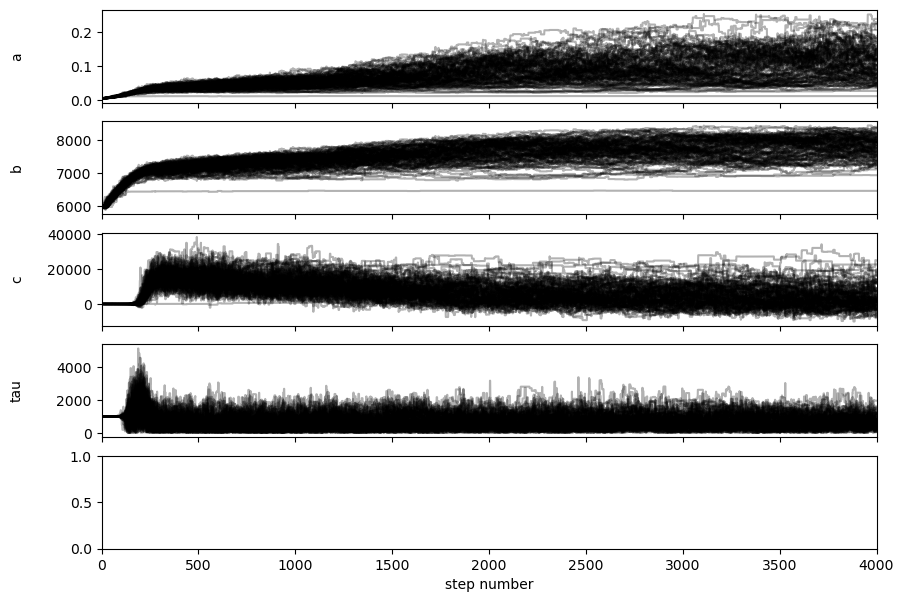

In [31]:
fig, axes = plt.subplots(5, figsize=(10, 7), sharex=True)
samples = sampler.get_chain()
labels = ["a", "b", "c", "tau"]
for i in range(ndim):
    ax = axes[i]
    ax.plot(samples[:, :, i], "k", alpha=0.3)
    ax.set_xlim(0, len(samples))
    ax.set_ylabel(labels[i])
    ax.yaxis.set_label_coords(-0.1, 0.5)

axes[-1].set_xlabel("step number");

(20000, 4)


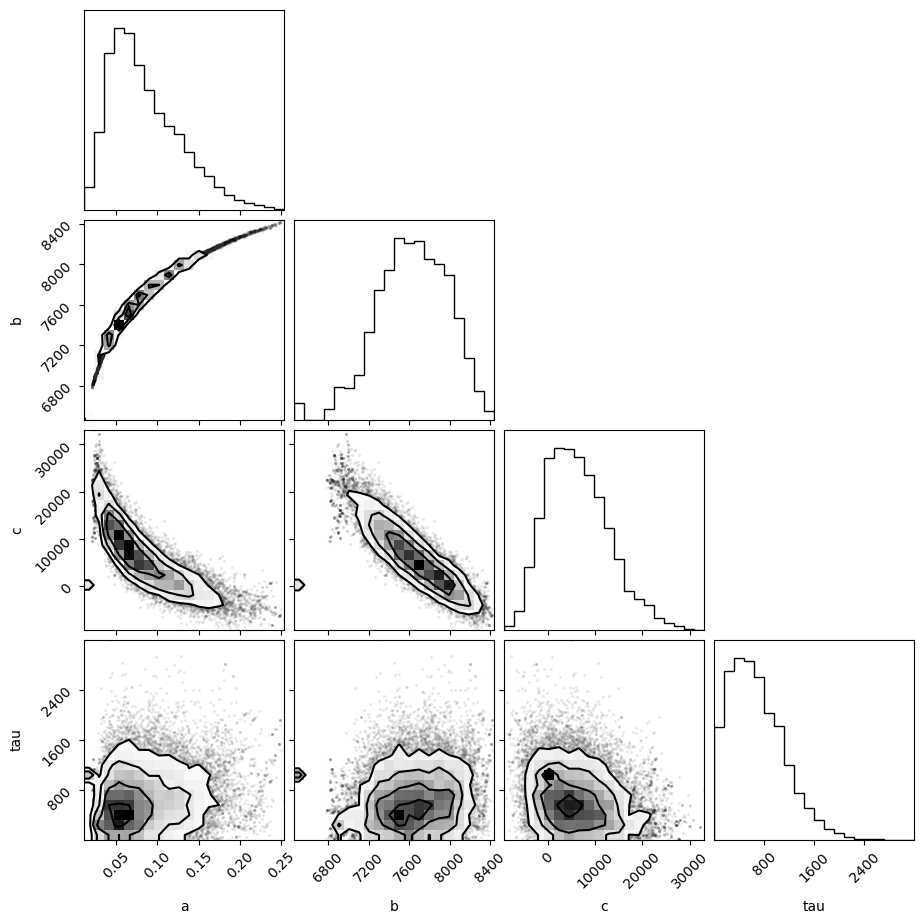

In [32]:
import corner

flat_samples = sampler.get_chain(discard=1000, thin=15, flat=True)
print(flat_samples.shape)

fig = corner.corner(flat_samples, labels=labels)

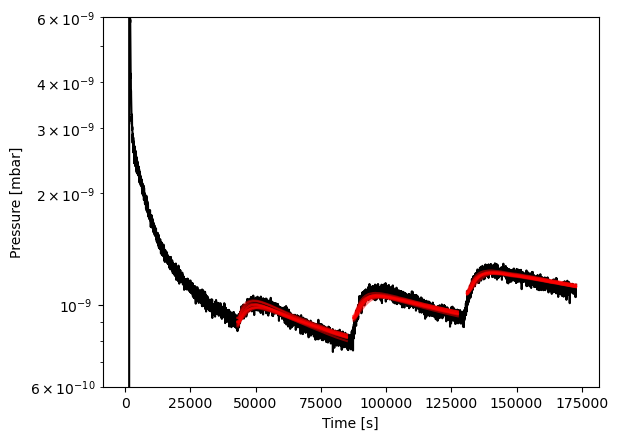

In [34]:
plt.figure()
plt.semilogy(time, p, 'k')
tT_final = []
for j,ts in enumerate(time_slices):
    gpts = (time > ts[0]) & (time < ts[1])
    tT_final.append((np.vstack((time[gpts],temp[gpts]))))
inds = np.random.randint(len(flat_samples), size=10)
for ind in inds:
    sample = flat_samples[ind]
    for j in range(len(time_slices)):
        tvals = combined_data[j][0]
        plt.plot(tvals, d.fitfunction_short_temp_offset(tT_final[j], sample[0], sample[1], sample[2], sample[3]), 'r', alpha=0.5)

plt.ylim(6e-10, 6e-9)
plt.ylabel('Pressure [mbar]')
plt.xlabel("Time [s]")

plt.savefig('VESPEL5_MCMC')

In [35]:
from IPython.display import display, Math

CI = 10 ## L/s
Area = 0.01 ## m^2
mbar_to_Pa = 100
K = 0.22
p_atm = 1.01e5 #Pa
m_to_cm = 100
L_to_m3 = 1e-3
KbT = 4.14e-21 #J

mcmc_D0 = np.percentile((flat_samples[:, 0]*CI*mbar_to_Pa*L_to_m3/(K*p_atm*Area) * m_to_cm)**2, [16, 50, 84])
mcmc_Ea = np.percentile(flat_samples[:, 1], [16, 50, 84])

print("D0 [cm^2/s]: ", mcmc_D0)
print("Activation energy [K]: ", mcmc_Ea)
print(flat_samples[:,0])

D0 [cm^2/s]:  [0.00039765 0.00116413 0.00340108]
Activation energy [K]:  [7290.32467199 7642.63568164 7993.27487574]
[0.04455531 0.04933548 0.03150093 ... 0.07951606 0.0690258  0.11363615]
